#Trabajo Práctico Final Visión por Computadora
#**Clasificador de poses en tiempo real para adiestramiento canino**


---



Julián Gerónimo García

Noviembre 2024

Tecnicatura Universitaria en Inteligencia Artificial

Facultad de Ciencias Exactas, Ingeniería y Agrimensura


##1.Función de la aplicación

El presente trabajo consiste en desarrollar un modelo capaz de clasificar en tiempo real las tres posiciones fundamentales utilizadas en el adiestramiento canino, las cuales son parado, sentado y tumbado.

##2.Hipótesis y consideraciones

El esquema de trabajo se basa en desarrollar dos modelos:

*   model_k: para la clasificación de perros y detección de sus keypoints.
*   model_p: para  la clasificación de la pose según los keypoints obtenidos en el modelo anterior.

Para la construcción de model_k se utilizará un modelo preentrenado, concretamente la versión nano de YOLO11 para entrenamiento de poses, al cual se le hará un ajuste fino utilizando el dataset de [Ultralytics Dog-Pose](https://docs.ultralytics.com/es/datasets/pose/dog-pose/), con 6.773 imágenes de entrenamiento y 1.703 imágenes de prueba, creado por el equipo de Stanford a partir de ImageNet.

Cada imagen anotada incluye 24 puntos clave con 3 dimensiones por punto clave (x, y, visibilidad).

El segundo modelo model_p recibirá como entrada un vector con las coordenadas de los keypoints y clasificará la imagen en una de las tres clases de pose.

Una vez desarrollados ambos modelos, se los integrará en una aplicación capaz de recibir una señal de video en tiempo real desde una cámara, detectar los keypoints del perro y predecir su pose.

El dataset que se utilizará contiene imágenes de perros de más de 20 razas, diferentes edades, con ángulos y posiciones de cámara y entornos variados, lo cual dará robustez al desarrollo.

No obstante lo anterior, se considera que el uso de la aplicación se dará en un entorno controlado con una posición de cámara fija lateral al perro, y que la estimación de pose no será para más de un perro al mismo tiempo.

A continuación se describe el desarrollo realizado.

##3.Setup

Se setea el entorno instalando e importando las librerías y dependencias a utilizar, y fijando parámetros.

In [ ]:
!pip install tensorflow
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 898.7/898.7 kB 14.8 MB/s eta 0:00:00


In [ ]:
from collections import Counter
from collections import defaultdict
import cv2
from google.colab.patches import cv2_imshow
from google.colab import files
from IPython.display import display, clear_output
import ipywidgets as widgets
import joblib
import json
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
from pathlib import Path
from PIL import Image
import random
import requests
import seaborn as sns
import shutil
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.utils import shuffle
import tensorflow as tf
from tensorflow.image import resize
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras import backend as K
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.models import load_model
from tensorflow.keras.models import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.utils import to_categorical
import torch
from tqdm import tqdm
from ultralytics import YOLO
import yaml
import zipfile

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
#Fijación de semillas para reproducibilidad de resultados
random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

##4.Funciones

A lo largo del trabajo se utilizarán funciones personalizadas que se detallan a continuación.

###4.1.Funciones para Evaluación del modelo

In [ ]:
def plot_training_validation_loss(data, title='Training and Validation Loss'):
    """
    Función para graficar las pérdidas de entrenamiento y validación.

    Parameters:
    - data (pd.DataFrame): DataFrame que contiene las columnas de pérdida.
    - title (str): Título del gráfico. Default: 'Training and Validation Loss'.
    """
    plt.figure(figsize=(12, 6))

    # Graficar las pérdidas de entrenamiento
    if 'train/box_loss' in data.columns:
        plt.plot(data['epoch'], data['train/box_loss'], label='Box Loss (Train)', color='blue')
    if 'train/pose_loss' in data.columns:
        plt.plot(data['epoch'], data['train/pose_loss'], label='Pose Loss (Train)', color='green')

    # Graficar las pérdidas de validación
    if 'val/box_loss' in data.columns:
        plt.plot(data['epoch'], data['val/box_loss'], label='Box Loss (Val)', color='red')
    if 'val/pose_loss' in data.columns:
        plt.plot(data['epoch'], data['val/pose_loss'], label='Pose Loss (Val)', color='orange')

    # Configuración del gráfico
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(title)
    plt.legend()
    plt.grid()
    plt.show()

In [ ]:
def plot_pose_map_metrics(data, title='Pose Metrics (mAP) During Training'):
    """
    Función para graficar las métricas Pose/mAP50(P) y Pose/mAP50-95(P) durante el entrenamiento,
    además de mostrar los mejores valores de cada métrica.

    Parameters:
    - data (pd.DataFrame): DataFrame que contiene las columnas 'metrics/mAP50(P)' y 'metrics/mAP50-95(P)'.
    - title (str): Título del gráfico. Por defecto: 'Pose Metrics (mAP) During Training'.
    """
    plt.figure(figsize=(12, 6))

    # Graficar las métricas Pose/mAP50(P) y Pose/mAP50-95(P)
    if 'metrics/mAP50(P)' in data.columns:
        plt.plot(data.index, data['metrics/mAP50(P)'], label='Pose mAP@50 (P)', color='purple')
    if 'metrics/mAP50-95(P)' in data.columns:
        plt.plot(data.index, data['metrics/mAP50-95(P)'], label='Pose mAP@50-95 (P)', color='brown')

    # Configuración del gráfico
    plt.xlabel('Epoch')
    plt.ylabel('mAP')
    plt.title(title)
    plt.legend()
    plt.grid()
    plt.show()

    # Obtener el mejor valor de cada métrica
    if 'metrics/mAP50(P)' in data.columns:
        best_map50 = data['metrics/mAP50(P)'].idxmax()
        print(f"\nMejor valor de Pose mAP@50 (P): {data['metrics/mAP50(P)'][best_map50]:.4f} en la época {best_map50 + 1}")

    if 'metrics/mAP50-95(P)' in data.columns:
        best_map5095 = data['metrics/mAP50-95(P)'].idxmax()
        print(f"\nMejor valor de Pose mAP@50-95 (P): {data['metrics/mAP50-95(P)'][best_map5095]:.4f} en la época {best_map5095 + 1}")


In [ ]:
def plot_map_metrics(data, title='Metrics (mAP) During Training'):
    """
    Función para graficar las métricas mAP50 y mAP50-95 durante el entrenamiento.

    Parameters:
    - data (pd.DataFrame): DataFrame que contiene las columnas 'metrics/mAP50(B)' y 'metrics/mAP50-95(B)'.
    - title (str): Título del gráfico. Por defecto: 'Metrics (mAP) During Training'.
    """
    plt.figure(figsize=(12, 6))

    # Graficar las métricas mAP50 y mAP50-95
    if 'metrics/mAP50(B)' in data.columns:
        plt.plot(data['epoch'], data['metrics/mAP50(B)'], label='mAP@50 (B)', color='purple')
    if 'metrics/mAP50-95(B)' in data.columns:
        plt.plot(data['epoch'], data['metrics/mAP50-95(B)'], label='mAP@50-95 (B)', color='brown')

    # Configurar el gráfico
    plt.xlabel('Epoch')
    plt.ylabel('mAP')
    plt.title(title)
    plt.legend()
    plt.grid()
    plt.show()

def plot_precision_recall(data, title='Precision and Recall During Training'):
    """
    Función para graficar la precisión y recall durante el entrenamiento.

    Parameters:
    - data (pd.DataFrame): DataFrame que contiene las columnas 'metrics/precision(B)' y 'metrics/recall(B)'.
    - title (str): Título del gráfico. Por defecto: 'Precision and Recall During Training'.
    """
    plt.figure(figsize=(12, 6))

    # Graficar precisión y recall
    if 'metrics/precision(B)' in data.columns:
        plt.plot(data['epoch'], data['metrics/precision(B)'], label='Precision (B)', color='blue')
    if 'metrics/recall(B)' in data.columns:
        plt.plot(data['epoch'], data['metrics/recall(B)'], label='Recall (B)', color='green')

    # Configurar el gráfico
    plt.xlabel('Epoch')
    plt.ylabel('Metric Value')
    plt.title(title)
    plt.legend()
    plt.grid()
    plt.show()

In [ ]:
def load_latest_training_results(base_dir="runs/pose/"):
    """
    Encuentra la carpeta más reciente en el directorio base y carga el archivo results.csv.

    Args:
        base_dir (str): Directorio donde se encuentran los resultados de entrenamiento.

    Returns:
        pd.DataFrame: DataFrame con los resultados del entrenamiento.
        str: Ruta de la carpeta del último entrenamiento.
    """
    # Obtener la lista de carpetas en el directorio base
    subdirs = [os.path.join(base_dir, d) for d in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, d))]

    # Ordenar las carpetas por fecha de modificación (más reciente primero)
    subdirs = sorted(subdirs, key=os.path.getmtime, reverse=True)

    # Tomar la carpeta más reciente
    latest_dir = subdirs[0] if subdirs else None
    if latest_dir:
        results_path = os.path.join(latest_dir, "results.csv")
        if os.path.exists(results_path):
            print(f"Cargando resultados desde: {results_path}")
            return pd.read_csv(results_path), latest_dir
        else:
            raise FileNotFoundError(f"No se encontró el archivo results.csv en {latest_dir}")
    else:
        raise FileNotFoundError("No se encontraron carpetas en el directorio base.")

In [ ]:
def load_training_results(train="", base_dir="runs/pose/"):
    """
    Encuentra la carpeta especificada en el directorio base y carga el archivo results.csv.

    Args:
        base_dir (str): Directorio donde se encuentran los resultados de entrenamiento.
        train (str): Nombre de la carpeta de entrenamiento a buscar.

    Returns:
        pd.DataFrame: DataFrame con los resultados del entrenamiento.
        str: Ruta de la carpeta del entrenamiento especificado.

    Raises:
        FileNotFoundError: Si no se encuentra la carpeta o el archivo results.csv.
    """

    # Construir la ruta completa a la carpeta de entrenamiento
    target_dir = os.path.join(base_dir, train)

    # Verificar si la carpeta existe
    if os.path.exists(target_dir):
        results_path = os.path.join(target_dir, "results.csv")
        if os.path.exists(results_path):
            print(f"Cargando resultados desde: {results_path}")
            return pd.read_csv(results_path), target_dir
        else:
            raise FileNotFoundError(f"No se encontró el archivo results.csv en {target_dir}")
    else:
        raise FileNotFoundError(f"No se encontró la carpeta {train} en {base_dir}")

In [ ]:
def evaluate_and_plot_confusion_matrix(model_k, model_p, scaler, images_dir, labels_dir, lesskeypoints_list):
    """
    Evalúa el modelo en un conjunto de prueba y genera una matriz de confusión.

    Args:
        model_k: Modelo YOLO para detectar keypoints.
        model_p: Modelo para clasificar la pose.
        scaler: Scaler usado para normalizar las coordenadas.
        images_dir: Ruta de la carpeta de imágenes.
        labels_dir: Ruta de la carpeta de etiquetas.
        lesskeypoints_list: Lista de índices de los keypoints a usar para el modelo de clasificación.
    """
    # Etiquetas
    class_labels = ["Tumbado", "Sentado", "Parado"]
    y_true = []  # Etiquetas reales
    y_pred = []  # Etiquetas predichas

    # Listar todas las imágenes en la carpeta
    image_files = [f for f in os.listdir(images_dir) if f.endswith(('.jpg', '.png'))]

    # Usar tqdm para mostrar barra de progreso
    for image_name in tqdm(image_files, desc="Procesando imágenes"):
        # Ruta de la imagen y su etiqueta
        image_path = os.path.join(images_dir, image_name)
        label_path = os.path.join(labels_dir, os.path.splitext(image_name)[0] + ".txt")

        # Leer la etiqueta real desde el archivo correspondiente
        if not os.path.exists(label_path):
            print(f"Etiqueta no encontrada para la imagen {image_name}. Saltando...")
            continue
        with open(label_path, "r") as label_file:
            true_label = label_file.read().strip()

        # Cargar la imagen y realizar predicción
        image = cv2.imread(image_path)
        results = model_k(image)

        # Obtener keypoints
        coordinates_example = []
        if hasattr(results[0], "keypoints") and results[0].keypoints is not None:
            keypoints_data = results[0].keypoints.data.cpu().numpy()
            for row in keypoints_data[0]:
                coordinates_example.append((float(row[0]), float(row[1])))
        else:
            coordinates_example = [(0.00, 0.00)] * 24

        # Filtrar los keypoints
        filtered_coordinates = [coordinates_example[i] for i in lesskeypoints_list]
        expected_features = len(lesskeypoints_list)
        filtered_coordinates = filtered_coordinates[:expected_features]
        filtered_coordinates.extend([(0.0, 0.0)] * (expected_features - len(filtered_coordinates)))

        # Normalizar coordenadas
        input_data = np.array(filtered_coordinates).flatten().reshape(1, -1)
        input_data_normalized = scaler.transform(input_data)

        # Predicción de la pose
        probabilities = model_p.predict(input_data_normalized)
        predicted_class_index = np.argmax(probabilities)
        predicted_class_label = class_labels[predicted_class_index]

        # Guardar resultados
        y_true.append(true_label)
        y_pred.append(predicted_class_label)

    # Generar matriz de confusión
    cm = confusion_matrix(y_true, y_pred, labels=class_labels)
    report = classification_report(y_true, y_pred, target_names=class_labels)
    print("Reporte de clasificación:")
    print(report)

    # Graficar la matriz de confusión
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_labels, yticklabels=class_labels)
    plt.xlabel("Etiqueta Predicha")
    plt.ylabel("Etiqueta Verdadera")
    plt.title("Matriz de Confusión")
    plt.show()


In [ ]:
def average_inference_time(model, images_path, n):
    """
    Calcula el tiempo promedio de inferencia para un número `n` de muestras seleccionadas aleatoriamente.

    Parameters:
    - model: Modelo YOLO cargado previamente.
    - images_path: Ruta de la carpeta que contiene las imágenes.
    - n (int): Número de muestras para calcular el tiempo promedio de inferencia.

    Returns:
    - float: Tiempo promedio de inferencia en milisegundos.
    """
    import time
    import random

    # Verificar si la ruta existe
    if not os.path.exists(images_path):
        raise FileNotFoundError(f"La ruta especificada no existe: {images_path}")

    # Listar todas las imágenes en la carpeta
    image_files = [f for f in os.listdir(images_path) if f.endswith(('.jpg', '.png'))]

    # Verificar si hay suficientes imágenes
    if len(image_files) < n:
        raise ValueError(f"El número de imágenes disponibles ({len(image_files)}) es menor que {n}")

    # Seleccionar `n` imágenes aleatorias
    selected_images = random.sample(image_files, n)

    total_time = 0.0

    for image_file in selected_images:
        # Cargar la imagen
        image_path = os.path.join(images_path, image_file)
        image = cv2.imread(image_path)

        # Medir el tiempo de inferencia
        start_time = time.time()
        model(image)  # Realizar la predicción
        end_time = time.time()

        # Calcular el tiempo de inferencia en milisegundos
        inference_time = (end_time - start_time) * 1000
        total_time += inference_time

    # Calcular el tiempo promedio
    avg_time = total_time / n
    return avg_time

###4.2.Funciones para Inferencia

In [ ]:
def predict_random_image(model, images_path):
    """
    Selecciona una imagen aleatoria de la carpeta, realiza una predicción utilizando el modelo proporcionado,
    dibuja los keypoints y conecta los puntos especificados por pares definidos dentro de la función.
    Además, coloca un número pequeño junto a cada keypoint.

    Argumentos:
        model: Modelo YOLO cargado previamente.
        images_path: Ruta de la carpeta que contiene las imágenes.
    """
    # Verificar si la ruta existe
    if not os.path.exists(images_path):
        raise FileNotFoundError(f"La ruta especificada no existe: {images_path}")

    # Listar todas las imágenes en la carpeta
    image_files = [f for f in os.listdir(images_path) if f.endswith(('.jpg', '.png'))]

    # Verificar si hay imágenes en la carpeta
    if not image_files:
        raise FileNotFoundError(f"No se encontraron imágenes en la ruta: {images_path}")

    # Seleccionar una imagen aleatoria
    random_image = random.choice(image_files)
    random_image_path = os.path.join(images_path, random_image)

    # Cargar la imagen seleccionada
    image = cv2.imread(random_image_path)

    # Realizar la predicción
    results = model(image)

    # Dibujar los resultados en la imagen
    annotated_image = results[0].plot()

    # Obtener keypoints de la predicción
    keypoints = []
    if hasattr(results[0], "keypoints") and results[0].keypoints is not None:
        # Extraer las coordenadas (x, y) ignorando el tercer valor (confianza)
        keypoints_data = results[0].keypoints.data.cpu().numpy()  # Convertir a numpy array
        for row in keypoints_data[0]:  # Suponiendo que es un array 3D [1, N, 3]
            keypoints.append((float(row[0]), float(row[1])))  # Solo (x, y)
    else:
        print("No se encontraron keypoints en los resultados.")

    # Dibujar los keypoints con números junto a ellos
    for i, (x, y) in enumerate(keypoints):
        if (x, y) != (0.0, 0.0):  # Dibujar solo keypoints válidos
            # Dibujar el punto
            cv2.circle(annotated_image, (int(x), int(y)), radius=5, color=(0, 255, 0), thickness=-1)
            # Dibujar el número pequeño junto al punto
            cv2.putText(
                annotated_image,
                str(i),  # Número del keypoint
                (int(x) + 5, int(y) - 5),  # Posición del texto
                cv2.FONT_HERSHEY_SIMPLEX,
                0.4,  # Tamaño de la fuente
                (255, 255, 255),  # Color del texto
                1,  # Grosor del texto
                cv2.LINE_AA
            )

    # Definir los pares de puntos a conectar dentro de la función
    pairs_to_connect = [(1, 2), (2, 3), (4, 5), (5, 6), (7, 8), (8, 9), (10, 11), (11, 12), (13, 14), (15, 19), (15, 17), (16, 17), (17, 18), (16, 20)]

    # Dibujar líneas entre los puntos especificados en pairs_to_connect
    for pair in pairs_to_connect:
        idx1, idx2 = pair  # Desempaquetar el par de índices
        if idx1 <= len(keypoints) and idx2 <= len(keypoints):  # Verificar que los índices sean válidos
            x1, y1 = keypoints[idx1 - 1]
            x2, y2 = keypoints[idx2 - 1]
            # Verificar que ninguno de los puntos tenga coordenadas (0, 0)
            if (x1, y1) != (0.0, 0.0) and (x2, y2) != (0.0, 0.0):
                pt1 = (int(x1), int(y1))
                pt2 = (int(x2), int(y2))
                cv2.line(annotated_image, pt1, pt2, color=(0, 255, 0), thickness=2)  # Línea verde

    # Mostrar la imagen anotada con las líneas
    plt.imshow(cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB))
    plt.axis('off')  # Ocultar los ejes
    plt.show()

    # Mostrar los keypoints debajo de la imagen
    if keypoints:
        print("Keypoints detectados (x, y):")
        for i, (x, y) in enumerate(keypoints):
            print(f"{i}: (x: {x:.2f}, y: {y:.2f})")

###4.3.Funciones para etiquetado

In [ ]:
# Función para etiquetar una imagen
def label_current_image():
    global current_index

    # Si no hay más imágenes, finalizar
    if current_index >= len(image_files):
        clear_output()
        print("¡Todas las imágenes han sido etiquetadas!")
        print(f"Total de imágenes etiquetadas: {len(output_labels)}")
        # Guardar las etiquetas al finalizar
        with open('output_labels.json', 'w') as f:
            json.dump(output_labels, f)
        return

    # Mostrar imagen actual
    img_name = image_files[current_index]
    img_path = os.path.join(images_path, img_name)
    clear_output()  # Limpiar la salida para mostrar solo la imagen actual
    print(f"Imágenes etiquetadas: {len(output_labels)} / {len(image_files)}")  # Contador
    display(Image.open(img_path))  # Mostrar la imagen

    # Selector de etiquetas
    label = widgets.RadioButtons(
        options=['Parado', 'Sentado', 'Tumbado', 'Otro'],  # Opciones de etiqueta
        description='Etiqueta:',
        disabled=False
    )
    display(label)

    # Botón para guardar la etiqueta
    button = widgets.Button(description="Guardar Etiqueta")
    display(button)

    # Función para guardar la etiqueta y avanzar a la siguiente imagen
    def save_label(b):
        global current_index
        output_labels[img_name] = label.value
        print(f"Etiqueta '{label.value}' guardada para {img_name}")
        current_index += 1  # Avanzar al siguiente índice
        label_current_image()  # Mostrar la siguiente imagen

    button.on_click(save_label)

In [ ]:
def label_current_image_with_keypoints(model, images_path):
    global current_index

    # Si no hay más imágenes, finalizar
    if current_index >= len(image_files):
        clear_output()
        print("¡Todas las imágenes han sido etiquetadas!")
        print(f"Total de imágenes etiquetadas: {len(output_labels)}")
        # Guardar las etiquetas al finalizar
        with open('output_labels.json', 'w') as f:
            json.dump(output_labels, f)
        return

    # Mostrar imagen actual
    img_name = image_files[current_index]
    img_path = os.path.join(images_path, img_name)
    clear_output()  # Limpiar la salida para mostrar solo la imagen actual
    print(f"Imágenes etiquetadas: {len(output_labels)} / {len(image_files)}")  # Contador

    # Cargar la imagen actual
    image = cv2.imread(img_path)

    # Realizar la predicción
    results = model(image)

    # Dibujar los resultados en la imagen
    annotated_image = results[0].plot()

    # Obtener keypoints de la predicción
    keypoints = []
    if hasattr(results[0], "keypoints") and results[0].keypoints is not None:
        # Extraer las coordenadas (x, y) ignorando el tercer valor (confianza)
        keypoints_data = results[0].keypoints.data.cpu().numpy()  # Convertir a numpy array
        for row in keypoints_data[0]:  # Suponiendo que es un array 3D [1, N, 3]
            keypoints.append((float(row[0]), float(row[1])))  # Solo (x, y)

    # Definir los pares de puntos a conectar
    pairs_to_connect = [(1, 2), (2, 3), (4, 5), (5, 6), (7, 8), (8, 9), (10, 11), (11, 12), (13, 14), (15, 19), (15, 17), (16, 17), (17, 18), (16, 20)]

    # Dibujar líneas entre los puntos especificados en pairs_to_connect
    for pair in pairs_to_connect:
        idx1, idx2 = pair  # Desempaquetar el par de índices
        if idx1 <= len(keypoints) and idx2 <= len(keypoints):  # Verificar que los índices sean válidos
            x1, y1 = keypoints[idx1 - 1]
            x2, y2 = keypoints[idx2 - 1]
            # Verificar que ninguno de los puntos tenga coordenadas (0, 0)
            if (x1, y1) != (0.0, 0.0) and (x2, y2) != (0.0, 0.0):
                pt1 = (int(x1), int(y1))  # Convertir a entero
                pt2 = (int(x2), int(y2))
                cv2.line(annotated_image, pt1, pt2, color=(0, 255, 0), thickness=2)  # Línea verde

    # Mostrar la imagen anotada con los keypoints
    plt.imshow(cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB))
    plt.axis('off')  # Ocultar los ejes
    plt.show()

    # Selector de etiquetas
    label = widgets.RadioButtons(
        options=['Parado', 'Sentado', 'Tumbado', 'Otro'],  # Opciones de etiqueta
        description='Etiqueta:',
        disabled=False
    )
    display(label)

    # Botón para guardar la etiqueta
    button = widgets.Button(description="Guardar Etiqueta")
    display(button)

    # Función para guardar la etiqueta y avanzar a la siguiente imagen
    def save_label(b):
        global current_index
        output_labels[img_name] = label.value
        print(f"Etiqueta '{label.value}' guardada para {img_name}")
        current_index += 1  # Avanzar al siguiente índice
        label_current_image_with_keypoints(model, images_path)  # Mostrar la siguiente imagen

    button.on_click(save_label)

In [ ]:
# Función para procesar y reetiquetar imágenes con keypoints y líneas
def relabel_image_with_keypoints(target_class, json_path, images_path, model):
    # Cargar etiquetas desde el archivo JSON
    with open(json_path, "r") as f:
        labels = json.load(f)

    # Filtrar imágenes etiquetadas con la clase específica
    image_files = [img_name for img_name, label in labels.items() if label == target_class]
    current_index = 0  # Índice inicial
    global output_labels  # Asegurarse de que output_labels sea global
    output_labels = labels.copy()  # Hacer una copia de las etiquetas originales

    # Si no hay imágenes para procesar, finalizar
    if len(image_files) == 0:
        clear_output()
        print(f"No se encontraron imágenes etiquetadas como '{target_class}'.")
        return

    # Función para procesar cada imagen
    def process_image():
        nonlocal current_index  # Para modificar la variable dentro de la función interna

        # Si no hay más imágenes, finalizar
        if current_index >= len(image_files):
            clear_output()
            print("¡Todas las imágenes de la clase seleccionada han sido etiquetadas!")
            print(f"Total de imágenes etiquetadas: {len(output_labels)}")
            # Guardar las etiquetas al finalizar
            with open(json_path, "w") as f:
                json.dump(output_labels, f, indent=4)
            return

        # Mostrar imagen actual
        img_name = image_files[current_index]
        img_path = os.path.join(images_path, img_name)
        clear_output()  # Limpiar la salida para mostrar solo la imagen actual
        print(f"Imágenes etiquetadas: {current_index + 1} / {len(image_files)}")  # Contador

        # Cargar la imagen actual
        image = cv2.imread(img_path)
        if image is None:
            print(f"No se pudo cargar la imagen: {img_name}")
            current_index += 1
            process_image()
            return

        # Realizar la predicción de keypoints
        results = model(image)

        # Dibujar los resultados en la imagen
        annotated_image = results[0].plot()

        # Obtener keypoints de la predicción
        keypoints = []
        if hasattr(results[0], "keypoints") and results[0].keypoints is not None:
            # Extraer las coordenadas (x, y) ignorando el tercer valor (confianza)
            keypoints_data = results[0].keypoints.data.cpu().numpy()  # Convertir a numpy array
            for row in keypoints_data[0]:  # Suponiendo que es un array 3D [1, N, 3]
                keypoints.append((float(row[0]), float(row[1])))

        # Definir los pares de puntos a conectar
        pairs_to_connect = [(1, 2), (2, 3), (4, 5), (5, 6), (7, 8), (8, 9), (10, 11), (11, 12), (13, 14), (15, 19), (15, 17), (16, 17), (17, 18), (16, 20)]

        # Dibujar líneas entre los puntos especificados en pairs_to_connect
        for pair in pairs_to_connect:
            idx1, idx2 = pair  # Desempaquetar el par de índices
            if idx1 <= len(keypoints) and idx2 <= len(keypoints):  # Verificar que los índices sean válidos
                x1, y1 = keypoints[idx1 - 1]
                x2, y2 = keypoints[idx2 - 1]
                # Verificar que ninguno de los puntos tenga coordenadas (0, 0)
                if (x1, y1) != (0.0, 0.0) and (x2, y2) != (0.0, 0.0):
                    pt1 = (int(x1), int(y1))  # Convertir a entero
                    pt2 = (int(x2), int(y2))
                    cv2.line(annotated_image, pt1, pt2, color=(0, 255, 0), thickness=2)  # Línea verde

        # Mostrar la imagen anotada con los keypoints
        plt.imshow(cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB))
        plt.axis('off')  # Ocultar los ejes
        plt.title(f"Etiqueta actual: {output_labels[img_name]}")
        plt.show()

        # Selector de etiquetas
        label = widgets.RadioButtons(
            options=['Parado', 'Sentado', 'Tumbado', 'Otro'],  # Opciones de etiqueta
            value=output_labels[img_name],  # Etiqueta actual como valor predeterminado
            description='Etiqueta:',
            disabled=False
        )
        display(label)

        # Botón para guardar la etiqueta
        button = widgets.Button(description="Guardar Etiqueta")
        display(button)

        # Función para guardar la etiqueta y avanzar a la siguiente imagen
        def save_label(b):
            nonlocal current_index
            previous_label = output_labels[img_name]  # Obtener la etiqueta anterior
            new_label = label.value  # Nueva etiqueta seleccionada
            output_labels[img_name] = new_label
            print(f"Etiqueta para '{img_name}' cambiada de '{previous_label}' a '{new_label}'")
            current_index += 1  # Avanzar al siguiente índice
            process_image()  # Mostrar la siguiente imagen

        button.on_click(save_label)

    # Iniciar el proceso para la primera imagen
    process_image()

In [ ]:
#Funciones para etiquetado automático

def predict_pose_with_prob(model_k, model_p, scaler, image_path, lesskeypoints_list):
    """
    Realiza la predicción de keypoints y la clasificación de la pose.
    Retorna la etiqueta predicha y la probabilidad asociada.

    Argumentos:
        model_k: Modelo YOLO para detectar keypoints.
        model_p: Modelo para clasificar la pose.
        scaler: Scaler usado para normalizar las coordenadas durante el entrenamiento del modelo de clasificación.
        image_path: Ruta de la imagen a procesar.
        lesskeypoints_list: Lista de índices de los keypoints a usar para la clasificación.

    Retorna:
        filtered_coordinates: Coordenadas filtradas para la clasificación (solo para debug).
        predicted_class_label: Clase predicha (ej., "Tumbado", "Sentado", "Parado").
        predicted_class_probability: Probabilidad de la clase predicha.
    """
    import cv2
    import numpy as np

    # Cargar la imagen
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError(f"No se pudo cargar la imagen: {image_path}")

    # Realizar la predicción de keypoints
    results = model_k(image)

    # Obtener keypoints de la predicción
    coordinates_example = []
    if hasattr(results[0], "keypoints") and results[0].keypoints is not None:
        keypoints_data = results[0].keypoints.data.cpu().numpy()
        for row in keypoints_data[0]:
            coordinates_example.append((float(row[0]), float(row[1])))
    else:
        # Si no se detectan keypoints, rellenar con ceros
        coordinates_example = [(0.0, 0.0)] * 24

    # Filtrar los keypoints según lesskeypoints_list
    filtered_coordinates = [coordinates_example[i] for i in lesskeypoints_list]

    # Normalizar las coordenadas
    input_data = np.array(filtered_coordinates).flatten().reshape(1, -1)
    input_data_normalized = scaler.transform(input_data)

    # Realizar la predicción de la pose
    class_labels = ["Tumbado", "Sentado", "Parado"]
    probabilities = model_p.predict(input_data_normalized)
    predicted_class_index = np.argmax(probabilities)
    predicted_class_label = class_labels[predicted_class_index]
    predicted_class_probability = probabilities[0][predicted_class_index]

    return filtered_coordinates, predicted_class_label, predicted_class_probability

In [ ]:
def auto_label_images(
    model_k, model_p, scaler, images_path, lesskeypoints_list,
    output_json='labels5.json', threshold=0.95, num_images=None
):
    """
    Etiqueta automáticamente imágenes utilizando modelos YOLO y de clasificación de poses.
    Actualiza las etiquetas en el archivo JSON `labels5.json`.

    Argumentos:
        model_k: Modelo YOLO para detectar keypoints.
        model_p: Modelo para clasificar la pose.
        scaler: Scaler usado para normalizar las coordenadas durante el entrenamiento del modelo de clasificación.
        images_path: Ruta de la carpeta que contiene las imágenes.
        lesskeypoints_list: Lista de índices de los keypoints a usar para el modelo de clasificación.
        output_json: Nombre del archivo JSON para guardar las etiquetas y keypoints.
        threshold: Umbral de probabilidad mínimo para aceptar una predicción (por defecto 0.95).
        num_images: Número máximo de imágenes a etiquetar. Si es None, etiqueta todas.
    """
    # Verificar si la ruta de las imágenes existe
    if not os.path.exists(images_path):
        raise FileNotFoundError(f"La ruta especificada no existe: {images_path}")

    # Listar todas las imágenes en el directorio
    image_files = [f for f in os.listdir(images_path) if f.endswith(('.jpg', '.png'))]

    # Verificar si hay imágenes
    if not image_files:
        raise FileNotFoundError(f"No se encontraron imágenes en la ruta: {images_path}")

    # Cargar etiquetas existentes desde labels5.json
    labels = {}
    if os.path.exists(output_json):
        try:
            with open(output_json, 'r') as f:
                labels = json.load(f)
                print(f"Etiquetas cargadas desde {output_json}. Total: {len(labels)} imágenes etiquetadas.")
        except json.JSONDecodeError:
            print(f"Error: El archivo {output_json} está corrupto. Se regenerará un nuevo archivo.")
            labels = {}
    else:
        print(f"No se encontró {output_json}. Creando un nuevo archivo.")

    # Filtrar imágenes no etiquetadas
    image_files = [img for img in image_files if img not in labels]

    # Si num_images está definido, limitar el número de imágenes a procesar
    if num_images is not None:
        image_files = image_files[:num_images]

    # Barra de progreso con tqdm
    with tqdm(total=len(image_files), desc="Etiquetando imágenes") as pbar:
        for img_name in image_files:
            # Ruta completa de la imagen
            img_path = os.path.join(images_path, img_name)

            # Realizar la predicción usando predict_pose
            try:
                _, predicted_label, predicted_prob = predict_pose_with_prob(
                    model_k, model_p, scaler, img_path, lesskeypoints_list
                )
            except Exception as e:
                print(f"Error procesando la imagen {img_name}: {e}")
                pbar.update(1)
                continue

            # Verificar si la probabilidad supera el umbral
            if predicted_prob < threshold:
                print(f"Etiqueta descartada para '{img_name}' (Probabilidad: {predicted_prob:.2f})")
                pbar.update(1)
                continue

            # Guardar solo el nombre del archivo y la etiqueta
            labels[img_name] = predicted_label

            # Mostrar la etiqueta generada (opcional)
            print(f"Etiqueta '{predicted_label}' generada para la imagen '{img_name}'")

            # Actualizar la barra de progreso
            pbar.update(1)

    # Guardar las etiquetas actualizadas en labels5.json
    with open(output_json, 'w') as f:
        json.dump(labels, f, indent=4)

    print(f"Etiquetado completo. Total de imágenes etiquetadas: {len(labels)}")
    print(f"Etiquetas guardadas en: {output_json}")

###4.4.Funciones para armado de dataset

In [ ]:
def augment_coordinates(keypoints, augmentation_type="flip", params=None):
    """
    Aplica una transformación geométrica a las coordenadas de los keypoints.

    Argumentos:
        keypoints: Lista de tuplas (x, y) representando las coordenadas originales.
        augmentation_type: Tipo de aumentación ("flip", "translate", "scale", "rotate").
        params: Parámetros adicionales para la transformación (ej. ángulo de rotación).

    Devuelve:
        Lista de tuplas (x, y) con las coordenadas transformadas.
    """
    keypoints = np.array(keypoints)

    if augmentation_type == "flip":
        max_x = np.max(keypoints[:, 0])
        keypoints[:, 0] = max_x - keypoints[:, 0]
    elif augmentation_type == "translate":
        tx = params.get("tx", 0)
        ty = params.get("ty", 0)
        keypoints[:, 0] += tx
        keypoints[:, 1] += ty
    elif augmentation_type == "scale":
        sx = params.get("sx", 1.0)
        sy = params.get("sy", 1.0)
        keypoints[:, 0] *= sx
        keypoints[:, 1] *= sy
    elif augmentation_type == "rotate":
        angle = params.get("angle", 0)
        angle_rad = np.radians(angle)
        rotation_matrix = np.array([
            [np.cos(angle_rad), -np.sin(angle_rad)],
            [np.sin(angle_rad), np.cos(angle_rad)]
        ])
        keypoints = np.dot(keypoints, rotation_matrix.T)
    else:
        raise ValueError(f"Tipo de aumentación no soportado: {augmentation_type}")

    return keypoints.tolist()

In [ ]:
def keypoints_to_labels_with_balance(model, images_path, labels_data, output_file, balance_option=1, keypoints_list=None):
    """
    Procesa imágenes y etiquetas para generar un archivo .npy balanceado que contenga IDs, etiquetas y keypoints.

    Argumentos:
        model: Modelo YOLO cargado previamente.
        images_path: Ruta de la carpeta que contiene las imágenes.
        labels_data: Diccionario de etiquetas cargado desde labels.json.
        output_file: Nombre del archivo .npy donde se guardarán los resultados.
        balance_option: 0 para no balancear, 1 para submuestreo, 2 para sobremuestreo con aumentación.
        keypoints_list: Lista de índices de keypoints que se desean utilizar (opcional).
    """
    # Mapeo de etiquetas a valores numéricos
    label_mapping = {
        "tumbado": 0,
        "sentado": 1,
        "parado": 2
    }

    # Diccionario para almacenar los datos por clase
    data_by_class = {0: [], 1: [], 2: []}

    # Procesar imágenes y obtener keypoints
    for image_name, label_text in tqdm(labels_data.items(), desc="Procesando imágenes", unit="imagen"):
        # Convertir la etiqueta de texto a su valor numérico
        label = label_mapping.get(label_text.lower(), -1)
        if label == -1:
            print(f"Etiqueta '{label_text}' no válida para la imagen {image_name}. Omitiendo.")
            continue

        # Ruta de la imagen
        image_path = os.path.join(images_path, image_name)

        # Verificar si la imagen existe
        if not os.path.exists(image_path):
            print(f"La imagen {image_name} no se encuentra en la ruta especificada. Omitiendo.")
            continue

        # Cargar la imagen
        image = cv2.imread(image_path)

        # Realizar la predicción
        results = model(image)

        # Obtener keypoints de la predicción
        keypoints = []
        if hasattr(results[0], "keypoints") and results[0].keypoints is not None:
            keypoints_data = results[0].keypoints.data.cpu().numpy()
            for row in keypoints_data[0]:
                keypoints.append((float(row[0]), float(row[1])))

        if not keypoints:
            print(f"No se encontraron keypoints para la imagen {image_name}. Omitiendo.")
            continue

        # Filtrar keypoints según la lista proporcionada
        if keypoints_list is not None:
            keypoints = [keypoints[i] for i in keypoints_list if i < len(keypoints)]

        # Agregar los datos a la clase correspondiente
        data_by_class[label].append([label, keypoints])

    # Balancear las clases
    balanced_data = []
    if balance_option == 0:  # No balancear
        for class_data in data_by_class.values():
            balanced_data.extend(class_data)
    elif balance_option == 1:  # Submuestreo
        min_class_size = min(len(data) for data in data_by_class.values())
        print(f"Balanceando al tamaño mínimo entre clases: {min_class_size}")
        for class_data in data_by_class.values():
            balanced_data.extend(random.sample(class_data, min_class_size))
    elif balance_option == 2:  # Sobremuestreo con aumentación
        max_class_size = max(len(data) for data in data_by_class.values())
        print(f"Balanceando al tamaño máximo entre clases: {max_class_size}")
        for label, class_data in data_by_class.items():
            while len(class_data) < max_class_size:
                original = random.choice(class_data)
                augmented_keypoints = augment_coordinates(
                    original[1],  # Keypoints
                    random.choice(["flip", "translate", "rotate", "scale"]),
                    params={
                        "tx": random.uniform(-10, 10),
                        "ty": random.uniform(-10, 10),
                        "angle": random.uniform(-30, 30),
                        "sx": random.uniform(0.8, 1.2),
                        "sy": random.uniform(0.8, 1.2)
                    }
                )
                class_data.append([label, augmented_keypoints])
            balanced_data.extend(class_data)
    else:
        raise ValueError("Opción no válida. Usa 0 para no balancear, 1 para submuestreo o 2 para sobremuestreo.")

    # Agregar IDs a los datos balanceados y guardar
    data_with_ids = [[idx] + item for idx, item in enumerate(balanced_data)]
    np.save(output_file, np.array(data_with_ids, dtype=object))
    print(f"Datos balanceados y guardados exitosamente en {output_file}")

###4.5.Funciones para entrenamiento

In [ ]:
# Definir métrica personalizada para F1-score
def f1_score(y_true, y_pred):
    y_pred = K.round(y_pred)  # Redondear las predicciones
    tp = K.sum(K.cast(y_true * y_pred, 'float'), axis=0)  # Verdaderos positivos
    fp = K.sum(K.cast((1 - y_true) * y_pred, 'float'), axis=0)  # Falsos positivos
    fn = K.sum(K.cast(y_true * (1 - y_pred), 'float'), axis=0)  # Falsos negativos

    precision = tp / (tp + fp + K.epsilon())  # Precisión
    recall = tp / (tp + fn + K.epsilon())  # Recall

    f1 = 2 * precision * recall / (precision + recall + K.epsilon())  # F1-score
    return K.mean(f1)  # Promedio del F1-score para todas las clases

###4.6.Funciones para predicción de pose

In [ ]:
def predict_pose(model_k, model_p, scaler, images_path, lesskeypoints_list):
    """
    Selecciona una imagen aleatoria de la carpeta, realiza una predicción utilizando el modelo proporcionado,
    dibuja los keypoints y conecta los puntos especificados por pares, mostrando la etiqueta sobre la imagen.
    Retorna las coordenadas en el formato especificado.

    Argumentos:
        model_k: Modelo YOLO para detectar keypoints.
        model_p: Modelo para clasificar la pose.
        scaler: Scaler usado para normalizar las coordenadas durante el entrenamiento del modelo de clasificación.
        images_path: Ruta de la carpeta que contiene las imágenes.
        lesskeypoints_list: Lista de índices de los keypoints a usar para el modelo de clasificación.

    Retorna:
        filtered_coordinates: Lista de coordenadas filtradas en el formato especificado.
        predicted_class_label: Etiqueta de la clase predicha.
    """
    import os
    import random
    import cv2
    import numpy as np
    import matplotlib.pyplot as plt

    # Verificar si la ruta existe
    if not os.path.exists(images_path):
        raise FileNotFoundError(f"La ruta especificada no existe: {images_path}")

    # Listar todas las imágenes en la carpeta
    image_files = [f for f in os.listdir(images_path) if f.endswith(('.jpg', '.png'))]

    # Verificar si hay imágenes en la carpeta
    if not image_files:
        raise FileNotFoundError(f"No se encontraron imágenes en la ruta: {images_path}")

    # Seleccionar una imagen aleatoria
    random_image = random.choice(image_files)
    random_image_path = os.path.join(images_path, random_image)

    # Cargar la imagen seleccionada
    image = cv2.imread(random_image_path)
    image_no_text = image.copy()

    # Realizar la predicción de keypoints
    results = model_k(image)

    # Obtener keypoints de la predicción
    coordinates_example = []
    if hasattr(results[0], "keypoints") and results[0].keypoints is not None:
        keypoints_data = results[0].keypoints.data.cpu().numpy()  # Convertir a numpy array
        for row in keypoints_data[0]:  # Suponiendo que es un array 3D [1, N, 3]
            coordinates_example.append((float(row[0]), float(row[1])))
    else:
        print("No se encontraron keypoints en los resultados.")
        coordinates_example = [(0.00, 0.00)] * 24

    # Filtrar los keypoints según lesskeypoints_list
    filtered_coordinates = [coordinates_example[i] for i in lesskeypoints_list]

    # Asegurarse de que las dimensiones sean correctas (rellenar si faltan keypoints)
    expected_features = len(lesskeypoints_list)
    filtered_coordinates = filtered_coordinates[:expected_features]  # Recortar si hay más keypoints
    filtered_coordinates.extend([(0.0, 0.0)] * (expected_features - len(filtered_coordinates)))  # Rellenar si faltan

    # Dibujar los keypoints y las conexiones en la imagen
    pairs_to_connect = [(1, 2), (2, 3), (4, 5), (5, 6), (7, 8), (8, 9),
                        (10, 11), (11, 12), (13, 14), (15, 19), (15, 17),
                        (16, 17), (17, 18), (16, 20)]
    for i, (x, y) in enumerate(coordinates_example):
        if (x, y) != (0.00, 0.00):  # Dibujar solo keypoints válidos
            cv2.circle(image_no_text, (int(x), int(y)), radius=5, color=(0, 255, 0), thickness=-1)

    for pair in pairs_to_connect:
        idx1, idx2 = pair
        if idx1 <= len(coordinates_example) and idx2 <= len(coordinates_example):
            x1, y1 = coordinates_example[idx1 - 1]
            x2, y2 = coordinates_example[idx2 - 1]
            if (x1, y1) != (0.00, 0.00) and (x2, y2) != (0.00, 0.00):
                pt1 = (int(x1), int(y1))
                pt2 = (int(x2), int(y2))
                cv2.line(image_no_text, pt1, pt2, color=(0, 255, 0), thickness=2)

    # Normalizar las coordenadas
    input_data = np.array(filtered_coordinates).flatten().reshape(1, -1)
    input_data_normalized = scaler.transform(input_data)

    # Realizar la predicción de la pose
    class_labels = ["Tumbado", "Sentado", "Parado"]  # Etiquetas de las clases
    probabilities = model_p.predict(input_data_normalized)
    predicted_class_index = np.argmax(probabilities)
    predicted_class_label = class_labels[predicted_class_index]
    predicted_class_probability = probabilities[0][predicted_class_index]  # Probabilidad de la clase predicha

    # Mostrar la etiqueta y probabilidad sobre la imagen
    font = cv2.FONT_HERSHEY_SIMPLEX
    text = f"{predicted_class_label}: {predicted_class_probability:.2f}"
    text_position = (20, 50)  # Posición del texto
    cv2.putText(image_no_text, text, text_position, font, 1, (255, 255, 255), 2, cv2.LINE_AA)

    # Mostrar la imagen anotada con la etiqueta
    plt.imshow(cv2.cvtColor(image_no_text, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

    # Imprimir las probabilidades
    print(f"Clase predicha: {predicted_class_label}")
    print(f"Probabilidades: {probabilities[0]}")

    return filtered_coordinates, predicted_class_label

##5.Carga de datos

Se cargan los datos del repositorio "CV-TUIA-Garcia" y el dataset de Ultralytics para el entrenamiento de pose de perros.

In [ ]:
REPO_NAME = "CV-TUIA-Garcia"
if REPO_NAME not in os.getcwd():
  if not os.path.exists(REPO_NAME):
    !git clone https://github.com/juliangg17/CV-TUIA-Garcia.git
  os.chdir(REPO_NAME)

Cloning into 'CV-TUIA-Garcia'...
remote: Enumerating objects: 90, done.
remote: Counting objects: 100% (90/90), done.
remote: Compressing objects: 100% (88/88), done.
remote: Total 90 (delta 35), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (90/90), 94.44 MiB | 17.90 MiB/s, done.
Resolving deltas: 100% (35/35), done.


In [ ]:
# URL del dataset
dataset_url = "https://github.com/ultralytics/assets/releases/download/v0.0.0/dog-pose.zip"
dataset_path = "./datasets/dog-pose"
dataset_zip_path = "./datasets/dog-pose.zip"

# Crear el directorio si no existe
os.makedirs("./datasets", exist_ok=True)

# Descargar el dataset si no está ya descargado
if not os.path.exists(dataset_zip_path):
    print("Descargando el dataset...")
    response = requests.get(dataset_url, stream=True)
    with open(dataset_zip_path, "wb") as file:
        for chunk in response.iter_content(chunk_size=1024):
            if chunk:
                file.write(chunk)
    print("Descarga completada.")

# Extraer el dataset si no está ya extraído
if not os.path.exists(dataset_path):
    print("Extrayendo el dataset...")
    with zipfile.ZipFile(dataset_zip_path, "r") as zip_ref:
        zip_ref.extractall("./datasets")
    print("Extracción completada.")

Descargando el dataset...
Descarga completada.
Extrayendo el dataset...
Extracción completada.


###5.1.División de datos en train, validation y test.

Originalmente los datos vienen separados en una proporción de 80% train y 20% validation. Se extrae una porción de datos de train para test, resultando así una proporción:

*   70% de datos para train
*   20% de datos para validation
*   10% de datos para test

In [ ]:
# Rutas principales
train_images_path = "./datasets/dog-pose/train/images"
train_labels_path = "./datasets/dog-pose/train/labels"
val_images_path = "./datasets/dog-pose/val/images"
val_labels_path = "./datasets/dog-pose/val/labels"
test_images_path = "./datasets/dog-pose/test/images"
test_labels_path = "./datasets/dog-pose/test/labels"

# Crear carpetas para el conjunto de prueba si no existen
os.makedirs(test_images_path, exist_ok=True)
os.makedirs(test_labels_path, exist_ok=True)

# Verificar si ya hay archivos en la carpeta test
if len(list(Path(test_images_path).glob("*"))) > 0 or len(list(Path(test_labels_path).glob("*"))) > 0:
    print("Las carpetas de test ya contienen archivos. No se moverán más datos.")
else:
    # Obtener lista de archivos en train/images y train/labels
    train_image_files = sorted(Path(train_images_path).glob("*.jpg"))
    train_label_files = sorted(Path(train_labels_path).glob("*.txt"))

    # Asegurarse de que las listas tienen la misma longitud
    assert len(train_image_files) == len(train_label_files), "El número de imágenes y etiquetas no coincide"

    # Calcular el punto de división para test
    test_split_count = 850

    # Mover 850 archivos de train a test
    for i in range(test_split_count):
        # Mover imágenes
        image_file = train_image_files[i]
        shutil.move(str(image_file), os.path.join(test_images_path, image_file.name))

        # Mover etiquetas
        label_file = train_label_files[i]
        shutil.move(str(label_file), os.path.join(test_labels_path, label_file.name))

    print(f"Movidos {test_split_count} archivos de train a test.")

# Función para contar archivos en una carpeta
def count_files(directory, extension="*"):
    return len(list(Path(directory).glob(extension)))

# Contar archivos
train_images_count = count_files(train_images_path, "*.jpg")
train_labels_count = count_files(train_labels_path, "*.txt")

val_images_count = count_files(val_images_path, "*.jpg")
val_labels_count = count_files(val_labels_path, "*.txt")

test_images_count = count_files(test_images_path, "*.jpg")
test_labels_count = count_files(test_labels_path, "*.txt")

# Mostrar resultados
print(f"Train - Imágenes: {train_images_count}, Etiquetas: {train_labels_count}")
print(f"Val - Imágenes: {val_images_count}, Etiquetas: {val_labels_count}")
print(f"Test - Imágenes: {test_images_count}, Etiquetas: {test_labels_count}")

Movidos 850 archivos de train a test.
Train - Imágenes: 5923, Etiquetas: 5923
Val - Imágenes: 1703, Etiquetas: 1703
Test - Imágenes: 850, Etiquetas: 850


In [ ]:
zip_file = "label_pose.zip"
destination_folder = "datasets/dog-pose/test"
destination_path = os.path.join(destination_folder, os.path.basename(zip_file))

# Verificar si el archivo ya está en la carpeta destino
if not os.path.exists(destination_path):
    # Mover el archivo ZIP a la carpeta destino
    shutil.move(zip_file, destination_path)
    print(f"El archivo {os.path.basename(zip_file)} se ha movido a {destination_folder}.")
else:
    print(f"El archivo {os.path.basename(zip_file)} ya existe en {destination_folder}.")

El archivo label_pose.zip se ha movido a datasets/dog-pose/test.


In [ ]:
# Ruta del archivo ZIP
zip_file = "./datasets/dog-pose/test/label_pose.zip"
extract_to = "./datasets/dog-pose/test/label_pose"

# Descomprimir el archivo ZIP
try:
    with zipfile.ZipFile(zip_file, 'r') as zip_ref:
        zip_ref.extractall(extract_to)
    print(f"El archivo {zip_file} ha sido descomprimido en {extract_to}.")
except FileNotFoundError:
    print(f"Error: El archivo {zip_file} no fue encontrado. Verifica la ruta.")
except zipfile.BadZipFile:
    print(f"Error: {zip_file} no es un archivo ZIP válido.")


El archivo ./datasets/dog-pose/test/label_pose.zip ha sido descomprimido en ./datasets/dog-pose/test/label_pose.


##6.Entrenamiento del modelo model_k

Se entrena el modelo preentrenado yolo11n-pose.pt en su versión más pequeña, para la obtención de los keypoints.



---


**Valores de referencia:**

Como referencia -aunque para estimación de poses humanas- se muestran los modelos de YOLO11 de pose preentrenados en el conjunto de datos COCO 2017, con los valores de métricas alcanzados para mAPpose50-95 y MAPpose50.

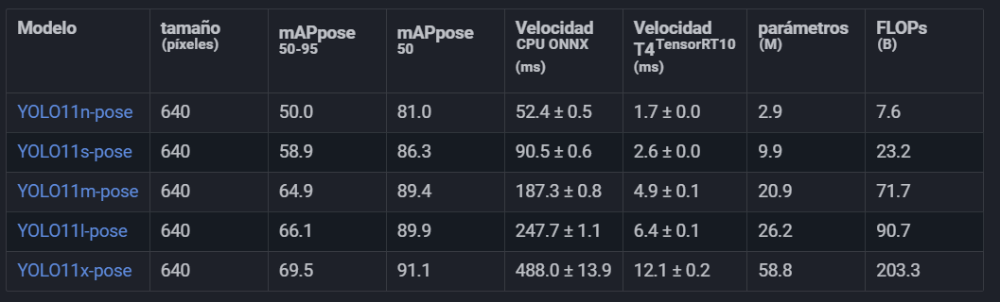

Fuente https://docs.ultralytics.com/es/tasks/pose/#models

El dataset COCO 2017 incluye anotaciones para la clase person en aproximadamente:

*   Train: 64,115 imágenes.
*   Val: 2,691 imágenes.



---



Se analizan las capas de la arquitectura del modelo, siendo las primeras 114 las del backbone, sobre un total de 343 capas.

In [ ]:
# # Cargar el modelo preentrenado
# model_k_640 = YOLO("yolo11n-pose.pt")
# # Listar las capas del modelo con un índice
# for i, layer in enumerate(model_k_640.model.modules()):
#     print(f"Capa {i}: {layer}")

Se utilizan distintas configuraciones de hiperparámetros, destacando los modelos entrenados más relevantes en la siguiente tabla.

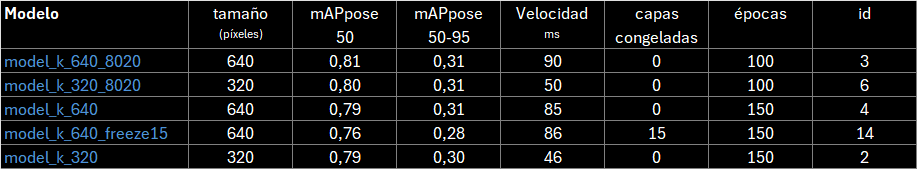

*   model_k_640_8020: se entrena en primer lugar el modelo respetando la configuración inicial planteada de 80% train y 20% val para 100 épocas. Sólo se agrega un tamaño de batch de 64 y early stopping con patience=15.

*   model_k_320_8020: se reduce el tamaño de iamgen de 640px a 320px, observando una mejor+ia en la velocidad de inferencia.

En ambos modelos se observa que el proceso de aprendizaje no se detiene para 100 épocas, por lo que se decide a continuación aumentar a 150 épocas el entrenamiento, esta vez para una separación de datos de 70% train, 20% val y 10% test.

*   model_k_640: se observa una ligera disminución en los valores de mAPpose50 y mAPpose50-95, en comparación con los modelos anteriores.

*   model_k_640_freeze15: difiere con el modelo anterior ya que se congelan las 15 primeras capas del backbone, con un empeoramiento en las métricas de evaluación.

*   model_k_320: se retoma desde el modelo model_k_640 pero reduciendo a 320px el tamaño de las imágenes, aumentando en casi un 50% la velocidad de inferencia.

En todos los modelos se observa que las métricas distan de las observadas para el modelo YOLO11n-pose entrenado para la estimación de pose humana, lo cual resulta esperable considerando que en nuestro caso se cuenta con un set de datos para entrenameiento de un orden menor.

Otra observación es que, de contar con los recursos necesarios, en todos los modelos se pueden mejorar las métricas aumentando el número de épocas, ya que en ningún caso hubo early stopping.

Se elige como modelo model_k_320, por su velocidad de inferencia (46ms) y dado que sus métricas son apenas menores que model_k_640. Además permite reservar un conjunto de test para evaluación final del modelo.

###6.1.model_k_640_8020

Modelo sin congelamiento de capas, tamaño de imagen de 640px y separación de datos 80% train y 20% validation (sin test).

In [ ]:
model_k_640_8020 = YOLO("yolo11n-pose.pt")
data_path = "./dog-pose.yaml"

# results = model_k_640_8020.train(
#     data=data_path,
#     epochs=100,
#     imgsz=640,
#     batch=64,
#     patience=15,
#     optimizer="Adam",
#     seed=42,
#     device=0,
#     cache=False
# )

In [ ]:
# Ruta del archivo comprimido subido
uploaded_zip_path = "./train3_backup.zip"

# Ruta para descomprimir
output_folder_path = "./runs/pose/train3"

# Descomprimir el archivo
shutil.unpack_archive(uploaded_zip_path, output_folder_path)

model_k_640_8020 = YOLO("./runs/pose/train3/weights/best.pt")

data3, latest_dir = load_training_results("train3")

Cargando resultados desde: runs/pose/train3/results.csv


####6.1.1.Evaluación del modelo

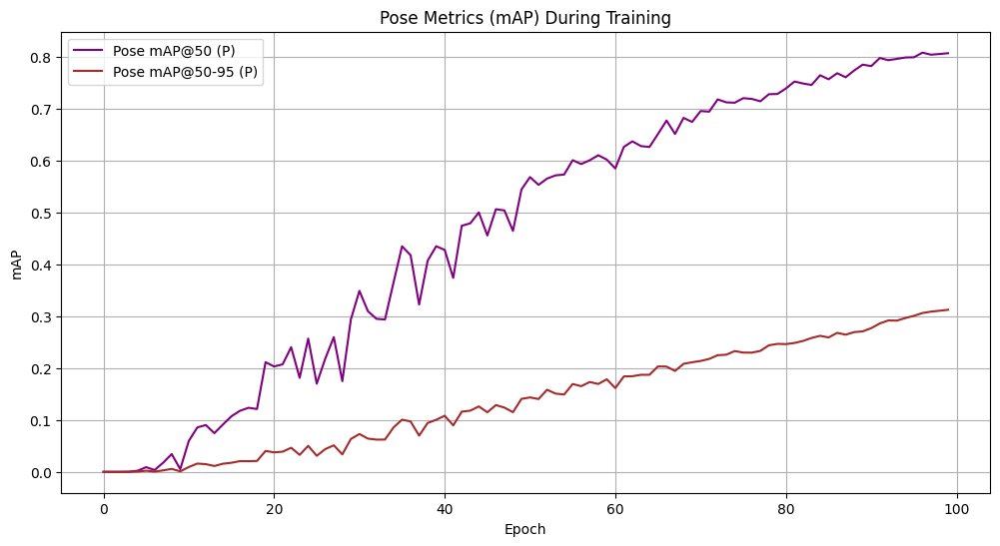


Mejor valor de Pose mAP@50 (P): 0.8087 en la época 97

Mejor valor de Pose mAP@50-95 (P): 0.3126 en la época 100

0: 480x640 1 dog, 98.5ms
Speed: 2.4ms preprocess, 98.5ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 640x640 1 dog, 82.2ms
Speed: 3.9ms preprocess, 82.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x480 1 dog, 107.1ms
Speed: 3.2ms preprocess, 107.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)

0: 640x448 1 dog, 88.3ms
Speed: 2.4ms preprocess, 88.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 448)

0: 640x448 1 dog, 67.0ms
Speed: 2.3ms preprocess, 67.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 448)

0: 640x416 1 dog, 97.9ms
Speed: 2.1ms preprocess, 97.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 416)

0: 640x416 1 dog, 59.2ms
Speed: 1.6ms preprocess, 59.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 416)

0: 480x640 1 dog, 65.5

89.80583190917969

In [ ]:
plot_pose_map_metrics(data3)
average_inference_time(model_k_640_8020,"./datasets/dog-pose/train/images",100)

####6.2.2.Inferencia de keypoints


0: 512x640 1 dog, 70.9ms
Speed: 2.1ms preprocess, 70.9ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 640)


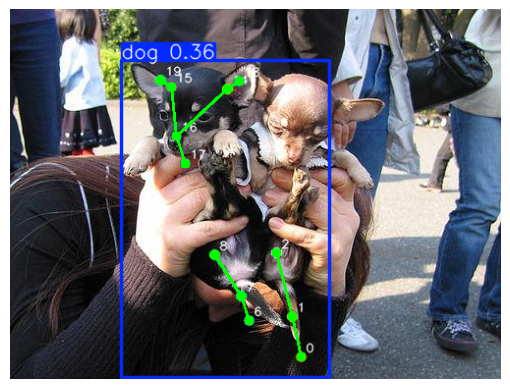

Keypoints detectados (x, y):
0: (x: 296.01, y: 354.29)
1: (x: 287.05, y: 313.66)
2: (x: 271.72, y: 248.72)
3: (x: 0.00, y: 0.00)
4: (x: 0.00, y: 0.00)
5: (x: 0.00, y: 0.00)
6: (x: 243.12, y: 317.84)
7: (x: 235.84, y: 292.70)
8: (x: 208.52, y: 250.01)
9: (x: 0.00, y: 0.00)
10: (x: 0.00, y: 0.00)
11: (x: 0.00, y: 0.00)
12: (x: 0.00, y: 0.00)
13: (x: 0.00, y: 0.00)
14: (x: 221.28, y: 81.82)
15: (x: 164.69, y: 79.17)
16: (x: 169.22, y: 129.85)
17: (x: 178.86, y: 157.11)
18: (x: 233.69, y: 73.11)
19: (x: 153.40, y: 72.64)
20: (x: 0.00, y: 0.00)
21: (x: 0.00, y: 0.00)
22: (x: 0.00, y: 0.00)
23: (x: 0.00, y: 0.00)


In [ ]:
predict_random_image(model_k_640_8020,"./datasets/dog-pose/test/images")

###6.2.model_k_320_8020

Modelo sin congelamiento de capas, tamaño de imagen de 320px y separación de datos 80% train y 20% validation (sin test).

In [ ]:
model_k_320_8020 = YOLO("yolo11n-pose.pt")
data_path = "./dog-pose.yaml"

# results = model_k_640_8020.train(
#     data=data_path,
#     epochs=100,
#     imgsz=320,
#     batch=64,
#     patience=15,
#     optimizer="Adam",
#     seed=42,
#     device=0,
#     cache=False
# )

In [ ]:
# Ruta del archivo comprimido subido
uploaded_zip_path = "./train6_backup.zip"

# Ruta para descomprimir
output_folder_path = "./runs/pose/train6"

# Descomprimir el archivo
shutil.unpack_archive(uploaded_zip_path, output_folder_path)

model_k_320_8020 = YOLO("./runs/pose/train6/weights/best.pt")

data6, latest_dir = load_training_results("train6")

Cargando resultados desde: runs/pose/train6/results.csv


####6.2.1.Evaluación del modelo

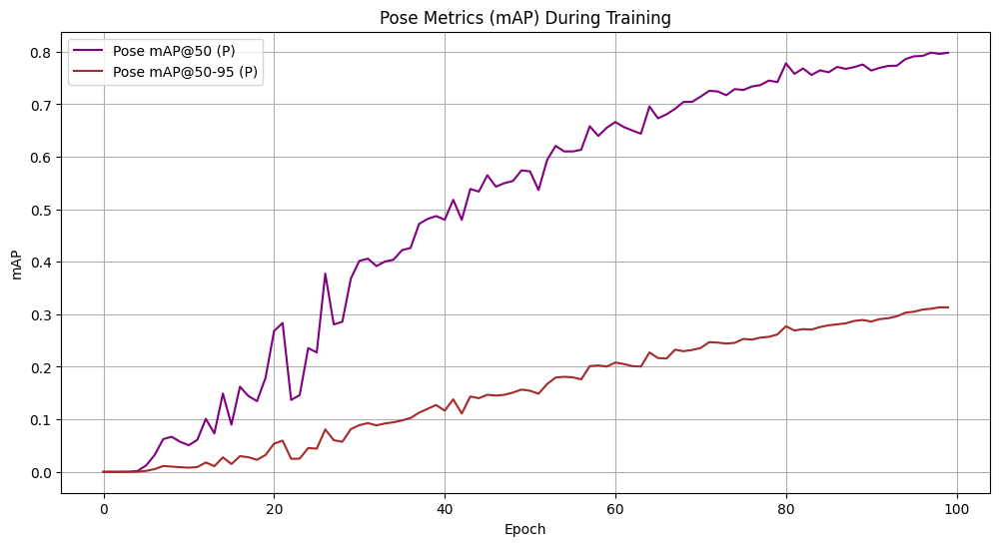


Mejor valor de Pose mAP@50 (P): 0.7982 en la época 98

Mejor valor de Pose mAP@50-95 (P): 0.3133 en la época 99

0: 320x320 1 dog, 80.5ms
Speed: 1.8ms preprocess, 80.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 54.8ms
Speed: 1.5ms preprocess, 54.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 50.7ms
Speed: 0.9ms preprocess, 50.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 34.4ms
Speed: 0.7ms preprocess, 34.4ms inference, 2.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 37.1ms
Speed: 1.1ms preprocess, 37.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 51.6ms
Speed: 1.0ms preprocess, 51.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 38.2ms
Speed: 0.8ms preprocess, 38.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 51.3ms


49.91445779800415

In [ ]:
plot_pose_map_metrics(data6)
average_inference_time(model_k_320_8020,"./datasets/dog-pose/train/images",100)

####6.2.2.Inferencia de keypoints


0: 512x640 1 dog, 70.9ms
Speed: 2.1ms preprocess, 70.9ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 640)


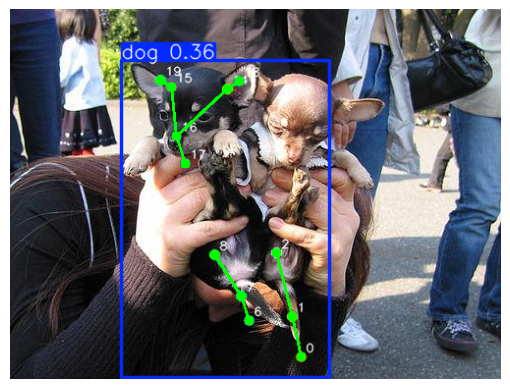

Keypoints detectados (x, y):
0: (x: 296.01, y: 354.29)
1: (x: 287.05, y: 313.66)
2: (x: 271.72, y: 248.72)
3: (x: 0.00, y: 0.00)
4: (x: 0.00, y: 0.00)
5: (x: 0.00, y: 0.00)
6: (x: 243.12, y: 317.84)
7: (x: 235.84, y: 292.70)
8: (x: 208.52, y: 250.01)
9: (x: 0.00, y: 0.00)
10: (x: 0.00, y: 0.00)
11: (x: 0.00, y: 0.00)
12: (x: 0.00, y: 0.00)
13: (x: 0.00, y: 0.00)
14: (x: 221.28, y: 81.82)
15: (x: 164.69, y: 79.17)
16: (x: 169.22, y: 129.85)
17: (x: 178.86, y: 157.11)
18: (x: 233.69, y: 73.11)
19: (x: 153.40, y: 72.64)
20: (x: 0.00, y: 0.00)
21: (x: 0.00, y: 0.00)
22: (x: 0.00, y: 0.00)
23: (x: 0.00, y: 0.00)


In [ ]:
predict_random_image(model_k_320_8020,"./datasets/dog-pose/test/images")

###6.3.model_k_640

Se entrena el modelo anterior, pero sin congelar capas.

In [ ]:
model_k_640 = YOLO("yolo11n-pose.pt")
data_path = "./dog-pose.yaml"

# results = model_k_640.train(
#     data=data_path,
#     epochs=150,
#     imgsz=640,
#     batch=64,
#     patience=15,
#     optimizer="Adam",
#     seed=42,
#     device=0,
#     cache=False
# )

In [ ]:
# Ruta del archivo comprimido subido
uploaded_zip_path = "./train4_backup.zip"

# Ruta para descomprimir
output_folder_path = "./runs/pose/train4"

# Descomprimir el archivo
shutil.unpack_archive(uploaded_zip_path, output_folder_path)

model_k_640 = YOLO("./runs/pose/train4/weights/best.pt")

data4, latest_dir = load_training_results("train4")

Cargando resultados desde: runs/pose/train4/results.csv


####6.3.1.Evaluación del modelo

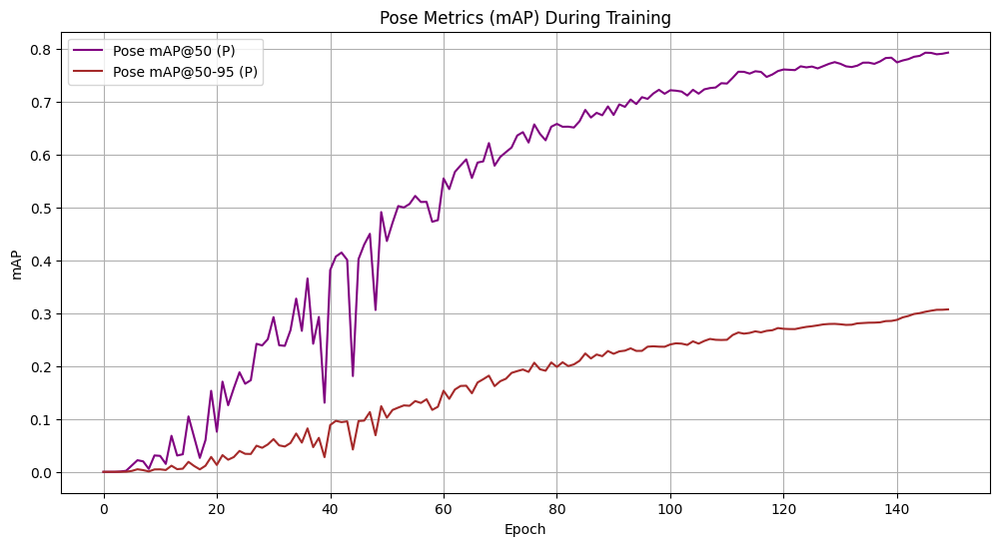


Mejor valor de Pose mAP@50 (P): 0.7931 en la época 150

Mejor valor de Pose mAP@50-95 (P): 0.3073 en la época 150

0: 480x640 1 dog, 81.9ms
Speed: 1.9ms preprocess, 81.9ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 640x448 1 dog, 79.4ms
Speed: 2.2ms preprocess, 79.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 448)

0: 640x480 1 dog, 65.1ms
Speed: 2.3ms preprocess, 65.1ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 480)

0: 480x640 1 dog, 74.6ms
Speed: 2.0ms preprocess, 74.6ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 448x640 1 dog, 71.6ms
Speed: 2.3ms preprocess, 71.6ms inference, 0.8ms postprocess per image at shape (1, 3, 448, 640)

0: 480x640 1 dog, 74.7ms
Speed: 2.9ms preprocess, 74.7ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 dogs, 77.5ms
Speed: 3.5ms preprocess, 77.5ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 dog, 87.5

84.87632036209106

In [ ]:
plot_pose_map_metrics(data4)
average_inference_time(model_k_640,"./datasets/dog-pose/train/images",100)

####6.3.2.Inferencia de keypoints


0: 640x448 1 dog, 61.7ms
Speed: 14.1ms preprocess, 61.7ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 448)


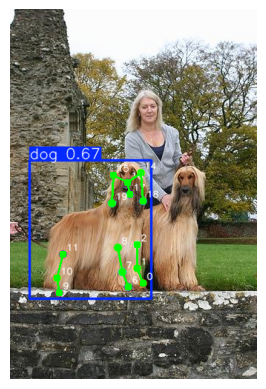

Keypoints detectados (x, y):
0: (x: 179.33, y: 370.45)
1: (x: 171.62, y: 350.94)
2: (x: 171.76, y: 318.68)
3: (x: 0.00, y: 0.00)
4: (x: 0.00, y: 0.00)
5: (x: 0.00, y: 0.00)
6: (x: 159.93, y: 375.99)
7: (x: 151.90, y: 355.99)
8: (x: 145.91, y: 322.47)
9: (x: 66.60, y: 383.20)
10: (x: 63.08, y: 363.99)
11: (x: 71.98, y: 331.34)
12: (x: 0.00, y: 0.00)
13: (x: 0.00, y: 0.00)
14: (x: 176.61, y: 221.50)
15: (x: 139.42, y: 224.19)
16: (x: 158.31, y: 234.14)
17: (x: 161.27, y: 250.55)
18: (x: 179.63, y: 259.80)
19: (x: 137.23, y: 262.92)
20: (x: 0.00, y: 0.00)
21: (x: 0.00, y: 0.00)
22: (x: 0.00, y: 0.00)
23: (x: 0.00, y: 0.00)


In [ ]:
predict_random_image(model_k_640,"./datasets/dog-pose/test/images")

###6.4.model_k_640_freeze15

In [ ]:
model_k_640_freeze15 = YOLO("yolo11n-pose.pt")

data_path = "./dog-pose.yaml"

# results = model_k_640_freeze15.train(
#     data=data_path,
#     epochs=150,
#     imgsz=640,
#     batch=64,
#     patience=15,
#     optimizer="Adam",
#     seed=42,
#     device=0,
#     cache=False,
#     freeze=15
# )

100%|██████████| 5.97M/5.97M [00:00<00:00, 17.6MB/s]


In [ ]:
# Ruta del archivo comprimido subido
uploaded_zip_path = "./train14_backup.zip"

# Ruta para descomprimir
output_folder_path = "./runs/pose/train14"

# Descomprimir el archivo
shutil.unpack_archive(uploaded_zip_path, output_folder_path)

model_k_640_freeze15 = YOLO("./runs/pose/train14/weights/best.pt")

data14, latest_dir = load_training_results("train14")

Cargando resultados desde: runs/pose/train14/results.csv


####6.4.1.Evaluación del modelo

Se evalúan las métricas mAP50Pose y mAP50-95Pose y el tiempo de inferencia, en ms, para las primeras 100 muestras del conjunto de train.

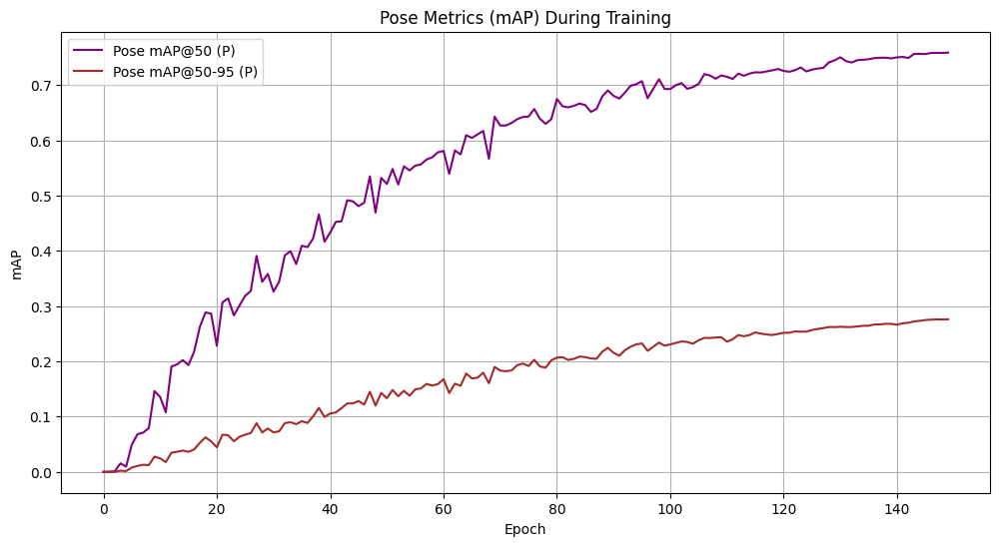


Mejor valor de Pose mAP@50 (P): 0.7587 en la época 150

Mejor valor de Pose mAP@50-95 (P): 0.2761 en la época 150

0: 384x640 1 dog, 78.5ms
Speed: 3.1ms preprocess, 78.5ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)

0: 480x640 1 dog, 60.3ms
Speed: 2.0ms preprocess, 60.3ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

0: 576x640 1 dog, 69.6ms
Speed: 2.4ms preprocess, 69.6ms inference, 0.9ms postprocess per image at shape (1, 3, 576, 640)

0: 576x640 1 dog, 70.3ms
Speed: 2.7ms preprocess, 70.3ms inference, 1.0ms postprocess per image at shape (1, 3, 576, 640)

0: 448x640 1 dog, 59.3ms
Speed: 1.9ms preprocess, 59.3ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

0: 480x640 1 dog, 73.0ms
Speed: 1.8ms preprocess, 73.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 640x544 1 dog, 98.6ms
Speed: 2.2ms preprocess, 98.6ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 544)

0: 480x640 1 dog, 89.1m

85.93608617782593

In [ ]:
plot_pose_map_metrics(data14)
# plot_training_validation_loss(data, title="Custom Loss Plot")
# plot_precision_recall(data, title="Custom Precision and Recall Plot")
average_inference_time(model_k_640_freeze15,"./datasets/dog-pose/train/images",100)

####6.4.2.Inferencia de keypoints

Se predice de forma aleatoria sobre el conjunto de datos de test, no vistos por el modelo durante el entrenamiento.


0: 512x640 1 dog, 75.1ms
Speed: 2.0ms preprocess, 75.1ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 640)


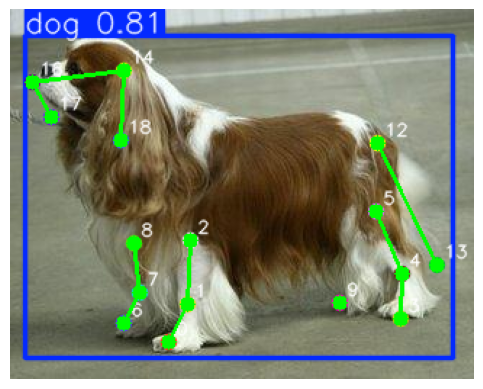

Keypoints detectados (x, y):
0: (x: 109.77, y: 229.06)
1: (x: 122.76, y: 203.55)
2: (x: 124.97, y: 159.02)
3: (x: 269.42, y: 213.02)
4: (x: 270.95, y: 182.91)
5: (x: 252.75, y: 139.27)
6: (x: 78.72, y: 216.88)
7: (x: 89.93, y: 195.30)
8: (x: 85.73, y: 161.23)
9: (x: 227.40, y: 202.25)
10: (x: 0.00, y: 0.00)
11: (x: 0.00, y: 0.00)
12: (x: 253.91, y: 92.09)
13: (x: 294.22, y: 176.13)
14: (x: 78.63, y: 42.07)
15: (x: 0.00, y: 0.00)
16: (x: 15.78, y: 50.20)
17: (x: 28.52, y: 74.78)
18: (x: 76.68, y: 90.77)
19: (x: 0.00, y: 0.00)
20: (x: 0.00, y: 0.00)
21: (x: 0.00, y: 0.00)
22: (x: 0.00, y: 0.00)
23: (x: 0.00, y: 0.00)


In [ ]:
predict_random_image(model_k_640_freeze15,"./datasets/dog-pose/test/images")

###6.5.model_k_320

Se entrena un nuevo modelo con menor resolución de imagen (imgsz=320), buscando mejorar el tiempo de inferencia.

In [ ]:
model_k_320 = YOLO("yolo11n-pose.pt")
data_path = "./dog-pose.yaml"

# results = model_k_320.train(
#     data=data_path,
#     epochs=150,
#     imgsz=320,
#     batch=64,
#     patience=15,
#     optimizer="Adam",
#     seed=42,
#     device=0,
#     cache=False
# )

In [ ]:
# Ruta del archivo comprimido subido
uploaded_zip_path = "./train2_backup.zip"

# Ruta para descomprimir
output_folder_path = "./runs/pose/train2"

# Descomprimir el archivo
shutil.unpack_archive(uploaded_zip_path, output_folder_path)

model_k_320 = YOLO("./runs/pose/train2/weights/best.pt")

data2, latest_dir = load_training_results("train2")

Cargando resultados desde: runs/pose/train2/results.csv


####6.5.1.Evaluación del modelo

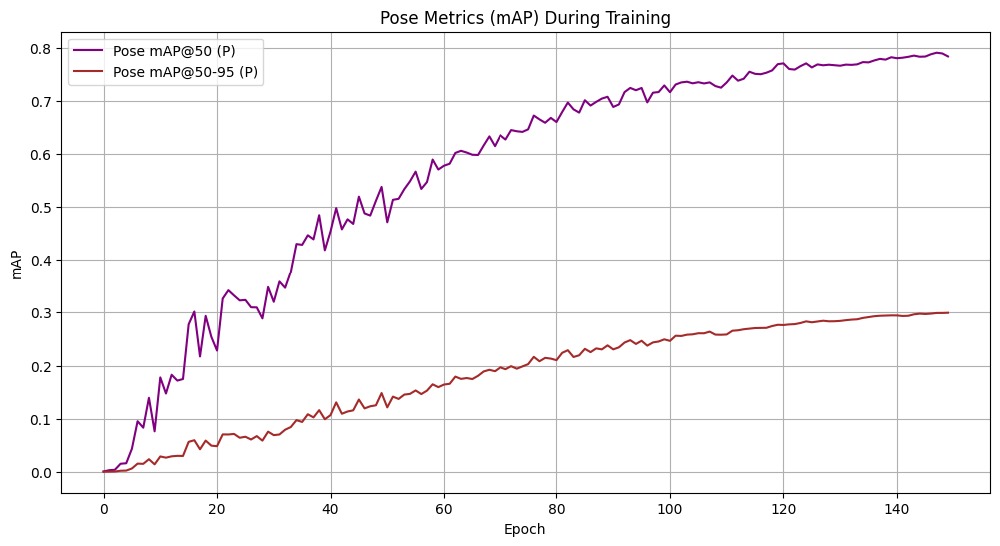


Mejor valor de Pose mAP@50 (P): 0.7906 en la época 148

Mejor valor de Pose mAP@50-95 (P): 0.2994 en la época 150

0: 320x320 2 dogs, 43.7ms
Speed: 1.2ms preprocess, 43.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 37.1ms
Speed: 1.3ms preprocess, 37.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 36.2ms
Speed: 1.4ms preprocess, 36.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 36.2ms
Speed: 1.2ms preprocess, 36.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x256 1 dog, 35.2ms
Speed: 0.8ms preprocess, 35.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 37.9ms
Speed: 0.6ms preprocess, 37.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 38.8ms
Speed: 0.9ms preprocess, 38.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x224 1 dog, 35.8

46.17987394332886

In [ ]:
plot_pose_map_metrics(data2)
average_inference_time(model_k_320,"./datasets/dog-pose/train/images",100)

####6.5.2.Inferencia de keypoints


0: 320x288 1 dog, 69.0ms
Speed: 1.4ms preprocess, 69.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


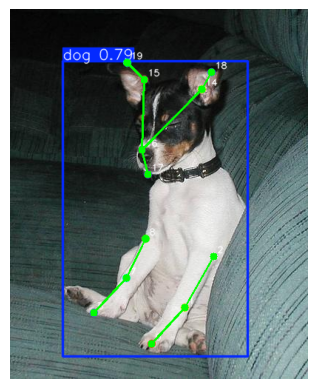

Keypoints detectados (x, y):
0: (x: 191.74, y: 452.59)
1: (x: 236.29, y: 403.58)
2: (x: 275.49, y: 334.73)
3: (x: 0.00, y: 0.00)
4: (x: 0.00, y: 0.00)
5: (x: 0.00, y: 0.00)
6: (x: 113.71, y: 410.30)
7: (x: 157.52, y: 363.96)
8: (x: 183.89, y: 310.21)
9: (x: 0.00, y: 0.00)
10: (x: 0.00, y: 0.00)
11: (x: 0.00, y: 0.00)
12: (x: 0.00, y: 0.00)
13: (x: 0.00, y: 0.00)
14: (x: 259.20, y: 108.85)
15: (x: 181.48, y: 95.04)
16: (x: 178.60, y: 190.03)
17: (x: 186.42, y: 223.23)
18: (x: 272.16, y: 85.12)
19: (x: 158.14, y: 72.58)
20: (x: 0.00, y: 0.00)
21: (x: 0.00, y: 0.00)
22: (x: 0.00, y: 0.00)
23: (x: 0.00, y: 0.00)


In [ ]:
predict_random_image(model_k_320,"./datasets/dog-pose/test/images")

###6.6.Elección de model_k

Como se planteó al inicio del punto 6, se elige como mejor modelo model_k_320..

In [ ]:
# Se establece model_k=model_k_320
model_k = model_k_320

Se calculan los valores finales de mAP50(P) y mAP50-95(P) para el conjunto de test:

*   mAP50(P)= 0.68
*    mAP50-95(P): 0.22

Los valores obtenidos son inferiores a los de validation, indicando un sobreajuste del modelo.



In [ ]:
# Run validation on a set specified as 'val' argument
metrics = model_k_320.val(data='test_evaluate.yaml')

Ultralytics 8.3.49 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (AMD EPYC 7B12)


val: Scanning /content/CV-TUIA-Garcia/datasets/dog-pose/test/labels.cache... 850 images, 0 backgrounds, 0 corrupt: 100%|██████████| 850/850 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:15<00:00,  3.49it/s]


                   all        850        850       0.92      0.955      0.979      0.834      0.758      0.716      0.684      0.221
Speed: 0.1ms preprocess, 14.0ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to runs/pose/val2


In [ ]:
metrics.results_dict

{'metrics/precision(B)': 0.9195900238119893,
 'metrics/recall(B)': 0.9552647569995051,
 'metrics/mAP50(B)': 0.9785613429488458,
 'metrics/mAP50-95(B)': 0.8338428165238513,
 'metrics/precision(P)': 0.7576821056864952,
 'metrics/recall(P)': 0.7164705882352941,
 'metrics/mAP50(P)': 0.6838611545047134,
 'metrics/mAP50-95(P)': 0.22118139372337367,
 'fitness': 1.1157640389678585}

##7.Etiquetado de clases de pose

Se realiza un primer etiquetado para las imágenes de la carpetas train y test para las clases "Parado", "Sentado", "Tumbado" y "Otro". Esta última clase no formará parte del dataset de entrenamiento de pose.

Las etiquetas son almacenadas en dos archivos json donde figura el nombre de la imagen junto con su clase.

Etiquetado para el conjunto de train:

Imágenes etiquetadas: 882 / 5923

0: 320x320 1 dog, 42.4ms
Speed: 6.5ms preprocess, 42.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


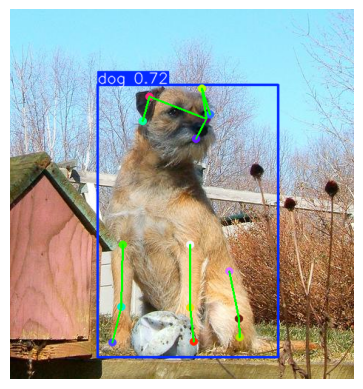

RadioButtons(description='Etiqueta:', options=('Parado', 'Sentado', 'Tumbado', 'Otro'), value='Parado')

Button(description='Guardar Etiqueta', style=ButtonStyle())

In [ ]:
# Ruta del dataset
images_path = "./datasets/dog-pose/train/images"

output_labels = {}
if os.path.exists('labels_train.json'):
    with open('labels_train.json', 'r') as f:
        output_labels = json.load(f)

# Crear una lista de imágenes
image_files = [f for f in os.listdir(images_path) if f.endswith(('.jpg', '.png'))]

# Obtener el índice inicial basado en imágenes etiquetadas
current_index = len(output_labels)

# Obtener el índice inicial basado en imágenes ya etiquetadas
labeled_images = set(output_labels.keys())
current_index = 0
for i, img_name in enumerate(image_files):
    if img_name not in labeled_images:
        current_index = i
        break

# Iniciar etiquetado desde el índice actual
label_current_image_with_keypoints(model_k,images_path)

In [ ]:
# # Guardar etiquetas en un archivo JSON
# with open("labels_train.json", "w") as f:
#     json.dump(output_labels, f)

# # Imprimir el largo del JSON (cantidad de elementos)
# print("Etiquetas guardadas en labels_train.json")
# print(f"Largo del JSON: {len(output_labels)}")

# Contar la frecuencia de cada clase directamente sobre output_labels
class_counts = Counter(output_labels.values())

# Imprimir el conteo de valores por clase
print("Conteo de valores por clase:")
for label, count in class_counts.items():
    print(f"{label}: {count}")

Conteo de valores por clase:
Tumbado: 86
Parado: 339
Otro: 335
Sentado: 122


Se observa un desbalance entre las clases entrenables, por lo que se hace aumentación de datos para balancear las mismas.

Etiquetado para el conjunto de train:

Imágenes etiquetadas: 191 / 850

0: 224x320 1 dog, 49.4ms
Speed: 2.3ms preprocess, 49.4ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


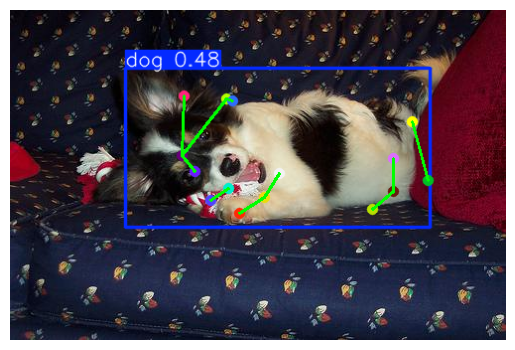

RadioButtons(description='Etiqueta:', options=('Parado', 'Sentado', 'Tumbado', 'Otro'), value='Parado')

Button(description='Guardar Etiqueta', style=ButtonStyle())

In [ ]:
# Ruta del dataset
images_path = "./datasets/dog-pose/test/images"

output_labels = {}
if os.path.exists('labels_test.json'):
    with open('labels_test.json', 'r') as f:
        output_labels = json.load(f)

# Crear una lista de imágenes
image_files = [f for f in os.listdir(images_path) if f.endswith(('.jpg', '.png'))]

# Obtener el índice inicial basado en imágenes etiquetadas
current_index = len(output_labels)

# Obtener el índice inicial basado en imágenes ya etiquetadas
labeled_images = set(output_labels.keys())
current_index = 0
for i, img_name in enumerate(image_files):
    if img_name not in labeled_images:
        current_index = i
        break

# Iniciar etiquetado desde el índice actual
label_current_image_with_keypoints(model_k,images_path)

In [ ]:
# Guardar etiquetas en un archivo JSON
with open("labels_test.json", "w") as f:
    json.dump(output_labels, f)

# Imprimir el largo del JSON (cantidad de elementos)
print("Etiquetas guardadas en labels_test.json")
print(f"Largo del JSON: {len(output_labels)}")

# Contar la frecuencia de cada clase directamente sobre output_labels
class_counts = Counter(output_labels.values())

# Imprimir el conteo de valores por clase
print("Conteo de valores por clase:")
for label, count in class_counts.items():
    print(f"{label}: {count}")

Etiquetas guardadas en labels_test.json
Largo del JSON: 191
Conteo de valores por clase:
Otro: 92
Sentado: 23
Tumbado: 19
Parado: 57


##8.Armado del dataset para clasificación de pose

Con la función **keypoints_to_labels_with_balance** se crean los archivos keypoints_labels_train.npy y keypoints_labels_test.npy para asociar los keypoints con las clases de las imágenes que fueron etiquetadas en el punto anterior.

El desbalance entre clases anteriormente mencionado es corregido mediante operaciones de aumentación aleatorias (espejado, desplazado, giro y escalado) para generar tantas muestras como la cantidad de la clase mayoritaria.

Se observa que para todas las muestras los keypoints del 20 al 23 tienen coordenadas nulas, por lo que se decide eliminarlas.

In [ ]:
labels_file = 'labels_train.json'
# Cargar etiquetas desde el archivo JSON
if os.path.exists(labels_file):
    with open(labels_file, 'r') as f:
        labels_data = json.load(f)
else:
    raise FileNotFoundError(f"El archivo {labels_file} no existe.")

In [ ]:
# Lista de índices de keypoints que deseas usar
keypoints_list = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]

In [ ]:
keypoints_to_labels_with_balance(
    model=model_k,
    images_path="./datasets/dog-pose/train/images",
    labels_data=labels_data,
    output_file="keypoints_labels_train.npy",
    balance_option=2,
    keypoints_list=keypoints_list
)

Procesando imágenes:   0%|          | 0/882 [00:00<?, ?imagen/s]


0: 256x320 1 dog, 39.1ms
Speed: 1.2ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 33.8ms
Speed: 0.8ms preprocess, 33.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02110185_5624.jpg. Omitiendo.

0: 320x288 1 dog, 44.7ms
Speed: 1.4ms preprocess, 44.7ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:   0%|          | 4/882 [00:00<00:31, 27.69imagen/s]


0: 288x320 1 dog, 37.5ms
Speed: 1.5ms preprocess, 37.5ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)
Etiqueta 'Otro' no válida para la imagen n02086079_1020.jpg. Omitiendo.

0: 256x320 1 dog, 39.4ms
Speed: 1.0ms preprocess, 39.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 34.5ms
Speed: 0.9ms preprocess, 34.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   1%|          | 8/882 [00:00<00:30, 28.47imagen/s]


0: 256x320 1 dog, 33.6ms
Speed: 0.6ms preprocess, 33.6ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02091032_12013.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091134_11775.jpg. Omitiendo.
La imagen n02085936_3470.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 34.0ms
Speed: 1.5ms preprocess, 34.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02094433_2114.jpg. Omitiendo.

0: 256x320 1 dog, 34.1ms
Speed: 0.8ms preprocess, 34.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   2%|▏         | 15/882 [00:00<00:21, 40.09imagen/s]


0: 320x224 1 dog, 39.2ms
Speed: 1.1ms preprocess, 39.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 288x320 1 dog, 37.5ms
Speed: 0.6ms preprocess, 37.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x256 2 dogs, 35.3ms
Speed: 0.7ms preprocess, 35.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 33.2ms
Speed: 0.8ms preprocess, 33.2ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 34.3ms
Speed: 0.7ms preprocess, 34.3ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   2%|▏         | 20/882 [00:00<00:27, 31.33imagen/s]

Etiqueta 'Otro' no válida para la imagen n02106662_2358.jpg. Omitiendo.

0: 256x320 1 dog, 33.3ms
Speed: 1.4ms preprocess, 33.3ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 33.9ms
Speed: 0.6ms preprocess, 33.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 37.4ms
Speed: 0.7ms preprocess, 37.4ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   3%|▎         | 24/882 [00:00<00:27, 31.34imagen/s]

La imagen n02085782_2914.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 40.1ms
Speed: 0.9ms preprocess, 40.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 43.3ms
Speed: 1.6ms preprocess, 43.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 37.3ms
Speed: 2.5ms preprocess, 37.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   3%|▎         | 28/882 [00:00<00:28, 29.74imagen/s]


0: 192x320 1 dog, 32.0ms
Speed: 0.9ms preprocess, 32.0ms inference, 0.8ms postprocess per image at shape (1, 3, 192, 320)

0: 224x320 1 dog, 34.2ms
Speed: 0.6ms preprocess, 34.2ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 35.1ms
Speed: 0.7ms preprocess, 35.1ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   4%|▎         | 32/882 [00:01<00:28, 30.33imagen/s]

Etiqueta 'Otro' no válida para la imagen n02088238_13373.jpg. Omitiendo.

0: 320x288 1 dog, 36.4ms
Speed: 0.9ms preprocess, 36.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)

0: 320x256 1 dog, 33.8ms
Speed: 2.0ms preprocess, 33.8ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 33.9ms
Speed: 2.8ms preprocess, 33.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 36.0ms
Speed: 1.2ms preprocess, 36.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:   4%|▍         | 36/882 [00:01<00:30, 27.48imagen/s]

La imagen n02086240_6322.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 34.5ms
Speed: 1.5ms preprocess, 34.5ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02106662_620.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02109047_11178.jpg. Omitiendo.

0: 256x320 1 dog, 32.2ms
Speed: 0.7ms preprocess, 32.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02108551_13756.jpg. Omitiendo.

0: 320x288 1 dog, 34.6ms
Speed: 0.6ms preprocess, 34.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:   5%|▍         | 43/882 [00:01<00:23, 35.30imagen/s]

Etiqueta 'Otro' no válida para la imagen n02102318_10595.jpg. Omitiendo.

0: 320x224 1 dog, 30.6ms
Speed: 1.4ms preprocess, 30.6ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)

0: 224x320 1 dog, 33.9ms
Speed: 0.6ms preprocess, 33.9ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 45.1ms
Speed: 0.9ms preprocess, 45.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:   5%|▌         | 47/882 [00:01<00:24, 33.76imagen/s]

La imagen n02086240_4127.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 44.1ms
Speed: 1.5ms preprocess, 44.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 35.3ms
Speed: 0.9ms preprocess, 35.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02088094_5326.jpg. Omitiendo.

0: 256x320 1 dog, 36.7ms
Speed: 0.8ms preprocess, 36.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   6%|▌         | 52/882 [00:01<00:24, 34.40imagen/s]


0: 256x320 1 dog, 54.9ms
Speed: 1.2ms preprocess, 54.9ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02088364_10575.jpg. Omitiendo.

0: 320x288 1 dog, 38.1ms
Speed: 2.3ms preprocess, 38.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 320x224 1 dog, 34.0ms
Speed: 1.8ms preprocess, 34.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:   6%|▋         | 56/882 [00:01<00:26, 31.34imagen/s]

Etiqueta 'Otro' no válida para la imagen n02091032_9980.jpg. Omitiendo.

0: 224x320 1 dog, 34.4ms
Speed: 1.1ms preprocess, 34.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
La imagen n02088094_3080.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02096585_11180.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02088466_6096.jpg. Omitiendo.

0: 288x320 1 dog, 49.3ms
Speed: 1.4ms preprocess, 49.3ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:   7%|▋         | 62/882 [00:01<00:21, 37.50imagen/s]

Etiqueta 'Otro' no válida para la imagen n02110063_11585.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02107908_5312.jpg. Omitiendo.

0: 320x224 1 dog, 35.2ms
Speed: 1.0ms preprocess, 35.2ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)

0: 288x320 1 dog, 37.1ms
Speed: 1.4ms preprocess, 37.1ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 35.5ms
Speed: 2.5ms preprocess, 35.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:   8%|▊         | 67/882 [00:02<00:22, 36.73imagen/s]

Etiqueta 'Otro' no válida para la imagen n02088238_10932.jpg. Omitiendo.
La imagen n02085782_2655.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02102480_6514.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02093428_2461.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02108915_3202.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02096051_8132.jpg. Omitiendo.

0: 256x320 1 dog, 37.4ms
Speed: 1.1ms preprocess, 37.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 35.1ms
Speed: 0.9ms preprocess, 35.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02089867_1240.jpg. Omitiendo.

0: 320x320 1 dog, 39.9ms
Speed: 1.6ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:   9%|▊         | 77/882 [00:02<00:17, 47.15imagen/s]


0: 256x320 1 dog, 34.7ms
Speed: 2.2ms preprocess, 34.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 36.3ms
Speed: 0.9ms preprocess, 36.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 33.9ms
Speed: 1.8ms preprocess, 33.9ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:   9%|▉         | 82/882 [00:02<00:18, 44.32imagen/s]

Etiqueta 'Otro' no válida para la imagen n02110958_15014.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02099429_121.jpg. Omitiendo.

0: 224x320 1 dog, 34.1ms
Speed: 1.0ms preprocess, 34.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 37.3ms
Speed: 0.7ms preprocess, 37.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 32.0ms
Speed: 0.7ms preprocess, 32.0ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 34.5ms
Speed: 0.8ms preprocess, 34.5ms inference, 2.6ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  10%|▉         | 87/882 [00:02<00:20, 39.08imagen/s]

Etiqueta 'Otro' no válida para la imagen n02096294_1850.jpg. Omitiendo.

0: 256x320 1 dog, 36.0ms
Speed: 1.2ms preprocess, 36.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 40.4ms
Speed: 1.0ms preprocess, 40.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02087046_6857.jpg. Omitiendo.

0: 256x320 1 dog, 48.0ms
Speed: 1.5ms preprocess, 48.0ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  10%|█         | 92/882 [00:02<00:21, 36.96imagen/s]

Etiqueta 'Otro' no válida para la imagen n02102318_9307.jpg. Omitiendo.

0: 320x320 1 dog, 50.3ms
Speed: 1.8ms preprocess, 50.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02089973_2.jpg. Omitiendo.

0: 256x320 1 dog, 55.5ms
Speed: 1.2ms preprocess, 55.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 57.8ms
Speed: 1.2ms preprocess, 57.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  11%|█         | 96/882 [00:02<00:25, 31.21imagen/s]

Etiqueta 'Otro' no válida para la imagen n02096177_4768.jpg. Omitiendo.

0: 256x320 1 dog, 49.6ms
Speed: 7.8ms preprocess, 49.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02107908_5767.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02088632_4686.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02104365_6930.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02096177_4734.jpg. Omitiendo.

0: 320x256 1 dog, 37.7ms
Speed: 1.8ms preprocess, 37.7ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  12%|█▏        | 103/882 [00:02<00:20, 38.23imagen/s]


0: 224x320 1 dog, 43.9ms
Speed: 1.4ms preprocess, 43.9ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 320x256 1 dog, 35.9ms
Speed: 0.9ms preprocess, 35.9ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 320x288 1 dog, 38.4ms
Speed: 1.8ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 320x224 1 dog, 34.6ms
Speed: 3.1ms preprocess, 34.6ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  12%|█▏        | 108/882 [00:03<00:22, 34.12imagen/s]

Etiqueta 'Otro' no válida para la imagen n02088364_13630.jpg. Omitiendo.

0: 256x320 1 dog, 32.8ms
Speed: 1.6ms preprocess, 32.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02105162_6625.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02094433_8669.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02107142_1694.jpg. Omitiendo.

0: 224x320 1 dog, 56.4ms
Speed: 2.5ms preprocess, 56.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  13%|█▎        | 113/882 [00:03<00:20, 36.81imagen/s]


0: 320x224 1 dog, 33.9ms
Speed: 3.4ms preprocess, 33.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 320x224 1 dog, 38.7ms
Speed: 2.1ms preprocess, 38.7ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 224)
Etiqueta 'Otro' no válida para la imagen n02104365_6199.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02088238_9778.jpg. Omitiendo.

0: 320x256 1 dog, 40.2ms
Speed: 1.0ms preprocess, 40.2ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  13%|█▎        | 118/882 [00:03<00:21, 36.36imagen/s]


0: 256x320 1 dog, 37.7ms
Speed: 1.9ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 40.1ms
Speed: 1.9ms preprocess, 40.1ms inference, 1.9ms postprocess per image at shape (1, 3, 320, 256)

0: 288x320 1 dog, 45.6ms
Speed: 1.8ms preprocess, 45.6ms inference, 3.1ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  14%|█▍        | 122/882 [00:03<00:22, 33.09imagen/s]

Etiqueta 'Otro' no válida para la imagen n02098413_342.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085936_3451.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02088466_10904.jpg. Omitiendo.

0: 320x256 1 dog, 38.1ms
Speed: 1.9ms preprocess, 38.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02087046_1468.jpg. Omitiendo.
La imagen n02086910_3136.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 45.4ms
Speed: 2.3ms preprocess, 45.4ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  15%|█▍        | 128/882 [00:03<00:19, 38.63imagen/s]


0: 224x320 1 dog, 41.1ms
Speed: 2.9ms preprocess, 41.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 39.6ms
Speed: 2.4ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  15%|█▌        | 133/882 [00:03<00:18, 41.23imagen/s]

Etiqueta 'Otro' no válida para la imagen n02086240_6898.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02100236_3215.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02102177_4292.jpg. Omitiendo.

0: 256x320 1 dog, 40.1ms
Speed: 3.2ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 46.7ms
Speed: 2.4ms preprocess, 46.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02086240_10785.jpg. Omitiendo.

0: 288x320 1 dog, 54.5ms
Speed: 3.3ms preprocess, 54.5ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 192x320 1 dog, 31.2ms
Speed: 1.3ms preprocess, 31.2ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)


Procesando imágenes:  16%|█▌        | 138/882 [00:03<00:22, 32.96imagen/s]

Etiqueta 'Otro' no válida para la imagen n02105056_2836.jpg. Omitiendo.

0: 320x256 1 dog, 36.6ms
Speed: 9.2ms preprocess, 36.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02107574_2100.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085620_11337.jpg. Omitiendo.

0: 256x320 1 dog, 33.3ms
Speed: 1.1ms preprocess, 33.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02090379_1736.jpg. Omitiendo.

0: 320x256 1 dog, 34.0ms
Speed: 1.3ms preprocess, 34.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  16%|█▋        | 145/882 [00:04<00:19, 37.77imagen/s]

Etiqueta 'Otro' no válida para la imagen n02088238_11849.jpg. Omitiendo.

0: 288x320 1 dog, 36.4ms
Speed: 1.6ms preprocess, 36.4ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)
Etiqueta 'Otro' no válida para la imagen n02102040_171.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02087394_8742.jpg. Omitiendo.

0: 256x320 1 dog, 39.1ms
Speed: 1.2ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 46.4ms
Speed: 1.0ms preprocess, 46.4ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  17%|█▋        | 151/882 [00:04<00:18, 38.72imagen/s]

La imagen n02087046_7365.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen n02086240_1856.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02111500_7483.jpg. Omitiendo.

0: 256x320 1 dog, 38.2ms
Speed: 5.4ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02109961_12118.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02110185_6105.jpg. Omitiendo.

0: 256x320 1 dog, 34.4ms
Speed: 1.3ms preprocess, 34.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02086079_4412.jpg. Omitiendo.

0: 320x288 1 dog, 40.7ms
Speed: 1.8ms preprocess, 40.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  18%|█▊        | 160/882 [00:04<00:15, 45.53imagen/s]


0: 256x320 1 dog, 42.9ms
Speed: 2.1ms preprocess, 42.9ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02109525_9872.jpg. Omitiendo.
La imagen n02086079_21987.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 43.5ms
Speed: 14.9ms preprocess, 43.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 192x320 1 dog, 35.1ms
Speed: 1.2ms preprocess, 35.1ms inference, 1.0ms postprocess per image at shape (1, 3, 192, 320)


Procesando imágenes:  19%|█▊        | 165/882 [00:04<00:17, 40.87imagen/s]


0: 256x320 1 dog, 36.7ms
Speed: 1.8ms preprocess, 36.7ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 37.8ms
Speed: 0.8ms preprocess, 37.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 36.7ms
Speed: 1.2ms preprocess, 36.7ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 35.3ms
Speed: 1.3ms preprocess, 35.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 40.1ms
Speed: 1.2ms preprocess, 40.1ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  19%|█▉        | 170/882 [00:04<00:21, 33.30imagen/s]

Etiqueta 'Otro' no válida para la imagen n02098105_2458.jpg. Omitiendo.

0: 320x256 1 dog, 36.1ms
Speed: 0.9ms preprocess, 36.1ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 320x320 1 dog, 41.8ms
Speed: 0.7ms preprocess, 41.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x256 1 dog, 36.8ms
Speed: 1.3ms preprocess, 36.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  20%|█▉        | 174/882 [00:04<00:22, 32.08imagen/s]


0: 256x320 1 dog, 33.0ms
Speed: 0.9ms preprocess, 33.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 34.6ms
Speed: 0.7ms preprocess, 34.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 33.0ms
Speed: 0.7ms preprocess, 33.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 31.0ms
Speed: 1.6ms preprocess, 31.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  20%|██        | 178/882 [00:05<00:23, 30.00imagen/s]

Etiqueta 'Otro' no válida para la imagen n02096585_670.jpg. Omitiendo.

0: 320x256 1 dog, 30.0ms
Speed: 0.8ms preprocess, 30.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 320x256 1 dog, 29.5ms
Speed: 0.7ms preprocess, 29.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02086646_2355.jpg. Omitiendo.
La imagen n02088094_1724.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02100735_5876.jpg. Omitiendo.
La imagen n02085936_3326.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02108915_3527.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02087046_4127.jpg. Omitiendo.
La imagen n02088094_5355.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen n02086910_4488.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091244_3075.jpg. Omitiendo.

Procesando imágenes:  22%|██▏       | 192/882 [00:05<00:13, 50.82imagen/s]


0: 256x320 1 dog, 29.8ms
Speed: 1.3ms preprocess, 29.8ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 32.0ms
Speed: 0.8ms preprocess, 32.0ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02108000_1798.jpg. Omitiendo.

0: 288x320 1 dog, 37.8ms
Speed: 0.7ms preprocess, 37.8ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 33.9ms
Speed: 0.7ms preprocess, 33.9ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  22%|██▏       | 198/882 [00:05<00:14, 46.21imagen/s]

Etiqueta 'Otro' no válida para la imagen n02107312_1316.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02105162_9995.jpg. Omitiendo.

0: 320x224 1 dog, 34.7ms
Speed: 0.9ms preprocess, 34.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 34.2ms
Speed: 1.3ms preprocess, 34.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 38.4ms
Speed: 1.4ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 36.4ms
Speed: 0.8ms preprocess, 36.4ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  23%|██▎       | 204/882 [00:05<00:16, 42.25imagen/s]

La imagen n02087394_1964.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 36.7ms
Speed: 1.2ms preprocess, 36.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02100583_6266.jpg. Omitiendo.

0: 320x192 1 dog, 34.9ms
Speed: 2.2ms preprocess, 34.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 192)
Etiqueta 'Otro' no válida para la imagen n02102040_3993.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02110806_6035.jpg. Omitiendo.

0: 320x256 1 dog, 52.1ms
Speed: 1.1ms preprocess, 52.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  24%|██▍       | 210/882 [00:05<00:16, 41.46imagen/s]


0: 256x320 1 dog, 42.9ms
Speed: 1.8ms preprocess, 42.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 33.9ms
Speed: 2.3ms preprocess, 33.9ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 53.3ms
Speed: 1.3ms preprocess, 53.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
Etiqueta 'Otro' no válida para la imagen n02100583_3263.jpg. Omitiendo.

0: 256x320 1 dog, 42.2ms
Speed: 2.2ms preprocess, 42.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  24%|██▍       | 215/882 [00:05<00:19, 34.81imagen/s]

Etiqueta 'Otro' no válida para la imagen n02095314_1894.jpg. Omitiendo.

0: 320x256 1 dog, 36.1ms
Speed: 1.0ms preprocess, 36.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 320x320 1 dog, 39.7ms
Speed: 2.4ms preprocess, 39.7ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 320)

0: 288x320 1 dog, 39.1ms
Speed: 0.8ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  25%|██▍       | 219/882 [00:06<00:19, 33.16imagen/s]


0: 320x224 1 dog, 34.4ms
Speed: 2.1ms preprocess, 34.4ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 33.7ms
Speed: 0.7ms preprocess, 33.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 35.9ms
Speed: 1.1ms preprocess, 35.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 40.9ms
Speed: 0.7ms preprocess, 40.9ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  25%|██▌       | 223/882 [00:06<00:22, 29.93imagen/s]


0: 256x320 1 dog, 34.1ms
Speed: 1.1ms preprocess, 34.1ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02090721_1981.jpg. Omitiendo.

0: 256x320 1 dog, 33.1ms
Speed: 0.6ms preprocess, 33.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02092002_6702.jpg. Omitiendo.

0: 224x320 1 dog, 31.1ms
Speed: 0.6ms preprocess, 31.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  26%|██▌       | 228/882 [00:06<00:19, 32.71imagen/s]


0: 256x320 1 dog, 32.8ms
Speed: 0.9ms preprocess, 32.8ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02093754_1256.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02097209_746.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091831_10576.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02093647_722.jpg. Omitiendo.
La imagen n02088094_12879.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02088094_11182.jpg. Omitiendo.

0: 320x320 1 dog, 43.0ms
Speed: 0.8ms preprocess, 43.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x224 1 dog, 39.7ms
Speed: 0.7ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  27%|██▋       | 237/882 [00:06<00:15, 41.66imagen/s]


0: 256x320 1 dog, 32.3ms
Speed: 1.1ms preprocess, 32.3ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 37.2ms
Speed: 1.6ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x256 1 dog, 43.9ms
Speed: 0.8ms preprocess, 43.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 40.8ms
Speed: 1.2ms preprocess, 40.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  27%|██▋       | 242/882 [00:06<00:17, 36.43imagen/s]

La imagen n02088094_1410.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 44.0ms
Speed: 3.1ms preprocess, 44.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 50.9ms
Speed: 1.2ms preprocess, 50.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  28%|██▊       | 246/882 [00:06<00:17, 35.91imagen/s]

Etiqueta 'Otro' no válida para la imagen n02105855_17401.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02104365_5781.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02094258_752.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02107312_3603.jpg. Omitiendo.

0: 320x320 1 dog, 41.8ms
Speed: 1.8ms preprocess, 41.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 288x320 1 dog, 38.9ms
Speed: 2.5ms preprocess, 38.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  28%|██▊       | 250/882 [00:06<00:17, 36.70imagen/s]


0: 288x320 1 dog, 42.2ms
Speed: 1.5ms preprocess, 42.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 36.6ms
Speed: 1.5ms preprocess, 36.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 38.2ms
Speed: 1.2ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x224 1 dog, 34.0ms
Speed: 0.8ms preprocess, 34.0ms inference, 2.7ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  29%|██▉       | 254/882 [00:07<00:20, 31.09imagen/s]

Etiqueta 'Otro' no válida para la imagen n02107908_406.jpg. Omitiendo.

0: 320x320 1 dog, 40.2ms
Speed: 2.0ms preprocess, 40.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02110806_4395.jpg. Omitiendo.

0: 320x224 1 dog, 36.3ms
Speed: 0.8ms preprocess, 36.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 320x256 1 dog, 34.4ms
Speed: 1.5ms preprocess, 34.4ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  29%|██▉       | 259/882 [00:07<00:19, 32.46imagen/s]

Etiqueta 'Otro' no válida para la imagen n02102318_9254.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02110063_4739.jpg. Omitiendo.

0: 320x256 1 dog, 33.3ms
Speed: 0.9ms preprocess, 33.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 288x320 1 dog, 35.6ms
Speed: 0.9ms preprocess, 35.6ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)
Etiqueta 'Otro' no válida para la imagen n02085936_9270.jpg. Omitiendo.

0: 256x320 1 dog, 37.1ms
Speed: 0.6ms preprocess, 37.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  30%|███       | 265/882 [00:07<00:16, 36.38imagen/s]

La imagen n02088094_231.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02102177_2875.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091134_11956.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02110185_1552.jpg. Omitiendo.
La imagen n02088238_11136.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 31.1ms
Speed: 1.4ms preprocess, 31.1ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 320x288 1 dog, 35.5ms
Speed: 1.0ms preprocess, 35.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
Etiqueta 'Otro' no válida para la imagen n02102177_66.jpg. Omitiendo.
La imagen n02085782_2269.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 34.4ms
Speed: 0.7ms preprocess, 34.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  31%|███       | 275/882 [00:07<00:12, 47.87imagen/s]

Etiqueta 'Otro' no válida para la imagen n02102318_9378.jpg. Omitiendo.

0: 224x320 1 dog, 32.2ms
Speed: 2.5ms preprocess, 32.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 38.0ms
Speed: 0.9ms preprocess, 38.0ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 320x256 1 dog, 41.7ms
Speed: 0.7ms preprocess, 41.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 34.6ms
Speed: 1.5ms preprocess, 34.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  32%|███▏      | 280/882 [00:07<00:14, 40.59imagen/s]

Etiqueta 'Otro' no válida para la imagen n02088238_9994.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02106550_3610.jpg. Omitiendo.

0: 256x320 1 dog, 37.7ms
Speed: 1.6ms preprocess, 37.7ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 42.3ms
Speed: 2.5ms preprocess, 42.3ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 33.5ms
Speed: 1.5ms preprocess, 33.5ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  32%|███▏      | 285/882 [00:07<00:15, 38.98imagen/s]


0: 320x320 1 dog, 50.8ms
Speed: 1.0ms preprocess, 50.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02085782_2100.jpg. Omitiendo.

0: 320x224 1 dog, 44.2ms
Speed: 1.2ms preprocess, 44.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
Etiqueta 'Otro' no válida para la imagen n02097658_1112.jpg. Omitiendo.

0: 288x320 1 dog, 43.7ms
Speed: 1.3ms preprocess, 43.7ms inference, 1.2ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  33%|███▎      | 290/882 [00:07<00:16, 36.22imagen/s]


0: 256x320 1 dog, 39.4ms
Speed: 2.0ms preprocess, 39.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02091134_14047.jpg. Omitiendo.

0: 288x320 1 dog, 38.7ms
Speed: 1.8ms preprocess, 38.7ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 33.8ms
Speed: 0.7ms preprocess, 33.8ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  33%|███▎      | 294/882 [00:08<00:17, 34.31imagen/s]

Etiqueta 'Otro' no válida para la imagen n02096177_1434.jpg. Omitiendo.

0: 256x320 1 dog, 35.9ms
Speed: 2.5ms preprocess, 35.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 33.2ms
Speed: 1.1ms preprocess, 33.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 31.6ms
Speed: 1.2ms preprocess, 31.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  34%|███▍      | 298/882 [00:08<00:17, 33.58imagen/s]

Etiqueta 'Otro' no válida para la imagen n02094433_6672.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02096294_6299.jpg. Omitiendo.

0: 192x320 1 dog, 30.5ms
Speed: 1.2ms preprocess, 30.5ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)
Etiqueta 'Otro' no válida para la imagen n02091244_3939.jpg. Omitiendo.

0: 320x256 1 dog, 41.3ms
Speed: 0.8ms preprocess, 41.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 35.1ms
Speed: 2.6ms preprocess, 35.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  34%|███▍      | 304/882 [00:08<00:15, 37.05imagen/s]

Etiqueta 'Otro' no válida para la imagen n02091134_7567.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02086240_2335.jpg. Omitiendo.

0: 256x320 1 dog, 33.1ms
Speed: 1.5ms preprocess, 33.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02088364_14702.jpg. Omitiendo.

0: 256x320 1 dog, 34.2ms
Speed: 0.6ms preprocess, 34.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02086646_602.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 45.4ms
Speed: 1.3ms preprocess, 45.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  35%|███▌      | 311/882 [00:08<00:13, 41.35imagen/s]

Etiqueta 'Otro' no válida para la imagen n02091244_2323.jpg. Omitiendo.

0: 224x320 1 dog, 35.4ms
Speed: 0.8ms preprocess, 35.4ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 36.8ms
Speed: 0.8ms preprocess, 36.8ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02096051_8227.jpg. Omitiendo.

0: 256x320 1 dog, 42.2ms
Speed: 1.8ms preprocess, 42.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  36%|███▌      | 316/882 [00:08<00:14, 39.40imagen/s]


0: 320x256 1 dog, 34.0ms
Speed: 1.2ms preprocess, 34.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02102318_8666.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02097047_1866.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02099849_1599.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02104365_7409.jpg. Omitiendo.

0: 288x320 1 dog, 36.6ms
Speed: 1.0ms preprocess, 36.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
La imagen n02085620_326.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 52.3ms
Speed: 1.9ms preprocess, 52.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  37%|███▋      | 324/882 [00:08<00:12, 43.15imagen/s]


0: 224x320 1 dog, 44.9ms
Speed: 1.5ms preprocess, 44.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02095314_1577.jpg. Omitiendo.

0: 320x256 1 dog, 35.5ms
Speed: 2.2ms preprocess, 35.5ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 32.0ms
Speed: 0.8ms preprocess, 32.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  37%|███▋      | 329/882 [00:08<00:13, 40.55imagen/s]

Etiqueta 'Otro' no válida para la imagen n02110958_10378.jpg. Omitiendo.
La imagen n02086646_2498.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x224 1 dog, 30.2ms
Speed: 0.9ms preprocess, 30.2ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 224)
Etiqueta 'Otro' no válida para la imagen n02104365_8630.jpg. Omitiendo.

0: 320x224 1 dog, 37.5ms
Speed: 1.8ms preprocess, 37.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 288x320 1 dog, 35.6ms
Speed: 2.2ms preprocess, 35.6ms inference, 0.7ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  38%|███▊      | 334/882 [00:09<00:13, 39.75imagen/s]


0: 192x320 1 dog, 30.7ms
Speed: 1.9ms preprocess, 30.7ms inference, 0.7ms postprocess per image at shape (1, 3, 192, 320)

0: 320x288 1 dog, 37.0ms
Speed: 0.9ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 256x320 1 dog, 37.7ms
Speed: 1.8ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  38%|███▊      | 338/882 [00:09<00:14, 36.96imagen/s]

La imagen n02088094_2131.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 34.5ms
Speed: 1.2ms preprocess, 34.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 38.5ms
Speed: 0.9ms preprocess, 38.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
Etiqueta 'Otro' no válida para la imagen n02107574_1437.jpg. Omitiendo.
La imagen n02085782_3990.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 33.8ms
Speed: 2.0ms preprocess, 33.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  39%|███▉      | 343/882 [00:09<00:14, 36.70imagen/s]


0: 320x224 1 dog, 38.3ms
Speed: 1.7ms preprocess, 38.3ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 33.6ms
Speed: 0.7ms preprocess, 33.6ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 37.0ms
Speed: 0.7ms preprocess, 37.0ms inference, 1.8ms postprocess per image at shape (1, 3, 288, 320)

0: 320x224 1 dog, 39.2ms
Speed: 0.6ms preprocess, 39.2ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  39%|███▉      | 347/882 [00:09<00:16, 31.66imagen/s]


0: 224x320 1 dog, 35.3ms
Speed: 0.8ms preprocess, 35.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
La imagen n02086646_282.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen n02088238_11204.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02109961_2727.jpg. Omitiendo.

0: 256x320 1 dog, 41.4ms
Speed: 1.1ms preprocess, 41.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.9ms
Speed: 1.5ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  40%|████      | 353/882 [00:09<00:15, 34.91imagen/s]

Etiqueta 'Otro' no válida para la imagen n02106166_2458.jpg. Omitiendo.

0: 256x320 1 dog, 38.2ms
Speed: 2.5ms preprocess, 38.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 58.1ms
Speed: 1.2ms preprocess, 58.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  40%|████      | 357/882 [00:09<00:15, 34.75imagen/s]

Etiqueta 'Otro' no válida para la imagen n02102040_228.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02086240_12057.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02094433_4091.jpg. Omitiendo.

0: 320x224 1 dog, 35.7ms
Speed: 1.2ms preprocess, 35.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 288x320 1 dog, 39.1ms
Speed: 5.0ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 35.2ms
Speed: 1.2ms preprocess, 35.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  41%|████      | 362/882 [00:09<00:15, 34.61imagen/s]

Etiqueta 'Otro' no válida para la imagen n02088238_13847.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02086240_1142.jpg. Omitiendo.

0: 320x256 1 dog, 36.4ms
Speed: 1.2ms preprocess, 36.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 320x256 1 dog, 34.0ms
Speed: 2.3ms preprocess, 34.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 33.9ms
Speed: 2.2ms preprocess, 33.9ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  42%|████▏     | 367/882 [00:10<00:14, 35.40imagen/s]

Etiqueta 'Otro' no válida para la imagen n02102480_4270.jpg. Omitiendo.
La imagen n02086646_851.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 40.0ms
Speed: 1.1ms preprocess, 40.0ms inference, 0.7ms postprocess per image at shape (1, 3, 288, 320)

0: 320x256 1 dog, 34.8ms
Speed: 1.1ms preprocess, 34.8ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 256)

0: 320x320 1 dog, 37.9ms
Speed: 1.3ms preprocess, 37.9ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  42%|████▏     | 372/882 [00:10<00:14, 35.43imagen/s]


0: 320x256 1 dog, 33.7ms
Speed: 1.6ms preprocess, 33.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02107683_4200.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02112137_2619.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091032_7147.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085936_4797.jpg. Omitiendo.

0: 256x320 1 dog, 32.4ms
Speed: 0.8ms preprocess, 32.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02096177_4916.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02105505_3578.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02104029_4585.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02107574_2276.jpg. Omitiendo.

0: 256x320 1 dog, 32.8ms
Speed: 0.9ms preprocess, 32.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  43%|████▎     | 383/882 [00:10<00:09, 50.03imagen/s]


0: 256x320 1 dog, 37.2ms
Speed: 5.2ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 37.7ms
Speed: 0.7ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02107312_5114.jpg. Omitiendo.

0: 320x256 1 dog, 34.0ms
Speed: 1.0ms preprocess, 34.0ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)
La imagen n02088094_12364.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 40.7ms
Speed: 1.7ms preprocess, 40.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  44%|████▍     | 389/882 [00:10<00:11, 42.07imagen/s]

Etiqueta 'Otro' no válida para la imagen n02108000_777.jpg. Omitiendo.

0: 256x320 1 dog, 35.5ms
Speed: 1.3ms preprocess, 35.5ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02111500_4358.jpg. Omitiendo.

0: 288x320 1 dog, 35.9ms
Speed: 0.8ms preprocess, 35.9ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)
La imagen n02086646_4199.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 37.7ms
Speed: 4.0ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  45%|████▍     | 395/882 [00:10<00:11, 42.55imagen/s]


0: 320x256 1 dog, 46.7ms
Speed: 2.0ms preprocess, 46.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02102177_2524.jpg. Omitiendo.

0: 320x160 1 dog, 37.1ms
Speed: 1.1ms preprocess, 37.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 160)

0: 256x320 1 dog, 39.5ms
Speed: 1.9ms preprocess, 39.5ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 37.6ms
Speed: 0.9ms preprocess, 37.6ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  45%|████▌     | 400/882 [00:10<00:13, 36.56imagen/s]


0: 320x256 1 dog, 33.5ms
Speed: 1.4ms preprocess, 33.5ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 192x320 1 dog, 30.9ms
Speed: 1.4ms preprocess, 30.9ms inference, 1.0ms postprocess per image at shape (1, 3, 192, 320)

0: 256x320 1 dog, 35.0ms
Speed: 1.3ms preprocess, 35.0ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  46%|████▌     | 404/882 [00:10<00:13, 35.40imagen/s]

La imagen n02088094_537.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091467_2240.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02096294_6258.jpg. Omitiendo.

0: 320x224 1 dog, 36.4ms
Speed: 1.4ms preprocess, 36.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 224x320 1 dog, 33.3ms
Speed: 0.8ms preprocess, 33.3ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02113712_579.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02099712_221.jpg. Omitiendo.

0: 320x256 1 dog, 35.4ms
Speed: 2.2ms preprocess, 35.4ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  47%|████▋     | 411/882 [00:11<00:11, 40.25imagen/s]

Etiqueta 'Otro' no válida para la imagen n02094114_1944.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02088094_6690.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02107574_2164.jpg. Omitiendo.

0: 320x320 1 dog, 40.8ms
Speed: 3.7ms preprocess, 40.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02087046_4614.jpg. Omitiendo.

0: 320x256 1 dog, 35.4ms
Speed: 1.1ms preprocess, 35.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  47%|████▋     | 417/882 [00:11<00:10, 44.57imagen/s]

Etiqueta 'Otro' no válida para la imagen n02089973_569.jpg. Omitiendo.

0: 224x320 1 dog, 32.5ms
Speed: 2.8ms preprocess, 32.5ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02088238_3066.jpg. Omitiendo.

0: 256x320 1 dog, 34.5ms
Speed: 1.1ms preprocess, 34.5ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 31.4ms
Speed: 1.1ms preprocess, 31.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  48%|████▊     | 422/882 [00:11<00:10, 42.96imagen/s]

Etiqueta 'Otro' no válida para la imagen n02105056_1613.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02093256_2557.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091467_7095.jpg. Omitiendo.
La imagen n02086646_589.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091831_8028.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085620_3402.jpg. Omitiendo.

0: 256x320 1 dog, 32.5ms
Speed: 2.5ms preprocess, 32.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 38.8ms
Speed: 1.2ms preprocess, 38.8ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02086240_6116.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091134_17108.jpg. Omitiendo.
La imagen n02088094_3629.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x288 1 dog, 43.3ms
Speed: 0.7ms preprocess, 43.3ms inference, 0.8ms postprocess p

Procesando imágenes:  49%|████▉     | 434/882 [00:11<00:07, 56.48imagen/s]

Etiqueta 'Otro' no válida para la imagen n02096437_1668.jpg. Omitiendo.

0: 320x320 1 dog, 41.4ms
Speed: 1.7ms preprocess, 41.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02102040_1519.jpg. Omitiendo.

0: 288x320 1 dog, 43.9ms
Speed: 0.8ms preprocess, 43.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 48.5ms
Speed: 1.8ms preprocess, 48.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  50%|████▉     | 440/882 [00:11<00:08, 50.09imagen/s]

La imagen n02087394_1274.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02096294_3174.jpg. Omitiendo.

0: 320x320 1 dog, 43.0ms
Speed: 1.5ms preprocess, 43.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 39.9ms
Speed: 0.8ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 47.9ms
Speed: 0.7ms preprocess, 47.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 34.8ms
Speed: 4.0ms preprocess, 34.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 41.0ms
Speed: 1.1ms preprocess, 41.0ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  51%|█████     | 446/882 [00:11<00:11, 39.10imagen/s]

La imagen n02086240_8825.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02110063_1791.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091032_9592.jpg. Omitiendo.

0: 256x320 1 dog, 36.4ms
Speed: 1.9ms preprocess, 36.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 47.0ms
Speed: 0.9ms preprocess, 47.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  51%|█████     | 451/882 [00:11<00:10, 41.02imagen/s]

Etiqueta 'Otro' no válida para la imagen n02096294_4142.jpg. Omitiendo.

0: 320x224 1 dog, 34.7ms
Speed: 4.0ms preprocess, 34.7ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)

0: 320x320 1 dog, 39.0ms
Speed: 3.6ms preprocess, 39.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 35.6ms
Speed: 1.1ms preprocess, 35.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  52%|█████▏    | 456/882 [00:12<00:10, 39.45imagen/s]

Etiqueta 'Otro' no válida para la imagen n02108000_37.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02098105_100.jpg. Omitiendo.
La imagen n02085782_2.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x224 1 dog, 33.2ms
Speed: 1.1ms preprocess, 33.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
Etiqueta 'Otro' no válida para la imagen n02100236_4783.jpg. Omitiendo.

0: 320x320 1 dog, 42.3ms
Speed: 2.0ms preprocess, 42.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x256 1 dog, 36.5ms
Speed: 0.7ms preprocess, 36.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  52%|█████▏    | 462/882 [00:12<00:10, 40.75imagen/s]

Etiqueta 'Otro' no válida para la imagen n02110185_725.jpg. Omitiendo.

0: 320x256 1 dog, 34.4ms
Speed: 1.1ms preprocess, 34.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 320x288 1 dog, 38.5ms
Speed: 0.7ms preprocess, 38.5ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 288)

0: 256x320 1 dog, 36.5ms
Speed: 0.7ms preprocess, 36.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  53%|█████▎    | 467/882 [00:12<00:10, 39.89imagen/s]

La imagen n02085936_6569.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 41.5ms
Speed: 0.9ms preprocess, 41.5ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 320x256 1 dog, 41.1ms
Speed: 0.8ms preprocess, 41.1ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)
La imagen n02085782_4294.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085782_4269.jpg. Omitiendo.

0: 256x320 1 dog, 35.4ms
Speed: 0.6ms preprocess, 35.4ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  54%|█████▎    | 472/882 [00:12<00:10, 38.70imagen/s]


0: 256x320 1 dog, 34.5ms
Speed: 3.9ms preprocess, 34.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 50.9ms
Speed: 2.1ms preprocess, 50.9ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 38.4ms
Speed: 2.1ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  54%|█████▍    | 476/882 [00:12<00:11, 33.99imagen/s]

Etiqueta 'Otro' no válida para la imagen n02093256_6969.jpg. Omitiendo.

0: 256x320 1 dog, 37.9ms
Speed: 1.6ms preprocess, 37.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 42.7ms
Speed: 1.2ms preprocess, 42.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02110958_12761.jpg. Omitiendo.

0: 256x320 1 dog, 46.0ms
Speed: 4.0ms preprocess, 46.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  54%|█████▍    | 480/882 [00:12<00:12, 31.07imagen/s]

Etiqueta 'Otro' no válida para la imagen n02089078_1842.jpg. Omitiendo.
La imagen n02086910_2084.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 46.5ms
Speed: 2.3ms preprocess, 46.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 32.7ms
Speed: 1.1ms preprocess, 32.7ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  55%|█████▍    | 484/882 [00:12<00:12, 32.93imagen/s]

Etiqueta 'Otro' no válida para la imagen n02102318_1458.jpg. Omitiendo.

0: 256x320 1 dog, 36.6ms
Speed: 1.1ms preprocess, 36.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02108089_3547.jpg. Omitiendo.

0: 256x320 1 dog, 33.7ms
Speed: 1.0ms preprocess, 33.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 34.1ms
Speed: 1.4ms preprocess, 34.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  55%|█████▌    | 489/882 [00:13<00:11, 34.37imagen/s]

Etiqueta 'Otro' no válida para la imagen n02097047_5257.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02099601_3494.jpg. Omitiendo.

0: 256x320 1 dog, 37.8ms
Speed: 1.3ms preprocess, 37.8ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02085782_3098.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 41.3ms
Speed: 1.8ms preprocess, 41.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 37.5ms
Speed: 1.0ms preprocess, 37.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  56%|█████▌    | 495/882 [00:13<00:10, 36.60imagen/s]


0: 256x320 1 dog, 37.0ms
Speed: 1.2ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02105641_9412.jpg. Omitiendo.

0: 320x320 1 dog, 37.7ms
Speed: 0.8ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02101556_4698.jpg. Omitiendo.

0: 224x320 1 dog, 32.3ms
Speed: 1.6ms preprocess, 32.3ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  57%|█████▋    | 500/882 [00:13<00:10, 37.10imagen/s]


0: 256x320 1 dog, 32.9ms
Speed: 3.5ms preprocess, 32.9ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02106662_13368.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02099601_142.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02105056_5726.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02106166_654.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02107683_1747.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02087046_3490.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02106662_8870.jpg. Omitiendo.

0: 256x320 1 dog, 35.4ms
Speed: 4.0ms preprocess, 35.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 42.4ms
Speed: 0.7ms preprocess, 42.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  58%|█████▊    | 510/882 [00:13<00:07, 47.63imagen/s]

Etiqueta 'Otro' no válida para la imagen n02097047_2871.jpg. Omitiendo.

0: 256x320 1 dog, 36.3ms
Speed: 1.2ms preprocess, 36.3ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02086240_1259.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02089973_2681.jpg. Omitiendo.

0: 256x320 1 dog, 38.5ms
Speed: 2.9ms preprocess, 38.5ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02107312_5719.jpg. Omitiendo.

0: 256x320 1 dog, 40.2ms
Speed: 1.0ms preprocess, 40.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  59%|█████▊    | 517/882 [00:13<00:07, 47.90imagen/s]

Etiqueta 'Otro' no válida para la imagen n02090721_969.jpg. Omitiendo.

0: 256x320 1 dog, 35.6ms
Speed: 1.1ms preprocess, 35.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 33.5ms
Speed: 2.1ms preprocess, 33.5ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)
Etiqueta 'Otro' no válida para la imagen n02102973_3303.jpg. Omitiendo.

0: 224x320 1 dog, 33.0ms
Speed: 0.9ms preprocess, 33.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  59%|█████▉    | 522/882 [00:13<00:07, 45.35imagen/s]

Etiqueta 'Otro' no válida para la imagen n02104029_1484.jpg. Omitiendo.

0: 256x320 1 dog, 33.9ms
Speed: 2.3ms preprocess, 33.9ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 40.2ms
Speed: 0.9ms preprocess, 40.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02088466_8801.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02088466_8144.jpg. Omitiendo.

0: 320x224 1 dog, 37.8ms
Speed: 2.5ms preprocess, 37.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  60%|█████▉    | 528/882 [00:13<00:07, 44.53imagen/s]

Etiqueta 'Otro' no válida para la imagen n02105056_4600.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02107312_3624.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02095570_1068.jpg. Omitiendo.

0: 256x320 1 dog, 33.9ms
Speed: 1.9ms preprocess, 33.9ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02094433_3526.jpg. Omitiendo.

0: 256x320 1 dog, 35.2ms
Speed: 1.0ms preprocess, 35.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02105505_3389.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02099601_7123.jpg. Omitiendo.

0: 288x320 1 dog, 37.0ms
Speed: 0.9ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  61%|██████    | 537/882 [00:14<00:06, 51.14imagen/s]


0: 256x320 1 dog, 34.9ms
Speed: 1.4ms preprocess, 34.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 33.0ms
Speed: 1.7ms preprocess, 33.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02098413_16322.jpg. Omitiendo.

0: 224x320 1 dog, 35.2ms
Speed: 1.8ms preprocess, 35.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02108000_1482.jpg. Omitiendo.

0: 320x320 1 dog, 40.3ms
Speed: 1.6ms preprocess, 40.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  62%|██████▏   | 543/882 [00:14<00:07, 44.85imagen/s]


0: 256x320 1 dog, 35.8ms
Speed: 1.1ms preprocess, 35.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02097658_1503.jpg. Omitiendo.

0: 256x320 1 dog, 36.0ms
Speed: 1.5ms preprocess, 36.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 2 dogs, 46.3ms
Speed: 0.9ms preprocess, 46.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  62%|██████▏   | 548/882 [00:14<00:07, 42.02imagen/s]

La imagen n02088094_13145.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02096437_290.jpg. Omitiendo.

0: 288x320 1 dog, 40.2ms
Speed: 0.9ms preprocess, 40.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x224 1 dog, 34.8ms
Speed: 1.0ms preprocess, 34.8ms inference, 4.9ms postprocess per image at shape (1, 3, 320, 224)
Etiqueta 'Otro' no válida para la imagen n02088238_10358.jpg. Omitiendo.
La imagen n02086910_6293.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02093647_2279.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02097658_329.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02096177_4154.jpg. Omitiendo.

0: 320x320 1 dog, 43.1ms
Speed: 2.5ms preprocess, 43.1ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  63%|██████▎   | 557/882 [00:14<00:06, 47.15imagen/s]


0: 320x256 1 dog, 36.2ms
Speed: 7.7ms preprocess, 36.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 320x224 1 dog, 53.7ms
Speed: 1.6ms preprocess, 53.7ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)

0: 320x288 1 dog, 43.6ms
Speed: 2.3ms preprocess, 43.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 256x320 1 dog, 54.2ms
Speed: 9.4ms preprocess, 54.2ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 50.9ms
Speed: 3.6ms preprocess, 50.9ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  64%|██████▎   | 562/882 [00:14<00:09, 32.61imagen/s]


0: 256x320 1 dog, 54.3ms
Speed: 3.9ms preprocess, 54.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 38.3ms
Speed: 6.1ms preprocess, 38.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 43.5ms
Speed: 2.5ms preprocess, 43.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 47.8ms
Speed: 0.7ms preprocess, 47.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  64%|██████▍   | 566/882 [00:15<00:11, 27.66imagen/s]

Etiqueta 'Otro' no válida para la imagen n02096437_3112.jpg. Omitiendo.

0: 256x320 1 dog, 34.7ms
Speed: 7.2ms preprocess, 34.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02101006_266.jpg. Omitiendo.

0: 288x320 1 dog, 48.9ms
Speed: 1.5ms preprocess, 48.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  65%|██████▍   | 570/882 [00:15<00:10, 29.49imagen/s]


0: 224x320 1 dog, 33.9ms
Speed: 6.5ms preprocess, 33.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02108422_4793.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02095314_3395.jpg. Omitiendo.

0: 288x320 1 dog, 46.2ms
Speed: 4.6ms preprocess, 46.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  65%|██████▌   | 574/882 [00:15<00:09, 31.23imagen/s]

Etiqueta 'Otro' no válida para la imagen n02086910_2999.jpg. Omitiendo.

0: 256x320 1 dog, 31.5ms
Speed: 4.9ms preprocess, 31.5ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02109525_3346.jpg. Omitiendo.

0: 256x320 1 dog, 36.7ms
Speed: 5.5ms preprocess, 36.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02092339_75.jpg. Omitiendo.

0: 224x320 1 dog, 36.9ms
Speed: 5.2ms preprocess, 36.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  66%|██████▌   | 580/882 [00:15<00:08, 34.24imagen/s]

Etiqueta 'Otro' no válida para la imagen n02106550_6272.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02088094_13879.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02110958_13469.jpg. Omitiendo.

0: 256x320 1 dog, 47.0ms
Speed: 6.6ms preprocess, 47.0ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 42.4ms
Speed: 6.9ms preprocess, 42.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  66%|██████▋   | 585/882 [00:15<00:08, 36.21imagen/s]

Etiqueta 'Otro' no válida para la imagen n02089973_1357.jpg. Omitiendo.
La imagen n02086910_9710.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091032_10984.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02086646_2772.jpg. Omitiendo.

0: 256x320 1 dog, 33.9ms
Speed: 3.6ms preprocess, 33.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02111889_2186.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02097658_129.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02110185_3302.jpg. Omitiendo.

0: 320x256 1 dog, 71.9ms
Speed: 1.2ms preprocess, 71.9ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  67%|██████▋   | 594/882 [00:15<00:06, 45.88imagen/s]

Etiqueta 'Otro' no válida para la imagen n02112018_12953.jpg. Omitiendo.

0: 256x320 1 dog, 42.7ms
Speed: 7.1ms preprocess, 42.7ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02093647_201.jpg. Omitiendo.
La imagen n02087394_2253.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085620_3423.jpg. Omitiendo.

0: 256x320 1 dog, 51.1ms
Speed: 5.9ms preprocess, 51.1ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  68%|██████▊   | 600/882 [00:15<00:06, 46.31imagen/s]

Etiqueta 'Otro' no válida para la imagen n02107908_5964.jpg. Omitiendo.

0: 224x320 1 dog, 45.4ms
Speed: 8.0ms preprocess, 45.4ms inference, 1.4ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02110185_10175.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091032_4210.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02099712_5599.jpg. Omitiendo.

0: 320x320 1 dog, 48.0ms
Speed: 4.0ms preprocess, 48.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  69%|██████▊   | 606/882 [00:15<00:05, 47.23imagen/s]

Etiqueta 'Otro' no válida para la imagen n02109047_21692.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02105162_6314.jpg. Omitiendo.

0: 320x320 1 dog, 39.6ms
Speed: 14.6ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02110958_13506.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02097298_4909.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02098413_2169.jpg. Omitiendo.

0: 256x320 1 dog, 37.9ms
Speed: 10.5ms preprocess, 37.9ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  70%|██████▉   | 613/882 [00:16<00:05, 50.61imagen/s]


0: 320x256 1 dog, 41.0ms
Speed: 5.9ms preprocess, 41.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 36.0ms
Speed: 5.1ms preprocess, 36.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02098413_5360.jpg. Omitiendo.

0: 256x320 1 dog, 35.7ms
Speed: 8.2ms preprocess, 35.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02090721_3470.jpg. Omitiendo.

0: 256x320 1 dog, 79.7ms
Speed: 1.9ms preprocess, 79.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  70%|███████   | 619/882 [00:16<00:06, 38.98imagen/s]


0: 224x320 1 dog, 40.4ms
Speed: 2.6ms preprocess, 40.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02085936_10610.jpg. Omitiendo.

0: 320x256 1 dog, 39.9ms
Speed: 1.8ms preprocess, 39.9ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 40.9ms
Speed: 6.3ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  71%|███████   | 624/882 [00:16<00:06, 36.89imagen/s]

Etiqueta 'Otro' no válida para la imagen n02097130_1761.jpg. Omitiendo.

0: 224x320 1 dog, 38.0ms
Speed: 3.5ms preprocess, 38.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02111500_4590.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02096051_3823.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091635_4697.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02107574_2527.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02102177_1257.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02106030_17732.jpg. Omitiendo.

0: 256x320 1 dog, 53.9ms
Speed: 3.7ms preprocess, 53.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  72%|███████▏  | 632/882 [00:16<00:05, 44.20imagen/s]

Etiqueta 'Otro' no válida para la imagen n02089867_600.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02108915_977.jpg. Omitiendo.

0: 320x320 1 dog, 55.4ms
Speed: 6.3ms preprocess, 55.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02098286_3154.jpg. Omitiendo.

0: 256x320 1 dog, 53.3ms
Speed: 1.0ms preprocess, 53.3ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  72%|███████▏  | 637/882 [00:16<00:05, 42.09imagen/s]


0: 320x256 1 dog, 38.5ms
Speed: 1.5ms preprocess, 38.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 35.8ms
Speed: 1.1ms preprocess, 35.8ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 45.6ms
Speed: 2.4ms preprocess, 45.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02108000_2611.jpg. Omitiendo.

0: 224x320 1 dog, 40.4ms
Speed: 1.5ms preprocess, 40.4ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  73%|███████▎  | 642/882 [00:16<00:06, 35.53imagen/s]

Etiqueta 'Otro' no válida para la imagen n02106550_5928.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02094433_4399.jpg. Omitiendo.

0: 256x320 1 dog, 33.5ms
Speed: 1.9ms preprocess, 33.5ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02112137_9405.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02086646_1514.jpg. Omitiendo.

0: 320x320 1 dog, 40.2ms
Speed: 1.2ms preprocess, 40.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 37.4ms
Speed: 0.7ms preprocess, 37.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  74%|███████▎  | 649/882 [00:17<00:05, 39.35imagen/s]

Etiqueta 'Otro' no válida para la imagen n02094433_3999.jpg. Omitiendo.

0: 256x320 1 dog, 38.5ms
Speed: 2.3ms preprocess, 38.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 35.2ms
Speed: 1.2ms preprocess, 35.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02104365_10634.jpg. Omitiendo.

0: 256x320 1 dog, 36.7ms
Speed: 1.5ms preprocess, 36.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  74%|███████▍  | 654/882 [00:17<00:05, 38.56imagen/s]

Etiqueta 'Otro' no válida para la imagen n02100877_3936.jpg. Omitiendo.

0: 288x320 1 dog, 42.3ms
Speed: 1.2ms preprocess, 42.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 32.3ms
Speed: 1.5ms preprocess, 32.3ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 35.0ms
Speed: 1.1ms preprocess, 35.0ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  75%|███████▍  | 659/882 [00:17<00:05, 37.70imagen/s]

Etiqueta 'Otro' no válida para la imagen n02102318_2030.jpg. Omitiendo.

0: 224x320 1 dog, 34.4ms
Speed: 1.4ms preprocess, 34.4ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02091134_14932.jpg. Omitiendo.

0: 288x320 1 dog, 37.5ms
Speed: 1.1ms preprocess, 37.5ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)
Etiqueta 'Otro' no válida para la imagen n02108915_11550.jpg. Omitiendo.

0: 320x320 1 dog, 43.5ms
Speed: 0.8ms preprocess, 43.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  75%|███████▌  | 664/882 [00:17<00:05, 37.29imagen/s]

Etiqueta 'Otro' no válida para la imagen n02107908_4891.jpg. Omitiendo.

0: 256x320 1 dog, 38.9ms
Speed: 1.3ms preprocess, 38.9ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 35.7ms
Speed: 0.7ms preprocess, 35.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02098105_1092.jpg. Omitiendo.

0: 224x320 1 dog, 39.9ms
Speed: 2.4ms preprocess, 39.9ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  76%|███████▌  | 669/882 [00:17<00:05, 37.01imagen/s]


0: 320x320 1 dog, 40.6ms
Speed: 1.4ms preprocess, 40.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 dog, 48.0ms
Speed: 1.0ms preprocess, 48.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
La imagen n02086910_7405.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02096585_1559.jpg. Omitiendo.


Procesando imágenes:  76%|███████▋  | 673/882 [00:17<00:05, 37.10imagen/s]

La imagen n02087046_3608.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02088632_600.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02096051_2265.jpg. Omitiendo.

0: 256x320 1 dog, 33.4ms
Speed: 1.6ms preprocess, 33.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 38.4ms
Speed: 1.5ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 dog, 47.1ms
Speed: 0.9ms preprocess, 47.1ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  77%|███████▋  | 679/882 [00:17<00:05, 38.24imagen/s]

Etiqueta 'Otro' no válida para la imagen n02106166_7282.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02097474_1533.jpg. Omitiendo.

0: 256x320 1 dog, 43.4ms
Speed: 1.0ms preprocess, 43.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02108089_770.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02095570_5010.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02112137_3337.jpg. Omitiendo.

0: 320x256 1 dog, 49.5ms
Speed: 1.4ms preprocess, 49.5ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  78%|███████▊  | 686/882 [00:17<00:04, 44.57imagen/s]


0: 288x320 1 dog, 42.3ms
Speed: 2.2ms preprocess, 42.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
Etiqueta 'Otro' no válida para la imagen n02105641_9017.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02108000_729.jpg. Omitiendo.

0: 256x320 1 dog, 34.1ms
Speed: 1.0ms preprocess, 34.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02100735_4040.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02087394_138.jpg. Omitiendo.

0: 256x320 1 dog, 32.4ms
Speed: 0.8ms preprocess, 32.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  79%|███████▊  | 693/882 [00:18<00:04, 47.02imagen/s]

Etiqueta 'Otro' no válida para la imagen n02111500_409.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02112137_9591.jpg. Omitiendo.

0: 320x224 1 dog, 30.7ms
Speed: 1.4ms preprocess, 30.7ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)
Etiqueta 'Otro' no válida para la imagen n02106550_12948.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02094433_4990.jpg. Omitiendo.

0: 256x320 1 dog, 30.4ms
Speed: 1.0ms preprocess, 30.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 42.8ms
Speed: 0.8ms preprocess, 42.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  79%|███████▉  | 700/882 [00:18<00:03, 48.97imagen/s]


0: 320x256 1 dog, 34.2ms
Speed: 1.7ms preprocess, 34.2ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02087394_6506.jpg. Omitiendo.

0: 224x320 1 dog, 37.7ms
Speed: 0.7ms preprocess, 37.7ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 37.7ms
Speed: 0.8ms preprocess, 37.7ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 34.3ms
Speed: 1.3ms preprocess, 34.3ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  80%|███████▉  | 705/882 [00:18<00:04, 41.57imagen/s]


0: 224x320 1 dog, 32.8ms
Speed: 1.2ms preprocess, 32.8ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 320x224 1 dog, 41.0ms
Speed: 1.0ms preprocess, 41.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
Etiqueta 'Otro' no válida para la imagen n02086910_3262.jpg. Omitiendo.
La imagen n02087046_2485.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02109047_906.jpg. Omitiendo.

0: 288x320 1 dog, 41.1ms
Speed: 1.3ms preprocess, 41.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  81%|████████  | 711/882 [00:18<00:04, 41.81imagen/s]


0: 320x256 1 dog, 36.7ms
Speed: 1.4ms preprocess, 36.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02111129_2949.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02106662_19720.jpg. Omitiendo.

0: 256x320 1 dog, 52.9ms
Speed: 1.0ms preprocess, 52.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  81%|████████  | 716/882 [00:18<00:03, 42.87imagen/s]

Etiqueta 'Otro' no válida para la imagen n02097298_7629.jpg. Omitiendo.

0: 256x320 1 dog, 46.5ms
Speed: 2.0ms preprocess, 46.5ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 38.3ms
Speed: 1.5ms preprocess, 38.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 45.1ms
Speed: 1.3ms preprocess, 45.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02086910_8120.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x224 1 dog, 49.1ms
Speed: 1.1ms preprocess, 49.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  82%|████████▏ | 721/882 [00:18<00:04, 34.83imagen/s]


0: 256x320 1 dog, 43.5ms
Speed: 1.7ms preprocess, 43.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02102480_4134.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085936_352.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02107142_17147.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02109961_135.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02106166_3395.jpg. Omitiendo.

0: 288x320 1 dog, 49.2ms
Speed: 0.8ms preprocess, 49.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  83%|████████▎ | 728/882 [00:18<00:03, 41.49imagen/s]


0: 320x320 1 dog, 44.7ms
Speed: 1.8ms preprocess, 44.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02108915_1612.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02097047_1532.jpg. Omitiendo.

0: 288x320 1 dog, 39.9ms
Speed: 1.1ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 35.5ms
Speed: 0.8ms preprocess, 35.5ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  83%|████████▎ | 733/882 [00:19<00:03, 39.21imagen/s]


0: 288x320 1 dog, 38.1ms
Speed: 3.3ms preprocess, 38.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x288 1 dog, 42.1ms
Speed: 1.3ms preprocess, 42.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
Etiqueta 'Otro' no válida para la imagen n02091032_4731.jpg. Omitiendo.

0: 320x320 1 dog, 49.7ms
Speed: 1.7ms preprocess, 49.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  84%|████████▎ | 738/882 [00:19<00:03, 36.60imagen/s]

Etiqueta 'Otro' no válida para la imagen n02092002_5008.jpg. Omitiendo.

0: 256x320 1 dog, 34.0ms
Speed: 1.2ms preprocess, 34.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 31.5ms
Speed: 1.6ms preprocess, 31.5ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)
Etiqueta 'Otro' no válida para la imagen n02107908_4092.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02089973_2716.jpg. Omitiendo.

0: 256x320 1 dog, 34.7ms
Speed: 2.1ms preprocess, 34.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  84%|████████▍ | 743/882 [00:19<00:03, 37.52imagen/s]

Etiqueta 'Otro' no válida para la imagen n02099601_2994.jpg. Omitiendo.

0: 256x320 1 dog, 34.6ms
Speed: 2.4ms preprocess, 34.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02085620_2208.jpg. Omitiendo.

0: 256x320 1 dog, 39.9ms
Speed: 0.7ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02106166_4412.jpg. Omitiendo.

0: 256x320 1 dog, 39.9ms
Speed: 1.8ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  85%|████████▍ | 749/882 [00:19<00:03, 39.15imagen/s]


0: 320x288 1 dog, 39.2ms
Speed: 1.3ms preprocess, 39.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
Etiqueta 'Otro' no válida para la imagen n02106382_3848.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02093991_4675.jpg. Omitiendo.

0: 256x320 1 dog, 43.3ms
Speed: 3.6ms preprocess, 43.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  85%|████████▌ | 754/882 [00:19<00:03, 41.58imagen/s]

Etiqueta 'Otro' no válida para la imagen n02108000_1574.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02102480_5430.jpg. Omitiendo.
La imagen n02087046_2199.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 46.3ms
Speed: 1.3ms preprocess, 46.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.3ms
Speed: 1.9ms preprocess, 39.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 47.7ms
Speed: 1.5ms preprocess, 47.7ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  86%|████████▌ | 759/882 [00:19<00:03, 37.82imagen/s]

La imagen 21.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 11.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 24.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 30.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 8.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 14.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 9.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 4.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 1.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 6.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 25.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 27.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 19.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 10.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 2.jpg no se encuentra en la r

Procesando imágenes:  90%|█████████ | 794/882 [00:19<00:00, 110.38imagen/s]


0: 320x320 1 dog, 61.4ms
Speed: 1.5ms preprocess, 61.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 34.1ms
Speed: 6.6ms preprocess, 34.1ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 39.5ms
Speed: 2.2ms preprocess, 39.5ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 dog, 40.5ms
Speed: 2.6ms preprocess, 40.5ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 36.1ms
Speed: 1.1ms preprocess, 36.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 37.7ms
Speed: 0.7ms preprocess, 37.7ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 320x320 1 dog, 39.1ms
Speed: 1.0ms preprocess, 39.1ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 34.5ms
Speed: 0.8ms preprocess, 34.5ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02086

Procesando imágenes:  91%|█████████▏| 807/882 [00:20<00:01, 62.57imagen/s] 


0: 320x256 1 dog, 34.9ms
Speed: 1.1ms preprocess, 34.9ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 320x320 1 dog, 41.6ms
Speed: 1.4ms preprocess, 41.6ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 40.3ms
Speed: 0.9ms preprocess, 40.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 47.6ms
Speed: 4.4ms preprocess, 47.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 38.0ms
Speed: 1.4ms preprocess, 38.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02104365_6551.jpg. Omitiendo.

0: 256x320 1 dog, 52.8ms
Speed: 2.3ms preprocess, 52.8ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02085936_5488.jpg. Omitiendo.

0: 256x320 1 dog, 44.1ms
Speed: 1.6ms preprocess, 44.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 

Procesando imágenes:  93%|█████████▎| 817/882 [00:20<00:01, 48.00imagen/s]

La imagen n02086646_2725.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x224 1 dog, 46.7ms
Speed: 1.1ms preprocess, 46.7ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 224)
Etiqueta 'Otro' no válida para la imagen n02091134_15938.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02086646_637.jpg. Omitiendo.

0: 224x320 1 dog, 31.6ms
Speed: 6.0ms preprocess, 31.6ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 320x256 1 dog, 49.9ms
Speed: 2.4ms preprocess, 49.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)

0: 288x320 1 dog, 42.9ms
Speed: 1.3ms preprocess, 42.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
Etiqueta 'Otro' no válida para la imagen n02107908_3155.jpg. Omitiendo.

0: 320x288 1 dog, 39.9ms
Speed: 1.6ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  94%|█████████▎| 825/882 [00:20<00:01, 42.94imagen/s]


0: 256x320 1 dog, 35.0ms
Speed: 0.9ms preprocess, 35.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 33.7ms
Speed: 0.8ms preprocess, 33.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02087046_4906.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 36.0ms
Speed: 1.0ms preprocess, 36.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 320x224 1 dog, 32.2ms
Speed: 2.9ms preprocess, 32.2ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  94%|█████████▍| 832/882 [00:21<00:01, 42.60imagen/s]

Etiqueta 'Otro' no válida para la imagen n02095570_2026.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091831_3909.jpg. Omitiendo.
La imagen n02087046_4832.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 41.3ms
Speed: 1.5ms preprocess, 41.3ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02096051_3045.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02095889_588.jpg. Omitiendo.
La imagen n02085782_4772.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x288 1 dog, 41.8ms
Speed: 0.9ms preprocess, 41.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  95%|█████████▌| 838/882 [00:21<00:00, 45.11imagen/s]

Etiqueta 'Otro' no válida para la imagen n02096437_1385.jpg. Omitiendo.

0: 320x320 1 dog, 46.3ms
Speed: 4.5ms preprocess, 46.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02105251_7950.jpg. Omitiendo.

0: 288x320 1 dog, 37.7ms
Speed: 1.4ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
Etiqueta 'Otro' no válida para la imagen n02105505_2322.jpg. Omitiendo.

0: 320x256 1 dog, 35.6ms
Speed: 2.9ms preprocess, 35.6ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  96%|█████████▌| 844/882 [00:21<00:00, 43.98imagen/s]


0: 320x256 1 dog, 34.3ms
Speed: 1.2ms preprocess, 34.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02110958_13364.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02086240_1205.jpg. Omitiendo.

0: 320x256 1 dog, 43.6ms
Speed: 0.9ms preprocess, 43.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02088466_7002.jpg. Omitiendo.

0: 320x320 1 dog, 43.4ms
Speed: 0.7ms preprocess, 43.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  96%|█████████▋| 850/882 [00:21<00:00, 43.35imagen/s]


0: 256x320 1 dog, 36.7ms
Speed: 1.4ms preprocess, 36.7ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 50.3ms
Speed: 0.8ms preprocess, 50.3ms inference, 1.6ms postprocess per image at shape (1, 3, 288, 320)

0: 320x320 1 dog, 59.3ms
Speed: 2.0ms preprocess, 59.3ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 320x256 1 dog, 36.9ms
Speed: 1.7ms preprocess, 36.9ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  97%|█████████▋| 855/882 [00:21<00:00, 35.99imagen/s]

Etiqueta 'Otro' no válida para la imagen n02099267_2427.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02093991_3383.jpg. Omitiendo.

0: 320x256 1 dog, 38.6ms
Speed: 2.1ms preprocess, 38.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02091831_355.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02097047_6434.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091032_6817.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02102040_2959.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02102040_986.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02086646_3233.jpg. Omitiendo.

0: 320x256 1 dog, 44.5ms
Speed: 3.0ms preprocess, 44.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  98%|█████████▊| 864/882 [00:21<00:00, 45.54imagen/s]


0: 224x320 1 dog, 44.2ms
Speed: 1.6ms preprocess, 44.2ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02108089_540.jpg. Omitiendo.

0: 320x320 1 dog, 46.8ms
Speed: 3.3ms preprocess, 46.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02105855_16145.jpg. Omitiendo.

0: 224x320 1 dog, 30.7ms
Speed: 0.6ms preprocess, 30.7ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 32.2ms
Speed: 1.8ms preprocess, 32.2ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  99%|█████████▊| 870/882 [00:22<00:00, 41.07imagen/s]

Etiqueta 'Otro' no válida para la imagen n02108422_2990.jpg. Omitiendo.

0: 224x320 1 dog, 37.9ms
Speed: 0.8ms preprocess, 37.9ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 39.0ms
Speed: 2.2ms preprocess, 39.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 33.6ms
Speed: 1.0ms preprocess, 33.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 36.7ms
Speed: 1.5ms preprocess, 36.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  99%|█████████▉| 875/882 [00:22<00:00, 36.91imagen/s]


0: 256x320 1 dog, 35.3ms
Speed: 0.7ms preprocess, 35.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.9ms
Speed: 0.8ms preprocess, 39.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 46.8ms
Speed: 0.9ms preprocess, 46.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
Etiqueta 'Otro' no válida para la imagen n02102177_2388.jpg. Omitiendo.

0: 320x256 1 dog, 35.8ms
Speed: 1.0ms preprocess, 35.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes: 100%|█████████▉| 880/882 [00:22<00:00, 33.65imagen/s]


0: 256x320 1 dog, 37.5ms
Speed: 1.3ms preprocess, 37.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes: 100%|██████████| 882/882 [00:22<00:00, 39.31imagen/s]

Etiqueta 'Otro' no válida para la imagen n02112018_5697.jpg. Omitiendo.
Balanceando al tamaño máximo entre clases: 304
Datos balanceados y guardados exitosamente en keypoints_labels_train.npy


In [ ]:
# Cargar los datos del archivo .npy
dataset_train = np.load('keypoints_labels_train.npy', allow_pickle=True)

# Extraer las etiquetas (segundo elemento de cada fila)
labels = [row[1] for row in dataset_train]

# Contar la frecuencia de cada clase
class_counts = Counter(labels)

# Mostrar el conteo
print("Conteo de datos por clase para train:")
for label, count in class_counts.items():
    print(f"Clase {label}: {count}")

Conteo de datos por clase para train:
Clase 0: 304
Clase 1: 304
Clase 2: 304


In [ ]:
labels_file = 'labels_test.json'
# Cargar etiquetas desde el archivo JSON
if os.path.exists(labels_file):
    with open(labels_file, 'r') as f:
        labels_data = json.load(f)
else:
    raise FileNotFoundError(f"El archivo {labels_file} no existe.")

In [ ]:
keypoints_to_labels_with_balance(
    model=model_k,
    images_path="./datasets/dog-pose/test/images",
    labels_data=labels_data,
    output_file="keypoints_labels_test.npy",
    balance_option=0,  #no balancea las clases
    keypoints_list=keypoints_list
)

Procesando imágenes:   0%|          | 0/850 [00:00<?, ?imagen/s]

Etiqueta 'Otro' no válida para la imagen n02085620_326.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085620_382.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085620_575.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085620_730.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085620_1073.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085620_1321.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085620_1558.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085620_1816.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085620_2053.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085620_2204.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085620_2208.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085620_2590.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085620_2650.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085620_2693.jpg. Omitien

Procesando imágenes:  53%|█████▎    | 449/850 [00:00<00:00, 3353.28imagen/s]


0: 224x320 1 dog, 33.5ms
Speed: 2.1ms preprocess, 33.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 32.9ms
Speed: 1.6ms preprocess, 32.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 41.6ms
Speed: 0.9ms preprocess, 41.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x256 1 dog, 33.3ms
Speed: 1.1ms preprocess, 33.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 36.4ms
Speed: 0.9ms preprocess, 36.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 40.3ms
Speed: 1.7ms preprocess, 40.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 33.7ms
Speed: 1.3ms preprocess, 33.7ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 33.0ms
Speed: 1.1ms preprocess, 33.0ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 do

Procesando imágenes:  53%|█████▎    | 449/850 [00:11<00:00, 3353.28imagen/s]

0: 320x256 1 dog, 41.4ms
Speed: 1.4ms preprocess, 41.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  81%|████████  | 685/850 [00:11<00:03, 47.28imagen/s]  


0: 320x320 1 dog, 45.2ms
Speed: 1.5ms preprocess, 45.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 192x320 1 dog, 41.9ms
Speed: 1.1ms preprocess, 41.9ms inference, 0.8ms postprocess per image at shape (1, 3, 192, 320)

0: 320x288 1 dog, 49.3ms
Speed: 2.0ms preprocess, 49.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  81%|████████  | 688/850 [00:11<00:03, 46.72imagen/s]


0: 320x256 1 dog, 49.3ms
Speed: 1.9ms preprocess, 49.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 320x224 1 dog, 45.3ms
Speed: 0.7ms preprocess, 45.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 320x224 1 dog, 40.3ms
Speed: 0.8ms preprocess, 40.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 35.7ms
Speed: 0.8ms preprocess, 35.7ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 35.2ms
Speed: 1.5ms preprocess, 35.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 3 dogs, 36.1ms
Speed: 1.0ms preprocess, 36.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 33.3ms
Speed: 1.3ms preprocess, 33.3ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)

0: 320x256 1 dog, 40.0ms
Speed: 1.3ms preprocess, 40.0ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 320x320 1 d

Procesando imágenes:  97%|█████████▋| 828/850 [00:18<00:00, 32.85imagen/s]


0: 256x320 1 dog, 33.4ms
Speed: 1.0ms preprocess, 33.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 35.4ms
Speed: 0.8ms preprocess, 35.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 38.0ms
Speed: 0.7ms preprocess, 38.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.8ms
Speed: 2.1ms preprocess, 39.8ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)

0: 192x320 1 dog, 41.5ms
Speed: 0.7ms preprocess, 41.5ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)

0: 256x320 1 dog, 51.4ms
Speed: 1.3ms preprocess, 51.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 47.4ms
Speed: 3.0ms preprocess, 47.4ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 40.9ms
Speed: 1.5ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 do

Procesando imágenes: 100%|██████████| 850/850 [00:19<00:00, 43.30imagen/s]

Datos balanceados y guardados exitosamente en keypoints_labels_test.npy


In [ ]:
# Cargar los datos del archivo .npy
dataset_test = np.load('keypoints_labels_test.npy', allow_pickle=True)

# Extraer las etiquetas (segundo elemento de cada fila)
labels = [row[1] for row in dataset_test]

# Contar la frecuencia de cada clase
class_counts = Counter(labels)

# Mostrar el conteo
print("Conteo de datos por clase para test:")
for label, count in class_counts.items():
    print(f"Clase {label}: {count}")

Conteo de datos por clase para test:
Clase 0: 69
Clase 1: 88
Clase 2: 245


##9.Entrenamiento del modelo model_p

Se realiza a continuación el entrenamiento de distintos modelos para la clasificación de pose, sobre la arquitectura de redes densas que toman como entrada las coordenadas de model_k, para devolver mediante la función softmax una de las 3 clases definidas.

Si bien hubo aumentación para el balanceo de clases, se utiliza la métrica f1-score para la evaluación.

###9.1.Primer prueba: model_p

####9.1.1.Entrenamiento

In [ ]:
# Se separan las coordenadas x, y y se aplanan
coordinates_train = np.array([np.array(row[2]).flatten() for row in dataset_train])
labels_train = np.array([row[1] for row in dataset_train])

X = coordinates_train
# Se convierten las etiquetas en una matriz de one-hot
y = to_categorical(labels_train, num_classes=3)

# Se normalizan los datos de entrada
scaler_p = StandardScaler()
X = scaler_p.fit_transform(X)

# Se divide en train y test de manera balanceada
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=labels_train
)

lr_scheduler = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=10,
    verbose=1
)

# Se configura el callback de Early Stopping
early_stopping = EarlyStopping(
    monitor='val_loss',  # Monitorea la pérdida en los datos de validación
    patience=10,         # Número de épocas sin mejora antes de detener el entrenamiento
    restore_best_weights=True,  # Restaura los pesos del modelo en la mejor época
    verbose=1            # Muestra información en consola
)

In [ ]:
# Se define la red neuronal con la siguiente arquitectura
model_p = Sequential([
    Dense(256, activation='relu', input_shape=(2*len(keypoints_list),)),
    BatchNormalization(),
    Dropout(0.5),
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(3, activation='softmax')
])

# Se compila el modelo con F1 como métrica
model_p.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[f1_score])

# Se entrena el modelo con los datos de entrenamiento
history_p = model_p.fit(
    X_train, y_train,
    epochs=150,
    batch_size=64,
    validation_data=(X_val, y_val),
    callbacks=[early_stopping]
)

# Se guarda el modelo en un archivo .h5
model_p.save('model_p.h5')
print("Modelo guardado en 'model_p.h5'.")

Epoch 1/150


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


12/12 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - f1_score: 0.3090 - loss: 1.9677 - val_f1_score: 0.0664 - val_loss: 0.9825
Epoch 2/150
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - f1_score: 0.4512 - loss: 1.3450 - val_f1_score: 0.3663 - val_loss: 0.8971
Epoch 3/150
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - f1_score: 0.5173 - loss: 1.2224 - val_f1_score: 0.4566 - val_loss: 0.8461
Epoch 4/150
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - f1_score: 0.5660 - loss: 1.0191 - val_f1_score: 0.5405 - val_loss: 0.8034
Epoch 5/150
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - f1_score: 0.5690 - loss: 0.9855 - val_f1_score: 0.5836 - val_loss: 0.7584
Epoch 6/150
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - f1_score: 0.5976 - loss: 0.9188 - val_f1_score: 0.6430 - val_loss: 0.7143
Epoch 7/150
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - f1_score: 0.6374 - loss: 0.8458 - val_f1_score: 0.6542 - val_loss: 0.6810
Epoch 8/150
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - f1_score: 0.6346 - loss: 0.8224 - val_f1_score: 0.6498 - val_loss: 0.

Modelo guardado en 'model_p.h5'.


####9.1.1.Evaluación

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - f1_score: 0.8974 - loss: 0.2226 
F1-score en datos de validación: 0.88
Scaler exportado a scaler.pkl


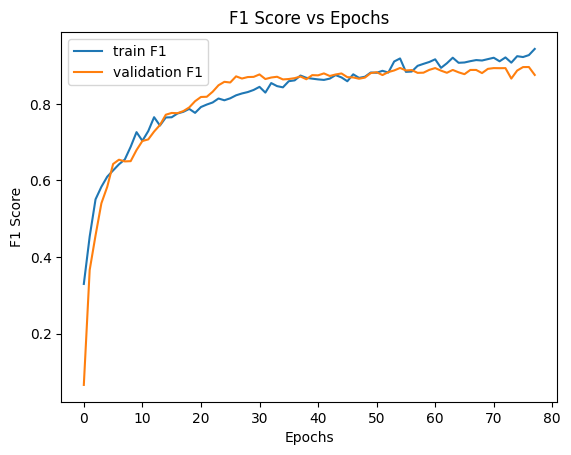

In [ ]:
# Se evalúa el modelo
val_loss, val_f1 = model_p.evaluate(X_val, y_val)
print(f"F1-score en datos de validación: {val_f1:.2f}")

# Se guarda  el scaler en un archivo
joblib.dump(scaler_p, "scaler_p.pkl")
print("Scaler exportado a scaler.pkl")

# Se imprime gráfico con valores de F1 durante el entrenamiento
plt.title('F1 Score vs Epochs')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.plot(history_p.history['f1_score'], label='train F1')
plt.plot(history_p.history['val_f1_score'], label='validation F1')
plt.legend()
plt.show()

Se observa una muy buena performance del modelo, con valores de f1 de 0.8885 para validación y 0.9028 para train en la mejor época, indicando un muy leve sobreajuste.

####9.1.2.Matriz de confusión

Se genera la matriz de confusión del modelo sobre el conjunto de test.

In [ ]:
# Se separan las coordenadas x, y y se aplanan
coordinates_test = np.array([np.array(row[2]).flatten() for row in dataset_test])
labels_test = np.array([row[1] for row in dataset_test])

X_test = coordinates_test
X_test = scaler_p.transform(X_test)
y_test = to_categorical(labels_test, num_classes=3)

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


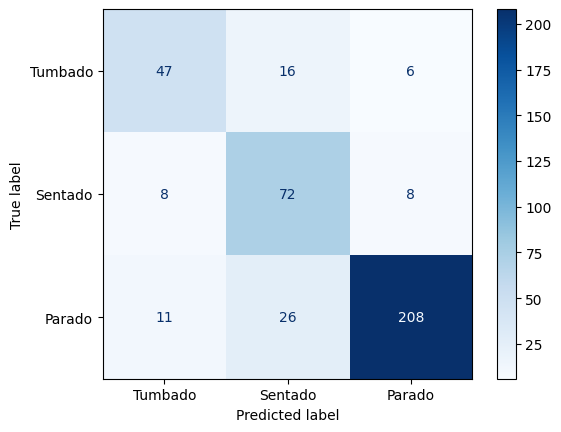

In [ ]:
# Se carga el modelo
model_p = load_model("model_p.h5")

# Predicciones y etiquetas verdaderas
y_pred = model_p.predict(X_test).argmax(axis=1)
y_true = y_test.argmax(axis=1)

# Se crea la matriz de confusión
cm = confusion_matrix(y_true, y_pred)

# Se definen las etiquetas de las clases
class_labels = ["Tumbado", "Sentado", "Parado"]

# Se muestra la matriz de confusión con etiquetas personalizadas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
disp.plot(cmap="Blues")  # Puedes cambiar el colormap si lo deseas

Se observa un excelente desempeño en la predicción de la clase "Parado", con una precisión de 0.937.

Las demás clases presentan sin embargo peores resultados, teniendo la clase "Tumbado" una precisión de 0.712 y "Sentado" 0.632.

###9.2.Segunda prueba: model_pless

Se entrena un segundo modelo, esta vez con menos keypoints, suponiendo a priori que pueden resultar irrelevantes.

Keypoints eliminados:

*   13: punta de la cola
*   18: punta de la oreja izquierda
*   19: punta de la oreja derecha




Para el conjunto de train:

In [ ]:
labels_file = 'labels_train.json'
# Cargar etiquetas desde el archivo JSON
if os.path.exists(labels_file):
    with open(labels_file, 'r') as f:
        labels_data = json.load(f)
else:
    raise FileNotFoundError(f"El archivo {labels_file} no existe.")

lesskeypoints_list = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14, 15, 16, 17]

keypoints_to_labels_with_balance(
    model=model_k,
    images_path="./datasets/dog-pose/train/images",
    labels_data=labels_data,
    output_file="lesskeypoints_labels_train.npy",
    balance_option=2,
    keypoints_list=lesskeypoints_list
)

Procesando imágenes:   0%|          | 0/882 [00:00<?, ?imagen/s]


0: 256x320 1 dog, 43.8ms
Speed: 1.6ms preprocess, 43.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 35.1ms
Speed: 1.2ms preprocess, 35.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:   0%|          | 2/882 [00:00<00:44, 19.99imagen/s]

Etiqueta 'Otro' no válida para la imagen n02110185_5624.jpg. Omitiendo.

0: 320x288 1 dog, 43.9ms
Speed: 1.8ms preprocess, 43.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 288x320 1 dog, 48.6ms
Speed: 0.9ms preprocess, 48.6ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:   1%|          | 5/882 [00:00<00:35, 24.43imagen/s]

Etiqueta 'Otro' no válida para la imagen n02086079_1020.jpg. Omitiendo.

0: 256x320 1 dog, 44.8ms
Speed: 1.1ms preprocess, 44.8ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 40.9ms
Speed: 1.3ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   1%|          | 8/882 [00:00<00:33, 26.46imagen/s]


0: 256x320 1 dog, 36.1ms
Speed: 1.3ms preprocess, 36.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02091032_12013.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091134_11775.jpg. Omitiendo.
La imagen n02085936_3470.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 40.0ms
Speed: 1.1ms preprocess, 40.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02094433_2114.jpg. Omitiendo.

0: 256x320 1 dog, 38.5ms
Speed: 1.1ms preprocess, 38.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   2%|▏         | 15/882 [00:00<00:23, 37.14imagen/s]


0: 320x224 1 dog, 34.3ms
Speed: 0.8ms preprocess, 34.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 288x320 1 dog, 40.2ms
Speed: 1.9ms preprocess, 40.2ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 320x256 2 dogs, 42.1ms
Speed: 1.8ms preprocess, 42.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 38.2ms
Speed: 1.0ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   2%|▏         | 19/882 [00:00<00:29, 29.26imagen/s]


0: 256x320 1 dog, 45.3ms
Speed: 1.6ms preprocess, 45.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02106662_2358.jpg. Omitiendo.

0: 256x320 1 dog, 47.2ms
Speed: 1.2ms preprocess, 47.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 63.6ms
Speed: 1.8ms preprocess, 63.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   3%|▎         | 23/882 [00:00<00:33, 25.96imagen/s]


0: 256x320 1 dog, 47.2ms
Speed: 3.7ms preprocess, 47.2ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02085782_2914.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 42.0ms
Speed: 2.7ms preprocess, 42.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:   3%|▎         | 26/882 [00:00<00:32, 26.13imagen/s]


0: 224x320 1 dog, 38.2ms
Speed: 1.7ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 53.9ms
Speed: 1.0ms preprocess, 53.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 192x320 1 dog, 36.2ms
Speed: 1.7ms preprocess, 36.2ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)


Procesando imágenes:   3%|▎         | 29/882 [00:01<00:35, 23.93imagen/s]


0: 224x320 1 dog, 41.1ms
Speed: 1.3ms preprocess, 41.1ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 49.2ms
Speed: 3.3ms preprocess, 49.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   4%|▎         | 32/882 [00:01<00:34, 24.65imagen/s]

Etiqueta 'Otro' no válida para la imagen n02088238_13373.jpg. Omitiendo.

0: 320x288 1 dog, 71.1ms
Speed: 1.5ms preprocess, 71.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)

0: 320x256 1 dog, 53.0ms
Speed: 1.6ms preprocess, 53.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 58.0ms
Speed: 4.4ms preprocess, 58.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   4%|▍         | 35/882 [00:01<00:42, 20.09imagen/s]


0: 320x256 1 dog, 60.4ms
Speed: 1.5ms preprocess, 60.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
La imagen n02086240_6322.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 49.6ms
Speed: 1.4ms preprocess, 49.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   4%|▍         | 38/882 [00:01<00:40, 20.83imagen/s]

Etiqueta 'Otro' no válida para la imagen n02106662_620.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02109047_11178.jpg. Omitiendo.

0: 256x320 1 dog, 51.4ms
Speed: 1.2ms preprocess, 51.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02108551_13756.jpg. Omitiendo.

0: 320x288 1 dog, 41.6ms
Speed: 2.0ms preprocess, 41.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:   5%|▍         | 43/882 [00:01<00:31, 26.56imagen/s]

Etiqueta 'Otro' no válida para la imagen n02102318_10595.jpg. Omitiendo.

0: 320x224 1 dog, 41.4ms
Speed: 2.0ms preprocess, 41.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 224x320 1 dog, 43.0ms
Speed: 1.1ms preprocess, 43.0ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:   5%|▌         | 46/882 [00:01<00:30, 27.00imagen/s]


0: 320x320 1 dog, 49.5ms
Speed: 2.1ms preprocess, 49.5ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
La imagen n02086240_4127.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 57.3ms
Speed: 3.0ms preprocess, 57.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:   6%|▌         | 49/882 [00:01<00:32, 26.00imagen/s]


0: 224x320 1 dog, 35.9ms
Speed: 2.5ms preprocess, 35.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02088094_5326.jpg. Omitiendo.

0: 256x320 1 dog, 40.7ms
Speed: 4.6ms preprocess, 40.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 38.5ms
Speed: 4.8ms preprocess, 38.5ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   6%|▌         | 53/882 [00:02<00:31, 26.21imagen/s]

Etiqueta 'Otro' no válida para la imagen n02088364_10575.jpg. Omitiendo.

0: 320x288 1 dog, 41.4ms
Speed: 1.4ms preprocess, 41.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 288)

0: 320x224 1 dog, 63.9ms
Speed: 1.7ms preprocess, 63.9ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:   6%|▋         | 56/882 [00:02<00:32, 25.56imagen/s]

Etiqueta 'Otro' no válida para la imagen n02091032_9980.jpg. Omitiendo.

0: 224x320 1 dog, 72.8ms
Speed: 20.6ms preprocess, 72.8ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:   7%|▋         | 59/882 [00:02<00:31, 26.34imagen/s]

La imagen n02088094_3080.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02096585_11180.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02088466_6096.jpg. Omitiendo.

0: 288x320 1 dog, 63.4ms
Speed: 1.4ms preprocess, 63.4ms inference, 1.3ms postprocess per image at shape (1, 3, 288, 320)
Etiqueta 'Otro' no válida para la imagen n02110063_11585.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02107908_5312.jpg. Omitiendo.

0: 320x224 1 dog, 43.4ms
Speed: 2.5ms preprocess, 43.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:   7%|▋         | 65/882 [00:02<00:25, 32.44imagen/s]


0: 288x320 1 dog, 43.5ms
Speed: 3.2ms preprocess, 43.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 38.2ms
Speed: 3.2ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:   8%|▊         | 69/882 [00:02<00:24, 33.13imagen/s]

Etiqueta 'Otro' no válida para la imagen n02088238_10932.jpg. Omitiendo.
La imagen n02085782_2655.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02102480_6514.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02093428_2461.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02108915_3202.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02096051_8132.jpg. Omitiendo.

0: 256x320 1 dog, 42.4ms
Speed: 2.2ms preprocess, 42.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 40.5ms
Speed: 1.0ms preprocess, 40.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:   9%|▊         | 75/882 [00:02<00:20, 40.04imagen/s]

Etiqueta 'Otro' no válida para la imagen n02089867_1240.jpg. Omitiendo.

0: 320x320 1 dog, 52.0ms
Speed: 1.7ms preprocess, 52.0ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 39.9ms
Speed: 4.7ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 38.5ms
Speed: 1.6ms preprocess, 38.5ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 38.3ms
Speed: 1.1ms preprocess, 38.3ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:   9%|▉         | 80/882 [00:02<00:24, 32.90imagen/s]

Etiqueta 'Otro' no válida para la imagen n02110958_15014.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02099429_121.jpg. Omitiendo.

0: 224x320 1 dog, 45.3ms
Speed: 2.8ms preprocess, 45.3ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 40.6ms
Speed: 1.6ms preprocess, 40.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  10%|▉         | 84/882 [00:02<00:23, 33.61imagen/s]


0: 256x320 1 dog, 39.9ms
Speed: 1.4ms preprocess, 39.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 37.8ms
Speed: 1.8ms preprocess, 37.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02096294_1850.jpg. Omitiendo.

0: 256x320 1 dog, 39.2ms
Speed: 1.1ms preprocess, 39.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  10%|▉         | 88/882 [00:03<00:25, 31.31imagen/s]


0: 320x320 1 dog, 50.2ms
Speed: 1.5ms preprocess, 50.2ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02087046_6857.jpg. Omitiendo.

0: 256x320 1 dog, 48.2ms
Speed: 1.1ms preprocess, 48.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  10%|█         | 92/882 [00:03<00:24, 31.83imagen/s]

Etiqueta 'Otro' no válida para la imagen n02102318_9307.jpg. Omitiendo.

0: 320x320 1 dog, 45.8ms
Speed: 1.3ms preprocess, 45.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02089973_2.jpg. Omitiendo.

0: 256x320 1 dog, 39.8ms
Speed: 1.4ms preprocess, 39.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 56.0ms
Speed: 0.9ms preprocess, 56.0ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  11%|█         | 96/882 [00:03<00:27, 28.80imagen/s]

Etiqueta 'Otro' no válida para la imagen n02096177_4768.jpg. Omitiendo.

0: 256x320 1 dog, 40.1ms
Speed: 1.8ms preprocess, 40.1ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02107908_5767.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02088632_4686.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02104365_6930.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02096177_4734.jpg. Omitiendo.

0: 320x256 1 dog, 37.9ms
Speed: 2.1ms preprocess, 37.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  12%|█▏        | 103/882 [00:03<00:20, 37.92imagen/s]


0: 224x320 1 dog, 36.7ms
Speed: 1.3ms preprocess, 36.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x256 1 dog, 39.7ms
Speed: 0.8ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 320x288 1 dog, 42.1ms
Speed: 0.9ms preprocess, 42.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 320x224 1 dog, 39.6ms
Speed: 1.0ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  12%|█▏        | 108/882 [00:03<00:23, 33.59imagen/s]

Etiqueta 'Otro' no válida para la imagen n02088364_13630.jpg. Omitiendo.

0: 256x320 1 dog, 44.4ms
Speed: 1.7ms preprocess, 44.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02105162_6625.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02094433_8669.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02107142_1694.jpg. Omitiendo.

0: 224x320 1 dog, 36.2ms
Speed: 1.2ms preprocess, 36.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x224 1 dog, 36.1ms
Speed: 1.2ms preprocess, 36.1ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  13%|█▎        | 114/882 [00:03<00:21, 35.99imagen/s]


0: 320x224 1 dog, 42.7ms
Speed: 5.9ms preprocess, 42.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
Etiqueta 'Otro' no válida para la imagen n02104365_6199.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02088238_9778.jpg. Omitiendo.

0: 320x256 1 dog, 37.8ms
Speed: 2.1ms preprocess, 37.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  13%|█▎        | 118/882 [00:03<00:20, 36.57imagen/s]


0: 256x320 1 dog, 35.2ms
Speed: 1.1ms preprocess, 35.2ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 40.7ms
Speed: 0.9ms preprocess, 40.7ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 288x320 1 dog, 44.4ms
Speed: 1.6ms preprocess, 44.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  14%|█▍        | 122/882 [00:04<00:22, 33.61imagen/s]

Etiqueta 'Otro' no válida para la imagen n02098413_342.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085936_3451.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02088466_10904.jpg. Omitiendo.

0: 320x256 1 dog, 37.9ms
Speed: 1.1ms preprocess, 37.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02087046_1468.jpg. Omitiendo.
La imagen n02086910_3136.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 50.1ms
Speed: 2.6ms preprocess, 50.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  15%|█▍        | 128/882 [00:04<00:19, 38.97imagen/s]


0: 224x320 1 dog, 54.0ms
Speed: 1.6ms preprocess, 54.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 55.1ms
Speed: 1.1ms preprocess, 55.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  15%|█▌        | 133/882 [00:04<00:19, 39.06imagen/s]

Etiqueta 'Otro' no válida para la imagen n02086240_6898.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02100236_3215.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02102177_4292.jpg. Omitiendo.

0: 256x320 1 dog, 38.1ms
Speed: 1.8ms preprocess, 38.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 50.3ms
Speed: 1.4ms preprocess, 50.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02086240_10785.jpg. Omitiendo.

0: 288x320 1 dog, 36.4ms
Speed: 2.8ms preprocess, 36.4ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 192x320 1 dog, 34.3ms
Speed: 0.9ms preprocess, 34.3ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)


Procesando imágenes:  16%|█▌        | 138/882 [00:04<00:22, 32.93imagen/s]

Etiqueta 'Otro' no válida para la imagen n02105056_2836.jpg. Omitiendo.

0: 320x256 1 dog, 38.4ms
Speed: 0.9ms preprocess, 38.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02107574_2100.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085620_11337.jpg. Omitiendo.

0: 256x320 1 dog, 38.0ms
Speed: 1.6ms preprocess, 38.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02090379_1736.jpg. Omitiendo.

0: 320x256 1 dog, 36.6ms
Speed: 1.3ms preprocess, 36.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  16%|█▋        | 145/882 [00:04<00:19, 37.13imagen/s]

Etiqueta 'Otro' no válida para la imagen n02088238_11849.jpg. Omitiendo.

0: 288x320 1 dog, 42.0ms
Speed: 2.0ms preprocess, 42.0ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)
Etiqueta 'Otro' no válida para la imagen n02102040_171.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02087394_8742.jpg. Omitiendo.

0: 256x320 1 dog, 38.3ms
Speed: 1.1ms preprocess, 38.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  17%|█▋        | 150/882 [00:04<00:18, 39.53imagen/s]


0: 288x320 1 dog, 42.0ms
Speed: 1.3ms preprocess, 42.0ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
La imagen n02087046_7365.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen n02086240_1856.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02111500_7483.jpg. Omitiendo.

0: 256x320 1 dog, 35.9ms
Speed: 0.8ms preprocess, 35.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02109961_12118.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02110185_6105.jpg. Omitiendo.

0: 256x320 1 dog, 36.3ms
Speed: 1.3ms preprocess, 36.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  18%|█▊        | 158/882 [00:04<00:16, 45.02imagen/s]

Etiqueta 'Otro' no válida para la imagen n02086079_4412.jpg. Omitiendo.

0: 320x288 1 dog, 38.0ms
Speed: 1.6ms preprocess, 38.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 256x320 1 dog, 38.6ms
Speed: 0.8ms preprocess, 38.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02109525_9872.jpg. Omitiendo.
La imagen n02086079_21987.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 39.4ms
Speed: 1.2ms preprocess, 39.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  19%|█▊        | 164/882 [00:05<00:16, 43.99imagen/s]


0: 192x320 1 dog, 33.7ms
Speed: 4.3ms preprocess, 33.7ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)

0: 256x320 1 dog, 45.6ms
Speed: 1.0ms preprocess, 45.6ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 45.2ms
Speed: 1.7ms preprocess, 45.2ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 36.9ms
Speed: 1.0ms preprocess, 36.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 45.4ms
Speed: 1.1ms preprocess, 45.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  19%|█▉        | 169/882 [00:05<00:21, 33.12imagen/s]


0: 256x320 1 dog, 40.7ms
Speed: 1.4ms preprocess, 40.7ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02098105_2458.jpg. Omitiendo.

0: 320x256 1 dog, 38.6ms
Speed: 1.6ms preprocess, 38.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)

0: 320x320 1 dog, 49.6ms
Speed: 1.3ms preprocess, 49.6ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  20%|█▉        | 173/882 [00:05<00:23, 30.69imagen/s]


0: 320x256 1 dog, 42.4ms
Speed: 1.8ms preprocess, 42.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 37.0ms
Speed: 0.9ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 34.2ms
Speed: 0.8ms preprocess, 34.2ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 37.1ms
Speed: 1.2ms preprocess, 37.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  20%|██        | 177/882 [00:05<00:25, 27.64imagen/s]


0: 320x256 1 dog, 38.7ms
Speed: 1.4ms preprocess, 38.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02096585_670.jpg. Omitiendo.

0: 320x256 1 dog, 35.3ms
Speed: 1.5ms preprocess, 35.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 320x256 1 dog, 38.8ms
Speed: 1.6ms preprocess, 38.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  21%|██        | 181/882 [00:05<00:25, 27.96imagen/s]

Etiqueta 'Otro' no válida para la imagen n02086646_2355.jpg. Omitiendo.
La imagen n02088094_1724.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02100735_5876.jpg. Omitiendo.
La imagen n02085936_3326.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02108915_3527.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02087046_4127.jpg. Omitiendo.
La imagen n02088094_5355.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen n02086910_4488.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091244_3075.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02108422_2209.jpg. Omitiendo.

0: 320x288 1 dog, 46.5ms
Speed: 1.1ms preprocess, 46.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 256x320 1 dog, 39.0ms
Speed: 1.4ms preprocess, 39.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320

Procesando imágenes:  22%|██▏       | 193/882 [00:05<00:14, 46.25imagen/s]


0: 320x256 1 dog, 42.8ms
Speed: 0.7ms preprocess, 42.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02108000_1798.jpg. Omitiendo.

0: 288x320 1 dog, 41.9ms
Speed: 0.8ms preprocess, 41.9ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 37.2ms
Speed: 1.3ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  23%|██▎       | 199/882 [00:06<00:15, 44.70imagen/s]

Etiqueta 'Otro' no válida para la imagen n02107312_1316.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02105162_9995.jpg. Omitiendo.

0: 320x224 1 dog, 38.1ms
Speed: 0.8ms preprocess, 38.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 48.6ms
Speed: 0.9ms preprocess, 48.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 44.6ms
Speed: 0.8ms preprocess, 44.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 46.3ms
Speed: 1.4ms preprocess, 46.3ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 320)
La imagen n02087394_1964.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 36.6ms
Speed: 0.8ms preprocess, 36.6ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  23%|██▎       | 205/882 [00:06<00:18, 35.77imagen/s]

Etiqueta 'Otro' no válida para la imagen n02100583_6266.jpg. Omitiendo.

0: 320x192 1 dog, 54.4ms
Speed: 1.5ms preprocess, 54.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 192)
Etiqueta 'Otro' no válida para la imagen n02102040_3993.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02110806_6035.jpg. Omitiendo.

0: 320x256 1 dog, 47.2ms
Speed: 0.7ms preprocess, 47.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  24%|██▍       | 210/882 [00:06<00:18, 37.21imagen/s]


0: 256x320 1 dog, 39.2ms
Speed: 1.1ms preprocess, 39.2ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 37.8ms
Speed: 1.9ms preprocess, 37.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 43.5ms
Speed: 1.9ms preprocess, 43.5ms inference, 1.3ms postprocess per image at shape (1, 3, 288, 320)
Etiqueta 'Otro' no válida para la imagen n02100583_3263.jpg. Omitiendo.

0: 256x320 1 dog, 36.6ms
Speed: 1.2ms preprocess, 36.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  24%|██▍       | 215/882 [00:06<00:20, 33.18imagen/s]

Etiqueta 'Otro' no válida para la imagen n02095314_1894.jpg. Omitiendo.

0: 320x256 1 dog, 36.5ms
Speed: 1.4ms preprocess, 36.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)

0: 320x320 1 dog, 44.0ms
Speed: 0.8ms preprocess, 44.0ms inference, 1.8ms postprocess per image at shape (1, 3, 320, 320)

0: 288x320 1 dog, 38.6ms
Speed: 1.5ms preprocess, 38.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  25%|██▍       | 219/882 [00:06<00:20, 31.80imagen/s]


0: 320x224 1 dog, 34.7ms
Speed: 1.3ms preprocess, 34.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 33.9ms
Speed: 0.7ms preprocess, 33.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 36.3ms
Speed: 1.9ms preprocess, 36.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 34.3ms
Speed: 0.9ms preprocess, 34.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  25%|██▌       | 223/882 [00:06<00:22, 29.22imagen/s]


0: 256x320 1 dog, 40.5ms
Speed: 0.9ms preprocess, 40.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02090721_1981.jpg. Omitiendo.

0: 256x320 1 dog, 42.0ms
Speed: 0.7ms preprocess, 42.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02092002_6702.jpg. Omitiendo.

0: 224x320 1 dog, 38.3ms
Speed: 1.5ms preprocess, 38.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  26%|██▌       | 228/882 [00:07<00:21, 30.70imagen/s]


0: 256x320 1 dog, 36.3ms
Speed: 2.1ms preprocess, 36.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02093754_1256.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02097209_746.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091831_10576.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02093647_722.jpg. Omitiendo.
La imagen n02088094_12879.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02088094_11182.jpg. Omitiendo.

0: 320x320 1 dog, 52.0ms
Speed: 1.8ms preprocess, 52.0ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  27%|██▋       | 236/882 [00:07<00:16, 40.37imagen/s]


0: 320x224 1 dog, 37.6ms
Speed: 2.0ms preprocess, 37.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 43.6ms
Speed: 1.3ms preprocess, 43.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 43.3ms
Speed: 14.5ms preprocess, 43.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x256 1 dog, 40.8ms
Speed: 1.9ms preprocess, 40.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 36.8ms
Speed: 1.5ms preprocess, 36.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  27%|██▋       | 241/882 [00:07<00:20, 31.16imagen/s]

La imagen n02088094_1410.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 42.9ms
Speed: 1.5ms preprocess, 42.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 47.1ms
Speed: 1.3ms preprocess, 47.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  28%|██▊       | 245/882 [00:07<00:19, 32.33imagen/s]

Etiqueta 'Otro' no válida para la imagen n02105855_17401.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02104365_5781.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02094258_752.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02107312_3603.jpg. Omitiendo.

0: 320x320 1 dog, 43.7ms
Speed: 4.6ms preprocess, 43.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 288x320 1 dog, 40.3ms
Speed: 0.9ms preprocess, 40.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  28%|██▊       | 250/882 [00:07<00:17, 35.83imagen/s]


0: 288x320 1 dog, 37.6ms
Speed: 1.2ms preprocess, 37.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 35.4ms
Speed: 0.9ms preprocess, 35.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 38.1ms
Speed: 2.7ms preprocess, 38.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x224 1 dog, 34.0ms
Speed: 1.7ms preprocess, 34.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  29%|██▉       | 255/882 [00:07<00:18, 33.15imagen/s]

Etiqueta 'Otro' no válida para la imagen n02107908_406.jpg. Omitiendo.

0: 320x320 1 dog, 39.9ms
Speed: 1.6ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02110806_4395.jpg. Omitiendo.

0: 320x224 1 dog, 36.1ms
Speed: 1.6ms preprocess, 36.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 320x256 1 dog, 40.2ms
Speed: 0.9ms preprocess, 40.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  29%|██▉       | 259/882 [00:07<00:19, 31.84imagen/s]

Etiqueta 'Otro' no válida para la imagen n02102318_9254.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02110063_4739.jpg. Omitiendo.

0: 320x256 1 dog, 41.0ms
Speed: 4.9ms preprocess, 41.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 288x320 1 dog, 39.6ms
Speed: 0.9ms preprocess, 39.6ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  30%|██▉       | 263/882 [00:08<00:18, 33.56imagen/s]

Etiqueta 'Otro' no válida para la imagen n02085936_9270.jpg. Omitiendo.

0: 256x320 1 dog, 43.3ms
Speed: 2.2ms preprocess, 43.3ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02088094_231.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02102177_2875.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091134_11956.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02110185_1552.jpg. Omitiendo.
La imagen n02088238_11136.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 34.3ms
Speed: 1.1ms preprocess, 34.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  31%|███       | 271/882 [00:08<00:13, 44.73imagen/s]


0: 320x288 1 dog, 52.4ms
Speed: 1.2ms preprocess, 52.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
Etiqueta 'Otro' no válida para la imagen n02102177_66.jpg. Omitiendo.
La imagen n02085782_2269.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 45.9ms
Speed: 1.0ms preprocess, 45.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  31%|███▏      | 276/882 [00:08<00:13, 44.14imagen/s]

Etiqueta 'Otro' no válida para la imagen n02102318_9378.jpg. Omitiendo.

0: 224x320 1 dog, 42.3ms
Speed: 1.3ms preprocess, 42.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 44.8ms
Speed: 1.0ms preprocess, 44.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x256 1 dog, 36.9ms
Speed: 0.9ms preprocess, 36.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 34.9ms
Speed: 2.4ms preprocess, 34.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  32%|███▏      | 281/882 [00:08<00:16, 36.74imagen/s]

Etiqueta 'Otro' no válida para la imagen n02088238_9994.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02106550_3610.jpg. Omitiendo.

0: 256x320 1 dog, 37.4ms
Speed: 1.1ms preprocess, 37.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 42.2ms
Speed: 1.2ms preprocess, 42.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 33.8ms
Speed: 0.7ms preprocess, 33.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 39.3ms
Speed: 0.8ms preprocess, 39.3ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  32%|███▏      | 286/882 [00:08<00:17, 33.44imagen/s]

Etiqueta 'Otro' no válida para la imagen n02085782_2100.jpg. Omitiendo.

0: 320x224 1 dog, 37.5ms
Speed: 1.2ms preprocess, 37.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
Etiqueta 'Otro' no válida para la imagen n02097658_1112.jpg. Omitiendo.

0: 288x320 1 dog, 38.9ms
Speed: 1.4ms preprocess, 38.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 37.3ms
Speed: 1.1ms preprocess, 37.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  33%|███▎      | 291/882 [00:08<00:17, 34.13imagen/s]

Etiqueta 'Otro' no válida para la imagen n02091134_14047.jpg. Omitiendo.

0: 288x320 1 dog, 44.2ms
Speed: 1.0ms preprocess, 44.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 35.5ms
Speed: 3.7ms preprocess, 35.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02096177_1434.jpg. Omitiendo.

0: 256x320 1 dog, 36.7ms
Speed: 0.8ms preprocess, 36.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  34%|███▎      | 296/882 [00:08<00:17, 34.33imagen/s]


0: 256x320 1 dog, 36.1ms
Speed: 2.2ms preprocess, 36.1ms inference, 2.6ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 40.7ms
Speed: 2.1ms preprocess, 40.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02094433_6672.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02096294_6299.jpg. Omitiendo.

0: 192x320 1 dog, 34.8ms
Speed: 3.8ms preprocess, 34.8ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)


Procesando imágenes:  34%|███▍      | 301/882 [00:09<00:16, 34.42imagen/s]

Etiqueta 'Otro' no válida para la imagen n02091244_3939.jpg. Omitiendo.

0: 320x256 1 dog, 51.6ms
Speed: 1.9ms preprocess, 51.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 37.7ms
Speed: 1.0ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  35%|███▍      | 305/882 [00:09<00:16, 34.87imagen/s]

Etiqueta 'Otro' no válida para la imagen n02091134_7567.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02086240_2335.jpg. Omitiendo.

0: 256x320 1 dog, 41.6ms
Speed: 1.1ms preprocess, 41.6ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02088364_14702.jpg. Omitiendo.

0: 256x320 1 dog, 49.8ms
Speed: 1.1ms preprocess, 49.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  35%|███▌      | 309/882 [00:09<00:16, 35.23imagen/s]

La imagen n02086646_602.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 48.6ms
Speed: 1.5ms preprocess, 48.6ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02091244_2323.jpg. Omitiendo.

0: 224x320 1 dog, 35.9ms
Speed: 2.5ms preprocess, 35.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  35%|███▌      | 313/882 [00:09<00:15, 36.05imagen/s]


0: 256x320 1 dog, 49.1ms
Speed: 1.0ms preprocess, 49.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02096051_8227.jpg. Omitiendo.

0: 256x320 1 dog, 39.2ms
Speed: 1.5ms preprocess, 39.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 37.9ms
Speed: 1.5ms preprocess, 37.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  36%|███▌      | 317/882 [00:09<00:17, 32.75imagen/s]

Etiqueta 'Otro' no válida para la imagen n02102318_8666.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02097047_1866.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02099849_1599.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02104365_7409.jpg. Omitiendo.

0: 288x320 1 dog, 40.5ms
Speed: 1.2ms preprocess, 40.5ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)
La imagen n02085620_326.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 39.6ms
Speed: 3.4ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  37%|███▋      | 324/882 [00:09<00:13, 41.71imagen/s]


0: 224x320 1 dog, 35.1ms
Speed: 0.9ms preprocess, 35.1ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02095314_1577.jpg. Omitiendo.

0: 320x256 1 dog, 35.0ms
Speed: 1.1ms preprocess, 35.0ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 36.9ms
Speed: 2.1ms preprocess, 36.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  37%|███▋      | 329/882 [00:09<00:13, 39.80imagen/s]

Etiqueta 'Otro' no válida para la imagen n02110958_10378.jpg. Omitiendo.
La imagen n02086646_2498.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x224 1 dog, 39.1ms
Speed: 2.0ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
Etiqueta 'Otro' no válida para la imagen n02104365_8630.jpg. Omitiendo.

0: 320x224 1 dog, 36.7ms
Speed: 2.8ms preprocess, 36.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 288x320 1 dog, 37.6ms
Speed: 3.5ms preprocess, 37.6ms inference, 0.7ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  38%|███▊      | 334/882 [00:09<00:14, 38.09imagen/s]


0: 192x320 1 dog, 38.3ms
Speed: 1.5ms preprocess, 38.3ms inference, 1.5ms postprocess per image at shape (1, 3, 192, 320)

0: 320x288 1 dog, 46.0ms
Speed: 2.3ms preprocess, 46.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 256x320 1 dog, 35.8ms
Speed: 2.1ms preprocess, 35.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  38%|███▊      | 338/882 [00:10<00:15, 34.09imagen/s]

La imagen n02088094_2131.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 50.8ms
Speed: 1.7ms preprocess, 50.8ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 40.2ms
Speed: 1.2ms preprocess, 40.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  39%|███▉      | 342/882 [00:10<00:15, 34.17imagen/s]

Etiqueta 'Otro' no válida para la imagen n02107574_1437.jpg. Omitiendo.
La imagen n02085782_3990.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 40.9ms
Speed: 1.2ms preprocess, 40.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 56.1ms
Speed: 1.1ms preprocess, 56.1ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 41.0ms
Speed: 1.8ms preprocess, 41.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 38.5ms
Speed: 3.1ms preprocess, 38.5ms inference, 0.7ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  39%|███▉      | 346/882 [00:10<00:19, 27.42imagen/s]


0: 320x224 1 dog, 33.8ms
Speed: 1.2ms preprocess, 33.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 224x320 1 dog, 35.2ms
Speed: 0.7ms preprocess, 35.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
La imagen n02086646_282.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen n02088238_11204.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02109961_2727.jpg. Omitiendo.

0: 256x320 1 dog, 36.0ms
Speed: 2.3ms preprocess, 36.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  40%|███▉      | 352/882 [00:10<00:16, 32.36imagen/s]


0: 256x320 1 dog, 35.0ms
Speed: 3.2ms preprocess, 35.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02106166_2458.jpg. Omitiendo.

0: 256x320 1 dog, 34.3ms
Speed: 1.5ms preprocess, 34.3ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 40.4ms
Speed: 1.8ms preprocess, 40.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  40%|████      | 356/882 [00:10<00:16, 31.41imagen/s]

Etiqueta 'Otro' no válida para la imagen n02102040_228.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02086240_12057.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02094433_4091.jpg. Omitiendo.

0: 320x224 1 dog, 36.3ms
Speed: 1.7ms preprocess, 36.3ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)

0: 288x320 1 dog, 39.0ms
Speed: 1.0ms preprocess, 39.0ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 36.7ms
Speed: 1.4ms preprocess, 36.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  41%|████      | 362/882 [00:10<00:15, 34.45imagen/s]

Etiqueta 'Otro' no válida para la imagen n02088238_13847.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02086240_1142.jpg. Omitiendo.

0: 320x256 1 dog, 37.0ms
Speed: 0.8ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 320x256 1 dog, 36.7ms
Speed: 0.9ms preprocess, 36.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 38.7ms
Speed: 1.7ms preprocess, 38.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  42%|████▏     | 367/882 [00:11<00:14, 34.86imagen/s]

Etiqueta 'Otro' no válida para la imagen n02102480_4270.jpg. Omitiendo.
La imagen n02086646_851.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 41.5ms
Speed: 1.4ms preprocess, 41.5ms inference, 1.2ms postprocess per image at shape (1, 3, 288, 320)

0: 320x256 1 dog, 38.3ms
Speed: 3.4ms preprocess, 38.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 320x320 1 dog, 41.7ms
Speed: 1.5ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  42%|████▏     | 372/882 [00:11<00:14, 34.43imagen/s]


0: 320x256 1 dog, 50.7ms
Speed: 3.7ms preprocess, 50.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02107683_4200.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02112137_2619.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091032_7147.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085936_4797.jpg. Omitiendo.

0: 256x320 1 dog, 37.2ms
Speed: 0.9ms preprocess, 37.2ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  43%|████▎     | 378/882 [00:11<00:12, 39.46imagen/s]

Etiqueta 'Otro' no válida para la imagen n02096177_4916.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02105505_3578.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02104029_4585.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02107574_2276.jpg. Omitiendo.

0: 256x320 1 dog, 38.4ms
Speed: 10.1ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 37.1ms
Speed: 2.3ms preprocess, 37.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  44%|████▎     | 384/882 [00:11<00:11, 44.02imagen/s]


0: 256x320 1 dog, 51.9ms
Speed: 1.4ms preprocess, 51.9ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02107312_5114.jpg. Omitiendo.

0: 320x256 1 dog, 43.2ms
Speed: 1.9ms preprocess, 43.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
La imagen n02088094_12364.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 40.6ms
Speed: 2.0ms preprocess, 40.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  44%|████▍     | 389/882 [00:11<00:13, 37.48imagen/s]

Etiqueta 'Otro' no válida para la imagen n02108000_777.jpg. Omitiendo.

0: 256x320 1 dog, 37.3ms
Speed: 1.8ms preprocess, 37.3ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02111500_4358.jpg. Omitiendo.

0: 288x320 1 dog, 41.3ms
Speed: 1.1ms preprocess, 41.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
La imagen n02086646_4199.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 36.8ms
Speed: 2.0ms preprocess, 36.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  45%|████▍     | 395/882 [00:11<00:12, 38.84imagen/s]


0: 320x256 1 dog, 38.4ms
Speed: 1.9ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02102177_2524.jpg. Omitiendo.

0: 320x160 1 dog, 33.7ms
Speed: 1.3ms preprocess, 33.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 160)

0: 256x320 1 dog, 39.9ms
Speed: 0.8ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 38.6ms
Speed: 1.0ms preprocess, 38.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  45%|████▌     | 400/882 [00:11<00:13, 34.80imagen/s]


0: 320x256 1 dog, 40.4ms
Speed: 5.1ms preprocess, 40.4ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 256)

0: 192x320 1 dog, 31.3ms
Speed: 1.6ms preprocess, 31.3ms inference, 0.7ms postprocess per image at shape (1, 3, 192, 320)

0: 256x320 1 dog, 41.6ms
Speed: 0.7ms preprocess, 41.6ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  46%|████▌     | 404/882 [00:12<00:14, 32.85imagen/s]

La imagen n02088094_537.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091467_2240.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02096294_6258.jpg. Omitiendo.

0: 320x224 1 dog, 40.9ms
Speed: 2.3ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 224x320 1 dog, 43.7ms
Speed: 3.0ms preprocess, 43.7ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  46%|████▋     | 408/882 [00:12<00:13, 33.97imagen/s]

Etiqueta 'Otro' no válida para la imagen n02113712_579.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02099712_221.jpg. Omitiendo.

0: 320x256 1 dog, 40.3ms
Speed: 1.0ms preprocess, 40.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02094114_1944.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02088094_6690.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02107574_2164.jpg. Omitiendo.

0: 320x320 1 dog, 46.5ms
Speed: 1.3ms preprocess, 46.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  47%|████▋     | 415/882 [00:12<00:11, 41.49imagen/s]

Etiqueta 'Otro' no válida para la imagen n02087046_4614.jpg. Omitiendo.

0: 320x256 1 dog, 43.5ms
Speed: 2.3ms preprocess, 43.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02089973_569.jpg. Omitiendo.

0: 224x320 1 dog, 53.0ms
Speed: 2.4ms preprocess, 53.0ms inference, 2.3ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  48%|████▊     | 420/882 [00:12<00:11, 41.21imagen/s]

Etiqueta 'Otro' no válida para la imagen n02088238_3066.jpg. Omitiendo.

0: 256x320 1 dog, 44.4ms
Speed: 2.0ms preprocess, 44.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 40.0ms
Speed: 1.6ms preprocess, 40.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  48%|████▊     | 425/882 [00:12<00:10, 42.97imagen/s]

Etiqueta 'Otro' no válida para la imagen n02105056_1613.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02093256_2557.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091467_7095.jpg. Omitiendo.
La imagen n02086646_589.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091831_8028.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085620_3402.jpg. Omitiendo.

0: 256x320 1 dog, 38.0ms
Speed: 2.9ms preprocess, 38.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.4ms
Speed: 1.3ms preprocess, 39.4ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02086240_6116.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091134_17108.jpg. Omitiendo.
La imagen n02088094_3629.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x288 1 dog, 43.6ms
Speed: 2.0ms preprocess, 43.6ms inference, 1.0ms postprocess p

Procesando imágenes:  49%|████▉     | 434/882 [00:12<00:09, 48.72imagen/s]

Etiqueta 'Otro' no válida para la imagen n02096437_1668.jpg. Omitiendo.

0: 320x320 1 dog, 41.9ms
Speed: 2.5ms preprocess, 41.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02102040_1519.jpg. Omitiendo.

0: 288x320 1 dog, 55.7ms
Speed: 1.4ms preprocess, 55.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 42.0ms
Speed: 3.1ms preprocess, 42.0ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  50%|████▉     | 439/882 [00:12<00:10, 41.63imagen/s]

La imagen n02087394_1274.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02096294_3174.jpg. Omitiendo.

0: 320x320 1 dog, 43.0ms
Speed: 4.8ms preprocess, 43.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 45.1ms
Speed: 0.7ms preprocess, 45.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 40.0ms
Speed: 0.6ms preprocess, 40.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  50%|█████     | 444/882 [00:12<00:11, 38.81imagen/s]


0: 256x320 1 dog, 35.7ms
Speed: 6.6ms preprocess, 35.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 36.1ms
Speed: 8.5ms preprocess, 36.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
La imagen n02086240_8825.jpg no se encuentra en la ruta especificada. Omitiendo.

Procesando imágenes:  51%|█████     | 448/882 [00:13<00:11, 38.87imagen/s]


Etiqueta 'Otro' no válida para la imagen n02110063_1791.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091032_9592.jpg. Omitiendo.

0: 256x320 1 dog, 71.4ms
Speed: 9.9ms preprocess, 71.4ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 62.4ms
Speed: 13.8ms preprocess, 62.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  51%|█████     | 452/882 [00:13<00:12, 33.25imagen/s]

Etiqueta 'Otro' no válida para la imagen n02096294_4142.jpg. Omitiendo.

0: 320x224 1 dog, 48.2ms
Speed: 8.6ms preprocess, 48.2ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 224)

0: 320x320 1 dog, 53.7ms
Speed: 4.7ms preprocess, 53.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 45.0ms
Speed: 4.0ms preprocess, 45.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  52%|█████▏    | 456/882 [00:13<00:14, 28.87imagen/s]

Etiqueta 'Otro' no válida para la imagen n02108000_37.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02098105_100.jpg. Omitiendo.
La imagen n02085782_2.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x224 1 dog, 39.7ms
Speed: 8.7ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
Etiqueta 'Otro' no válida para la imagen n02100236_4783.jpg. Omitiendo.

0: 320x320 1 dog, 57.9ms
Speed: 2.9ms preprocess, 57.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  52%|█████▏    | 461/882 [00:13<00:13, 31.74imagen/s]


0: 320x256 1 dog, 40.0ms
Speed: 6.3ms preprocess, 40.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02110185_725.jpg. Omitiendo.

0: 320x256 1 dog, 44.2ms
Speed: 1.5ms preprocess, 44.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 320x288 1 dog, 46.2ms
Speed: 3.9ms preprocess, 46.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  53%|█████▎    | 465/882 [00:13<00:14, 29.22imagen/s]


0: 256x320 1 dog, 41.4ms
Speed: 5.4ms preprocess, 41.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02085936_6569.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 60.4ms
Speed: 0.8ms preprocess, 60.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)

0: 320x256 1 dog, 46.3ms
Speed: 12.4ms preprocess, 46.3ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  53%|█████▎    | 469/882 [00:13<00:15, 26.25imagen/s]

La imagen n02085782_4294.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085782_4269.jpg. Omitiendo.

0: 256x320 1 dog, 39.9ms
Speed: 2.5ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 38.9ms
Speed: 8.8ms preprocess, 38.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  54%|█████▎    | 473/882 [00:14<00:14, 28.65imagen/s]


0: 320x256 1 dog, 48.1ms
Speed: 14.4ms preprocess, 48.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 107.4ms
Speed: 7.1ms preprocess, 107.4ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02093256_6969.jpg. Omitiendo.

0: 256x320 1 dog, 46.1ms
Speed: 9.9ms preprocess, 46.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  54%|█████▍    | 477/882 [00:14<00:17, 22.81imagen/s]


0: 320x320 1 dog, 67.0ms
Speed: 2.3ms preprocess, 67.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02110958_12761.jpg. Omitiendo.

0: 256x320 1 dog, 64.5ms
Speed: 2.8ms preprocess, 64.5ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  54%|█████▍    | 480/882 [00:14<00:18, 21.89imagen/s]

Etiqueta 'Otro' no válida para la imagen n02089078_1842.jpg. Omitiendo.
La imagen n02086910_2084.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 57.2ms
Speed: 13.6ms preprocess, 57.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 42.8ms
Speed: 2.2ms preprocess, 42.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  55%|█████▍    | 484/882 [00:14<00:16, 23.78imagen/s]

Etiqueta 'Otro' no válida para la imagen n02102318_1458.jpg. Omitiendo.

0: 256x320 1 dog, 42.0ms
Speed: 1.8ms preprocess, 42.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02108089_3547.jpg. Omitiendo.

0: 256x320 1 dog, 40.3ms
Speed: 3.9ms preprocess, 40.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  55%|█████▌    | 488/882 [00:14<00:14, 27.00imagen/s]


0: 320x256 1 dog, 46.9ms
Speed: 1.9ms preprocess, 46.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02097047_5257.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02099601_3494.jpg. Omitiendo.

0: 256x320 1 dog, 39.5ms
Speed: 16.4ms preprocess, 39.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  56%|█████▌    | 492/882 [00:14<00:13, 28.17imagen/s]

La imagen n02085782_3098.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 42.7ms
Speed: 1.5ms preprocess, 42.7ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 47.0ms
Speed: 1.4ms preprocess, 47.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 38.4ms
Speed: 0.9ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  56%|█████▌    | 496/882 [00:14<00:14, 27.43imagen/s]

Etiqueta 'Otro' no válida para la imagen n02105641_9412.jpg. Omitiendo.

0: 320x320 1 dog, 43.8ms
Speed: 1.5ms preprocess, 43.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02101556_4698.jpg. Omitiendo.

0: 224x320 1 dog, 41.3ms
Speed: 1.0ms preprocess, 41.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  57%|█████▋    | 500/882 [00:15<00:12, 30.11imagen/s]


0: 256x320 1 dog, 41.6ms
Speed: 1.1ms preprocess, 41.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02106662_13368.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02099601_142.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02105056_5726.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02106166_654.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02107683_1747.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02087046_3490.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02106662_8870.jpg. Omitiendo.

0: 256x320 1 dog, 40.6ms
Speed: 1.8ms preprocess, 40.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  58%|█████▊    | 509/882 [00:15<00:08, 44.39imagen/s]


0: 256x320 1 dog, 50.0ms
Speed: 1.1ms preprocess, 50.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02097047_2871.jpg. Omitiendo.

0: 256x320 1 dog, 36.5ms
Speed: 2.9ms preprocess, 36.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  58%|█████▊    | 514/882 [00:15<00:08, 44.91imagen/s]

Etiqueta 'Otro' no válida para la imagen n02086240_1259.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02089973_2681.jpg. Omitiendo.

0: 256x320 1 dog, 56.2ms
Speed: 1.7ms preprocess, 56.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02107312_5719.jpg. Omitiendo.

0: 256x320 1 dog, 58.5ms
Speed: 1.3ms preprocess, 58.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02090721_969.jpg. Omitiendo.

0: 256x320 1 dog, 46.3ms
Speed: 0.8ms preprocess, 46.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  59%|█████▉    | 519/882 [00:15<00:09, 37.53imagen/s]


0: 320x224 1 dog, 42.4ms
Speed: 1.4ms preprocess, 42.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
Etiqueta 'Otro' no válida para la imagen n02102973_3303.jpg. Omitiendo.

0: 224x320 1 dog, 37.3ms
Speed: 1.6ms preprocess, 37.3ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02104029_1484.jpg. Omitiendo.

0: 256x320 1 dog, 35.5ms
Speed: 1.7ms preprocess, 35.5ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  59%|█████▉    | 524/882 [00:15<00:09, 36.67imagen/s]


0: 256x320 1 dog, 39.3ms
Speed: 3.8ms preprocess, 39.3ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02088466_8801.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02088466_8144.jpg. Omitiendo.

0: 320x224 1 dog, 37.7ms
Speed: 1.2ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  60%|█████▉    | 528/882 [00:15<00:09, 37.39imagen/s]

Etiqueta 'Otro' no válida para la imagen n02105056_4600.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02107312_3624.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02095570_1068.jpg. Omitiendo.

0: 256x320 1 dog, 45.3ms
Speed: 1.3ms preprocess, 45.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02094433_3526.jpg. Omitiendo.

0: 256x320 1 dog, 39.1ms
Speed: 1.3ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  61%|██████    | 534/882 [00:15<00:08, 42.51imagen/s]

Etiqueta 'Otro' no válida para la imagen n02105505_3389.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02099601_7123.jpg. Omitiendo.

0: 288x320 1 dog, 43.2ms
Speed: 1.3ms preprocess, 43.2ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 41.9ms
Speed: 2.3ms preprocess, 41.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 37.8ms
Speed: 1.4ms preprocess, 37.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  61%|██████    | 539/882 [00:15<00:08, 39.34imagen/s]

Etiqueta 'Otro' no válida para la imagen n02098413_16322.jpg. Omitiendo.

0: 224x320 1 dog, 37.0ms
Speed: 3.3ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02108000_1482.jpg. Omitiendo.

0: 320x320 1 dog, 46.6ms
Speed: 0.8ms preprocess, 46.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 44.8ms
Speed: 2.6ms preprocess, 44.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  62%|██████▏   | 544/882 [00:16<00:09, 36.64imagen/s]

Etiqueta 'Otro' no válida para la imagen n02097658_1503.jpg. Omitiendo.

0: 256x320 1 dog, 60.9ms
Speed: 3.4ms preprocess, 60.9ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 2 dogs, 50.6ms
Speed: 1.8ms preprocess, 50.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  62%|██████▏   | 548/882 [00:16<00:09, 34.78imagen/s]

La imagen n02088094_13145.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02096437_290.jpg. Omitiendo.

0: 288x320 1 dog, 41.3ms
Speed: 4.2ms preprocess, 41.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x224 1 dog, 43.3ms
Speed: 2.5ms preprocess, 43.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  63%|██████▎   | 552/882 [00:16<00:09, 35.41imagen/s]

Etiqueta 'Otro' no válida para la imagen n02088238_10358.jpg. Omitiendo.
La imagen n02086910_6293.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02093647_2279.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02097658_329.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02096177_4154.jpg. Omitiendo.

0: 320x320 1 dog, 60.9ms
Speed: 1.8ms preprocess, 60.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x256 1 dog, 51.6ms
Speed: 3.1ms preprocess, 51.6ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  63%|██████▎   | 558/882 [00:16<00:08, 38.49imagen/s]


0: 320x224 1 dog, 35.4ms
Speed: 1.5ms preprocess, 35.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 320x288 1 dog, 46.1ms
Speed: 1.5ms preprocess, 46.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 256x320 1 dog, 43.1ms
Speed: 1.8ms preprocess, 43.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 35.8ms
Speed: 4.4ms preprocess, 35.8ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  64%|██████▎   | 562/882 [00:16<00:10, 30.99imagen/s]


0: 256x320 1 dog, 37.3ms
Speed: 2.7ms preprocess, 37.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 36.1ms
Speed: 1.5ms preprocess, 36.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 65.2ms
Speed: 0.8ms preprocess, 65.2ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 36.8ms
Speed: 1.8ms preprocess, 36.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  64%|██████▍   | 566/882 [00:16<00:12, 26.30imagen/s]

Etiqueta 'Otro' no válida para la imagen n02096437_3112.jpg. Omitiendo.

0: 256x320 1 dog, 38.0ms
Speed: 1.0ms preprocess, 38.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02101006_266.jpg. Omitiendo.

0: 288x320 1 dog, 38.1ms
Speed: 1.8ms preprocess, 38.1ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 39.6ms
Speed: 1.0ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  65%|██████▍   | 571/882 [00:17<00:10, 28.61imagen/s]

Etiqueta 'Otro' no válida para la imagen n02108422_4793.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02095314_3395.jpg. Omitiendo.

0: 288x320 1 dog, 44.5ms
Speed: 1.1ms preprocess, 44.5ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
Etiqueta 'Otro' no válida para la imagen n02086910_2999.jpg. Omitiendo.

0: 256x320 1 dog, 42.6ms
Speed: 0.9ms preprocess, 42.6ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  65%|██████▌   | 576/882 [00:17<00:09, 32.66imagen/s]

Etiqueta 'Otro' no válida para la imagen n02109525_3346.jpg. Omitiendo.

0: 256x320 1 dog, 41.8ms
Speed: 1.3ms preprocess, 41.8ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02092339_75.jpg. Omitiendo.

0: 224x320 1 dog, 52.1ms
Speed: 2.7ms preprocess, 52.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  66%|██████▌   | 580/882 [00:17<00:09, 33.16imagen/s]

Etiqueta 'Otro' no válida para la imagen n02106550_6272.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02088094_13879.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02110958_13469.jpg. Omitiendo.

0: 256x320 1 dog, 53.5ms
Speed: 2.0ms preprocess, 53.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 52.2ms
Speed: 2.8ms preprocess, 52.2ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  66%|██████▋   | 585/882 [00:17<00:08, 35.03imagen/s]

Etiqueta 'Otro' no válida para la imagen n02089973_1357.jpg. Omitiendo.
La imagen n02086910_9710.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091032_10984.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02086646_2772.jpg. Omitiendo.

0: 256x320 1 dog, 47.5ms
Speed: 0.9ms preprocess, 47.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02111889_2186.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02097658_129.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02110185_3302.jpg. Omitiendo.

0: 320x256 1 dog, 38.5ms
Speed: 5.9ms preprocess, 38.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  67%|██████▋   | 594/882 [00:17<00:06, 47.30imagen/s]

Etiqueta 'Otro' no válida para la imagen n02112018_12953.jpg. Omitiendo.

0: 256x320 1 dog, 39.7ms
Speed: 1.5ms preprocess, 39.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02093647_201.jpg. Omitiendo.
La imagen n02087394_2253.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085620_3423.jpg. Omitiendo.

0: 256x320 1 dog, 36.9ms
Speed: 1.1ms preprocess, 36.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02107908_5964.jpg. Omitiendo.

0: 224x320 1 dog, 35.6ms
Speed: 0.7ms preprocess, 35.6ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  68%|██████▊   | 602/882 [00:17<00:05, 50.20imagen/s]

Etiqueta 'Otro' no válida para la imagen n02110185_10175.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091032_4210.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02099712_5599.jpg. Omitiendo.

0: 320x320 1 dog, 42.1ms
Speed: 4.1ms preprocess, 42.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02109047_21692.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02105162_6314.jpg. Omitiendo.

0: 320x320 1 dog, 43.5ms
Speed: 1.0ms preprocess, 43.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  69%|██████▉   | 609/882 [00:17<00:05, 53.67imagen/s]

Etiqueta 'Otro' no válida para la imagen n02110958_13506.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02097298_4909.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02098413_2169.jpg. Omitiendo.

0: 256x320 1 dog, 39.3ms
Speed: 1.4ms preprocess, 39.3ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 43.7ms
Speed: 2.6ms preprocess, 43.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 39.6ms
Speed: 3.2ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  70%|██████▉   | 615/882 [00:17<00:05, 48.31imagen/s]

Etiqueta 'Otro' no válida para la imagen n02098413_5360.jpg. Omitiendo.

0: 256x320 1 dog, 38.2ms
Speed: 1.3ms preprocess, 38.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02090721_3470.jpg. Omitiendo.

0: 256x320 1 dog, 39.3ms
Speed: 6.6ms preprocess, 39.3ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 40.4ms
Speed: 1.9ms preprocess, 40.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  70%|███████   | 621/882 [00:18<00:05, 45.17imagen/s]

Etiqueta 'Otro' no válida para la imagen n02085936_10610.jpg. Omitiendo.

0: 320x256 1 dog, 43.1ms
Speed: 2.1ms preprocess, 43.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 39.0ms
Speed: 0.7ms preprocess, 39.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02097130_1761.jpg. Omitiendo.

0: 224x320 1 dog, 42.6ms
Speed: 1.3ms preprocess, 42.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  71%|███████   | 626/882 [00:18<00:06, 41.21imagen/s]

Etiqueta 'Otro' no válida para la imagen n02111500_4590.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02096051_3823.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091635_4697.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02107574_2527.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02102177_1257.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02106030_17732.jpg. Omitiendo.

0: 256x320 1 dog, 66.9ms
Speed: 6.6ms preprocess, 66.9ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02089867_600.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02108915_977.jpg. Omitiendo.

0: 320x320 1 dog, 62.3ms
Speed: 1.3ms preprocess, 62.3ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  72%|███████▏  | 635/882 [00:18<00:05, 46.39imagen/s]

Etiqueta 'Otro' no válida para la imagen n02098286_3154.jpg. Omitiendo.

0: 256x320 1 dog, 44.7ms
Speed: 1.1ms preprocess, 44.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 50.7ms
Speed: 3.1ms preprocess, 50.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 36.0ms
Speed: 1.3ms preprocess, 36.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 37.2ms
Speed: 2.6ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  73%|███████▎  | 640/882 [00:18<00:06, 37.64imagen/s]

Etiqueta 'Otro' no válida para la imagen n02108000_2611.jpg. Omitiendo.

0: 224x320 1 dog, 37.4ms
Speed: 2.1ms preprocess, 37.4ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02106550_5928.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02094433_4399.jpg. Omitiendo.

0: 256x320 1 dog, 38.2ms
Speed: 3.9ms preprocess, 38.2ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02112137_9405.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02086646_1514.jpg. Omitiendo.

0: 320x320 1 dog, 48.4ms
Speed: 2.7ms preprocess, 48.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  73%|███████▎  | 648/882 [00:18<00:05, 41.38imagen/s]


0: 256x320 1 dog, 45.1ms
Speed: 2.6ms preprocess, 45.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02094433_3999.jpg. Omitiendo.

0: 256x320 1 dog, 35.9ms
Speed: 6.1ms preprocess, 35.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.1ms
Speed: 3.1ms preprocess, 39.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  74%|███████▍  | 653/882 [00:18<00:05, 38.73imagen/s]

Etiqueta 'Otro' no válida para la imagen n02104365_10634.jpg. Omitiendo.

0: 256x320 1 dog, 37.0ms
Speed: 2.1ms preprocess, 37.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02100877_3936.jpg. Omitiendo.

0: 288x320 1 dog, 43.7ms
Speed: 3.1ms preprocess, 43.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 40.3ms
Speed: 1.0ms preprocess, 40.3ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  74%|███████▍  | 657/882 [00:19<00:06, 35.37imagen/s]


0: 320x224 1 dog, 39.4ms
Speed: 1.6ms preprocess, 39.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
Etiqueta 'Otro' no válida para la imagen n02102318_2030.jpg. Omitiendo.

0: 224x320 1 dog, 39.2ms
Speed: 1.2ms preprocess, 39.2ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02091134_14932.jpg. Omitiendo.

0: 288x320 1 dog, 44.5ms
Speed: 1.3ms preprocess, 44.5ms inference, 1.2ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  75%|███████▌  | 662/882 [00:19<00:06, 34.49imagen/s]

Etiqueta 'Otro' no válida para la imagen n02108915_11550.jpg. Omitiendo.

0: 320x320 1 dog, 48.5ms
Speed: 2.9ms preprocess, 48.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02107908_4891.jpg. Omitiendo.

0: 256x320 1 dog, 44.8ms
Speed: 4.9ms preprocess, 44.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  76%|███████▌  | 666/882 [00:19<00:06, 34.55imagen/s]


0: 256x320 1 dog, 52.1ms
Speed: 2.9ms preprocess, 52.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02098105_1092.jpg. Omitiendo.

0: 224x320 1 dog, 36.7ms
Speed: 6.3ms preprocess, 36.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 44.7ms
Speed: 1.5ms preprocess, 44.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  76%|███████▌  | 670/882 [00:19<00:06, 31.10imagen/s]


0: 320x320 1 dog, 44.0ms
Speed: 0.9ms preprocess, 44.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
La imagen n02086910_7405.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02096585_1559.jpg. Omitiendo.
La imagen n02087046_3608.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02088632_600.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02096051_2265.jpg. Omitiendo.

0: 256x320 1 dog, 40.3ms
Speed: 2.0ms preprocess, 40.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  77%|███████▋  | 677/882 [00:19<00:05, 39.41imagen/s]


0: 320x320 1 dog, 43.8ms
Speed: 0.9ms preprocess, 43.8ms inference, 2.3ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 dog, 42.2ms
Speed: 1.3ms preprocess, 42.2ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02106166_7282.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02097474_1533.jpg. Omitiendo.

0: 256x320 1 dog, 35.9ms
Speed: 1.2ms preprocess, 35.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  77%|███████▋  | 682/882 [00:19<00:05, 37.22imagen/s]

Etiqueta 'Otro' no válida para la imagen n02108089_770.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02095570_5010.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02112137_3337.jpg. Omitiendo.

0: 320x256 1 dog, 37.4ms
Speed: 1.6ms preprocess, 37.4ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 288x320 1 dog, 40.7ms
Speed: 1.4ms preprocess, 40.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  78%|███████▊  | 687/882 [00:19<00:04, 40.17imagen/s]

Etiqueta 'Otro' no válida para la imagen n02105641_9017.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02108000_729.jpg. Omitiendo.

0: 256x320 1 dog, 41.7ms
Speed: 5.8ms preprocess, 41.7ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02100735_4040.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02087394_138.jpg. Omitiendo.

0: 256x320 1 dog, 35.9ms
Speed: 0.9ms preprocess, 35.9ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  79%|███████▊  | 693/882 [00:19<00:04, 44.77imagen/s]

Etiqueta 'Otro' no válida para la imagen n02111500_409.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02112137_9591.jpg. Omitiendo.

0: 320x224 1 dog, 39.2ms
Speed: 0.9ms preprocess, 39.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
Etiqueta 'Otro' no válida para la imagen n02106550_12948.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02094433_4990.jpg. Omitiendo.

0: 256x320 1 dog, 45.0ms
Speed: 1.6ms preprocess, 45.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  79%|███████▉  | 699/882 [00:20<00:03, 48.25imagen/s]


0: 256x320 1 dog, 40.3ms
Speed: 1.0ms preprocess, 40.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 43.6ms
Speed: 6.9ms preprocess, 43.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02087394_6506.jpg. Omitiendo.

0: 224x320 1 dog, 37.4ms
Speed: 0.8ms preprocess, 37.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 47.8ms
Speed: 2.7ms preprocess, 47.8ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 46.6ms
Speed: 1.5ms preprocess, 46.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  80%|███████▉  | 705/882 [00:20<00:04, 35.55imagen/s]


0: 224x320 1 dog, 39.3ms
Speed: 8.5ms preprocess, 39.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x224 1 dog, 44.6ms
Speed: 1.7ms preprocess, 44.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  80%|████████  | 710/882 [00:20<00:04, 37.53imagen/s]

Etiqueta 'Otro' no válida para la imagen n02086910_3262.jpg. Omitiendo.
La imagen n02087046_2485.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02109047_906.jpg. Omitiendo.

0: 288x320 1 dog, 49.2ms
Speed: 1.6ms preprocess, 49.2ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 320x256 1 dog, 38.2ms
Speed: 0.9ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02111129_2949.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02106662_19720.jpg. Omitiendo.

0: 256x320 1 dog, 36.6ms
Speed: 2.2ms preprocess, 36.6ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  81%|████████  | 715/882 [00:20<00:04, 35.77imagen/s]

Etiqueta 'Otro' no válida para la imagen n02097298_7629.jpg. Omitiendo.

0: 256x320 1 dog, 36.0ms
Speed: 2.2ms preprocess, 36.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 36.9ms
Speed: 3.9ms preprocess, 36.9ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 41.3ms
Speed: 0.8ms preprocess, 41.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  82%|████████▏ | 719/882 [00:20<00:04, 33.30imagen/s]

La imagen n02086910_8120.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x224 1 dog, 39.3ms
Speed: 9.4ms preprocess, 39.3ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 37.8ms
Speed: 1.0ms preprocess, 37.8ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  82%|████████▏ | 723/882 [00:20<00:04, 34.51imagen/s]

Etiqueta 'Otro' no válida para la imagen n02102480_4134.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085936_352.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02107142_17147.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02109961_135.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02106166_3395.jpg. Omitiendo.

0: 288x320 1 dog, 42.6ms
Speed: 4.6ms preprocess, 42.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x320 1 dog, 43.0ms
Speed: 0.8ms preprocess, 43.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  83%|████████▎ | 729/882 [00:20<00:03, 40.03imagen/s]

Etiqueta 'Otro' no válida para la imagen n02108915_1612.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02097047_1532.jpg. Omitiendo.

0: 288x320 1 dog, 39.4ms
Speed: 7.1ms preprocess, 39.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 43.6ms
Speed: 1.9ms preprocess, 43.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 42.5ms
Speed: 1.1ms preprocess, 42.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  83%|████████▎ | 734/882 [00:21<00:03, 37.01imagen/s]


0: 320x288 1 dog, 52.4ms
Speed: 1.0ms preprocess, 52.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
Etiqueta 'Otro' no válida para la imagen n02091032_4731.jpg. Omitiendo.

0: 320x320 1 dog, 63.0ms
Speed: 2.0ms preprocess, 63.0ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  84%|████████▎ | 738/882 [00:21<00:04, 34.95imagen/s]

Etiqueta 'Otro' no válida para la imagen n02092002_5008.jpg. Omitiendo.

0: 256x320 1 dog, 41.9ms
Speed: 2.6ms preprocess, 41.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 48.1ms
Speed: 1.4ms preprocess, 48.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  84%|████████▍ | 742/882 [00:21<00:03, 35.36imagen/s]

Etiqueta 'Otro' no válida para la imagen n02107908_4092.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02089973_2716.jpg. Omitiendo.

0: 256x320 1 dog, 44.6ms
Speed: 2.8ms preprocess, 44.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02099601_2994.jpg. Omitiendo.

0: 256x320 1 dog, 48.9ms
Speed: 1.1ms preprocess, 48.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  85%|████████▍ | 746/882 [00:21<00:03, 35.39imagen/s]

Etiqueta 'Otro' no válida para la imagen n02085620_2208.jpg. Omitiendo.

0: 256x320 1 dog, 32.7ms
Speed: 1.3ms preprocess, 32.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02106166_4412.jpg. Omitiendo.

0: 256x320 1 dog, 38.1ms
Speed: 5.0ms preprocess, 38.1ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 320x288 1 dog, 43.6ms
Speed: 0.9ms preprocess, 43.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  85%|████████▌ | 750/882 [00:21<00:04, 32.81imagen/s]

Etiqueta 'Otro' no válida para la imagen n02106382_3848.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02093991_4675.jpg. Omitiendo.

0: 256x320 1 dog, 35.8ms
Speed: 2.4ms preprocess, 35.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02108000_1574.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02102480_5430.jpg. Omitiendo.
La imagen n02087046_2199.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 40.5ms
Speed: 1.0ms preprocess, 40.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.6ms
Speed: 1.3ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  86%|████████▌ | 758/882 [00:21<00:03, 39.91imagen/s]


0: 320x320 1 dog, 47.5ms
Speed: 1.6ms preprocess, 47.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
La imagen 21.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 11.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 24.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 30.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 8.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 14.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 9.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 4.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 1.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 6.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 25.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 27.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 19.jpg no se encuentra en la ruta especifica

Procesando imágenes:  90%|████████▉ | 793/882 [00:21<00:00, 110.79imagen/s]


0: 256x320 1 dog, 39.2ms
Speed: 1.1ms preprocess, 39.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 41.7ms
Speed: 1.3ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 35.1ms
Speed: 1.0ms preprocess, 35.1ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 47.5ms
Speed: 1.1ms preprocess, 47.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 dog, 48.2ms
Speed: 1.8ms preprocess, 48.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 48.9ms
Speed: 1.1ms preprocess, 48.9ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 58.0ms
Speed: 2.7ms preprocess, 58.0ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 320x320 1 dog, 54.3ms
Speed: 0.8ms preprocess, 54.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 do

Procesando imágenes:  91%|█████████▏| 805/882 [00:22<00:01, 55.84imagen/s] 

La imagen n02086910_26.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085782_1774.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091032_651.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02099429_1304.jpg. Omitiendo.

0: 224x320 1 dog, 41.3ms
Speed: 2.2ms preprocess, 41.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x256 1 dog, 38.8ms
Speed: 0.7ms preprocess, 38.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 320x320 1 dog, 46.9ms
Speed: 1.2ms preprocess, 46.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 35.0ms
Speed: 0.9ms preprocess, 35.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 44.5ms
Speed: 1.4ms preprocess, 44.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 38.1ms
Speed: 1.3ms preprocess, 38.1ms inference, 0.9ms postprocess per 

Procesando imágenes:  92%|█████████▏| 815/882 [00:22<00:01, 45.48imagen/s]


0: 256x320 1 dog, 36.4ms
Speed: 3.3ms preprocess, 36.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02086646_2725.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x224 1 dog, 35.1ms
Speed: 4.0ms preprocess, 35.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
Etiqueta 'Otro' no válida para la imagen n02091134_15938.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02086646_637.jpg. Omitiendo.

0: 224x320 1 dog, 38.5ms
Speed: 1.2ms preprocess, 38.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x256 1 dog, 36.8ms
Speed: 2.5ms preprocess, 36.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 288x320 1 dog, 42.6ms
Speed: 0.9ms preprocess, 42.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  93%|█████████▎| 823/882 [00:22<00:01, 42.07imagen/s]

Etiqueta 'Otro' no válida para la imagen n02107908_3155.jpg. Omitiendo.

0: 320x288 1 dog, 39.9ms
Speed: 1.7ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 256x320 1 dog, 40.1ms
Speed: 1.9ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 40.4ms
Speed: 2.4ms preprocess, 40.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02087046_4906.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 59.5ms
Speed: 1.5ms preprocess, 59.5ms inference, 1.4ms postprocess per image at shape (1, 3, 224, 320)

0: 320x224 1 dog, 44.3ms
Speed: 0.8ms preprocess, 44.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  94%|█████████▍| 830/882 [00:23<00:01, 37.14imagen/s]

Etiqueta 'Otro' no válida para la imagen n02095570_2026.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091831_3909.jpg. Omitiendo.
La imagen n02087046_4832.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 43.6ms
Speed: 2.2ms preprocess, 43.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02096051_3045.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02095889_588.jpg. Omitiendo.
La imagen n02085782_4772.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x288 1 dog, 59.0ms
Speed: 1.7ms preprocess, 59.0ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  95%|█████████▌| 838/882 [00:23<00:01, 41.56imagen/s]

Etiqueta 'Otro' no válida para la imagen n02096437_1385.jpg. Omitiendo.

0: 320x320 1 dog, 56.8ms
Speed: 8.2ms preprocess, 56.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02105251_7950.jpg. Omitiendo.

0: 288x320 1 dog, 41.0ms
Speed: 2.9ms preprocess, 41.0ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
Etiqueta 'Otro' no válida para la imagen n02105505_2322.jpg. Omitiendo.

0: 320x256 1 dog, 37.8ms
Speed: 2.6ms preprocess, 37.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  96%|█████████▌| 844/882 [00:23<00:00, 39.98imagen/s]


0: 320x256 1 dog, 39.1ms
Speed: 1.0ms preprocess, 39.1ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02110958_13364.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02086240_1205.jpg. Omitiendo.

0: 320x256 1 dog, 38.4ms
Speed: 0.9ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02088466_7002.jpg. Omitiendo.

0: 320x320 1 dog, 42.6ms
Speed: 0.8ms preprocess, 42.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  96%|█████████▋| 850/882 [00:23<00:00, 40.40imagen/s]


0: 256x320 1 dog, 37.0ms
Speed: 1.0ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 41.8ms
Speed: 0.7ms preprocess, 41.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x320 1 dog, 40.4ms
Speed: 1.7ms preprocess, 40.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x256 1 dog, 41.8ms
Speed: 5.8ms preprocess, 41.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02099267_2427.jpg. Omitiendo.


Procesando imágenes:  97%|█████████▋| 855/882 [00:23<00:00, 35.66imagen/s]

Etiqueta 'Otro' no válida para la imagen n02093991_3383.jpg. Omitiendo.

0: 320x256 1 dog, 37.8ms
Speed: 3.7ms preprocess, 37.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02091831_355.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02097047_6434.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091032_6817.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02102040_2959.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02102040_986.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02086646_3233.jpg. Omitiendo.

0: 320x256 1 dog, 36.7ms
Speed: 3.0ms preprocess, 36.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 37.9ms
Speed: 1.1ms preprocess, 37.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  98%|█████████▊| 865/882 [00:24<00:00, 43.79imagen/s]

Etiqueta 'Otro' no válida para la imagen n02108089_540.jpg. Omitiendo.

0: 320x320 1 dog, 42.1ms
Speed: 1.3ms preprocess, 42.1ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02105855_16145.jpg. Omitiendo.

0: 224x320 1 dog, 45.6ms
Speed: 1.2ms preprocess, 45.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 43.0ms
Speed: 1.6ms preprocess, 43.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  99%|█████████▊| 870/882 [00:24<00:00, 40.51imagen/s]

Etiqueta 'Otro' no válida para la imagen n02108422_2990.jpg. Omitiendo.

0: 224x320 1 dog, 42.7ms
Speed: 2.4ms preprocess, 42.7ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 54.6ms
Speed: 1.8ms preprocess, 54.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 40.2ms
Speed: 1.3ms preprocess, 40.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 55.9ms
Speed: 1.7ms preprocess, 55.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  99%|█████████▉| 875/882 [00:24<00:00, 33.31imagen/s]


0: 256x320 1 dog, 38.3ms
Speed: 2.9ms preprocess, 38.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 49.1ms
Speed: 0.7ms preprocess, 49.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 50.4ms
Speed: 1.5ms preprocess, 50.4ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes: 100%|█████████▉| 879/882 [00:24<00:00, 30.76imagen/s]

Etiqueta 'Otro' no válida para la imagen n02102177_2388.jpg. Omitiendo.

0: 320x256 1 dog, 44.0ms
Speed: 2.2ms preprocess, 44.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 38.1ms
Speed: 5.1ms preprocess, 38.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes: 100%|██████████| 882/882 [00:24<00:00, 35.72imagen/s]

Etiqueta 'Otro' no válida para la imagen n02112018_5697.jpg. Omitiendo.
Balanceando al tamaño máximo entre clases: 304
Datos balanceados y guardados exitosamente en lesskeypoints_labels_train.npy


In [ ]:
# Cargar los datos del archivo .npy
dataset_train = np.load('lesskeypoints_labels_train.npy', allow_pickle=True)

# Extraer las etiquetas (segundo elemento de cada fila)
labels_train = [row[1] for row in dataset_train]

# Contar la frecuencia de cada clase
class_counts = Counter(labels_train)

# Mostrar el conteo
print("Conteo de datos por clase para train:")
for label, count in class_counts.items():
    print(f"Clase {label}: {count}")

Conteo de datos por clase para train:
Clase 0: 304
Clase 1: 304
Clase 2: 304


Para el conjunto de test:

In [ ]:
labels_file = 'labels_test.json'
# Cargar etiquetas desde el archivo JSON
if os.path.exists(labels_file):
    with open(labels_file, 'r') as f:
        labels_data = json.load(f)
else:
    raise FileNotFoundError(f"El archivo {labels_file} no existe.")

lesskeypoints_list = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14, 15, 16, 17]

keypoints_to_labels_with_balance(
    model=model_k,
    images_path="./datasets/dog-pose/test/images",
    labels_data=labels_data,
    output_file="lesskeypoints_labels_test.npy",
    balance_option=0,
    keypoints_list=lesskeypoints_list
)

Procesando imágenes:   0%|          | 0/850 [00:00<?, ?imagen/s]

Etiqueta 'Otro' no válida para la imagen n02085620_326.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085620_382.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085620_575.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085620_730.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085620_1073.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085620_1321.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085620_1558.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085620_1816.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085620_2053.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085620_2204.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085620_2208.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085620_2590.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085620_2650.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085620_2693.jpg. Omitien

Procesando imágenes:  53%|█████▎    | 449/850 [00:00<00:00, 3349.53imagen/s]


0: 224x320 1 dog, 37.0ms
Speed: 1.5ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 35.5ms
Speed: 2.2ms preprocess, 35.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 53.0ms
Speed: 0.8ms preprocess, 53.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x256 1 dog, 38.9ms
Speed: 0.9ms preprocess, 38.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 37.1ms
Speed: 1.3ms preprocess, 37.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 42.4ms
Speed: 2.1ms preprocess, 42.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 36.2ms
Speed: 1.9ms preprocess, 36.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 33.6ms
Speed: 0.8ms preprocess, 33.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 do

Procesando imágenes:  53%|█████▎    | 449/850 [00:13<00:00, 3349.53imagen/s]

0: 256x320 1 dog, 43.0ms
Speed: 2.7ms preprocess, 43.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  84%|████████▎ | 710/850 [00:13<00:03, 43.41imagen/s]  


0: 320x288 1 dog, 45.4ms
Speed: 3.6ms preprocess, 45.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 288)

0: 320x256 1 dog, 42.4ms
Speed: 1.2ms preprocess, 42.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  84%|████████▍ | 712/850 [00:13<00:03, 43.11imagen/s]


0: 320x320 1 dog, 59.6ms
Speed: 1.0ms preprocess, 59.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 47.9ms
Speed: 0.7ms preprocess, 47.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x288 1 dog, 42.4ms
Speed: 1.0ms preprocess, 42.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 320x320 1 dog, 42.3ms
Speed: 2.0ms preprocess, 42.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x256 1 dog, 41.7ms
Speed: 1.3ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 36.4ms
Speed: 2.5ms preprocess, 36.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 40.7ms
Speed: 1.1ms preprocess, 40.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 37.4ms
Speed: 1.5ms preprocess, 37.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 do

Procesando imágenes: 100%|██████████| 850/850 [00:20<00:00, 42.27imagen/s]

Datos balanceados y guardados exitosamente en lesskeypoints_labels_test.npy


In [ ]:
# Cargar los datos del archivo .npy
dataset_test = np.load('lesskeypoints_labels_test.npy', allow_pickle=True)

# Extraer las etiquetas (segundo elemento de cada fila)
labels = [row[1] for row in dataset_test]

# Contar la frecuencia de cada clase
class_counts = Counter(labels)

# Mostrar el conteo
print("Conteo de datos por clase para test:")
for label, count in class_counts.items():
    print(f"Clase {label}: {count}")

Conteo de datos por clase para test:
Clase 0: 69
Clase 1: 88
Clase 2: 245


####9.2.1.Entrenamiento

In [ ]:
# Separar las coordenadas x, y y aplanarlas
coordinates_train = np.array([np.array(row[2]).flatten() for row in dataset_train])
labels_train = np.array([row[1] for row in dataset_train])

# Preprocesar los datos, se convierten las etiquetas en una matriz de one-hot
X = coordinates_train
y = to_categorical(labels_train, num_classes=3)

scaler_pless = StandardScaler()
X = scaler_pless.fit_transform(X)

# Dividir en train y test de manera balanceada
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=labels_train
)

lr_scheduler = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=10,
    verbose=1
)

# Configurar el callback de Early Stopping
early_stopping = EarlyStopping(
    monitor='val_loss',  # Monitorea la pérdida en los datos de validación
    patience=10,         # Número de épocas sin mejora antes de detener el entrenamiento
    restore_best_weights=True,  # Restaura los pesos del modelo en la mejor época
    verbose=1            # Muestra información en consola
)

In [ ]:
# Se define la red neuronal con la siguiente arquitectura
model_pless = Sequential([
    Dense(256, activation='relu', input_shape=(2*len(lesskeypoints_list),)),
    BatchNormalization(),
    Dropout(0.5),
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(3, activation='softmax')
])

# Se complia el modelo con F1 como métrica
model_pless.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[f1_score])

# Se entrena el modelo con los datos de entrenamiento
history_pless = model_pless.fit(
    X_train, y_train,
    epochs=150,
    batch_size=64,
    validation_data=(X_val, y_val),
    callbacks=[early_stopping]
)

# Se guarda el modelo en un archivo .h5
model_pless.save('model_pless.h5')
print("Modelo guardado en 'model_pless.h5'.")

Epoch 1/150


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - f1_score: 0.3155 - loss: 2.0973 - val_f1_score: 0.1557 - val_loss: 0.9709
Epoch 2/150
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - f1_score: 0.4204 - loss: 1.4485 - val_f1_score: 0.2508 - val_loss: 0.8939
Epoch 3/150
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - f1_score: 0.5134 - loss: 1.1624 - val_f1_score: 0.4029 - val_loss: 0.8444
Epoch 4/150
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - f1_score: 0.5519 - loss: 1.0511 - val_f1_score: 0.5566 - val_loss: 0.8195
Epoch 5/150
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - f1_score: 0.6244 - loss: 0.9156 - val_f1_score: 0.6276 - val_loss: 0.7952
Epoch 6/150
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - f1_score: 0.6113 - loss: 0.9038 - val_f1_score: 0.6072 - val_loss: 0.7755
Epoch 7/150
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - f1_score: 0.6787 - loss: 0.7792 - val_f1_score: 0.6045 - val_loss: 0.7546
Epoch 8/150
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - f1_score: 0.6745 - loss: 0.7796 - val_f1_score: 0.6271 - val_loss: 0.

Modelo guardado en 'model_pless.h5'.


####9.2.2.Evaluación

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - f1_score: 0.8898 - loss: 0.3476 
F1-score en datos de prueba: 0.87
Scaler exportado a scaler_pless.pkl


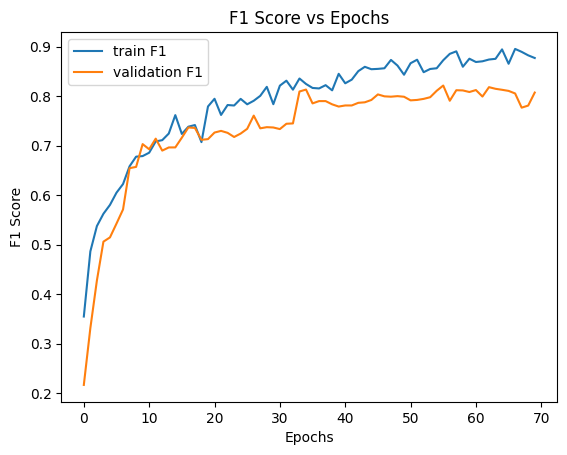

In [ ]:
# Evaluar el modelo
val_loss, val_f1 = model_pless.evaluate(X_val, y_val)
print(f"F1-score en datos de prueba: {val_f1:.2f}")

# Guardar el scaler en un archivo
joblib.dump(scaler_pless, "scaler_pless.pkl")
print("Scaler exportado a scaler_pless.pkl")

# Imprimir gráfico con valores de F1 durante el entrenamiento
plt.title('F1 Score vs Epochs')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.plot(history_pless.history['f1_score'], label='train F1')
plt.plot(history_pless.history['val_f1_score'], label='validation F1')
plt.legend()
plt.show()

Contrario a lo que se presuponía, este modelo no mejoró las métricas anteriores, obteniéndose un puntaje f1=0.8140 para validación y 0.8626 para train en la mejor época, notándose además un mayor sobreajuste.

####9.2.3.Matriz de confusión

In [ ]:
# Separar las coordenadas x, y y aplanarlas
coordinates_test = np.array([np.array(row[2]).flatten() for row in dataset_test])
labels_test = np.array([row[1] for row in dataset_test])

X_test = coordinates_test
X_test = scaler_pless.transform(X_test)
y_test = to_categorical(labels_test, num_classes=3)

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


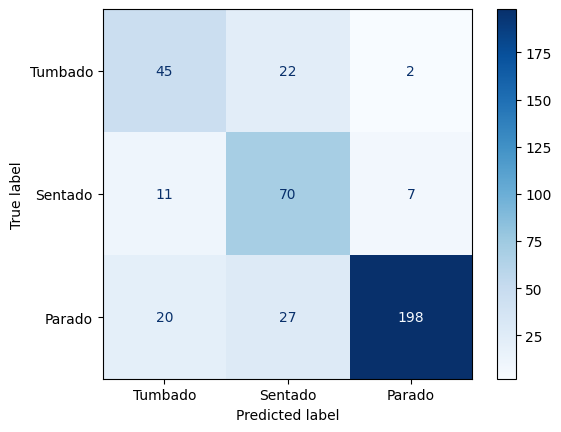

In [ ]:
# Cargar el modelo
model_pless = load_model("model_pless.h5")

# Predicciones y etiquetas verdaderas
y_pred = model_pless.predict(X_test).argmax(axis=1)
y_true = y_test.argmax(axis=1)

# Crear la matriz de confusión
cm = confusion_matrix(y_true, y_pred)

# Definir las etiquetas de las clases
class_labels = ["Tumbado", "Sentado", "Parado"]

# Mostrar la matriz de confusión con etiquetas personalizadas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
disp.plot(cmap="Blues")  # Puedes cambiar el colormap si lo deseas

La precisión de la clase "Parado" sigue siendo óptima, con un valor de 0.956, pero las demás disminuyen, siendo de 0.592 y 0.588 para las clases "Tumbado" y "Sentado" respectivamente.

###9.3.Tercer prueba: model_p_auto99

Utilizando el modelo model_p, se etiquetan todas las imágenes de los conjuntos de train y val, cuya probabilidad de predicción de clase se encuentre por encima de un umbral fijado en 0.99.

####9.3.1.Etiquetado automático labels_auto99

In [ ]:
auto_label_images(
    model_k=model_k,
    model_p=model_p,
    scaler=scaler_p,
    images_path="./datasets/dog-pose/train/images",
    lesskeypoints_list=keypoints_list,
    output_json="labels_train_auto99.json",
    threshold=0.99
    #num_images=1000
)

Etiquetas cargadas desde labels_auto99.json. Total: 3100 imágenes etiquetadas.


Etiquetando imágenes:   0%|          | 0/3184 [00:00<?, ?it/s]


0: 320x320 1 dog, 46.0ms
Speed: 1.5ms preprocess, 46.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   0%|          | 1/3184 [00:00<06:47,  7.81it/s]

Etiqueta descartada para 'n02093754_6248.jpg' (Probabilidad: 0.98)

0: 320x288 1 dog, 40.6ms
Speed: 1.4ms preprocess, 40.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:   0%|          | 2/3184 [00:00<06:20,  8.36it/s]

Etiqueta descartada para 'n02106662_15647.jpg' (Probabilidad: 0.86)

0: 320x256 1 dog, 39.1ms
Speed: 2.6ms preprocess, 39.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   0%|          | 3/3184 [00:00<06:14,  8.50it/s]

Etiqueta descartada para 'n02105505_3904.jpg' (Probabilidad: 0.87)

0: 256x320 1 dog, 39.5ms
Speed: 1.7ms preprocess, 39.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   0%|          | 4/3184 [00:00<06:17,  8.43it/s]

Etiqueta descartada para 'n02093754_1464.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 37.6ms
Speed: 2.2ms preprocess, 37.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:   0%|          | 5/3184 [00:00<06:00,  8.81it/s]

Etiqueta descartada para 'n02108089_4865.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 37.2ms
Speed: 1.4ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   0%|          | 6/3184 [00:00<05:52,  9.01it/s]

Etiqueta descartada para 'n02101006_2902.jpg' (Probabilidad: 0.60)

0: 320x320 2 dogs, 40.7ms
Speed: 2.0ms preprocess, 40.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:   0%|          | 7/3184 [00:00<05:48,  9.12it/s]

Etiqueta descartada para 'n02097298_6474.jpg' (Probabilidad: 0.87)

0: 320x256 1 dog, 37.9ms
Speed: 1.9ms preprocess, 37.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   0%|          | 8/3184 [00:00<05:40,  9.34it/s]

Etiqueta descartada para 'n02097130_978.jpg' (Probabilidad: 0.96)

0: 320x224 1 dog, 34.8ms
Speed: 1.1ms preprocess, 34.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   0%|          | 9/3184 [00:00<05:33,  9.51it/s]

Etiqueta descartada para 'n02111277_11530.jpg' (Probabilidad: 0.74)

0: 256x320 1 dog, 40.2ms
Speed: 2.1ms preprocess, 40.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   0%|          | 10/3184 [00:01<05:36,  9.42it/s]

Etiqueta descartada para 'n02101388_2021.jpg' (Probabilidad: 0.83)

0: 224x320 1 dog, 34.8ms
Speed: 1.1ms preprocess, 34.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   0%|          | 11/3184 [00:01<05:35,  9.46it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02098286_771.jpg'

0: 256x320 1 dog, 41.3ms
Speed: 2.1ms preprocess, 41.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   0%|          | 12/3184 [00:01<05:44,  9.22it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02102480_7629.jpg'

0: 256x320 2 dogs, 38.8ms
Speed: 1.2ms preprocess, 38.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   0%|          | 13/3184 [00:01<05:45,  9.17it/s]

Etiqueta descartada para 'n02093647_28.jpg' (Probabilidad: 0.68)

0: 256x320 1 dog, 39.0ms
Speed: 1.5ms preprocess, 39.0ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   0%|          | 14/3184 [00:01<05:51,  9.01it/s]

Etiqueta descartada para 'n02112137_3467.jpg' (Probabilidad: 0.94)

0: 224x320 1 dog, 35.6ms
Speed: 1.0ms preprocess, 35.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   0%|          | 15/3184 [00:01<05:48,  9.09it/s]

Etiqueta descartada para 'n02091831_725.jpg' (Probabilidad: 0.83)

0: 320x224 1 dog, 36.8ms
Speed: 1.7ms preprocess, 36.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   1%|          | 16/3184 [00:01<05:42,  9.25it/s]

Etiqueta descartada para 'n02092002_3988.jpg' (Probabilidad: 0.87)

0: 256x320 1 dog, 36.3ms
Speed: 1.8ms preprocess, 36.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   1%|          | 17/3184 [00:01<05:46,  9.15it/s]

Etiqueta descartada para 'n02095570_4256.jpg' (Probabilidad: 0.88)

0: 320x224 1 dog, 37.0ms
Speed: 1.4ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   1%|          | 18/3184 [00:01<05:44,  9.20it/s]

Etiqueta descartada para 'n02108000_1625.jpg' (Probabilidad: 0.96)

0: 320x320 2 dogs, 44.4ms
Speed: 1.3ms preprocess, 44.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   1%|          | 19/3184 [00:02<05:50,  9.04it/s]

Etiqueta descartada para 'n02108000_1891.jpg' (Probabilidad: 0.85)

0: 224x320 1 dog, 33.5ms
Speed: 1.7ms preprocess, 33.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   1%|          | 20/3184 [00:02<05:41,  9.26it/s]

Etiqueta descartada para 'n02107908_7259.jpg' (Probabilidad: 0.88)

0: 320x256 1 dog, 39.7ms
Speed: 1.1ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   1%|          | 21/3184 [00:02<05:40,  9.29it/s]

Etiqueta descartada para 'n02108000_3682.jpg' (Probabilidad: 0.98)

0: 320x256 1 dog, 36.4ms
Speed: 1.0ms preprocess, 36.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   1%|          | 22/3184 [00:02<05:48,  9.08it/s]

Etiqueta descartada para 'n02097474_5074.jpg' (Probabilidad: 0.89)

0: 224x320 1 dog, 37.9ms
Speed: 2.2ms preprocess, 37.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:   1%|          | 23/3184 [00:02<06:02,  8.72it/s]

Etiqueta descartada para 'n02104365_8998.jpg' (Probabilidad: 0.76)

0: 256x320 1 dog, 47.9ms
Speed: 2.0ms preprocess, 47.9ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Etiqueta descartada para 'n02097130_5840.jpg' (Probabilidad: 0.94)


Etiquetando imágenes:   1%|          | 24/3184 [00:02<06:12,  8.48it/s]


0: 320x256 1 dog, 37.6ms
Speed: 1.3ms preprocess, 37.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   1%|          | 25/3184 [00:02<06:07,  8.59it/s]

Etiqueta descartada para 'n02107574_530.jpg' (Probabilidad: 0.38)

0: 320x320 1 dog, 41.7ms
Speed: 1.5ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   1%|          | 26/3184 [00:02<06:08,  8.57it/s]

Etiqueta descartada para 'n02098286_6245.jpg' (Probabilidad: 0.98)

0: 320x256 1 dog, 37.2ms
Speed: 1.8ms preprocess, 37.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   1%|          | 27/3184 [00:03<06:03,  8.68it/s]

Etiqueta descartada para 'n02092339_3171.jpg' (Probabilidad: 0.91)

0: 256x320 1 dog, 37.3ms
Speed: 1.3ms preprocess, 37.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:   1%|          | 28/3184 [00:03<05:54,  8.90it/s]

Etiqueta descartada para 'n02102177_1702.jpg' (Probabilidad: 0.53)

0: 320x224 1 dog, 35.6ms
Speed: 1.3ms preprocess, 35.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   1%|          | 29/3184 [00:03<05:48,  9.06it/s]

Etiqueta descartada para 'n02109525_6593.jpg' (Probabilidad: 0.81)

0: 320x288 1 dog, 39.2ms
Speed: 1.2ms preprocess, 39.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   1%|          | 30/3184 [00:03<05:45,  9.13it/s]

Etiqueta 'Sentado' generada para la imagen 'n02090721_3763.jpg'

0: 224x320 1 dog, 44.5ms
Speed: 1.3ms preprocess, 44.5ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   1%|          | 31/3184 [00:03<05:49,  9.03it/s]

Etiqueta descartada para 'n02105641_1212.jpg' (Probabilidad: 0.97)

0: 320x288 1 dog, 42.1ms
Speed: 2.0ms preprocess, 42.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   1%|          | 32/3184 [00:03<05:59,  8.78it/s]

Etiqueta descartada para 'n02099849_4406.jpg' (Probabilidad: 0.95)

0: 320x192 1 dog, 36.8ms
Speed: 1.9ms preprocess, 36.8ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:   1%|          | 33/3184 [00:03<05:46,  9.09it/s]

Etiqueta descartada para 'n02089078_353.jpg' (Probabilidad: 0.93)

0: 256x320 1 dog, 37.1ms
Speed: 1.2ms preprocess, 37.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:   1%|          | 34/3184 [00:03<05:39,  9.27it/s]

Etiqueta 'Parado' generada para la imagen 'n02105505_3002.jpg'

0: 320x256 1 dog, 39.0ms
Speed: 1.4ms preprocess, 39.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   1%|          | 35/3184 [00:03<05:47,  9.05it/s]

Etiqueta descartada para 'n02100735_5054.jpg' (Probabilidad: 0.42)

0: 256x320 1 dog, 39.3ms
Speed: 1.3ms preprocess, 39.3ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   1%|          | 36/3184 [00:04<05:49,  9.00it/s]

Etiqueta descartada para 'n02096294_5531.jpg' (Probabilidad: 0.86)

0: 224x320 1 dog, 35.0ms
Speed: 2.1ms preprocess, 35.0ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   1%|          | 37/3184 [00:04<05:47,  9.07it/s]

Etiqueta descartada para 'n02095570_1445.jpg' (Probabilidad: 0.79)

0: 288x320 1 dog, 40.1ms
Speed: 1.7ms preprocess, 40.1ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   1%|          | 38/3184 [00:04<05:49,  9.01it/s]

Etiqueta descartada para 'n02095889_1820.jpg' (Probabilidad: 0.55)

0: 320x256 1 dog, 36.8ms
Speed: 1.3ms preprocess, 36.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   1%|          | 39/3184 [00:04<05:51,  8.94it/s]

Etiqueta descartada para 'n02097658_6014.jpg' (Probabilidad: 0.93)

0: 320x256 1 dog, 40.1ms
Speed: 1.1ms preprocess, 40.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   1%|▏         | 40/3184 [00:04<05:53,  8.89it/s]

Etiqueta 'Sentado' generada para la imagen 'n02096177_4082.jpg'

0: 288x320 1 dog, 44.3ms
Speed: 1.4ms preprocess, 44.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   1%|▏         | 41/3184 [00:04<05:58,  8.78it/s]

Etiqueta 'Parado' generada para la imagen 'n02108000_1516.jpg'

0: 224x320 1 dog, 36.8ms
Speed: 1.5ms preprocess, 36.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   1%|▏         | 42/3184 [00:04<05:55,  8.85it/s]

Etiqueta descartada para 'n02101388_5274.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 37.1ms
Speed: 1.0ms preprocess, 37.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   1%|▏         | 43/3184 [00:04<05:50,  8.96it/s]

Etiqueta descartada para 'n02102040_3562.jpg' (Probabilidad: 0.71)

0: 320x192 1 dog, 43.6ms
Speed: 2.0ms preprocess, 43.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   1%|▏         | 44/3184 [00:04<05:54,  8.86it/s]

Etiqueta descartada para 'n02106662_21432.jpg' (Probabilidad: 0.98)

0: 320x288 1 dog, 39.9ms
Speed: 1.8ms preprocess, 39.9ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   1%|▏         | 45/3184 [00:05<05:53,  8.88it/s]

Etiqueta descartada para 'n02108000_710.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 38.9ms
Speed: 2.1ms preprocess, 38.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   1%|▏         | 46/3184 [00:05<05:54,  8.86it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02094114_4127.jpg'

0: 320x224 3 dogs, 36.7ms
Speed: 1.4ms preprocess, 36.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:   1%|▏         | 47/3184 [00:05<05:58,  8.76it/s]

Etiqueta descartada para 'n02090622_7962.jpg' (Probabilidad: 0.91)

0: 256x320 1 dog, 40.4ms
Speed: 1.3ms preprocess, 40.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   2%|▏         | 48/3184 [00:05<05:59,  8.73it/s]

Etiqueta descartada para 'n02099849_448.jpg' (Probabilidad: 0.78)

0: 256x320 1 dog, 42.4ms
Speed: 1.9ms preprocess, 42.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   2%|▏         | 49/3184 [00:05<05:59,  8.72it/s]

Etiqueta descartada para 'n02107312_6487.jpg' (Probabilidad: 0.89)

0: 320x320 1 dog, 42.7ms
Speed: 1.2ms preprocess, 42.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   2%|▏         | 50/3184 [00:05<06:05,  8.59it/s]

Etiqueta descartada para 'n02096051_8613.jpg' (Probabilidad: 0.77)

0: 320x224 1 dog, 37.3ms
Speed: 1.4ms preprocess, 37.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   2%|▏         | 51/3184 [00:05<05:54,  8.84it/s]

Etiqueta 'Sentado' generada para la imagen 'n02108000_2742.jpg'

0: 320x256 1 dog, 38.6ms
Speed: 1.6ms preprocess, 38.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   2%|▏         | 52/3184 [00:05<05:52,  8.89it/s]

Etiqueta descartada para 'n02088632_1831.jpg' (Probabilidad: 0.99)

0: 224x320 1 dog, 36.5ms
Speed: 1.1ms preprocess, 36.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   2%|▏         | 53/3184 [00:05<05:50,  8.92it/s]

Etiqueta descartada para 'n02096177_729.jpg' (Probabilidad: 0.82)

0: 320x256 1 dog, 38.7ms
Speed: 1.1ms preprocess, 38.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   2%|▏         | 54/3184 [00:06<05:52,  8.89it/s]

Etiqueta descartada para 'n02090721_2651.jpg' (Probabilidad: 0.96)

0: 320x224 1 dog, 35.3ms
Speed: 1.2ms preprocess, 35.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Etiqueta descartada para 'n02090379_1515.jpg' (Probabilidad: 0.98)

0: 256x320 (no detections), 35.5ms
Speed: 2.0ms preprocess, 35.5ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 320)


Etiquetando imágenes:   2%|▏         | 56/3184 [00:06<04:55, 10.60it/s]

Error procesando la imagen n02091134_18590.jpg: list index out of range

0: 256x320 1 dog, 35.9ms
Speed: 1.1ms preprocess, 35.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Etiqueta descartada para 'n02105855_7495.jpg' (Probabilidad: 0.50)

0: 256x320 1 dog, 36.6ms
Speed: 2.3ms preprocess, 36.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   2%|▏         | 58/3184 [00:06<05:11, 10.03it/s]

Etiqueta descartada para 'n02099849_2462.jpg' (Probabilidad: 0.57)

0: 256x320 1 dog, 39.1ms
Speed: 1.1ms preprocess, 39.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Etiqueta 'Sentado' generada para la imagen 'n02090622_8814.jpg'

0: 256x320 1 dog, 41.2ms
Speed: 1.5ms preprocess, 41.2ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   2%|▏         | 60/3184 [00:06<05:30,  9.46it/s]

Etiqueta descartada para 'n02110063_8514.jpg' (Probabilidad: 0.73)

0: 320x320 1 dog, 39.9ms
Speed: 1.4ms preprocess, 39.9ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   2%|▏         | 61/3184 [00:06<05:37,  9.24it/s]

Etiqueta 'Parado' generada para la imagen 'n02096294_1803.jpg'

0: 224x320 1 dog, 37.0ms
Speed: 1.0ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   2%|▏         | 62/3184 [00:06<05:38,  9.22it/s]

Etiqueta descartada para 'n02100877_1803.jpg' (Probabilidad: 0.96)

0: 320x256 1 dog, 36.7ms
Speed: 1.4ms preprocess, 36.7ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   2%|▏         | 63/3184 [00:06<05:41,  9.14it/s]

Etiqueta descartada para 'n02092339_6543.jpg' (Probabilidad: 0.89)

0: 224x320 1 dog, 35.5ms
Speed: 1.3ms preprocess, 35.5ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   2%|▏         | 64/3184 [00:07<05:37,  9.24it/s]

Etiqueta 'Sentado' generada para la imagen 'n02092339_4965.jpg'

0: 256x320 2 dogs, 38.6ms
Speed: 1.1ms preprocess, 38.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   2%|▏         | 65/3184 [00:07<05:39,  9.17it/s]

Etiqueta descartada para 'n02108000_2248.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 39.8ms
Speed: 1.0ms preprocess, 39.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   2%|▏         | 66/3184 [00:07<05:40,  9.15it/s]

Etiqueta descartada para 'n02090622_6293.jpg' (Probabilidad: 0.62)

0: 320x224 1 dog, 36.0ms
Speed: 2.2ms preprocess, 36.0ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   2%|▏         | 67/3184 [00:07<05:51,  8.86it/s]

Etiqueta descartada para 'n02093754_123.jpg' (Probabilidad: 0.67)

0: 224x320 1 dog, 37.7ms
Speed: 1.6ms preprocess, 37.7ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   2%|▏         | 68/3184 [00:07<05:53,  8.82it/s]

Etiqueta descartada para 'n02099849_3007.jpg' (Probabilidad: 0.50)

0: 256x320 1 dog, 36.2ms
Speed: 1.4ms preprocess, 36.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   2%|▏         | 69/3184 [00:07<05:50,  8.88it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02108915_4474.jpg'

0: 320x320 1 dog, 40.6ms
Speed: 1.3ms preprocess, 40.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   2%|▏         | 70/3184 [00:07<05:49,  8.92it/s]

Etiqueta 'Sentado' generada para la imagen 'n02089867_148.jpg'

0: 320x256 1 dog, 38.9ms
Speed: 1.4ms preprocess, 38.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   2%|▏         | 71/3184 [00:07<05:48,  8.94it/s]

Etiqueta 'Sentado' generada para la imagen 'n02099601_5764.jpg'

0: 256x320 1 dog, 37.2ms
Speed: 1.9ms preprocess, 37.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   2%|▏         | 72/3184 [00:07<05:54,  8.79it/s]

Etiqueta descartada para 'n02096294_4440.jpg' (Probabilidad: 0.91)

0: 224x320 1 dog, 35.2ms
Speed: 1.6ms preprocess, 35.2ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   2%|▏         | 73/3184 [00:08<05:51,  8.84it/s]

Etiqueta descartada para 'n02108551_5830.jpg' (Probabilidad: 0.52)

0: 256x320 1 dog, 37.2ms
Speed: 1.2ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   2%|▏         | 74/3184 [00:08<05:46,  8.98it/s]

Etiqueta descartada para 'n02102480_5031.jpg' (Probabilidad: 0.57)

0: 256x320 1 dog, 44.9ms
Speed: 1.3ms preprocess, 44.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   2%|▏         | 75/3184 [00:08<05:54,  8.78it/s]

Etiqueta descartada para 'n02093991_5001.jpg' (Probabilidad: 0.52)

0: 288x320 1 dog, 42.9ms
Speed: 1.8ms preprocess, 42.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   2%|▏         | 76/3184 [00:08<06:03,  8.55it/s]

Etiqueta descartada para 'n02089867_942.jpg' (Probabilidad: 0.94)

0: 320x288 1 dog, 62.8ms
Speed: 2.1ms preprocess, 62.8ms inference, 1.8ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   2%|▏         | 77/3184 [00:08<06:25,  8.05it/s]

Etiqueta descartada para 'n02102040_1976.jpg' (Probabilidad: 0.80)

0: 224x320 1 dog, 41.6ms
Speed: 1.7ms preprocess, 41.6ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   2%|▏         | 78/3184 [00:08<06:16,  8.24it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02098105_1777.jpg'

0: 256x320 1 dog, 38.7ms
Speed: 1.6ms preprocess, 38.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   2%|▏         | 79/3184 [00:08<06:05,  8.50it/s]

Etiqueta descartada para 'n02093256_1489.jpg' (Probabilidad: 0.70)

0: 320x320 2 dogs, 41.6ms
Speed: 1.6ms preprocess, 41.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   3%|▎         | 80/3184 [00:08<05:57,  8.68it/s]

Etiqueta descartada para 'n02097298_1451.jpg' (Probabilidad: 0.61)

0: 256x320 1 dog, 39.9ms
Speed: 1.6ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   3%|▎         | 81/3184 [00:09<05:49,  8.87it/s]

Etiqueta descartada para 'n02088364_14863.jpg' (Probabilidad: 0.62)

0: 320x320 2 dogs, 41.9ms
Speed: 1.2ms preprocess, 41.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   3%|▎         | 82/3184 [00:09<05:53,  8.78it/s]

Etiqueta descartada para 'n02093859_3310.jpg' (Probabilidad: 0.99)

0: 320x256 1 dog, 36.9ms
Speed: 1.6ms preprocess, 36.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   3%|▎         | 83/3184 [00:09<05:49,  8.87it/s]

Etiqueta descartada para 'n02097209_1186.jpg' (Probabilidad: 0.69)

0: 256x320 1 dog, 38.1ms
Speed: 1.6ms preprocess, 38.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:   3%|▎         | 84/3184 [00:09<06:01,  8.58it/s]

Etiqueta descartada para 'n02108915_5367.jpg' (Probabilidad: 0.58)

0: 256x320 1 dog, 37.2ms
Speed: 1.4ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   3%|▎         | 85/3184 [00:09<05:57,  8.66it/s]

Etiqueta descartada para 'n02096051_6733.jpg' (Probabilidad: 0.96)

0: 320x256 1 dog, 45.9ms
Speed: 2.0ms preprocess, 45.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   3%|▎         | 86/3184 [00:09<06:07,  8.43it/s]

Etiqueta descartada para 'n02110806_1179.jpg' (Probabilidad: 0.87)

0: 256x320 1 dog, 70.6ms
Speed: 3.0ms preprocess, 70.6ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:   3%|▎         | 87/3184 [00:09<06:36,  7.81it/s]

Etiqueta descartada para 'n02097047_581.jpg' (Probabilidad: 0.73)

0: 320x224 1 dog, 36.9ms
Speed: 2.4ms preprocess, 36.9ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   3%|▎         | 88/3184 [00:09<06:21,  8.10it/s]

Etiqueta 'Parado' generada para la imagen 'n02110185_2701.jpg'

0: 320x320 1 dog, 40.6ms
Speed: 3.0ms preprocess, 40.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   3%|▎         | 89/3184 [00:09<06:14,  8.27it/s]

Etiqueta 'Parado' generada para la imagen 'n02105162_6459.jpg'

0: 224x320 2 dogs, 53.0ms
Speed: 9.5ms preprocess, 53.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   3%|▎         | 90/3184 [00:10<06:32,  7.88it/s]

Etiqueta descartada para 'n02098286_545.jpg' (Probabilidad: 0.86)

0: 224x320 1 dog, 41.0ms
Speed: 3.1ms preprocess, 41.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   3%|▎         | 91/3184 [00:10<06:26,  8.01it/s]

Etiqueta 'Parado' generada para la imagen 'n02093859_2579.jpg'

0: 320x256 1 dog, 54.3ms
Speed: 4.2ms preprocess, 54.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   3%|▎         | 92/3184 [00:10<06:33,  7.85it/s]

Etiqueta descartada para 'n02097658_9136.jpg' (Probabilidad: 0.42)

0: 224x320 1 dog, 44.3ms
Speed: 4.3ms preprocess, 44.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   3%|▎         | 93/3184 [00:10<06:32,  7.87it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02097209_4206.jpg'

0: 224x320 1 dog, 65.8ms
Speed: 3.6ms preprocess, 65.8ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   3%|▎         | 94/3184 [00:10<06:40,  7.72it/s]

Etiqueta 'Parado' generada para la imagen 'n02091467_5184.jpg'

0: 256x320 1 dog, 61.6ms
Speed: 3.5ms preprocess, 61.6ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:   3%|▎         | 95/3184 [00:10<06:45,  7.62it/s]

Etiqueta descartada para 'n02091134_15038.jpg' (Probabilidad: 0.95)

0: 288x320 1 dog, 44.0ms
Speed: 1.4ms preprocess, 44.0ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:   3%|▎         | 96/3184 [00:10<06:48,  7.55it/s]

Etiqueta descartada para 'n02111500_7444.jpg' (Probabilidad: 0.89)

0: 320x256 1 dog, 47.0ms
Speed: 2.8ms preprocess, 47.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   3%|▎         | 97/3184 [00:11<06:44,  7.64it/s]

Etiqueta descartada para 'n02105251_3746.jpg' (Probabilidad: 0.52)

0: 320x224 1 dog, 38.1ms
Speed: 5.8ms preprocess, 38.1ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   3%|▎         | 98/3184 [00:11<06:33,  7.85it/s]

Etiqueta descartada para 'n02111889_10084.jpg' (Probabilidad: 0.94)

0: 320x224 1 dog, 41.1ms
Speed: 1.5ms preprocess, 41.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   3%|▎         | 99/3184 [00:11<06:20,  8.11it/s]

Etiqueta 'Sentado' generada para la imagen 'n02096585_11836.jpg'

0: 256x320 1 dog, 38.4ms
Speed: 1.6ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   3%|▎         | 100/3184 [00:11<06:14,  8.25it/s]

Etiqueta descartada para 'n02108089_5043.jpg' (Probabilidad: 0.77)

0: 224x320 1 dog, 50.6ms
Speed: 1.5ms preprocess, 50.6ms inference, 1.4ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   3%|▎         | 101/3184 [00:11<06:22,  8.07it/s]

Etiqueta 'Sentado' generada para la imagen 'n02099712_5679.jpg'

0: 256x320 1 dog, 50.7ms
Speed: 3.7ms preprocess, 50.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   3%|▎         | 102/3184 [00:11<06:25,  8.00it/s]

Etiqueta descartada para 'n02095570_393.jpg' (Probabilidad: 0.90)

0: 320x320 1 dog, 42.6ms
Speed: 3.5ms preprocess, 42.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   3%|▎         | 103/3184 [00:11<06:22,  8.06it/s]

Etiqueta descartada para 'n02106662_808.jpg' (Probabilidad: 0.92)

0: 320x224 1 dog, 39.3ms
Speed: 5.8ms preprocess, 39.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   3%|▎         | 104/3184 [00:11<06:14,  8.21it/s]

Etiqueta descartada para 'n02105505_2101.jpg' (Probabilidad: 0.70)

0: 256x320 1 dog, 38.9ms
Speed: 5.0ms preprocess, 38.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   3%|▎         | 105/3184 [00:12<06:15,  8.20it/s]

Etiqueta descartada para 'n02097130_888.jpg' (Probabilidad: 0.95)

0: 224x320 1 dog, 38.4ms
Speed: 3.6ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   3%|▎         | 106/3184 [00:12<06:11,  8.28it/s]

Etiqueta descartada para 'n02105251_5309.jpg' (Probabilidad: 0.49)

0: 320x224 1 dog, 38.7ms
Speed: 2.3ms preprocess, 38.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   3%|▎         | 107/3184 [00:12<06:07,  8.37it/s]

Etiqueta descartada para 'n02091032_1072.jpg' (Probabilidad: 0.77)

0: 256x320 1 dog, 56.2ms
Speed: 1.5ms preprocess, 56.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:   3%|▎         | 108/3184 [00:12<06:29,  7.89it/s]

Etiqueta descartada para 'n02097474_4889.jpg' (Probabilidad: 0.95)

0: 320x224 1 dog, 49.6ms
Speed: 3.5ms preprocess, 49.6ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:   3%|▎         | 109/3184 [00:12<06:41,  7.66it/s]

Etiqueta descartada para 'n02095570_4656.jpg' (Probabilidad: 0.93)

0: 320x256 1 dog, 68.9ms
Speed: 1.9ms preprocess, 68.9ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   3%|▎         | 110/3184 [00:12<06:52,  7.44it/s]

Etiqueta descartada para 'n02107908_3991.jpg' (Probabilidad: 0.73)

0: 320x192 1 dog, 37.1ms
Speed: 3.5ms preprocess, 37.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   3%|▎         | 111/3184 [00:12<06:39,  7.70it/s]

Etiqueta descartada para 'n02095314_397.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 42.1ms
Speed: 1.7ms preprocess, 42.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   4%|▎         | 112/3184 [00:12<06:26,  7.95it/s]

Etiqueta descartada para 'n02090721_5373.jpg' (Probabilidad: 0.54)

0: 224x320 1 dog, 36.0ms
Speed: 2.8ms preprocess, 36.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   4%|▎         | 113/3184 [00:13<06:12,  8.24it/s]

Etiqueta descartada para 'n02100583_6740.jpg' (Probabilidad: 0.84)

0: 256x320 1 dog, 35.6ms
Speed: 3.5ms preprocess, 35.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   4%|▎         | 114/3184 [00:13<05:57,  8.58it/s]

Etiqueta 'Sentado' generada para la imagen 'n02100236_689.jpg'

0: 256x320 3 dogs, 36.6ms
Speed: 1.3ms preprocess, 36.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   4%|▎         | 115/3184 [00:13<05:43,  8.93it/s]

Etiqueta descartada para 'n02088364_6547.jpg' (Probabilidad: 0.74)

0: 224x320 1 dog, 34.8ms
Speed: 2.1ms preprocess, 34.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   4%|▎         | 116/3184 [00:13<05:40,  9.02it/s]

Etiqueta descartada para 'n02105412_4669.jpg' (Probabilidad: 0.83)

0: 320x256 1 dog, 39.9ms
Speed: 1.3ms preprocess, 39.9ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   4%|▎         | 117/3184 [00:13<05:54,  8.66it/s]

Etiqueta descartada para 'n02098286_6516.jpg' (Probabilidad: 0.68)

0: 320x288 1 dog, 42.2ms
Speed: 2.7ms preprocess, 42.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   4%|▎         | 118/3184 [00:13<05:58,  8.55it/s]

Etiqueta descartada para 'n02088466_5898.jpg' (Probabilidad: 0.86)

0: 224x320 1 dog, 38.3ms
Speed: 2.1ms preprocess, 38.3ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:   4%|▎         | 119/3184 [00:13<05:43,  8.93it/s]

Etiqueta descartada para 'n02095889_2851.jpg' (Probabilidad: 0.60)

0: 256x320 1 dog, 38.8ms
Speed: 1.3ms preprocess, 38.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   4%|▍         | 120/3184 [00:13<05:52,  8.70it/s]

Etiqueta descartada para 'n02107683_4515.jpg' (Probabilidad: 0.53)

0: 256x320 1 dog, 33.4ms
Speed: 1.9ms preprocess, 33.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   4%|▍         | 121/3184 [00:13<05:46,  8.85it/s]

Etiqueta descartada para 'n02093256_7830.jpg' (Probabilidad: 0.73)

0: 224x320 1 dog, 44.4ms
Speed: 2.1ms preprocess, 44.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   4%|▍         | 122/3184 [00:14<05:46,  8.84it/s]

Etiqueta descartada para 'n02105641_4443.jpg' (Probabilidad: 0.82)

0: 224x320 1 dog, 34.4ms
Speed: 1.4ms preprocess, 34.4ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   4%|▍         | 123/3184 [00:14<05:41,  8.96it/s]

Etiqueta descartada para 'n02105162_2714.jpg' (Probabilidad: 0.83)

0: 320x192 1 dog, 32.7ms
Speed: 1.4ms preprocess, 32.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   4%|▍         | 124/3184 [00:14<05:33,  9.18it/s]

Etiqueta descartada para 'n02101006_3748.jpg' (Probabilidad: 0.87)

0: 320x256 1 dog, 36.0ms
Speed: 1.2ms preprocess, 36.0ms inference, 1.6ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   4%|▍         | 125/3184 [00:14<05:35,  9.12it/s]

Etiqueta descartada para 'n02096051_3619.jpg' (Probabilidad: 0.84)

0: 224x320 1 dog, 40.0ms
Speed: 1.2ms preprocess, 40.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   4%|▍         | 126/3184 [00:14<05:38,  9.03it/s]

Etiqueta descartada para 'n02107574_1817.jpg' (Probabilidad: 0.51)

0: 256x320 1 dog, 39.8ms
Speed: 1.4ms preprocess, 39.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   4%|▍         | 127/3184 [00:14<05:42,  8.93it/s]

Etiqueta descartada para 'n02105162_5252.jpg' (Probabilidad: 0.66)

0: 320x288 1 dog, 43.8ms
Speed: 1.6ms preprocess, 43.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   4%|▍         | 128/3184 [00:14<05:40,  8.97it/s]

Etiqueta descartada para 'n02089867_671.jpg' (Probabilidad: 0.59)

0: 320x256 1 dog, 37.2ms
Speed: 1.2ms preprocess, 37.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   4%|▍         | 129/3184 [00:14<05:33,  9.16it/s]

Etiqueta descartada para 'n02100735_6358.jpg' (Probabilidad: 0.67)

0: 256x320 1 dog, 36.1ms
Speed: 1.5ms preprocess, 36.1ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   4%|▍         | 130/3184 [00:14<05:36,  9.08it/s]

Etiqueta descartada para 'n02093428_17280.jpg' (Probabilidad: 0.95)

0: 320x224 1 dog, 37.2ms
Speed: 1.4ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   4%|▍         | 131/3184 [00:15<05:33,  9.16it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02102040_6248.jpg'

0: 320x256 1 dog, 37.6ms
Speed: 1.1ms preprocess, 37.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:   4%|▍         | 132/3184 [00:15<05:41,  8.94it/s]

Etiqueta descartada para 'n02105056_3530.jpg' (Probabilidad: 0.98)

0: 320x320 1 dog, 42.5ms
Speed: 1.4ms preprocess, 42.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   4%|▍         | 133/3184 [00:15<05:50,  8.70it/s]

Etiqueta 'Parado' generada para la imagen 'n02094433_4624.jpg'

0: 320x320 2 dogs, 43.0ms
Speed: 2.2ms preprocess, 43.0ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   4%|▍         | 134/3184 [00:15<05:58,  8.50it/s]

Etiqueta descartada para 'n02091635_335.jpg' (Probabilidad: 0.87)

0: 256x320 1 dog, 43.2ms
Speed: 3.8ms preprocess, 43.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   4%|▍         | 135/3184 [00:15<06:05,  8.34it/s]

Etiqueta descartada para 'n02109961_6221.jpg' (Probabilidad: 0.87)

0: 224x320 1 dog, 38.5ms
Speed: 2.5ms preprocess, 38.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   4%|▍         | 136/3184 [00:15<06:00,  8.45it/s]

Etiqueta descartada para 'n02105641_13952.jpg' (Probabilidad: 0.63)

0: 256x320 1 dog, 37.1ms
Speed: 1.3ms preprocess, 37.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   4%|▍         | 137/3184 [00:15<05:49,  8.71it/s]

Etiqueta descartada para 'n02096437_4.jpg' (Probabilidad: 0.97)

0: 320x224 1 dog, 34.7ms
Speed: 4.0ms preprocess, 34.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   4%|▍         | 138/3184 [00:15<05:42,  8.89it/s]

Etiqueta descartada para 'n02098105_1615.jpg' (Probabilidad: 0.86)

0: 224x320 1 dog, 33.8ms
Speed: 1.2ms preprocess, 33.8ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   4%|▍         | 139/3184 [00:15<05:36,  9.05it/s]

Etiqueta 'Parado' generada para la imagen 'n02112137_8637.jpg'

0: 320x224 1 dog, 37.3ms
Speed: 1.9ms preprocess, 37.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   4%|▍         | 140/3184 [00:16<05:41,  8.92it/s]

Etiqueta descartada para 'n02108422_647.jpg' (Probabilidad: 0.97)

0: 320x288 1 dog, 37.7ms
Speed: 1.6ms preprocess, 37.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   4%|▍         | 141/3184 [00:16<05:37,  9.01it/s]

Etiqueta descartada para 'n02090379_1476.jpg' (Probabilidad: 0.67)

0: 256x320 1 dog, 37.6ms
Speed: 1.8ms preprocess, 37.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   4%|▍         | 142/3184 [00:16<05:34,  9.09it/s]

Etiqueta descartada para 'n02107683_4402.jpg' (Probabilidad: 0.68)

0: 256x320 1 dog, 38.1ms
Speed: 1.7ms preprocess, 38.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   4%|▍         | 143/3184 [00:16<05:39,  8.95it/s]

Etiqueta 'Parado' generada para la imagen 'n02095889_4165.jpg'

0: 320x224 1 dog, 35.8ms
Speed: 3.3ms preprocess, 35.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   5%|▍         | 144/3184 [00:16<05:42,  8.89it/s]

Etiqueta descartada para 'n02098413_16861.jpg' (Probabilidad: 0.91)

0: 320x224 1 dog, 38.2ms
Speed: 1.8ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:   5%|▍         | 145/3184 [00:16<05:45,  8.79it/s]

Etiqueta 'Parado' generada para la imagen 'n02105412_5288.jpg'

0: 320x256 1 dog, 36.7ms
Speed: 1.4ms preprocess, 36.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   5%|▍         | 146/3184 [00:16<05:48,  8.72it/s]

Etiqueta descartada para 'n02096051_6335.jpg' (Probabilidad: 0.90)

0: 224x320 1 dog, 36.4ms
Speed: 2.3ms preprocess, 36.4ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   5%|▍         | 147/3184 [00:16<05:43,  8.85it/s]

Etiqueta descartada para 'n02098286_2743.jpg' (Probabilidad: 0.68)

0: 320x224 1 dog, 35.3ms
Speed: 1.2ms preprocess, 35.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   5%|▍         | 148/3184 [00:16<05:37,  9.00it/s]

Etiqueta descartada para 'n02091134_16337.jpg' (Probabilidad: 0.96)

0: 320x320 1 dog, 44.4ms
Speed: 2.1ms preprocess, 44.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   5%|▍         | 149/3184 [00:17<05:43,  8.84it/s]

Etiqueta descartada para 'n02112350_464.jpg' (Probabilidad: 0.82)

0: 320x288 2 dogs, 41.4ms
Speed: 1.2ms preprocess, 41.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   5%|▍         | 150/3184 [00:17<05:44,  8.81it/s]

Etiqueta 'Sentado' generada para la imagen 'n02090721_728.jpg'

0: 320x224 1 dog, 37.9ms
Speed: 1.9ms preprocess, 37.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   5%|▍         | 151/3184 [00:17<05:42,  8.87it/s]

Etiqueta descartada para 'n02094258_81.jpg' (Probabilidad: 0.85)

0: 256x320 1 dog, 40.1ms
Speed: 1.3ms preprocess, 40.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   5%|▍         | 152/3184 [00:17<05:41,  8.89it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02102318_2271.jpg'

0: 320x256 1 dog, 38.2ms
Speed: 3.1ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   5%|▍         | 153/3184 [00:17<05:39,  8.93it/s]

Etiqueta descartada para 'n02097209_3729.jpg' (Probabilidad: 0.80)

0: 256x320 1 dog, 46.5ms
Speed: 1.9ms preprocess, 46.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   5%|▍         | 154/3184 [00:17<05:47,  8.71it/s]

Etiqueta descartada para 'n02107312_4929.jpg' (Probabilidad: 0.66)

0: 320x320 1 dog, 42.5ms
Speed: 1.2ms preprocess, 42.5ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   5%|▍         | 155/3184 [00:17<05:48,  8.69it/s]

Etiqueta descartada para 'n02097298_11133.jpg' (Probabilidad: 0.78)

0: 320x224 2 dogs, 34.1ms
Speed: 1.2ms preprocess, 34.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   5%|▍         | 156/3184 [00:17<05:43,  8.82it/s]

Etiqueta descartada para 'n02094114_297.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 38.2ms
Speed: 3.0ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:   5%|▍         | 157/3184 [00:17<05:46,  8.74it/s]

Etiqueta descartada para 'n02097474_7790.jpg' (Probabilidad: 0.45)

0: 320x224 1 dog, 37.9ms
Speed: 1.9ms preprocess, 37.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   5%|▍         | 158/3184 [00:18<05:48,  8.67it/s]

Etiqueta descartada para 'n02107683_2036.jpg' (Probabilidad: 0.99)

0: 320x224 1 dog, 34.8ms
Speed: 1.4ms preprocess, 34.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   5%|▍         | 159/3184 [00:18<05:55,  8.51it/s]

Etiqueta descartada para 'n02110806_346.jpg' (Probabilidad: 0.99)

0: 288x320 1 dog, 41.5ms
Speed: 1.8ms preprocess, 41.5ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   5%|▌         | 160/3184 [00:18<05:58,  8.43it/s]

Etiqueta descartada para 'n02096437_1551.jpg' (Probabilidad: 0.91)

0: 256x320 1 dog, 42.6ms
Speed: 2.4ms preprocess, 42.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:   5%|▌         | 161/3184 [00:18<06:10,  8.17it/s]

Etiqueta descartada para 'n02096585_1963.jpg' (Probabilidad: 0.84)

0: 320x288 1 dog, 45.4ms
Speed: 1.8ms preprocess, 45.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   5%|▌         | 162/3184 [00:18<06:07,  8.22it/s]

Etiqueta descartada para 'n02100236_3134.jpg' (Probabilidad: 0.88)

0: 320x256 1 dog, 40.2ms
Speed: 2.0ms preprocess, 40.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   5%|▌         | 163/3184 [00:18<06:03,  8.32it/s]

Etiqueta descartada para 'n02097130_706.jpg' (Probabilidad: 0.96)

0: 224x320 1 dog, 37.9ms
Speed: 1.5ms preprocess, 37.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   5%|▌         | 164/3184 [00:18<05:52,  8.57it/s]

Etiqueta descartada para 'n02091831_3962.jpg' (Probabilidad: 0.86)

0: 256x320 1 dog, 39.0ms
Speed: 2.0ms preprocess, 39.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   5%|▌         | 165/3184 [00:18<05:42,  8.81it/s]

Etiqueta descartada para 'n02105162_5927.jpg' (Probabilidad: 0.98)

0: 320x256 1 dog, 38.5ms
Speed: 1.0ms preprocess, 38.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   5%|▌         | 166/3184 [00:19<05:38,  8.93it/s]

Etiqueta descartada para 'n02091134_13940.jpg' (Probabilidad: 0.76)

0: 256x320 1 dog, 36.1ms
Speed: 2.7ms preprocess, 36.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   5%|▌         | 167/3184 [00:19<05:30,  9.13it/s]

Etiqueta descartada para 'n02093754_5297.jpg' (Probabilidad: 0.91)

0: 320x224 1 dog, 34.6ms
Speed: 1.4ms preprocess, 34.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   5%|▌         | 168/3184 [00:19<05:38,  8.91it/s]

Etiqueta descartada para 'n02097474_3343.jpg' (Probabilidad: 0.95)

0: 224x320 1 dog, 39.7ms
Speed: 1.5ms preprocess, 39.7ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:   5%|▌         | 169/3184 [00:19<05:43,  8.76it/s]

Etiqueta descartada para 'n02094258_1947.jpg' (Probabilidad: 0.69)

0: 320x320 1 dog, 48.5ms
Speed: 2.7ms preprocess, 48.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   5%|▌         | 170/3184 [00:19<05:52,  8.54it/s]

Etiqueta descartada para 'n02088364_5572.jpg' (Probabilidad: 0.98)

0: 256x320 2 dogs, 39.3ms
Speed: 2.1ms preprocess, 39.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   5%|▌         | 171/3184 [00:19<05:57,  8.44it/s]

Etiqueta descartada para 'n02097209_1240.jpg' (Probabilidad: 0.67)

0: 224x320 1 dog, 37.0ms
Speed: 1.4ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   5%|▌         | 172/3184 [00:19<05:52,  8.55it/s]

Etiqueta descartada para 'n02088466_9576.jpg' (Probabilidad: 0.98)

0: 320x320 1 dog, 43.1ms
Speed: 3.0ms preprocess, 43.1ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   5%|▌         | 173/3184 [00:19<05:51,  8.56it/s]

Etiqueta descartada para 'n02108551_3501.jpg' (Probabilidad: 0.76)

0: 256x320 1 dog, 40.8ms
Speed: 2.2ms preprocess, 40.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   5%|▌         | 174/3184 [00:19<05:55,  8.46it/s]

Etiqueta 'Parado' generada para la imagen 'n02102318_12238.jpg'

0: 256x320 1 dog, 38.7ms
Speed: 3.1ms preprocess, 38.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   5%|▌         | 175/3184 [00:20<05:51,  8.55it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02094114_281.jpg'

0: 320x288 1 dog, 41.3ms
Speed: 2.0ms preprocess, 41.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   6%|▌         | 176/3184 [00:20<05:49,  8.61it/s]

Etiqueta descartada para 'n02091635_758.jpg' (Probabilidad: 0.99)

0: 288x320 1 dog, 49.0ms
Speed: 1.5ms preprocess, 49.0ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   6%|▌         | 177/3184 [00:20<05:53,  8.51it/s]

Etiqueta descartada para 'n02112018_1705.jpg' (Probabilidad: 0.98)

0: 224x320 1 dog, 42.3ms
Speed: 1.5ms preprocess, 42.3ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   6%|▌         | 178/3184 [00:20<05:50,  8.58it/s]

Etiqueta descartada para 'n02107683_2043.jpg' (Probabilidad: 0.67)

0: 320x288 1 dog, 45.6ms
Speed: 2.0ms preprocess, 45.6ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   6%|▌         | 179/3184 [00:20<05:51,  8.56it/s]

Etiqueta descartada para 'n02107683_160.jpg' (Probabilidad: 0.82)

0: 320x256 1 dog, 38.2ms
Speed: 2.6ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   6%|▌         | 180/3184 [00:20<05:53,  8.50it/s]

Etiqueta descartada para 'n02106166_5073.jpg' (Probabilidad: 0.75)

0: 224x320 1 dog, 38.8ms
Speed: 1.1ms preprocess, 38.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:   6%|▌         | 181/3184 [00:20<05:51,  8.54it/s]

Etiqueta descartada para 'n02097474_7834.jpg' (Probabilidad: 0.62)

0: 224x320 1 dog, 35.9ms
Speed: 2.6ms preprocess, 35.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:   6%|▌         | 182/3184 [00:20<05:51,  8.53it/s]

Etiqueta descartada para 'n02108000_2464.jpg' (Probabilidad: 0.79)

0: 256x320 1 dog, 39.0ms
Speed: 6.7ms preprocess, 39.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:   6%|▌         | 183/3184 [00:21<06:07,  8.16it/s]

Etiqueta descartada para 'n02106382_241.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 39.6ms
Speed: 1.1ms preprocess, 39.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:   6%|▌         | 184/3184 [00:21<06:04,  8.22it/s]

Etiqueta descartada para 'n02088364_4493.jpg' (Probabilidad: 0.69)

0: 320x256 1 dog, 40.2ms
Speed: 7.6ms preprocess, 40.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   6%|▌         | 185/3184 [00:21<06:11,  8.07it/s]

Etiqueta descartada para 'n02110958_2611.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 43.5ms
Speed: 1.3ms preprocess, 43.5ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   6%|▌         | 186/3184 [00:21<06:12,  8.04it/s]

Etiqueta descartada para 'n02102177_2056.jpg' (Probabilidad: 0.86)

0: 224x320 1 dog, 48.8ms
Speed: 1.4ms preprocess, 48.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   6%|▌         | 187/3184 [00:21<06:15,  7.99it/s]

Etiqueta descartada para 'n02091032_4971.jpg' (Probabilidad: 0.68)

0: 320x224 1 dog, 43.3ms
Speed: 8.5ms preprocess, 43.3ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   6%|▌         | 188/3184 [00:21<06:13,  8.02it/s]

Etiqueta descartada para 'n02090379_2720.jpg' (Probabilidad: 0.94)

0: 320x320 1 dog, 42.9ms
Speed: 5.7ms preprocess, 42.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   6%|▌         | 189/3184 [00:21<06:11,  8.06it/s]

Etiqueta descartada para 'n02093991_122.jpg' (Probabilidad: 0.92)

0: 320x256 1 dog, 43.3ms
Speed: 2.2ms preprocess, 43.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   6%|▌         | 190/3184 [00:21<06:05,  8.20it/s]

Etiqueta descartada para 'n02110806_4888.jpg' (Probabilidad: 0.96)

0: 320x192 1 dog, 43.3ms
Speed: 6.0ms preprocess, 43.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   6%|▌         | 191/3184 [00:22<06:00,  8.29it/s]

Etiqueta descartada para 'n02092339_327.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 48.2ms
Speed: 4.0ms preprocess, 48.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   6%|▌         | 192/3184 [00:22<06:14,  7.99it/s]

Etiqueta descartada para 'n02093647_172.jpg' (Probabilidad: 0.78)

0: 320x256 1 dog, 41.0ms
Speed: 5.1ms preprocess, 41.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Etiquetando imágenes:   6%|▌         | 193/3184 [00:22<06:24,  7.78it/s]

Etiqueta descartada para 'n02096177_9585.jpg' (Probabilidad: 0.83)

0: 256x320 1 dog, 63.8ms
Speed: 4.4ms preprocess, 63.8ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   6%|▌         | 194/3184 [00:22<06:37,  7.52it/s]

Etiqueta 'Parado' generada para la imagen 'n02106382_3425.jpg'

0: 256x320 2 dogs, 51.0ms
Speed: 1.9ms preprocess, 51.0ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   6%|▌         | 195/3184 [00:22<06:36,  7.53it/s]

Etiqueta descartada para 'n02104029_1779.jpg' (Probabilidad: 0.94)

0: 224x320 1 dog, 59.6ms
Speed: 8.0ms preprocess, 59.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   6%|▌         | 196/3184 [00:22<06:45,  7.37it/s]

Etiqueta descartada para 'n02093859_2561.jpg' (Probabilidad: 0.51)

0: 224x320 1 dog, 37.3ms
Speed: 1.7ms preprocess, 37.3ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   6%|▌         | 197/3184 [00:22<06:20,  7.84it/s]

Etiqueta descartada para 'n02104029_1218.jpg' (Probabilidad: 0.99)

0: 320x224 1 dog, 37.2ms
Speed: 1.8ms preprocess, 37.2ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   6%|▌         | 198/3184 [00:22<06:07,  8.12it/s]

Etiqueta descartada para 'n02108000_387.jpg' (Probabilidad: 0.98)

0: 320x256 1 dog, 40.3ms
Speed: 4.1ms preprocess, 40.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   6%|▋         | 199/3184 [00:23<06:05,  8.16it/s]

Etiqueta descartada para 'n02093256_4452.jpg' (Probabilidad: 0.63)

0: 256x320 1 dog, 38.3ms
Speed: 1.9ms preprocess, 38.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   6%|▋         | 200/3184 [00:23<05:55,  8.38it/s]

Etiqueta descartada para 'n02095889_1003.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 36.0ms
Speed: 1.3ms preprocess, 36.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   6%|▋         | 201/3184 [00:23<05:48,  8.56it/s]

Etiqueta descartada para 'n02093647_356.jpg' (Probabilidad: 0.89)

0: 320x224 1 dog, 39.7ms
Speed: 1.0ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   6%|▋         | 202/3184 [00:23<05:43,  8.69it/s]

Etiqueta descartada para 'n02093754_6098.jpg' (Probabilidad: 0.92)

0: 256x320 1 dog, 41.8ms
Speed: 2.3ms preprocess, 41.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   6%|▋         | 203/3184 [00:23<05:39,  8.77it/s]

Etiqueta descartada para 'n02088632_2931.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 39.9ms
Speed: 2.2ms preprocess, 39.9ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:   6%|▋         | 204/3184 [00:23<05:53,  8.43it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02108422_2338.jpg'

0: 288x320 1 dog, 44.2ms
Speed: 1.2ms preprocess, 44.2ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   6%|▋         | 205/3184 [00:23<05:55,  8.39it/s]

Etiqueta descartada para 'n02095314_3091.jpg' (Probabilidad: 0.51)

0: 320x224 1 dog, 40.7ms
Speed: 1.6ms preprocess, 40.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:   6%|▋         | 206/3184 [00:23<05:53,  8.42it/s]

Etiqueta descartada para 'n02096437_179.jpg' (Probabilidad: 0.85)

0: 320x224 1 dog, 36.6ms
Speed: 1.1ms preprocess, 36.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   7%|▋         | 207/3184 [00:23<05:45,  8.62it/s]

Etiqueta descartada para 'n02107574_1174.jpg' (Probabilidad: 0.64)

0: 256x320 1 dog, 37.1ms
Speed: 4.4ms preprocess, 37.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   7%|▋         | 208/3184 [00:24<05:42,  8.70it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02096294_1783.jpg'

0: 320x256 1 dog, 36.7ms
Speed: 1.4ms preprocess, 36.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   7%|▋         | 209/3184 [00:24<05:29,  9.03it/s]

Etiqueta descartada para 'n02105162_6547.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 45.3ms
Speed: 1.5ms preprocess, 45.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   7%|▋         | 210/3184 [00:24<05:39,  8.76it/s]

Etiqueta descartada para 'n02091467_4421.jpg' (Probabilidad: 0.93)

0: 320x160 1 dog, 31.9ms
Speed: 1.3ms preprocess, 31.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 160)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:   7%|▋         | 211/3184 [00:24<05:42,  8.69it/s]

Etiqueta 'Sentado' generada para la imagen 'n02092002_6585.jpg'

0: 320x320 1 dog, 53.5ms
Speed: 2.5ms preprocess, 53.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   7%|▋         | 212/3184 [00:24<05:56,  8.34it/s]

Etiqueta descartada para 'n02099601_2663.jpg' (Probabilidad: 0.92)

0: 256x320 1 dog, 40.2ms
Speed: 5.1ms preprocess, 40.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   7%|▋         | 213/3184 [00:24<05:55,  8.36it/s]

Etiqueta descartada para 'n02105505_2316.jpg' (Probabilidad: 0.71)

0: 224x320 1 dog, 41.6ms
Speed: 2.0ms preprocess, 41.6ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   7%|▋         | 214/3184 [00:24<05:48,  8.51it/s]

Etiqueta descartada para 'n02104365_7368.jpg' (Probabilidad: 0.96)

0: 320x320 1 dog, 43.4ms
Speed: 1.9ms preprocess, 43.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   7%|▋         | 215/3184 [00:24<05:49,  8.49it/s]

Etiqueta descartada para 'n02093647_3515.jpg' (Probabilidad: 0.59)

0: 320x224 1 dog, 37.0ms
Speed: 1.3ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:   7%|▋         | 216/3184 [00:25<05:50,  8.47it/s]

Etiqueta 'Parado' generada para la imagen 'n02091831_38.jpg'

0: 320x320 1 dog, 46.1ms
Speed: 1.4ms preprocess, 46.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   7%|▋         | 217/3184 [00:25<05:52,  8.42it/s]

Etiqueta descartada para 'n02106166_3429.jpg' (Probabilidad: 0.88)

0: 288x320 1 dog, 40.2ms
Speed: 1.5ms preprocess, 40.2ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   7%|▋         | 218/3184 [00:25<05:48,  8.50it/s]

Etiqueta descartada para 'n02098286_43.jpg' (Probabilidad: 0.97)

0: 320x192 1 dog, 34.8ms
Speed: 1.1ms preprocess, 34.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   7%|▋         | 219/3184 [00:25<05:43,  8.64it/s]

Etiqueta 'Sentado' generada para la imagen 'n02105412_3078.jpg'

0: 320x288 1 dog, 42.6ms
Speed: 1.5ms preprocess, 42.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   7%|▋         | 220/3184 [00:25<05:56,  8.32it/s]

Etiqueta descartada para 'n02105641_7650.jpg' (Probabilidad: 0.83)

0: 320x288 1 dog, 48.6ms
Speed: 2.8ms preprocess, 48.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   7%|▋         | 221/3184 [00:25<06:04,  8.14it/s]

Etiqueta 'Parado' generada para la imagen 'n02091032_10449.jpg'

0: 256x320 1 dog, 40.8ms
Speed: 1.8ms preprocess, 40.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   7%|▋         | 222/3184 [00:25<06:01,  8.19it/s]

Etiqueta descartada para 'n02097474_2941.jpg' (Probabilidad: 0.97)

0: 320x224 1 dog, 39.9ms
Speed: 2.0ms preprocess, 39.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   7%|▋         | 223/3184 [00:25<05:56,  8.31it/s]

Etiqueta descartada para 'n02108000_187.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 38.0ms
Speed: 2.3ms preprocess, 38.0ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   7%|▋         | 224/3184 [00:25<05:48,  8.49it/s]

Etiqueta descartada para 'n02100735_6848.jpg' (Probabilidad: 0.83)

0: 256x320 1 dog, 38.9ms
Speed: 1.6ms preprocess, 38.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   7%|▋         | 225/3184 [00:26<05:44,  8.59it/s]

Etiqueta descartada para 'n02110958_2009.jpg' (Probabilidad: 0.53)

0: 256x320 1 dog, 36.4ms
Speed: 3.8ms preprocess, 36.4ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   7%|▋         | 226/3184 [00:26<05:48,  8.49it/s]

Etiqueta 'Parado' generada para la imagen 'n02101006_3026.jpg'

0: 224x320 1 dog, 36.2ms
Speed: 2.0ms preprocess, 36.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   7%|▋         | 227/3184 [00:26<05:42,  8.62it/s]

Etiqueta descartada para 'n02106166_6415.jpg' (Probabilidad: 0.68)

0: 224x320 1 dog, 42.4ms
Speed: 1.9ms preprocess, 42.4ms inference, 1.5ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   7%|▋         | 228/3184 [00:26<05:44,  8.59it/s]

Etiqueta descartada para 'n02089867_2280.jpg' (Probabilidad: 0.70)

0: 256x320 1 dog, 44.5ms
Speed: 2.3ms preprocess, 44.5ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:   7%|▋         | 229/3184 [00:26<06:01,  8.17it/s]

Etiqueta descartada para 'n02093991_1276.jpg' (Probabilidad: 0.83)

0: 256x320 1 dog, 42.1ms
Speed: 2.4ms preprocess, 42.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:   7%|▋         | 230/3184 [00:26<06:04,  8.10it/s]

Etiqueta descartada para 'n02112018_554.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 39.3ms
Speed: 1.5ms preprocess, 39.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:   7%|▋         | 231/3184 [00:26<06:00,  8.19it/s]

Etiqueta descartada para 'n02106382_855.jpg' (Probabilidad: 0.72)

0: 256x320 1 dog, 43.8ms
Speed: 1.2ms preprocess, 43.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   7%|▋         | 232/3184 [00:26<05:58,  8.24it/s]

Etiqueta descartada para 'n02099712_7142.jpg' (Probabilidad: 0.77)

0: 320x224 1 dog, 37.7ms
Speed: 2.1ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   7%|▋         | 233/3184 [00:27<05:52,  8.38it/s]

Etiqueta descartada para 'n02101388_3710.jpg' (Probabilidad: 0.87)

0: 256x320 1 dog, 38.5ms
Speed: 1.6ms preprocess, 38.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   7%|▋         | 234/3184 [00:27<05:46,  8.51it/s]

Etiqueta descartada para 'n02098286_830.jpg' (Probabilidad: 0.85)

0: 320x288 1 dog, 42.2ms
Speed: 1.3ms preprocess, 42.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   7%|▋         | 235/3184 [00:27<05:47,  8.50it/s]

Etiqueta descartada para 'n02093428_4619.jpg' (Probabilidad: 0.47)

0: 320x224 1 dog, 38.9ms
Speed: 1.6ms preprocess, 38.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   7%|▋         | 236/3184 [00:27<05:42,  8.61it/s]

Etiqueta descartada para 'n02090721_1690.jpg' (Probabilidad: 0.89)

0: 320x320 1 dog, 46.7ms
Speed: 5.8ms preprocess, 46.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   7%|▋         | 237/3184 [00:27<05:52,  8.36it/s]

Etiqueta descartada para 'n02102318_14006.jpg' (Probabilidad: 0.59)

0: 320x320 1 dog, 44.2ms
Speed: 1.5ms preprocess, 44.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   7%|▋         | 238/3184 [00:27<05:53,  8.33it/s]

Etiqueta descartada para 'n02093647_3414.jpg' (Probabilidad: 0.97)

0: 224x320 1 dog, 36.7ms
Speed: 1.7ms preprocess, 36.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   8%|▊         | 239/3184 [00:27<05:46,  8.51it/s]

Etiqueta descartada para 'n02106030_16080.jpg' (Probabilidad: 0.86)

0: 256x320 1 dog, 40.0ms
Speed: 1.1ms preprocess, 40.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:   8%|▊         | 240/3184 [00:27<05:45,  8.52it/s]

Etiqueta descartada para 'n02088238_3079.jpg' (Probabilidad: 0.67)

0: 320x224 1 dog, 36.1ms
Speed: 1.3ms preprocess, 36.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   8%|▊         | 241/3184 [00:27<05:42,  8.58it/s]

Etiqueta descartada para 'n02108422_3184.jpg' (Probabilidad: 0.65)

0: 320x256 1 dog, 38.6ms
Speed: 1.5ms preprocess, 38.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   8%|▊         | 242/3184 [00:28<05:44,  8.53it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02093428_2821.jpg'

0: 224x320 1 dog, 38.0ms
Speed: 1.5ms preprocess, 38.0ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:   8%|▊         | 243/3184 [00:28<05:45,  8.50it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02102177_671.jpg'

0: 320x256 1 dog, 40.2ms
Speed: 1.3ms preprocess, 40.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   8%|▊         | 244/3184 [00:28<05:43,  8.56it/s]

Etiqueta descartada para 'n02109047_2630.jpg' (Probabilidad: 0.52)

0: 320x256 1 dog, 43.1ms
Speed: 3.1ms preprocess, 43.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   8%|▊         | 245/3184 [00:28<05:45,  8.51it/s]

Etiqueta descartada para 'n02106166_7329.jpg' (Probabilidad: 0.51)

0: 224x320 1 dog, 41.2ms
Speed: 2.3ms preprocess, 41.2ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   8%|▊         | 246/3184 [00:28<05:50,  8.39it/s]

Etiqueta descartada para 'n02101388_197.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 40.2ms
Speed: 1.3ms preprocess, 40.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   8%|▊         | 247/3184 [00:28<05:46,  8.48it/s]

Etiqueta descartada para 'n02110063_1994.jpg' (Probabilidad: 0.97)

0: 320x224 1 dog, 36.3ms
Speed: 1.1ms preprocess, 36.3ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   8%|▊         | 248/3184 [00:28<05:33,  8.80it/s]

Etiqueta descartada para 'n02089078_3182.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 37.3ms
Speed: 1.8ms preprocess, 37.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   8%|▊         | 249/3184 [00:28<05:37,  8.70it/s]

Etiqueta descartada para 'n02108089_1859.jpg' (Probabilidad: 0.82)

0: 256x320 1 dog, 43.4ms
Speed: 1.6ms preprocess, 43.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   8%|▊         | 250/3184 [00:29<05:45,  8.49it/s]

Etiqueta descartada para 'n02091244_4015.jpg' (Probabilidad: 0.66)

0: 256x320 1 dog, 40.0ms
Speed: 5.6ms preprocess, 40.0ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   8%|▊         | 251/3184 [00:29<05:40,  8.62it/s]

Etiqueta descartada para 'n02099849_938.jpg' (Probabilidad: 0.82)

0: 320x224 1 dog, 39.0ms
Speed: 1.8ms preprocess, 39.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   8%|▊         | 252/3184 [00:29<05:44,  8.52it/s]

Etiqueta descartada para 'n02110958_13794.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 36.9ms
Speed: 2.4ms preprocess, 36.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   8%|▊         | 253/3184 [00:29<05:40,  8.61it/s]

Etiqueta descartada para 'n02108422_3398.jpg' (Probabilidad: 0.78)

0: 256x320 1 dog, 40.1ms
Speed: 1.3ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:   8%|▊         | 254/3184 [00:29<05:43,  8.52it/s]

Etiqueta descartada para 'n02107312_5474.jpg' (Probabilidad: 0.51)

0: 320x288 1 dog, 43.7ms
Speed: 1.9ms preprocess, 43.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   8%|▊         | 255/3184 [00:29<05:49,  8.38it/s]

Etiqueta descartada para 'n02089867_1225.jpg' (Probabilidad: 0.94)

0: 320x160 1 dog, 35.8ms
Speed: 1.1ms preprocess, 35.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 160)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   8%|▊         | 256/3184 [00:29<05:44,  8.49it/s]

Etiqueta 'Sentado' generada para la imagen 'n02099429_1430.jpg'

0: 256x320 2 dogs, 38.6ms
Speed: 5.9ms preprocess, 38.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   8%|▊         | 257/3184 [00:29<05:41,  8.58it/s]

Etiqueta descartada para 'n02102318_10218.jpg' (Probabilidad: 0.87)

0: 256x320 1 dog, 38.2ms
Speed: 2.1ms preprocess, 38.2ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   8%|▊         | 258/3184 [00:29<05:33,  8.77it/s]

Etiqueta descartada para 'n02099429_1654.jpg' (Probabilidad: 0.94)

0: 320x288 1 dog, 47.8ms
Speed: 2.1ms preprocess, 47.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   8%|▊         | 259/3184 [00:30<05:40,  8.59it/s]

Etiqueta descartada para 'n02095314_3006.jpg' (Probabilidad: 0.50)

0: 256x320 1 dog, 37.6ms
Speed: 1.0ms preprocess, 37.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   8%|▊         | 260/3184 [00:30<05:31,  8.81it/s]

Etiqueta descartada para 'n02105412_7700.jpg' (Probabilidad: 0.97)

0: 320x256 1 dog, 46.2ms
Speed: 1.2ms preprocess, 46.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   8%|▊         | 261/3184 [00:30<05:36,  8.68it/s]

Etiqueta descartada para 'n02102318_1691.jpg' (Probabilidad: 0.98)

0: 288x320 1 dog, 43.8ms
Speed: 1.9ms preprocess, 43.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   8%|▊         | 262/3184 [00:30<05:40,  8.57it/s]

Etiqueta descartada para 'n02106662_18113.jpg' (Probabilidad: 0.45)

0: 320x256 1 dog, 39.7ms
Speed: 2.7ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   8%|▊         | 263/3184 [00:30<05:35,  8.70it/s]

Etiqueta descartada para 'n02106030_16254.jpg' (Probabilidad: 0.93)

0: 224x320 2 dogs, 39.4ms
Speed: 2.0ms preprocess, 39.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:   8%|▊         | 264/3184 [00:30<05:46,  8.43it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02107908_2899.jpg'

0: 256x320 1 dog, 37.2ms
Speed: 1.5ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   8%|▊         | 265/3184 [00:30<05:42,  8.52it/s]

Etiqueta descartada para 'n02110806_4711.jpg' (Probabilidad: 0.95)

0: 320x224 1 dog, 38.4ms
Speed: 2.8ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   8%|▊         | 266/3184 [00:30<05:43,  8.50it/s]

Etiqueta 'Sentado' generada para la imagen 'n02096177_1405.jpg'

0: 320x256 1 dog, 39.7ms
Speed: 1.8ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:   8%|▊         | 267/3184 [00:31<05:47,  8.40it/s]

Etiqueta descartada para 'n02091831_12881.jpg' (Probabilidad: 0.95)

0: 320x256 1 dog, 38.6ms
Speed: 1.2ms preprocess, 38.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   8%|▊         | 268/3184 [00:31<05:47,  8.39it/s]

Etiqueta descartada para 'n02107142_473.jpg' (Probabilidad: 0.93)

0: 224x320 1 dog, 36.5ms
Speed: 1.1ms preprocess, 36.5ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   8%|▊         | 269/3184 [00:31<05:46,  8.40it/s]

Etiqueta descartada para 'n02088632_3737.jpg' (Probabilidad: 0.39)

0: 320x256 1 dog, 38.8ms
Speed: 1.7ms preprocess, 38.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   8%|▊         | 270/3184 [00:31<05:42,  8.52it/s]

Etiqueta descartada para 'n02097658_4778.jpg' (Probabilidad: 0.64)

0: 320x256 1 dog, 40.9ms
Speed: 2.6ms preprocess, 40.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   9%|▊         | 271/3184 [00:31<05:46,  8.41it/s]

Etiqueta descartada para 'n02102040_7262.jpg' (Probabilidad: 0.91)

0: 320x256 1 dog, 40.0ms
Speed: 5.4ms preprocess, 40.0ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   9%|▊         | 272/3184 [00:31<05:42,  8.50it/s]

Etiqueta 'Sentado' generada para la imagen 'n02099712_3340.jpg'

0: 320x288 1 dog, 44.3ms
Speed: 1.3ms preprocess, 44.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   9%|▊         | 273/3184 [00:31<05:43,  8.48it/s]

Etiqueta 'Sentado' generada para la imagen 'n02099267_4098.jpg'

0: 320x256 2 dogs, 37.0ms
Speed: 1.7ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   9%|▊         | 274/3184 [00:31<05:34,  8.71it/s]

Etiqueta descartada para 'n02107574_431.jpg' (Probabilidad: 0.90)

0: 224x320 1 dog, 37.4ms
Speed: 1.5ms preprocess, 37.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   9%|▊         | 275/3184 [00:31<05:29,  8.82it/s]

Etiqueta descartada para 'n02094433_8419.jpg' (Probabilidad: 0.39)

0: 256x320 1 dog, 39.4ms
Speed: 1.4ms preprocess, 39.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   9%|▊         | 276/3184 [00:32<05:41,  8.52it/s]

Etiqueta 'Sentado' generada para la imagen 'n02100236_2119.jpg'

0: 256x320 1 dog, 40.6ms
Speed: 1.4ms preprocess, 40.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   9%|▊         | 277/3184 [00:32<05:39,  8.56it/s]

Etiqueta 'Sentado' generada para la imagen 'n02096051_6332.jpg'

0: 320x288 1 dog, 50.0ms
Speed: 1.2ms preprocess, 50.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   9%|▊         | 278/3184 [00:32<05:59,  8.07it/s]

Etiqueta 'Parado' generada para la imagen 'n02108551_2850.jpg'

0: 256x320 1 dog, 40.2ms
Speed: 1.7ms preprocess, 40.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   9%|▉         | 279/3184 [00:32<06:03,  8.00it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02105855_16948.jpg'

0: 224x320 1 dog, 38.8ms
Speed: 1.4ms preprocess, 38.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   9%|▉         | 280/3184 [00:32<05:49,  8.32it/s]

Etiqueta descartada para 'n02110958_16334.jpg' (Probabilidad: 0.77)

0: 256x320 1 dog, 56.9ms
Speed: 4.7ms preprocess, 56.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   9%|▉         | 281/3184 [00:32<06:07,  7.89it/s]

Etiqueta descartada para 'n02090721_363.jpg' (Probabilidad: 0.53)

0: 256x320 1 dog, 37.5ms
Speed: 9.7ms preprocess, 37.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   9%|▉         | 282/3184 [00:32<06:02,  8.00it/s]

Etiqueta descartada para 'n02096294_8406.jpg' (Probabilidad: 0.79)

0: 256x320 1 dog, 37.3ms
Speed: 15.1ms preprocess, 37.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   9%|▉         | 283/3184 [00:32<06:04,  7.96it/s]

Etiqueta 'Parado' generada para la imagen 'n02096294_1168.jpg'

0: 320x288 1 dog, 54.9ms
Speed: 11.2ms preprocess, 54.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   9%|▉         | 284/3184 [00:33<06:13,  7.77it/s]

Etiqueta descartada para 'n02106030_17662.jpg' (Probabilidad: 0.89)

0: 320x256 1 dog, 70.6ms
Speed: 5.6ms preprocess, 70.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   9%|▉         | 285/3184 [00:33<06:33,  7.36it/s]

Etiqueta descartada para 'n02096585_169.jpg' (Probabilidad: 0.56)

0: 320x320 1 dog, 61.3ms
Speed: 7.7ms preprocess, 61.3ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   9%|▉         | 286/3184 [00:33<06:34,  7.35it/s]

Etiqueta descartada para 'n02110806_4058.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 48.2ms
Speed: 1.4ms preprocess, 48.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:   9%|▉         | 287/3184 [00:33<06:26,  7.50it/s]

Etiqueta 'Parado' generada para la imagen 'n02110627_11798.jpg'

0: 320x320 1 dog, 64.3ms
Speed: 21.4ms preprocess, 64.3ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   9%|▉         | 288/3184 [00:33<06:55,  6.97it/s]

Etiqueta descartada para 'n02098413_2911.jpg' (Probabilidad: 0.66)

0: 256x320 1 dog, 42.6ms
Speed: 16.7ms preprocess, 42.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


Etiquetando imágenes:   9%|▉         | 289/3184 [00:33<06:52,  7.02it/s]

Etiqueta descartada para 'n02096585_2450.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 61.8ms
Speed: 14.2ms preprocess, 61.8ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   9%|▉         | 290/3184 [00:33<06:59,  6.91it/s]

Etiqueta descartada para 'n02104029_1287.jpg' (Probabilidad: 0.47)

0: 256x320 1 dog, 37.9ms
Speed: 6.2ms preprocess, 37.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   9%|▉         | 291/3184 [00:34<06:32,  7.37it/s]

Etiqueta descartada para 'n02108000_1243.jpg' (Probabilidad: 0.64)

0: 256x320 2 dogs, 40.2ms
Speed: 8.3ms preprocess, 40.2ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   9%|▉         | 292/3184 [00:34<06:19,  7.63it/s]

Etiqueta descartada para 'n02096294_1375.jpg' (Probabilidad: 0.37)

0: 320x256 1 dog, 38.9ms
Speed: 2.7ms preprocess, 38.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   9%|▉         | 293/3184 [00:34<06:01,  8.00it/s]

Etiqueta descartada para 'n02090721_1920.jpg' (Probabilidad: 0.54)

0: 320x256 1 dog, 50.5ms
Speed: 2.8ms preprocess, 50.5ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   9%|▉         | 294/3184 [00:34<05:59,  8.05it/s]

Etiqueta 'Sentado' generada para la imagen 'n02105641_8610.jpg'

0: 320x224 1 dog, 42.7ms
Speed: 1.7ms preprocess, 42.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   9%|▉         | 295/3184 [00:34<05:52,  8.20it/s]

Etiqueta descartada para 'n02095570_3391.jpg' (Probabilidad: 0.60)

0: 320x320 1 dog, 49.3ms
Speed: 1.5ms preprocess, 49.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   9%|▉         | 296/3184 [00:34<05:55,  8.13it/s]

Etiqueta descartada para 'n02101556_3122.jpg' (Probabilidad: 0.88)

0: 256x320 1 dog, 39.7ms
Speed: 1.1ms preprocess, 39.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   9%|▉         | 297/3184 [00:34<05:40,  8.47it/s]

Etiqueta descartada para 'n02102973_4304.jpg' (Probabilidad: 0.73)

0: 320x224 1 dog, 35.1ms
Speed: 6.8ms preprocess, 35.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   9%|▉         | 298/3184 [00:34<05:34,  8.64it/s]

Etiqueta descartada para 'n02107142_10036.jpg' (Probabilidad: 0.80)

0: 224x320 1 dog, 36.9ms
Speed: 1.7ms preprocess, 36.9ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   9%|▉         | 299/3184 [00:35<05:31,  8.71it/s]

Etiqueta descartada para 'n02095889_1677.jpg' (Probabilidad: 0.63)

0: 256x320 1 dog, 37.8ms
Speed: 2.3ms preprocess, 37.8ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   9%|▉         | 300/3184 [00:35<05:30,  8.74it/s]

Etiqueta descartada para 'n02107574_1954.jpg' (Probabilidad: 0.66)

0: 320x256 1 dog, 38.9ms
Speed: 1.9ms preprocess, 38.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   9%|▉         | 301/3184 [00:35<05:28,  8.77it/s]

Etiqueta descartada para 'n02096437_1367.jpg' (Probabilidad: 0.48)

0: 320x224 1 dog, 40.0ms
Speed: 1.1ms preprocess, 40.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:   9%|▉         | 302/3184 [00:35<05:34,  8.62it/s]

Etiqueta descartada para 'n02088466_6126.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 41.9ms
Speed: 2.2ms preprocess, 41.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  10%|▉         | 303/3184 [00:35<05:41,  8.43it/s]

Etiqueta descartada para 'n02090721_2945.jpg' (Probabilidad: 0.81)

0: 320x320 1 dog, 44.5ms
Speed: 2.0ms preprocess, 44.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  10%|▉         | 304/3184 [00:35<05:41,  8.43it/s]

Etiqueta descartada para 'n02108551_899.jpg' (Probabilidad: 0.38)

0: 224x320 1 dog, 37.5ms
Speed: 2.7ms preprocess, 37.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  10%|▉         | 305/3184 [00:35<05:34,  8.60it/s]

Etiqueta 'Parado' generada para la imagen 'n02107142_7311.jpg'

0: 320x256 1 dog, 39.3ms
Speed: 1.5ms preprocess, 39.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  10%|▉         | 306/3184 [00:35<05:32,  8.66it/s]

Etiqueta descartada para 'n02108000_1533.jpg' (Probabilidad: 0.54)

0: 256x320 1 dog, 41.8ms
Speed: 1.4ms preprocess, 41.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  10%|▉         | 307/3184 [00:35<05:30,  8.70it/s]

Etiqueta descartada para 'n02093754_4452.jpg' (Probabilidad: 0.91)

0: 256x320 1 dog, 38.6ms
Speed: 1.3ms preprocess, 38.6ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  10%|▉         | 308/3184 [00:36<05:31,  8.67it/s]

Etiqueta descartada para 'n02088238_9332.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 40.0ms
Speed: 2.1ms preprocess, 40.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  10%|▉         | 309/3184 [00:36<05:31,  8.68it/s]

Etiqueta descartada para 'n02097658_1098.jpg' (Probabilidad: 0.86)

0: 320x256 1 dog, 43.5ms
Speed: 2.1ms preprocess, 43.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  10%|▉         | 310/3184 [00:36<05:26,  8.81it/s]

Etiqueta descartada para 'n02095570_5484.jpg' (Probabilidad: 0.94)

0: 224x320 1 dog, 38.3ms
Speed: 1.0ms preprocess, 38.3ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  10%|▉         | 311/3184 [00:36<05:22,  8.91it/s]

Etiqueta descartada para 'n02098105_2103.jpg' (Probabilidad: 0.42)

0: 256x320 2 dogs, 39.7ms
Speed: 1.6ms preprocess, 39.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  10%|▉         | 312/3184 [00:36<05:32,  8.63it/s]

Etiqueta descartada para 'n02105641_313.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 51.7ms
Speed: 1.9ms preprocess, 51.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  10%|▉         | 313/3184 [00:36<05:46,  8.29it/s]

Etiqueta 'Parado' generada para la imagen 'n02096051_3338.jpg'

0: 256x320 1 dog, 36.8ms
Speed: 1.7ms preprocess, 36.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  10%|▉         | 314/3184 [00:36<05:43,  8.37it/s]

Etiqueta descartada para 'n02097130_4467.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 38.5ms
Speed: 1.7ms preprocess, 38.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  10%|▉         | 315/3184 [00:36<05:43,  8.34it/s]

Etiqueta descartada para 'n02097298_16738.jpg' (Probabilidad: 0.99)

0: 224x320 1 dog, 40.0ms
Speed: 2.8ms preprocess, 40.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  10%|▉         | 316/3184 [00:37<05:37,  8.51it/s]

Etiqueta descartada para 'n02105056_4205.jpg' (Probabilidad: 0.93)

0: 256x320 1 dog, 37.8ms
Speed: 3.9ms preprocess, 37.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  10%|▉         | 317/3184 [00:37<05:35,  8.56it/s]

Etiqueta descartada para 'n02101006_4341.jpg' (Probabilidad: 0.78)

0: 224x320 1 dog, 37.9ms
Speed: 2.6ms preprocess, 37.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  10%|▉         | 318/3184 [00:37<05:31,  8.65it/s]

Etiqueta descartada para 'n02090379_1020.jpg' (Probabilidad: 0.99)

0: 320x224 2 dogs, 37.6ms
Speed: 10.4ms preprocess, 37.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  10%|█         | 319/3184 [00:37<05:33,  8.58it/s]

Etiqueta descartada para 'n02108551_8370.jpg' (Probabilidad: 0.87)

0: 288x320 1 dog, 45.9ms
Speed: 2.4ms preprocess, 45.9ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  10%|█         | 320/3184 [00:37<05:46,  8.26it/s]

Etiqueta descartada para 'n02102480_101.jpg' (Probabilidad: 0.82)

0: 320x288 1 dog, 45.3ms
Speed: 2.4ms preprocess, 45.3ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  10%|█         | 321/3184 [00:37<05:41,  8.40it/s]

Etiqueta descartada para 'n02095889_6232.jpg' (Probabilidad: 0.82)

0: 256x320 2 dogs, 43.9ms
Speed: 1.8ms preprocess, 43.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  10%|█         | 322/3184 [00:37<05:47,  8.24it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02104365_7018.jpg'

0: 288x320 1 dog, 40.6ms
Speed: 2.2ms preprocess, 40.6ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  10%|█         | 323/3184 [00:37<05:40,  8.41it/s]

Etiqueta descartada para 'n02105641_1109.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 39.9ms
Speed: 3.7ms preprocess, 39.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  10%|█         | 324/3184 [00:37<05:48,  8.20it/s]

Etiqueta descartada para 'n02095889_2319.jpg' (Probabilidad: 0.85)

0: 320x256 1 dog, 38.6ms
Speed: 1.6ms preprocess, 38.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  10%|█         | 325/3184 [00:38<05:41,  8.37it/s]

Etiqueta descartada para 'n02100735_10147.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 41.8ms
Speed: 1.5ms preprocess, 41.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  10%|█         | 326/3184 [00:38<05:38,  8.44it/s]

Etiqueta descartada para 'n02105162_6557.jpg' (Probabilidad: 0.79)

0: 320x192 1 dog, 39.9ms
Speed: 1.0ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  10%|█         | 327/3184 [00:38<05:39,  8.41it/s]

Etiqueta descartada para 'n02094258_2047.jpg' (Probabilidad: 0.95)

0: 320x192 1 dog, 37.6ms
Speed: 1.4ms preprocess, 37.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  10%|█         | 328/3184 [00:38<05:35,  8.52it/s]

Etiqueta 'Sentado' generada para la imagen 'n02099267_494.jpg'

0: 320x320 1 dog, 50.9ms
Speed: 2.8ms preprocess, 50.9ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  10%|█         | 329/3184 [00:38<05:45,  8.26it/s]

Etiqueta descartada para 'n02099712_6421.jpg' (Probabilidad: 0.91)

0: 320x288 1 dog, 46.9ms
Speed: 3.1ms preprocess, 46.9ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  10%|█         | 330/3184 [00:38<05:48,  8.20it/s]

Etiqueta descartada para 'n02107142_5181.jpg' (Probabilidad: 0.51)

0: 256x320 1 dog, 40.4ms
Speed: 1.4ms preprocess, 40.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  10%|█         | 331/3184 [00:38<05:41,  8.34it/s]

Etiqueta descartada para 'n02095889_5759.jpg' (Probabilidad: 0.97)

0: 320x256 1 dog, 40.8ms
Speed: 2.2ms preprocess, 40.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  10%|█         | 332/3184 [00:38<05:37,  8.46it/s]

Etiqueta descartada para 'n02099849_4113.jpg' (Probabilidad: 0.65)

0: 256x320 1 dog, 43.2ms
Speed: 2.3ms preprocess, 43.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  10%|█         | 333/3184 [00:39<05:37,  8.45it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02088364_6611.jpg'

0: 224x320 1 dog, 38.3ms
Speed: 2.0ms preprocess, 38.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  10%|█         | 334/3184 [00:39<05:31,  8.60it/s]

Etiqueta descartada para 'n02102177_1643.jpg' (Probabilidad: 0.98)

0: 320x256 1 dog, 37.8ms
Speed: 1.6ms preprocess, 37.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  11%|█         | 335/3184 [00:39<05:24,  8.78it/s]

Etiqueta descartada para 'n02104365_7065.jpg' (Probabilidad: 0.81)

0: 320x256 1 dog, 40.4ms
Speed: 2.9ms preprocess, 40.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  11%|█         | 336/3184 [00:39<05:39,  8.40it/s]

Etiqueta 'Sentado' generada para la imagen 'n02102480_424.jpg'

0: 256x320 1 dog, 44.1ms
Speed: 3.0ms preprocess, 44.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  11%|█         | 337/3184 [00:39<05:51,  8.10it/s]

Etiqueta descartada para 'n02089973_4185.jpg' (Probabilidad: 0.66)

0: 320x288 1 dog, 48.6ms
Speed: 2.1ms preprocess, 48.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  11%|█         | 338/3184 [00:39<05:53,  8.05it/s]

Etiqueta descartada para 'n02102040_3096.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 44.5ms
Speed: 1.7ms preprocess, 44.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  11%|█         | 339/3184 [00:39<06:05,  7.78it/s]

Etiqueta descartada para 'n02110063_18412.jpg' (Probabilidad: 0.85)

0: 224x320 1 dog, 39.7ms
Speed: 2.0ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  11%|█         | 340/3184 [00:39<05:54,  8.01it/s]

Etiqueta descartada para 'n02090622_6055.jpg' (Probabilidad: 0.73)

0: 256x320 1 dog, 39.3ms
Speed: 2.6ms preprocess, 39.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  11%|█         | 341/3184 [00:40<05:44,  8.24it/s]

Etiqueta descartada para 'n02099712_3753.jpg' (Probabilidad: 0.98)

0: 224x320 1 dog, 37.5ms
Speed: 1.3ms preprocess, 37.5ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  11%|█         | 342/3184 [00:40<05:34,  8.49it/s]

Etiqueta 'Parado' generada para la imagen 'n02109047_8912.jpg'

0: 320x160 1 dog, 33.0ms
Speed: 1.7ms preprocess, 33.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 160)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Etiqueta 'Parado' generada para la imagen 'n02089078_445.jpg'

0: 320x224 1 dog, 39.3ms
Speed: 2.4ms preprocess, 39.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  11%|█         | 344/3184 [00:40<05:17,  8.94it/s]

Etiqueta descartada para 'n02100583_2681.jpg' (Probabilidad: 0.54)

0: 256x320 1 dog, 46.6ms
Speed: 1.5ms preprocess, 46.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  11%|█         | 345/3184 [00:40<05:24,  8.75it/s]

Etiqueta descartada para 'n02097658_1086.jpg' (Probabilidad: 0.91)

0: 256x320 1 dog, 42.1ms
Speed: 2.4ms preprocess, 42.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  11%|█         | 346/3184 [00:40<05:26,  8.69it/s]

Etiqueta descartada para 'n02096437_2117.jpg' (Probabilidad: 0.98)

0: 320x256 1 dog, 40.4ms
Speed: 3.1ms preprocess, 40.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  11%|█         | 347/3184 [00:40<05:20,  8.85it/s]

Etiqueta descartada para 'n02104365_5970.jpg' (Probabilidad: 0.88)

0: 320x256 1 dog, 37.6ms
Speed: 3.3ms preprocess, 37.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  11%|█         | 348/3184 [00:40<05:24,  8.74it/s]

Etiqueta descartada para 'n02109961_5797.jpg' (Probabilidad: 0.56)

0: 224x320 1 dog, 40.6ms
Speed: 1.0ms preprocess, 40.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  11%|█         | 349/3184 [00:40<05:27,  8.66it/s]

Etiqueta descartada para 'n02092339_3212.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 39.6ms
Speed: 1.5ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  11%|█         | 350/3184 [00:41<05:31,  8.55it/s]

Etiqueta descartada para 'n02102040_1674.jpg' (Probabilidad: 0.52)

0: 320x224 1 dog, 39.7ms
Speed: 4.1ms preprocess, 39.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  11%|█         | 351/3184 [00:41<05:34,  8.46it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02106662_13123.jpg'

0: 256x320 1 dog, 40.1ms
Speed: 1.0ms preprocess, 40.1ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  11%|█         | 352/3184 [00:41<05:33,  8.48it/s]

Etiqueta descartada para 'n02093991_4678.jpg' (Probabilidad: 0.93)

0: 256x320 2 dogs, 41.6ms
Speed: 1.3ms preprocess, 41.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  11%|█         | 353/3184 [00:41<05:27,  8.65it/s]

Etiqueta descartada para 'n02094258_247.jpg' (Probabilidad: 0.47)

0: 256x320 1 dog, 41.1ms
Speed: 2.7ms preprocess, 41.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  11%|█         | 354/3184 [00:41<05:37,  8.37it/s]

Etiqueta descartada para 'n02089078_2294.jpg' (Probabilidad: 0.81)

0: 320x256 1 dog, 41.2ms
Speed: 1.6ms preprocess, 41.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  11%|█         | 355/3184 [00:41<05:37,  8.39it/s]

Etiqueta descartada para 'n02104365_3963.jpg' (Probabilidad: 0.82)

0: 320x256 1 dog, 40.9ms
Speed: 2.0ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  11%|█         | 356/3184 [00:41<05:39,  8.32it/s]

Etiqueta descartada para 'n02107908_451.jpg' (Probabilidad: 0.46)

0: 224x320 1 dog, 38.5ms
Speed: 1.2ms preprocess, 38.5ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  11%|█         | 357/3184 [00:41<05:29,  8.59it/s]

Etiqueta descartada para 'n02096051_4676.jpg' (Probabilidad: 0.95)

0: 320x320 1 dog, 53.0ms
Speed: 1.6ms preprocess, 53.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  11%|█         | 358/3184 [00:41<05:39,  8.33it/s]

Etiqueta descartada para 'n02092339_7432.jpg' (Probabilidad: 0.92)

0: 320x256 1 dog, 40.1ms
Speed: 1.3ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  11%|█▏        | 359/3184 [00:42<05:29,  8.57it/s]

Etiqueta descartada para 'n02097658_1356.jpg' (Probabilidad: 0.56)

0: 224x320 2 dogs, 43.0ms
Speed: 1.9ms preprocess, 43.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  11%|█▏        | 360/3184 [00:42<05:37,  8.38it/s]

Etiqueta descartada para 'n02107142_4790.jpg' (Probabilidad: 0.56)

0: 320x256 1 dog, 41.9ms
Speed: 1.5ms preprocess, 41.9ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  11%|█▏        | 361/3184 [00:42<05:36,  8.39it/s]

Etiqueta descartada para 'n02097209_3911.jpg' (Probabilidad: 0.86)

0: 288x320 1 dog, 53.7ms
Speed: 1.8ms preprocess, 53.7ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  11%|█▏        | 362/3184 [00:42<05:51,  8.03it/s]

Etiqueta descartada para 'n02096437_612.jpg' (Probabilidad: 0.52)

0: 320x224 1 dog, 46.1ms
Speed: 4.0ms preprocess, 46.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  11%|█▏        | 363/3184 [00:42<05:50,  8.06it/s]

Etiqueta descartada para 'n02102480_5706.jpg' (Probabilidad: 0.96)

0: 320x256 1 dog, 40.3ms
Speed: 1.6ms preprocess, 40.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  11%|█▏        | 364/3184 [00:42<05:47,  8.11it/s]

Etiqueta descartada para 'n02094114_1832.jpg' (Probabilidad: 0.48)

0: 256x320 1 dog, 38.2ms
Speed: 1.8ms preprocess, 38.2ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  11%|█▏        | 365/3184 [00:42<05:38,  8.33it/s]

Etiqueta 'Parado' generada para la imagen 'n02107574_750.jpg'

0: 320x224 1 dog, 41.2ms
Speed: 1.3ms preprocess, 41.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  11%|█▏        | 366/3184 [00:42<05:41,  8.26it/s]

Etiqueta 'Sentado' generada para la imagen 'n02110627_12003.jpg'

0: 288x320 1 dog, 48.2ms
Speed: 2.2ms preprocess, 48.2ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  12%|█▏        | 367/3184 [00:43<05:41,  8.25it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02096051_6812.jpg'

0: 224x320 1 dog, 40.0ms
Speed: 2.6ms preprocess, 40.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  12%|█▏        | 368/3184 [00:43<05:33,  8.44it/s]

Etiqueta descartada para 'n02093256_1546.jpg' (Probabilidad: 0.56)

0: 256x320 1 dog, 47.7ms
Speed: 1.4ms preprocess, 47.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  12%|█▏        | 369/3184 [00:43<05:34,  8.42it/s]

Etiqueta descartada para 'n02088466_7417.jpg' (Probabilidad: 0.99)

0: 320x256 1 dog, 50.5ms
Speed: 1.3ms preprocess, 50.5ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  12%|█▏        | 370/3184 [00:43<05:39,  8.29it/s]

Etiqueta descartada para 'n02105855_18782.jpg' (Probabilidad: 0.51)

0: 224x320 1 dog, 43.6ms
Speed: 1.5ms preprocess, 43.6ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  12%|█▏        | 371/3184 [00:43<05:37,  8.34it/s]

Etiqueta descartada para 'n02090721_3761.jpg' (Probabilidad: 0.42)

0: 320x320 1 dog, 46.2ms
Speed: 2.5ms preprocess, 46.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  12%|█▏        | 372/3184 [00:43<05:44,  8.17it/s]

Etiqueta descartada para 'n02100583_543.jpg' (Probabilidad: 0.75)

0: 256x320 2 dogs, 46.7ms
Speed: 4.5ms preprocess, 46.7ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  12%|█▏        | 373/3184 [00:43<05:43,  8.18it/s]

Etiqueta descartada para 'n02091032_9131.jpg' (Probabilidad: 0.81)

0: 224x320 1 dog, 43.4ms
Speed: 4.0ms preprocess, 43.4ms inference, 1.6ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  12%|█▏        | 374/3184 [00:43<05:47,  8.09it/s]

Etiqueta descartada para 'n02094258_1004.jpg' (Probabilidad: 0.60)

0: 320x256 2 dogs, 42.9ms
Speed: 2.3ms preprocess, 42.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  12%|█▏        | 375/3184 [00:44<05:43,  8.17it/s]

Etiqueta descartada para 'n02102177_415.jpg' (Probabilidad: 0.79)

0: 224x320 2 dogs, 41.2ms
Speed: 1.2ms preprocess, 41.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  12%|█▏        | 376/3184 [00:44<05:37,  8.32it/s]

Etiqueta descartada para 'n02099429_1627.jpg' (Probabilidad: 0.87)

0: 320x256 1 dog, 47.3ms
Speed: 17.8ms preprocess, 47.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  12%|█▏        | 377/3184 [00:44<05:55,  7.89it/s]

Etiqueta 'Sentado' generada para la imagen 'n02112137_2521.jpg'

0: 256x320 1 dog, 77.1ms
Speed: 2.7ms preprocess, 77.1ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  12%|█▏        | 378/3184 [00:44<06:22,  7.34it/s]

Etiqueta descartada para 'n02088238_9360.jpg' (Probabilidad: 0.79)

0: 224x320 1 dog, 42.4ms
Speed: 4.1ms preprocess, 42.4ms inference, 1.5ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  12%|█▏        | 379/3184 [00:44<06:09,  7.59it/s]

Etiqueta 'Sentado' generada para la imagen 'n02093859_2055.jpg'

0: 288x320 1 dog, 57.2ms
Speed: 2.5ms preprocess, 57.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  12%|█▏        | 380/3184 [00:44<06:07,  7.62it/s]

Etiqueta descartada para 'n02106382_108.jpg' (Probabilidad: 0.95)

0: 320x256 1 dog, 61.2ms
Speed: 4.6ms preprocess, 61.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  12%|█▏        | 381/3184 [00:44<06:08,  7.60it/s]

Etiqueta descartada para 'n02107312_5452.jpg' (Probabilidad: 0.94)

0: 320x256 1 dog, 45.0ms
Speed: 3.3ms preprocess, 45.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  12%|█▏        | 382/3184 [00:44<05:59,  7.79it/s]

Etiqueta descartada para 'n02096294_5921.jpg' (Probabilidad: 0.84)

0: 320x256 1 dog, 62.1ms
Speed: 2.3ms preprocess, 62.1ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  12%|█▏        | 383/3184 [00:45<06:05,  7.66it/s]

Etiqueta descartada para 'n02095314_3227.jpg' (Probabilidad: 0.74)

0: 256x320 1 dog, 63.5ms
Speed: 1.8ms preprocess, 63.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  12%|█▏        | 384/3184 [00:45<06:18,  7.40it/s]

Etiqueta descartada para 'n02100236_485.jpg' (Probabilidad: 0.95)

0: 320x224 1 dog, 48.4ms
Speed: 10.3ms preprocess, 48.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  12%|█▏        | 385/3184 [00:45<06:15,  7.46it/s]

Etiqueta descartada para 'n02112137_5114.jpg' (Probabilidad: 0.95)

0: 320x320 1 dog, 78.7ms
Speed: 6.6ms preprocess, 78.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  12%|█▏        | 386/3184 [00:45<06:44,  6.92it/s]

Etiqueta 'Parado' generada para la imagen 'n02095889_471.jpg'

0: 224x320 1 dog, 45.9ms
Speed: 14.2ms preprocess, 45.9ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  12%|█▏        | 387/3184 [00:45<06:37,  7.03it/s]

Etiqueta descartada para 'n02094258_1291.jpg' (Probabilidad: 0.72)

0: 224x320 1 dog, 34.7ms
Speed: 13.2ms preprocess, 34.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  12%|█▏        | 388/3184 [00:45<06:12,  7.50it/s]

Etiqueta descartada para 'n02100583_11701.jpg' (Probabilidad: 0.70)

0: 320x320 3 dogs, 43.9ms
Speed: 2.8ms preprocess, 43.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  12%|█▏        | 389/3184 [00:45<06:04,  7.67it/s]

Etiqueta descartada para 'n02108915_971.jpg' (Probabilidad: 0.52)

0: 320x288 1 dog, 51.4ms
Speed: 1.2ms preprocess, 51.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  12%|█▏        | 390/3184 [00:46<05:59,  7.76it/s]

Etiqueta descartada para 'n02108000_1011.jpg' (Probabilidad: 0.98)

0: 320x256 1 dog, 45.4ms
Speed: 1.5ms preprocess, 45.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  12%|█▏        | 391/3184 [00:46<05:53,  7.91it/s]

Etiqueta descartada para 'n02093991_4766.jpg' (Probabilidad: 0.97)

0: 224x320 1 dog, 37.3ms
Speed: 1.5ms preprocess, 37.3ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  12%|█▏        | 392/3184 [00:46<05:36,  8.29it/s]

Etiqueta descartada para 'n02105251_5471.jpg' (Probabilidad: 0.92)

0: 256x320 1 dog, 40.2ms
Speed: 4.7ms preprocess, 40.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  12%|█▏        | 393/3184 [00:46<05:31,  8.41it/s]

Etiqueta descartada para 'n02102177_2621.jpg' (Probabilidad: 0.91)

0: 256x320 1 dog, 48.4ms
Speed: 2.0ms preprocess, 48.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  12%|█▏        | 394/3184 [00:46<05:34,  8.34it/s]

Etiqueta descartada para 'n02111129_1480.jpg' (Probabilidad: 0.82)

0: 320x320 1 dog, 48.9ms
Speed: 1.2ms preprocess, 48.9ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  12%|█▏        | 395/3184 [00:46<05:38,  8.23it/s]

Etiqueta descartada para 'n02095314_2247.jpg' (Probabilidad: 0.93)

0: 320x224 1 dog, 42.5ms
Speed: 11.2ms preprocess, 42.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  12%|█▏        | 396/3184 [00:46<05:46,  8.04it/s]

Etiqueta descartada para 'n02105412_2164.jpg' (Probabilidad: 0.93)

0: 320x288 1 dog, 48.1ms
Speed: 3.3ms preprocess, 48.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  12%|█▏        | 397/3184 [00:46<05:47,  8.01it/s]

Etiqueta descartada para 'n02094433_3947.jpg' (Probabilidad: 0.74)

0: 256x320 1 dog, 37.6ms
Speed: 1.1ms preprocess, 37.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  12%|█▎        | 398/3184 [00:47<05:36,  8.27it/s]

Etiqueta descartada para 'n02100236_5244.jpg' (Probabilidad: 0.95)

0: 320x256 1 dog, 47.4ms
Speed: 1.4ms preprocess, 47.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  13%|█▎        | 399/3184 [00:47<05:33,  8.35it/s]

Etiqueta descartada para 'n02096177_4587.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 41.5ms
Speed: 1.1ms preprocess, 41.5ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  13%|█▎        | 400/3184 [00:47<05:28,  8.48it/s]

Etiqueta descartada para 'n02102040_6622.jpg' (Probabilidad: 0.84)

0: 320x256 1 dog, 40.0ms
Speed: 1.4ms preprocess, 40.0ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  13%|█▎        | 401/3184 [00:47<05:25,  8.56it/s]

Etiqueta descartada para 'n02088364_16791.jpg' (Probabilidad: 0.65)

0: 320x256 1 dog, 45.9ms
Speed: 1.5ms preprocess, 45.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  13%|█▎        | 402/3184 [00:47<05:27,  8.49it/s]

Etiqueta descartada para 'n02108089_9724.jpg' (Probabilidad: 0.66)

0: 192x320 1 dog, 38.3ms
Speed: 6.2ms preprocess, 38.3ms inference, 1.0ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  13%|█▎        | 403/3184 [00:47<05:26,  8.52it/s]

Etiqueta descartada para 'n02091134_4784.jpg' (Probabilidad: 0.87)

0: 320x320 1 dog, 50.3ms
Speed: 1.6ms preprocess, 50.3ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  13%|█▎        | 404/3184 [00:47<05:28,  8.47it/s]

Etiqueta descartada para 'n02093754_6257.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 39.3ms
Speed: 1.5ms preprocess, 39.3ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  13%|█▎        | 405/3184 [00:47<05:19,  8.69it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02096051_2517.jpg'

0: 256x320 1 dog, 42.0ms
Speed: 5.2ms preprocess, 42.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  13%|█▎        | 406/3184 [00:47<05:21,  8.65it/s]

Etiqueta descartada para 'n02110958_11979.jpg' (Probabilidad: 0.64)

0: 256x320 1 dog, 41.1ms
Speed: 1.7ms preprocess, 41.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  13%|█▎        | 407/3184 [00:48<05:17,  8.76it/s]

Etiqueta descartada para 'n02096051_6151.jpg' (Probabilidad: 0.40)

0: 256x320 1 dog, 39.2ms
Speed: 1.9ms preprocess, 39.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  13%|█▎        | 408/3184 [00:48<05:20,  8.66it/s]

Etiqueta descartada para 'n02112137_8986.jpg' (Probabilidad: 0.71)

0: 224x320 1 dog, 42.4ms
Speed: 2.7ms preprocess, 42.4ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  13%|█▎        | 409/3184 [00:48<05:23,  8.58it/s]

Etiqueta descartada para 'n02107142_18214.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 42.3ms
Speed: 6.3ms preprocess, 42.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  13%|█▎        | 410/3184 [00:48<05:36,  8.25it/s]

Etiqueta descartada para 'n02097130_3891.jpg' (Probabilidad: 0.97)

0: 320x256 1 dog, 43.6ms
Speed: 2.0ms preprocess, 43.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  13%|█▎        | 411/3184 [00:48<05:39,  8.16it/s]

Etiqueta descartada para 'n02107683_3902.jpg' (Probabilidad: 0.79)

0: 256x320 1 dog, 42.3ms
Speed: 3.6ms preprocess, 42.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  13%|█▎        | 412/3184 [00:48<05:41,  8.12it/s]

Etiqueta descartada para 'n02094114_4361.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 40.5ms
Speed: 1.5ms preprocess, 40.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  13%|█▎        | 413/3184 [00:48<05:37,  8.22it/s]

Etiqueta 'Sentado' generada para la imagen 'n02106550_2197.jpg'

0: 320x224 1 dog, 37.1ms
Speed: 2.5ms preprocess, 37.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  13%|█▎        | 414/3184 [00:48<05:31,  8.36it/s]

Etiqueta descartada para 'n02090721_4849.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 41.6ms
Speed: 2.7ms preprocess, 41.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  13%|█▎        | 415/3184 [00:49<05:26,  8.47it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02088466_8821.jpg'

0: 256x320 1 dog, 40.2ms
Speed: 1.5ms preprocess, 40.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  13%|█▎        | 416/3184 [00:49<05:21,  8.62it/s]

Etiqueta descartada para 'n02093991_913.jpg' (Probabilidad: 0.69)

0: 320x224 2 dogs, 40.5ms
Speed: 1.8ms preprocess, 40.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  13%|█▎        | 417/3184 [00:49<05:17,  8.70it/s]

Etiqueta 'Sentado' generada para la imagen 'n02106550_11323.jpg'

0: 224x320 1 dog, 41.2ms
Speed: 3.8ms preprocess, 41.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  13%|█▎        | 418/3184 [00:49<05:17,  8.70it/s]

Etiqueta descartada para 'n02106030_10021.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 44.9ms
Speed: 1.6ms preprocess, 44.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  13%|█▎        | 419/3184 [00:49<05:17,  8.70it/s]

Etiqueta descartada para 'n02091467_6240.jpg' (Probabilidad: 0.75)

0: 320x224 1 dog, 48.0ms
Speed: 1.2ms preprocess, 48.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  13%|█▎        | 420/3184 [00:49<05:26,  8.47it/s]

Etiqueta descartada para 'n02105641_2905.jpg' (Probabilidad: 0.92)

0: 256x320 1 dog, 46.5ms
Speed: 1.4ms preprocess, 46.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  13%|█▎        | 421/3184 [00:49<05:29,  8.38it/s]

Etiqueta descartada para 'n02108422_1939.jpg' (Probabilidad: 0.47)

0: 320x256 1 dog, 36.7ms
Speed: 5.8ms preprocess, 36.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  13%|█▎        | 422/3184 [00:49<05:28,  8.42it/s]

Etiqueta descartada para 'n02102318_11605.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 43.5ms
Speed: 2.7ms preprocess, 43.5ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  13%|█▎        | 423/3184 [00:49<05:40,  8.11it/s]

Etiqueta descartada para 'n02094433_3640.jpg' (Probabilidad: 0.52)

0: 320x256 1 dog, 39.8ms
Speed: 1.3ms preprocess, 39.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  13%|█▎        | 424/3184 [00:50<05:41,  8.09it/s]

Etiqueta descartada para 'n02096437_148.jpg' (Probabilidad: 0.82)

0: 320x224 1 dog, 47.3ms
Speed: 1.9ms preprocess, 47.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  13%|█▎        | 425/3184 [00:50<05:39,  8.12it/s]

Etiqueta descartada para 'n02108089_2796.jpg' (Probabilidad: 0.94)

0: 224x320 2 dogs, 39.7ms
Speed: 2.6ms preprocess, 39.7ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  13%|█▎        | 426/3184 [00:50<05:32,  8.30it/s]

Etiqueta descartada para 'n02094258_1614.jpg' (Probabilidad: 0.97)

0: 320x224 1 dog, 42.8ms
Speed: 1.1ms preprocess, 42.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  13%|█▎        | 427/3184 [00:50<05:26,  8.45it/s]

Etiqueta descartada para 'n02108000_987.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 39.6ms
Speed: 10.8ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  13%|█▎        | 428/3184 [00:50<05:30,  8.33it/s]

Etiqueta descartada para 'n02106550_4955.jpg' (Probabilidad: 0.61)

0: 256x320 1 dog, 41.2ms
Speed: 2.0ms preprocess, 41.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  13%|█▎        | 429/3184 [00:50<05:36,  8.18it/s]

Etiqueta descartada para 'n02092339_3222.jpg' (Probabilidad: 0.96)

0: 320x256 1 dog, 42.2ms
Speed: 1.2ms preprocess, 42.2ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  14%|█▎        | 430/3184 [00:50<05:28,  8.40it/s]

Etiqueta descartada para 'n02108422_3795.jpg' (Probabilidad: 0.91)

0: 256x320 2 dogs, 38.9ms
Speed: 2.8ms preprocess, 38.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  14%|█▎        | 431/3184 [00:50<05:20,  8.60it/s]

Etiqueta descartada para 'n02097474_8811.jpg' (Probabilidad: 0.82)

0: 256x320 1 dog, 39.3ms
Speed: 1.8ms preprocess, 39.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  14%|█▎        | 432/3184 [00:51<05:23,  8.52it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02105162_7376.jpg'

0: 320x320 1 dog, 47.1ms
Speed: 1.3ms preprocess, 47.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  14%|█▎        | 433/3184 [00:51<05:26,  8.43it/s]

Etiqueta 'Parado' generada para la imagen 'n02101388_5541.jpg'

0: 256x320 1 dog, 36.2ms
Speed: 1.5ms preprocess, 36.2ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  14%|█▎        | 434/3184 [00:51<05:15,  8.72it/s]

Etiqueta descartada para 'n02099429_1701.jpg' (Probabilidad: 0.94)

0: 320x320 1 dog, 46.0ms
Speed: 1.3ms preprocess, 46.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  14%|█▎        | 435/3184 [00:51<05:31,  8.30it/s]

Etiqueta 'Parado' generada para la imagen 'n02096294_1147.jpg'

0: 320x224 1 dog, 41.3ms
Speed: 2.7ms preprocess, 41.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  14%|█▎        | 436/3184 [00:51<05:30,  8.33it/s]

Etiqueta descartada para 'n02109961_5924.jpg' (Probabilidad: 0.68)

0: 320x320 1 dog, 63.3ms
Speed: 4.4ms preprocess, 63.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  14%|█▎        | 437/3184 [00:51<05:49,  7.86it/s]

Etiqueta descartada para 'n02108422_3641.jpg' (Probabilidad: 0.98)

0: 320x320 1 dog, 43.3ms
Speed: 1.5ms preprocess, 43.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  14%|█▍        | 438/3184 [00:51<05:43,  7.99it/s]

Etiqueta descartada para 'n02091134_4273.jpg' (Probabilidad: 0.84)

0: 256x320 1 dog, 41.0ms
Speed: 1.1ms preprocess, 41.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  14%|█▍        | 439/3184 [00:51<05:34,  8.20it/s]

Etiqueta descartada para 'n02090721_1417.jpg' (Probabilidad: 0.89)

0: 320x256 1 dog, 41.8ms
Speed: 1.9ms preprocess, 41.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  14%|█▍        | 440/3184 [00:52<05:30,  8.31it/s]

Etiqueta 'Sentado' generada para la imagen 'n02106030_3776.jpg'

0: 320x256 1 dog, 40.1ms
Speed: 1.7ms preprocess, 40.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  14%|█▍        | 441/3184 [00:52<05:16,  8.68it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02108000_320.jpg'

0: 320x224 1 dog, 41.5ms
Speed: 1.0ms preprocess, 41.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  14%|█▍        | 442/3184 [00:52<05:17,  8.64it/s]

Etiqueta descartada para 'n02110063_899.jpg' (Probabilidad: 0.86)

0: 256x320 1 dog, 38.5ms
Speed: 2.3ms preprocess, 38.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  14%|█▍        | 443/3184 [00:52<05:16,  8.67it/s]

Etiqueta descartada para 'n02088364_427.jpg' (Probabilidad: 0.38)

0: 320x256 1 dog, 51.3ms
Speed: 1.8ms preprocess, 51.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  14%|█▍        | 444/3184 [00:52<05:28,  8.33it/s]

Etiqueta descartada para 'n02097130_1358.jpg' (Probabilidad: 0.88)

0: 320x256 1 dog, 58.9ms
Speed: 1.3ms preprocess, 58.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  14%|█▍        | 445/3184 [00:52<05:43,  7.98it/s]

Etiqueta 'Sentado' generada para la imagen 'n02109047_20770.jpg'

0: 320x256 1 dog, 39.6ms
Speed: 2.6ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  14%|█▍        | 446/3184 [00:52<05:40,  8.03it/s]

Etiqueta descartada para 'n02106166_1429.jpg' (Probabilidad: 0.61)

0: 224x320 1 dog, 42.0ms
Speed: 1.3ms preprocess, 42.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  14%|█▍        | 447/3184 [00:52<05:37,  8.11it/s]

Etiqueta descartada para 'n02107142_16512.jpg' (Probabilidad: 0.95)

0: 320x192 1 dog, 52.5ms
Speed: 5.4ms preprocess, 52.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  14%|█▍        | 448/3184 [00:52<05:47,  7.88it/s]

Etiqueta descartada para 'n02089867_2382.jpg' (Probabilidad: 0.61)

0: 256x320 1 dog, 42.4ms
Speed: 2.4ms preprocess, 42.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  14%|█▍        | 449/3184 [00:53<05:38,  8.09it/s]

Etiqueta descartada para 'n02111889_8240.jpg' (Probabilidad: 0.74)

0: 288x320 1 dog, 56.6ms
Speed: 2.4ms preprocess, 56.6ms inference, 1.5ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  14%|█▍        | 450/3184 [00:53<05:46,  7.88it/s]

Etiqueta descartada para 'n02088632_3362.jpg' (Probabilidad: 0.60)

0: 256x320 1 dog, 51.5ms
Speed: 1.3ms preprocess, 51.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  14%|█▍        | 451/3184 [00:53<05:45,  7.91it/s]

Etiqueta descartada para 'n02109961_2522.jpg' (Probabilidad: 0.63)

0: 256x320 1 dog, 50.6ms
Speed: 1.2ms preprocess, 50.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  14%|█▍        | 452/3184 [00:53<05:51,  7.78it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02096051_7140.jpg'

0: 224x320 1 dog, 60.9ms
Speed: 2.0ms preprocess, 60.9ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  14%|█▍        | 453/3184 [00:53<06:04,  7.50it/s]

Etiqueta descartada para 'n02105641_6608.jpg' (Probabilidad: 0.70)

0: 320x224 1 dog, 44.0ms
Speed: 1.7ms preprocess, 44.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  14%|█▍        | 454/3184 [00:53<05:48,  7.83it/s]

Etiqueta descartada para 'n02092339_1672.jpg' (Probabilidad: 0.98)

0: 224x320 1 dog, 37.6ms
Speed: 1.4ms preprocess, 37.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  14%|█▍        | 455/3184 [00:53<05:31,  8.24it/s]

Etiqueta descartada para 'n02096585_4534.jpg' (Probabilidad: 0.77)

0: 224x320 1 dog, 45.5ms
Speed: 1.0ms preprocess, 45.5ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  14%|█▍        | 456/3184 [00:53<05:37,  8.08it/s]

Etiqueta 'Parado' generada para la imagen 'n02091635_2482.jpg'

0: 256x320 1 dog, 42.7ms
Speed: 3.8ms preprocess, 42.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  14%|█▍        | 457/3184 [00:54<05:33,  8.18it/s]

Etiqueta descartada para 'n02088466_4907.jpg' (Probabilidad: 0.90)

0: 320x256 1 dog, 41.4ms
Speed: 1.7ms preprocess, 41.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  14%|█▍        | 458/3184 [00:54<05:35,  8.12it/s]

Etiqueta descartada para 'n02110063_16713.jpg' (Probabilidad: 0.44)

0: 320x224 1 dog, 45.5ms
Speed: 1.2ms preprocess, 45.5ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  14%|█▍        | 459/3184 [00:54<05:42,  7.97it/s]

Etiqueta descartada para 'n02099712_5338.jpg' (Probabilidad: 0.87)

0: 256x320 1 dog, 39.4ms
Speed: 14.4ms preprocess, 39.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  14%|█▍        | 460/3184 [00:54<05:45,  7.89it/s]

Etiqueta descartada para 'n02096585_1450.jpg' (Probabilidad: 0.92)

0: 224x320 1 dog, 36.3ms
Speed: 3.4ms preprocess, 36.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  14%|█▍        | 461/3184 [00:54<05:37,  8.08it/s]

Etiqueta descartada para 'n02094433_1177.jpg' (Probabilidad: 0.58)

0: 256x320 1 dog, 39.9ms
Speed: 6.1ms preprocess, 39.9ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  15%|█▍        | 462/3184 [00:54<05:33,  8.17it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02105412_8166.jpg'

0: 256x320 1 dog, 47.3ms
Speed: 1.9ms preprocess, 47.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  15%|█▍        | 463/3184 [00:54<05:33,  8.15it/s]

Etiqueta descartada para 'n02099601_5366.jpg' (Probabilidad: 0.81)

0: 288x320 1 dog, 51.5ms
Speed: 1.7ms preprocess, 51.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  15%|█▍        | 464/3184 [00:54<05:37,  8.06it/s]

Etiqueta descartada para 'n02095889_3926.jpg' (Probabilidad: 0.71)

0: 256x320 1 dog, 42.1ms
Speed: 2.6ms preprocess, 42.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  15%|█▍        | 465/3184 [00:55<05:41,  7.97it/s]

Etiqueta 'Parado' generada para la imagen 'n02089867_614.jpg'

0: 224x320 1 dog, 37.2ms
Speed: 3.0ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  15%|█▍        | 466/3184 [00:55<05:28,  8.27it/s]

Etiqueta descartada para 'n02110806_4072.jpg' (Probabilidad: 0.90)

0: 224x320 1 dog, 44.9ms
Speed: 1.5ms preprocess, 44.9ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  15%|█▍        | 467/3184 [00:55<05:22,  8.41it/s]

Etiqueta descartada para 'n02097209_2084.jpg' (Probabilidad: 0.87)

0: 256x320 1 dog, 46.5ms
Speed: 1.5ms preprocess, 46.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  15%|█▍        | 468/3184 [00:55<05:42,  7.93it/s]

Etiqueta descartada para 'n02097658_5728.jpg' (Probabilidad: 0.97)

0: 224x320 2 dogs, 45.1ms
Speed: 1.0ms preprocess, 45.1ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  15%|█▍        | 469/3184 [00:55<05:48,  7.79it/s]

Etiqueta 'Parado' generada para la imagen 'n02090379_5525.jpg'

0: 256x320 1 dog, 65.2ms
Speed: 2.2ms preprocess, 65.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  15%|█▍        | 470/3184 [00:55<06:10,  7.33it/s]

Etiqueta descartada para 'n02093991_4306.jpg' (Probabilidad: 0.96)

0: 320x224 1 dog, 39.8ms
Speed: 2.7ms preprocess, 39.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  15%|█▍        | 471/3184 [00:55<05:55,  7.63it/s]

Etiqueta descartada para 'n02094433_3192.jpg' (Probabilidad: 0.45)

0: 320x256 1 dog, 78.4ms
Speed: 3.7ms preprocess, 78.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  15%|█▍        | 472/3184 [00:56<06:16,  7.19it/s]

Etiqueta descartada para 'n02112350_177.jpg' (Probabilidad: 0.56)

0: 224x320 1 dog, 60.3ms
Speed: 4.8ms preprocess, 60.3ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  15%|█▍        | 473/3184 [00:56<06:13,  7.27it/s]

Etiqueta descartada para 'n02097130_32.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 45.3ms
Speed: 18.0ms preprocess, 45.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  15%|█▍        | 474/3184 [00:56<06:10,  7.31it/s]

Etiqueta descartada para 'n02088632_1750.jpg' (Probabilidad: 0.85)

0: 288x320 1 dog, 60.6ms
Speed: 7.7ms preprocess, 60.6ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  15%|█▍        | 475/3184 [00:56<06:25,  7.03it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02094114_2823.jpg'

0: 320x320 1 dog, 90.8ms
Speed: 4.4ms preprocess, 90.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  15%|█▍        | 476/3184 [00:56<06:48,  6.63it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02112137_2058.jpg'

0: 256x320 1 dog, 61.4ms
Speed: 9.9ms preprocess, 61.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  15%|█▍        | 477/3184 [00:56<06:50,  6.59it/s]

Etiqueta descartada para 'n02100583_3274.jpg' (Probabilidad: 0.87)

0: 320x256 2 dogs, 45.6ms
Speed: 6.0ms preprocess, 45.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  15%|█▌        | 478/3184 [00:56<06:23,  7.06it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02093428_19907.jpg'

0: 224x320 1 dog, 35.5ms
Speed: 19.4ms preprocess, 35.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  15%|█▌        | 479/3184 [00:57<06:07,  7.36it/s]

Etiqueta descartada para 'n02098105_1089.jpg' (Probabilidad: 0.78)

0: 224x320 1 dog, 56.0ms
Speed: 3.4ms preprocess, 56.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  15%|█▌        | 480/3184 [00:57<06:13,  7.24it/s]

Etiqueta descartada para 'n02108089_11807.jpg' (Probabilidad: 0.96)

0: 320x320 1 dog, 56.9ms
Speed: 8.4ms preprocess, 56.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  15%|█▌        | 481/3184 [00:57<06:17,  7.16it/s]

Etiqueta descartada para 'n02097474_756.jpg' (Probabilidad: 0.82)

0: 320x192 1 dog, 46.5ms
Speed: 1.2ms preprocess, 46.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  15%|█▌        | 482/3184 [00:57<06:11,  7.27it/s]

Etiqueta descartada para 'n02107574_1041.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 58.5ms
Speed: 1.6ms preprocess, 58.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  15%|█▌        | 483/3184 [00:57<06:10,  7.29it/s]

Etiqueta descartada para 'n02096294_7474.jpg' (Probabilidad: 0.95)

0: 256x320 2 dogs, 41.7ms
Speed: 2.5ms preprocess, 41.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  15%|█▌        | 484/3184 [00:57<05:56,  7.57it/s]

Etiqueta descartada para 'n02096294_6131.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 40.4ms
Speed: 2.2ms preprocess, 40.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  15%|█▌        | 485/3184 [00:57<05:45,  7.82it/s]

Etiqueta descartada para 'n02091467_3408.jpg' (Probabilidad: 0.82)

0: 288x320 1 dog, 43.5ms
Speed: 1.4ms preprocess, 43.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  15%|█▌        | 486/3184 [00:57<05:34,  8.06it/s]

Etiqueta descartada para 'n02091467_7405.jpg' (Probabilidad: 0.74)

0: 320x224 1 dog, 39.7ms
Speed: 1.4ms preprocess, 39.7ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  15%|█▌        | 487/3184 [00:58<05:24,  8.32it/s]

Etiqueta 'Parado' generada para la imagen 'n02105056_2195.jpg'

0: 256x320 1 dog, 39.2ms
Speed: 1.7ms preprocess, 39.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  15%|█▌        | 488/3184 [00:58<05:15,  8.54it/s]

Etiqueta descartada para 'n02108551_3482.jpg' (Probabilidad: 0.42)

0: 320x224 1 dog, 38.3ms
Speed: 1.7ms preprocess, 38.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  15%|█▌        | 489/3184 [00:58<05:11,  8.67it/s]

Etiqueta 'Sentado' generada para la imagen 'n02102040_7011.jpg'

0: 256x320 1 dog, 39.8ms
Speed: 2.8ms preprocess, 39.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  15%|█▌        | 490/3184 [00:58<05:07,  8.75it/s]

Etiqueta 'Parado' generada para la imagen 'n02098413_2400.jpg'

0: 320x224 1 dog, 42.8ms
Speed: 6.7ms preprocess, 42.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  15%|█▌        | 491/3184 [00:58<05:12,  8.61it/s]

Etiqueta 'Sentado' generada para la imagen 'n02095889_3150.jpg'

0: 256x320 1 dog, 45.2ms
Speed: 8.7ms preprocess, 45.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  15%|█▌        | 492/3184 [00:58<05:32,  8.09it/s]

Etiqueta descartada para 'n02095570_6194.jpg' (Probabilidad: 0.68)

0: 320x320 1 dog, 51.6ms
Speed: 1.6ms preprocess, 51.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  15%|█▌        | 493/3184 [00:58<05:47,  7.74it/s]

Etiqueta 'Parado' generada para la imagen 'n02097047_6553.jpg'

0: 320x224 1 dog, 38.7ms
Speed: 1.3ms preprocess, 38.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  16%|█▌        | 494/3184 [00:58<05:37,  7.97it/s]

Etiqueta descartada para 'n02101006_1160.jpg' (Probabilidad: 0.90)

0: 320x256 1 dog, 41.4ms
Speed: 1.4ms preprocess, 41.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  16%|█▌        | 495/3184 [00:59<05:33,  8.05it/s]

Etiqueta descartada para 'n02106550_11244.jpg' (Probabilidad: 0.88)

0: 320x288 1 dog, 49.6ms
Speed: 1.7ms preprocess, 49.6ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  16%|█▌        | 496/3184 [00:59<05:34,  8.04it/s]

Etiqueta descartada para 'n02088364_2415.jpg' (Probabilidad: 0.86)

0: 320x224 1 dog, 43.4ms
Speed: 1.1ms preprocess, 43.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  16%|█▌        | 497/3184 [00:59<05:26,  8.22it/s]

Etiqueta descartada para 'n02110063_7810.jpg' (Probabilidad: 0.84)

0: 224x320 1 dog, 41.2ms
Speed: 1.2ms preprocess, 41.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  16%|█▌        | 498/3184 [00:59<05:23,  8.30it/s]

Etiqueta descartada para 'n02107683_1460.jpg' (Probabilidad: 0.99)

0: 320x224 1 dog, 47.2ms
Speed: 1.3ms preprocess, 47.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  16%|█▌        | 499/3184 [00:59<05:30,  8.12it/s]

Etiqueta descartada para 'n02111129_1115.jpg' (Probabilidad: 0.77)

0: 224x320 1 dog, 48.8ms
Speed: 1.2ms preprocess, 48.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  16%|█▌        | 500/3184 [00:59<05:42,  7.85it/s]

Etiqueta descartada para 'n02094114_161.jpg' (Probabilidad: 0.49)

0: 320x288 1 dog, 43.2ms
Speed: 1.5ms preprocess, 43.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  16%|█▌        | 501/3184 [00:59<05:35,  8.00it/s]

Etiqueta descartada para 'n02097474_5656.jpg' (Probabilidad: 0.74)

0: 256x320 2 dogs, 42.7ms
Speed: 1.6ms preprocess, 42.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  16%|█▌        | 502/3184 [00:59<05:28,  8.17it/s]

Etiqueta descartada para 'n02107683_6325.jpg' (Probabilidad: 0.93)

0: 320x320 1 dog, 51.3ms
Speed: 1.5ms preprocess, 51.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  16%|█▌        | 503/3184 [01:00<05:24,  8.25it/s]

Etiqueta 'Parado' generada para la imagen 'n02105505_358.jpg'

0: 320x224 1 dog, 43.1ms
Speed: 8.2ms preprocess, 43.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  16%|█▌        | 504/3184 [01:00<05:34,  8.01it/s]

Etiqueta descartada para 'n02091635_1177.jpg' (Probabilidad: 0.66)

0: 224x320 1 dog, 44.5ms
Speed: 1.2ms preprocess, 44.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  16%|█▌        | 505/3184 [01:00<05:35,  7.98it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02094433_3560.jpg'

0: 224x320 1 dog, 50.3ms
Speed: 1.5ms preprocess, 50.3ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  16%|█▌        | 506/3184 [01:00<05:39,  7.90it/s]

Etiqueta descartada para 'n02094258_310.jpg' (Probabilidad: 0.66)

0: 256x320 1 dog, 58.6ms
Speed: 2.0ms preprocess, 58.6ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  16%|█▌        | 507/3184 [01:00<05:48,  7.69it/s]

Etiqueta descartada para 'n02110063_16966.jpg' (Probabilidad: 0.64)

0: 224x320 1 dog, 44.3ms
Speed: 2.1ms preprocess, 44.3ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  16%|█▌        | 508/3184 [01:00<05:39,  7.89it/s]

Etiqueta descartada para 'n02090379_3943.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 38.6ms
Speed: 1.5ms preprocess, 38.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  16%|█▌        | 509/3184 [01:00<05:32,  8.06it/s]

Etiqueta 'Parado' generada para la imagen 'n02096177_627.jpg'

0: 224x320 1 dog, 38.7ms
Speed: 1.5ms preprocess, 38.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  16%|█▌        | 510/3184 [01:00<05:24,  8.24it/s]

Etiqueta descartada para 'n02110063_2850.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 48.0ms
Speed: 1.8ms preprocess, 48.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  16%|█▌        | 511/3184 [01:01<05:28,  8.13it/s]

Etiqueta descartada para 'n02093991_2322.jpg' (Probabilidad: 0.96)

0: 320x320 1 dog, 60.1ms
Speed: 2.2ms preprocess, 60.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  16%|█▌        | 512/3184 [01:01<05:35,  7.96it/s]

Etiqueta 'Sentado' generada para la imagen 'n02107312_1724.jpg'

0: 320x288 1 dog, 57.6ms
Speed: 1.6ms preprocess, 57.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  16%|█▌        | 513/3184 [01:01<05:36,  7.94it/s]

Etiqueta 'Parado' generada para la imagen 'n02093991_4171.jpg'

0: 256x320 2 dogs, 49.3ms
Speed: 1.7ms preprocess, 49.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  16%|█▌        | 514/3184 [01:01<05:30,  8.07it/s]

Etiqueta 'Sentado' generada para la imagen 'n02089867_335.jpg'

0: 320x288 1 dog, 53.3ms
Speed: 1.9ms preprocess, 53.3ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  16%|█▌        | 515/3184 [01:01<05:36,  7.94it/s]

Etiqueta descartada para 'n02089078_3340.jpg' (Probabilidad: 0.72)

0: 224x320 1 dog, 47.5ms
Speed: 2.3ms preprocess, 47.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  16%|█▌        | 516/3184 [01:01<05:38,  7.89it/s]

Etiqueta descartada para 'n02097474_4131.jpg' (Probabilidad: 0.76)

0: 256x320 1 dog, 41.9ms
Speed: 1.2ms preprocess, 41.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  16%|█▌        | 517/3184 [01:01<05:33,  7.99it/s]

Etiqueta descartada para 'n02094433_515.jpg' (Probabilidad: 0.76)

0: 320x256 2 dogs, 47.2ms
Speed: 6.2ms preprocess, 47.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  16%|█▋        | 518/3184 [01:01<05:35,  7.94it/s]

Etiqueta descartada para 'n02106662_9735.jpg' (Probabilidad: 0.50)

0: 320x256 1 dog, 43.4ms
Speed: 4.4ms preprocess, 43.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  16%|█▋        | 519/3184 [01:02<05:39,  7.86it/s]

Etiqueta descartada para 'n02108915_9804.jpg' (Probabilidad: 0.95)

0: 256x320 2 dogs, 41.4ms
Speed: 1.2ms preprocess, 41.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  16%|█▋        | 520/3184 [01:02<05:31,  8.03it/s]

Etiqueta descartada para 'n02107908_6909.jpg' (Probabilidad: 0.84)

0: 320x224 1 dog, 41.2ms
Speed: 3.2ms preprocess, 41.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  16%|█▋        | 521/3184 [01:02<05:29,  8.08it/s]

Etiqueta 'Sentado' generada para la imagen 'n02091032_4087.jpg'

0: 320x224 1 dog, 45.9ms
Speed: 1.3ms preprocess, 45.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  16%|█▋        | 522/3184 [01:02<05:33,  7.99it/s]

Etiqueta descartada para 'n02090379_5200.jpg' (Probabilidad: 0.96)

0: 320x256 1 dog, 41.4ms
Speed: 1.5ms preprocess, 41.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  16%|█▋        | 523/3184 [01:02<05:26,  8.15it/s]

Etiqueta descartada para 'n02102973_3750.jpg' (Probabilidad: 0.94)

0: 320x256 1 dog, 46.0ms
Speed: 1.6ms preprocess, 46.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  16%|█▋        | 524/3184 [01:02<05:23,  8.22it/s]

Etiqueta descartada para 'n02090379_2453.jpg' (Probabilidad: 0.72)

0: 320x320 1 dog, 46.5ms
Speed: 2.7ms preprocess, 46.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  16%|█▋        | 525/3184 [01:02<05:22,  8.24it/s]

Etiqueta descartada para 'n02096585_10596.jpg' (Probabilidad: 0.76)

0: 256x320 1 dog, 39.6ms
Speed: 3.7ms preprocess, 39.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  17%|█▋        | 526/3184 [01:02<05:18,  8.34it/s]

Etiqueta descartada para 'n02090379_4667.jpg' (Probabilidad: 0.79)

0: 256x320 1 dog, 44.7ms
Speed: 1.5ms preprocess, 44.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  17%|█▋        | 527/3184 [01:02<05:14,  8.44it/s]

Etiqueta descartada para 'n02091244_2941.jpg' (Probabilidad: 0.91)

0: 256x320 1 dog, 39.2ms
Speed: 1.8ms preprocess, 39.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  17%|█▋        | 528/3184 [01:03<05:19,  8.32it/s]

Etiqueta descartada para 'n02090379_3131.jpg' (Probabilidad: 0.99)

0: 320x256 1 dog, 48.6ms
Speed: 1.1ms preprocess, 48.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  17%|█▋        | 529/3184 [01:03<05:25,  8.15it/s]

Etiqueta descartada para 'n02110958_11632.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 43.2ms
Speed: 1.1ms preprocess, 43.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  17%|█▋        | 530/3184 [01:03<05:25,  8.16it/s]

Etiqueta descartada para 'n02088364_8713.jpg' (Probabilidad: 0.83)

0: 256x320 1 dog, 51.0ms
Speed: 2.9ms preprocess, 51.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  17%|█▋        | 531/3184 [01:03<05:34,  7.93it/s]

Etiqueta descartada para 'n02096051_9327.jpg' (Probabilidad: 0.99)

0: 320x256 1 dog, 47.7ms
Speed: 2.7ms preprocess, 47.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  17%|█▋        | 532/3184 [01:03<05:37,  7.85it/s]

Etiqueta descartada para 'n02088466_6984.jpg' (Probabilidad: 0.53)

0: 224x320 1 dog, 45.3ms
Speed: 1.2ms preprocess, 45.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  17%|█▋        | 533/3184 [01:03<05:30,  8.02it/s]

Etiqueta descartada para 'n02098105_2873.jpg' (Probabilidad: 0.96)

0: 320x320 1 dog, 48.3ms
Speed: 1.6ms preprocess, 48.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  17%|█▋        | 534/3184 [01:03<05:27,  8.09it/s]

Etiqueta descartada para 'n02102318_10360.jpg' (Probabilidad: 0.90)

0: 256x320 1 dog, 41.7ms
Speed: 1.1ms preprocess, 41.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  17%|█▋        | 535/3184 [01:03<05:25,  8.13it/s]

Etiqueta descartada para 'n02088238_665.jpg' (Probabilidad: 0.77)

0: 320x224 1 dog, 54.4ms
Speed: 1.7ms preprocess, 54.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Etiqueta descartada para 'n02108422_2123.jpg' (Probabilidad: 0.52)


Etiquetando imágenes:  17%|█▋        | 536/3184 [01:04<05:29,  8.04it/s]


0: 288x320 1 dog, 55.1ms
Speed: 2.0ms preprocess, 55.1ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  17%|█▋        | 537/3184 [01:04<05:32,  7.95it/s]

Etiqueta descartada para 'n02105162_3016.jpg' (Probabilidad: 0.42)

0: 288x320 1 dog, 50.8ms
Speed: 1.2ms preprocess, 50.8ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  17%|█▋        | 538/3184 [01:04<05:26,  8.09it/s]

Etiqueta 'Parado' generada para la imagen 'n02108000_1302.jpg'

0: 256x320 2 dogs, 61.4ms
Speed: 1.5ms preprocess, 61.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  17%|█▋        | 539/3184 [01:04<05:34,  7.90it/s]

Etiqueta descartada para 'n02095314_942.jpg' (Probabilidad: 0.99)

0: 192x320 2 dogs, 46.9ms
Speed: 2.3ms preprocess, 46.9ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  17%|█▋        | 540/3184 [01:04<05:49,  7.57it/s]

Etiqueta descartada para 'n02089973_2500.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 38.1ms
Speed: 1.6ms preprocess, 38.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  17%|█▋        | 541/3184 [01:04<05:38,  7.82it/s]

Etiqueta descartada para 'n02092339_5120.jpg' (Probabilidad: 0.94)

0: 320x256 1 dog, 47.5ms
Speed: 1.3ms preprocess, 47.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  17%|█▋        | 542/3184 [01:04<05:33,  7.92it/s]

Etiqueta descartada para 'n02105056_4787.jpg' (Probabilidad: 0.45)

0: 224x320 1 dog, 48.8ms
Speed: 2.6ms preprocess, 48.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  17%|█▋        | 543/3184 [01:05<05:38,  7.81it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02102177_3995.jpg'

0: 320x320 1 dog, 47.0ms
Speed: 1.9ms preprocess, 47.0ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  17%|█▋        | 544/3184 [01:05<05:45,  7.63it/s]

Etiqueta descartada para 'n02106382_1673.jpg' (Probabilidad: 0.98)

0: 224x320 1 dog, 56.8ms
Speed: 1.8ms preprocess, 56.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  17%|█▋        | 545/3184 [01:05<05:47,  7.59it/s]

Etiqueta descartada para 'n02112018_12519.jpg' (Probabilidad: 0.93)

0: 256x320 1 dog, 43.6ms
Speed: 1.3ms preprocess, 43.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  17%|█▋        | 546/3184 [01:05<05:42,  7.71it/s]

Etiqueta descartada para 'n02093859_913.jpg' (Probabilidad: 0.92)

0: 320x288 3 dogs, 52.5ms
Speed: 1.5ms preprocess, 52.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  17%|█▋        | 547/3184 [01:05<05:48,  7.57it/s]

Etiqueta descartada para 'n02107908_1426.jpg' (Probabilidad: 0.90)

0: 320x288 1 dog, 45.3ms
Speed: 2.1ms preprocess, 45.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  17%|█▋        | 548/3184 [01:05<05:40,  7.74it/s]

Etiqueta descartada para 'n02105251_1588.jpg' (Probabilidad: 0.91)

0: 256x320 1 dog, 41.4ms
Speed: 1.4ms preprocess, 41.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  17%|█▋        | 549/3184 [01:05<05:26,  8.07it/s]

Etiqueta descartada para 'n02102040_113.jpg' (Probabilidad: 0.85)

0: 320x320 2 dogs, 48.5ms
Speed: 1.3ms preprocess, 48.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  17%|█▋        | 550/3184 [01:05<05:20,  8.21it/s]

Etiqueta descartada para 'n02109525_7024.jpg' (Probabilidad: 0.86)

0: 320x224 1 dog, 47.2ms
Speed: 1.2ms preprocess, 47.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  17%|█▋        | 551/3184 [01:06<05:18,  8.26it/s]

Etiqueta descartada para 'n02102318_2048.jpg' (Probabilidad: 0.57)

0: 288x320 1 dog, 43.9ms
Speed: 2.0ms preprocess, 43.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  17%|█▋        | 552/3184 [01:06<05:16,  8.31it/s]

Etiqueta 'Parado' generada para la imagen 'n02089078_2227.jpg'

0: 320x256 1 dog, 45.7ms
Speed: 2.0ms preprocess, 45.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  17%|█▋        | 553/3184 [01:06<05:16,  8.31it/s]

Etiqueta descartada para 'n02107574_592.jpg' (Probabilidad: 0.74)

0: 256x320 1 dog, 41.5ms
Speed: 1.5ms preprocess, 41.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  17%|█▋        | 554/3184 [01:06<05:18,  8.26it/s]

Etiqueta descartada para 'n02107574_380.jpg' (Probabilidad: 0.95)

0: 320x224 1 dog, 53.8ms
Speed: 2.1ms preprocess, 53.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  17%|█▋        | 555/3184 [01:06<05:29,  7.97it/s]

Etiqueta descartada para 'n02102480_6483.jpg' (Probabilidad: 0.83)

0: 320x256 1 dog, 52.4ms
Speed: 1.8ms preprocess, 52.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  17%|█▋        | 556/3184 [01:06<05:32,  7.91it/s]

Etiqueta descartada para 'n02099849_3812.jpg' (Probabilidad: 0.92)

0: 256x320 1 dog, 42.9ms
Speed: 1.2ms preprocess, 42.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  17%|█▋        | 557/3184 [01:06<05:22,  8.14it/s]

Etiqueta descartada para 'n02102040_1249.jpg' (Probabilidad: 0.78)

0: 320x288 1 dog, 44.2ms
Speed: 1.3ms preprocess, 44.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  18%|█▊        | 558/3184 [01:06<05:15,  8.31it/s]

Etiqueta descartada para 'n02112018_14468.jpg' (Probabilidad: 0.92)

0: 320x256 1 dog, 41.5ms
Speed: 7.7ms preprocess, 41.5ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  18%|█▊        | 559/3184 [01:06<05:11,  8.44it/s]

Etiqueta descartada para 'n02105056_6998.jpg' (Probabilidad: 0.80)

0: 256x320 1 dog, 45.8ms
Speed: 1.3ms preprocess, 45.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


Etiquetando imágenes:  18%|█▊        | 560/3184 [01:07<05:06,  8.55it/s]

Etiqueta descartada para 'n02111889_13772.jpg' (Probabilidad: 0.53)

0: 320x224 1 dog, 38.0ms
Speed: 2.0ms preprocess, 38.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  18%|█▊        | 561/3184 [01:07<05:01,  8.70it/s]

Etiqueta descartada para 'n02107908_2608.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 40.2ms
Speed: 2.3ms preprocess, 40.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  18%|█▊        | 562/3184 [01:07<05:04,  8.62it/s]

Etiqueta descartada para 'n02101556_2715.jpg' (Probabilidad: 0.90)

0: 320x320 1 dog, 61.3ms
Speed: 8.7ms preprocess, 61.3ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  18%|█▊        | 563/3184 [01:07<05:34,  7.83it/s]

Etiqueta 'Parado' generada para la imagen 'n02101388_4240.jpg'

0: 320x224 1 dog, 56.6ms
Speed: 1.5ms preprocess, 56.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  18%|█▊        | 564/3184 [01:07<05:41,  7.67it/s]

Etiqueta descartada para 'n02090622_8593.jpg' (Probabilidad: 0.95)

0: 224x320 1 dog, 79.9ms
Speed: 5.6ms preprocess, 79.9ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  18%|█▊        | 565/3184 [01:07<06:05,  7.16it/s]

Etiqueta descartada para 'n02098286_1814.jpg' (Probabilidad: 0.91)

0: 320x256 1 dog, 51.3ms
Speed: 20.9ms preprocess, 51.3ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  18%|█▊        | 566/3184 [01:07<06:17,  6.94it/s]

Etiqueta descartada para 'n02112350_6952.jpg' (Probabilidad: 0.70)

0: 256x320 1 dog, 61.6ms
Speed: 6.1ms preprocess, 61.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  18%|█▊        | 567/3184 [01:08<06:22,  6.83it/s]

Etiqueta descartada para 'n02111889_5474.jpg' (Probabilidad: 0.70)

0: 256x320 1 dog, 49.7ms
Speed: 2.3ms preprocess, 49.7ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  18%|█▊        | 568/3184 [01:08<06:06,  7.15it/s]

Etiqueta descartada para 'n02104029_455.jpg' (Probabilidad: 0.59)

0: 320x256 1 dog, 56.5ms
Speed: 1.8ms preprocess, 56.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  18%|█▊        | 569/3184 [01:08<06:20,  6.87it/s]

Etiqueta descartada para 'n02102040_5449.jpg' (Probabilidad: 0.92)

0: 224x320 1 dog, 59.9ms
Speed: 9.1ms preprocess, 59.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  18%|█▊        | 570/3184 [01:08<06:32,  6.65it/s]

Etiqueta descartada para 'n02105162_4361.jpg' (Probabilidad: 0.87)

0: 224x320 1 dog, 102.1ms
Speed: 2.0ms preprocess, 102.1ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  18%|█▊        | 571/3184 [01:08<06:56,  6.27it/s]

Etiqueta descartada para 'n02097474_2115.jpg' (Probabilidad: 0.78)

0: 224x320 1 dog, 47.2ms
Speed: 12.1ms preprocess, 47.2ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  18%|█▊        | 572/3184 [01:08<06:37,  6.57it/s]

Etiqueta descartada para 'n02102177_2001.jpg' (Probabilidad: 0.87)

0: 320x288 1 dog, 65.6ms
Speed: 6.9ms preprocess, 65.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  18%|█▊        | 573/3184 [01:09<06:31,  6.67it/s]

Etiqueta descartada para 'n02101006_795.jpg' (Probabilidad: 0.96)

0: 320x320 1 dog, 53.0ms
Speed: 1.8ms preprocess, 53.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  18%|█▊        | 574/3184 [01:09<06:12,  7.01it/s]

Etiqueta descartada para 'n02102480_1525.jpg' (Probabilidad: 0.84)

0: 224x320 1 dog, 40.3ms
Speed: 1.0ms preprocess, 40.3ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  18%|█▊        | 575/3184 [01:09<05:46,  7.54it/s]

Etiqueta descartada para 'n02111500_4731.jpg' (Probabilidad: 0.36)

0: 256x320 1 dog, 48.3ms
Speed: 2.3ms preprocess, 48.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  18%|█▊        | 576/3184 [01:09<05:48,  7.47it/s]

Etiqueta descartada para 'n02093859_1640.jpg' (Probabilidad: 0.66)

0: 256x320 1 dog, 45.5ms
Speed: 2.4ms preprocess, 45.5ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  18%|█▊        | 577/3184 [01:09<05:55,  7.34it/s]

Etiqueta descartada para 'n02088238_9787.jpg' (Probabilidad: 0.71)

0: 320x256 1 dog, 72.0ms
Speed: 1.8ms preprocess, 72.0ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  18%|█▊        | 578/3184 [01:09<06:03,  7.17it/s]

Etiqueta descartada para 'n02096051_7772.jpg' (Probabilidad: 0.88)

0: 224x320 1 dog, 38.1ms
Speed: 1.4ms preprocess, 38.1ms inference, 1.7ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  18%|█▊        | 579/3184 [01:09<05:52,  7.40it/s]

Etiqueta descartada para 'n02094114_3545.jpg' (Probabilidad: 0.87)

0: 256x320 1 dog, 46.2ms
Speed: 1.4ms preprocess, 46.2ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  18%|█▊        | 580/3184 [01:09<05:40,  7.64it/s]

Etiqueta descartada para 'n02106030_873.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 58.2ms
Speed: 1.8ms preprocess, 58.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  18%|█▊        | 581/3184 [01:10<05:47,  7.50it/s]

Etiqueta descartada para 'n02102318_12008.jpg' (Probabilidad: 0.98)

0: 288x320 1 dog, 47.7ms
Speed: 1.7ms preprocess, 47.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  18%|█▊        | 582/3184 [01:10<05:43,  7.57it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02088632_1219.jpg'

0: 320x256 1 dog, 33.2ms
Speed: 1.1ms preprocess, 33.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  18%|█▊        | 583/3184 [01:10<05:21,  8.09it/s]

Etiqueta descartada para 'n02106166_59.jpg' (Probabilidad: 0.96)

0: 320x256 1 dog, 47.3ms
Speed: 1.0ms preprocess, 47.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  18%|█▊        | 584/3184 [01:10<05:26,  7.97it/s]

Etiqueta descartada para 'n02098105_1066.jpg' (Probabilidad: 0.91)

0: 320x224 1 dog, 48.9ms
Speed: 1.1ms preprocess, 48.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  18%|█▊        | 585/3184 [01:10<05:26,  7.95it/s]

Etiqueta descartada para 'n02106166_1311.jpg' (Probabilidad: 0.74)

0: 256x320 1 dog, 49.3ms
Speed: 1.8ms preprocess, 49.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  18%|█▊        | 586/3184 [01:10<05:26,  7.95it/s]

Etiqueta descartada para 'n02097047_73.jpg' (Probabilidad: 0.54)

0: 224x320 1 dog, 41.3ms
Speed: 3.4ms preprocess, 41.3ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  18%|█▊        | 587/3184 [01:10<05:13,  8.28it/s]

Etiqueta descartada para 'n02105162_5547.jpg' (Probabilidad: 0.42)

0: 224x320 1 dog, 47.7ms
Speed: 1.7ms preprocess, 47.7ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  18%|█▊        | 588/3184 [01:10<05:19,  8.12it/s]

Etiqueta descartada para 'n02104029_157.jpg' (Probabilidad: 0.79)

0: 256x320 1 dog, 41.0ms
Speed: 1.3ms preprocess, 41.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  18%|█▊        | 589/3184 [01:11<05:17,  8.17it/s]

Etiqueta descartada para 'n02098286_1213.jpg' (Probabilidad: 0.93)

0: 320x288 1 dog, 42.4ms
Speed: 1.1ms preprocess, 42.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  19%|█▊        | 590/3184 [01:11<05:17,  8.18it/s]

Etiqueta descartada para 'n02097209_944.jpg' (Probabilidad: 0.59)

0: 320x256 1 dog, 41.9ms
Speed: 1.1ms preprocess, 41.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  19%|█▊        | 591/3184 [01:11<05:13,  8.27it/s]

Etiqueta descartada para 'n02107683_2535.jpg' (Probabilidad: 0.70)

0: 256x320 1 dog, 44.5ms
Speed: 1.4ms preprocess, 44.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  19%|█▊        | 592/3184 [01:11<05:14,  8.23it/s]

Etiqueta descartada para 'n02088632_512.jpg' (Probabilidad: 0.83)

0: 320x256 1 dog, 51.6ms
Speed: 1.8ms preprocess, 51.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  19%|█▊        | 593/3184 [01:11<05:22,  8.03it/s]

Etiqueta 'Sentado' generada para la imagen 'n02108000_2185.jpg'

0: 320x192 1 dog, 45.9ms
Speed: 1.7ms preprocess, 45.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  19%|█▊        | 594/3184 [01:11<05:19,  8.11it/s]

Etiqueta 'Sentado' generada para la imagen 'n02100583_5785.jpg'

0: 320x256 1 dog, 46.9ms
Speed: 1.3ms preprocess, 46.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  19%|█▊        | 595/3184 [01:11<05:19,  8.09it/s]

Etiqueta descartada para 'n02108000_375.jpg' (Probabilidad: 0.70)

0: 256x320 1 dog, 45.6ms
Speed: 2.0ms preprocess, 45.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  19%|█▊        | 596/3184 [01:11<05:11,  8.30it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02097298_9677.jpg'

0: 288x320 1 dog, 53.5ms
Speed: 2.0ms preprocess, 53.5ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  19%|█▉        | 597/3184 [01:11<05:11,  8.32it/s]

Etiqueta 'Parado' generada para la imagen 'n02095314_2308.jpg'

0: 256x320 1 dog, 54.7ms
Speed: 2.4ms preprocess, 54.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  19%|█▉        | 598/3184 [01:12<05:24,  7.97it/s]

Etiqueta descartada para 'n02097298_8038.jpg' (Probabilidad: 0.62)

0: 320x288 1 dog, 56.1ms
Speed: 2.9ms preprocess, 56.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Etiqueta descartada para 'n02105162_854.jpg' (Probabilidad: 0.94)


Etiquetando imágenes:  19%|█▉        | 599/3184 [01:12<05:25,  7.94it/s]


0: 320x224 1 dog, 45.3ms
Speed: 1.4ms preprocess, 45.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  19%|█▉        | 600/3184 [01:12<05:22,  8.00it/s]

Etiqueta descartada para 'n02095314_2130.jpg' (Probabilidad: 0.95)

0: 320x224 1 dog, 57.4ms
Speed: 2.1ms preprocess, 57.4ms inference, 1.8ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  19%|█▉        | 601/3184 [01:12<05:36,  7.67it/s]

Etiqueta descartada para 'n02106166_7074.jpg' (Probabilidad: 0.78)

0: 320x320 1 dog, 53.7ms
Speed: 1.9ms preprocess, 53.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  19%|█▉        | 602/3184 [01:12<05:41,  7.56it/s]

Etiqueta descartada para 'n02106030_7453.jpg' (Probabilidad: 0.83)

0: 320x256 1 dog, 50.2ms
Speed: 1.9ms preprocess, 50.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  19%|█▉        | 603/3184 [01:12<05:55,  7.27it/s]

Etiqueta descartada para 'n02093428_1767.jpg' (Probabilidad: 0.73)

0: 320x224 1 dog, 40.3ms
Speed: 1.5ms preprocess, 40.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  19%|█▉        | 604/3184 [01:12<05:40,  7.58it/s]

Etiqueta descartada para 'n02097209_548.jpg' (Probabilidad: 0.80)

0: 320x256 1 dog, 42.9ms
Speed: 2.1ms preprocess, 42.9ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  19%|█▉        | 605/3184 [01:13<05:29,  7.83it/s]

Etiqueta descartada para 'n02100583_14166.jpg' (Probabilidad: 0.93)

0: 256x320 1 dog, 43.1ms
Speed: 0.9ms preprocess, 43.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  19%|█▉        | 606/3184 [01:13<05:22,  8.00it/s]

Etiqueta descartada para 'n02091134_3472.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 42.2ms
Speed: 1.4ms preprocess, 42.2ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  19%|█▉        | 607/3184 [01:13<05:16,  8.14it/s]

Etiqueta descartada para 'n02088238_8839.jpg' (Probabilidad: 0.68)

0: 320x224 1 dog, 43.1ms
Speed: 2.6ms preprocess, 43.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  19%|█▉        | 608/3184 [01:13<05:13,  8.21it/s]

Etiqueta descartada para 'n02093428_17332.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 52.9ms
Speed: 1.6ms preprocess, 52.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  19%|█▉        | 609/3184 [01:13<05:19,  8.05it/s]

Etiqueta descartada para 'n02096177_4825.jpg' (Probabilidad: 0.68)

0: 224x320 1 dog, 52.6ms
Speed: 1.5ms preprocess, 52.6ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  19%|█▉        | 610/3184 [01:13<05:21,  8.02it/s]

Etiqueta 'Sentado' generada para la imagen 'n02106550_4217.jpg'

0: 256x320 1 dog, 40.6ms
Speed: 3.7ms preprocess, 40.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  19%|█▉        | 611/3184 [01:13<05:11,  8.25it/s]

Etiqueta descartada para 'n02088632_4188.jpg' (Probabilidad: 0.77)

0: 320x224 1 dog, 41.2ms
Speed: 1.3ms preprocess, 41.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  19%|█▉        | 612/3184 [01:13<05:17,  8.11it/s]

Etiqueta descartada para 'n02090721_957.jpg' (Probabilidad: 0.98)

0: 320x256 1 dog, 38.2ms
Speed: 3.3ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  19%|█▉        | 613/3184 [01:14<05:10,  8.29it/s]

Etiqueta descartada para 'n02093256_5439.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 62.5ms
Speed: 1.3ms preprocess, 62.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  19%|█▉        | 614/3184 [01:14<05:16,  8.11it/s]

Etiqueta descartada para 'n02108915_3665.jpg' (Probabilidad: 0.76)

0: 320x224 1 dog, 43.3ms
Speed: 1.2ms preprocess, 43.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  19%|█▉        | 615/3184 [01:14<05:13,  8.19it/s]

Etiqueta 'Parado' generada para la imagen 'n02111129_2977.jpg'

0: 256x320 1 dog, 44.4ms
Speed: 1.3ms preprocess, 44.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  19%|█▉        | 616/3184 [01:14<05:17,  8.09it/s]

Etiqueta descartada para 'n02101556_1018.jpg' (Probabilidad: 0.75)

0: 224x320 1 dog, 56.7ms
Speed: 1.6ms preprocess, 56.7ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  19%|█▉        | 617/3184 [01:14<05:34,  7.68it/s]

Etiqueta descartada para 'n02110185_1497.jpg' (Probabilidad: 0.93)

0: 256x320 1 dog, 56.2ms
Speed: 6.7ms preprocess, 56.2ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  19%|█▉        | 618/3184 [01:14<05:37,  7.60it/s]

Etiqueta descartada para 'n02109525_13627.jpg' (Probabilidad: 0.75)

0: 288x320 1 dog, 44.1ms
Speed: 1.4ms preprocess, 44.1ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  19%|█▉        | 619/3184 [01:14<05:25,  7.89it/s]

Etiqueta descartada para 'n02102177_3438.jpg' (Probabilidad: 0.49)

0: 224x320 1 dog, 40.2ms
Speed: 2.7ms preprocess, 40.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  19%|█▉        | 620/3184 [01:14<05:16,  8.11it/s]

Etiqueta 'Sentado' generada para la imagen 'n02105641_9074.jpg'

0: 256x320 1 dog, 49.4ms
Speed: 1.6ms preprocess, 49.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  20%|█▉        | 621/3184 [01:15<05:18,  8.04it/s]

Etiqueta descartada para 'n02092339_8029.jpg' (Probabilidad: 0.81)

0: 288x320 1 dog, 49.1ms
Speed: 2.6ms preprocess, 49.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  20%|█▉        | 622/3184 [01:15<05:16,  8.09it/s]

Etiqueta descartada para 'n02102177_2586.jpg' (Probabilidad: 0.81)

0: 256x320 1 dog, 46.6ms
Speed: 1.5ms preprocess, 46.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  20%|█▉        | 623/3184 [01:15<05:13,  8.17it/s]

Etiqueta 'Parado' generada para la imagen 'n02091467_3104.jpg'

0: 320x256 1 dog, 45.0ms
Speed: 3.6ms preprocess, 45.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  20%|█▉        | 624/3184 [01:15<05:23,  7.91it/s]

Etiqueta descartada para 'n02101006_1832.jpg' (Probabilidad: 0.89)

0: 320x320 2 dogs, 60.8ms
Speed: 2.2ms preprocess, 60.8ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  20%|█▉        | 625/3184 [01:15<05:38,  7.55it/s]

Etiqueta 'Sentado' generada para la imagen 'n02102973_487.jpg'

0: 320x256 1 dog, 58.5ms
Speed: 2.0ms preprocess, 58.5ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  20%|█▉        | 626/3184 [01:15<05:39,  7.54it/s]

Etiqueta descartada para 'n02091134_39.jpg' (Probabilidad: 0.89)

0: 320x320 1 dog, 45.7ms
Speed: 3.9ms preprocess, 45.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  20%|█▉        | 627/3184 [01:15<05:40,  7.50it/s]

Etiqueta descartada para 'n02088466_9579.jpg' (Probabilidad: 0.93)

0: 224x320 1 dog, 48.1ms
Speed: 1.3ms preprocess, 48.1ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  20%|█▉        | 628/3184 [01:15<05:35,  7.63it/s]

Etiqueta descartada para 'n02090622_7602.jpg' (Probabilidad: 0.95)

0: 320x256 1 dog, 52.3ms
Speed: 2.3ms preprocess, 52.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  20%|█▉        | 629/3184 [01:16<05:34,  7.65it/s]

Etiqueta descartada para 'n02108000_3514.jpg' (Probabilidad: 0.53)

0: 320x256 1 dog, 58.0ms
Speed: 1.7ms preprocess, 58.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  20%|█▉        | 630/3184 [01:16<05:36,  7.59it/s]

Etiqueta descartada para 'n02105251_7294.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 47.0ms
Speed: 2.1ms preprocess, 47.0ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  20%|█▉        | 631/3184 [01:16<05:27,  7.79it/s]

Etiqueta descartada para 'n02111889_4368.jpg' (Probabilidad: 0.68)

0: 288x320 1 dog, 70.4ms
Speed: 4.7ms preprocess, 70.4ms inference, 1.3ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  20%|█▉        | 632/3184 [01:16<05:42,  7.45it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02094258_1985.jpg'

0: 320x320 1 dog, 65.4ms
Speed: 1.4ms preprocess, 65.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  20%|█▉        | 633/3184 [01:16<05:44,  7.40it/s]

Etiqueta descartada para 'n02093859_1662.jpg' (Probabilidad: 0.99)

0: 320x256 1 dog, 47.6ms
Speed: 1.3ms preprocess, 47.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  20%|█▉        | 634/3184 [01:16<05:32,  7.67it/s]

Etiqueta descartada para 'n02105641_11651.jpg' (Probabilidad: 0.91)

0: 256x320 1 dog, 43.8ms
Speed: 1.7ms preprocess, 43.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  20%|█▉        | 635/3184 [01:16<05:15,  8.07it/s]

Etiqueta descartada para 'n02091467_6726.jpg' (Probabilidad: 0.94)

0: 320x256 1 dog, 41.1ms
Speed: 1.3ms preprocess, 41.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  20%|█▉        | 636/3184 [01:16<05:11,  8.17it/s]

Etiqueta descartada para 'n02102480_5234.jpg' (Probabilidad: 0.71)

0: 320x256 1 dog, 46.2ms
Speed: 1.2ms preprocess, 46.2ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  20%|██        | 637/3184 [01:17<05:11,  8.17it/s]

Etiqueta descartada para 'n02107574_1010.jpg' (Probabilidad: 0.36)

0: 256x320 1 dog, 44.8ms
Speed: 1.9ms preprocess, 44.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  20%|██        | 638/3184 [01:17<05:13,  8.12it/s]

Etiqueta descartada para 'n02097047_3035.jpg' (Probabilidad: 0.93)

0: 256x320 1 dog, 40.8ms
Speed: 1.6ms preprocess, 40.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  20%|██        | 639/3184 [01:17<05:05,  8.32it/s]

Etiqueta descartada para 'n02096585_1307.jpg' (Probabilidad: 0.73)

0: 320x256 1 dog, 53.3ms
Speed: 1.3ms preprocess, 53.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  20%|██        | 640/3184 [01:17<05:13,  8.11it/s]

Etiqueta descartada para 'n02094433_2401.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 52.6ms
Speed: 1.4ms preprocess, 52.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  20%|██        | 641/3184 [01:17<05:21,  7.92it/s]

Etiqueta descartada para 'n02091244_3748.jpg' (Probabilidad: 0.83)

0: 320x224 1 dog, 46.7ms
Speed: 2.7ms preprocess, 46.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  20%|██        | 642/3184 [01:17<05:19,  7.97it/s]

Etiqueta descartada para 'n02108000_2110.jpg' (Probabilidad: 0.99)

0: 320x256 1 dog, 40.9ms
Speed: 1.4ms preprocess, 40.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  20%|██        | 643/3184 [01:17<05:06,  8.30it/s]

Etiqueta descartada para 'n02097474_7267.jpg' (Probabilidad: 0.93)

0: 256x320 1 dog, 51.0ms
Speed: 0.9ms preprocess, 51.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  20%|██        | 644/3184 [01:17<05:11,  8.15it/s]

Etiqueta descartada para 'n02107142_1193.jpg' (Probabilidad: 0.72)

0: 320x224 1 dog, 40.9ms
Speed: 5.1ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  20%|██        | 645/3184 [01:18<05:04,  8.35it/s]

Etiqueta descartada para 'n02108089_2007.jpg' (Probabilidad: 0.89)

0: 320x256 1 dog, 56.0ms
Speed: 1.3ms preprocess, 56.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  20%|██        | 646/3184 [01:18<05:10,  8.18it/s]

Etiqueta descartada para 'n02100583_3383.jpg' (Probabilidad: 0.84)

0: 256x320 1 dog, 46.0ms
Speed: 2.2ms preprocess, 46.0ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  20%|██        | 647/3184 [01:18<05:05,  8.31it/s]

Etiqueta descartada para 'n02112350_5904.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 50.3ms
Speed: 2.6ms preprocess, 50.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  20%|██        | 648/3184 [01:18<05:15,  8.05it/s]

Etiqueta descartada para 'n02112350_6916.jpg' (Probabilidad: 0.82)

0: 320x320 1 dog, 52.9ms
Speed: 12.7ms preprocess, 52.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  20%|██        | 649/3184 [01:18<05:37,  7.52it/s]

Etiqueta descartada para 'n02091134_7748.jpg' (Probabilidad: 0.74)

0: 320x320 1 dog, 48.9ms
Speed: 2.4ms preprocess, 48.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  20%|██        | 650/3184 [01:18<05:36,  7.53it/s]

Etiqueta descartada para 'n02093428_164.jpg' (Probabilidad: 0.63)

0: 256x320 1 dog, 40.1ms
Speed: 3.1ms preprocess, 40.1ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  20%|██        | 651/3184 [01:18<05:26,  7.75it/s]

Etiqueta descartada para 'n02110958_13930.jpg' (Probabilidad: 0.57)

0: 224x320 1 dog, 42.2ms
Speed: 1.4ms preprocess, 42.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  20%|██        | 652/3184 [01:18<05:28,  7.71it/s]

Etiqueta 'Parado' generada para la imagen 'n02107142_16400.jpg'

0: 320x320 1 dog, 58.3ms
Speed: 1.2ms preprocess, 58.3ms inference, 1.6ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  21%|██        | 653/3184 [01:19<05:38,  7.48it/s]

Etiqueta descartada para 'n02108422_1923.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 59.0ms
Speed: 2.3ms preprocess, 59.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  21%|██        | 654/3184 [01:19<05:44,  7.35it/s]

Etiqueta descartada para 'n02097474_7300.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 54.1ms
Speed: 6.0ms preprocess, 54.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  21%|██        | 655/3184 [01:19<05:41,  7.41it/s]

Etiqueta descartada para 'n02094433_2973.jpg' (Probabilidad: 0.99)

0: 320x256 1 dog, 80.1ms
Speed: 12.0ms preprocess, 80.1ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  21%|██        | 656/3184 [01:19<06:09,  6.84it/s]

Etiqueta descartada para 'n02097474_5841.jpg' (Probabilidad: 0.85)

0: 256x320 2 dogs, 55.6ms
Speed: 16.1ms preprocess, 55.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  21%|██        | 657/3184 [01:19<06:08,  6.86it/s]

Etiqueta 'Sentado' generada para la imagen 'n02096051_841.jpg'

0: 320x192 1 dog, 50.1ms
Speed: 2.9ms preprocess, 50.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  21%|██        | 658/3184 [01:19<05:54,  7.12it/s]

Etiqueta 'Parado' generada para la imagen 'n02109047_27476.jpg'

0: 224x320 1 dog, 42.4ms
Speed: 20.1ms preprocess, 42.4ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  21%|██        | 659/3184 [01:19<05:58,  7.04it/s]

Etiqueta 'Sentado' generada para la imagen 'n02109525_2575.jpg'

0: 256x320 1 dog, 54.7ms
Speed: 8.2ms preprocess, 54.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  21%|██        | 660/3184 [01:20<05:55,  7.11it/s]

Etiqueta descartada para 'n02088364_5123.jpg' (Probabilidad: 0.64)

0: 224x320 1 dog, 103.1ms
Speed: 7.1ms preprocess, 103.1ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  21%|██        | 661/3184 [01:20<06:30,  6.47it/s]

Etiqueta descartada para 'n02105641_8180.jpg' (Probabilidad: 0.83)

0: 256x320 1 dog, 71.5ms
Speed: 3.9ms preprocess, 71.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  21%|██        | 662/3184 [01:20<06:34,  6.39it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02107312_190.jpg'

0: 256x320 1 dog, 52.2ms
Speed: 18.8ms preprocess, 52.2ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  21%|██        | 663/3184 [01:20<06:38,  6.33it/s]

Etiqueta descartada para 'n02099601_176.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 53.2ms
Speed: 1.3ms preprocess, 53.2ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  21%|██        | 664/3184 [01:20<06:16,  6.69it/s]

Etiqueta 'Sentado' generada para la imagen 'n02111889_3988.jpg'

0: 224x320 1 dog, 49.8ms
Speed: 1.7ms preprocess, 49.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  21%|██        | 665/3184 [01:20<05:56,  7.07it/s]

Etiqueta descartada para 'n02099849_3777.jpg' (Probabilidad: 0.96)

0: 320x256 1 dog, 47.9ms
Speed: 1.5ms preprocess, 47.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  21%|██        | 666/3184 [01:21<05:42,  7.35it/s]

Etiqueta descartada para 'n02106382_709.jpg' (Probabilidad: 0.96)

0: 160x320 1 dog, 36.7ms
Speed: 1.4ms preprocess, 36.7ms inference, 0.9ms postprocess per image at shape (1, 3, 160, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  21%|██        | 667/3184 [01:21<05:25,  7.74it/s]

Etiqueta 'Parado' generada para la imagen 'n02098286_4689.jpg'

0: 224x320 1 dog, 45.7ms
Speed: 2.1ms preprocess, 45.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  21%|██        | 668/3184 [01:21<05:20,  7.86it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02092339_2766.jpg'

0: 256x320 1 dog, 67.6ms
Speed: 5.4ms preprocess, 67.6ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  21%|██        | 669/3184 [01:21<05:46,  7.26it/s]

Etiqueta descartada para 'n02106662_13380.jpg' (Probabilidad: 0.60)

0: 320x288 1 dog, 49.3ms
Speed: 1.5ms preprocess, 49.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  21%|██        | 670/3184 [01:21<05:37,  7.46it/s]

Etiqueta descartada para 'n02100583_11119.jpg' (Probabilidad: 0.84)

0: 288x320 1 dog, 49.2ms
Speed: 2.0ms preprocess, 49.2ms inference, 1.2ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  21%|██        | 671/3184 [01:21<05:26,  7.69it/s]

Etiqueta descartada para 'n02090721_2366.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 50.3ms
Speed: 1.9ms preprocess, 50.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  21%|██        | 672/3184 [01:21<05:28,  7.64it/s]

Etiqueta descartada para 'n02098286_945.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 47.6ms
Speed: 1.3ms preprocess, 47.6ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  21%|██        | 673/3184 [01:21<05:37,  7.45it/s]

Etiqueta descartada para 'n02105162_5299.jpg' (Probabilidad: 0.86)

0: 256x320 2 dogs, 39.3ms
Speed: 1.8ms preprocess, 39.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  21%|██        | 674/3184 [01:22<05:29,  7.63it/s]

Etiqueta 'Sentado' generada para la imagen 'n02105056_3679.jpg'

0: 256x320 1 dog, 44.2ms
Speed: 1.4ms preprocess, 44.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  21%|██        | 675/3184 [01:22<05:19,  7.85it/s]

Etiqueta descartada para 'n02105641_2018.jpg' (Probabilidad: 0.94)

0: 320x224 1 dog, 42.4ms
Speed: 1.7ms preprocess, 42.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  21%|██        | 676/3184 [01:22<05:19,  7.84it/s]

Etiqueta descartada para 'n02101006_6178.jpg' (Probabilidad: 0.97)

0: 224x320 1 dog, 38.6ms
Speed: 2.0ms preprocess, 38.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  21%|██▏       | 677/3184 [01:22<05:05,  8.20it/s]

Etiqueta 'Parado' generada para la imagen 'n02110185_10171.jpg'

0: 256x320 1 dog, 70.3ms
Speed: 1.5ms preprocess, 70.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  21%|██▏       | 678/3184 [01:22<05:23,  7.74it/s]

Etiqueta descartada para 'n02094114_347.jpg' (Probabilidad: 0.88)

0: 320x256 1 dog, 52.8ms
Speed: 2.2ms preprocess, 52.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  21%|██▏       | 679/3184 [01:22<05:21,  7.79it/s]

Etiqueta descartada para 'n02104029_371.jpg' (Probabilidad: 0.93)

0: 256x320 1 dog, 50.1ms
Speed: 1.7ms preprocess, 50.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  21%|██▏       | 680/3184 [01:22<05:18,  7.87it/s]

Etiqueta 'Parado' generada para la imagen 'n02105505_3898.jpg'

0: 256x320 1 dog, 49.5ms
Speed: 1.1ms preprocess, 49.5ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  21%|██▏       | 681/3184 [01:22<05:15,  7.94it/s]

Etiqueta descartada para 'n02110958_12224.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 41.3ms
Speed: 1.7ms preprocess, 41.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  21%|██▏       | 682/3184 [01:23<05:05,  8.18it/s]

Etiqueta descartada para 'n02105056_4631.jpg' (Probabilidad: 0.73)

0: 320x256 2 dogs, 38.4ms
Speed: 3.1ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  21%|██▏       | 683/3184 [01:23<05:00,  8.33it/s]

Etiqueta descartada para 'n02109047_5331.jpg' (Probabilidad: 0.93)

0: 224x320 1 dog, 46.3ms
Speed: 1.1ms preprocess, 46.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  21%|██▏       | 684/3184 [01:23<05:04,  8.22it/s]

Etiqueta 'Sentado' generada para la imagen 'n02107683_5363.jpg'

0: 256x320 1 dog, 56.0ms
Speed: 1.8ms preprocess, 56.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  22%|██▏       | 685/3184 [01:23<05:24,  7.69it/s]

Etiqueta descartada para 'n02097658_5420.jpg' (Probabilidad: 0.88)

0: 256x320 1 dog, 54.8ms
Speed: 2.0ms preprocess, 54.8ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  22%|██▏       | 686/3184 [01:23<05:28,  7.61it/s]

Etiqueta descartada para 'n02110958_11239.jpg' (Probabilidad: 0.75)

0: 256x320 1 dog, 42.7ms
Speed: 2.7ms preprocess, 42.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  22%|██▏       | 687/3184 [01:23<05:22,  7.75it/s]

Etiqueta descartada para 'n02112137_2745.jpg' (Probabilidad: 0.98)

0: 320x256 1 dog, 46.4ms
Speed: 1.2ms preprocess, 46.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  22%|██▏       | 688/3184 [01:23<05:13,  7.95it/s]

Etiqueta descartada para 'n02102973_1299.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 39.7ms
Speed: 1.2ms preprocess, 39.7ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  22%|██▏       | 689/3184 [01:23<05:02,  8.26it/s]

Etiqueta descartada para 'n02105162_6340.jpg' (Probabilidad: 0.50)

0: 320x256 (no detections), 47.2ms
Speed: 1.6ms preprocess, 47.2ms inference, 0.6ms postprocess per image at shape (1, 3, 320, 256)
Error procesando la imagen n02107574_15.jpg: list index out of range

0: 256x320 1 dog, 41.6ms
Speed: 2.1ms preprocess, 41.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  22%|██▏       | 691/3184 [01:24<04:23,  9.46it/s]

Etiqueta descartada para 'n02097658_10559.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 42.7ms
Speed: 8.5ms preprocess, 42.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  22%|██▏       | 692/3184 [01:24<04:30,  9.21it/s]

Etiqueta descartada para 'n02105162_175.jpg' (Probabilidad: 0.69)

0: 256x320 1 dog, 57.2ms
Speed: 1.5ms preprocess, 57.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  22%|██▏       | 693/3184 [01:24<04:44,  8.74it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02096437_926.jpg'

0: 256x320 1 dog, 50.7ms
Speed: 2.3ms preprocess, 50.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  22%|██▏       | 694/3184 [01:24<04:51,  8.54it/s]

Etiqueta 'Parado' generada para la imagen 'n02098105_1664.jpg'

0: 320x320 1 dog, 57.5ms
Speed: 1.7ms preprocess, 57.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  22%|██▏       | 695/3184 [01:24<04:59,  8.32it/s]

Etiqueta descartada para 'n02100236_4084.jpg' (Probabilidad: 0.73)

0: 256x320 1 dog, 42.5ms
Speed: 7.8ms preprocess, 42.5ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  22%|██▏       | 696/3184 [01:24<04:58,  8.34it/s]

Etiqueta descartada para 'n02091134_16200.jpg' (Probabilidad: 0.93)

0: 320x224 1 dog, 41.4ms
Speed: 1.2ms preprocess, 41.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  22%|██▏       | 697/3184 [01:24<05:09,  8.04it/s]

Etiqueta descartada para 'n02108915_3129.jpg' (Probabilidad: 0.82)

0: 224x320 1 dog, 46.1ms
Speed: 1.5ms preprocess, 46.1ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  22%|██▏       | 698/3184 [01:24<05:09,  8.04it/s]

Etiqueta descartada para 'n02093754_115.jpg' (Probabilidad: 0.65)

0: 320x224 1 dog, 43.6ms
Speed: 1.8ms preprocess, 43.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  22%|██▏       | 699/3184 [01:25<05:10,  8.01it/s]

Etiqueta descartada para 'n02099267_580.jpg' (Probabilidad: 0.92)

0: 320x256 1 dog, 45.6ms
Speed: 1.7ms preprocess, 45.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  22%|██▏       | 700/3184 [01:25<05:05,  8.13it/s]

Etiqueta descartada para 'n02102040_196.jpg' (Probabilidad: 0.88)

0: 320x224 1 dog, 50.5ms
Speed: 2.3ms preprocess, 50.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  22%|██▏       | 701/3184 [01:25<05:14,  7.89it/s]

Etiqueta descartada para 'n02099267_2447.jpg' (Probabilidad: 0.87)

0: 192x320 1 dog, 52.3ms
Speed: 1.7ms preprocess, 52.3ms inference, 1.0ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  22%|██▏       | 702/3184 [01:25<05:22,  7.69it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02106166_416.jpg'

0: 320x256 1 dog, 57.1ms
Speed: 3.4ms preprocess, 57.1ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  22%|██▏       | 703/3184 [01:25<05:27,  7.57it/s]

Etiqueta descartada para 'n02105412_2599.jpg' (Probabilidad: 0.92)

0: 256x320 1 dog, 43.5ms
Speed: 1.6ms preprocess, 43.5ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  22%|██▏       | 704/3184 [01:25<05:09,  8.02it/s]

Etiqueta descartada para 'n02094114_2428.jpg' (Probabilidad: 0.96)

0: 320x256 1 dog, 49.4ms
Speed: 1.7ms preprocess, 49.4ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  22%|██▏       | 705/3184 [01:25<05:13,  7.92it/s]

Etiqueta 'Parado' generada para la imagen 'n02108422_612.jpg'

0: 320x320 1 dog, 46.6ms
Speed: 1.3ms preprocess, 46.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  22%|██▏       | 706/3184 [01:25<05:07,  8.05it/s]

Etiqueta descartada para 'n02095570_5038.jpg' (Probabilidad: 0.80)

0: 320x224 1 dog, 43.7ms
Speed: 1.9ms preprocess, 43.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  22%|██▏       | 707/3184 [01:26<05:00,  8.25it/s]

Etiqueta descartada para 'n02104365_7953.jpg' (Probabilidad: 0.72)

0: 224x320 1 dog, 48.9ms
Speed: 1.4ms preprocess, 48.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  22%|██▏       | 708/3184 [01:26<04:52,  8.47it/s]

Etiqueta 'Parado' generada para la imagen 'n02096294_7605.jpg'

0: 224x320 1 dog, 45.5ms
Speed: 1.2ms preprocess, 45.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  22%|██▏       | 709/3184 [01:26<05:02,  8.18it/s]

Etiqueta descartada para 'n02105641_2607.jpg' (Probabilidad: 0.87)

0: 320x224 1 dog, 74.1ms
Speed: 1.4ms preprocess, 74.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  22%|██▏       | 710/3184 [01:26<05:30,  7.49it/s]

Etiqueta descartada para 'n02092339_7918.jpg' (Probabilidad: 0.92)

0: 256x320 1 dog, 57.8ms
Speed: 14.9ms preprocess, 57.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  22%|██▏       | 711/3184 [01:26<05:48,  7.10it/s]

Etiqueta descartada para 'n02104029_1268.jpg' (Probabilidad: 0.51)

0: 320x256 1 dog, 40.9ms
Speed: 2.4ms preprocess, 40.9ms inference, 2.4ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  22%|██▏       | 712/3184 [01:26<05:35,  7.36it/s]

Etiqueta descartada para 'n02107683_7196.jpg' (Probabilidad: 0.74)

0: 256x320 1 dog, 41.9ms
Speed: 4.0ms preprocess, 41.9ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  22%|██▏       | 713/3184 [01:26<05:25,  7.60it/s]

Etiqueta descartada para 'n02100583_3008.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 42.5ms
Speed: 1.8ms preprocess, 42.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  22%|██▏       | 714/3184 [01:27<05:17,  7.79it/s]

Etiqueta descartada para 'n02105412_1757.jpg' (Probabilidad: 0.59)

0: 320x256 1 dog, 42.0ms
Speed: 3.0ms preprocess, 42.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  22%|██▏       | 715/3184 [01:27<05:15,  7.83it/s]

Etiqueta descartada para 'n02097130_3452.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 42.3ms
Speed: 1.8ms preprocess, 42.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  22%|██▏       | 716/3184 [01:27<05:06,  8.06it/s]

Etiqueta descartada para 'n02097298_8191.jpg' (Probabilidad: 0.61)

0: 224x320 1 dog, 49.7ms
Speed: 1.7ms preprocess, 49.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  23%|██▎       | 717/3184 [01:27<05:09,  7.98it/s]

Etiqueta descartada para 'n02094114_315.jpg' (Probabilidad: 0.88)

0: 320x256 1 dog, 47.3ms
Speed: 3.1ms preprocess, 47.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  23%|██▎       | 718/3184 [01:27<05:07,  8.02it/s]

Etiqueta descartada para 'n02090379_4915.jpg' (Probabilidad: 0.74)

0: 256x320 1 dog, 44.3ms
Speed: 6.0ms preprocess, 44.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  23%|██▎       | 719/3184 [01:27<05:08,  7.98it/s]

Etiqueta descartada para 'n02091831_13361.jpg' (Probabilidad: 0.67)

0: 224x320 1 dog, 43.1ms
Speed: 1.6ms preprocess, 43.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  23%|██▎       | 720/3184 [01:27<05:04,  8.09it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02090622_6713.jpg'

0: 320x224 1 dog, 43.9ms
Speed: 1.5ms preprocess, 43.9ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  23%|██▎       | 721/3184 [01:27<05:09,  7.97it/s]

Etiqueta descartada para 'n02093754_7028.jpg' (Probabilidad: 0.71)

0: 320x224 2 dogs, 48.0ms
Speed: 1.3ms preprocess, 48.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  23%|██▎       | 722/3184 [01:28<05:10,  7.93it/s]

Etiqueta descartada para 'n02108089_9045.jpg' (Probabilidad: 0.95)

0: 224x320 1 dog, 50.4ms
Speed: 1.5ms preprocess, 50.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  23%|██▎       | 723/3184 [01:28<05:10,  7.92it/s]

Etiqueta descartada para 'n02099267_2608.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 42.3ms
Speed: 6.3ms preprocess, 42.3ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  23%|██▎       | 724/3184 [01:28<05:11,  7.89it/s]

Etiqueta descartada para 'n02099849_562.jpg' (Probabilidad: 0.53)

0: 256x320 1 dog, 43.5ms
Speed: 1.6ms preprocess, 43.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  23%|██▎       | 725/3184 [01:28<05:06,  8.03it/s]

Etiqueta 'Parado' generada para la imagen 'n02101388_4358.jpg'

0: 256x320 1 dog, 58.0ms
Speed: 1.9ms preprocess, 58.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  23%|██▎       | 726/3184 [01:28<05:13,  7.84it/s]

Etiqueta descartada para 'n02092339_5411.jpg' (Probabilidad: 0.81)

0: 320x256 (no detections), 52.5ms
Speed: 1.7ms preprocess, 52.5ms inference, 0.5ms postprocess per image at shape (1, 3, 320, 256)
Error procesando la imagen n02102973_1142.jpg: list index out of range

0: 256x320 1 dog, 44.0ms
Speed: 0.9ms preprocess, 44.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  23%|██▎       | 728/3184 [01:28<04:30,  9.08it/s]

Etiqueta descartada para 'n02099849_3592.jpg' (Probabilidad: 0.49)

0: 224x320 1 dog, 42.5ms
Speed: 1.0ms preprocess, 42.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  23%|██▎       | 729/3184 [01:28<04:38,  8.81it/s]

Etiqueta descartada para 'n02106662_12116.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 43.5ms
Speed: 1.7ms preprocess, 43.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  23%|██▎       | 730/3184 [01:28<04:38,  8.80it/s]

Etiqueta descartada para 'n02088238_7232.jpg' (Probabilidad: 0.92)

0: 320x224 1 dog, 43.8ms
Speed: 1.5ms preprocess, 43.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  23%|██▎       | 731/3184 [01:29<04:38,  8.81it/s]

Etiqueta descartada para 'n02107142_10952.jpg' (Probabilidad: 0.72)

0: 256x320 1 dog, 44.2ms
Speed: 1.5ms preprocess, 44.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  23%|██▎       | 732/3184 [01:29<04:39,  8.78it/s]

Etiqueta 'Sentado' generada para la imagen 'n02110806_6352.jpg'

0: 320x256 1 dog, 53.4ms
Speed: 1.3ms preprocess, 53.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  23%|██▎       | 733/3184 [01:29<04:48,  8.49it/s]

Etiqueta descartada para 'n02106166_3996.jpg' (Probabilidad: 0.63)

0: 320x320 1 dog, 75.6ms
Speed: 1.6ms preprocess, 75.6ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  23%|██▎       | 734/3184 [01:29<05:21,  7.61it/s]

Etiqueta descartada para 'n02096585_10846.jpg' (Probabilidad: 0.85)

0: 224x320 1 dog, 43.3ms
Speed: 1.8ms preprocess, 43.3ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  23%|██▎       | 735/3184 [01:29<05:18,  7.70it/s]

Etiqueta descartada para 'n02102318_9714.jpg' (Probabilidad: 0.39)

0: 320x256 1 dog, 68.7ms
Speed: 1.7ms preprocess, 68.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  23%|██▎       | 736/3184 [01:29<05:35,  7.30it/s]

Etiqueta descartada para 'n02110185_7762.jpg' (Probabilidad: 0.59)

0: 256x320 1 dog, 49.1ms
Speed: 1.3ms preprocess, 49.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  23%|██▎       | 737/3184 [01:29<05:27,  7.48it/s]

Etiqueta descartada para 'n02099849_493.jpg' (Probabilidad: 0.80)

0: 256x320 2 dogs, 40.4ms
Speed: 2.6ms preprocess, 40.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  23%|██▎       | 738/3184 [01:29<05:15,  7.75it/s]

Etiqueta descartada para 'n02108915_4176.jpg' (Probabilidad: 0.91)

0: 256x320 1 dog, 57.3ms
Speed: 2.0ms preprocess, 57.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  23%|██▎       | 739/3184 [01:30<05:19,  7.66it/s]

Etiqueta 'Parado' generada para la imagen 'n02105251_1382.jpg'

0: 224x320 1 dog, 38.8ms
Speed: 0.9ms preprocess, 38.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  23%|██▎       | 740/3184 [01:30<05:11,  7.84it/s]

Etiqueta descartada para 'n02096051_4514.jpg' (Probabilidad: 0.50)

0: 256x320 1 dog, 58.6ms
Speed: 2.1ms preprocess, 58.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  23%|██▎       | 741/3184 [01:30<05:23,  7.55it/s]

Etiqueta descartada para 'n02105855_14081.jpg' (Probabilidad: 0.98)

0: 320x256 1 dog, 47.0ms
Speed: 1.9ms preprocess, 47.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  23%|██▎       | 742/3184 [01:30<05:16,  7.71it/s]

Etiqueta descartada para 'n02097658_633.jpg' (Probabilidad: 0.58)

0: 288x320 1 dog, 60.5ms
Speed: 2.5ms preprocess, 60.5ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  23%|██▎       | 743/3184 [01:30<05:19,  7.63it/s]

Etiqueta descartada para 'n02109525_8704.jpg' (Probabilidad: 0.50)

0: 320x288 1 dog, 62.5ms
Speed: 1.6ms preprocess, 62.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  23%|██▎       | 744/3184 [01:30<05:21,  7.59it/s]

Etiqueta descartada para 'n02096294_38.jpg' (Probabilidad: 0.89)

0: 256x320 1 dog, 47.6ms
Speed: 7.0ms preprocess, 47.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  23%|██▎       | 745/3184 [01:30<05:21,  7.60it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02091467_4544.jpg'

0: 256x320 1 dog, 58.6ms
Speed: 10.6ms preprocess, 58.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  23%|██▎       | 746/3184 [01:31<05:39,  7.19it/s]

Etiqueta descartada para 'n02099849_687.jpg' (Probabilidad: 0.82)

0: 256x320 1 dog, 53.4ms
Speed: 20.8ms preprocess, 53.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  23%|██▎       | 747/3184 [01:31<05:48,  6.99it/s]

Etiqueta descartada para 'n02099712_2897.jpg' (Probabilidad: 0.70)

0: 256x320 1 dog, 79.6ms
Speed: 20.6ms preprocess, 79.6ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  23%|██▎       | 748/3184 [01:31<06:19,  6.42it/s]

Etiqueta descartada para 'n02093991_2533.jpg' (Probabilidad: 0.65)

0: 256x320 1 dog, 83.8ms
Speed: 2.9ms preprocess, 83.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  24%|██▎       | 749/3184 [01:31<06:27,  6.29it/s]

Etiqueta descartada para 'n02107683_6800.jpg' (Probabilidad: 0.81)

0: 256x320 1 dog, 67.1ms
Speed: 2.0ms preprocess, 67.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  24%|██▎       | 750/3184 [01:31<06:18,  6.44it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02106382_2370.jpg'

0: 288x320 1 dog, 64.3ms
Speed: 15.2ms preprocess, 64.3ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  24%|██▎       | 751/3184 [01:31<06:26,  6.30it/s]

Etiqueta descartada para 'n02112018_1389.jpg' (Probabilidad: 0.46)

0: 224x320 1 dog, 53.0ms
Speed: 15.6ms preprocess, 53.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  24%|██▎       | 752/3184 [01:32<06:20,  6.39it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02107312_6680.jpg'

0: 256x320 1 dog, 57.0ms
Speed: 2.5ms preprocess, 57.0ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  24%|██▎       | 753/3184 [01:32<06:14,  6.49it/s]

Etiqueta 'Sentado' generada para la imagen 'n02107908_2468.jpg'

0: 320x224 1 dog, 45.3ms
Speed: 15.3ms preprocess, 45.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  24%|██▎       | 754/3184 [01:32<05:59,  6.76it/s]

Etiqueta descartada para 'n02093991_4482.jpg' (Probabilidad: 0.69)

0: 224x320 1 dog, 47.7ms
Speed: 2.1ms preprocess, 47.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  24%|██▎       | 755/3184 [01:32<05:45,  7.03it/s]

Etiqueta 'Parado' generada para la imagen 'n02111500_5278.jpg'

0: 224x320 1 dog, 64.3ms
Speed: 2.7ms preprocess, 64.3ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  24%|██▎       | 756/3184 [01:32<05:41,  7.10it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02107683_570.jpg'

0: 256x320 1 dog, 37.4ms
Speed: 2.0ms preprocess, 37.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  24%|██▍       | 757/3184 [01:32<05:18,  7.61it/s]

Etiqueta descartada para 'n02101556_5156.jpg' (Probabilidad: 0.60)

0: 256x320 1 dog, 38.0ms
Speed: 1.3ms preprocess, 38.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  24%|██▍       | 758/3184 [01:32<05:07,  7.88it/s]

Etiqueta descartada para 'n02108089_1410.jpg' (Probabilidad: 0.52)

0: 320x288 1 dog, 52.3ms
Speed: 1.0ms preprocess, 52.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  24%|██▍       | 759/3184 [01:32<05:08,  7.86it/s]

Etiqueta descartada para 'n02108422_3970.jpg' (Probabilidad: 0.79)

0: 320x224 1 dog, 50.2ms
Speed: 1.9ms preprocess, 50.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  24%|██▍       | 760/3184 [01:33<05:14,  7.70it/s]

Etiqueta 'Parado' generada para la imagen 'n02104365_7301.jpg'

0: 320x256 1 dog, 54.4ms
Speed: 2.2ms preprocess, 54.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  24%|██▍       | 761/3184 [01:33<05:17,  7.62it/s]

Etiqueta descartada para 'n02112137_3570.jpg' (Probabilidad: 0.77)

0: 320x256 1 dog, 45.6ms
Speed: 1.8ms preprocess, 45.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  24%|██▍       | 762/3184 [01:33<05:11,  7.78it/s]

Etiqueta descartada para 'n02109961_8185.jpg' (Probabilidad: 0.53)

0: 224x320 1 dog, 66.5ms
Speed: 1.1ms preprocess, 66.5ms inference, 1.4ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  24%|██▍       | 763/3184 [01:33<05:20,  7.55it/s]

Etiqueta descartada para 'n02102177_408.jpg' (Probabilidad: 0.83)

0: 256x320 1 dog, 63.6ms
Speed: 1.5ms preprocess, 63.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  24%|██▍       | 764/3184 [01:33<05:27,  7.39it/s]

Etiqueta descartada para 'n02096177_680.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 38.5ms
Speed: 1.4ms preprocess, 38.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  24%|██▍       | 765/3184 [01:33<05:13,  7.72it/s]

Etiqueta descartada para 'n02105162_7350.jpg' (Probabilidad: 0.90)

0: 224x320 2 dogs, 49.4ms
Speed: 1.8ms preprocess, 49.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  24%|██▍       | 766/3184 [01:33<05:06,  7.88it/s]

Etiqueta descartada para 'n02096051_5212.jpg' (Probabilidad: 0.54)

0: 256x320 1 dog, 49.4ms
Speed: 1.9ms preprocess, 49.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  24%|██▍       | 767/3184 [01:33<05:10,  7.79it/s]

Etiqueta descartada para 'n02107908_754.jpg' (Probabilidad: 0.95)

0: 320x224 1 dog, 41.3ms
Speed: 1.4ms preprocess, 41.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  24%|██▍       | 768/3184 [01:34<04:53,  8.24it/s]

Etiqueta descartada para 'n02110063_12334.jpg' (Probabilidad: 0.96)

0: 320x256 1 dog, 46.4ms
Speed: 1.2ms preprocess, 46.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  24%|██▍       | 769/3184 [01:34<04:47,  8.40it/s]

Etiqueta descartada para 'n02108000_355.jpg' (Probabilidad: 0.92)

0: 320x256 1 dog, 44.5ms
Speed: 2.5ms preprocess, 44.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  24%|██▍       | 770/3184 [01:34<04:56,  8.13it/s]

Etiqueta descartada para 'n02102177_3114.jpg' (Probabilidad: 0.49)

0: 320x256 1 dog, 44.8ms
Speed: 1.9ms preprocess, 44.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  24%|██▍       | 771/3184 [01:34<04:56,  8.14it/s]

Etiqueta descartada para 'n02109047_17874.jpg' (Probabilidad: 0.90)

0: 320x224 1 dog, 48.7ms
Speed: 2.7ms preprocess, 48.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  24%|██▍       | 772/3184 [01:34<05:01,  7.99it/s]

Etiqueta 'Sentado' generada para la imagen 'n02089973_2608.jpg'

0: 224x320 1 dog, 41.1ms
Speed: 4.8ms preprocess, 41.1ms inference, 1.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  24%|██▍       | 773/3184 [01:34<05:01,  7.99it/s]

Etiqueta 'Parado' generada para la imagen 'n02102480_5010.jpg'

0: 256x320 1 dog, 42.7ms
Speed: 1.3ms preprocess, 42.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  24%|██▍       | 774/3184 [01:34<05:11,  7.73it/s]

Etiqueta descartada para 'n02096051_9631.jpg' (Probabilidad: 0.74)

0: 288x320 1 dog, 48.8ms
Speed: 1.6ms preprocess, 48.8ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  24%|██▍       | 775/3184 [01:34<05:08,  7.80it/s]

Etiqueta descartada para 'n02105641_3543.jpg' (Probabilidad: 0.64)

0: 256x320 1 dog, 44.1ms
Speed: 1.5ms preprocess, 44.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  24%|██▍       | 776/3184 [01:35<05:01,  7.98it/s]

Etiqueta descartada para 'n02093991_3330.jpg' (Probabilidad: 0.96)

0: 320x224 1 dog, 47.9ms
Speed: 1.1ms preprocess, 47.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  24%|██▍       | 777/3184 [01:35<04:56,  8.12it/s]

Etiqueta descartada para 'n02112137_9415.jpg' (Probabilidad: 0.82)

0: 256x320 1 dog, 44.7ms
Speed: 1.6ms preprocess, 44.7ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  24%|██▍       | 778/3184 [01:35<04:52,  8.24it/s]

Etiqueta descartada para 'n02096177_3434.jpg' (Probabilidad: 0.93)

0: 320x288 1 dog, 59.7ms
Speed: 1.7ms preprocess, 59.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  24%|██▍       | 779/3184 [01:35<05:05,  7.86it/s]

Etiqueta descartada para 'n02102480_3436.jpg' (Probabilidad: 0.71)

0: 256x320 1 dog, 52.3ms
Speed: 1.6ms preprocess, 52.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  24%|██▍       | 780/3184 [01:35<04:59,  8.04it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02110627_4607.jpg'

0: 320x224 1 dog, 42.3ms
Speed: 1.2ms preprocess, 42.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  25%|██▍       | 781/3184 [01:35<04:52,  8.22it/s]

Etiqueta descartada para 'n02107574_2005.jpg' (Probabilidad: 0.91)

0: 256x320 1 dog, 42.4ms
Speed: 2.3ms preprocess, 42.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  25%|██▍       | 782/3184 [01:35<04:55,  8.12it/s]

Etiqueta descartada para 'n02092339_642.jpg' (Probabilidad: 0.96)

0: 320x320 1 dog, 46.6ms
Speed: 2.6ms preprocess, 46.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  25%|██▍       | 783/3184 [01:35<04:56,  8.09it/s]

Etiqueta descartada para 'n02101556_5831.jpg' (Probabilidad: 0.93)

0: 320x256 1 dog, 53.7ms
Speed: 2.1ms preprocess, 53.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  25%|██▍       | 784/3184 [01:36<05:05,  7.86it/s]

Etiqueta descartada para 'n02095889_2074.jpg' (Probabilidad: 0.80)

0: 320x224 1 dog, 45.0ms
Speed: 2.0ms preprocess, 45.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  25%|██▍       | 785/3184 [01:36<05:04,  7.88it/s]

Etiqueta descartada para 'n02108000_2599.jpg' (Probabilidad: 0.67)

0: 320x256 1 dog, 44.3ms
Speed: 2.2ms preprocess, 44.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  25%|██▍       | 786/3184 [01:36<05:04,  7.87it/s]

Etiqueta 'Parado' generada para la imagen 'n02107574_753.jpg'

0: 320x224 1 dog, 54.1ms
Speed: 1.7ms preprocess, 54.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  25%|██▍       | 787/3184 [01:36<05:13,  7.66it/s]

Etiqueta descartada para 'n02099601_8181.jpg' (Probabilidad: 0.96)

0: 224x320 1 dog, 68.1ms
Speed: 2.3ms preprocess, 68.1ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  25%|██▍       | 788/3184 [01:36<05:27,  7.32it/s]

Etiqueta descartada para 'n02093754_1557.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 43.2ms
Speed: 1.7ms preprocess, 43.2ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  25%|██▍       | 789/3184 [01:36<05:18,  7.51it/s]

Etiqueta descartada para 'n02107683_997.jpg' (Probabilidad: 0.97)

0: 320x224 1 dog, 45.8ms
Speed: 1.4ms preprocess, 45.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  25%|██▍       | 790/3184 [01:36<05:13,  7.64it/s]

Etiqueta descartada para 'n02088466_9214.jpg' (Probabilidad: 0.89)

0: 224x320 1 dog, 44.2ms
Speed: 1.4ms preprocess, 44.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  25%|██▍       | 791/3184 [01:37<05:07,  7.79it/s]

Etiqueta descartada para 'n02108422_3621.jpg' (Probabilidad: 0.92)

0: 256x320 1 dog, 43.5ms
Speed: 1.4ms preprocess, 43.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  25%|██▍       | 792/3184 [01:37<04:53,  8.14it/s]

Etiqueta descartada para 'n02088238_13720.jpg' (Probabilidad: 0.99)

0: 320x224 1 dog, 43.9ms
Speed: 1.0ms preprocess, 43.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  25%|██▍       | 793/3184 [01:37<04:49,  8.25it/s]

Etiqueta descartada para 'n02102973_158.jpg' (Probabilidad: 0.54)

0: 256x320 1 dog, 46.5ms
Speed: 1.6ms preprocess, 46.5ms inference, 2.4ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  25%|██▍       | 794/3184 [01:37<04:58,  8.00it/s]

Etiqueta 'Parado' generada para la imagen 'n02095889_5899.jpg'

0: 224x320 1 dog, 48.9ms
Speed: 4.3ms preprocess, 48.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  25%|██▍       | 795/3184 [01:37<04:59,  7.98it/s]

Etiqueta descartada para 'n02090721_2725.jpg' (Probabilidad: 0.91)

0: 256x320 1 dog, 60.3ms
Speed: 4.6ms preprocess, 60.3ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  25%|██▌       | 796/3184 [01:37<05:11,  7.67it/s]

Etiqueta 'Parado' generada para la imagen 'n02093647_24.jpg'

0: 256x320 1 dog, 39.0ms
Speed: 2.7ms preprocess, 39.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  25%|██▌       | 797/3184 [01:37<05:03,  7.87it/s]

Etiqueta descartada para 'n02102177_1509.jpg' (Probabilidad: 0.85)

0: 256x320 1 dog, 52.6ms
Speed: 1.3ms preprocess, 52.6ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  25%|██▌       | 798/3184 [01:37<05:04,  7.83it/s]

Etiqueta 'Parado' generada para la imagen 'n02102480_5734.jpg'

0: 320x256 1 dog, 49.8ms
Speed: 1.4ms preprocess, 49.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  25%|██▌       | 799/3184 [01:38<05:00,  7.93it/s]

Etiqueta descartada para 'n02108915_11220.jpg' (Probabilidad: 0.71)

0: 256x320 1 dog, 42.7ms
Speed: 1.9ms preprocess, 42.7ms inference, 2.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  25%|██▌       | 800/3184 [01:38<04:57,  8.02it/s]

Etiqueta descartada para 'n02096585_6367.jpg' (Probabilidad: 0.92)

0: 320x256 1 dog, 45.8ms
Speed: 2.1ms preprocess, 45.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  25%|██▌       | 801/3184 [01:38<04:57,  8.02it/s]

Etiqueta descartada para 'n02093256_11836.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 47.2ms
Speed: 1.9ms preprocess, 47.2ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  25%|██▌       | 802/3184 [01:38<05:01,  7.90it/s]

Etiqueta descartada para 'n02107574_3270.jpg' (Probabilidad: 0.46)

0: 320x288 2 dogs, 390.9ms
Speed: 2.1ms preprocess, 390.9ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  25%|██▌       | 803/3184 [01:38<09:08,  4.34it/s]

Etiqueta 'Parado' generada para la imagen 'n02110806_4012.jpg'

0: 320x224 1 dog, 44.1ms
Speed: 1.6ms preprocess, 44.1ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  25%|██▌       | 804/3184 [01:38<07:47,  5.09it/s]

Etiqueta descartada para 'n02107312_471.jpg' (Probabilidad: 0.99)

0: 256x320 2 dogs, 40.9ms
Speed: 2.6ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  25%|██▌       | 805/3184 [01:39<06:46,  5.85it/s]

Etiqueta descartada para 'n02096051_1206.jpg' (Probabilidad: 0.40)

0: 256x320 1 dog, 46.1ms
Speed: 1.1ms preprocess, 46.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  25%|██▌       | 806/3184 [01:39<06:12,  6.38it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02108551_1664.jpg'

0: 320x256 1 dog, 51.0ms
Speed: 1.6ms preprocess, 51.0ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  25%|██▌       | 807/3184 [01:39<05:56,  6.68it/s]

Etiqueta descartada para 'n02097658_758.jpg' (Probabilidad: 0.74)

0: 320x256 1 dog, 52.9ms
Speed: 1.7ms preprocess, 52.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  25%|██▌       | 808/3184 [01:39<05:48,  6.83it/s]

Etiqueta descartada para 'n02091467_1487.jpg' (Probabilidad: 0.95)

0: 224x320 1 dog, 56.6ms
Speed: 2.0ms preprocess, 56.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  25%|██▌       | 809/3184 [01:39<05:38,  7.02it/s]

Etiqueta descartada para 'n02088364_12756.jpg' (Probabilidad: 0.75)

0: 320x256 1 dog, 57.4ms
Speed: 1.7ms preprocess, 57.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  25%|██▌       | 810/3184 [01:39<05:33,  7.12it/s]

Etiqueta descartada para 'n02109961_630.jpg' (Probabilidad: 0.92)

0: 224x320 1 dog, 45.2ms
Speed: 1.9ms preprocess, 45.2ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  25%|██▌       | 811/3184 [01:39<05:20,  7.41it/s]

Etiqueta 'Parado' generada para la imagen 'n02091032_1547.jpg'

0: 320x224 1 dog, 39.6ms
Speed: 1.2ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  26%|██▌       | 812/3184 [01:39<05:04,  7.80it/s]

Etiqueta descartada para 'n02096177_362.jpg' (Probabilidad: 0.96)

0: 320x320 1 dog, 54.3ms
Speed: 2.4ms preprocess, 54.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  26%|██▌       | 813/3184 [01:40<05:02,  7.84it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02088466_4825.jpg'

0: 256x320 1 dog, 46.1ms
Speed: 1.5ms preprocess, 46.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  26%|██▌       | 814/3184 [01:40<04:55,  8.03it/s]

Etiqueta descartada para 'n02107142_699.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 42.0ms
Speed: 1.5ms preprocess, 42.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  26%|██▌       | 815/3184 [01:40<04:51,  8.13it/s]

Etiqueta descartada para 'n02093991_3061.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 52.5ms
Speed: 1.7ms preprocess, 52.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  26%|██▌       | 816/3184 [01:40<04:53,  8.08it/s]

Etiqueta descartada para 'n02097130_2487.jpg' (Probabilidad: 0.91)

0: 224x320 1 dog, 65.3ms
Speed: 3.1ms preprocess, 65.3ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  26%|██▌       | 817/3184 [01:40<05:05,  7.75it/s]

Etiqueta 'Parado' generada para la imagen 'n02096051_424.jpg'

0: 320x256 1 dog, 52.3ms
Speed: 2.8ms preprocess, 52.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  26%|██▌       | 818/3184 [01:40<05:04,  7.78it/s]

Etiqueta descartada para 'n02108089_12232.jpg' (Probabilidad: 0.99)

0: 256x320 2 dogs, 54.2ms
Speed: 1.9ms preprocess, 54.2ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  26%|██▌       | 819/3184 [01:40<05:05,  7.73it/s]

Etiqueta descartada para 'n02107142_2654.jpg' (Probabilidad: 0.73)

0: 320x224 1 dog, 44.0ms
Speed: 4.5ms preprocess, 44.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  26%|██▌       | 820/3184 [01:40<05:01,  7.83it/s]

Etiqueta descartada para 'n02096585_3105.jpg' (Probabilidad: 0.55)

0: 320x320 1 dog, 44.8ms
Speed: 4.0ms preprocess, 44.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  26%|██▌       | 821/3184 [01:41<04:54,  8.03it/s]

Etiqueta 'Parado' generada para la imagen 'n02106382_1399.jpg'

0: 256x320 1 dog, 48.1ms
Speed: 2.3ms preprocess, 48.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  26%|██▌       | 822/3184 [01:41<04:52,  8.07it/s]

Etiqueta 'Parado' generada para la imagen 'n02112350_1982.jpg'

0: 288x320 1 dog, 49.6ms
Speed: 1.8ms preprocess, 49.6ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  26%|██▌       | 823/3184 [01:41<04:48,  8.18it/s]

Etiqueta descartada para 'n02110063_17962.jpg' (Probabilidad: 0.84)

0: 256x320 1 dog, 59.4ms
Speed: 1.6ms preprocess, 59.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  26%|██▌       | 824/3184 [01:41<04:58,  7.92it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02092002_6003.jpg'

0: 224x320 1 dog, 53.2ms
Speed: 2.6ms preprocess, 53.2ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  26%|██▌       | 825/3184 [01:41<05:00,  7.84it/s]

Etiqueta descartada para 'n02105251_8296.jpg' (Probabilidad: 0.89)

0: 320x256 1 dog, 49.1ms
Speed: 1.2ms preprocess, 49.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  26%|██▌       | 826/3184 [01:41<04:55,  7.98it/s]

Etiqueta descartada para 'n02102973_2286.jpg' (Probabilidad: 0.94)

0: 320x256 1 dog, 40.1ms
Speed: 2.1ms preprocess, 40.1ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  26%|██▌       | 827/3184 [01:41<04:44,  8.28it/s]

Etiqueta 'Parado' generada para la imagen 'n02096294_4295.jpg'

0: 320x256 1 dog, 40.6ms
Speed: 1.6ms preprocess, 40.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  26%|██▌       | 828/3184 [01:41<04:37,  8.49it/s]

Etiqueta descartada para 'n02096294_4137.jpg' (Probabilidad: 0.91)

0: 320x256 1 dog, 53.5ms
Speed: 2.4ms preprocess, 53.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  26%|██▌       | 829/3184 [01:42<04:42,  8.35it/s]

Etiqueta descartada para 'n02090379_5153.jpg' (Probabilidad: 0.86)

0: 256x320 1 dog, 44.0ms
Speed: 6.9ms preprocess, 44.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  26%|██▌       | 830/3184 [01:42<04:47,  8.18it/s]

Etiqueta descartada para 'n02093647_2706.jpg' (Probabilidad: 0.87)

0: 320x256 1 dog, 59.9ms
Speed: 3.9ms preprocess, 59.9ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  26%|██▌       | 831/3184 [01:42<05:03,  7.75it/s]

Etiqueta 'Parado' generada para la imagen 'n02088364_8612.jpg'

0: 320x320 1 dog, 75.2ms
Speed: 2.0ms preprocess, 75.2ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  26%|██▌       | 832/3184 [01:42<05:30,  7.11it/s]

Etiqueta descartada para 'n02101388_2565.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 80.1ms
Speed: 15.7ms preprocess, 80.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  26%|██▌       | 833/3184 [01:42<05:53,  6.65it/s]

Etiqueta descartada para 'n02110958_2144.jpg' (Probabilidad: 0.83)

0: 256x320 1 dog, 60.6ms
Speed: 20.6ms preprocess, 60.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  26%|██▌       | 834/3184 [01:42<05:57,  6.57it/s]

Etiqueta descartada para 'n02096585_2513.jpg' (Probabilidad: 0.95)

0: 320x224 1 dog, 67.4ms
Speed: 7.1ms preprocess, 67.4ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  26%|██▌       | 835/3184 [01:43<05:59,  6.53it/s]

Etiqueta 'Sentado' generada para la imagen 'n02096585_2821.jpg'

0: 224x320 1 dog, 79.4ms
Speed: 9.7ms preprocess, 79.4ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  26%|██▋       | 836/3184 [01:43<06:10,  6.34it/s]

Etiqueta descartada para 'n02096585_4321.jpg' (Probabilidad: 0.97)

0: 192x320 1 dog, 54.8ms
Speed: 1.9ms preprocess, 54.8ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  26%|██▋       | 837/3184 [01:43<05:50,  6.70it/s]

Etiqueta descartada para 'n02096177_8173.jpg' (Probabilidad: 0.71)

0: 320x256 1 dog, 83.3ms
Speed: 15.2ms preprocess, 83.3ms inference, 1.7ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  26%|██▋       | 838/3184 [01:43<06:13,  6.28it/s]

Etiqueta descartada para 'n02108089_11616.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 110.8ms
Speed: 2.5ms preprocess, 110.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  26%|██▋       | 839/3184 [01:43<06:34,  5.95it/s]

Etiqueta 'Parado' generada para la imagen 'n02095570_3323.jpg'

0: 320x320 1 dog, 77.0ms
Speed: 4.5ms preprocess, 77.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  26%|██▋       | 840/3184 [01:43<06:21,  6.14it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02089867_454.jpg'

0: 256x320 1 dog, 68.5ms
Speed: 2.9ms preprocess, 68.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  26%|██▋       | 841/3184 [01:43<06:08,  6.36it/s]

Etiqueta 'Parado' generada para la imagen 'n02095889_5781.jpg'

0: 224x320 1 dog, 35.3ms
Speed: 1.1ms preprocess, 35.3ms inference, 1.4ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  26%|██▋       | 842/3184 [01:44<05:41,  6.85it/s]

Etiqueta descartada para 'n02110063_15327.jpg' (Probabilidad: 0.78)

0: 224x320 1 dog, 37.9ms
Speed: 2.0ms preprocess, 37.9ms inference, 1.4ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  26%|██▋       | 843/3184 [01:44<05:26,  7.16it/s]

Etiqueta descartada para 'n02099712_3698.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 47.2ms
Speed: 1.3ms preprocess, 47.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  27%|██▋       | 844/3184 [01:44<05:23,  7.23it/s]

Etiqueta 'Parado' generada para la imagen 'n02096294_2750.jpg'

0: 256x320 1 dog, 58.3ms
Speed: 2.1ms preprocess, 58.3ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  27%|██▋       | 845/3184 [01:44<05:29,  7.09it/s]

Etiqueta descartada para 'n02096294_4324.jpg' (Probabilidad: 0.84)

0: 224x320 1 dog, 55.0ms
Speed: 2.4ms preprocess, 55.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  27%|██▋       | 846/3184 [01:44<05:27,  7.15it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02098413_9008.jpg'

0: 256x320 1 dog, 44.3ms
Speed: 1.2ms preprocess, 44.3ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  27%|██▋       | 847/3184 [01:44<05:17,  7.37it/s]

Etiqueta descartada para 'n02096585_4774.jpg' (Probabilidad: 0.63)

0: 256x320 1 dog, 74.3ms
Speed: 1.7ms preprocess, 74.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  27%|██▋       | 848/3184 [01:44<05:28,  7.12it/s]

Etiqueta descartada para 'n02102177_236.jpg' (Probabilidad: 0.76)

0: 256x320 1 dog, 47.6ms
Speed: 1.5ms preprocess, 47.6ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  27%|██▋       | 849/3184 [01:45<05:19,  7.30it/s]

Etiqueta descartada para 'n02106550_12760.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 52.6ms
Speed: 1.3ms preprocess, 52.6ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  27%|██▋       | 850/3184 [01:45<05:10,  7.52it/s]

Etiqueta descartada para 'n02105641_11695.jpg' (Probabilidad: 0.95)

0: 320x256 1 dog, 63.4ms
Speed: 1.6ms preprocess, 63.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  27%|██▋       | 851/3184 [01:45<05:12,  7.46it/s]

Etiqueta descartada para 'n02108915_11207.jpg' (Probabilidad: 0.86)

0: 256x320 1 dog, 51.9ms
Speed: 1.3ms preprocess, 51.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  27%|██▋       | 852/3184 [01:45<05:02,  7.70it/s]

Etiqueta descartada para 'n02112137_16817.jpg' (Probabilidad: 0.36)

0: 256x320 1 dog, 48.9ms
Speed: 2.4ms preprocess, 48.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  27%|██▋       | 853/3184 [01:45<05:01,  7.73it/s]

Etiqueta descartada para 'n02112018_5330.jpg' (Probabilidad: 0.83)

0: 256x320 1 dog, 47.0ms
Speed: 1.9ms preprocess, 47.0ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  27%|██▋       | 854/3184 [01:45<05:03,  7.68it/s]

Etiqueta descartada para 'n02108422_3177.jpg' (Probabilidad: 0.88)

0: 256x320 1 dog, 60.8ms
Speed: 1.3ms preprocess, 60.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  27%|██▋       | 855/3184 [01:45<05:07,  7.57it/s]

Etiqueta descartada para 'n02106382_680.jpg' (Probabilidad: 0.50)

0: 320x224 1 dog, 39.9ms
Speed: 1.1ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  27%|██▋       | 856/3184 [01:45<04:54,  7.91it/s]

Etiqueta descartada para 'n02108000_215.jpg' (Probabilidad: 0.84)

0: 256x320 1 dog, 42.1ms
Speed: 1.3ms preprocess, 42.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  27%|██▋       | 857/3184 [01:46<04:48,  8.06it/s]

Etiqueta descartada para 'n02090379_4871.jpg' (Probabilidad: 0.44)

0: 256x320 1 dog, 45.4ms
Speed: 3.0ms preprocess, 45.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  27%|██▋       | 858/3184 [01:46<05:00,  7.75it/s]

Etiqueta descartada para 'n02091134_12476.jpg' (Probabilidad: 0.51)

0: 320x256 1 dog, 43.3ms
Speed: 3.5ms preprocess, 43.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  27%|██▋       | 859/3184 [01:46<04:58,  7.79it/s]

Etiqueta descartada para 'n02097209_585.jpg' (Probabilidad: 0.67)

0: 320x224 1 dog, 52.2ms
Speed: 1.5ms preprocess, 52.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  27%|██▋       | 860/3184 [01:46<04:53,  7.92it/s]

Etiqueta descartada para 'n02093428_5617.jpg' (Probabilidad: 0.78)

0: 320x256 1 dog, 47.8ms
Speed: 2.8ms preprocess, 47.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  27%|██▋       | 861/3184 [01:46<04:56,  7.83it/s]

Etiqueta descartada para 'n02106382_886.jpg' (Probabilidad: 0.93)

0: 320x224 1 dog, 48.6ms
Speed: 8.6ms preprocess, 48.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  27%|██▋       | 862/3184 [01:46<04:57,  7.80it/s]

Etiqueta descartada para 'n02108551_369.jpg' (Probabilidad: 0.62)

0: 256x320 1 dog, 45.5ms
Speed: 2.0ms preprocess, 45.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  27%|██▋       | 863/3184 [01:46<04:55,  7.86it/s]

Etiqueta descartada para 'n02094258_1703.jpg' (Probabilidad: 0.91)

0: 256x320 1 dog, 49.8ms
Speed: 6.2ms preprocess, 49.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  27%|██▋       | 864/3184 [01:46<04:53,  7.90it/s]

Etiqueta descartada para 'n02102480_4564.jpg' (Probabilidad: 0.87)

0: 256x320 1 dog, 50.3ms
Speed: 2.6ms preprocess, 50.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  27%|██▋       | 865/3184 [01:47<04:46,  8.09it/s]

Etiqueta descartada para 'n02107312_2300.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 40.5ms
Speed: 1.1ms preprocess, 40.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  27%|██▋       | 866/3184 [01:47<04:43,  8.18it/s]

Etiqueta descartada para 'n02105162_154.jpg' (Probabilidad: 0.61)

0: 320x256 1 dog, 63.7ms
Speed: 2.5ms preprocess, 63.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  27%|██▋       | 867/3184 [01:47<04:56,  7.80it/s]

Etiqueta descartada para 'n02097047_1287.jpg' (Probabilidad: 0.44)

0: 256x320 1 dog, 55.7ms
Speed: 4.7ms preprocess, 55.7ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  27%|██▋       | 868/3184 [01:47<05:06,  7.55it/s]

Etiqueta descartada para 'n02098413_1457.jpg' (Probabilidad: 0.83)

0: 192x320 1 dog, 50.6ms
Speed: 2.1ms preprocess, 50.6ms inference, 1.0ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  27%|██▋       | 869/3184 [01:47<05:07,  7.53it/s]

Etiqueta descartada para 'n02102480_4544.jpg' (Probabilidad: 0.95)

0: 320x288 1 dog, 45.0ms
Speed: 1.6ms preprocess, 45.0ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  27%|██▋       | 870/3184 [01:47<05:00,  7.69it/s]

Etiqueta descartada para 'n02095314_663.jpg' (Probabilidad: 0.97)

0: 256x320 2 dogs, 42.5ms
Speed: 4.0ms preprocess, 42.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  27%|██▋       | 871/3184 [01:47<04:55,  7.83it/s]

Etiqueta descartada para 'n02096051_8790.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 42.5ms
Speed: 2.1ms preprocess, 42.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  27%|██▋       | 872/3184 [01:47<04:51,  7.93it/s]

Etiqueta 'Parado' generada para la imagen 'n02108915_2380.jpg'

0: 256x320 1 dog, 51.1ms
Speed: 1.5ms preprocess, 51.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  27%|██▋       | 873/3184 [01:48<04:50,  7.96it/s]

Etiqueta descartada para 'n02093647_2626.jpg' (Probabilidad: 0.50)

0: 224x320 1 dog, 44.7ms
Speed: 2.2ms preprocess, 44.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  27%|██▋       | 874/3184 [01:48<04:46,  8.06it/s]

Etiqueta descartada para 'n02091467_7281.jpg' (Probabilidad: 0.93)

0: 320x320 1 dog, 50.4ms
Speed: 5.4ms preprocess, 50.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  27%|██▋       | 875/3184 [01:48<04:45,  8.09it/s]

Etiqueta descartada para 'n02094114_3477.jpg' (Probabilidad: 0.78)

0: 256x320 1 dog, 52.9ms
Speed: 3.1ms preprocess, 52.9ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  28%|██▊       | 876/3184 [01:48<04:47,  8.02it/s]

Etiqueta descartada para 'n02105641_6363.jpg' (Probabilidad: 0.96)

0: 320x256 1 dog, 76.4ms
Speed: 1.4ms preprocess, 76.4ms inference, 1.7ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  28%|██▊       | 877/3184 [01:48<05:05,  7.55it/s]

Etiqueta descartada para 'n02097658_3947.jpg' (Probabilidad: 0.78)

0: 320x224 1 dog, 45.4ms
Speed: 1.4ms preprocess, 45.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  28%|██▊       | 878/3184 [01:48<05:04,  7.57it/s]

Etiqueta descartada para 'n02097474_2348.jpg' (Probabilidad: 0.86)

0: 288x320 1 dog, 50.8ms
Speed: 6.9ms preprocess, 50.8ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  28%|██▊       | 879/3184 [01:48<05:02,  7.62it/s]

Etiqueta descartada para 'n02110627_7612.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 39.1ms
Speed: 1.8ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  28%|██▊       | 880/3184 [01:48<04:49,  7.96it/s]

Etiqueta descartada para 'n02105641_10048.jpg' (Probabilidad: 0.68)

0: 320x256 1 dog, 45.0ms
Speed: 2.4ms preprocess, 45.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  28%|██▊       | 881/3184 [01:49<04:42,  8.15it/s]

Etiqueta descartada para 'n02108915_3266.jpg' (Probabilidad: 0.93)

0: 320x224 1 dog, 46.0ms
Speed: 2.8ms preprocess, 46.0ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  28%|██▊       | 882/3184 [01:49<04:44,  8.08it/s]

Etiqueta descartada para 'n02106550_11203.jpg' (Probabilidad: 0.38)

0: 224x320 1 dog, 43.1ms
Speed: 1.3ms preprocess, 43.1ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  28%|██▊       | 883/3184 [01:49<04:44,  8.08it/s]

Etiqueta 'Sentado' generada para la imagen 'n02102480_4737.jpg'

0: 256x320 1 dog, 64.3ms
Speed: 3.5ms preprocess, 64.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  28%|██▊       | 884/3184 [01:49<04:59,  7.67it/s]

Etiqueta descartada para 'n02098286_5052.jpg' (Probabilidad: 0.53)

0: 256x320 1 dog, 58.2ms
Speed: 2.3ms preprocess, 58.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  28%|██▊       | 885/3184 [01:49<05:03,  7.57it/s]

Etiqueta descartada para 'n02095889_1476.jpg' (Probabilidad: 0.79)

0: 320x288 1 dog, 56.5ms
Speed: 3.5ms preprocess, 56.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  28%|██▊       | 886/3184 [01:49<05:02,  7.60it/s]

Etiqueta descartada para 'n02096177_1889.jpg' (Probabilidad: 0.89)

0: 224x320 1 dog, 42.3ms
Speed: 1.8ms preprocess, 42.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  28%|██▊       | 887/3184 [01:49<04:43,  8.09it/s]

Etiqueta descartada para 'n02104029_185.jpg' (Probabilidad: 0.58)

0: 320x256 1 dog, 59.8ms
Speed: 3.4ms preprocess, 59.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  28%|██▊       | 888/3184 [01:50<04:51,  7.88it/s]

Etiqueta descartada para 'n02110185_8923.jpg' (Probabilidad: 0.96)

0: 320x256 1 dog, 38.4ms
Speed: 1.3ms preprocess, 38.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  28%|██▊       | 889/3184 [01:50<04:38,  8.24it/s]

Etiqueta descartada para 'n02092339_6620.jpg' (Probabilidad: 0.90)

0: 320x256 1 dog, 48.9ms
Speed: 1.6ms preprocess, 48.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  28%|██▊       | 890/3184 [01:50<04:51,  7.87it/s]

Etiqueta descartada para 'n02106382_3803.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 46.1ms
Speed: 2.6ms preprocess, 46.1ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  28%|██▊       | 891/3184 [01:50<04:50,  7.89it/s]

Etiqueta descartada para 'n02109525_7656.jpg' (Probabilidad: 0.94)

0: 320x256 1 dog, 57.9ms
Speed: 1.8ms preprocess, 57.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  28%|██▊       | 892/3184 [01:50<05:00,  7.63it/s]

Etiqueta descartada para 'n02108551_1121.jpg' (Probabilidad: 0.69)

0: 256x320 1 dog, 53.1ms
Speed: 1.5ms preprocess, 53.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  28%|██▊       | 893/3184 [01:50<04:59,  7.65it/s]

Etiqueta 'Parado' generada para la imagen 'n02107142_4763.jpg'

0: 320x224 1 dog, 37.6ms
Speed: 2.1ms preprocess, 37.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  28%|██▊       | 894/3184 [01:50<04:52,  7.82it/s]

Etiqueta descartada para 'n02093754_1845.jpg' (Probabilidad: 0.90)

0: 256x320 1 dog, 54.5ms
Speed: 1.7ms preprocess, 54.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  28%|██▊       | 895/3184 [01:50<04:53,  7.80it/s]

Etiqueta descartada para 'n02094433_3400.jpg' (Probabilidad: 0.56)

0: 224x320 1 dog, 59.3ms
Speed: 1.2ms preprocess, 59.3ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  28%|██▊       | 896/3184 [01:51<04:58,  7.68it/s]

Etiqueta descartada para 'n02105056_3348.jpg' (Probabilidad: 0.70)

0: 320x256 1 dog, 55.9ms
Speed: 1.0ms preprocess, 55.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  28%|██▊       | 897/3184 [01:51<05:06,  7.47it/s]

Etiqueta descartada para 'n02095570_918.jpg' (Probabilidad: 0.93)

0: 256x320 1 dog, 45.3ms
Speed: 1.9ms preprocess, 45.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  28%|██▊       | 898/3184 [01:51<04:52,  7.81it/s]

Etiqueta descartada para 'n02110063_2481.jpg' (Probabilidad: 0.81)

0: 256x320 1 dog, 40.3ms
Speed: 2.9ms preprocess, 40.3ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  28%|██▊       | 899/3184 [01:51<04:47,  7.94it/s]

Etiqueta descartada para 'n02091467_1760.jpg' (Probabilidad: 0.93)

0: 256x320 1 dog, 52.2ms
Speed: 3.9ms preprocess, 52.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  28%|██▊       | 900/3184 [01:51<04:50,  7.85it/s]

Etiqueta descartada para 'n02105162_2079.jpg' (Probabilidad: 0.89)

0: 224x320 1 dog, 42.1ms
Speed: 3.0ms preprocess, 42.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  28%|██▊       | 901/3184 [01:51<04:42,  8.09it/s]

Etiqueta descartada para 'n02100735_5353.jpg' (Probabilidad: 0.84)

0: 320x224 1 dog, 40.3ms
Speed: 1.5ms preprocess, 40.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  28%|██▊       | 902/3184 [01:51<04:41,  8.12it/s]

Etiqueta descartada para 'n02088238_12555.jpg' (Probabilidad: 0.87)

0: 320x320 1 dog, 50.6ms
Speed: 2.4ms preprocess, 50.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  28%|██▊       | 903/3184 [01:51<04:53,  7.78it/s]

Etiqueta descartada para 'n02094114_2169.jpg' (Probabilidad: 0.51)

0: 320x256 1 dog, 47.6ms
Speed: 1.2ms preprocess, 47.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  28%|██▊       | 904/3184 [01:52<04:50,  7.86it/s]

Etiqueta descartada para 'n02092339_4633.jpg' (Probabilidad: 0.66)

0: 288x320 1 dog, 55.9ms
Speed: 1.4ms preprocess, 55.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  28%|██▊       | 905/3184 [01:52<04:50,  7.84it/s]

Etiqueta descartada para 'n02094114_1076.jpg' (Probabilidad: 0.51)

0: 256x320 1 dog, 49.5ms
Speed: 1.1ms preprocess, 49.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  28%|██▊       | 906/3184 [01:52<04:47,  7.93it/s]

Etiqueta descartada para 'n02097209_2990.jpg' (Probabilidad: 0.98)

0: 224x320 1 dog, 64.0ms
Speed: 1.2ms preprocess, 64.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  28%|██▊       | 907/3184 [01:52<04:54,  7.74it/s]

Etiqueta descartada para 'n02097474_7227.jpg' (Probabilidad: 0.84)

0: 320x256 1 dog, 57.0ms
Speed: 8.2ms preprocess, 57.0ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  29%|██▊       | 908/3184 [01:52<05:06,  7.43it/s]

Etiqueta descartada para 'n02107683_5194.jpg' (Probabilidad: 0.86)

0: 320x256 1 dog, 41.4ms
Speed: 1.1ms preprocess, 41.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  29%|██▊       | 909/3184 [01:52<04:54,  7.71it/s]

Etiqueta descartada para 'n02107312_2478.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 46.8ms
Speed: 0.7ms preprocess, 46.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  29%|██▊       | 910/3184 [01:52<04:46,  7.94it/s]

Etiqueta 'Parado' generada para la imagen 'n02101556_7923.jpg'

0: 256x320 1 dog, 43.2ms
Speed: 1.6ms preprocess, 43.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  29%|██▊       | 911/3184 [01:52<04:37,  8.18it/s]

Etiqueta descartada para 'n02093754_7707.jpg' (Probabilidad: 0.94)

0: 320x224 1 dog, 69.7ms
Speed: 2.9ms preprocess, 69.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  29%|██▊       | 912/3184 [01:53<04:53,  7.75it/s]

Etiqueta descartada para 'n02105641_4268.jpg' (Probabilidad: 0.95)

0: 224x320 1 dog, 59.9ms
Speed: 1.3ms preprocess, 59.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  29%|██▊       | 913/3184 [01:53<04:54,  7.71it/s]

Etiqueta descartada para 'n02107908_4895.jpg' (Probabilidad: 0.85)

0: 256x320 1 dog, 43.0ms
Speed: 2.9ms preprocess, 43.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  29%|██▊       | 914/3184 [01:53<04:49,  7.83it/s]

Etiqueta descartada para 'n02091032_5.jpg' (Probabilidad: 0.97)

0: 224x320 2 dogs, 52.3ms
Speed: 2.1ms preprocess, 52.3ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  29%|██▊       | 915/3184 [01:53<04:50,  7.82it/s]

Etiqueta descartada para 'n02091134_10690.jpg' (Probabilidad: 0.56)

0: 320x256 1 dog, 61.9ms
Speed: 1.6ms preprocess, 61.9ms inference, 2.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  29%|██▉       | 916/3184 [01:53<05:02,  7.50it/s]

Etiqueta descartada para 'n02094433_7464.jpg' (Probabilidad: 0.79)

0: 320x256 1 dog, 45.7ms
Speed: 6.9ms preprocess, 45.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  29%|██▉       | 917/3184 [01:53<04:57,  7.63it/s]

Etiqueta descartada para 'n02100583_9112.jpg' (Probabilidad: 0.83)

0: 224x320 1 dog, 41.0ms
Speed: 1.0ms preprocess, 41.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  29%|██▉       | 918/3184 [01:53<04:49,  7.84it/s]

Etiqueta 'Parado' generada para la imagen 'n02110958_16337.jpg'

0: 256x320 1 dog, 47.7ms
Speed: 1.7ms preprocess, 47.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  29%|██▉       | 919/3184 [01:53<04:57,  7.62it/s]

Etiqueta descartada para 'n02107908_298.jpg' (Probabilidad: 0.93)

0: 256x320 1 dog, 82.3ms
Speed: 1.3ms preprocess, 82.3ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  29%|██▉       | 920/3184 [01:54<05:18,  7.10it/s]

Etiqueta descartada para 'n02107312_744.jpg' (Probabilidad: 0.74)

0: 256x320 1 dog, 66.8ms
Speed: 2.3ms preprocess, 66.8ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  29%|██▉       | 921/3184 [01:54<05:23,  7.00it/s]

Etiqueta descartada para 'n02097047_5308.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 71.7ms
Speed: 2.3ms preprocess, 71.7ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  29%|██▉       | 922/3184 [01:54<05:29,  6.88it/s]

Etiqueta descartada para 'n02096585_11817.jpg' (Probabilidad: 0.58)

0: 256x320 1 dog, 60.0ms
Speed: 26.5ms preprocess, 60.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  29%|██▉       | 923/3184 [01:54<05:36,  6.71it/s]

Etiqueta descartada para 'n02094258_1187.jpg' (Probabilidad: 0.91)

0: 320x224 1 dog, 82.9ms
Speed: 2.7ms preprocess, 82.9ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  29%|██▉       | 924/3184 [01:54<05:47,  6.51it/s]

Etiqueta descartada para 'n02097474_5140.jpg' (Probabilidad: 0.90)

0: 256x320 1 dog, 67.8ms
Speed: 1.8ms preprocess, 67.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  29%|██▉       | 925/3184 [01:54<05:40,  6.64it/s]

Etiqueta descartada para 'n02096177_1659.jpg' (Probabilidad: 0.99)

0: 320x256 1 dog, 53.2ms
Speed: 11.6ms preprocess, 53.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  29%|██▉       | 926/3184 [01:55<05:36,  6.70it/s]

Etiqueta descartada para 'n02093256_5007.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 54.4ms
Speed: 8.6ms preprocess, 54.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  29%|██▉       | 927/3184 [01:55<05:33,  6.76it/s]

Etiqueta descartada para 'n02088238_9717.jpg' (Probabilidad: 0.75)

0: 256x320 1 dog, 75.5ms
Speed: 27.8ms preprocess, 75.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  29%|██▉       | 928/3184 [01:55<05:55,  6.34it/s]

Etiqueta descartada para 'n02111277_6353.jpg' (Probabilidad: 0.92)

0: 288x320 1 dog, 78.8ms
Speed: 21.3ms preprocess, 78.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  29%|██▉       | 929/3184 [01:55<06:10,  6.09it/s]

Etiqueta 'Sentado' generada para la imagen 'n02091032_1158.jpg'

0: 256x320 1 dog, 67.0ms
Speed: 3.6ms preprocess, 67.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  29%|██▉       | 930/3184 [01:55<06:04,  6.19it/s]

Etiqueta descartada para 'n02108915_9530.jpg' (Probabilidad: 0.49)

0: 256x320 1 dog, 44.5ms
Speed: 1.3ms preprocess, 44.5ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  29%|██▉       | 931/3184 [01:55<05:34,  6.73it/s]

Etiqueta descartada para 'n02111277_612.jpg' (Probabilidad: 0.53)

0: 224x320 1 dog, 41.1ms
Speed: 1.5ms preprocess, 41.1ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  29%|██▉       | 932/3184 [01:55<05:10,  7.25it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02107683_3382.jpg'

0: 320x224 1 dog, 53.5ms
Speed: 4.7ms preprocess, 53.5ms inference, 1.7ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  29%|██▉       | 933/3184 [01:56<05:03,  7.41it/s]

Etiqueta descartada para 'n02107312_5686.jpg' (Probabilidad: 0.86)

0: 256x320 1 dog, 38.4ms
Speed: 3.0ms preprocess, 38.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  29%|██▉       | 934/3184 [01:56<04:48,  7.81it/s]

Etiqueta descartada para 'n02097298_65.jpg' (Probabilidad: 0.55)

0: 256x320 1 dog, 45.8ms
Speed: 1.4ms preprocess, 45.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  29%|██▉       | 935/3184 [01:56<04:41,  7.99it/s]

Etiqueta descartada para 'n02102480_2622.jpg' (Probabilidad: 0.97)

0: 320x224 1 dog, 56.4ms
Speed: 1.1ms preprocess, 56.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  29%|██▉       | 936/3184 [01:56<04:41,  7.99it/s]

Etiqueta descartada para 'n02093428_3269.jpg' (Probabilidad: 0.91)

0: 320x256 1 dog, 59.0ms
Speed: 1.4ms preprocess, 59.0ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  29%|██▉       | 937/3184 [01:56<04:49,  7.77it/s]

Etiqueta 'Sentado' generada para la imagen 'n02100877_2283.jpg'

0: 320x256 1 dog, 62.8ms
Speed: 1.8ms preprocess, 62.8ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  29%|██▉       | 938/3184 [01:56<05:05,  7.35it/s]

Etiqueta descartada para 'n02097658_2173.jpg' (Probabilidad: 0.93)

0: 224x320 1 dog, 43.6ms
Speed: 1.7ms preprocess, 43.6ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  29%|██▉       | 939/3184 [01:56<04:59,  7.50it/s]

Etiqueta descartada para 'n02107683_5751.jpg' (Probabilidad: 0.93)

0: 224x320 1 dog, 45.9ms
Speed: 3.6ms preprocess, 45.9ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  30%|██▉       | 940/3184 [01:56<04:55,  7.59it/s]

Etiqueta descartada para 'n02102177_3974.jpg' (Probabilidad: 0.77)

0: 256x320 1 dog, 49.6ms
Speed: 1.8ms preprocess, 49.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  30%|██▉       | 941/3184 [01:57<04:54,  7.61it/s]

Etiqueta descartada para 'n02110185_5871.jpg' (Probabilidad: 0.52)

0: 320x320 1 dog, 54.1ms
Speed: 1.3ms preprocess, 54.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  30%|██▉       | 942/3184 [01:57<04:51,  7.69it/s]

Etiqueta 'Sentado' generada para la imagen 'n02089078_695.jpg'

0: 320x224 1 dog, 43.5ms
Speed: 1.5ms preprocess, 43.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  30%|██▉       | 943/3184 [01:57<04:50,  7.72it/s]

Etiqueta descartada para 'n02099601_2076.jpg' (Probabilidad: 0.72)

0: 224x320 1 dog, 49.4ms
Speed: 2.6ms preprocess, 49.4ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  30%|██▉       | 944/3184 [01:57<04:55,  7.59it/s]

Etiqueta descartada para 'n02107683_2059.jpg' (Probabilidad: 0.63)

0: 256x320 2 dogs, 52.4ms
Speed: 1.7ms preprocess, 52.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  30%|██▉       | 945/3184 [01:57<04:50,  7.70it/s]

Etiqueta descartada para 'n02107312_4065.jpg' (Probabilidad: 0.79)

0: 256x320 1 dog, 56.9ms
Speed: 1.2ms preprocess, 56.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  30%|██▉       | 946/3184 [01:57<04:47,  7.77it/s]

Etiqueta 'Parado' generada para la imagen 'n02109961_10021.jpg'

0: 320x224 1 dog, 53.3ms
Speed: 1.7ms preprocess, 53.3ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  30%|██▉       | 947/3184 [01:57<04:46,  7.82it/s]

Etiqueta 'Parado' generada para la imagen 'n02092002_2590.jpg'

0: 256x320 1 dog, 38.2ms
Speed: 1.1ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  30%|██▉       | 948/3184 [01:57<04:33,  8.19it/s]

Etiqueta descartada para 'n02099849_263.jpg' (Probabilidad: 0.94)

0: 224x320 1 dog, 51.5ms
Speed: 2.0ms preprocess, 51.5ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  30%|██▉       | 949/3184 [01:58<04:37,  8.07it/s]

Etiqueta descartada para 'n02094258_645.jpg' (Probabilidad: 0.55)

0: 256x320 1 dog, 40.6ms
Speed: 1.5ms preprocess, 40.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  30%|██▉       | 950/3184 [01:58<04:38,  8.01it/s]

Etiqueta descartada para 'n02099429_273.jpg' (Probabilidad: 0.82)

0: 256x320 1 dog, 45.1ms
Speed: 1.3ms preprocess, 45.1ms inference, 2.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  30%|██▉       | 951/3184 [01:58<04:37,  8.04it/s]

Etiqueta 'Sentado' generada para la imagen 'n02107142_1901.jpg'

0: 224x320 1 dog, 56.7ms
Speed: 1.1ms preprocess, 56.7ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  30%|██▉       | 952/3184 [01:58<04:43,  7.87it/s]

Etiqueta descartada para 'n02099601_831.jpg' (Probabilidad: 0.99)

0: 224x320 1 dog, 54.6ms
Speed: 3.2ms preprocess, 54.6ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  30%|██▉       | 953/3184 [01:58<04:45,  7.81it/s]

Etiqueta 'Sentado' generada para la imagen 'n02102318_6225.jpg'

0: 256x320 1 dog, 54.3ms
Speed: 1.2ms preprocess, 54.3ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  30%|██▉       | 954/3184 [01:58<04:47,  7.76it/s]

Etiqueta descartada para 'n02088632_4002.jpg' (Probabilidad: 0.78)

0: 256x320 1 dog, 62.3ms
Speed: 1.6ms preprocess, 62.3ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  30%|██▉       | 955/3184 [01:58<04:56,  7.51it/s]

Etiqueta descartada para 'n02107683_2734.jpg' (Probabilidad: 0.91)

0: 320x256 1 dog, 44.4ms
Speed: 1.4ms preprocess, 44.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  30%|███       | 956/3184 [01:59<04:52,  7.62it/s]

Etiqueta descartada para 'n02088466_11623.jpg' (Probabilidad: 0.90)

0: 224x320 1 dog, 40.4ms
Speed: 2.6ms preprocess, 40.4ms inference, 2.2ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  30%|███       | 957/3184 [01:59<04:46,  7.78it/s]

Etiqueta descartada para 'n02107574_169.jpg' (Probabilidad: 0.83)

0: 256x320 1 dog, 42.2ms
Speed: 1.4ms preprocess, 42.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  30%|███       | 958/3184 [01:59<04:39,  7.98it/s]

Etiqueta descartada para 'n02110958_14683.jpg' (Probabilidad: 0.99)

0: 320x320 2 dogs, 49.5ms
Speed: 4.5ms preprocess, 49.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  30%|███       | 959/3184 [01:59<04:36,  8.06it/s]

Etiqueta descartada para 'n02099267_3130.jpg' (Probabilidad: 0.50)

0: 320x320 1 dog, 60.8ms
Speed: 2.0ms preprocess, 60.8ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  30%|███       | 960/3184 [01:59<04:48,  7.70it/s]

Etiqueta descartada para 'n02108551_3814.jpg' (Probabilidad: 0.96)

0: 224x320 1 dog, 52.0ms
Speed: 1.5ms preprocess, 52.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  30%|███       | 961/3184 [01:59<04:41,  7.88it/s]

Etiqueta 'Parado' generada para la imagen 'n02104365_1151.jpg'

0: 320x256 1 dog, 51.7ms
Speed: 2.2ms preprocess, 51.7ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Etiqueta descartada para 'n02096177_1732.jpg' (Probabilidad: 0.88)


Etiquetando imágenes:  30%|███       | 962/3184 [01:59<04:52,  7.60it/s]


0: 320x288 1 dog, 53.6ms
Speed: 1.7ms preprocess, 53.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  30%|███       | 963/3184 [01:59<04:50,  7.65it/s]

Etiqueta descartada para 'n02102480_2041.jpg' (Probabilidad: 0.71)

0: 256x320 1 dog, 51.4ms
Speed: 1.7ms preprocess, 51.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  30%|███       | 964/3184 [02:00<04:50,  7.65it/s]

Etiqueta descartada para 'n02102318_9755.jpg' (Probabilidad: 0.57)

0: 320x288 1 dog, 61.1ms
Speed: 2.9ms preprocess, 61.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  30%|███       | 965/3184 [02:00<04:58,  7.43it/s]

Etiqueta descartada para 'n02102973_4490.jpg' (Probabilidad: 0.83)

0: 256x320 1 dog, 45.2ms
Speed: 1.1ms preprocess, 45.2ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  30%|███       | 966/3184 [02:00<04:52,  7.57it/s]

Etiqueta descartada para 'n02095570_2282.jpg' (Probabilidad: 0.73)

0: 256x320 1 dog, 71.1ms
Speed: 1.8ms preprocess, 71.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  30%|███       | 967/3184 [02:00<05:10,  7.14it/s]

Etiqueta 'Parado' generada para la imagen 'n02095889_4056.jpg'

0: 320x288 1 dog, 74.4ms
Speed: 4.0ms preprocess, 74.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  30%|███       | 968/3184 [02:00<05:18,  6.96it/s]

Etiqueta descartada para 'n02096294_5844.jpg' (Probabilidad: 0.56)

0: 256x320 1 dog, 39.2ms
Speed: 8.4ms preprocess, 39.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  30%|███       | 969/3184 [02:00<05:01,  7.34it/s]

Etiqueta descartada para 'n02097658_366.jpg' (Probabilidad: 0.57)

0: 224x320 1 dog, 51.5ms
Speed: 7.7ms preprocess, 51.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  30%|███       | 970/3184 [02:00<04:58,  7.43it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02105412_3065.jpg'

0: 224x320 3 dogs, 40.1ms
Speed: 1.2ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  30%|███       | 971/3184 [02:01<04:45,  7.75it/s]

Etiqueta 'Sentado' generada para la imagen 'n02093754_6453.jpg'

0: 320x256 1 dog, 39.8ms
Speed: 3.0ms preprocess, 39.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  31%|███       | 972/3184 [02:01<04:33,  8.08it/s]

Etiqueta descartada para 'n02096177_2897.jpg' (Probabilidad: 0.95)

0: 320x224 1 dog, 62.4ms
Speed: 1.3ms preprocess, 62.4ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  31%|███       | 973/3184 [02:01<04:35,  8.03it/s]

Etiqueta descartada para 'n02100583_12240.jpg' (Probabilidad: 0.72)

0: 320x224 1 dog, 49.4ms
Speed: 1.1ms preprocess, 49.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  31%|███       | 974/3184 [02:01<04:45,  7.75it/s]

Etiqueta descartada para 'n02102480_5873.jpg' (Probabilidad: 0.72)

0: 256x320 1 dog, 49.8ms
Speed: 3.2ms preprocess, 49.8ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  31%|███       | 975/3184 [02:01<04:49,  7.63it/s]

Etiqueta descartada para 'n02096437_394.jpg' (Probabilidad: 0.84)

0: 320x256 1 dog, 52.6ms
Speed: 1.6ms preprocess, 52.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  31%|███       | 976/3184 [02:01<04:49,  7.63it/s]

Etiqueta descartada para 'n02102040_7555.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 63.2ms
Speed: 2.9ms preprocess, 63.2ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  31%|███       | 977/3184 [02:01<05:00,  7.34it/s]

Etiqueta 'Parado' generada para la imagen 'n02105855_15067.jpg'

0: 256x320 1 dog, 46.3ms
Speed: 1.3ms preprocess, 46.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  31%|███       | 978/3184 [02:01<04:49,  7.62it/s]

Etiqueta 'Parado' generada para la imagen 'n02095570_889.jpg'

0: 256x320 1 dog, 43.7ms
Speed: 5.3ms preprocess, 43.7ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  31%|███       | 979/3184 [02:02<04:43,  7.77it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02096177_4382.jpg'

0: 320x256 1 dog, 48.8ms
Speed: 1.6ms preprocess, 48.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  31%|███       | 980/3184 [02:02<04:38,  7.92it/s]

Etiqueta descartada para 'n02091831_736.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 63.4ms
Speed: 1.6ms preprocess, 63.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  31%|███       | 981/3184 [02:02<04:49,  7.62it/s]

Etiqueta 'Parado' generada para la imagen 'n02095889_4432.jpg'

0: 320x224 1 dog, 51.5ms
Speed: 1.1ms preprocess, 51.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  31%|███       | 982/3184 [02:02<04:42,  7.80it/s]

Etiqueta descartada para 'n02105412_1464.jpg' (Probabilidad: 0.97)

0: 320x256 1 dog, 64.8ms
Speed: 1.7ms preprocess, 64.8ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  31%|███       | 983/3184 [02:02<04:52,  7.52it/s]

Etiqueta descartada para 'n02105056_6055.jpg' (Probabilidad: 0.90)

0: 256x320 1 dog, 39.7ms
Speed: 1.2ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  31%|███       | 984/3184 [02:02<04:37,  7.92it/s]

Etiqueta descartada para 'n02088466_4169.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 42.9ms
Speed: 1.2ms preprocess, 42.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  31%|███       | 985/3184 [02:02<04:26,  8.26it/s]

Etiqueta descartada para 'n02108000_3635.jpg' (Probabilidad: 0.78)

0: 224x320 1 dog, 41.7ms
Speed: 1.3ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  31%|███       | 986/3184 [02:02<04:25,  8.29it/s]

Etiqueta descartada para 'n02107908_7443.jpg' (Probabilidad: 0.41)

0: 288x320 1 dog, 53.5ms
Speed: 1.5ms preprocess, 53.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  31%|███       | 987/3184 [02:03<04:37,  7.91it/s]

Etiqueta descartada para 'n02111277_14330.jpg' (Probabilidad: 0.83)

0: 320x256 1 dog, 46.2ms
Speed: 1.6ms preprocess, 46.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  31%|███       | 988/3184 [02:03<04:39,  7.85it/s]

Etiqueta descartada para 'n02104365_6755.jpg' (Probabilidad: 0.88)

0: 256x320 1 dog, 69.0ms
Speed: 1.2ms preprocess, 69.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  31%|███       | 989/3184 [02:03<04:55,  7.43it/s]

Etiqueta descartada para 'n02105412_7513.jpg' (Probabilidad: 0.89)

0: 256x320 1 dog, 56.1ms
Speed: 2.2ms preprocess, 56.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  31%|███       | 990/3184 [02:03<04:57,  7.37it/s]

Etiqueta descartada para 'n02110958_14832.jpg' (Probabilidad: 0.79)

0: 320x224 1 dog, 53.1ms
Speed: 3.3ms preprocess, 53.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  31%|███       | 991/3184 [02:03<04:55,  7.41it/s]

Etiqueta descartada para 'n02108000_1073.jpg' (Probabilidad: 0.62)

0: 256x320 1 dog, 38.7ms
Speed: 1.6ms preprocess, 38.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  31%|███       | 992/3184 [02:03<04:49,  7.57it/s]

Etiqueta 'Sentado' generada para la imagen 'n02102480_8117.jpg'

0: 320x320 1 dog, 53.5ms
Speed: 1.2ms preprocess, 53.5ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  31%|███       | 993/3184 [02:03<04:48,  7.59it/s]

Etiqueta descartada para 'n02112137_5420.jpg' (Probabilidad: 0.96)

0: 224x320 1 dog, 38.0ms
Speed: 1.4ms preprocess, 38.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  31%|███       | 994/3184 [02:03<04:37,  7.90it/s]

Etiqueta 'Parado' generada para la imagen 'n02106030_10057.jpg'

0: 320x256 1 dog, 46.5ms
Speed: 2.0ms preprocess, 46.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  31%|███▏      | 995/3184 [02:04<04:30,  8.09it/s]

Etiqueta descartada para 'n02097047_328.jpg' (Probabilidad: 0.84)

0: 288x320 1 dog, 48.6ms
Speed: 1.2ms preprocess, 48.6ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  31%|███▏      | 996/3184 [02:04<04:25,  8.25it/s]

Etiqueta 'Parado' generada para la imagen 'n02100735_7940.jpg'

0: 320x256 1 dog, 55.6ms
Speed: 1.9ms preprocess, 55.6ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  31%|███▏      | 997/3184 [02:04<04:34,  7.98it/s]

Etiqueta 'Sentado' generada para la imagen 'n02095889_4923.jpg'

0: 224x320 1 dog, 62.8ms
Speed: 1.1ms preprocess, 62.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  31%|███▏      | 998/3184 [02:04<04:45,  7.67it/s]

Etiqueta descartada para 'n02094433_2609.jpg' (Probabilidad: 0.62)

0: 320x256 1 dog, 64.2ms
Speed: 1.6ms preprocess, 64.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  31%|███▏      | 999/3184 [02:04<04:52,  7.48it/s]

Etiqueta 'Sentado' generada para la imagen 'n02100236_5698.jpg'

0: 256x320 1 dog, 44.8ms
Speed: 1.7ms preprocess, 44.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  31%|███▏      | 1000/3184 [02:04<04:45,  7.64it/s]

Etiqueta descartada para 'n02097047_1956.jpg' (Probabilidad: 0.92)

0: 320x224 1 dog, 40.0ms
Speed: 2.9ms preprocess, 40.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  31%|███▏      | 1001/3184 [02:04<04:38,  7.84it/s]

Etiqueta 'Parado' generada para la imagen 'n02088632_2454.jpg'

0: 320x256 1 dog, 44.7ms
Speed: 2.0ms preprocess, 44.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  31%|███▏      | 1002/3184 [02:04<04:32,  8.02it/s]

Etiqueta descartada para 'n02096051_1854.jpg' (Probabilidad: 0.98)

0: 320x256 1 dog, 57.2ms
Speed: 1.1ms preprocess, 57.2ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  32%|███▏      | 1003/3184 [02:05<04:36,  7.90it/s]

Etiqueta descartada para 'n02099849_2648.jpg' (Probabilidad: 0.88)

0: 224x320 1 dog, 49.0ms
Speed: 8.8ms preprocess, 49.0ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  32%|███▏      | 1004/3184 [02:05<04:37,  7.86it/s]

Etiqueta descartada para 'n02107908_3791.jpg' (Probabilidad: 0.48)

0: 224x320 1 dog, 70.3ms
Speed: 1.4ms preprocess, 70.3ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  32%|███▏      | 1005/3184 [02:05<04:51,  7.47it/s]

Etiqueta descartada para 'n02105412_2183.jpg' (Probabilidad: 0.99)

0: 320x320 1 dog, 62.5ms
Speed: 1.4ms preprocess, 62.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  32%|███▏      | 1006/3184 [02:05<04:56,  7.34it/s]

Etiqueta descartada para 'n02106166_549.jpg' (Probabilidad: 0.83)

0: 320x256 1 dog, 51.6ms
Speed: 2.1ms preprocess, 51.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  32%|███▏      | 1007/3184 [02:05<04:51,  7.47it/s]

Etiqueta descartada para 'n02107312_1233.jpg' (Probabilidad: 0.86)

0: 224x320 1 dog, 86.7ms
Speed: 3.0ms preprocess, 86.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  32%|███▏      | 1008/3184 [02:05<05:07,  7.07it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02110806_1396.jpg'

0: 320x288 1 dog, 47.7ms
Speed: 3.4ms preprocess, 47.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  32%|███▏      | 1009/3184 [02:05<05:00,  7.25it/s]

Etiqueta descartada para 'n02111500_17.jpg' (Probabilidad: 0.96)

0: 320x224 1 dog, 96.3ms
Speed: 2.8ms preprocess, 96.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  32%|███▏      | 1010/3184 [02:06<05:25,  6.67it/s]

Etiqueta 'Parado' generada para la imagen 'n02101556_7605.jpg'

0: 320x320 1 dog, 92.2ms
Speed: 19.2ms preprocess, 92.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  32%|███▏      | 1011/3184 [02:06<05:51,  6.18it/s]

Etiqueta descartada para 'n02095314_662.jpg' (Probabilidad: 0.98)

0: 256x320 2 dogs, 92.0ms
Speed: 5.0ms preprocess, 92.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  32%|███▏      | 1012/3184 [02:06<06:02,  5.99it/s]

Etiqueta descartada para 'n02088364_12710.jpg' (Probabilidad: 0.80)

0: 320x256 1 dog, 68.1ms
Speed: 8.9ms preprocess, 68.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  32%|███▏      | 1013/3184 [02:06<05:57,  6.07it/s]

Etiqueta descartada para 'n02096294_537.jpg' (Probabilidad: 0.54)

0: 320x320 1 dog, 74.6ms
Speed: 2.4ms preprocess, 74.6ms inference, 2.3ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  32%|███▏      | 1014/3184 [02:06<05:51,  6.18it/s]

Etiqueta descartada para 'n02102318_11890.jpg' (Probabilidad: 0.93)

0: 320x320 1 dog, 68.6ms
Speed: 14.4ms preprocess, 68.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  32%|███▏      | 1015/3184 [02:06<05:49,  6.20it/s]

Etiqueta descartada para 'n02108089_1571.jpg' (Probabilidad: 0.88)

0: 320x256 1 dog, 72.2ms
Speed: 19.7ms preprocess, 72.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  32%|███▏      | 1016/3184 [02:07<05:57,  6.07it/s]

Etiqueta descartada para 'n02102177_1022.jpg' (Probabilidad: 0.56)

0: 256x320 1 dog, 76.0ms
Speed: 1.5ms preprocess, 76.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  32%|███▏      | 1017/3184 [02:07<05:48,  6.22it/s]

Etiqueta 'Parado' generada para la imagen 'n02093859_1136.jpg'

0: 256x320 1 dog, 77.1ms
Speed: 1.8ms preprocess, 77.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  32%|███▏      | 1018/3184 [02:07<05:45,  6.27it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02108915_1866.jpg'

0: 320x224 1 dog, 83.2ms
Speed: 3.4ms preprocess, 83.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  32%|███▏      | 1019/3184 [02:07<05:41,  6.34it/s]

Etiqueta 'Sentado' generada para la imagen 'n02096051_7580.jpg'

0: 256x320 1 dog, 47.4ms
Speed: 1.9ms preprocess, 47.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  32%|███▏      | 1020/3184 [02:07<05:17,  6.81it/s]

Etiqueta 'Parado' generada para la imagen 'n02110185_15019.jpg'

0: 224x320 1 dog, 51.7ms
Speed: 1.4ms preprocess, 51.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  32%|███▏      | 1021/3184 [02:07<05:01,  7.18it/s]

Etiqueta descartada para 'n02107908_47.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 45.3ms
Speed: 1.6ms preprocess, 45.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  32%|███▏      | 1022/3184 [02:07<04:58,  7.24it/s]

Etiqueta descartada para 'n02094433_5356.jpg' (Probabilidad: 0.64)

0: 320x224 1 dog, 63.5ms
Speed: 1.5ms preprocess, 63.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  32%|███▏      | 1023/3184 [02:08<05:05,  7.08it/s]

Etiqueta descartada para 'n02107683_5333.jpg' (Probabilidad: 0.86)

0: 256x320 1 dog, 42.3ms
Speed: 26.7ms preprocess, 42.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  32%|███▏      | 1024/3184 [02:08<05:11,  6.94it/s]

Etiqueta descartada para 'n02099429_1744.jpg' (Probabilidad: 0.88)

0: 256x320 1 dog, 80.8ms
Speed: 1.5ms preprocess, 80.8ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  32%|███▏      | 1025/3184 [02:08<05:22,  6.69it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02102480_2385.jpg'

0: 320x224 1 dog, 55.5ms
Speed: 3.9ms preprocess, 55.5ms inference, 1.6ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  32%|███▏      | 1026/3184 [02:08<05:19,  6.75it/s]

Etiqueta descartada para 'n02097047_1539.jpg' (Probabilidad: 0.88)

0: 256x320 1 dog, 53.4ms
Speed: 1.7ms preprocess, 53.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  32%|███▏      | 1027/3184 [02:08<05:10,  6.95it/s]

Etiqueta descartada para 'n02102177_2055.jpg' (Probabilidad: 0.97)

0: 320x224 1 dog, 43.5ms
Speed: 7.7ms preprocess, 43.5ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  32%|███▏      | 1028/3184 [02:08<04:58,  7.23it/s]

Etiqueta descartada para 'n02099712_4705.jpg' (Probabilidad: 0.81)

0: 256x320 1 dog, 61.9ms
Speed: 5.8ms preprocess, 61.9ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  32%|███▏      | 1029/3184 [02:08<04:57,  7.24it/s]

Etiqueta descartada para 'n02105412_417.jpg' (Probabilidad: 0.72)

0: 256x320 1 dog, 44.3ms
Speed: 4.0ms preprocess, 44.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  32%|███▏      | 1030/3184 [02:09<04:50,  7.42it/s]

Etiqueta 'Parado' generada para la imagen 'n02107908_7236.jpg'

0: 256x320 1 dog, 41.3ms
Speed: 2.8ms preprocess, 41.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  32%|███▏      | 1031/3184 [02:09<04:39,  7.71it/s]

Etiqueta descartada para 'n02094114_1984.jpg' (Probabilidad: 0.78)

0: 192x320 1 dog, 34.9ms
Speed: 1.4ms preprocess, 34.9ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  32%|███▏      | 1032/3184 [02:09<04:23,  8.16it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02102318_9495.jpg'

0: 320x256 1 dog, 71.6ms
Speed: 2.8ms preprocess, 71.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  32%|███▏      | 1033/3184 [02:09<04:35,  7.80it/s]

Etiqueta descartada para 'n02097047_3074.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 59.7ms
Speed: 1.4ms preprocess, 59.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  32%|███▏      | 1034/3184 [02:09<04:53,  7.33it/s]

Etiqueta descartada para 'n02098286_642.jpg' (Probabilidad: 0.59)

0: 320x256 1 dog, 68.7ms
Speed: 1.1ms preprocess, 68.7ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  33%|███▎      | 1035/3184 [02:09<05:15,  6.81it/s]

Etiqueta descartada para 'n02090721_1650.jpg' (Probabilidad: 0.88)

0: 320x256 1 dog, 100.9ms
Speed: 11.3ms preprocess, 100.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  33%|███▎      | 1036/3184 [02:10<05:55,  6.04it/s]

Etiqueta 'Sentado' generada para la imagen 'n02108000_1246.jpg'

0: 256x320 1 dog, 82.1ms
Speed: 1.2ms preprocess, 82.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  33%|███▎      | 1037/3184 [02:10<05:55,  6.04it/s]

Etiqueta descartada para 'n02106550_1591.jpg' (Probabilidad: 0.87)

0: 320x224 1 dog, 106.8ms
Speed: 5.8ms preprocess, 106.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  33%|███▎      | 1038/3184 [02:10<06:18,  5.67it/s]

Etiqueta descartada para 'n02105056_3754.jpg' (Probabilidad: 0.60)

0: 320x256 1 dog, 93.3ms
Speed: 16.9ms preprocess, 93.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


Etiquetando imágenes:  33%|███▎      | 1039/3184 [02:10<06:46,  5.27it/s]

Etiqueta descartada para 'n02107142_5766.jpg' (Probabilidad: 0.84)

0: 256x320 1 dog, 86.2ms
Speed: 26.7ms preprocess, 86.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  33%|███▎      | 1040/3184 [02:10<06:57,  5.14it/s]

Etiqueta descartada para 'n02110806_1369.jpg' (Probabilidad: 0.81)

0: 320x256 1 dog, 116.6ms
Speed: 20.9ms preprocess, 116.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  33%|███▎      | 1041/3184 [02:11<07:07,  5.01it/s]

Etiqueta 'Parado' generada para la imagen 'n02102973_1270.jpg'

0: 320x288 1 dog, 99.7ms
Speed: 7.9ms preprocess, 99.7ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  33%|███▎      | 1042/3184 [02:11<06:56,  5.14it/s]

Etiqueta descartada para 'n02102318_11228.jpg' (Probabilidad: 0.97)

0: 320x256 1 dog, 118.2ms
Speed: 9.8ms preprocess, 118.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  33%|███▎      | 1043/3184 [02:11<06:58,  5.12it/s]

Etiqueta descartada para 'n02096051_1469.jpg' (Probabilidad: 0.98)

0: 320x320 1 dog, 98.5ms
Speed: 23.2ms preprocess, 98.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  33%|███▎      | 1044/3184 [02:11<06:53,  5.18it/s]

Etiqueta descartada para 'n02097474_8688.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 63.8ms
Speed: 20.7ms preprocess, 63.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  33%|███▎      | 1045/3184 [02:11<06:26,  5.54it/s]

Etiqueta descartada para 'n02110627_11657.jpg' (Probabilidad: 0.75)

0: 256x320 1 dog, 116.5ms
Speed: 7.8ms preprocess, 116.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  33%|███▎      | 1046/3184 [02:11<06:42,  5.31it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02088364_17479.jpg'

0: 320x256 1 dog, 57.1ms
Speed: 27.6ms preprocess, 57.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  33%|███▎      | 1047/3184 [02:12<06:31,  5.45it/s]

Etiqueta descartada para 'n02109961_4801.jpg' (Probabilidad: 0.83)

0: 320x256 1 dog, 112.2ms
Speed: 20.8ms preprocess, 112.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  33%|███▎      | 1048/3184 [02:12<06:49,  5.21it/s]

Etiqueta 'Parado' generada para la imagen 'n02091032_372.jpg'

0: 224x320 2 dogs, 86.1ms
Speed: 7.2ms preprocess, 86.1ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  33%|███▎      | 1049/3184 [02:12<06:42,  5.30it/s]

Etiqueta descartada para 'n02097474_40.jpg' (Probabilidad: 0.63)

0: 256x320 1 dog, 42.8ms
Speed: 2.5ms preprocess, 42.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  33%|███▎      | 1050/3184 [02:12<06:01,  5.91it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02110806_4615.jpg'

0: 320x256 1 dog, 51.2ms
Speed: 5.6ms preprocess, 51.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  33%|███▎      | 1051/3184 [02:12<05:35,  6.35it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02106382_4504.jpg'

0: 224x320 1 dog, 45.5ms
Speed: 1.8ms preprocess, 45.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  33%|███▎      | 1052/3184 [02:12<05:16,  6.74it/s]

Etiqueta 'Parado' generada para la imagen 'n02095570_3253.jpg'

0: 256x320 1 dog, 63.9ms
Speed: 8.5ms preprocess, 63.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  33%|███▎      | 1053/3184 [02:13<05:15,  6.75it/s]

Etiqueta 'Parado' generada para la imagen 'n02110806_4627.jpg'

0: 224x320 1 dog, 42.7ms
Speed: 1.5ms preprocess, 42.7ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  33%|███▎      | 1054/3184 [02:13<04:56,  7.18it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02100236_3714.jpg'

0: 224x320 1 dog, 42.1ms
Speed: 1.5ms preprocess, 42.1ms inference, 2.3ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  33%|███▎      | 1055/3184 [02:13<04:39,  7.61it/s]

Etiqueta descartada para 'n02101556_3204.jpg' (Probabilidad: 0.97)

0: 320x256 1 dog, 47.2ms
Speed: 2.7ms preprocess, 47.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  33%|███▎      | 1056/3184 [02:13<04:35,  7.72it/s]

Etiqueta descartada para 'n02088632_1391.jpg' (Probabilidad: 0.88)

0: 256x320 1 dog, 64.2ms
Speed: 1.8ms preprocess, 64.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  33%|███▎      | 1057/3184 [02:13<04:39,  7.60it/s]

Etiqueta descartada para 'n02096177_10414.jpg' (Probabilidad: 0.39)

0: 320x256 1 dog, 66.0ms
Speed: 1.9ms preprocess, 66.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  33%|███▎      | 1058/3184 [02:13<04:52,  7.27it/s]

Etiqueta 'Parado' generada para la imagen 'n02108422_4064.jpg'

0: 320x256 1 dog, 47.5ms
Speed: 1.6ms preprocess, 47.5ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  33%|███▎      | 1059/3184 [02:13<04:47,  7.39it/s]

Etiqueta descartada para 'n02093256_836.jpg' (Probabilidad: 0.48)

0: 256x320 2 dogs, 60.6ms
Speed: 3.3ms preprocess, 60.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  33%|███▎      | 1060/3184 [02:13<04:51,  7.29it/s]

Etiqueta descartada para 'n02100583_12047.jpg' (Probabilidad: 0.65)

0: 320x288 1 dog, 47.4ms
Speed: 1.8ms preprocess, 47.4ms inference, 1.6ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  33%|███▎      | 1061/3184 [02:14<04:41,  7.53it/s]

Etiqueta 'Sentado' generada para la imagen 'n02095570_1489.jpg'

0: 224x320 1 dog, 46.4ms
Speed: 4.5ms preprocess, 46.4ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  33%|███▎      | 1062/3184 [02:14<04:39,  7.60it/s]

Etiqueta descartada para 'n02090721_3129.jpg' (Probabilidad: 0.94)

0: 320x256 1 dog, 41.0ms
Speed: 1.9ms preprocess, 41.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  33%|███▎      | 1063/3184 [02:14<04:39,  7.59it/s]

Etiqueta 'Parado' generada para la imagen 'n02109047_22955.jpg'

0: 320x320 1 dog, 63.4ms
Speed: 2.0ms preprocess, 63.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  33%|███▎      | 1064/3184 [02:14<04:50,  7.31it/s]

Etiqueta descartada para 'n02102177_3737.jpg' (Probabilidad: 0.50)

0: 320x256 1 dog, 72.8ms
Speed: 1.6ms preprocess, 72.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  33%|███▎      | 1065/3184 [02:14<05:00,  7.06it/s]

Etiqueta 'Parado' generada para la imagen 'n02106030_15836.jpg'

0: 224x320 1 dog, 50.2ms
Speed: 2.0ms preprocess, 50.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  33%|███▎      | 1066/3184 [02:14<04:45,  7.41it/s]

Etiqueta descartada para 'n02088238_12563.jpg' (Probabilidad: 0.90)

0: 320x288 1 dog, 53.4ms
Speed: 1.4ms preprocess, 53.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  34%|███▎      | 1067/3184 [02:14<04:39,  7.58it/s]

Etiqueta descartada para 'n02097658_2069.jpg' (Probabilidad: 0.93)

0: 256x320 1 dog, 48.5ms
Speed: 1.5ms preprocess, 48.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  34%|███▎      | 1068/3184 [02:15<04:32,  7.75it/s]

Etiqueta descartada para 'n02110806_3581.jpg' (Probabilidad: 0.64)

0: 256x320 (no detections), 42.4ms
Speed: 2.0ms preprocess, 42.4ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 320)
Error procesando la imagen n02088238_11917.jpg: list index out of range

0: 224x320 1 dog, 37.9ms
Speed: 1.3ms preprocess, 37.9ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  34%|███▎      | 1070/3184 [02:15<03:46,  9.32it/s]

Etiqueta descartada para 'n02097047_674.jpg' (Probabilidad: 0.85)

0: 320x224 1 dog, 52.2ms
Speed: 8.2ms preprocess, 52.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  34%|███▎      | 1071/3184 [02:15<04:01,  8.76it/s]

Etiqueta descartada para 'n02109047_3001.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 53.6ms
Speed: 1.7ms preprocess, 53.6ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  34%|███▎      | 1072/3184 [02:15<04:15,  8.26it/s]

Etiqueta descartada para 'n02095314_2683.jpg' (Probabilidad: 0.89)

0: 256x320 1 dog, 64.6ms
Speed: 1.5ms preprocess, 64.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  34%|███▎      | 1073/3184 [02:15<04:26,  7.93it/s]

Etiqueta descartada para 'n02093754_7025.jpg' (Probabilidad: 0.47)

0: 224x320 1 dog, 42.2ms
Speed: 2.4ms preprocess, 42.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  34%|███▎      | 1074/3184 [02:15<04:23,  8.00it/s]

Etiqueta descartada para 'n02088364_16519.jpg' (Probabilidad: 0.83)

0: 320x256 1 dog, 45.2ms
Speed: 1.7ms preprocess, 45.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  34%|███▍      | 1075/3184 [02:15<04:24,  7.97it/s]

Etiqueta descartada para 'n02095314_3483.jpg' (Probabilidad: 0.60)

0: 256x320 1 dog, 41.1ms
Speed: 1.4ms preprocess, 41.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  34%|███▍      | 1076/3184 [02:15<04:20,  8.10it/s]

Etiqueta 'Parado' generada para la imagen 'n02094258_2070.jpg'

0: 320x224 1 dog, 42.4ms
Speed: 1.6ms preprocess, 42.4ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  34%|███▍      | 1077/3184 [02:16<04:20,  8.08it/s]

Etiqueta descartada para 'n02092002_5652.jpg' (Probabilidad: 0.99)

0: 320x288 1 dog, 39.9ms
Speed: 1.4ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  34%|███▍      | 1078/3184 [02:16<04:17,  8.19it/s]

Etiqueta descartada para 'n02102177_248.jpg' (Probabilidad: 0.93)

0: 320x320 1 dog, 72.1ms
Speed: 2.3ms preprocess, 72.1ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  34%|███▍      | 1079/3184 [02:16<04:29,  7.80it/s]

Etiqueta descartada para 'n02102480_1849.jpg' (Probabilidad: 0.78)

0: 320x256 1 dog, 64.8ms
Speed: 7.8ms preprocess, 64.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  34%|███▍      | 1080/3184 [02:16<04:42,  7.45it/s]

Etiqueta descartada para 'n02108551_1794.jpg' (Probabilidad: 0.89)

0: 256x320 1 dog, 58.6ms
Speed: 8.9ms preprocess, 58.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  34%|███▍      | 1081/3184 [02:16<04:47,  7.30it/s]

Etiqueta descartada para 'n02089078_1021.jpg' (Probabilidad: 0.37)

0: 320x224 1 dog, 40.8ms
Speed: 1.8ms preprocess, 40.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  34%|███▍      | 1082/3184 [02:16<04:31,  7.75it/s]

Etiqueta descartada para 'n02108089_149.jpg' (Probabilidad: 0.77)

0: 224x320 1 dog, 53.0ms
Speed: 2.0ms preprocess, 53.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  34%|███▍      | 1083/3184 [02:16<04:39,  7.52it/s]

Etiqueta 'Parado' generada para la imagen 'n02101556_2003.jpg'

0: 320x320 1 dog, 59.0ms
Speed: 2.7ms preprocess, 59.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  34%|███▍      | 1084/3184 [02:17<04:40,  7.48it/s]

Etiqueta descartada para 'n02108089_1511.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 41.2ms
Speed: 5.0ms preprocess, 41.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  34%|███▍      | 1085/3184 [02:17<04:32,  7.70it/s]

Etiqueta 'Parado' generada para la imagen 'n02110185_5716.jpg'

0: 224x320 1 dog, 41.3ms
Speed: 1.4ms preprocess, 41.3ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  34%|███▍      | 1086/3184 [02:17<04:25,  7.92it/s]

Etiqueta descartada para 'n02096294_3899.jpg' (Probabilidad: 0.69)

0: 256x320 1 dog, 48.9ms
Speed: 1.5ms preprocess, 48.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  34%|███▍      | 1087/3184 [02:17<04:39,  7.51it/s]

Etiqueta 'Parado' generada para la imagen 'n02093256_1505.jpg'

0: 320x256 1 dog, 67.2ms
Speed: 1.2ms preprocess, 67.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  34%|███▍      | 1088/3184 [02:17<04:45,  7.35it/s]

Etiqueta descartada para 'n02100735_1534.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 69.1ms
Speed: 3.5ms preprocess, 69.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  34%|███▍      | 1089/3184 [02:17<05:04,  6.88it/s]

Etiqueta 'Sentado' generada para la imagen 'n02104365_1158.jpg'

0: 320x256 1 dog, 79.9ms
Speed: 2.3ms preprocess, 79.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  34%|███▍      | 1090/3184 [02:17<05:08,  6.79it/s]

Etiqueta descartada para 'n02090379_223.jpg' (Probabilidad: 0.45)

0: 224x320 1 dog, 91.2ms
Speed: 13.3ms preprocess, 91.2ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  34%|███▍      | 1091/3184 [02:18<05:29,  6.35it/s]

Etiqueta descartada para 'n02093859_729.jpg' (Probabilidad: 0.82)

0: 320x256 1 dog, 53.5ms
Speed: 18.3ms preprocess, 53.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  34%|███▍      | 1092/3184 [02:18<05:37,  6.20it/s]

Etiqueta 'Sentado' generada para la imagen 'n02107683_3828.jpg'

0: 320x320 1 dog, 70.3ms
Speed: 2.0ms preprocess, 70.3ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  34%|███▍      | 1093/3184 [02:18<05:27,  6.39it/s]

Etiqueta descartada para 'n02095889_4789.jpg' (Probabilidad: 0.88)

0: 256x320 1 dog, 79.2ms
Speed: 3.2ms preprocess, 79.2ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  34%|███▍      | 1094/3184 [02:18<05:32,  6.28it/s]

Etiqueta 'Parado' generada para la imagen 'n02096294_8124.jpg'

0: 320x224 1 dog, 91.5ms
Speed: 3.1ms preprocess, 91.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  34%|███▍      | 1095/3184 [02:18<05:52,  5.93it/s]

Etiqueta 'Parado' generada para la imagen 'n02100877_229.jpg'

0: 224x320 1 dog, 105.5ms
Speed: 2.5ms preprocess, 105.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  34%|███▍      | 1096/3184 [02:18<06:05,  5.71it/s]

Etiqueta descartada para 'n02100877_788.jpg' (Probabilidad: 0.94)

0: 224x320 1 dog, 53.1ms
Speed: 2.0ms preprocess, 53.1ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  34%|███▍      | 1097/3184 [02:19<05:38,  6.16it/s]

Etiqueta descartada para 'n02091032_6537.jpg' (Probabilidad: 0.75)

0: 256x320 2 dogs, 54.8ms
Speed: 2.7ms preprocess, 54.8ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  34%|███▍      | 1098/3184 [02:19<05:24,  6.43it/s]

Etiqueta descartada para 'n02111277_6213.jpg' (Probabilidad: 0.76)

0: 320x288 1 dog, 73.1ms
Speed: 5.3ms preprocess, 73.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  35%|███▍      | 1099/3184 [02:19<05:33,  6.26it/s]

Etiqueta descartada para 'n02100236_2542.jpg' (Probabilidad: 0.99)

0: 224x320 1 dog, 60.0ms
Speed: 2.3ms preprocess, 60.0ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  35%|███▍      | 1100/3184 [02:19<05:23,  6.44it/s]

Etiqueta descartada para 'n02099267_1205.jpg' (Probabilidad: 0.82)

0: 320x256 1 dog, 44.2ms
Speed: 1.9ms preprocess, 44.2ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  35%|███▍      | 1101/3184 [02:19<05:00,  6.92it/s]

Etiqueta 'Sentado' generada para la imagen 'n02110806_884.jpg'

0: 256x320 1 dog, 64.9ms
Speed: 2.6ms preprocess, 64.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  35%|███▍      | 1102/3184 [02:19<05:02,  6.89it/s]

Etiqueta descartada para 'n02091244_2934.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 43.4ms
Speed: 2.2ms preprocess, 43.4ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  35%|███▍      | 1103/3184 [02:19<04:47,  7.23it/s]

Etiqueta descartada para 'n02091467_1406.jpg' (Probabilidad: 0.72)

0: 320x256 1 dog, 47.5ms
Speed: 1.2ms preprocess, 47.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  35%|███▍      | 1104/3184 [02:20<04:36,  7.51it/s]

Etiqueta 'Sentado' generada para la imagen 'n02109047_17629.jpg'

0: 320x288 1 dog, 65.9ms
Speed: 1.4ms preprocess, 65.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  35%|███▍      | 1105/3184 [02:20<04:36,  7.52it/s]

Etiqueta descartada para 'n02108000_316.jpg' (Probabilidad: 0.81)

0: 320x224 1 dog, 45.8ms
Speed: 2.3ms preprocess, 45.8ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  35%|███▍      | 1106/3184 [02:20<04:25,  7.83it/s]

Etiqueta descartada para 'n02107908_2154.jpg' (Probabilidad: 0.74)

0: 320x288 1 dog, 63.7ms
Speed: 1.5ms preprocess, 63.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  35%|███▍      | 1107/3184 [02:20<04:36,  7.53it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02108915_5458.jpg'

0: 288x320 1 dog, 73.1ms
Speed: 4.2ms preprocess, 73.1ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  35%|███▍      | 1108/3184 [02:20<04:54,  7.06it/s]

Etiqueta descartada para 'n02097658_26.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 50.4ms
Speed: 1.9ms preprocess, 50.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  35%|███▍      | 1109/3184 [02:20<04:48,  7.19it/s]

Etiqueta descartada para 'n02108551_239.jpg' (Probabilidad: 0.95)

0: 320x288 1 dog, 43.8ms
Speed: 1.4ms preprocess, 43.8ms inference, 2.5ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  35%|███▍      | 1110/3184 [02:20<04:39,  7.43it/s]

Etiqueta 'Sentado' generada para la imagen 'n02097474_7814.jpg'

0: 256x320 2 dogs, 48.9ms
Speed: 4.7ms preprocess, 48.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  35%|███▍      | 1111/3184 [02:20<04:38,  7.45it/s]

Etiqueta 'Sentado' generada para la imagen 'n02106382_8289.jpg'

0: 256x320 1 dog, 59.4ms
Speed: 1.3ms preprocess, 59.4ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  35%|███▍      | 1112/3184 [02:21<04:41,  7.36it/s]

Etiqueta descartada para 'n02094258_1469.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 61.4ms
Speed: 1.5ms preprocess, 61.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  35%|███▍      | 1113/3184 [02:21<04:39,  7.42it/s]

Etiqueta descartada para 'n02088238_12974.jpg' (Probabilidad: 0.83)

0: 320x288 1 dog, 42.0ms
Speed: 1.8ms preprocess, 42.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  35%|███▍      | 1114/3184 [02:21<04:39,  7.40it/s]

Etiqueta descartada para 'n02098105_1152.jpg' (Probabilidad: 0.86)

0: 256x320 1 dog, 55.4ms
Speed: 2.1ms preprocess, 55.4ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  35%|███▌      | 1115/3184 [02:21<04:40,  7.37it/s]

Etiqueta descartada para 'n02099601_864.jpg' (Probabilidad: 0.70)

0: 288x320 1 dog, 66.7ms
Speed: 2.0ms preprocess, 66.7ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  35%|███▌      | 1116/3184 [02:21<04:43,  7.31it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02105412_1222.jpg'

0: 256x320 1 dog, 41.7ms
Speed: 1.2ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  35%|███▌      | 1117/3184 [02:21<04:30,  7.64it/s]

Etiqueta descartada para 'n02098413_2582.jpg' (Probabilidad: 0.50)

0: 320x224 1 dog, 45.8ms
Speed: 1.3ms preprocess, 45.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  35%|███▌      | 1118/3184 [02:21<04:19,  7.95it/s]

Etiqueta descartada para 'n02094433_2596.jpg' (Probabilidad: 0.99)

0: 320x256 1 dog, 40.0ms
Speed: 1.9ms preprocess, 40.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  35%|███▌      | 1119/3184 [02:22<04:28,  7.69it/s]

Etiqueta descartada para 'n02106166_731.jpg' (Probabilidad: 0.93)

0: 224x320 1 dog, 42.0ms
Speed: 1.1ms preprocess, 42.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  35%|███▌      | 1120/3184 [02:22<04:21,  7.90it/s]

Etiqueta descartada para 'n02108915_11335.jpg' (Probabilidad: 0.81)

0: 256x320 1 dog, 44.8ms
Speed: 4.3ms preprocess, 44.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  35%|███▌      | 1121/3184 [02:22<04:21,  7.90it/s]

Etiqueta 'Sentado' generada para la imagen 'n02109961_20013.jpg'

0: 256x320 1 dog, 53.7ms
Speed: 1.3ms preprocess, 53.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  35%|███▌      | 1122/3184 [02:22<04:29,  7.65it/s]

Etiqueta descartada para 'n02107574_656.jpg' (Probabilidad: 0.92)

0: 288x320 1 dog, 63.3ms
Speed: 2.5ms preprocess, 63.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  35%|███▌      | 1123/3184 [02:22<04:45,  7.21it/s]

Etiqueta 'Parado' generada para la imagen 'n02091831_5745.jpg'

0: 320x224 1 dog, 56.9ms
Speed: 2.6ms preprocess, 56.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  35%|███▌      | 1124/3184 [02:22<04:49,  7.13it/s]

Etiqueta descartada para 'n02111277_10160.jpg' (Probabilidad: 0.84)

0: 256x320 1 dog, 57.4ms
Speed: 9.3ms preprocess, 57.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  35%|███▌      | 1125/3184 [02:22<04:48,  7.14it/s]

Etiqueta descartada para 'n02094114_1136.jpg' (Probabilidad: 0.99)

0: 288x320 1 dog, 58.0ms
Speed: 3.0ms preprocess, 58.0ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  35%|███▌      | 1126/3184 [02:22<04:42,  7.29it/s]

Etiqueta descartada para 'n02102040_1300.jpg' (Probabilidad: 0.40)

0: 320x320 1 dog, 63.0ms
Speed: 2.6ms preprocess, 63.0ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  35%|███▌      | 1127/3184 [02:23<04:42,  7.27it/s]

Etiqueta descartada para 'n02095889_3734.jpg' (Probabilidad: 0.70)

0: 256x320 1 dog, 59.3ms
Speed: 1.7ms preprocess, 59.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  35%|███▌      | 1128/3184 [02:23<04:44,  7.23it/s]

Etiqueta descartada para 'n02097209_4184.jpg' (Probabilidad: 0.82)

0: 256x320 1 dog, 45.2ms
Speed: 1.4ms preprocess, 45.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  35%|███▌      | 1129/3184 [02:23<04:35,  7.47it/s]

Etiqueta descartada para 'n02106550_10222.jpg' (Probabilidad: 0.93)

0: 288x320 1 dog, 53.8ms
Speed: 2.7ms preprocess, 53.8ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Etiqueta 'Parado' generada para la imagen 'n02105162_1378.jpg'


Etiquetando imágenes:  35%|███▌      | 1130/3184 [02:23<04:32,  7.54it/s]


0: 320x320 1 dog, 59.2ms
Speed: 1.7ms preprocess, 59.2ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  36%|███▌      | 1131/3184 [02:23<04:43,  7.25it/s]

Etiqueta 'Parado' generada para la imagen 'n02106382_1800.jpg'

0: 256x320 1 dog, 65.7ms
Speed: 2.8ms preprocess, 65.7ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  36%|███▌      | 1132/3184 [02:23<04:47,  7.14it/s]

Etiqueta 'Parado' generada para la imagen 'n02105251_3265.jpg'

0: 256x320 1 dog, 40.9ms
Speed: 3.5ms preprocess, 40.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  36%|███▌      | 1133/3184 [02:23<04:35,  7.45it/s]

Etiqueta 'Parado' generada para la imagen 'n02088466_7604.jpg'

0: 256x320 1 dog, 42.2ms
Speed: 1.5ms preprocess, 42.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  36%|███▌      | 1134/3184 [02:24<04:28,  7.64it/s]

Etiqueta descartada para 'n02110063_17995.jpg' (Probabilidad: 0.70)

0: 320x320 1 dog, 50.0ms
Speed: 2.0ms preprocess, 50.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  36%|███▌      | 1135/3184 [02:24<04:25,  7.71it/s]

Etiqueta descartada para 'n02097298_809.jpg' (Probabilidad: 0.78)

0: 320x224 1 dog, 47.4ms
Speed: 2.0ms preprocess, 47.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  36%|███▌      | 1136/3184 [02:24<04:20,  7.87it/s]

Etiqueta descartada para 'n02097130_2250.jpg' (Probabilidad: 0.98)

0: 224x320 1 dog, 48.0ms
Speed: 3.0ms preprocess, 48.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  36%|███▌      | 1137/3184 [02:24<04:24,  7.75it/s]

Etiqueta descartada para 'n02091467_2663.jpg' (Probabilidad: 0.94)

0: 320x256 1 dog, 46.3ms
Speed: 5.6ms preprocess, 46.3ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  36%|███▌      | 1138/3184 [02:24<04:25,  7.70it/s]

Etiqueta descartada para 'n02097658_646.jpg' (Probabilidad: 0.81)

0: 224x320 1 dog, 62.7ms
Speed: 1.8ms preprocess, 62.7ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  36%|███▌      | 1139/3184 [02:24<04:32,  7.50it/s]

Etiqueta descartada para 'n02095314_1782.jpg' (Probabilidad: 0.79)

0: 320x256 1 dog, 40.1ms
Speed: 2.6ms preprocess, 40.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  36%|███▌      | 1140/3184 [02:24<04:21,  7.81it/s]

Etiqueta descartada para 'n02105251_5570.jpg' (Probabilidad: 0.67)

0: 320x224 1 dog, 36.4ms
Speed: 7.7ms preprocess, 36.4ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  36%|███▌      | 1141/3184 [02:24<04:12,  8.10it/s]

Etiqueta descartada para 'n02098286_1015.jpg' (Probabilidad: 0.52)

0: 256x320 1 dog, 43.5ms
Speed: 1.2ms preprocess, 43.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  36%|███▌      | 1142/3184 [02:25<04:08,  8.21it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02107683_5115.jpg'

0: 320x256 1 dog, 50.7ms
Speed: 1.2ms preprocess, 50.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  36%|███▌      | 1143/3184 [02:25<04:14,  8.03it/s]

Etiqueta descartada para 'n02100735_1305.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 47.0ms
Speed: 1.0ms preprocess, 47.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  36%|███▌      | 1144/3184 [02:25<04:18,  7.88it/s]

Etiqueta descartada para 'n02090622_7292.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 56.1ms
Speed: 1.3ms preprocess, 56.1ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  36%|███▌      | 1145/3184 [02:25<04:25,  7.69it/s]

Etiqueta descartada para 'n02088364_14079.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 53.7ms
Speed: 1.4ms preprocess, 53.7ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  36%|███▌      | 1146/3184 [02:25<04:31,  7.50it/s]

Etiqueta descartada para 'n02091244_5895.jpg' (Probabilidad: 0.61)

0: 320x224 1 dog, 47.1ms
Speed: 1.5ms preprocess, 47.1ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  36%|███▌      | 1147/3184 [02:25<04:28,  7.60it/s]

Etiqueta descartada para 'n02104365_7944.jpg' (Probabilidad: 0.87)

0: 320x256 1 dog, 45.5ms
Speed: 1.3ms preprocess, 45.5ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  36%|███▌      | 1148/3184 [02:25<04:24,  7.70it/s]

Etiqueta descartada para 'n02090379_2307.jpg' (Probabilidad: 0.97)

0: 320x256 1 dog, 45.3ms
Speed: 1.5ms preprocess, 45.3ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  36%|███▌      | 1149/3184 [02:25<04:20,  7.81it/s]

Etiqueta 'Parado' generada para la imagen 'n02091244_4669.jpg'

0: 320x192 1 dog, 66.4ms
Speed: 2.0ms preprocess, 66.4ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  36%|███▌      | 1150/3184 [02:26<04:31,  7.50it/s]

Etiqueta descartada para 'n02108000_2166.jpg' (Probabilidad: 0.89)

0: 256x320 1 dog, 42.8ms
Speed: 3.5ms preprocess, 42.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  36%|███▌      | 1151/3184 [02:26<04:23,  7.73it/s]

Etiqueta descartada para 'n02097209_1337.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 42.8ms
Speed: 1.9ms preprocess, 42.8ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  36%|███▌      | 1152/3184 [02:26<04:15,  7.95it/s]

Etiqueta descartada para 'n02101388_4002.jpg' (Probabilidad: 0.58)

0: 256x320 1 dog, 61.9ms
Speed: 1.6ms preprocess, 61.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  36%|███▌      | 1153/3184 [02:26<04:28,  7.55it/s]

Etiqueta descartada para 'n02096437_858.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 68.0ms
Speed: 2.5ms preprocess, 68.0ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  36%|███▌      | 1154/3184 [02:26<04:41,  7.21it/s]

Etiqueta descartada para 'n02090721_3787.jpg' (Probabilidad: 0.72)

0: 320x256 1 dog, 47.8ms
Speed: 2.0ms preprocess, 47.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  36%|███▋      | 1155/3184 [02:26<04:39,  7.25it/s]

Etiqueta descartada para 'n02110958_1639.jpg' (Probabilidad: 0.85)

0: 320x288 1 dog, 68.4ms
Speed: 3.7ms preprocess, 68.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  36%|███▋      | 1156/3184 [02:26<04:45,  7.10it/s]

Etiqueta descartada para 'n02094258_1862.jpg' (Probabilidad: 0.79)

0: 256x320 1 dog, 51.9ms
Speed: 2.1ms preprocess, 51.9ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  36%|███▋      | 1157/3184 [02:27<04:41,  7.20it/s]

Etiqueta descartada para 'n02100877_92.jpg' (Probabilidad: 0.73)

0: 320x256 1 dog, 59.4ms
Speed: 1.8ms preprocess, 59.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  36%|███▋      | 1158/3184 [02:27<04:40,  7.23it/s]

Etiqueta descartada para 'n02106382_4551.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 59.7ms
Speed: 2.1ms preprocess, 59.7ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  36%|███▋      | 1159/3184 [02:27<04:43,  7.15it/s]

Etiqueta descartada para 'n02098105_3663.jpg' (Probabilidad: 0.95)

0: 320x256 1 dog, 55.9ms
Speed: 1.4ms preprocess, 55.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  36%|███▋      | 1160/3184 [02:27<04:38,  7.27it/s]

Etiqueta descartada para 'n02111500_198.jpg' (Probabilidad: 0.98)

0: 320x288 1 dog, 73.3ms
Speed: 1.9ms preprocess, 73.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  36%|███▋      | 1161/3184 [02:27<04:44,  7.10it/s]

Etiqueta descartada para 'n02096437_1963.jpg' (Probabilidad: 0.86)

0: 256x320 1 dog, 45.2ms
Speed: 3.5ms preprocess, 45.2ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  36%|███▋      | 1162/3184 [02:27<04:36,  7.32it/s]

Etiqueta descartada para 'n02095889_1458.jpg' (Probabilidad: 0.70)

0: 256x320 1 dog, 52.7ms
Speed: 1.2ms preprocess, 52.7ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  37%|███▋      | 1163/3184 [02:27<04:26,  7.57it/s]

Etiqueta descartada para 'n02097209_3401.jpg' (Probabilidad: 0.80)

0: 320x224 1 dog, 53.4ms
Speed: 4.9ms preprocess, 53.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  37%|███▋      | 1164/3184 [02:28<04:25,  7.60it/s]

Etiqueta 'Parado' generada para la imagen 'n02108422_1166.jpg'

0: 256x320 1 dog, 66.3ms
Speed: 1.4ms preprocess, 66.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  37%|███▋      | 1165/3184 [02:28<04:30,  7.48it/s]

Etiqueta descartada para 'n02107142_15936.jpg' (Probabilidad: 0.52)

0: 256x320 1 dog, 40.9ms
Speed: 1.4ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  37%|███▋      | 1166/3184 [02:28<04:17,  7.83it/s]

Etiqueta descartada para 'n02099601_3111.jpg' (Probabilidad: 0.54)

0: 256x320 1 dog, 50.5ms
Speed: 1.6ms preprocess, 50.5ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  37%|███▋      | 1167/3184 [02:28<04:26,  7.57it/s]

Etiqueta 'Parado' generada para la imagen 'n02095314_1582.jpg'

0: 320x320 1 dog, 64.6ms
Speed: 2.1ms preprocess, 64.6ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  37%|███▋      | 1168/3184 [02:28<04:37,  7.26it/s]

Etiqueta descartada para 'n02105641_6875.jpg' (Probabilidad: 0.94)

0: 320x224 1 dog, 50.8ms
Speed: 3.6ms preprocess, 50.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  37%|███▋      | 1169/3184 [02:28<04:35,  7.31it/s]

Etiqueta 'Parado' generada para la imagen 'n02093428_18993.jpg'

0: 256x320 2 dogs, 56.9ms
Speed: 1.3ms preprocess, 56.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  37%|███▋      | 1170/3184 [02:28<04:31,  7.42it/s]

Etiqueta descartada para 'n02096585_342.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 63.1ms
Speed: 1.3ms preprocess, 63.1ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  37%|███▋      | 1171/3184 [02:28<04:34,  7.33it/s]

Etiqueta 'Parado' generada para la imagen 'n02105855_6417.jpg'

0: 224x320 1 dog, 44.6ms
Speed: 1.5ms preprocess, 44.6ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  37%|███▋      | 1172/3184 [02:29<04:24,  7.61it/s]

Etiqueta 'Parado' generada para la imagen 'n02091134_18435.jpg'

0: 320x224 1 dog, 40.9ms
Speed: 1.2ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  37%|███▋      | 1173/3184 [02:29<04:18,  7.77it/s]

Etiqueta descartada para 'n02099267_1274.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 69.3ms
Speed: 3.2ms preprocess, 69.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  37%|███▋      | 1174/3184 [02:29<04:28,  7.48it/s]

Etiqueta descartada para 'n02096051_9329.jpg' (Probabilidad: 0.80)

0: 256x320 1 dog, 73.2ms
Speed: 1.6ms preprocess, 73.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  37%|███▋      | 1175/3184 [02:29<04:39,  7.19it/s]

Etiqueta descartada para 'n02097298_6462.jpg' (Probabilidad: 0.96)

0: 320x256 1 dog, 102.1ms
Speed: 10.5ms preprocess, 102.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  37%|███▋      | 1176/3184 [02:29<05:10,  6.47it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02108089_2740.jpg'

0: 320x256 1 dog, 92.5ms
Speed: 1.1ms preprocess, 92.5ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  37%|███▋      | 1177/3184 [02:29<05:15,  6.35it/s]

Etiqueta 'Parado' generada para la imagen 'n02102318_12053.jpg'

0: 320x256 1 dog, 96.7ms
Speed: 16.4ms preprocess, 96.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  37%|███▋      | 1178/3184 [02:30<05:30,  6.06it/s]

Etiqueta descartada para 'n02096177_1596.jpg' (Probabilidad: 0.90)

0: 256x320 1 dog, 69.4ms
Speed: 9.7ms preprocess, 69.4ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  37%|███▋      | 1179/3184 [02:30<05:33,  6.02it/s]

Etiqueta descartada para 'n02110063_11106.jpg' (Probabilidad: 0.72)

0: 320x256 1 dog, 90.0ms
Speed: 12.7ms preprocess, 90.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  37%|███▋      | 1180/3184 [02:30<05:44,  5.82it/s]

Etiqueta descartada para 'n02101006_615.jpg' (Probabilidad: 0.56)

0: 256x320 2 dogs, 90.5ms
Speed: 8.5ms preprocess, 90.5ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  37%|███▋      | 1181/3184 [02:30<05:56,  5.62it/s]

Etiqueta descartada para 'n02109525_12736.jpg' (Probabilidad: 0.96)

0: 288x320 1 dog, 104.5ms
Speed: 21.7ms preprocess, 104.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  37%|███▋      | 1182/3184 [02:30<06:13,  5.36it/s]

Etiqueta descartada para 'n02111889_12037.jpg' (Probabilidad: 0.79)

0: 256x320 1 dog, 75.9ms
Speed: 21.2ms preprocess, 75.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  37%|███▋      | 1183/3184 [02:30<06:06,  5.45it/s]

Etiqueta descartada para 'n02107312_5816.jpg' (Probabilidad: 0.70)

0: 320x224 1 dog, 77.9ms
Speed: 1.5ms preprocess, 77.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  37%|███▋      | 1184/3184 [02:31<05:49,  5.73it/s]

Etiqueta descartada para 'n02091032_9660.jpg' (Probabilidad: 0.89)

0: 320x224 1 dog, 40.9ms
Speed: 1.6ms preprocess, 40.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  37%|███▋      | 1185/3184 [02:31<05:18,  6.28it/s]

Etiqueta descartada para 'n02090721_1728.jpg' (Probabilidad: 0.81)

0: 320x256 1 dog, 46.4ms
Speed: 1.3ms preprocess, 46.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  37%|███▋      | 1186/3184 [02:31<04:57,  6.72it/s]

Etiqueta descartada para 'n02106662_6966.jpg' (Probabilidad: 0.60)

0: 320x320 2 dogs, 73.8ms
Speed: 3.0ms preprocess, 73.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  37%|███▋      | 1187/3184 [02:31<04:55,  6.75it/s]

Etiqueta descartada para 'n02094114_1696.jpg' (Probabilidad: 0.76)

0: 320x224 1 dog, 52.0ms
Speed: 4.4ms preprocess, 52.0ms inference, 1.6ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  37%|███▋      | 1188/3184 [02:31<04:43,  7.04it/s]

Etiqueta descartada para 'n02110185_4694.jpg' (Probabilidad: 0.37)

0: 320x320 1 dog, 65.3ms
Speed: 1.5ms preprocess, 65.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  37%|███▋      | 1189/3184 [02:31<04:39,  7.13it/s]

Etiqueta descartada para 'n02106662_597.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 45.9ms
Speed: 1.2ms preprocess, 45.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  37%|███▋      | 1190/3184 [02:31<04:26,  7.48it/s]

Etiqueta 'Parado' generada para la imagen 'n02105251_5706.jpg'

0: 320x320 1 dog, 75.2ms
Speed: 1.6ms preprocess, 75.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  37%|███▋      | 1191/3184 [02:32<04:34,  7.26it/s]

Etiqueta descartada para 'n02091134_17467.jpg' (Probabilidad: 0.97)

0: 256x320 2 dogs, 49.2ms
Speed: 1.1ms preprocess, 49.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  37%|███▋      | 1192/3184 [02:32<04:27,  7.44it/s]

Etiqueta descartada para 'n02095889_5528.jpg' (Probabilidad: 0.75)

0: 224x320 1 dog, 42.1ms
Speed: 2.6ms preprocess, 42.1ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  37%|███▋      | 1193/3184 [02:32<04:27,  7.44it/s]

Etiqueta descartada para 'n02097474_8540.jpg' (Probabilidad: 0.79)

0: 320x256 1 dog, 56.7ms
Speed: 2.3ms preprocess, 56.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  38%|███▊      | 1194/3184 [02:32<04:30,  7.36it/s]

Etiqueta descartada para 'n02111277_4654.jpg' (Probabilidad: 0.96)

0: 320x256 1 dog, 55.5ms
Speed: 2.2ms preprocess, 55.5ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  38%|███▊      | 1195/3184 [02:32<04:29,  7.37it/s]

Etiqueta descartada para 'n02100583_18.jpg' (Probabilidad: 0.60)

0: 320x288 1 dog, 56.2ms
Speed: 4.5ms preprocess, 56.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  38%|███▊      | 1196/3184 [02:32<04:28,  7.42it/s]

Etiqueta descartada para 'n02088364_16985.jpg' (Probabilidad: 0.73)

0: 224x320 1 dog, 50.8ms
Speed: 1.5ms preprocess, 50.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  38%|███▊      | 1197/3184 [02:32<04:23,  7.53it/s]

Etiqueta descartada para 'n02093428_4768.jpg' (Probabilidad: 0.87)

0: 320x320 2 dogs, 53.6ms
Speed: 1.5ms preprocess, 53.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  38%|███▊      | 1198/3184 [02:32<04:18,  7.69it/s]

Etiqueta descartada para 'n02107312_7147.jpg' (Probabilidad: 0.80)

0: 256x320 1 dog, 54.0ms
Speed: 3.1ms preprocess, 54.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  38%|███▊      | 1199/3184 [02:33<04:16,  7.74it/s]

Etiqueta descartada para 'n02096177_2343.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 49.6ms
Speed: 1.6ms preprocess, 49.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  38%|███▊      | 1200/3184 [02:33<04:09,  7.96it/s]

Etiqueta descartada para 'n02093256_2975.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 52.4ms
Speed: 2.5ms preprocess, 52.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  38%|███▊      | 1201/3184 [02:33<04:09,  7.94it/s]

Etiqueta descartada para 'n02097474_3998.jpg' (Probabilidad: 0.67)

0: 320x256 1 dog, 75.1ms
Speed: 1.5ms preprocess, 75.1ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  38%|███▊      | 1202/3184 [02:33<04:21,  7.58it/s]

Etiqueta 'Parado' generada para la imagen 'n02107142_1074.jpg'

0: 320x256 1 dog, 59.8ms
Speed: 2.3ms preprocess, 59.8ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  38%|███▊      | 1203/3184 [02:33<04:24,  7.49it/s]

Etiqueta descartada para 'n02089973_533.jpg' (Probabilidad: 0.96)

0: 320x256 1 dog, 40.8ms
Speed: 1.5ms preprocess, 40.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  38%|███▊      | 1204/3184 [02:33<04:19,  7.62it/s]

Etiqueta 'Sentado' generada para la imagen 'n02108551_2326.jpg'

0: 320x224 1 dog, 56.1ms
Speed: 1.7ms preprocess, 56.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  38%|███▊      | 1205/3184 [02:33<04:22,  7.54it/s]

Etiqueta 'Parado' generada para la imagen 'n02090379_5122.jpg'

0: 256x320 1 dog, 66.4ms
Speed: 2.7ms preprocess, 66.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  38%|███▊      | 1206/3184 [02:34<04:32,  7.25it/s]

Etiqueta descartada para 'n02105056_1018.jpg' (Probabilidad: 0.95)

0: 224x320 1 dog, 48.4ms
Speed: 7.3ms preprocess, 48.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  38%|███▊      | 1207/3184 [02:34<04:29,  7.34it/s]

Etiqueta descartada para 'n02107312_254.jpg' (Probabilidad: 0.88)

0: 320x256 1 dog, 48.6ms
Speed: 1.5ms preprocess, 48.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Etiqueta descartada para 'n02106382_2533.jpg' (Probabilidad: 0.95)


Etiquetando imágenes:  38%|███▊      | 1208/3184 [02:34<04:26,  7.42it/s]


0: 320x256 1 dog, 50.5ms
Speed: 1.3ms preprocess, 50.5ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  38%|███▊      | 1209/3184 [02:34<04:19,  7.60it/s]

Etiqueta descartada para 'n02109047_23058.jpg' (Probabilidad: 0.92)

0: 256x320 1 dog, 62.4ms
Speed: 4.8ms preprocess, 62.4ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  38%|███▊      | 1210/3184 [02:34<04:25,  7.43it/s]

Etiqueta descartada para 'n02095570_5955.jpg' (Probabilidad: 0.77)

0: 320x288 1 dog, 60.5ms
Speed: 1.1ms preprocess, 60.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  38%|███▊      | 1211/3184 [02:34<04:30,  7.30it/s]

Etiqueta descartada para 'n02101388_4131.jpg' (Probabilidad: 0.61)

0: 320x224 1 dog, 59.5ms
Speed: 1.2ms preprocess, 59.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  38%|███▊      | 1212/3184 [02:34<04:26,  7.40it/s]

Etiqueta descartada para 'n02107574_2905.jpg' (Probabilidad: 0.88)

0: 224x320 1 dog, 72.5ms
Speed: 1.5ms preprocess, 72.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


Etiquetando imágenes:  38%|███▊      | 1213/3184 [02:34<04:39,  7.06it/s]

Etiqueta 'Parado' generada para la imagen 'n02096585_2108.jpg'

0: 256x320 1 dog, 61.9ms
Speed: 1.4ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  38%|███▊      | 1214/3184 [02:35<04:34,  7.17it/s]

Etiqueta descartada para 'n02108551_9622.jpg' (Probabilidad: 0.57)

0: 320x224 1 dog, 37.1ms
Speed: 1.7ms preprocess, 37.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  38%|███▊      | 1215/3184 [02:35<04:24,  7.46it/s]

Etiqueta 'Parado' generada para la imagen 'n02091635_2725.jpg'

0: 320x256 1 dog, 47.5ms
Speed: 1.1ms preprocess, 47.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  38%|███▊      | 1216/3184 [02:35<04:21,  7.53it/s]

Etiqueta descartada para 'n02108551_4340.jpg' (Probabilidad: 0.94)

0: 320x256 1 dog, 51.5ms
Speed: 1.6ms preprocess, 51.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  38%|███▊      | 1217/3184 [02:35<04:19,  7.58it/s]

Etiqueta descartada para 'n02099849_3736.jpg' (Probabilidad: 0.74)

0: 256x320 1 dog, 52.3ms
Speed: 1.0ms preprocess, 52.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  38%|███▊      | 1218/3184 [02:35<04:20,  7.55it/s]

Etiqueta descartada para 'n02094114_3435.jpg' (Probabilidad: 0.83)

0: 256x320 2 dogs, 54.0ms
Speed: 1.8ms preprocess, 54.0ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  38%|███▊      | 1219/3184 [02:35<04:19,  7.57it/s]

Etiqueta descartada para 'n02093428_5926.jpg' (Probabilidad: 0.97)

0: 320x256 1 dog, 56.8ms
Speed: 2.4ms preprocess, 56.8ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  38%|███▊      | 1220/3184 [02:35<04:24,  7.44it/s]

Etiqueta descartada para 'n02112018_6159.jpg' (Probabilidad: 0.75)

0: 256x320 1 dog, 54.9ms
Speed: 1.2ms preprocess, 54.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  38%|███▊      | 1221/3184 [02:36<04:26,  7.36it/s]

Etiqueta descartada para 'n02093754_4354.jpg' (Probabilidad: 0.79)

0: 256x320 1 dog, 51.6ms
Speed: 3.2ms preprocess, 51.6ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  38%|███▊      | 1222/3184 [02:36<04:25,  7.40it/s]

Etiqueta 'Sentado' generada para la imagen 'n02099601_7930.jpg'

0: 320x288 1 dog, 89.3ms
Speed: 1.2ms preprocess, 89.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  38%|███▊      | 1223/3184 [02:36<04:42,  6.94it/s]

Etiqueta descartada para 'n02102480_1649.jpg' (Probabilidad: 0.78)

0: 224x320 1 dog, 41.7ms
Speed: 1.0ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  38%|███▊      | 1224/3184 [02:36<04:26,  7.34it/s]

Etiqueta descartada para 'n02111500_9298.jpg' (Probabilidad: 0.80)

0: 224x320 1 dog, 58.1ms
Speed: 2.4ms preprocess, 58.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  38%|███▊      | 1225/3184 [02:36<04:21,  7.50it/s]

Etiqueta descartada para 'n02107574_1097.jpg' (Probabilidad: 0.86)

0: 256x320 1 dog, 46.9ms
Speed: 2.5ms preprocess, 46.9ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  39%|███▊      | 1226/3184 [02:36<04:11,  7.79it/s]

Etiqueta descartada para 'n02100236_1916.jpg' (Probabilidad: 0.74)

0: 256x320 1 dog, 51.3ms
Speed: 3.5ms preprocess, 51.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  39%|███▊      | 1227/3184 [02:36<04:13,  7.71it/s]

Etiqueta descartada para 'n02096177_2703.jpg' (Probabilidad: 0.56)

0: 320x224 1 dog, 50.6ms
Speed: 1.6ms preprocess, 50.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  39%|███▊      | 1228/3184 [02:36<04:11,  7.79it/s]

Etiqueta descartada para 'n02108422_278.jpg' (Probabilidad: 0.99)

0: 320x256 1 dog, 55.0ms
Speed: 1.3ms preprocess, 55.0ms inference, 2.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  39%|███▊      | 1229/3184 [02:37<04:09,  7.85it/s]

Etiqueta descartada para 'n02095889_6045.jpg' (Probabilidad: 0.77)

0: 320x256 1 dog, 39.3ms
Speed: 1.0ms preprocess, 39.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  39%|███▊      | 1230/3184 [02:37<04:03,  8.03it/s]

Etiqueta descartada para 'n02107908_6019.jpg' (Probabilidad: 0.61)

0: 256x320 1 dog, 44.8ms
Speed: 3.3ms preprocess, 44.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  39%|███▊      | 1231/3184 [02:37<04:00,  8.12it/s]

Etiqueta descartada para 'n02100236_3183.jpg' (Probabilidad: 0.65)

0: 256x320 1 dog, 51.9ms
Speed: 2.0ms preprocess, 51.9ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  39%|███▊      | 1232/3184 [02:37<04:05,  7.95it/s]

Etiqueta 'Parado' generada para la imagen 'n02110806_1667.jpg'

0: 320x320 1 dog, 63.3ms
Speed: 2.4ms preprocess, 63.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  39%|███▊      | 1233/3184 [02:37<04:17,  7.59it/s]

Etiqueta descartada para 'n02110806_2551.jpg' (Probabilidad: 0.99)

0: 224x320 1 dog, 48.6ms
Speed: 2.7ms preprocess, 48.6ms inference, 3.2ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  39%|███▉      | 1234/3184 [02:37<04:12,  7.72it/s]

Etiqueta descartada para 'n02097047_610.jpg' (Probabilidad: 0.62)

0: 256x320 2 dogs, 44.4ms
Speed: 2.6ms preprocess, 44.4ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  39%|███▉      | 1235/3184 [02:37<04:05,  7.95it/s]

Etiqueta descartada para 'n02102177_2412.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 48.1ms
Speed: 1.6ms preprocess, 48.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  39%|███▉      | 1236/3184 [02:37<04:01,  8.08it/s]

Etiqueta descartada para 'n02090721_4188.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 40.9ms
Speed: 3.2ms preprocess, 40.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  39%|███▉      | 1237/3184 [02:38<04:03,  7.98it/s]

Etiqueta descartada para 'n02106166_3515.jpg' (Probabilidad: 0.84)

0: 224x320 1 dog, 40.7ms
Speed: 2.9ms preprocess, 40.7ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  39%|███▉      | 1238/3184 [02:38<03:56,  8.23it/s]

Etiqueta descartada para 'n02097298_2722.jpg' (Probabilidad: 0.52)

0: 256x320 1 dog, 55.1ms
Speed: 1.3ms preprocess, 55.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  39%|███▉      | 1239/3184 [02:38<04:17,  7.54it/s]

Etiqueta descartada para 'n02105641_678.jpg' (Probabilidad: 0.92)

0: 256x320 1 dog, 53.6ms
Speed: 5.7ms preprocess, 53.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  39%|███▉      | 1240/3184 [02:38<04:19,  7.49it/s]

Etiqueta descartada para 'n02089867_3103.jpg' (Probabilidad: 0.91)

0: 224x320 1 dog, 49.9ms
Speed: 1.8ms preprocess, 49.9ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  39%|███▉      | 1241/3184 [02:38<04:19,  7.50it/s]

Etiqueta descartada para 'n02111129_5144.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 41.0ms
Speed: 1.9ms preprocess, 41.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  39%|███▉      | 1242/3184 [02:38<04:11,  7.74it/s]

Etiqueta descartada para 'n02112137_2791.jpg' (Probabilidad: 0.96)

0: 320x224 1 dog, 38.5ms
Speed: 1.0ms preprocess, 38.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  39%|███▉      | 1243/3184 [02:38<04:06,  7.87it/s]

Etiqueta descartada para 'n02091244_3921.jpg' (Probabilidad: 0.95)

0: 320x256 1 dog, 44.5ms
Speed: 2.7ms preprocess, 44.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  39%|███▉      | 1244/3184 [02:39<04:12,  7.68it/s]

Etiqueta 'Sentado' generada para la imagen 'n02106662_712.jpg'

0: 256x320 1 dog, 53.9ms
Speed: 2.0ms preprocess, 53.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  39%|███▉      | 1245/3184 [02:39<04:13,  7.65it/s]

Etiqueta descartada para 'n02108000_522.jpg' (Probabilidad: 0.67)

0: 256x320 1 dog, 38.6ms
Speed: 1.7ms preprocess, 38.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  39%|███▉      | 1246/3184 [02:39<04:05,  7.88it/s]

Etiqueta descartada para 'n02101006_1389.jpg' (Probabilidad: 0.96)

0: 288x320 1 dog, 53.2ms
Speed: 1.2ms preprocess, 53.2ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  39%|███▉      | 1247/3184 [02:39<04:06,  7.85it/s]

Etiqueta descartada para 'n02102480_6842.jpg' (Probabilidad: 0.63)

0: 256x320 1 dog, 45.4ms
Speed: 1.9ms preprocess, 45.4ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  39%|███▉      | 1248/3184 [02:39<04:06,  7.85it/s]

Etiqueta descartada para 'n02096051_6972.jpg' (Probabilidad: 0.85)

0: 256x320 1 dog, 49.5ms
Speed: 2.8ms preprocess, 49.5ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Etiqueta descartada para 'n02089867_1133.jpg' (Probabilidad: 0.88)


Etiquetando imágenes:  39%|███▉      | 1249/3184 [02:39<04:06,  7.84it/s]


0: 224x320 1 dog, 37.9ms
Speed: 6.0ms preprocess, 37.9ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  39%|███▉      | 1250/3184 [02:39<04:02,  7.98it/s]

Etiqueta descartada para 'n02093991_652.jpg' (Probabilidad: 0.71)

0: 320x256 1 dog, 48.8ms
Speed: 1.5ms preprocess, 48.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  39%|███▉      | 1251/3184 [02:39<04:09,  7.75it/s]

Etiqueta descartada para 'n02096437_91.jpg' (Probabilidad: 0.96)

0: 320x320 1 dog, 53.4ms
Speed: 1.8ms preprocess, 53.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  39%|███▉      | 1252/3184 [02:40<04:10,  7.70it/s]

Etiqueta descartada para 'n02102480_5937.jpg' (Probabilidad: 0.86)

0: 224x320 1 dog, 53.0ms
Speed: 1.5ms preprocess, 53.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  39%|███▉      | 1253/3184 [02:40<04:16,  7.54it/s]

Etiqueta descartada para 'n02098413_244.jpg' (Probabilidad: 0.72)

0: 320x320 1 dog, 60.6ms
Speed: 2.5ms preprocess, 60.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  39%|███▉      | 1254/3184 [02:40<04:24,  7.31it/s]

Etiqueta descartada para 'n02106166_884.jpg' (Probabilidad: 0.56)

0: 288x320 1 dog, 71.4ms
Speed: 1.6ms preprocess, 71.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  39%|███▉      | 1255/3184 [02:40<04:42,  6.84it/s]

Etiqueta descartada para 'n02091467_4379.jpg' (Probabilidad: 0.70)

0: 320x256 1 dog, 48.0ms
Speed: 1.6ms preprocess, 48.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  39%|███▉      | 1256/3184 [02:40<04:25,  7.26it/s]

Etiqueta 'Parado' generada para la imagen 'n02100583_6040.jpg'

0: 256x320 1 dog, 62.2ms
Speed: 4.7ms preprocess, 62.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  39%|███▉      | 1257/3184 [02:40<04:27,  7.20it/s]

Etiqueta descartada para 'n02110806_3702.jpg' (Probabilidad: 0.99)

0: 320x224 1 dog, 40.3ms
Speed: 2.0ms preprocess, 40.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  40%|███▉      | 1258/3184 [02:40<04:14,  7.56it/s]

Etiqueta descartada para 'n02107683_2771.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 49.1ms
Speed: 1.3ms preprocess, 49.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  40%|███▉      | 1259/3184 [02:40<04:07,  7.79it/s]

Etiqueta descartada para 'n02093256_8615.jpg' (Probabilidad: 0.95)

0: 224x320 1 dog, 45.2ms
Speed: 1.4ms preprocess, 45.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  40%|███▉      | 1260/3184 [02:41<04:00,  8.01it/s]

Etiqueta descartada para 'n02105641_5577.jpg' (Probabilidad: 0.90)

0: 256x320 1 dog, 83.0ms
Speed: 4.4ms preprocess, 83.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  40%|███▉      | 1261/3184 [02:41<04:21,  7.36it/s]

Etiqueta descartada para 'n02099601_2029.jpg' (Probabilidad: 0.84)

0: 320x256 1 dog, 61.2ms
Speed: 2.1ms preprocess, 61.2ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  40%|███▉      | 1262/3184 [02:41<04:23,  7.28it/s]

Etiqueta descartada para 'n02093256_272.jpg' (Probabilidad: 0.99)

0: 320x320 1 dog, 103.2ms
Speed: 20.9ms preprocess, 103.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  40%|███▉      | 1263/3184 [02:41<05:02,  6.36it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02096294_2672.jpg'

0: 320x320 1 dog, 126.5ms
Speed: 1.9ms preprocess, 126.5ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  40%|███▉      | 1264/3184 [02:41<05:29,  5.83it/s]

Etiqueta 'Parado' generada para la imagen 'n02094114_2158.jpg'

0: 320x288 1 dog, 96.0ms
Speed: 2.6ms preprocess, 96.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  40%|███▉      | 1265/3184 [02:41<05:35,  5.72it/s]

Etiqueta descartada para 'n02094114_99.jpg' (Probabilidad: 0.92)

0: 320x224 1 dog, 70.5ms
Speed: 3.3ms preprocess, 70.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  40%|███▉      | 1266/3184 [02:42<05:19,  5.99it/s]

Etiqueta descartada para 'n02108000_3299.jpg' (Probabilidad: 0.94)

0: 320x256 1 dog, 78.1ms
Speed: 3.0ms preprocess, 78.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  40%|███▉      | 1267/3184 [02:42<05:17,  6.05it/s]

Etiqueta descartada para 'n02110063_15949.jpg' (Probabilidad: 0.74)

0: 256x320 1 dog, 55.5ms
Speed: 3.4ms preprocess, 55.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  40%|███▉      | 1268/3184 [02:42<04:58,  6.43it/s]

Etiqueta descartada para 'n02088466_7244.jpg' (Probabilidad: 0.54)

0: 320x256 1 dog, 111.0ms
Speed: 27.1ms preprocess, 111.0ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  40%|███▉      | 1269/3184 [02:42<05:34,  5.73it/s]

Etiqueta 'Parado' generada para la imagen 'n02110185_13855.jpg'

0: 320x256 1 dog, 60.0ms
Speed: 12.5ms preprocess, 60.0ms inference, 2.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  40%|███▉      | 1270/3184 [02:42<05:23,  5.92it/s]

Etiqueta descartada para 'n02096585_1583.jpg' (Probabilidad: 0.43)

0: 224x320 1 dog, 64.4ms
Speed: 21.2ms preprocess, 64.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  40%|███▉      | 1271/3184 [02:42<05:16,  6.04it/s]

Etiqueta descartada para 'n02106030_16186.jpg' (Probabilidad: 0.81)

0: 256x320 1 dog, 43.8ms
Speed: 1.2ms preprocess, 43.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  40%|███▉      | 1272/3184 [02:43<04:48,  6.64it/s]

Etiqueta descartada para 'n02110958_12781.jpg' (Probabilidad: 0.55)

0: 320x256 1 dog, 48.0ms
Speed: 1.6ms preprocess, 48.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  40%|███▉      | 1273/3184 [02:43<04:31,  7.04it/s]

Etiqueta descartada para 'n02098286_1551.jpg' (Probabilidad: 0.71)

0: 320x224 1 dog, 63.7ms
Speed: 7.4ms preprocess, 63.7ms inference, 1.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  40%|████      | 1274/3184 [02:43<04:31,  7.02it/s]

Etiqueta descartada para 'n02107908_8207.jpg' (Probabilidad: 0.96)

0: 320x256 1 dog, 53.4ms
Speed: 2.6ms preprocess, 53.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  40%|████      | 1275/3184 [02:43<04:31,  7.02it/s]

Etiqueta descartada para 'n02109525_997.jpg' (Probabilidad: 0.64)

0: 256x320 1 dog, 57.9ms
Speed: 8.1ms preprocess, 57.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  40%|████      | 1276/3184 [02:43<04:32,  7.01it/s]

Etiqueta descartada para 'n02107683_3358.jpg' (Probabilidad: 0.94)

0: 320x256 1 dog, 42.5ms
Speed: 1.1ms preprocess, 42.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  40%|████      | 1277/3184 [02:43<04:20,  7.31it/s]

Etiqueta descartada para 'n02094258_3167.jpg' (Probabilidad: 0.41)

0: 160x320 2 dogs, 37.1ms
Speed: 1.4ms preprocess, 37.1ms inference, 1.3ms postprocess per image at shape (1, 3, 160, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  40%|████      | 1278/3184 [02:43<04:10,  7.61it/s]

Etiqueta descartada para 'n02097209_2505.jpg' (Probabilidad: 0.69)

0: 320x224 1 dog, 52.8ms
Speed: 1.4ms preprocess, 52.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  40%|████      | 1279/3184 [02:44<04:13,  7.51it/s]

Etiqueta descartada para 'n02093647_3150.jpg' (Probabilidad: 0.98)

0: 320x256 1 dog, 46.0ms
Speed: 2.0ms preprocess, 46.0ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Etiqueta descartada para 'n02106662_24758.jpg' (Probabilidad: 0.90)

Etiquetando imágenes:  40%|████      | 1280/3184 [02:44<04:08,  7.67it/s]



0: 256x320 1 dog, 50.4ms
Speed: 1.5ms preprocess, 50.4ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  40%|████      | 1281/3184 [02:44<04:11,  7.57it/s]

Etiqueta descartada para 'n02105412_7843.jpg' (Probabilidad: 0.91)

0: 320x288 1 dog, 53.4ms
Speed: 3.7ms preprocess, 53.4ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  40%|████      | 1282/3184 [02:44<04:14,  7.46it/s]

Etiqueta descartada para 'n02105641_918.jpg' (Probabilidad: 0.91)

0: 256x320 2 dogs, 53.1ms
Speed: 10.1ms preprocess, 53.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  40%|████      | 1283/3184 [02:44<04:20,  7.30it/s]

Etiqueta 'Sentado' generada para la imagen 'n02106166_2000.jpg'

0: 256x320 1 dog, 56.2ms
Speed: 1.7ms preprocess, 56.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  40%|████      | 1284/3184 [02:44<04:17,  7.38it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02088238_9154.jpg'

0: 288x320 1 dog, 44.3ms
Speed: 2.2ms preprocess, 44.3ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  40%|████      | 1285/3184 [02:44<04:06,  7.70it/s]

Etiqueta 'Parado' generada para la imagen 'n02091032_5975.jpg'

0: 320x224 1 dog, 37.8ms
Speed: 10.5ms preprocess, 37.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  40%|████      | 1286/3184 [02:44<04:01,  7.87it/s]

Etiqueta descartada para 'n02108915_2835.jpg' (Probabilidad: 0.97)

0: 320x224 1 dog, 54.5ms
Speed: 1.9ms preprocess, 54.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  40%|████      | 1287/3184 [02:45<04:11,  7.55it/s]

Etiqueta descartada para 'n02093754_7091.jpg' (Probabilidad: 0.84)

0: 320x224 1 dog, 55.9ms
Speed: 1.5ms preprocess, 55.9ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  40%|████      | 1288/3184 [02:45<04:13,  7.48it/s]

Etiqueta descartada para 'n02100735_3942.jpg' (Probabilidad: 0.89)

0: 256x320 1 dog, 62.8ms
Speed: 2.2ms preprocess, 62.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  40%|████      | 1289/3184 [02:45<04:24,  7.17it/s]

Etiqueta descartada para 'n02096177_7717.jpg' (Probabilidad: 0.99)

0: 224x320 2 dogs, 56.8ms
Speed: 2.0ms preprocess, 56.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  41%|████      | 1290/3184 [02:45<04:25,  7.13it/s]

Etiqueta descartada para 'n02097474_4907.jpg' (Probabilidad: 0.94)

0: 320x256 1 dog, 63.9ms
Speed: 1.6ms preprocess, 63.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  41%|████      | 1291/3184 [02:45<04:24,  7.14it/s]

Etiqueta descartada para 'n02108551_4697.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 52.1ms
Speed: 2.2ms preprocess, 52.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  41%|████      | 1292/3184 [02:45<04:19,  7.29it/s]

Etiqueta descartada para 'n02100583_264.jpg' (Probabilidad: 0.62)

0: 320x320 1 dog, 55.4ms
Speed: 1.3ms preprocess, 55.4ms inference, 3.6ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  41%|████      | 1293/3184 [02:45<04:18,  7.32it/s]

Etiqueta 'Parado' generada para la imagen 'n02105641_3602.jpg'

0: 224x320 1 dog, 61.2ms
Speed: 1.5ms preprocess, 61.2ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  41%|████      | 1294/3184 [02:46<04:17,  7.35it/s]

Etiqueta descartada para 'n02112018_290.jpg' (Probabilidad: 0.84)

0: 320x256 1 dog, 40.3ms
Speed: 2.3ms preprocess, 40.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  41%|████      | 1295/3184 [02:46<04:06,  7.67it/s]

Etiqueta descartada para 'n02106662_2810.jpg' (Probabilidad: 0.97)

0: 320x256 1 dog, 49.9ms
Speed: 1.2ms preprocess, 49.9ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  41%|████      | 1296/3184 [02:46<04:00,  7.86it/s]

Etiqueta descartada para 'n02091467_5985.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 61.4ms
Speed: 4.8ms preprocess, 61.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  41%|████      | 1297/3184 [02:46<04:08,  7.61it/s]

Etiqueta 'Sentado' generada para la imagen 'n02102480_8002.jpg'

0: 224x320 1 dog, 63.8ms
Speed: 4.7ms preprocess, 63.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  41%|████      | 1298/3184 [02:46<04:16,  7.37it/s]

Etiqueta descartada para 'n02094258_50.jpg' (Probabilidad: 0.87)

0: 320x224 1 dog, 46.9ms
Speed: 1.8ms preprocess, 46.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  41%|████      | 1299/3184 [02:46<04:13,  7.44it/s]

Etiqueta 'Sentado' generada para la imagen 'n02090379_4987.jpg'

0: 320x320 1 dog, 54.3ms
Speed: 1.5ms preprocess, 54.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  41%|████      | 1300/3184 [02:46<04:10,  7.51it/s]

Etiqueta descartada para 'n02088364_852.jpg' (Probabilidad: 0.92)

0: 256x320 1 dog, 44.3ms
Speed: 1.5ms preprocess, 44.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  41%|████      | 1301/3184 [02:46<04:03,  7.72it/s]

Etiqueta descartada para 'n02106550_7393.jpg' (Probabilidad: 0.97)

0: 256x320 2 dogs, 46.6ms
Speed: 7.8ms preprocess, 46.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  41%|████      | 1302/3184 [02:47<04:06,  7.64it/s]

Etiqueta 'Parado' generada para la imagen 'n02108422_1701.jpg'

0: 192x320 1 dog, 51.9ms
Speed: 2.3ms preprocess, 51.9ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  41%|████      | 1303/3184 [02:47<04:05,  7.65it/s]

Etiqueta descartada para 'n02110063_9363.jpg' (Probabilidad: 0.93)

0: 224x320 1 dog, 50.4ms
Speed: 1.7ms preprocess, 50.4ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  41%|████      | 1304/3184 [02:47<04:07,  7.60it/s]

Etiqueta descartada para 'n02090379_2206.jpg' (Probabilidad: 0.87)

0: 320x320 1 dog, 59.1ms
Speed: 1.4ms preprocess, 59.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  41%|████      | 1305/3184 [02:47<04:08,  7.57it/s]

Etiqueta descartada para 'n02102480_276.jpg' (Probabilidad: 0.93)

0: 288x320 1 dog, 77.3ms
Speed: 2.3ms preprocess, 77.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  41%|████      | 1306/3184 [02:47<04:18,  7.27it/s]

Etiqueta descartada para 'n02090721_1653.jpg' (Probabilidad: 0.45)

0: 224x320 3 dogs, 40.5ms
Speed: 1.0ms preprocess, 40.5ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  41%|████      | 1307/3184 [02:47<04:04,  7.67it/s]

Etiqueta descartada para 'n02107908_94.jpg' (Probabilidad: 0.96)

0: 320x256 1 dog, 45.8ms
Speed: 1.4ms preprocess, 45.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  41%|████      | 1308/3184 [02:47<03:54,  8.01it/s]

Etiqueta descartada para 'n02095889_673.jpg' (Probabilidad: 0.57)

0: 320x256 1 dog, 48.0ms
Speed: 1.3ms preprocess, 48.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  41%|████      | 1309/3184 [02:47<03:53,  8.04it/s]

Etiqueta descartada para 'n02097658_3345.jpg' (Probabilidad: 0.64)

0: 256x320 1 dog, 51.3ms
Speed: 2.1ms preprocess, 51.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  41%|████      | 1310/3184 [02:48<03:49,  8.16it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02099429_3234.jpg'

0: 256x320 1 dog, 38.8ms
Speed: 1.4ms preprocess, 38.8ms inference, 3.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  41%|████      | 1311/3184 [02:48<03:52,  8.06it/s]

Etiqueta descartada para 'n02097474_7595.jpg' (Probabilidad: 0.53)

0: 320x320 1 dog, 54.4ms
Speed: 4.4ms preprocess, 54.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  41%|████      | 1312/3184 [02:48<04:02,  7.72it/s]

Etiqueta 'Parado' generada para la imagen 'n02109525_13988.jpg'

0: 224x320 1 dog, 46.5ms
Speed: 4.1ms preprocess, 46.5ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  41%|████      | 1313/3184 [02:48<04:02,  7.72it/s]

Etiqueta descartada para 'n02102040_735.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 46.0ms
Speed: 8.3ms preprocess, 46.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  41%|████▏     | 1314/3184 [02:48<04:02,  7.72it/s]

Etiqueta descartada para 'n02099712_4677.jpg' (Probabilidad: 0.54)

0: 256x320 1 dog, 44.9ms
Speed: 1.0ms preprocess, 44.9ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  41%|████▏     | 1315/3184 [02:48<03:59,  7.80it/s]

Etiqueta 'Parado' generada para la imagen 'n02102973_480.jpg'

0: 320x256 1 dog, 38.1ms
Speed: 1.3ms preprocess, 38.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  41%|████▏     | 1316/3184 [02:48<03:47,  8.20it/s]

Etiqueta descartada para 'n02107683_3297.jpg' (Probabilidad: 0.90)

0: 256x320 1 dog, 46.2ms
Speed: 5.3ms preprocess, 46.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  41%|████▏     | 1317/3184 [02:48<03:51,  8.06it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02088466_8156.jpg'

0: 320x224 1 dog, 55.2ms
Speed: 1.8ms preprocess, 55.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  41%|████▏     | 1318/3184 [02:49<03:54,  7.97it/s]

Etiqueta descartada para 'n02089867_2063.jpg' (Probabilidad: 0.89)

0: 320x256 1 dog, 41.7ms
Speed: 1.1ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  41%|████▏     | 1319/3184 [02:49<03:51,  8.06it/s]

Etiqueta descartada para 'n02097209_1247.jpg' (Probabilidad: 0.92)

0: 320x320 1 dog, 49.5ms
Speed: 8.4ms preprocess, 49.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  41%|████▏     | 1320/3184 [02:49<03:55,  7.91it/s]

Etiqueta descartada para 'n02112137_12579.jpg' (Probabilidad: 0.72)

0: 320x224 1 dog, 54.6ms
Speed: 2.1ms preprocess, 54.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  41%|████▏     | 1321/3184 [02:49<03:56,  7.88it/s]

Etiqueta descartada para 'n02096051_7847.jpg' (Probabilidad: 0.98)

0: 224x320 1 dog, 55.2ms
Speed: 1.5ms preprocess, 55.2ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  42%|████▏     | 1322/3184 [02:49<03:54,  7.93it/s]

Etiqueta descartada para 'n02090379_1754.jpg' (Probabilidad: 0.92)

0: 256x320 1 dog, 55.7ms
Speed: 1.4ms preprocess, 55.7ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  42%|████▏     | 1323/3184 [02:49<04:04,  7.62it/s]

Etiqueta descartada para 'n02105056_4842.jpg' (Probabilidad: 0.46)

0: 320x256 1 dog, 63.6ms
Speed: 1.4ms preprocess, 63.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  42%|████▏     | 1324/3184 [02:49<04:08,  7.47it/s]

Etiqueta descartada para 'n02093859_1127.jpg' (Probabilidad: 0.89)

0: 288x320 1 dog, 46.0ms
Speed: 7.6ms preprocess, 46.0ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  42%|████▏     | 1325/3184 [02:50<04:04,  7.60it/s]

Etiqueta descartada para 'n02102973_3195.jpg' (Probabilidad: 0.73)

0: 320x256 1 dog, 44.1ms
Speed: 2.0ms preprocess, 44.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  42%|████▏     | 1326/3184 [02:50<04:01,  7.68it/s]

Etiqueta descartada para 'n02105251_7745.jpg' (Probabilidad: 0.46)

0: 224x320 1 dog, 37.3ms
Speed: 2.1ms preprocess, 37.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  42%|████▏     | 1327/3184 [02:50<03:55,  7.87it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02093428_1351.jpg'

0: 224x320 1 dog, 45.8ms
Speed: 1.4ms preprocess, 45.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  42%|████▏     | 1328/3184 [02:50<03:52,  8.00it/s]

Etiqueta descartada para 'n02107312_7018.jpg' (Probabilidad: 0.57)

0: 256x320 1 dog, 45.5ms
Speed: 1.3ms preprocess, 45.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  42%|████▏     | 1329/3184 [02:50<03:52,  7.96it/s]

Etiqueta descartada para 'n02106550_4254.jpg' (Probabilidad: 0.90)

0: 224x320 1 dog, 48.0ms
Speed: 1.8ms preprocess, 48.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  42%|████▏     | 1330/3184 [02:50<03:49,  8.07it/s]

Etiqueta descartada para 'n02109961_4451.jpg' (Probabilidad: 0.57)

0: 224x320 1 dog, 39.9ms
Speed: 3.1ms preprocess, 39.9ms inference, 1.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  42%|████▏     | 1331/3184 [02:50<03:44,  8.25it/s]

Etiqueta descartada para 'n02110958_10842.jpg' (Probabilidad: 0.61)

0: 320x256 1 dog, 57.8ms
Speed: 17.7ms preprocess, 57.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


Etiquetando imágenes:  42%|████▏     | 1332/3184 [02:50<03:55,  7.85it/s]

Etiqueta descartada para 'n02096051_138.jpg' (Probabilidad: 0.95)

0: 224x320 2 dogs, 41.3ms
Speed: 1.5ms preprocess, 41.3ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  42%|████▏     | 1333/3184 [02:51<03:55,  7.87it/s]

Etiqueta descartada para 'n02102177_2260.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 39.6ms
Speed: 9.0ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  42%|████▏     | 1334/3184 [02:51<03:48,  8.11it/s]

Etiqueta descartada para 'n02110958_16217.jpg' (Probabilidad: 0.71)

0: 320x320 1 dog, 53.0ms
Speed: 1.9ms preprocess, 53.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  42%|████▏     | 1335/3184 [02:51<03:51,  7.99it/s]

Etiqueta descartada para 'n02089973_888.jpg' (Probabilidad: 0.73)

0: 320x256 1 dog, 52.4ms
Speed: 1.8ms preprocess, 52.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Etiqueta descartada para 'n02088632_725.jpg' (Probabilidad: 0.93)


Etiquetando imágenes:  42%|████▏     | 1336/3184 [02:51<03:55,  7.85it/s]


0: 320x256 1 dog, 48.9ms
Speed: 1.4ms preprocess, 48.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  42%|████▏     | 1337/3184 [02:51<03:56,  7.81it/s]

Etiqueta descartada para 'n02106166_26.jpg' (Probabilidad: 0.56)

0: 320x320 1 dog, 63.4ms
Speed: 1.7ms preprocess, 63.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  42%|████▏     | 1338/3184 [02:51<04:00,  7.67it/s]

Etiqueta descartada para 'n02110185_7117.jpg' (Probabilidad: 0.65)

0: 320x224 1 dog, 40.0ms
Speed: 1.1ms preprocess, 40.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  42%|████▏     | 1339/3184 [02:51<03:52,  7.94it/s]

Etiqueta descartada para 'n02093428_814.jpg' (Probabilidad: 0.97)

0: 320x256 1 dog, 43.9ms
Speed: 3.9ms preprocess, 43.9ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  42%|████▏     | 1340/3184 [02:51<03:53,  7.89it/s]

Etiqueta descartada para 'n02093256_1638.jpg' (Probabilidad: 0.72)

0: 224x320 1 dog, 45.8ms
Speed: 2.1ms preprocess, 45.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  42%|████▏     | 1341/3184 [02:52<03:53,  7.90it/s]

Etiqueta descartada para 'n02102177_4211.jpg' (Probabilidad: 0.52)

0: 256x320 1 dog, 50.1ms
Speed: 1.6ms preprocess, 50.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  42%|████▏     | 1342/3184 [02:52<03:52,  7.91it/s]

Etiqueta descartada para 'n02099849_3220.jpg' (Probabilidad: 0.39)

0: 224x320 1 dog, 38.1ms
Speed: 1.3ms preprocess, 38.1ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  42%|████▏     | 1343/3184 [02:52<03:50,  8.00it/s]

Etiqueta 'Parado' generada para la imagen 'n02092002_6780.jpg'

0: 320x256 1 dog, 60.7ms
Speed: 2.4ms preprocess, 60.7ms inference, 1.6ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  42%|████▏     | 1344/3184 [02:52<03:58,  7.73it/s]

Etiqueta descartada para 'n02088466_8039.jpg' (Probabilidad: 0.92)

0: 320x256 1 dog, 47.9ms
Speed: 4.7ms preprocess, 47.9ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  42%|████▏     | 1345/3184 [02:52<03:56,  7.79it/s]

Etiqueta 'Sentado' generada para la imagen 'n02105251_6667.jpg'

0: 320x256 1 dog, 42.6ms
Speed: 1.8ms preprocess, 42.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  42%|████▏     | 1346/3184 [02:52<03:46,  8.12it/s]

Etiqueta descartada para 'n02108915_341.jpg' (Probabilidad: 0.87)

0: 320x320 1 dog, 55.2ms
Speed: 1.2ms preprocess, 55.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  42%|████▏     | 1347/3184 [02:52<03:57,  7.73it/s]

Etiqueta descartada para 'n02099267_2269.jpg' (Probabilidad: 0.85)

0: 320x224 1 dog, 41.1ms
Speed: 2.0ms preprocess, 41.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  42%|████▏     | 1348/3184 [02:52<03:56,  7.78it/s]

Etiqueta descartada para 'n02107908_4885.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 55.0ms
Speed: 7.6ms preprocess, 55.0ms inference, 3.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  42%|████▏     | 1349/3184 [02:53<04:05,  7.48it/s]

Etiqueta descartada para 'n02111889_6041.jpg' (Probabilidad: 0.61)

0: 320x256 1 dog, 92.6ms
Speed: 14.5ms preprocess, 92.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  42%|████▏     | 1350/3184 [02:53<04:30,  6.77it/s]

Etiqueta descartada para 'n02093428_14485.jpg' (Probabilidad: 0.95)

0: 320x256 1 dog, 94.4ms
Speed: 19.8ms preprocess, 94.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  42%|████▏     | 1351/3184 [02:53<04:55,  6.20it/s]

Etiqueta 'Sentado' generada para la imagen 'n02095570_2230.jpg'

0: 256x320 1 dog, 118.4ms
Speed: 10.7ms preprocess, 118.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  42%|████▏     | 1352/3184 [02:53<05:21,  5.71it/s]

Etiqueta descartada para 'n02110958_13439.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 94.2ms
Speed: 4.3ms preprocess, 94.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  42%|████▏     | 1353/3184 [02:53<05:21,  5.69it/s]

Etiqueta descartada para 'n02093428_225.jpg' (Probabilidad: 0.99)

0: 320x320 1 dog, 77.9ms
Speed: 5.3ms preprocess, 77.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  43%|████▎     | 1354/3184 [02:54<05:12,  5.85it/s]

Etiqueta 'Parado' generada para la imagen 'n02110185_4060.jpg'

0: 320x320 2 dogs, 151.7ms
Speed: 14.0ms preprocess, 151.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  43%|████▎     | 1355/3184 [02:54<05:51,  5.21it/s]

Etiqueta descartada para 'n02096437_2639.jpg' (Probabilidad: 0.69)

0: 256x320 1 dog, 89.3ms
Speed: 12.6ms preprocess, 89.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  43%|████▎     | 1356/3184 [02:54<05:45,  5.28it/s]

Etiqueta descartada para 'n02097474_8796.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 88.6ms
Speed: 21.2ms preprocess, 88.6ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  43%|████▎     | 1357/3184 [02:54<05:41,  5.35it/s]

Etiqueta descartada para 'n02096177_6751.jpg' (Probabilidad: 0.92)

0: 224x320 1 dog, 62.4ms
Speed: 1.3ms preprocess, 62.4ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  43%|████▎     | 1358/3184 [02:54<05:10,  5.87it/s]

Etiqueta 'Parado' generada para la imagen 'n02101556_577.jpg'

0: 320x224 1 dog, 53.4ms
Speed: 1.4ms preprocess, 53.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  43%|████▎     | 1359/3184 [02:54<04:56,  6.16it/s]

Etiqueta 'Parado' generada para la imagen 'n02105251_8552.jpg'

0: 320x256 1 dog, 47.1ms
Speed: 1.4ms preprocess, 47.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  43%|████▎     | 1360/3184 [02:55<04:36,  6.60it/s]

Etiqueta descartada para 'n02102973_723.jpg' (Probabilidad: 0.99)

0: 192x320 2 dogs, 54.1ms
Speed: 1.3ms preprocess, 54.1ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  43%|████▎     | 1361/3184 [02:55<04:28,  6.80it/s]

Etiqueta 'Sentado' generada para la imagen 'n02089973_3113.jpg'

0: 256x320 1 dog, 43.2ms
Speed: 1.9ms preprocess, 43.2ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  43%|████▎     | 1362/3184 [02:55<04:17,  7.07it/s]

Etiqueta 'Parado' generada para la imagen 'n02093256_5820.jpg'

0: 320x320 1 dog, 82.5ms
Speed: 1.5ms preprocess, 82.5ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  43%|████▎     | 1363/3184 [02:55<04:27,  6.80it/s]

Etiqueta descartada para 'n02093256_12785.jpg' (Probabilidad: 0.69)

0: 320x256 1 dog, 70.8ms
Speed: 2.0ms preprocess, 70.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  43%|████▎     | 1364/3184 [02:55<04:27,  6.81it/s]

Etiqueta descartada para 'n02095889_5282.jpg' (Probabilidad: 0.52)

0: 320x256 1 dog, 37.7ms
Speed: 3.4ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  43%|████▎     | 1365/3184 [02:55<04:13,  7.18it/s]

Etiqueta descartada para 'n02091032_10644.jpg' (Probabilidad: 0.60)

0: 256x320 1 dog, 56.4ms
Speed: 1.2ms preprocess, 56.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  43%|████▎     | 1366/3184 [02:55<04:07,  7.34it/s]

Etiqueta descartada para 'n02105412_1920.jpg' (Probabilidad: 0.55)

0: 320x288 1 dog, 49.7ms
Speed: 1.6ms preprocess, 49.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  43%|████▎     | 1367/3184 [02:55<03:59,  7.59it/s]

Etiqueta descartada para 'n02096437_1614.jpg' (Probabilidad: 0.89)

0: 288x320 1 dog, 49.9ms
Speed: 1.3ms preprocess, 49.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  43%|████▎     | 1368/3184 [02:56<03:52,  7.80it/s]

Etiqueta 'Parado' generada para la imagen 'n02100877_6642.jpg'

0: 320x256 1 dog, 41.7ms
Speed: 1.1ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  43%|████▎     | 1369/3184 [02:56<03:47,  7.97it/s]

Etiqueta descartada para 'n02105162_7790.jpg' (Probabilidad: 0.86)

0: 320x320 1 dog, 51.4ms
Speed: 1.7ms preprocess, 51.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  43%|████▎     | 1370/3184 [02:56<03:46,  8.00it/s]

Etiqueta descartada para 'n02098286_5979.jpg' (Probabilidad: 0.97)

0: 224x320 1 dog, 45.2ms
Speed: 1.8ms preprocess, 45.2ms inference, 1.5ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  43%|████▎     | 1371/3184 [02:56<03:54,  7.73it/s]

Etiqueta descartada para 'n02107312_5862.jpg' (Probabilidad: 0.80)

0: 320x288 1 dog, 90.5ms
Speed: 1.3ms preprocess, 90.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  43%|████▎     | 1372/3184 [02:56<04:15,  7.10it/s]

Etiqueta descartada para 'n02092002_9785.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 52.6ms
Speed: 6.1ms preprocess, 52.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  43%|████▎     | 1373/3184 [02:56<04:12,  7.16it/s]

Etiqueta descartada para 'n02102040_6109.jpg' (Probabilidad: 0.93)

0: 256x320 1 dog, 45.9ms
Speed: 1.7ms preprocess, 45.9ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  43%|████▎     | 1374/3184 [02:56<04:05,  7.38it/s]

Etiqueta descartada para 'n02088364_4070.jpg' (Probabilidad: 0.80)

0: 256x320 1 dog, 38.1ms
Speed: 1.2ms preprocess, 38.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  43%|████▎     | 1375/3184 [02:57<03:56,  7.65it/s]

Etiqueta descartada para 'n02088238_6988.jpg' (Probabilidad: 0.64)

0: 288x320 1 dog, 51.0ms
Speed: 5.1ms preprocess, 51.0ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  43%|████▎     | 1376/3184 [02:57<03:54,  7.73it/s]

Etiqueta descartada para 'n02111500_7770.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 50.6ms
Speed: 6.1ms preprocess, 50.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  43%|████▎     | 1377/3184 [02:57<03:52,  7.77it/s]

Etiqueta 'Sentado' generada para la imagen 'n02093428_12624.jpg'

0: 320x224 1 dog, 56.4ms
Speed: 2.3ms preprocess, 56.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  43%|████▎     | 1378/3184 [02:57<03:55,  7.68it/s]

Etiqueta descartada para 'n02108915_4901.jpg' (Probabilidad: 0.69)

0: 256x320 1 dog, 53.1ms
Speed: 2.8ms preprocess, 53.1ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  43%|████▎     | 1379/3184 [02:57<03:59,  7.54it/s]

Etiqueta descartada para 'n02102318_10087.jpg' (Probabilidad: 0.55)

0: 256x320 1 dog, 46.3ms
Speed: 8.7ms preprocess, 46.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  43%|████▎     | 1380/3184 [02:57<03:54,  7.68it/s]

Etiqueta descartada para 'n02097298_6732.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 50.5ms
Speed: 1.2ms preprocess, 50.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  43%|████▎     | 1381/3184 [02:57<03:49,  7.86it/s]

Etiqueta descartada para 'n02100877_151.jpg' (Probabilidad: 0.67)

0: 320x256 2 dogs, 40.2ms
Speed: 1.4ms preprocess, 40.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  43%|████▎     | 1382/3184 [02:57<03:38,  8.24it/s]

Etiqueta 'Sentado' generada para la imagen 'n02104029_3756.jpg'

0: 256x320 1 dog, 47.6ms
Speed: 1.9ms preprocess, 47.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  43%|████▎     | 1383/3184 [02:58<03:47,  7.93it/s]

Etiqueta descartada para 'n02099267_5352.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 41.4ms
Speed: 2.5ms preprocess, 41.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  43%|████▎     | 1384/3184 [02:58<03:48,  7.88it/s]

Etiqueta descartada para 'n02101388_149.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 38.7ms
Speed: 3.5ms preprocess, 38.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  43%|████▎     | 1385/3184 [02:58<03:49,  7.83it/s]

Etiqueta descartada para 'n02109961_1949.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 49.2ms
Speed: 2.5ms preprocess, 49.2ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  44%|████▎     | 1386/3184 [02:58<03:51,  7.76it/s]

Etiqueta descartada para 'n02112137_1005.jpg' (Probabilidad: 0.57)

0: 256x320 1 dog, 57.5ms
Speed: 2.0ms preprocess, 57.5ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  44%|████▎     | 1387/3184 [02:58<03:57,  7.56it/s]

Etiqueta descartada para 'n02100735_4912.jpg' (Probabilidad: 0.72)

0: 320x288 1 dog, 57.1ms
Speed: 2.8ms preprocess, 57.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  44%|████▎     | 1388/3184 [02:58<03:57,  7.56it/s]

Etiqueta descartada para 'n02088364_13464.jpg' (Probabilidad: 0.87)

0: 320x224 1 dog, 42.2ms
Speed: 2.3ms preprocess, 42.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  44%|████▎     | 1389/3184 [02:58<03:51,  7.75it/s]

Etiqueta descartada para 'n02097130_5045.jpg' (Probabilidad: 0.99)

0: 320x256 1 dog, 51.0ms
Speed: 1.4ms preprocess, 51.0ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  44%|████▎     | 1390/3184 [02:58<03:50,  7.79it/s]

Etiqueta descartada para 'n02093647_721.jpg' (Probabilidad: 0.99)

0: 320x256 1 dog, 41.3ms
Speed: 1.5ms preprocess, 41.3ms inference, 2.5ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  44%|████▎     | 1391/3184 [02:59<03:42,  8.05it/s]

Etiqueta descartada para 'n02107574_2650.jpg' (Probabilidad: 0.82)

0: 224x320 1 dog, 39.0ms
Speed: 1.6ms preprocess, 39.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  44%|████▎     | 1392/3184 [02:59<03:31,  8.47it/s]

Etiqueta 'Parado' generada para la imagen 'n02102480_4640.jpg'

0: 224x320 1 dog, 39.8ms
Speed: 1.0ms preprocess, 39.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  44%|████▍     | 1393/3184 [02:59<03:26,  8.66it/s]

Etiqueta descartada para 'n02102177_3729.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 43.5ms
Speed: 0.9ms preprocess, 43.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  44%|████▍     | 1394/3184 [02:59<03:33,  8.39it/s]

Etiqueta descartada para 'n02102318_2226.jpg' (Probabilidad: 0.98)

0: 320x320 1 dog, 57.8ms
Speed: 1.3ms preprocess, 57.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  44%|████▍     | 1395/3184 [02:59<03:46,  7.88it/s]

Etiqueta descartada para 'n02100735_10097.jpg' (Probabilidad: 0.97)

0: 320x256 1 dog, 68.7ms
Speed: 1.4ms preprocess, 68.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  44%|████▍     | 1396/3184 [02:59<03:52,  7.71it/s]

Etiqueta descartada para 'n02096177_7574.jpg' (Probabilidad: 0.93)

0: 256x320 1 dog, 41.8ms
Speed: 1.2ms preprocess, 41.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  44%|████▍     | 1397/3184 [02:59<03:47,  7.87it/s]

Etiqueta descartada para 'n02102177_466.jpg' (Probabilidad: 0.85)

0: 320x224 1 dog, 43.3ms
Speed: 1.1ms preprocess, 43.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  44%|████▍     | 1398/3184 [02:59<03:46,  7.90it/s]

Etiqueta descartada para 'n02107574_2806.jpg' (Probabilidad: 0.88)

0: 320x256 1 dog, 40.9ms
Speed: 1.2ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  44%|████▍     | 1399/3184 [03:00<03:42,  8.03it/s]

Etiqueta descartada para 'n02088632_3667.jpg' (Probabilidad: 0.76)

0: 224x320 1 dog, 43.4ms
Speed: 2.0ms preprocess, 43.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  44%|████▍     | 1400/3184 [03:00<03:41,  8.07it/s]

Etiqueta descartada para 'n02097474_2913.jpg' (Probabilidad: 0.91)

0: 320x224 1 dog, 39.0ms
Speed: 4.6ms preprocess, 39.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  44%|████▍     | 1401/3184 [03:00<03:43,  7.99it/s]

Etiqueta descartada para 'n02100583_11785.jpg' (Probabilidad: 0.60)

0: 256x320 1 dog, 42.4ms
Speed: 1.2ms preprocess, 42.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  44%|████▍     | 1402/3184 [03:00<03:41,  8.06it/s]

Etiqueta descartada para 'n02097658_414.jpg' (Probabilidad: 0.93)

0: 256x320 1 dog, 60.5ms
Speed: 1.2ms preprocess, 60.5ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  44%|████▍     | 1403/3184 [03:00<03:49,  7.77it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02100735_2428.jpg'

0: 256x320 1 dog, 71.0ms
Speed: 2.3ms preprocess, 71.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  44%|████▍     | 1404/3184 [03:00<03:58,  7.45it/s]

Etiqueta descartada para 'n02105855_15882.jpg' (Probabilidad: 0.40)

0: 256x320 1 dog, 42.2ms
Speed: 7.9ms preprocess, 42.2ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  44%|████▍     | 1405/3184 [03:00<03:54,  7.58it/s]

Etiqueta descartada para 'n02111889_4588.jpg' (Probabilidad: 0.67)

0: 256x320 1 dog, 40.9ms
Speed: 0.9ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  44%|████▍     | 1406/3184 [03:00<03:44,  7.90it/s]

Etiqueta descartada para 'n02102040_3963.jpg' (Probabilidad: 0.99)

0: 320x288 1 dog, 59.7ms
Speed: 1.1ms preprocess, 59.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  44%|████▍     | 1407/3184 [03:01<03:54,  7.59it/s]

Etiqueta descartada para 'n02099601_5642.jpg' (Probabilidad: 0.90)

0: 256x320 1 dog, 45.9ms
Speed: 1.5ms preprocess, 45.9ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  44%|████▍     | 1408/3184 [03:01<03:48,  7.78it/s]

Etiqueta descartada para 'n02095314_792.jpg' (Probabilidad: 0.94)

0: 320x224 1 dog, 45.3ms
Speed: 0.9ms preprocess, 45.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


Etiquetando imágenes:  44%|████▍     | 1409/3184 [03:01<03:53,  7.59it/s]

Etiqueta 'Parado' generada para la imagen 'n02101388_10373.jpg'

0: 320x320 1 dog, 64.8ms
Speed: 2.1ms preprocess, 64.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  44%|████▍     | 1410/3184 [03:01<04:02,  7.31it/s]

Etiqueta descartada para 'n02102318_11769.jpg' (Probabilidad: 0.78)

0: 256x320 1 dog, 55.7ms
Speed: 6.9ms preprocess, 55.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  44%|████▍     | 1411/3184 [03:01<04:04,  7.26it/s]

Etiqueta descartada para 'n02088364_13050.jpg' (Probabilidad: 0.99)

0: 224x320 1 dog, 40.5ms
Speed: 7.3ms preprocess, 40.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  44%|████▍     | 1412/3184 [03:01<03:52,  7.63it/s]

Etiqueta descartada para 'n02111129_4677.jpg' (Probabilidad: 0.37)

0: 256x320 1 dog, 39.4ms
Speed: 1.5ms preprocess, 39.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  44%|████▍     | 1413/3184 [03:01<03:43,  7.93it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02105251_1201.jpg'

0: 256x320 1 dog, 44.7ms
Speed: 1.9ms preprocess, 44.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  44%|████▍     | 1414/3184 [03:01<03:41,  8.00it/s]

Etiqueta descartada para 'n02094433_3905.jpg' (Probabilidad: 0.54)

0: 256x320 1 dog, 53.2ms
Speed: 1.9ms preprocess, 53.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  44%|████▍     | 1415/3184 [03:02<03:48,  7.73it/s]

Etiqueta descartada para 'n02097658_942.jpg' (Probabilidad: 0.78)

0: 256x320 1 dog, 41.4ms
Speed: 1.2ms preprocess, 41.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  44%|████▍     | 1416/3184 [03:02<03:38,  8.09it/s]

Etiqueta descartada para 'n02108551_143.jpg' (Probabilidad: 0.92)

0: 256x320 1 dog, 37.5ms
Speed: 1.7ms preprocess, 37.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  45%|████▍     | 1417/3184 [03:02<03:31,  8.34it/s]

Etiqueta descartada para 'n02105855_13955.jpg' (Probabilidad: 0.55)

0: 256x320 1 dog, 59.8ms
Speed: 16.8ms preprocess, 59.8ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  45%|████▍     | 1418/3184 [03:02<03:42,  7.94it/s]

Etiqueta 'Parado' generada para la imagen 'n02096294_2934.jpg'

0: 320x256 2 dogs, 66.5ms
Speed: 8.4ms preprocess, 66.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  45%|████▍     | 1419/3184 [03:02<03:56,  7.45it/s]

Etiqueta descartada para 'n02108422_347.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 46.1ms
Speed: 5.0ms preprocess, 46.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  45%|████▍     | 1420/3184 [03:02<03:54,  7.54it/s]

Etiqueta descartada para 'n02095889_4899.jpg' (Probabilidad: 0.52)

0: 320x320 1 dog, 51.7ms
Speed: 2.1ms preprocess, 51.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  45%|████▍     | 1421/3184 [03:02<03:51,  7.62it/s]

Etiqueta descartada para 'n02099712_2473.jpg' (Probabilidad: 0.61)

0: 320x256 1 dog, 79.0ms
Speed: 1.4ms preprocess, 79.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  45%|████▍     | 1422/3184 [03:03<04:04,  7.22it/s]

Etiqueta descartada para 'n02108422_4735.jpg' (Probabilidad: 0.57)

0: 320x224 1 dog, 66.4ms
Speed: 1.4ms preprocess, 66.4ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  45%|████▍     | 1423/3184 [03:03<04:11,  7.01it/s]

Etiqueta descartada para 'n02099712_1414.jpg' (Probabilidad: 0.88)

0: 256x320 1 dog, 43.7ms
Speed: 1.5ms preprocess, 43.7ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  45%|████▍     | 1424/3184 [03:03<04:01,  7.29it/s]

Etiqueta descartada para 'n02111277_6063.jpg' (Probabilidad: 0.65)

0: 320x320 1 dog, 74.7ms
Speed: 1.6ms preprocess, 74.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  45%|████▍     | 1425/3184 [03:03<04:11,  6.99it/s]

Etiqueta descartada para 'n02105162_299.jpg' (Probabilidad: 0.92)

0: 256x320 1 dog, 56.4ms
Speed: 1.5ms preprocess, 56.4ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  45%|████▍     | 1426/3184 [03:03<04:05,  7.15it/s]

Etiqueta descartada para 'n02090379_957.jpg' (Probabilidad: 0.96)

0: 320x320 1 dog, 46.3ms
Speed: 1.2ms preprocess, 46.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  45%|████▍     | 1427/3184 [03:03<03:55,  7.45it/s]

Etiqueta descartada para 'n02108000_866.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 57.6ms
Speed: 5.0ms preprocess, 57.6ms inference, 9.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  45%|████▍     | 1428/3184 [03:03<04:07,  7.08it/s]

Etiqueta descartada para 'n02107908_392.jpg' (Probabilidad: 0.85)

0: 256x320 1 dog, 43.1ms
Speed: 2.8ms preprocess, 43.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  45%|████▍     | 1429/3184 [03:04<03:57,  7.38it/s]

Etiqueta descartada para 'n02096051_1483.jpg' (Probabilidad: 0.95)

0: 320x160 1 dog, 37.0ms
Speed: 1.3ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 160)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  45%|████▍     | 1430/3184 [03:04<03:45,  7.78it/s]

Etiqueta descartada para 'n02097298_3579.jpg' (Probabilidad: 0.58)

0: 320x320 1 dog, 44.6ms
Speed: 2.0ms preprocess, 44.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  45%|████▍     | 1431/3184 [03:04<03:45,  7.76it/s]

Etiqueta descartada para 'n02097658_1227.jpg' (Probabilidad: 0.98)

0: 320x320 1 dog, 59.5ms
Speed: 3.4ms preprocess, 59.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Etiquetando imágenes:  45%|████▍     | 1432/3184 [03:04<03:56,  7.42it/s]

Etiqueta descartada para 'n02096294_1553.jpg' (Probabilidad: 0.88)

0: 320x288 1 dog, 46.5ms
Speed: 2.1ms preprocess, 46.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  45%|████▌     | 1433/3184 [03:04<03:51,  7.55it/s]

Etiqueta descartada para 'n02102480_366.jpg' (Probabilidad: 0.69)

0: 320x224 1 dog, 45.7ms
Speed: 2.8ms preprocess, 45.7ms inference, 2.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  45%|████▌     | 1434/3184 [03:04<03:50,  7.58it/s]

Etiqueta descartada para 'n02105412_7819.jpg' (Probabilidad: 0.91)

0: 256x320 1 dog, 83.7ms
Speed: 1.5ms preprocess, 83.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  45%|████▌     | 1435/3184 [03:04<04:11,  6.94it/s]

Etiqueta descartada para 'n02102040_7328.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 69.1ms
Speed: 9.8ms preprocess, 69.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  45%|████▌     | 1436/3184 [03:04<04:21,  6.68it/s]

Etiqueta descartada para 'n02105162_9410.jpg' (Probabilidad: 0.98)

0: 320x256 1 dog, 89.7ms
Speed: 12.3ms preprocess, 89.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  45%|████▌     | 1437/3184 [03:05<04:35,  6.35it/s]

Etiqueta descartada para 'n02108000_2739.jpg' (Probabilidad: 0.85)

0: 256x320 1 dog, 92.5ms
Speed: 9.4ms preprocess, 92.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  45%|████▌     | 1438/3184 [03:05<04:46,  6.10it/s]

Etiqueta descartada para 'n02108000_1172.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 74.2ms
Speed: 20.5ms preprocess, 74.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  45%|████▌     | 1439/3184 [03:05<04:52,  5.97it/s]

Etiqueta descartada para 'n02095570_3284.jpg' (Probabilidad: 0.80)

0: 320x256 1 dog, 98.1ms
Speed: 6.8ms preprocess, 98.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  45%|████▌     | 1440/3184 [03:05<04:56,  5.87it/s]

Etiqueta descartada para 'n02096585_2379.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 82.8ms
Speed: 13.6ms preprocess, 82.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  45%|████▌     | 1441/3184 [03:05<04:56,  5.89it/s]

Etiqueta descartada para 'n02098105_4164.jpg' (Probabilidad: 0.98)

0: 320x256 1 dog, 84.8ms
Speed: 19.0ms preprocess, 84.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  45%|████▌     | 1442/3184 [03:06<05:00,  5.80it/s]

Etiqueta descartada para 'n02096177_1710.jpg' (Probabilidad: 0.91)

0: 320x224 1 dog, 76.7ms
Speed: 17.0ms preprocess, 76.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  45%|████▌     | 1443/3184 [03:06<05:10,  5.61it/s]

Etiqueta descartada para 'n02108551_1553.jpg' (Probabilidad: 0.86)

0: 320x256 1 dog, 55.1ms
Speed: 2.7ms preprocess, 55.1ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  45%|████▌     | 1444/3184 [03:06<04:50,  6.00it/s]

Etiqueta descartada para 'n02107312_5113.jpg' (Probabilidad: 0.97)

0: 288x320 1 dog, 113.2ms
Speed: 1.9ms preprocess, 113.2ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  45%|████▌     | 1445/3184 [03:06<05:05,  5.69it/s]

Etiqueta descartada para 'n02089078_3191.jpg' (Probabilidad: 0.93)

0: 256x320 1 dog, 39.4ms
Speed: 9.3ms preprocess, 39.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  45%|████▌     | 1446/3184 [03:06<04:36,  6.28it/s]

Etiqueta descartada para 'n02101388_3536.jpg' (Probabilidad: 0.72)

0: 256x320 1 dog, 45.7ms
Speed: 1.4ms preprocess, 45.7ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  45%|████▌     | 1447/3184 [03:06<04:18,  6.71it/s]

Etiqueta 'Parado' generada para la imagen 'n02098413_17369.jpg'

0: 256x320 1 dog, 40.5ms
Speed: 1.2ms preprocess, 40.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  45%|████▌     | 1448/3184 [03:06<03:59,  7.25it/s]

Etiqueta descartada para 'n02102177_2737.jpg' (Probabilidad: 0.80)

0: 224x320 2 dogs, 46.4ms
Speed: 1.4ms preprocess, 46.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  46%|████▌     | 1449/3184 [03:07<03:50,  7.52it/s]

Etiqueta descartada para 'n02090721_1761.jpg' (Probabilidad: 0.81)

0: 320x224 1 dog, 38.5ms
Speed: 1.8ms preprocess, 38.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  46%|████▌     | 1450/3184 [03:07<03:35,  8.03it/s]

Etiqueta descartada para 'n02090721_2934.jpg' (Probabilidad: 0.89)

0: 288x320 1 dog, 47.3ms
Speed: 1.2ms preprocess, 47.3ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  46%|████▌     | 1451/3184 [03:07<03:35,  8.06it/s]

Etiqueta 'Parado' generada para la imagen 'n02090721_1979.jpg'

0: 320x224 1 dog, 40.0ms
Speed: 1.3ms preprocess, 40.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  46%|████▌     | 1452/3184 [03:07<03:28,  8.29it/s]

Etiqueta descartada para 'n02093428_8135.jpg' (Probabilidad: 0.85)

0: 256x320 1 dog, 52.6ms
Speed: 1.9ms preprocess, 52.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  46%|████▌     | 1453/3184 [03:07<03:32,  8.15it/s]

Etiqueta descartada para 'n02095889_1175.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 58.8ms
Speed: 1.2ms preprocess, 58.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  46%|████▌     | 1454/3184 [03:07<03:34,  8.07it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02092339_7614.jpg'

0: 320x320 1 dog, 57.5ms
Speed: 2.6ms preprocess, 57.5ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  46%|████▌     | 1455/3184 [03:07<03:43,  7.74it/s]

Etiqueta descartada para 'n02106382_2195.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 48.9ms
Speed: 5.3ms preprocess, 48.9ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  46%|████▌     | 1456/3184 [03:07<03:47,  7.59it/s]

Etiqueta descartada para 'n02102318_10178.jpg' (Probabilidad: 0.79)

0: 320x224 1 dog, 44.3ms
Speed: 1.4ms preprocess, 44.3ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  46%|████▌     | 1457/3184 [03:08<03:45,  7.67it/s]

Etiqueta 'Sentado' generada para la imagen 'n02102973_2902.jpg'

0: 320x256 1 dog, 43.5ms
Speed: 2.9ms preprocess, 43.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  46%|████▌     | 1458/3184 [03:08<03:40,  7.82it/s]

Etiqueta descartada para 'n02099849_3283.jpg' (Probabilidad: 0.91)

0: 320x256 1 dog, 46.4ms
Speed: 2.1ms preprocess, 46.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  46%|████▌     | 1459/3184 [03:08<03:43,  7.73it/s]

Etiqueta descartada para 'n02090721_1865.jpg' (Probabilidad: 0.89)

0: 320x224 1 dog, 64.9ms
Speed: 5.0ms preprocess, 64.9ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  46%|████▌     | 1460/3184 [03:08<03:53,  7.39it/s]

Etiqueta 'Sentado' generada para la imagen 'n02102480_4670.jpg'

0: 256x320 1 dog, 62.0ms
Speed: 1.3ms preprocess, 62.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  46%|████▌     | 1461/3184 [03:08<03:57,  7.26it/s]

Etiqueta descartada para 'n02096437_1650.jpg' (Probabilidad: 0.91)

0: 320x256 1 dog, 48.9ms
Speed: 1.0ms preprocess, 48.9ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  46%|████▌     | 1462/3184 [03:08<03:54,  7.33it/s]

Etiqueta descartada para 'n02100735_3777.jpg' (Probabilidad: 0.69)

0: 256x320 1 dog, 43.8ms
Speed: 3.3ms preprocess, 43.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  46%|████▌     | 1463/3184 [03:08<03:48,  7.52it/s]

Etiqueta 'Parado' generada para la imagen 'n02095889_4030.jpg'

0: 224x320 1 dog, 49.5ms
Speed: 1.3ms preprocess, 49.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  46%|████▌     | 1464/3184 [03:08<03:44,  7.67it/s]

Etiqueta 'Parado' generada para la imagen 'n02108915_3544.jpg'

0: 320x256 1 dog, 41.3ms
Speed: 1.7ms preprocess, 41.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  46%|████▌     | 1465/3184 [03:09<03:36,  7.95it/s]

Etiqueta 'Sentado' generada para la imagen 'n02106550_12424.jpg'

0: 320x224 1 dog, 50.9ms
Speed: 1.7ms preprocess, 50.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  46%|████▌     | 1466/3184 [03:09<03:33,  8.05it/s]

Etiqueta descartada para 'n02105251_7170.jpg' (Probabilidad: 0.93)

0: 320x256 1 dog, 82.7ms
Speed: 1.2ms preprocess, 82.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  46%|████▌     | 1467/3184 [03:09<03:58,  7.19it/s]

Etiqueta descartada para 'n02096437_1125.jpg' (Probabilidad: 0.67)

0: 320x224 1 dog, 41.9ms
Speed: 2.6ms preprocess, 41.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  46%|████▌     | 1468/3184 [03:09<03:54,  7.31it/s]

Etiqueta 'Sentado' generada para la imagen 'n02111129_2954.jpg'

0: 320x320 1 dog, 67.3ms
Speed: 1.4ms preprocess, 67.3ms inference, 1.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  46%|████▌     | 1469/3184 [03:09<03:59,  7.17it/s]

Etiqueta descartada para 'n02094258_2633.jpg' (Probabilidad: 0.80)

0: 224x320 1 dog, 54.0ms
Speed: 1.3ms preprocess, 54.0ms inference, 5.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  46%|████▌     | 1470/3184 [03:09<04:00,  7.13it/s]

Etiqueta descartada para 'n02110806_3970.jpg' (Probabilidad: 0.67)

0: 256x320 1 dog, 59.6ms
Speed: 1.9ms preprocess, 59.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  46%|████▌     | 1471/3184 [03:09<03:58,  7.18it/s]

Etiqueta descartada para 'n02100735_5978.jpg' (Probabilidad: 0.62)

0: 288x320 1 dog, 42.9ms
Speed: 1.5ms preprocess, 42.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Etiqueta 'Parado' generada para la imagen 'n02095889_539.jpg'


Etiquetando imágenes:  46%|████▌     | 1472/3184 [03:10<03:54,  7.30it/s]


0: 256x320 2 dogs, 57.0ms
Speed: 1.5ms preprocess, 57.0ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  46%|████▋     | 1473/3184 [03:10<03:49,  7.47it/s]

Etiqueta descartada para 'n02105412_4038.jpg' (Probabilidad: 0.91)

0: 320x224 1 dog, 70.7ms
Speed: 2.2ms preprocess, 70.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  46%|████▋     | 1474/3184 [03:10<03:55,  7.26it/s]

Etiqueta descartada para 'n02111889_15376.jpg' (Probabilidad: 0.34)

0: 320x224 1 dog, 56.9ms
Speed: 1.6ms preprocess, 56.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  46%|████▋     | 1475/3184 [03:10<03:52,  7.35it/s]

Etiqueta descartada para 'n02110958_16426.jpg' (Probabilidad: 0.92)

0: 320x256 1 dog, 48.2ms
Speed: 2.2ms preprocess, 48.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  46%|████▋     | 1476/3184 [03:10<03:45,  7.56it/s]

Etiqueta descartada para 'n02094433_4588.jpg' (Probabilidad: 0.95)

0: 224x320 1 dog, 40.3ms
Speed: 1.2ms preprocess, 40.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  46%|████▋     | 1477/3184 [03:10<03:36,  7.89it/s]

Etiqueta descartada para 'n02101556_7317.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 39.7ms
Speed: 2.3ms preprocess, 39.7ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  46%|████▋     | 1478/3184 [03:10<03:30,  8.11it/s]

Etiqueta descartada para 'n02091032_1266.jpg' (Probabilidad: 0.92)

0: 192x320 1 dog, 66.2ms
Speed: 1.1ms preprocess, 66.2ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  46%|████▋     | 1479/3184 [03:10<03:44,  7.59it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02089078_782.jpg'

0: 320x256 1 dog, 41.7ms
Speed: 1.9ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  46%|████▋     | 1480/3184 [03:11<03:44,  7.60it/s]

Etiqueta descartada para 'n02093256_6397.jpg' (Probabilidad: 0.64)

0: 320x256 1 dog, 43.8ms
Speed: 1.2ms preprocess, 43.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  47%|████▋     | 1481/3184 [03:11<03:43,  7.63it/s]

Etiqueta 'Parado' generada para la imagen 'n02093428_3329.jpg'

0: 224x320 1 dog, 41.6ms
Speed: 1.4ms preprocess, 41.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  47%|████▋     | 1482/3184 [03:11<03:38,  7.79it/s]

Etiqueta descartada para 'n02105162_6513.jpg' (Probabilidad: 0.60)

0: 256x320 1 dog, 49.0ms
Speed: 1.4ms preprocess, 49.0ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  47%|████▋     | 1483/3184 [03:11<03:39,  7.73it/s]

Etiqueta descartada para 'n02106166_7454.jpg' (Probabilidad: 0.81)

0: 256x320 1 dog, 54.2ms
Speed: 1.3ms preprocess, 54.2ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  47%|████▋     | 1484/3184 [03:11<03:41,  7.68it/s]

Etiqueta 'Parado' generada para la imagen 'n02097658_6044.jpg'

0: 256x320 1 dog, 37.4ms
Speed: 1.2ms preprocess, 37.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  47%|████▋     | 1485/3184 [03:11<03:31,  8.04it/s]

Etiqueta descartada para 'n02105855_14868.jpg' (Probabilidad: 0.95)

0: 224x320 1 dog, 42.7ms
Speed: 2.6ms preprocess, 42.7ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  47%|████▋     | 1486/3184 [03:11<03:29,  8.11it/s]

Etiqueta descartada para 'n02094258_1003.jpg' (Probabilidad: 0.88)

0: 320x288 1 dog, 60.2ms
Speed: 2.6ms preprocess, 60.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  47%|████▋     | 1487/3184 [03:12<03:35,  7.88it/s]

Etiqueta descartada para 'n02097047_6836.jpg' (Probabilidad: 0.46)

0: 256x320 2 dogs, 67.8ms
Speed: 1.7ms preprocess, 67.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  47%|████▋     | 1488/3184 [03:12<03:41,  7.65it/s]

Etiqueta descartada para 'n02093428_2049.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 45.4ms
Speed: 1.1ms preprocess, 45.4ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  47%|████▋     | 1489/3184 [03:12<03:34,  7.89it/s]

Etiqueta descartada para 'n02099849_2573.jpg' (Probabilidad: 0.84)

0: 320x224 2 dogs, 42.2ms
Speed: 3.2ms preprocess, 42.2ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  47%|████▋     | 1490/3184 [03:12<03:32,  7.99it/s]

Etiqueta descartada para 'n02105641_3800.jpg' (Probabilidad: 0.38)

0: 288x320 1 dog, 65.0ms
Speed: 16.3ms preprocess, 65.0ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  47%|████▋     | 1491/3184 [03:12<03:53,  7.26it/s]

Etiqueta descartada para 'n02110185_11114.jpg' (Probabilidad: 0.50)

0: 256x320 1 dog, 43.7ms
Speed: 1.2ms preprocess, 43.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  47%|████▋     | 1492/3184 [03:12<03:43,  7.56it/s]

Etiqueta descartada para 'n02097474_5007.jpg' (Probabilidad: 0.78)

0: 320x256 1 dog, 51.5ms
Speed: 1.3ms preprocess, 51.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  47%|████▋     | 1493/3184 [03:12<03:42,  7.60it/s]

Etiqueta descartada para 'n02106030_16173.jpg' (Probabilidad: 0.95)

0: 224x320 1 dog, 42.1ms
Speed: 1.7ms preprocess, 42.1ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  47%|████▋     | 1494/3184 [03:12<03:41,  7.62it/s]

Etiqueta 'Sentado' generada para la imagen 'n02097209_2502.jpg'

0: 320x256 1 dog, 40.1ms
Speed: 4.9ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  47%|████▋     | 1495/3184 [03:13<03:37,  7.78it/s]

Etiqueta 'Sentado' generada para la imagen 'n02096051_2946.jpg'

0: 320x224 1 dog, 42.7ms
Speed: 4.6ms preprocess, 42.7ms inference, 7.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  47%|████▋     | 1496/3184 [03:13<03:37,  7.74it/s]

Etiqueta 'Sentado' generada para la imagen 'n02094258_262.jpg'

0: 320x256 1 dog, 59.6ms
Speed: 1.8ms preprocess, 59.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  47%|████▋     | 1497/3184 [03:13<03:43,  7.55it/s]

Etiqueta descartada para 'n02097298_2609.jpg' (Probabilidad: 0.85)

0: 320x256 1 dog, 61.8ms
Speed: 1.5ms preprocess, 61.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  47%|████▋     | 1498/3184 [03:13<03:48,  7.39it/s]

Etiqueta descartada para 'n02104365_10399.jpg' (Probabilidad: 0.66)

0: 256x320 1 dog, 57.3ms
Speed: 1.2ms preprocess, 57.3ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  47%|████▋     | 1499/3184 [03:13<03:47,  7.41it/s]

Etiqueta 'Parado' generada para la imagen 'n02111129_3573.jpg'

0: 256x320 1 dog, 39.0ms
Speed: 2.8ms preprocess, 39.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  47%|████▋     | 1500/3184 [03:13<03:37,  7.73it/s]

Etiqueta descartada para 'n02093991_3905.jpg' (Probabilidad: 0.92)

0: 256x320 1 dog, 57.4ms
Speed: 3.2ms preprocess, 57.4ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  47%|████▋     | 1501/3184 [03:13<03:41,  7.59it/s]

Etiqueta 'Sentado' generada para la imagen 'n02097658_641.jpg'

0: 224x320 1 dog, 42.8ms
Speed: 1.5ms preprocess, 42.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  47%|████▋     | 1502/3184 [03:13<03:35,  7.82it/s]

Etiqueta descartada para 'n02088466_2030.jpg' (Probabilidad: 0.52)

0: 320x256 1 dog, 41.7ms
Speed: 2.4ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  47%|████▋     | 1503/3184 [03:14<03:30,  7.97it/s]

Etiqueta descartada para 'n02105641_11253.jpg' (Probabilidad: 0.95)

0: 320x256 1 dog, 58.6ms
Speed: 1.7ms preprocess, 58.6ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  47%|████▋     | 1504/3184 [03:14<03:41,  7.58it/s]

Etiqueta descartada para 'n02107142_6859.jpg' (Probabilidad: 0.97)

0: 320x224 1 dog, 88.7ms
Speed: 2.0ms preprocess, 88.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  47%|████▋     | 1505/3184 [03:14<04:00,  7.00it/s]

Etiqueta descartada para 'n02090379_5393.jpg' (Probabilidad: 0.92)

0: 256x320 1 dog, 61.5ms
Speed: 1.2ms preprocess, 61.5ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  47%|████▋     | 1506/3184 [03:14<04:05,  6.85it/s]

Etiqueta descartada para 'n02090379_3738.jpg' (Probabilidad: 0.82)

0: 320x192 1 dog, 55.9ms
Speed: 0.9ms preprocess, 55.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  47%|████▋     | 1507/3184 [03:14<03:58,  7.02it/s]

Etiqueta descartada para 'n02096585_353.jpg' (Probabilidad: 0.98)

0: 320x320 1 dog, 52.1ms
Speed: 1.8ms preprocess, 52.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  47%|████▋     | 1508/3184 [03:14<03:55,  7.12it/s]

Etiqueta descartada para 'n02106382_2021.jpg' (Probabilidad: 0.53)

0: 256x320 1 dog, 41.9ms
Speed: 1.7ms preprocess, 41.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  47%|████▋     | 1509/3184 [03:14<03:43,  7.51it/s]

Etiqueta descartada para 'n02098286_3462.jpg' (Probabilidad: 0.71)

0: 256x320 2 dogs, 52.0ms
Speed: 0.9ms preprocess, 52.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  47%|████▋     | 1510/3184 [03:15<03:44,  7.47it/s]

Etiqueta descartada para 'n02097047_635.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 55.3ms
Speed: 3.7ms preprocess, 55.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  47%|████▋     | 1511/3184 [03:15<03:46,  7.40it/s]

Etiqueta descartada para 'n02107908_3190.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 43.1ms
Speed: 1.3ms preprocess, 43.1ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  47%|████▋     | 1512/3184 [03:15<03:34,  7.78it/s]

Etiqueta descartada para 'n02094258_1840.jpg' (Probabilidad: 0.64)

0: 288x320 1 dog, 79.8ms
Speed: 2.4ms preprocess, 79.8ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  48%|████▊     | 1513/3184 [03:15<03:51,  7.22it/s]

Etiqueta descartada para 'n02094258_2694.jpg' (Probabilidad: 0.83)

0: 256x320 1 dog, 49.1ms
Speed: 1.7ms preprocess, 49.1ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  48%|████▊     | 1514/3184 [03:15<03:46,  7.36it/s]

Etiqueta descartada para 'n02091134_12017.jpg' (Probabilidad: 0.62)

0: 256x320 1 dog, 70.4ms
Speed: 16.3ms preprocess, 70.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  48%|████▊     | 1515/3184 [03:15<04:04,  6.83it/s]

Etiqueta descartada para 'n02099849_1212.jpg' (Probabilidad: 0.64)

0: 256x320 1 dog, 88.0ms
Speed: 15.9ms preprocess, 88.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  48%|████▊     | 1516/3184 [03:15<04:22,  6.35it/s]

Etiqueta descartada para 'n02098105_244.jpg' (Probabilidad: 0.66)

0: 320x256 1 dog, 45.4ms
Speed: 1.6ms preprocess, 45.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Etiquetando imágenes:  48%|████▊     | 1517/3184 [03:16<04:10,  6.64it/s]

Etiqueta 'Parado' generada para la imagen 'n02089973_1888.jpg'

0: 256x320 1 dog, 105.8ms
Speed: 1.3ms preprocess, 105.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Etiquetando imágenes:  48%|████▊     | 1518/3184 [03:16<04:34,  6.08it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02097130_1862.jpg'

0: 224x320 1 dog, 80.0ms
Speed: 20.8ms preprocess, 80.0ms inference, 7.4ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  48%|████▊     | 1519/3184 [03:16<04:44,  5.86it/s]

Etiqueta 'Parado' generada para la imagen 'n02093859_998.jpg'

0: 256x320 1 dog, 123.7ms
Speed: 2.9ms preprocess, 123.7ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


Etiquetando imágenes:  48%|████▊     | 1520/3184 [03:16<05:12,  5.32it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02097047_1523.jpg'

0: 320x224 1 dog, 333.3ms
Speed: 20.5ms preprocess, 333.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  48%|████▊     | 1521/3184 [03:17<07:09,  3.87it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02096051_1558.jpg'

0: 320x224 1 dog, 203.2ms
Speed: 20.5ms preprocess, 203.2ms inference, 7.7ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  48%|████▊     | 1522/3184 [03:17<07:35,  3.65it/s]

Etiqueta descartada para 'n02097047_2596.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 130.0ms
Speed: 4.4ms preprocess, 130.0ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  48%|████▊     | 1523/3184 [03:17<07:11,  3.85it/s]

Etiqueta descartada para 'n02094114_3177.jpg' (Probabilidad: 0.98)

0: 288x320 1 dog, 807.4ms
Speed: 10.9ms preprocess, 807.4ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  48%|████▊     | 1524/3184 [03:18<12:27,  2.22it/s]

Etiqueta descartada para 'n02108915_350.jpg' (Probabilidad: 0.99)

0: 224x320 1 dog, 112.2ms
Speed: 16.4ms preprocess, 112.2ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  48%|████▊     | 1525/3184 [03:18<10:23,  2.66it/s]

Etiqueta descartada para 'n02093859_640.jpg' (Probabilidad: 0.75)

0: 288x320 1 dog, 132.1ms
Speed: 20.8ms preprocess, 132.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  48%|████▊     | 1526/3184 [03:19<09:10,  3.01it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02091134_2235.jpg'

0: 224x320 1 dog, 74.4ms
Speed: 9.8ms preprocess, 74.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  48%|████▊     | 1527/3184 [03:19<07:47,  3.54it/s]

Etiqueta descartada para 'n02096437_3776.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 78.6ms
Speed: 2.0ms preprocess, 78.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  48%|████▊     | 1528/3184 [03:19<06:55,  3.99it/s]

Etiqueta descartada para 'n02088238_8520.jpg' (Probabilidad: 0.57)

0: 224x320 1 dog, 113.7ms
Speed: 24.3ms preprocess, 113.7ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  48%|████▊     | 1529/3184 [03:19<06:39,  4.15it/s]

Etiqueta descartada para 'n02093647_1338.jpg' (Probabilidad: 0.99)

0: 256x320 2 dogs, 92.4ms
Speed: 15.3ms preprocess, 92.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  48%|████▊     | 1530/3184 [03:19<06:16,  4.40it/s]

Etiqueta descartada para 'n02106030_991.jpg' (Probabilidad: 0.98)

0: 320x288 1 dog, 78.1ms
Speed: 16.2ms preprocess, 78.1ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  48%|████▊     | 1531/3184 [03:19<05:45,  4.78it/s]

Etiqueta descartada para 'n02097209_2845.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 88.6ms
Speed: 21.1ms preprocess, 88.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  48%|████▊     | 1532/3184 [03:20<05:32,  4.97it/s]

Etiqueta descartada para 'n02106166_3434.jpg' (Probabilidad: 0.89)

0: 320x256 1 dog, 91.3ms
Speed: 14.8ms preprocess, 91.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  48%|████▊     | 1533/3184 [03:20<05:22,  5.13it/s]

Etiqueta descartada para 'n02096177_5206.jpg' (Probabilidad: 0.87)

0: 256x320 1 dog, 109.2ms
Speed: 15.3ms preprocess, 109.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  48%|████▊     | 1534/3184 [03:20<05:18,  5.17it/s]

Etiqueta 'Parado' generada para la imagen 'n02110063_10751.jpg'

0: 224x320 1 dog, 100.7ms
Speed: 12.6ms preprocess, 100.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  48%|████▊     | 1535/3184 [03:20<05:12,  5.28it/s]

Etiqueta descartada para 'n02110806_1688.jpg' (Probabilidad: 0.56)

0: 224x320 1 dog, 113.2ms
Speed: 21.4ms preprocess, 113.2ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  48%|████▊     | 1536/3184 [03:20<05:21,  5.12it/s]

Etiqueta descartada para 'n02105162_6220.jpg' (Probabilidad: 0.53)

0: 320x256 1 dog, 118.9ms
Speed: 16.5ms preprocess, 118.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  48%|████▊     | 1537/3184 [03:21<05:26,  5.04it/s]

Etiqueta descartada para 'n02107574_835.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 99.3ms
Speed: 17.5ms preprocess, 99.3ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  48%|████▊     | 1538/3184 [03:21<05:28,  5.01it/s]

Etiqueta descartada para 'n02107142_248.jpg' (Probabilidad: 0.89)

0: 256x320 1 dog, 169.3ms
Speed: 20.3ms preprocess, 169.3ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  48%|████▊     | 1539/3184 [03:21<06:08,  4.47it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02096051_9581.jpg'

0: 320x224 1 dog, 80.9ms
Speed: 22.2ms preprocess, 80.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  48%|████▊     | 1540/3184 [03:21<05:52,  4.67it/s]

Etiqueta 'Parado' generada para la imagen 'n02091831_1182.jpg'

0: 256x320 1 dog, 110.1ms
Speed: 6.7ms preprocess, 110.1ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  48%|████▊     | 1541/3184 [03:21<05:46,  4.74it/s]

Etiqueta descartada para 'n02096177_2400.jpg' (Probabilidad: 0.55)

0: 320x288 1 dog, 140.1ms
Speed: 17.9ms preprocess, 140.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  48%|████▊     | 1542/3184 [03:22<05:56,  4.60it/s]

Etiqueta descartada para 'n02110958_14017.jpg' (Probabilidad: 0.91)

0: 224x320 3 dogs, 91.4ms
Speed: 21.6ms preprocess, 91.4ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  48%|████▊     | 1543/3184 [03:22<05:44,  4.76it/s]

Etiqueta descartada para 'n02094258_2359.jpg' (Probabilidad: 0.73)

0: 288x320 1 dog, 67.1ms
Speed: 2.2ms preprocess, 67.1ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  48%|████▊     | 1544/3184 [03:22<05:14,  5.22it/s]

Etiqueta descartada para 'n02091635_1329.jpg' (Probabilidad: 0.82)

0: 256x320 1 dog, 49.5ms
Speed: 1.4ms preprocess, 49.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  49%|████▊     | 1545/3184 [03:22<04:40,  5.84it/s]

Etiqueta descartada para 'n02094258_2672.jpg' (Probabilidad: 0.90)

0: 320x320 1 dog, 65.0ms
Speed: 1.6ms preprocess, 65.0ms inference, 2.5ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  49%|████▊     | 1546/3184 [03:22<04:25,  6.17it/s]

Etiqueta descartada para 'n02102318_20.jpg' (Probabilidad: 0.53)

0: 320x256 1 dog, 40.9ms
Speed: 1.1ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  49%|████▊     | 1547/3184 [03:22<04:02,  6.76it/s]

Etiqueta descartada para 'n02093647_2335.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 46.2ms
Speed: 2.3ms preprocess, 46.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  49%|████▊     | 1548/3184 [03:23<03:52,  7.04it/s]

Etiqueta descartada para 'n02091244_1737.jpg' (Probabilidad: 0.94)

0: 320x224 1 dog, 39.0ms
Speed: 2.2ms preprocess, 39.0ms inference, 2.4ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  49%|████▊     | 1549/3184 [03:23<03:47,  7.18it/s]

Etiqueta descartada para 'n02096437_2890.jpg' (Probabilidad: 0.91)

0: 320x224 1 dog, 62.9ms
Speed: 10.8ms preprocess, 62.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  49%|████▊     | 1550/3184 [03:23<03:55,  6.95it/s]

Etiqueta descartada para 'n02094433_1301.jpg' (Probabilidad: 0.41)

0: 256x320 1 dog, 58.3ms
Speed: 1.4ms preprocess, 58.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  49%|████▊     | 1551/3184 [03:23<03:53,  7.00it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02090379_2335.jpg'

0: 256x320 1 dog, 70.1ms
Speed: 1.4ms preprocess, 70.1ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  49%|████▊     | 1552/3184 [03:23<03:54,  6.95it/s]

Etiqueta descartada para 'n02105162_893.jpg' (Probabilidad: 0.50)

0: 256x320 1 dog, 43.7ms
Speed: 3.7ms preprocess, 43.7ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  49%|████▉     | 1553/3184 [03:23<03:43,  7.31it/s]

Etiqueta 'Parado' generada para la imagen 'n02097474_978.jpg'

0: 256x320 1 dog, 42.5ms
Speed: 1.4ms preprocess, 42.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  49%|████▉     | 1554/3184 [03:23<03:40,  7.38it/s]

Etiqueta descartada para 'n02107574_1491.jpg' (Probabilidad: 0.92)

0: 256x320 1 dog, 42.1ms
Speed: 1.6ms preprocess, 42.1ms inference, 3.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  49%|████▉     | 1555/3184 [03:24<03:41,  7.37it/s]

Etiqueta descartada para 'n02105251_6705.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 39.6ms
Speed: 16.3ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  49%|████▉     | 1556/3184 [03:24<03:40,  7.39it/s]

Etiqueta descartada para 'n02105641_3540.jpg' (Probabilidad: 0.91)

0: 224x320 1 dog, 493.7ms
Speed: 22.4ms preprocess, 493.7ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  49%|████▉     | 1557/3184 [03:24<07:19,  3.70it/s]

Etiqueta descartada para 'n02107683_2965.jpg' (Probabilidad: 0.50)

0: 256x320 1 dog, 48.8ms
Speed: 14.6ms preprocess, 48.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  49%|████▉     | 1558/3184 [03:24<06:15,  4.33it/s]

Etiqueta descartada para 'n02108422_1442.jpg' (Probabilidad: 0.81)

0: 320x288 1 dog, 121.0ms
Speed: 15.8ms preprocess, 121.0ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  49%|████▉     | 1559/3184 [03:25<06:08,  4.41it/s]

Etiqueta descartada para 'n02094114_482.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 96.7ms
Speed: 15.1ms preprocess, 96.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  49%|████▉     | 1560/3184 [03:25<05:52,  4.61it/s]

Etiqueta descartada para 'n02106166_6659.jpg' (Probabilidad: 0.79)

0: 320x192 1 dog, 122.8ms
Speed: 18.7ms preprocess, 122.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  49%|████▉     | 1561/3184 [03:25<05:48,  4.66it/s]

Etiqueta descartada para 'n02107683_4558.jpg' (Probabilidad: 0.93)

0: 224x320 1 dog, 97.6ms
Speed: 20.2ms preprocess, 97.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  49%|████▉     | 1562/3184 [03:25<05:33,  4.86it/s]

Etiqueta descartada para 'n02108000_2675.jpg' (Probabilidad: 0.88)

0: 256x320 1 dog, 105.7ms
Speed: 9.5ms preprocess, 105.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


Etiquetando imágenes:  49%|████▉     | 1563/3184 [03:25<05:34,  4.84it/s]

Etiqueta descartada para 'n02091467_3389.jpg' (Probabilidad: 0.83)

0: 320x224 1 dog, 91.3ms
Speed: 16.4ms preprocess, 91.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  49%|████▉     | 1564/3184 [03:26<05:26,  4.97it/s]

Etiqueta descartada para 'n02109525_5966.jpg' (Probabilidad: 0.96)

0: 320x224 1 dog, 103.2ms
Speed: 16.5ms preprocess, 103.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  49%|████▉     | 1565/3184 [03:26<05:29,  4.92it/s]

Etiqueta descartada para 'n02104365_6140.jpg' (Probabilidad: 0.94)

0: 320x224 1 dog, 101.9ms
Speed: 15.1ms preprocess, 101.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  49%|████▉     | 1566/3184 [03:26<05:28,  4.93it/s]

Etiqueta descartada para 'n02089867_3072.jpg' (Probabilidad: 0.79)

0: 224x320 1 dog, 107.8ms
Speed: 16.0ms preprocess, 107.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  49%|████▉     | 1567/3184 [03:26<05:30,  4.89it/s]

Etiqueta descartada para 'n02093991_1339.jpg' (Probabilidad: 0.95)

0: 160x320 2 dogs, 39.5ms
Speed: 1.8ms preprocess, 39.5ms inference, 1.6ms postprocess per image at shape (1, 3, 160, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  49%|████▉     | 1568/3184 [03:26<04:45,  5.66it/s]

Etiqueta descartada para 'n02110185_13282.jpg' (Probabilidad: 0.84)

0: 256x320 1 dog, 44.0ms
Speed: 2.4ms preprocess, 44.0ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  49%|████▉     | 1569/3184 [03:26<04:17,  6.26it/s]

Etiqueta descartada para 'n02106382_1700.jpg' (Probabilidad: 0.67)

0: 320x288 1 dog, 47.4ms
Speed: 1.1ms preprocess, 47.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  49%|████▉     | 1570/3184 [03:27<04:01,  6.69it/s]

Etiqueta descartada para 'n02096177_2935.jpg' (Probabilidad: 0.59)

0: 224x320 1 dog, 40.1ms
Speed: 3.4ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  49%|████▉     | 1571/3184 [03:27<03:42,  7.27it/s]

Etiqueta 'Sentado' generada para la imagen 'n02100583_13798.jpg'

0: 256x320 1 dog, 42.2ms
Speed: 1.2ms preprocess, 42.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  49%|████▉     | 1572/3184 [03:27<03:34,  7.53it/s]

Etiqueta descartada para 'n02106550_11762.jpg' (Probabilidad: 0.82)

0: 320x288 1 dog, 51.4ms
Speed: 5.0ms preprocess, 51.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  49%|████▉     | 1573/3184 [03:27<03:33,  7.53it/s]

Etiqueta descartada para 'n02100236_3683.jpg' (Probabilidad: 0.87)

0: 320x256 1 dog, 51.8ms
Speed: 2.1ms preprocess, 51.8ms inference, 5.4ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  49%|████▉     | 1574/3184 [03:27<03:33,  7.55it/s]

Etiqueta descartada para 'n02096177_1390.jpg' (Probabilidad: 0.73)

0: 224x320 1 dog, 53.2ms
Speed: 2.3ms preprocess, 53.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  49%|████▉     | 1575/3184 [03:27<03:39,  7.34it/s]

Etiqueta 'Sentado' generada para la imagen 'n02099267_3864.jpg'

0: 320x256 1 dog, 39.1ms
Speed: 1.5ms preprocess, 39.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  49%|████▉     | 1576/3184 [03:27<03:31,  7.60it/s]

Etiqueta descartada para 'n02098286_437.jpg' (Probabilidad: 0.87)

0: 320x320 1 dog, 55.2ms
Speed: 1.6ms preprocess, 55.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  50%|████▉     | 1577/3184 [03:27<03:31,  7.59it/s]

Etiqueta descartada para 'n02105641_12889.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 45.3ms
Speed: 1.4ms preprocess, 45.3ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  50%|████▉     | 1578/3184 [03:28<03:25,  7.81it/s]

Etiqueta 'Parado' generada para la imagen 'n02090379_1102.jpg'

0: 224x320 1 dog, 42.9ms
Speed: 1.6ms preprocess, 42.9ms inference, 1.5ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  50%|████▉     | 1579/3184 [03:28<03:23,  7.87it/s]

Etiqueta 'Parado' generada para la imagen 'n02102177_818.jpg'

0: 320x256 1 dog, 47.7ms
Speed: 1.3ms preprocess, 47.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  50%|████▉     | 1580/3184 [03:28<03:28,  7.70it/s]

Etiqueta descartada para 'n02088238_8480.jpg' (Probabilidad: 0.97)

0: 224x320 1 dog, 68.8ms
Speed: 2.2ms preprocess, 68.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  50%|████▉     | 1581/3184 [03:28<03:36,  7.41it/s]

Etiqueta descartada para 'n02090379_601.jpg' (Probabilidad: 0.79)

0: 256x320 1 dog, 58.2ms
Speed: 1.4ms preprocess, 58.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  50%|████▉     | 1582/3184 [03:28<03:34,  7.46it/s]

Etiqueta descartada para 'n02107683_698.jpg' (Probabilidad: 0.92)

0: 256x320 1 dog, 44.7ms
Speed: 1.8ms preprocess, 44.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  50%|████▉     | 1583/3184 [03:28<03:25,  7.77it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02097474_8670.jpg'

0: 256x320 1 dog, 42.3ms
Speed: 1.3ms preprocess, 42.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  50%|████▉     | 1584/3184 [03:28<03:22,  7.91it/s]

Etiqueta descartada para 'n02093991_4396.jpg' (Probabilidad: 0.87)

0: 288x320 1 dog, 44.8ms
Speed: 1.0ms preprocess, 44.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  50%|████▉     | 1585/3184 [03:28<03:17,  8.08it/s]

Etiqueta descartada para 'n02090379_1438.jpg' (Probabilidad: 0.53)

0: 320x320 1 dog, 81.4ms
Speed: 3.8ms preprocess, 81.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  50%|████▉     | 1586/3184 [03:29<03:35,  7.42it/s]

Etiqueta descartada para 'n02096051_4220.jpg' (Probabilidad: 0.90)

0: 256x320 1 dog, 99.5ms
Speed: 5.2ms preprocess, 99.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  50%|████▉     | 1587/3184 [03:29<03:59,  6.67it/s]

Etiqueta descartada para 'n02102318_7327.jpg' (Probabilidad: 0.71)

0: 224x320 1 dog, 144.6ms
Speed: 4.3ms preprocess, 144.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  50%|████▉     | 1588/3184 [03:29<04:41,  5.66it/s]

Etiqueta descartada para 'n02093256_3529.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 104.0ms
Speed: 10.9ms preprocess, 104.0ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  50%|████▉     | 1589/3184 [03:29<04:57,  5.37it/s]

Etiqueta descartada para 'n02100735_3847.jpg' (Probabilidad: 0.60)

0: 256x320 1 dog, 86.1ms
Speed: 4.6ms preprocess, 86.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  50%|████▉     | 1590/3184 [03:29<04:48,  5.53it/s]

Etiqueta descartada para 'n02089078_2478.jpg' (Probabilidad: 0.46)

0: 256x320 1 dog, 124.3ms
Speed: 11.5ms preprocess, 124.3ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  50%|████▉     | 1591/3184 [03:30<05:07,  5.18it/s]

Etiqueta 'Parado' generada para la imagen 'n02110806_4472.jpg'

0: 192x320 1 dog, 372.5ms
Speed: 22.6ms preprocess, 372.5ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  50%|█████     | 1592/3184 [03:30<07:28,  3.55it/s]

Etiqueta descartada para 'n02090622_6094.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 144.8ms
Speed: 2.3ms preprocess, 144.8ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  50%|█████     | 1593/3184 [03:30<07:03,  3.76it/s]

Etiqueta descartada para 'n02105505_3805.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 138.9ms
Speed: 21.1ms preprocess, 138.9ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  50%|█████     | 1594/3184 [03:31<06:51,  3.87it/s]

Etiqueta descartada para 'n02106662_2659.jpg' (Probabilidad: 0.87)

0: 320x320 1 dog, 422.6ms
Speed: 2.3ms preprocess, 422.6ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  50%|█████     | 1595/3184 [03:31<08:48,  3.01it/s]

Etiqueta 'Parado' generada para la imagen 'n02110627_11875.jpg'

0: 320x224 1 dog, 141.1ms
Speed: 17.3ms preprocess, 141.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  50%|█████     | 1596/3184 [03:31<08:00,  3.31it/s]

Etiqueta descartada para 'n02099601_1324.jpg' (Probabilidad: 0.76)

0: 320x256 1 dog, 136.7ms
Speed: 15.7ms preprocess, 136.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  50%|█████     | 1597/3184 [03:32<07:22,  3.59it/s]

Etiqueta descartada para 'n02108000_202.jpg' (Probabilidad: 0.90)

0: 320x256 1 dog, 98.9ms
Speed: 20.8ms preprocess, 98.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  50%|█████     | 1598/3184 [03:32<06:41,  3.95it/s]

Etiqueta descartada para 'n02088466_12003.jpg' (Probabilidad: 0.96)

0: 320x224 1 dog, 114.8ms
Speed: 13.3ms preprocess, 114.8ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  50%|█████     | 1599/3184 [03:32<06:20,  4.17it/s]

Etiqueta descartada para 'n02107683_4061.jpg' (Probabilidad: 0.89)

0: 256x320 1 dog, 100.2ms
Speed: 16.2ms preprocess, 100.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  50%|█████     | 1600/3184 [03:32<05:59,  4.40it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02099849_4180.jpg'

0: 224x320 1 dog, 93.3ms
Speed: 20.7ms preprocess, 93.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Etiquetando imágenes:  50%|█████     | 1601/3184 [03:32<05:46,  4.56it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02102318_14794.jpg'

0: 320x320 1 dog, 244.8ms
Speed: 24.0ms preprocess, 244.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  50%|█████     | 1602/3184 [03:33<06:44,  3.91it/s]

Etiqueta descartada para 'n02108000_352.jpg' (Probabilidad: 0.73)

0: 288x320 1 dog, 54.5ms
Speed: 1.7ms preprocess, 54.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  50%|█████     | 1603/3184 [03:33<05:45,  4.57it/s]

Etiqueta 'Parado' generada para la imagen 'n02102973_1318.jpg'

0: 320x288 1 dog, 58.7ms
Speed: 1.8ms preprocess, 58.7ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  50%|█████     | 1604/3184 [03:33<05:07,  5.14it/s]

Etiqueta descartada para 'n02089973_3454.jpg' (Probabilidad: 0.56)

0: 320x256 1 dog, 45.6ms
Speed: 2.1ms preprocess, 45.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  50%|█████     | 1605/3184 [03:33<04:31,  5.83it/s]

Etiqueta descartada para 'n02111889_12045.jpg' (Probabilidad: 0.87)

0: 256x320 1 dog, 47.7ms
Speed: 1.5ms preprocess, 47.7ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  50%|█████     | 1606/3184 [03:33<04:10,  6.29it/s]

Etiqueta descartada para 'n02097298_15251.jpg' (Probabilidad: 0.83)

0: 320x224 1 dog, 45.4ms
Speed: 1.3ms preprocess, 45.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  50%|█████     | 1607/3184 [03:33<03:51,  6.82it/s]

Etiqueta 'Parado' generada para la imagen 'n02096051_2717.jpg'

0: 320x256 1 dog, 45.8ms
Speed: 2.0ms preprocess, 45.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  51%|█████     | 1608/3184 [03:33<03:36,  7.29it/s]

Etiqueta descartada para 'n02092339_1930.jpg' (Probabilidad: 0.90)

0: 320x256 1 dog, 47.5ms
Speed: 1.2ms preprocess, 47.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  51%|█████     | 1609/3184 [03:34<03:31,  7.43it/s]

Etiqueta descartada para 'n02088466_8289.jpg' (Probabilidad: 0.97)

0: 320x224 1 dog, 43.8ms
Speed: 3.4ms preprocess, 43.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  51%|█████     | 1610/3184 [03:34<03:22,  7.79it/s]

Etiqueta descartada para 'n02111129_4017.jpg' (Probabilidad: 0.99)

0: 320x256 1 dog, 44.1ms
Speed: 1.2ms preprocess, 44.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  51%|█████     | 1611/3184 [03:34<03:27,  7.58it/s]

Etiqueta 'Sentado' generada para la imagen 'n02099849_1068.jpg'

0: 256x320 1 dog, 44.2ms
Speed: 1.9ms preprocess, 44.2ms inference, 2.4ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  51%|█████     | 1612/3184 [03:34<03:26,  7.61it/s]

Etiqueta descartada para 'n02097047_4018.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 51.1ms
Speed: 1.2ms preprocess, 51.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  51%|█████     | 1613/3184 [03:34<03:25,  7.66it/s]

Etiqueta descartada para 'n02105162_5462.jpg' (Probabilidad: 0.85)

0: 256x320 1 dog, 63.2ms
Speed: 5.2ms preprocess, 63.2ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  51%|█████     | 1614/3184 [03:34<03:30,  7.47it/s]

Etiqueta 'Parado' generada para la imagen 'n02108089_3269.jpg'

0: 224x320 1 dog, 45.1ms
Speed: 1.2ms preprocess, 45.1ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  51%|█████     | 1615/3184 [03:34<03:25,  7.63it/s]

Etiqueta descartada para 'n02102177_1471.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 37.0ms
Speed: 1.5ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  51%|█████     | 1616/3184 [03:34<03:22,  7.74it/s]

Etiqueta 'Sentado' generada para la imagen 'n02100236_4083.jpg'

0: 320x256 1 dog, 47.0ms
Speed: 1.4ms preprocess, 47.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  51%|█████     | 1617/3184 [03:35<03:21,  7.78it/s]

Etiqueta descartada para 'n02088238_9529.jpg' (Probabilidad: 0.59)

0: 256x320 1 dog, 46.5ms
Speed: 2.0ms preprocess, 46.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  51%|█████     | 1618/3184 [03:35<03:20,  7.80it/s]

Etiqueta descartada para 'n02096437_3860.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 48.2ms
Speed: 3.0ms preprocess, 48.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  51%|█████     | 1619/3184 [03:35<03:21,  7.79it/s]

Etiqueta descartada para 'n02109525_8096.jpg' (Probabilidad: 0.58)

0: 288x320 1 dog, 64.1ms
Speed: 1.7ms preprocess, 64.1ms inference, 2.1ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  51%|█████     | 1620/3184 [03:35<03:26,  7.58it/s]

Etiqueta descartada para 'n02101556_2775.jpg' (Probabilidad: 0.55)

0: 256x320 1 dog, 61.6ms
Speed: 2.1ms preprocess, 61.6ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  51%|█████     | 1621/3184 [03:35<03:25,  7.59it/s]

Etiqueta descartada para 'n02107574_627.jpg' (Probabilidad: 0.67)

0: 256x320 1 dog, 40.5ms
Speed: 1.1ms preprocess, 40.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  51%|█████     | 1622/3184 [03:35<03:17,  7.92it/s]

Etiqueta descartada para 'n02102040_4250.jpg' (Probabilidad: 0.70)

0: 256x320 1 dog, 45.7ms
Speed: 2.4ms preprocess, 45.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  51%|█████     | 1623/3184 [03:35<03:19,  7.84it/s]

Etiqueta descartada para 'n02093256_8541.jpg' (Probabilidad: 0.84)

0: 320x224 1 dog, 49.4ms
Speed: 1.5ms preprocess, 49.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  51%|█████     | 1624/3184 [03:36<03:21,  7.76it/s]

Etiqueta descartada para 'n02101006_3062.jpg' (Probabilidad: 0.97)

0: 224x320 1 dog, 44.3ms
Speed: 1.4ms preprocess, 44.3ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  51%|█████     | 1625/3184 [03:36<03:20,  7.77it/s]

Etiqueta descartada para 'n02105162_5417.jpg' (Probabilidad: 0.62)

0: 288x320 1 dog, 56.0ms
Speed: 5.1ms preprocess, 56.0ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  51%|█████     | 1626/3184 [03:36<03:29,  7.45it/s]

Etiqueta descartada para 'n02090379_3011.jpg' (Probabilidad: 0.76)

0: 224x320 1 dog, 39.3ms
Speed: 1.0ms preprocess, 39.3ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  51%|█████     | 1627/3184 [03:36<03:20,  7.77it/s]

Etiqueta descartada para 'n02098286_2150.jpg' (Probabilidad: 0.94)

0: 320x256 1 dog, 72.2ms
Speed: 7.9ms preprocess, 72.2ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  51%|█████     | 1628/3184 [03:36<03:42,  6.99it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02099712_7418.jpg'

0: 256x320 1 dog, 40.0ms
Speed: 1.3ms preprocess, 40.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  51%|█████     | 1629/3184 [03:36<03:30,  7.38it/s]

Etiqueta descartada para 'n02097658_237.jpg' (Probabilidad: 0.43)

0: 256x320 1 dog, 44.4ms
Speed: 2.8ms preprocess, 44.4ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  51%|█████     | 1630/3184 [03:36<03:22,  7.68it/s]

Etiqueta 'Parado' generada para la imagen 'n02091467_2366.jpg'

0: 320x288 1 dog, 51.3ms
Speed: 1.8ms preprocess, 51.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  51%|█████     | 1631/3184 [03:36<03:23,  7.64it/s]

Etiqueta 'Parado' generada para la imagen 'n02105056_4407.jpg'

0: 320x256 1 dog, 40.6ms
Speed: 6.7ms preprocess, 40.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  51%|█████▏    | 1632/3184 [03:37<03:15,  7.93it/s]

Etiqueta descartada para 'n02093256_4972.jpg' (Probabilidad: 0.88)

0: 320x256 1 dog, 41.5ms
Speed: 1.3ms preprocess, 41.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  51%|█████▏    | 1633/3184 [03:37<03:08,  8.24it/s]

Etiqueta descartada para 'n02108089_3395.jpg' (Probabilidad: 0.97)

0: 320x320 1 dog, 52.2ms
Speed: 2.9ms preprocess, 52.2ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  51%|█████▏    | 1634/3184 [03:37<03:16,  7.88it/s]

Etiqueta descartada para 'n02112018_5349.jpg' (Probabilidad: 0.88)

0: 320x256 1 dog, 50.4ms
Speed: 1.3ms preprocess, 50.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  51%|█████▏    | 1635/3184 [03:37<03:17,  7.84it/s]

Etiqueta 'Sentado' generada para la imagen 'n02108551_1719.jpg'

0: 224x320 2 dogs, 44.3ms
Speed: 1.3ms preprocess, 44.3ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  51%|█████▏    | 1636/3184 [03:37<03:15,  7.92it/s]

Etiqueta descartada para 'n02105162_7041.jpg' (Probabilidad: 0.90)

0: 256x320 1 dog, 52.0ms
Speed: 5.7ms preprocess, 52.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  51%|█████▏    | 1637/3184 [03:37<03:21,  7.70it/s]

Etiqueta descartada para 'n02097130_1193.jpg' (Probabilidad: 0.61)

0: 320x224 1 dog, 39.4ms
Speed: 2.1ms preprocess, 39.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  51%|█████▏    | 1638/3184 [03:37<03:15,  7.90it/s]

Etiqueta 'Parado' generada para la imagen 'n02093647_2354.jpg'

0: 320x288 1 dog, 49.1ms
Speed: 1.5ms preprocess, 49.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  51%|█████▏    | 1639/3184 [03:37<03:19,  7.74it/s]

Etiqueta descartada para 'n02102040_6890.jpg' (Probabilidad: 0.90)

0: 256x320 1 dog, 38.1ms
Speed: 1.6ms preprocess, 38.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  52%|█████▏    | 1640/3184 [03:38<03:10,  8.12it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02093256_367.jpg'

0: 256x320 1 dog, 38.2ms
Speed: 1.4ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  52%|█████▏    | 1641/3184 [03:38<03:03,  8.39it/s]

Etiqueta descartada para 'n02102040_3984.jpg' (Probabilidad: 0.84)

0: 320x192 1 dog, 41.3ms
Speed: 4.9ms preprocess, 41.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  52%|█████▏    | 1642/3184 [03:38<03:03,  8.38it/s]

Etiqueta descartada para 'n02093256_3799.jpg' (Probabilidad: 0.98)

0: 224x320 1 dog, 43.4ms
Speed: 1.1ms preprocess, 43.4ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  52%|█████▏    | 1643/3184 [03:38<03:04,  8.36it/s]

Etiqueta descartada para 'n02101556_6037.jpg' (Probabilidad: 0.92)

0: 224x320 1 dog, 51.2ms
Speed: 1.4ms preprocess, 51.2ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  52%|█████▏    | 1644/3184 [03:38<03:11,  8.03it/s]

Etiqueta descartada para 'n02099267_4359.jpg' (Probabilidad: 0.92)

0: 320x192 1 dog, 48.0ms
Speed: 2.6ms preprocess, 48.0ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  52%|█████▏    | 1645/3184 [03:38<03:10,  8.08it/s]

Etiqueta descartada para 'n02100877_306.jpg' (Probabilidad: 0.98)

0: 224x320 1 dog, 43.7ms
Speed: 1.9ms preprocess, 43.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  52%|█████▏    | 1646/3184 [03:38<03:13,  7.96it/s]

Etiqueta descartada para 'n02096294_5522.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 58.1ms
Speed: 3.4ms preprocess, 58.1ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  52%|█████▏    | 1647/3184 [03:38<03:17,  7.77it/s]

Etiqueta descartada para 'n02091244_4861.jpg' (Probabilidad: 0.55)

0: 256x320 1 dog, 41.3ms
Speed: 3.9ms preprocess, 41.3ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  52%|█████▏    | 1648/3184 [03:39<03:18,  7.75it/s]

Etiqueta 'Parado' generada para la imagen 'n02096051_3955.jpg'

0: 320x256 1 dog, 160.6ms
Speed: 22.8ms preprocess, 160.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  52%|█████▏    | 1649/3184 [03:39<04:23,  5.82it/s]

Etiqueta 'Parado' generada para la imagen 'n02091244_4879.jpg'

0: 256x320 1 dog, 59.3ms
Speed: 2.8ms preprocess, 59.3ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  52%|█████▏    | 1650/3184 [03:39<04:08,  6.18it/s]

Etiqueta descartada para 'n02096294_4535.jpg' (Probabilidad: 0.89)

0: 320x256 1 dog, 59.2ms
Speed: 0.9ms preprocess, 59.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Etiqueta descartada para 'n02106382_704.jpg' (Probabilidad: 0.81)

Etiquetando imágenes:  52%|█████▏    | 1651/3184 [03:39<03:55,  6.52it/s]



0: 256x320 1 dog, 45.1ms
Speed: 1.8ms preprocess, 45.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  52%|█████▏    | 1652/3184 [03:39<03:44,  6.83it/s]

Etiqueta 'Sentado' generada para la imagen 'n02093256_5711.jpg'

0: 256x320 1 dog, 44.5ms
Speed: 1.4ms preprocess, 44.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  52%|█████▏    | 1653/3184 [03:39<03:32,  7.20it/s]

Etiqueta 'Parado' generada para la imagen 'n02111889_1421.jpg'

0: 160x320 2 dogs, 36.7ms
Speed: 1.8ms preprocess, 36.7ms inference, 1.0ms postprocess per image at shape (1, 3, 160, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  52%|█████▏    | 1654/3184 [03:39<03:20,  7.61it/s]

Etiqueta descartada para 'n02089973_3651.jpg' (Probabilidad: 0.99)

0: 256x320 2 dogs, 49.1ms
Speed: 1.0ms preprocess, 49.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  52%|█████▏    | 1655/3184 [03:40<03:17,  7.75it/s]

Etiqueta descartada para 'n02097209_169.jpg' (Probabilidad: 0.94)

0: 320x256 1 dog, 42.8ms
Speed: 1.6ms preprocess, 42.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  52%|█████▏    | 1656/3184 [03:40<03:08,  8.11it/s]

Etiqueta descartada para 'n02088364_12920.jpg' (Probabilidad: 0.77)

0: 320x224 1 dog, 43.6ms
Speed: 2.5ms preprocess, 43.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  52%|█████▏    | 1657/3184 [03:40<03:07,  8.13it/s]

Etiqueta descartada para 'n02110185_8397.jpg' (Probabilidad: 0.97)

0: 224x320 1 dog, 205.7ms
Speed: 19.4ms preprocess, 205.7ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  52%|█████▏    | 1658/3184 [03:40<04:27,  5.71it/s]

Etiqueta descartada para 'n02093428_16887.jpg' (Probabilidad: 0.39)

0: 256x320 1 dog, 103.2ms
Speed: 17.7ms preprocess, 103.2ms inference, 3.6ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


Etiquetando imágenes:  52%|█████▏    | 1659/3184 [03:40<04:45,  5.33it/s]

Etiqueta descartada para 'n02094114_61.jpg' (Probabilidad: 0.75)

0: 256x320 1 dog, 55.0ms
Speed: 3.2ms preprocess, 55.0ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  52%|█████▏    | 1660/3184 [03:40<04:21,  5.82it/s]

Etiqueta descartada para 'n02107908_7553.jpg' (Probabilidad: 0.90)

0: 224x320 1 dog, 55.6ms
Speed: 15.0ms preprocess, 55.6ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  52%|█████▏    | 1661/3184 [03:41<04:15,  5.95it/s]

Etiqueta descartada para 'n02095570_4161.jpg' (Probabilidad: 0.82)

0: 224x320 1 dog, 192.5ms
Speed: 5.1ms preprocess, 192.5ms inference, 1.4ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  52%|█████▏    | 1662/3184 [03:41<05:05,  4.98it/s]

Etiqueta descartada para 'n02092339_6548.jpg' (Probabilidad: 0.96)

0: 320x320 1 dog, 416.8ms
Speed: 20.8ms preprocess, 416.8ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  52%|█████▏    | 1663/3184 [03:41<07:31,  3.37it/s]

Etiqueta descartada para 'n02094114_3970.jpg' (Probabilidad: 0.93)

0: 256x320 1 dog, 130.5ms
Speed: 17.7ms preprocess, 130.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  52%|█████▏    | 1664/3184 [03:42<07:00,  3.61it/s]

Etiqueta descartada para 'n02100877_156.jpg' (Probabilidad: 0.95)

0: 224x320 1 dog, 103.5ms
Speed: 21.1ms preprocess, 103.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  52%|█████▏    | 1665/3184 [03:42<06:29,  3.90it/s]

Etiqueta descartada para 'n02101556_2362.jpg' (Probabilidad: 0.93)

0: 320x256 1 dog, 625.4ms
Speed: 13.0ms preprocess, 625.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  52%|█████▏    | 1666/3184 [03:43<09:56,  2.55it/s]

Etiqueta descartada para 'n02096585_4103.jpg' (Probabilidad: 0.88)

0: 256x320 1 dog, 147.9ms
Speed: 16.1ms preprocess, 147.9ms inference, 2.5ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  52%|█████▏    | 1667/3184 [03:43<08:48,  2.87it/s]

Etiqueta descartada para 'n02109525_2369.jpg' (Probabilidad: 0.97)

0: 320x224 1 dog, 139.4ms
Speed: 21.2ms preprocess, 139.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  52%|█████▏    | 1668/3184 [03:43<07:57,  3.18it/s]

Etiqueta descartada para 'n02105641_7727.jpg' (Probabilidad: 0.99)

0: 224x320 1 dog, 137.3ms
Speed: 1.9ms preprocess, 137.3ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  52%|█████▏    | 1669/3184 [03:43<07:08,  3.54it/s]

Etiqueta descartada para 'n02102177_3374.jpg' (Probabilidad: 0.44)

0: 320x224 1 dog, 40.8ms
Speed: 1.2ms preprocess, 40.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  52%|█████▏    | 1670/3184 [03:43<05:48,  4.35it/s]

Etiqueta descartada para 'n02105641_6218.jpg' (Probabilidad: 0.93)

0: 256x320 1 dog, 45.7ms
Speed: 1.8ms preprocess, 45.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  52%|█████▏    | 1671/3184 [03:44<05:05,  4.96it/s]

Etiqueta descartada para 'n02106166_1031.jpg' (Probabilidad: 0.81)

0: 320x320 1 dog, 51.2ms
Speed: 1.7ms preprocess, 51.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  53%|█████▎    | 1672/3184 [03:44<04:34,  5.50it/s]

Etiqueta descartada para 'n02094258_1368.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 46.8ms
Speed: 5.9ms preprocess, 46.8ms inference, 5.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  53%|█████▎    | 1673/3184 [03:44<04:12,  5.99it/s]

Etiqueta descartada para 'n02099601_5893.jpg' (Probabilidad: 0.83)

0: 320x256 1 dog, 51.5ms
Speed: 2.7ms preprocess, 51.5ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  53%|█████▎    | 1674/3184 [03:44<03:58,  6.34it/s]

Etiqueta descartada para 'n02093754_7902.jpg' (Probabilidad: 0.79)

0: 320x224 1 dog, 44.1ms
Speed: 1.5ms preprocess, 44.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  53%|█████▎    | 1675/3184 [03:44<03:44,  6.71it/s]

Etiqueta descartada para 'n02105162_9934.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 43.0ms
Speed: 2.1ms preprocess, 43.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  53%|█████▎    | 1676/3184 [03:44<03:34,  7.04it/s]

Etiqueta descartada para 'n02093647_3607.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 60.4ms
Speed: 1.3ms preprocess, 60.4ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  53%|█████▎    | 1677/3184 [03:44<03:33,  7.07it/s]

Etiqueta descartada para 'n02105855_7763.jpg' (Probabilidad: 0.99)

0: 320x256 1 dog, 39.5ms
Speed: 1.7ms preprocess, 39.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  53%|█████▎    | 1678/3184 [03:44<03:21,  7.49it/s]

Etiqueta descartada para 'n02088238_7718.jpg' (Probabilidad: 0.91)

0: 256x320 1 dog, 43.7ms
Speed: 1.9ms preprocess, 43.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  53%|█████▎    | 1679/3184 [03:45<03:17,  7.62it/s]

Etiqueta descartada para 'n02111889_14064.jpg' (Probabilidad: 0.91)

0: 288x320 1 dog, 69.6ms
Speed: 2.1ms preprocess, 69.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  53%|█████▎    | 1680/3184 [03:45<03:24,  7.36it/s]

Etiqueta descartada para 'n02090622_7677.jpg' (Probabilidad: 0.43)

0: 256x320 1 dog, 44.2ms
Speed: 3.2ms preprocess, 44.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  53%|█████▎    | 1681/3184 [03:45<03:13,  7.77it/s]

Etiqueta descartada para 'n02100583_66.jpg' (Probabilidad: 0.93)

0: 256x320 1 dog, 49.7ms
Speed: 1.5ms preprocess, 49.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  53%|█████▎    | 1682/3184 [03:45<03:09,  7.92it/s]

Etiqueta descartada para 'n02096437_3289.jpg' (Probabilidad: 0.93)

0: 256x320 1 dog, 52.3ms
Speed: 1.2ms preprocess, 52.3ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  53%|█████▎    | 1683/3184 [03:45<03:13,  7.78it/s]

Etiqueta descartada para 'n02094114_2706.jpg' (Probabilidad: 0.43)

0: 320x256 1 dog, 38.4ms
Speed: 1.2ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  53%|█████▎    | 1684/3184 [03:45<03:07,  7.99it/s]

Etiqueta descartada para 'n02108000_2937.jpg' (Probabilidad: 0.87)

0: 320x256 1 dog, 60.8ms
Speed: 3.2ms preprocess, 60.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  53%|█████▎    | 1685/3184 [03:45<03:15,  7.69it/s]

Etiqueta descartada para 'n02102177_1028.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 43.6ms
Speed: 1.2ms preprocess, 43.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  53%|█████▎    | 1686/3184 [03:45<03:11,  7.80it/s]

Etiqueta descartada para 'n02110958_16471.jpg' (Probabilidad: 0.88)

0: 256x320 1 dog, 42.3ms
Speed: 1.7ms preprocess, 42.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  53%|█████▎    | 1687/3184 [03:46<03:10,  7.84it/s]

Etiqueta descartada para 'n02096177_2695.jpg' (Probabilidad: 0.80)

0: 256x320 1 dog, 43.4ms
Speed: 1.9ms preprocess, 43.4ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  53%|█████▎    | 1688/3184 [03:46<03:08,  7.95it/s]

Etiqueta descartada para 'n02096051_5285.jpg' (Probabilidad: 0.93)

0: 224x320 1 dog, 44.4ms
Speed: 1.0ms preprocess, 44.4ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  53%|█████▎    | 1689/3184 [03:46<03:06,  8.02it/s]

Etiqueta descartada para 'n02107312_3456.jpg' (Probabilidad: 0.93)

0: 320x224 1 dog, 62.2ms
Speed: 1.6ms preprocess, 62.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  53%|█████▎    | 1690/3184 [03:46<03:13,  7.71it/s]

Etiqueta descartada para 'n02107142_5166.jpg' (Probabilidad: 0.76)

0: 320x224 1 dog, 57.5ms
Speed: 1.3ms preprocess, 57.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  53%|█████▎    | 1691/3184 [03:46<03:17,  7.57it/s]

Etiqueta descartada para 'n02102318_9488.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 61.4ms
Speed: 2.7ms preprocess, 61.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  53%|█████▎    | 1692/3184 [03:46<03:22,  7.38it/s]

Etiqueta descartada para 'n02096051_4322.jpg' (Probabilidad: 0.97)

0: 320x224 1 dog, 65.1ms
Speed: 1.8ms preprocess, 65.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  53%|█████▎    | 1693/3184 [03:46<03:24,  7.28it/s]

Etiqueta descartada para 'n02108915_720.jpg' (Probabilidad: 0.94)

0: 320x256 1 dog, 56.0ms
Speed: 1.3ms preprocess, 56.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  53%|█████▎    | 1694/3184 [03:47<03:19,  7.48it/s]

Etiqueta descartada para 'n02111500_4466.jpg' (Probabilidad: 0.81)

0: 256x320 1 dog, 42.1ms
Speed: 2.4ms preprocess, 42.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  53%|█████▎    | 1695/3184 [03:47<03:16,  7.58it/s]

Etiqueta descartada para 'n02109961_5597.jpg' (Probabilidad: 0.92)

0: 320x224 1 dog, 43.9ms
Speed: 1.3ms preprocess, 43.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  53%|█████▎    | 1696/3184 [03:47<03:16,  7.58it/s]

Etiqueta descartada para 'n02094433_9739.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 40.1ms
Speed: 2.3ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  53%|█████▎    | 1697/3184 [03:47<03:16,  7.58it/s]

Etiqueta descartada para 'n02105641_7945.jpg' (Probabilidad: 0.78)

0: 320x224 1 dog, 127.6ms
Speed: 2.0ms preprocess, 127.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  53%|█████▎    | 1698/3184 [03:47<03:50,  6.45it/s]

Etiqueta descartada para 'n02107574_1494.jpg' (Probabilidad: 0.86)

0: 224x320 1 dog, 53.9ms
Speed: 6.3ms preprocess, 53.9ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  53%|█████▎    | 1699/3184 [03:47<03:42,  6.66it/s]

Etiqueta descartada para 'n02107908_6366.jpg' (Probabilidad: 0.94)

0: 320x256 1 dog, 65.7ms
Speed: 0.9ms preprocess, 65.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  53%|█████▎    | 1700/3184 [03:47<03:40,  6.72it/s]

Etiqueta 'Parado' generada para la imagen 'n02110063_7037.jpg'

0: 288x320 1 dog, 117.8ms
Speed: 9.9ms preprocess, 117.8ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  53%|█████▎    | 1701/3184 [03:48<04:05,  6.05it/s]

Etiqueta descartada para 'n02088364_14779.jpg' (Probabilidad: 0.71)

0: 320x256 1 dog, 98.9ms
Speed: 15.9ms preprocess, 98.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  53%|█████▎    | 1702/3184 [03:48<04:18,  5.73it/s]

Etiqueta descartada para 'n02107574_2290.jpg' (Probabilidad: 0.81)

0: 256x320 2 dogs, 163.0ms
Speed: 2.2ms preprocess, 163.0ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  53%|█████▎    | 1703/3184 [03:48<04:48,  5.13it/s]

Etiqueta 'Sentado' generada para la imagen 'n02106030_16623.jpg'

0: 320x224 1 dog, 92.6ms
Speed: 17.5ms preprocess, 92.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  54%|█████▎    | 1704/3184 [03:48<04:47,  5.15it/s]

Etiqueta descartada para 'n02094433_3043.jpg' (Probabilidad: 0.77)

0: 320x256 1 dog, 137.9ms
Speed: 9.9ms preprocess, 137.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  54%|█████▎    | 1705/3184 [03:48<04:56,  5.00it/s]

Etiqueta descartada para 'n02091244_4914.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 47.0ms
Speed: 1.4ms preprocess, 47.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  54%|█████▎    | 1706/3184 [03:49<04:18,  5.72it/s]

Etiqueta descartada para 'n02097130_1287.jpg' (Probabilidad: 0.70)

0: 320x256 1 dog, 42.4ms
Speed: 1.2ms preprocess, 42.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  54%|█████▎    | 1707/3184 [03:49<03:53,  6.32it/s]

Etiqueta descartada para 'n02111277_5898.jpg' (Probabilidad: 0.93)

0: 256x320 1 dog, 123.5ms
Speed: 1.3ms preprocess, 123.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  54%|█████▎    | 1708/3184 [03:49<04:16,  5.76it/s]

Etiqueta 'Parado' generada para la imagen 'n02094258_1579.jpg'

0: 224x320 1 dog, 123.9ms
Speed: 16.4ms preprocess, 123.9ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  54%|█████▎    | 1709/3184 [03:49<04:35,  5.35it/s]

Etiqueta descartada para 'n02110063_13413.jpg' (Probabilidad: 0.72)

0: 224x320 1 dog, 96.2ms
Speed: 18.0ms preprocess, 96.2ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  54%|█████▎    | 1710/3184 [03:49<04:37,  5.31it/s]

Etiqueta descartada para 'n02097474_5333.jpg' (Probabilidad: 0.82)

0: 320x256 1 dog, 128.3ms
Speed: 5.1ms preprocess, 128.3ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  54%|█████▎    | 1711/3184 [03:50<04:46,  5.14it/s]

Etiqueta descartada para 'n02106030_7895.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 39.5ms
Speed: 1.4ms preprocess, 39.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  54%|█████▍    | 1712/3184 [03:50<04:11,  5.86it/s]

Etiqueta descartada para 'n02110185_388.jpg' (Probabilidad: 0.94)

0: 320x224 1 dog, 42.5ms
Speed: 4.3ms preprocess, 42.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  54%|█████▍    | 1713/3184 [03:50<03:48,  6.43it/s]

Etiqueta descartada para 'n02096585_1761.jpg' (Probabilidad: 0.78)

0: 256x320 1 dog, 118.1ms
Speed: 4.4ms preprocess, 118.1ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  54%|█████▍    | 1714/3184 [03:50<04:10,  5.86it/s]

Etiqueta descartada para 'n02096437_2940.jpg' (Probabilidad: 0.67)

0: 224x320 1 dog, 101.5ms
Speed: 19.1ms preprocess, 101.5ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  54%|█████▍    | 1715/3184 [03:50<04:19,  5.66it/s]

Etiqueta 'Parado' generada para la imagen 'n02095889_2019.jpg'

0: 256x320 1 dog, 79.9ms
Speed: 19.9ms preprocess, 79.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  54%|█████▍    | 1716/3184 [03:50<04:18,  5.67it/s]

Etiqueta descartada para 'n02111889_475.jpg' (Probabilidad: 0.94)

0: 320x256 1 dog, 101.6ms
Speed: 18.6ms preprocess, 101.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  54%|█████▍    | 1717/3184 [03:51<04:23,  5.57it/s]

Etiqueta 'Sentado' generada para la imagen 'n02102973_720.jpg'

0: 224x320 1 dog, 112.7ms
Speed: 12.2ms preprocess, 112.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  54%|█████▍    | 1718/3184 [03:51<04:30,  5.41it/s]

Etiqueta descartada para 'n02094433_7191.jpg' (Probabilidad: 0.45)

0: 256x320 1 dog, 99.0ms
Speed: 18.2ms preprocess, 99.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  54%|█████▍    | 1719/3184 [03:51<04:36,  5.30it/s]

Etiqueta descartada para 'n02088238_12160.jpg' (Probabilidad: 0.84)

0: 256x320 1 dog, 144.3ms
Speed: 6.5ms preprocess, 144.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  54%|█████▍    | 1720/3184 [03:51<04:56,  4.94it/s]

Etiqueta descartada para 'n02099849_2250.jpg' (Probabilidad: 0.98)

0: 224x320 1 dog, 105.4ms
Speed: 11.8ms preprocess, 105.4ms inference, 1.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  54%|█████▍    | 1721/3184 [03:51<04:50,  5.03it/s]

Etiqueta descartada para 'n02106550_11465.jpg' (Probabilidad: 0.99)

0: 224x320 1 dog, 120.3ms
Speed: 14.6ms preprocess, 120.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  54%|█████▍    | 1722/3184 [03:52<04:57,  4.92it/s]

Etiqueta 'Parado' generada para la imagen 'n02090379_1006.jpg'

0: 320x256 1 dog, 103.0ms
Speed: 7.4ms preprocess, 103.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  54%|█████▍    | 1723/3184 [03:52<04:49,  5.05it/s]

Etiqueta descartada para 'n02109525_15029.jpg' (Probabilidad: 0.85)

0: 320x192 1 dog, 108.9ms
Speed: 18.3ms preprocess, 108.9ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  54%|█████▍    | 1724/3184 [03:52<04:53,  4.98it/s]

Etiqueta 'Sentado' generada para la imagen 'n02096585_7933.jpg'

0: 160x320 2 dogs, 109.6ms
Speed: 2.3ms preprocess, 109.6ms inference, 1.0ms postprocess per image at shape (1, 3, 160, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  54%|█████▍    | 1725/3184 [03:52<04:45,  5.12it/s]

Etiqueta descartada para 'n02091134_2664.jpg' (Probabilidad: 0.60)

0: 320x224 1 dog, 40.3ms
Speed: 2.0ms preprocess, 40.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  54%|█████▍    | 1726/3184 [03:52<04:11,  5.80it/s]

Etiqueta descartada para 'n02093256_5327.jpg' (Probabilidad: 0.68)

0: 224x320 1 dog, 46.9ms
Speed: 1.3ms preprocess, 46.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  54%|█████▍    | 1727/3184 [03:52<03:50,  6.32it/s]

Etiqueta descartada para 'n02100583_1969.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 39.5ms
Speed: 2.0ms preprocess, 39.5ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  54%|█████▍    | 1728/3184 [03:52<03:29,  6.94it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02105412_6429.jpg'

0: 256x320 1 dog, 39.4ms
Speed: 1.4ms preprocess, 39.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  54%|█████▍    | 1729/3184 [03:53<03:16,  7.41it/s]

Etiqueta descartada para 'n02093859_1917.jpg' (Probabilidad: 0.97)

0: 320x256 1 dog, 50.6ms
Speed: 1.7ms preprocess, 50.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  54%|█████▍    | 1730/3184 [03:53<03:09,  7.67it/s]

Etiqueta descartada para 'n02102177_3947.jpg' (Probabilidad: 0.97)

0: 320x256 1 dog, 49.2ms
Speed: 1.1ms preprocess, 49.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  54%|█████▍    | 1731/3184 [03:53<03:08,  7.70it/s]

Etiqueta 'Sentado' generada para la imagen 'n02096051_3700.jpg'

0: 320x256 1 dog, 60.6ms
Speed: 4.4ms preprocess, 60.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  54%|█████▍    | 1732/3184 [03:53<03:19,  7.29it/s]

Etiqueta descartada para 'n02098413_7546.jpg' (Probabilidad: 0.69)

0: 320x288 1 dog, 102.1ms
Speed: 18.9ms preprocess, 102.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  54%|█████▍    | 1733/3184 [03:53<03:53,  6.21it/s]

Etiqueta descartada para 'n02091635_963.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 118.9ms
Speed: 21.4ms preprocess, 118.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  54%|█████▍    | 1734/3184 [03:53<04:17,  5.63it/s]

Etiqueta descartada para 'n02096051_319.jpg' (Probabilidad: 0.77)

0: 320x256 1 dog, 134.0ms
Speed: 16.6ms preprocess, 134.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  54%|█████▍    | 1735/3184 [03:54<04:34,  5.28it/s]

Etiqueta descartada para 'n02106550_10375.jpg' (Probabilidad: 0.92)

0: 256x320 1 dog, 64.5ms
Speed: 10.9ms preprocess, 64.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  55%|█████▍    | 1736/3184 [03:54<04:21,  5.53it/s]

Etiqueta 'Parado' generada para la imagen 'n02098105_2404.jpg'

0: 224x320 1 dog, 84.8ms
Speed: 2.9ms preprocess, 84.8ms inference, 1.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  55%|█████▍    | 1737/3184 [03:54<04:15,  5.66it/s]

Etiqueta 'Parado' generada para la imagen 'n02101556_7521.jpg'

0: 224x320 1 dog, 82.3ms
Speed: 7.7ms preprocess, 82.3ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  55%|█████▍    | 1738/3184 [03:54<04:09,  5.78it/s]

Etiqueta 'Parado' generada para la imagen 'n02102040_4037.jpg'

0: 320x224 1 dog, 115.0ms
Speed: 15.4ms preprocess, 115.0ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  55%|█████▍    | 1739/3184 [03:54<04:23,  5.48it/s]

Etiqueta descartada para 'n02091032_10352.jpg' (Probabilidad: 0.93)

0: 320x288 1 dog, 96.0ms
Speed: 21.7ms preprocess, 96.0ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  55%|█████▍    | 1740/3184 [03:55<04:28,  5.38it/s]

Etiqueta 'Sentado' generada para la imagen 'n02088632_1126.jpg'

0: 320x224 1 dog, 176.5ms
Speed: 2.4ms preprocess, 176.5ms inference, 1.8ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  55%|█████▍    | 1741/3184 [03:55<04:58,  4.83it/s]

Etiqueta descartada para 'n02090721_4092.jpg' (Probabilidad: 0.97)

0: 224x320 1 dog, 110.7ms
Speed: 17.9ms preprocess, 110.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  55%|█████▍    | 1742/3184 [03:55<04:51,  4.94it/s]

Etiqueta descartada para 'n02092339_7224.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 90.7ms
Speed: 21.0ms preprocess, 90.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Etiqueta descartada para 'n02110806_1514.jpg' (Probabilidad: 0.91)


Etiquetando imágenes:  55%|█████▍    | 1743/3184 [03:55<04:49,  4.98it/s]


0: 192x320 2 dogs, 104.0ms
Speed: 9.6ms preprocess, 104.0ms inference, 1.0ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  55%|█████▍    | 1744/3184 [03:55<04:47,  5.01it/s]

Etiqueta descartada para 'n02089973_4307.jpg' (Probabilidad: 0.98)

0: 224x320 1 dog, 123.3ms
Speed: 17.5ms preprocess, 123.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  55%|█████▍    | 1745/3184 [03:56<04:56,  4.85it/s]

Etiqueta 'Parado' generada para la imagen 'n02111500_5599.jpg'

0: 320x224 1 dog, 122.6ms
Speed: 16.3ms preprocess, 122.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  55%|█████▍    | 1746/3184 [03:56<05:00,  4.78it/s]

Etiqueta descartada para 'n02105641_169.jpg' (Probabilidad: 0.84)

0: 320x256 1 dog, 127.9ms
Speed: 8.2ms preprocess, 127.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  55%|█████▍    | 1747/3184 [03:56<05:02,  4.75it/s]

Etiqueta descartada para 'n02107574_2577.jpg' (Probabilidad: 0.69)

0: 224x320 1 dog, 119.0ms
Speed: 15.4ms preprocess, 119.0ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  55%|█████▍    | 1748/3184 [03:56<05:05,  4.71it/s]

Etiqueta descartada para 'n02107908_6042.jpg' (Probabilidad: 0.92)

0: 224x320 1 dog, 100.0ms
Speed: 17.0ms preprocess, 100.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  55%|█████▍    | 1749/3184 [03:56<04:59,  4.80it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02108000_976.jpg'

0: 224x320 2 dogs, 129.7ms
Speed: 17.4ms preprocess, 129.7ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  55%|█████▍    | 1750/3184 [03:57<05:02,  4.74it/s]

Etiqueta 'Parado' generada para la imagen 'n02094114_3925.jpg'

0: 256x320 1 dog, 115.6ms
Speed: 14.7ms preprocess, 115.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  55%|█████▍    | 1751/3184 [03:57<05:00,  4.77it/s]

Etiqueta descartada para 'n02097658_2766.jpg' (Probabilidad: 0.91)

0: 288x320 1 dog, 296.4ms
Speed: 24.5ms preprocess, 296.4ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  55%|█████▌    | 1752/3184 [03:57<06:26,  3.71it/s]

Etiqueta descartada para 'n02088632_2709.jpg' (Probabilidad: 0.82)

0: 256x320 3 dogs, 40.1ms
Speed: 1.5ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  55%|█████▌    | 1753/3184 [03:57<05:19,  4.49it/s]

Etiqueta descartada para 'n02091032_6223.jpg' (Probabilidad: 0.75)

0: 256x320 1 dog, 39.4ms
Speed: 1.0ms preprocess, 39.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  55%|█████▌    | 1754/3184 [03:57<04:27,  5.34it/s]

Etiqueta descartada para 'n02097130_364.jpg' (Probabilidad: 0.94)

0: 320x288 1 dog, 47.0ms
Speed: 1.0ms preprocess, 47.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  55%|█████▌    | 1755/3184 [03:58<04:03,  5.87it/s]

Etiqueta 'Parado' generada para la imagen 'n02105162_10260.jpg'

0: 256x320 2 dogs, 44.4ms
Speed: 1.4ms preprocess, 44.4ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  55%|█████▌    | 1756/3184 [03:58<03:43,  6.40it/s]

Etiqueta 'Parado' generada para la imagen 'n02091831_1594.jpg'

0: 320x288 1 dog, 48.1ms
Speed: 1.1ms preprocess, 48.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  55%|█████▌    | 1757/3184 [03:58<03:34,  6.64it/s]

Etiqueta descartada para 'n02108000_755.jpg' (Probabilidad: 0.91)

0: 320x224 1 dog, 50.2ms
Speed: 1.3ms preprocess, 50.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  55%|█████▌    | 1758/3184 [03:58<03:32,  6.72it/s]

Etiqueta 'Sentado' generada para la imagen 'n02091635_1337.jpg'

0: 224x320 1 dog, 43.4ms
Speed: 1.5ms preprocess, 43.4ms inference, 1.5ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  55%|█████▌    | 1759/3184 [03:58<03:22,  7.05it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02106662_18405.jpg'

0: 320x256 1 dog, 47.6ms
Speed: 1.3ms preprocess, 47.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  55%|█████▌    | 1760/3184 [03:58<03:15,  7.27it/s]

Etiqueta descartada para 'n02096585_11731.jpg' (Probabilidad: 0.44)

0: 320x256 1 dog, 60.1ms
Speed: 1.6ms preprocess, 60.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  55%|█████▌    | 1761/3184 [03:58<03:15,  7.29it/s]

Etiqueta descartada para 'n02089867_31.jpg' (Probabilidad: 0.38)

0: 256x320 1 dog, 67.2ms
Speed: 1.2ms preprocess, 67.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  55%|█████▌    | 1762/3184 [03:59<03:19,  7.14it/s]

Etiqueta descartada para 'n02106382_1452.jpg' (Probabilidad: 0.51)

0: 320x288 1 dog, 72.5ms
Speed: 1.5ms preprocess, 72.5ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  55%|█████▌    | 1763/3184 [03:59<03:22,  7.01it/s]

Etiqueta 'Parado' generada para la imagen 'n02102973_3220.jpg'

0: 256x320 1 dog, 40.5ms
Speed: 1.7ms preprocess, 40.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  55%|█████▌    | 1764/3184 [03:59<03:07,  7.56it/s]

Etiqueta descartada para 'n02112137_2475.jpg' (Probabilidad: 0.60)

0: 320x320 1 dog, 79.6ms
Speed: 1.9ms preprocess, 79.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  55%|█████▌    | 1765/3184 [03:59<03:15,  7.27it/s]

Etiqueta descartada para 'n02100735_3194.jpg' (Probabilidad: 0.98)

0: 320x256 1 dog, 50.7ms
Speed: 1.6ms preprocess, 50.7ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  55%|█████▌    | 1766/3184 [03:59<03:12,  7.37it/s]

Etiqueta descartada para 'n02097209_2629.jpg' (Probabilidad: 0.76)

0: 224x320 1 dog, 56.9ms
Speed: 2.9ms preprocess, 56.9ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  55%|█████▌    | 1767/3184 [03:59<03:15,  7.26it/s]

Etiqueta descartada para 'n02099849_43.jpg' (Probabilidad: 0.78)

0: 320x256 1 dog, 48.4ms
Speed: 3.0ms preprocess, 48.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  56%|█████▌    | 1768/3184 [03:59<03:16,  7.22it/s]

Etiqueta descartada para 'n02105505_3132.jpg' (Probabilidad: 0.90)

0: 320x224 1 dog, 40.0ms
Speed: 1.1ms preprocess, 40.0ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  56%|█████▌    | 1769/3184 [04:00<03:08,  7.50it/s]

Etiqueta 'Sentado' generada para la imagen 'n02102177_2910.jpg'

0: 256x320 1 dog, 44.0ms
Speed: 1.0ms preprocess, 44.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  56%|█████▌    | 1770/3184 [04:00<03:03,  7.71it/s]

Etiqueta descartada para 'n02111889_15299.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 58.2ms
Speed: 1.9ms preprocess, 58.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  56%|█████▌    | 1771/3184 [04:00<03:07,  7.56it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02110185_4133.jpg'

0: 320x256 1 dog, 54.0ms
Speed: 1.5ms preprocess, 54.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  56%|█████▌    | 1772/3184 [04:00<03:07,  7.54it/s]

Etiqueta descartada para 'n02105056_7305.jpg' (Probabilidad: 0.57)

0: 320x288 1 dog, 50.4ms
Speed: 2.5ms preprocess, 50.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  56%|█████▌    | 1773/3184 [04:00<03:05,  7.59it/s]

Etiqueta descartada para 'n02099601_6105.jpg' (Probabilidad: 0.98)

0: 256x320 2 dogs, 61.1ms
Speed: 1.3ms preprocess, 61.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  56%|█████▌    | 1774/3184 [04:00<03:09,  7.42it/s]

Etiqueta descartada para 'n02092339_366.jpg' (Probabilidad: 0.93)

0: 256x320 1 dog, 56.8ms
Speed: 1.9ms preprocess, 56.8ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  56%|█████▌    | 1775/3184 [04:00<03:05,  7.60it/s]

Etiqueta descartada para 'n02110958_13581.jpg' (Probabilidad: 0.86)

0: 256x320 1 dog, 40.8ms
Speed: 1.8ms preprocess, 40.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  56%|█████▌    | 1776/3184 [04:00<03:00,  7.81it/s]

Etiqueta descartada para 'n02099712_365.jpg' (Probabilidad: 0.98)

0: 288x320 1 dog, 43.8ms
Speed: 1.1ms preprocess, 43.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  56%|█████▌    | 1777/3184 [04:01<02:54,  8.05it/s]

Etiqueta descartada para 'n02107142_7238.jpg' (Probabilidad: 0.97)

0: 320x288 1 dog, 194.8ms
Speed: 11.5ms preprocess, 194.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  56%|█████▌    | 1778/3184 [04:01<04:02,  5.80it/s]

Etiqueta descartada para 'n02108551_2667.jpg' (Probabilidad: 0.88)

0: 224x320 1 dog, 108.8ms
Speed: 17.8ms preprocess, 108.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  56%|█████▌    | 1779/3184 [04:01<04:13,  5.53it/s]

Etiqueta descartada para 'n02106662_23360.jpg' (Probabilidad: 0.83)

0: 320x256 1 dog, 113.7ms
Speed: 27.3ms preprocess, 113.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  56%|█████▌    | 1780/3184 [04:01<04:28,  5.23it/s]

Etiqueta descartada para 'n02111889_1255.jpg' (Probabilidad: 0.71)

0: 320x224 1 dog, 88.0ms
Speed: 19.2ms preprocess, 88.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  56%|█████▌    | 1781/3184 [04:01<04:22,  5.34it/s]

Etiqueta descartada para 'n02105505_935.jpg' (Probabilidad: 0.93)

0: 320x224 1 dog, 125.0ms
Speed: 10.0ms preprocess, 125.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  56%|█████▌    | 1782/3184 [04:02<04:31,  5.16it/s]

Etiqueta 'Parado' generada para la imagen 'n02090721_2131.jpg'

0: 256x320 1 dog, 106.5ms
Speed: 18.6ms preprocess, 106.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  56%|█████▌    | 1783/3184 [04:02<04:34,  5.10it/s]

Etiqueta descartada para 'n02106550_4397.jpg' (Probabilidad: 0.84)

0: 320x256 1 dog, 58.0ms
Speed: 4.7ms preprocess, 58.0ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  56%|█████▌    | 1784/3184 [04:02<04:08,  5.62it/s]

Etiqueta 'Sentado' generada para la imagen 'n02088632_2751.jpg'

0: 256x320 1 dog, 49.1ms
Speed: 1.5ms preprocess, 49.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  56%|█████▌    | 1785/3184 [04:02<03:47,  6.14it/s]

Etiqueta descartada para 'n02102318_3504.jpg' (Probabilidad: 0.80)

0: 224x320 1 dog, 60.9ms
Speed: 20.6ms preprocess, 60.9ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  56%|█████▌    | 1786/3184 [04:02<03:49,  6.08it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02105251_3551.jpg'

0: 224x320 1 dog, 56.9ms
Speed: 1.4ms preprocess, 56.9ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  56%|█████▌    | 1787/3184 [04:02<03:36,  6.45it/s]

Etiqueta descartada para 'n02102177_4332.jpg' (Probabilidad: 0.36)

0: 320x256 1 dog, 43.3ms
Speed: 4.2ms preprocess, 43.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  56%|█████▌    | 1788/3184 [04:03<03:22,  6.90it/s]

Etiqueta descartada para 'n02093754_4949.jpg' (Probabilidad: 0.92)

0: 320x224 1 dog, 39.2ms
Speed: 1.0ms preprocess, 39.2ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  56%|█████▌    | 1789/3184 [04:03<03:06,  7.46it/s]

Etiqueta descartada para 'n02104365_8548.jpg' (Probabilidad: 0.72)

0: 320x224 1 dog, 39.5ms
Speed: 2.4ms preprocess, 39.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  56%|█████▌    | 1790/3184 [04:03<02:55,  7.93it/s]

Etiqueta descartada para 'n02107908_7183.jpg' (Probabilidad: 0.92)

0: 256x320 1 dog, 128.9ms
Speed: 2.6ms preprocess, 128.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  56%|█████▋    | 1791/3184 [04:03<03:33,  6.52it/s]

Etiqueta 'Parado' generada para la imagen 'n02091467_6295.jpg'

0: 256x320 1 dog, 57.9ms
Speed: 2.1ms preprocess, 57.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  56%|█████▋    | 1792/3184 [04:03<03:26,  6.73it/s]

Etiqueta descartada para 'n02097130_4663.jpg' (Probabilidad: 0.37)

0: 320x224 1 dog, 46.1ms
Speed: 5.5ms preprocess, 46.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  56%|█████▋    | 1793/3184 [04:03<03:19,  6.97it/s]

Etiqueta descartada para 'n02105056_4918.jpg' (Probabilidad: 0.92)

0: 320x192 1 dog, 143.0ms
Speed: 1.8ms preprocess, 143.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  56%|█████▋    | 1794/3184 [04:03<03:50,  6.04it/s]

Etiqueta descartada para 'n02102480_6390.jpg' (Probabilidad: 0.81)

0: 256x320 1 dog, 108.2ms
Speed: 3.7ms preprocess, 108.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  56%|█████▋    | 1795/3184 [04:04<04:00,  5.79it/s]

Etiqueta 'Parado' generada para la imagen 'n02088238_9815.jpg'

0: 320x256 1 dog, 42.8ms
Speed: 2.9ms preprocess, 42.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  56%|█████▋    | 1796/3184 [04:04<03:37,  6.38it/s]

Etiqueta 'Sentado' generada para la imagen 'n02096437_29.jpg'

0: 320x320 1 dog, 52.9ms
Speed: 9.9ms preprocess, 52.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  56%|█████▋    | 1797/3184 [04:04<03:31,  6.56it/s]

Etiqueta 'Parado' generada para la imagen 'n02107312_4269.jpg'

0: 320x256 1 dog, 55.4ms
Speed: 2.6ms preprocess, 55.4ms inference, 1.7ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  56%|█████▋    | 1798/3184 [04:04<03:26,  6.72it/s]

Etiqueta 'Parado' generada para la imagen 'n02107574_1953.jpg'

0: 320x256 1 dog, 58.0ms
Speed: 1.6ms preprocess, 58.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  57%|█████▋    | 1799/3184 [04:04<03:19,  6.95it/s]

Etiqueta descartada para 'n02095570_1088.jpg' (Probabilidad: 0.65)

0: 320x320 1 dog, 90.3ms
Speed: 1.6ms preprocess, 90.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  57%|█████▋    | 1800/3184 [04:04<03:25,  6.72it/s]

Etiqueta descartada para 'n02100236_250.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 58.2ms
Speed: 14.0ms preprocess, 58.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  57%|█████▋    | 1801/3184 [04:04<03:22,  6.84it/s]

Etiqueta descartada para 'n02096585_12825.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 44.6ms
Speed: 1.5ms preprocess, 44.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  57%|█████▋    | 1802/3184 [04:05<03:11,  7.20it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02106550_6192.jpg'

0: 256x320 1 dog, 42.7ms
Speed: 1.3ms preprocess, 42.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  57%|█████▋    | 1803/3184 [04:05<03:03,  7.52it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02096585_10604.jpg'

0: 224x320 1 dog, 44.3ms
Speed: 1.5ms preprocess, 44.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  57%|█████▋    | 1804/3184 [04:05<03:01,  7.61it/s]

Etiqueta descartada para 'n02105162_10375.jpg' (Probabilidad: 0.91)

0: 320x224 1 dog, 158.7ms
Speed: 19.7ms preprocess, 158.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  57%|█████▋    | 1805/3184 [04:05<03:54,  5.88it/s]

Etiqueta 'Sentado' generada para la imagen 'n02107312_5431.jpg'

0: 256x320 1 dog, 80.6ms
Speed: 1.8ms preprocess, 80.6ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  57%|█████▋    | 1806/3184 [04:05<03:53,  5.91it/s]

Etiqueta 'Sentado' generada para la imagen 'n02102480_4217.jpg'

0: 192x320 1 dog, 105.8ms
Speed: 16.0ms preprocess, 105.8ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  57%|█████▋    | 1807/3184 [04:05<04:03,  5.66it/s]

Etiqueta descartada para 'n02108000_2400.jpg' (Probabilidad: 0.53)

0: 224x320 1 dog, 126.1ms
Speed: 20.3ms preprocess, 126.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  57%|█████▋    | 1808/3184 [04:06<04:20,  5.29it/s]

Etiqueta descartada para 'n02111129_3388.jpg' (Probabilidad: 0.87)

0: 320x288 1 dog, 88.8ms
Speed: 20.1ms preprocess, 88.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Etiquetando imágenes:  57%|█████▋    | 1809/3184 [04:06<04:20,  5.27it/s]

Etiqueta descartada para 'n02093256_12347.jpg' (Probabilidad: 0.61)

0: 320x256 1 dog, 1007.2ms
Speed: 28.1ms preprocess, 1007.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  57%|█████▋    | 1810/3184 [04:07<10:43,  2.13it/s]

Etiqueta descartada para 'n02104365_9143.jpg' (Probabilidad: 0.78)

0: 224x320 1 dog, 152.2ms
Speed: 11.1ms preprocess, 152.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  57%|█████▋    | 1811/3184 [04:07<09:08,  2.50it/s]

Etiqueta 'Parado' generada para la imagen 'n02105056_3394.jpg'

0: 256x320 1 dog, 109.7ms
Speed: 20.3ms preprocess, 109.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  57%|█████▋    | 1812/3184 [04:07<07:46,  2.94it/s]

Etiqueta descartada para 'n02095314_740.jpg' (Probabilidad: 0.92)

0: 224x320 1 dog, 118.4ms
Speed: 21.1ms preprocess, 118.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  57%|█████▋    | 1813/3184 [04:08<06:54,  3.31it/s]

Etiqueta descartada para 'n02097298_1790.jpg' (Probabilidad: 0.82)

0: 224x320 2 dogs, 56.6ms
Speed: 4.0ms preprocess, 56.6ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  57%|█████▋    | 1814/3184 [04:08<05:50,  3.91it/s]

Etiqueta descartada para 'n02099712_6644.jpg' (Probabilidad: 0.93)

0: 320x256 1 dog, 145.4ms
Speed: 5.8ms preprocess, 145.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  57%|█████▋    | 1815/3184 [04:08<05:44,  3.97it/s]

Etiqueta descartada para 'n02108915_8258.jpg' (Probabilidad: 0.72)

0: 320x224 1 dog, 123.0ms
Speed: 1.4ms preprocess, 123.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  57%|█████▋    | 1816/3184 [04:08<05:25,  4.21it/s]

Etiqueta 'Parado' generada para la imagen 'n02090721_764.jpg'

0: 224x320 1 dog, 109.6ms
Speed: 14.5ms preprocess, 109.6ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  57%|█████▋    | 1817/3184 [04:08<05:12,  4.37it/s]

Etiqueta descartada para 'n02108915_2166.jpg' (Probabilidad: 0.54)

0: 256x320 1 dog, 103.1ms
Speed: 6.2ms preprocess, 103.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  57%|█████▋    | 1818/3184 [04:09<04:55,  4.62it/s]

Etiqueta descartada para 'n02094433_9618.jpg' (Probabilidad: 0.69)

0: 192x320 1 dog, 37.3ms
Speed: 2.3ms preprocess, 37.3ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  57%|█████▋    | 1819/3184 [04:09<04:16,  5.31it/s]

Etiqueta descartada para 'n02091032_4004.jpg' (Probabilidad: 0.90)

0: 256x320 1 dog, 45.3ms
Speed: 1.5ms preprocess, 45.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  57%|█████▋    | 1820/3184 [04:09<03:52,  5.86it/s]

Etiqueta descartada para 'n02104365_6667.jpg' (Probabilidad: 0.74)

0: 320x256 1 dog, 59.2ms
Speed: 11.2ms preprocess, 59.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  57%|█████▋    | 1821/3184 [04:09<03:39,  6.20it/s]

Etiqueta descartada para 'n02096051_7077.jpg' (Probabilidad: 0.82)

0: 256x320 1 dog, 48.8ms
Speed: 2.4ms preprocess, 48.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  57%|█████▋    | 1822/3184 [04:09<03:23,  6.69it/s]

Etiqueta descartada para 'n02110806_2100.jpg' (Probabilidad: 0.90)

0: 224x320 1 dog, 38.6ms
Speed: 1.4ms preprocess, 38.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  57%|█████▋    | 1823/3184 [04:09<03:10,  7.13it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02108915_8604.jpg'

0: 320x224 1 dog, 43.8ms
Speed: 2.8ms preprocess, 43.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  57%|█████▋    | 1824/3184 [04:09<03:04,  7.38it/s]

Etiqueta descartada para 'n02092002_1153.jpg' (Probabilidad: 0.95)

0: 224x320 2 dogs, 43.5ms
Speed: 1.1ms preprocess, 43.5ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  57%|█████▋    | 1825/3184 [04:09<02:55,  7.72it/s]

Etiqueta descartada para 'n02091831_7665.jpg' (Probabilidad: 0.88)

0: 320x256 1 dog, 39.2ms
Speed: 2.3ms preprocess, 39.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  57%|█████▋    | 1826/3184 [04:10<02:49,  8.02it/s]

Etiqueta 'Sentado' generada para la imagen 'n02091244_5943.jpg'

0: 256x320 1 dog, 57.6ms
Speed: 1.8ms preprocess, 57.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  57%|█████▋    | 1827/3184 [04:10<02:59,  7.56it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02108089_2526.jpg'

0: 256x320 1 dog, 43.9ms
Speed: 2.3ms preprocess, 43.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  57%|█████▋    | 1828/3184 [04:10<02:55,  7.75it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02102973_879.jpg'

0: 224x320 1 dog, 65.4ms
Speed: 1.2ms preprocess, 65.4ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  57%|█████▋    | 1829/3184 [04:10<02:57,  7.62it/s]

Etiqueta descartada para 'n02091831_10639.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 55.8ms
Speed: 5.4ms preprocess, 55.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  57%|█████▋    | 1830/3184 [04:10<03:02,  7.42it/s]

Etiqueta descartada para 'n02096437_1793.jpg' (Probabilidad: 0.78)

0: 320x256 1 dog, 57.5ms
Speed: 1.4ms preprocess, 57.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Etiquetando imágenes:  58%|█████▊    | 1831/3184 [04:10<03:04,  7.33it/s]

Etiqueta descartada para 'n02096051_7677.jpg' (Probabilidad: 0.68)

0: 256x320 1 dog, 42.7ms
Speed: 9.3ms preprocess, 42.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Etiqueta descartada para 'n02110627_2911.jpg' (Probabilidad: 0.99)

Etiquetando imágenes:  58%|█████▊    | 1832/3184 [04:10<03:00,  7.50it/s]



0: 320x320 1 dog, 56.8ms
Speed: 9.9ms preprocess, 56.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  58%|█████▊    | 1833/3184 [04:11<03:01,  7.44it/s]

Etiqueta descartada para 'n02088364_2019.jpg' (Probabilidad: 0.86)

0: 224x320 1 dog, 44.9ms
Speed: 1.2ms preprocess, 44.9ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  58%|█████▊    | 1834/3184 [04:11<02:57,  7.61it/s]

Etiqueta descartada para 'n02099601_6726.jpg' (Probabilidad: 0.46)

0: 320x256 1 dog, 54.7ms
Speed: 2.8ms preprocess, 54.7ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  58%|█████▊    | 1835/3184 [04:11<02:56,  7.64it/s]

Etiqueta descartada para 'n02109047_23483.jpg' (Probabilidad: 0.98)

0: 224x320 1 dog, 45.9ms
Speed: 1.3ms preprocess, 45.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  58%|█████▊    | 1836/3184 [04:11<02:50,  7.93it/s]

Etiqueta descartada para 'n02096437_1267.jpg' (Probabilidad: 0.90)

0: 320x320 1 dog, 57.6ms
Speed: 7.0ms preprocess, 57.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  58%|█████▊    | 1837/3184 [04:11<02:53,  7.75it/s]

Etiqueta 'Parado' generada para la imagen 'n02089078_2498.jpg'

0: 320x288 2 dogs, 72.8ms
Speed: 1.3ms preprocess, 72.8ms inference, 1.7ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  58%|█████▊    | 1838/3184 [04:11<02:58,  7.54it/s]

Etiqueta descartada para 'n02110958_13560.jpg' (Probabilidad: 0.85)

0: 320x256 1 dog, 40.9ms
Speed: 1.7ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  58%|█████▊    | 1839/3184 [04:11<02:53,  7.74it/s]

Etiqueta descartada para 'n02091032_8265.jpg' (Probabilidad: 0.62)

0: 320x320 1 dog, 59.3ms
Speed: 8.6ms preprocess, 59.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  58%|█████▊    | 1840/3184 [04:11<03:00,  7.43it/s]

Etiqueta descartada para 'n02094114_2779.jpg' (Probabilidad: 0.74)

0: 224x320 1 dog, 39.8ms
Speed: 2.0ms preprocess, 39.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  58%|█████▊    | 1841/3184 [04:12<02:54,  7.70it/s]

Etiqueta descartada para 'n02106382_1787.jpg' (Probabilidad: 0.75)

0: 320x256 1 dog, 49.1ms
Speed: 2.1ms preprocess, 49.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  58%|█████▊    | 1842/3184 [04:12<02:57,  7.55it/s]

Etiqueta 'Sentado' generada para la imagen 'n02109047_32635.jpg'

0: 192x320 1 dog, 51.5ms
Speed: 1.2ms preprocess, 51.5ms inference, 1.1ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  58%|█████▊    | 1843/3184 [04:12<02:58,  7.51it/s]

Etiqueta descartada para 'n02107908_5851.jpg' (Probabilidad: 0.83)

0: 320x320 1 dog, 192.2ms
Speed: 20.0ms preprocess, 192.2ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  58%|█████▊    | 1844/3184 [04:12<03:59,  5.58it/s]

Etiqueta descartada para 'n02091244_2293.jpg' (Probabilidad: 0.93)

0: 256x320 1 dog, 106.5ms
Speed: 20.5ms preprocess, 106.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  58%|█████▊    | 1845/3184 [04:12<04:08,  5.38it/s]

Etiqueta descartada para 'n02091467_898.jpg' (Probabilidad: 0.35)

0: 224x320 1 dog, 60.9ms
Speed: 3.4ms preprocess, 60.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  58%|█████▊    | 1846/3184 [04:12<03:50,  5.79it/s]

Etiqueta 'Parado' generada para la imagen 'n02112018_2786.jpg'

0: 224x320 1 dog, 49.3ms
Speed: 10.6ms preprocess, 49.3ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  58%|█████▊    | 1847/3184 [04:13<03:35,  6.20it/s]

Etiqueta descartada para 'n02098413_2700.jpg' (Probabilidad: 0.87)

0: 320x320 1 dog, 81.9ms
Speed: 9.1ms preprocess, 81.9ms inference, 1.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  58%|█████▊    | 1848/3184 [04:13<03:37,  6.13it/s]

Etiqueta descartada para 'n02108000_811.jpg' (Probabilidad: 0.85)

0: 320x256 1 dog, 156.6ms
Speed: 19.6ms preprocess, 156.6ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  58%|█████▊    | 1849/3184 [04:13<04:16,  5.20it/s]

Etiqueta descartada para 'n02096177_11706.jpg' (Probabilidad: 0.55)

0: 224x320 1 dog, 106.6ms
Speed: 19.5ms preprocess, 106.6ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  58%|█████▊    | 1850/3184 [04:13<04:17,  5.18it/s]

Etiqueta descartada para 'n02100583_10787.jpg' (Probabilidad: 0.74)

0: 256x320 1 dog, 58.5ms
Speed: 1.4ms preprocess, 58.5ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  58%|█████▊    | 1851/3184 [04:13<03:59,  5.56it/s]

Etiqueta descartada para 'n02090721_1349.jpg' (Probabilidad: 0.56)

0: 320x288 1 dog, 46.0ms
Speed: 6.1ms preprocess, 46.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  58%|█████▊    | 1852/3184 [04:14<03:41,  6.02it/s]

Etiqueta descartada para 'n02089973_1249.jpg' (Probabilidad: 0.55)

0: 320x256 1 dog, 43.2ms
Speed: 1.7ms preprocess, 43.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  58%|█████▊    | 1853/3184 [04:14<03:28,  6.39it/s]

Etiqueta descartada para 'n02096294_8594.jpg' (Probabilidad: 0.74)

0: 256x320 1 dog, 42.1ms
Speed: 1.4ms preprocess, 42.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Etiquetando imágenes:  58%|█████▊    | 1854/3184 [04:14<03:17,  6.75it/s]

Etiqueta descartada para 'n02094258_1770.jpg' (Probabilidad: 0.76)

0: 320x320 1 dog, 71.0ms
Speed: 1.6ms preprocess, 71.0ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  58%|█████▊    | 1855/3184 [04:14<03:17,  6.73it/s]

Etiqueta 'Parado' generada para la imagen 'n02095314_2372.jpg'

0: 224x320 1 dog, 64.2ms
Speed: 2.2ms preprocess, 64.2ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  58%|█████▊    | 1856/3184 [04:14<03:14,  6.83it/s]

Etiqueta 'Parado' generada para la imagen 'n02105162_9969.jpg'

0: 256x320 1 dog, 44.0ms
Speed: 1.8ms preprocess, 44.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  58%|█████▊    | 1857/3184 [04:14<03:02,  7.26it/s]

Etiqueta descartada para 'n02112137_13649.jpg' (Probabilidad: 0.89)

0: 256x320 1 dog, 55.0ms
Speed: 7.5ms preprocess, 55.0ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  58%|█████▊    | 1858/3184 [04:14<03:02,  7.28it/s]

Etiqueta descartada para 'n02099712_4759.jpg' (Probabilidad: 0.50)

0: 224x320 1 dog, 45.6ms
Speed: 3.8ms preprocess, 45.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  58%|█████▊    | 1859/3184 [04:14<02:56,  7.51it/s]

Etiqueta descartada para 'n02105412_327.jpg' (Probabilidad: 0.62)

0: 320x224 1 dog, 47.3ms
Speed: 2.3ms preprocess, 47.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  58%|█████▊    | 1860/3184 [04:15<02:54,  7.58it/s]

Etiqueta descartada para 'n02107683_265.jpg' (Probabilidad: 0.65)

0: 320x256 1 dog, 46.0ms
Speed: 1.2ms preprocess, 46.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  58%|█████▊    | 1861/3184 [04:15<02:47,  7.88it/s]

Etiqueta descartada para 'n02088466_8515.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 60.3ms
Speed: 8.0ms preprocess, 60.3ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  58%|█████▊    | 1862/3184 [04:15<02:53,  7.63it/s]

Etiqueta descartada para 'n02091032_877.jpg' (Probabilidad: 0.75)

0: 320x256 1 dog, 63.5ms
Speed: 2.2ms preprocess, 63.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  59%|█████▊    | 1863/3184 [04:15<03:02,  7.23it/s]

Etiqueta descartada para 'n02097130_857.jpg' (Probabilidad: 0.67)

0: 256x320 1 dog, 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  59%|█████▊    | 1864/3184 [04:15<03:05,  7.13it/s]

Etiqueta descartada para 'n02105855_7708.jpg' (Probabilidad: 0.59)

0: 256x320 1 dog, 56.2ms
Speed: 1.4ms preprocess, 56.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  59%|█████▊    | 1865/3184 [04:15<02:59,  7.36it/s]

Etiqueta descartada para 'n02100236_3289.jpg' (Probabilidad: 0.52)

0: 320x256 1 dog, 40.7ms
Speed: 1.0ms preprocess, 40.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  59%|█████▊    | 1866/3184 [04:15<02:50,  7.73it/s]

Etiqueta descartada para 'n02091032_4659.jpg' (Probabilidad: 0.77)

0: 224x320 2 dogs, 45.1ms
Speed: 1.0ms preprocess, 45.1ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  59%|█████▊    | 1867/3184 [04:16<02:44,  8.00it/s]

Etiqueta descartada para 'n02107683_5821.jpg' (Probabilidad: 0.62)

0: 256x320 1 dog, 38.3ms
Speed: 2.8ms preprocess, 38.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  59%|█████▊    | 1868/3184 [04:16<02:41,  8.16it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02097298_2863.jpg'

0: 320x256 1 dog, 38.2ms
Speed: 1.2ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  59%|█████▊    | 1869/3184 [04:16<02:43,  8.02it/s]

Etiqueta descartada para 'n02106550_2052.jpg' (Probabilidad: 0.98)

0: 224x320 1 dog, 62.7ms
Speed: 2.4ms preprocess, 62.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  59%|█████▊    | 1870/3184 [04:16<02:47,  7.83it/s]

Etiqueta descartada para 'n02102177_3875.jpg' (Probabilidad: 0.71)

0: 320x256 1 dog, 44.7ms
Speed: 3.8ms preprocess, 44.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  59%|█████▉    | 1871/3184 [04:16<02:43,  8.01it/s]

Etiqueta descartada para 'n02105505_3030.jpg' (Probabilidad: 0.82)

0: 256x320 1 dog, 78.3ms
Speed: 3.0ms preprocess, 78.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  59%|█████▉    | 1872/3184 [04:16<02:55,  7.49it/s]

Etiqueta descartada para 'n02096585_2493.jpg' (Probabilidad: 0.90)

0: 320x256 1 dog, 40.8ms
Speed: 1.8ms preprocess, 40.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  59%|█████▉    | 1873/3184 [04:16<02:47,  7.84it/s]

Etiqueta descartada para 'n02096437_930.jpg' (Probabilidad: 0.96)

0: 320x224 (no detections), 39.7ms
Speed: 1.6ms preprocess, 39.7ms inference, 0.6ms postprocess per image at shape (1, 3, 320, 224)
Error procesando la imagen n02099849_4348.jpg: list index out of range

0: 320x256 1 dog, 52.7ms
Speed: 1.3ms preprocess, 52.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  59%|█████▉    | 1875/3184 [04:16<02:23,  9.13it/s]

Etiqueta 'Parado' generada para la imagen 'n02088364_12291.jpg'

0: 288x320 1 dog, 48.2ms
Speed: 1.1ms preprocess, 48.2ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  59%|█████▉    | 1876/3184 [04:17<02:34,  8.44it/s]

Etiqueta 'Parado' generada para la imagen 'n02105505_4329.jpg'

0: 256x320 1 dog, 40.3ms
Speed: 1.5ms preprocess, 40.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


Etiquetando imágenes:  59%|█████▉    | 1877/3184 [04:17<02:38,  8.27it/s]

Etiqueta 'Parado' generada para la imagen 'n02095889_4725.jpg'

0: 320x224 1 dog, 50.9ms
Speed: 2.3ms preprocess, 50.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  59%|█████▉    | 1878/3184 [04:17<02:44,  7.92it/s]

Etiqueta descartada para 'n02093754_1861.jpg' (Probabilidad: 0.89)

0: 224x320 1 dog, 59.4ms
Speed: 0.9ms preprocess, 59.4ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  59%|█████▉    | 1879/3184 [04:17<02:48,  7.76it/s]

Etiqueta descartada para 'n02110063_13962.jpg' (Probabilidad: 0.44)

0: 256x320 1 dog, 62.6ms
Speed: 2.3ms preprocess, 62.6ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  59%|█████▉    | 1880/3184 [04:17<02:55,  7.42it/s]

Etiqueta descartada para 'n02107683_3908.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 39.8ms
Speed: 8.8ms preprocess, 39.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  59%|█████▉    | 1881/3184 [04:17<02:53,  7.51it/s]

Etiqueta descartada para 'n02096177_181.jpg' (Probabilidad: 0.69)

0: 320x256 1 dog, 57.5ms
Speed: 1.9ms preprocess, 57.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  59%|█████▉    | 1882/3184 [04:17<02:53,  7.51it/s]

Etiqueta descartada para 'n02111889_5121.jpg' (Probabilidad: 0.78)

0: 256x320 1 dog, 67.5ms
Speed: 1.3ms preprocess, 67.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  59%|█████▉    | 1883/3184 [04:18<02:59,  7.23it/s]

Etiqueta descartada para 'n02096051_5241.jpg' (Probabilidad: 0.81)

0: 320x224 1 dog, 149.8ms
Speed: 18.2ms preprocess, 149.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  59%|█████▉    | 1884/3184 [04:18<03:38,  5.94it/s]

Etiqueta descartada para 'n02107312_3673.jpg' (Probabilidad: 0.85)

0: 320x224 1 dog, 153.4ms
Speed: 2.2ms preprocess, 153.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  59%|█████▉    | 1885/3184 [04:18<04:06,  5.27it/s]

Etiqueta descartada para 'n02094433_4916.jpg' (Probabilidad: 0.87)

0: 320x256 1 dog, 98.6ms
Speed: 17.4ms preprocess, 98.6ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  59%|█████▉    | 1886/3184 [04:18<04:06,  5.26it/s]

Etiqueta descartada para 'n02093256_2780.jpg' (Probabilidad: 0.90)

0: 320x256 1 dog, 79.4ms
Speed: 13.3ms preprocess, 79.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  59%|█████▉    | 1887/3184 [04:18<03:56,  5.48it/s]

Etiqueta descartada para 'n02096585_5943.jpg' (Probabilidad: 0.68)

0: 256x320 1 dog, 150.7ms
Speed: 3.8ms preprocess, 150.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  59%|█████▉    | 1888/3184 [04:19<04:19,  5.00it/s]

Etiqueta descartada para 'n02108089_2723.jpg' (Probabilidad: 0.98)

0: 320x320 1 dog, 119.5ms
Speed: 13.4ms preprocess, 119.5ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  59%|█████▉    | 1889/3184 [04:19<04:25,  4.87it/s]

Etiqueta descartada para 'n02107142_12191.jpg' (Probabilidad: 0.54)

0: 256x320 1 dog, 73.0ms
Speed: 5.6ms preprocess, 73.0ms inference, 2.6ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  59%|█████▉    | 1890/3184 [04:19<04:08,  5.20it/s]

Etiqueta descartada para 'n02093859_2124.jpg' (Probabilidad: 0.88)

0: 256x320 1 dog, 72.6ms
Speed: 15.3ms preprocess, 72.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  59%|█████▉    | 1891/3184 [04:19<03:58,  5.42it/s]

Etiqueta descartada para 'n02101388_1524.jpg' (Probabilidad: 0.62)

0: 256x320 1 dog, 40.5ms
Speed: 1.3ms preprocess, 40.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  59%|█████▉    | 1892/3184 [04:19<03:31,  6.10it/s]

Etiqueta descartada para 'n02090622_6166.jpg' (Probabilidad: 0.83)

0: 192x320 1 dog, 51.4ms
Speed: 3.2ms preprocess, 51.4ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  59%|█████▉    | 1893/3184 [04:19<03:19,  6.48it/s]

Etiqueta 'Parado' generada para la imagen 'n02093859_879.jpg'

0: 320x256 1 dog, 47.4ms
Speed: 7.1ms preprocess, 47.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  59%|█████▉    | 1894/3184 [04:20<03:06,  6.93it/s]

Etiqueta 'Parado' generada para la imagen 'n02109525_1741.jpg'

0: 256x320 1 dog, 62.2ms
Speed: 1.2ms preprocess, 62.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  60%|█████▉    | 1895/3184 [04:20<02:59,  7.17it/s]

Etiqueta descartada para 'n02107142_5196.jpg' (Probabilidad: 0.75)

0: 320x256 1 dog, 36.4ms
Speed: 2.0ms preprocess, 36.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  60%|█████▉    | 1896/3184 [04:20<02:50,  7.54it/s]

Etiqueta descartada para 'n02093647_1306.jpg' (Probabilidad: 0.95)

0: 320x224 1 dog, 43.2ms
Speed: 0.9ms preprocess, 43.2ms inference, 2.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  60%|█████▉    | 1897/3184 [04:20<02:46,  7.75it/s]

Etiqueta descartada para 'n02110185_4115.jpg' (Probabilidad: 0.68)

0: 320x256 1 dog, 59.1ms
Speed: 1.3ms preprocess, 59.1ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  60%|█████▉    | 1898/3184 [04:20<02:47,  7.69it/s]

Etiqueta descartada para 'n02096051_5867.jpg' (Probabilidad: 0.71)

0: 320x320 1 dog, 57.9ms
Speed: 2.0ms preprocess, 57.9ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  60%|█████▉    | 1899/3184 [04:20<02:48,  7.63it/s]

Etiqueta descartada para 'n02097658_11363.jpg' (Probabilidad: 0.93)

0: 320x224 1 dog, 47.6ms
Speed: 4.2ms preprocess, 47.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  60%|█████▉    | 1900/3184 [04:20<02:51,  7.48it/s]

Etiqueta descartada para 'n02105641_1411.jpg' (Probabilidad: 0.40)

0: 320x256 1 dog, 40.0ms
Speed: 1.6ms preprocess, 40.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  60%|█████▉    | 1901/3184 [04:20<02:46,  7.70it/s]

Etiqueta descartada para 'n02105251_6984.jpg' (Probabilidad: 0.69)

0: 224x320 1 dog, 38.7ms
Speed: 1.3ms preprocess, 38.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  60%|█████▉    | 1902/3184 [04:21<02:43,  7.84it/s]

Etiqueta 'Parado' generada para la imagen 'n02090721_1085.jpg'

0: 256x320 1 dog, 58.0ms
Speed: 2.7ms preprocess, 58.0ms inference, 3.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  60%|█████▉    | 1903/3184 [04:21<02:51,  7.48it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02095570_1148.jpg'

0: 320x256 1 dog, 50.1ms
Speed: 1.2ms preprocess, 50.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  60%|█████▉    | 1904/3184 [04:21<02:47,  7.64it/s]

Etiqueta descartada para 'n02110806_5343.jpg' (Probabilidad: 0.97)

0: 320x256 1 dog, 63.8ms
Speed: 1.4ms preprocess, 63.8ms inference, 2.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  60%|█████▉    | 1905/3184 [04:21<02:55,  7.30it/s]

Etiqueta descartada para 'n02104365_169.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 59.3ms
Speed: 2.2ms preprocess, 59.3ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  60%|█████▉    | 1906/3184 [04:21<02:55,  7.28it/s]

Etiqueta descartada para 'n02096437_1521.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 53.1ms
Speed: 1.6ms preprocess, 53.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  60%|█████▉    | 1907/3184 [04:21<02:49,  7.52it/s]

Etiqueta descartada para 'n02091134_15360.jpg' (Probabilidad: 0.78)

0: 320x256 1 dog, 39.0ms
Speed: 1.3ms preprocess, 39.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  60%|█████▉    | 1908/3184 [04:21<02:41,  7.89it/s]

Etiqueta descartada para 'n02093256_4374.jpg' (Probabilidad: 0.78)

0: 256x320 1 dog, 69.1ms
Speed: 4.8ms preprocess, 69.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  60%|█████▉    | 1909/3184 [04:22<02:47,  7.62it/s]

Etiqueta descartada para 'n02106166_6084.jpg' (Probabilidad: 0.44)

0: 256x320 1 dog, 47.8ms
Speed: 1.3ms preprocess, 47.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  60%|█████▉    | 1910/3184 [04:22<02:42,  7.82it/s]

Etiqueta descartada para 'n02091467_6820.jpg' (Probabilidad: 0.90)

0: 320x320 1 dog, 59.4ms
Speed: 2.1ms preprocess, 59.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  60%|██████    | 1911/3184 [04:22<02:43,  7.81it/s]

Etiqueta descartada para 'n02098286_2454.jpg' (Probabilidad: 0.86)

0: 320x256 1 dog, 45.8ms
Speed: 1.4ms preprocess, 45.8ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  60%|██████    | 1912/3184 [04:22<02:43,  7.77it/s]

Etiqueta descartada para 'n02097474_569.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 63.6ms
Speed: 1.4ms preprocess, 63.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  60%|██████    | 1913/3184 [04:22<02:50,  7.43it/s]

Etiqueta descartada para 'n02107312_4355.jpg' (Probabilidad: 0.71)

0: 256x320 1 dog, 48.6ms
Speed: 2.7ms preprocess, 48.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  60%|██████    | 1914/3184 [04:22<02:49,  7.50it/s]

Etiqueta descartada para 'n02097658_2329.jpg' (Probabilidad: 0.89)

0: 320x224 1 dog, 43.4ms
Speed: 2.3ms preprocess, 43.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  60%|██████    | 1915/3184 [04:22<02:45,  7.65it/s]

Etiqueta descartada para 'n02112018_5778.jpg' (Probabilidad: 0.72)

0: 320x320 1 dog, 45.0ms
Speed: 1.4ms preprocess, 45.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  60%|██████    | 1916/3184 [04:22<02:41,  7.85it/s]

Etiqueta descartada para 'n02096437_647.jpg' (Probabilidad: 0.66)

0: 224x320 2 dogs, 41.8ms
Speed: 1.7ms preprocess, 41.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  60%|██████    | 1917/3184 [04:23<02:36,  8.12it/s]

Etiqueta descartada para 'n02106166_6824.jpg' (Probabilidad: 0.73)

0: 320x256 1 dog, 41.9ms
Speed: 1.7ms preprocess, 41.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  60%|██████    | 1918/3184 [04:23<02:33,  8.26it/s]

Etiqueta descartada para 'n02106030_14943.jpg' (Probabilidad: 0.94)

0: 320x256 1 dog, 49.2ms
Speed: 1.8ms preprocess, 49.2ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  60%|██████    | 1919/3184 [04:23<02:34,  8.20it/s]

Etiqueta descartada para 'n02097130_2728.jpg' (Probabilidad: 0.91)

0: 256x320 1 dog, 45.3ms
Speed: 4.4ms preprocess, 45.3ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  60%|██████    | 1920/3184 [04:23<02:39,  7.94it/s]

Etiqueta descartada para 'n02099849_3680.jpg' (Probabilidad: 0.80)

0: 256x320 1 dog, 44.0ms
Speed: 3.9ms preprocess, 44.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  60%|██████    | 1921/3184 [04:23<02:34,  8.18it/s]

Etiqueta descartada para 'n02107312_5567.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 61.1ms
Speed: 2.1ms preprocess, 61.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  60%|██████    | 1922/3184 [04:23<02:38,  7.95it/s]

Etiqueta descartada para 'n02108089_1654.jpg' (Probabilidad: 0.68)

0: 320x256 1 dog, 62.6ms
Speed: 3.1ms preprocess, 62.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  60%|██████    | 1923/3184 [04:23<02:42,  7.78it/s]

Etiqueta descartada para 'n02102177_616.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 48.8ms
Speed: 1.9ms preprocess, 48.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  60%|██████    | 1924/3184 [04:23<02:45,  7.61it/s]

Etiqueta descartada para 'n02110185_10844.jpg' (Probabilidad: 0.98)

0: 320x256 1 dog, 48.7ms
Speed: 1.4ms preprocess, 48.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  60%|██████    | 1925/3184 [04:24<02:47,  7.50it/s]

Etiqueta descartada para 'n02109525_1843.jpg' (Probabilidad: 0.88)

0: 224x320 1 dog, 38.8ms
Speed: 1.6ms preprocess, 38.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  60%|██████    | 1926/3184 [04:24<02:41,  7.81it/s]

Etiqueta descartada para 'n02091467_3862.jpg' (Probabilidad: 0.92)

0: 320x320 2 dogs, 60.6ms
Speed: 1.1ms preprocess, 60.6ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  61%|██████    | 1927/3184 [04:24<02:42,  7.75it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02095314_3185.jpg'

0: 256x320 1 dog, 75.0ms
Speed: 1.5ms preprocess, 75.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  61%|██████    | 1928/3184 [04:24<02:53,  7.22it/s]

Etiqueta 'Parado' generada para la imagen 'n02105855_14052.jpg'

0: 288x320 1 dog, 51.4ms
Speed: 2.0ms preprocess, 51.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  61%|██████    | 1929/3184 [04:24<02:49,  7.40it/s]

Etiqueta descartada para 'n02093991_2850.jpg' (Probabilidad: 0.97)

0: 288x320 1 dog, 73.5ms
Speed: 1.7ms preprocess, 73.5ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  61%|██████    | 1930/3184 [04:24<02:55,  7.13it/s]

Etiqueta descartada para 'n02093428_11.jpg' (Probabilidad: 0.56)

0: 224x320 1 dog, 53.3ms
Speed: 4.6ms preprocess, 53.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  61%|██████    | 1931/3184 [04:24<02:50,  7.35it/s]

Etiqueta descartada para 'n02102318_2180.jpg' (Probabilidad: 0.46)

0: 256x320 1 dog, 45.9ms
Speed: 2.3ms preprocess, 45.9ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  61%|██████    | 1932/3184 [04:24<02:46,  7.50it/s]

Etiqueta descartada para 'n02100236_185.jpg' (Probabilidad: 0.83)

0: 256x320 1 dog, 41.0ms
Speed: 4.1ms preprocess, 41.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  61%|██████    | 1933/3184 [04:25<02:40,  7.80it/s]

Etiqueta descartada para 'n02108089_13839.jpg' (Probabilidad: 0.90)

0: 224x320 1 dog, 41.8ms
Speed: 1.6ms preprocess, 41.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  61%|██████    | 1934/3184 [04:25<02:37,  7.96it/s]

Etiqueta descartada para 'n02088466_7607.jpg' (Probabilidad: 0.98)

0: 288x320 1 dog, 44.1ms
Speed: 1.5ms preprocess, 44.1ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  61%|██████    | 1935/3184 [04:25<02:32,  8.18it/s]

Etiqueta descartada para 'n02096294_472.jpg' (Probabilidad: 0.79)

0: 256x320 1 dog, 51.5ms
Speed: 2.4ms preprocess, 51.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  61%|██████    | 1936/3184 [04:25<02:35,  8.00it/s]

Etiqueta 'Parado' generada para la imagen 'n02091134_3685.jpg'

0: 320x224 1 dog, 56.1ms
Speed: 1.2ms preprocess, 56.1ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Etiquetando imágenes:  61%|██████    | 1937/3184 [04:25<02:43,  7.63it/s]

Etiqueta descartada para 'n02107574_445.jpg' (Probabilidad: 0.81)

0: 320x224 1 dog, 47.3ms
Speed: 1.2ms preprocess, 47.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  61%|██████    | 1938/3184 [04:25<02:40,  7.77it/s]

Etiqueta descartada para 'n02102973_1254.jpg' (Probabilidad: 0.88)

0: 256x320 1 dog, 47.7ms
Speed: 2.6ms preprocess, 47.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  61%|██████    | 1939/3184 [04:25<02:39,  7.81it/s]

Etiqueta descartada para 'n02100583_9794.jpg' (Probabilidad: 0.63)

0: 320x256 1 dog, 37.6ms
Speed: 3.7ms preprocess, 37.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  61%|██████    | 1940/3184 [04:25<02:32,  8.14it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02107312_7338.jpg'

0: 256x320 1 dog, 59.1ms
Speed: 0.9ms preprocess, 59.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  61%|██████    | 1941/3184 [04:26<02:37,  7.88it/s]

Etiqueta descartada para 'n02101556_2566.jpg' (Probabilidad: 0.91)

0: 256x320 2 dogs, 45.9ms
Speed: 1.2ms preprocess, 45.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  61%|██████    | 1942/3184 [04:26<02:35,  8.00it/s]

Etiqueta descartada para 'n02099712_6823.jpg' (Probabilidad: 0.74)

0: 224x320 1 dog, 40.3ms
Speed: 1.7ms preprocess, 40.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  61%|██████    | 1943/3184 [04:26<02:31,  8.21it/s]

Etiqueta descartada para 'n02098286_345.jpg' (Probabilidad: 0.92)

0: 256x320 1 dog, 52.6ms
Speed: 1.7ms preprocess, 52.6ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  61%|██████    | 1944/3184 [04:26<02:34,  8.05it/s]

Etiqueta descartada para 'n02097474_1728.jpg' (Probabilidad: 0.55)

0: 224x320 2 dogs, 67.9ms
Speed: 1.9ms preprocess, 67.9ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  61%|██████    | 1945/3184 [04:26<02:38,  7.81it/s]

Etiqueta descartada para 'n02107683_2007.jpg' (Probabilidad: 0.97)

0: 320x224 1 dog, 39.3ms
Speed: 0.9ms preprocess, 39.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  61%|██████    | 1946/3184 [04:26<02:31,  8.16it/s]

Etiqueta descartada para 'n02093256_8205.jpg' (Probabilidad: 0.98)

0: 224x320 1 dog, 41.1ms
Speed: 1.3ms preprocess, 41.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  61%|██████    | 1947/3184 [04:26<02:26,  8.46it/s]

Etiqueta descartada para 'n02097209_2274.jpg' (Probabilidad: 0.58)

0: 288x320 1 dog, 43.3ms
Speed: 1.9ms preprocess, 43.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Etiquetando imágenes:  61%|██████    | 1948/3184 [04:26<02:31,  8.15it/s]

Etiqueta descartada para 'n02112137_16520.jpg' (Probabilidad: 0.93)

0: 320x256 1 dog, 46.9ms
Speed: 1.2ms preprocess, 46.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Etiquetando imágenes:  61%|██████    | 1949/3184 [04:27<02:32,  8.08it/s]

Etiqueta 'Parado' generada para la imagen 'n02106382_788.jpg'

0: 224x320 1 dog, 38.3ms
Speed: 1.0ms preprocess, 38.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  61%|██████    | 1950/3184 [04:27<02:26,  8.45it/s]

Etiqueta descartada para 'n02094258_1641.jpg' (Probabilidad: 0.63)

0: 256x320 1 dog, 47.5ms
Speed: 2.0ms preprocess, 47.5ms inference, 2.4ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  61%|██████▏   | 1951/3184 [04:27<02:30,  8.20it/s]

Etiqueta descartada para 'n02105412_4948.jpg' (Probabilidad: 0.66)

0: 320x224 1 dog, 75.5ms
Speed: 3.7ms preprocess, 75.5ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  61%|██████▏   | 1952/3184 [04:27<02:44,  7.47it/s]

Etiqueta descartada para 'n02105505_2037.jpg' (Probabilidad: 0.63)

0: 256x320 1 dog, 53.2ms
Speed: 1.3ms preprocess, 53.2ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  61%|██████▏   | 1953/3184 [04:27<02:55,  7.02it/s]

Etiqueta 'Sentado' generada para la imagen 'n02088466_9069.jpg'

0: 192x320 1 dog, 39.2ms
Speed: 1.4ms preprocess, 39.2ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  61%|██████▏   | 1954/3184 [04:27<02:43,  7.52it/s]

Etiqueta descartada para 'n02105162_5557.jpg' (Probabilidad: 0.95)

0: 224x320 1 dog, 39.5ms
Speed: 4.4ms preprocess, 39.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  61%|██████▏   | 1955/3184 [04:27<02:39,  7.73it/s]

Etiqueta descartada para 'n02107683_4016.jpg' (Probabilidad: 0.54)

0: 224x320 1 dog, 44.9ms
Speed: 1.4ms preprocess, 44.9ms inference, 1.6ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  61%|██████▏   | 1956/3184 [04:28<02:35,  7.88it/s]

Etiqueta descartada para 'n02091467_5654.jpg' (Probabilidad: 0.99)

0: 320x320 1 dog, 47.8ms
Speed: 1.3ms preprocess, 47.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  61%|██████▏   | 1957/3184 [04:28<02:32,  8.03it/s]

Etiqueta descartada para 'n02108000_3007.jpg' (Probabilidad: 0.96)

0: 192x320 1 dog, 37.2ms
Speed: 2.6ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  61%|██████▏   | 1958/3184 [04:28<02:28,  8.27it/s]

Etiqueta descartada para 'n02091831_648.jpg' (Probabilidad: 0.42)

0: 256x320 2 dogs, 41.0ms
Speed: 2.0ms preprocess, 41.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  62%|██████▏   | 1959/3184 [04:28<02:26,  8.39it/s]

Etiqueta 'Sentado' generada para la imagen 'n02102040_1259.jpg'

0: 320x288 1 dog, 47.3ms
Speed: 1.6ms preprocess, 47.3ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  62%|██████▏   | 1960/3184 [04:28<02:31,  8.08it/s]

Etiqueta descartada para 'n02102040_3621.jpg' (Probabilidad: 0.99)

0: 320x256 1 dog, 110.4ms
Speed: 2.4ms preprocess, 110.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  62%|██████▏   | 1961/3184 [04:28<02:55,  6.99it/s]

Etiqueta descartada para 'n02109047_18614.jpg' (Probabilidad: 0.91)

0: 256x320 1 dog, 423.8ms
Speed: 3.8ms preprocess, 423.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  62%|██████▏   | 1962/3184 [04:29<05:07,  3.98it/s]

Etiqueta descartada para 'n02107312_5792.jpg' (Probabilidad: 0.80)

0: 224x320 1 dog, 249.7ms
Speed: 20.7ms preprocess, 249.7ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


Etiquetando imágenes:  62%|██████▏   | 1963/3184 [04:29<05:55,  3.44it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02110806_1826.jpg'

0: 320x288 1 dog, 121.1ms
Speed: 7.8ms preprocess, 121.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  62%|██████▏   | 1964/3184 [04:29<05:28,  3.72it/s]

Etiqueta descartada para 'n02109525_12041.jpg' (Probabilidad: 0.90)

0: 256x320 1 dog, 87.4ms
Speed: 10.2ms preprocess, 87.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  62%|██████▏   | 1965/3184 [04:29<04:58,  4.08it/s]

Etiqueta descartada para 'n02102177_2464.jpg' (Probabilidad: 0.84)

0: 256x320 1 dog, 115.9ms
Speed: 14.0ms preprocess, 115.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Etiquetando imágenes:  62%|██████▏   | 1966/3184 [04:30<04:52,  4.17it/s]

Etiqueta descartada para 'n02095314_1717.jpg' (Probabilidad: 0.59)

0: 320x224 1 dog, 210.0ms
Speed: 22.9ms preprocess, 210.0ms inference, 1.6ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  62%|██████▏   | 1967/3184 [04:30<05:25,  3.74it/s]

Etiqueta descartada para 'n02106166_2685.jpg' (Probabilidad: 0.99)

0: 320x256 1 dog, 188.6ms
Speed: 17.1ms preprocess, 188.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  62%|██████▏   | 1968/3184 [04:30<05:28,  3.70it/s]

Etiqueta descartada para 'n02102480_576.jpg' (Probabilidad: 0.55)

0: 320x320 1 dog, 674.3ms
Speed: 7.2ms preprocess, 674.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  62%|██████▏   | 1969/3184 [04:31<08:23,  2.41it/s]

Etiqueta descartada para 'n02104365_3383.jpg' (Probabilidad: 0.72)

0: 320x288 1 dog, 144.8ms
Speed: 15.2ms preprocess, 144.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  62%|██████▏   | 1970/3184 [04:31<07:15,  2.79it/s]

Etiqueta descartada para 'n02107908_91.jpg' (Probabilidad: 0.89)

0: 256x320 1 dog, 78.4ms
Speed: 2.8ms preprocess, 78.4ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  62%|██████▏   | 1971/3184 [04:31<06:00,  3.37it/s]

Etiqueta descartada para 'n02098413_8685.jpg' (Probabilidad: 0.76)

0: 224x320 1 dog, 59.7ms
Speed: 15.4ms preprocess, 59.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  62%|██████▏   | 1972/3184 [04:32<05:06,  3.95it/s]

Etiqueta descartada para 'n02109047_6061.jpg' (Probabilidad: 0.65)

0: 320x256 1 dog, 40.1ms
Speed: 1.2ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  62%|██████▏   | 1973/3184 [04:32<04:18,  4.69it/s]

Etiqueta descartada para 'n02091032_10300.jpg' (Probabilidad: 0.83)

0: 256x320 1 dog, 190.3ms
Speed: 4.5ms preprocess, 190.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  62%|██████▏   | 1974/3184 [04:32<04:43,  4.27it/s]

Etiqueta descartada para 'n02100583_12880.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 125.4ms
Speed: 6.9ms preprocess, 125.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  62%|██████▏   | 1975/3184 [04:32<04:34,  4.40it/s]

Etiqueta descartada para 'n02088364_7784.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 137.3ms
Speed: 10.6ms preprocess, 137.3ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  62%|██████▏   | 1976/3184 [04:32<04:37,  4.35it/s]

Etiqueta descartada para 'n02091467_3157.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 134.7ms
Speed: 7.9ms preprocess, 134.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  62%|██████▏   | 1977/3184 [04:33<04:37,  4.36it/s]

Etiqueta descartada para 'n02096585_1568.jpg' (Probabilidad: 0.66)

0: 320x320 1 dog, 186.7ms
Speed: 20.7ms preprocess, 186.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  62%|██████▏   | 1978/3184 [04:33<04:59,  4.03it/s]

Etiqueta 'Parado' generada para la imagen 'n02100735_7731.jpg'

0: 256x320 1 dog, 116.5ms
Speed: 7.7ms preprocess, 116.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  62%|██████▏   | 1979/3184 [04:33<04:41,  4.28it/s]

Etiqueta 'Sentado' generada para la imagen 'n02108422_1549.jpg'

0: 224x320 1 dog, 51.3ms
Speed: 1.5ms preprocess, 51.3ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  62%|██████▏   | 1980/3184 [04:33<03:59,  5.02it/s]

Etiqueta descartada para 'n02105162_5600.jpg' (Probabilidad: 0.77)

0: 320x256 1 dog, 89.0ms
Speed: 5.0ms preprocess, 89.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  62%|██████▏   | 1981/3184 [04:33<03:47,  5.30it/s]

Etiqueta descartada para 'n02105412_2700.jpg' (Probabilidad: 0.63)

0: 288x320 1 dog, 66.9ms
Speed: 1.1ms preprocess, 66.9ms inference, 1.2ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  62%|██████▏   | 1982/3184 [04:34<03:28,  5.76it/s]

Etiqueta descartada para 'n02095314_3364.jpg' (Probabilidad: 0.57)

0: 256x320 1 dog, 45.3ms
Speed: 1.5ms preprocess, 45.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  62%|██████▏   | 1983/3184 [04:34<03:12,  6.24it/s]

Etiqueta descartada para 'n02097474_4772.jpg' (Probabilidad: 0.47)

0: 256x320 1 dog, 43.0ms
Speed: 1.7ms preprocess, 43.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  62%|██████▏   | 1984/3184 [04:34<02:59,  6.68it/s]

Etiqueta descartada para 'n02099849_544.jpg' (Probabilidad: 0.57)

0: 320x256 2 dogs, 58.0ms
Speed: 2.3ms preprocess, 58.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  62%|██████▏   | 1985/3184 [04:34<02:53,  6.90it/s]

Etiqueta descartada para 'n02102040_1244.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 73.1ms
Speed: 4.5ms preprocess, 73.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  62%|██████▏   | 1986/3184 [04:34<02:58,  6.72it/s]

Etiqueta descartada para 'n02106662_16891.jpg' (Probabilidad: 0.90)

0: 256x320 2 dogs, 168.1ms
Speed: 1.2ms preprocess, 168.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  62%|██████▏   | 1987/3184 [04:34<03:33,  5.60it/s]

Etiqueta descartada para 'n02108422_1096.jpg' (Probabilidad: 0.98)

0: 256x320 2 dogs, 51.8ms
Speed: 2.5ms preprocess, 51.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  62%|██████▏   | 1988/3184 [04:35<03:16,  6.10it/s]

Etiqueta descartada para 'n02108000_972.jpg' (Probabilidad: 0.46)

0: 224x320 1 dog, 61.8ms
Speed: 1.1ms preprocess, 61.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  62%|██████▏   | 1989/3184 [04:35<03:05,  6.42it/s]

Etiqueta descartada para 'n02108089_522.jpg' (Probabilidad: 0.61)

0: 320x256 1 dog, 39.8ms
Speed: 1.1ms preprocess, 39.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  62%|██████▎   | 1990/3184 [04:35<02:51,  6.97it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02110185_1598.jpg'

0: 256x320 1 dog, 50.3ms
Speed: 1.1ms preprocess, 50.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  63%|██████▎   | 1991/3184 [04:35<02:45,  7.19it/s]

Etiqueta descartada para 'n02091032_5942.jpg' (Probabilidad: 0.77)

0: 320x320 1 dog, 95.5ms
Speed: 1.8ms preprocess, 95.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  63%|██████▎   | 1992/3184 [04:35<02:56,  6.77it/s]

Etiqueta descartada para 'n02111129_4149.jpg' (Probabilidad: 0.61)

0: 320x256 1 dog, 53.3ms
Speed: 20.3ms preprocess, 53.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  63%|██████▎   | 1993/3184 [04:35<02:53,  6.85it/s]

Etiqueta descartada para 'n02109525_1880.jpg' (Probabilidad: 0.86)

0: 320x256 1 dog, 96.5ms
Speed: 2.0ms preprocess, 96.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  63%|██████▎   | 1994/3184 [04:35<03:00,  6.58it/s]

Etiqueta descartada para 'n02108000_827.jpg' (Probabilidad: 0.74)

0: 320x256 1 dog, 151.8ms
Speed: 17.6ms preprocess, 151.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  63%|██████▎   | 1995/3184 [04:36<03:36,  5.49it/s]

Etiqueta descartada para 'n02102973_4287.jpg' (Probabilidad: 0.79)

0: 256x320 1 dog, 178.6ms
Speed: 14.1ms preprocess, 178.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


Etiquetando imágenes:  63%|██████▎   | 1996/3184 [04:36<04:20,  4.55it/s]

Etiqueta descartada para 'n02089973_4055.jpg' (Probabilidad: 0.62)

0: 320x224 1 dog, 249.0ms
Speed: 28.9ms preprocess, 249.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  63%|██████▎   | 1997/3184 [04:36<05:11,  3.81it/s]

Etiqueta descartada para 'n02096051_6536.jpg' (Probabilidad: 0.71)

0: 320x256 1 dog, 131.7ms
Speed: 15.0ms preprocess, 131.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  63%|██████▎   | 1998/3184 [04:37<04:59,  3.96it/s]

Etiqueta descartada para 'n02109047_34093.jpg' (Probabilidad: 0.68)

0: 256x320 2 dogs, 148.7ms
Speed: 21.3ms preprocess, 148.7ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  63%|██████▎   | 1999/3184 [04:37<05:03,  3.91it/s]

Etiqueta descartada para 'n02091032_7922.jpg' (Probabilidad: 0.90)

0: 256x320 2 dogs, 130.9ms
Speed: 13.5ms preprocess, 130.9ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  63%|██████▎   | 2000/3184 [04:37<04:53,  4.03it/s]

Etiqueta descartada para 'n02107683_1412.jpg' (Probabilidad: 0.89)

0: 256x320 1 dog, 100.4ms
Speed: 16.2ms preprocess, 100.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  63%|██████▎   | 2001/3184 [04:37<04:33,  4.32it/s]

Etiqueta 'Parado' generada para la imagen 'n02110806_4055.jpg'

0: 256x320 1 dog, 152.1ms
Speed: 17.7ms preprocess, 152.1ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  63%|██████▎   | 2002/3184 [04:37<04:41,  4.20it/s]

Etiqueta descartada para 'n02107312_4907.jpg' (Probabilidad: 0.62)

0: 320x320 1 dog, 126.0ms
Speed: 14.5ms preprocess, 126.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  63%|██████▎   | 2003/3184 [04:38<04:30,  4.37it/s]

Etiqueta descartada para 'n02091244_3289.jpg' (Probabilidad: 0.90)

0: 320x256 1 dog, 441.7ms
Speed: 14.3ms preprocess, 441.7ms inference, 19.3ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  63%|██████▎   | 2004/3184 [04:38<06:24,  3.07it/s]

Etiqueta descartada para 'n02110627_11283.jpg' (Probabilidad: 0.87)

0: 224x320 1 dog, 90.1ms
Speed: 22.7ms preprocess, 90.1ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  63%|██████▎   | 2005/3184 [04:38<05:34,  3.53it/s]

Etiqueta descartada para 'n02106662_9936.jpg' (Probabilidad: 0.99)

0: 320x256 2 dogs, 43.9ms
Speed: 1.7ms preprocess, 43.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  63%|██████▎   | 2006/3184 [04:39<04:36,  4.27it/s]

Etiqueta descartada para 'n02112018_7103.jpg' (Probabilidad: 0.91)

0: 320x256 1 dog, 40.0ms
Speed: 1.6ms preprocess, 40.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  63%|██████▎   | 2007/3184 [04:39<03:51,  5.08it/s]

Etiqueta descartada para 'n02107683_4347.jpg' (Probabilidad: 0.62)

0: 320x224 2 dogs, 45.9ms
Speed: 5.7ms preprocess, 45.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  63%|██████▎   | 2008/3184 [04:39<03:31,  5.55it/s]

Etiqueta descartada para 'n02090721_3417.jpg' (Probabilidad: 0.91)

0: 320x320 1 dog, 47.4ms
Speed: 1.0ms preprocess, 47.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  63%|██████▎   | 2009/3184 [04:39<03:13,  6.06it/s]

Etiqueta descartada para 'n02106382_3856.jpg' (Probabilidad: 0.88)

0: 320x256 1 dog, 63.3ms
Speed: 2.7ms preprocess, 63.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  63%|██████▎   | 2010/3184 [04:39<03:06,  6.31it/s]

Etiqueta descartada para 'n02096051_5467.jpg' (Probabilidad: 0.72)

0: 320x224 1 dog, 42.0ms
Speed: 1.5ms preprocess, 42.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  63%|██████▎   | 2011/3184 [04:39<02:56,  6.66it/s]

Etiqueta 'Sentado' generada para la imagen 'n02108000_1576.jpg'

0: 256x320 2 dogs, 56.8ms
Speed: 1.7ms preprocess, 56.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  63%|██████▎   | 2012/3184 [04:39<02:51,  6.85it/s]

Etiqueta 'Parado' generada para la imagen 'n02089867_2567.jpg'

0: 320x320 2 dogs, 56.9ms
Speed: 2.9ms preprocess, 56.9ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  63%|██████▎   | 2013/3184 [04:39<02:47,  7.01it/s]

Etiqueta descartada para 'n02101006_2516.jpg' (Probabilidad: 0.85)

0: 320x288 1 dog, 47.9ms
Speed: 1.2ms preprocess, 47.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  63%|██████▎   | 2014/3184 [04:40<02:40,  7.30it/s]

Etiqueta descartada para 'n02090379_5409.jpg' (Probabilidad: 0.70)

0: 224x320 1 dog, 41.8ms
Speed: 1.1ms preprocess, 41.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  63%|██████▎   | 2015/3184 [04:40<02:31,  7.73it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02109525_2840.jpg'

0: 320x224 1 dog, 38.6ms
Speed: 1.1ms preprocess, 38.6ms inference, 2.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  63%|██████▎   | 2016/3184 [04:40<02:26,  7.99it/s]

Etiqueta descartada para 'n02092339_3371.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 43.0ms
Speed: 1.0ms preprocess, 43.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  63%|██████▎   | 2017/3184 [04:40<02:22,  8.17it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02105412_3905.jpg'

0: 288x320 1 dog, 63.6ms
Speed: 1.3ms preprocess, 63.6ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  63%|██████▎   | 2018/3184 [04:40<02:25,  8.00it/s]

Etiqueta descartada para 'n02098286_526.jpg' (Probabilidad: 0.59)

0: 320x256 1 dog, 45.3ms
Speed: 1.9ms preprocess, 45.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  63%|██████▎   | 2019/3184 [04:40<02:22,  8.18it/s]

Etiqueta descartada para 'n02106662_3781.jpg' (Probabilidad: 0.93)

0: 224x320 1 dog, 38.2ms
Speed: 1.4ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  63%|██████▎   | 2020/3184 [04:40<02:26,  7.97it/s]

Etiqueta 'Sentado' generada para la imagen 'n02102973_1609.jpg'

0: 256x320 2 dogs, 55.9ms
Speed: 2.2ms preprocess, 55.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  63%|██████▎   | 2021/3184 [04:40<02:32,  7.64it/s]

Etiqueta descartada para 'n02094258_2525.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 41.4ms
Speed: 2.2ms preprocess, 41.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  64%|██████▎   | 2022/3184 [04:41<02:28,  7.85it/s]

Etiqueta descartada para 'n02098286_2139.jpg' (Probabilidad: 0.73)

0: 256x320 1 dog, 39.8ms
Speed: 1.3ms preprocess, 39.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  64%|██████▎   | 2023/3184 [04:41<02:21,  8.21it/s]

Etiqueta descartada para 'n02102318_89.jpg' (Probabilidad: 0.87)

0: 256x320 1 dog, 45.8ms
Speed: 2.0ms preprocess, 45.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  64%|██████▎   | 2024/3184 [04:41<02:23,  8.09it/s]

Etiqueta descartada para 'n02107312_262.jpg' (Probabilidad: 0.57)

0: 256x320 1 dog, 44.1ms
Speed: 1.3ms preprocess, 44.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  64%|██████▎   | 2025/3184 [04:41<02:23,  8.07it/s]

Etiqueta descartada para 'n02108422_2404.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 51.7ms
Speed: 2.0ms preprocess, 51.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  64%|██████▎   | 2026/3184 [04:41<02:28,  7.79it/s]

Etiqueta descartada para 'n02093991_4670.jpg' (Probabilidad: 0.82)

0: 288x320 1 dog, 59.3ms
Speed: 2.3ms preprocess, 59.3ms inference, 1.3ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  64%|██████▎   | 2027/3184 [04:41<02:30,  7.69it/s]

Etiqueta 'Sentado' generada para la imagen 'n02090622_7409.jpg'

0: 256x320 1 dog, 59.6ms
Speed: 1.5ms preprocess, 59.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  64%|██████▎   | 2028/3184 [04:41<02:29,  7.75it/s]

Etiqueta descartada para 'n02107683_4727.jpg' (Probabilidad: 0.62)

0: 320x224 1 dog, 49.1ms
Speed: 1.1ms preprocess, 49.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  64%|██████▎   | 2029/3184 [04:41<02:26,  7.86it/s]

Etiqueta 'Parado' generada para la imagen 'n02099849_3316.jpg'

0: 256x320 1 dog, 58.6ms
Speed: 1.5ms preprocess, 58.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  64%|██████▍   | 2030/3184 [04:42<02:28,  7.79it/s]

Etiqueta descartada para 'n02091032_551.jpg' (Probabilidad: 0.99)

0: 320x320 1 dog, 97.6ms
Speed: 2.9ms preprocess, 97.6ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  64%|██████▍   | 2031/3184 [04:42<02:45,  6.95it/s]

Etiqueta descartada para 'n02093256_4888.jpg' (Probabilidad: 0.85)

0: 224x320 1 dog, 106.7ms
Speed: 8.1ms preprocess, 106.7ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  64%|██████▍   | 2032/3184 [04:42<03:04,  6.23it/s]

Etiqueta descartada para 'n02107142_4632.jpg' (Probabilidad: 0.97)

0: 320x224 1 dog, 256.1ms
Speed: 1.6ms preprocess, 256.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  64%|██████▍   | 2033/3184 [04:42<04:07,  4.66it/s]

Etiqueta 'Sentado' generada para la imagen 'n02094258_219.jpg'

0: 320x256 1 dog, 72.1ms
Speed: 11.5ms preprocess, 72.1ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  64%|██████▍   | 2034/3184 [04:42<03:48,  5.04it/s]

Etiqueta descartada para 'n02107574_426.jpg' (Probabilidad: 0.68)

0: 256x320 1 dog, 66.6ms
Speed: 14.8ms preprocess, 66.6ms inference, 2.7ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  64%|██████▍   | 2035/3184 [04:43<03:37,  5.29it/s]

Etiqueta descartada para 'n02096177_1913.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 617.5ms
Speed: 13.3ms preprocess, 617.5ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


Etiquetando imágenes:  64%|██████▍   | 2036/3184 [04:43<06:48,  2.81it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02105162_7621.jpg'

0: 256x320 2 dogs, 226.7ms
Speed: 27.3ms preprocess, 226.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  64%|██████▍   | 2037/3184 [04:44<06:44,  2.84it/s]

Etiqueta descartada para 'n02106030_19433.jpg' (Probabilidad: 0.89)

0: 256x320 1 dog, 81.6ms
Speed: 1.3ms preprocess, 81.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  64%|██████▍   | 2038/3184 [04:44<05:39,  3.37it/s]

Etiqueta descartada para 'n02093428_15072.jpg' (Probabilidad: 0.84)

0: 256x320 1 dog, 47.1ms
Speed: 1.2ms preprocess, 47.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  64%|██████▍   | 2039/3184 [04:44<04:37,  4.12it/s]

Etiqueta descartada para 'n02111889_464.jpg' (Probabilidad: 0.45)

0: 256x320 1 dog, 38.8ms
Speed: 1.5ms preprocess, 38.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  64%|██████▍   | 2040/3184 [04:44<03:53,  4.90it/s]

Etiqueta descartada para 'n02093991_2126.jpg' (Probabilidad: 0.75)

0: 320x320 1 dog, 48.3ms
Speed: 1.3ms preprocess, 48.3ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  64%|██████▍   | 2041/3184 [04:44<03:27,  5.50it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02091032_1441.jpg'

0: 320x320 1 dog, 245.9ms
Speed: 3.6ms preprocess, 245.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  64%|██████▍   | 2042/3184 [04:45<04:15,  4.47it/s]

Etiqueta descartada para 'n02088364_1507.jpg' (Probabilidad: 0.86)

0: 224x320 1 dog, 41.7ms
Speed: 1.9ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  64%|██████▍   | 2043/3184 [04:45<03:34,  5.32it/s]

Etiqueta descartada para 'n02107574_2998.jpg' (Probabilidad: 0.96)

0: 288x320 1 dog, 230.9ms
Speed: 4.7ms preprocess, 230.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  64%|██████▍   | 2044/3184 [04:45<04:20,  4.38it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02095889_3651.jpg'

0: 320x256 1 dog, 99.4ms
Speed: 9.5ms preprocess, 99.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  64%|██████▍   | 2045/3184 [04:45<04:06,  4.61it/s]

Etiqueta descartada para 'n02107142_6439.jpg' (Probabilidad: 0.85)

0: 320x224 1 dog, 149.2ms
Speed: 20.5ms preprocess, 149.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  64%|██████▍   | 2046/3184 [04:45<04:17,  4.43it/s]

Etiqueta descartada para 'n02110185_14283.jpg' (Probabilidad: 0.92)

0: 320x320 1 dog, 105.8ms
Speed: 21.2ms preprocess, 105.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  64%|██████▍   | 2047/3184 [04:46<04:10,  4.54it/s]

Etiqueta descartada para 'n02094433_2824.jpg' (Probabilidad: 0.81)

0: 288x320 1 dog, 140.4ms
Speed: 2.1ms preprocess, 140.4ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  64%|██████▍   | 2048/3184 [04:46<04:11,  4.52it/s]

Etiqueta 'Parado' generada para la imagen 'n02096294_836.jpg'

0: 256x320 1 dog, 126.8ms
Speed: 12.2ms preprocess, 126.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  64%|██████▍   | 2049/3184 [04:46<04:10,  4.53it/s]

Etiqueta descartada para 'n02096294_5587.jpg' (Probabilidad: 0.43)

0: 256x320 1 dog, 123.9ms
Speed: 20.9ms preprocess, 123.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  64%|██████▍   | 2050/3184 [04:46<04:11,  4.51it/s]

Etiqueta descartada para 'n02110806_2356.jpg' (Probabilidad: 0.71)

0: 320x256 1 dog, 141.7ms
Speed: 3.9ms preprocess, 141.7ms inference, 1.6ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  64%|██████▍   | 2051/3184 [04:47<04:09,  4.54it/s]

Etiqueta descartada para 'n02106030_17546.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 116.2ms
Speed: 16.8ms preprocess, 116.2ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  64%|██████▍   | 2052/3184 [04:47<04:01,  4.69it/s]

Etiqueta descartada para 'n02108915_3557.jpg' (Probabilidad: 0.88)

0: 256x320 1 dog, 169.0ms
Speed: 10.3ms preprocess, 169.0ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  64%|██████▍   | 2053/3184 [04:47<04:25,  4.26it/s]

Etiqueta descartada para 'n02098105_3924.jpg' (Probabilidad: 0.69)

0: 256x320 1 dog, 135.2ms
Speed: 2.2ms preprocess, 135.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  65%|██████▍   | 2054/3184 [04:47<04:16,  4.41it/s]

Etiqueta descartada para 'n02096177_3475.jpg' (Probabilidad: 0.98)

0: 320x256 1 dog, 70.3ms
Speed: 5.0ms preprocess, 70.3ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  65%|██████▍   | 2055/3184 [04:47<03:54,  4.82it/s]

Etiqueta descartada para 'n02110958_14654.jpg' (Probabilidad: 0.71)

0: 320x256 1 dog, 140.4ms
Speed: 26.6ms preprocess, 140.4ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  65%|██████▍   | 2056/3184 [04:48<04:10,  4.51it/s]

Etiqueta 'Parado' generada para la imagen 'n02091134_14506.jpg'

0: 256x320 1 dog, 43.0ms
Speed: 15.1ms preprocess, 43.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  65%|██████▍   | 2057/3184 [04:48<03:43,  5.03it/s]

Etiqueta descartada para 'n02097658_4081.jpg' (Probabilidad: 0.85)

0: 320x320 1 dog, 80.4ms
Speed: 1.5ms preprocess, 80.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  65%|██████▍   | 2058/3184 [04:48<03:35,  5.22it/s]

Etiqueta descartada para 'n02094258_2842.jpg' (Probabilidad: 0.98)

0: 256x320 2 dogs, 102.0ms
Speed: 5.4ms preprocess, 102.0ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  65%|██████▍   | 2059/3184 [04:48<03:33,  5.28it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02099429_1662.jpg'

0: 288x320 1 dog, 41.5ms
Speed: 1.2ms preprocess, 41.5ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


Etiquetando imágenes:  65%|██████▍   | 2060/3184 [04:48<03:13,  5.82it/s]

Etiqueta descartada para 'n02106382_2535.jpg' (Probabilidad: 0.99)

0: 224x320 2 dogs, 180.0ms
Speed: 1.7ms preprocess, 180.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  65%|██████▍   | 2061/3184 [04:49<03:41,  5.06it/s]

Etiqueta descartada para 'n02108915_3382.jpg' (Probabilidad: 0.50)

0: 320x288 1 dog, 142.5ms
Speed: 13.5ms preprocess, 142.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  65%|██████▍   | 2062/3184 [04:49<03:54,  4.78it/s]

Etiqueta descartada para 'n02108551_2301.jpg' (Probabilidad: 0.83)

0: 256x320 2 dogs, 187.5ms
Speed: 20.4ms preprocess, 187.5ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  65%|██████▍   | 2063/3184 [04:49<04:20,  4.30it/s]

Etiqueta 'Sentado' generada para la imagen 'n02108422_4639.jpg'

0: 320x256 1 dog, 109.4ms
Speed: 22.4ms preprocess, 109.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  65%|██████▍   | 2064/3184 [04:49<04:12,  4.44it/s]

Etiqueta 'Sentado' generada para la imagen 'n02088466_8904.jpg'

0: 320x224 1 dog, 124.0ms
Speed: 20.6ms preprocess, 124.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  65%|██████▍   | 2065/3184 [04:49<04:08,  4.50it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02104365_9337.jpg'

0: 320x320 1 dog, 120.7ms
Speed: 14.6ms preprocess, 120.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  65%|██████▍   | 2066/3184 [04:50<04:04,  4.57it/s]

Etiqueta descartada para 'n02110806_5744.jpg' (Probabilidad: 0.72)

0: 320x288 1 dog, 127.5ms
Speed: 20.4ms preprocess, 127.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  65%|██████▍   | 2067/3184 [04:50<04:12,  4.42it/s]

Etiqueta descartada para 'n02091032_9517.jpg' (Probabilidad: 0.90)

0: 320x256 1 dog, 122.2ms
Speed: 13.3ms preprocess, 122.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  65%|██████▍   | 2068/3184 [04:50<04:11,  4.43it/s]

Etiqueta descartada para 'n02100236_817.jpg' (Probabilidad: 0.75)

0: 320x288 1 dog, 118.3ms
Speed: 17.0ms preprocess, 118.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  65%|██████▍   | 2069/3184 [04:50<04:07,  4.51it/s]

Etiqueta descartada para 'n02110627_13453.jpg' (Probabilidad: 0.97)

0: 320x256 1 dog, 129.9ms
Speed: 7.7ms preprocess, 129.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  65%|██████▌   | 2070/3184 [04:51<04:04,  4.55it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02106030_7221.jpg'

0: 256x320 1 dog, 63.2ms
Speed: 9.5ms preprocess, 63.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  65%|██████▌   | 2071/3184 [04:51<03:41,  5.03it/s]

Etiqueta descartada para 'n02104029_4473.jpg' (Probabilidad: 0.48)

0: 224x320 1 dog, 367.7ms
Speed: 16.1ms preprocess, 367.7ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  65%|██████▌   | 2072/3184 [04:51<05:08,  3.61it/s]

Etiqueta descartada para 'n02094114_2394.jpg' (Probabilidad: 0.88)

0: 320x224 1 dog, 53.9ms
Speed: 9.1ms preprocess, 53.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  65%|██████▌   | 2073/3184 [04:51<04:23,  4.22it/s]

Etiqueta descartada para 'n02105251_3436.jpg' (Probabilidad: 0.97)

0: 320x256 1 dog, 42.9ms
Speed: 1.4ms preprocess, 42.9ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  65%|██████▌   | 2074/3184 [04:51<03:43,  4.96it/s]

Etiqueta descartada para 'n02106662_7212.jpg' (Probabilidad: 0.72)

0: 320x320 1 dog, 48.8ms
Speed: 5.2ms preprocess, 48.8ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  65%|██████▌   | 2075/3184 [04:52<03:19,  5.56it/s]

Etiqueta descartada para 'n02088238_1261.jpg' (Probabilidad: 0.72)

0: 256x320 1 dog, 37.2ms
Speed: 2.1ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  65%|██████▌   | 2076/3184 [04:52<02:53,  6.37it/s]

Etiqueta descartada para 'n02105641_9950.jpg' (Probabilidad: 0.55)

0: 320x224 1 dog, 41.4ms
Speed: 0.9ms preprocess, 41.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  65%|██████▌   | 2077/3184 [04:52<02:40,  6.92it/s]

Etiqueta descartada para 'n02108000_204.jpg' (Probabilidad: 0.90)

0: 320x288 1 dog, 45.4ms
Speed: 1.6ms preprocess, 45.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  65%|██████▌   | 2078/3184 [04:52<02:33,  7.23it/s]

Etiqueta descartada para 'n02099429_2263.jpg' (Probabilidad: 0.96)

0: 224x320 1 dog, 68.7ms
Speed: 1.0ms preprocess, 68.7ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  65%|██████▌   | 2079/3184 [04:52<02:34,  7.17it/s]

Etiqueta descartada para 'n02099712_5787.jpg' (Probabilidad: 0.96)

0: 320x320 1 dog, 79.4ms
Speed: 1.5ms preprocess, 79.4ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  65%|██████▌   | 2080/3184 [04:52<02:40,  6.87it/s]

Etiqueta descartada para 'n02089867_3892.jpg' (Probabilidad: 0.90)

0: 224x320 1 dog, 38.9ms
Speed: 1.2ms preprocess, 38.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  65%|██████▌   | 2081/3184 [04:52<02:30,  7.33it/s]

Etiqueta descartada para 'n02108089_3248.jpg' (Probabilidad: 0.57)

0: 256x320 2 dogs, 43.3ms
Speed: 1.1ms preprocess, 43.3ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  65%|██████▌   | 2082/3184 [04:52<02:28,  7.44it/s]

Etiqueta descartada para 'n02104029_897.jpg' (Probabilidad: 0.78)

0: 320x320 1 dog, 61.3ms
Speed: 2.1ms preprocess, 61.3ms inference, 1.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  65%|██████▌   | 2083/3184 [04:53<02:26,  7.51it/s]

Etiqueta 'Parado' generada para la imagen 'n02108551_5547.jpg'

0: 224x320 1 dog, 42.5ms
Speed: 1.5ms preprocess, 42.5ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  65%|██████▌   | 2084/3184 [04:53<02:23,  7.65it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02091831_4644.jpg'

0: 224x320 2 dogs, 44.4ms
Speed: 0.9ms preprocess, 44.4ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  65%|██████▌   | 2085/3184 [04:53<02:19,  7.87it/s]

Etiqueta 'Parado' generada para la imagen 'n02110185_6564.jpg'

0: 256x320 1 dog, 53.8ms
Speed: 3.1ms preprocess, 53.8ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  66%|██████▌   | 2086/3184 [04:53<02:20,  7.83it/s]

Etiqueta descartada para 'n02106166_117.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 68.9ms
Speed: 2.1ms preprocess, 68.9ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  66%|██████▌   | 2087/3184 [04:53<02:25,  7.52it/s]

Etiqueta descartada para 'n02108915_2307.jpg' (Probabilidad: 0.83)

0: 320x256 1 dog, 41.7ms
Speed: 1.7ms preprocess, 41.7ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  66%|██████▌   | 2088/3184 [04:53<02:20,  7.81it/s]

Etiqueta descartada para 'n02110185_13127.jpg' (Probabilidad: 0.83)

0: 224x320 1 dog, 40.5ms
Speed: 1.6ms preprocess, 40.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  66%|██████▌   | 2089/3184 [04:53<02:16,  8.04it/s]

Etiqueta descartada para 'n02112137_9074.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 50.3ms
Speed: 2.3ms preprocess, 50.3ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  66%|██████▌   | 2090/3184 [04:53<02:17,  7.98it/s]

Etiqueta descartada para 'n02093754_1148.jpg' (Probabilidad: 0.97)

0: 288x320 1 dog, 43.2ms
Speed: 1.3ms preprocess, 43.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  66%|██████▌   | 2091/3184 [04:54<02:14,  8.10it/s]

Etiqueta descartada para 'n02104029_2931.jpg' (Probabilidad: 0.62)

0: 256x320 2 dogs, 39.2ms
Speed: 1.9ms preprocess, 39.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  66%|██████▌   | 2092/3184 [04:54<02:14,  8.11it/s]

Etiqueta descartada para 'n02099712_6248.jpg' (Probabilidad: 0.58)

0: 320x224 1 dog, 161.8ms
Speed: 18.8ms preprocess, 161.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  66%|██████▌   | 2093/3184 [04:54<02:59,  6.08it/s]

Etiqueta descartada para 'n02094258_1823.jpg' (Probabilidad: 0.72)

0: 256x320 1 dog, 257.2ms
Speed: 16.7ms preprocess, 257.2ms inference, 8.3ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  66%|██████▌   | 2094/3184 [04:54<04:04,  4.46it/s]

Etiqueta descartada para 'n02092339_5329.jpg' (Probabilidad: 0.96)

0: 320x256 1 dog, 120.3ms
Speed: 8.5ms preprocess, 120.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  66%|██████▌   | 2095/3184 [04:55<03:58,  4.56it/s]

Etiqueta 'Parado' generada para la imagen 'n02107574_1825.jpg'

0: 256x320 1 dog, 71.7ms
Speed: 18.1ms preprocess, 71.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  66%|██████▌   | 2096/3184 [04:55<03:42,  4.90it/s]

Etiqueta descartada para 'n02093991_551.jpg' (Probabilidad: 0.41)

0: 256x320 1 dog, 352.6ms
Speed: 20.6ms preprocess, 352.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  66%|██████▌   | 2097/3184 [04:55<05:02,  3.59it/s]

Etiqueta 'Sentado' generada para la imagen 'n02094433_2125.jpg'

0: 256x320 1 dog, 63.9ms
Speed: 14.9ms preprocess, 63.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  66%|██████▌   | 2098/3184 [04:55<04:21,  4.15it/s]

Etiqueta descartada para 'n02090379_1382.jpg' (Probabilidad: 0.55)

0: 256x320 1 dog, 53.5ms
Speed: 4.3ms preprocess, 53.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  66%|██████▌   | 2099/3184 [04:55<03:47,  4.76it/s]

Etiqueta descartada para 'n02093256_567.jpg' (Probabilidad: 0.84)

0: 224x320 1 dog, 70.9ms
Speed: 18.2ms preprocess, 70.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  66%|██████▌   | 2100/3184 [04:56<03:31,  5.13it/s]

Etiqueta 'Parado' generada para la imagen 'n02090721_2536.jpg'

0: 224x320 2 dogs, 46.7ms
Speed: 1.2ms preprocess, 46.7ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  66%|██████▌   | 2101/3184 [04:56<03:07,  5.77it/s]

Etiqueta 'Parado' generada para la imagen 'n02098286_4106.jpg'

0: 320x224 1 dog, 41.8ms
Speed: 1.1ms preprocess, 41.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  66%|██████▌   | 2102/3184 [04:56<02:49,  6.38it/s]

Etiqueta 'Sentado' generada para la imagen 'n02107574_972.jpg'

0: 320x256 1 dog, 58.5ms
Speed: 1.7ms preprocess, 58.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  66%|██████▌   | 2103/3184 [04:56<02:44,  6.59it/s]

Etiqueta descartada para 'n02093754_5971.jpg' (Probabilidad: 0.84)

0: 320x256 1 dog, 64.7ms
Speed: 1.7ms preprocess, 64.7ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  66%|██████▌   | 2104/3184 [04:56<02:39,  6.75it/s]

Etiqueta 'Sentado' generada para la imagen 'n02099712_8719.jpg'

0: 256x320 1 dog, 38.5ms
Speed: 1.2ms preprocess, 38.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  66%|██████▌   | 2105/3184 [04:56<02:29,  7.21it/s]

Etiqueta 'Parado' generada para la imagen 'n02102318_8406.jpg'

0: 256x320 1 dog, 40.9ms
Speed: 2.4ms preprocess, 40.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  66%|██████▌   | 2106/3184 [04:56<02:27,  7.31it/s]

Etiqueta descartada para 'n02107312_957.jpg' (Probabilidad: 0.40)

0: 256x320 1 dog, 45.8ms
Speed: 1.3ms preprocess, 45.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  66%|██████▌   | 2107/3184 [04:57<02:25,  7.42it/s]

Etiqueta descartada para 'n02097209_1303.jpg' (Probabilidad: 0.75)

0: 256x320 1 dog, 50.7ms
Speed: 2.0ms preprocess, 50.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  66%|██████▌   | 2108/3184 [04:57<02:23,  7.50it/s]

Etiqueta 'Parado' generada para la imagen 'n02090622_7172.jpg'

0: 320x288 1 dog, 45.7ms
Speed: 2.7ms preprocess, 45.7ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  66%|██████▌   | 2109/3184 [04:57<02:19,  7.69it/s]

Etiqueta descartada para 'n02106382_4760.jpg' (Probabilidad: 0.77)

0: 320x224 1 dog, 44.0ms
Speed: 8.3ms preprocess, 44.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  66%|██████▋   | 2110/3184 [04:57<02:19,  7.70it/s]

Etiqueta descartada para 'n02091244_169.jpg' (Probabilidad: 0.94)

0: 320x224 1 dog, 50.2ms
Speed: 1.2ms preprocess, 50.2ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  66%|██████▋   | 2111/3184 [04:57<02:19,  7.67it/s]

Etiqueta 'Parado' generada para la imagen 'n02097130_2421.jpg'

0: 320x224 1 dog, 55.1ms
Speed: 1.4ms preprocess, 55.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  66%|██████▋   | 2112/3184 [04:57<02:19,  7.71it/s]

Etiqueta 'Sentado' generada para la imagen 'n02106550_5271.jpg'

0: 224x320 1 dog, 42.8ms
Speed: 1.5ms preprocess, 42.8ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  66%|██████▋   | 2113/3184 [04:57<02:18,  7.74it/s]

Etiqueta 'Parado' generada para la imagen 'n02096177_5225.jpg'

0: 320x320 1 dog, 44.5ms
Speed: 1.2ms preprocess, 44.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  66%|██████▋   | 2114/3184 [04:57<02:13,  8.00it/s]

Etiqueta 'Sentado' generada para la imagen 'n02093859_639.jpg'

0: 160x320 1 dog, 41.6ms
Speed: 2.5ms preprocess, 41.6ms inference, 0.9ms postprocess per image at shape (1, 3, 160, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  66%|██████▋   | 2115/3184 [04:58<02:11,  8.11it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02108000_1757.jpg'

0: 256x320 1 dog, 50.3ms
Speed: 1.6ms preprocess, 50.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Etiquetando imágenes:  66%|██████▋   | 2116/3184 [04:58<02:17,  7.76it/s]

Etiqueta descartada para 'n02110958_2777.jpg' (Probabilidad: 0.95)

0: 224x320 1 dog, 36.3ms
Speed: 3.7ms preprocess, 36.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  66%|██████▋   | 2117/3184 [04:58<02:13,  7.99it/s]

Etiqueta descartada para 'n02102177_1128.jpg' (Probabilidad: 0.59)

0: 320x320 1 dog, 57.8ms
Speed: 1.7ms preprocess, 57.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  67%|██████▋   | 2118/3184 [04:58<02:18,  7.72it/s]

Etiqueta 'Parado' generada para la imagen 'n02106030_13834.jpg'

0: 256x320 1 dog, 63.2ms
Speed: 2.1ms preprocess, 63.2ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  67%|██████▋   | 2119/3184 [04:58<02:25,  7.34it/s]

Etiqueta descartada para 'n02101006_591.jpg' (Probabilidad: 0.66)

0: 256x320 1 dog, 41.4ms
Speed: 2.3ms preprocess, 41.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  67%|██████▋   | 2120/3184 [04:58<02:19,  7.61it/s]

Etiqueta descartada para 'n02091467_5879.jpg' (Probabilidad: 0.96)

0: 320x224 1 dog, 49.2ms
Speed: 1.2ms preprocess, 49.2ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  67%|██████▋   | 2121/3184 [04:58<02:20,  7.57it/s]

Etiqueta descartada para 'n02091635_3586.jpg' (Probabilidad: 0.86)

0: 256x320 1 dog, 37.7ms
Speed: 1.5ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  67%|██████▋   | 2122/3184 [04:58<02:17,  7.71it/s]

Etiqueta descartada para 'n02110806_1102.jpg' (Probabilidad: 0.40)

0: 256x320 2 dogs, 48.3ms
Speed: 1.5ms preprocess, 48.3ms inference, 3.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  67%|██████▋   | 2123/3184 [04:59<02:14,  7.92it/s]

Etiqueta descartada para 'n02097130_1599.jpg' (Probabilidad: 0.56)

0: 320x320 1 dog, 45.8ms
Speed: 2.1ms preprocess, 45.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  67%|██████▋   | 2124/3184 [04:59<02:10,  8.10it/s]

Etiqueta 'Parado' generada para la imagen 'n02106662_7168.jpg'

0: 256x320 1 dog, 39.0ms
Speed: 1.4ms preprocess, 39.0ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  67%|██████▋   | 2125/3184 [04:59<02:06,  8.38it/s]

Etiqueta 'Parado' generada para la imagen 'n02095889_2532.jpg'

0: 256x320 1 dog, 49.4ms
Speed: 2.0ms preprocess, 49.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  67%|██████▋   | 2126/3184 [04:59<02:08,  8.23it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02110063_14591.jpg'

0: 320x256 1 dog, 52.1ms
Speed: 1.7ms preprocess, 52.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  67%|██████▋   | 2127/3184 [04:59<02:10,  8.08it/s]

Etiqueta descartada para 'n02105641_8556.jpg' (Probabilidad: 0.93)

0: 320x256 1 dog, 69.4ms
Speed: 1.7ms preprocess, 69.4ms inference, 3.2ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  67%|██████▋   | 2128/3184 [04:59<02:21,  7.49it/s]

Etiqueta descartada para 'n02093991_4524.jpg' (Probabilidad: 0.89)

0: 256x320 1 dog, 49.8ms
Speed: 1.4ms preprocess, 49.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  67%|██████▋   | 2129/3184 [04:59<02:18,  7.63it/s]

Etiqueta descartada para 'n02105641_5049.jpg' (Probabilidad: 0.55)

0: 256x320 1 dog, 49.5ms
Speed: 1.2ms preprocess, 49.5ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  67%|██████▋   | 2130/3184 [04:59<02:19,  7.57it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02097047_1418.jpg'

0: 256x320 1 dog, 39.8ms
Speed: 1.4ms preprocess, 39.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  67%|██████▋   | 2131/3184 [05:00<02:16,  7.71it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02092339_669.jpg'

0: 256x320 1 dog, 41.8ms
Speed: 2.2ms preprocess, 41.8ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  67%|██████▋   | 2132/3184 [05:00<02:14,  7.85it/s]

Etiqueta descartada para 'n02097130_5708.jpg' (Probabilidad: 0.99)

0: 224x320 1 dog, 43.7ms
Speed: 1.5ms preprocess, 43.7ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  67%|██████▋   | 2133/3184 [05:00<02:14,  7.84it/s]

Etiqueta descartada para 'n02093754_3725.jpg' (Probabilidad: 0.72)

0: 256x320 1 dog, 68.4ms
Speed: 2.0ms preprocess, 68.4ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  67%|██████▋   | 2134/3184 [05:00<02:19,  7.54it/s]

Etiqueta descartada para 'n02093754_1722.jpg' (Probabilidad: 0.84)

0: 320x224 1 dog, 61.2ms
Speed: 2.1ms preprocess, 61.2ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  67%|██████▋   | 2135/3184 [05:00<02:21,  7.42it/s]

Etiqueta 'Sentado' generada para la imagen 'n02089867_91.jpg'

0: 320x256 1 dog, 56.4ms
Speed: 2.7ms preprocess, 56.4ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  67%|██████▋   | 2136/3184 [05:00<02:20,  7.46it/s]

Etiqueta descartada para 'n02110806_4327.jpg' (Probabilidad: 0.78)

0: 256x320 1 dog, 50.7ms
Speed: 1.1ms preprocess, 50.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  67%|██████▋   | 2137/3184 [05:00<02:18,  7.58it/s]

Etiqueta descartada para 'n02093256_7075.jpg' (Probabilidad: 0.77)

0: 224x320 1 dog, 42.7ms
Speed: 2.1ms preprocess, 42.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  67%|██████▋   | 2138/3184 [05:00<02:13,  7.86it/s]

Etiqueta descartada para 'n02101556_5007.jpg' (Probabilidad: 0.44)

0: 224x320 1 dog, 40.6ms
Speed: 1.7ms preprocess, 40.6ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  67%|██████▋   | 2139/3184 [05:01<02:10,  8.03it/s]

Etiqueta 'Sentado' generada para la imagen 'n02105056_4356.jpg'

0: 224x320 1 dog, 43.3ms
Speed: 2.1ms preprocess, 43.3ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  67%|██████▋   | 2140/3184 [05:01<02:13,  7.80it/s]

Etiqueta descartada para 'n02110063_6174.jpg' (Probabilidad: 0.73)

0: 320x256 1 dog, 49.9ms
Speed: 1.5ms preprocess, 49.9ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  67%|██████▋   | 2141/3184 [05:01<02:15,  7.72it/s]

Etiqueta descartada para 'n02096437_536.jpg' (Probabilidad: 0.92)

0: 320x256 1 dog, 60.2ms
Speed: 1.2ms preprocess, 60.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  67%|██████▋   | 2142/3184 [05:01<02:18,  7.50it/s]

Etiqueta descartada para 'n02091134_13109.jpg' (Probabilidad: 0.87)

0: 320x320 1 dog, 63.9ms
Speed: 3.5ms preprocess, 63.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  67%|██████▋   | 2143/3184 [05:01<02:24,  7.21it/s]

Etiqueta descartada para 'n02099601_6331.jpg' (Probabilidad: 0.99)

0: 320x256 1 dog, 60.9ms
Speed: 1.7ms preprocess, 60.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  67%|██████▋   | 2144/3184 [05:01<02:21,  7.34it/s]

Etiqueta descartada para 'n02104029_4059.jpg' (Probabilidad: 0.91)

0: 320x224 1 dog, 47.4ms
Speed: 1.6ms preprocess, 47.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  67%|██████▋   | 2145/3184 [05:01<02:17,  7.55it/s]

Etiqueta descartada para 'n02096051_5356.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 44.3ms
Speed: 1.4ms preprocess, 44.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  67%|██████▋   | 2146/3184 [05:02<02:13,  7.79it/s]

Etiqueta 'Parado' generada para la imagen 'n02105505_1657.jpg'

0: 256x320 1 dog, 38.3ms
Speed: 2.7ms preprocess, 38.3ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  67%|██████▋   | 2147/3184 [05:02<02:08,  8.04it/s]

Etiqueta descartada para 'n02096177_164.jpg' (Probabilidad: 0.97)

0: 320x256 1 dog, 42.3ms
Speed: 1.2ms preprocess, 42.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  67%|██████▋   | 2148/3184 [05:02<02:07,  8.14it/s]

Etiqueta 'Parado' generada para la imagen 'n02089867_1931.jpg'

0: 320x256 1 dog, 60.8ms
Speed: 1.0ms preprocess, 60.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  67%|██████▋   | 2149/3184 [05:02<02:11,  7.86it/s]

Etiqueta descartada para 'n02100735_1117.jpg' (Probabilidad: 0.94)

0: 320x288 1 dog, 59.1ms
Speed: 2.0ms preprocess, 59.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  68%|██████▊   | 2150/3184 [05:02<02:11,  7.85it/s]

Etiqueta descartada para 'n02093256_3595.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 46.1ms
Speed: 1.1ms preprocess, 46.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  68%|██████▊   | 2151/3184 [05:02<02:08,  8.05it/s]

Etiqueta 'Parado' generada para la imagen 'n02107142_11042.jpg'

0: 320x224 1 dog, 42.9ms
Speed: 1.3ms preprocess, 42.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  68%|██████▊   | 2152/3184 [05:02<02:07,  8.09it/s]

Etiqueta descartada para 'n02094114_1852.jpg' (Probabilidad: 0.77)

0: 256x320 1 dog, 48.1ms
Speed: 1.5ms preprocess, 48.1ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  68%|██████▊   | 2153/3184 [05:02<02:07,  8.06it/s]

Etiqueta descartada para 'n02111889_789.jpg' (Probabilidad: 0.68)

0: 256x320 1 dog, 37.5ms
Speed: 1.6ms preprocess, 37.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  68%|██████▊   | 2154/3184 [05:03<02:05,  8.21it/s]

Etiqueta descartada para 'n02088632_4144.jpg' (Probabilidad: 0.91)

0: 320x320 1 dog, 43.7ms
Speed: 2.0ms preprocess, 43.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  68%|██████▊   | 2155/3184 [05:03<02:06,  8.11it/s]

Etiqueta descartada para 'n02088238_600.jpg' (Probabilidad: 0.96)

0: 224x320 1 dog, 47.6ms
Speed: 1.3ms preprocess, 47.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  68%|██████▊   | 2156/3184 [05:03<02:09,  7.97it/s]

Etiqueta descartada para 'n02093754_7014.jpg' (Probabilidad: 0.98)

0: 224x320 1 dog, 46.3ms
Speed: 1.4ms preprocess, 46.3ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  68%|██████▊   | 2157/3184 [05:03<02:10,  7.85it/s]

Etiqueta descartada para 'n02110063_10787.jpg' (Probabilidad: 0.86)

0: 320x224 1 dog, 49.7ms
Speed: 1.6ms preprocess, 49.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  68%|██████▊   | 2158/3184 [05:03<02:09,  7.91it/s]

Etiqueta descartada para 'n02105056_4904.jpg' (Probabilidad: 0.86)

0: 320x256 1 dog, 60.6ms
Speed: 1.6ms preprocess, 60.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  68%|██████▊   | 2159/3184 [05:03<02:11,  7.79it/s]

Etiqueta descartada para 'n02091032_907.jpg' (Probabilidad: 0.64)

0: 288x320 1 dog, 59.8ms
Speed: 1.5ms preprocess, 59.8ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  68%|██████▊   | 2160/3184 [05:03<02:12,  7.73it/s]

Etiqueta descartada para 'n02096437_3982.jpg' (Probabilidad: 0.60)

0: 320x320 1 dog, 57.9ms
Speed: 1.4ms preprocess, 57.9ms inference, 1.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  68%|██████▊   | 2161/3184 [05:03<02:12,  7.70it/s]

Etiqueta descartada para 'n02099849_3326.jpg' (Probabilidad: 0.91)

0: 224x320 1 dog, 39.1ms
Speed: 2.5ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  68%|██████▊   | 2162/3184 [05:04<02:07,  8.02it/s]

Etiqueta descartada para 'n02111500_9420.jpg' (Probabilidad: 0.87)

0: 320x256 1 dog, 38.8ms
Speed: 1.0ms preprocess, 38.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  68%|██████▊   | 2163/3184 [05:04<02:01,  8.43it/s]

Etiqueta descartada para 'n02096294_2378.jpg' (Probabilidad: 0.96)

0: 320x224 1 dog, 36.2ms
Speed: 2.6ms preprocess, 36.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  68%|██████▊   | 2164/3184 [05:04<02:00,  8.44it/s]

Etiqueta descartada para 'n02096051_2583.jpg' (Probabilidad: 0.49)

0: 320x288 1 dog, 77.5ms
Speed: 1.9ms preprocess, 77.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  68%|██████▊   | 2165/3184 [05:04<02:11,  7.75it/s]

Etiqueta descartada para 'n02110806_4150.jpg' (Probabilidad: 0.67)

0: 320x224 1 dog, 51.9ms
Speed: 2.4ms preprocess, 51.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  68%|██████▊   | 2166/3184 [05:04<02:13,  7.64it/s]

Etiqueta descartada para 'n02110627_11663.jpg' (Probabilidad: 0.97)

0: 224x320 1 dog, 47.4ms
Speed: 1.1ms preprocess, 47.4ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  68%|██████▊   | 2167/3184 [05:04<02:11,  7.75it/s]

Etiqueta descartada para 'n02097474_8666.jpg' (Probabilidad: 0.97)

0: 320x256 1 dog, 38.1ms
Speed: 1.0ms preprocess, 38.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  68%|██████▊   | 2168/3184 [05:04<02:06,  8.06it/s]

Etiqueta descartada para 'n02093256_1487.jpg' (Probabilidad: 0.89)

0: 320x224 1 dog, 38.3ms
Speed: 1.3ms preprocess, 38.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  68%|██████▊   | 2169/3184 [05:04<02:05,  8.10it/s]

Etiqueta descartada para 'n02107574_215.jpg' (Probabilidad: 0.92)

0: 320x320 1 dog, 49.2ms
Speed: 1.5ms preprocess, 49.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  68%|██████▊   | 2170/3184 [05:05<02:09,  7.85it/s]

Etiqueta descartada para 'n02095314_1976.jpg' (Probabilidad: 0.98)

0: 320x256 1 dog, 41.7ms
Speed: 1.6ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  68%|██████▊   | 2171/3184 [05:05<02:07,  7.94it/s]

Etiqueta descartada para 'n02097047_1495.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 55.2ms
Speed: 1.5ms preprocess, 55.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  68%|██████▊   | 2172/3184 [05:05<02:09,  7.81it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02106550_4339.jpg'

0: 320x320 1 dog, 58.1ms
Speed: 1.6ms preprocess, 58.1ms inference, 1.8ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  68%|██████▊   | 2173/3184 [05:05<02:09,  7.78it/s]

Etiqueta descartada para 'n02099267_3900.jpg' (Probabilidad: 0.74)

0: 320x256 1 dog, 49.3ms
Speed: 2.6ms preprocess, 49.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  68%|██████▊   | 2174/3184 [05:05<02:09,  7.81it/s]

Etiqueta descartada para 'n02107683_3034.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 41.8ms
Speed: 2.3ms preprocess, 41.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  68%|██████▊   | 2175/3184 [05:05<02:06,  8.00it/s]

Etiqueta descartada para 'n02097658_6351.jpg' (Probabilidad: 0.96)

0: 192x320 1 dog, 37.6ms
Speed: 0.9ms preprocess, 37.6ms inference, 1.5ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  68%|██████▊   | 2176/3184 [05:05<02:06,  7.95it/s]

Etiqueta descartada para 'n02108000_99.jpg' (Probabilidad: 0.63)

0: 256x320 2 dogs, 48.0ms
Speed: 1.1ms preprocess, 48.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  68%|██████▊   | 2177/3184 [05:05<02:08,  7.84it/s]

Etiqueta descartada para 'n02095314_448.jpg' (Probabilidad: 0.80)

0: 320x224 1 dog, 40.3ms
Speed: 1.3ms preprocess, 40.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  68%|██████▊   | 2178/3184 [05:06<02:06,  7.93it/s]

Etiqueta descartada para 'n02098105_3163.jpg' (Probabilidad: 0.82)

0: 320x256 1 dog, 46.9ms
Speed: 2.3ms preprocess, 46.9ms inference, 2.7ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  68%|██████▊   | 2179/3184 [05:06<02:09,  7.78it/s]

Etiqueta descartada para 'n02105855_15524.jpg' (Probabilidad: 0.90)

0: 224x320 2 dogs, 157.2ms
Speed: 5.8ms preprocess, 157.2ms inference, 1.5ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  68%|██████▊   | 2180/3184 [05:06<02:42,  6.18it/s]

Etiqueta descartada para 'n02105641_1618.jpg' (Probabilidad: 0.92)

0: 320x224 1 dog, 256.7ms
Speed: 26.2ms preprocess, 256.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  68%|██████▊   | 2181/3184 [05:06<03:45,  4.45it/s]

Etiqueta descartada para 'n02107142_6816.jpg' (Probabilidad: 0.97)

0: 320x256 1 dog, 85.2ms
Speed: 6.6ms preprocess, 85.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  69%|██████▊   | 2182/3184 [05:06<03:29,  4.79it/s]

Etiqueta descartada para 'n02096294_8487.jpg' (Probabilidad: 0.85)

0: 256x320 1 dog, 61.2ms
Speed: 1.6ms preprocess, 61.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  69%|██████▊   | 2183/3184 [05:07<03:14,  5.14it/s]

Etiqueta descartada para 'n02094258_2732.jpg' (Probabilidad: 0.68)

0: 256x320 1 dog, 341.7ms
Speed: 18.1ms preprocess, 341.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  69%|██████▊   | 2184/3184 [05:07<04:24,  3.78it/s]

Etiqueta 'Sentado' generada para la imagen 'n02099849_1157.jpg'

0: 256x320 1 dog, 36.9ms
Speed: 1.4ms preprocess, 36.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  69%|██████▊   | 2185/3184 [05:07<03:42,  4.50it/s]

Etiqueta 'Parado' generada para la imagen 'n02093859_132.jpg'

0: 288x320 1 dog, 63.5ms
Speed: 2.7ms preprocess, 63.5ms inference, 1.2ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  69%|██████▊   | 2186/3184 [05:07<03:18,  5.04it/s]

Etiqueta descartada para 'n02094114_1232.jpg' (Probabilidad: 0.75)

0: 320x256 1 dog, 81.2ms
Speed: 21.4ms preprocess, 81.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  69%|██████▊   | 2187/3184 [05:08<03:09,  5.25it/s]

Etiqueta descartada para 'n02088364_11391.jpg' (Probabilidad: 0.85)

0: 256x320 1 dog, 46.1ms
Speed: 1.4ms preprocess, 46.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  69%|██████▊   | 2188/3184 [05:08<02:50,  5.84it/s]

Etiqueta descartada para 'n02096051_8019.jpg' (Probabilidad: 0.83)

0: 288x320 1 dog, 43.4ms
Speed: 2.7ms preprocess, 43.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  69%|██████▉   | 2189/3184 [05:08<02:37,  6.31it/s]

Etiqueta 'Parado' generada para la imagen 'n02110627_3026.jpg'

0: 224x320 1 dog, 50.2ms
Speed: 2.3ms preprocess, 50.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Etiquetando imágenes:  69%|██████▉   | 2190/3184 [05:08<02:32,  6.53it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02097298_3641.jpg'

0: 256x320 1 dog, 56.2ms
Speed: 1.3ms preprocess, 56.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  69%|██████▉   | 2191/3184 [05:08<02:28,  6.67it/s]

Etiqueta descartada para 'n02107574_1459.jpg' (Probabilidad: 0.95)

0: 320x320 1 dog, 64.4ms
Speed: 1.9ms preprocess, 64.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  69%|██████▉   | 2192/3184 [05:08<02:28,  6.67it/s]

Etiqueta 'Parado' generada para la imagen 'n02090721_892.jpg'

0: 320x224 1 dog, 43.7ms
Speed: 1.5ms preprocess, 43.7ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  69%|██████▉   | 2193/3184 [05:08<02:19,  7.11it/s]

Etiqueta descartada para 'n02112018_1462.jpg' (Probabilidad: 0.45)

0: 256x320 1 dog, 41.7ms
Speed: 1.9ms preprocess, 41.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  69%|██████▉   | 2194/3184 [05:08<02:12,  7.48it/s]

Etiqueta descartada para 'n02110185_353.jpg' (Probabilidad: 0.54)

0: 320x320 1 dog, 48.1ms
Speed: 1.9ms preprocess, 48.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  69%|██████▉   | 2195/3184 [05:09<02:09,  7.61it/s]

Etiqueta descartada para 'n02089973_2064.jpg' (Probabilidad: 0.66)

0: 256x320 1 dog, 40.5ms
Speed: 1.8ms preprocess, 40.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  69%|██████▉   | 2196/3184 [05:09<02:04,  7.96it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02109047_1260.jpg'

0: 320x224 1 dog, 48.0ms
Speed: 5.1ms preprocess, 48.0ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  69%|██████▉   | 2197/3184 [05:09<02:04,  7.92it/s]

Etiqueta descartada para 'n02093647_1433.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 44.9ms
Speed: 1.0ms preprocess, 44.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  69%|██████▉   | 2198/3184 [05:09<02:02,  8.05it/s]

Etiqueta descartada para 'n02100735_10030.jpg' (Probabilidad: 0.76)

0: 320x224 1 dog, 55.5ms
Speed: 1.1ms preprocess, 55.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  69%|██████▉   | 2199/3184 [05:09<02:05,  7.83it/s]

Etiqueta descartada para 'n02106382_2105.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 61.4ms
Speed: 2.1ms preprocess, 61.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  69%|██████▉   | 2200/3184 [05:09<02:08,  7.63it/s]

Etiqueta descartada para 'n02102480_4295.jpg' (Probabilidad: 0.85)

0: 256x320 1 dog, 45.3ms
Speed: 1.6ms preprocess, 45.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
Etiqueta descartada para 'n02108551_4309.jpg' (Probabilidad: 0.69)


Etiquetando imágenes:  69%|██████▉   | 2201/3184 [05:09<02:09,  7.61it/s]


0: 320x256 1 dog, 53.8ms
Speed: 1.2ms preprocess, 53.8ms inference, 3.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  69%|██████▉   | 2202/3184 [05:09<02:11,  7.45it/s]

Etiqueta descartada para 'n02104365_5967.jpg' (Probabilidad: 0.62)

0: 320x256 1 dog, 48.9ms
Speed: 4.1ms preprocess, 48.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  69%|██████▉   | 2203/3184 [05:10<02:08,  7.62it/s]

Etiqueta descartada para 'n02089078_1472.jpg' (Probabilidad: 0.81)

0: 320x256 1 dog, 44.4ms
Speed: 1.3ms preprocess, 44.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  69%|██████▉   | 2204/3184 [05:10<02:05,  7.82it/s]

Etiqueta descartada para 'n02094258_1156.jpg' (Probabilidad: 0.89)

0: 256x320 1 dog, 76.4ms
Speed: 1.1ms preprocess, 76.4ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  69%|██████▉   | 2205/3184 [05:10<02:15,  7.22it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02097658_8653.jpg'

0: 224x320 1 dog, 189.4ms
Speed: 9.1ms preprocess, 189.4ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  69%|██████▉   | 2206/3184 [05:10<02:56,  5.53it/s]

Etiqueta descartada para 'n02105162_2636.jpg' (Probabilidad: 0.62)

0: 224x320 2 dogs, 47.3ms
Speed: 1.7ms preprocess, 47.3ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  69%|██████▉   | 2207/3184 [05:10<02:40,  6.09it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02110063_16029.jpg'

0: 256x320 1 dog, 43.1ms
Speed: 6.7ms preprocess, 43.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  69%|██████▉   | 2208/3184 [05:10<02:28,  6.58it/s]

Etiqueta descartada para 'n02091467_4426.jpg' (Probabilidad: 0.69)

0: 256x320 1 dog, 42.3ms
Speed: 6.1ms preprocess, 42.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  69%|██████▉   | 2209/3184 [05:11<02:18,  7.04it/s]

Etiqueta descartada para 'n02102177_2177.jpg' (Probabilidad: 0.94)

0: 224x320 1 dog, 36.7ms
Speed: 1.1ms preprocess, 36.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  69%|██████▉   | 2210/3184 [05:11<02:10,  7.49it/s]

Etiqueta 'Sentado' generada para la imagen 'n02110806_1236.jpg'

0: 320x256 1 dog, 37.3ms
Speed: 2.4ms preprocess, 37.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  69%|██████▉   | 2211/3184 [05:11<02:06,  7.71it/s]

Etiqueta descartada para 'n02108422_4503.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 570.2ms
Speed: 20.7ms preprocess, 570.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  69%|██████▉   | 2212/3184 [05:11<04:45,  3.41it/s]

Etiqueta 'Parado' generada para la imagen 'n02093859_321.jpg'

0: 320x320 1 dog, 210.0ms
Speed: 21.7ms preprocess, 210.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


Etiquetando imágenes:  70%|██████▉   | 2213/3184 [05:12<04:52,  3.32it/s]

Etiqueta descartada para 'n02099601_6233.jpg' (Probabilidad: 0.79)

0: 256x320 2 dogs, 706.4ms
Speed: 18.2ms preprocess, 706.4ms inference, 7.6ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  70%|██████▉   | 2214/3184 [05:13<07:21,  2.20it/s]

Etiqueta 'Parado' generada para la imagen 'n02088364_14613.jpg'

0: 320x224 1 dog, 629.9ms
Speed: 2.1ms preprocess, 629.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  70%|██████▉   | 2215/3184 [05:13<08:35,  1.88it/s]

Etiqueta descartada para 'n02090622_431.jpg' (Probabilidad: 0.87)

0: 256x320 1 dog, 259.6ms
Speed: 19.9ms preprocess, 259.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  70%|██████▉   | 2216/3184 [05:14<07:42,  2.09it/s]

Etiqueta descartada para 'n02095314_2460.jpg' (Probabilidad: 0.90)

0: 224x320 1 dog, 574.5ms
Speed: 10.1ms preprocess, 574.5ms inference, 8.4ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  70%|██████▉   | 2217/3184 [05:14<08:37,  1.87it/s]

Etiqueta 'Parado' generada para la imagen 'n02095889_2542.jpg'

0: 320x320 1 dog, 326.5ms
Speed: 21.5ms preprocess, 326.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  70%|██████▉   | 2218/3184 [05:15<08:06,  1.99it/s]

Etiqueta descartada para 'n02096585_9534.jpg' (Probabilidad: 0.95)

0: 320x256 1 dog, 47.1ms
Speed: 2.3ms preprocess, 47.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  70%|██████▉   | 2219/3184 [05:15<06:17,  2.56it/s]

Etiqueta descartada para 'n02105412_2496.jpg' (Probabilidad: 0.81)

0: 256x320 1 dog, 60.3ms
Speed: 1.6ms preprocess, 60.3ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  70%|██████▉   | 2220/3184 [05:15<05:04,  3.17it/s]

Etiqueta descartada para 'n02095570_4237.jpg' (Probabilidad: 0.82)

0: 320x320 1 dog, 46.2ms
Speed: 1.7ms preprocess, 46.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  70%|██████▉   | 2221/3184 [05:15<04:07,  3.90it/s]

Etiqueta descartada para 'n02093754_6992.jpg' (Probabilidad: 0.45)

0: 320x256 1 dog, 40.3ms
Speed: 1.5ms preprocess, 40.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  70%|██████▉   | 2222/3184 [05:15<03:27,  4.64it/s]

Etiqueta 'Parado' generada para la imagen 'n02108422_3197.jpg'

0: 256x320 1 dog, 38.9ms
Speed: 1.6ms preprocess, 38.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  70%|██████▉   | 2223/3184 [05:15<03:01,  5.31it/s]

Etiqueta descartada para 'n02093256_2513.jpg' (Probabilidad: 0.69)

0: 256x320 2 dogs, 49.5ms
Speed: 2.6ms preprocess, 49.5ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  70%|██████▉   | 2224/3184 [05:15<02:44,  5.82it/s]

Etiqueta descartada para 'n02088466_8064.jpg' (Probabilidad: 0.83)

0: 256x320 1 dog, 44.4ms
Speed: 7.7ms preprocess, 44.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  70%|██████▉   | 2225/3184 [05:16<02:32,  6.30it/s]

Etiqueta descartada para 'n02088466_1983.jpg' (Probabilidad: 0.87)

0: 224x320 1 dog, 38.7ms
Speed: 2.1ms preprocess, 38.7ms inference, 8.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  70%|██████▉   | 2226/3184 [05:16<02:22,  6.74it/s]

Etiqueta descartada para 'n02088238_13709.jpg' (Probabilidad: 0.38)

0: 320x224 1 dog, 42.2ms
Speed: 1.5ms preprocess, 42.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  70%|██████▉   | 2227/3184 [05:16<02:17,  6.98it/s]

Etiqueta descartada para 'n02099712_2223.jpg' (Probabilidad: 0.74)

0: 320x224 1 dog, 64.1ms
Speed: 1.5ms preprocess, 64.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  70%|██████▉   | 2228/3184 [05:16<02:13,  7.16it/s]

Etiqueta descartada para 'n02107683_1958.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 51.5ms
Speed: 6.6ms preprocess, 51.5ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  70%|███████   | 2229/3184 [05:16<02:13,  7.18it/s]

Etiqueta descartada para 'n02108915_4731.jpg' (Probabilidad: 0.86)

0: 320x320 1 dog, 46.8ms
Speed: 1.4ms preprocess, 46.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  70%|███████   | 2230/3184 [05:16<02:09,  7.36it/s]

Etiqueta 'Sentado' generada para la imagen 'n02097474_8583.jpg'

0: 256x320 1 dog, 57.4ms
Speed: 1.2ms preprocess, 57.4ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  70%|███████   | 2231/3184 [05:16<02:07,  7.45it/s]

Etiqueta descartada para 'n02097658_10654.jpg' (Probabilidad: 0.97)

0: 224x320 1 dog, 40.0ms
Speed: 2.3ms preprocess, 40.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  70%|███████   | 2232/3184 [05:17<02:01,  7.84it/s]

Etiqueta descartada para 'n02100583_12601.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 49.9ms
Speed: 1.9ms preprocess, 49.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  70%|███████   | 2233/3184 [05:17<02:01,  7.81it/s]

Etiqueta descartada para 'n02100583_11665.jpg' (Probabilidad: 0.81)

0: 320x320 1 dog, 46.3ms
Speed: 1.6ms preprocess, 46.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  70%|███████   | 2234/3184 [05:17<01:59,  7.98it/s]

Etiqueta 'Sentado' generada para la imagen 'n02107683_3140.jpg'

0: 320x256 1 dog, 45.7ms
Speed: 3.8ms preprocess, 45.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  70%|███████   | 2235/3184 [05:17<01:58,  8.00it/s]

Etiqueta descartada para 'n02097130_899.jpg' (Probabilidad: 0.82)

0: 224x320 1 dog, 51.1ms
Speed: 2.5ms preprocess, 51.1ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  70%|███████   | 2236/3184 [05:17<02:01,  7.78it/s]

Etiqueta descartada para 'n02100583_9884.jpg' (Probabilidad: 0.76)

0: 256x320 1 dog, 64.5ms
Speed: 2.5ms preprocess, 64.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  70%|███████   | 2237/3184 [05:17<02:06,  7.50it/s]

Etiqueta 'Parado' generada para la imagen 'n02110063_9703.jpg'

0: 224x320 1 dog, 39.0ms
Speed: 1.6ms preprocess, 39.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  70%|███████   | 2238/3184 [05:17<02:02,  7.70it/s]

Etiqueta descartada para 'n02101006_1435.jpg' (Probabilidad: 0.68)

0: 320x224 1 dog, 40.2ms
Speed: 1.5ms preprocess, 40.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  70%|███████   | 2239/3184 [05:17<01:59,  7.91it/s]

Etiqueta descartada para 'n02096051_3443.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 59.4ms
Speed: 11.5ms preprocess, 59.4ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  70%|███████   | 2240/3184 [05:18<02:07,  7.40it/s]

Etiqueta descartada para 'n02106030_18685.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 908.5ms
Speed: 13.2ms preprocess, 908.5ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  70%|███████   | 2241/3184 [05:19<06:12,  2.53it/s]

Etiqueta 'Parado' generada para la imagen 'n02089867_857.jpg'

0: 288x320 1 dog, 968.7ms
Speed: 21.3ms preprocess, 968.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  70%|███████   | 2242/3184 [05:20<09:27,  1.66it/s]

Etiqueta 'Parado' generada para la imagen 'n02094114_3172.jpg'

0: 320x256 2 dogs, 234.6ms
Speed: 27.0ms preprocess, 234.6ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  70%|███████   | 2243/3184 [05:20<08:13,  1.91it/s]

Etiqueta descartada para 'n02097209_3599.jpg' (Probabilidad: 0.75)

0: 288x320 1 dog, 142.8ms
Speed: 1.9ms preprocess, 142.8ms inference, 1.3ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  70%|███████   | 2244/3184 [05:20<06:46,  2.31it/s]

Etiqueta 'Parado' generada para la imagen 'n02088466_6834.jpg'

0: 320x320 1 dog, 149.0ms
Speed: 17.4ms preprocess, 149.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  71%|███████   | 2245/3184 [05:20<05:52,  2.67it/s]

Etiqueta 'Sentado' generada para la imagen 'n02093859_1777.jpg'

0: 320x224 1 dog, 49.8ms
Speed: 2.4ms preprocess, 49.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  71%|███████   | 2246/3184 [05:21<04:42,  3.32it/s]

Etiqueta descartada para 'n02097047_535.jpg' (Probabilidad: 0.82)

0: 256x320 1 dog, 43.8ms
Speed: 1.3ms preprocess, 43.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  71%|███████   | 2247/3184 [05:21<03:50,  4.07it/s]

Etiqueta descartada para 'n02093859_2857.jpg' (Probabilidad: 0.52)

0: 320x256 1 dog, 64.5ms
Speed: 1.3ms preprocess, 64.5ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  71%|███████   | 2248/3184 [05:21<03:23,  4.61it/s]

Etiqueta 'Parado' generada para la imagen 'n02109961_853.jpg'

0: 320x256 1 dog, 52.3ms
Speed: 2.1ms preprocess, 52.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  71%|███████   | 2249/3184 [05:21<02:59,  5.20it/s]

Etiqueta descartada para 'n02100236_5350.jpg' (Probabilidad: 0.80)

0: 256x320 1 dog, 66.3ms
Speed: 5.2ms preprocess, 66.3ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  71%|███████   | 2250/3184 [05:21<02:45,  5.65it/s]

Etiqueta descartada para 'n02106550_4239.jpg' (Probabilidad: 0.79)

0: 256x320 1 dog, 44.9ms
Speed: 2.0ms preprocess, 44.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  71%|███████   | 2251/3184 [05:21<02:30,  6.20it/s]

Etiqueta descartada para 'n02093859_3166.jpg' (Probabilidad: 0.87)

0: 320x256 1 dog, 54.0ms
Speed: 2.5ms preprocess, 54.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Etiqueta descartada para 'n02102177_1546.jpg' (Probabilidad: 0.80)

Etiquetando imágenes:  71%|███████   | 2252/3184 [05:21<02:22,  6.55it/s]



0: 320x256 1 dog, 44.6ms
Speed: 2.0ms preprocess, 44.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  71%|███████   | 2253/3184 [05:22<02:15,  6.89it/s]

Etiqueta 'Sentado' generada para la imagen 'n02102480_7591.jpg'

0: 224x320 2 dogs, 50.9ms
Speed: 3.4ms preprocess, 50.9ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  71%|███████   | 2254/3184 [05:22<02:09,  7.17it/s]

Etiqueta 'Sentado' generada para la imagen 'n02092339_2731.jpg'

0: 320x256 1 dog, 41.6ms
Speed: 2.2ms preprocess, 41.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  71%|███████   | 2255/3184 [05:22<02:05,  7.38it/s]

Etiqueta descartada para 'n02088632_1765.jpg' (Probabilidad: 0.79)

0: 224x320 1 dog, 40.9ms
Speed: 1.8ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  71%|███████   | 2256/3184 [05:22<02:00,  7.69it/s]

Etiqueta descartada para 'n02094433_3335.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 43.7ms
Speed: 1.4ms preprocess, 43.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  71%|███████   | 2257/3184 [05:22<01:57,  7.91it/s]

Etiqueta descartada para 'n02109525_13230.jpg' (Probabilidad: 0.63)

0: 224x320 1 dog, 51.8ms
Speed: 2.4ms preprocess, 51.8ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  71%|███████   | 2258/3184 [05:22<01:55,  8.00it/s]

Etiqueta descartada para 'n02095889_2134.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 45.1ms
Speed: 1.5ms preprocess, 45.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  71%|███████   | 2259/3184 [05:22<01:54,  8.05it/s]

Etiqueta descartada para 'n02108089_8969.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 40.1ms
Speed: 2.7ms preprocess, 40.1ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  71%|███████   | 2260/3184 [05:22<01:53,  8.13it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02107683_4907.jpg'

0: 256x320 1 dog, 40.0ms
Speed: 1.1ms preprocess, 40.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  71%|███████   | 2261/3184 [05:22<01:52,  8.18it/s]

Etiqueta descartada para 'n02111500_1743.jpg' (Probabilidad: 0.78)

0: 320x224 1 dog, 39.6ms
Speed: 1.3ms preprocess, 39.6ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  71%|███████   | 2262/3184 [05:23<01:51,  8.24it/s]

Etiqueta descartada para 'n02109961_7100.jpg' (Probabilidad: 0.83)

0: 320x288 1 dog, 45.2ms
Speed: 1.6ms preprocess, 45.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  71%|███████   | 2263/3184 [05:23<01:53,  8.11it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02093428_7007.jpg'

0: 320x256 1 dog, 57.9ms
Speed: 4.6ms preprocess, 57.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  71%|███████   | 2264/3184 [05:23<01:55,  7.99it/s]

Etiqueta descartada para 'n02109961_5147.jpg' (Probabilidad: 0.47)

0: 320x256 1 dog, 47.0ms
Speed: 7.6ms preprocess, 47.0ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  71%|███████   | 2265/3184 [05:23<01:57,  7.81it/s]

Etiqueta descartada para 'n02105641_6664.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 48.9ms
Speed: 1.1ms preprocess, 48.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Etiqueta descartada para 'n02088364_2502.jpg' (Probabilidad: 0.45)


Etiquetando imágenes:  71%|███████   | 2266/3184 [05:23<01:57,  7.82it/s]


0: 256x320 1 dog, 35.1ms
Speed: 5.2ms preprocess, 35.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  71%|███████   | 2267/3184 [05:23<01:52,  8.15it/s]

Etiqueta descartada para 'n02093256_5936.jpg' (Probabilidad: 0.76)

0: 288x320 1 dog, 56.1ms
Speed: 1.9ms preprocess, 56.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  71%|███████   | 2268/3184 [05:23<01:58,  7.72it/s]

Etiqueta descartada para 'n02102480_6229.jpg' (Probabilidad: 0.98)

0: 288x320 1 dog, 48.0ms
Speed: 1.1ms preprocess, 48.0ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  71%|███████▏  | 2269/3184 [05:24<01:57,  7.76it/s]

Etiqueta descartada para 'n02096437_643.jpg' (Probabilidad: 0.51)

0: 320x256 1 dog, 50.2ms
Speed: 3.7ms preprocess, 50.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  71%|███████▏  | 2270/3184 [05:24<01:55,  7.91it/s]

Etiqueta descartada para 'n02093991_2762.jpg' (Probabilidad: 0.57)

0: 256x320 1 dog, 43.7ms
Speed: 1.1ms preprocess, 43.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  71%|███████▏  | 2271/3184 [05:24<01:51,  8.20it/s]

Etiqueta descartada para 'n02097474_3259.jpg' (Probabilidad: 0.93)

0: 192x320 1 dog, 34.8ms
Speed: 2.0ms preprocess, 34.8ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  71%|███████▏  | 2272/3184 [05:24<01:50,  8.26it/s]

Etiqueta descartada para 'n02098286_5355.jpg' (Probabilidad: 0.81)

0: 224x320 1 dog, 48.9ms
Speed: 1.0ms preprocess, 48.9ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  71%|███████▏  | 2273/3184 [05:24<01:54,  7.95it/s]

Etiqueta descartada para 'n02097209_2027.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 42.6ms
Speed: 2.4ms preprocess, 42.6ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  71%|███████▏  | 2274/3184 [05:24<01:54,  7.94it/s]

Etiqueta descartada para 'n02093256_13267.jpg' (Probabilidad: 0.44)

0: 256x320 2 dogs, 44.4ms
Speed: 1.1ms preprocess, 44.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  71%|███████▏  | 2275/3184 [05:24<01:52,  8.11it/s]

Etiqueta descartada para 'n02091244_1635.jpg' (Probabilidad: 0.96)

0: 256x320 2 dogs, 41.2ms
Speed: 3.1ms preprocess, 41.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  71%|███████▏  | 2276/3184 [05:24<01:49,  8.29it/s]

Etiqueta descartada para 'n02110063_7325.jpg' (Probabilidad: 0.95)

0: 320x256 1 dog, 42.2ms
Speed: 1.8ms preprocess, 42.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  72%|███████▏  | 2277/3184 [05:24<01:47,  8.41it/s]

Etiqueta descartada para 'n02097298_92.jpg' (Probabilidad: 0.88)

0: 320x224 1 dog, 40.7ms
Speed: 1.5ms preprocess, 40.7ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  72%|███████▏  | 2278/3184 [05:25<01:46,  8.51it/s]

Etiqueta descartada para 'n02093256_6821.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 37.0ms
Speed: 1.2ms preprocess, 37.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  72%|███████▏  | 2279/3184 [05:25<01:43,  8.72it/s]

Etiqueta descartada para 'n02106166_1246.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 42.9ms
Speed: 1.4ms preprocess, 42.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  72%|███████▏  | 2280/3184 [05:25<01:45,  8.58it/s]

Etiqueta descartada para 'n02106030_10246.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 52.8ms
Speed: 10.7ms preprocess, 52.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  72%|███████▏  | 2281/3184 [05:25<01:50,  8.18it/s]

Etiqueta 'Parado' generada para la imagen 'n02095889_1445.jpg'

0: 256x320 1 dog, 60.1ms
Speed: 2.0ms preprocess, 60.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  72%|███████▏  | 2282/3184 [05:25<01:55,  7.83it/s]

Etiqueta descartada para 'n02107312_5987.jpg' (Probabilidad: 0.89)

0: 320x288 1 dog, 48.7ms
Speed: 1.5ms preprocess, 48.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  72%|███████▏  | 2283/3184 [05:25<01:52,  8.03it/s]

Etiqueta descartada para 'n02107908_2357.jpg' (Probabilidad: 0.68)

0: 224x320 1 dog, 39.9ms
Speed: 1.5ms preprocess, 39.9ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  72%|███████▏  | 2284/3184 [05:25<01:52,  8.01it/s]

Etiqueta 'Parado' generada para la imagen 'n02102480_633.jpg'

0: 320x256 1 dog, 48.2ms
Speed: 4.8ms preprocess, 48.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  72%|███████▏  | 2285/3184 [05:25<01:57,  7.62it/s]

Etiqueta descartada para 'n02096051_6747.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 45.0ms
Speed: 1.5ms preprocess, 45.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  72%|███████▏  | 2286/3184 [05:26<01:55,  7.76it/s]

Etiqueta 'Parado' generada para la imagen 'n02110806_1942.jpg'

0: 256x320 1 dog, 38.3ms
Speed: 1.2ms preprocess, 38.3ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  72%|███████▏  | 2287/3184 [05:26<01:51,  8.03it/s]

Etiqueta descartada para 'n02088238_6708.jpg' (Probabilidad: 0.76)

0: 224x320 1 dog, 46.9ms
Speed: 1.0ms preprocess, 46.9ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  72%|███████▏  | 2288/3184 [05:26<01:52,  7.98it/s]

Etiqueta descartada para 'n02102177_4232.jpg' (Probabilidad: 0.76)

0: 256x320 1 dog, 50.6ms
Speed: 14.2ms preprocess, 50.6ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  72%|███████▏  | 2289/3184 [05:26<01:56,  7.69it/s]

Etiqueta descartada para 'n02096177_6700.jpg' (Probabilidad: 0.89)

0: 224x320 1 dog, 51.3ms
Speed: 1.1ms preprocess, 51.3ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  72%|███████▏  | 2290/3184 [05:26<01:55,  7.76it/s]

Etiqueta descartada para 'n02100735_748.jpg' (Probabilidad: 0.83)

0: 256x320 1 dog, 38.5ms
Speed: 1.2ms preprocess, 38.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  72%|███████▏  | 2291/3184 [05:26<01:53,  7.86it/s]

Etiqueta descartada para 'n02096051_9427.jpg' (Probabilidad: 0.70)

0: 224x320 2 dogs, 35.6ms
Speed: 1.4ms preprocess, 35.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  72%|███████▏  | 2292/3184 [05:26<01:49,  8.14it/s]

Etiqueta descartada para 'n02108000_824.jpg' (Probabilidad: 0.93)

0: 320x256 1 dog, 40.9ms
Speed: 1.8ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  72%|███████▏  | 2293/3184 [05:26<01:45,  8.41it/s]

Etiqueta descartada para 'n02093859_2681.jpg' (Probabilidad: 0.97)

0: 320x192 1 dog, 35.0ms
Speed: 1.0ms preprocess, 35.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  72%|███████▏  | 2294/3184 [05:27<01:43,  8.57it/s]

Etiqueta descartada para 'n02092339_4644.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 51.4ms
Speed: 1.1ms preprocess, 51.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  72%|███████▏  | 2295/3184 [05:27<01:44,  8.50it/s]

Etiqueta descartada para 'n02104365_7791.jpg' (Probabilidad: 0.58)

0: 256x320 1 dog, 46.0ms
Speed: 2.0ms preprocess, 46.0ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  72%|███████▏  | 2296/3184 [05:27<01:48,  8.20it/s]

Etiqueta descartada para 'n02107683_5684.jpg' (Probabilidad: 0.93)

0: 224x320 1 dog, 57.8ms
Speed: 1.2ms preprocess, 57.8ms inference, 1.7ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  72%|███████▏  | 2297/3184 [05:27<01:52,  7.88it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02107908_2294.jpg'

0: 320x256 1 dog, 51.2ms
Speed: 1.4ms preprocess, 51.2ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  72%|███████▏  | 2298/3184 [05:27<01:55,  7.69it/s]

Etiqueta descartada para 'n02106382_501.jpg' (Probabilidad: 0.93)

0: 320x256 1 dog, 42.3ms
Speed: 1.4ms preprocess, 42.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  72%|███████▏  | 2299/3184 [05:27<01:53,  7.80it/s]

Etiqueta 'Parado' generada para la imagen 'n02098105_1405.jpg'

0: 320x256 1 dog, 38.3ms
Speed: 2.0ms preprocess, 38.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  72%|███████▏  | 2300/3184 [05:27<01:50,  8.03it/s]

Etiqueta descartada para 'n02107574_3001.jpg' (Probabilidad: 0.71)

0: 320x256 1 dog, 51.9ms
Speed: 3.0ms preprocess, 51.9ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Etiqueta 'Sentado' generada para la imagen 'n02107312_4943.jpg'


Etiquetando imágenes:  72%|███████▏  | 2301/3184 [05:27<01:52,  7.83it/s]


0: 320x256 1 dog, 38.9ms
Speed: 1.5ms preprocess, 38.9ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  72%|███████▏  | 2302/3184 [05:28<01:49,  8.07it/s]

Etiqueta descartada para 'n02105855_10729.jpg' (Probabilidad: 0.83)

0: 320x256 1 dog, 40.9ms
Speed: 1.9ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  72%|███████▏  | 2303/3184 [05:28<01:47,  8.19it/s]

Etiqueta descartada para 'n02093859_1819.jpg' (Probabilidad: 0.64)

0: 224x320 1 dog, 56.1ms
Speed: 1.1ms preprocess, 56.1ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  72%|███████▏  | 2304/3184 [05:28<01:48,  8.08it/s]

Etiqueta 'Parado' generada para la imagen 'n02100735_1388.jpg'

0: 224x320 1 dog, 75.1ms
Speed: 1.2ms preprocess, 75.1ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  72%|███████▏  | 2305/3184 [05:28<01:54,  7.66it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02099849_1575.jpg'

0: 256x320 1 dog, 44.5ms
Speed: 2.0ms preprocess, 44.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  72%|███████▏  | 2306/3184 [05:28<01:50,  7.97it/s]

Etiqueta descartada para 'n02091134_14646.jpg' (Probabilidad: 0.85)

0: 320x256 1 dog, 43.3ms
Speed: 2.2ms preprocess, 43.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  72%|███████▏  | 2307/3184 [05:28<01:46,  8.22it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02110806_4196.jpg'

0: 256x320 1 dog, 39.8ms
Speed: 1.1ms preprocess, 39.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  72%|███████▏  | 2308/3184 [05:28<01:46,  8.21it/s]

Etiqueta 'Parado' generada para la imagen 'n02097047_1527.jpg'

0: 320x256 1 dog, 240.5ms
Speed: 1.1ms preprocess, 240.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  73%|███████▎  | 2309/3184 [05:29<02:39,  5.47it/s]

Etiqueta 'Parado' generada para la imagen 'n02093647_99.jpg'

0: 320x256 1 dog, 58.0ms
Speed: 2.2ms preprocess, 58.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  73%|███████▎  | 2310/3184 [05:29<02:28,  5.88it/s]

Etiqueta descartada para 'n02105056_5668.jpg' (Probabilidad: 0.75)

0: 256x320 1 dog, 42.5ms
Speed: 1.0ms preprocess, 42.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  73%|███████▎  | 2311/3184 [05:29<02:17,  6.36it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02094258_2668.jpg'

0: 320x224 1 dog, 79.6ms
Speed: 1.9ms preprocess, 79.6ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  73%|███████▎  | 2312/3184 [05:29<02:17,  6.36it/s]

Etiqueta 'Parado' generada para la imagen 'n02108915_12460.jpg'

0: 320x256 1 dog, 99.0ms
Speed: 2.4ms preprocess, 99.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  73%|███████▎  | 2313/3184 [05:29<02:24,  6.05it/s]

Etiqueta descartada para 'n02102973_634.jpg' (Probabilidad: 0.93)

0: 256x320 1 dog, 68.9ms
Speed: 7.5ms preprocess, 68.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  73%|███████▎  | 2314/3184 [05:29<02:20,  6.21it/s]

Etiqueta descartada para 'n02088466_4385.jpg' (Probabilidad: 0.97)

0: 320x288 1 dog, 106.8ms
Speed: 1.6ms preprocess, 106.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  73%|███████▎  | 2315/3184 [05:30<02:29,  5.81it/s]

Etiqueta descartada para 'n02100877_2599.jpg' (Probabilidad: 0.98)

0: 320x256 2 dogs, 280.7ms
Speed: 1.5ms preprocess, 280.7ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  73%|███████▎  | 2316/3184 [05:30<03:17,  4.39it/s]

Etiqueta descartada para 'n02108089_1072.jpg' (Probabilidad: 0.96)

0: 224x320 1 dog, 97.9ms
Speed: 3.0ms preprocess, 97.9ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  73%|███████▎  | 2317/3184 [05:30<03:04,  4.70it/s]

Etiqueta descartada para 'n02102973_23.jpg' (Probabilidad: 0.98)

0: 320x256 1 dog, 91.8ms
Speed: 12.0ms preprocess, 91.8ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  73%|███████▎  | 2318/3184 [05:30<02:54,  4.97it/s]

Etiqueta descartada para 'n02110806_3171.jpg' (Probabilidad: 0.71)

0: 320x224 1 dog, 188.6ms
Speed: 17.4ms preprocess, 188.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  73%|███████▎  | 2319/3184 [05:31<03:14,  4.45it/s]

Etiqueta descartada para 'n02105641_4150.jpg' (Probabilidad: 0.83)

0: 256x320 1 dog, 177.8ms
Speed: 20.5ms preprocess, 177.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Etiquetando imágenes:  73%|███████▎  | 2320/3184 [05:31<03:31,  4.08it/s]

Etiqueta descartada para 'n02106030_9815.jpg' (Probabilidad: 0.69)

0: 320x256 1 dog, 158.0ms
Speed: 5.9ms preprocess, 158.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  73%|███████▎  | 2321/3184 [05:31<03:32,  4.06it/s]

Etiqueta descartada para 'n02112018_6149.jpg' (Probabilidad: 0.93)

0: 320x224 1 dog, 57.0ms
Speed: 2.4ms preprocess, 57.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  73%|███████▎  | 2322/3184 [05:31<03:08,  4.56it/s]

Etiqueta descartada para 'n02092339_120.jpg' (Probabilidad: 0.82)

0: 224x320 1 dog, 888.4ms
Speed: 12.7ms preprocess, 888.4ms inference, 1.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  73%|███████▎  | 2323/3184 [05:32<06:30,  2.20it/s]

Etiqueta descartada para 'n02106662_466.jpg' (Probabilidad: 0.97)

0: 320x256 1 dog, 43.9ms
Speed: 1.4ms preprocess, 43.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  73%|███████▎  | 2324/3184 [05:32<05:05,  2.81it/s]

Etiqueta descartada para 'n02096585_7542.jpg' (Probabilidad: 0.81)

0: 320x256 1 dog, 44.1ms
Speed: 2.1ms preprocess, 44.1ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  73%|███████▎  | 2325/3184 [05:33<04:05,  3.50it/s]

Etiqueta 'Parado' generada para la imagen 'n02088466_8926.jpg'

0: 288x320 1 dog, 921.5ms
Speed: 17.0ms preprocess, 921.5ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  73%|███████▎  | 2326/3184 [05:34<07:12,  1.99it/s]

Etiqueta 'Parado' generada para la imagen 'n02104029_4431.jpg'

0: 224x320 1 dog, 140.2ms
Speed: 4.2ms preprocess, 140.2ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  73%|███████▎  | 2327/3184 [05:34<05:57,  2.40it/s]

Etiqueta descartada para 'n02096294_5602.jpg' (Probabilidad: 0.86)

0: 320x320 1 dog, 818.7ms
Speed: 18.7ms preprocess, 818.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  73%|███████▎  | 2328/3184 [05:35<08:02,  1.77it/s]

Etiqueta descartada para 'n02096294_2176.jpg' (Probabilidad: 0.53)

0: 320x224 1 dog, 148.9ms
Speed: 2.6ms preprocess, 148.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  73%|███████▎  | 2329/3184 [05:35<06:33,  2.17it/s]

Etiqueta 'Sentado' generada para la imagen 'n02099712_7179.jpg'

0: 256x320 1 dog, 150.2ms
Speed: 12.6ms preprocess, 150.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  73%|███████▎  | 2330/3184 [05:35<05:35,  2.54it/s]

Etiqueta descartada para 'n02088364_18403.jpg' (Probabilidad: 0.77)

0: 224x320 1 dog, 161.7ms
Speed: 5.7ms preprocess, 161.7ms inference, 1.5ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  73%|███████▎  | 2331/3184 [05:35<05:00,  2.84it/s]

Etiqueta descartada para 'n02107908_5378.jpg' (Probabilidad: 0.83)

0: 256x320 2 dogs, 116.6ms
Speed: 12.2ms preprocess, 116.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  73%|███████▎  | 2332/3184 [05:36<04:23,  3.24it/s]

Etiqueta descartada para 'n02096585_11776.jpg' (Probabilidad: 0.84)

0: 320x256 1 dog, 57.8ms
Speed: 2.1ms preprocess, 57.8ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


Etiquetando imágenes:  73%|███████▎  | 2333/3184 [05:36<03:41,  3.84it/s]

Etiqueta descartada para 'n02090379_4426.jpg' (Probabilidad: 0.60)

0: 320x256 1 dog, 42.7ms
Speed: 0.9ms preprocess, 42.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  73%|███████▎  | 2334/3184 [05:36<03:05,  4.57it/s]

Etiqueta descartada para 'n02108000_1512.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 65.7ms
Speed: 1.7ms preprocess, 65.7ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  73%|███████▎  | 2335/3184 [05:36<02:46,  5.11it/s]

Etiqueta descartada para 'n02107312_4979.jpg' (Probabilidad: 0.94)

0: 320x320 1 dog, 59.7ms
Speed: 1.3ms preprocess, 59.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  73%|███████▎  | 2336/3184 [05:36<02:29,  5.69it/s]

Etiqueta descartada para 'n02099429_2281.jpg' (Probabilidad: 0.83)

0: 256x320 1 dog, 73.5ms
Speed: 1.3ms preprocess, 73.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  73%|███████▎  | 2337/3184 [05:36<02:23,  5.91it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02097047_5644.jpg'

0: 256x320 1 dog, 39.1ms
Speed: 1.3ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  73%|███████▎  | 2338/3184 [05:36<02:09,  6.53it/s]

Etiqueta descartada para 'n02108089_14074.jpg' (Probabilidad: 0.76)

0: 320x256 1 dog, 39.5ms
Speed: 1.3ms preprocess, 39.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  73%|███████▎  | 2339/3184 [05:37<02:00,  6.99it/s]

Etiqueta descartada para 'n02096051_2903.jpg' (Probabilidad: 0.67)

0: 256x320 1 dog, 46.3ms
Speed: 1.3ms preprocess, 46.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  73%|███████▎  | 2340/3184 [05:37<01:54,  7.40it/s]

Etiqueta 'Parado' generada para la imagen 'n02096294_2688.jpg'

0: 256x320 1 dog, 44.4ms
Speed: 0.8ms preprocess, 44.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  74%|███████▎  | 2341/3184 [05:37<01:49,  7.67it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02107908_5162.jpg'

0: 320x256 1 dog, 42.1ms
Speed: 1.8ms preprocess, 42.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  74%|███████▎  | 2342/3184 [05:37<01:46,  7.92it/s]

Etiqueta descartada para 'n02089078_2684.jpg' (Probabilidad: 0.84)

0: 224x320 1 dog, 57.3ms
Speed: 1.3ms preprocess, 57.3ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  74%|███████▎  | 2343/3184 [05:37<01:47,  7.84it/s]

Etiqueta descartada para 'n02093991_1805.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 38.5ms
Speed: 20.4ms preprocess, 38.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  74%|███████▎  | 2344/3184 [05:37<01:53,  7.42it/s]

Etiqueta descartada para 'n02097298_9206.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 68.6ms
Speed: 7.4ms preprocess, 68.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  74%|███████▎  | 2345/3184 [05:37<01:58,  7.08it/s]

Etiqueta descartada para 'n02101006_3933.jpg' (Probabilidad: 0.82)

0: 224x320 1 dog, 45.4ms
Speed: 1.6ms preprocess, 45.4ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  74%|███████▎  | 2346/3184 [05:37<01:54,  7.32it/s]

Etiqueta descartada para 'n02110958_8887.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 54.6ms
Speed: 1.8ms preprocess, 54.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  74%|███████▎  | 2347/3184 [05:38<01:52,  7.43it/s]

Etiqueta descartada para 'n02102040_3887.jpg' (Probabilidad: 0.78)

0: 192x320 1 dog, 43.0ms
Speed: 1.6ms preprocess, 43.0ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  74%|███████▎  | 2348/3184 [05:38<01:48,  7.73it/s]

Etiqueta descartada para 'n02110806_479.jpg' (Probabilidad: 0.93)

0: 224x320 2 dogs, 52.1ms
Speed: 1.1ms preprocess, 52.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  74%|███████▍  | 2349/3184 [05:38<01:47,  7.79it/s]

Etiqueta descartada para 'n02102177_3928.jpg' (Probabilidad: 0.60)

0: 256x320 1 dog, 53.6ms
Speed: 1.3ms preprocess, 53.6ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  74%|███████▍  | 2350/3184 [05:38<01:50,  7.58it/s]

Etiqueta descartada para 'n02091635_4068.jpg' (Probabilidad: 0.94)

0: 288x320 1 dog, 69.4ms
Speed: 1.4ms preprocess, 69.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  74%|███████▍  | 2351/3184 [05:38<01:52,  7.42it/s]

Etiqueta 'Parado' generada para la imagen 'n02090622_3763.jpg'

0: 320x224 1 dog, 43.9ms
Speed: 1.1ms preprocess, 43.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  74%|███████▍  | 2352/3184 [05:38<01:47,  7.77it/s]

Etiqueta descartada para 'n02111889_1714.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 65.9ms
Speed: 1.2ms preprocess, 65.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  74%|███████▍  | 2353/3184 [05:38<01:48,  7.66it/s]

Etiqueta descartada para 'n02096437_2310.jpg' (Probabilidad: 0.99)

0: 320x224 1 dog, 48.0ms
Speed: 2.0ms preprocess, 48.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  74%|███████▍  | 2354/3184 [05:38<01:46,  7.82it/s]

Etiqueta descartada para 'n02091467_4411.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 39.8ms
Speed: 1.2ms preprocess, 39.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


Etiquetando imágenes:  74%|███████▍  | 2355/3184 [05:39<01:40,  8.26it/s]

Etiqueta descartada para 'n02111129_3359.jpg' (Probabilidad: 0.92)

0: 320x256 1 dog, 43.0ms
Speed: 1.3ms preprocess, 43.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  74%|███████▍  | 2356/3184 [05:39<01:41,  8.13it/s]

Etiqueta descartada para 'n02106550_10588.jpg' (Probabilidad: 0.96)

0: 320x256 1 dog, 61.0ms
Speed: 1.2ms preprocess, 61.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  74%|███████▍  | 2357/3184 [05:39<01:45,  7.87it/s]

Etiqueta descartada para 'n02102177_1922.jpg' (Probabilidad: 0.99)

0: 224x320 1 dog, 50.3ms
Speed: 2.0ms preprocess, 50.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  74%|███████▍  | 2358/3184 [05:39<01:44,  7.94it/s]

Etiqueta descartada para 'n02100583_1214.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 51.2ms
Speed: 2.4ms preprocess, 51.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  74%|███████▍  | 2359/3184 [05:39<01:45,  7.84it/s]

Etiqueta descartada para 'n02088364_11828.jpg' (Probabilidad: 0.62)

0: 256x320 1 dog, 40.8ms
Speed: 1.3ms preprocess, 40.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  74%|███████▍  | 2360/3184 [05:39<01:46,  7.74it/s]

Etiqueta descartada para 'n02097298_7517.jpg' (Probabilidad: 0.83)

0: 256x320 1 dog, 50.7ms
Speed: 1.9ms preprocess, 50.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  74%|███████▍  | 2361/3184 [05:39<01:45,  7.80it/s]

Etiqueta descartada para 'n02099849_1657.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 40.4ms
Speed: 1.9ms preprocess, 40.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  74%|███████▍  | 2362/3184 [05:39<01:41,  8.13it/s]

Etiqueta descartada para 'n02089867_1381.jpg' (Probabilidad: 0.90)

0: 320x256 1 dog, 541.5ms
Speed: 17.2ms preprocess, 541.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  74%|███████▍  | 2363/3184 [05:40<03:45,  3.64it/s]

Etiqueta descartada para 'n02105162_2836.jpg' (Probabilidad: 0.70)

0: 256x320 1 dog, 160.7ms
Speed: 6.5ms preprocess, 160.7ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  74%|███████▍  | 2364/3184 [05:40<03:36,  3.78it/s]

Etiqueta descartada para 'n02104365_9255.jpg' (Probabilidad: 0.97)

0: 224x320 2 dogs, 54.1ms
Speed: 2.7ms preprocess, 54.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  74%|███████▍  | 2365/3184 [05:40<03:02,  4.48it/s]

Etiqueta descartada para 'n02097209_920.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 68.0ms
Speed: 2.0ms preprocess, 68.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  74%|███████▍  | 2366/3184 [05:41<02:39,  5.13it/s]

Etiqueta descartada para 'n02100583_3132.jpg' (Probabilidad: 0.73)

0: 256x320 1 dog, 44.5ms
Speed: 1.4ms preprocess, 44.5ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  74%|███████▍  | 2367/3184 [05:41<02:20,  5.83it/s]

Etiqueta descartada para 'n02100735_920.jpg' (Probabilidad: 0.90)

0: 224x320 1 dog, 131.0ms
Speed: 1.2ms preprocess, 131.0ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Etiquetando imágenes:  74%|███████▍  | 2368/3184 [05:41<02:32,  5.34it/s]

Etiqueta 'Sentado' generada para la imagen 'n02101556_5023.jpg'

0: 224x320 1 dog, 76.9ms
Speed: 9.5ms preprocess, 76.9ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  74%|███████▍  | 2369/3184 [05:41<02:27,  5.53it/s]

Etiqueta descartada para 'n02106550_8994.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 310.7ms
Speed: 15.2ms preprocess, 310.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  74%|███████▍  | 2370/3184 [05:41<03:21,  4.05it/s]

Etiqueta descartada para 'n02089078_3443.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 292.3ms
Speed: 6.9ms preprocess, 292.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  74%|███████▍  | 2371/3184 [05:42<03:53,  3.49it/s]

Etiqueta descartada para 'n02104365_10071.jpg' (Probabilidad: 0.91)

0: 320x256 1 dog, 858.0ms
Speed: 15.0ms preprocess, 858.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  74%|███████▍  | 2372/3184 [05:43<06:36,  2.05it/s]

Etiqueta 'Sentado' generada para la imagen 'n02102973_220.jpg'

0: 224x320 1 dog, 328.5ms
Speed: 13.0ms preprocess, 328.5ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  75%|███████▍  | 2373/3184 [05:43<06:20,  2.13it/s]

Etiqueta descartada para 'n02110185_14056.jpg' (Probabilidad: 0.98)

0: 320x256 1 dog, 70.6ms
Speed: 17.2ms preprocess, 70.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  75%|███████▍  | 2374/3184 [05:43<05:06,  2.65it/s]

Etiqueta descartada para 'n02105251_8345.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 59.7ms
Speed: 4.6ms preprocess, 59.7ms inference, 3.5ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  75%|███████▍  | 2375/3184 [05:44<04:10,  3.22it/s]

Etiqueta descartada para 'n02107142_4255.jpg' (Probabilidad: 0.85)

0: 256x320 1 dog, 178.5ms
Speed: 18.0ms preprocess, 178.5ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  75%|███████▍  | 2376/3184 [05:44<04:04,  3.31it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02098105_257.jpg'

0: 320x224 1 dog, 132.3ms
Speed: 21.8ms preprocess, 132.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  75%|███████▍  | 2377/3184 [05:44<03:45,  3.58it/s]

Etiqueta descartada para 'n02096294_6207.jpg' (Probabilidad: 0.49)

0: 224x320 1 dog, 88.8ms
Speed: 14.8ms preprocess, 88.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  75%|███████▍  | 2378/3184 [05:44<03:21,  3.99it/s]

Etiqueta descartada para 'n02100583_2119.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 165.5ms
Speed: 2.4ms preprocess, 165.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  75%|███████▍  | 2379/3184 [05:45<03:18,  4.06it/s]

Etiqueta descartada para 'n02105641_9319.jpg' (Probabilidad: 0.96)

0: 128x320 1 dog, 71.9ms
Speed: 1.0ms preprocess, 71.9ms inference, 1.2ms postprocess per image at shape (1, 3, 128, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  75%|███████▍  | 2380/3184 [05:45<02:56,  4.55it/s]

Etiqueta descartada para 'n02102480_5792.jpg' (Probabilidad: 0.77)

0: 288x320 1 dog, 47.4ms
Speed: 1.3ms preprocess, 47.4ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  75%|███████▍  | 2381/3184 [05:45<02:36,  5.15it/s]

Etiqueta descartada para 'n02102177_210.jpg' (Probabilidad: 0.90)

0: 256x320 2 dogs, 134.0ms
Speed: 2.2ms preprocess, 134.0ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  75%|███████▍  | 2382/3184 [05:45<02:40,  5.00it/s]

Etiqueta descartada para 'n02109047_5910.jpg' (Probabilidad: 0.61)

0: 288x320 1 dog, 46.2ms
Speed: 1.1ms preprocess, 46.2ms inference, 1.8ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  75%|███████▍  | 2383/3184 [05:45<02:24,  5.54it/s]

Etiqueta 'Sentado' generada para la imagen 'n02095314_3299.jpg'

0: 192x320 2 dogs, 39.6ms
Speed: 2.0ms preprocess, 39.6ms inference, 1.1ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  75%|███████▍  | 2384/3184 [05:45<02:11,  6.09it/s]

Etiqueta 'Sentado' generada para la imagen 'n02110806_3880.jpg'

0: 256x320 1 dog, 41.2ms
Speed: 8.3ms preprocess, 41.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  75%|███████▍  | 2385/3184 [05:45<02:01,  6.57it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02088364_12713.jpg'

0: 320x224 1 dog, 41.5ms
Speed: 1.0ms preprocess, 41.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Etiquetando imágenes:  75%|███████▍  | 2386/3184 [05:46<01:56,  6.83it/s]

Etiqueta descartada para 'n02110806_2926.jpg' (Probabilidad: 0.99)

0: 320x288 1 dog, 116.9ms
Speed: 10.5ms preprocess, 116.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  75%|███████▍  | 2387/3184 [05:46<02:09,  6.14it/s]

Etiqueta descartada para 'n02110185_8564.jpg' (Probabilidad: 0.61)

0: 320x224 1 dog, 39.7ms
Speed: 1.4ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  75%|███████▌  | 2388/3184 [05:46<01:59,  6.69it/s]

Etiqueta descartada para 'n02100583_12216.jpg' (Probabilidad: 0.99)

0: 224x320 1 dog, 131.3ms
Speed: 4.5ms preprocess, 131.3ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  75%|███████▌  | 2389/3184 [05:46<02:13,  5.95it/s]

Etiqueta descartada para 'n02111889_5738.jpg' (Probabilidad: 0.99)

0: 320x288 1 dog, 494.3ms
Speed: 4.2ms preprocess, 494.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  75%|███████▌  | 2390/3184 [05:47<03:51,  3.42it/s]

Etiqueta descartada para 'n02096437_335.jpg' (Probabilidad: 0.98)

0: 320x320 1 dog, 144.1ms
Speed: 17.6ms preprocess, 144.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  75%|███████▌  | 2391/3184 [05:47<03:35,  3.67it/s]

Etiqueta descartada para 'n02089078_3821.jpg' (Probabilidad: 0.99)

0: 320x256 1 dog, 146.4ms
Speed: 7.5ms preprocess, 146.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  75%|███████▌  | 2392/3184 [05:47<03:28,  3.80it/s]

Etiqueta descartada para 'n02099712_5853.jpg' (Probabilidad: 0.98)

0: 320x320 1 dog, 139.5ms
Speed: 20.5ms preprocess, 139.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  75%|███████▌  | 2393/3184 [05:47<03:21,  3.92it/s]

Etiqueta descartada para 'n02099267_4681.jpg' (Probabilidad: 0.87)

0: 320x320 1 dog, 147.1ms
Speed: 14.6ms preprocess, 147.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  75%|███████▌  | 2394/3184 [05:48<03:19,  3.95it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02102318_11581.jpg'

0: 320x224 1 dog, 134.3ms
Speed: 5.1ms preprocess, 134.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  75%|███████▌  | 2395/3184 [05:48<03:11,  4.11it/s]

Etiqueta descartada para 'n02110806_5692.jpg' (Probabilidad: 0.85)

0: 320x256 1 dog, 165.6ms
Speed: 7.7ms preprocess, 165.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  75%|███████▌  | 2396/3184 [05:48<03:13,  4.07it/s]

Etiqueta descartada para 'n02093754_2453.jpg' (Probabilidad: 0.96)

0: 320x288 1 dog, 137.8ms
Speed: 19.6ms preprocess, 137.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  75%|███████▌  | 2397/3184 [05:48<03:10,  4.13it/s]

Etiqueta 'Parado' generada para la imagen 'n02106550_10714.jpg'

0: 256x320 1 dog, 139.1ms
Speed: 16.1ms preprocess, 139.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  75%|███████▌  | 2398/3184 [05:49<03:06,  4.21it/s]

Etiqueta descartada para 'n02090721_3555.jpg' (Probabilidad: 0.77)

0: 320x320 1 dog, 343.9ms
Speed: 8.8ms preprocess, 343.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  75%|███████▌  | 2399/3184 [05:49<03:53,  3.36it/s]

Etiqueta descartada para 'n02099429_3402.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 154.5ms
Speed: 18.4ms preprocess, 154.5ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  75%|███████▌  | 2400/3184 [05:49<03:41,  3.53it/s]

Etiqueta descartada para 'n02091134_689.jpg' (Probabilidad: 0.97)

0: 320x288 1 dog, 51.1ms
Speed: 2.7ms preprocess, 51.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  75%|███████▌  | 2401/3184 [05:49<03:04,  4.25it/s]

Etiqueta descartada para 'n02093256_774.jpg' (Probabilidad: 0.94)

0: 288x320 1 dog, 42.3ms
Speed: 3.2ms preprocess, 42.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  75%|███████▌  | 2402/3184 [05:49<02:36,  4.99it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02111129_4779.jpg'

0: 320x256 1 dog, 43.0ms
Speed: 8.4ms preprocess, 43.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  75%|███████▌  | 2403/3184 [05:50<02:19,  5.61it/s]

Etiqueta descartada para 'n02107142_790.jpg' (Probabilidad: 0.84)

0: 192x320 1 dog, 93.7ms
Speed: 1.0ms preprocess, 93.7ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  76%|███████▌  | 2404/3184 [05:50<02:20,  5.54it/s]

Etiqueta 'Parado' generada para la imagen 'n02094258_3376.jpg'

0: 256x320 1 dog, 188.9ms
Speed: 1.5ms preprocess, 188.9ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  76%|███████▌  | 2405/3184 [05:50<02:41,  4.81it/s]

Etiqueta descartada para 'n02107683_4043.jpg' (Probabilidad: 0.85)

0: 256x320 1 dog, 43.7ms
Speed: 2.9ms preprocess, 43.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  76%|███████▌  | 2406/3184 [05:50<02:21,  5.48it/s]

Etiqueta descartada para 'n02105412_1201.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 52.0ms
Speed: 5.7ms preprocess, 52.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  76%|███████▌  | 2407/3184 [05:50<02:13,  5.82it/s]

Etiqueta descartada para 'n02096437_832.jpg' (Probabilidad: 0.60)

0: 224x320 1 dog, 104.9ms
Speed: 1.7ms preprocess, 104.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  76%|███████▌  | 2408/3184 [05:50<02:14,  5.75it/s]

Etiqueta 'Parado' generada para la imagen 'n02094258_1192.jpg'

0: 256x320 1 dog, 56.2ms
Speed: 1.1ms preprocess, 56.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  76%|███████▌  | 2409/3184 [05:51<02:04,  6.21it/s]

Etiqueta descartada para 'n02109525_13794.jpg' (Probabilidad: 0.62)

0: 256x320 1 dog, 55.7ms
Speed: 1.0ms preprocess, 55.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  76%|███████▌  | 2410/3184 [05:51<01:58,  6.51it/s]

Etiqueta descartada para 'n02112137_3484.jpg' (Probabilidad: 0.53)

0: 320x256 1 dog, 41.5ms
Speed: 1.3ms preprocess, 41.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  76%|███████▌  | 2411/3184 [05:51<01:50,  6.98it/s]

Etiqueta descartada para 'n02094114_1610.jpg' (Probabilidad: 0.59)

0: 256x320 1 dog, 50.0ms
Speed: 1.0ms preprocess, 50.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  76%|███████▌  | 2412/3184 [05:51<01:44,  7.42it/s]

Etiqueta descartada para 'n02110185_7980.jpg' (Probabilidad: 0.95)

0: 320x288 1 dog, 76.7ms
Speed: 14.2ms preprocess, 76.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  76%|███████▌  | 2413/3184 [05:51<01:49,  7.03it/s]

Etiqueta descartada para 'n02109047_94.jpg' (Probabilidad: 0.93)

0: 320x320 1 dog, 216.4ms
Speed: 1.5ms preprocess, 216.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  76%|███████▌  | 2414/3184 [05:51<02:23,  5.36it/s]

Etiqueta descartada para 'n02096177_11547.jpg' (Probabilidad: 0.93)

0: 320x288 1 dog, 53.1ms
Speed: 1.1ms preprocess, 53.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  76%|███████▌  | 2415/3184 [05:52<02:07,  6.02it/s]

Etiqueta descartada para 'n02096585_1281.jpg' (Probabilidad: 0.82)

0: 224x320 1 dog, 108.9ms
Speed: 20.2ms preprocess, 108.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  76%|███████▌  | 2416/3184 [05:52<02:17,  5.61it/s]

Etiqueta descartada para 'n02093256_6575.jpg' (Probabilidad: 0.86)

0: 256x320 1 dog, 52.2ms
Speed: 1.2ms preprocess, 52.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  76%|███████▌  | 2417/3184 [05:52<02:04,  6.14it/s]

Etiqueta descartada para 'n02099849_4636.jpg' (Probabilidad: 0.91)

0: 320x288 1 dog, 59.0ms
Speed: 1.3ms preprocess, 59.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Etiquetando imágenes:  76%|███████▌  | 2418/3184 [05:52<02:01,  6.30it/s]

Etiqueta descartada para 'n02106030_15857.jpg' (Probabilidad: 0.85)

0: 320x256 1 dog, 97.5ms
Speed: 1.7ms preprocess, 97.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  76%|███████▌  | 2419/3184 [05:52<02:05,  6.09it/s]

Etiqueta descartada para 'n02091134_3263.jpg' (Probabilidad: 0.53)

0: 256x320 1 dog, 58.1ms
Speed: 1.6ms preprocess, 58.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  76%|███████▌  | 2420/3184 [05:52<01:59,  6.37it/s]

Etiqueta 'Parado' generada para la imagen 'n02092002_1200.jpg'

0: 320x224 1 dog, 40.1ms
Speed: 1.2ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  76%|███████▌  | 2421/3184 [05:52<01:49,  6.94it/s]

Etiqueta descartada para 'n02107574_2665.jpg' (Probabilidad: 0.96)

0: 320x288 1 dog, 44.6ms
Speed: 5.6ms preprocess, 44.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  76%|███████▌  | 2422/3184 [05:53<01:43,  7.34it/s]

Etiqueta descartada para 'n02094114_745.jpg' (Probabilidad: 0.78)

0: 320x256 1 dog, 107.2ms
Speed: 1.6ms preprocess, 107.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  76%|███████▌  | 2423/3184 [05:53<01:52,  6.75it/s]

Etiqueta descartada para 'n02091032_309.jpg' (Probabilidad: 0.92)

0: 320x288 1 dog, 52.2ms
Speed: 1.3ms preprocess, 52.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  76%|███████▌  | 2424/3184 [05:53<01:48,  6.97it/s]

Etiqueta descartada para 'n02110185_6411.jpg' (Probabilidad: 0.91)

0: 256x320 2 dogs, 70.6ms
Speed: 1.7ms preprocess, 70.6ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  76%|███████▌  | 2425/3184 [05:53<01:50,  6.84it/s]

Etiqueta descartada para 'n02108000_2608.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 36.5ms
Speed: 15.9ms preprocess, 36.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  76%|███████▌  | 2426/3184 [05:53<01:46,  7.14it/s]

Etiqueta descartada para 'n02104365_8156.jpg' (Probabilidad: 0.65)

0: 256x320 1 dog, 45.8ms
Speed: 2.2ms preprocess, 45.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  76%|███████▌  | 2427/3184 [05:53<01:40,  7.53it/s]

Etiqueta descartada para 'n02111500_5500.jpg' (Probabilidad: 0.76)

0: 256x320 1 dog, 38.7ms
Speed: 7.4ms preprocess, 38.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  76%|███████▋  | 2428/3184 [05:53<01:41,  7.44it/s]

Etiqueta descartada para 'n02093647_3169.jpg' (Probabilidad: 0.90)

0: 256x320 1 dog, 37.6ms
Speed: 14.8ms preprocess, 37.6ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  76%|███████▋  | 2429/3184 [05:54<01:39,  7.57it/s]

Etiqueta descartada para 'n02096294_8778.jpg' (Probabilidad: 0.75)

0: 224x320 2 dogs, 36.2ms
Speed: 3.9ms preprocess, 36.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  76%|███████▋  | 2430/3184 [05:54<01:35,  7.88it/s]

Etiqueta 'Parado' generada para la imagen 'n02095314_398.jpg'

0: 320x224 1 dog, 343.3ms
Speed: 13.0ms preprocess, 343.3ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  76%|███████▋  | 2431/3184 [05:54<02:46,  4.54it/s]

Etiqueta descartada para 'n02110806_1214.jpg' (Probabilidad: 0.95)

0: 224x320 2 dogs, 273.3ms
Speed: 18.8ms preprocess, 273.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  76%|███████▋  | 2432/3184 [05:54<03:19,  3.77it/s]

Etiqueta descartada para 'n02112350_6861.jpg' (Probabilidad: 0.95)

0: 320x224 1 dog, 99.4ms
Speed: 3.8ms preprocess, 99.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  76%|███████▋  | 2433/3184 [05:55<03:00,  4.16it/s]

Etiqueta descartada para 'n02112137_8492.jpg' (Probabilidad: 0.58)

0: 256x320 1 dog, 370.8ms
Speed: 6.4ms preprocess, 370.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  76%|███████▋  | 2434/3184 [05:55<03:48,  3.28it/s]

Etiqueta descartada para 'n02106166_1244.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 70.3ms
Speed: 14.8ms preprocess, 70.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  76%|███████▋  | 2435/3184 [05:55<03:16,  3.81it/s]

Etiqueta descartada para 'n02097209_49.jpg' (Probabilidad: 0.81)

0: 320x256 1 dog, 131.8ms
Speed: 1.7ms preprocess, 131.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  77%|███████▋  | 2436/3184 [05:55<03:04,  4.04it/s]

Etiqueta descartada para 'n02094433_3088.jpg' (Probabilidad: 0.98)

0: 224x320 1 dog, 451.6ms
Speed: 19.4ms preprocess, 451.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  77%|███████▋  | 2437/3184 [05:56<04:12,  2.95it/s]

Etiqueta 'Parado' generada para la imagen 'n02093647_3473.jpg'

0: 320x256 1 dog, 63.3ms
Speed: 20.0ms preprocess, 63.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  77%|███████▋  | 2438/3184 [05:56<03:31,  3.53it/s]

Etiqueta descartada para 'n02096177_512.jpg' (Probabilidad: 0.70)

0: 256x320 1 dog, 51.2ms
Speed: 4.4ms preprocess, 51.2ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  77%|███████▋  | 2439/3184 [05:56<02:54,  4.26it/s]

Etiqueta descartada para 'n02109047_12966.jpg' (Probabilidad: 0.75)

0: 192x320 1 dog, 233.7ms
Speed: 17.7ms preprocess, 233.7ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  77%|███████▋  | 2440/3184 [05:57<03:15,  3.80it/s]

Etiqueta descartada para 'n02091134_17608.jpg' (Probabilidad: 0.83)

0: 320x256 1 dog, 42.6ms
Speed: 1.7ms preprocess, 42.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  77%|███████▋  | 2441/3184 [05:57<02:43,  4.55it/s]

Etiqueta descartada para 'n02088364_5282.jpg' (Probabilidad: 0.59)

0: 320x256 1 dog, 60.9ms
Speed: 4.3ms preprocess, 60.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  77%|███████▋  | 2442/3184 [05:57<02:29,  4.96it/s]

Etiqueta descartada para 'n02096437_2605.jpg' (Probabilidad: 0.63)

0: 320x288 1 dog, 88.1ms
Speed: 4.0ms preprocess, 88.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  77%|███████▋  | 2443/3184 [05:57<02:20,  5.27it/s]

Etiqueta descartada para 'n02108422_3297.jpg' (Probabilidad: 0.93)

0: 320x256 1 dog, 61.3ms
Speed: 1.3ms preprocess, 61.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  77%|███████▋  | 2444/3184 [05:57<02:08,  5.77it/s]

Etiqueta descartada para 'n02102318_10000.jpg' (Probabilidad: 0.90)

0: 256x320 1 dog, 43.0ms
Speed: 1.0ms preprocess, 43.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  77%|███████▋  | 2445/3184 [05:57<01:55,  6.38it/s]

Etiqueta descartada para 'n02100583_3944.jpg' (Probabilidad: 0.96)

0: 224x320 1 dog, 41.0ms
Speed: 8.8ms preprocess, 41.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  77%|███████▋  | 2446/3184 [05:57<01:47,  6.89it/s]

Etiqueta descartada para 'n02111889_9001.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 39.0ms
Speed: 1.5ms preprocess, 39.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  77%|███████▋  | 2447/3184 [05:58<01:40,  7.32it/s]

Etiqueta descartada para 'n02096294_5734.jpg' (Probabilidad: 0.62)

0: 320x256 1 dog, 41.0ms
Speed: 1.3ms preprocess, 41.0ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  77%|███████▋  | 2448/3184 [05:58<01:33,  7.90it/s]

Etiqueta descartada para 'n02088466_8233.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 46.2ms
Speed: 2.7ms preprocess, 46.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  77%|███████▋  | 2449/3184 [05:58<01:30,  8.10it/s]

Etiqueta 'Sentado' generada para la imagen 'n02091244_879.jpg'

0: 224x320 1 dog, 77.0ms
Speed: 1.5ms preprocess, 77.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  77%|███████▋  | 2450/3184 [05:58<01:35,  7.69it/s]

Etiqueta descartada para 'n02094258_2908.jpg' (Probabilidad: 0.56)

0: 320x320 2 dogs, 64.2ms
Speed: 1.5ms preprocess, 64.2ms inference, 1.6ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  77%|███████▋  | 2451/3184 [05:58<01:37,  7.52it/s]

Etiqueta descartada para 'n02110806_1033.jpg' (Probabilidad: 0.89)

0: 256x320 1 dog, 55.7ms
Speed: 16.7ms preprocess, 55.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  77%|███████▋  | 2452/3184 [05:58<01:42,  7.12it/s]

Etiqueta descartada para 'n02095570_6390.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 43.8ms
Speed: 1.1ms preprocess, 43.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  77%|███████▋  | 2453/3184 [05:58<01:39,  7.35it/s]

Etiqueta descartada para 'n02094433_668.jpg' (Probabilidad: 0.62)

0: 320x256 1 dog, 43.9ms
Speed: 1.1ms preprocess, 43.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  77%|███████▋  | 2454/3184 [05:58<01:37,  7.48it/s]

Etiqueta descartada para 'n02088364_17258.jpg' (Probabilidad: 0.85)

0: 320x256 1 dog, 44.6ms
Speed: 1.0ms preprocess, 44.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  77%|███████▋  | 2455/3184 [05:59<01:35,  7.63it/s]

Etiqueta 'Sentado' generada para la imagen 'n02105505_4248.jpg'

0: 320x224 1 dog, 38.2ms
Speed: 1.2ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  77%|███████▋  | 2456/3184 [05:59<01:31,  7.93it/s]

Etiqueta descartada para 'n02091134_842.jpg' (Probabilidad: 0.97)

0: 320x224 1 dog, 39.9ms
Speed: 1.6ms preprocess, 39.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  77%|███████▋  | 2457/3184 [05:59<01:30,  8.06it/s]

Etiqueta descartada para 'n02101556_3857.jpg' (Probabilidad: 0.41)

0: 320x256 1 dog, 79.2ms
Speed: 3.0ms preprocess, 79.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  77%|███████▋  | 2458/3184 [05:59<01:37,  7.46it/s]

Etiqueta descartada para 'n02105505_3744.jpg' (Probabilidad: 0.81)

0: 320x256 1 dog, 63.9ms
Speed: 1.3ms preprocess, 63.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  77%|███████▋  | 2459/3184 [05:59<01:37,  7.45it/s]

Etiqueta descartada para 'n02089078_1836.jpg' (Probabilidad: 0.82)

0: 288x320 1 dog, 70.9ms
Speed: 20.6ms preprocess, 70.9ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  77%|███████▋  | 2460/3184 [05:59<01:43,  6.99it/s]

Etiqueta descartada para 'n02093754_5192.jpg' (Probabilidad: 0.70)

0: 256x320 1 dog, 44.4ms
Speed: 1.8ms preprocess, 44.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  77%|███████▋  | 2461/3184 [05:59<01:38,  7.31it/s]

Etiqueta descartada para 'n02105162_10309.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 46.1ms
Speed: 4.7ms preprocess, 46.1ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  77%|███████▋  | 2462/3184 [06:00<01:35,  7.54it/s]

Etiqueta descartada para 'n02104365_9994.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 58.0ms
Speed: 1.2ms preprocess, 58.0ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  77%|███████▋  | 2463/3184 [06:00<01:34,  7.67it/s]

Etiqueta descartada para 'n02096437_3241.jpg' (Probabilidad: 0.62)

0: 320x256 1 dog, 53.7ms
Speed: 1.4ms preprocess, 53.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


Etiquetando imágenes:  77%|███████▋  | 2464/3184 [06:00<01:36,  7.43it/s]

Etiqueta descartada para 'n02110806_2860.jpg' (Probabilidad: 0.86)

0: 224x320 1 dog, 68.7ms
Speed: 1.0ms preprocess, 68.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  77%|███████▋  | 2465/3184 [06:00<01:40,  7.17it/s]

Etiqueta descartada para 'n02088238_13608.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 62.3ms
Speed: 1.0ms preprocess, 62.3ms inference, 3.6ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  77%|███████▋  | 2466/3184 [06:00<01:41,  7.09it/s]

Etiqueta descartada para 'n02109047_31049.jpg' (Probabilidad: 0.99)

0: 320x256 1 dog, 40.1ms
Speed: 1.1ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  77%|███████▋  | 2467/3184 [06:00<01:36,  7.40it/s]

Etiqueta descartada para 'n02109961_5732.jpg' (Probabilidad: 0.93)

0: 320x256 1 dog, 80.5ms
Speed: 1.1ms preprocess, 80.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  78%|███████▊  | 2468/3184 [06:00<01:42,  6.97it/s]

Etiqueta descartada para 'n02097209_1889.jpg' (Probabilidad: 0.86)

0: 288x320 1 dog, 108.6ms
Speed: 12.8ms preprocess, 108.6ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  78%|███████▊  | 2469/3184 [06:01<01:55,  6.21it/s]

Etiqueta descartada para 'n02106166_1845.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 75.5ms
Speed: 22.3ms preprocess, 75.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  78%|███████▊  | 2470/3184 [06:01<01:58,  6.05it/s]

Etiqueta descartada para 'n02093428_12462.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 121.9ms
Speed: 18.4ms preprocess, 121.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  78%|███████▊  | 2471/3184 [06:01<02:10,  5.47it/s]

Etiqueta descartada para 'n02097474_2554.jpg' (Probabilidad: 0.62)

0: 224x320 1 dog, 40.5ms
Speed: 16.3ms preprocess, 40.5ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Etiqueta descartada para 'n02110806_2365.jpg' (Probabilidad: 0.81)

Etiquetando imágenes:  78%|███████▊  | 2472/3184 [06:01<01:57,  6.04it/s]



0: 320x256 1 dog, 39.8ms
Speed: 1.5ms preprocess, 39.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  78%|███████▊  | 2473/3184 [06:01<01:46,  6.69it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02107312_6275.jpg'

0: 256x320 1 dog, 51.1ms
Speed: 1.6ms preprocess, 51.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  78%|███████▊  | 2474/3184 [06:01<01:40,  7.07it/s]

Etiqueta 'Sentado' generada para la imagen 'n02099429_2925.jpg'

0: 256x320 1 dog, 39.7ms
Speed: 1.3ms preprocess, 39.7ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  78%|███████▊  | 2475/3184 [06:01<01:33,  7.55it/s]

Etiqueta descartada para 'n02091467_3880.jpg' (Probabilidad: 0.69)

0: 256x320 1 dog, 74.3ms
Speed: 16.7ms preprocess, 74.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  78%|███████▊  | 2476/3184 [06:02<01:40,  7.02it/s]

Etiqueta descartada para 'n02104365_8161.jpg' (Probabilidad: 0.41)

0: 256x320 1 dog, 49.2ms
Speed: 2.5ms preprocess, 49.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Etiquetando imágenes:  78%|███████▊  | 2477/3184 [06:02<01:38,  7.15it/s]

Etiqueta descartada para 'n02110185_12748.jpg' (Probabilidad: 0.82)

0: 256x320 1 dog, 54.1ms
Speed: 10.3ms preprocess, 54.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  78%|███████▊  | 2478/3184 [06:02<01:40,  7.02it/s]

Etiqueta 'Parado' generada para la imagen 'n02110806_3513.jpg'

0: 256x320 1 dog, 73.1ms
Speed: 1.2ms preprocess, 73.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  78%|███████▊  | 2479/3184 [06:02<01:42,  6.88it/s]

Etiqueta descartada para 'n02097298_2279.jpg' (Probabilidad: 0.84)

0: 256x320 1 dog, 83.2ms
Speed: 3.7ms preprocess, 83.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  78%|███████▊  | 2480/3184 [06:02<01:47,  6.56it/s]

Etiqueta 'Parado' generada para la imagen 'n02110806_3136.jpg'

0: 320x256 1 dog, 238.3ms
Speed: 5.1ms preprocess, 238.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  78%|███████▊  | 2481/3184 [06:03<02:22,  4.92it/s]

Etiqueta 'Sentado' generada para la imagen 'n02097474_8746.jpg'

0: 320x256 1 dog, 516.0ms
Speed: 14.2ms preprocess, 516.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  78%|███████▊  | 2482/3184 [06:03<03:47,  3.09it/s]

Etiqueta descartada para 'n02099712_7133.jpg' (Probabilidad: 0.96)

0: 288x320 1 dog, 249.6ms
Speed: 22.3ms preprocess, 249.6ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  78%|███████▊  | 2483/3184 [06:04<03:51,  3.03it/s]

Etiqueta 'Parado' generada para la imagen 'n02100877_370.jpg'

0: 224x320 1 dog, 137.3ms
Speed: 19.4ms preprocess, 137.3ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  78%|███████▊  | 2484/3184 [06:04<03:29,  3.34it/s]

Etiqueta descartada para 'n02105162_5924.jpg' (Probabilidad: 0.49)

0: 320x224 1 dog, 96.2ms
Speed: 17.5ms preprocess, 96.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  78%|███████▊  | 2485/3184 [06:04<03:06,  3.75it/s]

Etiqueta descartada para 'n02099601_6814.jpg' (Probabilidad: 0.91)

0: 320x224 1 dog, 307.9ms
Speed: 20.4ms preprocess, 307.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  78%|███████▊  | 2486/3184 [06:04<03:34,  3.25it/s]

Etiqueta descartada para 'n02095570_1372.jpg' (Probabilidad: 0.96)

0: 256x320 2 dogs, 472.3ms
Speed: 1.7ms preprocess, 472.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  78%|███████▊  | 2487/3184 [06:05<04:27,  2.61it/s]

Etiqueta descartada para 'n02098105_1213.jpg' (Probabilidad: 0.63)

0: 320x224 1 dog, 362.3ms
Speed: 9.9ms preprocess, 362.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  78%|███████▊  | 2488/3184 [06:05<04:42,  2.46it/s]

Etiqueta descartada para 'n02093647_1600.jpg' (Probabilidad: 0.95)

0: 320x224 1 dog, 54.6ms
Speed: 1.6ms preprocess, 54.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  78%|███████▊  | 2489/3184 [06:05<03:47,  3.06it/s]

Etiqueta descartada para 'n02107312_7029.jpg' (Probabilidad: 0.87)

0: 320x224 1 dog, 42.7ms
Speed: 2.5ms preprocess, 42.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  78%|███████▊  | 2490/3184 [06:06<03:05,  3.74it/s]

Etiqueta descartada para 'n02092339_7210.jpg' (Probabilidad: 0.97)

0: 320x320 1 dog, 44.8ms
Speed: 2.3ms preprocess, 44.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  78%|███████▊  | 2491/3184 [06:06<02:36,  4.42it/s]

Etiqueta descartada para 'n02102040_3006.jpg' (Probabilidad: 0.56)

0: 224x320 1 dog, 46.4ms
Speed: 1.1ms preprocess, 46.4ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  78%|███████▊  | 2492/3184 [06:06<02:17,  5.04it/s]

Etiqueta descartada para 'n02096177_8975.jpg' (Probabilidad: 0.79)

0: 288x320 1 dog, 52.2ms
Speed: 1.5ms preprocess, 52.2ms inference, 1.3ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  78%|███████▊  | 2493/3184 [06:06<02:04,  5.55it/s]

Etiqueta descartada para 'n02097209_3815.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 90.8ms
Speed: 15.4ms preprocess, 90.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  78%|███████▊  | 2494/3184 [06:06<02:05,  5.50it/s]

Etiqueta 'Sentado' generada para la imagen 'n02093754_180.jpg'

0: 256x320 1 dog, 52.8ms
Speed: 1.6ms preprocess, 52.8ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  78%|███████▊  | 2495/3184 [06:06<01:54,  6.02it/s]

Etiqueta 'Sentado' generada para la imagen 'n02111500_124.jpg'

0: 256x320 1 dog, 553.5ms
Speed: 28.9ms preprocess, 553.5ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  78%|███████▊  | 2496/3184 [06:07<03:36,  3.18it/s]

Etiqueta descartada para 'n02110063_14141.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 171.6ms
Speed: 1.8ms preprocess, 171.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  78%|███████▊  | 2497/3184 [06:07<03:22,  3.40it/s]

Etiqueta 'Parado' generada para la imagen 'n02092339_748.jpg'

0: 256x320 1 dog, 200.0ms
Speed: 10.8ms preprocess, 200.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  78%|███████▊  | 2498/3184 [06:08<03:19,  3.44it/s]

Etiqueta descartada para 'n02088364_14369.jpg' (Probabilidad: 0.87)

0: 320x288 1 dog, 104.6ms
Speed: 14.0ms preprocess, 104.6ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  78%|███████▊  | 2499/3184 [06:08<03:02,  3.76it/s]

Etiqueta descartada para 'n02108551_1705.jpg' (Probabilidad: 0.74)

0: 224x320 1 dog, 770.0ms
Speed: 16.0ms preprocess, 770.0ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  79%|███████▊  | 2500/3184 [06:09<05:09,  2.21it/s]

Etiqueta descartada para 'n02105505_3721.jpg' (Probabilidad: 0.93)

0: 224x320 1 dog, 248.0ms
Speed: 12.2ms preprocess, 248.0ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  79%|███████▊  | 2501/3184 [06:09<04:46,  2.39it/s]

Etiqueta descartada para 'n02107683_4924.jpg' (Probabilidad: 0.62)

0: 256x320 1 dog, 155.4ms
Speed: 27.1ms preprocess, 155.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  79%|███████▊  | 2502/3184 [06:09<04:13,  2.69it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02093754_4721.jpg'

0: 256x320 1 dog, 148.8ms
Speed: 21.6ms preprocess, 148.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  79%|███████▊  | 2503/3184 [06:09<03:48,  2.99it/s]

Etiqueta descartada para 'n02109525_11465.jpg' (Probabilidad: 0.58)

0: 256x320 1 dog, 131.0ms
Speed: 2.6ms preprocess, 131.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Etiquetando imágenes:  79%|███████▊  | 2504/3184 [06:10<03:24,  3.33it/s]

Etiqueta descartada para 'n02094433_8535.jpg' (Probabilidad: 0.87)

0: 320x288 1 dog, 158.3ms
Speed: 1.7ms preprocess, 158.3ms inference, 1.7ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  79%|███████▊  | 2505/3184 [06:10<03:13,  3.51it/s]

Etiqueta descartada para 'n02090379_832.jpg' (Probabilidad: 0.86)

0: 320x224 1 dog, 155.5ms
Speed: 8.6ms preprocess, 155.5ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  79%|███████▊  | 2506/3184 [06:10<03:03,  3.69it/s]

Etiqueta descartada para 'n02108422_3647.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 51.3ms
Speed: 1.5ms preprocess, 51.3ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  79%|███████▊  | 2507/3184 [06:10<02:35,  4.35it/s]

Etiqueta descartada para 'n02098286_47.jpg' (Probabilidad: 0.90)

0: 224x320 1 dog, 37.3ms
Speed: 1.3ms preprocess, 37.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  79%|███████▉  | 2508/3184 [06:10<02:12,  5.11it/s]

Etiqueta 'Parado' generada para la imagen 'n02095889_3610.jpg'

0: 256x320 1 dog, 300.7ms
Speed: 4.4ms preprocess, 300.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  79%|███████▉  | 2509/3184 [06:11<02:48,  4.00it/s]

Etiqueta descartada para 'n02091134_14374.jpg' (Probabilidad: 0.71)

0: 320x256 1 dog, 111.0ms
Speed: 9.8ms preprocess, 111.0ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  79%|███████▉  | 2510/3184 [06:11<02:38,  4.25it/s]

Etiqueta descartada para 'n02110627_8154.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 240.1ms
Speed: 4.9ms preprocess, 240.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  79%|███████▉  | 2511/3184 [06:11<02:55,  3.84it/s]

Etiqueta descartada para 'n02108422_4869.jpg' (Probabilidad: 0.36)

0: 320x256 1 dog, 143.3ms
Speed: 16.5ms preprocess, 143.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  79%|███████▉  | 2512/3184 [06:12<02:51,  3.91it/s]

Etiqueta descartada para 'n02097658_8409.jpg' (Probabilidad: 0.67)

0: 320x256 1 dog, 156.6ms
Speed: 17.2ms preprocess, 156.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  79%|███████▉  | 2513/3184 [06:12<02:50,  3.93it/s]

Etiqueta descartada para 'n02097298_1327.jpg' (Probabilidad: 0.93)

0: 320x288 2 dogs, 169.6ms
Speed: 10.9ms preprocess, 169.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  79%|███████▉  | 2514/3184 [06:12<02:52,  3.89it/s]

Etiqueta 'Parado' generada para la imagen 'n02098286_3701.jpg'

0: 320x320 1 dog, 135.8ms
Speed: 7.4ms preprocess, 135.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  79%|███████▉  | 2515/3184 [06:12<02:44,  4.07it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02108000_841.jpg'

0: 256x320 1 dog, 155.4ms
Speed: 10.3ms preprocess, 155.4ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  79%|███████▉  | 2516/3184 [06:13<02:44,  4.06it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02108089_3400.jpg'

0: 224x320 1 dog, 136.6ms
Speed: 5.0ms preprocess, 136.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  79%|███████▉  | 2517/3184 [06:13<02:39,  4.18it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02108422_5595.jpg'

0: 320x224 1 dog, 55.9ms
Speed: 8.0ms preprocess, 55.9ms inference, 2.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  79%|███████▉  | 2518/3184 [06:13<02:21,  4.70it/s]

Etiqueta descartada para 'n02107142_14066.jpg' (Probabilidad: 0.96)

0: 320x256 1 dog, 57.8ms
Speed: 2.9ms preprocess, 57.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  79%|███████▉  | 2519/3184 [06:13<02:06,  5.25it/s]

Etiqueta descartada para 'n02090379_4561.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 56.3ms
Speed: 5.4ms preprocess, 56.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  79%|███████▉  | 2520/3184 [06:13<01:54,  5.80it/s]

Etiqueta descartada para 'n02096585_7887.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 43.4ms
Speed: 1.3ms preprocess, 43.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  79%|███████▉  | 2521/3184 [06:13<01:43,  6.39it/s]

Etiqueta 'Parado' generada para la imagen 'n02111129_2168.jpg'

0: 320x224 1 dog, 40.7ms
Speed: 2.0ms preprocess, 40.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  79%|███████▉  | 2522/3184 [06:13<01:34,  6.99it/s]

Etiqueta descartada para 'n02091831_4057.jpg' (Probabilidad: 0.89)

0: 320x320 1 dog, 59.0ms
Speed: 1.6ms preprocess, 59.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  79%|███████▉  | 2523/3184 [06:14<01:32,  7.17it/s]

Etiqueta descartada para 'n02089867_2319.jpg' (Probabilidad: 0.89)

0: 320x224 1 dog, 40.4ms
Speed: 3.5ms preprocess, 40.4ms inference, 3.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  79%|███████▉  | 2524/3184 [06:14<01:31,  7.25it/s]

Etiqueta descartada para 'n02100735_1680.jpg' (Probabilidad: 0.95)

0: 320x224 1 dog, 41.9ms
Speed: 1.3ms preprocess, 41.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  79%|███████▉  | 2525/3184 [06:14<01:29,  7.39it/s]

Etiqueta descartada para 'n02108915_311.jpg' (Probabilidad: 0.54)

0: 288x320 1 dog, 68.7ms
Speed: 2.3ms preprocess, 68.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  79%|███████▉  | 2526/3184 [06:14<01:32,  7.14it/s]

Etiqueta 'Parado' generada para la imagen 'n02090721_2235.jpg'

0: 256x320 (no detections), 58.9ms
Speed: 3.7ms preprocess, 58.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
Error procesando la imagen n02102177_2054.jpg: list index out of range

0: 320x256 1 dog, 60.6ms
Speed: 3.7ms preprocess, 60.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  79%|███████▉  | 2528/3184 [06:14<01:21,  8.01it/s]

Etiqueta descartada para 'n02099712_3865.jpg' (Probabilidad: 0.80)

0: 256x320 1 dog, 78.4ms
Speed: 1.0ms preprocess, 78.4ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  79%|███████▉  | 2529/3184 [06:14<01:27,  7.45it/s]

Etiqueta descartada para 'n02105505_2043.jpg' (Probabilidad: 0.97)

0: 288x320 1 dog, 50.1ms
Speed: 1.7ms preprocess, 50.1ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  79%|███████▉  | 2530/3184 [06:15<01:29,  7.27it/s]

Etiqueta 'Parado' generada para la imagen 'n02094258_3555.jpg'

0: 320x224 1 dog, 43.3ms
Speed: 1.6ms preprocess, 43.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  79%|███████▉  | 2531/3184 [06:15<01:25,  7.66it/s]

Etiqueta descartada para 'n02091032_570.jpg' (Probabilidad: 0.95)

0: 320x288 1 dog, 44.2ms
Speed: 1.2ms preprocess, 44.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  80%|███████▉  | 2532/3184 [06:15<01:24,  7.73it/s]

Etiqueta descartada para 'n02088364_17294.jpg' (Probabilidad: 0.56)

0: 320x256 1 dog, 49.8ms
Speed: 1.6ms preprocess, 49.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  80%|███████▉  | 2533/3184 [06:15<01:24,  7.71it/s]

Etiqueta descartada para 'n02090379_433.jpg' (Probabilidad: 0.66)

0: 256x320 1 dog, 53.3ms
Speed: 1.7ms preprocess, 53.3ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  80%|███████▉  | 2534/3184 [06:15<01:24,  7.72it/s]

Etiqueta descartada para 'n02092339_2752.jpg' (Probabilidad: 0.98)

0: 224x320 1 dog, 47.3ms
Speed: 1.6ms preprocess, 47.3ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  80%|███████▉  | 2535/3184 [06:15<01:20,  8.03it/s]

Etiqueta descartada para 'n02101556_6883.jpg' (Probabilidad: 0.49)

0: 320x320 1 dog, 47.8ms
Speed: 4.3ms preprocess, 47.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  80%|███████▉  | 2536/3184 [06:15<01:19,  8.14it/s]

Etiqueta 'Sentado' generada para la imagen 'n02102480_3771.jpg'

0: 320x288 1 dog, 40.8ms
Speed: 1.6ms preprocess, 40.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  80%|███████▉  | 2537/3184 [06:15<01:18,  8.19it/s]

Etiqueta descartada para 'n02106030_5021.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 47.9ms
Speed: 2.4ms preprocess, 47.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  80%|███████▉  | 2538/3184 [06:15<01:17,  8.30it/s]

Etiqueta descartada para 'n02092339_7468.jpg' (Probabilidad: 0.90)

0: 224x320 1 dog, 47.3ms
Speed: 0.8ms preprocess, 47.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  80%|███████▉  | 2539/3184 [06:16<01:19,  8.16it/s]

Etiqueta descartada para 'n02091032_1574.jpg' (Probabilidad: 0.98)

0: 320x256 1 dog, 44.6ms
Speed: 1.1ms preprocess, 44.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  80%|███████▉  | 2540/3184 [06:16<01:20,  8.00it/s]

Etiqueta descartada para 'n02099267_4494.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 41.2ms
Speed: 3.5ms preprocess, 41.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Etiquetando imágenes:  80%|███████▉  | 2541/3184 [06:16<01:21,  7.92it/s]

Etiqueta descartada para 'n02100236_2423.jpg' (Probabilidad: 0.54)

0: 256x320 1 dog, 42.2ms
Speed: 2.2ms preprocess, 42.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  80%|███████▉  | 2542/3184 [06:16<01:21,  7.91it/s]

Etiqueta descartada para 'n02100583_81.jpg' (Probabilidad: 0.48)

0: 256x320 1 dog, 85.8ms
Speed: 3.0ms preprocess, 85.8ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  80%|███████▉  | 2543/3184 [06:16<01:27,  7.32it/s]

Etiqueta descartada para 'n02099601_825.jpg' (Probabilidad: 0.85)

0: 320x224 1 dog, 41.9ms
Speed: 1.0ms preprocess, 41.9ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  80%|███████▉  | 2544/3184 [06:16<01:23,  7.63it/s]

Etiqueta 'Sentado' generada para la imagen 'n02088632_260.jpg'

0: 256x320 1 dog, 50.1ms
Speed: 0.9ms preprocess, 50.1ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Etiqueta descartada para 'n02090379_3415.jpg' (Probabilidad: 0.63)

Etiquetando imágenes:  80%|███████▉  | 2545/3184 [06:16<01:24,  7.60it/s]



0: 256x320 1 dog, 38.9ms
Speed: 2.6ms preprocess, 38.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  80%|███████▉  | 2546/3184 [06:17<01:20,  7.91it/s]

Etiqueta descartada para 'n02094114_3253.jpg' (Probabilidad: 0.94)

0: 224x320 1 dog, 36.5ms
Speed: 1.3ms preprocess, 36.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  80%|███████▉  | 2547/3184 [06:17<01:18,  8.12it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02105412_3693.jpg'

0: 256x320 1 dog, 49.9ms
Speed: 1.0ms preprocess, 49.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  80%|████████  | 2548/3184 [06:17<01:18,  8.06it/s]

Etiqueta descartada para 'n02093428_16386.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 43.4ms
Speed: 1.6ms preprocess, 43.4ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  80%|████████  | 2549/3184 [06:17<01:19,  8.00it/s]

Etiqueta descartada para 'n02105162_694.jpg' (Probabilidad: 0.88)

0: 320x256 1 dog, 53.7ms
Speed: 1.9ms preprocess, 53.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  80%|████████  | 2550/3184 [06:17<01:22,  7.66it/s]

Etiqueta 'Parado' generada para la imagen 'n02105162_4056.jpg'

0: 256x320 2 dogs, 59.9ms
Speed: 1.0ms preprocess, 59.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  80%|████████  | 2551/3184 [06:17<01:25,  7.43it/s]

Etiqueta descartada para 'n02101006_1297.jpg' (Probabilidad: 0.55)

0: 256x320 1 dog, 50.6ms
Speed: 1.7ms preprocess, 50.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  80%|████████  | 2552/3184 [06:17<01:25,  7.41it/s]

Etiqueta 'Parado' generada para la imagen 'n02096294_493.jpg'

0: 320x224 1 dog, 41.4ms
Speed: 1.6ms preprocess, 41.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  80%|████████  | 2553/3184 [06:17<01:22,  7.61it/s]

Etiqueta descartada para 'n02101556_3333.jpg' (Probabilidad: 0.85)

0: 320x256 1 dog, 361.9ms
Speed: 21.0ms preprocess, 361.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  80%|████████  | 2554/3184 [06:18<02:26,  4.30it/s]

Etiqueta descartada para 'n02088364_11711.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 546.8ms
Speed: 14.1ms preprocess, 546.8ms inference, 7.5ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  80%|████████  | 2555/3184 [06:19<03:45,  2.79it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02088632_4431.jpg'

0: 320x256 1 dog, 226.1ms
Speed: 15.2ms preprocess, 226.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  80%|████████  | 2556/3184 [06:19<03:37,  2.88it/s]

Etiqueta descartada para 'n02108915_12317.jpg' (Probabilidad: 0.99)

0: 320x224 1 dog, 69.4ms
Speed: 1.6ms preprocess, 69.4ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  80%|████████  | 2557/3184 [06:19<03:00,  3.47it/s]

Etiqueta descartada para 'n02096294_1400.jpg' (Probabilidad: 0.93)

0: 320x288 1 dog, 725.7ms
Speed: 21.8ms preprocess, 725.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  80%|████████  | 2558/3184 [06:20<04:41,  2.22it/s]

Etiqueta descartada para 'n02093859_184.jpg' (Probabilidad: 0.99)

0: 320x288 1 dog, 60.0ms
Speed: 2.1ms preprocess, 60.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  80%|████████  | 2559/3184 [06:20<03:42,  2.81it/s]

Etiqueta descartada para 'n02097474_7766.jpg' (Probabilidad: 0.99)

0: 320x256 1 dog, 275.1ms
Speed: 16.7ms preprocess, 275.1ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  80%|████████  | 2560/3184 [06:20<03:42,  2.81it/s]

Etiqueta descartada para 'n02105056_2200.jpg' (Probabilidad: 0.94)

0: 224x320 1 dog, 575.6ms
Speed: 4.9ms preprocess, 575.6ms inference, 2.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  80%|████████  | 2561/3184 [06:21<04:41,  2.21it/s]

Etiqueta descartada para 'n02100583_1318.jpg' (Probabilidad: 0.97)

0: 224x320 1 dog, 433.6ms
Speed: 21.3ms preprocess, 433.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  80%|████████  | 2562/3184 [06:22<04:57,  2.09it/s]

Etiqueta descartada para 'n02096585_4575.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 133.4ms
Speed: 14.9ms preprocess, 133.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  80%|████████  | 2563/3184 [06:22<04:09,  2.48it/s]

Etiqueta descartada para 'n02102177_4181.jpg' (Probabilidad: 0.91)

0: 288x320 1 dog, 163.3ms
Speed: 16.3ms preprocess, 163.3ms inference, 1.5ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  81%|████████  | 2564/3184 [06:22<03:42,  2.78it/s]

Etiqueta 'Parado' generada para la imagen 'n02097209_2793.jpg'

0: 256x320 1 dog, 141.6ms
Speed: 16.1ms preprocess, 141.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  81%|████████  | 2565/3184 [06:22<03:19,  3.11it/s]

Etiqueta descartada para 'n02093428_5415.jpg' (Probabilidad: 0.46)

0: 320x224 1 dog, 157.6ms
Speed: 12.7ms preprocess, 157.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  81%|████████  | 2566/3184 [06:23<03:06,  3.32it/s]

Etiqueta descartada para 'n02092339_5740.jpg' (Probabilidad: 0.74)

0: 320x256 1 dog, 164.3ms
Speed: 19.9ms preprocess, 164.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  81%|████████  | 2567/3184 [06:23<03:00,  3.42it/s]

Etiqueta descartada para 'n02109525_1972.jpg' (Probabilidad: 0.75)

0: 320x320 1 dog, 282.6ms
Speed: 20.8ms preprocess, 282.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  81%|████████  | 2568/3184 [06:23<03:17,  3.13it/s]

Etiqueta 'Sentado' generada para la imagen 'n02108000_2653.jpg'

0: 320x256 1 dog, 133.5ms
Speed: 20.7ms preprocess, 133.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  81%|████████  | 2569/3184 [06:23<03:00,  3.41it/s]

Etiqueta 'Parado' generada para la imagen 'n02091467_3503.jpg'

0: 224x320 1 dog, 156.1ms
Speed: 1.1ms preprocess, 156.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  81%|████████  | 2570/3184 [06:24<02:47,  3.67it/s]

Etiqueta descartada para 'n02097474_1095.jpg' (Probabilidad: 0.94)

0: 224x320 1 dog, 160.0ms
Speed: 20.3ms preprocess, 160.0ms inference, 1.6ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  81%|████████  | 2571/3184 [06:24<02:42,  3.76it/s]

Etiqueta descartada para 'n02088466_12353.jpg' (Probabilidad: 0.98)

0: 224x320 1 dog, 156.8ms
Speed: 15.8ms preprocess, 156.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  81%|████████  | 2572/3184 [06:24<02:38,  3.85it/s]

Etiqueta descartada para 'n02097474_2507.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 160.2ms
Speed: 21.8ms preprocess, 160.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  81%|████████  | 2573/3184 [06:24<02:40,  3.82it/s]

Etiqueta descartada para 'n02110958_12275.jpg' (Probabilidad: 0.97)

0: 288x320 1 dog, 170.9ms
Speed: 5.7ms preprocess, 170.9ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  81%|████████  | 2574/3184 [06:25<02:39,  3.82it/s]

Etiqueta descartada para 'n02088364_4473.jpg' (Probabilidad: 0.95)

0: 224x320 1 dog, 161.4ms
Speed: 1.6ms preprocess, 161.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  81%|████████  | 2575/3184 [06:25<02:36,  3.89it/s]

Etiqueta descartada para 'n02095570_4854.jpg' (Probabilidad: 0.75)

0: 320x288 1 dog, 147.2ms
Speed: 11.1ms preprocess, 147.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  81%|████████  | 2576/3184 [06:25<02:34,  3.93it/s]

Etiqueta descartada para 'n02102973_2595.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 159.1ms
Speed: 18.5ms preprocess, 159.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  81%|████████  | 2577/3184 [06:25<02:35,  3.89it/s]

Etiqueta descartada para 'n02096177_622.jpg' (Probabilidad: 0.36)

0: 224x320 1 dog, 136.3ms
Speed: 20.8ms preprocess, 136.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  81%|████████  | 2578/3184 [06:26<02:31,  4.00it/s]

Etiqueta descartada para 'n02091635_1192.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 51.2ms
Speed: 1.4ms preprocess, 51.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  81%|████████  | 2579/3184 [06:26<02:10,  4.64it/s]

Etiqueta descartada para 'n02097047_5030.jpg' (Probabilidad: 0.43)

0: 256x320 1 dog, 72.7ms
Speed: 4.8ms preprocess, 72.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  81%|████████  | 2580/3184 [06:26<02:00,  5.02it/s]

Etiqueta 'Parado' generada para la imagen 'n02105855_16951.jpg'

0: 320x320 1 dog, 50.9ms
Speed: 1.1ms preprocess, 50.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  81%|████████  | 2581/3184 [06:26<01:45,  5.69it/s]

Etiqueta descartada para 'n02110806_762.jpg' (Probabilidad: 0.70)

0: 320x256 1 dog, 44.1ms
Speed: 3.6ms preprocess, 44.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  81%|████████  | 2582/3184 [06:26<01:36,  6.21it/s]

Etiqueta descartada para 'n02106166_1975.jpg' (Probabilidad: 0.95)

0: 224x320 1 dog, 43.3ms
Speed: 1.3ms preprocess, 43.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  81%|████████  | 2583/3184 [06:26<01:29,  6.69it/s]

Etiqueta descartada para 'n02105251_7654.jpg' (Probabilidad: 0.97)

0: 224x320 1 dog, 46.5ms
Speed: 13.1ms preprocess, 46.5ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  81%|████████  | 2584/3184 [06:26<01:25,  7.00it/s]

Etiqueta descartada para 'n02094433_2740.jpg' (Probabilidad: 0.88)

0: 320x320 1 dog, 52.5ms
Speed: 2.2ms preprocess, 52.5ms inference, 2.6ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  81%|████████  | 2585/3184 [06:27<01:24,  7.10it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02108915_1114.jpg'

0: 256x320 1 dog, 301.5ms
Speed: 1.0ms preprocess, 301.5ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  81%|████████  | 2586/3184 [06:27<02:07,  4.68it/s]

Etiqueta 'Parado' generada para la imagen 'n02093991_1407.jpg'

0: 320x256 1 dog, 82.1ms
Speed: 1.2ms preprocess, 82.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  81%|████████▏ | 2587/3184 [06:27<01:58,  5.03it/s]

Etiqueta descartada para 'n02108915_198.jpg' (Probabilidad: 0.59)

0: 224x320 1 dog, 60.7ms
Speed: 0.9ms preprocess, 60.7ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  81%|████████▏ | 2588/3184 [06:27<01:48,  5.50it/s]

Etiqueta descartada para 'n02088632_291.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 43.5ms
Speed: 1.6ms preprocess, 43.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  81%|████████▏ | 2589/3184 [06:27<01:39,  5.98it/s]

Etiqueta descartada para 'n02110063_3722.jpg' (Probabilidad: 0.91)

0: 256x320 1 dog, 62.3ms
Speed: 2.4ms preprocess, 62.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  81%|████████▏ | 2590/3184 [06:28<01:34,  6.28it/s]

Etiqueta descartada para 'n02099601_4256.jpg' (Probabilidad: 0.99)

0: 320x256 1 dog, 49.2ms
Speed: 1.0ms preprocess, 49.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  81%|████████▏ | 2591/3184 [06:28<01:30,  6.52it/s]

Etiqueta 'Parado' generada para la imagen 'n02106662_9481.jpg'

0: 256x320 1 dog, 49.8ms
Speed: 2.5ms preprocess, 49.8ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  81%|████████▏ | 2592/3184 [06:28<01:26,  6.82it/s]

Etiqueta descartada para 'n02090379_1348.jpg' (Probabilidad: 0.98)

0: 320x256 1 dog, 79.0ms
Speed: 1.4ms preprocess, 79.0ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  81%|████████▏ | 2593/3184 [06:28<01:28,  6.70it/s]

Etiqueta descartada para 'n02097047_1028.jpg' (Probabilidad: 0.67)

0: 288x320 1 dog, 109.7ms
Speed: 6.4ms preprocess, 109.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  81%|████████▏ | 2594/3184 [06:28<01:34,  6.26it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02093256_3582.jpg'

0: 320x320 1 dog, 47.4ms
Speed: 4.5ms preprocess, 47.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  82%|████████▏ | 2595/3184 [06:28<01:28,  6.63it/s]

Etiqueta 'Parado' generada para la imagen 'n02091635_220.jpg'

0: 256x320 1 dog, 65.1ms
Speed: 1.2ms preprocess, 65.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  82%|████████▏ | 2596/3184 [06:28<01:25,  6.86it/s]

Etiqueta 'Parado' generada para la imagen 'n02097474_1582.jpg'

0: 256x320 1 dog, 40.6ms
Speed: 1.5ms preprocess, 40.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  82%|████████▏ | 2597/3184 [06:29<01:21,  7.17it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02105412_4556.jpg'

0: 256x320 1 dog, 496.4ms
Speed: 1.2ms preprocess, 496.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Etiquetando imágenes:  82%|████████▏ | 2598/3184 [06:29<02:39,  3.68it/s]

Etiqueta 'Parado' generada para la imagen 'n02088364_16689.jpg'

0: 320x192 1 dog, 149.1ms
Speed: 1.8ms preprocess, 149.1ms inference, 15.0ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  82%|████████▏ | 2599/3184 [06:29<02:33,  3.80it/s]

Etiqueta descartada para 'n02105251_6805.jpg' (Probabilidad: 0.97)

0: 320x224 1 dog, 50.1ms
Speed: 0.8ms preprocess, 50.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  82%|████████▏ | 2600/3184 [06:30<02:11,  4.46it/s]

Etiqueta descartada para 'n02107574_330.jpg' (Probabilidad: 0.97)

0: 320x224 1 dog, 100.8ms
Speed: 3.6ms preprocess, 100.8ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Etiquetando imágenes:  82%|████████▏ | 2601/3184 [06:30<02:03,  4.70it/s]

Etiqueta descartada para 'n02110063_16310.jpg' (Probabilidad: 0.71)

0: 224x320 1 dog, 183.4ms
Speed: 5.3ms preprocess, 183.4ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  82%|████████▏ | 2602/3184 [06:30<02:13,  4.36it/s]

Etiqueta descartada para 'n02090379_4718.jpg' (Probabilidad: 0.70)

0: 256x320 2 dogs, 50.9ms
Speed: 2.2ms preprocess, 50.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  82%|████████▏ | 2603/3184 [06:30<01:57,  4.96it/s]

Etiqueta descartada para 'n02101006_897.jpg' (Probabilidad: 0.84)

0: 320x224 1 dog, 505.7ms
Speed: 21.4ms preprocess, 505.7ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  82%|████████▏ | 2604/3184 [06:31<03:10,  3.04it/s]

Etiqueta descartada para 'n02105855_2172.jpg' (Probabilidad: 0.98)

0: 288x320 1 dog, 285.1ms
Speed: 15.4ms preprocess, 285.1ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  82%|████████▏ | 2605/3184 [06:31<03:18,  2.92it/s]

Etiqueta descartada para 'n02094433_2903.jpg' (Probabilidad: 0.93)

0: 320x320 1 dog, 165.8ms
Speed: 23.5ms preprocess, 165.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  82%|████████▏ | 2606/3184 [06:31<03:07,  3.08it/s]

Etiqueta descartada para 'n02094433_3117.jpg' (Probabilidad: 0.88)

0: 320x320 1 dog, 589.4ms
Speed: 18.5ms preprocess, 589.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  82%|████████▏ | 2607/3184 [06:32<04:09,  2.31it/s]

Etiqueta descartada para 'n02094433_4214.jpg' (Probabilidad: 0.48)

0: 320x288 1 dog, 191.4ms
Speed: 7.6ms preprocess, 191.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  82%|████████▏ | 2608/3184 [06:32<03:42,  2.59it/s]

Etiqueta descartada para 'n02109525_6019.jpg' (Probabilidad: 0.91)

0: 224x320 1 dog, 240.9ms
Speed: 5.5ms preprocess, 240.9ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  82%|████████▏ | 2609/3184 [06:33<03:32,  2.70it/s]

Etiqueta descartada para 'n02094114_1444.jpg' (Probabilidad: 0.99)

0: 320x320 1 dog, 179.4ms
Speed: 1.9ms preprocess, 179.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  82%|████████▏ | 2610/3184 [06:33<03:13,  2.97it/s]

Etiqueta descartada para 'n02088632_3888.jpg' (Probabilidad: 0.91)

0: 320x320 1 dog, 74.9ms
Speed: 3.0ms preprocess, 74.9ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  82%|████████▏ | 2611/3184 [06:33<02:43,  3.51it/s]

Etiqueta 'Parado' generada para la imagen 'n02102480_4380.jpg'

0: 288x320 1 dog, 86.8ms
Speed: 8.0ms preprocess, 86.8ms inference, 3.2ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Etiquetando imágenes:  82%|████████▏ | 2612/3184 [06:33<02:25,  3.94it/s]

Etiqueta descartada para 'n02091467_3589.jpg' (Probabilidad: 0.78)

0: 256x320 1 dog, 49.8ms
Speed: 2.8ms preprocess, 49.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  82%|████████▏ | 2613/3184 [06:33<02:03,  4.63it/s]

Etiqueta 'Parado' generada para la imagen 'n02106030_2844.jpg'

0: 256x320 1 dog, 42.6ms
Speed: 1.4ms preprocess, 42.6ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  82%|████████▏ | 2614/3184 [06:34<01:46,  5.34it/s]

Etiqueta descartada para 'n02105412_1078.jpg' (Probabilidad: 0.82)

0: 320x224 1 dog, 51.0ms
Speed: 2.0ms preprocess, 51.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  82%|████████▏ | 2615/3184 [06:34<01:36,  5.90it/s]

Etiqueta descartada para 'n02104029_3769.jpg' (Probabilidad: 0.99)

0: 224x320 1 dog, 38.8ms
Speed: 1.1ms preprocess, 38.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  82%|████████▏ | 2616/3184 [06:34<01:27,  6.50it/s]

Etiqueta 'Parado' generada para la imagen 'n02107683_6916.jpg'

0: 320x320 2 dogs, 75.5ms
Speed: 1.8ms preprocess, 75.5ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  82%|████████▏ | 2617/3184 [06:34<01:25,  6.63it/s]

Etiqueta descartada para 'n02097047_6813.jpg' (Probabilidad: 0.99)

0: 320x288 1 dog, 62.4ms
Speed: 2.0ms preprocess, 62.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  82%|████████▏ | 2618/3184 [06:34<01:22,  6.83it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02099601_3327.jpg'

0: 320x256 1 dog, 48.6ms
Speed: 1.9ms preprocess, 48.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  82%|████████▏ | 2619/3184 [06:34<01:18,  7.23it/s]

Etiqueta descartada para 'n02089973_243.jpg' (Probabilidad: 0.80)

0: 320x256 1 dog, 41.4ms
Speed: 1.6ms preprocess, 41.4ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  82%|████████▏ | 2620/3184 [06:34<01:14,  7.61it/s]

Etiqueta descartada para 'n02107908_6045.jpg' (Probabilidad: 0.94)

0: 224x320 1 dog, 44.7ms
Speed: 1.4ms preprocess, 44.7ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  82%|████████▏ | 2621/3184 [06:34<01:14,  7.55it/s]

Etiqueta descartada para 'n02101006_335.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 41.8ms
Speed: 2.0ms preprocess, 41.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


Etiquetando imágenes:  82%|████████▏ | 2622/3184 [06:35<01:13,  7.61it/s]

Etiqueta descartada para 'n02104365_6647.jpg' (Probabilidad: 0.76)

0: 320x288 1 dog, 60.4ms
Speed: 2.8ms preprocess, 60.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  82%|████████▏ | 2623/3184 [06:35<01:15,  7.48it/s]

Etiqueta descartada para 'n02097209_2924.jpg' (Probabilidad: 0.70)

0: 256x320 1 dog, 54.8ms
Speed: 1.6ms preprocess, 54.8ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  82%|████████▏ | 2624/3184 [06:35<01:14,  7.47it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02091467_4362.jpg'

0: 320x288 1 dog, 83.6ms
Speed: 1.8ms preprocess, 83.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  82%|████████▏ | 2625/3184 [06:35<01:19,  7.03it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02101556_8243.jpg'

0: 224x320 1 dog, 46.4ms
Speed: 1.2ms preprocess, 46.4ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  82%|████████▏ | 2626/3184 [06:35<01:15,  7.36it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02097474_6607.jpg'

0: 320x256 1 dog, 51.2ms
Speed: 2.0ms preprocess, 51.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  83%|████████▎ | 2627/3184 [06:35<01:13,  7.63it/s]

Etiqueta descartada para 'n02107312_4540.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 59.0ms
Speed: 5.3ms preprocess, 59.0ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  83%|████████▎ | 2628/3184 [06:35<01:13,  7.55it/s]

Etiqueta descartada para 'n02110958_9505.jpg' (Probabilidad: 0.87)

0: 256x320 1 dog, 42.4ms
Speed: 2.3ms preprocess, 42.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  83%|████████▎ | 2629/3184 [06:35<01:10,  7.92it/s]

Etiqueta descartada para 'n02107312_854.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 43.8ms
Speed: 1.1ms preprocess, 43.8ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  83%|████████▎ | 2630/3184 [06:36<01:08,  8.11it/s]

Etiqueta descartada para 'n02099849_1408.jpg' (Probabilidad: 0.97)

0: 288x320 1 dog, 64.7ms
Speed: 1.9ms preprocess, 64.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  83%|████████▎ | 2631/3184 [06:36<01:09,  7.91it/s]

Etiqueta descartada para 'n02110627_10986.jpg' (Probabilidad: 0.85)

0: 320x256 1 dog, 55.5ms
Speed: 1.5ms preprocess, 55.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  83%|████████▎ | 2632/3184 [06:36<01:09,  7.90it/s]

Etiqueta descartada para 'n02105162_7461.jpg' (Probabilidad: 0.87)

0: 320x320 1 dog, 69.8ms
Speed: 5.1ms preprocess, 69.8ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  83%|████████▎ | 2633/3184 [06:36<01:14,  7.44it/s]

Etiqueta descartada para 'n02093991_2995.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 49.4ms
Speed: 1.5ms preprocess, 49.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  83%|████████▎ | 2634/3184 [06:36<01:13,  7.49it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02095314_1395.jpg'

0: 320x320 1 dog, 52.4ms
Speed: 2.1ms preprocess, 52.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  83%|████████▎ | 2635/3184 [06:36<01:13,  7.52it/s]

Etiqueta descartada para 'n02101556_5940.jpg' (Probabilidad: 0.68)

0: 320x256 1 dog, 39.0ms
Speed: 1.6ms preprocess, 39.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  83%|████████▎ | 2636/3184 [06:36<01:10,  7.78it/s]

Etiqueta descartada para 'n02105412_5373.jpg' (Probabilidad: 0.89)

0: 224x320 1 dog, 146.8ms
Speed: 1.4ms preprocess, 146.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  83%|████████▎ | 2637/3184 [06:37<01:25,  6.40it/s]

Etiqueta descartada para 'n02094433_194.jpg' (Probabilidad: 0.56)

0: 320x256 1 dog, 146.1ms
Speed: 17.0ms preprocess, 146.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  83%|████████▎ | 2638/3184 [06:37<01:40,  5.45it/s]

Etiqueta descartada para 'n02089078_3760.jpg' (Probabilidad: 0.99)

0: 320x320 1 dog, 96.6ms
Speed: 1.7ms preprocess, 96.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  83%|████████▎ | 2639/3184 [06:37<01:39,  5.47it/s]

Etiqueta descartada para 'n02095314_1820.jpg' (Probabilidad: 0.61)

0: 320x224 1 dog, 42.3ms
Speed: 1.4ms preprocess, 42.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  83%|████████▎ | 2640/3184 [06:37<01:28,  6.11it/s]

Etiqueta 'Parado' generada para la imagen 'n02091831_5359.jpg'

0: 320x224 1 dog, 44.2ms
Speed: 1.3ms preprocess, 44.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  83%|████████▎ | 2641/3184 [06:37<01:21,  6.66it/s]

Etiqueta descartada para 'n02097474_2598.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 41.1ms
Speed: 1.6ms preprocess, 41.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  83%|████████▎ | 2642/3184 [06:37<01:14,  7.24it/s]

Etiqueta descartada para 'n02088238_13683.jpg' (Probabilidad: 0.96)

0: 224x320 1 dog, 43.1ms
Speed: 1.2ms preprocess, 43.1ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  83%|████████▎ | 2643/3184 [06:37<01:11,  7.60it/s]

Etiqueta descartada para 'n02107574_1706.jpg' (Probabilidad: 0.62)

0: 256x320 1 dog, 90.1ms
Speed: 20.6ms preprocess, 90.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  83%|████████▎ | 2644/3184 [06:38<01:19,  6.82it/s]

Etiqueta 'Sentado' generada para la imagen 'n02108089_11154.jpg'

0: 320x320 1 dog, 431.2ms
Speed: 20.6ms preprocess, 431.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  83%|████████▎ | 2645/3184 [06:38<02:22,  3.79it/s]

Etiqueta descartada para 'n02108915_2603.jpg' (Probabilidad: 0.90)

0: 320x224 1 dog, 56.5ms
Speed: 19.3ms preprocess, 56.5ms inference, 3.5ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  83%|████████▎ | 2646/3184 [06:38<02:03,  4.34it/s]

Etiqueta descartada para 'n02096051_8103.jpg' (Probabilidad: 0.79)

0: 256x320 1 dog, 631.6ms
Speed: 20.1ms preprocess, 631.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  83%|████████▎ | 2647/3184 [06:39<03:23,  2.63it/s]

Etiqueta 'Parado' generada para la imagen 'n02097658_1789.jpg'

0: 256x320 1 dog, 502.0ms
Speed: 15.7ms preprocess, 502.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  83%|████████▎ | 2648/3184 [06:40<03:58,  2.25it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02108422_3708.jpg'

0: 224x320 1 dog, 808.6ms
Speed: 20.3ms preprocess, 808.6ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  83%|████████▎ | 2649/3184 [06:41<05:13,  1.71it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02108422_3726.jpg'

0: 256x320 1 dog, 157.6ms
Speed: 6.6ms preprocess, 157.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  83%|████████▎ | 2650/3184 [06:41<04:17,  2.07it/s]

Etiqueta descartada para 'n02107312_2716.jpg' (Probabilidad: 0.52)

0: 320x320 1 dog, 192.8ms
Speed: 1.3ms preprocess, 192.8ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  83%|████████▎ | 2651/3184 [06:41<03:45,  2.36it/s]

Etiqueta descartada para 'n02095314_1780.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 64.5ms
Speed: 14.1ms preprocess, 64.5ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  83%|████████▎ | 2652/3184 [06:41<03:03,  2.91it/s]

Etiqueta descartada para 'n02108089_2718.jpg' (Probabilidad: 0.95)

0: 224x320 1 dog, 165.4ms
Speed: 15.0ms preprocess, 165.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  83%|████████▎ | 2653/3184 [06:42<02:48,  3.15it/s]

Etiqueta descartada para 'n02105162_6288.jpg' (Probabilidad: 0.43)

0: 256x320 1 dog, 99.8ms
Speed: 17.7ms preprocess, 99.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  83%|████████▎ | 2654/3184 [06:42<02:28,  3.56it/s]

Etiqueta descartada para 'n02088238_9372.jpg' (Probabilidad: 0.92)

0: 320x256 1 dog, 212.7ms
Speed: 15.2ms preprocess, 212.7ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  83%|████████▎ | 2655/3184 [06:42<02:31,  3.48it/s]

Etiqueta descartada para 'n02088632_926.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 164.2ms
Speed: 17.7ms preprocess, 164.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  83%|████████▎ | 2656/3184 [06:42<02:25,  3.63it/s]

Etiqueta descartada para 'n02112018_5208.jpg' (Probabilidad: 0.72)

0: 320x256 1 dog, 141.5ms
Speed: 20.9ms preprocess, 141.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  83%|████████▎ | 2657/3184 [06:43<02:19,  3.78it/s]

Etiqueta descartada para 'n02096051_2954.jpg' (Probabilidad: 0.92)

0: 256x320 1 dog, 174.8ms
Speed: 8.6ms preprocess, 174.8ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  83%|████████▎ | 2658/3184 [06:43<02:19,  3.77it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02111889_5826.jpg'

0: 288x320 1 dog, 109.9ms
Speed: 8.2ms preprocess, 109.9ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  84%|████████▎ | 2659/3184 [06:43<02:07,  4.10it/s]

Etiqueta descartada para 'n02097209_1170.jpg' (Probabilidad: 0.97)

0: 320x256 1 dog, 40.2ms
Speed: 8.6ms preprocess, 40.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  84%|████████▎ | 2660/3184 [06:43<01:47,  4.88it/s]

Etiqueta descartada para 'n02107574_3099.jpg' (Probabilidad: 0.93)

0: 256x320 2 dogs, 43.6ms
Speed: 2.1ms preprocess, 43.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  84%|████████▎ | 2661/3184 [06:43<01:34,  5.52it/s]

Etiqueta descartada para 'n02089867_1918.jpg' (Probabilidad: 0.97)

0: 256x320 2 dogs, 53.2ms
Speed: 1.9ms preprocess, 53.2ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  84%|████████▎ | 2662/3184 [06:43<01:27,  5.98it/s]

Etiqueta descartada para 'n02097658_9300.jpg' (Probabilidad: 0.68)

0: 320x256 1 dog, 64.2ms
Speed: 5.7ms preprocess, 64.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  84%|████████▎ | 2663/3184 [06:44<01:24,  6.20it/s]

Etiqueta descartada para 'n02105056_7381.jpg' (Probabilidad: 0.88)

0: 224x320 1 dog, 126.7ms
Speed: 3.1ms preprocess, 126.7ms inference, 7.4ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  84%|████████▎ | 2664/3184 [06:44<01:31,  5.68it/s]

Etiqueta descartada para 'n02110185_6438.jpg' (Probabilidad: 0.82)

0: 320x256 1 dog, 303.5ms
Speed: 1.5ms preprocess, 303.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  84%|████████▎ | 2665/3184 [06:44<02:03,  4.19it/s]

Etiqueta descartada para 'n02090379_3427.jpg' (Probabilidad: 0.82)

0: 320x288 1 dog, 71.0ms
Speed: 7.1ms preprocess, 71.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  84%|████████▎ | 2666/3184 [06:44<01:49,  4.72it/s]

Etiqueta descartada para 'n02094433_3198.jpg' (Probabilidad: 0.60)

0: 320x288 1 dog, 72.6ms
Speed: 7.3ms preprocess, 72.6ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  84%|████████▍ | 2667/3184 [06:44<01:40,  5.13it/s]

Etiqueta descartada para 'n02097047_3429.jpg' (Probabilidad: 0.63)

0: 320x256 1 dog, 75.7ms
Speed: 18.1ms preprocess, 75.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  84%|████████▍ | 2668/3184 [06:45<01:35,  5.38it/s]

Etiqueta descartada para 'n02106662_29517.jpg' (Probabilidad: 0.76)

0: 320x256 1 dog, 506.4ms
Speed: 7.7ms preprocess, 506.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  84%|████████▍ | 2669/3184 [06:45<02:39,  3.24it/s]

Etiqueta descartada para 'n02102973_1846.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 58.6ms
Speed: 3.0ms preprocess, 58.6ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  84%|████████▍ | 2670/3184 [06:45<02:14,  3.83it/s]

Etiqueta 'Parado' generada para la imagen 'n02102973_1723.jpg'

0: 320x256 1 dog, 56.9ms
Speed: 7.5ms preprocess, 56.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  84%|████████▍ | 2671/3184 [06:45<01:56,  4.42it/s]

Etiqueta descartada para 'n02089973_3323.jpg' (Probabilidad: 0.97)

0: 320x256 1 dog, 96.1ms
Speed: 13.4ms preprocess, 96.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  84%|████████▍ | 2672/3184 [06:46<01:49,  4.69it/s]

Etiqueta descartada para 'n02110063_11105.jpg' (Probabilidad: 0.98)

0: 320x320 1 dog, 44.9ms
Speed: 1.9ms preprocess, 44.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  84%|████████▍ | 2673/3184 [06:46<01:36,  5.30it/s]

Etiqueta descartada para 'n02104365_7768.jpg' (Probabilidad: 0.94)

0: 320x320 1 dog, 51.4ms
Speed: 1.5ms preprocess, 51.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  84%|████████▍ | 2674/3184 [06:46<01:26,  5.88it/s]

Etiqueta descartada para 'n02102480_4030.jpg' (Probabilidad: 0.68)

0: 224x320 1 dog, 63.3ms
Speed: 2.1ms preprocess, 63.3ms inference, 3.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  84%|████████▍ | 2675/3184 [06:46<01:21,  6.27it/s]

Etiqueta descartada para 'n02107683_3088.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 37.8ms
Speed: 1.4ms preprocess, 37.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  84%|████████▍ | 2676/3184 [06:46<01:12,  6.96it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02096177_2560.jpg'

0: 320x288 1 dog, 45.0ms
Speed: 1.1ms preprocess, 45.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  84%|████████▍ | 2677/3184 [06:46<01:09,  7.33it/s]

Etiqueta descartada para 'n02105056_6824.jpg' (Probabilidad: 0.82)

0: 320x256 1 dog, 41.4ms
Speed: 1.6ms preprocess, 41.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  84%|████████▍ | 2678/3184 [06:46<01:05,  7.72it/s]

Etiqueta descartada para 'n02102040_1157.jpg' (Probabilidad: 0.91)

0: 224x320 1 dog, 37.3ms
Speed: 4.7ms preprocess, 37.3ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  84%|████████▍ | 2679/3184 [06:46<01:02,  8.11it/s]

Etiqueta descartada para 'n02100583_9922.jpg' (Probabilidad: 0.96)

0: 320x256 1 dog, 41.4ms
Speed: 1.6ms preprocess, 41.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  84%|████████▍ | 2680/3184 [06:47<00:59,  8.42it/s]

Etiqueta 'Sentado' generada para la imagen 'n02090622_6408.jpg'

0: 256x320 1 dog, 45.8ms
Speed: 1.1ms preprocess, 45.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


Etiquetando imágenes:  84%|████████▍ | 2681/3184 [06:47<01:02,  8.01it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02097130_4649.jpg'

0: 256x320 1 dog, 58.1ms
Speed: 4.0ms preprocess, 58.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


Etiquetando imágenes:  84%|████████▍ | 2682/3184 [06:47<01:06,  7.59it/s]

Etiqueta descartada para 'n02088238_9267.jpg' (Probabilidad: 0.88)

0: 256x320 1 dog, 54.2ms
Speed: 5.0ms preprocess, 54.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  84%|████████▍ | 2683/3184 [06:47<01:08,  7.32it/s]

Etiqueta descartada para 'n02094258_866.jpg' (Probabilidad: 0.71)

0: 256x320 1 dog, 44.0ms
Speed: 2.1ms preprocess, 44.0ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  84%|████████▍ | 2684/3184 [06:47<01:05,  7.60it/s]

Etiqueta 'Parado' generada para la imagen 'n02090721_2254.jpg'

0: 256x320 1 dog, 37.5ms
Speed: 3.3ms preprocess, 37.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  84%|████████▍ | 2685/3184 [06:47<01:03,  7.85it/s]

Etiqueta descartada para 'n02093991_4791.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 39.9ms
Speed: 1.2ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  84%|████████▍ | 2686/3184 [06:47<01:01,  8.10it/s]

Etiqueta 'Parado' generada para la imagen 'n02110185_3589.jpg'

0: 256x320 1 dog, 43.4ms
Speed: 1.4ms preprocess, 43.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  84%|████████▍ | 2687/3184 [06:48<01:01,  8.09it/s]

Etiqueta descartada para 'n02091244_2919.jpg' (Probabilidad: 0.99)

0: 320x320 1 dog, 52.1ms
Speed: 1.2ms preprocess, 52.1ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  84%|████████▍ | 2688/3184 [06:48<01:02,  8.00it/s]

Etiqueta descartada para 'n02089867_1824.jpg' (Probabilidad: 0.88)

0: 320x256 1 dog, 35.3ms
Speed: 1.5ms preprocess, 35.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  84%|████████▍ | 2689/3184 [06:48<01:00,  8.20it/s]

Etiqueta descartada para 'n02097474_3055.jpg' (Probabilidad: 0.55)

0: 224x320 1 dog, 41.9ms
Speed: 5.0ms preprocess, 41.9ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  84%|████████▍ | 2690/3184 [06:48<01:00,  8.16it/s]

Etiqueta 'Parado' generada para la imagen 'n02102177_3916.jpg'

0: 320x224 1 dog, 43.4ms
Speed: 1.4ms preprocess, 43.4ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  85%|████████▍ | 2691/3184 [06:48<00:59,  8.31it/s]

Etiqueta descartada para 'n02097474_1661.jpg' (Probabilidad: 0.73)

0: 288x320 1 dog, 92.4ms
Speed: 2.7ms preprocess, 92.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


Etiquetando imágenes:  85%|████████▍ | 2692/3184 [06:48<01:05,  7.55it/s]

Etiqueta descartada para 'n02089867_3448.jpg' (Probabilidad: 0.83)

0: 224x320 1 dog, 55.7ms
Speed: 3.1ms preprocess, 55.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  85%|████████▍ | 2693/3184 [06:48<01:07,  7.28it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02110958_8814.jpg'

0: 320x224 1 dog, 42.8ms
Speed: 1.3ms preprocess, 42.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  85%|████████▍ | 2694/3184 [06:48<01:04,  7.62it/s]

Etiqueta descartada para 'n02107312_2468.jpg' (Probabilidad: 0.84)

0: 256x320 1 dog, 38.3ms
Speed: 3.6ms preprocess, 38.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  85%|████████▍ | 2695/3184 [06:49<01:02,  7.83it/s]

Etiqueta descartada para 'n02110958_13263.jpg' (Probabilidad: 0.47)

0: 224x320 1 dog, 40.7ms
Speed: 1.3ms preprocess, 40.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  85%|████████▍ | 2696/3184 [06:49<01:02,  7.86it/s]

Etiqueta 'Parado' generada para la imagen 'n02091032_2180.jpg'

0: 288x320 1 dog, 50.4ms
Speed: 1.2ms preprocess, 50.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  85%|████████▍ | 2697/3184 [06:49<01:02,  7.84it/s]

Etiqueta descartada para 'n02108422_4637.jpg' (Probabilidad: 0.69)

0: 256x320 1 dog, 37.6ms
Speed: 1.5ms preprocess, 37.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  85%|████████▍ | 2698/3184 [06:49<00:59,  8.15it/s]

Etiqueta descartada para 'n02094433_4005.jpg' (Probabilidad: 0.96)

0: 320x256 1 dog, 49.2ms
Speed: 1.2ms preprocess, 49.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  85%|████████▍ | 2699/3184 [06:49<01:02,  7.81it/s]

Etiqueta descartada para 'n02106662_15813.jpg' (Probabilidad: 0.90)

0: 320x256 1 dog, 48.7ms
Speed: 2.1ms preprocess, 48.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  85%|████████▍ | 2700/3184 [06:49<01:00,  8.02it/s]

Etiqueta descartada para 'n02091467_4489.jpg' (Probabilidad: 0.95)

0: 320x224 1 dog, 74.2ms
Speed: 1.6ms preprocess, 74.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  85%|████████▍ | 2701/3184 [06:49<01:03,  7.58it/s]

Etiqueta descartada para 'n02099267_5306.jpg' (Probabilidad: 0.91)

0: 256x320 1 dog, 41.2ms
Speed: 2.0ms preprocess, 41.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  85%|████████▍ | 2702/3184 [06:49<01:00,  8.01it/s]

Etiqueta descartada para 'n02110958_16150.jpg' (Probabilidad: 0.41)

0: 256x320 1 dog, 40.7ms
Speed: 1.1ms preprocess, 40.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  85%|████████▍ | 2703/3184 [06:50<00:58,  8.28it/s]

Etiqueta descartada para 'n02106166_1059.jpg' (Probabilidad: 0.72)

0: 320x288 1 dog, 42.6ms
Speed: 1.3ms preprocess, 42.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  85%|████████▍ | 2704/3184 [06:50<00:57,  8.37it/s]

Etiqueta descartada para 'n02106550_2323.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 35.4ms
Speed: 1.1ms preprocess, 35.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  85%|████████▍ | 2705/3184 [06:50<00:55,  8.58it/s]

Etiqueta 'Parado' generada para la imagen 'n02095889_4522.jpg'

0: 224x320 1 dog, 39.1ms
Speed: 2.0ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  85%|████████▍ | 2706/3184 [06:50<00:56,  8.46it/s]

Etiqueta descartada para 'n02091032_3965.jpg' (Probabilidad: 0.99)

0: 320x256 1 dog, 43.6ms
Speed: 2.3ms preprocess, 43.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  85%|████████▌ | 2707/3184 [06:50<00:56,  8.49it/s]

Etiqueta descartada para 'n02096051_5389.jpg' (Probabilidad: 0.82)

0: 320x224 1 dog, 86.8ms
Speed: 3.3ms preprocess, 86.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  85%|████████▌ | 2708/3184 [06:50<01:02,  7.58it/s]

Etiqueta descartada para 'n02097658_6678.jpg' (Probabilidad: 0.98)

0: 320x256 1 dog, 39.7ms
Speed: 1.4ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  85%|████████▌ | 2709/3184 [06:50<01:00,  7.84it/s]

Etiqueta descartada para 'n02099267_1451.jpg' (Probabilidad: 0.56)

0: 224x320 1 dog, 38.8ms
Speed: 1.7ms preprocess, 38.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  85%|████████▌ | 2710/3184 [06:50<00:58,  8.08it/s]

Etiqueta descartada para 'n02102040_1983.jpg' (Probabilidad: 0.79)

0: 320x224 1 dog, 48.2ms
Speed: 1.4ms preprocess, 48.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  85%|████████▌ | 2711/3184 [06:51<00:58,  8.03it/s]

Etiqueta descartada para 'n02090721_1688.jpg' (Probabilidad: 0.70)

0: 320x256 1 dog, 52.0ms
Speed: 1.7ms preprocess, 52.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  85%|████████▌ | 2712/3184 [06:51<00:59,  7.90it/s]

Etiqueta descartada para 'n02098105_1419.jpg' (Probabilidad: 0.88)

0: 288x320 1 dog, 48.4ms
Speed: 4.5ms preprocess, 48.4ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  85%|████████▌ | 2713/3184 [06:51<01:00,  7.80it/s]

Etiqueta 'Parado' generada para la imagen 'n02106382_4060.jpg'

0: 320x256 1 dog, 41.9ms
Speed: 2.7ms preprocess, 41.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  85%|████████▌ | 2714/3184 [06:51<00:58,  7.97it/s]

Etiqueta descartada para 'n02110063_15727.jpg' (Probabilidad: 0.94)

0: 320x320 1 dog, 60.3ms
Speed: 1.6ms preprocess, 60.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  85%|████████▌ | 2715/3184 [06:51<00:59,  7.86it/s]

Etiqueta descartada para 'n02096294_5449.jpg' (Probabilidad: 0.87)

0: 288x320 1 dog, 72.0ms
Speed: 1.0ms preprocess, 72.0ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  85%|████████▌ | 2716/3184 [06:51<01:01,  7.57it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02093428_4468.jpg'

0: 320x224 1 dog, 53.6ms
Speed: 1.4ms preprocess, 53.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  85%|████████▌ | 2717/3184 [06:51<01:03,  7.33it/s]

Etiqueta descartada para 'n02091635_1302.jpg' (Probabilidad: 0.87)

0: 256x320 1 dog, 38.4ms
Speed: 1.0ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  85%|████████▌ | 2718/3184 [06:51<01:00,  7.73it/s]

Etiqueta descartada para 'n02096437_1641.jpg' (Probabilidad: 0.95)

0: 224x320 1 dog, 42.2ms
Speed: 1.5ms preprocess, 42.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  85%|████████▌ | 2719/3184 [06:52<00:59,  7.83it/s]

Etiqueta descartada para 'n02092339_93.jpg' (Probabilidad: 0.93)

0: 256x320 1 dog, 46.1ms
Speed: 8.3ms preprocess, 46.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  85%|████████▌ | 2720/3184 [06:52<00:59,  7.81it/s]

Etiqueta descartada para 'n02100877_3804.jpg' (Probabilidad: 0.97)

0: 320x320 1 dog, 48.3ms
Speed: 1.3ms preprocess, 48.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  85%|████████▌ | 2721/3184 [06:52<00:59,  7.84it/s]

Etiqueta descartada para 'n02096437_871.jpg' (Probabilidad: 0.69)

0: 224x320 1 dog, 49.9ms
Speed: 1.5ms preprocess, 49.9ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  85%|████████▌ | 2722/3184 [06:52<01:00,  7.66it/s]

Etiqueta 'Parado' generada para la imagen 'n02105056_6338.jpg'

0: 224x320 1 dog, 50.0ms
Speed: 3.1ms preprocess, 50.0ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  86%|████████▌ | 2723/3184 [06:52<00:59,  7.76it/s]

Etiqueta 'Parado' generada para la imagen 'n02105505_3982.jpg'

0: 320x256 1 dog, 54.7ms
Speed: 1.8ms preprocess, 54.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  86%|████████▌ | 2724/3184 [06:52<00:58,  7.80it/s]

Etiqueta descartada para 'n02097658_552.jpg' (Probabilidad: 0.61)

0: 224x320 1 dog, 38.0ms
Speed: 1.4ms preprocess, 38.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  86%|████████▌ | 2725/3184 [06:52<00:56,  8.11it/s]

Etiqueta 'Parado' generada para la imagen 'n02099849_1115.jpg'

0: 320x320 1 dog, 43.4ms
Speed: 3.2ms preprocess, 43.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  86%|████████▌ | 2726/3184 [06:52<00:55,  8.25it/s]

Etiqueta descartada para 'n02110627_4433.jpg' (Probabilidad: 0.90)

0: 256x320 1 dog, 47.5ms
Speed: 1.5ms preprocess, 47.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  86%|████████▌ | 2727/3184 [06:53<00:55,  8.16it/s]

Etiqueta descartada para 'n02099601_6194.jpg' (Probabilidad: 0.98)

0: 320x192 1 dog, 36.2ms
Speed: 5.9ms preprocess, 36.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  86%|████████▌ | 2728/3184 [06:53<00:53,  8.46it/s]

Etiqueta 'Sentado' generada para la imagen 'n02110185_2736.jpg'

0: 320x224 1 dog, 33.6ms
Speed: 2.5ms preprocess, 33.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  86%|████████▌ | 2729/3184 [06:53<00:53,  8.49it/s]

Etiqueta descartada para 'n02102480_3108.jpg' (Probabilidad: 0.92)

0: 224x320 1 dog, 43.3ms
Speed: 1.9ms preprocess, 43.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  86%|████████▌ | 2730/3184 [06:53<00:54,  8.32it/s]

Etiqueta descartada para 'n02090721_3500.jpg' (Probabilidad: 0.83)

0: 256x320 4 dogs, 51.4ms
Speed: 1.4ms preprocess, 51.4ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  86%|████████▌ | 2731/3184 [06:53<00:57,  7.92it/s]

Etiqueta descartada para 'n02106662_6931.jpg' (Probabilidad: 0.72)

0: 320x224 1 dog, 49.4ms
Speed: 4.3ms preprocess, 49.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  86%|████████▌ | 2732/3184 [06:53<00:57,  7.86it/s]

Etiqueta descartada para 'n02097658_1793.jpg' (Probabilidad: 0.86)

0: 320x256 1 dog, 52.8ms
Speed: 2.4ms preprocess, 52.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  86%|████████▌ | 2733/3184 [06:53<00:57,  7.86it/s]

Etiqueta descartada para 'n02106166_340.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 41.8ms
Speed: 6.7ms preprocess, 41.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  86%|████████▌ | 2734/3184 [06:53<00:56,  8.02it/s]

Etiqueta descartada para 'n02108551_1743.jpg' (Probabilidad: 0.78)

0: 256x320 1 dog, 42.4ms
Speed: 3.3ms preprocess, 42.4ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  86%|████████▌ | 2735/3184 [06:54<00:55,  8.16it/s]

Etiqueta descartada para 'n02092339_767.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 39.5ms
Speed: 1.7ms preprocess, 39.5ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  86%|████████▌ | 2736/3184 [06:54<00:53,  8.37it/s]

Etiqueta descartada para 'n02102040_4295.jpg' (Probabilidad: 0.70)

0: 320x224 1 dog, 37.5ms
Speed: 1.2ms preprocess, 37.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  86%|████████▌ | 2737/3184 [06:54<00:53,  8.42it/s]

Etiqueta descartada para 'n02095314_956.jpg' (Probabilidad: 0.99)

0: 320x288 1 dog, 49.8ms
Speed: 1.6ms preprocess, 49.8ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  86%|████████▌ | 2738/3184 [06:54<00:54,  8.23it/s]

Etiqueta descartada para 'n02091467_5450.jpg' (Probabilidad: 0.39)

0: 320x256 1 dog, 52.5ms
Speed: 2.0ms preprocess, 52.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  86%|████████▌ | 2739/3184 [06:54<00:54,  8.15it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02100735_993.jpg'

0: 320x224 1 dog, 38.2ms
Speed: 9.9ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  86%|████████▌ | 2740/3184 [06:54<00:54,  8.12it/s]

Etiqueta descartada para 'n02105412_133.jpg' (Probabilidad: 0.98)

0: 224x320 2 dogs, 40.6ms
Speed: 3.6ms preprocess, 40.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  86%|████████▌ | 2741/3184 [06:54<00:54,  8.08it/s]

Etiqueta descartada para 'n02094258_1036.jpg' (Probabilidad: 0.48)

0: 320x320 1 dog, 76.9ms
Speed: 1.5ms preprocess, 76.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  86%|████████▌ | 2742/3184 [06:54<00:58,  7.57it/s]

Etiqueta 'Parado' generada para la imagen 'n02107312_7725.jpg'

0: 320x256 1 dog, 40.1ms
Speed: 1.3ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  86%|████████▌ | 2743/3184 [06:55<00:56,  7.79it/s]

Etiqueta descartada para 'n02096051_3253.jpg' (Probabilidad: 0.84)

0: 320x192 1 dog, 56.1ms
Speed: 1.5ms preprocess, 56.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  86%|████████▌ | 2744/3184 [06:55<00:57,  7.69it/s]

Etiqueta 'Sentado' generada para la imagen 'n02107683_4947.jpg'

0: 320x224 1 dog, 39.1ms
Speed: 1.7ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  86%|████████▌ | 2745/3184 [06:55<00:56,  7.82it/s]

Etiqueta descartada para 'n02107683_3655.jpg' (Probabilidad: 0.90)

0: 256x320 1 dog, 38.6ms
Speed: 1.0ms preprocess, 38.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  86%|████████▌ | 2746/3184 [06:55<00:54,  7.97it/s]

Etiqueta descartada para 'n02105251_5677.jpg' (Probabilidad: 0.62)

0: 256x320 1 dog, 56.7ms
Speed: 2.2ms preprocess, 56.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  86%|████████▋ | 2747/3184 [06:55<00:56,  7.73it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02094114_1641.jpg'

0: 320x224 1 dog, 48.0ms
Speed: 1.6ms preprocess, 48.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  86%|████████▋ | 2748/3184 [06:55<00:54,  8.01it/s]

Etiqueta descartada para 'n02090721_3940.jpg' (Probabilidad: 0.92)

0: 224x320 2 dogs, 44.7ms
Speed: 1.2ms preprocess, 44.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  86%|████████▋ | 2749/3184 [06:55<00:53,  8.14it/s]

Etiqueta descartada para 'n02096177_9630.jpg' (Probabilidad: 0.51)

0: 320x224 1 dog, 35.8ms
Speed: 1.4ms preprocess, 35.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  86%|████████▋ | 2750/3184 [06:55<00:51,  8.44it/s]

Etiqueta descartada para 'n02091134_9806.jpg' (Probabilidad: 0.52)

0: 256x320 1 dog, 34.5ms
Speed: 1.2ms preprocess, 34.5ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  86%|████████▋ | 2751/3184 [06:56<00:51,  8.33it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02090622_5885.jpg'

0: 320x256 1 dog, 145.8ms
Speed: 7.4ms preprocess, 145.8ms inference, 4.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  86%|████████▋ | 2752/3184 [06:56<01:05,  6.58it/s]

Etiqueta descartada para 'n02097658_4420.jpg' (Probabilidad: 0.93)

0: 256x320 1 dog, 63.7ms
Speed: 18.4ms preprocess, 63.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


Etiquetando imágenes:  86%|████████▋ | 2753/3184 [06:56<01:09,  6.19it/s]

Etiqueta descartada para 'n02109961_21096.jpg' (Probabilidad: 0.62)

0: 320x256 1 dog, 518.9ms
Speed: 20.8ms preprocess, 518.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  86%|████████▋ | 2754/3184 [06:57<02:09,  3.33it/s]

Etiqueta descartada para 'n02097474_5765.jpg' (Probabilidad: 0.95)

0: 320x320 1 dog, 637.5ms
Speed: 20.6ms preprocess, 637.5ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  87%|████████▋ | 2755/3184 [06:57<03:05,  2.31it/s]

Etiqueta descartada para 'n02106382_1454.jpg' (Probabilidad: 0.51)

0: 256x320 2 dogs, 105.3ms
Speed: 21.0ms preprocess, 105.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  87%|████████▋ | 2756/3184 [06:57<02:35,  2.75it/s]

Etiqueta descartada para 'n02094258_3153.jpg' (Probabilidad: 0.96)

0: 320x288 1 dog, 67.8ms
Speed: 6.7ms preprocess, 67.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  87%|████████▋ | 2757/3184 [06:58<02:08,  3.33it/s]

Etiqueta descartada para 'n02108422_3593.jpg' (Probabilidad: 0.69)

0: 224x320 1 dog, 317.6ms
Speed: 3.7ms preprocess, 317.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  87%|████████▋ | 2758/3184 [06:58<02:18,  3.07it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02096437_2580.jpg'

0: 320x256 1 dog, 373.5ms
Speed: 17.0ms preprocess, 373.5ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  87%|████████▋ | 2759/3184 [06:59<02:39,  2.66it/s]

Etiqueta descartada para 'n02106166_924.jpg' (Probabilidad: 0.87)

0: 320x256 1 dog, 142.2ms
Speed: 1.7ms preprocess, 142.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  87%|████████▋ | 2760/3184 [06:59<02:20,  3.01it/s]

Etiqueta descartada para 'n02098105_3579.jpg' (Probabilidad: 0.70)

0: 320x224 1 dog, 674.2ms
Speed: 9.6ms preprocess, 674.2ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  87%|████████▋ | 2761/3184 [07:00<03:14,  2.18it/s]

Etiqueta descartada para 'n02110185_9177.jpg' (Probabilidad: 0.44)

0: 224x320 1 dog, 228.8ms
Speed: 8.4ms preprocess, 228.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  87%|████████▋ | 2762/3184 [07:00<02:56,  2.40it/s]

Etiqueta 'Parado' generada para la imagen 'n02091134_13957.jpg'

0: 224x320 1 dog, 246.5ms
Speed: 20.9ms preprocess, 246.5ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  87%|████████▋ | 2763/3184 [07:00<02:44,  2.55it/s]

Etiqueta descartada para 'n02110806_4051.jpg' (Probabilidad: 0.76)

0: 320x256 1 dog, 96.0ms
Speed: 10.4ms preprocess, 96.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  87%|████████▋ | 2764/3184 [07:00<02:17,  3.06it/s]

Etiqueta descartada para 'n02096294_5774.jpg' (Probabilidad: 0.91)

0: 320x224 1 dog, 39.9ms
Speed: 8.7ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  87%|████████▋ | 2765/3184 [07:00<01:51,  3.74it/s]

Etiqueta descartada para 'n02110806_2006.jpg' (Probabilidad: 0.99)

0: 320x224 1 dog, 59.2ms
Speed: 3.6ms preprocess, 59.2ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  87%|████████▋ | 2766/3184 [07:01<01:36,  4.31it/s]

Etiqueta descartada para 'n02091244_1938.jpg' (Probabilidad: 0.73)

0: 320x224 1 dog, 40.6ms
Speed: 1.4ms preprocess, 40.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  87%|████████▋ | 2767/3184 [07:01<01:22,  5.03it/s]

Etiqueta descartada para 'n02102318_11221.jpg' (Probabilidad: 0.87)

0: 256x320 1 dog, 51.7ms
Speed: 1.1ms preprocess, 51.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  87%|████████▋ | 2768/3184 [07:01<01:14,  5.61it/s]

Etiqueta descartada para 'n02096051_2204.jpg' (Probabilidad: 0.82)

0: 288x320 2 dogs, 56.6ms
Speed: 8.2ms preprocess, 56.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  87%|████████▋ | 2769/3184 [07:01<01:09,  5.99it/s]

Etiqueta 'Sentado' generada para la imagen 'n02099849_1326.jpg'

0: 320x256 1 dog, 51.0ms
Speed: 2.0ms preprocess, 51.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  87%|████████▋ | 2770/3184 [07:01<01:04,  6.42it/s]

Etiqueta descartada para 'n02096585_2082.jpg' (Probabilidad: 0.96)

0: 288x320 1 dog, 181.0ms
Speed: 1.2ms preprocess, 181.0ms inference, 1.4ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  87%|████████▋ | 2771/3184 [07:01<01:16,  5.40it/s]

Etiqueta descartada para 'n02110063_13126.jpg' (Probabilidad: 0.55)

0: 256x320 1 dog, 1105.6ms
Speed: 2.1ms preprocess, 1105.6ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  87%|████████▋ | 2772/3184 [07:03<03:20,  2.05it/s]

Etiqueta descartada para 'n02102040_3462.jpg' (Probabilidad: 0.71)

0: 320x320 1 dog, 42.0ms
Speed: 1.9ms preprocess, 42.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  87%|████████▋ | 2773/3184 [07:03<02:33,  2.68it/s]

Etiqueta descartada para 'n02094114_1464.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 51.2ms
Speed: 4.7ms preprocess, 51.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  87%|████████▋ | 2774/3184 [07:03<02:02,  3.35it/s]

Etiqueta descartada para 'n02088466_3217.jpg' (Probabilidad: 0.99)

0: 224x320 1 dog, 68.2ms
Speed: 3.4ms preprocess, 68.2ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  87%|████████▋ | 2775/3184 [07:03<01:43,  3.95it/s]

Etiqueta descartada para 'n02098286_6390.jpg' (Probabilidad: 0.90)

0: 256x320 1 dog, 44.7ms
Speed: 2.1ms preprocess, 44.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  87%|████████▋ | 2776/3184 [07:03<01:26,  4.71it/s]

Etiqueta descartada para 'n02099712_6684.jpg' (Probabilidad: 0.98)

0: 224x320 1 dog, 138.0ms
Speed: 1.2ms preprocess, 138.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  87%|████████▋ | 2777/3184 [07:03<01:29,  4.57it/s]

Etiqueta 'Parado' generada para la imagen 'n02091831_1439.jpg'

0: 288x320 1 dog, 419.4ms
Speed: 10.7ms preprocess, 419.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  87%|████████▋ | 2778/3184 [07:04<02:05,  3.25it/s]

Etiqueta descartada para 'n02094433_3766.jpg' (Probabilidad: 0.72)

0: 320x224 1 dog, 114.1ms
Speed: 2.6ms preprocess, 114.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  87%|████████▋ | 2779/3184 [07:04<01:50,  3.67it/s]

Etiqueta descartada para 'n02095570_4171.jpg' (Probabilidad: 0.76)

0: 224x320 1 dog, 45.8ms
Speed: 2.0ms preprocess, 45.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  87%|████████▋ | 2780/3184 [07:04<01:32,  4.37it/s]

Etiqueta descartada para 'n02091831_13640.jpg' (Probabilidad: 0.97)

0: 256x320 2 dogs, 61.1ms
Speed: 18.1ms preprocess, 61.1ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  87%|████████▋ | 2781/3184 [07:04<01:22,  4.87it/s]

Etiqueta descartada para 'n02089973_1907.jpg' (Probabilidad: 0.64)

0: 256x320 1 dog, 43.8ms
Speed: 19.8ms preprocess, 43.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  87%|████████▋ | 2782/3184 [07:04<01:13,  5.44it/s]

Etiqueta descartada para 'n02099712_6232.jpg' (Probabilidad: 0.96)

0: 320x224 1 dog, 779.8ms
Speed: 4.7ms preprocess, 779.8ms inference, 12.8ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  87%|████████▋ | 2783/3184 [07:05<02:37,  2.55it/s]

Etiqueta descartada para 'n02107574_870.jpg' (Probabilidad: 0.84)

0: 224x320 1 dog, 312.9ms
Speed: 25.1ms preprocess, 312.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  87%|████████▋ | 2784/3184 [07:06<02:38,  2.52it/s]

Etiqueta descartada para 'n02089867_953.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 131.3ms
Speed: 27.4ms preprocess, 131.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  87%|████████▋ | 2785/3184 [07:06<02:18,  2.87it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02107683_1400.jpg'

0: 256x320 1 dog, 89.8ms
Speed: 10.1ms preprocess, 89.8ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  88%|████████▊ | 2786/3184 [07:06<01:57,  3.38it/s]

Etiqueta descartada para 'n02088466_8320.jpg' (Probabilidad: 0.92)

0: 320x320 1 dog, 437.3ms
Speed: 20.4ms preprocess, 437.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  88%|████████▊ | 2787/3184 [07:07<02:25,  2.72it/s]

Etiqueta descartada para 'n02098413_16009.jpg' (Probabilidad: 0.84)

0: 224x320 1 dog, 138.0ms
Speed: 2.7ms preprocess, 138.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  88%|████████▊ | 2788/3184 [07:07<02:08,  3.09it/s]

Etiqueta descartada para 'n02107908_7690.jpg' (Probabilidad: 0.92)

0: 320x192 1 dog, 261.1ms
Speed: 32.0ms preprocess, 261.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  88%|████████▊ | 2789/3184 [07:07<02:14,  2.94it/s]

Etiqueta descartada para 'n02110185_12441.jpg' (Probabilidad: 0.80)

0: 320x256 1 dog, 45.0ms
Speed: 1.1ms preprocess, 45.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  88%|████████▊ | 2790/3184 [07:07<01:49,  3.59it/s]

Etiqueta descartada para 'n02093754_2847.jpg' (Probabilidad: 0.94)

0: 224x320 2 dogs, 40.1ms
Speed: 1.0ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  88%|████████▊ | 2791/3184 [07:08<01:31,  4.29it/s]

Etiqueta descartada para 'n02096437_2783.jpg' (Probabilidad: 0.42)

0: 288x320 1 dog, 45.8ms
Speed: 1.8ms preprocess, 45.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  88%|████████▊ | 2792/3184 [07:08<01:18,  4.98it/s]

Etiqueta descartada para 'n02107683_257.jpg' (Probabilidad: 0.41)

0: 320x256 1 dog, 57.1ms
Speed: 1.9ms preprocess, 57.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  88%|████████▊ | 2793/3184 [07:08<01:11,  5.45it/s]

Etiqueta descartada para 'n02097474_4404.jpg' (Probabilidad: 0.92)

0: 288x320 1 dog, 83.1ms
Speed: 4.6ms preprocess, 83.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  88%|████████▊ | 2794/3184 [07:08<01:10,  5.56it/s]

Etiqueta 'Parado' generada para la imagen 'n02112350_6701.jpg'

0: 224x320 1 dog, 92.0ms
Speed: 17.9ms preprocess, 92.0ms inference, 2.3ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  88%|████████▊ | 2795/3184 [07:08<01:13,  5.31it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02094258_1778.jpg'

0: 320x256 1 dog, 70.4ms
Speed: 27.2ms preprocess, 70.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  88%|████████▊ | 2796/3184 [07:08<01:10,  5.47it/s]

Etiqueta descartada para 'n02096437_702.jpg' (Probabilidad: 0.48)

0: 320x256 1 dog, 151.1ms
Speed: 19.0ms preprocess, 151.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  88%|████████▊ | 2797/3184 [07:09<01:18,  4.96it/s]

Etiqueta descartada para 'n02107683_1375.jpg' (Probabilidad: 0.92)

0: 256x320 1 dog, 50.8ms
Speed: 1.6ms preprocess, 50.8ms inference, 2.5ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  88%|████████▊ | 2798/3184 [07:09<01:08,  5.60it/s]

Etiqueta descartada para 'n02107312_6186.jpg' (Probabilidad: 0.38)

0: 320x320 1 dog, 97.6ms
Speed: 5.3ms preprocess, 97.6ms inference, 3.6ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  88%|████████▊ | 2799/3184 [07:09<01:09,  5.53it/s]

Etiqueta descartada para 'n02108915_4477.jpg' (Probabilidad: 0.55)

0: 320x256 1 dog, 126.4ms
Speed: 6.9ms preprocess, 126.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  88%|████████▊ | 2800/3184 [07:09<01:12,  5.31it/s]

Etiqueta descartada para 'n02097658_1198.jpg' (Probabilidad: 0.82)

0: 288x320 1 dog, 409.9ms
Speed: 13.4ms preprocess, 409.9ms inference, 1.2ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  88%|████████▊ | 2801/3184 [07:10<01:49,  3.48it/s]

Etiqueta 'Parado' generada para la imagen 'n02104029_4534.jpg'

0: 256x320 1 dog, 72.0ms
Speed: 4.7ms preprocess, 72.0ms inference, 2.5ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  88%|████████▊ | 2802/3184 [07:10<01:35,  4.00it/s]

Etiqueta descartada para 'n02100735_4208.jpg' (Probabilidad: 0.97)

0: 320x224 2 dogs, 47.4ms
Speed: 1.0ms preprocess, 47.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  88%|████████▊ | 2803/3184 [07:10<01:22,  4.60it/s]

Etiqueta descartada para 'n02109525_5498.jpg' (Probabilidad: 0.69)

0: 256x320 1 dog, 117.4ms
Speed: 9.3ms preprocess, 117.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  88%|████████▊ | 2804/3184 [07:10<01:21,  4.67it/s]

Etiqueta descartada para 'n02089078_3615.jpg' (Probabilidad: 0.96)

0: 224x320 1 dog, 42.3ms
Speed: 4.2ms preprocess, 42.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  88%|████████▊ | 2805/3184 [07:10<01:11,  5.29it/s]

Etiqueta descartada para 'n02088364_6866.jpg' (Probabilidad: 0.84)

0: 320x256 1 dog, 48.3ms
Speed: 4.1ms preprocess, 48.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  88%|████████▊ | 2806/3184 [07:10<01:04,  5.84it/s]

Etiqueta descartada para 'n02107574_1669.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 37.2ms
Speed: 14.0ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  88%|████████▊ | 2807/3184 [07:11<00:58,  6.47it/s]

Etiqueta 'Sentado' generada para la imagen 'n02105056_7407.jpg'

0: 256x320 1 dog, 39.5ms
Speed: 1.1ms preprocess, 39.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  88%|████████▊ | 2808/3184 [07:11<00:53,  7.08it/s]

Etiqueta descartada para 'n02107683_3568.jpg' (Probabilidad: 0.91)

0: 320x256 1 dog, 41.9ms
Speed: 2.4ms preprocess, 41.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  88%|████████▊ | 2809/3184 [07:11<00:50,  7.42it/s]

Etiqueta descartada para 'n02091467_6508.jpg' (Probabilidad: 0.51)

0: 256x320 1 dog, 46.3ms
Speed: 11.8ms preprocess, 46.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  88%|████████▊ | 2810/3184 [07:11<00:50,  7.44it/s]

Etiqueta descartada para 'n02107312_1195.jpg' (Probabilidad: 0.58)

0: 320x224 1 dog, 67.3ms
Speed: 2.5ms preprocess, 67.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  88%|████████▊ | 2811/3184 [07:11<00:50,  7.41it/s]

Etiqueta descartada para 'n02104365_8919.jpg' (Probabilidad: 0.90)

0: 320x256 1 dog, 52.0ms
Speed: 1.8ms preprocess, 52.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  88%|████████▊ | 2812/3184 [07:11<00:48,  7.69it/s]

Etiqueta 'Sentado' generada para la imagen 'n02105251_2480.jpg'

0: 320x256 1 dog, 42.4ms
Speed: 2.8ms preprocess, 42.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  88%|████████▊ | 2813/3184 [07:11<00:47,  7.86it/s]

Etiqueta descartada para 'n02099601_3097.jpg' (Probabilidad: 0.58)

0: 320x256 1 dog, 45.6ms
Speed: 10.4ms preprocess, 45.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  88%|████████▊ | 2814/3184 [07:11<00:48,  7.69it/s]

Etiqueta descartada para 'n02106166_739.jpg' (Probabilidad: 0.46)

0: 320x320 1 dog, 45.9ms
Speed: 1.3ms preprocess, 45.9ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  88%|████████▊ | 2815/3184 [07:12<00:47,  7.76it/s]

Etiqueta descartada para 'n02110185_4906.jpg' (Probabilidad: 0.46)

0: 224x320 1 dog, 41.6ms
Speed: 7.6ms preprocess, 41.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  88%|████████▊ | 2816/3184 [07:12<00:46,  7.90it/s]

Etiqueta descartada para 'n02108089_2355.jpg' (Probabilidad: 0.86)

0: 256x320 1 dog, 43.2ms
Speed: 1.4ms preprocess, 43.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  88%|████████▊ | 2817/3184 [07:12<00:47,  7.69it/s]

Etiqueta 'Parado' generada para la imagen 'n02096437_4432.jpg'

0: 224x320 1 dog, 46.6ms
Speed: 1.6ms preprocess, 46.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  89%|████████▊ | 2818/3184 [07:12<00:47,  7.67it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02090721_209.jpg'

0: 256x320 1 dog, 49.5ms
Speed: 1.0ms preprocess, 49.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  89%|████████▊ | 2819/3184 [07:12<00:46,  7.83it/s]

Etiqueta 'Parado' generada para la imagen 'n02091244_2601.jpg'

0: 320x224 1 dog, 47.7ms
Speed: 1.6ms preprocess, 47.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  89%|████████▊ | 2820/3184 [07:12<00:46,  7.90it/s]

Etiqueta descartada para 'n02093754_875.jpg' (Probabilidad: 0.80)

0: 256x320 1 dog, 49.9ms
Speed: 1.1ms preprocess, 49.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  89%|████████▊ | 2821/3184 [07:12<00:45,  7.96it/s]

Etiqueta descartada para 'n02097658_2824.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 47.6ms
Speed: 1.5ms preprocess, 47.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  89%|████████▊ | 2822/3184 [07:12<00:44,  8.13it/s]

Etiqueta descartada para 'n02095570_3132.jpg' (Probabilidad: 0.95)

0: 320x320 2 dogs, 53.7ms
Speed: 1.1ms preprocess, 53.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  89%|████████▊ | 2823/3184 [07:13<00:44,  8.16it/s]

Etiqueta 'Sentado' generada para la imagen 'n02093991_3174.jpg'

0: 224x320 1 dog, 38.0ms
Speed: 1.5ms preprocess, 38.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  89%|████████▊ | 2824/3184 [07:13<00:43,  8.30it/s]

Etiqueta descartada para 'n02110063_19390.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 41.7ms
Speed: 7.5ms preprocess, 41.7ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  89%|████████▊ | 2825/3184 [07:13<00:44,  8.04it/s]

Etiqueta descartada para 'n02094258_2506.jpg' (Probabilidad: 0.60)

0: 256x320 1 dog, 53.0ms
Speed: 1.0ms preprocess, 53.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  89%|████████▉ | 2826/3184 [07:13<00:45,  7.84it/s]

Etiqueta descartada para 'n02102040_1082.jpg' (Probabilidad: 0.94)

0: 288x320 2 dogs, 217.1ms
Speed: 21.0ms preprocess, 217.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  89%|████████▉ | 2827/3184 [07:13<01:05,  5.46it/s]

Etiqueta descartada para 'n02096437_599.jpg' (Probabilidad: 0.79)

0: 256x320 1 dog, 66.5ms
Speed: 12.9ms preprocess, 66.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  89%|████████▉ | 2828/3184 [07:13<01:02,  5.66it/s]

Etiqueta descartada para 'n02098105_50.jpg' (Probabilidad: 0.55)

0: 320x288 1 dog, 50.9ms
Speed: 0.9ms preprocess, 50.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  89%|████████▉ | 2829/3184 [07:13<00:56,  6.26it/s]

Etiqueta descartada para 'n02108915_4603.jpg' (Probabilidad: 0.99)

0: 224x320 1 dog, 39.4ms
Speed: 7.8ms preprocess, 39.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  89%|████████▉ | 2830/3184 [07:14<00:52,  6.72it/s]

Etiqueta descartada para 'n02110063_17548.jpg' (Probabilidad: 0.84)

0: 256x320 1 dog, 60.0ms
Speed: 2.1ms preprocess, 60.0ms inference, 2.7ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  89%|████████▉ | 2831/3184 [07:14<00:51,  6.89it/s]

Etiqueta descartada para 'n02093754_773.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 45.0ms
Speed: 3.3ms preprocess, 45.0ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  89%|████████▉ | 2832/3184 [07:14<00:49,  7.05it/s]

Etiqueta 'Parado' generada para la imagen 'n02095889_3493.jpg'

0: 256x320 1 dog, 79.1ms
Speed: 21.3ms preprocess, 79.1ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  89%|████████▉ | 2833/3184 [07:14<00:53,  6.57it/s]

Etiqueta descartada para 'n02096437_4494.jpg' (Probabilidad: 0.80)

0: 320x256 1 dog, 41.5ms
Speed: 2.4ms preprocess, 41.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  89%|████████▉ | 2834/3184 [07:14<00:48,  7.17it/s]

Etiqueta 'Sentado' generada para la imagen 'n02102973_4634.jpg'

0: 320x256 1 dog, 45.4ms
Speed: 1.6ms preprocess, 45.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  89%|████████▉ | 2835/3184 [07:14<00:46,  7.48it/s]

Etiqueta descartada para 'n02093647_2147.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 37.2ms
Speed: 1.9ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  89%|████████▉ | 2836/3184 [07:14<00:44,  7.77it/s]

Etiqueta descartada para 'n02096294_7317.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 39.0ms
Speed: 3.6ms preprocess, 39.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  89%|████████▉ | 2837/3184 [07:15<00:45,  7.59it/s]

Etiqueta descartada para 'n02096177_4043.jpg' (Probabilidad: 0.64)

0: 320x256 1 dog, 39.7ms
Speed: 1.2ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Etiquetando imágenes:  89%|████████▉ | 2838/3184 [07:15<00:45,  7.53it/s]

Etiqueta descartada para 'n02108915_716.jpg' (Probabilidad: 0.52)

0: 256x320 1 dog, 125.7ms
Speed: 2.3ms preprocess, 125.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  89%|████████▉ | 2839/3184 [07:15<00:53,  6.49it/s]

Etiqueta descartada para 'n02102177_656.jpg' (Probabilidad: 0.98)

0: 224x320 1 dog, 63.4ms
Speed: 9.1ms preprocess, 63.4ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  89%|████████▉ | 2840/3184 [07:15<00:54,  6.33it/s]

Etiqueta descartada para 'n02107574_1661.jpg' (Probabilidad: 0.70)

0: 224x320 1 dog, 651.8ms
Speed: 17.9ms preprocess, 651.8ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  89%|████████▉ | 2841/3184 [07:16<01:54,  2.99it/s]

Etiqueta descartada para 'n02107908_1575.jpg' (Probabilidad: 0.65)

0: 320x256 1 dog, 259.6ms
Speed: 1.7ms preprocess, 259.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  89%|████████▉ | 2842/3184 [07:16<01:54,  2.98it/s]

Etiqueta 'Parado' generada para la imagen 'n02110806_376.jpg'

0: 256x320 1 dog, 544.5ms
Speed: 2.5ms preprocess, 544.5ms inference, 7.6ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  89%|████████▉ | 2843/3184 [07:17<02:24,  2.36it/s]

Etiqueta descartada para 'n02093991_3735.jpg' (Probabilidad: 0.56)

0: 256x320 1 dog, 781.1ms
Speed: 20.3ms preprocess, 781.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  89%|████████▉ | 2844/3184 [07:18<03:10,  1.79it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02108915_3258.jpg'

0: 320x224 1 dog, 39.9ms
Speed: 1.4ms preprocess, 39.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  89%|████████▉ | 2845/3184 [07:18<02:23,  2.37it/s]

Etiqueta descartada para 'n02095314_2162.jpg' (Probabilidad: 0.91)

0: 224x320 1 dog, 60.7ms
Speed: 1.3ms preprocess, 60.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  89%|████████▉ | 2846/3184 [07:18<01:54,  2.96it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02108000_2125.jpg'

0: 288x320 1 dog, 72.4ms
Speed: 2.3ms preprocess, 72.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  89%|████████▉ | 2847/3184 [07:18<01:34,  3.56it/s]

Etiqueta descartada para 'n02102480_7981.jpg' (Probabilidad: 0.82)

0: 320x224 1 dog, 40.2ms
Speed: 0.9ms preprocess, 40.2ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  89%|████████▉ | 2848/3184 [07:18<01:16,  4.38it/s]

Etiqueta descartada para 'n02100236_1634.jpg' (Probabilidad: 0.84)

0: 256x320 1 dog, 42.0ms
Speed: 1.5ms preprocess, 42.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  89%|████████▉ | 2849/3184 [07:18<01:06,  5.06it/s]

Etiqueta 'Parado' generada para la imagen 'n02094114_2084.jpg'

0: 224x320 1 dog, 42.3ms
Speed: 1.2ms preprocess, 42.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  90%|████████▉ | 2850/3184 [07:18<00:58,  5.73it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02099601_5736.jpg'

0: 256x320 1 dog, 41.4ms
Speed: 4.9ms preprocess, 41.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  90%|████████▉ | 2851/3184 [07:19<00:53,  6.18it/s]

Etiqueta descartada para 'n02096585_1449.jpg' (Probabilidad: 0.89)

0: 320x224 1 dog, 42.8ms
Speed: 4.6ms preprocess, 42.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  90%|████████▉ | 2852/3184 [07:19<00:50,  6.60it/s]

Etiqueta descartada para 'n02107574_306.jpg' (Probabilidad: 0.86)

0: 256x320 1 dog, 52.6ms
Speed: 1.1ms preprocess, 52.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  90%|████████▉ | 2853/3184 [07:19<00:48,  6.87it/s]

Etiqueta descartada para 'n02098105_1396.jpg' (Probabilidad: 0.64)

0: 256x320 1 dog, 48.9ms
Speed: 9.7ms preprocess, 48.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  90%|████████▉ | 2854/3184 [07:19<00:46,  7.04it/s]

Etiqueta 'Sentado' generada para la imagen 'n02090379_3116.jpg'

0: 256x320 1 dog, 56.9ms
Speed: 3.5ms preprocess, 56.9ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  90%|████████▉ | 2855/3184 [07:19<00:46,  7.02it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02097474_7132.jpg'

0: 320x256 1 dog, 74.2ms
Speed: 2.3ms preprocess, 74.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  90%|████████▉ | 2856/3184 [07:19<00:47,  6.93it/s]

Etiqueta descartada para 'n02097658_349.jpg' (Probabilidad: 0.95)

0: 320x288 1 dog, 43.9ms
Speed: 8.0ms preprocess, 43.9ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  90%|████████▉ | 2857/3184 [07:19<00:45,  7.13it/s]

Etiqueta descartada para 'n02091467_7363.jpg' (Probabilidad: 0.44)

0: 224x320 1 dog, 41.6ms
Speed: 1.0ms preprocess, 41.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  90%|████████▉ | 2858/3184 [07:19<00:43,  7.56it/s]

Etiqueta descartada para 'n02092002_1608.jpg' (Probabilidad: 0.86)

0: 320x256 1 dog, 37.7ms
Speed: 3.7ms preprocess, 37.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  90%|████████▉ | 2859/3184 [07:20<00:41,  7.88it/s]

Etiqueta descartada para 'n02110806_3827.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 42.0ms
Speed: 1.3ms preprocess, 42.0ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  90%|████████▉ | 2860/3184 [07:20<00:41,  7.73it/s]

Etiqueta descartada para 'n02106382_3756.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 42.4ms
Speed: 1.4ms preprocess, 42.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  90%|████████▉ | 2861/3184 [07:20<00:42,  7.61it/s]

Etiqueta descartada para 'n02105056_785.jpg' (Probabilidad: 0.70)

0: 320x224 1 dog, 51.4ms
Speed: 1.5ms preprocess, 51.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  90%|████████▉ | 2862/3184 [07:20<00:42,  7.59it/s]

Etiqueta descartada para 'n02092002_228.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 75.3ms
Speed: 1.0ms preprocess, 75.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  90%|████████▉ | 2863/3184 [07:20<00:44,  7.29it/s]

Etiqueta descartada para 'n02088364_15093.jpg' (Probabilidad: 0.72)

0: 224x320 1 dog, 59.2ms
Speed: 4.9ms preprocess, 59.2ms inference, 2.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Etiquetando imágenes:  90%|████████▉ | 2864/3184 [07:20<00:46,  6.92it/s]

Etiqueta descartada para 'n02088238_7233.jpg' (Probabilidad: 0.90)

0: 320x256 1 dog, 140.3ms
Speed: 17.8ms preprocess, 140.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  90%|████████▉ | 2865/3184 [07:21<00:55,  5.78it/s]

Etiqueta descartada para 'n02093256_4678.jpg' (Probabilidad: 0.61)

0: 320x288 1 dog, 256.6ms
Speed: 21.7ms preprocess, 256.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  90%|█████████ | 2866/3184 [07:21<01:13,  4.34it/s]

Etiqueta 'Parado' generada para la imagen 'n02109961_2406.jpg'

0: 256x320 1 dog, 128.3ms
Speed: 6.4ms preprocess, 128.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Etiquetando imágenes:  90%|█████████ | 2867/3184 [07:21<01:12,  4.37it/s]

Etiqueta descartada para 'n02093428_995.jpg' (Probabilidad: 0.54)

0: 256x320 1 dog, 181.9ms
Speed: 1.9ms preprocess, 181.9ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  90%|█████████ | 2868/3184 [07:21<01:15,  4.20it/s]

Etiqueta descartada para 'n02096437_1900.jpg' (Probabilidad: 0.50)

0: 256x320 1 dog, 393.0ms
Speed: 21.3ms preprocess, 393.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  90%|█████████ | 2869/3184 [07:22<01:38,  3.19it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02091467_1213.jpg'

0: 320x224 1 dog, 323.2ms
Speed: 2.5ms preprocess, 323.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  90%|█████████ | 2870/3184 [07:22<01:46,  2.95it/s]

Etiqueta descartada para 'n02097658_1137.jpg' (Probabilidad: 0.93)

0: 224x320 1 dog, 80.3ms
Speed: 13.2ms preprocess, 80.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  90%|█████████ | 2871/3184 [07:22<01:29,  3.50it/s]

Etiqueta descartada para 'n02096294_1586.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 46.0ms
Speed: 3.0ms preprocess, 46.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  90%|█████████ | 2872/3184 [07:23<01:13,  4.27it/s]

Etiqueta descartada para 'n02098286_1009.jpg' (Probabilidad: 0.71)

0: 320x256 1 dog, 291.5ms
Speed: 23.6ms preprocess, 291.5ms inference, 1.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  90%|█████████ | 2873/3184 [07:23<01:29,  3.49it/s]

Etiqueta descartada para 'n02098413_20304.jpg' (Probabilidad: 0.93)

0: 320x224 1 dog, 641.2ms
Speed: 13.2ms preprocess, 641.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  90%|█████████ | 2874/3184 [07:24<02:09,  2.39it/s]

Etiqueta descartada para 'n02094433_2759.jpg' (Probabilidad: 0.57)

0: 256x320 2 dogs, 405.5ms
Speed: 18.1ms preprocess, 405.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  90%|█████████ | 2875/3184 [07:24<02:17,  2.25it/s]

Etiqueta descartada para 'n02088238_13036.jpg' (Probabilidad: 0.99)

0: 224x320 1 dog, 189.9ms
Speed: 3.1ms preprocess, 189.9ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  90%|█████████ | 2876/3184 [07:24<02:00,  2.56it/s]

Etiqueta descartada para 'n02102040_7056.jpg' (Probabilidad: 0.70)

0: 320x256 1 dog, 100.4ms
Speed: 20.5ms preprocess, 100.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  90%|█████████ | 2877/3184 [07:25<01:41,  3.03it/s]

Etiqueta 'Sentado' generada para la imagen 'n02106550_11415.jpg'

0: 192x320 2 dogs, 35.1ms
Speed: 1.8ms preprocess, 35.1ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  90%|█████████ | 2878/3184 [07:25<01:21,  3.78it/s]

Etiqueta descartada para 'n02090721_940.jpg' (Probabilidad: 0.38)

0: 256x320 2 dogs, 53.2ms
Speed: 8.0ms preprocess, 53.2ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  90%|█████████ | 2879/3184 [07:25<01:09,  4.41it/s]

Etiqueta descartada para 'n02088466_7731.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 108.7ms
Speed: 2.7ms preprocess, 108.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  90%|█████████ | 2880/3184 [07:25<01:05,  4.65it/s]

Etiqueta descartada para 'n02109525_8545.jpg' (Probabilidad: 0.57)

0: 320x192 1 dog, 342.7ms
Speed: 3.1ms preprocess, 342.7ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  90%|█████████ | 2881/3184 [07:25<01:23,  3.61it/s]

Etiqueta descartada para 'n02108422_932.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 504.5ms
Speed: 17.9ms preprocess, 504.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


Etiquetando imágenes:  91%|█████████ | 2882/3184 [07:26<01:52,  2.68it/s]

Etiqueta descartada para 'n02105412_2333.jpg' (Probabilidad: 0.34)

0: 320x320 1 dog, 376.6ms
Speed: 14.3ms preprocess, 376.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  91%|█████████ | 2883/3184 [07:27<01:59,  2.51it/s]

Etiqueta descartada para 'n02105162_5661.jpg' (Probabilidad: 0.75)

0: 256x320 2 dogs, 450.2ms
Speed: 22.7ms preprocess, 450.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  91%|█████████ | 2884/3184 [07:27<02:12,  2.27it/s]

Etiqueta descartada para 'n02098286_5106.jpg' (Probabilidad: 0.79)

0: 256x320 1 dog, 315.7ms
Speed: 8.9ms preprocess, 315.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  91%|█████████ | 2885/3184 [07:28<02:11,  2.28it/s]

Etiqueta 'Sentado' generada para la imagen 'n02095570_1752.jpg'

0: 256x320 1 dog, 393.9ms
Speed: 3.3ms preprocess, 393.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  91%|█████████ | 2886/3184 [07:28<02:14,  2.21it/s]

Etiqueta descartada para 'n02099712_607.jpg' (Probabilidad: 0.83)

0: 320x256 1 dog, 47.1ms
Speed: 1.8ms preprocess, 47.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  91%|█████████ | 2887/3184 [07:28<01:44,  2.83it/s]

Etiqueta descartada para 'n02106382_1311.jpg' (Probabilidad: 0.65)

0: 320x256 1 dog, 39.5ms
Speed: 5.7ms preprocess, 39.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  91%|█████████ | 2888/3184 [07:28<01:23,  3.54it/s]

Etiqueta descartada para 'n02093428_3481.jpg' (Probabilidad: 0.96)

0: 320x320 1 dog, 56.6ms
Speed: 1.3ms preprocess, 56.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  91%|█████████ | 2889/3184 [07:28<01:10,  4.17it/s]

Etiqueta descartada para 'n02111500_6289.jpg' (Probabilidad: 0.96)

0: 224x320 1 dog, 43.0ms
Speed: 1.4ms preprocess, 43.0ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Etiqueta descartada para 'n02105855_2094.jpg' (Probabilidad: 0.57)


Etiquetando imágenes:  91%|█████████ | 2890/3184 [07:28<01:00,  4.87it/s]


0: 320x320 1 dog, 45.4ms
Speed: 1.1ms preprocess, 45.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Etiqueta descartada para 'n02108915_3464.jpg' (Probabilidad: 0.99)

Etiquetando imágenes:  91%|█████████ | 2891/3184 [07:29<00:53,  5.49it/s]



0: 320x224 1 dog, 43.2ms
Speed: 1.7ms preprocess, 43.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  91%|█████████ | 2892/3184 [07:29<00:48,  6.04it/s]

Etiqueta 'Sentado' generada para la imagen 'n02109047_5894.jpg'

0: 256x320 1 dog, 41.9ms
Speed: 1.7ms preprocess, 41.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  91%|█████████ | 2893/3184 [07:29<00:43,  6.64it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02108422_5401.jpg'

0: 320x256 1 dog, 48.4ms
Speed: 3.2ms preprocess, 48.4ms inference, 1.6ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  91%|█████████ | 2894/3184 [07:29<00:40,  7.10it/s]

Etiqueta descartada para 'n02093256_5733.jpg' (Probabilidad: 0.90)

0: 224x320 1 dog, 56.4ms
Speed: 2.1ms preprocess, 56.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  91%|█████████ | 2895/3184 [07:29<00:40,  7.20it/s]

Etiqueta descartada para 'n02100877_7493.jpg' (Probabilidad: 0.84)

0: 320x224 1 dog, 40.8ms
Speed: 1.9ms preprocess, 40.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  91%|█████████ | 2896/3184 [07:29<00:38,  7.45it/s]

Etiqueta descartada para 'n02105056_4640.jpg' (Probabilidad: 0.84)

0: 320x256 1 dog, 50.8ms
Speed: 1.6ms preprocess, 50.8ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  91%|█████████ | 2897/3184 [07:29<00:38,  7.39it/s]

Etiqueta descartada para 'n02091635_658.jpg' (Probabilidad: 0.99)

0: 320x320 2 dogs, 43.8ms
Speed: 1.9ms preprocess, 43.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  91%|█████████ | 2898/3184 [07:30<00:37,  7.53it/s]

Etiqueta 'Parado' generada para la imagen 'n02109047_21567.jpg'

0: 320x224 1 dog, 50.3ms
Speed: 2.2ms preprocess, 50.3ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  91%|█████████ | 2899/3184 [07:30<00:37,  7.52it/s]

Etiqueta 'Sentado' generada para la imagen 'n02093991_2759.jpg'

0: 320x320 1 dog, 54.6ms
Speed: 1.2ms preprocess, 54.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  91%|█████████ | 2900/3184 [07:30<00:38,  7.40it/s]

Etiqueta descartada para 'n02105412_6169.jpg' (Probabilidad: 0.80)

0: 320x256 1 dog, 37.9ms
Speed: 1.7ms preprocess, 37.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  91%|█████████ | 2901/3184 [07:30<00:37,  7.58it/s]

Etiqueta descartada para 'n02104029_3758.jpg' (Probabilidad: 0.68)

0: 288x320 1 dog, 57.4ms
Speed: 1.9ms preprocess, 57.4ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  91%|█████████ | 2902/3184 [07:30<00:37,  7.59it/s]

Etiqueta 'Sentado' generada para la imagen 'n02091244_1076.jpg'

0: 256x320 1 dog, 47.1ms
Speed: 1.3ms preprocess, 47.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  91%|█████████ | 2903/3184 [07:30<00:36,  7.70it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02099849_2965.jpg'

0: 320x320 1 dog, 45.1ms
Speed: 1.5ms preprocess, 45.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  91%|█████████ | 2904/3184 [07:30<00:35,  7.92it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02112137_2453.jpg'

0: 320x224 1 dog, 65.5ms
Speed: 1.6ms preprocess, 65.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  91%|█████████ | 2905/3184 [07:30<00:36,  7.61it/s]

Etiqueta descartada para 'n02088632_101.jpg' (Probabilidad: 0.98)

0: 320x256 1 dog, 38.6ms
Speed: 1.0ms preprocess, 38.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  91%|█████████▏| 2906/3184 [07:31<00:34,  8.05it/s]

Etiqueta descartada para 'n02099712_719.jpg' (Probabilidad: 0.80)

0: 320x256 1 dog, 43.1ms
Speed: 1.3ms preprocess, 43.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  91%|█████████▏| 2907/3184 [07:31<00:33,  8.22it/s]

Etiqueta 'Parado' generada para la imagen 'n02106662_104.jpg'

0: 256x320 1 dog, 41.1ms
Speed: 1.2ms preprocess, 41.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  91%|█████████▏| 2908/3184 [07:31<00:33,  8.33it/s]

Etiqueta descartada para 'n02091244_589.jpg' (Probabilidad: 0.75)

0: 256x320 1 dog, 55.8ms
Speed: 1.0ms preprocess, 55.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  91%|█████████▏| 2909/3184 [07:31<00:34,  7.95it/s]

Etiqueta 'Parado' generada para la imagen 'n02096294_671.jpg'

0: 256x320 1 dog, 59.9ms
Speed: 1.1ms preprocess, 59.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  91%|█████████▏| 2910/3184 [07:31<00:35,  7.74it/s]

Etiqueta descartada para 'n02097658_2012.jpg' (Probabilidad: 0.81)

0: 256x320 1 dog, 42.0ms
Speed: 4.9ms preprocess, 42.0ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  91%|█████████▏| 2911/3184 [07:31<00:34,  7.96it/s]

Etiqueta descartada para 'n02111277_7105.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 46.9ms
Speed: 1.1ms preprocess, 46.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  91%|█████████▏| 2912/3184 [07:31<00:34,  7.92it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02094433_3983.jpg'

0: 320x320 1 dog, 45.5ms
Speed: 8.7ms preprocess, 45.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  91%|█████████▏| 2913/3184 [07:31<00:34,  7.81it/s]

Etiqueta descartada para 'n02093754_3176.jpg' (Probabilidad: 0.51)

0: 320x320 1 dog, 47.2ms
Speed: 7.5ms preprocess, 47.2ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  92%|█████████▏| 2914/3184 [07:32<00:35,  7.66it/s]

Etiqueta descartada para 'n02098286_5794.jpg' (Probabilidad: 0.93)

0: 320x288 2 dogs, 44.4ms
Speed: 2.9ms preprocess, 44.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  92%|█████████▏| 2915/3184 [07:32<00:34,  7.83it/s]

Etiqueta descartada para 'n02091032_904.jpg' (Probabilidad: 0.95)

0: 288x320 1 dog, 49.1ms
Speed: 1.7ms preprocess, 49.1ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  92%|█████████▏| 2916/3184 [07:32<00:33,  7.97it/s]

Etiqueta descartada para 'n02088632_2965.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 44.2ms
Speed: 1.2ms preprocess, 44.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  92%|█████████▏| 2917/3184 [07:32<00:32,  8.20it/s]

Etiqueta descartada para 'n02108000_2452.jpg' (Probabilidad: 0.85)

0: 320x224 1 dog, 45.9ms
Speed: 1.4ms preprocess, 45.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  92%|█████████▏| 2918/3184 [07:32<00:32,  8.22it/s]

Etiqueta descartada para 'n02093991_3034.jpg' (Probabilidad: 0.97)

0: 320x320 1 dog, 51.8ms
Speed: 3.7ms preprocess, 51.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  92%|█████████▏| 2919/3184 [07:32<00:32,  8.10it/s]

Etiqueta descartada para 'n02106030_17669.jpg' (Probabilidad: 0.76)

0: 320x256 1 dog, 38.8ms
Speed: 4.8ms preprocess, 38.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  92%|█████████▏| 2920/3184 [07:32<00:31,  8.33it/s]

Etiqueta descartada para 'n02106382_1623.jpg' (Probabilidad: 0.67)

0: 256x320 1 dog, 58.5ms
Speed: 5.5ms preprocess, 58.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  92%|█████████▏| 2921/3184 [07:32<00:33,  7.85it/s]

Etiqueta 'Parado' generada para la imagen 'n02096437_4480.jpg'

0: 320x224 1 dog, 103.2ms
Speed: 1.2ms preprocess, 103.2ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  92%|█████████▏| 2922/3184 [07:33<00:38,  6.89it/s]

Etiqueta 'Sentado' generada para la imagen 'n02107908_599.jpg'

0: 224x320 1 dog, 298.3ms
Speed: 18.7ms preprocess, 298.3ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  92%|█████████▏| 2923/3184 [07:33<00:57,  4.55it/s]

Etiqueta descartada para 'n02102177_392.jpg' (Probabilidad: 0.96)

0: 320x256 1 dog, 75.4ms
Speed: 16.6ms preprocess, 75.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  92%|█████████▏| 2924/3184 [07:33<00:53,  4.88it/s]

Etiqueta descartada para 'n02109961_6290.jpg' (Probabilidad: 0.76)

0: 224x320 1 dog, 46.7ms
Speed: 5.1ms preprocess, 46.7ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  92%|█████████▏| 2925/3184 [07:33<00:47,  5.47it/s]

Etiqueta descartada para 'n02099712_3613.jpg' (Probabilidad: 0.79)

0: 320x256 2 dogs, 676.5ms
Speed: 19.8ms preprocess, 676.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  92%|█████████▏| 2926/3184 [07:34<01:33,  2.77it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02090622_8849.jpg'

0: 320x288 1 dog, 193.9ms
Speed: 11.3ms preprocess, 193.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  92%|█████████▏| 2927/3184 [07:34<01:25,  3.00it/s]

Etiqueta descartada para 'n02097474_5758.jpg' (Probabilidad: 0.82)

0: 256x320 1 dog, 40.1ms
Speed: 1.2ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  92%|█████████▏| 2928/3184 [07:34<01:08,  3.74it/s]

Etiqueta descartada para 'n02092002_6895.jpg' (Probabilidad: 0.50)

0: 192x320 1 dog, 43.3ms
Speed: 1.0ms preprocess, 43.3ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  92%|█████████▏| 2929/3184 [07:35<00:56,  4.48it/s]

Etiqueta 'Parado' generada para la imagen 'n02093256_6473.jpg'

0: 320x192 1 dog, 42.8ms
Speed: 1.4ms preprocess, 42.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  92%|█████████▏| 2930/3184 [07:35<00:47,  5.30it/s]

Etiqueta descartada para 'n02091244_1917.jpg' (Probabilidad: 0.98)

0: 288x320 1 dog, 47.8ms
Speed: 1.5ms preprocess, 47.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  92%|█████████▏| 2931/3184 [07:35<00:42,  5.96it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02091467_1144.jpg'

0: 256x320 1 dog, 70.1ms
Speed: 3.1ms preprocess, 70.1ms inference, 2.4ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  92%|█████████▏| 2932/3184 [07:35<00:40,  6.20it/s]

Etiqueta descartada para 'n02097047_2776.jpg' (Probabilidad: 0.98)

0: 320x320 1 dog, 62.7ms
Speed: 5.0ms preprocess, 62.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  92%|█████████▏| 2933/3184 [07:35<00:39,  6.33it/s]

Etiqueta descartada para 'n02095570_5024.jpg' (Probabilidad: 0.75)

0: 320x256 1 dog, 46.3ms
Speed: 3.2ms preprocess, 46.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


Etiquetando imágenes:  92%|█████████▏| 2934/3184 [07:35<00:37,  6.61it/s]

Etiqueta descartada para 'n02106030_356.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 48.2ms
Speed: 1.2ms preprocess, 48.2ms inference, 6.4ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  92%|█████████▏| 2935/3184 [07:35<00:36,  6.81it/s]

Etiqueta descartada para 'n02100236_3492.jpg' (Probabilidad: 0.99)

0: 320x256 1 dog, 42.4ms
Speed: 1.3ms preprocess, 42.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  92%|█████████▏| 2936/3184 [07:35<00:34,  7.28it/s]

Etiqueta descartada para 'n02097047_35.jpg' (Probabilidad: 0.88)

0: 256x320 1 dog, 46.5ms
Speed: 1.4ms preprocess, 46.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  92%|█████████▏| 2937/3184 [07:36<00:32,  7.57it/s]

Etiqueta descartada para 'n02110063_6746.jpg' (Probabilidad: 0.68)

0: 256x320 1 dog, 41.2ms
Speed: 1.3ms preprocess, 41.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  92%|█████████▏| 2938/3184 [07:36<00:31,  7.86it/s]

Etiqueta descartada para 'n02100583_11450.jpg' (Probabilidad: 0.84)

0: 320x320 1 dog, 63.3ms
Speed: 1.4ms preprocess, 63.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  92%|█████████▏| 2939/3184 [07:36<00:31,  7.66it/s]

Etiqueta 'Parado' generada para la imagen 'n02097209_2867.jpg'

0: 320x256 1 dog, 79.9ms
Speed: 1.8ms preprocess, 79.9ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  92%|█████████▏| 2940/3184 [07:36<00:33,  7.29it/s]

Etiqueta descartada para 'n02093256_3877.jpg' (Probabilidad: 0.51)

0: 320x224 1 dog, 42.4ms
Speed: 1.9ms preprocess, 42.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  92%|█████████▏| 2941/3184 [07:36<00:31,  7.69it/s]

Etiqueta descartada para 'n02105412_5702.jpg' (Probabilidad: 0.59)

0: 320x320 1 dog, 55.9ms
Speed: 2.4ms preprocess, 55.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  92%|█████████▏| 2942/3184 [07:36<00:31,  7.62it/s]

Etiqueta descartada para 'n02101388_6329.jpg' (Probabilidad: 0.98)

0: 224x320 1 dog, 39.8ms
Speed: 1.2ms preprocess, 39.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  92%|█████████▏| 2943/3184 [07:36<00:30,  7.82it/s]

Etiqueta descartada para 'n02094114_2785.jpg' (Probabilidad: 0.91)

0: 256x320 2 dogs, 40.8ms
Speed: 7.0ms preprocess, 40.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  92%|█████████▏| 2944/3184 [07:36<00:30,  7.96it/s]

Etiqueta descartada para 'n02105505_2156.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 39.8ms
Speed: 2.1ms preprocess, 39.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  92%|█████████▏| 2945/3184 [07:37<00:29,  7.98it/s]

Etiqueta descartada para 'n02096294_3494.jpg' (Probabilidad: 0.98)

0: 288x320 2 dogs, 46.5ms
Speed: 1.7ms preprocess, 46.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  93%|█████████▎| 2946/3184 [07:37<00:30,  7.89it/s]

Etiqueta descartada para 'n02095889_1724.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 43.1ms
Speed: 1.2ms preprocess, 43.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  93%|█████████▎| 2947/3184 [07:37<00:29,  7.99it/s]

Etiqueta descartada para 'n02107142_3575.jpg' (Probabilidad: 0.85)

0: 224x320 1 dog, 52.4ms
Speed: 1.0ms preprocess, 52.4ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  93%|█████████▎| 2948/3184 [07:37<00:30,  7.80it/s]

Etiqueta descartada para 'n02107142_788.jpg' (Probabilidad: 0.98)

0: 320x224 (no detections), 51.2ms
Speed: 1.6ms preprocess, 51.2ms inference, 0.6ms postprocess per image at shape (1, 3, 320, 224)
Error procesando la imagen n02110185_56.jpg: list index out of range

0: 320x288 1 dog, 56.4ms
Speed: 2.0ms preprocess, 56.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Etiqueta 'Sentado' generada para la imagen 'n02101556_438.jpg'


Etiquetando imágenes:  93%|█████████▎| 2950/3184 [07:37<00:26,  8.76it/s]


0: 256x320 1 dog, 37.5ms
Speed: 1.9ms preprocess, 37.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  93%|█████████▎| 2951/3184 [07:37<00:26,  8.80it/s]

Etiqueta 'Parado' generada para la imagen 'n02109047_31830.jpg'

0: 320x256 2 dogs, 40.8ms
Speed: 1.2ms preprocess, 40.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  93%|█████████▎| 2952/3184 [07:37<00:26,  8.66it/s]

Etiqueta descartada para 'n02105855_7410.jpg' (Probabilidad: 0.76)

0: 256x320 1 dog, 60.2ms
Speed: 4.4ms preprocess, 60.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  93%|█████████▎| 2953/3184 [07:38<00:27,  8.29it/s]

Etiqueta descartada para 'n02107908_80.jpg' (Probabilidad: 0.60)

0: 224x320 1 dog, 41.0ms
Speed: 1.1ms preprocess, 41.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  93%|█████████▎| 2954/3184 [07:38<00:26,  8.56it/s]

Etiqueta descartada para 'n02099601_5188.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 40.9ms
Speed: 2.3ms preprocess, 40.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  93%|█████████▎| 2955/3184 [07:38<00:26,  8.50it/s]

Etiqueta descartada para 'n02102480_5354.jpg' (Probabilidad: 0.73)

0: 256x320 1 dog, 48.1ms
Speed: 1.5ms preprocess, 48.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  93%|█████████▎| 2956/3184 [07:38<00:27,  8.34it/s]

Etiqueta descartada para 'n02104365_9354.jpg' (Probabilidad: 0.86)

0: 256x320 1 dog, 56.9ms
Speed: 4.5ms preprocess, 56.9ms inference, 4.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  93%|█████████▎| 2957/3184 [07:38<00:28,  8.00it/s]

Etiqueta descartada para 'n02088364_7324.jpg' (Probabilidad: 0.59)

0: 320x256 1 dog, 46.3ms
Speed: 2.1ms preprocess, 46.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  93%|█████████▎| 2958/3184 [07:38<00:28,  7.89it/s]

Etiqueta 'Sentado' generada para la imagen 'n02100583_12.jpg'

0: 320x256 1 dog, 38.6ms
Speed: 1.1ms preprocess, 38.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  93%|█████████▎| 2959/3184 [07:38<00:27,  8.08it/s]

Etiqueta descartada para 'n02095314_3189.jpg' (Probabilidad: 0.74)

0: 320x288 1 dog, 61.4ms
Speed: 2.4ms preprocess, 61.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  93%|█████████▎| 2960/3184 [07:38<00:29,  7.61it/s]

Etiqueta 'Parado' generada para la imagen 'n02097047_255.jpg'

0: 320x320 1 dog, 61.3ms
Speed: 1.6ms preprocess, 61.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  93%|█████████▎| 2961/3184 [07:39<00:29,  7.54it/s]

Etiqueta descartada para 'n02088466_8820.jpg' (Probabilidad: 0.97)

0: 320x256 1 dog, 41.1ms
Speed: 2.1ms preprocess, 41.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  93%|█████████▎| 2962/3184 [07:39<00:28,  7.85it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02107142_9772.jpg'

0: 288x320 1 dog, 49.6ms
Speed: 1.1ms preprocess, 49.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  93%|█████████▎| 2963/3184 [07:39<00:28,  7.80it/s]

Etiqueta descartada para 'n02094433_2987.jpg' (Probabilidad: 0.94)

0: 288x320 1 dog, 215.8ms
Speed: 3.1ms preprocess, 215.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  93%|█████████▎| 2964/3184 [07:39<00:39,  5.58it/s]

Etiqueta 'Parado' generada para la imagen 'n02098105_1791.jpg'

0: 320x256 2 dogs, 41.4ms
Speed: 6.7ms preprocess, 41.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  93%|█████████▎| 2965/3184 [07:39<00:35,  6.12it/s]

Etiqueta descartada para 'n02108422_3911.jpg' (Probabilidad: 0.91)

0: 256x320 1 dog, 116.2ms
Speed: 1.3ms preprocess, 116.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  93%|█████████▎| 2966/3184 [07:39<00:37,  5.80it/s]

Etiqueta descartada para 'n02107312_6049.jpg' (Probabilidad: 0.73)

0: 256x320 1 dog, 122.1ms
Speed: 1.9ms preprocess, 122.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  93%|█████████▎| 2967/3184 [07:40<00:39,  5.54it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02105412_8018.jpg'

0: 224x320 1 dog, 744.1ms
Speed: 22.3ms preprocess, 744.1ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  93%|█████████▎| 2968/3184 [07:40<01:21,  2.65it/s]

Etiqueta descartada para 'n02100877_4159.jpg' (Probabilidad: 0.94)

0: 256x320 2 dogs, 373.2ms
Speed: 10.8ms preprocess, 373.2ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  93%|█████████▎| 2969/3184 [07:41<01:26,  2.50it/s]

Etiqueta descartada para 'n02090622_7739.jpg' (Probabilidad: 0.95)

0: 320x256 1 dog, 481.6ms
Speed: 18.2ms preprocess, 481.6ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  93%|█████████▎| 2970/3184 [07:42<01:37,  2.19it/s]

Etiqueta descartada para 'n02102480_8279.jpg' (Probabilidad: 0.88)

0: 224x320 1 dog, 245.6ms
Speed: 21.5ms preprocess, 245.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  93%|█████████▎| 2971/3184 [07:42<01:30,  2.35it/s]

Etiqueta descartada para 'n02093428_15784.jpg' (Probabilidad: 0.57)

0: 320x256 1 dog, 422.3ms
Speed: 18.9ms preprocess, 422.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  93%|█████████▎| 2972/3184 [07:42<01:36,  2.20it/s]

Etiqueta descartada para 'n02096585_9343.jpg' (Probabilidad: 0.65)

0: 320x320 1 dog, 46.6ms
Speed: 5.0ms preprocess, 46.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  93%|█████████▎| 2973/3184 [07:43<01:14,  2.81it/s]

Etiqueta descartada para 'n02106662_4498.jpg' (Probabilidad: 0.76)

0: 256x320 1 dog, 42.7ms
Speed: 1.1ms preprocess, 42.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  93%|█████████▎| 2974/3184 [07:43<00:59,  3.52it/s]

Etiqueta descartada para 'n02091467_7291.jpg' (Probabilidad: 0.77)

0: 256x320 1 dog, 42.0ms
Speed: 3.6ms preprocess, 42.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  93%|█████████▎| 2975/3184 [07:43<00:49,  4.23it/s]

Etiqueta 'Parado' generada para la imagen 'n02112137_9761.jpg'

0: 256x320 1 dog, 52.6ms
Speed: 1.9ms preprocess, 52.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  93%|█████████▎| 2976/3184 [07:43<00:44,  4.71it/s]

Etiqueta descartada para 'n02104029_852.jpg' (Probabilidad: 0.86)

0: 224x320 1 dog, 60.1ms
Speed: 7.5ms preprocess, 60.1ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  93%|█████████▎| 2977/3184 [07:43<00:39,  5.29it/s]

Etiqueta descartada para 'n02102040_6846.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 56.2ms
Speed: 1.7ms preprocess, 56.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  94%|█████████▎| 2978/3184 [07:43<00:35,  5.87it/s]

Etiqueta descartada para 'n02093991_1202.jpg' (Probabilidad: 0.93)

0: 320x224 1 dog, 40.6ms
Speed: 4.3ms preprocess, 40.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  94%|█████████▎| 2979/3184 [07:43<00:31,  6.51it/s]

Etiqueta 'Sentado' generada para la imagen 'n02091032_1470.jpg'

0: 320x224 1 dog, 56.2ms
Speed: 20.1ms preprocess, 56.2ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  94%|█████████▎| 2980/3184 [07:43<00:30,  6.65it/s]

Etiqueta descartada para 'n02090721_5536.jpg' (Probabilidad: 0.97)

0: 256x320 2 dogs, 44.6ms
Speed: 3.5ms preprocess, 44.6ms inference, 5.7ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  94%|█████████▎| 2981/3184 [07:44<00:28,  7.07it/s]

Etiqueta 'Parado' generada para la imagen 'n02091831_5482.jpg'

0: 320x224 1 dog, 45.1ms
Speed: 1.7ms preprocess, 45.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  94%|█████████▎| 2982/3184 [07:44<00:27,  7.31it/s]

Etiqueta descartada para 'n02108915_895.jpg' (Probabilidad: 0.60)

0: 320x320 1 dog, 53.4ms
Speed: 1.2ms preprocess, 53.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  94%|█████████▎| 2983/3184 [07:44<00:27,  7.37it/s]

Etiqueta 'Sentado' generada para la imagen 'n02108000_1122.jpg'

0: 320x256 1 dog, 61.0ms
Speed: 2.6ms preprocess, 61.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  94%|█████████▎| 2984/3184 [07:44<00:27,  7.18it/s]

Etiqueta descartada para 'n02105056_2798.jpg' (Probabilidad: 0.91)

0: 288x320 1 dog, 75.2ms
Speed: 2.6ms preprocess, 75.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  94%|█████████▍| 2985/3184 [07:44<00:28,  7.01it/s]

Etiqueta 'Parado' generada para la imagen 'n02100735_5988.jpg'

0: 256x320 1 dog, 40.8ms
Speed: 6.4ms preprocess, 40.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  94%|█████████▍| 2986/3184 [07:44<00:27,  7.22it/s]

Etiqueta descartada para 'n02096051_2256.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 54.5ms
Speed: 10.6ms preprocess, 54.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  94%|█████████▍| 2987/3184 [07:44<00:28,  7.03it/s]

Etiqueta descartada para 'n02097130_243.jpg' (Probabilidad: 0.98)

0: 320x320 1 dog, 106.7ms
Speed: 1.6ms preprocess, 106.7ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  94%|█████████▍| 2988/3184 [07:45<00:30,  6.39it/s]

Etiqueta descartada para 'n02107312_6029.jpg' (Probabilidad: 0.84)

0: 256x320 1 dog, 575.8ms
Speed: 20.9ms preprocess, 575.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  94%|█████████▍| 2989/3184 [07:45<01:00,  3.22it/s]

Etiqueta descartada para 'n02108422_1425.jpg' (Probabilidad: 0.85)

0: 192x320 1 dog, 692.6ms
Speed: 23.1ms preprocess, 692.6ms inference, 8.8ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  94%|█████████▍| 2990/3184 [07:46<01:29,  2.18it/s]

Etiqueta descartada para 'n02100236_3877.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 88.6ms
Speed: 19.9ms preprocess, 88.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  94%|█████████▍| 2991/3184 [07:46<01:12,  2.66it/s]

Etiqueta descartada para 'n02107312_3238.jpg' (Probabilidad: 0.48)

0: 320x224 1 dog, 61.8ms
Speed: 1.8ms preprocess, 61.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  94%|█████████▍| 2992/3184 [07:46<00:58,  3.30it/s]

Etiqueta descartada para 'n02108915_11327.jpg' (Probabilidad: 0.89)

0: 256x320 1 dog, 356.1ms
Speed: 2.0ms preprocess, 356.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  94%|█████████▍| 2993/3184 [07:47<01:05,  2.93it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02098286_5930.jpg'

0: 224x320 2 dogs, 250.1ms
Speed: 21.1ms preprocess, 250.1ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


Etiquetando imágenes:  94%|█████████▍| 2994/3184 [07:47<01:06,  2.88it/s]

Etiqueta 'Parado' generada para la imagen 'n02110806_3968.jpg'

0: 224x320 1 dog, 105.7ms
Speed: 19.0ms preprocess, 105.7ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  94%|█████████▍| 2995/3184 [07:47<00:57,  3.27it/s]

Etiqueta descartada para 'n02110627_13665.jpg' (Probabilidad: 0.93)

0: 320x256 1 dog, 172.8ms
Speed: 2.7ms preprocess, 172.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Etiquetando imágenes:  94%|█████████▍| 2996/3184 [07:48<00:54,  3.44it/s]

Etiqueta descartada para 'n02101388_7835.jpg' (Probabilidad: 0.98)

0: 320x256 1 dog, 351.7ms
Speed: 6.4ms preprocess, 351.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  94%|█████████▍| 2997/3184 [07:48<01:02,  2.98it/s]

Etiqueta descartada para 'n02092339_7812.jpg' (Probabilidad: 0.83)

0: 256x320 2 dogs, 268.9ms
Speed: 9.5ms preprocess, 268.9ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  94%|█████████▍| 2998/3184 [07:48<01:03,  2.93it/s]

Etiqueta 'Sentado' generada para la imagen 'n02098286_2481.jpg'

0: 256x320 1 dog, 218.5ms
Speed: 17.0ms preprocess, 218.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  94%|█████████▍| 2999/3184 [07:49<01:01,  3.00it/s]

Etiqueta descartada para 'n02093647_1292.jpg' (Probabilidad: 0.79)

0: 224x320 1 dog, 254.4ms
Speed: 21.8ms preprocess, 254.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  94%|█████████▍| 3000/3184 [07:49<01:02,  2.95it/s]

Etiqueta descartada para 'n02105412_6770.jpg' (Probabilidad: 0.86)

0: 320x256 1 dog, 41.6ms
Speed: 1.2ms preprocess, 41.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  94%|█████████▍| 3001/3184 [07:49<00:49,  3.69it/s]

Etiqueta descartada para 'n02106030_17578.jpg' (Probabilidad: 0.57)

0: 320x224 1 dog, 42.2ms
Speed: 4.2ms preprocess, 42.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  94%|█████████▍| 3002/3184 [07:49<00:41,  4.42it/s]

Etiqueta descartada para 'n02105641_10380.jpg' (Probabilidad: 0.93)

0: 320x256 1 dog, 38.0ms
Speed: 2.6ms preprocess, 38.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  94%|█████████▍| 3003/3184 [07:49<00:34,  5.27it/s]

Etiqueta 'Sentado' generada para la imagen 'n02108089_2815.jpg'

0: 320x224 1 dog, 39.5ms
Speed: 8.5ms preprocess, 39.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


Etiquetando imágenes:  94%|█████████▍| 3004/3184 [07:50<00:29,  6.02it/s]

Etiqueta descartada para 'n02101006_6126.jpg' (Probabilidad: 0.93)

0: 224x320 1 dog, 39.7ms
Speed: 1.5ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Etiqueta descartada para 'n02093859_2225.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 48.4ms
Speed: 5.0ms preprocess, 48.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  94%|█████████▍| 3006/3184 [07:50<00:25,  6.95it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02099429_841.jpg'

0: 288x320 1 dog, 64.8ms
Speed: 1.6ms preprocess, 64.8ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  94%|█████████▍| 3007/3184 [07:50<00:25,  7.01it/s]

Etiqueta descartada para 'n02093991_877.jpg' (Probabilidad: 0.48)

0: 256x320 1 dog, 56.8ms
Speed: 10.7ms preprocess, 56.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  94%|█████████▍| 3008/3184 [07:50<00:25,  6.94it/s]

Etiqueta descartada para 'n02096294_989.jpg' (Probabilidad: 0.91)

0: 320x320 1 dog, 51.3ms
Speed: 1.6ms preprocess, 51.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  95%|█████████▍| 3009/3184 [07:50<00:24,  7.13it/s]

Etiqueta descartada para 'n02097474_5091.jpg' (Probabilidad: 0.84)

0: 256x320 1 dog, 41.4ms
Speed: 1.6ms preprocess, 41.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  95%|█████████▍| 3010/3184 [07:50<00:23,  7.34it/s]

Etiqueta 'Parado' generada para la imagen 'n02105251_2656.jpg'

0: 224x320 1 dog, 43.7ms
Speed: 2.8ms preprocess, 43.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  95%|█████████▍| 3011/3184 [07:50<00:22,  7.59it/s]

Etiqueta descartada para 'n02102318_8784.jpg' (Probabilidad: 0.67)

0: 256x320 1 dog, 42.6ms
Speed: 1.9ms preprocess, 42.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  95%|█████████▍| 3012/3184 [07:51<00:22,  7.72it/s]

Etiqueta descartada para 'n02097047_2409.jpg' (Probabilidad: 0.82)

0: 320x224 1 dog, 54.7ms
Speed: 1.6ms preprocess, 54.7ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  95%|█████████▍| 3013/3184 [07:51<00:22,  7.51it/s]

Etiqueta descartada para 'n02109525_13580.jpg' (Probabilidad: 0.78)

0: 320x320 2 dogs, 56.7ms
Speed: 1.5ms preprocess, 56.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  95%|█████████▍| 3014/3184 [07:51<00:22,  7.59it/s]

Etiqueta descartada para 'n02094258_1408.jpg' (Probabilidad: 0.76)

0: 320x224 1 dog, 74.6ms
Speed: 2.7ms preprocess, 74.6ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  95%|█████████▍| 3015/3184 [07:51<00:23,  7.31it/s]

Etiqueta descartada para 'n02089078_3134.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 49.4ms
Speed: 1.9ms preprocess, 49.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  95%|█████████▍| 3016/3184 [07:51<00:21,  7.67it/s]

Etiqueta descartada para 'n02105251_7647.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 46.5ms
Speed: 1.1ms preprocess, 46.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  95%|█████████▍| 3017/3184 [07:51<00:21,  7.90it/s]

Etiqueta descartada para 'n02110185_8327.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 40.0ms
Speed: 1.2ms preprocess, 40.0ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  95%|█████████▍| 3018/3184 [07:51<00:20,  7.96it/s]

Etiqueta descartada para 'n02108915_1871.jpg' (Probabilidad: 0.92)

0: 320x320 1 dog, 53.0ms
Speed: 6.3ms preprocess, 53.0ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  95%|█████████▍| 3019/3184 [07:51<00:21,  7.75it/s]

Etiqueta descartada para 'n02108422_1079.jpg' (Probabilidad: 0.77)

0: 256x320 1 dog, 47.2ms
Speed: 10.4ms preprocess, 47.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  95%|█████████▍| 3020/3184 [07:52<00:21,  7.65it/s]

Etiqueta descartada para 'n02110185_519.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 43.7ms
Speed: 1.5ms preprocess, 43.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  95%|█████████▍| 3021/3184 [07:52<00:21,  7.71it/s]

Etiqueta descartada para 'n02110063_17533.jpg' (Probabilidad: 0.86)

0: 320x224 1 dog, 64.1ms
Speed: 2.2ms preprocess, 64.1ms inference, 2.4ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  95%|█████████▍| 3022/3184 [07:52<00:21,  7.47it/s]

Etiqueta 'Sentado' generada para la imagen 'n02097209_388.jpg'

0: 320x224 1 dog, 77.3ms
Speed: 3.1ms preprocess, 77.3ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  95%|█████████▍| 3023/3184 [07:52<00:22,  7.18it/s]

Etiqueta descartada para 'n02108422_5143.jpg' (Probabilidad: 0.95)

0: 320x288 1 dog, 43.1ms
Speed: 5.1ms preprocess, 43.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  95%|█████████▍| 3024/3184 [07:52<00:21,  7.53it/s]

Etiqueta descartada para 'n02106030_2471.jpg' (Probabilidad: 0.85)

0: 256x320 1 dog, 39.6ms
Speed: 5.6ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  95%|█████████▌| 3025/3184 [07:52<00:21,  7.51it/s]

Etiqueta 'Parado' generada para la imagen 'n02097474_7343.jpg'

0: 320x288 1 dog, 39.9ms
Speed: 1.7ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  95%|█████████▌| 3026/3184 [07:52<00:20,  7.87it/s]

Etiqueta descartada para 'n02101556_5252.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 45.3ms
Speed: 2.7ms preprocess, 45.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  95%|█████████▌| 3027/3184 [07:53<00:19,  7.90it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02099429_2119.jpg'

0: 256x320 1 dog, 37.2ms
Speed: 1.5ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  95%|█████████▌| 3028/3184 [07:53<00:18,  8.24it/s]

Etiqueta descartada para 'n02105251_5641.jpg' (Probabilidad: 0.67)

0: 320x256 1 dog, 48.0ms
Speed: 6.3ms preprocess, 48.0ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  95%|█████████▌| 3029/3184 [07:53<00:19,  7.99it/s]

Etiqueta descartada para 'n02106166_8037.jpg' (Probabilidad: 0.95)

0: 320x256 1 dog, 54.9ms
Speed: 1.3ms preprocess, 54.9ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  95%|█████████▌| 3030/3184 [07:53<00:20,  7.57it/s]

Etiqueta descartada para 'n02101556_6228.jpg' (Probabilidad: 0.73)

0: 256x320 1 dog, 70.3ms
Speed: 1.2ms preprocess, 70.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


Etiquetando imágenes:  95%|█████████▌| 3031/3184 [07:53<00:21,  7.15it/s]

Etiqueta descartada para 'n02088364_13627.jpg' (Probabilidad: 0.87)

0: 224x320 2 dogs, 48.6ms
Speed: 1.3ms preprocess, 48.6ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  95%|█████████▌| 3032/3184 [07:53<00:20,  7.28it/s]

Etiqueta descartada para 'n02091134_15827.jpg' (Probabilidad: 0.71)

0: 256x320 1 dog, 45.5ms
Speed: 1.6ms preprocess, 45.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  95%|█████████▌| 3033/3184 [07:53<00:20,  7.53it/s]

Etiqueta descartada para 'n02088364_12405.jpg' (Probabilidad: 0.81)

0: 320x256 1 dog, 37.8ms
Speed: 2.0ms preprocess, 37.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  95%|█████████▌| 3034/3184 [07:53<00:19,  7.84it/s]

Etiqueta descartada para 'n02088466_5521.jpg' (Probabilidad: 0.92)

0: 256x320 1 dog, 47.3ms
Speed: 1.9ms preprocess, 47.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  95%|█████████▌| 3035/3184 [07:54<00:18,  7.87it/s]

Etiqueta descartada para 'n02106382_6601.jpg' (Probabilidad: 0.80)

0: 256x320 1 dog, 40.5ms
Speed: 0.9ms preprocess, 40.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  95%|█████████▌| 3036/3184 [07:54<00:18,  8.13it/s]

Etiqueta descartada para 'n02091467_4472.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 41.9ms
Speed: 1.4ms preprocess, 41.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  95%|█████████▌| 3037/3184 [07:54<00:17,  8.23it/s]

Etiqueta descartada para 'n02096051_5945.jpg' (Probabilidad: 0.96)

0: 320x224 1 dog, 176.6ms
Speed: 1.4ms preprocess, 176.6ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  95%|█████████▌| 3038/3184 [07:54<00:23,  6.25it/s]

Etiqueta descartada para 'n02096585_1069.jpg' (Probabilidad: 0.92)

0: 224x320 1 dog, 41.2ms
Speed: 1.7ms preprocess, 41.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  95%|█████████▌| 3039/3184 [07:54<00:21,  6.83it/s]

Etiqueta descartada para 'n02097474_5066.jpg' (Probabilidad: 0.84)

0: 320x256 1 dog, 42.0ms
Speed: 5.5ms preprocess, 42.0ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  95%|█████████▌| 3040/3184 [07:54<00:20,  7.12it/s]

Etiqueta descartada para 'n02107142_12749.jpg' (Probabilidad: 0.98)

0: 320x256 1 dog, 257.6ms
Speed: 17.6ms preprocess, 257.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  96%|█████████▌| 3041/3184 [07:55<00:28,  4.93it/s]

Etiqueta descartada para 'n02088238_9933.jpg' (Probabilidad: 0.56)

0: 320x320 1 dog, 690.4ms
Speed: 14.9ms preprocess, 690.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  96%|█████████▌| 3042/3184 [07:55<00:53,  2.63it/s]

Etiqueta descartada para 'n02109961_1017.jpg' (Probabilidad: 0.71)

0: 224x320 1 dog, 202.6ms
Speed: 3.0ms preprocess, 202.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  96%|█████████▌| 3043/3184 [07:56<00:49,  2.85it/s]

Etiqueta descartada para 'n02091635_2464.jpg' (Probabilidad: 0.91)

0: 320x288 1 dog, 100.5ms
Speed: 20.7ms preprocess, 100.5ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  96%|█████████▌| 3044/3184 [07:56<00:42,  3.27it/s]

Etiqueta descartada para 'n02089867_785.jpg' (Probabilidad: 0.54)

0: 320x256 1 dog, 46.4ms
Speed: 8.5ms preprocess, 46.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  96%|█████████▌| 3045/3184 [07:56<00:35,  3.92it/s]

Etiqueta descartada para 'n02089973_2133.jpg' (Probabilidad: 0.85)

0: 320x224 1 dog, 1282.8ms
Speed: 14.4ms preprocess, 1282.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  96%|█████████▌| 3046/3184 [07:57<01:21,  1.69it/s]

Etiqueta descartada para 'n02091635_2867.jpg' (Probabilidad: 0.96)

0: 192x320 1 dog, 47.2ms
Speed: 2.6ms preprocess, 47.2ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  96%|█████████▌| 3047/3184 [07:58<01:02,  2.20it/s]

Etiqueta descartada para 'n02106166_1674.jpg' (Probabilidad: 0.97)

0: 320x256 1 dog, 2082.8ms
Speed: 21.6ms preprocess, 2082.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  96%|█████████▌| 3048/3184 [08:00<02:12,  1.03it/s]

Etiqueta descartada para 'n02102040_2163.jpg' (Probabilidad: 0.96)

0: 320x256 1 dog, 325.6ms
Speed: 26.7ms preprocess, 325.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  96%|█████████▌| 3049/3184 [08:00<01:49,  1.24it/s]

Etiqueta descartada para 'n02107683_1255.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 347.2ms
Speed: 3.0ms preprocess, 347.2ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  96%|█████████▌| 3050/3184 [08:01<01:32,  1.44it/s]

Etiqueta descartada para 'n02096051_5060.jpg' (Probabilidad: 0.97)

0: 288x320 1 dog, 972.1ms
Speed: 27.3ms preprocess, 972.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  96%|█████████▌| 3051/3184 [08:02<01:47,  1.24it/s]

Etiqueta descartada para 'n02110627_12676.jpg' (Probabilidad: 0.93)

0: 224x320 1 dog, 51.9ms
Speed: 0.7ms preprocess, 51.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  96%|█████████▌| 3052/3184 [08:02<01:19,  1.66it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02093754_6082.jpg'

0: 320x224 1 dog, 197.2ms
Speed: 16.9ms preprocess, 197.2ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  96%|█████████▌| 3053/3184 [08:02<01:06,  1.96it/s]

Etiqueta 'Sentado' generada para la imagen 'n02101006_2445.jpg'

0: 288x320 1 dog, 82.0ms
Speed: 2.0ms preprocess, 82.0ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  96%|█████████▌| 3054/3184 [08:02<00:53,  2.44it/s]

Etiqueta descartada para 'n02093256_4058.jpg' (Probabilidad: 0.43)

0: 320x256 1 dog, 203.5ms
Speed: 15.3ms preprocess, 203.5ms inference, 1.7ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  96%|█████████▌| 3055/3184 [08:03<00:48,  2.66it/s]

Etiqueta 'Sentado' generada para la imagen 'n02101556_7617.jpg'

0: 224x320 1 dog, 71.7ms
Speed: 1.4ms preprocess, 71.7ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  96%|█████████▌| 3056/3184 [08:03<00:39,  3.24it/s]

Etiqueta descartada para 'n02105251_5556.jpg' (Probabilidad: 0.65)

0: 224x320 (no detections), 894.0ms
Speed: 20.7ms preprocess, 894.0ms inference, 0.6ms postprocess per image at shape (1, 3, 224, 320)


Etiquetando imágenes:  96%|█████████▌| 3057/3184 [08:04<01:02,  2.03it/s]

Error procesando la imagen n02110185_7413.jpg: list index out of range

0: 288x320 1 dog, 504.5ms
Speed: 6.0ms preprocess, 504.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  96%|█████████▌| 3058/3184 [08:04<01:05,  1.92it/s]

Etiqueta descartada para 'n02089078_2753.jpg' (Probabilidad: 0.97)

0: 320x256 1 dog, 82.9ms
Speed: 7.4ms preprocess, 82.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  96%|█████████▌| 3059/3184 [08:04<00:52,  2.39it/s]

Etiqueta descartada para 'n02090379_4683.jpg' (Probabilidad: 0.57)

0: 256x320 1 dog, 613.4ms
Speed: 21.1ms preprocess, 613.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  96%|█████████▌| 3060/3184 [08:05<01:03,  1.96it/s]

Etiqueta descartada para 'n02108915_9399.jpg' (Probabilidad: 0.59)

0: 320x224 1 dog, 189.3ms
Speed: 5.3ms preprocess, 189.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  96%|█████████▌| 3061/3184 [08:05<00:53,  2.28it/s]

Etiqueta descartada para 'n02111277_5183.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 53.8ms
Speed: 4.5ms preprocess, 53.8ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  96%|█████████▌| 3062/3184 [08:06<00:42,  2.88it/s]

Etiqueta 'Parado' generada para la imagen 'n02110063_18750.jpg'

0: 256x320 1 dog, 196.2ms
Speed: 24.5ms preprocess, 196.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  96%|█████████▌| 3063/3184 [08:06<00:40,  3.00it/s]

Etiqueta descartada para 'n02098105_82.jpg' (Probabilidad: 0.86)

0: 320x256 1 dog, 872.1ms
Speed: 19.2ms preprocess, 872.1ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  96%|█████████▌| 3064/3184 [08:07<01:02,  1.91it/s]

Etiqueta descartada para 'n02097658_7970.jpg' (Probabilidad: 0.79)

0: 224x320 1 dog, 525.8ms
Speed: 6.7ms preprocess, 525.8ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  96%|█████████▋| 3065/3184 [08:07<01:05,  1.80it/s]

Etiqueta descartada para 'n02096585_11427.jpg' (Probabilidad: 0.54)

0: 256x320 1 dog, 1465.9ms
Speed: 20.8ms preprocess, 1465.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  96%|█████████▋| 3066/3184 [08:09<01:41,  1.16it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02108551_9391.jpg'

0: 320x320 1 dog, 278.5ms
Speed: 20.7ms preprocess, 278.5ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  96%|█████████▋| 3067/3184 [08:09<01:23,  1.40it/s]

Etiqueta 'Parado' generada para la imagen 'n02095314_691.jpg'

0: 224x320 1 dog, 54.0ms
Speed: 15.4ms preprocess, 54.0ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


Etiquetando imágenes:  96%|█████████▋| 3068/3184 [08:10<01:03,  1.82it/s]

Etiqueta descartada para 'n02107312_1716.jpg' (Probabilidad: 0.99)

0: 224x320 1 dog, 52.5ms
Speed: 8.9ms preprocess, 52.5ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  96%|█████████▋| 3069/3184 [08:10<00:49,  2.35it/s]

Etiqueta descartada para 'n02093859_2966.jpg' (Probabilidad: 0.96)

0: 320x256 1 dog, 111.7ms
Speed: 9.7ms preprocess, 111.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  96%|█████████▋| 3070/3184 [08:10<00:41,  2.77it/s]

Etiqueta descartada para 'n02098105_1532.jpg' (Probabilidad: 0.97)

0: 320x224 1 dog, 535.2ms
Speed: 18.6ms preprocess, 535.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  96%|█████████▋| 3071/3184 [08:11<00:50,  2.26it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02107312_3020.jpg'

0: 320x288 1 dog, 71.1ms
Speed: 2.4ms preprocess, 71.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  96%|█████████▋| 3072/3184 [08:11<00:39,  2.81it/s]

Etiqueta 'Sentado' generada para la imagen 'n02108915_3098.jpg'

0: 224x320 1 dog, 63.9ms
Speed: 1.8ms preprocess, 63.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  97%|█████████▋| 3073/3184 [08:11<00:32,  3.42it/s]

Etiqueta 'Parado' generada para la imagen 'n02110063_15332.jpg'

0: 320x160 1 dog, 325.5ms
Speed: 1.8ms preprocess, 325.5ms inference, 13.9ms postprocess per image at shape (1, 3, 320, 160)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  97%|█████████▋| 3074/3184 [08:11<00:36,  3.05it/s]

Etiqueta descartada para 'n02106382_4034.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 912.4ms
Speed: 20.5ms preprocess, 912.4ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  97%|█████████▋| 3075/3184 [08:12<00:58,  1.88it/s]

Etiqueta descartada para 'n02105412_3779.jpg' (Probabilidad: 0.90)

0: 320x224 1 dog, 974.7ms
Speed: 12.5ms preprocess, 974.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  97%|█████████▋| 3076/3184 [08:13<01:15,  1.44it/s]

Etiqueta descartada para 'n02111129_3799.jpg' (Probabilidad: 0.88)

0: 256x320 1 dog, 556.2ms
Speed: 26.2ms preprocess, 556.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


Etiquetando imágenes:  97%|█████████▋| 3077/3184 [08:14<01:12,  1.47it/s]

Etiqueta descartada para 'n02108000_2172.jpg' (Probabilidad: 0.37)

0: 320x320 1 dog, 435.1ms
Speed: 3.1ms preprocess, 435.1ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  97%|█████████▋| 3078/3184 [08:14<01:06,  1.59it/s]

Etiqueta descartada para 'n02096437_50.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 288.6ms
Speed: 3.5ms preprocess, 288.6ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  97%|█████████▋| 3079/3184 [08:15<00:58,  1.81it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02107683_3291.jpg'

0: 320x256 2 dogs, 86.6ms
Speed: 2.4ms preprocess, 86.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  97%|█████████▋| 3080/3184 [08:15<00:45,  2.29it/s]

Etiqueta descartada para 'n02110063_10589.jpg' (Probabilidad: 0.93)

0: 320x256 1 dog, 364.3ms
Speed: 2.7ms preprocess, 364.3ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  97%|█████████▋| 3081/3184 [08:15<00:45,  2.28it/s]

Etiqueta descartada para 'n02110185_1164.jpg' (Probabilidad: 0.74)

0: 256x320 1 dog, 52.8ms
Speed: 9.7ms preprocess, 52.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  97%|█████████▋| 3082/3184 [08:16<00:35,  2.86it/s]

Etiqueta descartada para 'n02091032_11062.jpg' (Probabilidad: 0.97)

0: 320x224 1 dog, 142.8ms
Speed: 15.2ms preprocess, 142.8ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  97%|█████████▋| 3083/3184 [08:16<00:31,  3.17it/s]

Etiqueta descartada para 'n02091635_523.jpg' (Probabilidad: 0.55)

0: 256x320 2 dogs, 59.4ms
Speed: 2.4ms preprocess, 59.4ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  97%|█████████▋| 3084/3184 [08:16<00:26,  3.79it/s]

Etiqueta descartada para 'n02096585_237.jpg' (Probabilidad: 0.82)

0: 256x320 2 dogs, 42.7ms
Speed: 3.9ms preprocess, 42.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  97%|█████████▋| 3085/3184 [08:16<00:22,  4.47it/s]

Etiqueta descartada para 'n02100583_10834.jpg' (Probabilidad: 0.72)

0: 256x320 2 dogs, 42.5ms
Speed: 1.8ms preprocess, 42.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  97%|█████████▋| 3086/3184 [08:16<00:18,  5.20it/s]

Etiqueta descartada para 'n02095889_4077.jpg' (Probabilidad: 0.92)

0: 320x288 1 dog, 103.5ms
Speed: 1.2ms preprocess, 103.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  97%|█████████▋| 3087/3184 [08:16<00:18,  5.28it/s]

Etiqueta descartada para 'n02105641_14263.jpg' (Probabilidad: 0.86)

0: 256x320 1 dog, 341.8ms
Speed: 18.2ms preprocess, 341.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  97%|█████████▋| 3088/3184 [08:17<00:25,  3.83it/s]

Etiqueta descartada para 'n02097209_4178.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 438.2ms
Speed: 2.0ms preprocess, 438.2ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  97%|█████████▋| 3089/3184 [08:17<00:31,  2.99it/s]

Etiqueta 'Parado' generada para la imagen 'n02101556_4039.jpg'

0: 320x224 1 dog, 35.9ms
Speed: 2.8ms preprocess, 35.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  97%|█████████▋| 3090/3184 [08:17<00:25,  3.74it/s]

Etiqueta descartada para 'n02088238_13908.jpg' (Probabilidad: 0.81)

0: 320x256 1 dog, 51.8ms
Speed: 1.1ms preprocess, 51.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  97%|█████████▋| 3091/3184 [08:18<00:21,  4.33it/s]

Etiqueta 'Sentado' generada para la imagen 'n02109525_15376.jpg'

0: 224x320 1 dog, 401.2ms
Speed: 4.3ms preprocess, 401.2ms inference, 1.4ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  97%|█████████▋| 3092/3184 [08:18<00:28,  3.25it/s]

Etiqueta descartada para 'n02105056_7435.jpg' (Probabilidad: 0.93)

0: 320x224 (no detections), 175.6ms
Speed: 21.4ms preprocess, 175.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)


Etiquetando imágenes:  97%|█████████▋| 3093/3184 [08:18<00:25,  3.61it/s]

Error procesando la imagen n02091244_2542.jpg: list index out of range

0: 320x256 1 dog, 137.6ms
Speed: 15.1ms preprocess, 137.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  97%|█████████▋| 3094/3184 [08:19<00:23,  3.78it/s]

Etiqueta descartada para 'n02105162_5802.jpg' (Probabilidad: 0.90)

0: 320x288 1 dog, 178.6ms
Speed: 18.0ms preprocess, 178.6ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  97%|█████████▋| 3095/3184 [08:19<00:23,  3.75it/s]

Etiqueta 'Sentado' generada para la imagen 'n02109047_20229.jpg'

0: 320x256 1 dog, 177.2ms
Speed: 11.1ms preprocess, 177.2ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  97%|█████████▋| 3096/3184 [08:19<00:23,  3.78it/s]

Etiqueta descartada para 'n02090622_6303.jpg' (Probabilidad: 0.85)

0: 256x320 1 dog, 154.7ms
Speed: 18.2ms preprocess, 154.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  97%|█████████▋| 3097/3184 [08:19<00:22,  3.84it/s]

Etiqueta descartada para 'n02091467_332.jpg' (Probabilidad: 0.90)

0: 320x256 1 dog, 189.0ms
Speed: 17.5ms preprocess, 189.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  97%|█████████▋| 3098/3184 [08:20<00:22,  3.77it/s]

Etiqueta descartada para 'n02088632_1592.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 175.3ms
Speed: 16.3ms preprocess, 175.3ms inference, 2.7ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  97%|█████████▋| 3099/3184 [08:20<00:22,  3.75it/s]

Etiqueta descartada para 'n02093754_1833.jpg' (Probabilidad: 0.85)

0: 320x256 1 dog, 195.8ms
Speed: 2.9ms preprocess, 195.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  97%|█████████▋| 3100/3184 [08:20<00:22,  3.74it/s]

Etiqueta descartada para 'n02105412_6476.jpg' (Probabilidad: 0.93)

0: 288x320 1 dog, 50.6ms
Speed: 7.4ms preprocess, 50.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  97%|█████████▋| 3101/3184 [08:20<00:18,  4.43it/s]

Etiqueta descartada para 'n02098286_225.jpg' (Probabilidad: 0.98)

0: 288x320 1 dog, 43.4ms
Speed: 1.1ms preprocess, 43.4ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  97%|█████████▋| 3102/3184 [08:20<00:15,  5.17it/s]

Etiqueta 'Parado' generada para la imagen 'n02089973_843.jpg'

0: 320x224 1 dog, 39.2ms
Speed: 1.6ms preprocess, 39.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  97%|█████████▋| 3103/3184 [08:20<00:13,  5.98it/s]

Etiqueta descartada para 'n02093647_3079.jpg' (Probabilidad: 0.98)

0: 320x320 1 dog, 46.6ms
Speed: 3.2ms preprocess, 46.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  97%|█████████▋| 3104/3184 [08:21<00:12,  6.29it/s]

Etiqueta descartada para 'n02096051_2774.jpg' (Probabilidad: 0.94)

0: 320x256 1 dog, 41.0ms
Speed: 1.8ms preprocess, 41.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  98%|█████████▊| 3105/3184 [08:21<00:11,  6.78it/s]

Etiqueta 'Parado' generada para la imagen 'n02099267_2419.jpg'

0: 320x256 1 dog, 46.3ms
Speed: 2.9ms preprocess, 46.3ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  98%|█████████▊| 3106/3184 [08:21<00:11,  7.05it/s]

Etiqueta descartada para 'n02102040_5429.jpg' (Probabilidad: 0.84)

0: 320x256 1 dog, 51.7ms
Speed: 1.8ms preprocess, 51.7ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  98%|█████████▊| 3107/3184 [08:21<00:10,  7.21it/s]

Etiqueta descartada para 'n02107142_2779.jpg' (Probabilidad: 0.88)

0: 256x320 1 dog, 166.3ms
Speed: 2.2ms preprocess, 166.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  98%|█████████▊| 3108/3184 [08:21<00:13,  5.82it/s]

Etiqueta descartada para 'n02105855_2853.jpg' (Probabilidad: 0.52)

0: 256x320 1 dog, 46.6ms
Speed: 3.4ms preprocess, 46.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  98%|█████████▊| 3109/3184 [08:21<00:11,  6.35it/s]

Etiqueta 'Parado' generada para la imagen 'n02098413_4141.jpg'

0: 224x320 1 dog, 40.6ms
Speed: 1.3ms preprocess, 40.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  98%|█████████▊| 3110/3184 [08:22<00:10,  6.85it/s]

Etiqueta 'Parado' generada para la imagen 'n02093859_1213.jpg'

0: 320x320 1 dog, 47.3ms
Speed: 1.4ms preprocess, 47.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  98%|█████████▊| 3111/3184 [08:22<00:10,  7.15it/s]

Etiqueta descartada para 'n02107312_4972.jpg' (Probabilidad: 0.69)

0: 320x288 1 dog, 261.4ms
Speed: 17.1ms preprocess, 261.4ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  98%|█████████▊| 3112/3184 [08:22<00:14,  4.86it/s]

Etiqueta descartada para 'n02108551_232.jpg' (Probabilidad: 0.74)

0: 256x320 1 dog, 193.3ms
Speed: 23.7ms preprocess, 193.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  98%|█████████▊| 3113/3184 [08:22<00:16,  4.30it/s]

Etiqueta descartada para 'n02091244_1396.jpg' (Probabilidad: 0.65)

0: 320x224 1 dog, 388.6ms
Speed: 20.7ms preprocess, 388.6ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  98%|█████████▊| 3114/3184 [08:23<00:21,  3.24it/s]

Etiqueta descartada para 'n02093859_1635.jpg' (Probabilidad: 0.94)

0: 320x224 1 dog, 155.2ms
Speed: 17.4ms preprocess, 155.2ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  98%|█████████▊| 3115/3184 [08:23<00:20,  3.44it/s]

Etiqueta descartada para 'n02089973_2150.jpg' (Probabilidad: 0.80)

0: 288x320 1 dog, 1116.4ms
Speed: 18.6ms preprocess, 1116.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  98%|█████████▊| 3116/3184 [08:24<00:38,  1.76it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02108000_253.jpg'

0: 320x288 1 dog, 179.0ms
Speed: 11.3ms preprocess, 179.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  98%|█████████▊| 3117/3184 [08:25<00:32,  2.08it/s]

Etiqueta descartada para 'n02102480_7580.jpg' (Probabilidad: 0.89)

0: 256x320 1 dog, 44.9ms
Speed: 4.2ms preprocess, 44.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  98%|█████████▊| 3118/3184 [08:25<00:24,  2.67it/s]

Etiqueta descartada para 'n02107574_2386.jpg' (Probabilidad: 0.54)

0: 320x256 1 dog, 284.9ms
Speed: 17.4ms preprocess, 284.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  98%|█████████▊| 3119/3184 [08:25<00:24,  2.64it/s]

Etiqueta 'Parado' generada para la imagen 'n02111277_766.jpg'

0: 320x256 1 dog, 188.6ms
Speed: 12.9ms preprocess, 188.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  98%|█████████▊| 3120/3184 [08:25<00:22,  2.87it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02091032_990.jpg'

0: 224x320 2 dogs, 161.4ms
Speed: 11.2ms preprocess, 161.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  98%|█████████▊| 3121/3184 [08:26<00:20,  3.13it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02091244_5488.jpg'

0: 256x320 1 dog, 109.8ms
Speed: 18.7ms preprocess, 109.8ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  98%|█████████▊| 3122/3184 [08:26<00:17,  3.49it/s]

Etiqueta descartada para 'n02099712_3835.jpg' (Probabilidad: 0.51)

0: 224x320 1 dog, 53.2ms
Speed: 4.8ms preprocess, 53.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  98%|█████████▊| 3123/3184 [08:26<00:14,  4.13it/s]

Etiqueta descartada para 'n02111889_1340.jpg' (Probabilidad: 0.99)

0: 320x256 1 dog, 66.1ms
Speed: 1.4ms preprocess, 66.1ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  98%|█████████▊| 3124/3184 [08:26<00:12,  4.72it/s]

Etiqueta descartada para 'n02102973_2648.jpg' (Probabilidad: 0.93)

0: 224x320 1 dog, 42.2ms
Speed: 1.6ms preprocess, 42.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  98%|█████████▊| 3125/3184 [08:26<00:10,  5.44it/s]

Etiqueta 'Parado' generada para la imagen 'n02106382_1123.jpg'

0: 320x256 (no detections), 39.6ms
Speed: 1.2ms preprocess, 39.6ms inference, 0.6ms postprocess per image at shape (1, 3, 320, 256)
Error procesando la imagen n02102177_4202.jpg: list index out of range

0: 256x320 2 dogs, 45.8ms
Speed: 1.0ms preprocess, 45.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  98%|█████████▊| 3127/3184 [08:26<00:07,  7.38it/s]

Etiqueta 'Parado' generada para la imagen 'n02095889_5203.jpg'

0: 224x320 1 dog, 48.3ms
Speed: 1.2ms preprocess, 48.3ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  98%|█████████▊| 3128/3184 [08:26<00:07,  7.66it/s]

Etiqueta descartada para 'n02110958_15981.jpg' (Probabilidad: 0.76)

0: 224x320 1 dog, 35.8ms
Speed: 1.2ms preprocess, 35.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  98%|█████████▊| 3129/3184 [08:27<00:07,  7.80it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02110806_2157.jpg'

0: 256x320 1 dog, 46.1ms
Speed: 1.1ms preprocess, 46.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  98%|█████████▊| 3130/3184 [08:27<00:06,  7.87it/s]

Etiqueta descartada para 'n02093991_2923.jpg' (Probabilidad: 0.82)

0: 224x320 1 dog, 49.4ms
Speed: 1.1ms preprocess, 49.4ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  98%|█████████▊| 3131/3184 [08:27<00:06,  7.75it/s]

Etiqueta descartada para 'n02098105_3865.jpg' (Probabilidad: 0.94)

0: 224x320 1 dog, 47.0ms
Speed: 1.1ms preprocess, 47.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  98%|█████████▊| 3132/3184 [08:27<00:06,  7.65it/s]

Etiqueta descartada para 'n02107312_7168.jpg' (Probabilidad: 0.91)

0: 320x256 1 dog, 90.6ms
Speed: 1.6ms preprocess, 90.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  98%|█████████▊| 3133/3184 [08:27<00:07,  7.05it/s]

Etiqueta descartada para 'n02107574_1249.jpg' (Probabilidad: 0.80)

0: 192x320 (no detections), 40.1ms
Speed: 1.0ms preprocess, 40.1ms inference, 0.6ms postprocess per image at shape (1, 3, 192, 320)
Error procesando la imagen n02099429_1412.jpg: list index out of range

0: 320x288 1 dog, 44.8ms
Speed: 1.4ms preprocess, 44.8ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  98%|█████████▊| 3135/3184 [08:27<00:05,  8.68it/s]

Etiqueta descartada para 'n02102318_5690.jpg' (Probabilidad: 0.93)

0: 320x288 1 dog, 44.4ms
Speed: 1.2ms preprocess, 44.4ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  98%|█████████▊| 3136/3184 [08:27<00:05,  8.56it/s]

Etiqueta descartada para 'n02108000_3594.jpg' (Probabilidad: 0.87)

0: 256x320 1 dog, 40.2ms
Speed: 1.3ms preprocess, 40.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  99%|█████████▊| 3137/3184 [08:28<00:05,  8.64it/s]

Etiqueta descartada para 'n02108000_1901.jpg' (Probabilidad: 0.96)

0: 256x320 2 dogs, 56.9ms
Speed: 1.3ms preprocess, 56.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  99%|█████████▊| 3138/3184 [08:28<00:05,  8.42it/s]

Etiqueta descartada para 'n02096294_8255.jpg' (Probabilidad: 0.81)

0: 320x288 1 dog, 49.0ms
Speed: 2.5ms preprocess, 49.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  99%|█████████▊| 3139/3184 [08:28<00:05,  8.26it/s]

Etiqueta descartada para 'n02099429_3191.jpg' (Probabilidad: 0.84)

0: 256x320 1 dog, 40.0ms
Speed: 3.3ms preprocess, 40.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  99%|█████████▊| 3140/3184 [08:28<00:05,  8.29it/s]

Etiqueta descartada para 'n02108915_3880.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 68.3ms
Speed: 1.3ms preprocess, 68.3ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  99%|█████████▊| 3141/3184 [08:28<00:05,  8.04it/s]

Etiqueta descartada para 'n02093754_6548.jpg' (Probabilidad: 0.96)

0: 320x320 1 dog, 51.3ms
Speed: 12.8ms preprocess, 51.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  99%|█████████▊| 3142/3184 [08:28<00:05,  7.63it/s]

Etiqueta descartada para 'n02105412_5983.jpg' (Probabilidad: 0.77)

0: 320x256 1 dog, 40.9ms
Speed: 9.7ms preprocess, 40.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  99%|█████████▊| 3143/3184 [08:28<00:05,  7.66it/s]

Etiqueta descartada para 'n02096437_850.jpg' (Probabilidad: 0.66)

0: 256x320 1 dog, 42.2ms
Speed: 5.5ms preprocess, 42.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  99%|█████████▊| 3144/3184 [08:28<00:05,  7.80it/s]

Etiqueta descartada para 'n02099267_443.jpg' (Probabilidad: 0.82)

0: 224x320 1 dog, 42.3ms
Speed: 1.7ms preprocess, 42.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  99%|█████████▉| 3145/3184 [08:29<00:04,  8.12it/s]

Etiqueta descartada para 'n02102177_1423.jpg' (Probabilidad: 0.94)

0: 224x320 1 dog, 53.0ms
Speed: 1.5ms preprocess, 53.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  99%|█████████▉| 3146/3184 [08:29<00:04,  8.09it/s]

Etiqueta 'Parado' generada para la imagen 'n02105505_3957.jpg'

0: 224x320 1 dog, 35.9ms
Speed: 2.1ms preprocess, 35.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  99%|█████████▉| 3147/3184 [08:29<00:04,  8.27it/s]

Etiqueta descartada para 'n02090622_7100.jpg' (Probabilidad: 0.67)

0: 320x256 1 dog, 39.8ms
Speed: 2.2ms preprocess, 39.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  99%|█████████▉| 3148/3184 [08:29<00:04,  8.33it/s]

Etiqueta descartada para 'n02100735_4035.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 58.0ms
Speed: 2.1ms preprocess, 58.0ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  99%|█████████▉| 3149/3184 [08:29<00:04,  8.11it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02091467_4436.jpg'

0: 320x320 1 dog, 58.2ms
Speed: 2.1ms preprocess, 58.2ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  99%|█████████▉| 3150/3184 [08:29<00:04,  7.94it/s]

Etiqueta descartada para 'n02105251_6335.jpg' (Probabilidad: 0.84)

0: 320x224 1 dog, 38.3ms
Speed: 1.3ms preprocess, 38.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  99%|█████████▉| 3151/3184 [08:29<00:04,  8.12it/s]

Etiqueta descartada para 'n02088238_6621.jpg' (Probabilidad: 0.68)

0: 320x224 1 dog, 39.9ms
Speed: 4.8ms preprocess, 39.9ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  99%|█████████▉| 3152/3184 [08:29<00:03,  8.27it/s]

Etiqueta descartada para 'n02105251_7750.jpg' (Probabilidad: 0.87)

0: 288x320 1 dog, 43.4ms
Speed: 1.3ms preprocess, 43.4ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  99%|█████████▉| 3153/3184 [08:30<00:03,  8.38it/s]

Etiqueta descartada para 'n02100877_2971.jpg' (Probabilidad: 0.99)

0: 320x224 1 dog, 40.8ms
Speed: 1.2ms preprocess, 40.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  99%|█████████▉| 3154/3184 [08:30<00:03,  8.33it/s]

Etiqueta descartada para 'n02112018_7460.jpg' (Probabilidad: 0.98)

0: 320x256 1 dog, 46.6ms
Speed: 1.3ms preprocess, 46.6ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  99%|█████████▉| 3155/3184 [08:30<00:03,  8.10it/s]

Etiqueta descartada para 'n02096051_6933.jpg' (Probabilidad: 0.79)

0: 320x256 1 dog, 45.2ms
Speed: 3.3ms preprocess, 45.2ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  99%|█████████▉| 3156/3184 [08:30<00:03,  8.11it/s]

Etiqueta descartada para 'n02088632_3318.jpg' (Probabilidad: 0.84)

0: 320x288 1 dog, 56.4ms
Speed: 5.1ms preprocess, 56.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  99%|█████████▉| 3157/3184 [08:30<00:03,  7.81it/s]

Etiqueta 'Sentado' generada para la imagen 'n02099601_1442.jpg'

0: 256x320 1 dog, 47.9ms
Speed: 1.9ms preprocess, 47.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  99%|█████████▉| 3158/3184 [08:30<00:03,  7.91it/s]

Etiqueta descartada para 'n02112018_13930.jpg' (Probabilidad: 0.95)

0: 320x320 1 dog, 47.6ms
Speed: 2.9ms preprocess, 47.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  99%|█████████▉| 3159/3184 [08:30<00:03,  8.01it/s]

Etiqueta 'Parado' generada para la imagen 'n02105505_1406.jpg'

0: 320x224 1 dog, 38.7ms
Speed: 2.0ms preprocess, 38.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  99%|█████████▉| 3160/3184 [08:30<00:02,  8.26it/s]

Etiqueta descartada para 'n02101556_8168.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 40.6ms
Speed: 1.9ms preprocess, 40.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  99%|█████████▉| 3161/3184 [08:30<00:02,  8.35it/s]

Etiqueta 'Parado' generada para la imagen 'n02105505_3541.jpg'

0: 320x224 2 dogs, 53.6ms
Speed: 1.7ms preprocess, 53.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  99%|█████████▉| 3162/3184 [08:31<00:02,  8.22it/s]

Etiqueta descartada para 'n02106662_2337.jpg' (Probabilidad: 0.97)

0: 320x320 1 dog, 48.3ms
Speed: 1.3ms preprocess, 48.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  99%|█████████▉| 3163/3184 [08:31<00:02,  8.29it/s]

Etiqueta descartada para 'n02088466_7429.jpg' (Probabilidad: 0.95)

0: 224x320 (no detections), 34.2ms
Speed: 1.3ms preprocess, 34.2ms inference, 0.5ms postprocess per image at shape (1, 3, 224, 320)
Error procesando la imagen n02091831_2245.jpg: list index out of range

0: 256x320 1 dog, 38.4ms
Speed: 1.8ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  99%|█████████▉| 3165/3184 [08:31<00:01, 10.02it/s]

Etiqueta descartada para 'n02096437_4466.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 57.1ms
Speed: 1.3ms preprocess, 57.1ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  99%|█████████▉| 3166/3184 [08:31<00:01,  9.40it/s]

Etiqueta descartada para 'n02110063_17190.jpg' (Probabilidad: 0.99)

0: 320x224 1 dog, 45.3ms
Speed: 2.8ms preprocess, 45.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  99%|█████████▉| 3167/3184 [08:31<00:01,  9.01it/s]

Etiqueta descartada para 'n02092339_6269.jpg' (Probabilidad: 0.93)

0: 320x320 1 dog, 53.1ms
Speed: 5.7ms preprocess, 53.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  99%|█████████▉| 3168/3184 [08:31<00:01,  8.51it/s]

Etiqueta descartada para 'n02097047_1392.jpg' (Probabilidad: 0.80)

0: 320x256 1 dog, 51.4ms
Speed: 1.8ms preprocess, 51.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes: 100%|█████████▉| 3169/3184 [08:31<00:01,  8.05it/s]

Etiqueta descartada para 'n02109961_15315.jpg' (Probabilidad: 0.97)

0: 320x224 1 dog, 39.9ms
Speed: 3.1ms preprocess, 39.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes: 100%|█████████▉| 3170/3184 [08:32<00:01,  8.04it/s]

Etiqueta descartada para 'n02096437_1613.jpg' (Probabilidad: 0.69)

0: 256x320 1 dog, 49.6ms
Speed: 1.6ms preprocess, 49.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes: 100%|█████████▉| 3171/3184 [08:32<00:01,  7.92it/s]

Etiqueta descartada para 'n02099601_78.jpg' (Probabilidad: 0.88)

0: 224x320 1 dog, 45.5ms
Speed: 4.3ms preprocess, 45.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes: 100%|█████████▉| 3172/3184 [08:32<00:01,  7.90it/s]

Etiqueta descartada para 'n02101388_5179.jpg' (Probabilidad: 0.99)

0: 320x320 1 dog, 57.9ms
Speed: 1.6ms preprocess, 57.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes: 100%|█████████▉| 3173/3184 [08:32<00:01,  7.81it/s]

Etiqueta descartada para 'n02109961_1971.jpg' (Probabilidad: 0.58)

0: 256x320 1 dog, 60.6ms
Speed: 1.2ms preprocess, 60.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes: 100%|█████████▉| 3174/3184 [08:32<00:01,  7.71it/s]

Etiqueta 'Sentado' generada para la imagen 'n02097130_3615.jpg'

0: 320x256 1 dog, 38.7ms
Speed: 3.0ms preprocess, 38.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes: 100%|█████████▉| 3175/3184 [08:32<00:01,  8.04it/s]

Etiqueta descartada para 'n02105056_4527.jpg' (Probabilidad: 0.98)

0: 320x256 1 dog, 39.7ms
Speed: 1.8ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes: 100%|█████████▉| 3176/3184 [08:32<00:00,  8.36it/s]

Etiqueta descartada para 'n02091467_218.jpg' (Probabilidad: 0.91)

0: 320x256 1 dog, 45.5ms
Speed: 1.3ms preprocess, 45.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes: 100%|█████████▉| 3177/3184 [08:32<00:00,  8.44it/s]

Etiqueta descartada para 'n02097658_2114.jpg' (Probabilidad: 0.92)

0: 320x256 1 dog, 41.8ms
Speed: 1.0ms preprocess, 41.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes: 100%|█████████▉| 3178/3184 [08:33<00:00,  8.50it/s]

Etiqueta descartada para 'n02093256_2987.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 44.5ms
Speed: 10.1ms preprocess, 44.5ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes: 100%|█████████▉| 3179/3184 [08:33<00:00,  8.01it/s]

Etiqueta descartada para 'n02107683_6336.jpg' (Probabilidad: 0.79)

0: 320x224 1 dog, 36.9ms
Speed: 1.3ms preprocess, 36.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes: 100%|█████████▉| 3180/3184 [08:33<00:00,  8.15it/s]

Etiqueta descartada para 'n02112018_1584.jpg' (Probabilidad: 0.92)

0: 320x224 1 dog, 55.2ms
Speed: 3.0ms preprocess, 55.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes: 100%|█████████▉| 3181/3184 [08:33<00:00,  7.92it/s]

Etiqueta descartada para 'n02110627_3032.jpg' (Probabilidad: 0.76)

0: 320x256 1 dog, 37.2ms
Speed: 2.0ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes: 100%|█████████▉| 3182/3184 [08:33<00:00,  8.11it/s]

Etiqueta descartada para 'n02108089_2917.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 48.3ms
Speed: 1.0ms preprocess, 48.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes: 100%|█████████▉| 3183/3184 [08:33<00:00,  8.08it/s]

Etiqueta descartada para 'n02097209_3730.jpg' (Probabilidad: 0.43)

0: 320x288 1 dog, 45.0ms
Speed: 1.2ms preprocess, 45.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes: 100%|██████████| 3184/3184 [08:33<00:00,  6.20it/s]

Etiqueta descartada para 'n02091032_7406.jpg' (Probabilidad: 0.98)
Etiquetado completo. Total de imágenes etiquetadas: 3775
Etiquetas guardadas en: labels_auto99.json


In [ ]:
labels_file = 'labels_train_auto99.json'
# Cargar etiquetas desde el archivo JSON
if os.path.exists(labels_file):
    with open(labels_file, 'r') as f:
        labels_data = json.load(f)
else:
    raise FileNotFoundError(f"El archivo {labels_file} no existe.")

In [ ]:
keypoints_to_labels_with_balance(
    model=model_k,
    images_path="./datasets/dog-pose/train/images",
    labels_data=labels_data,
    output_file="keypoints_labels_train_auto99.npy",
    balance_option=2,
    keypoints_list=keypoints_list
)

Procesando imágenes:   0%|          | 0/3775 [00:00<?, ?imagen/s]


0: 256x320 1 dog, 37.9ms
Speed: 0.9ms preprocess, 37.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 32.6ms
Speed: 0.8ms preprocess, 32.6ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02110185_5624.jpg. Omitiendo.

0: 320x288 1 dog, 39.2ms
Speed: 1.0ms preprocess, 39.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:   0%|          | 4/3775 [00:00<02:07, 29.63imagen/s]


0: 288x320 1 dog, 35.1ms
Speed: 0.9ms preprocess, 35.1ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)
Etiqueta 'Otro' no válida para la imagen n02086079_1020.jpg. Omitiendo.

0: 256x320 1 dog, 37.2ms
Speed: 1.2ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 35.9ms
Speed: 1.1ms preprocess, 35.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   0%|          | 8/3775 [00:00<02:06, 29.79imagen/s]


0: 256x320 1 dog, 42.1ms
Speed: 1.4ms preprocess, 42.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02091032_12013.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091134_11775.jpg. Omitiendo.
La imagen n02085936_3470.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 37.7ms
Speed: 1.8ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02094433_2114.jpg. Omitiendo.

0: 256x320 1 dog, 34.4ms
Speed: 0.7ms preprocess, 34.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   0%|          | 15/3775 [00:00<01:35, 39.27imagen/s]


0: 320x224 1 dog, 36.1ms
Speed: 1.0ms preprocess, 36.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)

0: 288x320 1 dog, 37.8ms
Speed: 0.7ms preprocess, 37.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x256 2 dogs, 38.8ms
Speed: 0.8ms preprocess, 38.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 34.3ms
Speed: 1.0ms preprocess, 34.3ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   1%|          | 19/3775 [00:00<01:58, 31.72imagen/s]


0: 256x320 1 dog, 37.0ms
Speed: 1.3ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02106662_2358.jpg. Omitiendo.

0: 256x320 1 dog, 38.1ms
Speed: 0.7ms preprocess, 38.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 41.0ms
Speed: 0.6ms preprocess, 41.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   1%|          | 23/3775 [00:00<02:02, 30.56imagen/s]


0: 256x320 1 dog, 37.9ms
Speed: 1.6ms preprocess, 37.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02085782_2914.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 43.3ms
Speed: 1.3ms preprocess, 43.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 39.6ms
Speed: 1.7ms preprocess, 39.6ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:   1%|          | 27/3775 [00:00<02:08, 29.16imagen/s]


0: 256x320 1 dog, 57.5ms
Speed: 1.5ms preprocess, 57.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 192x320 1 dog, 36.9ms
Speed: 0.8ms preprocess, 36.9ms inference, 0.8ms postprocess per image at shape (1, 3, 192, 320)

0: 224x320 1 dog, 36.3ms
Speed: 1.8ms preprocess, 36.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:   1%|          | 30/3775 [00:01<02:27, 25.41imagen/s]


0: 256x320 1 dog, 35.7ms
Speed: 1.2ms preprocess, 35.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02088238_13373.jpg. Omitiendo.

0: 320x288 1 dog, 33.5ms
Speed: 1.4ms preprocess, 33.5ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 288)

0: 320x256 1 dog, 32.2ms
Speed: 0.9ms preprocess, 32.2ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:   1%|          | 34/3775 [00:01<02:19, 26.86imagen/s]


0: 256x320 1 dog, 33.0ms
Speed: 1.6ms preprocess, 33.0ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 36.5ms
Speed: 1.7ms preprocess, 36.5ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 256)
La imagen n02086240_6322.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 37.2ms
Speed: 1.4ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   1%|          | 38/3775 [00:01<02:14, 27.79imagen/s]

Etiqueta 'Otro' no válida para la imagen n02106662_620.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02109047_11178.jpg. Omitiendo.

0: 256x320 1 dog, 32.2ms
Speed: 1.4ms preprocess, 32.2ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02108551_13756.jpg. Omitiendo.

0: 320x288 1 dog, 33.0ms
Speed: 1.7ms preprocess, 33.0ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 288)
Etiqueta 'Otro' no válida para la imagen n02102318_10595.jpg. Omitiendo.

0: 320x224 1 dog, 38.9ms
Speed: 1.3ms preprocess, 38.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:   1%|          | 45/3775 [00:01<01:46, 35.00imagen/s]


0: 224x320 1 dog, 34.8ms
Speed: 1.7ms preprocess, 34.8ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 39.2ms
Speed: 0.8ms preprocess, 39.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
La imagen n02086240_4127.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 41.4ms
Speed: 1.0ms preprocess, 41.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:   1%|▏         | 49/3775 [00:01<01:53, 32.84imagen/s]


0: 224x320 1 dog, 34.9ms
Speed: 1.1ms preprocess, 34.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02088094_5326.jpg. Omitiendo.

0: 256x320 1 dog, 39.0ms
Speed: 1.4ms preprocess, 39.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 45.4ms
Speed: 0.8ms preprocess, 45.4ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   1%|▏         | 53/3775 [00:01<01:59, 31.23imagen/s]

Etiqueta 'Otro' no válida para la imagen n02088364_10575.jpg. Omitiendo.

0: 320x288 1 dog, 47.4ms
Speed: 1.7ms preprocess, 47.4ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 288)

0: 320x224 1 dog, 35.5ms
Speed: 1.0ms preprocess, 35.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:   2%|▏         | 57/3775 [00:01<01:51, 33.20imagen/s]

Etiqueta 'Otro' no válida para la imagen n02091032_9980.jpg. Omitiendo.

0: 224x320 1 dog, 37.0ms
Speed: 0.9ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
La imagen n02088094_3080.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02096585_11180.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02088466_6096.jpg. Omitiendo.

0: 288x320 1 dog, 50.3ms
Speed: 1.9ms preprocess, 50.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:   2%|▏         | 62/3775 [00:01<01:41, 36.66imagen/s]

Etiqueta 'Otro' no válida para la imagen n02110063_11585.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02107908_5312.jpg. Omitiendo.

0: 320x224 1 dog, 42.3ms
Speed: 2.0ms preprocess, 42.3ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)

0: 288x320 1 dog, 37.6ms
Speed: 0.7ms preprocess, 37.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 32.1ms
Speed: 1.2ms preprocess, 32.1ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:   2%|▏         | 67/3775 [00:02<01:42, 36.19imagen/s]

Etiqueta 'Otro' no válida para la imagen n02088238_10932.jpg. Omitiendo.
La imagen n02085782_2655.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02102480_6514.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02093428_2461.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02108915_3202.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02096051_8132.jpg. Omitiendo.

0: 256x320 1 dog, 33.1ms
Speed: 1.9ms preprocess, 33.1ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 33.7ms
Speed: 0.7ms preprocess, 33.7ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02089867_1240.jpg. Omitiendo.

0: 320x320 1 dog, 39.9ms
Speed: 2.2ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:   2%|▏         | 77/3775 [00:02<01:17, 47.86imagen/s]


0: 256x320 1 dog, 35.2ms
Speed: 1.4ms preprocess, 35.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 35.0ms
Speed: 1.9ms preprocess, 35.0ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 41.3ms
Speed: 1.3ms preprocess, 41.3ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:   2%|▏         | 82/3775 [00:02<01:24, 43.57imagen/s]

Etiqueta 'Otro' no válida para la imagen n02110958_15014.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02099429_121.jpg. Omitiendo.

0: 224x320 1 dog, 37.9ms
Speed: 1.7ms preprocess, 37.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 62.1ms
Speed: 1.6ms preprocess, 62.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 38.2ms
Speed: 2.7ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 38.0ms
Speed: 2.7ms preprocess, 38.0ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:   2%|▏         | 87/3775 [00:02<01:44, 35.14imagen/s]

Etiqueta 'Otro' no válida para la imagen n02096294_1850.jpg. Omitiendo.

0: 256x320 1 dog, 34.4ms
Speed: 4.9ms preprocess, 34.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 59.5ms
Speed: 2.5ms preprocess, 59.5ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02087046_6857.jpg. Omitiendo.

0: 256x320 1 dog, 53.1ms
Speed: 2.0ms preprocess, 53.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   2%|▏         | 91/3775 [00:02<01:58, 31.00imagen/s]

Etiqueta 'Otro' no válida para la imagen n02102318_9307.jpg. Omitiendo.

0: 320x320 1 dog, 70.9ms
Speed: 2.7ms preprocess, 70.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02089973_2.jpg. Omitiendo.

0: 256x320 1 dog, 52.4ms
Speed: 2.0ms preprocess, 52.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   3%|▎         | 95/3775 [00:02<02:02, 30.15imagen/s]


0: 288x320 1 dog, 69.3ms
Speed: 2.3ms preprocess, 69.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
Etiqueta 'Otro' no válida para la imagen n02096177_4768.jpg. Omitiendo.

0: 256x320 1 dog, 39.1ms
Speed: 2.2ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   3%|▎         | 99/3775 [00:03<02:00, 30.43imagen/s]

Etiqueta 'Otro' no válida para la imagen n02107908_5767.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02088632_4686.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02104365_6930.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02096177_4734.jpg. Omitiendo.

0: 320x256 1 dog, 42.6ms
Speed: 1.7ms preprocess, 42.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 40.9ms
Speed: 2.0ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:   3%|▎         | 104/3775 [00:03<01:46, 34.36imagen/s]


0: 320x256 1 dog, 37.0ms
Speed: 1.6ms preprocess, 37.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)

0: 320x288 1 dog, 42.1ms
Speed: 2.0ms preprocess, 42.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)

0: 320x224 1 dog, 37.8ms
Speed: 1.2ms preprocess, 37.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:   3%|▎         | 108/3775 [00:03<01:53, 32.30imagen/s]

Etiqueta 'Otro' no válida para la imagen n02088364_13630.jpg. Omitiendo.

0: 256x320 1 dog, 41.9ms
Speed: 2.1ms preprocess, 41.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02105162_6625.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02094433_8669.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02107142_1694.jpg. Omitiendo.

0: 224x320 1 dog, 37.0ms
Speed: 1.5ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:   3%|▎         | 113/3775 [00:03<01:40, 36.29imagen/s]


0: 320x224 1 dog, 37.3ms
Speed: 0.8ms preprocess, 37.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)

0: 320x224 1 dog, 37.5ms
Speed: 1.6ms preprocess, 37.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
Etiqueta 'Otro' no válida para la imagen n02104365_6199.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02088238_9778.jpg. Omitiendo.

0: 320x256 1 dog, 49.4ms
Speed: 3.8ms preprocess, 49.4ms inference, 2.1ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:   3%|▎         | 118/3775 [00:03<01:45, 34.78imagen/s]


0: 256x320 1 dog, 42.3ms
Speed: 1.7ms preprocess, 42.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 44.3ms
Speed: 0.7ms preprocess, 44.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 288x320 1 dog, 59.8ms
Speed: 1.5ms preprocess, 59.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:   3%|▎         | 122/3775 [00:03<01:58, 30.82imagen/s]

Etiqueta 'Otro' no válida para la imagen n02098413_342.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085936_3451.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02088466_10904.jpg. Omitiendo.

0: 320x256 1 dog, 52.4ms
Speed: 2.2ms preprocess, 52.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02087046_1468.jpg. Omitiendo.
La imagen n02086910_3136.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 49.8ms
Speed: 7.1ms preprocess, 49.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   3%|▎         | 128/3775 [00:03<01:43, 35.11imagen/s]


0: 224x320 1 dog, 51.1ms
Speed: 3.1ms preprocess, 51.1ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 82.0ms
Speed: 2.7ms preprocess, 82.0ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   3%|▎         | 132/3775 [00:03<01:54, 31.92imagen/s]

Etiqueta 'Otro' no válida para la imagen n02086240_6898.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02100236_3215.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02102177_4292.jpg. Omitiendo.

0: 256x320 1 dog, 43.0ms
Speed: 2.3ms preprocess, 43.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 40.6ms
Speed: 2.4ms preprocess, 40.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:   4%|▎         | 136/3775 [00:04<01:51, 32.74imagen/s]

Etiqueta 'Otro' no válida para la imagen n02086240_10785.jpg. Omitiendo.

0: 288x320 1 dog, 39.6ms
Speed: 2.6ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 192x320 1 dog, 39.3ms
Speed: 2.5ms preprocess, 39.3ms inference, 3.3ms postprocess per image at shape (1, 3, 192, 320)
Etiqueta 'Otro' no válida para la imagen n02105056_2836.jpg. Omitiendo.

0: 320x256 1 dog, 38.1ms
Speed: 2.0ms preprocess, 38.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:   4%|▎         | 140/3775 [00:04<01:57, 30.99imagen/s]

Etiqueta 'Otro' no válida para la imagen n02107574_2100.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085620_11337.jpg. Omitiendo.

0: 256x320 1 dog, 34.7ms
Speed: 1.7ms preprocess, 34.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02090379_1736.jpg. Omitiendo.

0: 320x256 1 dog, 35.0ms
Speed: 2.5ms preprocess, 35.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02088238_11849.jpg. Omitiendo.

0: 288x320 1 dog, 38.4ms
Speed: 1.3ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:   4%|▍         | 147/3775 [00:04<01:39, 36.62imagen/s]

Etiqueta 'Otro' no válida para la imagen n02102040_171.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02087394_8742.jpg. Omitiendo.

0: 256x320 1 dog, 36.8ms
Speed: 1.0ms preprocess, 36.8ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 39.1ms
Speed: 1.5ms preprocess, 39.1ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)
La imagen n02087046_7365.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen n02086240_1856.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02111500_7483.jpg. Omitiendo.

0: 256x320 1 dog, 41.9ms
Speed: 0.8ms preprocess, 41.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   4%|▍         | 155/3775 [00:04<01:25, 42.46imagen/s]

Etiqueta 'Otro' no válida para la imagen n02109961_12118.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02110185_6105.jpg. Omitiendo.

0: 256x320 1 dog, 36.5ms
Speed: 1.1ms preprocess, 36.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02086079_4412.jpg. Omitiendo.

0: 320x288 1 dog, 44.4ms
Speed: 0.9ms preprocess, 44.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 256x320 1 dog, 45.8ms
Speed: 1.0ms preprocess, 45.8ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   4%|▍         | 161/3775 [00:04<01:27, 41.36imagen/s]

Etiqueta 'Otro' no válida para la imagen n02109525_9872.jpg. Omitiendo.
La imagen n02086079_21987.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 49.1ms
Speed: 1.2ms preprocess, 49.1ms inference, 1.3ms postprocess per image at shape (1, 3, 288, 320)

0: 192x320 1 dog, 28.8ms
Speed: 0.7ms preprocess, 28.8ms inference, 1.0ms postprocess per image at shape (1, 3, 192, 320)

0: 256x320 1 dog, 46.0ms
Speed: 2.0ms preprocess, 46.0ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   4%|▍         | 166/3775 [00:04<01:32, 38.84imagen/s]


0: 320x256 1 dog, 33.4ms
Speed: 1.3ms preprocess, 33.4ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 44.4ms
Speed: 1.2ms preprocess, 44.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 35.5ms
Speed: 0.9ms preprocess, 35.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 32.7ms
Speed: 1.9ms preprocess, 32.7ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   5%|▍         | 170/3775 [00:05<01:49, 32.98imagen/s]

Etiqueta 'Otro' no válida para la imagen n02098105_2458.jpg. Omitiendo.

0: 320x256 1 dog, 35.7ms
Speed: 0.9ms preprocess, 35.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 320x320 1 dog, 45.2ms
Speed: 1.4ms preprocess, 45.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x256 1 dog, 36.9ms
Speed: 0.9ms preprocess, 36.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:   5%|▍         | 174/3775 [00:05<01:53, 31.70imagen/s]


0: 256x320 1 dog, 35.6ms
Speed: 0.9ms preprocess, 35.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 34.2ms
Speed: 1.1ms preprocess, 34.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 33.6ms
Speed: 1.3ms preprocess, 33.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 34.9ms
Speed: 0.8ms preprocess, 34.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:   5%|▍         | 178/3775 [00:05<02:03, 29.15imagen/s]

Etiqueta 'Otro' no válida para la imagen n02096585_670.jpg. Omitiendo.

0: 320x256 1 dog, 37.5ms
Speed: 1.4ms preprocess, 37.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 320x256 1 dog, 35.9ms
Speed: 2.5ms preprocess, 35.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02086646_2355.jpg. Omitiendo.
La imagen n02088094_1724.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02100735_5876.jpg. Omitiendo.
La imagen n02085936_3326.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02108915_3527.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02087046_4127.jpg. Omitiendo.
La imagen n02088094_5355.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen n02086910_4488.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091244_3075.jpg. Omitiendo.

Procesando imágenes:   5%|▌         | 192/3775 [00:05<01:13, 48.59imagen/s]


0: 256x320 1 dog, 35.5ms
Speed: 1.8ms preprocess, 35.5ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 43.0ms
Speed: 1.9ms preprocess, 43.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02108000_1798.jpg. Omitiendo.

0: 288x320 1 dog, 38.6ms
Speed: 1.9ms preprocess, 38.6ms inference, 0.7ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 46.8ms
Speed: 1.1ms preprocess, 46.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   5%|▌         | 198/3775 [00:05<01:26, 41.58imagen/s]

Etiqueta 'Otro' no válida para la imagen n02107312_1316.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02105162_9995.jpg. Omitiendo.

0: 320x224 1 dog, 38.9ms
Speed: 1.5ms preprocess, 38.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 36.1ms
Speed: 2.3ms preprocess, 36.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 35.4ms
Speed: 2.3ms preprocess, 35.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 38.7ms
Speed: 0.9ms preprocess, 38.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:   5%|▌         | 203/3775 [00:05<01:38, 36.37imagen/s]

La imagen n02087394_1964.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 35.6ms
Speed: 1.5ms preprocess, 35.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02100583_6266.jpg. Omitiendo.

0: 320x192 1 dog, 43.7ms
Speed: 4.7ms preprocess, 43.7ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 192)


Procesando imágenes:   5%|▌         | 207/3775 [00:05<01:36, 36.95imagen/s]

Etiqueta 'Otro' no válida para la imagen n02102040_3993.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02110806_6035.jpg. Omitiendo.

0: 320x256 1 dog, 37.4ms
Speed: 1.0ms preprocess, 37.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 34.3ms
Speed: 1.1ms preprocess, 34.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 35.8ms
Speed: 1.3ms preprocess, 35.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:   6%|▌         | 212/3775 [00:06<01:35, 37.21imagen/s]


0: 288x320 1 dog, 39.3ms
Speed: 0.9ms preprocess, 39.3ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
Etiqueta 'Otro' no válida para la imagen n02100583_3263.jpg. Omitiendo.

0: 256x320 1 dog, 35.9ms
Speed: 0.9ms preprocess, 35.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02095314_1894.jpg. Omitiendo.

0: 320x256 1 dog, 36.5ms
Speed: 1.7ms preprocess, 36.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:   6%|▌         | 217/3775 [00:06<01:37, 36.49imagen/s]


0: 320x320 1 dog, 39.5ms
Speed: 0.8ms preprocess, 39.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 288x320 1 dog, 41.4ms
Speed: 0.8ms preprocess, 41.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x224 1 dog, 32.3ms
Speed: 1.1ms preprocess, 32.3ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 35.3ms
Speed: 3.1ms preprocess, 35.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   6%|▌         | 221/3775 [00:06<01:52, 31.54imagen/s]


0: 256x320 1 dog, 35.8ms
Speed: 1.8ms preprocess, 35.8ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 32.4ms
Speed: 0.9ms preprocess, 32.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 41.8ms
Speed: 0.7ms preprocess, 41.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   6%|▌         | 225/3775 [00:06<01:54, 31.01imagen/s]

Etiqueta 'Otro' no válida para la imagen n02090721_1981.jpg. Omitiendo.

0: 256x320 1 dog, 37.4ms
Speed: 3.1ms preprocess, 37.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02092002_6702.jpg. Omitiendo.

0: 224x320 1 dog, 37.5ms
Speed: 0.8ms preprocess, 37.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 39.4ms
Speed: 1.6ms preprocess, 39.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   6%|▌         | 229/3775 [00:06<01:58, 30.03imagen/s]

Etiqueta 'Otro' no válida para la imagen n02093754_1256.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02097209_746.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091831_10576.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02093647_722.jpg. Omitiendo.
La imagen n02088094_12879.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02088094_11182.jpg. Omitiendo.

0: 320x320 1 dog, 55.0ms
Speed: 1.8ms preprocess, 55.0ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)

0: 320x224 1 dog, 35.5ms
Speed: 2.1ms preprocess, 35.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:   6%|▋         | 237/3775 [00:06<01:28, 39.86imagen/s]


0: 256x320 1 dog, 40.4ms
Speed: 1.9ms preprocess, 40.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 42.0ms
Speed: 1.4ms preprocess, 42.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x256 1 dog, 43.5ms
Speed: 1.3ms preprocess, 43.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 39.7ms
Speed: 2.6ms preprocess, 39.7ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:   6%|▋         | 242/3775 [00:07<01:44, 33.91imagen/s]

La imagen n02088094_1410.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 38.6ms
Speed: 1.4ms preprocess, 38.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 40.0ms
Speed: 1.1ms preprocess, 40.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:   7%|▋         | 246/3775 [00:07<01:40, 35.16imagen/s]

Etiqueta 'Otro' no válida para la imagen n02105855_17401.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02104365_5781.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02094258_752.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02107312_3603.jpg. Omitiendo.

0: 320x320 1 dog, 38.3ms
Speed: 1.6ms preprocess, 38.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 288x320 1 dog, 38.0ms
Speed: 0.7ms preprocess, 38.0ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 288x320 1 dog, 42.2ms
Speed: 2.5ms preprocess, 42.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:   7%|▋         | 251/3775 [00:07<01:40, 35.06imagen/s]


0: 224x320 1 dog, 34.9ms
Speed: 1.4ms preprocess, 34.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 35.7ms
Speed: 1.7ms preprocess, 35.7ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 320x224 1 dog, 34.0ms
Speed: 1.8ms preprocess, 34.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:   7%|▋         | 255/3775 [00:07<01:44, 33.57imagen/s]

Etiqueta 'Otro' no válida para la imagen n02107908_406.jpg. Omitiendo.

0: 320x320 1 dog, 42.7ms
Speed: 2.8ms preprocess, 42.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02110806_4395.jpg. Omitiendo.

0: 320x224 1 dog, 34.6ms
Speed: 0.8ms preprocess, 34.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 320x256 1 dog, 41.1ms
Speed: 1.5ms preprocess, 41.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:   7%|▋         | 259/3775 [00:07<01:52, 31.25imagen/s]

Etiqueta 'Otro' no válida para la imagen n02102318_9254.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02110063_4739.jpg. Omitiendo.

0: 320x256 1 dog, 38.6ms
Speed: 0.9ms preprocess, 38.6ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)

0: 288x320 1 dog, 40.3ms
Speed: 0.7ms preprocess, 40.3ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
Etiqueta 'Otro' no válida para la imagen n02085936_9270.jpg. Omitiendo.

0: 256x320 1 dog, 42.6ms
Speed: 1.4ms preprocess, 42.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   7%|▋         | 265/3775 [00:07<01:43, 33.96imagen/s]

La imagen n02088094_231.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02102177_2875.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091134_11956.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02110185_1552.jpg. Omitiendo.
La imagen n02088238_11136.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 33.8ms
Speed: 1.3ms preprocess, 33.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x288 1 dog, 48.4ms
Speed: 1.1ms preprocess, 48.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:   7%|▋         | 272/3775 [00:07<01:23, 42.06imagen/s]

Etiqueta 'Otro' no válida para la imagen n02102177_66.jpg. Omitiendo.
La imagen n02085782_2269.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 36.5ms
Speed: 2.2ms preprocess, 36.5ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02102318_9378.jpg. Omitiendo.

0: 224x320 1 dog, 35.7ms
Speed: 2.6ms preprocess, 35.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 41.2ms
Speed: 1.6ms preprocess, 41.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:   7%|▋         | 278/3775 [00:07<01:23, 42.10imagen/s]


0: 320x256 1 dog, 40.1ms
Speed: 1.1ms preprocess, 40.1ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 36.5ms
Speed: 1.6ms preprocess, 36.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02088238_9994.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02106550_3610.jpg. Omitiendo.

0: 256x320 1 dog, 40.9ms
Speed: 1.6ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   7%|▋         | 283/3775 [00:08<01:28, 39.64imagen/s]


0: 320x320 1 dog, 42.0ms
Speed: 3.3ms preprocess, 42.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 32.5ms
Speed: 2.1ms preprocess, 32.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 38.2ms
Speed: 1.7ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02085782_2100.jpg. Omitiendo.

0: 320x224 1 dog, 34.3ms
Speed: 1.1ms preprocess, 34.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:   8%|▊         | 288/3775 [00:08<01:39, 35.20imagen/s]

Etiqueta 'Otro' no válida para la imagen n02097658_1112.jpg. Omitiendo.

0: 288x320 1 dog, 36.7ms
Speed: 1.8ms preprocess, 36.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 33.0ms
Speed: 0.9ms preprocess, 33.0ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02091134_14047.jpg. Omitiendo.

0: 288x320 1 dog, 38.5ms
Speed: 0.9ms preprocess, 38.5ms inference, 1.3ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:   8%|▊         | 293/3775 [00:08<01:37, 35.69imagen/s]


0: 224x320 1 dog, 33.1ms
Speed: 1.1ms preprocess, 33.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02096177_1434.jpg. Omitiendo.

0: 256x320 1 dog, 36.2ms
Speed: 1.5ms preprocess, 36.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.4ms
Speed: 0.8ms preprocess, 39.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   8%|▊         | 297/3775 [00:08<01:44, 33.43imagen/s]


0: 224x320 1 dog, 38.3ms
Speed: 0.8ms preprocess, 38.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02094433_6672.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02096294_6299.jpg. Omitiendo.

0: 192x320 1 dog, 35.3ms
Speed: 3.1ms preprocess, 35.3ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)
Etiqueta 'Otro' no válida para la imagen n02091244_3939.jpg. Omitiendo.

0: 320x256 1 dog, 53.4ms
Speed: 0.8ms preprocess, 53.4ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:   8%|▊         | 303/3775 [00:08<01:38, 35.19imagen/s]


0: 256x320 1 dog, 36.9ms
Speed: 2.4ms preprocess, 36.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02091134_7567.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02086240_2335.jpg. Omitiendo.

0: 256x320 1 dog, 46.7ms
Speed: 1.2ms preprocess, 46.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   8%|▊         | 307/3775 [00:08<01:36, 35.79imagen/s]

Etiqueta 'Otro' no válida para la imagen n02088364_14702.jpg. Omitiendo.

0: 256x320 1 dog, 49.5ms
Speed: 3.5ms preprocess, 49.5ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02086646_602.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 46.7ms
Speed: 2.2ms preprocess, 46.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:   8%|▊         | 311/3775 [00:08<01:38, 35.31imagen/s]

Etiqueta 'Otro' no válida para la imagen n02091244_2323.jpg. Omitiendo.

0: 224x320 1 dog, 35.7ms
Speed: 2.7ms preprocess, 35.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 36.3ms
Speed: 0.7ms preprocess, 36.3ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02096051_8227.jpg. Omitiendo.

0: 256x320 1 dog, 368.7ms
Speed: 27.2ms preprocess, 368.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   8%|▊         | 316/3775 [00:09<02:55, 19.72imagen/s]


0: 320x256 1 dog, 97.0ms
Speed: 15.1ms preprocess, 97.0ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:   8%|▊         | 319/3775 [00:09<02:47, 20.64imagen/s]

Etiqueta 'Otro' no válida para la imagen n02102318_8666.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02097047_1866.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02099849_1599.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02104365_7409.jpg. Omitiendo.

0: 288x320 1 dog, 40.1ms
Speed: 1.2ms preprocess, 40.1ms inference, 0.7ms postprocess per image at shape (1, 3, 288, 320)
La imagen n02085620_326.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 44.8ms
Speed: 2.0ms preprocess, 44.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:   9%|▊         | 324/3775 [00:09<02:14, 25.67imagen/s]


0: 224x320 1 dog, 38.5ms
Speed: 1.3ms preprocess, 38.5ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02095314_1577.jpg. Omitiendo.

0: 320x256 1 dog, 38.0ms
Speed: 1.7ms preprocess, 38.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 36.1ms
Speed: 1.1ms preprocess, 36.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   9%|▊         | 328/3775 [00:09<02:11, 26.26imagen/s]

Etiqueta 'Otro' no válida para la imagen n02110958_10378.jpg. Omitiendo.
La imagen n02086646_2498.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x224 1 dog, 34.5ms
Speed: 1.9ms preprocess, 34.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
Etiqueta 'Otro' no válida para la imagen n02104365_8630.jpg. Omitiendo.

0: 320x224 1 dog, 35.1ms
Speed: 0.7ms preprocess, 35.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 288x320 1 dog, 39.1ms
Speed: 1.2ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:   9%|▉         | 334/3775 [00:09<01:51, 30.95imagen/s]


0: 192x320 1 dog, 32.7ms
Speed: 1.0ms preprocess, 32.7ms inference, 0.8ms postprocess per image at shape (1, 3, 192, 320)

0: 320x288 1 dog, 41.7ms
Speed: 1.9ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 256x320 1 dog, 36.9ms
Speed: 1.4ms preprocess, 36.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   9%|▉         | 338/3775 [00:10<01:52, 30.51imagen/s]

La imagen n02088094_2131.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 35.5ms
Speed: 1.3ms preprocess, 35.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 41.1ms
Speed: 0.7ms preprocess, 41.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
Etiqueta 'Otro' no válida para la imagen n02107574_1437.jpg. Omitiendo.
La imagen n02085782_3990.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 33.9ms
Speed: 1.0ms preprocess, 33.9ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   9%|▉         | 343/3775 [00:10<01:45, 32.42imagen/s]


0: 320x224 1 dog, 35.9ms
Speed: 0.9ms preprocess, 35.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 37.5ms
Speed: 0.9ms preprocess, 37.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 39.3ms
Speed: 2.1ms preprocess, 39.3ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 320x224 1 dog, 33.5ms
Speed: 0.7ms preprocess, 33.5ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:   9%|▉         | 347/3775 [00:10<01:58, 28.98imagen/s]


0: 224x320 1 dog, 35.1ms
Speed: 1.8ms preprocess, 35.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
La imagen n02086646_282.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen n02088238_11204.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02109961_2727.jpg. Omitiendo.

0: 256x320 1 dog, 34.7ms
Speed: 3.7ms preprocess, 34.7ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 33.1ms
Speed: 2.0ms preprocess, 33.1ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   9%|▉         | 353/3775 [00:10<01:42, 33.40imagen/s]

Etiqueta 'Otro' no válida para la imagen n02106166_2458.jpg. Omitiendo.

0: 256x320 1 dog, 43.2ms
Speed: 1.4ms preprocess, 43.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 41.1ms
Speed: 0.9ms preprocess, 41.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:   9%|▉         | 357/3775 [00:10<01:38, 34.76imagen/s]

Etiqueta 'Otro' no válida para la imagen n02102040_228.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02086240_12057.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02094433_4091.jpg. Omitiendo.

0: 320x224 1 dog, 46.6ms
Speed: 0.9ms preprocess, 46.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 288x320 1 dog, 51.4ms
Speed: 0.7ms preprocess, 51.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  10%|▉         | 361/3775 [00:10<01:37, 34.93imagen/s]


0: 224x320 1 dog, 36.7ms
Speed: 2.2ms preprocess, 36.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02088238_13847.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02086240_1142.jpg. Omitiendo.

0: 320x256 1 dog, 43.7ms
Speed: 1.3ms preprocess, 43.7ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  10%|▉         | 365/3775 [00:10<01:35, 35.89imagen/s]


0: 320x256 1 dog, 42.6ms
Speed: 1.9ms preprocess, 42.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 48.6ms
Speed: 1.2ms preprocess, 48.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  10%|▉         | 369/3775 [00:10<01:34, 36.06imagen/s]

Etiqueta 'Otro' no válida para la imagen n02102480_4270.jpg. Omitiendo.
La imagen n02086646_851.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 44.9ms
Speed: 1.5ms preprocess, 44.9ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 320x256 1 dog, 42.6ms
Speed: 2.4ms preprocess, 42.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 320x320 1 dog, 53.4ms
Speed: 1.0ms preprocess, 53.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x256 1 dog, 39.8ms
Speed: 1.2ms preprocess, 39.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  10%|▉         | 373/3775 [00:11<02:00, 28.21imagen/s]

Etiqueta 'Otro' no válida para la imagen n02107683_4200.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02112137_2619.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091032_7147.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085936_4797.jpg. Omitiendo.

0: 256x320 1 dog, 35.6ms
Speed: 2.7ms preprocess, 35.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02096177_4916.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02105505_3578.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02104029_4585.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02107574_2276.jpg. Omitiendo.

0: 256x320 1 dog, 36.3ms
Speed: 2.7ms preprocess, 36.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 36.1ms
Speed: 0.7ms preprocess, 36.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  10%|█         | 384/3775 [00:11<01:19, 42.86imagen/s]


0: 256x320 1 dog, 35.9ms
Speed: 2.0ms preprocess, 35.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02107312_5114.jpg. Omitiendo.

0: 320x256 1 dog, 35.2ms
Speed: 1.9ms preprocess, 35.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
La imagen n02088094_12364.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 42.5ms
Speed: 1.5ms preprocess, 42.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  10%|█         | 389/3775 [00:11<01:25, 39.52imagen/s]

Etiqueta 'Otro' no válida para la imagen n02108000_777.jpg. Omitiendo.

0: 256x320 1 dog, 35.0ms
Speed: 1.3ms preprocess, 35.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02111500_4358.jpg. Omitiendo.

0: 288x320 1 dog, 41.5ms
Speed: 1.3ms preprocess, 41.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
La imagen n02086646_4199.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 37.5ms
Speed: 1.3ms preprocess, 37.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  10%|█         | 395/3775 [00:11<01:24, 40.11imagen/s]


0: 320x256 1 dog, 38.4ms
Speed: 1.5ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02102177_2524.jpg. Omitiendo.

0: 320x160 1 dog, 42.0ms
Speed: 1.2ms preprocess, 42.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 160)

0: 256x320 1 dog, 38.9ms
Speed: 3.0ms preprocess, 38.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 37.0ms
Speed: 1.6ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  11%|█         | 400/3775 [00:11<01:36, 34.80imagen/s]


0: 320x256 1 dog, 38.0ms
Speed: 2.3ms preprocess, 38.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 192x320 1 dog, 41.6ms
Speed: 1.4ms preprocess, 41.6ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)

0: 256x320 1 dog, 42.3ms
Speed: 1.7ms preprocess, 42.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02088094_537.jpg no se encuentra en la ruta especificada. Omitiendo.


Procesando imágenes:  11%|█         | 404/3775 [00:11<01:44, 32.26imagen/s]

Etiqueta 'Otro' no válida para la imagen n02091467_2240.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02096294_6258.jpg. Omitiendo.

0: 320x224 1 dog, 34.9ms
Speed: 1.4ms preprocess, 34.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 224x320 1 dog, 34.2ms
Speed: 0.9ms preprocess, 34.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02113712_579.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02099712_221.jpg. Omitiendo.

0: 320x256 1 dog, 35.1ms
Speed: 2.6ms preprocess, 35.1ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  11%|█         | 411/3775 [00:12<01:29, 37.59imagen/s]

Etiqueta 'Otro' no válida para la imagen n02094114_1944.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02088094_6690.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02107574_2164.jpg. Omitiendo.

0: 320x320 1 dog, 41.4ms
Speed: 1.4ms preprocess, 41.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02087046_4614.jpg. Omitiendo.

0: 320x256 1 dog, 35.7ms
Speed: 1.5ms preprocess, 35.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02089973_569.jpg. Omitiendo.

0: 224x320 1 dog, 35.3ms
Speed: 1.1ms preprocess, 35.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  11%|█         | 419/3775 [00:12<01:17, 43.11imagen/s]

Etiqueta 'Otro' no válida para la imagen n02088238_3066.jpg. Omitiendo.

0: 256x320 1 dog, 34.3ms
Speed: 1.9ms preprocess, 34.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 38.3ms
Speed: 1.2ms preprocess, 38.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02105056_1613.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02093256_2557.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091467_7095.jpg. Omitiendo.
La imagen n02086646_589.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091831_8028.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085620_3402.jpg. Omitiendo.

0: 256x320 1 dog, 38.3ms
Speed: 1.5ms preprocess, 38.3ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  11%|█▏        | 429/3775 [00:12<01:05, 51.27imagen/s]


0: 256x320 1 dog, 35.6ms
Speed: 1.1ms preprocess, 35.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02086240_6116.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091134_17108.jpg. Omitiendo.
La imagen n02088094_3629.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x288 1 dog, 42.0ms
Speed: 1.0ms preprocess, 42.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
Etiqueta 'Otro' no válida para la imagen n02096437_1668.jpg. Omitiendo.

0: 320x320 1 dog, 41.3ms
Speed: 1.2ms preprocess, 41.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  12%|█▏        | 436/3775 [00:12<01:06, 50.34imagen/s]

Etiqueta 'Otro' no válida para la imagen n02102040_1519.jpg. Omitiendo.

0: 288x320 1 dog, 44.4ms
Speed: 2.4ms preprocess, 44.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 38.0ms
Speed: 1.6ms preprocess, 38.0ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02087394_1274.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02096294_3174.jpg. Omitiendo.

0: 320x320 1 dog, 40.8ms
Speed: 0.9ms preprocess, 40.8ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  12%|█▏        | 442/3775 [00:12<01:11, 46.89imagen/s]


0: 224x320 1 dog, 40.8ms
Speed: 3.6ms preprocess, 40.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 37.3ms
Speed: 4.7ms preprocess, 37.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 51.6ms
Speed: 0.9ms preprocess, 51.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 50.3ms
Speed: 0.7ms preprocess, 50.3ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  12%|█▏        | 447/3775 [00:12<01:29, 37.37imagen/s]

La imagen n02086240_8825.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02110063_1791.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091032_9592.jpg. Omitiendo.

0: 256x320 1 dog, 36.7ms
Speed: 3.5ms preprocess, 36.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 44.5ms
Speed: 1.1ms preprocess, 44.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  12%|█▏        | 452/3775 [00:12<01:23, 39.73imagen/s]

Etiqueta 'Otro' no válida para la imagen n02096294_4142.jpg. Omitiendo.

0: 320x224 1 dog, 42.6ms
Speed: 1.7ms preprocess, 42.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 320x320 1 dog, 39.6ms
Speed: 1.3ms preprocess, 39.6ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 37.6ms
Speed: 3.2ms preprocess, 37.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02108000_37.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02098105_100.jpg. Omitiendo.

Procesando imágenes:  12%|█▏        | 457/3775 [00:13<01:27, 37.86imagen/s]


La imagen n02085782_2.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x224 1 dog, 33.5ms
Speed: 3.3ms preprocess, 33.5ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)
Etiqueta 'Otro' no válida para la imagen n02100236_4783.jpg. Omitiendo.

0: 320x320 1 dog, 40.4ms
Speed: 1.1ms preprocess, 40.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x256 1 dog, 37.8ms
Speed: 3.2ms preprocess, 37.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  12%|█▏        | 462/3775 [00:13<01:29, 37.14imagen/s]

Etiqueta 'Otro' no válida para la imagen n02110185_725.jpg. Omitiendo.

0: 320x256 1 dog, 33.4ms
Speed: 1.5ms preprocess, 33.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 320x288 1 dog, 37.6ms
Speed: 0.7ms preprocess, 37.6ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 288)

0: 256x320 1 dog, 31.9ms
Speed: 0.7ms preprocess, 31.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  12%|█▏        | 466/3775 [00:13<01:32, 35.76imagen/s]

La imagen n02085936_6569.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 42.0ms
Speed: 0.9ms preprocess, 42.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x256 1 dog, 34.8ms
Speed: 0.7ms preprocess, 34.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)
La imagen n02085782_4294.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085782_4269.jpg. Omitiendo.

0: 256x320 1 dog, 31.1ms
Speed: 0.7ms preprocess, 31.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  13%|█▎        | 472/3775 [00:13<01:25, 38.71imagen/s]


0: 256x320 1 dog, 34.8ms
Speed: 1.2ms preprocess, 34.8ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 38.4ms
Speed: 0.8ms preprocess, 38.4ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 38.4ms
Speed: 2.5ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  13%|█▎        | 476/3775 [00:13<01:33, 35.27imagen/s]

Etiqueta 'Otro' no válida para la imagen n02093256_6969.jpg. Omitiendo.

0: 256x320 1 dog, 48.9ms
Speed: 3.3ms preprocess, 48.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 41.3ms
Speed: 1.7ms preprocess, 41.3ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02110958_12761.jpg. Omitiendo.

0: 256x320 1 dog, 44.7ms
Speed: 2.0ms preprocess, 44.7ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  13%|█▎        | 480/3775 [00:13<01:44, 31.58imagen/s]

Etiqueta 'Otro' no válida para la imagen n02089078_1842.jpg. Omitiendo.
La imagen n02086910_2084.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 48.1ms
Speed: 1.4ms preprocess, 48.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 51.2ms
Speed: 1.2ms preprocess, 51.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  13%|█▎        | 484/3775 [00:13<01:42, 32.26imagen/s]

Etiqueta 'Otro' no válida para la imagen n02102318_1458.jpg. Omitiendo.

0: 256x320 1 dog, 37.1ms
Speed: 2.5ms preprocess, 37.1ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02108089_3547.jpg. Omitiendo.

0: 256x320 1 dog, 37.5ms
Speed: 1.3ms preprocess, 37.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 35.3ms
Speed: 1.8ms preprocess, 35.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  13%|█▎        | 489/3775 [00:14<01:37, 33.66imagen/s]

Etiqueta 'Otro' no válida para la imagen n02097047_5257.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02099601_3494.jpg. Omitiendo.

0: 256x320 1 dog, 37.4ms
Speed: 4.2ms preprocess, 37.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02085782_3098.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 50.1ms
Speed: 1.4ms preprocess, 50.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  13%|█▎        | 494/3775 [00:14<01:29, 36.46imagen/s]


0: 256x320 1 dog, 37.1ms
Speed: 1.3ms preprocess, 37.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 36.6ms
Speed: 1.7ms preprocess, 36.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02105641_9412.jpg. Omitiendo.

0: 320x320 1 dog, 41.8ms
Speed: 7.7ms preprocess, 41.8ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  13%|█▎        | 498/3775 [00:14<01:38, 33.32imagen/s]

Etiqueta 'Otro' no válida para la imagen n02101556_4698.jpg. Omitiendo.

0: 224x320 1 dog, 34.4ms
Speed: 1.1ms preprocess, 34.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 39.2ms
Speed: 3.4ms preprocess, 39.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02106662_13368.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02099601_142.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02105056_5726.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02106166_654.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02107683_1747.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02087046_3490.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02106662_8870.jpg. Omitiendo.

0: 256x320 1 dog, 41.5ms
Speed: 2.3ms preprocess, 41.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  13%|█▎        | 509/3775 [00:14<01:10, 46.49imagen/s]


0: 256x320 1 dog, 51.1ms
Speed: 3.8ms preprocess, 51.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02097047_2871.jpg. Omitiendo.

0: 256x320 1 dog, 34.2ms
Speed: 1.9ms preprocess, 34.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  14%|█▎        | 514/3775 [00:14<01:10, 46.40imagen/s]

Etiqueta 'Otro' no válida para la imagen n02086240_1259.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02089973_2681.jpg. Omitiendo.

0: 256x320 1 dog, 37.0ms
Speed: 2.4ms preprocess, 37.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02107312_5719.jpg. Omitiendo.

0: 256x320 1 dog, 50.0ms
Speed: 5.9ms preprocess, 50.0ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02090721_969.jpg. Omitiendo.

0: 256x320 1 dog, 63.0ms
Speed: 7.3ms preprocess, 63.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  14%|█▎        | 519/3775 [00:14<01:24, 38.43imagen/s]


0: 320x224 1 dog, 64.4ms
Speed: 2.0ms preprocess, 64.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
Etiqueta 'Otro' no válida para la imagen n02102973_3303.jpg. Omitiendo.

0: 224x320 1 dog, 55.8ms
Speed: 3.3ms preprocess, 55.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02104029_1484.jpg. Omitiendo.

0: 256x320 1 dog, 45.5ms
Speed: 7.9ms preprocess, 45.5ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  14%|█▍        | 524/3775 [00:15<01:38, 33.11imagen/s]


0: 256x320 1 dog, 43.1ms
Speed: 2.1ms preprocess, 43.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02088466_8801.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02088466_8144.jpg. Omitiendo.

0: 320x224 1 dog, 36.8ms
Speed: 5.9ms preprocess, 36.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  14%|█▍        | 528/3775 [00:15<01:34, 34.30imagen/s]

Etiqueta 'Otro' no válida para la imagen n02105056_4600.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02107312_3624.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02095570_1068.jpg. Omitiendo.

0: 256x320 1 dog, 46.9ms
Speed: 6.3ms preprocess, 46.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02094433_3526.jpg. Omitiendo.

0: 256x320 1 dog, 42.3ms
Speed: 2.5ms preprocess, 42.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  14%|█▍        | 534/3775 [00:15<01:23, 38.73imagen/s]

Etiqueta 'Otro' no válida para la imagen n02105505_3389.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02099601_7123.jpg. Omitiendo.

0: 288x320 1 dog, 39.2ms
Speed: 2.4ms preprocess, 39.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 42.0ms
Speed: 4.8ms preprocess, 42.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 36.3ms
Speed: 6.4ms preprocess, 36.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  14%|█▍        | 539/3775 [00:15<01:28, 36.73imagen/s]

Etiqueta 'Otro' no válida para la imagen n02098413_16322.jpg. Omitiendo.

0: 224x320 1 dog, 33.5ms
Speed: 6.0ms preprocess, 33.5ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02108000_1482.jpg. Omitiendo.

0: 320x320 1 dog, 62.9ms
Speed: 5.6ms preprocess, 62.9ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  14%|█▍        | 543/3775 [00:15<01:30, 35.52imagen/s]


0: 256x320 1 dog, 46.9ms
Speed: 2.2ms preprocess, 46.9ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02097658_1503.jpg. Omitiendo.

0: 256x320 1 dog, 43.5ms
Speed: 8.3ms preprocess, 43.5ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 2 dogs, 55.8ms
Speed: 14.2ms preprocess, 55.8ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  14%|█▍        | 547/3775 [00:15<01:48, 29.77imagen/s]

La imagen n02088094_13145.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02096437_290.jpg. Omitiendo.

0: 288x320 1 dog, 58.1ms
Speed: 3.3ms preprocess, 58.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x224 1 dog, 64.4ms
Speed: 6.7ms preprocess, 64.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  15%|█▍        | 551/3775 [00:15<01:52, 28.75imagen/s]

Etiqueta 'Otro' no válida para la imagen n02088238_10358.jpg. Omitiendo.
La imagen n02086910_6293.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02093647_2279.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02097658_329.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02096177_4154.jpg. Omitiendo.

0: 320x320 1 dog, 66.6ms
Speed: 12.6ms preprocess, 66.6ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)

0: 320x256 1 dog, 47.3ms
Speed: 6.3ms preprocess, 47.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  15%|█▍        | 558/3775 [00:15<01:34, 34.18imagen/s]


0: 320x224 1 dog, 42.1ms
Speed: 3.9ms preprocess, 42.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 320x288 1 dog, 40.8ms
Speed: 3.5ms preprocess, 40.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 256x320 1 dog, 42.9ms
Speed: 1.7ms preprocess, 42.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 46.5ms
Speed: 3.9ms preprocess, 46.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  15%|█▍        | 562/3775 [00:16<01:52, 28.44imagen/s]


0: 256x320 1 dog, 42.7ms
Speed: 2.9ms preprocess, 42.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 36.4ms
Speed: 2.8ms preprocess, 36.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 38.5ms
Speed: 1.2ms preprocess, 38.5ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 36.6ms
Speed: 1.4ms preprocess, 36.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  15%|█▍        | 566/3775 [00:16<02:03, 25.97imagen/s]

Etiqueta 'Otro' no válida para la imagen n02096437_3112.jpg. Omitiendo.

0: 256x320 1 dog, 37.0ms
Speed: 1.3ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02101006_266.jpg. Omitiendo.

0: 288x320 1 dog, 37.4ms
Speed: 1.2ms preprocess, 37.4ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 34.3ms
Speed: 1.8ms preprocess, 34.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  15%|█▌        | 571/3775 [00:16<01:51, 28.64imagen/s]

Etiqueta 'Otro' no válida para la imagen n02108422_4793.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02095314_3395.jpg. Omitiendo.

0: 288x320 1 dog, 39.4ms
Speed: 1.5ms preprocess, 39.4ms inference, 0.7ms postprocess per image at shape (1, 3, 288, 320)
Etiqueta 'Otro' no válida para la imagen n02086910_2999.jpg. Omitiendo.

0: 256x320 1 dog, 38.1ms
Speed: 0.7ms preprocess, 38.1ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02109525_3346.jpg. Omitiendo.

0: 256x320 1 dog, 38.4ms
Speed: 2.1ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  15%|█▌        | 578/3775 [00:16<01:33, 34.15imagen/s]

Etiqueta 'Otro' no válida para la imagen n02092339_75.jpg. Omitiendo.

0: 224x320 1 dog, 40.4ms
Speed: 1.5ms preprocess, 40.4ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02106550_6272.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02088094_13879.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02110958_13469.jpg. Omitiendo.

0: 256x320 1 dog, 47.0ms
Speed: 3.1ms preprocess, 47.0ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  15%|█▌        | 584/3775 [00:16<01:23, 38.34imagen/s]


0: 256x320 1 dog, 51.6ms
Speed: 1.2ms preprocess, 51.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02089973_1357.jpg. Omitiendo.
La imagen n02086910_9710.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091032_10984.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02086646_2772.jpg. Omitiendo.

0: 256x320 1 dog, 52.1ms
Speed: 2.5ms preprocess, 52.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  16%|█▌        | 590/3775 [00:16<01:17, 41.12imagen/s]

Etiqueta 'Otro' no válida para la imagen n02111889_2186.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02097658_129.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02110185_3302.jpg. Omitiendo.

0: 320x256 1 dog, 44.0ms
Speed: 1.7ms preprocess, 44.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02112018_12953.jpg. Omitiendo.

0: 256x320 1 dog, 36.1ms
Speed: 1.0ms preprocess, 36.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02093647_201.jpg. Omitiendo.
La imagen n02087394_2253.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085620_3423.jpg. Omitiendo.

0: 256x320 1 dog, 35.9ms
Speed: 0.9ms preprocess, 35.9ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  16%|█▌        | 600/3775 [00:17<01:03, 50.17imagen/s]

Etiqueta 'Otro' no válida para la imagen n02107908_5964.jpg. Omitiendo.

0: 224x320 1 dog, 35.1ms
Speed: 0.7ms preprocess, 35.1ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02110185_10175.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091032_4210.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02099712_5599.jpg. Omitiendo.

0: 320x320 1 dog, 42.0ms
Speed: 0.9ms preprocess, 42.0ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02109047_21692.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02105162_6314.jpg. Omitiendo.

0: 320x320 1 dog, 39.1ms
Speed: 1.2ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  16%|█▌        | 609/3775 [00:17<00:58, 54.14imagen/s]

Etiqueta 'Otro' no válida para la imagen n02110958_13506.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02097298_4909.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02098413_2169.jpg. Omitiendo.

0: 256x320 1 dog, 34.2ms
Speed: 1.3ms preprocess, 34.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 36.4ms
Speed: 1.3ms preprocess, 36.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 34.0ms
Speed: 0.8ms preprocess, 34.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  16%|█▋        | 615/3775 [00:17<01:01, 51.39imagen/s]

Etiqueta 'Otro' no válida para la imagen n02098413_5360.jpg. Omitiendo.

0: 256x320 1 dog, 34.9ms
Speed: 4.4ms preprocess, 34.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02090721_3470.jpg. Omitiendo.

0: 256x320 1 dog, 37.1ms
Speed: 3.1ms preprocess, 37.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 34.2ms
Speed: 3.1ms preprocess, 34.2ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  16%|█▋        | 621/3775 [00:17<01:05, 48.49imagen/s]

Etiqueta 'Otro' no válida para la imagen n02085936_10610.jpg. Omitiendo.

0: 320x256 1 dog, 34.4ms
Speed: 1.1ms preprocess, 34.4ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 39.6ms
Speed: 4.2ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02097130_1761.jpg. Omitiendo.

0: 224x320 1 dog, 37.3ms
Speed: 1.4ms preprocess, 37.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  17%|█▋        | 626/3775 [00:17<01:10, 44.61imagen/s]

Etiqueta 'Otro' no válida para la imagen n02111500_4590.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02096051_3823.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091635_4697.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02107574_2527.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02102177_1257.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02106030_17732.jpg. Omitiendo.

0: 256x320 1 dog, 35.5ms
Speed: 0.9ms preprocess, 35.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02089867_600.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02108915_977.jpg. Omitiendo.

0: 320x320 1 dog, 53.9ms
Speed: 0.8ms preprocess, 53.9ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  17%|█▋        | 635/3775 [00:17<00:58, 54.10imagen/s]

Etiqueta 'Otro' no válida para la imagen n02098286_3154.jpg. Omitiendo.

0: 256x320 1 dog, 36.9ms
Speed: 1.8ms preprocess, 36.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 41.2ms
Speed: 0.8ms preprocess, 41.2ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 50.1ms
Speed: 1.4ms preprocess, 50.1ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 49.5ms
Speed: 0.8ms preprocess, 49.5ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  17%|█▋        | 641/3775 [00:17<01:12, 43.12imagen/s]

Etiqueta 'Otro' no válida para la imagen n02108000_2611.jpg. Omitiendo.

0: 224x320 1 dog, 37.7ms
Speed: 4.9ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02106550_5928.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02094433_4399.jpg. Omitiendo.

0: 256x320 1 dog, 36.3ms
Speed: 1.6ms preprocess, 36.3ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02112137_9405.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02086646_1514.jpg. Omitiendo.

0: 320x320 1 dog, 42.1ms
Speed: 1.0ms preprocess, 42.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  17%|█▋        | 648/3775 [00:18<01:10, 44.29imagen/s]


0: 256x320 1 dog, 36.3ms
Speed: 1.4ms preprocess, 36.3ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02094433_3999.jpg. Omitiendo.

0: 256x320 1 dog, 33.9ms
Speed: 1.9ms preprocess, 33.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 36.1ms
Speed: 1.1ms preprocess, 36.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  17%|█▋        | 653/3775 [00:18<01:13, 42.25imagen/s]

Etiqueta 'Otro' no válida para la imagen n02104365_10634.jpg. Omitiendo.

0: 256x320 1 dog, 33.6ms
Speed: 5.1ms preprocess, 33.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02100877_3936.jpg. Omitiendo.

0: 288x320 1 dog, 41.7ms
Speed: 1.4ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 36.1ms
Speed: 1.9ms preprocess, 36.1ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 35.4ms
Speed: 2.1ms preprocess, 35.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  17%|█▋        | 658/3775 [00:18<01:24, 36.75imagen/s]

Etiqueta 'Otro' no válida para la imagen n02102318_2030.jpg. Omitiendo.

0: 224x320 1 dog, 45.4ms
Speed: 4.0ms preprocess, 45.4ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02091134_14932.jpg. Omitiendo.

0: 288x320 1 dog, 39.3ms
Speed: 1.3ms preprocess, 39.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  18%|█▊        | 662/3775 [00:18<01:24, 36.89imagen/s]

Etiqueta 'Otro' no válida para la imagen n02108915_11550.jpg. Omitiendo.

0: 320x320 1 dog, 38.3ms
Speed: 1.5ms preprocess, 38.3ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02107908_4891.jpg. Omitiendo.

0: 256x320 1 dog, 43.9ms
Speed: 0.7ms preprocess, 43.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  18%|█▊        | 666/3775 [00:18<01:23, 37.43imagen/s]


0: 256x320 1 dog, 39.4ms
Speed: 1.4ms preprocess, 39.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02098105_1092.jpg. Omitiendo.

0: 224x320 1 dog, 37.3ms
Speed: 1.3ms preprocess, 37.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 49.3ms
Speed: 1.5ms preprocess, 49.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  18%|█▊        | 670/3775 [00:18<01:32, 33.41imagen/s]


0: 320x320 1 dog, 60.6ms
Speed: 1.6ms preprocess, 60.6ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
La imagen n02086910_7405.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02096585_1559.jpg. Omitiendo.
La imagen n02087046_3608.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02088632_600.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02096051_2265.jpg. Omitiendo.

0: 256x320 1 dog, 48.0ms
Speed: 3.2ms preprocess, 48.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  18%|█▊        | 677/3775 [00:18<01:19, 39.00imagen/s]


0: 320x320 1 dog, 47.1ms
Speed: 2.8ms preprocess, 47.1ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 dog, 40.3ms
Speed: 1.4ms preprocess, 40.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02106166_7282.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02097474_1533.jpg. Omitiendo.

0: 256x320 1 dog, 37.2ms
Speed: 1.5ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  18%|█▊        | 682/3775 [00:19<01:23, 37.17imagen/s]

Etiqueta 'Otro' no válida para la imagen n02108089_770.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02095570_5010.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02112137_3337.jpg. Omitiendo.

0: 320x256 1 dog, 35.6ms
Speed: 1.3ms preprocess, 35.6ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)

0: 288x320 1 dog, 37.4ms
Speed: 0.8ms preprocess, 37.4ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)
Etiqueta 'Otro' no válida para la imagen n02105641_9017.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02108000_729.jpg. Omitiendo.

0: 256x320 1 dog, 34.1ms
Speed: 1.3ms preprocess, 34.1ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  18%|█▊        | 690/3775 [00:19<01:10, 43.89imagen/s]

Etiqueta 'Otro' no válida para la imagen n02100735_4040.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02087394_138.jpg. Omitiendo.

0: 256x320 1 dog, 33.3ms
Speed: 1.6ms preprocess, 33.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02111500_409.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02112137_9591.jpg. Omitiendo.

0: 320x224 1 dog, 36.1ms
Speed: 2.1ms preprocess, 36.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
Etiqueta 'Otro' no válida para la imagen n02106550_12948.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02094433_4990.jpg. Omitiendo.

0: 256x320 1 dog, 34.6ms
Speed: 3.4ms preprocess, 34.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  19%|█▊        | 699/3775 [00:19<01:00, 50.94imagen/s]


0: 256x320 1 dog, 35.1ms
Speed: 1.2ms preprocess, 35.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 33.7ms
Speed: 0.9ms preprocess, 33.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02087394_6506.jpg. Omitiendo.

0: 224x320 1 dog, 39.2ms
Speed: 3.3ms preprocess, 39.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 38.2ms
Speed: 3.2ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 45.8ms
Speed: 0.9ms preprocess, 45.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  19%|█▊        | 705/3775 [00:19<01:16, 39.97imagen/s]


0: 224x320 1 dog, 37.9ms
Speed: 0.9ms preprocess, 37.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x224 1 dog, 41.9ms
Speed: 1.4ms preprocess, 41.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
Etiqueta 'Otro' no válida para la imagen n02086910_3262.jpg. Omitiendo.
La imagen n02087046_2485.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02109047_906.jpg. Omitiendo.

0: 288x320 1 dog, 51.6ms
Speed: 1.0ms preprocess, 51.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  19%|█▉        | 711/3775 [00:19<01:17, 39.40imagen/s]


0: 320x256 1 dog, 44.9ms
Speed: 1.4ms preprocess, 44.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02111129_2949.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02106662_19720.jpg. Omitiendo.

0: 256x320 1 dog, 47.4ms
Speed: 1.1ms preprocess, 47.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  19%|█▉        | 716/3775 [00:19<01:15, 40.68imagen/s]

Etiqueta 'Otro' no válida para la imagen n02097298_7629.jpg. Omitiendo.

0: 256x320 1 dog, 41.8ms
Speed: 2.0ms preprocess, 41.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 35.9ms
Speed: 6.0ms preprocess, 35.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 47.0ms
Speed: 1.8ms preprocess, 47.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02086910_8120.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x224 1 dog, 35.6ms
Speed: 0.9ms preprocess, 35.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  19%|█▉        | 721/3775 [00:20<01:27, 34.96imagen/s]


0: 256x320 1 dog, 39.4ms
Speed: 1.5ms preprocess, 39.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02102480_4134.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085936_352.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02107142_17147.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02109961_135.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02106166_3395.jpg. Omitiendo.

0: 288x320 1 dog, 40.1ms
Speed: 1.0ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x320 1 dog, 41.5ms
Speed: 0.8ms preprocess, 41.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  19%|█▉        | 729/3775 [00:20<01:15, 40.52imagen/s]

Etiqueta 'Otro' no válida para la imagen n02108915_1612.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02097047_1532.jpg. Omitiendo.

0: 288x320 1 dog, 37.5ms
Speed: 1.8ms preprocess, 37.5ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 35.6ms
Speed: 1.4ms preprocess, 35.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 37.5ms
Speed: 1.5ms preprocess, 37.5ms inference, 0.7ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  19%|█▉        | 734/3775 [00:20<01:17, 39.22imagen/s]


0: 320x288 1 dog, 39.1ms
Speed: 0.9ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
Etiqueta 'Otro' no válida para la imagen n02091032_4731.jpg. Omitiendo.

0: 320x320 1 dog, 41.7ms
Speed: 2.5ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02092002_5008.jpg. Omitiendo.

0: 256x320 1 dog, 42.0ms
Speed: 1.7ms preprocess, 42.0ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  20%|█▉        | 739/3775 [00:20<01:22, 37.00imagen/s]


0: 320x224 1 dog, 36.4ms
Speed: 1.3ms preprocess, 36.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
Etiqueta 'Otro' no válida para la imagen n02107908_4092.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02089973_2716.jpg. Omitiendo.

0: 256x320 1 dog, 43.2ms
Speed: 3.7ms preprocess, 43.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  20%|█▉        | 743/3775 [00:20<01:20, 37.64imagen/s]

Etiqueta 'Otro' no válida para la imagen n02099601_2994.jpg. Omitiendo.

0: 256x320 1 dog, 39.6ms
Speed: 1.8ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02085620_2208.jpg. Omitiendo.

0: 256x320 1 dog, 38.9ms
Speed: 1.7ms preprocess, 38.9ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02106166_4412.jpg. Omitiendo.

0: 256x320 1 dog, 45.8ms
Speed: 1.0ms preprocess, 45.8ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  20%|█▉        | 749/3775 [00:20<01:19, 37.94imagen/s]


0: 320x288 1 dog, 39.5ms
Speed: 1.0ms preprocess, 39.5ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 288)
Etiqueta 'Otro' no válida para la imagen n02106382_3848.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02093991_4675.jpg. Omitiendo.

0: 256x320 1 dog, 37.6ms
Speed: 2.5ms preprocess, 37.6ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02108000_1574.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02102480_5430.jpg. Omitiendo.
La imagen n02087046_2199.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 35.0ms
Speed: 3.2ms preprocess, 35.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  20%|██        | 757/3775 [00:20<01:09, 43.43imagen/s]


0: 256x320 1 dog, 53.2ms
Speed: 1.0ms preprocess, 53.2ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 49.2ms
Speed: 7.6ms preprocess, 49.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  20%|██        | 762/3775 [00:21<01:11, 42.25imagen/s]

La imagen 21.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 11.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 24.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 30.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 8.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 14.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 9.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 4.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 1.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 6.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 25.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 27.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 19.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 10.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen 2.jpg no se encuentra en la r

Procesando imágenes:  21%|██        | 795/3775 [00:21<00:30, 98.70imagen/s]


0: 256x320 1 dog, 37.1ms
Speed: 1.4ms preprocess, 37.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 39.1ms
Speed: 0.9ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 dog, 39.3ms
Speed: 0.7ms preprocess, 39.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 35.5ms
Speed: 2.2ms preprocess, 35.5ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 37.9ms
Speed: 0.7ms preprocess, 37.9ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 320x320 1 dog, 40.5ms
Speed: 0.6ms preprocess, 40.5ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 33.8ms
Speed: 2.9ms preprocess, 33.8ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  21%|██▏       | 805/3775 [00:21<00:45, 65.70imagen/s]

La imagen n02086910_26.jpg no se encuentra en la ruta especificada. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02085782_1774.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091032_651.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02099429_1304.jpg. Omitiendo.

0: 224x320 1 dog, 33.9ms
Speed: 2.1ms preprocess, 33.9ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 320x256 1 dog, 43.0ms
Speed: 0.8ms preprocess, 43.0ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 320x320 1 dog, 43.2ms
Speed: 0.9ms preprocess, 43.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 40.0ms
Speed: 1.5ms preprocess, 40.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 39.2ms
Speed: 3.3ms preprocess, 39.2ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 38.3ms
Speed: 4.3ms preprocess, 38.3ms inference, 0.9ms postprocess per 

Procesando imágenes:  22%|██▏       | 813/3775 [00:21<00:58, 50.23imagen/s]

Etiqueta 'Otro' no válida para la imagen n02104365_6551.jpg. Omitiendo.

0: 256x320 1 dog, 56.7ms
Speed: 1.3ms preprocess, 56.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02085936_5488.jpg. Omitiendo.

0: 256x320 1 dog, 47.1ms
Speed: 1.8ms preprocess, 47.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02086646_2725.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x224 1 dog, 45.3ms
Speed: 0.7ms preprocess, 45.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  22%|██▏       | 820/3775 [00:21<01:02, 47.55imagen/s]

Etiqueta 'Otro' no válida para la imagen n02091134_15938.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02086646_637.jpg. Omitiendo.

0: 224x320 1 dog, 32.9ms
Speed: 5.0ms preprocess, 32.9ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 320)

0: 320x256 1 dog, 35.9ms
Speed: 4.4ms preprocess, 35.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 288x320 1 dog, 37.3ms
Speed: 0.7ms preprocess, 37.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
Etiqueta 'Otro' no válida para la imagen n02107908_3155.jpg. Omitiendo.

0: 320x288 1 dog, 42.3ms
Speed: 1.2ms preprocess, 42.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 256x320 1 dog, 36.6ms
Speed: 1.8ms preprocess, 36.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  22%|██▏       | 826/3775 [00:22<01:12, 40.64imagen/s]


0: 256x320 1 dog, 35.3ms
Speed: 1.2ms preprocess, 35.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02087046_4906.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 37.0ms
Speed: 2.4ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x224 1 dog, 39.1ms
Speed: 0.5ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  22%|██▏       | 831/3775 [00:22<01:13, 39.80imagen/s]

Etiqueta 'Otro' no válida para la imagen n02095570_2026.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091831_3909.jpg. Omitiendo.
La imagen n02087046_4832.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 39.2ms
Speed: 2.0ms preprocess, 39.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02096051_3045.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02095889_588.jpg. Omitiendo.
La imagen n02085782_4772.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x288 1 dog, 38.1ms
Speed: 1.0ms preprocess, 38.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
Etiqueta 'Otro' no válida para la imagen n02096437_1385.jpg. Omitiendo.

0: 320x320 1 dog, 44.2ms
Speed: 1.6ms preprocess, 44.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  22%|██▏       | 840/3775 [00:22<01:05, 44.94imagen/s]

Etiqueta 'Otro' no válida para la imagen n02105251_7950.jpg. Omitiendo.

0: 288x320 1 dog, 40.0ms
Speed: 1.1ms preprocess, 40.0ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
Etiqueta 'Otro' no válida para la imagen n02105505_2322.jpg. Omitiendo.

0: 320x256 1 dog, 41.0ms
Speed: 2.2ms preprocess, 41.0ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 320x256 1 dog, 38.2ms
Speed: 2.1ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  22%|██▏       | 845/3775 [00:22<01:09, 42.08imagen/s]

Etiqueta 'Otro' no válida para la imagen n02110958_13364.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02086240_1205.jpg. Omitiendo.

0: 320x256 1 dog, 39.9ms
Speed: 3.5ms preprocess, 39.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02088466_7002.jpg. Omitiendo.

0: 320x320 1 dog, 40.1ms
Speed: 1.9ms preprocess, 40.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  23%|██▎       | 850/3775 [00:22<01:07, 43.37imagen/s]


0: 256x320 1 dog, 40.3ms
Speed: 1.7ms preprocess, 40.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 47.7ms
Speed: 0.8ms preprocess, 47.7ms inference, 0.7ms postprocess per image at shape (1, 3, 288, 320)

0: 320x320 1 dog, 56.5ms
Speed: 2.1ms preprocess, 56.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x256 1 dog, 47.6ms
Speed: 1.1ms preprocess, 47.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  23%|██▎       | 855/3775 [00:22<01:23, 34.80imagen/s]

Etiqueta 'Otro' no válida para la imagen n02099267_2427.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02093991_3383.jpg. Omitiendo.

0: 320x256 1 dog, 46.5ms
Speed: 2.4ms preprocess, 46.5ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)
Etiqueta 'Otro' no válida para la imagen n02091831_355.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02097047_6434.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02091032_6817.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02102040_2959.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02102040_986.jpg. Omitiendo.
Etiqueta 'Otro' no válida para la imagen n02086646_3233.jpg. Omitiendo.

0: 320x256 1 dog, 38.3ms
Speed: 1.2ms preprocess, 38.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  23%|██▎       | 864/3775 [00:23<01:04, 45.23imagen/s]


0: 224x320 1 dog, 36.6ms
Speed: 1.1ms preprocess, 36.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
Etiqueta 'Otro' no válida para la imagen n02108089_540.jpg. Omitiendo.

0: 320x320 1 dog, 40.5ms
Speed: 1.4ms preprocess, 40.5ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)
Etiqueta 'Otro' no válida para la imagen n02105855_16145.jpg. Omitiendo.

0: 224x320 1 dog, 36.8ms
Speed: 0.8ms preprocess, 36.8ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 37.7ms
Speed: 2.5ms preprocess, 37.7ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  23%|██▎       | 870/3775 [00:23<01:11, 40.86imagen/s]

Etiqueta 'Otro' no válida para la imagen n02108422_2990.jpg. Omitiendo.

0: 224x320 1 dog, 35.4ms
Speed: 1.1ms preprocess, 35.4ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 42.4ms
Speed: 2.0ms preprocess, 42.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 33.4ms
Speed: 4.8ms preprocess, 33.4ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 40.4ms
Speed: 0.9ms preprocess, 40.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  23%|██▎       | 875/3775 [00:23<01:20, 35.98imagen/s]


0: 256x320 1 dog, 35.4ms
Speed: 1.6ms preprocess, 35.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 37.5ms
Speed: 0.7ms preprocess, 37.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 45.5ms
Speed: 0.7ms preprocess, 45.5ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
Etiqueta 'Otro' no válida para la imagen n02102177_2388.jpg. Omitiendo.

0: 320x256 1 dog, 41.0ms
Speed: 0.9ms preprocess, 41.0ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  23%|██▎       | 880/3775 [00:23<01:27, 32.92imagen/s]


0: 256x320 1 dog, 39.4ms
Speed: 0.9ms preprocess, 39.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
Etiqueta 'Otro' no válida para la imagen n02112018_5697.jpg. Omitiendo.

0: 224x320 1 dog, 40.0ms
Speed: 1.4ms preprocess, 40.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 57.9ms
Speed: 1.1ms preprocess, 57.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  23%|██▎       | 884/3775 [00:23<01:34, 30.48imagen/s]


0: 320x256 1 dog, 48.0ms
Speed: 3.4ms preprocess, 48.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 320x320 1 dog, 55.8ms
Speed: 0.8ms preprocess, 55.8ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 dog, 65.4ms
Speed: 1.6ms preprocess, 65.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 288x320 1 dog, 41.4ms
Speed: 8.0ms preprocess, 41.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  24%|██▎       | 888/3775 [00:24<01:56, 24.87imagen/s]

La imagen n02088094_3653.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 36.5ms
Speed: 2.1ms preprocess, 36.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02086910_8613.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 43.2ms
Speed: 1.0ms preprocess, 43.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 288x320 1 dog, 39.9ms
Speed: 1.8ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  24%|██▎       | 893/3775 [00:24<01:46, 27.14imagen/s]


0: 256x320 1 dog, 37.8ms
Speed: 1.2ms preprocess, 37.8ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 35.9ms
Speed: 1.5ms preprocess, 35.9ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 35.7ms
Speed: 0.7ms preprocess, 35.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  24%|██▎       | 896/3775 [00:24<01:50, 26.01imagen/s]


0: 224x320 1 dog, 33.9ms
Speed: 2.1ms preprocess, 33.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x288 1 dog, 39.7ms
Speed: 1.0ms preprocess, 39.7ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 288)

0: 320x320 1 dog, 45.5ms
Speed: 1.1ms preprocess, 45.5ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  24%|██▍       | 899/3775 [00:24<01:57, 24.47imagen/s]


0: 256x320 1 dog, 36.3ms
Speed: 1.2ms preprocess, 36.3ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 42.3ms
Speed: 1.3ms preprocess, 42.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 288x320 1 dog, 44.5ms
Speed: 1.6ms preprocess, 44.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  24%|██▍       | 902/3775 [00:24<02:04, 23.13imagen/s]


0: 224x320 1 dog, 37.9ms
Speed: 1.1ms preprocess, 37.9ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 45.8ms
Speed: 0.7ms preprocess, 45.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
La imagen n02086079_13024.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 47.9ms
Speed: 1.1ms preprocess, 47.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  24%|██▍       | 906/3775 [00:24<01:59, 23.95imagen/s]

La imagen n02085936_8756.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 40.7ms
Speed: 1.3ms preprocess, 40.7ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 44.9ms
Speed: 0.8ms preprocess, 44.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  24%|██▍       | 909/3775 [00:24<01:54, 24.97imagen/s]


0: 256x320 1 dog, 39.6ms
Speed: 0.9ms preprocess, 39.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 46.8ms
Speed: 1.9ms preprocess, 46.8ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 41.4ms
Speed: 10.8ms preprocess, 41.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  24%|██▍       | 912/3775 [00:25<02:06, 22.67imagen/s]


0: 288x320 1 dog, 39.3ms
Speed: 1.7ms preprocess, 39.3ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 35.3ms
Speed: 0.8ms preprocess, 35.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02085620_2479.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 35.4ms
Speed: 0.6ms preprocess, 35.4ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  24%|██▍       | 916/3775 [00:25<01:55, 24.74imagen/s]


0: 288x320 1 dog, 42.7ms
Speed: 1.0ms preprocess, 42.7ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 36.9ms
Speed: 0.7ms preprocess, 36.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
La imagen n02085936_1155.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 36.1ms
Speed: 3.8ms preprocess, 36.1ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  24%|██▍       | 920/3775 [00:25<01:50, 25.78imagen/s]

La imagen n02086910_1921.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen n02086646_337.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 47.8ms
Speed: 0.8ms preprocess, 47.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 33.7ms
Speed: 1.0ms preprocess, 33.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 37.7ms
Speed: 0.8ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  25%|██▍       | 925/3775 [00:25<01:40, 28.50imagen/s]


0: 256x320 1 dog, 33.9ms
Speed: 0.7ms preprocess, 33.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 35.3ms
Speed: 1.4ms preprocess, 35.3ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 36.5ms
Speed: 1.7ms preprocess, 36.5ms inference, 1.4ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  25%|██▍       | 928/3775 [00:25<01:45, 27.00imagen/s]


0: 256x320 2 dogs, 38.8ms
Speed: 1.0ms preprocess, 38.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 50.7ms
Speed: 1.1ms preprocess, 50.7ms inference, 1.4ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 40.1ms
Speed: 4.8ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  25%|██▍       | 931/3775 [00:25<01:57, 24.17imagen/s]


0: 224x320 1 dog, 44.6ms
Speed: 2.2ms preprocess, 44.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x288 1 dog, 50.4ms
Speed: 1.0ms preprocess, 50.4ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 288)

0: 288x320 1 dog, 57.2ms
Speed: 2.5ms preprocess, 57.2ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  25%|██▍       | 934/3775 [00:25<02:11, 21.56imagen/s]


0: 256x320 1 dog, 39.2ms
Speed: 1.4ms preprocess, 39.2ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 46.2ms
Speed: 4.7ms preprocess, 46.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 dog, 49.3ms
Speed: 3.0ms preprocess, 49.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  25%|██▍       | 937/3775 [00:26<02:19, 20.40imagen/s]


0: 320x320 1 dog, 41.9ms
Speed: 1.8ms preprocess, 41.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 36.7ms
Speed: 1.0ms preprocess, 36.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 36.4ms
Speed: 3.6ms preprocess, 36.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  25%|██▍       | 940/3775 [00:26<02:17, 20.58imagen/s]


0: 320x224 1 dog, 33.3ms
Speed: 1.4ms preprocess, 33.3ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 39.9ms
Speed: 0.9ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 36.8ms
Speed: 7.1ms preprocess, 36.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  25%|██▍       | 943/3775 [00:26<02:18, 20.44imagen/s]


0: 288x320 1 dog, 47.1ms
Speed: 1.6ms preprocess, 47.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 40.6ms
Speed: 10.8ms preprocess, 40.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 42.1ms
Speed: 8.5ms preprocess, 42.1ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  25%|██▌       | 946/3775 [00:26<02:28, 19.03imagen/s]


0: 256x320 1 dog, 39.7ms
Speed: 9.4ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 49.8ms
Speed: 11.6ms preprocess, 49.8ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  25%|██▌       | 948/3775 [00:26<02:34, 18.27imagen/s]


0: 256x320 2 dogs, 47.1ms
Speed: 8.3ms preprocess, 47.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 46.5ms
Speed: 16.7ms preprocess, 46.5ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  25%|██▌       | 950/3775 [00:26<02:43, 17.33imagen/s]

La imagen n02087046_3923.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 52.5ms
Speed: 8.5ms preprocess, 52.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 38.7ms
Speed: 14.5ms preprocess, 38.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  25%|██▌       | 953/3775 [00:26<02:29, 18.92imagen/s]


0: 256x320 1 dog, 40.9ms
Speed: 12.9ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 52.0ms
Speed: 5.5ms preprocess, 52.0ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  25%|██▌       | 955/3775 [00:27<02:36, 17.98imagen/s]

La imagen n02088094_4420.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 41.7ms
Speed: 9.9ms preprocess, 41.7ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 44.2ms
Speed: 5.9ms preprocess, 44.2ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  25%|██▌       | 958/3775 [00:27<02:20, 20.05imagen/s]


0: 256x320 1 dog, 50.6ms
Speed: 5.8ms preprocess, 50.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 33.7ms
Speed: 8.1ms preprocess, 33.7ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)

0: 320x320 1 dog, 49.1ms
Speed: 10.4ms preprocess, 49.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  25%|██▌       | 961/3775 [00:27<02:29, 18.85imagen/s]


0: 224x320 1 dog, 39.8ms
Speed: 9.8ms preprocess, 39.8ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 43.1ms
Speed: 8.8ms preprocess, 43.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  26%|██▌       | 963/3775 [00:27<02:33, 18.33imagen/s]


0: 288x320 1 dog, 57.1ms
Speed: 5.8ms preprocess, 57.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 37.7ms
Speed: 11.6ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  26%|██▌       | 965/3775 [00:27<02:39, 17.61imagen/s]


0: 320x320 1 dog, 73.4ms
Speed: 6.2ms preprocess, 73.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 2 dogs, 86.1ms
Speed: 6.1ms preprocess, 86.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  26%|██▌       | 967/3775 [00:27<03:06, 15.09imagen/s]


0: 192x320 2 dogs, 40.6ms
Speed: 13.9ms preprocess, 40.6ms inference, 1.0ms postprocess per image at shape (1, 3, 192, 320)

0: 320x320 1 dog, 43.8ms
Speed: 16.5ms preprocess, 43.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  26%|██▌       | 969/3775 [00:27<03:04, 15.23imagen/s]


0: 256x320 1 dog, 36.8ms
Speed: 11.2ms preprocess, 36.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 52.3ms
Speed: 11.4ms preprocess, 52.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  26%|██▌       | 971/3775 [00:28<03:01, 15.42imagen/s]


0: 320x256 1 dog, 46.8ms
Speed: 5.1ms preprocess, 46.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 43.8ms
Speed: 0.7ms preprocess, 43.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  26%|██▌       | 973/3775 [00:28<02:53, 16.13imagen/s]

La imagen n02086240_11551.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 2 dogs, 40.8ms
Speed: 1.4ms preprocess, 40.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 39.0ms
Speed: 2.0ms preprocess, 39.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  26%|██▌       | 976/3775 [00:28<02:23, 19.50imagen/s]


0: 224x320 1 dog, 40.7ms
Speed: 16.0ms preprocess, 40.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 42.0ms
Speed: 0.9ms preprocess, 42.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 47.2ms
Speed: 7.0ms preprocess, 47.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  26%|██▌       | 979/3775 [00:28<02:30, 18.58imagen/s]


0: 256x320 1 dog, 36.4ms
Speed: 0.9ms preprocess, 36.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 3 dogs, 49.4ms
Speed: 1.7ms preprocess, 49.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  26%|██▌       | 981/3775 [00:28<02:29, 18.73imagen/s]


0: 224x320 1 dog, 38.6ms
Speed: 1.7ms preprocess, 38.6ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 35.9ms
Speed: 0.7ms preprocess, 35.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 48.0ms
Speed: 0.9ms preprocess, 48.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  26%|██▌       | 984/3775 [00:28<02:24, 19.30imagen/s]


0: 224x320 1 dog, 43.8ms
Speed: 3.9ms preprocess, 43.8ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 38.0ms
Speed: 1.5ms preprocess, 38.0ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  26%|██▌       | 986/3775 [00:28<02:23, 19.37imagen/s]


0: 224x320 1 dog, 37.5ms
Speed: 0.9ms preprocess, 37.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x224 1 dog, 44.1ms
Speed: 1.5ms preprocess, 44.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  26%|██▌       | 988/3775 [00:28<02:25, 19.20imagen/s]


0: 320x320 1 dog, 45.4ms
Speed: 1.6ms preprocess, 45.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 35.7ms
Speed: 1.3ms preprocess, 35.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  26%|██▌       | 990/3775 [00:29<02:24, 19.27imagen/s]


0: 256x320 1 dog, 33.6ms
Speed: 8.1ms preprocess, 33.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 32.8ms
Speed: 1.1ms preprocess, 32.8ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 47.0ms
Speed: 0.7ms preprocess, 47.0ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  26%|██▋       | 993/3775 [00:29<02:19, 19.88imagen/s]


0: 256x320 1 dog, 34.3ms
Speed: 1.5ms preprocess, 34.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.4ms
Speed: 3.3ms preprocess, 39.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 34.9ms
Speed: 0.8ms preprocess, 34.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  26%|██▋       | 996/3775 [00:29<02:16, 20.41imagen/s]


0: 288x320 1 dog, 41.4ms
Speed: 2.2ms preprocess, 41.4ms inference, 0.7ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 35.1ms
Speed: 1.4ms preprocess, 35.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 35.7ms
Speed: 1.2ms preprocess, 35.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  26%|██▋       | 999/3775 [00:29<02:14, 20.57imagen/s]


0: 320x320 1 dog, 41.4ms
Speed: 3.5ms preprocess, 41.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 37.7ms
Speed: 1.6ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
La imagen n02086646_593.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 40.2ms
Speed: 1.2ms preprocess, 40.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  27%|██▋       | 1003/3775 [00:29<02:02, 22.71imagen/s]


0: 224x320 1 dog, 36.0ms
Speed: 1.2ms preprocess, 36.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 45.0ms
Speed: 1.9ms preprocess, 45.0ms inference, 1.5ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 38.3ms
Speed: 4.2ms preprocess, 38.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  27%|██▋       | 1006/3775 [00:29<02:08, 21.47imagen/s]


0: 224x320 1 dog, 46.0ms
Speed: 2.1ms preprocess, 46.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 2 dogs, 35.5ms
Speed: 1.3ms preprocess, 35.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 56.6ms
Speed: 1.4ms preprocess, 56.6ms inference, 1.4ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  27%|██▋       | 1009/3775 [00:29<02:16, 20.28imagen/s]


0: 320x320 1 dog, 51.2ms
Speed: 2.4ms preprocess, 51.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 dog, 42.9ms
Speed: 1.1ms preprocess, 42.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 320x288 1 dog, 42.5ms
Speed: 3.5ms preprocess, 42.5ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  27%|██▋       | 1012/3775 [00:30<02:21, 19.46imagen/s]


0: 320x320 1 dog, 51.6ms
Speed: 1.6ms preprocess, 51.6ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 36.4ms
Speed: 1.0ms preprocess, 36.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  27%|██▋       | 1014/3775 [00:30<02:22, 19.37imagen/s]


0: 256x320 1 dog, 35.2ms
Speed: 0.9ms preprocess, 35.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 34.8ms
Speed: 1.5ms preprocess, 34.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 34.1ms
Speed: 3.7ms preprocess, 34.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  27%|██▋       | 1017/3775 [00:30<02:16, 20.24imagen/s]


0: 288x320 1 dog, 41.5ms
Speed: 4.8ms preprocess, 41.5ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 37.4ms
Speed: 0.8ms preprocess, 37.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 34.7ms
Speed: 1.2ms preprocess, 34.7ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  27%|██▋       | 1020/3775 [00:30<02:13, 20.58imagen/s]


0: 288x320 1 dog, 39.1ms
Speed: 1.1ms preprocess, 39.1ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 38.3ms
Speed: 2.0ms preprocess, 38.3ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 40.6ms
Speed: 0.7ms preprocess, 40.6ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  27%|██▋       | 1023/3775 [00:30<02:12, 20.76imagen/s]

La imagen n02085782_82.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 40.1ms
Speed: 1.7ms preprocess, 40.1ms inference, 1.6ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 41.5ms
Speed: 2.3ms preprocess, 41.5ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  27%|██▋       | 1026/3775 [00:30<02:00, 22.78imagen/s]


0: 224x320 1 dog, 45.6ms
Speed: 2.4ms preprocess, 45.6ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 44.3ms
Speed: 1.0ms preprocess, 44.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 41.6ms
Speed: 0.8ms preprocess, 41.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  27%|██▋       | 1029/3775 [00:30<02:07, 21.59imagen/s]


0: 256x320 1 dog, 41.5ms
Speed: 4.1ms preprocess, 41.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 31.5ms
Speed: 2.3ms preprocess, 31.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 38.7ms
Speed: 0.6ms preprocess, 38.7ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  27%|██▋       | 1032/3775 [00:31<02:06, 21.64imagen/s]


0: 256x320 1 dog, 36.8ms
Speed: 3.2ms preprocess, 36.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 39.9ms
Speed: 1.8ms preprocess, 39.9ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 37.0ms
Speed: 3.1ms preprocess, 37.0ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  27%|██▋       | 1035/3775 [00:31<02:07, 21.48imagen/s]


0: 320x320 1 dog, 46.8ms
Speed: 1.0ms preprocess, 46.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 36.5ms
Speed: 1.5ms preprocess, 36.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 39.1ms
Speed: 1.5ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  27%|██▋       | 1038/3775 [00:31<02:09, 21.19imagen/s]


0: 288x320 1 dog, 37.5ms
Speed: 7.1ms preprocess, 37.5ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 34.5ms
Speed: 2.1ms preprocess, 34.5ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 35.2ms
Speed: 0.6ms preprocess, 35.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  28%|██▊       | 1041/3775 [00:31<02:09, 21.17imagen/s]


0: 224x320 1 dog, 33.9ms
Speed: 1.4ms preprocess, 33.9ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 33.1ms
Speed: 1.8ms preprocess, 33.1ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
La imagen n02085936_8248.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x288 1 dog, 45.8ms
Speed: 0.9ms preprocess, 45.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  28%|██▊       | 1045/3775 [00:31<01:56, 23.44imagen/s]


0: 224x320 1 dog, 36.9ms
Speed: 1.1ms preprocess, 36.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 35.7ms
Speed: 0.7ms preprocess, 35.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 51.0ms
Speed: 5.8ms preprocess, 51.0ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  28%|██▊       | 1048/3775 [00:31<02:02, 22.29imagen/s]

La imagen n02085782_1750.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 53.4ms
Speed: 0.8ms preprocess, 53.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 46.8ms
Speed: 2.1ms preprocess, 46.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  28%|██▊       | 1051/3775 [00:31<01:57, 23.17imagen/s]


0: 256x320 1 dog, 47.2ms
Speed: 1.7ms preprocess, 47.2ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 45.1ms
Speed: 2.3ms preprocess, 45.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  28%|██▊       | 1054/3775 [00:31<01:52, 24.09imagen/s]

La imagen n02087046_5890.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 49.3ms
Speed: 1.9ms preprocess, 49.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 2 dogs, 35.2ms
Speed: 0.7ms preprocess, 35.2ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 37.8ms
Speed: 2.1ms preprocess, 37.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  28%|██▊       | 1057/3775 [00:32<01:58, 22.90imagen/s]


0: 320x320 1 dog, 41.9ms
Speed: 2.1ms preprocess, 41.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 320x256 1 dog, 39.3ms
Speed: 1.1ms preprocess, 39.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 37.3ms
Speed: 0.9ms preprocess, 37.3ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  28%|██▊       | 1060/3775 [00:32<02:03, 22.04imagen/s]


0: 256x320 1 dog, 35.0ms
Speed: 3.2ms preprocess, 35.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 3 dogs, 42.9ms
Speed: 1.2ms preprocess, 42.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 35.8ms
Speed: 1.0ms preprocess, 35.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  28%|██▊       | 1063/3775 [00:32<02:04, 21.86imagen/s]


0: 288x320 1 dog, 40.2ms
Speed: 4.2ms preprocess, 40.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 37.0ms
Speed: 1.4ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 35.5ms
Speed: 1.1ms preprocess, 35.5ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  28%|██▊       | 1066/3775 [00:32<02:04, 21.77imagen/s]


0: 256x320 1 dog, 36.7ms
Speed: 1.1ms preprocess, 36.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 41.5ms
Speed: 0.8ms preprocess, 41.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.7ms
Speed: 0.8ms preprocess, 39.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  28%|██▊       | 1069/3775 [00:32<02:05, 21.54imagen/s]


0: 256x320 1 dog, 41.4ms
Speed: 0.8ms preprocess, 41.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 160x320 1 dog, 39.4ms
Speed: 6.4ms preprocess, 39.4ms inference, 0.9ms postprocess per image at shape (1, 3, 160, 320)

0: 224x320 1 dog, 45.8ms
Speed: 1.1ms preprocess, 45.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  28%|██▊       | 1072/3775 [00:32<02:10, 20.68imagen/s]


0: 224x320 1 dog, 47.3ms
Speed: 4.7ms preprocess, 47.3ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 41.2ms
Speed: 2.1ms preprocess, 41.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 37.9ms
Speed: 1.2ms preprocess, 37.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  28%|██▊       | 1075/3775 [00:32<02:14, 20.13imagen/s]

La imagen n02088094_3593.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 42.3ms
Speed: 1.4ms preprocess, 42.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 38.6ms
Speed: 1.5ms preprocess, 38.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.1ms
Speed: 1.6ms preprocess, 39.1ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  29%|██▊       | 1079/3775 [00:33<02:01, 22.24imagen/s]


0: 256x320 1 dog, 37.1ms
Speed: 3.5ms preprocess, 37.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 38.3ms
Speed: 1.8ms preprocess, 38.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 2 dogs, 42.9ms
Speed: 0.9ms preprocess, 42.9ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  29%|██▊       | 1082/3775 [00:33<02:05, 21.37imagen/s]


0: 288x320 1 dog, 41.0ms
Speed: 0.7ms preprocess, 41.0ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 34.7ms
Speed: 6.0ms preprocess, 34.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 41.3ms
Speed: 2.5ms preprocess, 41.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  29%|██▊       | 1085/3775 [00:33<02:08, 20.99imagen/s]


0: 288x320 1 dog, 39.5ms
Speed: 1.1ms preprocess, 39.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 288x320 1 dog, 35.8ms
Speed: 0.7ms preprocess, 35.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x256 1 dog, 39.0ms
Speed: 2.3ms preprocess, 39.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  29%|██▉       | 1088/3775 [00:33<02:07, 21.16imagen/s]


0: 320x224 1 dog, 37.8ms
Speed: 1.4ms preprocess, 37.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 320x320 1 dog, 52.0ms
Speed: 4.1ms preprocess, 52.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 45.8ms
Speed: 2.0ms preprocess, 45.8ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  29%|██▉       | 1091/3775 [00:33<02:13, 20.17imagen/s]


0: 320x320 1 dog, 49.1ms
Speed: 1.2ms preprocess, 49.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 51.4ms
Speed: 4.1ms preprocess, 51.4ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  29%|██▉       | 1094/3775 [00:33<02:05, 21.28imagen/s]

La imagen n02087046_5661.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 48.7ms
Speed: 1.9ms preprocess, 48.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 44.3ms
Speed: 0.9ms preprocess, 44.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 41.8ms
Speed: 0.7ms preprocess, 41.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  29%|██▉       | 1097/3775 [00:34<02:10, 20.53imagen/s]

La imagen n02085620_3838.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 2 dogs, 41.1ms
Speed: 7.6ms preprocess, 41.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02088094_5504.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 41.7ms
Speed: 0.9ms preprocess, 41.7ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  29%|██▉       | 1101/3775 [00:34<01:50, 24.21imagen/s]


0: 288x320 1 dog, 38.5ms
Speed: 1.1ms preprocess, 38.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 37.2ms
Speed: 0.6ms preprocess, 37.2ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02087394_2990.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 36.7ms
Speed: 12.4ms preprocess, 36.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  29%|██▉       | 1105/3775 [00:34<01:46, 25.11imagen/s]


0: 256x320 1 dog, 38.3ms
Speed: 4.4ms preprocess, 38.3ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 43.3ms
Speed: 1.5ms preprocess, 43.3ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 38.1ms
Speed: 1.6ms preprocess, 38.1ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  29%|██▉       | 1108/3775 [00:34<01:53, 23.46imagen/s]


0: 320x320 1 dog, 40.7ms
Speed: 1.7ms preprocess, 40.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 dog, 51.8ms
Speed: 0.7ms preprocess, 51.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 39.4ms
Speed: 0.8ms preprocess, 39.4ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  29%|██▉       | 1111/3775 [00:34<02:00, 22.16imagen/s]


0: 256x320 1 dog, 41.6ms
Speed: 2.2ms preprocess, 41.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 43.8ms
Speed: 1.4ms preprocess, 43.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 46.4ms
Speed: 1.5ms preprocess, 46.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  30%|██▉       | 1114/3775 [00:34<02:06, 21.01imagen/s]


0: 256x320 1 dog, 49.4ms
Speed: 1.2ms preprocess, 49.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 46.5ms
Speed: 0.6ms preprocess, 46.5ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 2 dogs, 47.3ms
Speed: 0.6ms preprocess, 47.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  30%|██▉       | 1117/3775 [00:34<02:13, 19.96imagen/s]


0: 320x224 1 dog, 38.7ms
Speed: 3.4ms preprocess, 38.7ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 224)

0: 224x320 1 dog, 36.8ms
Speed: 0.7ms preprocess, 36.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x256 1 dog, 39.4ms
Speed: 1.2ms preprocess, 39.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  30%|██▉       | 1120/3775 [00:35<02:12, 20.03imagen/s]


0: 224x320 1 dog, 38.1ms
Speed: 2.5ms preprocess, 38.1ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 37.8ms
Speed: 1.3ms preprocess, 37.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 45.8ms
Speed: 0.7ms preprocess, 45.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  30%|██▉       | 1123/3775 [00:35<02:11, 20.17imagen/s]


0: 320x320 1 dog, 48.5ms
Speed: 1.9ms preprocess, 48.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 36.1ms
Speed: 1.3ms preprocess, 36.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 37.3ms
Speed: 1.1ms preprocess, 37.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  30%|██▉       | 1126/3775 [00:35<02:11, 20.19imagen/s]


0: 224x320 1 dog, 34.9ms
Speed: 0.8ms preprocess, 34.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 40.4ms
Speed: 2.6ms preprocess, 40.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 40.9ms
Speed: 0.7ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  30%|██▉       | 1129/3775 [00:35<02:08, 20.58imagen/s]


0: 288x320 1 dog, 44.6ms
Speed: 6.9ms preprocess, 44.6ms inference, 1.3ms postprocess per image at shape (1, 3, 288, 320)
La imagen n02087394_3311.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 42.0ms
Speed: 1.0ms preprocess, 42.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  30%|██▉       | 1132/3775 [00:35<01:58, 22.25imagen/s]


0: 320x320 1 dog, 42.7ms
Speed: 1.2ms preprocess, 42.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 288x320 1 dog, 50.1ms
Speed: 1.1ms preprocess, 50.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 58.6ms
Speed: 1.6ms preprocess, 58.6ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  30%|███       | 1135/3775 [00:35<02:09, 20.36imagen/s]


0: 256x320 1 dog, 55.4ms
Speed: 1.9ms preprocess, 55.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 49.4ms
Speed: 1.9ms preprocess, 49.4ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  30%|███       | 1138/3775 [00:35<02:03, 21.40imagen/s]

La imagen n02088094_1357.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 55.2ms
Speed: 0.8ms preprocess, 55.2ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 42.4ms
Speed: 0.8ms preprocess, 42.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 39.3ms
Speed: 2.6ms preprocess, 39.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  30%|███       | 1141/3775 [00:36<02:08, 20.48imagen/s]


0: 256x320 1 dog, 39.7ms
Speed: 2.3ms preprocess, 39.7ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 37.8ms
Speed: 1.4ms preprocess, 37.8ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 38.4ms
Speed: 0.9ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  30%|███       | 1144/3775 [00:36<02:07, 20.69imagen/s]


0: 224x320 1 dog, 35.1ms
Speed: 0.8ms preprocess, 35.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 43.1ms
Speed: 1.4ms preprocess, 43.1ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 dog, 39.8ms
Speed: 1.5ms preprocess, 39.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  30%|███       | 1147/3775 [00:36<02:07, 20.57imagen/s]


0: 224x320 1 dog, 37.8ms
Speed: 1.7ms preprocess, 37.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 36.8ms
Speed: 0.9ms preprocess, 36.8ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.1ms
Speed: 0.6ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  30%|███       | 1150/3775 [00:36<02:08, 20.36imagen/s]


0: 224x320 1 dog, 40.9ms
Speed: 0.9ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 36.1ms
Speed: 0.8ms preprocess, 36.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 33.7ms
Speed: 3.3ms preprocess, 33.7ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  31%|███       | 1153/3775 [00:36<02:05, 20.87imagen/s]


0: 256x320 1 dog, 40.4ms
Speed: 1.1ms preprocess, 40.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 43.4ms
Speed: 1.5ms preprocess, 43.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 43.6ms
Speed: 2.4ms preprocess, 43.6ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  31%|███       | 1156/3775 [00:36<02:07, 20.46imagen/s]


0: 256x320 1 dog, 53.1ms
Speed: 1.8ms preprocess, 53.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02088094_3252.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 46.2ms
Speed: 0.6ms preprocess, 46.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  31%|███       | 1159/3775 [00:36<01:59, 21.86imagen/s]


0: 320x256 1 dog, 45.8ms
Speed: 2.6ms preprocess, 45.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 37.2ms
Speed: 1.7ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 40.8ms
Speed: 0.9ms preprocess, 40.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  31%|███       | 1162/3775 [00:37<02:03, 21.10imagen/s]


0: 320x320 1 dog, 46.3ms
Speed: 3.3ms preprocess, 46.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x256 1 dog, 36.9ms
Speed: 1.7ms preprocess, 36.9ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 320x320 1 dog, 50.5ms
Speed: 0.8ms preprocess, 50.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  31%|███       | 1165/3775 [00:37<02:09, 20.14imagen/s]


0: 256x320 1 dog, 37.9ms
Speed: 1.0ms preprocess, 37.9ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.4ms
Speed: 0.8ms preprocess, 39.4ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.3ms
Speed: 1.6ms preprocess, 39.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  31%|███       | 1168/3775 [00:37<02:08, 20.32imagen/s]


0: 256x320 1 dog, 36.5ms
Speed: 12.0ms preprocess, 36.5ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 36.9ms
Speed: 1.0ms preprocess, 36.9ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02086240_5976.jpg no se encuentra en la ruta especificada. Omitiendo.

Procesando imágenes:  31%|███       | 1171/3775 [00:37<01:56, 22.29imagen/s]



0: 224x320 1 dog, 37.9ms
Speed: 2.1ms preprocess, 37.9ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 41.7ms
Speed: 1.3ms preprocess, 41.7ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 320x320 1 dog, 44.0ms
Speed: 1.1ms preprocess, 44.0ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  31%|███       | 1174/3775 [00:37<02:01, 21.36imagen/s]


0: 256x320 1 dog, 39.6ms
Speed: 0.8ms preprocess, 39.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 50.1ms
Speed: 0.7ms preprocess, 50.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 45.1ms
Speed: 1.2ms preprocess, 45.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  31%|███       | 1177/3775 [00:37<02:05, 20.63imagen/s]


0: 256x320 1 dog, 43.9ms
Speed: 0.9ms preprocess, 43.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 44.1ms
Speed: 4.8ms preprocess, 44.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  31%|███▏      | 1180/3775 [00:37<01:56, 22.35imagen/s]

La imagen n02085620_2921.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 39.8ms
Speed: 0.8ms preprocess, 39.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 34.3ms
Speed: 8.7ms preprocess, 34.3ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 35.5ms
Speed: 0.8ms preprocess, 35.5ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  31%|███▏      | 1183/3775 [00:38<01:57, 21.97imagen/s]


0: 288x320 1 dog, 43.0ms
Speed: 0.8ms preprocess, 43.0ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 36.1ms
Speed: 1.4ms preprocess, 36.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 36.1ms
Speed: 1.9ms preprocess, 36.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  31%|███▏      | 1186/3775 [00:38<01:58, 21.87imagen/s]


0: 224x320 1 dog, 41.6ms
Speed: 4.1ms preprocess, 41.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 40.9ms
Speed: 1.4ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  31%|███▏      | 1189/3775 [00:38<01:49, 23.64imagen/s]

La imagen n02086910_1729.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 37.0ms
Speed: 1.7ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 2 dogs, 37.1ms
Speed: 1.6ms preprocess, 37.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02086079_15979.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 42.9ms
Speed: 0.8ms preprocess, 42.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  32%|███▏      | 1193/3775 [00:38<01:42, 25.11imagen/s]


0: 320x320 1 dog, 48.9ms
Speed: 1.4ms preprocess, 48.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 43.0ms
Speed: 3.5ms preprocess, 43.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 2 dogs, 48.2ms
Speed: 3.6ms preprocess, 48.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  32%|███▏      | 1196/3775 [00:38<01:55, 22.41imagen/s]


0: 320x288 1 dog, 56.9ms
Speed: 9.6ms preprocess, 56.9ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 288)

0: 256x320 1 dog, 49.8ms
Speed: 9.5ms preprocess, 49.8ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 48.7ms
Speed: 11.6ms preprocess, 48.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  32%|███▏      | 1199/3775 [00:38<02:14, 19.17imagen/s]


0: 256x320 1 dog, 56.1ms
Speed: 12.4ms preprocess, 56.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 53.9ms
Speed: 16.3ms preprocess, 53.9ms inference, 1.6ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  32%|███▏      | 1202/3775 [00:38<02:13, 19.21imagen/s]

La imagen n02085936_16331.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 2 dogs, 47.5ms
Speed: 1.9ms preprocess, 47.5ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 320x256 1 dog, 45.6ms
Speed: 7.8ms preprocess, 45.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 50.8ms
Speed: 4.8ms preprocess, 50.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  32%|███▏      | 1205/3775 [00:39<02:19, 18.41imagen/s]


0: 224x320 2 dogs, 45.2ms
Speed: 7.9ms preprocess, 45.2ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 53.7ms
Speed: 13.6ms preprocess, 53.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  32%|███▏      | 1207/3775 [00:39<02:27, 17.37imagen/s]


0: 256x320 1 dog, 44.2ms
Speed: 12.6ms preprocess, 44.2ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 57.0ms
Speed: 3.6ms preprocess, 57.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  32%|███▏      | 1209/3775 [00:39<02:34, 16.57imagen/s]


0: 256x320 1 dog, 53.8ms
Speed: 4.5ms preprocess, 53.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 52.3ms
Speed: 1.1ms preprocess, 52.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  32%|███▏      | 1211/3775 [00:39<02:36, 16.37imagen/s]


0: 256x320 1 dog, 47.9ms
Speed: 4.5ms preprocess, 47.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 62.7ms
Speed: 12.8ms preprocess, 62.7ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  32%|███▏      | 1213/3775 [00:39<02:44, 15.54imagen/s]


0: 320x320 1 dog, 69.7ms
Speed: 4.0ms preprocess, 69.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 43.9ms
Speed: 6.0ms preprocess, 43.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  32%|███▏      | 1215/3775 [00:39<02:48, 15.22imagen/s]


0: 288x320 1 dog, 57.8ms
Speed: 14.8ms preprocess, 57.8ms inference, 1.4ms postprocess per image at shape (1, 3, 288, 320)
La imagen n02086910_9056.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 42.4ms
Speed: 14.0ms preprocess, 42.4ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  32%|███▏      | 1218/3775 [00:39<02:31, 16.85imagen/s]

La imagen n02086910_1613.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 43.9ms
Speed: 15.2ms preprocess, 43.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 46.8ms
Speed: 13.4ms preprocess, 46.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  32%|███▏      | 1221/3775 [00:40<02:18, 18.40imagen/s]


0: 224x320 1 dog, 40.5ms
Speed: 14.3ms preprocess, 40.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 35.9ms
Speed: 8.3ms preprocess, 35.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  32%|███▏      | 1223/3775 [00:40<02:20, 18.15imagen/s]


0: 192x320 1 dog, 31.9ms
Speed: 13.9ms preprocess, 31.9ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)

0: 320x320 2 dogs, 48.7ms
Speed: 13.9ms preprocess, 48.7ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  32%|███▏      | 1225/3775 [00:40<02:25, 17.54imagen/s]


0: 256x320 1 dog, 47.6ms
Speed: 1.5ms preprocess, 47.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 43.9ms
Speed: 3.1ms preprocess, 43.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  33%|███▎      | 1227/3775 [00:40<02:24, 17.60imagen/s]


0: 256x320 1 dog, 49.3ms
Speed: 3.3ms preprocess, 49.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02085782_1890.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 46.4ms
Speed: 1.3ms preprocess, 46.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  33%|███▎      | 1230/3775 [00:40<02:09, 19.64imagen/s]


0: 224x320 1 dog, 46.1ms
Speed: 11.8ms preprocess, 46.1ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
La imagen n02088238_11393.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 51.4ms
Speed: 1.4ms preprocess, 51.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  33%|███▎      | 1233/3775 [00:40<02:01, 20.89imagen/s]


0: 256x320 1 dog, 41.1ms
Speed: 1.3ms preprocess, 41.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 43.8ms
Speed: 4.3ms preprocess, 43.8ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  33%|███▎      | 1236/3775 [00:40<01:50, 22.88imagen/s]

La imagen n02087394_3072.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 40.1ms
Speed: 1.3ms preprocess, 40.1ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 320x256 1 dog, 33.6ms
Speed: 1.3ms preprocess, 33.6ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 34.7ms
Speed: 1.4ms preprocess, 34.7ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  33%|███▎      | 1239/3775 [00:40<01:53, 22.41imagen/s]


0: 224x320 1 dog, 35.0ms
Speed: 2.7ms preprocess, 35.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
La imagen n02086646_1246.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x288 1 dog, 40.4ms
Speed: 1.6ms preprocess, 40.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 320x320 1 dog, 42.5ms
Speed: 1.0ms preprocess, 42.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  33%|███▎      | 1243/3775 [00:41<01:45, 24.07imagen/s]


0: 320x320 1 dog, 41.3ms
Speed: 2.6ms preprocess, 41.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 35.2ms
Speed: 2.9ms preprocess, 35.2ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 36.9ms
Speed: 0.9ms preprocess, 36.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  33%|███▎      | 1246/3775 [00:41<01:50, 22.91imagen/s]


0: 320x256 1 dog, 40.6ms
Speed: 3.5ms preprocess, 40.6ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 320x320 1 dog, 42.0ms
Speed: 0.7ms preprocess, 42.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 36.3ms
Speed: 0.6ms preprocess, 36.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  33%|███▎      | 1249/3775 [00:41<01:53, 22.27imagen/s]


0: 320x256 1 dog, 41.1ms
Speed: 3.5ms preprocess, 41.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 33.8ms
Speed: 1.6ms preprocess, 33.8ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 320x224 1 dog, 38.8ms
Speed: 2.8ms preprocess, 38.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  33%|███▎      | 1252/3775 [00:41<01:55, 21.92imagen/s]

La imagen n02087394_3677.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 41.5ms
Speed: 1.3ms preprocess, 41.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 37.3ms
Speed: 1.2ms preprocess, 37.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 48.7ms
Speed: 1.6ms preprocess, 48.7ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  33%|███▎      | 1256/3775 [00:41<01:48, 23.15imagen/s]


0: 320x320 1 dog, 55.3ms
Speed: 2.0ms preprocess, 55.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 42.5ms
Speed: 5.4ms preprocess, 42.5ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 45.8ms
Speed: 0.7ms preprocess, 45.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  33%|███▎      | 1259/3775 [00:41<01:58, 21.19imagen/s]


0: 320x320 1 dog, 53.9ms
Speed: 6.6ms preprocess, 53.9ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 288x320 1 dog, 58.1ms
Speed: 2.3ms preprocess, 58.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 192x320 1 dog, 33.2ms
Speed: 7.3ms preprocess, 33.2ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)


Procesando imágenes:  33%|███▎      | 1262/3775 [00:42<02:08, 19.62imagen/s]

La imagen n02086240_11959.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 44.8ms
Speed: 2.2ms preprocess, 44.8ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 40.5ms
Speed: 1.4ms preprocess, 40.5ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  34%|███▎      | 1265/3775 [00:42<01:56, 21.49imagen/s]


0: 256x320 1 dog, 34.6ms
Speed: 7.7ms preprocess, 34.6ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 36.0ms
Speed: 6.3ms preprocess, 36.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 39.4ms
Speed: 1.2ms preprocess, 39.4ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  34%|███▎      | 1268/3775 [00:42<01:59, 20.89imagen/s]


0: 256x320 1 dog, 37.3ms
Speed: 5.9ms preprocess, 37.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02088238_10870.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 37.0ms
Speed: 1.7ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02086646_1621.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 40.6ms
Speed: 1.2ms preprocess, 40.6ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  34%|███▎      | 1273/3775 [00:42<01:40, 24.80imagen/s]


0: 256x320 1 dog, 36.6ms
Speed: 1.6ms preprocess, 36.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 38.6ms
Speed: 0.7ms preprocess, 38.6ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 36.3ms
Speed: 3.4ms preprocess, 36.3ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  34%|███▍      | 1276/3775 [00:42<01:44, 23.88imagen/s]


0: 256x320 1 dog, 37.8ms
Speed: 1.8ms preprocess, 37.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 48.4ms
Speed: 2.2ms preprocess, 48.4ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 320x256 1 dog, 48.0ms
Speed: 1.4ms preprocess, 48.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  34%|███▍      | 1279/3775 [00:42<01:52, 22.14imagen/s]


0: 224x320 1 dog, 51.7ms
Speed: 1.5ms preprocess, 51.7ms inference, 1.4ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 47.7ms
Speed: 1.7ms preprocess, 47.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.8ms
Speed: 1.5ms preprocess, 39.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  34%|███▍      | 1282/3775 [00:42<02:03, 20.18imagen/s]


0: 288x320 1 dog, 41.7ms
Speed: 0.9ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x256 1 dog, 37.5ms
Speed: 0.9ms preprocess, 37.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 40.3ms
Speed: 1.0ms preprocess, 40.3ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  34%|███▍      | 1285/3775 [00:43<02:02, 20.31imagen/s]


0: 320x256 1 dog, 40.1ms
Speed: 1.2ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 320x288 1 dog, 38.6ms
Speed: 2.1ms preprocess, 38.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 320x224 1 dog, 33.4ms
Speed: 2.0ms preprocess, 33.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  34%|███▍      | 1288/3775 [00:43<01:59, 20.76imagen/s]


0: 256x320 1 dog, 36.7ms
Speed: 4.8ms preprocess, 36.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 38.2ms
Speed: 1.7ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.2ms
Speed: 0.7ms preprocess, 39.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  34%|███▍      | 1291/3775 [00:43<02:00, 20.67imagen/s]


0: 256x320 1 dog, 35.7ms
Speed: 1.9ms preprocess, 35.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 43.4ms
Speed: 1.0ms preprocess, 43.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x224 1 dog, 38.5ms
Speed: 2.2ms preprocess, 38.5ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  34%|███▍      | 1294/3775 [00:43<02:02, 20.33imagen/s]


0: 256x320 1 dog, 45.9ms
Speed: 1.3ms preprocess, 45.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 34.8ms
Speed: 1.9ms preprocess, 34.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  34%|███▍      | 1297/3775 [00:43<01:51, 22.25imagen/s]

La imagen n02088094_4768.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 47.1ms
Speed: 1.2ms preprocess, 47.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 40.5ms
Speed: 1.3ms preprocess, 40.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 47.3ms
Speed: 2.2ms preprocess, 47.3ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  34%|███▍      | 1300/3775 [00:43<01:59, 20.73imagen/s]


0: 256x320 1 dog, 45.4ms
Speed: 1.4ms preprocess, 45.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 42.1ms
Speed: 1.1ms preprocess, 42.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 44.7ms
Speed: 0.7ms preprocess, 44.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  35%|███▍      | 1303/3775 [00:43<02:02, 20.19imagen/s]


0: 224x320 1 dog, 33.2ms
Speed: 15.5ms preprocess, 33.2ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 40.0ms
Speed: 1.2ms preprocess, 40.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 320x224 1 dog, 36.8ms
Speed: 0.9ms preprocess, 36.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  35%|███▍      | 1306/3775 [00:44<02:03, 19.91imagen/s]


0: 256x320 1 dog, 37.4ms
Speed: 2.3ms preprocess, 37.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 34.3ms
Speed: 4.8ms preprocess, 34.3ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 45.9ms
Speed: 0.7ms preprocess, 45.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  35%|███▍      | 1309/3775 [00:44<02:02, 20.11imagen/s]


0: 288x320 1 dog, 40.4ms
Speed: 2.2ms preprocess, 40.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
La imagen n02087394_3275.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 44.2ms
Speed: 1.0ms preprocess, 44.2ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  35%|███▍      | 1312/3775 [00:44<01:51, 22.01imagen/s]


0: 256x320 1 dog, 38.9ms
Speed: 0.8ms preprocess, 38.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 34.4ms
Speed: 1.4ms preprocess, 34.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02086910_2016.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 34.6ms
Speed: 8.5ms preprocess, 34.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  35%|███▍      | 1316/3775 [00:44<01:43, 23.78imagen/s]


0: 224x320 1 dog, 54.4ms
Speed: 1.4ms preprocess, 54.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 41.4ms
Speed: 11.4ms preprocess, 41.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x320 1 dog, 46.2ms
Speed: 0.9ms preprocess, 46.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  35%|███▍      | 1319/3775 [00:44<01:55, 21.33imagen/s]


0: 256x320 1 dog, 48.7ms
Speed: 8.8ms preprocess, 48.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 56.4ms
Speed: 1.0ms preprocess, 56.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 288x320 1 dog, 51.3ms
Speed: 2.2ms preprocess, 51.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  35%|███▌      | 1322/3775 [00:44<02:07, 19.24imagen/s]


0: 256x320 1 dog, 54.0ms
Speed: 12.2ms preprocess, 54.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 39.3ms
Speed: 4.2ms preprocess, 39.3ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  35%|███▌      | 1325/3775 [00:45<02:01, 20.17imagen/s]

La imagen n02087394_760.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen n02085782_4365.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x224 1 dog, 40.7ms
Speed: 1.3ms preprocess, 40.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 224x320 1 dog, 39.0ms
Speed: 0.8ms preprocess, 39.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 43.1ms
Speed: 1.2ms preprocess, 43.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  35%|███▌      | 1329/3775 [00:45<01:52, 21.68imagen/s]


0: 288x320 1 dog, 39.1ms
Speed: 1.4ms preprocess, 39.1ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 33.7ms
Speed: 1.8ms preprocess, 33.7ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 36.1ms
Speed: 18.9ms preprocess, 36.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  35%|███▌      | 1332/3775 [00:45<01:59, 20.40imagen/s]


0: 256x320 1 dog, 37.2ms
Speed: 4.6ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 38.8ms
Speed: 0.9ms preprocess, 38.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 320x256 1 dog, 35.6ms
Speed: 1.8ms preprocess, 35.6ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  35%|███▌      | 1335/3775 [00:45<01:58, 20.66imagen/s]


0: 288x320 1 dog, 48.2ms
Speed: 7.9ms preprocess, 48.2ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 320x320 1 dog, 72.1ms
Speed: 1.3ms preprocess, 72.1ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 288x320 1 dog, 59.2ms
Speed: 10.8ms preprocess, 59.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  35%|███▌      | 1338/3775 [00:45<02:15, 18.00imagen/s]


0: 224x320 1 dog, 63.5ms
Speed: 10.2ms preprocess, 63.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 75.3ms
Speed: 3.2ms preprocess, 75.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  35%|███▌      | 1340/3775 [00:45<02:29, 16.24imagen/s]


0: 320x320 1 dog, 44.2ms
Speed: 14.3ms preprocess, 44.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 42.5ms
Speed: 8.2ms preprocess, 42.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  36%|███▌      | 1342/3775 [00:45<02:30, 16.21imagen/s]


0: 320x320 1 dog, 39.8ms
Speed: 21.4ms preprocess, 39.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 42.8ms
Speed: 7.1ms preprocess, 42.8ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  36%|███▌      | 1344/3775 [00:46<02:32, 15.97imagen/s]


0: 256x320 1 dog, 51.8ms
Speed: 13.5ms preprocess, 51.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 55.8ms
Speed: 12.8ms preprocess, 55.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  36%|███▌      | 1346/3775 [00:46<02:40, 15.17imagen/s]

La imagen n02088094_7683.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 42.3ms
Speed: 9.9ms preprocess, 42.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 33.8ms
Speed: 7.7ms preprocess, 33.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  36%|███▌      | 1349/3775 [00:46<02:15, 17.96imagen/s]


0: 320x320 1 dog, 58.0ms
Speed: 2.7ms preprocess, 58.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 33.8ms
Speed: 13.6ms preprocess, 33.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  36%|███▌      | 1351/3775 [00:46<02:18, 17.48imagen/s]


0: 256x320 1 dog, 48.5ms
Speed: 22.3ms preprocess, 48.5ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 320x288 1 dog, 40.8ms
Speed: 14.5ms preprocess, 40.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  36%|███▌      | 1353/3775 [00:46<02:27, 16.47imagen/s]


0: 256x320 1 dog, 77.8ms
Speed: 4.1ms preprocess, 77.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 58.7ms
Speed: 10.1ms preprocess, 58.7ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  36%|███▌      | 1355/3775 [00:46<02:43, 14.83imagen/s]


0: 288x320 1 dog, 78.4ms
Speed: 9.7ms preprocess, 78.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x224 1 dog, 58.0ms
Speed: 6.5ms preprocess, 58.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  36%|███▌      | 1357/3775 [00:46<02:54, 13.87imagen/s]


0: 320x320 1 dog, 43.6ms
Speed: 21.9ms preprocess, 43.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x288 1 dog, 49.7ms
Speed: 3.2ms preprocess, 49.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  36%|███▌      | 1359/3775 [00:47<02:50, 14.18imagen/s]


0: 256x320 1 dog, 55.9ms
Speed: 5.9ms preprocess, 55.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 46.8ms
Speed: 12.9ms preprocess, 46.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  36%|███▌      | 1361/3775 [00:47<02:48, 14.33imagen/s]

La imagen n02087046_81.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 56.8ms
Speed: 13.7ms preprocess, 56.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 33.2ms
Speed: 11.5ms preprocess, 33.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  36%|███▌      | 1364/3775 [00:47<02:23, 16.77imagen/s]


0: 320x320 1 dog, 46.3ms
Speed: 11.9ms preprocess, 46.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 2 dogs, 42.0ms
Speed: 4.7ms preprocess, 42.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  36%|███▌      | 1366/3775 [00:47<02:23, 16.78imagen/s]


0: 320x256 2 dogs, 66.1ms
Speed: 13.3ms preprocess, 66.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 288x320 1 dog, 79.9ms
Speed: 6.7ms preprocess, 79.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  36%|███▌      | 1368/3775 [00:47<02:44, 14.67imagen/s]

La imagen n02086240_9293.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 2 dogs, 61.5ms
Speed: 20.4ms preprocess, 61.5ms inference, 1.4ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 56.8ms
Speed: 4.4ms preprocess, 56.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  36%|███▋      | 1371/3775 [00:47<02:31, 15.85imagen/s]


0: 288x320 1 dog, 51.3ms
Speed: 12.6ms preprocess, 51.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 40.9ms
Speed: 11.6ms preprocess, 40.9ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  36%|███▋      | 1373/3775 [00:47<02:35, 15.45imagen/s]

La imagen n02086079_606.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 42.3ms
Speed: 13.5ms preprocess, 42.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 320x288 1 dog, 39.8ms
Speed: 11.4ms preprocess, 39.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  36%|███▋      | 1376/3775 [00:48<02:15, 17.76imagen/s]


0: 256x320 1 dog, 49.0ms
Speed: 15.7ms preprocess, 49.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02085782_2459.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen n02086646_4213.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x256 1 dog, 36.8ms
Speed: 11.1ms preprocess, 36.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  37%|███▋      | 1380/3775 [00:48<01:51, 21.43imagen/s]


0: 224x320 1 dog, 48.0ms
Speed: 6.4ms preprocess, 48.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 44.8ms
Speed: 11.2ms preprocess, 44.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 40.3ms
Speed: 12.3ms preprocess, 40.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  37%|███▋      | 1383/3775 [00:48<02:02, 19.54imagen/s]


0: 320x256 1 dog, 37.2ms
Speed: 17.6ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 288x320 1 dog, 43.6ms
Speed: 23.9ms preprocess, 43.6ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  37%|███▋      | 1386/3775 [00:48<01:59, 20.05imagen/s]

La imagen n02088094_11172.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 62.5ms
Speed: 9.5ms preprocess, 62.5ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 49.3ms
Speed: 0.6ms preprocess, 49.3ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 36.1ms
Speed: 8.6ms preprocess, 36.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  37%|███▋      | 1389/3775 [00:48<02:08, 18.50imagen/s]


0: 256x320 1 dog, 44.0ms
Speed: 1.6ms preprocess, 44.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 47.7ms
Speed: 0.9ms preprocess, 47.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  37%|███▋      | 1391/3775 [00:48<02:10, 18.29imagen/s]


0: 256x320 1 dog, 43.0ms
Speed: 1.3ms preprocess, 43.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 43.2ms
Speed: 1.3ms preprocess, 43.2ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  37%|███▋      | 1393/3775 [00:48<02:08, 18.50imagen/s]


0: 256x320 1 dog, 37.9ms
Speed: 1.9ms preprocess, 37.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 42.1ms
Speed: 0.7ms preprocess, 42.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 44.4ms
Speed: 1.9ms preprocess, 44.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  37%|███▋      | 1396/3775 [00:49<02:05, 18.99imagen/s]


0: 256x320 1 dog, 41.2ms
Speed: 1.1ms preprocess, 41.2ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 36.0ms
Speed: 0.9ms preprocess, 36.0ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.0ms
Speed: 0.7ms preprocess, 39.0ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  37%|███▋      | 1399/3775 [00:49<02:01, 19.57imagen/s]


0: 320x320 2 dogs, 43.8ms
Speed: 1.8ms preprocess, 43.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
La imagen n02085936_5466.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x256 1 dog, 40.0ms
Speed: 3.1ms preprocess, 40.0ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  37%|███▋      | 1402/3775 [00:49<01:48, 21.83imagen/s]


0: 224x320 1 dog, 36.0ms
Speed: 1.1ms preprocess, 36.0ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 37.3ms
Speed: 1.0ms preprocess, 37.3ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)

0: 320x256 1 dog, 37.2ms
Speed: 2.3ms preprocess, 37.2ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  37%|███▋      | 1405/3775 [00:49<01:48, 21.93imagen/s]


0: 224x320 1 dog, 40.1ms
Speed: 0.9ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x256 1 dog, 37.6ms
Speed: 0.8ms preprocess, 37.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 41.3ms
Speed: 13.4ms preprocess, 41.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  37%|███▋      | 1408/3775 [00:49<01:53, 20.77imagen/s]


0: 320x320 1 dog, 46.3ms
Speed: 1.7ms preprocess, 46.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 44.7ms
Speed: 9.8ms preprocess, 44.7ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 49.0ms
Speed: 1.8ms preprocess, 49.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  37%|███▋      | 1411/3775 [00:49<02:02, 19.24imagen/s]


0: 320x320 1 dog, 42.2ms
Speed: 4.6ms preprocess, 42.2ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 288x320 1 dog, 42.1ms
Speed: 2.0ms preprocess, 42.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  37%|███▋      | 1413/3775 [00:49<02:04, 19.04imagen/s]


0: 320x224 1 dog, 34.9ms
Speed: 1.5ms preprocess, 34.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
La imagen n02085936_2832.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen n02085936_6927.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 42.4ms
Speed: 2.6ms preprocess, 42.4ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 288x320 1 dog, 40.7ms
Speed: 1.7ms preprocess, 40.7ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  38%|███▊      | 1418/3775 [00:50<01:39, 23.65imagen/s]


0: 224x320 1 dog, 36.6ms
Speed: 1.7ms preprocess, 36.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 36.7ms
Speed: 1.1ms preprocess, 36.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02085782_2491.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 40.8ms
Speed: 2.2ms preprocess, 40.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  38%|███▊      | 1422/3775 [00:50<01:37, 24.18imagen/s]


0: 320x320 1 dog, 48.4ms
Speed: 2.1ms preprocess, 48.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 34.4ms
Speed: 8.3ms preprocess, 34.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 44.7ms
Speed: 3.2ms preprocess, 44.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  38%|███▊      | 1425/3775 [00:50<01:45, 22.38imagen/s]


0: 256x320 1 dog, 38.9ms
Speed: 1.1ms preprocess, 38.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 43.8ms
Speed: 1.9ms preprocess, 43.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 42.6ms
Speed: 4.0ms preprocess, 42.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  38%|███▊      | 1428/3775 [00:50<01:50, 21.32imagen/s]


0: 256x320 1 dog, 44.0ms
Speed: 0.8ms preprocess, 44.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 41.4ms
Speed: 5.6ms preprocess, 41.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 43.9ms
Speed: 1.4ms preprocess, 43.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  38%|███▊      | 1431/3775 [00:50<01:54, 20.56imagen/s]


0: 224x320 1 dog, 36.2ms
Speed: 5.7ms preprocess, 36.2ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 44.2ms
Speed: 2.7ms preprocess, 44.2ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 dog, 48.6ms
Speed: 2.1ms preprocess, 48.6ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  38%|███▊      | 1434/3775 [00:50<01:57, 19.87imagen/s]


0: 256x320 1 dog, 63.1ms
Speed: 12.2ms preprocess, 63.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 48.4ms
Speed: 11.2ms preprocess, 48.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  38%|███▊      | 1436/3775 [00:51<02:09, 18.02imagen/s]


0: 256x320 1 dog, 36.1ms
Speed: 22.2ms preprocess, 36.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 38.9ms
Speed: 12.1ms preprocess, 38.9ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  38%|███▊      | 1438/3775 [00:51<02:14, 17.43imagen/s]


0: 224x320 1 dog, 54.4ms
Speed: 12.2ms preprocess, 54.4ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 41.1ms
Speed: 17.2ms preprocess, 41.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  38%|███▊      | 1440/3775 [00:51<02:21, 16.53imagen/s]


0: 256x320 1 dog, 47.1ms
Speed: 12.0ms preprocess, 47.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 46.7ms
Speed: 2.2ms preprocess, 46.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  38%|███▊      | 1442/3775 [00:51<02:22, 16.39imagen/s]


0: 320x256 1 dog, 47.0ms
Speed: 6.2ms preprocess, 47.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 42.1ms
Speed: 2.0ms preprocess, 42.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  38%|███▊      | 1444/3775 [00:51<02:20, 16.58imagen/s]

La imagen n02087046_5701.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen n02085782_3966.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 48.3ms
Speed: 2.8ms preprocess, 48.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 79.5ms
Speed: 13.0ms preprocess, 79.5ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  38%|███▊      | 1448/3775 [00:51<01:59, 19.44imagen/s]


0: 256x320 1 dog, 53.9ms
Speed: 7.1ms preprocess, 53.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 45.6ms
Speed: 20.7ms preprocess, 45.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  38%|███▊      | 1450/3775 [00:51<02:11, 17.68imagen/s]


0: 256x320 1 dog, 43.5ms
Speed: 12.4ms preprocess, 43.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 43.9ms
Speed: 16.9ms preprocess, 43.9ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  38%|███▊      | 1452/3775 [00:52<02:17, 16.95imagen/s]


0: 320x320 1 dog, 52.2ms
Speed: 10.3ms preprocess, 52.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x160 1 dog, 30.5ms
Speed: 19.4ms preprocess, 30.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 160)


Procesando imágenes:  39%|███▊      | 1454/3775 [00:52<02:19, 16.62imagen/s]


0: 256x320 1 dog, 49.0ms
Speed: 16.4ms preprocess, 49.0ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 38.6ms
Speed: 25.1ms preprocess, 38.6ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  39%|███▊      | 1456/3775 [00:52<02:27, 15.73imagen/s]


0: 256x320 1 dog, 42.3ms
Speed: 15.3ms preprocess, 42.3ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 40.3ms
Speed: 14.4ms preprocess, 40.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  39%|███▊      | 1458/3775 [00:52<02:27, 15.75imagen/s]


0: 320x320 1 dog, 51.6ms
Speed: 14.0ms preprocess, 51.6ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 43.1ms
Speed: 12.6ms preprocess, 43.1ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  39%|███▊      | 1460/3775 [00:52<02:30, 15.37imagen/s]


0: 256x320 1 dog, 56.1ms
Speed: 13.8ms preprocess, 56.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02085782_1656.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 48.6ms
Speed: 2.7ms preprocess, 48.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  39%|███▉      | 1463/3775 [00:52<02:13, 17.32imagen/s]


0: 224x320 1 dog, 65.9ms
Speed: 6.4ms preprocess, 65.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 52.3ms
Speed: 2.3ms preprocess, 52.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  39%|███▉      | 1465/3775 [00:52<02:22, 16.22imagen/s]


0: 224x320 1 dog, 57.0ms
Speed: 3.4ms preprocess, 57.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 48.6ms
Speed: 5.0ms preprocess, 48.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  39%|███▉      | 1467/3775 [00:52<02:24, 16.02imagen/s]


0: 256x320 2 dogs, 41.9ms
Speed: 16.4ms preprocess, 41.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 41.6ms
Speed: 1.1ms preprocess, 41.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  39%|███▉      | 1469/3775 [00:53<02:23, 16.10imagen/s]


0: 256x320 1 dog, 41.3ms
Speed: 3.5ms preprocess, 41.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 160x320 1 dog, 31.7ms
Speed: 1.1ms preprocess, 31.7ms inference, 0.7ms postprocess per image at shape (1, 3, 160, 320)

0: 288x320 1 dog, 49.8ms
Speed: 2.1ms preprocess, 49.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  39%|███▉      | 1472/3775 [00:53<02:14, 17.11imagen/s]

La imagen n02086646_3565.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 46.5ms
Speed: 1.9ms preprocess, 46.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x256 1 dog, 41.8ms
Speed: 5.0ms preprocess, 41.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  39%|███▉      | 1475/3775 [00:53<01:58, 19.42imagen/s]


0: 320x320 1 dog, 41.8ms
Speed: 0.8ms preprocess, 41.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 39.6ms
Speed: 0.9ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  39%|███▉      | 1477/3775 [00:53<01:59, 19.24imagen/s]


0: 256x320 1 dog, 43.5ms
Speed: 1.7ms preprocess, 43.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 42.2ms
Speed: 1.1ms preprocess, 42.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  39%|███▉      | 1479/3775 [00:53<02:00, 19.01imagen/s]

La imagen n02087046_1577.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 40.9ms
Speed: 1.8ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 44.1ms
Speed: 2.2ms preprocess, 44.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  39%|███▉      | 1482/3775 [00:53<01:46, 21.52imagen/s]


0: 320x320 1 dog, 53.0ms
Speed: 1.7ms preprocess, 53.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 288x320 1 dog, 44.8ms
Speed: 4.2ms preprocess, 44.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x288 1 dog, 47.8ms
Speed: 2.0ms preprocess, 47.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  39%|███▉      | 1485/3775 [00:53<01:55, 19.82imagen/s]


0: 320x256 1 dog, 41.0ms
Speed: 1.7ms preprocess, 41.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 37.5ms
Speed: 5.3ms preprocess, 37.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 42.8ms
Speed: 0.7ms preprocess, 42.8ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  39%|███▉      | 1488/3775 [00:53<01:54, 19.94imagen/s]


0: 256x320 1 dog, 36.8ms
Speed: 1.3ms preprocess, 36.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 37.4ms
Speed: 1.1ms preprocess, 37.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 48.4ms
Speed: 1.1ms preprocess, 48.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  39%|███▉      | 1491/3775 [00:54<01:54, 19.91imagen/s]


0: 224x320 1 dog, 40.8ms
Speed: 6.3ms preprocess, 40.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 37.5ms
Speed: 1.5ms preprocess, 37.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 40.1ms
Speed: 1.1ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  40%|███▉      | 1494/3775 [00:54<01:55, 19.75imagen/s]


0: 256x320 1 dog, 37.9ms
Speed: 4.1ms preprocess, 37.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 36.1ms
Speed: 1.9ms preprocess, 36.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  40%|███▉      | 1496/3775 [00:54<01:58, 19.26imagen/s]

La imagen n02087046_3470.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 39.6ms
Speed: 1.7ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 43.3ms
Speed: 1.0ms preprocess, 43.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  40%|███▉      | 1499/3775 [00:54<01:44, 21.70imagen/s]


0: 224x320 1 dog, 41.6ms
Speed: 2.7ms preprocess, 41.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x256 1 dog, 41.8ms
Speed: 1.3ms preprocess, 41.8ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  40%|███▉      | 1502/3775 [00:54<01:36, 23.60imagen/s]

La imagen n02087394_4681.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 55.6ms
Speed: 2.0ms preprocess, 55.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 50.1ms
Speed: 2.4ms preprocess, 50.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  40%|███▉      | 1505/3775 [00:54<01:36, 23.42imagen/s]

La imagen n02088094_3620.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen n02086910_9317.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 47.7ms
Speed: 3.5ms preprocess, 47.7ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 42.5ms
Speed: 0.6ms preprocess, 42.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  40%|███▉      | 1508/3775 [00:54<01:32, 24.60imagen/s]


0: 256x320 1 dog, 49.8ms
Speed: 2.6ms preprocess, 49.8ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 48.3ms
Speed: 1.7ms preprocess, 48.3ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 46.7ms
Speed: 1.3ms preprocess, 46.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  40%|████      | 1511/3775 [00:55<01:43, 21.77imagen/s]


0: 224x320 1 dog, 35.7ms
Speed: 1.6ms preprocess, 35.7ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
La imagen n02088094_13442.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 37.6ms
Speed: 1.5ms preprocess, 37.6ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 320x288 1 dog, 39.2ms
Speed: 1.2ms preprocess, 39.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  40%|████      | 1515/3775 [00:55<01:33, 24.06imagen/s]


0: 224x320 1 dog, 34.7ms
Speed: 2.0ms preprocess, 34.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 42.2ms
Speed: 2.4ms preprocess, 42.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 dog, 41.6ms
Speed: 2.7ms preprocess, 41.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  40%|████      | 1518/3775 [00:55<01:38, 22.90imagen/s]


0: 320x320 1 dog, 42.3ms
Speed: 1.9ms preprocess, 42.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 41.3ms
Speed: 1.0ms preprocess, 41.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 37.6ms
Speed: 2.2ms preprocess, 37.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  40%|████      | 1521/3775 [00:55<01:42, 22.07imagen/s]


0: 256x320 1 dog, 38.9ms
Speed: 0.9ms preprocess, 38.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 38.4ms
Speed: 1.4ms preprocess, 38.4ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 39.5ms
Speed: 0.7ms preprocess, 39.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  40%|████      | 1524/3775 [00:55<01:43, 21.83imagen/s]


0: 256x320 1 dog, 39.9ms
Speed: 1.0ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 2 dogs, 42.2ms
Speed: 1.5ms preprocess, 42.2ms inference, 3.0ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 54.1ms
Speed: 1.3ms preprocess, 54.1ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  40%|████      | 1527/3775 [00:55<01:48, 20.70imagen/s]


0: 256x320 1 dog, 47.4ms
Speed: 13.8ms preprocess, 47.4ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 49.5ms
Speed: 3.0ms preprocess, 49.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x320 1 dog, 48.6ms
Speed: 1.2ms preprocess, 48.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  41%|████      | 1530/3775 [00:55<01:56, 19.23imagen/s]

La imagen n02087046_2193.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 37.1ms
Speed: 1.1ms preprocess, 37.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 35.7ms
Speed: 1.0ms preprocess, 35.7ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 42.0ms
Speed: 0.7ms preprocess, 42.0ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  41%|████      | 1534/3775 [00:56<01:42, 21.89imagen/s]


0: 224x320 1 dog, 37.3ms
Speed: 1.3ms preprocess, 37.3ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 42.2ms
Speed: 1.0ms preprocess, 42.2ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 36.4ms
Speed: 0.8ms preprocess, 36.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  41%|████      | 1537/3775 [00:56<01:42, 21.75imagen/s]


0: 256x320 3 dogs, 39.7ms
Speed: 1.1ms preprocess, 39.7ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 34.5ms
Speed: 2.2ms preprocess, 34.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 37.2ms
Speed: 0.6ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  41%|████      | 1540/3775 [00:56<01:42, 21.79imagen/s]


0: 256x320 1 dog, 36.3ms
Speed: 1.2ms preprocess, 36.3ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 42.0ms
Speed: 0.8ms preprocess, 42.0ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 dog, 40.3ms
Speed: 0.7ms preprocess, 40.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  41%|████      | 1543/3775 [00:56<01:43, 21.64imagen/s]


0: 288x320 1 dog, 47.7ms
Speed: 1.1ms preprocess, 47.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
La imagen n02085782_3979.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 42.6ms
Speed: 0.9ms preprocess, 42.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  41%|████      | 1546/3775 [00:56<01:36, 23.15imagen/s]


0: 256x320 1 dog, 44.6ms
Speed: 1.9ms preprocess, 44.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 54.1ms
Speed: 7.0ms preprocess, 54.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 192x320 1 dog, 48.3ms
Speed: 1.8ms preprocess, 48.3ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)


Procesando imágenes:  41%|████      | 1549/3775 [00:56<01:48, 20.52imagen/s]


0: 320x224 1 dog, 43.3ms
Speed: 2.8ms preprocess, 43.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
La imagen n02086910_6087.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen n02086910_4790.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen n02087394_1963.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x256 1 dog, 48.2ms
Speed: 1.2ms preprocess, 48.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  41%|████      | 1554/3775 [00:56<01:24, 26.40imagen/s]


0: 224x320 1 dog, 49.8ms
Speed: 8.7ms preprocess, 49.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 48.8ms
Speed: 1.3ms preprocess, 48.8ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 45.6ms
Speed: 3.0ms preprocess, 45.6ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  41%|████      | 1557/3775 [00:57<01:36, 22.95imagen/s]


0: 224x320 1 dog, 39.5ms
Speed: 1.3ms preprocess, 39.5ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
La imagen n02085620_11140.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 36.8ms
Speed: 2.0ms preprocess, 36.8ms inference, 3.4ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 37.8ms
Speed: 1.0ms preprocess, 37.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  41%|████▏     | 1561/3775 [00:57<01:30, 24.43imagen/s]


0: 256x320 1 dog, 44.0ms
Speed: 1.0ms preprocess, 44.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 42.3ms
Speed: 0.9ms preprocess, 42.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 36.1ms
Speed: 6.7ms preprocess, 36.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  41%|████▏     | 1564/3775 [00:57<01:36, 22.93imagen/s]


0: 256x320 1 dog, 36.4ms
Speed: 0.6ms preprocess, 36.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 35.8ms
Speed: 0.8ms preprocess, 35.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 34.3ms
Speed: 0.6ms preprocess, 34.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  42%|████▏     | 1567/3775 [00:57<01:35, 23.09imagen/s]


0: 256x320 1 dog, 42.5ms
Speed: 1.8ms preprocess, 42.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 40.4ms
Speed: 1.0ms preprocess, 40.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 44.0ms
Speed: 2.1ms preprocess, 44.0ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  42%|████▏     | 1570/3775 [00:57<01:40, 21.88imagen/s]


0: 224x320 1 dog, 43.7ms
Speed: 1.2ms preprocess, 43.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 53.8ms
Speed: 1.8ms preprocess, 53.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  42%|████▏     | 1573/3775 [00:57<01:37, 22.63imagen/s]

La imagen n02087394_8868.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen n02085782_919.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 52.9ms
Speed: 1.7ms preprocess, 52.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 42.0ms
Speed: 0.6ms preprocess, 42.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  42%|████▏     | 1576/3775 [00:57<01:33, 23.51imagen/s]


0: 224x320 1 dog, 42.0ms
Speed: 2.1ms preprocess, 42.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 44.5ms
Speed: 3.3ms preprocess, 44.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 33.9ms
Speed: 3.6ms preprocess, 33.9ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  42%|████▏     | 1579/3775 [00:58<01:38, 22.29imagen/s]


0: 320x320 1 dog, 51.8ms
Speed: 1.1ms preprocess, 51.8ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 37.0ms
Speed: 0.7ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 39.8ms
Speed: 0.8ms preprocess, 39.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  42%|████▏     | 1582/3775 [00:58<01:42, 21.41imagen/s]


0: 256x320 1 dog, 38.1ms
Speed: 2.3ms preprocess, 38.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 37.1ms
Speed: 3.2ms preprocess, 37.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 192x320 2 dogs, 30.7ms
Speed: 3.0ms preprocess, 30.7ms inference, 0.7ms postprocess per image at shape (1, 3, 192, 320)


Procesando imágenes:  42%|████▏     | 1585/3775 [00:58<01:42, 21.37imagen/s]


0: 320x320 1 dog, 47.8ms
Speed: 0.9ms preprocess, 47.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 320x224 1 dog, 47.7ms
Speed: 1.8ms preprocess, 47.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 320x320 1 dog, 43.6ms
Speed: 1.1ms preprocess, 43.6ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  42%|████▏     | 1588/3775 [00:58<01:48, 20.20imagen/s]


0: 320x224 1 dog, 41.2ms
Speed: 1.5ms preprocess, 41.2ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)

0: 224x320 2 dogs, 38.4ms
Speed: 2.0ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 47.7ms
Speed: 1.8ms preprocess, 47.7ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  42%|████▏     | 1591/3775 [00:58<01:48, 20.04imagen/s]


0: 320x256 1 dog, 45.3ms
Speed: 11.9ms preprocess, 45.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 288x320 1 dog, 57.8ms
Speed: 2.0ms preprocess, 57.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 49.7ms
Speed: 2.1ms preprocess, 49.7ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  42%|████▏     | 1594/3775 [00:58<01:57, 18.55imagen/s]


0: 256x320 1 dog, 52.3ms
Speed: 1.2ms preprocess, 52.3ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 2 dogs, 44.3ms
Speed: 1.5ms preprocess, 44.3ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  42%|████▏     | 1596/3775 [00:58<01:59, 18.28imagen/s]


0: 224x320 2 dogs, 37.3ms
Speed: 1.8ms preprocess, 37.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x256 1 dog, 40.1ms
Speed: 1.5ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 40.1ms
Speed: 0.7ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  42%|████▏     | 1599/3775 [00:59<01:53, 19.17imagen/s]


0: 320x224 1 dog, 37.5ms
Speed: 2.6ms preprocess, 37.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 288x320 1 dog, 46.9ms
Speed: 1.1ms preprocess, 46.9ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  42%|████▏     | 1601/3775 [00:59<01:52, 19.25imagen/s]


0: 320x320 1 dog, 41.4ms
Speed: 1.2ms preprocess, 41.4ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 320)

0: 288x320 1 dog, 43.5ms
Speed: 1.0ms preprocess, 43.5ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  42%|████▏     | 1603/3775 [00:59<01:51, 19.43imagen/s]


0: 288x320 1 dog, 38.7ms
Speed: 1.6ms preprocess, 38.7ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 320x320 1 dog, 38.7ms
Speed: 0.8ms preprocess, 38.7ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 35.9ms
Speed: 1.6ms preprocess, 35.9ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  43%|████▎     | 1606/3775 [00:59<01:47, 20.13imagen/s]


0: 256x320 1 dog, 33.2ms
Speed: 0.7ms preprocess, 33.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 44.5ms
Speed: 0.7ms preprocess, 44.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 39.7ms
Speed: 0.7ms preprocess, 39.7ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  43%|████▎     | 1609/3775 [00:59<01:45, 20.53imagen/s]


0: 256x320 1 dog, 38.9ms
Speed: 0.9ms preprocess, 38.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x192 1 dog, 37.7ms
Speed: 1.2ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 192)

0: 224x320 1 dog, 53.9ms
Speed: 7.7ms preprocess, 53.9ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  43%|████▎     | 1612/3775 [00:59<01:51, 19.40imagen/s]


0: 256x320 1 dog, 51.0ms
Speed: 1.2ms preprocess, 51.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02087046_7469.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 44.3ms
Speed: 2.7ms preprocess, 44.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  43%|████▎     | 1615/3775 [00:59<01:42, 21.03imagen/s]


0: 256x320 1 dog, 46.6ms
Speed: 1.2ms preprocess, 46.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 41.1ms
Speed: 0.8ms preprocess, 41.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x256 1 dog, 40.4ms
Speed: 0.8ms preprocess, 40.4ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  43%|████▎     | 1618/3775 [01:00<01:45, 20.52imagen/s]


0: 224x320 1 dog, 41.6ms
Speed: 1.3ms preprocess, 41.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x288 1 dog, 44.5ms
Speed: 1.1ms preprocess, 44.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  43%|████▎     | 1621/3775 [01:00<01:36, 22.35imagen/s]

La imagen n02088094_11432.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 38.1ms
Speed: 1.4ms preprocess, 38.1ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 40.7ms
Speed: 0.9ms preprocess, 40.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 36.6ms
Speed: 0.7ms preprocess, 36.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  43%|████▎     | 1624/3775 [01:00<01:37, 22.05imagen/s]


0: 288x320 1 dog, 40.9ms
Speed: 1.1ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x320 1 dog, 39.2ms
Speed: 2.5ms preprocess, 39.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 43.7ms
Speed: 1.2ms preprocess, 43.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  43%|████▎     | 1627/3775 [01:00<01:40, 21.39imagen/s]

La imagen n02086910_9883.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 2 dogs, 37.7ms
Speed: 1.5ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 36.6ms
Speed: 0.7ms preprocess, 36.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02085782_3404.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x224 1 dog, 38.4ms
Speed: 2.1ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  43%|████▎     | 1632/3775 [01:00<01:23, 25.75imagen/s]


0: 320x320 1 dog, 47.5ms
Speed: 1.5ms preprocess, 47.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 51.2ms
Speed: 0.9ms preprocess, 51.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 45.2ms
Speed: 4.8ms preprocess, 45.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  43%|████▎     | 1635/3775 [01:00<01:33, 22.82imagen/s]

La imagen n02086240_8017.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 60.0ms
Speed: 5.1ms preprocess, 60.0ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 47.1ms
Speed: 1.1ms preprocess, 47.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  43%|████▎     | 1638/3775 [01:00<01:32, 23.00imagen/s]


0: 288x320 1 dog, 67.6ms
Speed: 4.6ms preprocess, 67.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
La imagen n02087394_7913.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 38.0ms
Speed: 2.2ms preprocess, 38.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  43%|████▎     | 1641/3775 [01:01<01:32, 23.19imagen/s]


0: 224x320 1 dog, 38.8ms
Speed: 1.1ms preprocess, 38.8ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 36.4ms
Speed: 3.0ms preprocess, 36.4ms inference, 1.5ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 42.6ms
Speed: 2.1ms preprocess, 42.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  44%|████▎     | 1644/3775 [01:01<01:35, 22.40imagen/s]


0: 256x320 1 dog, 39.7ms
Speed: 2.1ms preprocess, 39.7ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 49.8ms
Speed: 0.7ms preprocess, 49.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 43.9ms
Speed: 1.3ms preprocess, 43.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  44%|████▎     | 1647/3775 [01:01<01:40, 21.27imagen/s]


0: 320x256 1 dog, 39.2ms
Speed: 1.3ms preprocess, 39.2ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 39.6ms
Speed: 1.9ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 44.6ms
Speed: 2.0ms preprocess, 44.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  44%|████▎     | 1650/3775 [01:01<01:41, 20.84imagen/s]


0: 320x288 1 dog, 39.7ms
Speed: 1.5ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 320x256 1 dog, 46.1ms
Speed: 0.7ms preprocess, 46.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 40.6ms
Speed: 2.7ms preprocess, 40.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  44%|████▍     | 1653/3775 [01:01<01:43, 20.46imagen/s]

La imagen n02088094_3858.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 42.0ms
Speed: 1.2ms preprocess, 42.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 46.4ms
Speed: 8.6ms preprocess, 46.4ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  44%|████▍     | 1656/3775 [01:01<01:36, 21.96imagen/s]


0: 320x320 1 dog, 52.8ms
Speed: 15.0ms preprocess, 52.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x288 1 dog, 52.2ms
Speed: 1.3ms preprocess, 52.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 224x320 1 dog, 43.9ms
Speed: 0.7ms preprocess, 43.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  44%|████▍     | 1659/3775 [01:01<01:46, 19.85imagen/s]


0: 288x320 1 dog, 40.9ms
Speed: 9.6ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 35.9ms
Speed: 0.7ms preprocess, 35.9ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 40.4ms
Speed: 1.9ms preprocess, 40.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  44%|████▍     | 1662/3775 [01:02<01:46, 19.86imagen/s]

La imagen n02087394_7143.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 30.0ms
Speed: 1.4ms preprocess, 30.0ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 35.8ms
Speed: 0.7ms preprocess, 35.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02086910_1048.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen n02085782_191.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 36.2ms
Speed: 0.9ms preprocess, 36.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  44%|████▍     | 1668/3775 [01:02<01:17, 27.19imagen/s]


0: 256x320 1 dog, 38.1ms
Speed: 0.8ms preprocess, 38.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 192x320 1 dog, 38.5ms
Speed: 0.9ms preprocess, 38.5ms inference, 1.0ms postprocess per image at shape (1, 3, 192, 320)

0: 224x320 1 dog, 44.1ms
Speed: 1.8ms preprocess, 44.1ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  44%|████▍     | 1671/3775 [01:02<01:23, 25.13imagen/s]


0: 256x320 1 dog, 41.0ms
Speed: 0.9ms preprocess, 41.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 41.2ms
Speed: 2.6ms preprocess, 41.2ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 38.1ms
Speed: 1.3ms preprocess, 38.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  44%|████▍     | 1674/3775 [01:02<01:28, 23.69imagen/s]


0: 224x320 1 dog, 37.6ms
Speed: 2.1ms preprocess, 37.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 34.6ms
Speed: 1.4ms preprocess, 34.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 43.7ms
Speed: 0.7ms preprocess, 43.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  44%|████▍     | 1677/3775 [01:02<01:33, 22.39imagen/s]


0: 256x320 1 dog, 44.9ms
Speed: 0.9ms preprocess, 44.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 192x320 1 dog, 46.9ms
Speed: 2.0ms preprocess, 46.9ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)

0: 288x320 1 dog, 54.6ms
Speed: 1.1ms preprocess, 54.6ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  45%|████▍     | 1680/3775 [01:02<01:40, 20.78imagen/s]


0: 224x320 1 dog, 49.3ms
Speed: 1.2ms preprocess, 49.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 48.1ms
Speed: 4.3ms preprocess, 48.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 53.4ms
Speed: 13.4ms preprocess, 53.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  45%|████▍     | 1683/3775 [01:02<01:50, 18.93imagen/s]


0: 224x320 1 dog, 47.4ms
Speed: 16.9ms preprocess, 47.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 43.4ms
Speed: 2.5ms preprocess, 43.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  45%|████▍     | 1685/3775 [01:03<01:54, 18.20imagen/s]


0: 256x320 1 dog, 47.6ms
Speed: 2.7ms preprocess, 47.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 52.4ms
Speed: 13.3ms preprocess, 52.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  45%|████▍     | 1687/3775 [01:03<02:00, 17.28imagen/s]


0: 256x320 1 dog, 44.1ms
Speed: 20.1ms preprocess, 44.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 34.3ms
Speed: 18.4ms preprocess, 34.3ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  45%|████▍     | 1689/3775 [01:03<02:04, 16.69imagen/s]


0: 256x320 1 dog, 43.7ms
Speed: 16.9ms preprocess, 43.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 33.5ms
Speed: 19.5ms preprocess, 33.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  45%|████▍     | 1691/3775 [01:03<02:07, 16.34imagen/s]


0: 256x320 1 dog, 49.8ms
Speed: 20.6ms preprocess, 49.8ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 42.3ms
Speed: 18.3ms preprocess, 42.3ms inference, 1.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  45%|████▍     | 1693/3775 [01:03<02:14, 15.45imagen/s]


0: 224x320 1 dog, 75.4ms
Speed: 4.6ms preprocess, 75.4ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 59.8ms
Speed: 7.4ms preprocess, 59.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  45%|████▍     | 1695/3775 [01:03<02:24, 14.41imagen/s]


0: 288x320 1 dog, 68.5ms
Speed: 2.2ms preprocess, 68.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 288x320 1 dog, 59.4ms
Speed: 1.7ms preprocess, 59.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  45%|████▍     | 1697/3775 [01:03<02:27, 14.08imagen/s]


0: 224x320 1 dog, 57.7ms
Speed: 5.2ms preprocess, 57.7ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 35.4ms
Speed: 1.9ms preprocess, 35.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  45%|████▌     | 1699/3775 [01:04<02:19, 14.90imagen/s]


0: 256x320 1 dog, 60.4ms
Speed: 2.0ms preprocess, 60.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02087046_5196.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 47.9ms
Speed: 2.2ms preprocess, 47.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  45%|████▌     | 1702/3775 [01:04<01:59, 17.37imagen/s]


0: 320x320 1 dog, 61.2ms
Speed: 17.5ms preprocess, 61.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x288 1 dog, 50.8ms
Speed: 16.8ms preprocess, 50.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  45%|████▌     | 1704/3775 [01:04<02:11, 15.77imagen/s]


0: 288x320 1 dog, 55.4ms
Speed: 11.9ms preprocess, 55.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
La imagen n02086646_1747.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 33.9ms
Speed: 13.9ms preprocess, 33.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  45%|████▌     | 1707/3775 [01:04<01:56, 17.78imagen/s]

La imagen n02087394_5161.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x224 1 dog, 54.3ms
Speed: 13.0ms preprocess, 54.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 288x320 1 dog, 43.1ms
Speed: 19.8ms preprocess, 43.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  45%|████▌     | 1710/3775 [01:04<01:50, 18.74imagen/s]


0: 256x320 1 dog, 78.2ms
Speed: 9.7ms preprocess, 78.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 60.8ms
Speed: 13.2ms preprocess, 60.8ms inference, 1.5ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  45%|████▌     | 1712/3775 [01:04<02:08, 16.04imagen/s]


0: 288x320 1 dog, 66.7ms
Speed: 7.2ms preprocess, 66.7ms inference, 1.2ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 46.9ms
Speed: 1.6ms preprocess, 46.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  45%|████▌     | 1714/3775 [01:04<02:12, 15.58imagen/s]

La imagen n02087394_9126.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 2 dogs, 50.4ms
Speed: 17.1ms preprocess, 50.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 45.9ms
Speed: 2.4ms preprocess, 45.9ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  45%|████▌     | 1717/3775 [01:05<01:57, 17.56imagen/s]


0: 320x288 1 dog, 52.1ms
Speed: 14.4ms preprocess, 52.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 320x320 1 dog, 42.6ms
Speed: 7.4ms preprocess, 42.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  46%|████▌     | 1719/3775 [01:05<02:01, 16.92imagen/s]

La imagen n02088094_11953.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x224 1 dog, 36.2ms
Speed: 1.1ms preprocess, 36.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 36.2ms
Speed: 1.1ms preprocess, 36.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x192 1 dog, 44.6ms
Speed: 0.6ms preprocess, 44.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 192)


Procesando imágenes:  46%|████▌     | 1723/3775 [01:05<01:41, 20.17imagen/s]

La imagen n02087046_6812.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen n02087394_4761.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x256 1 dog, 40.9ms
Speed: 1.3ms preprocess, 40.9ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 35.7ms
Speed: 1.1ms preprocess, 35.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02085782_1434.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 47.3ms
Speed: 1.0ms preprocess, 47.3ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  46%|████▌     | 1729/3775 [01:05<01:18, 26.14imagen/s]


0: 320x224 1 dog, 39.5ms
Speed: 1.1ms preprocess, 39.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 288x320 1 dog, 47.8ms
Speed: 1.2ms preprocess, 47.8ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 53.3ms
Speed: 1.3ms preprocess, 53.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  46%|████▌     | 1732/3775 [01:05<01:28, 23.14imagen/s]


0: 224x320 1 dog, 44.9ms
Speed: 1.2ms preprocess, 44.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 58.4ms
Speed: 1.7ms preprocess, 58.4ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 320x320 1 dog, 70.1ms
Speed: 1.7ms preprocess, 70.1ms inference, 1.7ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  46%|████▌     | 1735/3775 [01:05<01:41, 20.13imagen/s]


0: 256x320 1 dog, 46.3ms
Speed: 1.0ms preprocess, 46.3ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.4ms
Speed: 1.2ms preprocess, 39.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x288 1 dog, 42.5ms
Speed: 5.2ms preprocess, 42.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  46%|████▌     | 1738/3775 [01:06<01:44, 19.54imagen/s]


0: 256x320 1 dog, 38.9ms
Speed: 1.2ms preprocess, 38.9ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 41.1ms
Speed: 0.7ms preprocess, 41.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 40.3ms
Speed: 1.0ms preprocess, 40.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  46%|████▌     | 1741/3775 [01:06<01:43, 19.62imagen/s]


0: 224x320 1 dog, 36.2ms
Speed: 0.8ms preprocess, 36.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 46.6ms
Speed: 1.0ms preprocess, 46.6ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  46%|████▌     | 1743/3775 [01:06<01:43, 19.66imagen/s]


0: 320x320 1 dog, 46.6ms
Speed: 1.5ms preprocess, 46.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
La imagen n02085620_949.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 45.0ms
Speed: 0.9ms preprocess, 45.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  46%|████▋     | 1746/3775 [01:06<01:33, 21.62imagen/s]


0: 224x320 1 dog, 36.6ms
Speed: 2.3ms preprocess, 36.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 47.9ms
Speed: 0.8ms preprocess, 47.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x224 1 dog, 48.2ms
Speed: 0.7ms preprocess, 48.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  46%|████▋     | 1749/3775 [01:06<01:37, 20.82imagen/s]


0: 224x320 1 dog, 40.7ms
Speed: 1.3ms preprocess, 40.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 40.1ms
Speed: 5.9ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  46%|████▋     | 1752/3775 [01:06<01:28, 22.78imagen/s]

La imagen n02087394_1161.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 56.1ms
Speed: 1.5ms preprocess, 56.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02087394_3458.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 57.7ms
Speed: 3.4ms preprocess, 57.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  46%|████▋     | 1755/3775 [01:06<01:29, 22.66imagen/s]


0: 320x320 1 dog, 57.8ms
Speed: 1.0ms preprocess, 57.8ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 320)

0: 288x320 1 dog, 53.7ms
Speed: 2.9ms preprocess, 53.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 41.5ms
Speed: 1.0ms preprocess, 41.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  47%|████▋     | 1758/3775 [01:07<01:38, 20.47imagen/s]


0: 256x320 1 dog, 52.4ms
Speed: 1.0ms preprocess, 52.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 35.6ms
Speed: 0.9ms preprocess, 35.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 2 dogs, 40.1ms
Speed: 1.1ms preprocess, 40.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  47%|████▋     | 1761/3775 [01:07<01:40, 20.12imagen/s]


0: 320x320 1 dog, 51.7ms
Speed: 10.1ms preprocess, 51.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 38.5ms
Speed: 0.9ms preprocess, 38.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  47%|████▋     | 1764/3775 [01:07<01:33, 21.55imagen/s]

La imagen n02088094_2522.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 40.7ms
Speed: 2.5ms preprocess, 40.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x288 1 dog, 40.8ms
Speed: 0.8ms preprocess, 40.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 320x320 1 dog, 42.4ms
Speed: 3.5ms preprocess, 42.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  47%|████▋     | 1767/3775 [01:07<01:35, 21.07imagen/s]


0: 256x320 1 dog, 36.7ms
Speed: 1.4ms preprocess, 36.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 35.4ms
Speed: 0.7ms preprocess, 35.4ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 48.3ms
Speed: 3.4ms preprocess, 48.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  47%|████▋     | 1770/3775 [01:07<01:35, 20.90imagen/s]


0: 256x320 1 dog, 44.7ms
Speed: 3.6ms preprocess, 44.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 47.1ms
Speed: 1.7ms preprocess, 47.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 50.3ms
Speed: 0.9ms preprocess, 50.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  47%|████▋     | 1773/3775 [01:07<01:40, 19.84imagen/s]


0: 224x320 1 dog, 45.7ms
Speed: 1.0ms preprocess, 45.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 49.6ms
Speed: 4.6ms preprocess, 49.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 49.3ms
Speed: 1.9ms preprocess, 49.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  47%|████▋     | 1776/3775 [01:07<01:45, 18.87imagen/s]


0: 288x320 1 dog, 41.4ms
Speed: 2.0ms preprocess, 41.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 36.0ms
Speed: 0.9ms preprocess, 36.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 3 dogs, 39.7ms
Speed: 1.9ms preprocess, 39.7ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  47%|████▋     | 1779/3775 [01:08<01:43, 19.35imagen/s]


0: 256x320 1 dog, 38.4ms
Speed: 4.1ms preprocess, 38.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 41.3ms
Speed: 0.8ms preprocess, 41.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 37.5ms
Speed: 5.0ms preprocess, 37.5ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  47%|████▋     | 1782/3775 [01:08<01:41, 19.71imagen/s]


0: 256x320 1 dog, 40.8ms
Speed: 1.6ms preprocess, 40.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.9ms
Speed: 1.0ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  47%|████▋     | 1784/3775 [01:08<01:40, 19.72imagen/s]


0: 320x320 1 dog, 40.5ms
Speed: 1.4ms preprocess, 40.5ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 dog, 46.3ms
Speed: 1.0ms preprocess, 46.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  47%|████▋     | 1786/3775 [01:08<01:42, 19.48imagen/s]


0: 256x320 1 dog, 38.8ms
Speed: 9.0ms preprocess, 38.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 45.2ms
Speed: 1.5ms preprocess, 45.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  47%|████▋     | 1788/3775 [01:08<01:44, 18.98imagen/s]


0: 256x320 3 dogs, 39.8ms
Speed: 1.8ms preprocess, 39.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 38.1ms
Speed: 2.4ms preprocess, 38.1ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 49.3ms
Speed: 1.8ms preprocess, 49.3ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  47%|████▋     | 1791/3775 [01:08<01:43, 19.17imagen/s]


0: 320x224 1 dog, 55.5ms
Speed: 2.3ms preprocess, 55.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 224x320 1 dog, 48.6ms
Speed: 0.8ms preprocess, 48.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  47%|████▋     | 1793/3775 [01:08<01:47, 18.40imagen/s]


0: 256x320 1 dog, 42.8ms
Speed: 9.2ms preprocess, 42.8ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 49.7ms
Speed: 2.6ms preprocess, 49.7ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  48%|████▊     | 1795/3775 [01:08<01:50, 17.91imagen/s]


0: 224x320 1 dog, 44.3ms
Speed: 0.9ms preprocess, 44.3ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 320)

0: 320x256 1 dog, 40.2ms
Speed: 2.2ms preprocess, 40.2ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  48%|████▊     | 1797/3775 [01:09<01:48, 18.24imagen/s]


0: 256x320 2 dogs, 37.4ms
Speed: 1.0ms preprocess, 37.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 160x320 1 dog, 42.5ms
Speed: 0.6ms preprocess, 42.5ms inference, 0.8ms postprocess per image at shape (1, 3, 160, 320)

0: 320x320 1 dog, 40.1ms
Speed: 0.7ms preprocess, 40.1ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  48%|████▊     | 1800/3775 [01:09<01:42, 19.24imagen/s]


0: 256x320 1 dog, 44.5ms
Speed: 2.6ms preprocess, 44.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 38.9ms
Speed: 1.2ms preprocess, 38.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  48%|████▊     | 1802/3775 [01:09<01:41, 19.35imagen/s]

La imagen n02088094_1592.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen n02085782_2323.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x288 1 dog, 43.6ms
Speed: 1.4ms preprocess, 43.6ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 288)

0: 224x320 1 dog, 35.8ms
Speed: 1.6ms preprocess, 35.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 41.7ms
Speed: 0.8ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  48%|████▊     | 1807/3775 [01:09<01:20, 24.47imagen/s]


0: 288x320 1 dog, 44.1ms
Speed: 1.1ms preprocess, 44.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x256 1 dog, 36.8ms
Speed: 1.0ms preprocess, 36.8ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 36.1ms
Speed: 1.6ms preprocess, 36.1ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  48%|████▊     | 1810/3775 [01:09<01:25, 22.99imagen/s]


0: 320x224 1 dog, 40.7ms
Speed: 0.9ms preprocess, 40.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 320x256 1 dog, 41.5ms
Speed: 1.2ms preprocess, 41.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 288x320 1 dog, 54.5ms
Speed: 0.7ms preprocess, 54.5ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  48%|████▊     | 1813/3775 [01:09<01:31, 21.46imagen/s]


0: 224x320 1 dog, 52.1ms
Speed: 1.3ms preprocess, 52.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 50.9ms
Speed: 0.8ms preprocess, 50.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x256 1 dog, 47.7ms
Speed: 1.8ms preprocess, 47.7ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  48%|████▊     | 1816/3775 [01:09<01:38, 19.86imagen/s]


0: 288x320 1 dog, 52.1ms
Speed: 1.9ms preprocess, 52.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 40.2ms
Speed: 1.7ms preprocess, 40.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 45.0ms
Speed: 2.4ms preprocess, 45.0ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  48%|████▊     | 1819/3775 [01:10<01:42, 19.03imagen/s]

La imagen n02085782_698.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x256 1 dog, 44.9ms
Speed: 0.9ms preprocess, 44.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 38.2ms
Speed: 1.3ms preprocess, 38.2ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  48%|████▊     | 1822/3775 [01:10<01:31, 21.27imagen/s]


0: 256x320 1 dog, 36.0ms
Speed: 2.7ms preprocess, 36.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 36.5ms
Speed: 1.8ms preprocess, 36.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 40.3ms
Speed: 2.1ms preprocess, 40.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  48%|████▊     | 1825/3775 [01:10<01:32, 21.04imagen/s]


0: 320x320 1 dog, 46.3ms
Speed: 2.1ms preprocess, 46.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 dog, 54.5ms
Speed: 5.8ms preprocess, 54.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 288x320 1 dog, 41.2ms
Speed: 0.8ms preprocess, 41.2ms inference, 0.7ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  48%|████▊     | 1828/3775 [01:10<01:38, 19.83imagen/s]


0: 256x320 1 dog, 45.3ms
Speed: 7.5ms preprocess, 45.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 54.0ms
Speed: 1.4ms preprocess, 54.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 52.8ms
Speed: 0.7ms preprocess, 52.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  49%|████▊     | 1831/3775 [01:10<01:44, 18.66imagen/s]


0: 256x320 1 dog, 49.7ms
Speed: 1.3ms preprocess, 49.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 48.2ms
Speed: 2.2ms preprocess, 48.2ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  49%|████▊     | 1833/3775 [01:10<01:47, 18.13imagen/s]


0: 288x320 1 dog, 59.7ms
Speed: 1.5ms preprocess, 59.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
La imagen n02086646_1830.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x288 1 dog, 42.2ms
Speed: 2.2ms preprocess, 42.2ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  49%|████▊     | 1836/3775 [01:10<01:39, 19.54imagen/s]


0: 288x320 1 dog, 44.4ms
Speed: 2.0ms preprocess, 44.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 36.9ms
Speed: 0.7ms preprocess, 36.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 42.4ms
Speed: 2.8ms preprocess, 42.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  49%|████▊     | 1839/3775 [01:11<01:38, 19.70imagen/s]

La imagen n02085782_1077.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x224 1 dog, 38.8ms
Speed: 1.2ms preprocess, 38.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)

0: 320x256 1 dog, 48.8ms
Speed: 1.5ms preprocess, 48.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  49%|████▉     | 1842/3775 [01:11<01:28, 21.72imagen/s]


0: 256x320 1 dog, 40.5ms
Speed: 0.9ms preprocess, 40.5ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 38.2ms
Speed: 1.1ms preprocess, 38.2ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 41.4ms
Speed: 2.0ms preprocess, 41.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  49%|████▉     | 1845/3775 [01:11<01:30, 21.31imagen/s]


0: 320x224 1 dog, 38.7ms
Speed: 1.1ms preprocess, 38.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 224x320 1 dog, 38.9ms
Speed: 0.6ms preprocess, 38.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 39.1ms
Speed: 2.7ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  49%|████▉     | 1848/3775 [01:11<01:30, 21.33imagen/s]


0: 256x320 1 dog, 41.2ms
Speed: 2.7ms preprocess, 41.2ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 38.1ms
Speed: 2.5ms preprocess, 38.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 39.7ms
Speed: 0.7ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  49%|████▉     | 1851/3775 [01:11<01:30, 21.18imagen/s]


0: 288x320 1 dog, 58.4ms
Speed: 1.3ms preprocess, 58.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
La imagen n02086240_3227.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 53.9ms
Speed: 2.9ms preprocess, 53.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  49%|████▉     | 1854/3775 [01:11<01:30, 21.33imagen/s]


0: 256x320 1 dog, 48.7ms
Speed: 1.2ms preprocess, 48.7ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02088094_908.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen n02085936_9037.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 56.6ms
Speed: 6.0ms preprocess, 56.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  49%|████▉     | 1858/3775 [01:11<01:20, 23.77imagen/s]


0: 256x320 1 dog, 57.6ms
Speed: 3.9ms preprocess, 57.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 39.4ms
Speed: 1.6ms preprocess, 39.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 34.7ms
Speed: 1.6ms preprocess, 34.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  49%|████▉     | 1861/3775 [01:12<01:28, 21.67imagen/s]


0: 320x320 1 dog, 45.1ms
Speed: 0.8ms preprocess, 45.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 44.1ms
Speed: 8.4ms preprocess, 44.1ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 35.8ms
Speed: 1.5ms preprocess, 35.8ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  49%|████▉     | 1864/3775 [01:12<01:31, 20.78imagen/s]


0: 256x320 1 dog, 41.6ms
Speed: 4.6ms preprocess, 41.6ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 37.3ms
Speed: 1.8ms preprocess, 37.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 38.5ms
Speed: 1.7ms preprocess, 38.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  49%|████▉     | 1867/3775 [01:12<01:36, 19.78imagen/s]


0: 256x320 (no detections), 41.5ms
Speed: 2.4ms preprocess, 41.5ms inference, 0.5ms postprocess per image at shape (1, 3, 256, 320)
No se encontraron keypoints para la imagen n02088364_5784.jpg. Omitiendo.

0: 256x320 1 dog, 40.1ms
Speed: 1.2ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 43.4ms
Speed: 1.4ms preprocess, 43.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  50%|████▉     | 1870/3775 [01:12<01:37, 19.56imagen/s]


0: 256x320 1 dog, 43.1ms
Speed: 7.6ms preprocess, 43.1ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 38.9ms
Speed: 1.9ms preprocess, 38.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  50%|████▉     | 1872/3775 [01:12<01:38, 19.34imagen/s]


0: 224x320 1 dog, 45.0ms
Speed: 1.6ms preprocess, 45.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x288 1 dog, 55.9ms
Speed: 1.0ms preprocess, 55.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  50%|████▉     | 1874/3775 [01:12<01:41, 18.69imagen/s]


0: 256x320 2 dogs, 48.0ms
Speed: 1.3ms preprocess, 48.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 54.8ms
Speed: 1.7ms preprocess, 54.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  50%|████▉     | 1876/3775 [01:12<01:44, 18.10imagen/s]


0: 224x320 1 dog, 36.9ms
Speed: 1.0ms preprocess, 36.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 41.7ms
Speed: 0.7ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 41.7ms
Speed: 1.0ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  50%|████▉     | 1879/3775 [01:13<01:39, 19.01imagen/s]


0: 256x320 1 dog, 38.4ms
Speed: 0.7ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 34.5ms
Speed: 0.6ms preprocess, 34.5ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)

0: 288x320 1 dog, 41.1ms
Speed: 6.9ms preprocess, 41.1ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  50%|████▉     | 1882/3775 [01:13<01:36, 19.56imagen/s]

La imagen n02085782_1731.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x256 1 dog, 36.8ms
Speed: 12.4ms preprocess, 36.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 320x320 1 dog, 43.5ms
Speed: 1.1ms preprocess, 43.5ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  50%|████▉     | 1885/3775 [01:13<01:27, 21.63imagen/s]


0: 256x320 1 dog, 41.0ms
Speed: 1.1ms preprocess, 41.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 56.1ms
Speed: 0.7ms preprocess, 56.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 38.8ms
Speed: 1.3ms preprocess, 38.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  50%|█████     | 1888/3775 [01:13<01:31, 20.55imagen/s]


0: 320x256 1 dog, 42.2ms
Speed: 1.4ms preprocess, 42.2ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 43.8ms
Speed: 0.7ms preprocess, 43.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 36.2ms
Speed: 1.2ms preprocess, 36.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  50%|█████     | 1891/3775 [01:13<01:31, 20.59imagen/s]


0: 288x320 1 dog, 53.3ms
Speed: 1.3ms preprocess, 53.3ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 320x320 1 dog, 57.4ms
Speed: 0.8ms preprocess, 57.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 dog, 55.4ms
Speed: 0.7ms preprocess, 55.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  50%|█████     | 1894/3775 [01:13<01:39, 18.91imagen/s]


0: 320x224 1 dog, 45.3ms
Speed: 1.6ms preprocess, 45.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 192x320 1 dog, 42.5ms
Speed: 1.1ms preprocess, 42.5ms inference, 0.8ms postprocess per image at shape (1, 3, 192, 320)


Procesando imágenes:  50%|█████     | 1896/3775 [01:13<01:39, 18.87imagen/s]


0: 256x320 1 dog, 53.9ms
Speed: 1.2ms preprocess, 53.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02088094_3051.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 44.7ms
Speed: 0.8ms preprocess, 44.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  50%|█████     | 1899/3775 [01:14<01:30, 20.80imagen/s]


0: 256x320 1 dog, 37.9ms
Speed: 1.6ms preprocess, 37.9ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 37.4ms
Speed: 1.3ms preprocess, 37.4ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 192x320 1 dog, 43.8ms
Speed: 5.2ms preprocess, 43.8ms inference, 1.0ms postprocess per image at shape (1, 3, 192, 320)


Procesando imágenes:  50%|█████     | 1902/3775 [01:14<01:31, 20.58imagen/s]


0: 288x320 1 dog, 42.4ms
Speed: 0.9ms preprocess, 42.4ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 41.4ms
Speed: 11.3ms preprocess, 41.4ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 38.4ms
Speed: 1.0ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  50%|█████     | 1905/3775 [01:14<01:33, 20.06imagen/s]


0: 320x320 1 dog, 47.7ms
Speed: 1.3ms preprocess, 47.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 38.4ms
Speed: 1.7ms preprocess, 38.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 41.2ms
Speed: 1.1ms preprocess, 41.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  51%|█████     | 1908/3775 [01:14<01:33, 19.98imagen/s]


0: 288x320 1 dog, 56.8ms
Speed: 0.7ms preprocess, 56.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 40.9ms
Speed: 1.7ms preprocess, 40.9ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 38.0ms
Speed: 2.7ms preprocess, 38.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  51%|█████     | 1911/3775 [01:14<01:35, 19.42imagen/s]


0: 224x320 1 dog, 54.6ms
Speed: 1.0ms preprocess, 54.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 49.0ms
Speed: 2.6ms preprocess, 49.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  51%|█████     | 1913/3775 [01:14<01:39, 18.64imagen/s]


0: 224x320 1 dog, 42.1ms
Speed: 2.8ms preprocess, 42.1ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 39.3ms
Speed: 2.1ms preprocess, 39.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  51%|█████     | 1915/3775 [01:14<01:38, 18.94imagen/s]


0: 320x320 2 dogs, 51.4ms
Speed: 8.2ms preprocess, 51.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 288x320 1 dog, 46.1ms
Speed: 1.4ms preprocess, 46.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  51%|█████     | 1917/3775 [01:14<01:42, 18.15imagen/s]

La imagen n02086910_2900.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 37.4ms
Speed: 1.4ms preprocess, 37.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 38.2ms
Speed: 1.5ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 40.1ms
Speed: 0.7ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  51%|█████     | 1921/3775 [01:15<01:27, 21.23imagen/s]


0: 256x320 1 dog, 44.2ms
Speed: 3.9ms preprocess, 44.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 3 dogs, 43.1ms
Speed: 0.8ms preprocess, 43.1ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 57.5ms
Speed: 5.0ms preprocess, 57.5ms inference, 3.1ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  51%|█████     | 1924/3775 [01:15<01:34, 19.61imagen/s]

La imagen n02086240_7349.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 42.1ms
Speed: 1.2ms preprocess, 42.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 62.9ms
Speed: 3.1ms preprocess, 62.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  51%|█████     | 1927/3775 [01:15<01:28, 20.85imagen/s]


0: 256x320 1 dog, 46.2ms
Speed: 8.2ms preprocess, 46.2ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 48.8ms
Speed: 16.2ms preprocess, 48.8ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 320x320 1 dog, 55.0ms
Speed: 16.7ms preprocess, 55.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  51%|█████     | 1930/3775 [01:15<01:42, 17.97imagen/s]


0: 256x320 1 dog, 82.3ms
Speed: 12.9ms preprocess, 82.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 106.0ms
Speed: 5.4ms preprocess, 106.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  51%|█████     | 1932/3775 [01:15<02:05, 14.71imagen/s]


0: 320x256 1 dog, 50.8ms
Speed: 20.7ms preprocess, 50.8ms inference, 2.4ms postprocess per image at shape (1, 3, 320, 256)
La imagen n02086910_2671.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 49.7ms
Speed: 20.9ms preprocess, 49.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  51%|█████▏    | 1935/3775 [01:16<01:57, 15.71imagen/s]


0: 256x320 1 dog, 49.2ms
Speed: 13.5ms preprocess, 49.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 53.5ms
Speed: 2.4ms preprocess, 53.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  51%|█████▏    | 1937/3775 [01:16<01:58, 15.52imagen/s]


0: 320x256 1 dog, 51.1ms
Speed: 5.1ms preprocess, 51.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 58.0ms
Speed: 7.5ms preprocess, 58.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  51%|█████▏    | 1939/3775 [01:16<02:00, 15.29imagen/s]


0: 320x256 1 dog, 37.5ms
Speed: 16.3ms preprocess, 37.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 59.0ms
Speed: 3.8ms preprocess, 59.0ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  51%|█████▏    | 1941/3775 [01:16<02:00, 15.25imagen/s]


0: 224x320 2 dogs, 56.8ms
Speed: 20.4ms preprocess, 56.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x256 1 dog, 34.9ms
Speed: 19.3ms preprocess, 34.9ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  51%|█████▏    | 1943/3775 [01:16<02:03, 14.79imagen/s]


0: 256x320 1 dog, 63.9ms
Speed: 13.4ms preprocess, 63.9ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 73.1ms
Speed: 14.1ms preprocess, 73.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  52%|█████▏    | 1945/3775 [01:16<02:15, 13.49imagen/s]

La imagen n02088094_1932.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 85.4ms
Speed: 3.5ms preprocess, 85.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 57.6ms
Speed: 16.8ms preprocess, 57.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  52%|█████▏    | 1948/3775 [01:16<02:05, 14.58imagen/s]


0: 256x320 1 dog, 98.3ms
Speed: 18.4ms preprocess, 98.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 97.3ms
Speed: 3.8ms preprocess, 97.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  52%|█████▏    | 1950/3775 [01:17<02:29, 12.20imagen/s]


0: 224x320 1 dog, 61.2ms
Speed: 1.5ms preprocess, 61.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
La imagen n02088094_8631.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 88.6ms
Speed: 4.3ms preprocess, 88.6ms inference, 1.3ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  52%|█████▏    | 1953/3775 [01:17<02:14, 13.59imagen/s]


0: 288x320 1 dog, 106.0ms
Speed: 3.1ms preprocess, 106.0ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x224 1 dog, 139.6ms
Speed: 20.4ms preprocess, 139.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  52%|█████▏    | 1955/3775 [01:17<02:45, 10.98imagen/s]


0: 288x320 1 dog, 63.6ms
Speed: 13.5ms preprocess, 63.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x288 1 dog, 53.3ms
Speed: 12.6ms preprocess, 53.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  52%|█████▏    | 1957/3775 [01:17<02:39, 11.40imagen/s]


0: 224x320 1 dog, 51.3ms
Speed: 19.7ms preprocess, 51.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 57.4ms
Speed: 2.2ms preprocess, 57.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  52%|█████▏    | 1959/3775 [01:17<02:32, 11.92imagen/s]


0: 256x320 1 dog, 52.9ms
Speed: 1.0ms preprocess, 52.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 47.1ms
Speed: 2.6ms preprocess, 47.1ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  52%|█████▏    | 1961/3775 [01:18<02:19, 13.00imagen/s]


0: 256x320 1 dog, 55.8ms
Speed: 5.7ms preprocess, 55.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 57.2ms
Speed: 6.6ms preprocess, 57.2ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  52%|█████▏    | 1963/3775 [01:18<02:15, 13.36imagen/s]


0: 256x320 1 dog, 57.8ms
Speed: 2.2ms preprocess, 57.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 78.3ms
Speed: 3.9ms preprocess, 78.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  52%|█████▏    | 1965/3775 [01:18<02:17, 13.19imagen/s]


0: 224x320 1 dog, 49.1ms
Speed: 5.7ms preprocess, 49.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 61.8ms
Speed: 20.9ms preprocess, 61.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  52%|█████▏    | 1967/3775 [01:18<02:17, 13.15imagen/s]


0: 192x320 1 dog, 53.9ms
Speed: 17.4ms preprocess, 53.9ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)

0: 256x320 1 dog, 57.3ms
Speed: 20.1ms preprocess, 57.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  52%|█████▏    | 1969/3775 [01:18<02:20, 12.82imagen/s]


0: 320x224 1 dog, 61.8ms
Speed: 14.7ms preprocess, 61.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 224x320 1 dog, 71.7ms
Speed: 8.7ms preprocess, 71.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  52%|█████▏    | 1971/3775 [01:18<02:26, 12.33imagen/s]


0: 320x288 1 dog, 49.0ms
Speed: 27.1ms preprocess, 49.0ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 288)

0: 256x320 1 dog, 53.5ms
Speed: 15.8ms preprocess, 53.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  52%|█████▏    | 1973/3775 [01:19<02:25, 12.36imagen/s]


0: 288x320 1 dog, 63.2ms
Speed: 3.6ms preprocess, 63.2ms inference, 1.7ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 59.2ms
Speed: 1.4ms preprocess, 59.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  52%|█████▏    | 1975/3775 [01:19<02:20, 12.80imagen/s]


0: 288x320 1 dog, 59.2ms
Speed: 1.7ms preprocess, 59.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 47.7ms
Speed: 14.9ms preprocess, 47.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  52%|█████▏    | 1977/3775 [01:19<02:15, 13.25imagen/s]


0: 288x320 1 dog, 40.7ms
Speed: 1.0ms preprocess, 40.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 46.0ms
Speed: 0.7ms preprocess, 46.0ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  52%|█████▏    | 1979/3775 [01:19<02:02, 14.65imagen/s]


0: 320x320 1 dog, 44.6ms
Speed: 3.8ms preprocess, 44.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 39.3ms
Speed: 1.9ms preprocess, 39.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  52%|█████▏    | 1981/3775 [01:19<01:54, 15.72imagen/s]


0: 256x320 1 dog, 42.8ms
Speed: 0.9ms preprocess, 42.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x288 1 dog, 44.3ms
Speed: 1.4ms preprocess, 44.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  53%|█████▎    | 1983/3775 [01:19<01:47, 16.65imagen/s]


0: 256x320 1 dog, 42.5ms
Speed: 1.1ms preprocess, 42.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 49.6ms
Speed: 2.3ms preprocess, 49.6ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  53%|█████▎    | 1985/3775 [01:19<01:44, 17.10imagen/s]


0: 320x320 1 dog, 50.4ms
Speed: 3.0ms preprocess, 50.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 50.3ms
Speed: 1.1ms preprocess, 50.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  53%|█████▎    | 1987/3775 [01:19<01:44, 17.04imagen/s]


0: 288x320 1 dog, 54.1ms
Speed: 1.1ms preprocess, 54.1ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 288x320 1 dog, 43.8ms
Speed: 1.7ms preprocess, 43.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  53%|█████▎    | 1989/3775 [01:19<01:45, 16.94imagen/s]


0: 288x320 1 dog, 44.9ms
Speed: 1.5ms preprocess, 44.9ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 40.4ms
Speed: 1.3ms preprocess, 40.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  53%|█████▎    | 1991/3775 [01:20<01:41, 17.53imagen/s]


0: 224x320 1 dog, 40.7ms
Speed: 1.0ms preprocess, 40.7ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 320x224 1 dog, 37.8ms
Speed: 1.5ms preprocess, 37.8ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 35.3ms
Speed: 0.8ms preprocess, 35.3ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  53%|█████▎    | 1994/3775 [01:20<01:34, 18.81imagen/s]

La imagen n02085620_5661.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen n02088094_1430.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 47.4ms
Speed: 1.2ms preprocess, 47.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 39.8ms
Speed: 0.9ms preprocess, 39.8ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  53%|█████▎    | 1998/3775 [01:20<01:14, 23.86imagen/s]


0: 256x320 1 dog, 41.8ms
Speed: 1.8ms preprocess, 41.8ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 48.9ms
Speed: 1.5ms preprocess, 48.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 42.5ms
Speed: 1.1ms preprocess, 42.5ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  53%|█████▎    | 2001/3775 [01:20<01:21, 21.67imagen/s]


0: 320x288 1 dog, 42.9ms
Speed: 0.8ms preprocess, 42.9ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 288)

0: 320x320 1 dog, 48.7ms
Speed: 1.2ms preprocess, 48.7ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 40.5ms
Speed: 0.8ms preprocess, 40.5ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  53%|█████▎    | 2004/3775 [01:20<01:26, 20.54imagen/s]

La imagen n02087394_9261.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 60.8ms
Speed: 2.1ms preprocess, 60.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)
La imagen n02086910_9128.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 39.5ms
Speed: 1.9ms preprocess, 39.5ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  53%|█████▎    | 2008/3775 [01:20<01:14, 23.85imagen/s]


0: 256x320 1 dog, 56.5ms
Speed: 1.7ms preprocess, 56.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 45.1ms
Speed: 2.5ms preprocess, 45.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 51.5ms
Speed: 0.6ms preprocess, 51.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  53%|█████▎    | 2011/3775 [01:20<01:22, 21.34imagen/s]

La imagen n02088094_10263.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 43.5ms
Speed: 0.8ms preprocess, 43.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 36.6ms
Speed: 15.9ms preprocess, 36.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  53%|█████▎    | 2014/3775 [01:21<01:17, 22.68imagen/s]


0: 320x288 1 dog, 45.5ms
Speed: 1.9ms preprocess, 45.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
La imagen n02086646_3234.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen n02085620_7436.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 39.6ms
Speed: 2.0ms preprocess, 39.6ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  53%|█████▎    | 2018/3775 [01:21<01:06, 26.57imagen/s]


0: 256x320 2 dogs, 41.2ms
Speed: 1.2ms preprocess, 41.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 39.6ms
Speed: 0.9ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 45.5ms
Speed: 1.9ms preprocess, 45.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  54%|█████▎    | 2021/3775 [01:21<01:12, 24.19imagen/s]


0: 288x320 1 dog, 45.3ms
Speed: 1.2ms preprocess, 45.3ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 320x320 1 dog, 50.7ms
Speed: 2.7ms preprocess, 50.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 39.8ms
Speed: 7.1ms preprocess, 39.8ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  54%|█████▎    | 2024/3775 [01:21<01:19, 21.95imagen/s]


0: 320x320 1 dog, 38.1ms
Speed: 1.4ms preprocess, 38.1ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)
La imagen n02088094_7106.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen n02087394_11710.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x224 1 dog, 39.4ms
Speed: 1.2ms preprocess, 39.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  54%|█████▎    | 2028/3775 [01:21<01:07, 25.77imagen/s]


0: 256x320 1 dog, 44.7ms
Speed: 3.7ms preprocess, 44.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 (no detections), 43.0ms
Speed: 2.8ms preprocess, 43.0ms inference, 0.7ms postprocess per image at shape (1, 3, 288, 320)
No se encontraron keypoints para la imagen n02110806_3929.jpg. Omitiendo.

0: 288x320 1 dog, 57.7ms
Speed: 0.8ms preprocess, 57.7ms inference, 1.4ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  54%|█████▍    | 2031/3775 [01:21<01:17, 22.57imagen/s]


0: 320x256 1 dog, 69.7ms
Speed: 1.8ms preprocess, 69.7ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 59.4ms
Speed: 1.1ms preprocess, 59.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 38.6ms
Speed: 5.2ms preprocess, 38.6ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  54%|█████▍    | 2034/3775 [01:21<01:29, 19.55imagen/s]


0: 224x320 1 dog, 38.9ms
Speed: 0.9ms preprocess, 38.9ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 38.8ms
Speed: 3.3ms preprocess, 38.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 52.7ms
Speed: 2.1ms preprocess, 52.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  54%|█████▍    | 2037/3775 [01:22<01:29, 19.37imagen/s]


0: 192x320 1 dog, 40.2ms
Speed: 0.9ms preprocess, 40.2ms inference, 0.7ms postprocess per image at shape (1, 3, 192, 320)
La imagen n02088094_1301.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 43.7ms
Speed: 0.9ms preprocess, 43.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  54%|█████▍    | 2040/3775 [01:22<01:20, 21.50imagen/s]


0: 224x320 2 dogs, 44.7ms
Speed: 0.9ms preprocess, 44.7ms inference, 1.5ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 42.1ms
Speed: 1.7ms preprocess, 42.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 42.5ms
Speed: 1.1ms preprocess, 42.5ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  54%|█████▍    | 2043/3775 [01:22<01:23, 20.74imagen/s]


0: 256x320 1 dog, 48.6ms
Speed: 1.7ms preprocess, 48.6ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 40.4ms
Speed: 2.2ms preprocess, 40.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 41.7ms
Speed: 2.1ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  54%|█████▍    | 2046/3775 [01:22<01:25, 20.16imagen/s]


0: 256x320 1 dog, 39.3ms
Speed: 1.1ms preprocess, 39.3ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 51.3ms
Speed: 1.0ms preprocess, 51.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 64.8ms
Speed: 1.7ms preprocess, 64.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  54%|█████▍    | 2049/3775 [01:22<01:31, 18.80imagen/s]

La imagen n02087046_7166.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen n02087394_9343.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 55.9ms
Speed: 4.1ms preprocess, 55.9ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 51.9ms
Speed: 4.2ms preprocess, 51.9ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  54%|█████▍    | 2053/3775 [01:22<01:19, 21.77imagen/s]

La imagen n02088094_1924.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 51.3ms
Speed: 1.9ms preprocess, 51.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 39.3ms
Speed: 0.7ms preprocess, 39.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  54%|█████▍    | 2056/3775 [01:22<01:14, 23.21imagen/s]


0: 320x320 1 dog, 46.2ms
Speed: 1.8ms preprocess, 46.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x256 1 dog, 38.9ms
Speed: 1.4ms preprocess, 38.9ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 320x320 1 dog, 51.1ms
Speed: 1.2ms preprocess, 51.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  55%|█████▍    | 2059/3775 [01:23<01:18, 21.73imagen/s]


0: 224x320 1 dog, 41.9ms
Speed: 1.0ms preprocess, 41.9ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 39.7ms
Speed: 0.9ms preprocess, 39.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 40.9ms
Speed: 1.1ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  55%|█████▍    | 2062/3775 [01:23<01:20, 21.36imagen/s]


0: 288x320 1 dog, 48.4ms
Speed: 2.1ms preprocess, 48.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 288x320 1 dog, 40.5ms
Speed: 1.2ms preprocess, 40.5ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 39.3ms
Speed: 1.4ms preprocess, 39.3ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  55%|█████▍    | 2065/3775 [01:23<01:22, 20.64imagen/s]


0: 256x320 1 dog, 59.9ms
Speed: 1.5ms preprocess, 59.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 40.2ms
Speed: 2.2ms preprocess, 40.2ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 2 dogs, 37.9ms
Speed: 2.2ms preprocess, 37.9ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  55%|█████▍    | 2068/3775 [01:23<01:26, 19.63imagen/s]


0: 224x320 1 dog, 48.6ms
Speed: 1.2ms preprocess, 48.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x288 1 dog, 52.2ms
Speed: 1.2ms preprocess, 52.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 256x320 1 dog, 43.8ms
Speed: 1.2ms preprocess, 43.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  55%|█████▍    | 2071/3775 [01:23<01:31, 18.66imagen/s]


0: 224x320 1 dog, 42.8ms
Speed: 2.1ms preprocess, 42.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
La imagen n02085782_2255.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 68.4ms
Speed: 1.8ms preprocess, 68.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  55%|█████▍    | 2074/3775 [01:23<01:26, 19.72imagen/s]


0: 224x320 1 dog, 44.3ms
Speed: 1.8ms preprocess, 44.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 40.1ms
Speed: 2.6ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 37.5ms
Speed: 1.6ms preprocess, 37.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  55%|█████▌    | 2077/3775 [01:24<01:26, 19.74imagen/s]


0: 320x320 1 dog, 41.6ms
Speed: 2.9ms preprocess, 41.6ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 36.7ms
Speed: 1.4ms preprocess, 36.7ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 45.7ms
Speed: 1.4ms preprocess, 45.7ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  55%|█████▌    | 2080/3775 [01:24<01:25, 19.80imagen/s]


0: 320x256 1 dog, 39.7ms
Speed: 0.8ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 36.3ms
Speed: 2.0ms preprocess, 36.3ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 52.5ms
Speed: 1.2ms preprocess, 52.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  55%|█████▌    | 2083/3775 [01:24<01:25, 19.71imagen/s]


0: 256x320 1 dog, 46.7ms
Speed: 1.1ms preprocess, 46.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 43.9ms
Speed: 2.6ms preprocess, 43.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  55%|█████▌    | 2085/3775 [01:24<01:27, 19.34imagen/s]


0: 288x320 1 dog, 62.5ms
Speed: 2.2ms preprocess, 62.5ms inference, 0.7ms postprocess per image at shape (1, 3, 288, 320)

0: 192x320 1 dog, 36.5ms
Speed: 2.2ms preprocess, 36.5ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)


Procesando imágenes:  55%|█████▌    | 2087/3775 [01:24<01:30, 18.74imagen/s]


0: 256x320 1 dog, 38.5ms
Speed: 2.1ms preprocess, 38.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 47.1ms
Speed: 3.3ms preprocess, 47.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  55%|█████▌    | 2089/3775 [01:24<01:29, 18.78imagen/s]


0: 256x320 1 dog, 60.8ms
Speed: 1.8ms preprocess, 60.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 51.0ms
Speed: 4.7ms preprocess, 51.0ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  55%|█████▌    | 2091/3775 [01:24<01:35, 17.65imagen/s]


0: 320x256 1 dog, 46.4ms
Speed: 2.0ms preprocess, 46.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 43.7ms
Speed: 1.2ms preprocess, 43.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  55%|█████▌    | 2093/3775 [01:24<01:34, 17.76imagen/s]


0: 256x320 1 dog, 45.0ms
Speed: 0.9ms preprocess, 45.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.7ms
Speed: 1.6ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  55%|█████▌    | 2095/3775 [01:25<01:31, 18.29imagen/s]


0: 320x256 1 dog, 47.7ms
Speed: 1.3ms preprocess, 47.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 320x320 1 dog, 42.7ms
Speed: 1.4ms preprocess, 42.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  56%|█████▌    | 2097/3775 [01:25<01:31, 18.39imagen/s]


0: 256x320 1 dog, 42.8ms
Speed: 1.8ms preprocess, 42.8ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 38.4ms
Speed: 3.0ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  56%|█████▌    | 2099/3775 [01:25<01:29, 18.79imagen/s]


0: 256x320 1 dog, 37.8ms
Speed: 0.7ms preprocess, 37.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.2ms
Speed: 0.7ms preprocess, 39.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 44.7ms
Speed: 1.0ms preprocess, 44.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  56%|█████▌    | 2102/3775 [01:25<01:25, 19.55imagen/s]


0: 256x320 1 dog, 40.3ms
Speed: 3.2ms preprocess, 40.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 33.2ms
Speed: 5.8ms preprocess, 33.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 52.6ms
Speed: 2.0ms preprocess, 52.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  56%|█████▌    | 2105/3775 [01:25<01:26, 19.36imagen/s]


0: 288x320 1 dog, 47.2ms
Speed: 1.5ms preprocess, 47.2ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 48.0ms
Speed: 0.8ms preprocess, 48.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  56%|█████▌    | 2107/3775 [01:25<01:27, 18.99imagen/s]


0: 320x320 1 dog, 57.1ms
Speed: 1.3ms preprocess, 57.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 47.8ms
Speed: 0.8ms preprocess, 47.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  56%|█████▌    | 2109/3775 [01:25<01:31, 18.26imagen/s]


0: 224x320 1 dog, 52.7ms
Speed: 5.8ms preprocess, 52.7ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 39.0ms
Speed: 3.8ms preprocess, 39.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  56%|█████▌    | 2111/3775 [01:25<01:32, 17.95imagen/s]


0: 288x320 1 dog, 56.8ms
Speed: 2.1ms preprocess, 56.8ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 50.2ms
Speed: 1.7ms preprocess, 50.2ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  56%|█████▌    | 2113/3775 [01:26<01:36, 17.31imagen/s]


0: 224x320 1 dog, 46.4ms
Speed: 1.3ms preprocess, 46.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 47.0ms
Speed: 0.8ms preprocess, 47.0ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  56%|█████▌    | 2115/3775 [01:26<01:34, 17.60imagen/s]


0: 256x320 2 dogs, 51.8ms
Speed: 0.9ms preprocess, 51.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 38.5ms
Speed: 0.6ms preprocess, 38.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  56%|█████▌    | 2117/3775 [01:26<01:32, 17.87imagen/s]


0: 256x320 1 dog, 46.9ms
Speed: 1.0ms preprocess, 46.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 44.2ms
Speed: 2.1ms preprocess, 44.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  56%|█████▌    | 2119/3775 [01:26<01:31, 18.01imagen/s]


0: 320x320 1 dog, 41.0ms
Speed: 1.6ms preprocess, 41.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x192 1 dog, 44.3ms
Speed: 0.6ms preprocess, 44.3ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 192)


Procesando imágenes:  56%|█████▌    | 2121/3775 [01:26<01:29, 18.54imagen/s]


0: 224x320 1 dog, 39.1ms
Speed: 8.8ms preprocess, 39.1ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 52.9ms
Speed: 1.3ms preprocess, 52.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  56%|█████▌    | 2123/3775 [01:26<01:31, 18.01imagen/s]


0: 256x320 1 dog, 40.1ms
Speed: 0.8ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 48.1ms
Speed: 1.3ms preprocess, 48.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  56%|█████▋    | 2125/3775 [01:26<01:31, 18.03imagen/s]


0: 256x320 1 dog, 59.4ms
Speed: 1.0ms preprocess, 59.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02087394_7254.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 49.6ms
Speed: 2.0ms preprocess, 49.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  56%|█████▋    | 2128/3775 [01:26<01:23, 19.67imagen/s]


0: 256x320 1 dog, 49.8ms
Speed: 1.3ms preprocess, 49.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 53.6ms
Speed: 1.0ms preprocess, 53.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  56%|█████▋    | 2130/3775 [01:26<01:28, 18.60imagen/s]


0: 320x320 1 dog, 55.6ms
Speed: 1.4ms preprocess, 55.6ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
La imagen n02088094_1475.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 42.6ms
Speed: 1.8ms preprocess, 42.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  57%|█████▋    | 2133/3775 [01:27<01:20, 20.44imagen/s]

La imagen n02085782_2428.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 39.1ms
Speed: 1.8ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 34.0ms
Speed: 1.3ms preprocess, 34.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 43.1ms
Speed: 0.8ms preprocess, 43.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  57%|█████▋    | 2137/3775 [01:27<01:11, 23.05imagen/s]

La imagen n02085620_8420.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen n02088094_2641.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 46.8ms
Speed: 1.3ms preprocess, 46.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 44.1ms
Speed: 1.7ms preprocess, 44.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  57%|█████▋    | 2141/3775 [01:27<01:01, 26.56imagen/s]


0: 256x320 1 dog, 47.4ms
Speed: 1.6ms preprocess, 47.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 52.5ms
Speed: 2.0ms preprocess, 52.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 41.8ms
Speed: 1.1ms preprocess, 41.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  57%|█████▋    | 2144/3775 [01:27<01:10, 23.04imagen/s]


0: 288x320 1 dog, 55.5ms
Speed: 1.0ms preprocess, 55.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 47.6ms
Speed: 9.6ms preprocess, 47.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 56.1ms
Speed: 4.3ms preprocess, 56.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  57%|█████▋    | 2147/3775 [01:27<01:21, 19.88imagen/s]


0: 256x320 1 dog, 63.7ms
Speed: 1.9ms preprocess, 63.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 45.7ms
Speed: 17.3ms preprocess, 45.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x320 1 dog, 69.6ms
Speed: 6.2ms preprocess, 69.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  57%|█████▋    | 2150/3775 [01:27<01:34, 17.28imagen/s]


0: 320x320 1 dog, 78.3ms
Speed: 7.9ms preprocess, 78.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 48.7ms
Speed: 20.4ms preprocess, 48.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  57%|█████▋    | 2152/3775 [01:28<01:43, 15.64imagen/s]


0: 320x320 1 dog, 61.3ms
Speed: 14.4ms preprocess, 61.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 48.5ms
Speed: 26.3ms preprocess, 48.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  57%|█████▋    | 2154/3775 [01:28<01:50, 14.61imagen/s]


0: 256x320 1 dog, 57.7ms
Speed: 20.8ms preprocess, 57.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 48.3ms
Speed: 19.9ms preprocess, 48.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  57%|█████▋    | 2156/3775 [01:28<01:56, 13.95imagen/s]


0: 320x320 1 dog, 61.7ms
Speed: 2.1ms preprocess, 61.7ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 55.5ms
Speed: 6.5ms preprocess, 55.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  57%|█████▋    | 2158/3775 [01:28<01:56, 13.86imagen/s]


0: 256x320 1 dog, 75.5ms
Speed: 2.2ms preprocess, 75.5ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 62.1ms
Speed: 6.7ms preprocess, 62.1ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  57%|█████▋    | 2160/3775 [01:28<02:00, 13.36imagen/s]


0: 256x320 1 dog, 60.7ms
Speed: 2.0ms preprocess, 60.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 63.9ms
Speed: 2.5ms preprocess, 63.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  57%|█████▋    | 2162/3775 [01:28<01:59, 13.46imagen/s]


0: 320x224 1 dog, 59.9ms
Speed: 9.5ms preprocess, 59.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 224x320 1 dog, 64.3ms
Speed: 6.7ms preprocess, 64.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  57%|█████▋    | 2164/3775 [01:29<02:01, 13.30imagen/s]


0: 320x320 1 dog, 71.6ms
Speed: 3.6ms preprocess, 71.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 49.3ms
Speed: 17.3ms preprocess, 49.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  57%|█████▋    | 2166/3775 [01:29<02:03, 12.98imagen/s]


0: 320x256 1 dog, 58.8ms
Speed: 17.6ms preprocess, 58.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
La imagen n02086079_21103.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 45.9ms
Speed: 16.5ms preprocess, 45.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  57%|█████▋    | 2169/3775 [01:29<01:47, 14.90imagen/s]


0: 224x320 1 dog, 50.7ms
Speed: 1.2ms preprocess, 50.7ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 56.7ms
Speed: 1.4ms preprocess, 56.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  58%|█████▊    | 2171/3775 [01:29<01:46, 15.12imagen/s]


0: 288x320 1 dog, 61.7ms
Speed: 1.8ms preprocess, 61.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x288 1 dog, 56.9ms
Speed: 4.2ms preprocess, 56.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  58%|█████▊    | 2173/3775 [01:29<01:47, 14.88imagen/s]


0: 224x320 1 dog, 71.4ms
Speed: 4.3ms preprocess, 71.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
La imagen n02086240_9551.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x256 1 dog, 54.7ms
Speed: 18.2ms preprocess, 54.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  58%|█████▊    | 2176/3775 [01:29<01:40, 15.91imagen/s]


0: 256x320 1 dog, 55.4ms
Speed: 2.6ms preprocess, 55.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 46.2ms
Speed: 1.9ms preprocess, 46.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  58%|█████▊    | 2178/3775 [01:29<01:39, 16.13imagen/s]


0: 224x320 1 dog, 36.6ms
Speed: 3.1ms preprocess, 36.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 41.8ms
Speed: 1.3ms preprocess, 41.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 34.6ms
Speed: 2.6ms preprocess, 34.6ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  58%|█████▊    | 2181/3775 [01:30<01:30, 17.70imagen/s]


0: 288x320 1 dog, 48.7ms
Speed: 1.0ms preprocess, 48.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 192x320 1 dog, 36.8ms
Speed: 0.6ms preprocess, 36.8ms inference, 0.8ms postprocess per image at shape (1, 3, 192, 320)


Procesando imágenes:  58%|█████▊    | 2183/3775 [01:30<01:27, 18.17imagen/s]


0: 320x320 1 dog, 41.1ms
Speed: 2.7ms preprocess, 41.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 37.6ms
Speed: 1.1ms preprocess, 37.6ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02087394_5945.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 36.6ms
Speed: 0.9ms preprocess, 36.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  58%|█████▊    | 2187/3775 [01:30<01:14, 21.39imagen/s]


0: 256x320 1 dog, 47.1ms
Speed: 3.1ms preprocess, 47.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 48.9ms
Speed: 3.6ms preprocess, 48.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 2 dogs, 37.7ms
Speed: 1.1ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  58%|█████▊    | 2190/3775 [01:30<01:17, 20.35imagen/s]


0: 320x192 1 dog, 35.4ms
Speed: 1.9ms preprocess, 35.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 192)

0: 320x320 1 dog, 51.1ms
Speed: 0.7ms preprocess, 51.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 41.6ms
Speed: 1.8ms preprocess, 41.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  58%|█████▊    | 2193/3775 [01:30<01:18, 20.12imagen/s]

La imagen n02085936_2976.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 41.8ms
Speed: 0.8ms preprocess, 41.8ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02088094_4434.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen n02085782_2922.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x256 1 dog, 56.2ms
Speed: 5.7ms preprocess, 56.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  58%|█████▊    | 2198/3775 [01:30<01:01, 25.68imagen/s]


0: 256x320 1 dog, 48.0ms
Speed: 2.3ms preprocess, 48.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 50.7ms
Speed: 1.8ms preprocess, 50.7ms inference, 0.7ms postprocess per image at shape (1, 3, 288, 320)

0: 320x320 1 dog, 47.1ms
Speed: 13.8ms preprocess, 47.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  58%|█████▊    | 2201/3775 [01:30<01:11, 22.09imagen/s]

La imagen n02086910_4551.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 49.2ms
Speed: 1.4ms preprocess, 49.2ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
La imagen n02088094_294.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 39.0ms
Speed: 1.6ms preprocess, 39.0ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  58%|█████▊    | 2205/3775 [01:31<01:01, 25.58imagen/s]


0: 320x256 1 dog, 37.9ms
Speed: 2.8ms preprocess, 37.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 38.3ms
Speed: 2.0ms preprocess, 38.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 37.5ms
Speed: 1.3ms preprocess, 37.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  58%|█████▊    | 2208/3775 [01:31<01:04, 24.33imagen/s]


0: 320x320 1 dog, 44.8ms
Speed: 2.7ms preprocess, 44.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 39.8ms
Speed: 1.5ms preprocess, 39.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  59%|█████▊    | 2211/3775 [01:31<01:01, 25.51imagen/s]

La imagen n02086646_2011.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 192x320 1 dog, 41.8ms
Speed: 1.1ms preprocess, 41.8ms inference, 0.7ms postprocess per image at shape (1, 3, 192, 320)

0: 256x320 1 dog, 39.4ms
Speed: 1.1ms preprocess, 39.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 39.5ms
Speed: 1.5ms preprocess, 39.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  59%|█████▊    | 2214/3775 [01:31<01:06, 23.58imagen/s]


0: 320x256 1 dog, 42.4ms
Speed: 15.7ms preprocess, 42.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 320x320 1 dog, 45.7ms
Speed: 1.5ms preprocess, 45.7ms inference, 1.6ms postprocess per image at shape (1, 3, 320, 320)

0: 288x320 1 dog, 40.3ms
Speed: 1.1ms preprocess, 40.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  59%|█████▊    | 2217/3775 [01:31<01:12, 21.40imagen/s]


0: 224x320 1 dog, 41.5ms
Speed: 1.7ms preprocess, 41.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 50.5ms
Speed: 2.4ms preprocess, 50.5ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 42.5ms
Speed: 1.0ms preprocess, 42.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  59%|█████▉    | 2220/3775 [01:31<01:15, 20.54imagen/s]


0: 224x320 1 dog, 49.7ms
Speed: 3.6ms preprocess, 49.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 49.3ms
Speed: 1.9ms preprocess, 49.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 48.7ms
Speed: 1.2ms preprocess, 48.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  59%|█████▉    | 2223/3775 [01:31<01:20, 19.35imagen/s]


0: 320x320 1 dog, 65.4ms
Speed: 2.9ms preprocess, 65.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 40.7ms
Speed: 2.7ms preprocess, 40.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 44.8ms
Speed: 1.1ms preprocess, 44.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  59%|█████▉    | 2226/3775 [01:32<01:23, 18.48imagen/s]


0: 288x320 1 dog, 53.7ms
Speed: 0.9ms preprocess, 53.7ms inference, 0.7ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 39.7ms
Speed: 0.7ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  59%|█████▉    | 2228/3775 [01:32<01:23, 18.47imagen/s]


0: 288x320 1 dog, 42.9ms
Speed: 1.2ms preprocess, 42.9ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 2 dogs, 38.7ms
Speed: 2.3ms preprocess, 38.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 35.7ms
Speed: 0.8ms preprocess, 35.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  59%|█████▉    | 2231/3775 [01:32<01:20, 19.23imagen/s]


0: 320x256 1 dog, 40.1ms
Speed: 1.4ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 2 dogs, 35.9ms
Speed: 0.7ms preprocess, 35.9ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 40.3ms
Speed: 0.6ms preprocess, 40.3ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  59%|█████▉    | 2234/3775 [01:32<01:17, 19.93imagen/s]


0: 256x320 1 dog, 46.0ms
Speed: 7.0ms preprocess, 46.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 42.6ms
Speed: 1.2ms preprocess, 42.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x320 1 dog, 49.5ms
Speed: 0.8ms preprocess, 49.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  59%|█████▉    | 2237/3775 [01:32<01:19, 19.27imagen/s]


0: 320x320 1 dog, 76.7ms
Speed: 2.1ms preprocess, 76.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 51.7ms
Speed: 1.5ms preprocess, 51.7ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  59%|█████▉    | 2239/3775 [01:32<01:27, 17.60imagen/s]

La imagen n02086646_2873.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 56.1ms
Speed: 1.4ms preprocess, 56.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 dog, 54.9ms
Speed: 2.7ms preprocess, 54.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  59%|█████▉    | 2242/3775 [01:32<01:20, 19.14imagen/s]


0: 320x224 1 dog, 47.8ms
Speed: 0.9ms preprocess, 47.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 38.0ms
Speed: 0.9ms preprocess, 38.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  59%|█████▉    | 2244/3775 [01:33<01:19, 19.29imagen/s]

La imagen n02088094_515.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x256 1 dog, 38.4ms
Speed: 3.7ms preprocess, 38.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 38.2ms
Speed: 0.6ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 37.8ms
Speed: 8.6ms preprocess, 37.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  60%|█████▉    | 2248/3775 [01:33<01:09, 21.89imagen/s]


0: 256x320 1 dog, 37.0ms
Speed: 1.4ms preprocess, 37.0ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 35.8ms
Speed: 3.8ms preprocess, 35.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 41.4ms
Speed: 1.0ms preprocess, 41.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  60%|█████▉    | 2251/3775 [01:33<01:12, 20.97imagen/s]


0: 320x320 1 dog, 42.8ms
Speed: 13.5ms preprocess, 42.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 dog, 45.7ms
Speed: 3.4ms preprocess, 45.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 37.5ms
Speed: 1.6ms preprocess, 37.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  60%|█████▉    | 2254/3775 [01:33<01:16, 20.00imagen/s]


0: 256x320 1 dog, 54.4ms
Speed: 1.9ms preprocess, 54.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x288 1 dog, 47.5ms
Speed: 1.5ms preprocess, 47.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 320x256 1 dog, 47.4ms
Speed: 0.8ms preprocess, 47.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  60%|█████▉    | 2257/3775 [01:33<01:20, 18.81imagen/s]


0: 256x320 1 dog, 61.0ms
Speed: 1.4ms preprocess, 61.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 60.1ms
Speed: 6.3ms preprocess, 60.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  60%|█████▉    | 2259/3775 [01:33<01:27, 17.29imagen/s]


0: 224x320 1 dog, 48.3ms
Speed: 1.3ms preprocess, 48.3ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 43.0ms
Speed: 1.3ms preprocess, 43.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  60%|█████▉    | 2261/3775 [01:33<01:26, 17.42imagen/s]


0: 192x320 1 dog, 36.7ms
Speed: 1.4ms preprocess, 36.7ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)

0: 256x320 1 dog, 42.0ms
Speed: 1.3ms preprocess, 42.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 39.7ms
Speed: 2.3ms preprocess, 39.7ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  60%|█████▉    | 2264/3775 [01:34<01:21, 18.43imagen/s]


0: 224x320 1 dog, 36.3ms
Speed: 1.0ms preprocess, 36.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 41.5ms
Speed: 0.7ms preprocess, 41.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x256 1 dog, 39.0ms
Speed: 1.4ms preprocess, 39.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  60%|██████    | 2267/3775 [01:34<01:18, 19.31imagen/s]


0: 320x224 1 dog, 40.0ms
Speed: 0.8ms preprocess, 40.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
La imagen n02087046_7960.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 47.0ms
Speed: 2.0ms preprocess, 47.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  60%|██████    | 2270/3775 [01:34<01:09, 21.57imagen/s]


0: 256x320 1 dog, 43.6ms
Speed: 0.9ms preprocess, 43.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 43.5ms
Speed: 7.1ms preprocess, 43.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 40.2ms
Speed: 1.3ms preprocess, 40.2ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  60%|██████    | 2273/3775 [01:34<01:13, 20.50imagen/s]


0: 256x320 1 dog, 47.7ms
Speed: 2.2ms preprocess, 47.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 2 dogs, 40.5ms
Speed: 1.7ms preprocess, 40.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x256 1 dog, 41.5ms
Speed: 1.5ms preprocess, 41.5ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  60%|██████    | 2276/3775 [01:34<01:15, 19.88imagen/s]

La imagen n02086646_1023.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 61.5ms
Speed: 1.5ms preprocess, 61.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 288x320 1 dog, 65.2ms
Speed: 1.0ms preprocess, 65.2ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  60%|██████    | 2279/3775 [01:34<01:15, 19.87imagen/s]


0: 256x320 1 dog, 56.0ms
Speed: 1.5ms preprocess, 56.0ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 49.3ms
Speed: 1.5ms preprocess, 49.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02085782_385.jpg no se encuentra en la ruta especificada. Omitiendo.

Procesando imágenes:  60%|██████    | 2282/3775 [01:34<01:11, 21.00imagen/s]



0: 224x320 1 dog, 42.8ms
Speed: 8.0ms preprocess, 42.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 46.4ms
Speed: 2.1ms preprocess, 46.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 39.6ms
Speed: 1.1ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  61%|██████    | 2285/3775 [01:35<01:14, 20.06imagen/s]


0: 320x320 1 dog, 54.5ms
Speed: 0.9ms preprocess, 54.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 47.4ms
Speed: 1.0ms preprocess, 47.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 40.1ms
Speed: 1.2ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  61%|██████    | 2288/3775 [01:35<01:16, 19.37imagen/s]


0: 320x256 1 dog, 41.8ms
Speed: 1.0ms preprocess, 41.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 40.8ms
Speed: 1.1ms preprocess, 40.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  61%|██████    | 2290/3775 [01:35<01:16, 19.50imagen/s]


0: 320x256 1 dog, 35.9ms
Speed: 1.5ms preprocess, 35.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 41.2ms
Speed: 0.9ms preprocess, 41.2ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02088094_10715.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 44.9ms
Speed: 1.1ms preprocess, 44.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  61%|██████    | 2294/3775 [01:35<01:07, 21.91imagen/s]

La imagen n02085936_4343.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 49.1ms
Speed: 1.0ms preprocess, 49.1ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 39.6ms
Speed: 0.7ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  61%|██████    | 2297/3775 [01:35<01:02, 23.56imagen/s]


0: 256x320 1 dog, 46.6ms
Speed: 1.1ms preprocess, 46.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 52.5ms
Speed: 1.2ms preprocess, 52.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 320x288 1 dog, 77.9ms
Speed: 1.1ms preprocess, 77.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  61%|██████    | 2300/3775 [01:35<01:13, 20.06imagen/s]


0: 256x320 1 dog, 54.0ms
Speed: 2.9ms preprocess, 54.0ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 47.5ms
Speed: 2.3ms preprocess, 47.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 40.9ms
Speed: 3.3ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  61%|██████    | 2303/3775 [01:35<01:17, 19.04imagen/s]


0: 288x320 1 dog, 42.6ms
Speed: 1.5ms preprocess, 42.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x224 1 dog, 33.6ms
Speed: 0.6ms preprocess, 33.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 224x320 1 dog, 39.0ms
Speed: 2.0ms preprocess, 39.0ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  61%|██████    | 2306/3775 [01:36<01:14, 19.75imagen/s]


0: 224x320 1 dog, 33.5ms
Speed: 8.8ms preprocess, 33.5ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 47.2ms
Speed: 0.8ms preprocess, 47.2ms inference, 3.5ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 35.8ms
Speed: 0.6ms preprocess, 35.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  61%|██████    | 2309/3775 [01:36<01:13, 19.90imagen/s]

La imagen n02088094_1254.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 55.7ms
Speed: 1.5ms preprocess, 55.7ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 39.2ms
Speed: 0.6ms preprocess, 39.2ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  61%|██████    | 2312/3775 [01:36<01:07, 21.52imagen/s]


0: 256x320 1 dog, 42.4ms
Speed: 7.2ms preprocess, 42.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 39.7ms
Speed: 0.7ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 41.4ms
Speed: 0.6ms preprocess, 41.4ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  61%|██████▏   | 2315/3775 [01:36<01:09, 20.94imagen/s]


0: 256x320 1 dog, 43.5ms
Speed: 8.4ms preprocess, 43.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 52.7ms
Speed: 2.2ms preprocess, 52.7ms inference, 1.8ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 45.5ms
Speed: 1.8ms preprocess, 45.5ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  61%|██████▏   | 2318/3775 [01:36<01:15, 19.37imagen/s]


0: 256x320 1 dog, 60.3ms
Speed: 1.5ms preprocess, 60.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 61.8ms
Speed: 9.3ms preprocess, 61.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  61%|██████▏   | 2320/3775 [01:36<01:22, 17.54imagen/s]


0: 256x320 1 dog, 63.4ms
Speed: 1.5ms preprocess, 63.4ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 41.8ms
Speed: 1.4ms preprocess, 41.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  62%|██████▏   | 2322/3775 [01:37<01:24, 17.10imagen/s]


0: 320x288 1 dog, 40.8ms
Speed: 1.3ms preprocess, 40.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 256x320 1 dog, 40.8ms
Speed: 1.8ms preprocess, 40.8ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  62%|██████▏   | 2324/3775 [01:37<01:21, 17.70imagen/s]

La imagen n02088094_5927.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen n02088094_4467.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 39.6ms
Speed: 0.8ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02085782_126.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 39.7ms
Speed: 2.1ms preprocess, 39.7ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 43.2ms
Speed: 0.6ms preprocess, 43.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  62%|██████▏   | 2330/3775 [01:37<00:57, 25.20imagen/s]


0: 256x320 1 dog, 39.9ms
Speed: 0.7ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02087046_309.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 40.6ms
Speed: 2.1ms preprocess, 40.6ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 40.3ms
Speed: 0.6ms preprocess, 40.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  62%|██████▏   | 2334/3775 [01:37<00:55, 26.07imagen/s]


0: 224x320 1 dog, 34.3ms
Speed: 1.7ms preprocess, 34.3ms inference, 1.5ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 34.0ms
Speed: 0.6ms preprocess, 34.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 2 dogs, 45.9ms
Speed: 1.0ms preprocess, 45.9ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  62%|██████▏   | 2337/3775 [01:37<00:57, 24.81imagen/s]


0: 224x320 1 dog, 37.1ms
Speed: 1.7ms preprocess, 37.1ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
La imagen n02085620_3485.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x256 1 dog, 42.9ms
Speed: 1.1ms preprocess, 42.9ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 256)

0: 320x320 1 dog, 54.1ms
Speed: 0.8ms preprocess, 54.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  62%|██████▏   | 2341/3775 [01:37<00:57, 24.96imagen/s]

La imagen n02087046_1792.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 56.8ms
Speed: 6.8ms preprocess, 56.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 288x320 1 dog, 69.6ms
Speed: 2.9ms preprocess, 69.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  62%|██████▏   | 2344/3775 [01:37<01:02, 23.04imagen/s]


0: 256x320 1 dog, 46.3ms
Speed: 15.0ms preprocess, 46.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 42.4ms
Speed: 1.9ms preprocess, 42.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 36.7ms
Speed: 5.5ms preprocess, 36.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  62%|██████▏   | 2347/3775 [01:38<01:08, 20.94imagen/s]


0: 320x320 1 dog, 45.7ms
Speed: 1.4ms preprocess, 45.7ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 36.6ms
Speed: 0.7ms preprocess, 36.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 34.3ms
Speed: 1.8ms preprocess, 34.3ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  62%|██████▏   | 2350/3775 [01:38<01:08, 20.94imagen/s]


0: 256x320 1 dog, 46.1ms
Speed: 1.2ms preprocess, 46.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 45.2ms
Speed: 0.7ms preprocess, 45.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 dog, 39.4ms
Speed: 2.6ms preprocess, 39.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  62%|██████▏   | 2353/3775 [01:38<01:09, 20.44imagen/s]


0: 224x320 1 dog, 37.7ms
Speed: 1.8ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 36.6ms
Speed: 1.3ms preprocess, 36.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x288 1 dog, 43.9ms
Speed: 0.7ms preprocess, 43.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  62%|██████▏   | 2356/3775 [01:38<01:08, 20.59imagen/s]


0: 256x320 1 dog, 40.7ms
Speed: 1.1ms preprocess, 40.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 56.1ms
Speed: 2.5ms preprocess, 56.1ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 dog, 44.9ms
Speed: 7.5ms preprocess, 44.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  62%|██████▏   | 2359/3775 [01:38<01:12, 19.47imagen/s]


0: 256x320 1 dog, 58.2ms
Speed: 0.8ms preprocess, 58.2ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 58.5ms
Speed: 4.3ms preprocess, 58.5ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  63%|██████▎   | 2361/3775 [01:38<01:17, 18.14imagen/s]


0: 224x320 2 dogs, 41.9ms
Speed: 0.9ms preprocess, 41.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 64.7ms
Speed: 1.7ms preprocess, 64.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  63%|██████▎   | 2363/3775 [01:38<01:20, 17.55imagen/s]


0: 256x320 1 dog, 51.7ms
Speed: 1.3ms preprocess, 51.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 35.0ms
Speed: 2.0ms preprocess, 35.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  63%|██████▎   | 2365/3775 [01:39<01:18, 17.89imagen/s]


0: 224x320 1 dog, 39.0ms
Speed: 1.0ms preprocess, 39.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 45.0ms
Speed: 2.0ms preprocess, 45.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  63%|██████▎   | 2367/3775 [01:39<01:17, 18.17imagen/s]

La imagen n02087046_7400.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 42.5ms
Speed: 1.1ms preprocess, 42.5ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 48.6ms
Speed: 1.0ms preprocess, 48.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  63%|██████▎   | 2370/3775 [01:39<01:07, 20.76imagen/s]

La imagen n02085782_4574.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 43.0ms
Speed: 1.4ms preprocess, 43.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 40.0ms
Speed: 1.1ms preprocess, 40.0ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  63%|██████▎   | 2373/3775 [01:39<01:00, 23.03imagen/s]


0: 320x256 1 dog, 38.5ms
Speed: 1.3ms preprocess, 38.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)

0: 288x320 1 dog, 54.5ms
Speed: 3.0ms preprocess, 54.5ms inference, 0.7ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 35.0ms
Speed: 0.6ms preprocess, 35.0ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  63%|██████▎   | 2376/3775 [01:39<01:03, 21.87imagen/s]

La imagen n02085782_1626.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 52.6ms
Speed: 1.5ms preprocess, 52.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.9ms
Speed: 0.9ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  63%|██████▎   | 2379/3775 [01:39<01:00, 23.25imagen/s]


0: 288x320 1 dog, 47.7ms
Speed: 1.4ms preprocess, 47.7ms inference, 1.4ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 44.3ms
Speed: 1.7ms preprocess, 44.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 67.3ms
Speed: 1.7ms preprocess, 67.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  63%|██████▎   | 2382/3775 [01:39<01:08, 20.38imagen/s]

La imagen n02086646_3337.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 76.1ms
Speed: 1.7ms preprocess, 76.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 73.8ms
Speed: 1.4ms preprocess, 73.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  63%|██████▎   | 2385/3775 [01:39<01:11, 19.51imagen/s]


0: 288x320 1 dog, 54.7ms
Speed: 16.4ms preprocess, 54.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 80.3ms
Speed: 2.9ms preprocess, 80.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 73.9ms
Speed: 2.4ms preprocess, 73.9ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  63%|██████▎   | 2388/3775 [01:40<01:24, 16.35imagen/s]


0: 288x320 1 dog, 65.6ms
Speed: 11.7ms preprocess, 65.6ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 59.7ms
Speed: 14.6ms preprocess, 59.7ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  63%|██████▎   | 2390/3775 [01:40<01:31, 15.17imagen/s]


0: 320x320 1 dog, 61.6ms
Speed: 18.5ms preprocess, 61.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x288 1 dog, 46.9ms
Speed: 21.5ms preprocess, 46.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  63%|██████▎   | 2392/3775 [01:40<01:37, 14.18imagen/s]


0: 320x256 1 dog, 65.6ms
Speed: 12.4ms preprocess, 65.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 72.8ms
Speed: 6.2ms preprocess, 72.8ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  63%|██████▎   | 2394/3775 [01:40<01:43, 13.38imagen/s]


0: 256x320 1 dog, 70.7ms
Speed: 2.2ms preprocess, 70.7ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 48.0ms
Speed: 2.3ms preprocess, 48.0ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  63%|██████▎   | 2396/3775 [01:40<01:41, 13.61imagen/s]


0: 288x320 1 dog, 90.5ms
Speed: 4.4ms preprocess, 90.5ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 320x256 1 dog, 61.4ms
Speed: 10.1ms preprocess, 61.4ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  64%|██████▎   | 2398/3775 [01:41<01:48, 12.66imagen/s]

La imagen n02088094_3937.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 54.0ms
Speed: 18.2ms preprocess, 54.0ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 59.1ms
Speed: 17.2ms preprocess, 59.1ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  64%|██████▎   | 2401/3775 [01:41<01:36, 14.30imagen/s]


0: 256x320 1 dog, 52.8ms
Speed: 17.4ms preprocess, 52.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 61.6ms
Speed: 6.6ms preprocess, 61.6ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  64%|██████▎   | 2403/3775 [01:41<01:38, 13.97imagen/s]


0: 320x320 1 dog, 57.9ms
Speed: 20.3ms preprocess, 57.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x288 1 dog, 63.5ms
Speed: 13.7ms preprocess, 63.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  64%|██████▎   | 2405/3775 [01:41<01:43, 13.30imagen/s]


0: 256x320 1 dog, 67.6ms
Speed: 21.4ms preprocess, 67.6ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 54.3ms
Speed: 3.9ms preprocess, 54.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  64%|██████▍   | 2407/3775 [01:41<01:45, 13.02imagen/s]


0: 256x320 1 dog, 64.9ms
Speed: 1.9ms preprocess, 64.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 81.0ms
Speed: 2.7ms preprocess, 81.0ms inference, 1.2ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  64%|██████▍   | 2409/3775 [01:41<01:47, 12.69imagen/s]


0: 224x320 2 dogs, 55.4ms
Speed: 5.4ms preprocess, 55.4ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 65.3ms
Speed: 13.6ms preprocess, 65.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  64%|██████▍   | 2411/3775 [01:42<01:48, 12.60imagen/s]


0: 256x320 1 dog, 68.9ms
Speed: 13.6ms preprocess, 68.9ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 45.7ms
Speed: 0.7ms preprocess, 45.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  64%|██████▍   | 2413/3775 [01:42<01:44, 13.03imagen/s]


0: 320x320 1 dog, 45.3ms
Speed: 2.6ms preprocess, 45.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 39.4ms
Speed: 0.6ms preprocess, 39.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  64%|██████▍   | 2415/3775 [01:42<01:33, 14.49imagen/s]


0: 224x320 1 dog, 38.6ms
Speed: 1.3ms preprocess, 38.6ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 41.1ms
Speed: 1.8ms preprocess, 41.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  64%|██████▍   | 2417/3775 [01:42<01:27, 15.60imagen/s]


0: 256x320 1 dog, 44.3ms
Speed: 1.7ms preprocess, 44.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 39.6ms
Speed: 1.1ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  64%|██████▍   | 2419/3775 [01:42<01:22, 16.50imagen/s]


0: 256x320 1 dog, 40.3ms
Speed: 0.7ms preprocess, 40.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02088094_4114.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 44.6ms
Speed: 2.1ms preprocess, 44.6ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  64%|██████▍   | 2422/3775 [01:42<01:08, 19.84imagen/s]


0: 256x320 1 dog, 49.0ms
Speed: 1.2ms preprocess, 49.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 47.3ms
Speed: 1.3ms preprocess, 47.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 50.0ms
Speed: 1.8ms preprocess, 50.0ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  64%|██████▍   | 2425/3775 [01:42<01:11, 18.83imagen/s]


0: 256x320 1 dog, 57.0ms
Speed: 2.6ms preprocess, 57.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 48.1ms
Speed: 2.7ms preprocess, 48.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  64%|██████▍   | 2427/3775 [01:42<01:14, 17.99imagen/s]

La imagen n02086646_166.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 42.6ms
Speed: 5.3ms preprocess, 42.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 43.4ms
Speed: 3.9ms preprocess, 43.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  64%|██████▍   | 2430/3775 [01:42<01:05, 20.46imagen/s]

La imagen n02085782_2354.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen n02087046_7245.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 63.5ms
Speed: 1.0ms preprocess, 63.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 38.2ms
Speed: 1.1ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  64%|██████▍   | 2434/3775 [01:43<00:55, 24.21imagen/s]


0: 256x320 1 dog, 46.4ms
Speed: 2.6ms preprocess, 46.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 38.1ms
Speed: 0.8ms preprocess, 38.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  65%|██████▍   | 2437/3775 [01:43<00:53, 25.09imagen/s]

La imagen n02087046_4506.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 42.8ms
Speed: 0.7ms preprocess, 42.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 40.6ms
Speed: 0.7ms preprocess, 40.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 52.4ms
Speed: 1.8ms preprocess, 52.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  65%|██████▍   | 2440/3775 [01:43<00:58, 22.72imagen/s]

La imagen n02087046_4402.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 40.7ms
Speed: 2.7ms preprocess, 40.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
La imagen n02087046_6166.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x256 1 dog, 40.2ms
Speed: 1.4ms preprocess, 40.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  65%|██████▍   | 2444/3775 [01:43<00:49, 26.73imagen/s]


0: 320x320 1 dog, 47.8ms
Speed: 1.6ms preprocess, 47.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 40.3ms
Speed: 2.5ms preprocess, 40.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.6ms
Speed: 1.5ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  65%|██████▍   | 2447/3775 [01:43<00:55, 24.00imagen/s]


0: 224x320 1 dog, 42.9ms
Speed: 2.5ms preprocess, 42.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 54.4ms
Speed: 2.4ms preprocess, 54.4ms inference, 1.7ms postprocess per image at shape (1, 3, 224, 320)

0: 320x256 1 dog, 41.1ms
Speed: 1.5ms preprocess, 41.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  65%|██████▍   | 2450/3775 [01:43<01:00, 21.77imagen/s]


0: 256x320 1 dog, 38.9ms
Speed: 8.3ms preprocess, 38.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 52.6ms
Speed: 2.4ms preprocess, 52.6ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 43.7ms
Speed: 1.8ms preprocess, 43.7ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  65%|██████▍   | 2453/3775 [01:43<01:05, 20.15imagen/s]


0: 224x320 1 dog, 31.7ms
Speed: 1.2ms preprocess, 31.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 59.6ms
Speed: 1.9ms preprocess, 59.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 288x320 1 dog, 43.2ms
Speed: 0.7ms preprocess, 43.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  65%|██████▌   | 2456/3775 [01:44<01:06, 19.70imagen/s]


0: 256x320 1 dog, 40.1ms
Speed: 1.0ms preprocess, 40.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 43.0ms
Speed: 1.0ms preprocess, 43.0ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x224 1 dog, 43.8ms
Speed: 1.1ms preprocess, 43.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  65%|██████▌   | 2459/3775 [01:44<01:06, 19.73imagen/s]


0: 224x320 1 dog, 43.5ms
Speed: 1.4ms preprocess, 43.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 42.6ms
Speed: 0.8ms preprocess, 42.6ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  65%|██████▌   | 2462/3775 [01:44<01:00, 21.82imagen/s]

La imagen n02085782_1949.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 44.6ms
Speed: 1.8ms preprocess, 44.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 40.9ms
Speed: 2.0ms preprocess, 40.9ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 40.6ms
Speed: 0.6ms preprocess, 40.6ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  65%|██████▌   | 2465/3775 [01:44<01:01, 21.17imagen/s]


0: 256x320 1 dog, 41.1ms
Speed: 1.0ms preprocess, 41.1ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 320x288 1 dog, 44.4ms
Speed: 1.4ms preprocess, 44.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 256x320 1 dog, 43.2ms
Speed: 1.3ms preprocess, 43.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  65%|██████▌   | 2468/3775 [01:44<01:03, 20.48imagen/s]

La imagen n02085782_1143.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 49.9ms
Speed: 2.9ms preprocess, 49.9ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 50.5ms
Speed: 10.3ms preprocess, 50.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  65%|██████▌   | 2471/3775 [01:44<01:01, 21.12imagen/s]


0: 288x320 1 dog, 60.3ms
Speed: 2.8ms preprocess, 60.3ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 45.9ms
Speed: 1.7ms preprocess, 45.9ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 44.6ms
Speed: 0.4ms preprocess, 44.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  66%|██████▌   | 2474/3775 [01:45<01:06, 19.55imagen/s]


0: 288x320 1 dog, 46.9ms
Speed: 1.6ms preprocess, 46.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 38.8ms
Speed: 2.9ms preprocess, 38.8ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 38.9ms
Speed: 1.7ms preprocess, 38.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  66%|██████▌   | 2477/3775 [01:45<01:06, 19.60imagen/s]


0: 320x320 1 dog, 42.5ms
Speed: 1.1ms preprocess, 42.5ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)

0: 320x256 1 dog, 43.7ms
Speed: 0.6ms preprocess, 43.7ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  66%|██████▌   | 2479/3775 [01:45<01:06, 19.61imagen/s]


0: 256x320 1 dog, 35.8ms
Speed: 2.6ms preprocess, 35.8ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 320x288 1 dog, 48.0ms
Speed: 2.1ms preprocess, 48.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  66%|██████▌   | 2481/3775 [01:45<01:06, 19.45imagen/s]


0: 256x320 1 dog, 40.6ms
Speed: 0.9ms preprocess, 40.6ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 41.7ms
Speed: 1.0ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  66%|██████▌   | 2483/3775 [01:45<01:06, 19.54imagen/s]


0: 256x320 1 dog, 37.6ms
Speed: 0.9ms preprocess, 37.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 46.3ms
Speed: 0.8ms preprocess, 46.3ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 43.2ms
Speed: 0.8ms preprocess, 43.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  66%|██████▌   | 2486/3775 [01:45<01:05, 19.70imagen/s]


0: 256x320 1 dog, 55.2ms
Speed: 1.8ms preprocess, 55.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 47.4ms
Speed: 0.8ms preprocess, 47.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  66%|██████▌   | 2488/3775 [01:45<01:08, 18.86imagen/s]


0: 256x320 1 dog, 58.0ms
Speed: 1.3ms preprocess, 58.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 49.2ms
Speed: 1.3ms preprocess, 49.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  66%|██████▌   | 2490/3775 [01:45<01:11, 18.04imagen/s]


0: 288x320 1 dog, 62.2ms
Speed: 4.1ms preprocess, 62.2ms inference, 1.2ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 42.4ms
Speed: 2.5ms preprocess, 42.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  66%|██████▌   | 2492/3775 [01:45<01:14, 17.29imagen/s]

La imagen n02086240_12315.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 37.5ms
Speed: 1.3ms preprocess, 37.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02085782_2695.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 41.9ms
Speed: 1.7ms preprocess, 41.9ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 44.4ms
Speed: 5.7ms preprocess, 44.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  66%|██████▌   | 2497/3775 [01:46<00:57, 22.41imagen/s]


0: 256x320 1 dog, 48.1ms
Speed: 1.1ms preprocess, 48.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02086910_5488.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 37.9ms
Speed: 1.6ms preprocess, 37.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  66%|██████▌   | 2500/3775 [01:46<00:53, 23.94imagen/s]


0: 224x320 1 dog, 40.2ms
Speed: 1.0ms preprocess, 40.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 51.8ms
Speed: 2.1ms preprocess, 51.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 42.0ms
Speed: 1.8ms preprocess, 42.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  66%|██████▋   | 2503/3775 [01:46<00:57, 22.17imagen/s]


0: 288x320 1 dog, 53.1ms
Speed: 1.5ms preprocess, 53.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
La imagen n02088094_5559.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 51.8ms
Speed: 1.6ms preprocess, 51.8ms inference, 1.2ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  66%|██████▋   | 2506/3775 [01:46<00:55, 22.71imagen/s]


0: 256x320 1 dog, 44.5ms
Speed: 3.9ms preprocess, 44.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 41.4ms
Speed: 1.0ms preprocess, 41.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 51.2ms
Speed: 0.8ms preprocess, 51.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  66%|██████▋   | 2509/3775 [01:46<01:00, 20.88imagen/s]


0: 256x320 1 dog, 52.7ms
Speed: 1.5ms preprocess, 52.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 55.2ms
Speed: 2.1ms preprocess, 55.2ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 52.5ms
Speed: 1.8ms preprocess, 52.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  67%|██████▋   | 2512/3775 [01:46<01:07, 18.74imagen/s]


0: 224x320 1 dog, 62.6ms
Speed: 1.4ms preprocess, 62.6ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 39.0ms
Speed: 3.3ms preprocess, 39.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  67%|██████▋   | 2514/3775 [01:47<01:09, 18.13imagen/s]


0: 288x320 1 dog, 45.0ms
Speed: 6.2ms preprocess, 45.0ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 46.6ms
Speed: 1.5ms preprocess, 46.6ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  67%|██████▋   | 2516/3775 [01:47<01:10, 17.94imagen/s]

La imagen n02086646_3315.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 39.4ms
Speed: 0.9ms preprocess, 39.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 39.1ms
Speed: 1.2ms preprocess, 39.1ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 43.1ms
Speed: 0.8ms preprocess, 43.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  67%|██████▋   | 2520/3775 [01:47<00:59, 20.97imagen/s]


0: 256x320 1 dog, 37.0ms
Speed: 1.3ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 192x320 1 dog, 39.2ms
Speed: 1.1ms preprocess, 39.2ms inference, 1.0ms postprocess per image at shape (1, 3, 192, 320)

0: 256x320 1 dog, 38.2ms
Speed: 0.8ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  67%|██████▋   | 2523/3775 [01:47<00:59, 21.03imagen/s]


0: 320x320 1 dog, 50.9ms
Speed: 4.8ms preprocess, 50.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 288x320 1 dog, 43.9ms
Speed: 0.6ms preprocess, 43.9ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 320x224 1 dog, 39.8ms
Speed: 1.7ms preprocess, 39.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  67%|██████▋   | 2526/3775 [01:47<01:01, 20.20imagen/s]


0: 224x320 2 dogs, 48.2ms
Speed: 2.2ms preprocess, 48.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 50.9ms
Speed: 1.7ms preprocess, 50.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 44.5ms
Speed: 0.9ms preprocess, 44.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  67%|██████▋   | 2529/3775 [01:47<01:05, 19.13imagen/s]


0: 256x320 1 dog, 58.1ms
Speed: 1.0ms preprocess, 58.1ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 52.5ms
Speed: 1.9ms preprocess, 52.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  67%|██████▋   | 2531/3775 [01:47<01:08, 18.20imagen/s]


0: 256x320 1 dog, 40.6ms
Speed: 1.3ms preprocess, 40.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 35.7ms
Speed: 1.2ms preprocess, 35.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x288 1 dog, 39.7ms
Speed: 1.6ms preprocess, 39.7ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  67%|██████▋   | 2534/3775 [01:48<01:05, 19.01imagen/s]

La imagen n02088094_1459.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 39.5ms
Speed: 7.8ms preprocess, 39.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 48.3ms
Speed: 0.9ms preprocess, 48.3ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  67%|██████▋   | 2537/3775 [01:48<00:58, 21.00imagen/s]


0: 256x320 1 dog, 38.1ms
Speed: 6.0ms preprocess, 38.1ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 38.5ms
Speed: 2.4ms preprocess, 38.5ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  67%|██████▋   | 2540/3775 [01:48<00:53, 23.13imagen/s]

La imagen n02086646_2005.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 37.6ms
Speed: 3.7ms preprocess, 37.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 192x320 2 dogs, 41.6ms
Speed: 7.3ms preprocess, 41.6ms inference, 0.7ms postprocess per image at shape (1, 3, 192, 320)

0: 256x320 1 dog, 37.0ms
Speed: 0.7ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  67%|██████▋   | 2543/3775 [01:48<00:55, 22.17imagen/s]


0: 192x320 1 dog, 50.0ms
Speed: 0.9ms preprocess, 50.0ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)

0: 288x320 1 dog, 51.0ms
Speed: 0.9ms preprocess, 51.0ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x224 1 dog, 40.7ms
Speed: 1.0ms preprocess, 40.7ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  67%|██████▋   | 2546/3775 [01:48<00:59, 20.66imagen/s]


0: 256x320 1 dog, 42.0ms
Speed: 2.1ms preprocess, 42.0ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 42.8ms
Speed: 0.8ms preprocess, 42.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 56.5ms
Speed: 1.0ms preprocess, 56.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  68%|██████▊   | 2549/3775 [01:48<01:01, 19.84imagen/s]


0: 288x320 1 dog, 51.1ms
Speed: 1.4ms preprocess, 51.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 288x320 1 dog, 57.8ms
Speed: 1.9ms preprocess, 57.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 46.5ms
Speed: 4.1ms preprocess, 46.5ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  68%|██████▊   | 2552/3775 [01:48<01:06, 18.53imagen/s]


0: 288x320 1 dog, 63.5ms
Speed: 1.4ms preprocess, 63.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 40.7ms
Speed: 1.8ms preprocess, 40.7ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  68%|██████▊   | 2554/3775 [01:49<01:07, 18.00imagen/s]


0: 288x320 1 dog, 57.8ms
Speed: 1.1ms preprocess, 57.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 288x320 1 dog, 43.9ms
Speed: 2.0ms preprocess, 43.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  68%|██████▊   | 2556/3775 [01:49<01:08, 17.67imagen/s]


0: 256x320 1 dog, 42.9ms
Speed: 10.8ms preprocess, 42.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 40.4ms
Speed: 1.4ms preprocess, 40.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  68%|██████▊   | 2558/3775 [01:49<01:08, 17.78imagen/s]


0: 256x320 1 dog, 40.2ms
Speed: 7.0ms preprocess, 40.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.8ms
Speed: 0.6ms preprocess, 39.8ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  68%|██████▊   | 2560/3775 [01:49<01:06, 18.32imagen/s]


0: 256x320 1 dog, 38.2ms
Speed: 4.4ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 41.9ms
Speed: 0.7ms preprocess, 41.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 dog, 38.9ms
Speed: 1.5ms preprocess, 38.9ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  68%|██████▊   | 2563/3775 [01:49<01:03, 19.07imagen/s]


0: 320x256 1 dog, 44.8ms
Speed: 2.7ms preprocess, 44.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 41.3ms
Speed: 2.0ms preprocess, 41.3ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  68%|██████▊   | 2565/3775 [01:49<01:03, 19.14imagen/s]


0: 320x256 1 dog, 57.2ms
Speed: 0.7ms preprocess, 57.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
La imagen n02086646_2621.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 51.3ms
Speed: 1.3ms preprocess, 51.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  68%|██████▊   | 2568/3775 [01:49<00:58, 20.54imagen/s]


0: 320x288 1 dog, 59.9ms
Speed: 1.0ms preprocess, 59.9ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 288)

0: 256x320 1 dog, 50.9ms
Speed: 1.0ms preprocess, 50.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 56.2ms
Speed: 1.4ms preprocess, 56.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  68%|██████▊   | 2571/3775 [01:49<01:05, 18.46imagen/s]


0: 224x320 1 dog, 38.9ms
Speed: 2.1ms preprocess, 38.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 44.2ms
Speed: 1.4ms preprocess, 44.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  68%|██████▊   | 2573/3775 [01:50<01:04, 18.64imagen/s]


0: 320x320 1 dog, 45.5ms
Speed: 1.4ms preprocess, 45.5ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 39.7ms
Speed: 1.3ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  68%|██████▊   | 2575/3775 [01:50<01:03, 18.78imagen/s]


0: 256x320 1 dog, 53.4ms
Speed: 0.9ms preprocess, 53.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x288 1 dog, 44.3ms
Speed: 0.8ms preprocess, 44.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  68%|██████▊   | 2577/3775 [01:50<01:04, 18.46imagen/s]


0: 320x224 1 dog, 38.0ms
Speed: 0.9ms preprocess, 38.0ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 224)

0: 224x320 1 dog, 35.0ms
Speed: 0.8ms preprocess, 35.0ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 70.5ms
Speed: 0.6ms preprocess, 70.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  68%|██████▊   | 2580/3775 [01:50<01:05, 18.29imagen/s]


0: 256x320 1 dog, 39.1ms
Speed: 1.0ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 42.1ms
Speed: 2.2ms preprocess, 42.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 42.5ms
Speed: 2.1ms preprocess, 42.5ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  68%|██████▊   | 2583/3775 [01:50<01:03, 18.68imagen/s]


0: 288x320 1 dog, 46.9ms
Speed: 1.4ms preprocess, 46.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 50.0ms
Speed: 1.3ms preprocess, 50.0ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  68%|██████▊   | 2585/3775 [01:50<01:05, 18.28imagen/s]


0: 288x320 3 dogs, 67.2ms
Speed: 1.8ms preprocess, 67.2ms inference, 1.4ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 49.7ms
Speed: 1.3ms preprocess, 49.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  69%|██████▊   | 2587/3775 [01:50<01:09, 17.05imagen/s]


0: 224x320 1 dog, 53.7ms
Speed: 1.3ms preprocess, 53.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 49.8ms
Speed: 1.8ms preprocess, 49.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  69%|██████▊   | 2589/3775 [01:50<01:10, 16.91imagen/s]


0: 320x224 1 dog, 40.6ms
Speed: 7.5ms preprocess, 40.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
La imagen n02086646_618.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 37.5ms
Speed: 1.3ms preprocess, 37.5ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  69%|██████▊   | 2592/3775 [01:51<00:59, 19.99imagen/s]


0: 256x320 2 dogs, 49.3ms
Speed: 0.9ms preprocess, 49.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 43.7ms
Speed: 0.8ms preprocess, 43.7ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 48.5ms
Speed: 0.6ms preprocess, 48.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  69%|██████▊   | 2595/3775 [01:51<01:00, 19.42imagen/s]


0: 224x320 2 dogs, 37.7ms
Speed: 1.7ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 39.7ms
Speed: 1.7ms preprocess, 39.7ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 2 dogs, 33.4ms
Speed: 2.0ms preprocess, 33.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  69%|██████▉   | 2598/3775 [01:51<00:58, 20.20imagen/s]


0: 224x320 1 dog, 52.5ms
Speed: 2.7ms preprocess, 52.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x224 1 dog, 37.0ms
Speed: 10.6ms preprocess, 37.0ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 224)

0: 224x320 1 dog, 35.8ms
Speed: 1.2ms preprocess, 35.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  69%|██████▉   | 2601/3775 [01:51<01:00, 19.40imagen/s]


0: 256x320 1 dog, 41.3ms
Speed: 2.0ms preprocess, 41.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02085936_16188.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 46.9ms
Speed: 1.0ms preprocess, 46.9ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  69%|██████▉   | 2604/3775 [01:51<00:54, 21.44imagen/s]


0: 288x320 1 dog, 51.6ms
Speed: 1.6ms preprocess, 51.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 56.8ms
Speed: 0.7ms preprocess, 56.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 192x320 1 dog, 44.6ms
Speed: 2.8ms preprocess, 44.6ms inference, 0.8ms postprocess per image at shape (1, 3, 192, 320)


Procesando imágenes:  69%|██████▉   | 2607/3775 [01:51<00:59, 19.78imagen/s]


0: 288x320 1 dog, 61.6ms
Speed: 3.4ms preprocess, 61.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 37.1ms
Speed: 2.7ms preprocess, 37.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 43.0ms
Speed: 1.8ms preprocess, 43.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  69%|██████▉   | 2610/3775 [01:51<01:01, 19.04imagen/s]


0: 224x320 1 dog, 37.2ms
Speed: 0.8ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
La imagen n02086910_9579.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 37.1ms
Speed: 1.6ms preprocess, 37.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 60.8ms
Speed: 0.7ms preprocess, 60.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  69%|██████▉   | 2614/3775 [01:52<00:55, 20.87imagen/s]


0: 256x320 1 dog, 42.1ms
Speed: 3.3ms preprocess, 42.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 61.3ms
Speed: 2.5ms preprocess, 61.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  69%|██████▉   | 2617/3775 [01:52<00:53, 21.72imagen/s]

La imagen n02087046_8206.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 53.9ms
Speed: 1.4ms preprocess, 53.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 54.7ms
Speed: 6.7ms preprocess, 54.7ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 320)

0: 320x224 1 dog, 40.3ms
Speed: 15.5ms preprocess, 40.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  69%|██████▉   | 2620/3775 [01:52<00:59, 19.39imagen/s]


0: 288x320 1 dog, 64.5ms
Speed: 14.3ms preprocess, 64.5ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 76.9ms
Speed: 0.8ms preprocess, 76.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 79.9ms
Speed: 20.1ms preprocess, 79.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  69%|██████▉   | 2623/3775 [01:52<01:13, 15.78imagen/s]


0: 288x320 1 dog, 89.2ms
Speed: 10.6ms preprocess, 89.2ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 320x224 1 dog, 49.5ms
Speed: 20.7ms preprocess, 49.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  70%|██████▉   | 2625/3775 [01:52<01:20, 14.31imagen/s]


0: 256x320 1 dog, 60.0ms
Speed: 7.5ms preprocess, 60.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 51.6ms
Speed: 2.0ms preprocess, 51.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  70%|██████▉   | 2627/3775 [01:53<01:19, 14.43imagen/s]

La imagen n02085782_4042.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 64.9ms
Speed: 2.3ms preprocess, 64.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 59.6ms
Speed: 14.7ms preprocess, 59.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  70%|██████▉   | 2630/3775 [01:53<01:12, 15.76imagen/s]

La imagen n02087046_7149.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 80.5ms
Speed: 2.9ms preprocess, 80.5ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)

0: 320x320 1 dog, 65.4ms
Speed: 3.4ms preprocess, 65.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  70%|██████▉   | 2633/3775 [01:53<01:09, 16.34imagen/s]


0: 320x320 1 dog, 58.2ms
Speed: 22.7ms preprocess, 58.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 dog, 48.3ms
Speed: 3.6ms preprocess, 48.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  70%|██████▉   | 2635/3775 [01:53<01:13, 15.54imagen/s]


0: 256x320 1 dog, 39.4ms
Speed: 2.9ms preprocess, 39.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02086240_6819.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x224 1 dog, 91.8ms
Speed: 6.2ms preprocess, 91.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  70%|██████▉   | 2638/3775 [01:53<01:09, 16.41imagen/s]


0: 224x320 1 dog, 89.3ms
Speed: 20.3ms preprocess, 89.3ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 81.0ms
Speed: 3.8ms preprocess, 81.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  70%|██████▉   | 2640/3775 [01:53<01:22, 13.82imagen/s]


0: 256x320 1 dog, 70.9ms
Speed: 15.4ms preprocess, 70.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 54.1ms
Speed: 20.0ms preprocess, 54.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  70%|██████▉   | 2642/3775 [01:54<01:26, 13.09imagen/s]


0: 320x256 1 dog, 63.0ms
Speed: 20.1ms preprocess, 63.0ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 320x320 1 dog, 83.7ms
Speed: 0.7ms preprocess, 83.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  70%|███████   | 2644/3775 [01:54<01:30, 12.48imagen/s]


0: 224x320 1 dog, 69.1ms
Speed: 1.5ms preprocess, 69.1ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 320)

0: 320x256 1 dog, 57.9ms
Speed: 2.4ms preprocess, 57.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  70%|███████   | 2646/3775 [01:54<01:28, 12.75imagen/s]


0: 224x320 1 dog, 47.3ms
Speed: 4.8ms preprocess, 47.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x224 1 dog, 70.2ms
Speed: 7.5ms preprocess, 70.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  70%|███████   | 2648/3775 [01:54<01:27, 12.93imagen/s]


0: 288x320 1 dog, 86.6ms
Speed: 7.4ms preprocess, 86.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 48.6ms
Speed: 13.7ms preprocess, 48.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  70%|███████   | 2650/3775 [01:54<01:30, 12.48imagen/s]


0: 320x320 1 dog, 64.1ms
Speed: 0.9ms preprocess, 64.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 56.0ms
Speed: 1.3ms preprocess, 56.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  70%|███████   | 2652/3775 [01:54<01:26, 13.02imagen/s]


0: 288x320 1 dog, 44.7ms
Speed: 2.4ms preprocess, 44.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 288x320 1 dog, 50.7ms
Speed: 1.1ms preprocess, 50.7ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  70%|███████   | 2654/3775 [01:54<01:19, 14.15imagen/s]


0: 224x320 1 dog, 38.5ms
Speed: 4.3ms preprocess, 38.5ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 38.6ms
Speed: 2.7ms preprocess, 38.6ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 320x288 1 dog, 44.5ms
Speed: 2.4ms preprocess, 44.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  70%|███████   | 2657/3775 [01:55<01:10, 15.90imagen/s]


0: 288x320 1 dog, 46.5ms
Speed: 1.2ms preprocess, 46.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 37.0ms
Speed: 9.1ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  70%|███████   | 2659/3775 [01:55<01:07, 16.53imagen/s]


0: 256x320 1 dog, 39.0ms
Speed: 1.1ms preprocess, 39.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 59.9ms
Speed: 0.8ms preprocess, 59.9ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  70%|███████   | 2661/3775 [01:55<01:06, 16.79imagen/s]


0: 288x320 1 dog, 455.1ms
Speed: 27.3ms preprocess, 455.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x320 1 dog, 44.6ms
Speed: 1.1ms preprocess, 44.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  71%|███████   | 2663/3775 [01:55<02:13,  8.32imagen/s]


0: 288x320 1 dog, 47.7ms
Speed: 1.7ms preprocess, 47.7ms inference, 1.2ms postprocess per image at shape (1, 3, 288, 320)

0: 320x256 1 dog, 41.6ms
Speed: 2.0ms preprocess, 41.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  71%|███████   | 2665/3775 [01:56<01:52,  9.90imagen/s]


0: 256x320 1 dog, 40.6ms
Speed: 0.8ms preprocess, 40.6ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 43.7ms
Speed: 1.4ms preprocess, 43.7ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  71%|███████   | 2667/3775 [01:56<01:35, 11.58imagen/s]


0: 320x256 1 dog, 44.1ms
Speed: 1.2ms preprocess, 44.1ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)

0: 288x320 1 dog, 43.7ms
Speed: 2.8ms preprocess, 43.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  71%|███████   | 2669/3775 [01:56<01:25, 12.96imagen/s]


0: 256x320 2 dogs, 40.5ms
Speed: 1.4ms preprocess, 40.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02086240_4669.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x224 1 dog, 37.4ms
Speed: 0.8ms preprocess, 37.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)

0: 224x320 1 dog, 63.6ms
Speed: 1.6ms preprocess, 63.6ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  71%|███████   | 2673/3775 [01:56<01:07, 16.42imagen/s]


0: 320x256 1 dog, 448.6ms
Speed: 19.7ms preprocess, 448.6ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 288x320 1 dog, 44.2ms
Speed: 11.4ms preprocess, 44.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  71%|███████   | 2675/3775 [01:56<02:05,  8.74imagen/s]


0: 320x224 1 dog, 41.5ms
Speed: 2.1ms preprocess, 41.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
La imagen n02088094_4314.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 50.7ms
Speed: 1.2ms preprocess, 50.7ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  71%|███████   | 2678/3775 [01:57<01:36, 11.35imagen/s]


0: 224x320 1 dog, 44.2ms
Speed: 1.1ms preprocess, 44.2ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 39.7ms
Speed: 1.7ms preprocess, 39.7ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  71%|███████   | 2680/3775 [01:57<01:26, 12.70imagen/s]

La imagen n02086646_2903.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 2 dogs, 38.2ms
Speed: 1.9ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 58.4ms
Speed: 0.9ms preprocess, 58.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  71%|███████   | 2683/3775 [01:57<01:10, 15.48imagen/s]


0: 288x320 1 dog, 50.9ms
Speed: 0.9ms preprocess, 50.9ms inference, 0.7ms postprocess per image at shape (1, 3, 288, 320)

0: 320x256 1 dog, 41.9ms
Speed: 1.2ms preprocess, 41.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 320x320 1 dog, 43.2ms
Speed: 8.7ms preprocess, 43.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  71%|███████   | 2686/3775 [01:57<01:07, 16.10imagen/s]


0: 256x320 1 dog, 43.3ms
Speed: 1.4ms preprocess, 43.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02087394_7507.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 57.6ms
Speed: 1.2ms preprocess, 57.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  71%|███████   | 2689/3775 [01:57<01:00, 18.03imagen/s]


0: 224x320 1 dog, 46.0ms
Speed: 3.1ms preprocess, 46.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 2 dogs, 53.7ms
Speed: 3.3ms preprocess, 53.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 47.9ms
Speed: 0.9ms preprocess, 47.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  71%|███████▏  | 2692/3775 [01:57<01:01, 17.61imagen/s]


0: 256x320 1 dog, 43.3ms
Speed: 2.8ms preprocess, 43.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 56.7ms
Speed: 4.1ms preprocess, 56.7ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  71%|███████▏  | 2694/3775 [01:57<01:02, 17.29imagen/s]


0: 320x320 1 dog, 73.7ms
Speed: 2.0ms preprocess, 73.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 288x320 1 dog, 49.7ms
Speed: 1.7ms preprocess, 49.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  71%|███████▏  | 2696/3775 [01:58<01:05, 16.37imagen/s]


0: 256x320 1 dog, 42.1ms
Speed: 2.1ms preprocess, 42.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 57.6ms
Speed: 1.1ms preprocess, 57.6ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  71%|███████▏  | 2698/3775 [01:58<01:05, 16.57imagen/s]


0: 224x320 1 dog, 39.8ms
Speed: 1.7ms preprocess, 39.8ms inference, 1.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x288 1 dog, 47.5ms
Speed: 2.1ms preprocess, 47.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  72%|███████▏  | 2700/3775 [01:58<01:03, 16.97imagen/s]


0: 320x320 1 dog, 44.8ms
Speed: 0.8ms preprocess, 44.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 47.1ms
Speed: 2.1ms preprocess, 47.1ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  72%|███████▏  | 2702/3775 [01:58<01:01, 17.31imagen/s]


0: 256x320 1 dog, 58.3ms
Speed: 1.5ms preprocess, 58.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 45.0ms
Speed: 1.6ms preprocess, 45.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  72%|███████▏  | 2704/3775 [01:58<01:02, 17.05imagen/s]


0: 224x320 1 dog, 46.7ms
Speed: 0.9ms preprocess, 46.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 44.3ms
Speed: 1.8ms preprocess, 44.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  72%|███████▏  | 2706/3775 [01:58<01:01, 17.41imagen/s]

La imagen n02085620_8578.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 43.0ms
Speed: 1.2ms preprocess, 43.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 57.2ms
Speed: 1.4ms preprocess, 57.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  72%|███████▏  | 2709/3775 [01:58<00:54, 19.43imagen/s]


0: 320x320 1 dog, 57.6ms
Speed: 1.1ms preprocess, 57.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 53.9ms
Speed: 2.3ms preprocess, 53.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  72%|███████▏  | 2711/3775 [01:58<00:58, 18.15imagen/s]


0: 320x320 1 dog, 62.0ms
Speed: 1.9ms preprocess, 62.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 37.7ms
Speed: 1.4ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  72%|███████▏  | 2713/3775 [01:58<00:59, 17.72imagen/s]


0: 256x320 1 dog, 39.3ms
Speed: 1.2ms preprocess, 39.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 42.6ms
Speed: 0.7ms preprocess, 42.6ms inference, 1.8ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  72%|███████▏  | 2715/3775 [01:59<00:58, 18.20imagen/s]


0: 288x320 1 dog, 42.8ms
Speed: 3.2ms preprocess, 42.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 38.0ms
Speed: 3.6ms preprocess, 38.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  72%|███████▏  | 2717/3775 [01:59<00:56, 18.63imagen/s]


0: 256x320 1 dog, 43.1ms
Speed: 11.7ms preprocess, 43.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 39.5ms
Speed: 2.4ms preprocess, 39.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  72%|███████▏  | 2719/3775 [01:59<00:58, 18.16imagen/s]


0: 256x320 1 dog, 41.6ms
Speed: 1.6ms preprocess, 41.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 38.0ms
Speed: 1.9ms preprocess, 38.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 41.9ms
Speed: 1.3ms preprocess, 41.9ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  72%|███████▏  | 2722/3775 [01:59<00:55, 18.91imagen/s]


0: 224x320 1 dog, 37.2ms
Speed: 7.1ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
La imagen n02087394_8044.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen n02088094_5381.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 46.2ms
Speed: 4.3ms preprocess, 46.2ms inference, 0.7ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  72%|███████▏  | 2726/3775 [01:59<00:44, 23.75imagen/s]


0: 192x320 1 dog, 36.3ms
Speed: 1.3ms preprocess, 36.3ms inference, 0.8ms postprocess per image at shape (1, 3, 192, 320)

0: 320x320 1 dog, 41.5ms
Speed: 1.3ms preprocess, 41.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 dog, 55.1ms
Speed: 2.1ms preprocess, 55.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  72%|███████▏  | 2729/3775 [01:59<00:48, 21.68imagen/s]


0: 256x320 1 dog, 48.7ms
Speed: 1.1ms preprocess, 48.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 52.8ms
Speed: 1.9ms preprocess, 52.8ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 47.3ms
Speed: 2.5ms preprocess, 47.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  72%|███████▏  | 2732/3775 [01:59<00:52, 19.71imagen/s]


0: 288x320 2 dogs, 47.3ms
Speed: 2.1ms preprocess, 47.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x320 1 dog, 55.0ms
Speed: 0.7ms preprocess, 55.0ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 35.8ms
Speed: 0.7ms preprocess, 35.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  72%|███████▏  | 2735/3775 [02:00<00:54, 19.23imagen/s]

La imagen n02086240_5627.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 48.1ms
Speed: 1.0ms preprocess, 48.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 43.1ms
Speed: 1.4ms preprocess, 43.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  73%|███████▎  | 2738/3775 [02:00<00:49, 20.90imagen/s]


0: 256x320 1 dog, 44.3ms
Speed: 1.7ms preprocess, 44.3ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 42.6ms
Speed: 1.3ms preprocess, 42.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 dog, 60.7ms
Speed: 1.8ms preprocess, 60.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  73%|███████▎  | 2741/3775 [02:00<00:52, 19.53imagen/s]


0: 320x224 1 dog, 40.0ms
Speed: 1.5ms preprocess, 40.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 320x320 1 dog, 62.4ms
Speed: 1.9ms preprocess, 62.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 37.2ms
Speed: 2.2ms preprocess, 37.2ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  73%|███████▎  | 2744/3775 [02:00<00:54, 19.01imagen/s]


0: 320x320 1 dog, 50.2ms
Speed: 1.5ms preprocess, 50.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
La imagen n02086910_334.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 40.4ms
Speed: 2.6ms preprocess, 40.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  73%|███████▎  | 2747/3775 [02:00<00:50, 20.44imagen/s]


0: 224x320 1 dog, 55.7ms
Speed: 1.7ms preprocess, 55.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 46.8ms
Speed: 1.5ms preprocess, 46.8ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 320x288 1 dog, 52.4ms
Speed: 2.1ms preprocess, 52.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  73%|███████▎  | 2750/3775 [02:00<00:53, 19.01imagen/s]


0: 320x256 1 dog, 64.7ms
Speed: 2.1ms preprocess, 64.7ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 45.1ms
Speed: 0.6ms preprocess, 45.1ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  73%|███████▎  | 2752/3775 [02:00<00:56, 18.20imagen/s]


0: 224x320 1 dog, 41.0ms
Speed: 7.5ms preprocess, 41.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 44.3ms
Speed: 2.5ms preprocess, 44.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  73%|███████▎  | 2754/3775 [02:01<00:56, 18.12imagen/s]


0: 256x320 1 dog, 39.8ms
Speed: 8.2ms preprocess, 39.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02087394_514.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen n02088094_1882.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 42.5ms
Speed: 0.6ms preprocess, 42.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  73%|███████▎  | 2758/3775 [02:01<00:44, 23.08imagen/s]


0: 320x288 1 dog, 47.0ms
Speed: 1.3ms preprocess, 47.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 224x320 1 dog, 36.0ms
Speed: 1.6ms preprocess, 36.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 40.4ms
Speed: 1.6ms preprocess, 40.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  73%|███████▎  | 2761/3775 [02:01<00:46, 22.00imagen/s]


0: 256x320 1 dog, 43.6ms
Speed: 1.4ms preprocess, 43.6ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 49.9ms
Speed: 2.1ms preprocess, 49.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 38.2ms
Speed: 2.4ms preprocess, 38.2ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  73%|███████▎  | 2764/3775 [02:01<00:48, 20.87imagen/s]


0: 288x320 1 dog, 58.6ms
Speed: 1.4ms preprocess, 58.6ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 46.7ms
Speed: 0.8ms preprocess, 46.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 42.1ms
Speed: 1.2ms preprocess, 42.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  73%|███████▎  | 2767/3775 [02:01<00:51, 19.61imagen/s]


0: 288x320 1 dog, 56.5ms
Speed: 5.8ms preprocess, 56.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 49.2ms
Speed: 3.3ms preprocess, 49.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x288 1 dog, 65.4ms
Speed: 7.4ms preprocess, 65.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  73%|███████▎  | 2770/3775 [02:01<00:56, 17.65imagen/s]


0: 256x320 1 dog, 53.7ms
Speed: 1.7ms preprocess, 53.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x288 1 dog, 43.1ms
Speed: 1.6ms preprocess, 43.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  73%|███████▎  | 2772/3775 [02:01<00:57, 17.33imagen/s]


0: 256x320 1 dog, 37.2ms
Speed: 1.6ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 38.7ms
Speed: 1.8ms preprocess, 38.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02087394_5806.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 40.5ms
Speed: 0.9ms preprocess, 40.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  74%|███████▎  | 2776/3775 [02:02<00:48, 20.44imagen/s]


0: 320x320 1 dog, 43.8ms
Speed: 1.1ms preprocess, 43.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 38.7ms
Speed: 1.4ms preprocess, 38.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 44.0ms
Speed: 1.3ms preprocess, 44.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  74%|███████▎  | 2779/3775 [02:02<00:49, 20.26imagen/s]


0: 224x320 1 dog, 39.5ms
Speed: 1.4ms preprocess, 39.5ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 35.3ms
Speed: 2.8ms preprocess, 35.3ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 39.0ms
Speed: 1.0ms preprocess, 39.0ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  74%|███████▎  | 2782/3775 [02:02<00:48, 20.64imagen/s]


0: 224x320 1 dog, 38.8ms
Speed: 1.1ms preprocess, 38.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 62.1ms
Speed: 0.6ms preprocess, 62.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 45.6ms
Speed: 2.9ms preprocess, 45.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  74%|███████▍  | 2785/3775 [02:02<00:51, 19.36imagen/s]


0: 320x320 1 dog, 43.6ms
Speed: 1.5ms preprocess, 43.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
La imagen n02085782_2796.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 57.5ms
Speed: 1.9ms preprocess, 57.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  74%|███████▍  | 2788/3775 [02:02<00:47, 20.71imagen/s]


0: 224x320 2 dogs, 56.0ms
Speed: 2.1ms preprocess, 56.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 51.8ms
Speed: 2.0ms preprocess, 51.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 65.3ms
Speed: 5.9ms preprocess, 65.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  74%|███████▍  | 2791/3775 [02:02<00:53, 18.41imagen/s]


0: 256x320 1 dog, 48.3ms
Speed: 5.0ms preprocess, 48.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 43.4ms
Speed: 8.0ms preprocess, 43.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  74%|███████▍  | 2793/3775 [02:03<00:54, 17.98imagen/s]


0: 320x320 1 dog, 46.8ms
Speed: 8.5ms preprocess, 46.8ms inference, 1.6ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 40.5ms
Speed: 13.1ms preprocess, 40.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  74%|███████▍  | 2795/3775 [02:03<00:55, 17.51imagen/s]


0: 256x320 1 dog, 45.6ms
Speed: 4.9ms preprocess, 45.6ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 42.5ms
Speed: 2.0ms preprocess, 42.5ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  74%|███████▍  | 2797/3775 [02:03<00:55, 17.67imagen/s]

La imagen n02085620_8558.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 40.4ms
Speed: 2.4ms preprocess, 40.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 320x288 1 dog, 43.5ms
Speed: 1.0ms preprocess, 43.5ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  74%|███████▍  | 2800/3775 [02:03<00:47, 20.67imagen/s]


0: 256x320 1 dog, 64.9ms
Speed: 1.0ms preprocess, 64.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 46.4ms
Speed: 1.7ms preprocess, 46.4ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 61.1ms
Speed: 1.9ms preprocess, 61.1ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  74%|███████▍  | 2803/3775 [02:03<00:52, 18.41imagen/s]


0: 256x320 1 dog, 39.8ms
Speed: 2.6ms preprocess, 39.8ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 44.9ms
Speed: 1.7ms preprocess, 44.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  74%|███████▍  | 2805/3775 [02:03<00:52, 18.63imagen/s]


0: 256x320 1 dog, 47.0ms
Speed: 7.5ms preprocess, 47.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 50.3ms
Speed: 2.8ms preprocess, 50.3ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  74%|███████▍  | 2807/3775 [02:03<00:53, 17.96imagen/s]

La imagen n02087394_9040.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x288 1 dog, 56.7ms
Speed: 10.2ms preprocess, 56.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)

0: 320x320 1 dog, 45.2ms
Speed: 0.8ms preprocess, 45.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  74%|███████▍  | 2810/3775 [02:03<00:49, 19.58imagen/s]


0: 320x320 1 dog, 41.7ms
Speed: 0.9ms preprocess, 41.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 39.8ms
Speed: 2.2ms preprocess, 39.8ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 42.6ms
Speed: 1.9ms preprocess, 42.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  75%|███████▍  | 2813/3775 [02:04<00:48, 19.79imagen/s]


0: 288x320 1 dog, 41.1ms
Speed: 2.1ms preprocess, 41.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x256 1 dog, 43.5ms
Speed: 1.5ms preprocess, 43.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 40.2ms
Speed: 0.7ms preprocess, 40.2ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  75%|███████▍  | 2816/3775 [02:04<00:48, 19.94imagen/s]


0: 320x320 1 dog, 52.0ms
Speed: 1.6ms preprocess, 52.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 37.8ms
Speed: 3.9ms preprocess, 37.8ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  75%|███████▍  | 2819/3775 [02:04<00:44, 21.54imagen/s]

La imagen n02085782_1691.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 53.5ms
Speed: 3.1ms preprocess, 53.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 43.4ms
Speed: 3.1ms preprocess, 43.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 42.8ms
Speed: 0.9ms preprocess, 42.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  75%|███████▍  | 2822/3775 [02:04<00:47, 20.18imagen/s]


0: 288x320 1 dog, 51.2ms
Speed: 1.6ms preprocess, 51.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 38.0ms
Speed: 6.5ms preprocess, 38.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 46.0ms
Speed: 2.0ms preprocess, 46.0ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  75%|███████▍  | 2825/3775 [02:04<00:48, 19.42imagen/s]


0: 320x288 1 dog, 75.7ms
Speed: 1.2ms preprocess, 75.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 256x320 1 dog, 72.1ms
Speed: 3.1ms preprocess, 72.1ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  75%|███████▍  | 2827/3775 [02:04<00:55, 16.96imagen/s]


0: 256x320 1 dog, 76.0ms
Speed: 20.9ms preprocess, 76.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 72.3ms
Speed: 5.3ms preprocess, 72.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  75%|███████▍  | 2829/3775 [02:05<01:04, 14.57imagen/s]

La imagen n02085782_4511.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 73.1ms
Speed: 21.5ms preprocess, 73.1ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  75%|███████▍  | 2831/3775 [02:05<01:00, 15.57imagen/s]


0: 256x320 1 dog, 71.9ms
Speed: 9.8ms preprocess, 71.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 72.5ms
Speed: 10.7ms preprocess, 72.5ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  75%|███████▌  | 2833/3775 [02:05<01:07, 14.04imagen/s]


0: 256x320 1 dog, 64.6ms
Speed: 20.3ms preprocess, 64.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 55.7ms
Speed: 3.9ms preprocess, 55.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  75%|███████▌  | 2835/3775 [02:05<01:09, 13.44imagen/s]


0: 256x320 1 dog, 60.3ms
Speed: 2.7ms preprocess, 60.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 82.1ms
Speed: 2.9ms preprocess, 82.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  75%|███████▌  | 2837/3775 [02:05<01:11, 13.11imagen/s]


0: 160x320 1 dog, 75.0ms
Speed: 1.2ms preprocess, 75.0ms inference, 0.9ms postprocess per image at shape (1, 3, 160, 320)

0: 256x320 1 dog, 69.6ms
Speed: 1.2ms preprocess, 69.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  75%|███████▌  | 2839/3775 [02:05<01:12, 12.89imagen/s]


0: 224x320 1 dog, 72.2ms
Speed: 2.4ms preprocess, 72.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 62.9ms
Speed: 14.9ms preprocess, 62.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  75%|███████▌  | 2841/3775 [02:05<01:14, 12.53imagen/s]


0: 320x256 1 dog, 70.4ms
Speed: 12.7ms preprocess, 70.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 71.7ms
Speed: 2.1ms preprocess, 71.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  75%|███████▌  | 2843/3775 [02:06<01:16, 12.26imagen/s]


0: 320x224 1 dog, 72.5ms
Speed: 21.5ms preprocess, 72.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 320x320 1 dog, 55.1ms
Speed: 20.1ms preprocess, 55.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  75%|███████▌  | 2845/3775 [02:06<01:18, 11.85imagen/s]


0: 288x320 1 dog, 62.0ms
Speed: 19.9ms preprocess, 62.0ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 192x320 1 dog, 57.0ms
Speed: 16.6ms preprocess, 57.0ms inference, 0.8ms postprocess per image at shape (1, 3, 192, 320)


Procesando imágenes:  75%|███████▌  | 2847/3775 [02:06<01:18, 11.84imagen/s]


0: 320x320 1 dog, 114.7ms
Speed: 12.8ms preprocess, 114.7ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 68.3ms
Speed: 16.6ms preprocess, 68.3ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  75%|███████▌  | 2849/3775 [02:06<01:26, 10.65imagen/s]

La imagen n02085782_17.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 54.2ms
Speed: 2.9ms preprocess, 54.2ms inference, 1.8ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 2 dogs, 64.1ms
Speed: 11.9ms preprocess, 64.1ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  76%|███████▌  | 2852/3775 [02:06<01:11, 12.98imagen/s]


0: 256x320 1 dog, 50.7ms
Speed: 1.0ms preprocess, 50.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 61.9ms
Speed: 2.9ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  76%|███████▌  | 2854/3775 [02:07<01:08, 13.52imagen/s]


0: 256x320 1 dog, 65.2ms
Speed: 4.3ms preprocess, 65.2ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 52.7ms
Speed: 17.6ms preprocess, 52.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  76%|███████▌  | 2856/3775 [02:07<01:09, 13.27imagen/s]


0: 224x320 1 dog, 37.4ms
Speed: 7.5ms preprocess, 37.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 55.1ms
Speed: 0.9ms preprocess, 55.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  76%|███████▌  | 2858/3775 [02:07<01:04, 14.24imagen/s]


0: 256x320 1 dog, 58.9ms
Speed: 1.0ms preprocess, 58.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 37.4ms
Speed: 1.7ms preprocess, 37.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  76%|███████▌  | 2860/3775 [02:07<01:00, 15.05imagen/s]


0: 256x320 1 dog, 41.7ms
Speed: 2.3ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 37.1ms
Speed: 1.4ms preprocess, 37.1ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 76.8ms
Speed: 1.4ms preprocess, 76.8ms inference, 0.7ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  76%|███████▌  | 2863/3775 [02:07<00:58, 15.54imagen/s]


0: 256x320 1 dog, 42.0ms
Speed: 1.7ms preprocess, 42.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02085782_3121.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 58.6ms
Speed: 1.5ms preprocess, 58.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  76%|███████▌  | 2866/3775 [02:07<00:51, 17.75imagen/s]


0: 320x320 1 dog, 69.5ms
Speed: 2.6ms preprocess, 69.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 50.1ms
Speed: 4.5ms preprocess, 50.1ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  76%|███████▌  | 2868/3775 [02:07<00:54, 16.64imagen/s]


0: 320x256 1 dog, 51.5ms
Speed: 1.0ms preprocess, 51.5ms inference, 1.8ms postprocess per image at shape (1, 3, 320, 256)

0: 320x320 1 dog, 56.3ms
Speed: 1.6ms preprocess, 56.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  76%|███████▌  | 2870/3775 [02:07<00:55, 16.39imagen/s]

La imagen n02086240_3961.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 2 dogs, 44.3ms
Speed: 1.3ms preprocess, 44.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
La imagen n02085782_3052.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 45.7ms
Speed: 1.0ms preprocess, 45.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  76%|███████▌  | 2874/3775 [02:08<00:42, 21.36imagen/s]


0: 256x320 1 dog, 36.1ms
Speed: 1.7ms preprocess, 36.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 38.5ms
Speed: 1.8ms preprocess, 38.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 35.9ms
Speed: 1.3ms preprocess, 35.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  76%|███████▌  | 2877/3775 [02:08<00:41, 21.47imagen/s]


0: 224x320 1 dog, 38.0ms
Speed: 1.1ms preprocess, 38.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 38.2ms
Speed: 4.1ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 39.6ms
Speed: 0.8ms preprocess, 39.6ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  76%|███████▋  | 2880/3775 [02:08<00:41, 21.32imagen/s]


0: 288x320 1 dog, 42.5ms
Speed: 1.1ms preprocess, 42.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 42.6ms
Speed: 1.6ms preprocess, 42.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 53.8ms
Speed: 1.0ms preprocess, 53.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  76%|███████▋  | 2883/3775 [02:08<00:43, 20.28imagen/s]


0: 256x320 1 dog, 38.8ms
Speed: 1.2ms preprocess, 38.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 40.7ms
Speed: 2.6ms preprocess, 40.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 60.8ms
Speed: 2.0ms preprocess, 60.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  76%|███████▋  | 2886/3775 [02:08<00:45, 19.49imagen/s]


0: 320x320 1 dog, 60.5ms
Speed: 3.7ms preprocess, 60.5ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
La imagen n02085782_665.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 51.9ms
Speed: 1.2ms preprocess, 51.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  77%|███████▋  | 2889/3775 [02:08<00:43, 20.20imagen/s]


0: 256x320 1 dog, 55.6ms
Speed: 2.1ms preprocess, 55.6ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 54.0ms
Speed: 9.2ms preprocess, 54.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 39.6ms
Speed: 5.6ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  77%|███████▋  | 2892/3775 [02:09<00:47, 18.56imagen/s]

La imagen n02088094_3374.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 34.6ms
Speed: 1.2ms preprocess, 34.6ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 35.6ms
Speed: 1.0ms preprocess, 35.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 41.6ms
Speed: 0.7ms preprocess, 41.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  77%|███████▋  | 2896/3775 [02:09<00:41, 21.42imagen/s]


0: 288x320 1 dog, 45.2ms
Speed: 1.4ms preprocess, 45.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x320 1 dog, 42.2ms
Speed: 1.0ms preprocess, 42.2ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  77%|███████▋  | 2899/3775 [02:09<00:37, 23.10imagen/s]

La imagen n02086240_7079.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 36.3ms
Speed: 1.9ms preprocess, 36.3ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)

0: 320x256 2 dogs, 39.4ms
Speed: 2.0ms preprocess, 39.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
La imagen n02087394_8823.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 42.9ms
Speed: 1.1ms preprocess, 42.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  77%|███████▋  | 2903/3775 [02:09<00:35, 24.42imagen/s]


0: 256x320 1 dog, 37.1ms
Speed: 1.6ms preprocess, 37.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 38.3ms
Speed: 1.7ms preprocess, 38.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02086646_4298.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 52.8ms
Speed: 3.1ms preprocess, 52.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  77%|███████▋  | 2907/3775 [02:09<00:35, 24.61imagen/s]


0: 320x320 1 dog, 47.8ms
Speed: 2.9ms preprocess, 47.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 54.0ms
Speed: 1.5ms preprocess, 54.0ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 68.5ms
Speed: 1.4ms preprocess, 68.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  77%|███████▋  | 2910/3775 [02:09<00:41, 20.97imagen/s]


0: 320x256 1 dog, 50.5ms
Speed: 1.1ms preprocess, 50.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 288x320 1 dog, 43.3ms
Speed: 27.1ms preprocess, 43.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 288x320 1 dog, 45.2ms
Speed: 3.0ms preprocess, 45.2ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  77%|███████▋  | 2913/3775 [02:09<00:45, 18.98imagen/s]


0: 320x192 1 dog, 36.9ms
Speed: 5.8ms preprocess, 36.9ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 192)

0: 256x320 1 dog, 36.6ms
Speed: 0.6ms preprocess, 36.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02087046_1386.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 46.8ms
Speed: 9.7ms preprocess, 46.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  77%|███████▋  | 2917/3775 [02:10<00:41, 20.79imagen/s]


0: 256x320 1 dog, 37.4ms
Speed: 2.1ms preprocess, 37.4ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 41.3ms
Speed: 2.3ms preprocess, 41.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 44.2ms
Speed: 3.3ms preprocess, 44.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  77%|███████▋  | 2920/3775 [02:10<00:41, 20.51imagen/s]

La imagen n02085782_3387.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x320 1 dog, 45.0ms
Speed: 3.0ms preprocess, 45.0ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 38.1ms
Speed: 3.7ms preprocess, 38.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  77%|███████▋  | 2923/3775 [02:10<00:38, 22.26imagen/s]


0: 256x320 1 dog, 45.2ms
Speed: 0.7ms preprocess, 45.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.7ms
Speed: 0.7ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 45.3ms
Speed: 0.6ms preprocess, 45.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  78%|███████▊  | 2926/3775 [02:10<00:39, 21.48imagen/s]


0: 256x320 1 dog, 42.9ms
Speed: 2.3ms preprocess, 42.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 53.0ms
Speed: 1.8ms preprocess, 53.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 48.3ms
Speed: 1.5ms preprocess, 48.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  78%|███████▊  | 2929/3775 [02:10<00:42, 20.03imagen/s]


0: 256x320 1 dog, 57.3ms
Speed: 1.9ms preprocess, 57.3ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 55.4ms
Speed: 1.8ms preprocess, 55.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 47.0ms
Speed: 4.3ms preprocess, 47.0ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  78%|███████▊  | 2932/3775 [02:10<00:46, 18.25imagen/s]


0: 320x288 1 dog, 38.6ms
Speed: 1.4ms preprocess, 38.6ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 288)

0: 256x320 1 dog, 39.6ms
Speed: 3.0ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  78%|███████▊  | 2934/3775 [02:11<00:45, 18.59imagen/s]


0: 224x320 1 dog, 36.9ms
Speed: 1.1ms preprocess, 36.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 42.4ms
Speed: 0.7ms preprocess, 42.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x224 1 dog, 38.3ms
Speed: 1.4ms preprocess, 38.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  78%|███████▊  | 2937/3775 [02:11<00:43, 19.35imagen/s]


0: 224x320 1 dog, 40.6ms
Speed: 1.6ms preprocess, 40.6ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 43.9ms
Speed: 2.1ms preprocess, 43.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  78%|███████▊  | 2939/3775 [02:11<00:43, 19.23imagen/s]


0: 256x320 1 dog, 39.9ms
Speed: 2.4ms preprocess, 39.9ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02087394_3515.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 38.0ms
Speed: 1.4ms preprocess, 38.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 40.8ms
Speed: 6.1ms preprocess, 40.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  78%|███████▊  | 2943/3775 [02:11<00:38, 21.52imagen/s]


0: 256x320 1 dog, 39.4ms
Speed: 1.7ms preprocess, 39.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 46.6ms
Speed: 1.1ms preprocess, 46.6ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 288x320 1 dog, 53.8ms
Speed: 1.4ms preprocess, 53.8ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  78%|███████▊  | 2946/3775 [02:11<00:41, 19.92imagen/s]


0: 224x320 1 dog, 49.3ms
Speed: 1.4ms preprocess, 49.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 61.6ms
Speed: 1.6ms preprocess, 61.6ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 49.2ms
Speed: 1.5ms preprocess, 49.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  78%|███████▊  | 2949/3775 [02:11<00:44, 18.56imagen/s]


0: 320x256 1 dog, 59.0ms
Speed: 2.7ms preprocess, 59.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 54.1ms
Speed: 6.6ms preprocess, 54.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  78%|███████▊  | 2951/3775 [02:11<00:47, 17.53imagen/s]


0: 224x320 1 dog, 36.0ms
Speed: 1.6ms preprocess, 36.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 46.1ms
Speed: 1.8ms preprocess, 46.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  78%|███████▊  | 2953/3775 [02:12<00:45, 18.06imagen/s]


0: 256x320 1 dog, 51.4ms
Speed: 1.6ms preprocess, 51.4ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02086910_7514.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen n02086646_3052.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 37.7ms
Speed: 7.2ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  78%|███████▊  | 2957/3775 [02:12<00:36, 22.45imagen/s]


0: 288x320 1 dog, 49.9ms
Speed: 1.4ms preprocess, 49.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x224 1 dog, 43.6ms
Speed: 0.9ms preprocess, 43.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 40.6ms
Speed: 2.8ms preprocess, 40.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  78%|███████▊  | 2960/3775 [02:12<00:38, 21.14imagen/s]


0: 256x320 1 dog, 39.1ms
Speed: 14.0ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 53.8ms
Speed: 1.9ms preprocess, 53.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 49.1ms
Speed: 4.2ms preprocess, 49.1ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  78%|███████▊  | 2963/3775 [02:12<00:41, 19.41imagen/s]


0: 256x320 1 dog, 45.3ms
Speed: 4.0ms preprocess, 45.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02086646_1733.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 52.0ms
Speed: 1.8ms preprocess, 52.0ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  79%|███████▊  | 2966/3775 [02:12<00:38, 20.85imagen/s]


0: 256x320 1 dog, 42.6ms
Speed: 0.7ms preprocess, 42.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 49.9ms
Speed: 0.9ms preprocess, 49.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 50.5ms
Speed: 2.0ms preprocess, 50.5ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  79%|███████▊  | 2969/3775 [02:12<00:40, 19.83imagen/s]


0: 288x320 1 dog, 71.3ms
Speed: 2.3ms preprocess, 71.3ms inference, 1.4ms postprocess per image at shape (1, 3, 288, 320)

0: 320x256 1 dog, 54.9ms
Speed: 0.7ms preprocess, 54.9ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 40.2ms
Speed: 1.1ms preprocess, 40.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  79%|███████▊  | 2972/3775 [02:12<00:43, 18.25imagen/s]


0: 256x320 1 dog, 53.8ms
Speed: 1.9ms preprocess, 53.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02088094_5345.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 36.9ms
Speed: 0.9ms preprocess, 36.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  79%|███████▉  | 2975/3775 [02:13<00:39, 20.22imagen/s]


0: 256x320 1 dog, 43.4ms
Speed: 1.9ms preprocess, 43.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 40.1ms
Speed: 1.1ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  79%|███████▉  | 2978/3775 [02:13<00:35, 22.41imagen/s]

La imagen n02086910_592.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 37.3ms
Speed: 3.8ms preprocess, 37.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02088094_3949.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen n02086240_272.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 54.9ms
Speed: 1.7ms preprocess, 54.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  79%|███████▉  | 2982/3775 [02:13<00:30, 25.68imagen/s]


0: 320x320 1 dog, 45.8ms
Speed: 1.9ms preprocess, 45.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 38.8ms
Speed: 0.7ms preprocess, 38.8ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 36.1ms
Speed: 0.6ms preprocess, 36.1ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  79%|███████▉  | 2985/3775 [02:13<00:32, 24.20imagen/s]


0: 224x320 1 dog, 36.7ms
Speed: 1.0ms preprocess, 36.7ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 47.8ms
Speed: 1.4ms preprocess, 47.8ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 320x320 1 dog, 45.0ms
Speed: 0.8ms preprocess, 45.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  79%|███████▉  | 2988/3775 [02:13<00:34, 22.57imagen/s]


0: 288x320 1 dog, 40.9ms
Speed: 0.9ms preprocess, 40.9ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 58.4ms
Speed: 1.3ms preprocess, 58.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 51.8ms
Speed: 7.4ms preprocess, 51.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  79%|███████▉  | 2991/3775 [02:13<00:38, 20.42imagen/s]


0: 320x320 1 dog, 67.1ms
Speed: 1.4ms preprocess, 67.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 65.1ms
Speed: 1.3ms preprocess, 65.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 53.7ms
Speed: 1.3ms preprocess, 53.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  79%|███████▉  | 2994/3775 [02:13<00:43, 17.84imagen/s]


0: 256x320 1 dog, 44.1ms
Speed: 2.1ms preprocess, 44.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 45.8ms
Speed: 2.8ms preprocess, 45.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  79%|███████▉  | 2996/3775 [02:14<00:43, 17.83imagen/s]

La imagen n02085782_4458.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 42.1ms
Speed: 2.4ms preprocess, 42.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 42.2ms
Speed: 4.4ms preprocess, 42.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  79%|███████▉  | 2999/3775 [02:14<00:38, 19.95imagen/s]


0: 320x256 1 dog, 45.1ms
Speed: 4.3ms preprocess, 45.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 288x320 1 dog, 49.1ms
Speed: 2.4ms preprocess, 49.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  80%|███████▉  | 3002/3775 [02:14<00:36, 21.33imagen/s]

La imagen n02088094_26.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 47.3ms
Speed: 8.6ms preprocess, 47.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x320 1 dog, 43.7ms
Speed: 0.9ms preprocess, 43.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 37.7ms
Speed: 1.8ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  80%|███████▉  | 3005/3775 [02:14<00:37, 20.28imagen/s]


0: 256x320 1 dog, 47.1ms
Speed: 0.8ms preprocess, 47.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 45.0ms
Speed: 1.4ms preprocess, 45.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 45.3ms
Speed: 7.3ms preprocess, 45.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  80%|███████▉  | 3008/3775 [02:14<00:39, 19.43imagen/s]


0: 288x320 1 dog, 57.1ms
Speed: 0.9ms preprocess, 57.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
La imagen n02087394_889.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 64.2ms
Speed: 2.7ms preprocess, 64.2ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  80%|███████▉  | 3011/3775 [02:14<00:38, 19.98imagen/s]


0: 288x320 1 dog, 52.9ms
Speed: 1.9ms preprocess, 52.9ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 52.0ms
Speed: 2.3ms preprocess, 52.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 45.1ms
Speed: 1.4ms preprocess, 45.1ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  80%|███████▉  | 3014/3775 [02:14<00:40, 18.71imagen/s]


0: 192x320 1 dog, 38.7ms
Speed: 2.0ms preprocess, 38.7ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)

0: 288x320 1 dog, 41.5ms
Speed: 1.9ms preprocess, 41.5ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 288x320 1 dog, 39.0ms
Speed: 7.2ms preprocess, 39.0ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  80%|███████▉  | 3017/3775 [02:15<00:39, 19.02imagen/s]


0: 256x320 1 dog, 41.0ms
Speed: 5.7ms preprocess, 41.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 35.0ms
Speed: 0.6ms preprocess, 35.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 41.0ms
Speed: 1.6ms preprocess, 41.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  80%|████████  | 3020/3775 [02:15<00:38, 19.49imagen/s]


0: 256x320 1 dog, 42.9ms
Speed: 1.3ms preprocess, 42.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.5ms
Speed: 1.2ms preprocess, 39.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  80%|████████  | 3022/3775 [02:15<00:38, 19.55imagen/s]

La imagen n02087394_2319.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 256x320 1 dog, 39.6ms
Speed: 1.7ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 42.8ms
Speed: 1.9ms preprocess, 42.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 42.8ms
Speed: 3.8ms preprocess, 42.8ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  80%|████████  | 3026/3775 [02:15<00:34, 21.71imagen/s]


0: 256x320 1 dog, 40.2ms
Speed: 1.2ms preprocess, 40.2ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02087046_6003.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 39.1ms
Speed: 1.8ms preprocess, 39.1ms inference, 1.8ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 58.2ms
Speed: 1.3ms preprocess, 58.2ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  80%|████████  | 3030/3775 [02:15<00:33, 22.50imagen/s]


0: 256x320 1 dog, 54.6ms
Speed: 1.7ms preprocess, 54.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 57.7ms
Speed: 3.2ms preprocess, 57.7ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 49.6ms
Speed: 1.3ms preprocess, 49.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  80%|████████  | 3033/3775 [02:15<00:37, 19.97imagen/s]

La imagen n02088094_10832.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 72.2ms
Speed: 1.9ms preprocess, 72.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x256 1 dog, 37.4ms
Speed: 1.2ms preprocess, 37.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  80%|████████  | 3036/3775 [02:16<00:35, 20.78imagen/s]


0: 256x320 1 dog, 43.2ms
Speed: 2.2ms preprocess, 43.2ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 47.0ms
Speed: 3.0ms preprocess, 47.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 42.6ms
Speed: 2.0ms preprocess, 42.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  81%|████████  | 3039/3775 [02:16<00:36, 19.92imagen/s]


0: 320x256 1 dog, 42.2ms
Speed: 1.9ms preprocess, 42.2ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 35.8ms
Speed: 1.2ms preprocess, 35.8ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 46.1ms
Speed: 7.4ms preprocess, 46.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  81%|████████  | 3042/3775 [02:16<00:37, 19.61imagen/s]


0: 288x320 1 dog, 44.3ms
Speed: 1.1ms preprocess, 44.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 38.2ms
Speed: 2.5ms preprocess, 38.2ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  81%|████████  | 3044/3775 [02:16<00:38, 19.17imagen/s]


0: 288x320 1 dog, 42.9ms
Speed: 1.1ms preprocess, 42.9ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 320x320 1 dog, 47.1ms
Speed: 2.5ms preprocess, 47.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  81%|████████  | 3046/3775 [02:16<00:38, 19.08imagen/s]


0: 256x320 1 dog, 42.8ms
Speed: 0.8ms preprocess, 42.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 53.2ms
Speed: 0.7ms preprocess, 53.2ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  81%|████████  | 3048/3775 [02:16<00:38, 18.83imagen/s]


0: 288x320 1 dog, 58.9ms
Speed: 13.4ms preprocess, 58.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 50.6ms
Speed: 1.2ms preprocess, 50.6ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  81%|████████  | 3050/3775 [02:16<00:41, 17.27imagen/s]

La imagen n02085782_3781.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 288x320 1 dog, 56.9ms
Speed: 1.5ms preprocess, 56.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 37.1ms
Speed: 1.6ms preprocess, 37.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  81%|████████  | 3053/3775 [02:16<00:36, 19.82imagen/s]


0: 320x256 1 dog, 61.0ms
Speed: 1.8ms preprocess, 61.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
La imagen n02086910_7606.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen n02088094_2545.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 320x256 1 dog, 42.2ms
Speed: 1.1ms preprocess, 42.2ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  81%|████████  | 3057/3775 [02:17<00:30, 23.58imagen/s]


0: 256x320 1 dog, 39.1ms
Speed: 1.8ms preprocess, 39.1ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.8ms
Speed: 1.1ms preprocess, 39.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 54.6ms
Speed: 2.2ms preprocess, 54.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  81%|████████  | 3060/3775 [02:17<00:32, 21.93imagen/s]


0: 320x256 1 dog, 60.4ms
Speed: 6.2ms preprocess, 60.4ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 45.1ms
Speed: 0.8ms preprocess, 45.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 60.1ms
Speed: 3.2ms preprocess, 60.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  81%|████████  | 3063/3775 [02:17<00:37, 19.24imagen/s]


0: 320x320 1 dog, 49.2ms
Speed: 2.0ms preprocess, 49.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 67.8ms
Speed: 0.6ms preprocess, 67.8ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 67.4ms
Speed: 5.8ms preprocess, 67.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  81%|████████  | 3066/3775 [02:17<00:41, 17.23imagen/s]


0: 288x320 1 dog, 79.3ms
Speed: 18.4ms preprocess, 79.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 288x320 1 dog, 87.7ms
Speed: 13.6ms preprocess, 87.7ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  81%|████████▏ | 3068/3775 [02:17<00:49, 14.34imagen/s]


0: 256x320 1 dog, 80.4ms
Speed: 19.9ms preprocess, 80.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 102.5ms
Speed: 14.1ms preprocess, 102.5ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  81%|████████▏ | 3070/3775 [02:18<00:57, 12.34imagen/s]

La imagen n02085782_1224.jpg no se encuentra en la ruta especificada. Omitiendo.
La imagen n02085782_2182.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 64.7ms
Speed: 12.7ms preprocess, 64.7ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 55.5ms
Speed: 6.1ms preprocess, 55.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  81%|████████▏ | 3074/3775 [02:18<00:44, 15.66imagen/s]


0: 192x320 1 dog, 46.9ms
Speed: 2.3ms preprocess, 46.9ms inference, 1.2ms postprocess per image at shape (1, 3, 192, 320)

0: 256x320 1 dog, 72.6ms
Speed: 14.3ms preprocess, 72.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  81%|████████▏ | 3076/3775 [02:18<00:46, 14.96imagen/s]


0: 256x320 1 dog, 64.1ms
Speed: 1.0ms preprocess, 64.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02087394_9922.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 52.0ms
Speed: 1.7ms preprocess, 52.0ms inference, 2.7ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  82%|████████▏ | 3079/3775 [02:18<00:41, 16.63imagen/s]


0: 224x320 1 dog, 84.7ms
Speed: 1.4ms preprocess, 84.7ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 66.5ms
Speed: 4.3ms preprocess, 66.5ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  82%|████████▏ | 3081/3775 [02:18<00:46, 15.08imagen/s]


0: 256x320 1 dog, 98.7ms
Speed: 16.3ms preprocess, 98.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02085782_3499.jpg no se encuentra en la ruta especificada. Omitiendo.

Procesando imágenes:  82%|████████▏ | 3083/3775 [02:18<00:45, 15.30imagen/s]



0: 256x320 1 dog, 102.9ms
Speed: 5.0ms preprocess, 102.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 81.6ms
Speed: 6.4ms preprocess, 81.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  82%|████████▏ | 3085/3775 [02:19<00:52, 13.15imagen/s]


0: 320x288 1 dog, 90.6ms
Speed: 15.2ms preprocess, 90.6ms inference, 1.8ms postprocess per image at shape (1, 3, 320, 288)

0: 256x320 1 dog, 59.6ms
Speed: 19.2ms preprocess, 59.6ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  82%|████████▏ | 3087/3775 [02:19<00:56, 12.12imagen/s]


0: 224x320 1 dog, 70.5ms
Speed: 20.5ms preprocess, 70.5ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 60.7ms
Speed: 27.8ms preprocess, 60.7ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  82%|████████▏ | 3089/3775 [02:19<00:59, 11.54imagen/s]


0: 256x320 1 dog, 59.0ms
Speed: 3.4ms preprocess, 59.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 58.7ms
Speed: 3.5ms preprocess, 58.7ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  82%|████████▏ | 3091/3775 [02:19<00:56, 12.11imagen/s]


0: 256x320 1 dog, 59.9ms
Speed: 2.8ms preprocess, 59.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
La imagen n02085782_2762.jpg no se encuentra en la ruta especificada. Omitiendo.

0: 224x320 1 dog, 67.3ms
Speed: 6.5ms preprocess, 67.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  82%|████████▏ | 3094/3775 [02:19<00:48, 14.16imagen/s]


0: 256x320 1 dog, 99.2ms
Speed: 10.5ms preprocess, 99.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 2 dogs, 40.7ms
Speed: 1.4ms preprocess, 40.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  82%|████████▏ | 3096/3775 [02:19<00:50, 13.53imagen/s]


0: 320x256 1 dog, 37.1ms
Speed: 1.1ms preprocess, 37.1ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 38.7ms
Speed: 1.5ms preprocess, 38.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x224 1 dog, 39.6ms
Speed: 1.0ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  82%|████████▏ | 3099/3775 [02:20<00:43, 15.61imagen/s]


0: 288x320 1 dog, 44.5ms
Speed: 1.5ms preprocess, 44.5ms inference, 1.9ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 51.5ms
Speed: 12.9ms preprocess, 51.5ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  82%|████████▏ | 3101/3775 [02:20<00:43, 15.64imagen/s]


0: 256x320 1 dog, 37.2ms
Speed: 1.1ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x288 1 dog, 48.7ms
Speed: 6.3ms preprocess, 48.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  82%|████████▏ | 3103/3775 [02:20<00:41, 16.26imagen/s]


0: 256x320 1 dog, 44.2ms
Speed: 1.9ms preprocess, 44.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 44.3ms
Speed: 1.8ms preprocess, 44.3ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  82%|████████▏ | 3105/3775 [02:20<00:40, 16.62imagen/s]


0: 288x320 1 dog, 58.0ms
Speed: 2.9ms preprocess, 58.0ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 38.3ms
Speed: 2.8ms preprocess, 38.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  82%|████████▏ | 3107/3775 [02:20<00:39, 16.79imagen/s]


0: 320x224 1 dog, 44.1ms
Speed: 3.1ms preprocess, 44.1ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 44.9ms
Speed: 1.3ms preprocess, 44.9ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  82%|████████▏ | 3109/3775 [02:20<00:38, 17.20imagen/s]


0: 320x320 1 dog, 59.7ms
Speed: 0.9ms preprocess, 59.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 48.5ms
Speed: 0.7ms preprocess, 48.5ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  82%|████████▏ | 3111/3775 [02:20<00:39, 16.90imagen/s]


0: 256x320 1 dog, 47.0ms
Speed: 2.6ms preprocess, 47.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 60.5ms
Speed: 1.1ms preprocess, 60.5ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  82%|████████▏ | 3113/3775 [02:20<00:39, 16.66imagen/s]


0: 320x256 1 dog, 52.4ms
Speed: 1.9ms preprocess, 52.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 44.5ms
Speed: 1.7ms preprocess, 44.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  83%|████████▎ | 3115/3775 [02:20<00:39, 16.53imagen/s]


0: 320x224 1 dog, 43.2ms
Speed: 1.9ms preprocess, 43.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)

0: 320x320 1 dog, 48.8ms
Speed: 1.1ms preprocess, 48.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  83%|████████▎ | 3117/3775 [02:21<00:38, 16.93imagen/s]


0: 224x320 1 dog, 51.5ms
Speed: 1.5ms preprocess, 51.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 39.3ms
Speed: 2.9ms preprocess, 39.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  83%|████████▎ | 3119/3775 [02:21<00:37, 17.30imagen/s]


0: 224x320 1 dog, 41.8ms
Speed: 2.8ms preprocess, 41.8ms inference, 2.0ms postprocess per image at shape (1, 3, 224, 320)

0: 320x224 1 dog, 36.6ms
Speed: 2.7ms preprocess, 36.6ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)

0: 224x320 1 dog, 39.1ms
Speed: 0.6ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  83%|████████▎ | 3122/3775 [02:21<00:35, 18.51imagen/s]


0: 256x320 1 dog, 54.9ms
Speed: 1.2ms preprocess, 54.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 36.6ms
Speed: 0.6ms preprocess, 36.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  83%|████████▎ | 3124/3775 [02:21<00:35, 18.57imagen/s]


0: 320x320 1 dog, 44.3ms
Speed: 2.7ms preprocess, 44.3ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 39.5ms
Speed: 2.5ms preprocess, 39.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  83%|████████▎ | 3126/3775 [02:21<00:34, 18.62imagen/s]


0: 256x320 1 dog, 42.8ms
Speed: 1.2ms preprocess, 42.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 46.8ms
Speed: 0.7ms preprocess, 46.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  83%|████████▎ | 3128/3775 [02:21<00:34, 18.59imagen/s]


0: 320x288 2 dogs, 57.3ms
Speed: 1.3ms preprocess, 57.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)

0: 256x320 1 dog, 66.0ms
Speed: 1.4ms preprocess, 66.0ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  83%|████████▎ | 3130/3775 [02:21<00:37, 17.06imagen/s]


0: 256x320 1 dog, 61.9ms
Speed: 2.2ms preprocess, 61.9ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 43.9ms
Speed: 2.9ms preprocess, 43.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  83%|████████▎ | 3132/3775 [02:21<00:38, 16.65imagen/s]


0: 256x320 1 dog, 42.7ms
Speed: 1.5ms preprocess, 42.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 42.7ms
Speed: 1.3ms preprocess, 42.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  83%|████████▎ | 3134/3775 [02:22<00:36, 17.40imagen/s]


0: 256x320 1 dog, 40.6ms
Speed: 1.1ms preprocess, 40.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 320x160 1 dog, 34.9ms
Speed: 0.5ms preprocess, 34.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 160)

0: 320x224 1 dog, 50.4ms
Speed: 0.7ms preprocess, 50.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  83%|████████▎ | 3137/3775 [02:22<00:34, 18.43imagen/s]


0: 320x192 1 dog, 35.2ms
Speed: 4.2ms preprocess, 35.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 192)

0: 320x288 1 dog, 42.4ms
Speed: 3.0ms preprocess, 42.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 256x320 1 dog, 50.7ms
Speed: 1.4ms preprocess, 50.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  83%|████████▎ | 3140/3775 [02:22<00:34, 18.67imagen/s]


0: 320x256 1 dog, 37.8ms
Speed: 6.7ms preprocess, 37.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 41.4ms
Speed: 0.6ms preprocess, 41.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  83%|████████▎ | 3142/3775 [02:22<00:33, 18.94imagen/s]


0: 320x160 1 dog, 34.2ms
Speed: 1.4ms preprocess, 34.2ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 160)

0: 224x320 2 dogs, 42.6ms
Speed: 1.6ms preprocess, 42.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x224 1 dog, 44.0ms
Speed: 1.2ms preprocess, 44.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  83%|████████▎ | 3145/3775 [02:22<00:32, 19.35imagen/s]


0: 320x256 1 dog, 50.2ms
Speed: 1.6ms preprocess, 50.2ms inference, 1.6ms postprocess per image at shape (1, 3, 320, 256)

0: 320x288 1 dog, 56.8ms
Speed: 2.2ms preprocess, 56.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  83%|████████▎ | 3147/3775 [02:22<00:34, 18.19imagen/s]


0: 256x320 1 dog, 66.0ms
Speed: 1.9ms preprocess, 66.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 47.8ms
Speed: 1.5ms preprocess, 47.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  83%|████████▎ | 3149/3775 [02:22<00:36, 17.09imagen/s]


0: 320x288 1 dog, 52.6ms
Speed: 3.0ms preprocess, 52.6ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 288)

0: 256x320 1 dog, 37.6ms
Speed: 0.8ms preprocess, 37.6ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  83%|████████▎ | 3151/3775 [02:22<00:35, 17.46imagen/s]


0: 256x320 1 dog, 40.2ms
Speed: 1.5ms preprocess, 40.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.7ms
Speed: 1.1ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 46.4ms
Speed: 1.3ms preprocess, 46.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  84%|████████▎ | 3154/3775 [02:23<00:34, 18.15imagen/s]


0: 224x320 1 dog, 39.1ms
Speed: 5.7ms preprocess, 39.1ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 69.0ms
Speed: 2.7ms preprocess, 69.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  84%|████████▎ | 3156/3775 [02:23<00:35, 17.31imagen/s]


0: 256x320 2 dogs, 43.9ms
Speed: 1.9ms preprocess, 43.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 320x192 1 dog, 44.4ms
Speed: 1.1ms preprocess, 44.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 192)


Procesando imágenes:  84%|████████▎ | 3158/3775 [02:23<00:34, 17.69imagen/s]


0: 256x320 1 dog, 45.0ms
Speed: 1.3ms preprocess, 45.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 39.0ms
Speed: 4.2ms preprocess, 39.0ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  84%|████████▎ | 3160/3775 [02:23<00:34, 18.07imagen/s]


0: 224x320 1 dog, 37.0ms
Speed: 1.2ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x160 1 dog, 36.1ms
Speed: 1.2ms preprocess, 36.1ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 160)

0: 320x224 1 dog, 40.5ms
Speed: 0.6ms preprocess, 40.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  84%|████████▍ | 3163/3775 [02:23<00:31, 19.15imagen/s]


0: 256x320 1 dog, 48.0ms
Speed: 1.1ms preprocess, 48.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 46.2ms
Speed: 1.8ms preprocess, 46.2ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  84%|████████▍ | 3165/3775 [02:23<00:32, 18.79imagen/s]


0: 288x320 1 dog, 60.8ms
Speed: 5.4ms preprocess, 60.8ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 320x256 1 dog, 49.6ms
Speed: 1.1ms preprocess, 49.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  84%|████████▍ | 3167/3775 [02:23<00:34, 17.60imagen/s]


0: 224x320 1 dog, 50.0ms
Speed: 1.8ms preprocess, 50.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 42.1ms
Speed: 11.9ms preprocess, 42.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  84%|████████▍ | 3169/3775 [02:23<00:35, 17.28imagen/s]


0: 256x320 1 dog, 37.9ms
Speed: 1.4ms preprocess, 37.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 36.8ms
Speed: 2.0ms preprocess, 36.8ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 38.4ms
Speed: 0.9ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  84%|████████▍ | 3172/3775 [02:24<00:32, 18.55imagen/s]


0: 320x224 2 dogs, 41.4ms
Speed: 4.2ms preprocess, 41.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 49.0ms
Speed: 3.2ms preprocess, 49.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  84%|████████▍ | 3174/3775 [02:24<00:33, 18.10imagen/s]


0: 320x320 1 dog, 57.9ms
Speed: 9.8ms preprocess, 57.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 dog, 38.6ms
Speed: 0.7ms preprocess, 38.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  84%|████████▍ | 3176/3775 [02:24<00:34, 17.56imagen/s]


0: 320x256 1 dog, 36.5ms
Speed: 1.2ms preprocess, 36.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 320x256 1 dog, 37.0ms
Speed: 1.0ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 320x256 1 dog, 39.5ms
Speed: 8.6ms preprocess, 39.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  84%|████████▍ | 3179/3775 [02:24<00:32, 18.54imagen/s]


0: 256x320 1 dog, 49.3ms
Speed: 1.1ms preprocess, 49.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 55.3ms
Speed: 1.3ms preprocess, 55.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  84%|████████▍ | 3181/3775 [02:24<00:33, 17.95imagen/s]


0: 256x320 1 dog, 51.9ms
Speed: 1.1ms preprocess, 51.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 48.2ms
Speed: 9.1ms preprocess, 48.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  84%|████████▍ | 3183/3775 [02:24<00:34, 17.13imagen/s]


0: 224x320 2 dogs, 55.2ms
Speed: 1.3ms preprocess, 55.2ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 60.9ms
Speed: 2.1ms preprocess, 60.9ms inference, 1.2ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  84%|████████▍ | 3185/3775 [02:24<00:36, 16.35imagen/s]


0: 320x320 1 dog, 50.3ms
Speed: 7.3ms preprocess, 50.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x256 2 dogs, 37.5ms
Speed: 2.1ms preprocess, 37.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  84%|████████▍ | 3187/3775 [02:25<00:35, 16.74imagen/s]


0: 320x224 1 dog, 41.4ms
Speed: 8.7ms preprocess, 41.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)

0: 320x224 1 dog, 40.6ms
Speed: 1.5ms preprocess, 40.6ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  84%|████████▍ | 3189/3775 [02:25<00:33, 17.25imagen/s]


0: 256x320 1 dog, 45.1ms
Speed: 1.9ms preprocess, 45.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 44.0ms
Speed: 0.7ms preprocess, 44.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  85%|████████▍ | 3191/3775 [02:25<00:32, 17.70imagen/s]


0: 320x320 1 dog, 43.8ms
Speed: 2.4ms preprocess, 43.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 dog, 53.4ms
Speed: 2.7ms preprocess, 53.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  85%|████████▍ | 3193/3775 [02:25<00:33, 17.26imagen/s]


0: 224x320 1 dog, 36.1ms
Speed: 1.1ms preprocess, 36.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 41.2ms
Speed: 1.2ms preprocess, 41.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 46.7ms
Speed: 2.0ms preprocess, 46.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  85%|████████▍ | 3196/3775 [02:25<00:31, 18.30imagen/s]


0: 320x288 1 dog, 44.4ms
Speed: 2.4ms preprocess, 44.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)

0: 256x320 2 dogs, 42.2ms
Speed: 2.1ms preprocess, 42.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  85%|████████▍ | 3198/3775 [02:25<00:31, 18.51imagen/s]


0: 320x224 1 dog, 47.3ms
Speed: 1.0ms preprocess, 47.3ms inference, 2.6ms postprocess per image at shape (1, 3, 320, 224)

0: 288x320 1 dog, 56.0ms
Speed: 10.9ms preprocess, 56.0ms inference, 1.3ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  85%|████████▍ | 3200/3775 [02:25<00:33, 17.33imagen/s]


0: 224x320 1 dog, 46.7ms
Speed: 1.4ms preprocess, 46.7ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 51.3ms
Speed: 1.3ms preprocess, 51.3ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  85%|████████▍ | 3202/3775 [02:25<00:32, 17.42imagen/s]


0: 320x320 1 dog, 47.2ms
Speed: 1.8ms preprocess, 47.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 288x320 1 dog, 59.1ms
Speed: 1.8ms preprocess, 59.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  85%|████████▍ | 3204/3775 [02:25<00:33, 16.81imagen/s]


0: 320x256 1 dog, 40.1ms
Speed: 1.5ms preprocess, 40.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)

0: 320x192 1 dog, 34.9ms
Speed: 3.7ms preprocess, 34.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 192)

0: 256x320 1 dog, 42.9ms
Speed: 1.1ms preprocess, 42.9ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  85%|████████▍ | 3207/3775 [02:26<00:31, 18.12imagen/s]


0: 288x320 1 dog, 45.9ms
Speed: 0.6ms preprocess, 45.9ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 40.5ms
Speed: 1.3ms preprocess, 40.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  85%|████████▌ | 3209/3775 [02:26<00:30, 18.42imagen/s]


0: 320x224 1 dog, 38.9ms
Speed: 2.8ms preprocess, 38.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)

0: 224x320 1 dog, 45.3ms
Speed: 2.1ms preprocess, 45.3ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  85%|████████▌ | 3211/3775 [02:26<00:30, 18.67imagen/s]


0: 256x320 1 dog, 39.6ms
Speed: 2.5ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 2 dogs, 47.1ms
Speed: 1.9ms preprocess, 47.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  85%|████████▌ | 3213/3775 [02:26<00:29, 18.76imagen/s]


0: 288x320 1 dog, 43.8ms
Speed: 1.4ms preprocess, 43.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 48.0ms
Speed: 0.9ms preprocess, 48.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  85%|████████▌ | 3215/3775 [02:26<00:30, 18.59imagen/s]


0: 256x320 2 dogs, 40.8ms
Speed: 1.8ms preprocess, 40.8ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 320x192 1 dog, 37.3ms
Speed: 1.0ms preprocess, 37.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 192)

0: 224x320 1 dog, 44.3ms
Speed: 2.0ms preprocess, 44.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  85%|████████▌ | 3218/3775 [02:26<00:29, 18.64imagen/s]


0: 256x320 1 dog, 53.3ms
Speed: 0.9ms preprocess, 53.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 51.5ms
Speed: 8.0ms preprocess, 51.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  85%|████████▌ | 3220/3775 [02:26<00:31, 17.64imagen/s]


0: 160x320 1 dog, 54.1ms
Speed: 1.4ms preprocess, 54.1ms inference, 0.9ms postprocess per image at shape (1, 3, 160, 320)

0: 224x320 1 dog, 43.6ms
Speed: 8.3ms preprocess, 43.6ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  85%|████████▌ | 3222/3775 [02:26<00:32, 17.18imagen/s]


0: 256x320 2 dogs, 44.2ms
Speed: 6.5ms preprocess, 44.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 38.4ms
Speed: 4.4ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  85%|████████▌ | 3224/3775 [02:27<00:31, 17.36imagen/s]


0: 256x320 1 dog, 39.2ms
Speed: 2.8ms preprocess, 39.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 39.9ms
Speed: 6.2ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  85%|████████▌ | 3226/3775 [02:27<00:30, 17.84imagen/s]


0: 256x320 1 dog, 41.4ms
Speed: 0.8ms preprocess, 41.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 42.2ms
Speed: 1.3ms preprocess, 42.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 192x320 1 dog, 44.5ms
Speed: 2.7ms preprocess, 44.5ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)


Procesando imágenes:  86%|████████▌ | 3229/3775 [02:27<00:29, 18.43imagen/s]


0: 320x256 1 dog, 68.1ms
Speed: 8.7ms preprocess, 68.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 39.4ms
Speed: 0.9ms preprocess, 39.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  86%|████████▌ | 3231/3775 [02:27<00:31, 17.24imagen/s]


0: 224x320 1 dog, 40.0ms
Speed: 1.8ms preprocess, 40.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 48.0ms
Speed: 0.8ms preprocess, 48.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  86%|████████▌ | 3233/3775 [02:27<00:30, 17.71imagen/s]


0: 256x320 1 dog, 43.2ms
Speed: 11.2ms preprocess, 43.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 46.4ms
Speed: 12.3ms preprocess, 46.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  86%|████████▌ | 3235/3775 [02:27<00:31, 17.11imagen/s]


0: 256x320 1 dog, 58.5ms
Speed: 6.2ms preprocess, 58.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 51.8ms
Speed: 2.3ms preprocess, 51.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  86%|████████▌ | 3237/3775 [02:27<00:33, 16.21imagen/s]


0: 224x320 1 dog, 60.3ms
Speed: 3.0ms preprocess, 60.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 45.7ms
Speed: 2.7ms preprocess, 45.7ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  86%|████████▌ | 3239/3775 [02:27<00:33, 16.06imagen/s]


0: 224x320 1 dog, 40.2ms
Speed: 1.4ms preprocess, 40.2ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 37.9ms
Speed: 0.6ms preprocess, 37.9ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)

0: 320x224 1 dog, 36.7ms
Speed: 1.6ms preprocess, 36.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  86%|████████▌ | 3242/3775 [02:28<00:29, 17.79imagen/s]


0: 320x224 1 dog, 45.9ms
Speed: 1.6ms preprocess, 45.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)

0: 224x320 1 dog, 41.8ms
Speed: 1.1ms preprocess, 41.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  86%|████████▌ | 3244/3775 [02:28<00:29, 18.06imagen/s]


0: 256x320 1 dog, 39.4ms
Speed: 1.0ms preprocess, 39.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 42.5ms
Speed: 1.5ms preprocess, 42.5ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  86%|████████▌ | 3246/3775 [02:28<00:28, 18.30imagen/s]


0: 256x320 1 dog, 38.2ms
Speed: 1.5ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 42.0ms
Speed: 9.0ms preprocess, 42.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  86%|████████▌ | 3248/3775 [02:28<00:28, 18.33imagen/s]


0: 256x320 1 dog, 44.3ms
Speed: 1.3ms preprocess, 44.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x288 2 dogs, 51.8ms
Speed: 1.8ms preprocess, 51.8ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  86%|████████▌ | 3250/3775 [02:28<00:29, 18.00imagen/s]


0: 256x320 1 dog, 54.0ms
Speed: 1.3ms preprocess, 54.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 40.7ms
Speed: 1.3ms preprocess, 40.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  86%|████████▌ | 3252/3775 [02:28<00:29, 17.97imagen/s]


0: 320x320 1 dog, 53.7ms
Speed: 1.4ms preprocess, 53.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 50.8ms
Speed: 0.7ms preprocess, 50.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  86%|████████▌ | 3254/3775 [02:28<00:29, 17.57imagen/s]


0: 320x320 1 dog, 63.1ms
Speed: 2.7ms preprocess, 63.1ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 63.1ms
Speed: 2.8ms preprocess, 63.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  86%|████████▋ | 3256/3775 [02:28<00:31, 16.26imagen/s]


0: 256x320 1 dog, 43.3ms
Speed: 2.2ms preprocess, 43.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 39.1ms
Speed: 2.1ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  86%|████████▋ | 3258/3775 [02:29<00:30, 16.99imagen/s]


0: 320x256 1 dog, 42.6ms
Speed: 8.8ms preprocess, 42.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)

0: 320x224 1 dog, 38.8ms
Speed: 1.5ms preprocess, 38.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  86%|████████▋ | 3260/3775 [02:29<00:29, 17.41imagen/s]


0: 256x320 1 dog, 39.3ms
Speed: 1.3ms preprocess, 39.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 46.7ms
Speed: 1.4ms preprocess, 46.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  86%|████████▋ | 3262/3775 [02:29<00:28, 18.02imagen/s]


0: 256x320 1 dog, 36.5ms
Speed: 1.7ms preprocess, 36.5ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 40.2ms
Speed: 0.6ms preprocess, 40.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 39.1ms
Speed: 1.7ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  86%|████████▋ | 3265/3775 [02:29<00:26, 19.18imagen/s]


0: 256x320 1 dog, 63.1ms
Speed: 2.1ms preprocess, 63.1ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 36.2ms
Speed: 0.7ms preprocess, 36.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  87%|████████▋ | 3267/3775 [02:29<00:27, 18.59imagen/s]


0: 256x320 1 dog, 43.9ms
Speed: 0.7ms preprocess, 43.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 43.5ms
Speed: 2.4ms preprocess, 43.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  87%|████████▋ | 3269/3775 [02:29<00:27, 18.62imagen/s]


0: 224x320 1 dog, 50.4ms
Speed: 0.8ms preprocess, 50.4ms inference, 1.9ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 54.5ms
Speed: 1.8ms preprocess, 54.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  87%|████████▋ | 3271/3775 [02:29<00:28, 17.82imagen/s]


0: 224x320 1 dog, 57.9ms
Speed: 2.9ms preprocess, 57.9ms inference, 2.7ms postprocess per image at shape (1, 3, 224, 320)

0: 320x256 1 dog, 95.2ms
Speed: 2.5ms preprocess, 95.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  87%|████████▋ | 3273/3775 [02:29<00:32, 15.27imagen/s]


0: 320x320 1 dog, 61.6ms
Speed: 3.8ms preprocess, 61.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 56.3ms
Speed: 2.3ms preprocess, 56.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  87%|████████▋ | 3275/3775 [02:30<00:33, 15.03imagen/s]


0: 320x224 1 dog, 79.5ms
Speed: 15.0ms preprocess, 79.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 48.3ms
Speed: 1.4ms preprocess, 48.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  87%|████████▋ | 3277/3775 [02:30<00:35, 14.03imagen/s]


0: 224x320 1 dog, 66.2ms
Speed: 9.9ms preprocess, 66.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 75.5ms
Speed: 0.7ms preprocess, 75.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  87%|████████▋ | 3279/3775 [02:30<00:37, 13.35imagen/s]


0: 256x320 1 dog, 99.9ms
Speed: 14.3ms preprocess, 99.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 99.0ms
Speed: 0.6ms preprocess, 99.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  87%|████████▋ | 3281/3775 [02:30<00:42, 11.56imagen/s]


0: 224x320 3 dogs, 67.4ms
Speed: 15.1ms preprocess, 67.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 93.9ms
Speed: 6.9ms preprocess, 93.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  87%|████████▋ | 3283/3775 [02:30<00:44, 11.00imagen/s]


0: 256x320 1 dog, 82.0ms
Speed: 10.7ms preprocess, 82.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 44.8ms
Speed: 2.3ms preprocess, 44.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  87%|████████▋ | 3285/3775 [02:30<00:42, 11.49imagen/s]


0: 256x320 1 dog, 50.3ms
Speed: 2.0ms preprocess, 50.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 60.6ms
Speed: 2.2ms preprocess, 60.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  87%|████████▋ | 3287/3775 [02:31<00:39, 12.30imagen/s]


0: 224x320 1 dog, 53.0ms
Speed: 9.0ms preprocess, 53.0ms inference, 7.2ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 68.4ms
Speed: 1.9ms preprocess, 68.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  87%|████████▋ | 3289/3775 [02:31<00:38, 12.48imagen/s]


0: 320x256 1 dog, 81.8ms
Speed: 2.3ms preprocess, 81.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 320x256 1 dog, 61.0ms
Speed: 21.5ms preprocess, 61.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  87%|████████▋ | 3291/3775 [02:31<00:40, 11.91imagen/s]


0: 320x224 1 dog, 103.0ms
Speed: 20.1ms preprocess, 103.0ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)

0: 224x320 1 dog, 67.4ms
Speed: 18.2ms preprocess, 67.4ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  87%|████████▋ | 3293/3775 [02:31<00:44, 10.83imagen/s]


0: 320x224 1 dog, 83.8ms
Speed: 14.1ms preprocess, 83.8ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 75.0ms
Speed: 8.6ms preprocess, 75.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  87%|████████▋ | 3295/3775 [02:31<00:45, 10.58imagen/s]


0: 256x320 1 dog, 62.3ms
Speed: 3.8ms preprocess, 62.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 61.0ms
Speed: 1.6ms preprocess, 61.0ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  87%|████████▋ | 3297/3775 [02:32<00:42, 11.36imagen/s]


0: 256x320 1 dog, 63.1ms
Speed: 2.2ms preprocess, 63.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 59.7ms
Speed: 6.4ms preprocess, 59.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  87%|████████▋ | 3299/3775 [02:32<00:39, 11.97imagen/s]


0: 256x320 1 dog, 84.3ms
Speed: 20.4ms preprocess, 84.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 192x320 1 dog, 36.2ms
Speed: 0.5ms preprocess, 36.2ms inference, 1.0ms postprocess per image at shape (1, 3, 192, 320)


Procesando imágenes:  87%|████████▋ | 3301/3775 [02:32<00:38, 12.23imagen/s]


0: 320x256 1 dog, 44.5ms
Speed: 0.8ms preprocess, 44.5ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)

0: 320x256 1 dog, 48.4ms
Speed: 1.1ms preprocess, 48.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  87%|████████▋ | 3303/3775 [02:32<00:34, 13.53imagen/s]


0: 256x320 1 dog, 40.1ms
Speed: 2.7ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 37.2ms
Speed: 3.9ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 53.8ms
Speed: 1.5ms preprocess, 53.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  88%|████████▊ | 3306/3775 [02:32<00:30, 15.18imagen/s]


0: 320x256 1 dog, 39.6ms
Speed: 7.2ms preprocess, 39.6ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 40.4ms
Speed: 0.5ms preprocess, 40.4ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  88%|████████▊ | 3308/3775 [02:32<00:28, 16.19imagen/s]


0: 256x320 1 dog, 51.2ms
Speed: 1.4ms preprocess, 51.2ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 46.5ms
Speed: 1.5ms preprocess, 46.5ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  88%|████████▊ | 3310/3775 [02:32<00:28, 16.40imagen/s]


0: 320x256 1 dog, 47.5ms
Speed: 1.9ms preprocess, 47.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 320x288 1 dog, 56.1ms
Speed: 1.5ms preprocess, 56.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  88%|████████▊ | 3312/3775 [02:32<00:28, 16.40imagen/s]


0: 320x256 1 dog, 37.1ms
Speed: 0.9ms preprocess, 37.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)

0: 320x256 1 dog, 39.9ms
Speed: 1.9ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 36.4ms
Speed: 1.6ms preprocess, 36.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  88%|████████▊ | 3315/3775 [02:33<00:25, 17.92imagen/s]


0: 224x320 1 dog, 37.2ms
Speed: 2.4ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 41.5ms
Speed: 2.5ms preprocess, 41.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 41.5ms
Speed: 3.3ms preprocess, 41.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  88%|████████▊ | 3318/3775 [02:33<00:24, 18.58imagen/s]


0: 256x320 1 dog, 39.2ms
Speed: 1.3ms preprocess, 39.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 43.3ms
Speed: 1.5ms preprocess, 43.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  88%|████████▊ | 3320/3775 [02:33<00:25, 17.84imagen/s]


0: 256x320 1 dog, 38.2ms
Speed: 1.7ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 41.0ms
Speed: 3.5ms preprocess, 41.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  88%|████████▊ | 3322/3775 [02:33<00:24, 18.15imagen/s]


0: 320x256 1 dog, 40.9ms
Speed: 1.3ms preprocess, 40.9ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)

0: 320x256 1 dog, 45.1ms
Speed: 4.8ms preprocess, 45.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  88%|████████▊ | 3324/3775 [02:33<00:24, 18.23imagen/s]


0: 320x288 1 dog, 54.6ms
Speed: 1.6ms preprocess, 54.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 320x288 1 dog, 55.7ms
Speed: 3.3ms preprocess, 55.7ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  88%|████████▊ | 3326/3775 [02:33<00:26, 17.24imagen/s]


0: 256x320 2 dogs, 43.5ms
Speed: 5.5ms preprocess, 43.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 55.9ms
Speed: 3.7ms preprocess, 55.9ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  88%|████████▊ | 3328/3775 [02:33<00:26, 16.69imagen/s]


0: 256x320 1 dog, 52.1ms
Speed: 2.2ms preprocess, 52.1ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 62.6ms
Speed: 1.9ms preprocess, 62.6ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  88%|████████▊ | 3330/3775 [02:33<00:27, 16.15imagen/s]


0: 288x320 1 dog, 71.5ms
Speed: 1.1ms preprocess, 71.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x320 1 dog, 42.6ms
Speed: 1.0ms preprocess, 42.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  88%|████████▊ | 3332/3775 [02:34<00:27, 15.92imagen/s]


0: 256x320 1 dog, 43.7ms
Speed: 3.4ms preprocess, 43.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 46.0ms
Speed: 0.9ms preprocess, 46.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  88%|████████▊ | 3334/3775 [02:34<00:26, 16.52imagen/s]


0: 256x320 1 dog, 36.3ms
Speed: 0.9ms preprocess, 36.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 40.3ms
Speed: 1.4ms preprocess, 40.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)

0: 320x224 1 dog, 39.1ms
Speed: 0.7ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  88%|████████▊ | 3337/3775 [02:34<00:24, 18.18imagen/s]


0: 256x320 1 dog, 40.2ms
Speed: 1.8ms preprocess, 40.2ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 42.3ms
Speed: 1.1ms preprocess, 42.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  88%|████████▊ | 3339/3775 [02:34<00:23, 18.58imagen/s]


0: 256x320 1 dog, 40.6ms
Speed: 2.7ms preprocess, 40.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 39.4ms
Speed: 0.7ms preprocess, 39.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x256 1 dog, 39.5ms
Speed: 1.6ms preprocess, 39.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  89%|████████▊ | 3342/3775 [02:34<00:22, 19.20imagen/s]


0: 320x256 1 dog, 58.2ms
Speed: 1.2ms preprocess, 58.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 57.7ms
Speed: 7.3ms preprocess, 57.7ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  89%|████████▊ | 3344/3775 [02:34<00:24, 17.61imagen/s]


0: 320x256 1 dog, 56.2ms
Speed: 1.3ms preprocess, 56.2ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)

0: 320x256 1 dog, 55.3ms
Speed: 2.1ms preprocess, 55.3ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  89%|████████▊ | 3346/3775 [02:34<00:25, 16.77imagen/s]


0: 320x224 1 dog, 58.8ms
Speed: 1.6ms preprocess, 58.8ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)

0: 224x320 1 dog, 43.0ms
Speed: 1.8ms preprocess, 43.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  89%|████████▊ | 3348/3775 [02:34<00:25, 16.76imagen/s]


0: 320x224 1 dog, 46.6ms
Speed: 6.1ms preprocess, 46.6ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 42.0ms
Speed: 3.2ms preprocess, 42.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  89%|████████▊ | 3350/3775 [02:35<00:24, 17.09imagen/s]


0: 256x320 1 dog, 39.3ms
Speed: 1.8ms preprocess, 39.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 40.0ms
Speed: 8.1ms preprocess, 40.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  89%|████████▉ | 3352/3775 [02:35<00:24, 17.62imagen/s]


0: 320x256 1 dog, 41.6ms
Speed: 4.5ms preprocess, 41.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 320x320 1 dog, 42.9ms
Speed: 1.3ms preprocess, 42.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  89%|████████▉ | 3354/3775 [02:35<00:23, 17.92imagen/s]


0: 320x320 1 dog, 45.1ms
Speed: 5.8ms preprocess, 45.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x256 1 dog, 49.9ms
Speed: 0.8ms preprocess, 49.9ms inference, 1.7ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  89%|████████▉ | 3356/3775 [02:35<00:23, 17.72imagen/s]


0: 256x320 2 dogs, 50.0ms
Speed: 2.1ms preprocess, 50.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 52.1ms
Speed: 1.8ms preprocess, 52.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  89%|████████▉ | 3358/3775 [02:35<00:24, 17.27imagen/s]


0: 288x320 1 dog, 46.0ms
Speed: 1.3ms preprocess, 46.0ms inference, 2.0ms postprocess per image at shape (1, 3, 288, 320)

0: 320x320 1 dog, 71.0ms
Speed: 2.1ms preprocess, 71.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  89%|████████▉ | 3360/3775 [02:35<00:25, 16.39imagen/s]


0: 320x224 1 dog, 59.4ms
Speed: 1.6ms preprocess, 59.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)

0: 320x224 1 dog, 55.3ms
Speed: 5.1ms preprocess, 55.3ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  89%|████████▉ | 3362/3775 [02:35<00:26, 15.56imagen/s]


0: 256x320 2 dogs, 45.1ms
Speed: 2.5ms preprocess, 45.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 65.1ms
Speed: 1.9ms preprocess, 65.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  89%|████████▉ | 3364/3775 [02:35<00:26, 15.51imagen/s]


0: 320x320 1 dog, 49.6ms
Speed: 1.9ms preprocess, 49.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 37.8ms
Speed: 1.9ms preprocess, 37.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  89%|████████▉ | 3366/3775 [02:36<00:24, 16.40imagen/s]


0: 256x320 1 dog, 40.6ms
Speed: 1.3ms preprocess, 40.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 38.3ms
Speed: 1.0ms preprocess, 38.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 36.3ms
Speed: 2.4ms preprocess, 36.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  89%|████████▉ | 3369/3775 [02:36<00:22, 17.93imagen/s]


0: 320x256 1 dog, 39.0ms
Speed: 1.9ms preprocess, 39.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 320x256 1 dog, 53.6ms
Speed: 10.0ms preprocess, 53.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  89%|████████▉ | 3371/3775 [02:36<00:22, 17.58imagen/s]


0: 320x320 1 dog, 48.4ms
Speed: 4.2ms preprocess, 48.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 40.9ms
Speed: 0.6ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  89%|████████▉ | 3373/3775 [02:36<00:22, 17.86imagen/s]


0: 320x224 1 dog, 46.3ms
Speed: 1.2ms preprocess, 46.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)

0: 192x320 2 dogs, 36.6ms
Speed: 1.2ms preprocess, 36.6ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)


Procesando imágenes:  89%|████████▉ | 3375/3775 [02:36<00:21, 18.32imagen/s]


0: 256x320 1 dog, 39.6ms
Speed: 9.7ms preprocess, 39.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 49.3ms
Speed: 1.1ms preprocess, 49.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  89%|████████▉ | 3377/3775 [02:36<00:22, 18.08imagen/s]


0: 256x320 1 dog, 64.2ms
Speed: 13.2ms preprocess, 64.2ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 2 dogs, 52.9ms
Speed: 1.3ms preprocess, 52.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  90%|████████▉ | 3379/3775 [02:36<00:23, 16.51imagen/s]


0: 224x320 1 dog, 63.0ms
Speed: 4.3ms preprocess, 63.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 52.1ms
Speed: 1.2ms preprocess, 52.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  90%|████████▉ | 3381/3775 [02:36<00:24, 15.89imagen/s]


0: 320x224 1 dog, 35.1ms
Speed: 1.1ms preprocess, 35.1ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 39.8ms
Speed: 1.4ms preprocess, 39.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 37.9ms
Speed: 1.2ms preprocess, 37.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  90%|████████▉ | 3384/3775 [02:37<00:21, 17.79imagen/s]


0: 256x320 1 dog, 45.0ms
Speed: 1.2ms preprocess, 45.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 46.5ms
Speed: 2.9ms preprocess, 46.5ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  90%|████████▉ | 3386/3775 [02:37<00:21, 17.83imagen/s]


0: 256x320 1 dog, 41.7ms
Speed: 1.8ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 42.3ms
Speed: 1.6ms preprocess, 42.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  90%|████████▉ | 3388/3775 [02:37<00:21, 18.34imagen/s]


0: 320x224 1 dog, 42.0ms
Speed: 1.1ms preprocess, 42.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 49.1ms
Speed: 7.5ms preprocess, 49.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  90%|████████▉ | 3390/3775 [02:37<00:21, 17.92imagen/s]


0: 224x320 1 dog, 35.5ms
Speed: 3.0ms preprocess, 35.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x256 1 dog, 35.4ms
Speed: 1.5ms preprocess, 35.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 320x224 1 dog, 46.3ms
Speed: 5.3ms preprocess, 46.3ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  90%|████████▉ | 3393/3775 [02:37<00:20, 18.61imagen/s]


0: 288x320 1 dog, 55.7ms
Speed: 5.1ms preprocess, 55.7ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 192x320 1 dog, 37.9ms
Speed: 1.6ms preprocess, 37.9ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)


Procesando imágenes:  90%|████████▉ | 3395/3775 [02:37<00:20, 18.25imagen/s]


0: 320x256 1 dog, 67.1ms
Speed: 2.0ms preprocess, 67.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 42.6ms
Speed: 2.9ms preprocess, 42.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  90%|████████▉ | 3397/3775 [02:37<00:21, 17.23imagen/s]


0: 224x320 1 dog, 74.0ms
Speed: 4.1ms preprocess, 74.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x256 1 dog, 79.6ms
Speed: 3.0ms preprocess, 79.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  90%|█████████ | 3399/3775 [02:37<00:24, 15.08imagen/s]


0: 320x224 1 dog, 52.9ms
Speed: 3.5ms preprocess, 52.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 46.3ms
Speed: 1.8ms preprocess, 46.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  90%|█████████ | 3401/3775 [02:38<00:24, 15.53imagen/s]


0: 256x320 1 dog, 37.2ms
Speed: 2.8ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 48.6ms
Speed: 0.6ms preprocess, 48.6ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  90%|█████████ | 3403/3775 [02:38<00:22, 16.42imagen/s]


0: 256x320 1 dog, 38.4ms
Speed: 2.2ms preprocess, 38.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 50.6ms
Speed: 1.2ms preprocess, 50.6ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  90%|█████████ | 3405/3775 [02:38<00:21, 16.94imagen/s]


0: 256x320 1 dog, 37.9ms
Speed: 2.0ms preprocess, 37.9ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 36.6ms
Speed: 0.8ms preprocess, 36.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)

0: 288x320 1 dog, 44.1ms
Speed: 1.1ms preprocess, 44.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  90%|█████████ | 3408/3775 [02:38<00:20, 18.18imagen/s]


0: 256x320 1 dog, 37.9ms
Speed: 1.1ms preprocess, 37.9ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 50.6ms
Speed: 1.7ms preprocess, 50.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  90%|█████████ | 3410/3775 [02:38<00:19, 18.38imagen/s]


0: 320x224 1 dog, 43.3ms
Speed: 0.9ms preprocess, 43.3ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 40.5ms
Speed: 1.6ms preprocess, 40.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  90%|█████████ | 3412/3775 [02:38<00:19, 18.78imagen/s]


0: 256x320 1 dog, 64.3ms
Speed: 12.6ms preprocess, 64.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 58.9ms
Speed: 3.8ms preprocess, 58.9ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  90%|█████████ | 3414/3775 [02:38<00:21, 16.63imagen/s]


0: 224x320 1 dog, 45.1ms
Speed: 2.3ms preprocess, 45.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 42.8ms
Speed: 16.2ms preprocess, 42.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  90%|█████████ | 3416/3775 [02:38<00:21, 16.56imagen/s]


0: 224x320 1 dog, 34.4ms
Speed: 2.0ms preprocess, 34.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 43.1ms
Speed: 1.7ms preprocess, 43.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 36.8ms
Speed: 0.5ms preprocess, 36.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  91%|█████████ | 3419/3775 [02:39<00:19, 18.21imagen/s]


0: 320x320 1 dog, 45.8ms
Speed: 1.6ms preprocess, 45.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 48.4ms
Speed: 1.3ms preprocess, 48.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  91%|█████████ | 3421/3775 [02:39<00:19, 18.12imagen/s]


0: 224x320 1 dog, 41.2ms
Speed: 7.4ms preprocess, 41.2ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 47.0ms
Speed: 1.3ms preprocess, 47.0ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  91%|█████████ | 3423/3775 [02:39<00:19, 18.02imagen/s]


0: 320x224 1 dog, 50.0ms
Speed: 1.0ms preprocess, 50.0ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)

0: 320x256 1 dog, 36.1ms
Speed: 1.2ms preprocess, 36.1ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  91%|█████████ | 3425/3775 [02:39<00:18, 18.42imagen/s]


0: 256x320 1 dog, 42.0ms
Speed: 1.3ms preprocess, 42.0ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 37.2ms
Speed: 2.8ms preprocess, 37.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  91%|█████████ | 3427/3775 [02:39<00:18, 18.78imagen/s]


0: 320x256 1 dog, 41.0ms
Speed: 1.9ms preprocess, 41.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 47.7ms
Speed: 3.4ms preprocess, 47.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  91%|█████████ | 3429/3775 [02:39<00:18, 18.68imagen/s]


0: 320x288 1 dog, 40.8ms
Speed: 1.4ms preprocess, 40.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)

0: 320x256 1 dog, 58.0ms
Speed: 1.5ms preprocess, 58.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  91%|█████████ | 3431/3775 [02:39<00:18, 18.11imagen/s]


0: 320x224 1 dog, 70.8ms
Speed: 1.0ms preprocess, 70.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 52.7ms
Speed: 1.3ms preprocess, 52.7ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  91%|█████████ | 3433/3775 [02:39<00:20, 16.74imagen/s]


0: 256x320 1 dog, 55.5ms
Speed: 1.4ms preprocess, 55.5ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 35.7ms
Speed: 1.5ms preprocess, 35.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  91%|█████████ | 3435/3775 [02:39<00:19, 17.12imagen/s]


0: 256x320 1 dog, 43.9ms
Speed: 6.0ms preprocess, 43.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 41.8ms
Speed: 1.7ms preprocess, 41.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  91%|█████████ | 3437/3775 [02:40<00:19, 17.48imagen/s]


0: 320x256 1 dog, 40.5ms
Speed: 0.8ms preprocess, 40.5ms inference, 2.6ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 2 dogs, 39.1ms
Speed: 1.9ms preprocess, 39.1ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 40.7ms
Speed: 1.9ms preprocess, 40.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  91%|█████████ | 3440/3775 [02:40<00:18, 18.42imagen/s]


0: 224x320 1 dog, 44.7ms
Speed: 4.8ms preprocess, 44.7ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 320x256 1 dog, 40.1ms
Speed: 1.1ms preprocess, 40.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  91%|█████████ | 3442/3775 [02:40<00:18, 18.47imagen/s]


0: 224x320 1 dog, 35.6ms
Speed: 0.8ms preprocess, 35.6ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 320x192 1 dog, 32.0ms
Speed: 1.3ms preprocess, 32.0ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 192)

0: 256x320 1 dog, 44.5ms
Speed: 0.7ms preprocess, 44.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  91%|█████████▏| 3445/3775 [02:40<00:16, 19.73imagen/s]


0: 320x256 1 dog, 54.3ms
Speed: 1.5ms preprocess, 54.3ms inference, 3.0ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 40.8ms
Speed: 1.3ms preprocess, 40.8ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  91%|█████████▏| 3447/3775 [02:40<00:17, 18.96imagen/s]


0: 224x320 1 dog, 44.2ms
Speed: 1.1ms preprocess, 44.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 71.0ms
Speed: 1.4ms preprocess, 71.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  91%|█████████▏| 3449/3775 [02:40<00:18, 17.44imagen/s]


0: 320x288 1 dog, 52.6ms
Speed: 0.9ms preprocess, 52.6ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 288)

0: 224x320 1 dog, 54.8ms
Speed: 9.5ms preprocess, 54.8ms inference, 2.6ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  91%|█████████▏| 3451/3775 [02:40<00:19, 16.61imagen/s]


0: 224x320 1 dog, 45.4ms
Speed: 1.7ms preprocess, 45.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 2 dogs, 38.2ms
Speed: 0.7ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  91%|█████████▏| 3453/3775 [02:40<00:18, 17.44imagen/s]


0: 320x288 1 dog, 46.9ms
Speed: 6.1ms preprocess, 46.9ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 288)

0: 256x320 2 dogs, 54.4ms
Speed: 0.9ms preprocess, 54.4ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  92%|█████████▏| 3455/3775 [02:41<00:18, 16.97imagen/s]


0: 320x224 1 dog, 41.7ms
Speed: 1.4ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 224x320 1 dog, 40.5ms
Speed: 1.4ms preprocess, 40.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x288 1 dog, 48.1ms
Speed: 1.0ms preprocess, 48.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  92%|█████████▏| 3458/3775 [02:41<00:17, 17.85imagen/s]


0: 320x224 1 dog, 38.3ms
Speed: 0.8ms preprocess, 38.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 40.4ms
Speed: 0.7ms preprocess, 40.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 39.0ms
Speed: 1.3ms preprocess, 39.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  92%|█████████▏| 3461/3775 [02:41<00:16, 18.93imagen/s]


0: 320x256 1 dog, 40.1ms
Speed: 1.4ms preprocess, 40.1ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 41.5ms
Speed: 0.6ms preprocess, 41.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 35.4ms
Speed: 7.8ms preprocess, 35.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  92%|█████████▏| 3464/3775 [02:41<00:16, 19.18imagen/s]


0: 256x320 1 dog, 39.2ms
Speed: 4.4ms preprocess, 39.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 38.4ms
Speed: 3.8ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  92%|█████████▏| 3466/3775 [02:41<00:16, 19.23imagen/s]


0: 320x320 1 dog, 45.1ms
Speed: 1.2ms preprocess, 45.1ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 320)

0: 320x256 1 dog, 50.2ms
Speed: 2.7ms preprocess, 50.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  92%|█████████▏| 3468/3775 [02:41<00:16, 18.77imagen/s]


0: 256x320 1 dog, 89.0ms
Speed: 0.9ms preprocess, 89.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 34.6ms
Speed: 4.2ms preprocess, 34.6ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  92%|█████████▏| 3470/3775 [02:41<00:17, 17.16imagen/s]


0: 320x224 1 dog, 57.3ms
Speed: 1.4ms preprocess, 57.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 49.0ms
Speed: 1.2ms preprocess, 49.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  92%|█████████▏| 3472/3775 [02:42<00:18, 16.67imagen/s]


0: 224x320 1 dog, 34.4ms
Speed: 3.9ms preprocess, 34.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x224 1 dog, 40.9ms
Speed: 1.7ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 224x320 1 dog, 38.7ms
Speed: 4.8ms preprocess, 38.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  92%|█████████▏| 3475/3775 [02:42<00:16, 17.98imagen/s]


0: 320x256 1 dog, 39.9ms
Speed: 0.9ms preprocess, 39.9ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 53.6ms
Speed: 2.4ms preprocess, 53.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  92%|█████████▏| 3477/3775 [02:42<00:16, 18.02imagen/s]


0: 256x320 1 dog, 52.7ms
Speed: 4.1ms preprocess, 52.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 60.0ms
Speed: 2.1ms preprocess, 60.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  92%|█████████▏| 3479/3775 [02:42<00:17, 17.00imagen/s]


0: 320x256 1 dog, 77.7ms
Speed: 10.0ms preprocess, 77.7ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 92.3ms
Speed: 2.6ms preprocess, 92.3ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  92%|█████████▏| 3481/3775 [02:42<00:20, 14.18imagen/s]


0: 320x320 1 dog, 186.3ms
Speed: 2.3ms preprocess, 186.3ms inference, 5.0ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 261.3ms
Speed: 10.7ms preprocess, 261.3ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  92%|█████████▏| 3483/3775 [02:43<00:34,  8.42imagen/s]


0: 256x320 1 dog, 56.5ms
Speed: 26.8ms preprocess, 56.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 69.1ms
Speed: 1.6ms preprocess, 69.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  92%|█████████▏| 3485/3775 [02:43<00:31,  9.19imagen/s]


0: 288x320 1 dog, 61.9ms
Speed: 3.3ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 61.7ms
Speed: 18.7ms preprocess, 61.7ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  92%|█████████▏| 3487/3775 [02:43<00:29,  9.93imagen/s]


0: 192x320 1 dog, 57.9ms
Speed: 6.3ms preprocess, 57.9ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)

0: 320x256 1 dog, 64.1ms
Speed: 0.7ms preprocess, 64.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  92%|█████████▏| 3489/3775 [02:43<00:26, 10.86imagen/s]


0: 224x320 1 dog, 65.9ms
Speed: 8.7ms preprocess, 65.9ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 65.0ms
Speed: 17.5ms preprocess, 65.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  92%|█████████▏| 3491/3775 [02:43<00:25, 11.07imagen/s]


0: 320x320 2 dogs, 90.7ms
Speed: 2.9ms preprocess, 90.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 78.6ms
Speed: 26.7ms preprocess, 78.6ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  93%|█████████▎| 3493/3775 [02:43<00:26, 10.48imagen/s]


0: 256x320 1 dog, 76.3ms
Speed: 19.3ms preprocess, 76.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 73.0ms
Speed: 11.8ms preprocess, 73.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  93%|█████████▎| 3495/3775 [02:44<00:26, 10.41imagen/s]


0: 320x256 1 dog, 86.5ms
Speed: 7.0ms preprocess, 86.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 56.6ms
Speed: 4.7ms preprocess, 56.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  93%|█████████▎| 3497/3775 [02:44<00:26, 10.52imagen/s]


0: 256x320 2 dogs, 83.4ms
Speed: 20.2ms preprocess, 83.4ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 54.7ms
Speed: 3.3ms preprocess, 54.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  93%|█████████▎| 3499/3775 [02:44<00:25, 10.72imagen/s]


0: 320x320 1 dog, 67.4ms
Speed: 1.6ms preprocess, 67.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 63.7ms
Speed: 2.3ms preprocess, 63.7ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  93%|█████████▎| 3501/3775 [02:44<00:24, 11.26imagen/s]


0: 320x256 1 dog, 108.0ms
Speed: 6.2ms preprocess, 108.0ms inference, 1.6ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 48.4ms
Speed: 20.7ms preprocess, 48.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  93%|█████████▎| 3503/3775 [02:44<00:25, 10.83imagen/s]


0: 320x224 1 dog, 52.3ms
Speed: 2.1ms preprocess, 52.3ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 2 dogs, 45.0ms
Speed: 5.5ms preprocess, 45.0ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  93%|█████████▎| 3505/3775 [02:44<00:22, 11.95imagen/s]


0: 224x320 1 dog, 37.0ms
Speed: 8.2ms preprocess, 37.0ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 40.5ms
Speed: 1.1ms preprocess, 40.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  93%|█████████▎| 3507/3775 [02:45<00:19, 13.54imagen/s]


0: 224x320 1 dog, 38.3ms
Speed: 1.5ms preprocess, 38.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 43.5ms
Speed: 0.9ms preprocess, 43.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x224 1 dog, 48.0ms
Speed: 1.8ms preprocess, 48.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  93%|█████████▎| 3510/3775 [02:45<00:17, 15.30imagen/s]


0: 320x224 1 dog, 38.2ms
Speed: 1.4ms preprocess, 38.2ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 41.5ms
Speed: 1.7ms preprocess, 41.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 52.3ms
Speed: 8.5ms preprocess, 52.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  93%|█████████▎| 3513/3775 [02:45<00:16, 16.13imagen/s]


0: 288x320 1 dog, 41.2ms
Speed: 0.9ms preprocess, 41.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 288x320 1 dog, 43.8ms
Speed: 2.4ms preprocess, 43.8ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  93%|█████████▎| 3515/3775 [02:45<00:15, 16.89imagen/s]


0: 320x256 1 dog, 38.7ms
Speed: 4.0ms preprocess, 38.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 2 dogs, 45.2ms
Speed: 1.5ms preprocess, 45.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  93%|█████████▎| 3517/3775 [02:45<00:14, 17.25imagen/s]


0: 256x320 2 dogs, 62.6ms
Speed: 1.3ms preprocess, 62.6ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 56.9ms
Speed: 3.0ms preprocess, 56.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  93%|█████████▎| 3519/3775 [02:45<00:15, 16.21imagen/s]


0: 320x224 1 dog, 50.0ms
Speed: 1.9ms preprocess, 50.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)

0: 320x256 1 dog, 51.6ms
Speed: 1.5ms preprocess, 51.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  93%|█████████▎| 3521/3775 [02:45<00:15, 16.16imagen/s]


0: 320x320 1 dog, 64.0ms
Speed: 1.5ms preprocess, 64.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 37.0ms
Speed: 1.5ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  93%|█████████▎| 3523/3775 [02:46<00:15, 16.11imagen/s]


0: 224x320 2 dogs, 45.0ms
Speed: 1.1ms preprocess, 45.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x256 1 dog, 42.1ms
Speed: 1.5ms preprocess, 42.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  93%|█████████▎| 3525/3775 [02:46<00:14, 16.93imagen/s]


0: 256x320 1 dog, 35.5ms
Speed: 0.8ms preprocess, 35.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 39.9ms
Speed: 2.1ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 2 dogs, 36.9ms
Speed: 1.0ms preprocess, 36.9ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  93%|█████████▎| 3528/3775 [02:46<00:13, 18.44imagen/s]


0: 320x224 1 dog, 38.2ms
Speed: 0.8ms preprocess, 38.2ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)

0: 320x256 1 dog, 40.2ms
Speed: 0.7ms preprocess, 40.2ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 39.2ms
Speed: 1.3ms preprocess, 39.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  94%|█████████▎| 3531/3775 [02:46<00:12, 19.32imagen/s]


0: 256x320 1 dog, 47.8ms
Speed: 1.3ms preprocess, 47.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 35.6ms
Speed: 0.6ms preprocess, 35.6ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)

0: 320x224 1 dog, 48.5ms
Speed: 0.7ms preprocess, 48.5ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  94%|█████████▎| 3534/3775 [02:46<00:12, 19.22imagen/s]


0: 224x320 1 dog, 44.1ms
Speed: 1.5ms preprocess, 44.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 44.5ms
Speed: 1.1ms preprocess, 44.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  94%|█████████▎| 3536/3775 [02:46<00:12, 19.09imagen/s]


0: 160x320 1 dog, 71.4ms
Speed: 1.5ms preprocess, 71.4ms inference, 0.9ms postprocess per image at shape (1, 3, 160, 320)

0: 320x320 1 dog, 64.5ms
Speed: 1.7ms preprocess, 64.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  94%|█████████▎| 3538/3775 [02:46<00:13, 16.94imagen/s]


0: 320x320 1 dog, 73.8ms
Speed: 2.0ms preprocess, 73.8ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 43.3ms
Speed: 1.1ms preprocess, 43.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  94%|█████████▍| 3540/3775 [02:46<00:14, 16.22imagen/s]


0: 256x320 1 dog, 64.8ms
Speed: 2.0ms preprocess, 64.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.1ms
Speed: 1.6ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  94%|█████████▍| 3542/3775 [02:47<00:14, 16.24imagen/s]


0: 256x320 1 dog, 42.5ms
Speed: 1.2ms preprocess, 42.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 42.4ms
Speed: 1.3ms preprocess, 42.4ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  94%|█████████▍| 3544/3775 [02:47<00:13, 17.04imagen/s]


0: 224x320 1 dog, 47.6ms
Speed: 4.2ms preprocess, 47.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 38.1ms
Speed: 0.7ms preprocess, 38.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  94%|█████████▍| 3546/3775 [02:47<00:12, 17.62imagen/s]


0: 320x256 1 dog, 38.5ms
Speed: 1.4ms preprocess, 38.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 48.3ms
Speed: 0.9ms preprocess, 48.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  94%|█████████▍| 3548/3775 [02:47<00:12, 18.13imagen/s]


0: 256x320 1 dog, 39.9ms
Speed: 5.4ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 37.2ms
Speed: 0.8ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 45.0ms
Speed: 2.0ms preprocess, 45.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  94%|█████████▍| 3551/3775 [02:47<00:11, 18.76imagen/s]


0: 288x320 1 dog, 46.7ms
Speed: 3.8ms preprocess, 46.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 40.7ms
Speed: 2.4ms preprocess, 40.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  94%|█████████▍| 3553/3775 [02:47<00:11, 18.76imagen/s]


0: 320x320 1 dog, 58.4ms
Speed: 1.7ms preprocess, 58.4ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 66.3ms
Speed: 3.5ms preprocess, 66.3ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  94%|█████████▍| 3555/3775 [02:47<00:13, 16.83imagen/s]


0: 256x320 1 dog, 49.4ms
Speed: 6.4ms preprocess, 49.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 2 dogs, 46.6ms
Speed: 1.6ms preprocess, 46.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  94%|█████████▍| 3557/3775 [02:47<00:13, 16.62imagen/s]


0: 224x320 1 dog, 37.8ms
Speed: 3.3ms preprocess, 37.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 44.4ms
Speed: 1.5ms preprocess, 44.4ms inference, 5.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  94%|█████████▍| 3559/3775 [02:48<00:12, 17.23imagen/s]


0: 256x320 2 dogs, 39.0ms
Speed: 7.4ms preprocess, 39.0ms inference, 2.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 40.6ms
Speed: 0.6ms preprocess, 40.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  94%|█████████▍| 3561/3775 [02:48<00:12, 17.79imagen/s]


0: 320x256 1 dog, 41.4ms
Speed: 1.1ms preprocess, 41.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 320x320 1 dog, 46.2ms
Speed: 1.7ms preprocess, 46.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  94%|█████████▍| 3563/3775 [02:48<00:11, 17.96imagen/s]


0: 320x320 1 dog, 76.9ms
Speed: 1.5ms preprocess, 76.9ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 39.4ms
Speed: 2.2ms preprocess, 39.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  94%|█████████▍| 3565/3775 [02:48<00:12, 16.93imagen/s]


0: 256x320 1 dog, 41.7ms
Speed: 17.9ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 46.3ms
Speed: 2.2ms preprocess, 46.3ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  94%|█████████▍| 3567/3775 [02:48<00:12, 16.77imagen/s]


0: 288x320 1 dog, 50.7ms
Speed: 1.3ms preprocess, 50.7ms inference, 1.7ms postprocess per image at shape (1, 3, 288, 320)

0: 320x320 1 dog, 50.8ms
Speed: 3.1ms preprocess, 50.8ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  95%|█████████▍| 3569/3775 [02:48<00:12, 16.66imagen/s]


0: 320x256 1 dog, 51.1ms
Speed: 1.7ms preprocess, 51.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 320x256 1 dog, 50.7ms
Speed: 1.4ms preprocess, 50.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  95%|█████████▍| 3571/3775 [02:48<00:12, 16.65imagen/s]


0: 224x320 2 dogs, 68.2ms
Speed: 2.5ms preprocess, 68.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 50.3ms
Speed: 1.2ms preprocess, 50.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  95%|█████████▍| 3573/3775 [02:48<00:12, 16.03imagen/s]


0: 320x288 1 dog, 45.0ms
Speed: 1.5ms preprocess, 45.0ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 288)

0: 256x320 1 dog, 39.5ms
Speed: 6.3ms preprocess, 39.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  95%|█████████▍| 3575/3775 [02:48<00:11, 16.74imagen/s]


0: 224x320 1 dog, 37.7ms
Speed: 2.4ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 59.3ms
Speed: 1.6ms preprocess, 59.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  95%|█████████▍| 3577/3775 [02:49<00:11, 16.97imagen/s]


0: 224x320 1 dog, 40.4ms
Speed: 4.6ms preprocess, 40.4ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 320x256 1 dog, 47.6ms
Speed: 1.1ms preprocess, 47.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  95%|█████████▍| 3579/3775 [02:49<00:11, 17.23imagen/s]


0: 320x256 1 dog, 42.5ms
Speed: 6.9ms preprocess, 42.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 39.5ms
Speed: 1.8ms preprocess, 39.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  95%|█████████▍| 3581/3775 [02:49<00:10, 17.67imagen/s]


0: 224x320 1 dog, 37.1ms
Speed: 1.5ms preprocess, 37.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x256 1 dog, 45.5ms
Speed: 1.1ms preprocess, 45.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  95%|█████████▍| 3583/3775 [02:49<00:10, 17.97imagen/s]


0: 256x320 1 dog, 39.3ms
Speed: 1.3ms preprocess, 39.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 54.0ms
Speed: 3.2ms preprocess, 54.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  95%|█████████▍| 3585/3775 [02:49<00:10, 17.85imagen/s]


0: 256x320 1 dog, 43.1ms
Speed: 1.8ms preprocess, 43.1ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 39.6ms
Speed: 1.4ms preprocess, 39.6ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  95%|█████████▌| 3587/3775 [02:49<00:10, 18.30imagen/s]


0: 320x256 1 dog, 58.2ms
Speed: 1.2ms preprocess, 58.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 288x320 1 dog, 59.2ms
Speed: 2.2ms preprocess, 59.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  95%|█████████▌| 3589/3775 [02:49<00:10, 16.95imagen/s]


0: 320x224 1 dog, 53.5ms
Speed: 2.7ms preprocess, 53.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 62.5ms
Speed: 1.4ms preprocess, 62.5ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  95%|█████████▌| 3591/3775 [02:49<00:11, 16.20imagen/s]


0: 256x320 1 dog, 56.4ms
Speed: 2.4ms preprocess, 56.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 38.6ms
Speed: 2.0ms preprocess, 38.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  95%|█████████▌| 3593/3775 [02:50<00:10, 16.60imagen/s]


0: 288x320 1 dog, 60.1ms
Speed: 1.8ms preprocess, 60.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 45.1ms
Speed: 5.0ms preprocess, 45.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  95%|█████████▌| 3595/3775 [02:50<00:11, 16.33imagen/s]


0: 320x256 1 dog, 43.5ms
Speed: 1.6ms preprocess, 43.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 40.5ms
Speed: 0.9ms preprocess, 40.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  95%|█████████▌| 3597/3775 [02:50<00:10, 17.20imagen/s]


0: 288x320 1 dog, 50.4ms
Speed: 1.0ms preprocess, 50.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 192x320 2 dogs, 35.6ms
Speed: 0.8ms preprocess, 35.6ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)


Procesando imágenes:  95%|█████████▌| 3599/3775 [02:50<00:09, 17.86imagen/s]


0: 256x320 1 dog, 46.1ms
Speed: 6.1ms preprocess, 46.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 44.9ms
Speed: 1.2ms preprocess, 44.9ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  95%|█████████▌| 3601/3775 [02:50<00:09, 17.82imagen/s]


0: 320x288 1 dog, 42.7ms
Speed: 0.8ms preprocess, 42.7ms inference, 3.0ms postprocess per image at shape (1, 3, 320, 288)

0: 288x320 1 dog, 46.0ms
Speed: 1.2ms preprocess, 46.0ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  95%|█████████▌| 3603/3775 [02:50<00:09, 18.00imagen/s]


0: 192x320 1 dog, 38.7ms
Speed: 1.0ms preprocess, 38.7ms inference, 0.8ms postprocess per image at shape (1, 3, 192, 320)

0: 224x320 1 dog, 47.4ms
Speed: 2.0ms preprocess, 47.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  95%|█████████▌| 3605/3775 [02:50<00:09, 18.22imagen/s]


0: 256x320 1 dog, 51.7ms
Speed: 3.7ms preprocess, 51.7ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 2 dogs, 69.3ms
Speed: 1.8ms preprocess, 69.3ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  96%|█████████▌| 3607/3775 [02:50<00:10, 16.60imagen/s]


0: 224x320 1 dog, 46.1ms
Speed: 1.2ms preprocess, 46.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 44.3ms
Speed: 2.6ms preprocess, 44.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  96%|█████████▌| 3609/3775 [02:50<00:09, 17.12imagen/s]


0: 320x256 1 dog, 38.7ms
Speed: 1.8ms preprocess, 38.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 320x256 1 dog, 48.9ms
Speed: 2.0ms preprocess, 48.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  96%|█████████▌| 3611/3775 [02:51<00:09, 17.65imagen/s]


0: 256x320 1 dog, 46.7ms
Speed: 1.4ms preprocess, 46.7ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 49.3ms
Speed: 0.9ms preprocess, 49.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  96%|█████████▌| 3613/3775 [02:51<00:09, 17.62imagen/s]


0: 256x320 1 dog, 34.2ms
Speed: 1.5ms preprocess, 34.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 37.2ms
Speed: 2.1ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 288x320 1 dog, 46.2ms
Speed: 0.7ms preprocess, 46.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  96%|█████████▌| 3616/3775 [02:51<00:08, 18.88imagen/s]


0: 256x320 1 dog, 42.4ms
Speed: 1.2ms preprocess, 42.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 47.2ms
Speed: 0.9ms preprocess, 47.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  96%|█████████▌| 3618/3775 [02:51<00:08, 18.84imagen/s]


0: 256x320 1 dog, 37.7ms
Speed: 0.9ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 35.8ms
Speed: 0.8ms preprocess, 35.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 54.8ms
Speed: 4.1ms preprocess, 54.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  96%|█████████▌| 3621/3775 [02:51<00:08, 18.88imagen/s]


0: 320x288 2 dogs, 49.0ms
Speed: 1.1ms preprocess, 49.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 320x320 1 dog, 73.7ms
Speed: 16.0ms preprocess, 73.7ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  96%|█████████▌| 3623/3775 [02:51<00:09, 16.85imagen/s]


0: 256x320 1 dog, 55.9ms
Speed: 3.6ms preprocess, 55.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 48.6ms
Speed: 2.5ms preprocess, 48.6ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  96%|█████████▌| 3625/3775 [02:51<00:09, 16.46imagen/s]


0: 256x320 1 dog, 49.7ms
Speed: 1.5ms preprocess, 49.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 46.7ms
Speed: 1.3ms preprocess, 46.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  96%|█████████▌| 3627/3775 [02:51<00:08, 16.70imagen/s]


0: 288x320 1 dog, 60.9ms
Speed: 8.0ms preprocess, 60.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x320 1 dog, 48.2ms
Speed: 2.6ms preprocess, 48.2ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  96%|█████████▌| 3629/3775 [02:52<00:09, 16.13imagen/s]


0: 320x224 1 dog, 35.4ms
Speed: 2.8ms preprocess, 35.4ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)

0: 224x320 1 dog, 54.1ms
Speed: 0.7ms preprocess, 54.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  96%|█████████▌| 3631/3775 [02:52<00:08, 16.81imagen/s]


0: 320x256 1 dog, 46.5ms
Speed: 1.1ms preprocess, 46.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 49.6ms
Speed: 2.3ms preprocess, 49.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  96%|█████████▌| 3633/3775 [02:52<00:08, 16.89imagen/s]


0: 320x224 1 dog, 36.6ms
Speed: 1.4ms preprocess, 36.6ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)

0: 288x320 1 dog, 42.1ms
Speed: 3.2ms preprocess, 42.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x320 1 dog, 51.5ms
Speed: 1.7ms preprocess, 51.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  96%|█████████▋| 3636/3775 [02:52<00:07, 17.63imagen/s]


0: 320x256 1 dog, 51.4ms
Speed: 1.6ms preprocess, 51.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 41.7ms
Speed: 0.9ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  96%|█████████▋| 3638/3775 [02:52<00:07, 17.80imagen/s]


0: 320x320 1 dog, 58.4ms
Speed: 1.3ms preprocess, 58.4ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 48.0ms
Speed: 1.2ms preprocess, 48.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  96%|█████████▋| 3640/3775 [02:52<00:07, 17.19imagen/s]


0: 320x256 1 dog, 57.6ms
Speed: 2.0ms preprocess, 57.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 288x320 1 dog, 50.4ms
Speed: 3.3ms preprocess, 50.4ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  96%|█████████▋| 3642/3775 [02:52<00:07, 16.68imagen/s]


0: 320x320 1 dog, 48.4ms
Speed: 6.9ms preprocess, 48.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 39.2ms
Speed: 0.7ms preprocess, 39.2ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  97%|█████████▋| 3644/3775 [02:52<00:07, 17.07imagen/s]


0: 256x320 1 dog, 35.3ms
Speed: 1.3ms preprocess, 35.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 37.5ms
Speed: 1.1ms preprocess, 37.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 47.9ms
Speed: 1.4ms preprocess, 47.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  97%|█████████▋| 3647/3775 [02:53<00:06, 18.29imagen/s]


0: 256x320 1 dog, 39.7ms
Speed: 1.2ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 51.9ms
Speed: 2.9ms preprocess, 51.9ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  97%|█████████▋| 3649/3775 [02:53<00:06, 18.27imagen/s]


0: 320x288 1 dog, 46.8ms
Speed: 1.1ms preprocess, 46.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 288)

0: 256x320 1 dog, 37.3ms
Speed: 1.1ms preprocess, 37.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  97%|█████████▋| 3651/3775 [02:53<00:06, 18.61imagen/s]


0: 320x288 1 dog, 41.0ms
Speed: 7.6ms preprocess, 41.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 224x320 1 dog, 37.6ms
Speed: 1.4ms preprocess, 37.6ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  97%|█████████▋| 3653/3775 [02:53<00:06, 18.86imagen/s]


0: 256x320 1 dog, 42.2ms
Speed: 7.5ms preprocess, 42.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 42.1ms
Speed: 1.6ms preprocess, 42.1ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  97%|█████████▋| 3655/3775 [02:53<00:06, 18.67imagen/s]


0: 256x320 1 dog, 41.6ms
Speed: 1.6ms preprocess, 41.6ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 41.1ms
Speed: 2.0ms preprocess, 41.1ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  97%|█████████▋| 3657/3775 [02:53<00:06, 18.87imagen/s]


0: 256x320 1 dog, 49.2ms
Speed: 1.1ms preprocess, 49.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 54.1ms
Speed: 1.9ms preprocess, 54.1ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  97%|█████████▋| 3659/3775 [02:53<00:06, 18.07imagen/s]


0: 256x320 1 dog, 57.8ms
Speed: 1.3ms preprocess, 57.8ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 63.6ms
Speed: 1.5ms preprocess, 63.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  97%|█████████▋| 3661/3775 [02:53<00:06, 16.82imagen/s]


0: 256x320 1 dog, 46.0ms
Speed: 0.9ms preprocess, 46.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 38.8ms
Speed: 0.7ms preprocess, 38.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  97%|█████████▋| 3663/3775 [02:54<00:06, 17.64imagen/s]


0: 256x320 1 dog, 40.4ms
Speed: 1.0ms preprocess, 40.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 36.2ms
Speed: 2.5ms preprocess, 36.2ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 35.2ms
Speed: 1.1ms preprocess, 35.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  97%|█████████▋| 3666/3775 [02:54<00:05, 19.06imagen/s]


0: 224x320 1 dog, 34.5ms
Speed: 1.3ms preprocess, 34.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 37.8ms
Speed: 2.0ms preprocess, 37.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 68.2ms
Speed: 2.1ms preprocess, 68.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  97%|█████████▋| 3669/3775 [02:54<00:05, 18.72imagen/s]


0: 256x320 1 dog, 45.4ms
Speed: 15.3ms preprocess, 45.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 45.6ms
Speed: 0.8ms preprocess, 45.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  97%|█████████▋| 3671/3775 [02:54<00:05, 18.19imagen/s]


0: 288x320 1 dog, 44.5ms
Speed: 4.4ms preprocess, 44.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 37.3ms
Speed: 2.5ms preprocess, 37.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  97%|█████████▋| 3673/3775 [02:54<00:05, 18.52imagen/s]


0: 224x320 1 dog, 41.3ms
Speed: 1.3ms preprocess, 41.3ms inference, 1.8ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 43.0ms
Speed: 1.3ms preprocess, 43.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  97%|█████████▋| 3675/3775 [02:54<00:05, 18.54imagen/s]


0: 320x192 1 dog, 59.2ms
Speed: 1.4ms preprocess, 59.2ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 192)

0: 320x256 1 dog, 58.6ms
Speed: 1.4ms preprocess, 58.6ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  97%|█████████▋| 3677/3775 [02:54<00:05, 16.99imagen/s]


0: 320x320 1 dog, 60.7ms
Speed: 1.0ms preprocess, 60.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x192 1 dog, 68.2ms
Speed: 5.6ms preprocess, 68.2ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 192)


Procesando imágenes:  97%|█████████▋| 3679/3775 [02:54<00:06, 15.61imagen/s]


0: 256x320 1 dog, 69.0ms
Speed: 2.2ms preprocess, 69.0ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 69.9ms
Speed: 9.1ms preprocess, 69.9ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  98%|█████████▊| 3681/3775 [02:55<00:06, 14.20imagen/s]


0: 224x320 1 dog, 86.8ms
Speed: 8.2ms preprocess, 86.8ms inference, 1.4ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 82.0ms
Speed: 3.1ms preprocess, 82.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  98%|█████████▊| 3683/3775 [02:55<00:07, 12.58imagen/s]


0: 288x320 2 dogs, 98.1ms
Speed: 20.5ms preprocess, 98.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 102.1ms
Speed: 7.4ms preprocess, 102.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  98%|█████████▊| 3685/3775 [02:55<00:08, 10.89imagen/s]


0: 256x320 1 dog, 232.9ms
Speed: 20.4ms preprocess, 232.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 61.5ms
Speed: 0.8ms preprocess, 61.5ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  98%|█████████▊| 3687/3775 [02:55<00:09,  8.83imagen/s]


0: 224x320 1 dog, 63.6ms
Speed: 9.3ms preprocess, 63.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 89.1ms
Speed: 0.7ms preprocess, 89.1ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  98%|█████████▊| 3689/3775 [02:56<00:09,  9.44imagen/s]


0: 320x224 1 dog, 58.0ms
Speed: 1.1ms preprocess, 58.0ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)

0: 320x256 1 dog, 62.4ms
Speed: 3.0ms preprocess, 62.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  98%|█████████▊| 3691/3775 [02:56<00:07, 10.51imagen/s]


0: 256x320 1 dog, 59.7ms
Speed: 3.5ms preprocess, 59.7ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 68.6ms
Speed: 7.9ms preprocess, 68.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  98%|█████████▊| 3693/3775 [02:56<00:07, 11.12imagen/s]


0: 256x320 1 dog, 65.0ms
Speed: 4.1ms preprocess, 65.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 2 dogs, 82.2ms
Speed: 5.8ms preprocess, 82.2ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  98%|█████████▊| 3695/3775 [02:56<00:07, 11.26imagen/s]


0: 256x320 1 dog, 89.7ms
Speed: 3.9ms preprocess, 89.7ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 110.8ms
Speed: 1.4ms preprocess, 110.8ms inference, 1.6ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  98%|█████████▊| 3697/3775 [02:56<00:07, 10.45imagen/s]


0: 320x256 1 dog, 510.4ms
Speed: 26.9ms preprocess, 510.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 99.5ms
Speed: 14.6ms preprocess, 99.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  98%|█████████▊| 3699/3775 [02:57<00:12,  5.98imagen/s]


0: 224x320 1 dog, 57.0ms
Speed: 3.5ms preprocess, 57.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 55.4ms
Speed: 1.3ms preprocess, 55.4ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  98%|█████████▊| 3701/3775 [02:57<00:10,  7.26imagen/s]


0: 224x320 1 dog, 97.4ms
Speed: 8.1ms preprocess, 97.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 90.2ms
Speed: 4.7ms preprocess, 90.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  98%|█████████▊| 3703/3775 [02:57<00:09,  7.76imagen/s]


0: 256x320 1 dog, 79.9ms
Speed: 14.3ms preprocess, 79.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x288 1 dog, 43.1ms
Speed: 1.8ms preprocess, 43.1ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  98%|█████████▊| 3705/3775 [02:57<00:07,  8.79imagen/s]


0: 256x320 1 dog, 41.8ms
Speed: 1.0ms preprocess, 41.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 40.7ms
Speed: 0.9ms preprocess, 40.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  98%|█████████▊| 3707/3775 [02:58<00:06, 10.55imagen/s]


0: 256x320 1 dog, 40.8ms
Speed: 1.0ms preprocess, 40.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 37.6ms
Speed: 1.2ms preprocess, 37.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  98%|█████████▊| 3709/3775 [02:58<00:05, 12.08imagen/s]


0: 256x320 1 dog, 39.9ms
Speed: 4.8ms preprocess, 39.9ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 2 dogs, 47.7ms
Speed: 1.2ms preprocess, 47.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  98%|█████████▊| 3711/3775 [02:58<00:04, 13.34imagen/s]


0: 320x224 1 dog, 42.3ms
Speed: 1.7ms preprocess, 42.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 288x320 1 dog, 45.7ms
Speed: 1.1ms preprocess, 45.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  98%|█████████▊| 3713/3775 [02:58<00:04, 14.64imagen/s]


0: 256x320 1 dog, 58.2ms
Speed: 0.8ms preprocess, 58.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 57.6ms
Speed: 1.3ms preprocess, 57.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  98%|█████████▊| 3715/3775 [02:58<00:04, 14.70imagen/s]


0: 320x256 1 dog, 39.0ms
Speed: 1.4ms preprocess, 39.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 41.4ms
Speed: 0.6ms preprocess, 41.4ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.2ms
Speed: 1.2ms preprocess, 39.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  98%|█████████▊| 3718/3775 [02:58<00:03, 16.65imagen/s]


0: 256x320 1 dog, 71.9ms
Speed: 1.2ms preprocess, 71.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 52.3ms
Speed: 2.9ms preprocess, 52.3ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  99%|█████████▊| 3720/3775 [02:58<00:03, 15.81imagen/s]


0: 320x256 2 dogs, 36.2ms
Speed: 3.3ms preprocess, 36.2ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 192x320 1 dog, 43.7ms
Speed: 0.9ms preprocess, 43.7ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)

0: 288x320 1 dog, 40.7ms
Speed: 0.8ms preprocess, 40.7ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  99%|█████████▊| 3723/3775 [02:58<00:03, 17.23imagen/s]


0: 320x320 1 dog, 47.3ms
Speed: 0.7ms preprocess, 47.3ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)

0: 320x288 1 dog, 42.5ms
Speed: 1.4ms preprocess, 42.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  99%|█████████▊| 3725/3775 [02:59<00:02, 17.43imagen/s]


0: 256x320 1 dog, 42.4ms
Speed: 1.3ms preprocess, 42.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 41.2ms
Speed: 1.5ms preprocess, 41.2ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  99%|█████████▊| 3727/3775 [02:59<00:02, 18.01imagen/s]


0: 320x288 1 dog, 40.6ms
Speed: 0.8ms preprocess, 40.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 320x256 1 dog, 38.1ms
Speed: 0.7ms preprocess, 38.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 288x320 1 dog, 41.3ms
Speed: 1.2ms preprocess, 41.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  99%|█████████▉| 3730/3775 [02:59<00:02, 19.00imagen/s]


0: 256x320 1 dog, 40.1ms
Speed: 0.9ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 45.5ms
Speed: 3.5ms preprocess, 45.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  99%|█████████▉| 3732/3775 [02:59<00:02, 19.06imagen/s]


0: 320x224 1 dog, 49.3ms
Speed: 15.5ms preprocess, 49.3ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 2 dogs, 37.5ms
Speed: 5.6ms preprocess, 37.5ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  99%|█████████▉| 3734/3775 [02:59<00:02, 18.28imagen/s]


0: 320x320 1 dog, 53.7ms
Speed: 1.4ms preprocess, 53.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 288x320 1 dog, 48.6ms
Speed: 0.9ms preprocess, 48.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  99%|█████████▉| 3736/3775 [02:59<00:02, 17.80imagen/s]


0: 256x320 1 dog, 44.5ms
Speed: 0.9ms preprocess, 44.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 2 dogs, 48.6ms
Speed: 1.8ms preprocess, 48.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  99%|█████████▉| 3738/3775 [02:59<00:02, 17.85imagen/s]


0: 256x320 2 dogs, 48.5ms
Speed: 1.4ms preprocess, 48.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 53.6ms
Speed: 2.6ms preprocess, 53.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  99%|█████████▉| 3740/3775 [02:59<00:02, 17.49imagen/s]


0: 256x320 1 dog, 38.8ms
Speed: 12.6ms preprocess, 38.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 45.4ms
Speed: 1.8ms preprocess, 45.4ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  99%|█████████▉| 3742/3775 [02:59<00:01, 17.47imagen/s]


0: 320x224 1 dog, 37.9ms
Speed: 1.2ms preprocess, 37.9ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 38.9ms
Speed: 1.0ms preprocess, 38.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 43.9ms
Speed: 1.9ms preprocess, 43.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  99%|█████████▉| 3745/3775 [03:00<00:01, 18.47imagen/s]


0: 224x320 1 dog, 37.9ms
Speed: 1.4ms preprocess, 37.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x224 1 dog, 42.1ms
Speed: 3.8ms preprocess, 42.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  99%|█████████▉| 3747/3775 [03:00<00:01, 18.59imagen/s]


0: 320x256 1 dog, 40.8ms
Speed: 8.2ms preprocess, 40.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 44.2ms
Speed: 1.9ms preprocess, 44.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  99%|█████████▉| 3749/3775 [03:00<00:01, 18.42imagen/s]


0: 256x320 1 dog, 54.7ms
Speed: 1.2ms preprocess, 54.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 50.7ms
Speed: 3.5ms preprocess, 50.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  99%|█████████▉| 3751/3775 [03:00<00:01, 17.59imagen/s]


0: 320x224 1 dog, 52.1ms
Speed: 10.4ms preprocess, 52.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 320x288 1 dog, 43.6ms
Speed: 1.8ms preprocess, 43.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  99%|█████████▉| 3753/3775 [03:00<00:01, 17.05imagen/s]


0: 224x320 1 dog, 41.3ms
Speed: 1.2ms preprocess, 41.3ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 58.2ms
Speed: 6.1ms preprocess, 58.2ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  99%|█████████▉| 3755/3775 [03:00<00:01, 16.84imagen/s]


0: 256x320 1 dog, 73.3ms
Speed: 1.3ms preprocess, 73.3ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 53.9ms
Speed: 1.2ms preprocess, 53.9ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes: 100%|█████████▉| 3757/3775 [03:00<00:01, 15.76imagen/s]


0: 320x288 1 dog, 39.8ms
Speed: 1.3ms preprocess, 39.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 288)

0: 288x320 1 dog, 39.3ms
Speed: 1.9ms preprocess, 39.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x256 1 dog, 54.4ms
Speed: 1.1ms preprocess, 54.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes: 100%|█████████▉| 3760/3775 [03:01<00:00, 16.80imagen/s]


0: 256x320 1 dog, 57.6ms
Speed: 0.7ms preprocess, 57.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 39.0ms
Speed: 3.4ms preprocess, 39.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes: 100%|█████████▉| 3762/3775 [03:01<00:00, 16.91imagen/s]


0: 288x320 1 dog, 42.0ms
Speed: 1.4ms preprocess, 42.0ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 320x256 1 dog, 39.0ms
Speed: 0.8ms preprocess, 39.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes: 100%|█████████▉| 3764/3775 [03:01<00:00, 17.65imagen/s]


0: 320x256 1 dog, 38.4ms
Speed: 1.2ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 2 dogs, 42.2ms
Speed: 0.9ms preprocess, 42.2ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes: 100%|█████████▉| 3766/3775 [03:01<00:00, 18.24imagen/s]


0: 224x320 1 dog, 37.7ms
Speed: 0.8ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 2 dogs, 36.0ms
Speed: 0.7ms preprocess, 36.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 38.0ms
Speed: 2.9ms preprocess, 38.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes: 100%|█████████▉| 3769/3775 [03:01<00:00, 19.31imagen/s]


0: 224x320 1 dog, 76.9ms
Speed: 1.5ms preprocess, 76.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 38.3ms
Speed: 1.6ms preprocess, 38.3ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes: 100%|█████████▉| 3771/3775 [03:01<00:00, 17.98imagen/s]


0: 320x288 1 dog, 53.3ms
Speed: 3.8ms preprocess, 53.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 320x320 1 dog, 79.1ms
Speed: 1.5ms preprocess, 79.1ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes: 100%|█████████▉| 3773/3775 [03:01<00:00, 16.09imagen/s]


0: 256x320 1 dog, 60.3ms
Speed: 2.4ms preprocess, 60.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 50.9ms
Speed: 1.5ms preprocess, 50.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes: 100%|██████████| 3775/3775 [03:01<00:00, 20.75imagen/s]

Balanceando al tamaño máximo entre clases: 2200


Datos balanceados y guardados exitosamente en keypoints_labels_train_auto99.npy


In [ ]:
auto_label_images(
    model_k=model_k,
    model_p=model_p,
    scaler=scaler_p,
    images_path="./datasets/dog-pose/val/images",
    lesskeypoints_list=keypoints_list,
    output_json="labels_val_auto99.json",
    threshold=0.99
)

No se encontró labels_val_auto99.json. Creando un nuevo archivo.


Etiquetando imágenes:   0%|          | 0/1703 [00:00<?, ?it/s]


0: 256x320 1 dog, 38.4ms
Speed: 1.6ms preprocess, 38.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   0%|          | 1/1703 [00:00<03:16,  8.66it/s]

Etiqueta 'Parado' generada para la imagen 'n02097474_7545.jpg'

0: 224x320 1 dog, 35.3ms
Speed: 1.8ms preprocess, 35.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   0%|          | 2/1703 [00:00<03:11,  8.88it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02109525_17140.jpg'

0: 256x320 1 dog, 38.5ms
Speed: 1.0ms preprocess, 38.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   0%|          | 3/1703 [00:00<03:08,  9.01it/s]

Etiqueta descartada para 'n02093859_333.jpg' (Probabilidad: 0.79)

0: 288x320 1 dog, 40.5ms
Speed: 1.1ms preprocess, 40.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:   0%|          | 4/1703 [00:00<03:03,  9.25it/s]

Etiqueta 'Parado' generada para la imagen 'n02110806_5688.jpg'

0: 320x320 1 dog, 37.8ms
Speed: 1.4ms preprocess, 37.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   0%|          | 5/1703 [00:00<03:03,  9.23it/s]

Etiqueta 'Parado' generada para la imagen 'n02092002_348.jpg'

0: 224x320 1 dog, 32.5ms
Speed: 1.5ms preprocess, 32.5ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:   0%|          | 6/1703 [00:00<03:00,  9.43it/s]

Etiqueta descartada para 'n02086910_9084.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 37.0ms
Speed: 1.8ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   0%|          | 7/1703 [00:00<03:01,  9.34it/s]

Etiqueta descartada para 'n02100583_4228.jpg' (Probabilidad: 0.44)

0: 288x320 1 dog, 39.0ms
Speed: 1.7ms preprocess, 39.0ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   0%|          | 8/1703 [00:00<03:07,  9.05it/s]

Etiqueta 'Parado' generada para la imagen 'n02090622_6026.jpg'

0: 224x320 2 dogs, 34.1ms
Speed: 1.7ms preprocess, 34.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   1%|          | 9/1703 [00:00<03:03,  9.23it/s]

Etiqueta descartada para 'n02096051_3660.jpg' (Probabilidad: 0.89)

0: 256x320 1 dog, 37.3ms
Speed: 1.5ms preprocess, 37.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   1%|          | 10/1703 [00:01<03:05,  9.14it/s]

Etiqueta descartada para 'n02086079_20762.jpg' (Probabilidad: 0.71)

0: 256x320 1 dog, 35.8ms
Speed: 1.1ms preprocess, 35.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   1%|          | 11/1703 [00:01<03:00,  9.35it/s]

Etiqueta 'Parado' generada para la imagen 'n02100877_8321.jpg'

0: 224x320 1 dog, 34.7ms
Speed: 1.3ms preprocess, 34.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   1%|          | 12/1703 [00:01<02:59,  9.42it/s]

Etiqueta descartada para 'n02111889_6076.jpg' (Probabilidad: 0.78)

0: 288x320 1 dog, 38.7ms
Speed: 1.2ms preprocess, 38.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   1%|          | 13/1703 [00:01<03:03,  9.23it/s]

Etiqueta 'Parado' generada para la imagen 'n02092002_8952.jpg'

0: 224x320 2 dogs, 32.0ms
Speed: 1.1ms preprocess, 32.0ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   1%|          | 14/1703 [00:01<03:00,  9.36it/s]

Etiqueta descartada para 'n02094258_1091.jpg' (Probabilidad: 0.85)

0: 288x320 1 dog, 43.2ms
Speed: 3.2ms preprocess, 43.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:   1%|          | 15/1703 [00:01<03:06,  9.05it/s]

Etiqueta descartada para 'n02088238_13799.jpg' (Probabilidad: 0.96)

0: 320x192 1 dog, 32.0ms
Speed: 1.1ms preprocess, 32.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   1%|          | 16/1703 [00:01<03:02,  9.26it/s]

Etiqueta descartada para 'n02108000_986.jpg' (Probabilidad: 0.56)

0: 256x320 1 dog, 38.6ms
Speed: 2.0ms preprocess, 38.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   1%|          | 17/1703 [00:01<03:02,  9.25it/s]

Etiqueta descartada para 'n02110958_7801.jpg' (Probabilidad: 0.87)

0: 256x320 1 dog, 37.1ms
Speed: 1.9ms preprocess, 37.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   1%|          | 18/1703 [00:01<03:00,  9.32it/s]

Etiqueta descartada para 'n02093256_5600.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 35.0ms
Speed: 1.2ms preprocess, 35.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Etiqueta descartada para 'n02091467_2856.jpg' (Probabilidad: 0.94)

0: 288x320 1 dog, 39.5ms
Speed: 1.5ms preprocess, 39.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   1%|          | 20/1703 [00:02<02:55,  9.59it/s]

Etiqueta descartada para 'n02105162_688.jpg' (Probabilidad: 0.41)

0: 320x224 1 dog, 34.8ms
Speed: 1.2ms preprocess, 34.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Etiqueta descartada para 'n02111129_1111.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 31.7ms
Speed: 1.5ms preprocess, 31.7ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   1%|▏         | 22/1703 [00:02<02:51,  9.78it/s]

Etiqueta descartada para 'n02086079_6180.jpg' (Probabilidad: 0.99)

0: 320x256 1 dog, 37.0ms
Speed: 1.8ms preprocess, 37.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   1%|▏         | 23/1703 [00:02<02:53,  9.70it/s]

Etiqueta 'Parado' generada para la imagen 'n02088094_8682.jpg'

0: 320x224 1 dog, 34.2ms
Speed: 2.2ms preprocess, 34.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:   1%|▏         | 24/1703 [00:02<02:51,  9.76it/s]

Etiqueta descartada para 'n02086079_3774.jpg' (Probabilidad: 0.76)

0: 224x320 1 dog, 35.6ms
Speed: 1.0ms preprocess, 35.6ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   1%|▏         | 25/1703 [00:02<02:54,  9.63it/s]

Etiqueta descartada para 'n02110063_12449.jpg' (Probabilidad: 0.94)

0: 320x256 1 dog, 37.6ms
Speed: 1.7ms preprocess, 37.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   2%|▏         | 26/1703 [00:02<02:57,  9.42it/s]

Etiqueta descartada para 'n02110185_11783.jpg' (Probabilidad: 0.42)

0: 224x320 1 dog, 37.6ms
Speed: 1.7ms preprocess, 37.6ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   2%|▏         | 27/1703 [00:02<02:59,  9.33it/s]

Etiqueta descartada para 'n02105412_2451.jpg' (Probabilidad: 0.85)

0: 320x320 1 dog, 43.5ms
Speed: 1.2ms preprocess, 43.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   2%|▏         | 28/1703 [00:03<03:08,  8.90it/s]

Etiqueta 'Parado' generada para la imagen 'n02090721_1696.jpg'

0: 320x320 1 dog, 39.3ms
Speed: 2.0ms preprocess, 39.3ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   2%|▏         | 29/1703 [00:03<03:05,  9.03it/s]

Etiqueta descartada para 'n02093859_2449.jpg' (Probabilidad: 0.97)

0: 320x320 1 dog, 42.1ms
Speed: 1.2ms preprocess, 42.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:   2%|▏         | 30/1703 [00:03<03:05,  9.04it/s]

Etiqueta 'Parado' generada para la imagen 'n02091244_3315.jpg'

0: 224x320 1 dog, 34.4ms
Speed: 1.5ms preprocess, 34.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   2%|▏         | 31/1703 [00:03<03:00,  9.26it/s]

Etiqueta 'Parado' generada para la imagen 'n02108000_3027.jpg'

0: 256x320 2 dogs, 35.9ms
Speed: 1.6ms preprocess, 35.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Etiqueta 'Sentado' generada para la imagen 'n02089867_880.jpg'

0: 288x320 1 dog, 38.2ms
Speed: 1.4ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:   2%|▏         | 33/1703 [00:03<02:53,  9.63it/s]

Etiqueta 'Parado' generada para la imagen 'n02101556_1680.jpg'

0: 320x256 1 dog, 35.8ms
Speed: 1.2ms preprocess, 35.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   2%|▏         | 34/1703 [00:03<02:57,  9.39it/s]

Etiqueta descartada para 'n02108915_5087.jpg' (Probabilidad: 0.46)

0: 256x320 1 dog, 43.9ms
Speed: 1.7ms preprocess, 43.9ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:   2%|▏         | 35/1703 [00:03<03:04,  9.05it/s]

Etiqueta 'Sentado' generada para la imagen 'n02102177_3710.jpg'

0: 320x320 1 dog, 41.5ms
Speed: 2.0ms preprocess, 41.5ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   2%|▏         | 36/1703 [00:03<03:05,  9.00it/s]

Etiqueta 'Parado' generada para la imagen 'n02093647_1060.jpg'

0: 320x320 1 dog, 40.1ms
Speed: 1.4ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   2%|▏         | 37/1703 [00:03<03:05,  8.97it/s]

Etiqueta 'Parado' generada para la imagen 'n02110063_210.jpg'

0: 320x224 1 dog, 37.7ms
Speed: 1.2ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   2%|▏         | 38/1703 [00:04<03:03,  9.07it/s]

Etiqueta descartada para 'n02110185_8749.jpg' (Probabilidad: 0.67)

0: 256x320 1 dog, 35.6ms
Speed: 1.6ms preprocess, 35.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   2%|▏         | 39/1703 [00:04<03:02,  9.14it/s]

Etiqueta descartada para 'n02107908_2085.jpg' (Probabilidad: 0.40)

0: 256x320 1 dog, 37.9ms
Speed: 1.4ms preprocess, 37.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   2%|▏         | 40/1703 [00:04<03:05,  8.98it/s]

Etiqueta descartada para 'n02090379_3996.jpg' (Probabilidad: 0.54)

0: 320x320 1 dog, 38.3ms
Speed: 2.4ms preprocess, 38.3ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   2%|▏         | 41/1703 [00:04<03:03,  9.06it/s]

Etiqueta descartada para 'n02088466_7344.jpg' (Probabilidad: 0.65)

0: 256x320 1 dog, 36.0ms
Speed: 2.3ms preprocess, 36.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   2%|▏         | 42/1703 [00:04<03:01,  9.13it/s]

Etiqueta 'Parado' generada para la imagen 'n02088632_744.jpg'

0: 224x320 1 dog, 35.3ms
Speed: 2.0ms preprocess, 35.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   3%|▎         | 43/1703 [00:04<03:00,  9.20it/s]

Etiqueta descartada para 'n02105412_5156.jpg' (Probabilidad: 0.87)

0: 224x320 1 dog, 36.1ms
Speed: 1.8ms preprocess, 36.1ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Etiqueta descartada para 'n02110958_15015.jpg' (Probabilidad: 0.50)

0: 288x320 1 dog, 38.6ms
Speed: 1.2ms preprocess, 38.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   3%|▎         | 45/1703 [00:04<02:58,  9.27it/s]

Etiqueta descartada para 'n02087394_10014.jpg' (Probabilidad: 0.97)

0: 320x320 1 dog, 49.1ms
Speed: 1.6ms preprocess, 49.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   3%|▎         | 46/1703 [00:04<03:08,  8.79it/s]

Etiqueta 'Parado' generada para la imagen 'n02091244_5491.jpg'

0: 256x320 1 dog, 37.7ms
Speed: 1.1ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   3%|▎         | 47/1703 [00:05<03:05,  8.93it/s]

Etiqueta descartada para 'n02111889_8748.jpg' (Probabilidad: 0.46)

0: 224x320 1 dog, 36.8ms
Speed: 1.2ms preprocess, 36.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   3%|▎         | 48/1703 [00:05<03:03,  9.03it/s]

Etiqueta 'Parado' generada para la imagen 'n02092002_1592.jpg'

0: 224x320 1 dog, 33.8ms
Speed: 1.8ms preprocess, 33.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   3%|▎         | 49/1703 [00:05<03:02,  9.07it/s]

Etiqueta 'Parado' generada para la imagen 'n02091134_9398.jpg'

0: 320x256 1 dog, 35.8ms
Speed: 1.7ms preprocess, 35.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   3%|▎         | 50/1703 [00:05<03:01,  9.13it/s]

Etiqueta 'Parado' generada para la imagen 'n02086240_6032.jpg'

0: 288x320 1 dog, 38.2ms
Speed: 1.4ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   3%|▎         | 51/1703 [00:05<02:59,  9.21it/s]

Etiqueta 'Parado' generada para la imagen 'n02094258_739.jpg'

0: 256x320 1 dog, 34.5ms
Speed: 1.1ms preprocess, 34.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   3%|▎         | 52/1703 [00:05<02:56,  9.34it/s]

Etiqueta descartada para 'n02100583_12308.jpg' (Probabilidad: 0.77)

0: 256x320 1 dog, 36.8ms
Speed: 1.8ms preprocess, 36.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   3%|▎         | 53/1703 [00:05<03:01,  9.08it/s]

Etiqueta descartada para 'n02110185_2941.jpg' (Probabilidad: 0.56)

0: 320x288 1 dog, 41.9ms
Speed: 1.7ms preprocess, 41.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   3%|▎         | 54/1703 [00:05<03:06,  8.83it/s]

Etiqueta 'Parado' generada para la imagen 'n02093647_1247.jpg'

0: 224x320 1 dog, 37.2ms
Speed: 1.3ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:   3%|▎         | 55/1703 [00:05<03:00,  9.11it/s]

Etiqueta 'Parado' generada para la imagen 'n02093859_781.jpg'

0: 256x320 1 dog, 37.1ms
Speed: 0.9ms preprocess, 37.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   3%|▎         | 56/1703 [00:06<02:58,  9.25it/s]

Etiqueta 'Parado' generada para la imagen 'n02098286_5681.jpg'

0: 256x320 1 dog, 35.1ms
Speed: 1.3ms preprocess, 35.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   3%|▎         | 57/1703 [00:06<02:55,  9.38it/s]

Etiqueta 'Parado' generada para la imagen 'n02105855_14594.jpg'

0: 320x224 1 dog, 35.2ms
Speed: 1.8ms preprocess, 35.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   3%|▎         | 58/1703 [00:06<02:57,  9.26it/s]

Etiqueta descartada para 'n02111889_4470.jpg' (Probabilidad: 0.87)

0: 256x320 1 dog, 37.2ms
Speed: 1.5ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   3%|▎         | 59/1703 [00:06<02:58,  9.19it/s]

Etiqueta descartada para 'n02110806_518.jpg' (Probabilidad: 0.71)

0: 224x320 1 dog, 34.0ms
Speed: 2.2ms preprocess, 34.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   4%|▎         | 60/1703 [00:06<02:57,  9.23it/s]

Etiqueta descartada para 'n02092002_1029.jpg' (Probabilidad: 0.68)

0: 320x256 1 dog, 36.6ms
Speed: 1.7ms preprocess, 36.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   4%|▎         | 61/1703 [00:06<02:58,  9.21it/s]

Etiqueta descartada para 'n02107908_5662.jpg' (Probabilidad: 0.80)

0: 224x320 1 dog, 35.1ms
Speed: 1.3ms preprocess, 35.1ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   4%|▎         | 62/1703 [00:06<02:56,  9.30it/s]

Etiqueta descartada para 'n02086240_3802.jpg' (Probabilidad: 0.77)

0: 320x256 1 dog, 46.4ms
Speed: 1.3ms preprocess, 46.4ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   4%|▎         | 63/1703 [00:06<03:03,  8.92it/s]

Etiqueta descartada para 'n02102040_2099.jpg' (Probabilidad: 0.75)

0: 256x320 1 dog, 39.7ms
Speed: 1.0ms preprocess, 39.7ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   4%|▍         | 64/1703 [00:06<03:09,  8.64it/s]

Etiqueta descartada para 'n02106166_470.jpg' (Probabilidad: 0.98)

0: 320x288 1 dog, 37.9ms
Speed: 1.5ms preprocess, 37.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   4%|▍         | 65/1703 [00:07<03:04,  8.87it/s]

Etiqueta descartada para 'n02109961_9348.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 37.9ms
Speed: 0.9ms preprocess, 37.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   4%|▍         | 66/1703 [00:07<03:03,  8.92it/s]

Etiqueta 'Parado' generada para la imagen 'n02091831_151.jpg'

0: 320x288 1 dog, 39.3ms
Speed: 1.2ms preprocess, 39.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   4%|▍         | 67/1703 [00:07<02:58,  9.16it/s]

Etiqueta descartada para 'n02105412_2355.jpg' (Probabilidad: 0.97)

0: 224x320 2 dogs, 35.8ms
Speed: 4.8ms preprocess, 35.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   4%|▍         | 68/1703 [00:07<02:56,  9.29it/s]

Etiqueta 'Parado' generada para la imagen 'n02090622_8045.jpg'

0: 320x256 1 dog, 36.2ms
Speed: 1.5ms preprocess, 36.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:   4%|▍         | 69/1703 [00:07<02:53,  9.43it/s]

Etiqueta descartada para 'n02097209_2956.jpg' (Probabilidad: 0.83)

0: 224x320 1 dog, 34.3ms
Speed: 1.1ms preprocess, 34.3ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   4%|▍         | 70/1703 [00:07<02:52,  9.44it/s]

Etiqueta descartada para 'n02088632_2209.jpg' (Probabilidad: 0.92)

0: 320x320 1 dog, 39.8ms
Speed: 1.3ms preprocess, 39.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   4%|▍         | 71/1703 [00:07<02:58,  9.17it/s]

Etiqueta 'Parado' generada para la imagen 'n02110185_10967.jpg'

0: 320x320 1 dog, 41.9ms
Speed: 1.6ms preprocess, 41.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:   4%|▍         | 72/1703 [00:07<03:03,  8.89it/s]

Etiqueta descartada para 'n02086646_414.jpg' (Probabilidad: 0.78)

0: 224x320 1 dog, 37.2ms
Speed: 1.2ms preprocess, 37.2ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:   4%|▍         | 73/1703 [00:07<03:07,  8.71it/s]

Etiqueta descartada para 'n02085936_6464.jpg' (Probabilidad: 0.88)

0: 320x320 1 dog, 44.6ms
Speed: 1.9ms preprocess, 44.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   4%|▍         | 74/1703 [00:08<03:08,  8.64it/s]

Etiqueta descartada para 'n02091244_61.jpg' (Probabilidad: 0.87)

0: 288x320 1 dog, 38.2ms
Speed: 1.5ms preprocess, 38.2ms inference, 0.7ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:   4%|▍         | 75/1703 [00:08<03:02,  8.92it/s]

Etiqueta 'Parado' generada para la imagen 'n02099601_447.jpg'

0: 256x320 1 dog, 36.8ms
Speed: 1.3ms preprocess, 36.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   4%|▍         | 76/1703 [00:08<02:59,  9.05it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02096294_6144.jpg'

0: 320x320 1 dog, 47.8ms
Speed: 1.2ms preprocess, 47.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   5%|▍         | 77/1703 [00:08<03:04,  8.79it/s]

Etiqueta 'Parado' generada para la imagen 'n02091635_4718.jpg'

0: 256x320 1 dog, 41.2ms
Speed: 3.2ms preprocess, 41.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   5%|▍         | 78/1703 [00:08<03:06,  8.69it/s]

Etiqueta 'Parado' generada para la imagen 'n02088364_17534.jpg'

0: 256x320 1 dog, 36.1ms
Speed: 3.2ms preprocess, 36.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   5%|▍         | 79/1703 [00:08<03:04,  8.79it/s]

Etiqueta descartada para 'n02097047_4443.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 40.6ms
Speed: 2.0ms preprocess, 40.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   5%|▍         | 80/1703 [00:08<03:01,  8.93it/s]

Etiqueta 'Parado' generada para la imagen 'n02096177_1766.jpg'

0: 224x320 1 dog, 48.4ms
Speed: 2.9ms preprocess, 48.4ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   5%|▍         | 81/1703 [00:08<03:04,  8.79it/s]

Etiqueta 'Parado' generada para la imagen 'n02087394_7544.jpg'

0: 320x192 1 dog, 39.3ms
Speed: 3.0ms preprocess, 39.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:   5%|▍         | 82/1703 [00:08<03:10,  8.53it/s]

Etiqueta descartada para 'n02099429_3371.jpg' (Probabilidad: 0.94)

0: 288x320 1 dog, 57.0ms
Speed: 2.7ms preprocess, 57.0ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   5%|▍         | 83/1703 [00:09<03:17,  8.20it/s]

Etiqueta 'Parado' generada para la imagen 'n02097209_2555.jpg'

0: 256x320 1 dog, 43.3ms
Speed: 6.0ms preprocess, 43.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   5%|▍         | 84/1703 [00:09<03:16,  8.26it/s]

Etiqueta descartada para 'n02101388_2773.jpg' (Probabilidad: 0.75)

0: 256x320 1 dog, 38.5ms
Speed: 2.6ms preprocess, 38.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   5%|▍         | 85/1703 [00:09<03:11,  8.44it/s]

Etiqueta 'Parado' generada para la imagen 'n02106662_1841.jpg'

0: 320x320 1 dog, 54.7ms
Speed: 2.6ms preprocess, 54.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   5%|▌         | 86/1703 [00:09<03:16,  8.24it/s]

Etiqueta descartada para 'n02095889_1328.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 35.9ms
Speed: 5.0ms preprocess, 35.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   5%|▌         | 87/1703 [00:09<03:13,  8.37it/s]

Etiqueta 'Parado' generada para la imagen 'n02090721_1856.jpg'

0: 320x320 1 dog, 44.7ms
Speed: 2.1ms preprocess, 44.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   5%|▌         | 88/1703 [00:09<03:10,  8.48it/s]

Etiqueta 'Parado' generada para la imagen 'n02089867_2653.jpg'

0: 320x288 2 dogs, 51.2ms
Speed: 2.2ms preprocess, 51.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   5%|▌         | 89/1703 [00:09<03:14,  8.29it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02107142_12182.jpg'

0: 320x256 1 dog, 41.1ms
Speed: 1.5ms preprocess, 41.1ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   5%|▌         | 90/1703 [00:09<03:11,  8.43it/s]

Etiqueta 'Sentado' generada para la imagen 'n02085936_8735.jpg'

0: 256x320 1 dog, 39.9ms
Speed: 1.9ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   5%|▌         | 91/1703 [00:10<03:06,  8.65it/s]

Etiqueta 'Parado' generada para la imagen 'n02108089_122.jpg'

0: 256x320 1 dog, 36.0ms
Speed: 1.4ms preprocess, 36.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   5%|▌         | 92/1703 [00:10<02:58,  9.01it/s]

Etiqueta 'Parado' generada para la imagen 'n02107683_5663.jpg'

0: 320x320 1 dog, 40.1ms
Speed: 1.2ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:   5%|▌         | 93/1703 [00:10<02:55,  9.20it/s]

Etiqueta descartada para 'n02105412_545.jpg' (Probabilidad: 0.53)

0: 256x320 1 dog, 33.7ms
Speed: 1.2ms preprocess, 33.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   6%|▌         | 94/1703 [00:10<02:55,  9.17it/s]

Etiqueta 'Parado' generada para la imagen 'n02109047_33588.jpg'

0: 320x288 1 dog, 39.4ms
Speed: 1.4ms preprocess, 39.4ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:   6%|▌         | 95/1703 [00:10<02:51,  9.36it/s]

Etiqueta descartada para 'n02093991_4356.jpg' (Probabilidad: 0.71)

0: 320x320 1 dog, 39.7ms
Speed: 1.7ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   6%|▌         | 96/1703 [00:10<02:51,  9.35it/s]

Etiqueta descartada para 'n02093428_10365.jpg' (Probabilidad: 0.96)

0: 320x256 1 dog, 37.0ms
Speed: 1.3ms preprocess, 37.0ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   6%|▌         | 97/1703 [00:10<02:52,  9.33it/s]

Etiqueta descartada para 'n02086910_2359.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 37.1ms
Speed: 1.1ms preprocess, 37.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   6%|▌         | 98/1703 [00:10<02:54,  9.18it/s]

Etiqueta descartada para 'n02088364_9318.jpg' (Probabilidad: 0.91)

0: 256x320 1 dog, 34.5ms
Speed: 1.7ms preprocess, 34.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   6%|▌         | 99/1703 [00:10<02:54,  9.18it/s]

Etiqueta descartada para 'n02108000_2635.jpg' (Probabilidad: 0.85)

0: 320x320 1 dog, 50.0ms
Speed: 1.0ms preprocess, 50.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   6%|▌         | 100/1703 [00:11<03:02,  8.77it/s]

Etiqueta descartada para 'n02093256_1854.jpg' (Probabilidad: 0.85)

0: 320x256 1 dog, 37.4ms
Speed: 1.5ms preprocess, 37.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   6%|▌         | 101/1703 [00:11<02:57,  9.01it/s]

Etiqueta descartada para 'n02093428_2645.jpg' (Probabilidad: 0.88)

0: 224x320 1 dog, 33.3ms
Speed: 2.9ms preprocess, 33.3ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Etiqueta 'Tumbado' generada para la imagen 'n02102318_11865.jpg'

0: 256x320 1 dog, 37.9ms
Speed: 2.9ms preprocess, 37.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   6%|▌         | 103/1703 [00:11<02:51,  9.34it/s]

Etiqueta descartada para 'n02105162_8043.jpg' (Probabilidad: 0.63)

0: 320x320 1 dog, 37.9ms
Speed: 1.2ms preprocess, 37.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:   6%|▌         | 104/1703 [00:11<02:49,  9.42it/s]

Etiqueta 'Parado' generada para la imagen 'n02091635_2584.jpg'

0: 224x320 1 dog, 34.2ms
Speed: 1.3ms preprocess, 34.2ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Etiqueta 'Parado' generada para la imagen 'n02108551_12438.jpg'

0: 256x320 1 dog, 35.3ms
Speed: 1.7ms preprocess, 35.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   6%|▌         | 106/1703 [00:11<02:50,  9.37it/s]

Etiqueta descartada para 'n02088632_3828.jpg' (Probabilidad: 0.87)

0: 256x320 2 dogs, 36.7ms
Speed: 2.8ms preprocess, 36.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   6%|▋         | 107/1703 [00:11<02:51,  9.29it/s]

Etiqueta 'Parado' generada para la imagen 'n02091831_3054.jpg'

0: 320x224 1 dog, 36.3ms
Speed: 1.6ms preprocess, 36.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   6%|▋         | 108/1703 [00:11<02:55,  9.10it/s]

Etiqueta descartada para 'n02098105_1564.jpg' (Probabilidad: 0.76)

0: 256x320 1 dog, 37.2ms
Speed: 1.6ms preprocess, 37.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   6%|▋         | 109/1703 [00:11<02:54,  9.13it/s]

Etiqueta descartada para 'n02091032_1933.jpg' (Probabilidad: 0.97)

0: 224x320 1 dog, 35.4ms
Speed: 1.1ms preprocess, 35.4ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   6%|▋         | 110/1703 [00:12<02:53,  9.19it/s]

Etiqueta descartada para 'n02107312_1207.jpg' (Probabilidad: 0.45)

0: 320x256 1 dog, 36.5ms
Speed: 1.7ms preprocess, 36.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   7%|▋         | 111/1703 [00:12<02:50,  9.32it/s]

Etiqueta descartada para 'n02096051_441.jpg' (Probabilidad: 0.77)

0: 256x320 1 dog, 36.4ms
Speed: 2.0ms preprocess, 36.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   7%|▋         | 112/1703 [00:12<02:50,  9.31it/s]

Etiqueta descartada para 'n02095314_493.jpg' (Probabilidad: 0.66)

0: 256x320 1 dog, 38.3ms
Speed: 1.3ms preprocess, 38.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:   7%|▋         | 113/1703 [00:12<02:49,  9.39it/s]

Etiqueta descartada para 'n02102177_2945.jpg' (Probabilidad: 0.88)

0: 288x320 1 dog, 38.0ms
Speed: 1.3ms preprocess, 38.0ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   7%|▋         | 114/1703 [00:12<02:47,  9.48it/s]

Etiqueta 'Parado' generada para la imagen 'n02085782_1964.jpg'

0: 224x320 1 dog, 34.5ms
Speed: 1.8ms preprocess, 34.5ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   7%|▋         | 115/1703 [00:12<02:47,  9.50it/s]

Etiqueta 'Parado' generada para la imagen 'n02095314_80.jpg'

0: 320x256 1 dog, 38.0ms
Speed: 1.6ms preprocess, 38.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   7%|▋         | 116/1703 [00:12<02:48,  9.41it/s]

Etiqueta descartada para 'n02110063_12970.jpg' (Probabilidad: 0.99)

0: 320x320 1 dog, 41.8ms
Speed: 1.2ms preprocess, 41.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:   7%|▋         | 117/1703 [00:12<02:49,  9.36it/s]

Etiqueta 'Parado' generada para la imagen 'n02089973_251.jpg'

0: 256x320 1 dog, 46.4ms
Speed: 1.4ms preprocess, 46.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   7%|▋         | 118/1703 [00:12<02:55,  9.02it/s]

Etiqueta 'Parado' generada para la imagen 'n02090622_6976.jpg'

0: 320x320 2 dogs, 51.4ms
Speed: 3.0ms preprocess, 51.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   7%|▋         | 119/1703 [00:13<03:03,  8.64it/s]

Etiqueta descartada para 'n02087394_1729.jpg' (Probabilidad: 0.70)

0: 224x320 1 dog, 36.3ms
Speed: 1.6ms preprocess, 36.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   7%|▋         | 120/1703 [00:13<02:59,  8.82it/s]

Etiqueta descartada para 'n02091244_443.jpg' (Probabilidad: 0.70)

0: 320x288 1 dog, 45.7ms
Speed: 1.7ms preprocess, 45.7ms inference, 3.1ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   7%|▋         | 121/1703 [00:13<03:02,  8.68it/s]

Etiqueta descartada para 'n02096294_1429.jpg' (Probabilidad: 0.41)

0: 256x320 1 dog, 35.9ms
Speed: 2.8ms preprocess, 35.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   7%|▋         | 122/1703 [00:13<02:58,  8.87it/s]

Etiqueta descartada para 'n02091467_73.jpg' (Probabilidad: 0.88)

0: 256x320 1 dog, 35.1ms
Speed: 1.2ms preprocess, 35.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   7%|▋         | 123/1703 [00:13<02:53,  9.10it/s]

Etiqueta 'Parado' generada para la imagen 'n02095889_371.jpg'

0: 288x320 1 dog, 38.1ms
Speed: 1.3ms preprocess, 38.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:   7%|▋         | 124/1703 [00:13<02:54,  9.04it/s]

Etiqueta descartada para 'n02105412_893.jpg' (Probabilidad: 0.87)

0: 288x320 1 dog, 39.7ms
Speed: 1.3ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   7%|▋         | 125/1703 [00:13<02:55,  9.00it/s]

Etiqueta descartada para 'n02094433_4710.jpg' (Probabilidad: 0.88)

0: 320x320 1 dog, 41.8ms
Speed: 1.6ms preprocess, 41.8ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   7%|▋         | 126/1703 [00:13<03:02,  8.65it/s]

Etiqueta 'Parado' generada para la imagen 'n02089973_1763.jpg'

0: 256x320 1 dog, 44.5ms
Speed: 1.2ms preprocess, 44.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   7%|▋         | 127/1703 [00:13<03:00,  8.72it/s]

Etiqueta descartada para 'n02097209_2196.jpg' (Probabilidad: 0.85)

0: 224x320 1 dog, 41.7ms
Speed: 2.1ms preprocess, 41.7ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:   8%|▊         | 128/1703 [00:14<02:58,  8.81it/s]

Etiqueta descartada para 'n02091831_6114.jpg' (Probabilidad: 0.67)

0: 256x320 1 dog, 36.6ms
Speed: 2.3ms preprocess, 36.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Etiqueta descartada para 'n02086079_7959.jpg' (Probabilidad: 0.71)

0: 320x320 1 dog, 40.2ms
Speed: 1.9ms preprocess, 40.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   8%|▊         | 130/1703 [00:14<02:52,  9.10it/s]

Etiqueta 'Parado' generada para la imagen 'n02091831_5596.jpg'

0: 320x320 1 dog, 35.7ms
Speed: 1.5ms preprocess, 35.7ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   8%|▊         | 131/1703 [00:14<02:51,  9.16it/s]

Etiqueta descartada para 'n02086240_4544.jpg' (Probabilidad: 0.48)

0: 256x320 1 dog, 37.7ms
Speed: 1.8ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   8%|▊         | 132/1703 [00:14<02:51,  9.17it/s]

Etiqueta 'Parado' generada para la imagen 'n02101556_482.jpg'

0: 256x320 1 dog, 36.3ms
Speed: 0.9ms preprocess, 36.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   8%|▊         | 133/1703 [00:14<02:50,  9.20it/s]

Etiqueta descartada para 'n02085936_1424.jpg' (Probabilidad: 0.50)

0: 256x320 1 dog, 37.1ms
Speed: 1.3ms preprocess, 37.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   8%|▊         | 134/1703 [00:14<02:52,  9.08it/s]

Etiqueta descartada para 'n02105855_3498.jpg' (Probabilidad: 0.68)

0: 320x320 1 dog, 41.9ms
Speed: 3.5ms preprocess, 41.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   8%|▊         | 135/1703 [00:14<03:02,  8.61it/s]

Etiqueta descartada para 'n02106166_950.jpg' (Probabilidad: 0.54)

0: 224x320 2 dogs, 35.1ms
Speed: 4.7ms preprocess, 35.1ms inference, 1.7ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   8%|▊         | 136/1703 [00:14<03:01,  8.61it/s]

Etiqueta descartada para 'n02085936_2020.jpg' (Probabilidad: 0.85)

0: 256x320 1 dog, 36.7ms
Speed: 1.8ms preprocess, 36.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   8%|▊         | 137/1703 [00:15<02:57,  8.81it/s]

Etiqueta descartada para 'n02101006_489.jpg' (Probabilidad: 0.76)

0: 224x320 1 dog, 32.1ms
Speed: 2.0ms preprocess, 32.1ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   8%|▊         | 138/1703 [00:15<02:51,  9.11it/s]

Etiqueta descartada para 'n02107142_4148.jpg' (Probabilidad: 0.77)

0: 320x224 1 dog, 34.3ms
Speed: 1.1ms preprocess, 34.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Etiqueta descartada para 'n02108551_3840.jpg' (Probabilidad: 0.83)

0: 288x320 1 dog, 40.4ms
Speed: 1.7ms preprocess, 40.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   8%|▊         | 140/1703 [00:15<02:47,  9.34it/s]

Etiqueta 'Parado' generada para la imagen 'n02096294_574.jpg'

0: 256x320 1 dog, 35.2ms
Speed: 1.5ms preprocess, 35.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   8%|▊         | 141/1703 [00:15<02:46,  9.39it/s]

Etiqueta descartada para 'n02102040_661.jpg' (Probabilidad: 0.62)

0: 256x320 1 dog, 35.0ms
Speed: 1.0ms preprocess, 35.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:   8%|▊         | 142/1703 [00:15<02:50,  9.17it/s]

Etiqueta descartada para 'n02107574_1952.jpg' (Probabilidad: 0.92)

0: 320x256 1 dog, 33.6ms
Speed: 1.3ms preprocess, 33.6ms inference, 1.6ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   8%|▊         | 143/1703 [00:15<02:48,  9.26it/s]

Etiqueta descartada para 'n02107908_7711.jpg' (Probabilidad: 0.89)

0: 320x224 1 dog, 36.6ms
Speed: 1.1ms preprocess, 36.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   8%|▊         | 144/1703 [00:15<02:47,  9.33it/s]

Etiqueta descartada para 'n02106382_1048.jpg' (Probabilidad: 0.66)

0: 224x320 1 dog, 36.8ms
Speed: 1.0ms preprocess, 36.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   9%|▊         | 145/1703 [00:15<02:47,  9.30it/s]

Etiqueta descartada para 'n02090721_5518.jpg' (Probabilidad: 0.59)

0: 256x320 1 dog, 37.6ms
Speed: 4.4ms preprocess, 37.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   9%|▊         | 146/1703 [00:16<02:53,  8.97it/s]

Etiqueta descartada para 'n02107908_180.jpg' (Probabilidad: 0.89)

0: 320x320 1 dog, 40.1ms
Speed: 1.2ms preprocess, 40.1ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   9%|▊         | 147/1703 [00:16<02:53,  8.97it/s]

Etiqueta 'Parado' generada para la imagen 'n02093859_2559.jpg'

0: 320x320 1 dog, 39.2ms
Speed: 2.6ms preprocess, 39.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   9%|▊         | 148/1703 [00:16<02:54,  8.92it/s]

Etiqueta 'Parado' generada para la imagen 'n02110627_12391.jpg'

0: 320x320 1 dog, 43.7ms
Speed: 1.8ms preprocess, 43.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   9%|▊         | 149/1703 [00:16<02:55,  8.83it/s]

Etiqueta descartada para 'n02101006_1681.jpg' (Probabilidad: 0.92)

0: 320x320 1 dog, 42.2ms
Speed: 1.3ms preprocess, 42.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   9%|▉         | 150/1703 [00:16<02:54,  8.90it/s]

Etiqueta descartada para 'n02106030_8697.jpg' (Probabilidad: 0.58)

0: 320x256 1 dog, 36.7ms
Speed: 2.2ms preprocess, 36.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   9%|▉         | 151/1703 [00:16<02:53,  8.95it/s]

Etiqueta descartada para 'n02089867_2387.jpg' (Probabilidad: 0.99)

0: 224x320 1 dog, 35.4ms
Speed: 1.6ms preprocess, 35.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:   9%|▉         | 152/1703 [00:16<02:49,  9.13it/s]

Etiqueta 'Parado' generada para la imagen 'n02100877_1201.jpg'

0: 320x320 1 dog, 39.7ms
Speed: 1.1ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:   9%|▉         | 153/1703 [00:16<02:47,  9.23it/s]

Etiqueta descartada para 'n02110063_15416.jpg' (Probabilidad: 0.81)

0: 256x320 1 dog, 35.8ms
Speed: 1.6ms preprocess, 35.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   9%|▉         | 154/1703 [00:16<02:52,  8.98it/s]

Etiqueta descartada para 'n02090721_4304.jpg' (Probabilidad: 0.71)

0: 256x320 1 dog, 38.2ms
Speed: 4.8ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   9%|▉         | 155/1703 [00:17<02:52,  8.99it/s]

Etiqueta descartada para 'n02107574_1390.jpg' (Probabilidad: 0.90)

0: 224x320 1 dog, 35.1ms
Speed: 1.4ms preprocess, 35.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:   9%|▉         | 156/1703 [00:17<02:49,  9.11it/s]

Etiqueta descartada para 'n02091635_3703.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 34.0ms
Speed: 2.0ms preprocess, 34.0ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:   9%|▉         | 157/1703 [00:17<02:49,  9.10it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02087046_2127.jpg'

0: 320x256 1 dog, 41.1ms
Speed: 2.4ms preprocess, 41.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   9%|▉         | 158/1703 [00:17<02:51,  9.01it/s]

Etiqueta descartada para 'n02086646_2404.jpg' (Probabilidad: 0.81)

0: 256x320 1 dog, 34.1ms
Speed: 1.7ms preprocess, 34.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   9%|▉         | 159/1703 [00:17<02:46,  9.28it/s]

Etiqueta descartada para 'n02097658_857.jpg' (Probabilidad: 0.62)

0: 288x320 1 dog, 38.2ms
Speed: 1.6ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:   9%|▉         | 160/1703 [00:17<02:48,  9.16it/s]

Etiqueta 'Parado' generada para la imagen 'n02091467_3849.jpg'

0: 256x320 1 dog, 34.4ms
Speed: 1.2ms preprocess, 34.4ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:   9%|▉         | 161/1703 [00:17<02:47,  9.22it/s]

Etiqueta 'Parado' generada para la imagen 'n02088466_11936.jpg'

0: 224x320 1 dog, 42.1ms
Speed: 1.2ms preprocess, 42.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  10%|▉         | 162/1703 [00:17<02:48,  9.16it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02108915_5306.jpg'

0: 320x224 1 dog, 45.8ms
Speed: 2.5ms preprocess, 45.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  10%|▉         | 163/1703 [00:17<02:51,  8.99it/s]

Etiqueta descartada para 'n02109961_2964.jpg' (Probabilidad: 0.96)

0: 320x192 1 dog, 36.5ms
Speed: 1.5ms preprocess, 36.5ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  10%|▉         | 164/1703 [00:18<02:49,  9.07it/s]

Etiqueta 'Sentado' generada para la imagen 'n02097209_2714.jpg'

0: 256x320 1 dog, 36.5ms
Speed: 2.8ms preprocess, 36.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  10%|▉         | 165/1703 [00:18<02:46,  9.24it/s]

Etiqueta 'Parado' generada para la imagen 'n02107142_385.jpg'

0: 256x320 1 dog, 34.1ms
Speed: 1.8ms preprocess, 34.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  10%|▉         | 166/1703 [00:18<02:44,  9.32it/s]

Etiqueta 'Parado' generada para la imagen 'n02093647_2756.jpg'

0: 320x256 1 dog, 37.0ms
Speed: 1.1ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  10%|▉         | 167/1703 [00:18<02:52,  8.89it/s]

Etiqueta 'Parado' generada para la imagen 'n02106382_2529.jpg'

0: 320x320 1 dog, 44.9ms
Speed: 2.0ms preprocess, 44.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  10%|▉         | 168/1703 [00:18<02:55,  8.72it/s]

Etiqueta descartada para 'n02097209_2992.jpg' (Probabilidad: 0.98)

0: 256x320 3 dogs, 37.3ms
Speed: 1.8ms preprocess, 37.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  10%|▉         | 169/1703 [00:18<03:01,  8.43it/s]

Etiqueta descartada para 'n02099712_8242.jpg' (Probabilidad: 0.56)

0: 224x320 1 dog, 36.9ms
Speed: 1.7ms preprocess, 36.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  10%|▉         | 170/1703 [00:18<02:58,  8.58it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02087394_5552.jpg'

0: 224x320 1 dog, 34.4ms
Speed: 1.1ms preprocess, 34.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  10%|█         | 171/1703 [00:18<02:53,  8.82it/s]

Etiqueta descartada para 'n02090721_1895.jpg' (Probabilidad: 0.84)

0: 224x320 1 dog, 35.2ms
Speed: 1.9ms preprocess, 35.2ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  10%|█         | 172/1703 [00:18<02:53,  8.83it/s]

Etiqueta 'Parado' generada para la imagen 'n02093754_4374.jpg'

0: 256x320 1 dog, 46.5ms
Speed: 3.4ms preprocess, 46.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  10%|█         | 173/1703 [00:19<02:57,  8.61it/s]

Etiqueta descartada para 'n02099601_3569.jpg' (Probabilidad: 0.69)

0: 288x320 1 dog, 39.3ms
Speed: 2.5ms preprocess, 39.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  10%|█         | 174/1703 [00:19<02:55,  8.72it/s]

Etiqueta descartada para 'n02089973_3265.jpg' (Probabilidad: 0.53)

0: 320x224 1 dog, 36.7ms
Speed: 1.5ms preprocess, 36.7ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  10%|█         | 175/1703 [00:19<02:51,  8.89it/s]

Etiqueta 'Parado' generada para la imagen 'n02093754_4271.jpg'

0: 256x320 2 dogs, 36.6ms
Speed: 1.4ms preprocess, 36.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  10%|█         | 176/1703 [00:19<02:49,  8.99it/s]

Etiqueta 'Parado' generada para la imagen 'n02105056_5638.jpg'

0: 224x320 1 dog, 38.9ms
Speed: 1.3ms preprocess, 38.9ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  10%|█         | 177/1703 [00:19<02:48,  9.07it/s]

Etiqueta descartada para 'n02093754_5891.jpg' (Probabilidad: 0.50)

0: 224x320 1 dog, 36.4ms
Speed: 1.4ms preprocess, 36.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  10%|█         | 178/1703 [00:19<02:53,  8.81it/s]

Etiqueta descartada para 'n02093256_5791.jpg' (Probabilidad: 0.77)

0: 224x320 1 dog, 37.7ms
Speed: 1.6ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  11%|█         | 179/1703 [00:19<02:50,  8.93it/s]

Etiqueta 'Parado' generada para la imagen 'n02107312_6375.jpg'

0: 256x320 1 dog, 37.0ms
Speed: 1.8ms preprocess, 37.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  11%|█         | 180/1703 [00:19<02:54,  8.74it/s]

Etiqueta descartada para 'n02106030_5310.jpg' (Probabilidad: 0.87)

0: 320x256 1 dog, 58.8ms
Speed: 4.3ms preprocess, 58.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  11%|█         | 181/1703 [00:20<03:04,  8.23it/s]

Etiqueta 'Parado' generada para la imagen 'n02091244_1283.jpg'

0: 320x320 1 dog, 68.6ms
Speed: 2.7ms preprocess, 68.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  11%|█         | 182/1703 [00:20<03:14,  7.81it/s]

Etiqueta 'Parado' generada para la imagen 'n02088094_12563.jpg'

0: 320x224 1 dog, 38.9ms
Speed: 4.2ms preprocess, 38.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  11%|█         | 183/1703 [00:20<03:09,  8.02it/s]

Etiqueta 'Parado' generada para la imagen 'n02102973_3405.jpg'

0: 256x320 1 dog, 36.6ms
Speed: 4.5ms preprocess, 36.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  11%|█         | 184/1703 [00:20<03:02,  8.33it/s]

Etiqueta descartada para 'n02097298_3521.jpg' (Probabilidad: 0.89)

0: 224x320 1 dog, 43.0ms
Speed: 8.2ms preprocess, 43.0ms inference, 1.4ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  11%|█         | 185/1703 [00:20<03:04,  8.24it/s]

Etiqueta descartada para 'n02093428_11598.jpg' (Probabilidad: 0.87)

0: 256x320 1 dog, 45.3ms
Speed: 1.9ms preprocess, 45.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  11%|█         | 186/1703 [00:20<03:03,  8.27it/s]

Etiqueta 'Parado' generada para la imagen 'n02100735_6665.jpg'

0: 256x320 1 dog, 39.6ms
Speed: 4.5ms preprocess, 39.6ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  11%|█         | 187/1703 [00:20<03:00,  8.42it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02087394_7480.jpg'

0: 256x320 1 dog, 42.7ms
Speed: 4.3ms preprocess, 42.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  11%|█         | 188/1703 [00:20<02:58,  8.47it/s]

Etiqueta 'Parado' generada para la imagen 'n02091635_1860.jpg'

0: 320x256 1 dog, 48.1ms
Speed: 5.3ms preprocess, 48.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  11%|█         | 189/1703 [00:20<03:00,  8.38it/s]

Etiqueta descartada para 'n02110806_5971.jpg' (Probabilidad: 0.54)

0: 320x224 1 dog, 42.2ms
Speed: 4.1ms preprocess, 42.2ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  11%|█         | 190/1703 [00:21<03:03,  8.24it/s]

Etiqueta descartada para 'n02090721_2068.jpg' (Probabilidad: 0.81)

0: 320x224 1 dog, 35.4ms
Speed: 1.4ms preprocess, 35.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  11%|█         | 191/1703 [00:21<02:58,  8.46it/s]

Etiqueta 'Parado' generada para la imagen 'n02091032_8855.jpg'

0: 288x320 1 dog, 44.6ms
Speed: 2.3ms preprocess, 44.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  11%|█▏        | 192/1703 [00:21<03:01,  8.32it/s]

Etiqueta 'Parado' generada para la imagen 'n02089078_2574.jpg'

0: 320x256 1 dog, 37.2ms
Speed: 1.2ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  11%|█▏        | 193/1703 [00:21<02:59,  8.42it/s]

Etiqueta 'Sentado' generada para la imagen 'n02109047_1659.jpg'

0: 320x256 1 dog, 36.5ms
Speed: 1.8ms preprocess, 36.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  11%|█▏        | 194/1703 [00:21<02:55,  8.59it/s]

Etiqueta descartada para 'n02088466_7973.jpg' (Probabilidad: 0.78)

0: 224x320 1 dog, 42.3ms
Speed: 2.3ms preprocess, 42.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  11%|█▏        | 195/1703 [00:21<02:55,  8.60it/s]

Etiqueta 'Parado' generada para la imagen 'n02093256_5110.jpg'

0: 320x256 1 dog, 37.4ms
Speed: 4.5ms preprocess, 37.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  12%|█▏        | 196/1703 [00:21<02:55,  8.60it/s]

Etiqueta descartada para 'n02089867_724.jpg' (Probabilidad: 0.84)

0: 192x320 2 dogs, 40.1ms
Speed: 2.8ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  12%|█▏        | 197/1703 [00:21<02:53,  8.67it/s]

Etiqueta descartada para 'n02102480_6027.jpg' (Probabilidad: 0.57)

0: 288x320 1 dog, 72.6ms
Speed: 1.9ms preprocess, 72.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  12%|█▏        | 198/1703 [00:22<03:05,  8.11it/s]

Etiqueta descartada para 'n02097047_2426.jpg' (Probabilidad: 0.96)

0: 320x320 1 dog, 57.0ms
Speed: 4.3ms preprocess, 57.0ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  12%|█▏        | 199/1703 [00:22<03:09,  7.95it/s]

Etiqueta descartada para 'n02105855_9277.jpg' (Probabilidad: 0.83)

0: 192x320 1 dog, 33.8ms
Speed: 5.5ms preprocess, 33.8ms inference, 1.0ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  12%|█▏        | 200/1703 [00:22<03:04,  8.17it/s]

Etiqueta descartada para 'n02109047_27409.jpg' (Probabilidad: 0.76)

0: 256x320 1 dog, 40.1ms
Speed: 1.7ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  12%|█▏        | 201/1703 [00:22<02:56,  8.49it/s]

Etiqueta 'Parado' generada para la imagen 'n02108551_146.jpg'

0: 256x320 1 dog, 38.2ms
Speed: 3.9ms preprocess, 38.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  12%|█▏        | 202/1703 [00:22<02:57,  8.46it/s]

Etiqueta 'Parado' generada para la imagen 'n02091635_1240.jpg'

0: 256x320 1 dog, 38.8ms
Speed: 4.1ms preprocess, 38.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  12%|█▏        | 203/1703 [00:22<02:59,  8.38it/s]

Etiqueta 'Parado' generada para la imagen 'n02110185_9712.jpg'

0: 224x320 1 dog, 61.3ms
Speed: 7.1ms preprocess, 61.3ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  12%|█▏        | 204/1703 [00:22<03:06,  8.04it/s]

Etiqueta 'Parado' generada para la imagen 'n02102480_5021.jpg'

0: 256x320 1 dog, 69.6ms
Speed: 5.0ms preprocess, 69.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  12%|█▏        | 205/1703 [00:22<03:17,  7.60it/s]

Etiqueta descartada para 'n02088238_10142.jpg' (Probabilidad: 0.65)

0: 256x320 1 dog, 58.6ms
Speed: 3.7ms preprocess, 58.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  12%|█▏        | 206/1703 [00:23<03:19,  7.52it/s]

Etiqueta 'Parado' generada para la imagen 'n02090622_6443.jpg'

0: 320x256 1 dog, 46.3ms
Speed: 1.2ms preprocess, 46.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  12%|█▏        | 207/1703 [00:23<03:10,  7.86it/s]

Etiqueta descartada para 'n02107312_7235.jpg' (Probabilidad: 0.66)

0: 224x320 3 dogs, 38.5ms
Speed: 1.7ms preprocess, 38.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  12%|█▏        | 208/1703 [00:23<02:58,  8.38it/s]

Etiqueta descartada para 'n02088632_916.jpg' (Probabilidad: 0.98)

0: 224x320 1 dog, 39.7ms
Speed: 1.2ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  12%|█▏        | 209/1703 [00:23<02:53,  8.62it/s]

Etiqueta 'Parado' generada para la imagen 'n02095889_6096.jpg'

0: 320x288 1 dog, 40.0ms
Speed: 1.3ms preprocess, 40.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  12%|█▏        | 210/1703 [00:23<02:51,  8.73it/s]

Etiqueta descartada para 'n02108089_2106.jpg' (Probabilidad: 0.92)

0: 320x320 1 dog, 46.6ms
Speed: 2.1ms preprocess, 46.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  12%|█▏        | 211/1703 [00:23<02:52,  8.63it/s]

Etiqueta 'Parado' generada para la imagen 'n02091467_1110.jpg'

0: 256x320 1 dog, 38.9ms
Speed: 1.3ms preprocess, 38.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  12%|█▏        | 212/1703 [00:23<02:49,  8.82it/s]

Etiqueta descartada para 'n02101388_4110.jpg' (Probabilidad: 0.87)

0: 224x320 1 dog, 37.4ms
Speed: 3.2ms preprocess, 37.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  13%|█▎        | 213/1703 [00:23<02:50,  8.74it/s]

Etiqueta descartada para 'n02088094_9523.jpg' (Probabilidad: 0.90)

0: 320x320 1 dog, 42.0ms
Speed: 1.2ms preprocess, 42.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  13%|█▎        | 214/1703 [00:23<02:53,  8.58it/s]

Etiqueta descartada para 'n02106382_752.jpg' (Probabilidad: 0.93)

0: 256x320 1 dog, 41.1ms
Speed: 1.4ms preprocess, 41.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  13%|█▎        | 215/1703 [00:24<02:53,  8.56it/s]

Etiqueta descartada para 'n02096177_8014.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 36.6ms
Speed: 1.3ms preprocess, 36.6ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  13%|█▎        | 216/1703 [00:24<02:47,  8.86it/s]

Etiqueta 'Parado' generada para la imagen 'n02088364_3171.jpg'

0: 288x320 1 dog, 39.6ms
Speed: 0.9ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  13%|█▎        | 217/1703 [00:24<02:44,  9.01it/s]

Etiqueta 'Parado' generada para la imagen 'n02107142_3094.jpg'

0: 256x320 1 dog, 35.3ms
Speed: 1.9ms preprocess, 35.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  13%|█▎        | 218/1703 [00:24<02:43,  9.07it/s]

Etiqueta descartada para 'n02108422_3273.jpg' (Probabilidad: 0.68)

0: 256x320 1 dog, 47.1ms
Speed: 1.0ms preprocess, 47.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  13%|█▎        | 219/1703 [00:24<02:48,  8.83it/s]

Etiqueta 'Parado' generada para la imagen 'n02093859_1587.jpg'

0: 256x320 2 dogs, 34.4ms
Speed: 1.7ms preprocess, 34.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  13%|█▎        | 220/1703 [00:24<02:45,  8.99it/s]

Etiqueta 'Parado' generada para la imagen 'n02110806_4400.jpg'

0: 256x320 1 dog, 38.8ms
Speed: 1.0ms preprocess, 38.8ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  13%|█▎        | 221/1703 [00:24<02:44,  9.02it/s]

Etiqueta descartada para 'n02091134_18069.jpg' (Probabilidad: 0.76)

0: 256x320 1 dog, 36.5ms
Speed: 3.1ms preprocess, 36.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  13%|█▎        | 222/1703 [00:24<02:40,  9.20it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02107908_4296.jpg'

0: 256x320 1 dog, 38.4ms
Speed: 2.3ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  13%|█▎        | 223/1703 [00:24<02:42,  9.13it/s]

Etiqueta 'Parado' generada para la imagen 'n02093256_3994.jpg'

0: 256x320 1 dog, 39.6ms
Speed: 1.9ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  13%|█▎        | 224/1703 [00:25<02:43,  9.03it/s]

Etiqueta descartada para 'n02087394_5578.jpg' (Probabilidad: 0.50)

0: 224x320 1 dog, 38.0ms
Speed: 1.0ms preprocess, 38.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  13%|█▎        | 225/1703 [00:25<02:40,  9.20it/s]

Etiqueta 'Parado' generada para la imagen 'n02095889_3642.jpg'

0: 192x320 1 dog, 33.1ms
Speed: 6.8ms preprocess, 33.1ms inference, 0.7ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  13%|█▎        | 226/1703 [00:25<02:40,  9.17it/s]

Etiqueta descartada para 'n02101388_6494.jpg' (Probabilidad: 0.98)

0: 192x320 1 dog, 36.1ms
Speed: 2.8ms preprocess, 36.1ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  13%|█▎        | 227/1703 [00:25<02:41,  9.13it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02091032_10079.jpg'

0: 256x320 1 dog, 38.2ms
Speed: 1.7ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  13%|█▎        | 228/1703 [00:25<02:44,  8.96it/s]

Etiqueta 'Parado' generada para la imagen 'n02093754_1536.jpg'

0: 288x320 1 dog, 75.1ms
Speed: 7.6ms preprocess, 75.1ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  13%|█▎        | 229/1703 [00:25<03:11,  7.71it/s]

Etiqueta descartada para 'n02102318_2983.jpg' (Probabilidad: 0.70)

0: 256x320 1 dog, 42.7ms
Speed: 5.6ms preprocess, 42.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  14%|█▎        | 230/1703 [00:25<03:10,  7.74it/s]

Etiqueta descartada para 'n02097298_6077.jpg' (Probabilidad: 0.82)

0: 320x224 1 dog, 48.7ms
Speed: 14.2ms preprocess, 48.7ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  14%|█▎        | 231/1703 [00:25<03:16,  7.48it/s]

Etiqueta descartada para 'n02107142_5284.jpg' (Probabilidad: 0.93)

0: 224x320 1 dog, 50.9ms
Speed: 21.2ms preprocess, 50.9ms inference, 1.4ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  14%|█▎        | 232/1703 [00:26<03:25,  7.14it/s]

Etiqueta 'Parado' generada para la imagen 'n02090622_7489.jpg'

0: 320x256 1 dog, 43.5ms
Speed: 14.2ms preprocess, 43.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Etiqueta 'Sentado' generada para la imagen 'n02102973_4328.jpg'


Etiquetando imágenes:  14%|█▎        | 233/1703 [00:26<03:20,  7.35it/s]


0: 256x320 1 dog, 42.6ms
Speed: 6.1ms preprocess, 42.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  14%|█▎        | 234/1703 [00:26<03:10,  7.71it/s]

Etiqueta descartada para 'n02096051_3665.jpg' (Probabilidad: 0.48)

0: 224x320 1 dog, 35.0ms
Speed: 1.4ms preprocess, 35.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  14%|█▍        | 235/1703 [00:26<02:59,  8.16it/s]

Etiqueta 'Parado' generada para la imagen 'n02090721_2319.jpg'

0: 320x224 1 dog, 36.5ms
Speed: 1.1ms preprocess, 36.5ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  14%|█▍        | 236/1703 [00:26<02:57,  8.27it/s]

Etiqueta descartada para 'n02108000_3424.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 50.7ms
Speed: 15.6ms preprocess, 50.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  14%|█▍        | 237/1703 [00:26<03:02,  8.03it/s]

Etiqueta descartada para 'n02090622_266.jpg' (Probabilidad: 0.57)

0: 320x288 1 dog, 106.7ms
Speed: 5.3ms preprocess, 106.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  14%|█▍        | 238/1703 [00:26<03:36,  6.77it/s]

Etiqueta 'Parado' generada para la imagen 'n02096177_2650.jpg'

0: 256x320 1 dog, 53.5ms
Speed: 9.2ms preprocess, 53.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  14%|█▍        | 239/1703 [00:27<03:32,  6.90it/s]

Etiqueta descartada para 'n02087046_1004.jpg' (Probabilidad: 0.54)

0: 320x224 1 dog, 36.3ms
Speed: 5.2ms preprocess, 36.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  14%|█▍        | 240/1703 [00:27<03:17,  7.42it/s]

Etiqueta descartada para 'n02088094_3749.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 54.8ms
Speed: 7.4ms preprocess, 54.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  14%|█▍        | 241/1703 [00:27<03:17,  7.42it/s]

Etiqueta 'Parado' generada para la imagen 'n02104029_898.jpg'

0: 256x320 1 dog, 43.0ms
Speed: 20.1ms preprocess, 43.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  14%|█▍        | 242/1703 [00:27<03:23,  7.20it/s]

Etiqueta descartada para 'n02088238_2217.jpg' (Probabilidad: 0.78)

0: 256x320 1 dog, 43.3ms
Speed: 3.7ms preprocess, 43.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  14%|█▍        | 243/1703 [00:27<03:13,  7.56it/s]

Etiqueta descartada para 'n02095570_4846.jpg' (Probabilidad: 0.56)

0: 256x320 1 dog, 57.1ms
Speed: 1.3ms preprocess, 57.1ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  14%|█▍        | 244/1703 [00:27<03:13,  7.56it/s]

Etiqueta descartada para 'n02106030_1199.jpg' (Probabilidad: 0.41)

0: 256x320 1 dog, 41.7ms
Speed: 2.2ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  14%|█▍        | 245/1703 [00:27<03:04,  7.89it/s]

Etiqueta descartada para 'n02098105_190.jpg' (Probabilidad: 0.73)

0: 320x256 1 dog, 61.3ms
Speed: 5.2ms preprocess, 61.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  14%|█▍        | 246/1703 [00:27<03:09,  7.69it/s]

Etiqueta descartada para 'n02098413_13638.jpg' (Probabilidad: 0.73)

0: 256x320 1 dog, 63.9ms
Speed: 3.2ms preprocess, 63.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  15%|█▍        | 247/1703 [00:28<03:13,  7.52it/s]

Etiqueta descartada para 'n02091134_9.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 49.1ms
Speed: 5.7ms preprocess, 49.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  15%|█▍        | 248/1703 [00:28<03:08,  7.73it/s]

Etiqueta descartada para 'n02096294_2580.jpg' (Probabilidad: 0.51)

0: 288x320 1 dog, 59.1ms
Speed: 8.4ms preprocess, 59.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  15%|█▍        | 249/1703 [00:28<03:13,  7.52it/s]

Etiqueta 'Parado' generada para la imagen 'n02086646_3741.jpg'

0: 320x256 1 dog, 40.1ms
Speed: 7.9ms preprocess, 40.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  15%|█▍        | 250/1703 [00:28<03:16,  7.41it/s]

Etiqueta descartada para 'n02089867_822.jpg' (Probabilidad: 0.82)

0: 320x320 1 dog, 50.0ms
Speed: 5.7ms preprocess, 50.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  15%|█▍        | 251/1703 [00:28<03:14,  7.47it/s]

Etiqueta descartada para 'n02110627_13221.jpg' (Probabilidad: 0.81)

0: 224x320 1 dog, 36.8ms
Speed: 6.3ms preprocess, 36.8ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  15%|█▍        | 252/1703 [00:28<03:05,  7.80it/s]

Etiqueta descartada para 'n02102040_1487.jpg' (Probabilidad: 0.87)

0: 256x320 1 dog, 61.2ms
Speed: 3.3ms preprocess, 61.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  15%|█▍        | 253/1703 [00:28<03:15,  7.42it/s]

Etiqueta 'Parado' generada para la imagen 'n02091467_7070.jpg'

0: 224x320 1 dog, 192.2ms
Speed: 26.7ms preprocess, 192.2ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  15%|█▍        | 254/1703 [00:29<04:24,  5.48it/s]

Etiqueta 'Parado' generada para la imagen 'n02100236_3632.jpg'

0: 320x224 1 dog, 36.8ms
Speed: 1.6ms preprocess, 36.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  15%|█▍        | 255/1703 [00:29<03:52,  6.23it/s]

Etiqueta descartada para 'n02096437_3992.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 44.2ms
Speed: 2.3ms preprocess, 44.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  15%|█▌        | 256/1703 [00:29<03:35,  6.70it/s]

Etiqueta descartada para 'n02110063_12330.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 39.3ms
Speed: 1.7ms preprocess, 39.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  15%|█▌        | 257/1703 [00:29<03:21,  7.18it/s]

Etiqueta 'Parado' generada para la imagen 'n02091032_1481.jpg'

0: 256x320 1 dog, 46.4ms
Speed: 2.0ms preprocess, 46.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  15%|█▌        | 258/1703 [00:29<03:13,  7.47it/s]

Etiqueta descartada para 'n02108551_4379.jpg' (Probabilidad: 0.93)

0: 320x256 1 dog, 36.2ms
Speed: 9.1ms preprocess, 36.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  15%|█▌        | 259/1703 [00:29<03:09,  7.63it/s]

Etiqueta descartada para 'n02097209_3823.jpg' (Probabilidad: 0.85)

0: 256x320 1 dog, 40.9ms
Speed: 4.3ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  15%|█▌        | 260/1703 [00:29<03:07,  7.70it/s]

Etiqueta 'Parado' generada para la imagen 'n02097047_3534.jpg'

0: 288x320 1 dog, 47.8ms
Speed: 1.9ms preprocess, 47.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  15%|█▌        | 261/1703 [00:30<03:06,  7.75it/s]

Etiqueta 'Parado' generada para la imagen 'n02087394_10591.jpg'

0: 256x320 1 dog, 58.0ms
Speed: 2.0ms preprocess, 58.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  15%|█▌        | 262/1703 [00:30<03:12,  7.49it/s]

Etiqueta descartada para 'n02086240_7299.jpg' (Probabilidad: 0.44)

0: 256x320 1 dog, 39.9ms
Speed: 6.4ms preprocess, 39.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  15%|█▌        | 263/1703 [00:30<03:17,  7.28it/s]

Etiqueta 'Parado' generada para la imagen 'n02105251_8643.jpg'

0: 256x320 1 dog, 40.8ms
Speed: 1.3ms preprocess, 40.8ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  16%|█▌        | 264/1703 [00:30<03:09,  7.57it/s]

Etiqueta descartada para 'n02094258_3197.jpg' (Probabilidad: 0.88)

0: 256x320 1 dog, 38.8ms
Speed: 5.3ms preprocess, 38.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  16%|█▌        | 265/1703 [00:30<03:03,  7.86it/s]

Etiqueta descartada para 'n02107312_6650.jpg' (Probabilidad: 0.47)

0: 320x288 1 dog, 42.1ms
Speed: 2.6ms preprocess, 42.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  16%|█▌        | 266/1703 [00:30<02:59,  8.03it/s]

Etiqueta 'Parado' generada para la imagen 'n02092002_198.jpg'

0: 320x320 1 dog, 47.6ms
Speed: 5.0ms preprocess, 47.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  16%|█▌        | 267/1703 [00:30<03:00,  7.95it/s]

Etiqueta 'Parado' generada para la imagen 'n02091134_2193.jpg'

0: 320x224 1 dog, 40.0ms
Speed: 2.7ms preprocess, 40.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  16%|█▌        | 268/1703 [00:30<02:54,  8.22it/s]

Etiqueta 'Parado' generada para la imagen 'n02110185_6409.jpg'

0: 288x320 1 dog, 40.9ms
Speed: 3.6ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  16%|█▌        | 269/1703 [00:31<02:54,  8.22it/s]

Etiqueta descartada para 'n02108089_268.jpg' (Probabilidad: 0.78)

0: 256x320 1 dog, 38.4ms
Speed: 2.3ms preprocess, 38.4ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  16%|█▌        | 270/1703 [00:31<02:48,  8.52it/s]

Etiqueta descartada para 'n02100236_5836.jpg' (Probabilidad: 0.99)

0: 320x256 1 dog, 37.3ms
Speed: 1.0ms preprocess, 37.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  16%|█▌        | 271/1703 [00:31<02:43,  8.74it/s]

Etiqueta descartada para 'n02095570_2639.jpg' (Probabilidad: 0.53)

0: 320x256 1 dog, 38.4ms
Speed: 2.1ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  16%|█▌        | 272/1703 [00:31<02:39,  8.98it/s]

Etiqueta descartada para 'n02091244_2050.jpg' (Probabilidad: 0.98)

0: 320x288 1 dog, 45.7ms
Speed: 8.8ms preprocess, 45.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  16%|█▌        | 273/1703 [00:31<02:43,  8.77it/s]

Etiqueta 'Parado' generada para la imagen 'n02090721_2474.jpg'

0: 320x256 1 dog, 53.9ms
Speed: 8.6ms preprocess, 53.9ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  16%|█▌        | 274/1703 [00:31<02:53,  8.25it/s]

Etiqueta descartada para 'n02097047_2511.jpg' (Probabilidad: 0.84)

0: 256x320 1 dog, 38.6ms
Speed: 9.9ms preprocess, 38.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  16%|█▌        | 275/1703 [00:31<02:58,  8.00it/s]

Etiqueta descartada para 'n02110185_5143.jpg' (Probabilidad: 0.82)

0: 224x320 1 dog, 68.8ms
Speed: 2.2ms preprocess, 68.8ms inference, 2.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  16%|█▌        | 276/1703 [00:31<03:07,  7.61it/s]

Etiqueta 'Parado' generada para la imagen 'n02106662_16817.jpg'

0: 320x256 4 dogs, 62.9ms
Speed: 20.9ms preprocess, 62.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  16%|█▋        | 277/1703 [00:32<03:18,  7.19it/s]

Etiqueta descartada para 'n02108422_2203.jpg' (Probabilidad: 0.98)

0: 320x192 1 dog, 37.5ms
Speed: 4.8ms preprocess, 37.5ms inference, 2.0ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  16%|█▋        | 278/1703 [00:32<03:08,  7.58it/s]

Etiqueta descartada para 'n02087046_133.jpg' (Probabilidad: 0.66)

0: 320x320 2 dogs, 45.7ms
Speed: 5.6ms preprocess, 45.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  16%|█▋        | 279/1703 [00:32<03:04,  7.72it/s]

Etiqueta descartada para 'n02099267_3768.jpg' (Probabilidad: 0.97)

0: 288x320 1 dog, 70.2ms
Speed: 7.4ms preprocess, 70.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  16%|█▋        | 280/1703 [00:32<03:15,  7.30it/s]

Etiqueta 'Parado' generada para la imagen 'n02089078_877.jpg'

0: 256x320 1 dog, 37.8ms
Speed: 10.3ms preprocess, 37.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  17%|█▋        | 281/1703 [00:32<03:07,  7.59it/s]

Etiqueta descartada para 'n02105855_17706.jpg' (Probabilidad: 0.89)

0: 320x320 1 dog, 53.0ms
Speed: 20.6ms preprocess, 53.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  17%|█▋        | 282/1703 [00:32<03:13,  7.36it/s]

Etiqueta descartada para 'n02108000_1468.jpg' (Probabilidad: 0.82)

0: 320x320 1 dog, 52.0ms
Speed: 7.1ms preprocess, 52.0ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  17%|█▋        | 283/1703 [00:32<03:09,  7.51it/s]

Etiqueta descartada para 'n02091244_3840.jpg' (Probabilidad: 0.43)

0: 256x320 1 dog, 52.3ms
Speed: 9.0ms preprocess, 52.3ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  17%|█▋        | 284/1703 [00:32<03:09,  7.50it/s]

Etiqueta 'Parado' generada para la imagen 'n02108000_716.jpg'

0: 320x224 1 dog, 36.7ms
Speed: 1.2ms preprocess, 36.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  17%|█▋        | 285/1703 [00:33<02:57,  7.98it/s]

Etiqueta descartada para 'n02088632_1145.jpg' (Probabilidad: 0.86)

0: 320x320 1 dog, 44.1ms
Speed: 1.7ms preprocess, 44.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  17%|█▋        | 286/1703 [00:33<02:58,  7.95it/s]

Etiqueta 'Parado' generada para la imagen 'n02093647_655.jpg'

0: 320x256 1 dog, 38.5ms
Speed: 1.8ms preprocess, 38.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  17%|█▋        | 287/1703 [00:33<02:54,  8.13it/s]

Etiqueta descartada para 'n02086910_336.jpg' (Probabilidad: 0.84)

0: 256x320 1 dog, 37.5ms
Speed: 1.3ms preprocess, 37.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  17%|█▋        | 288/1703 [00:33<02:50,  8.30it/s]

Etiqueta descartada para 'n02107908_933.jpg' (Probabilidad: 0.90)

0: 256x320 1 dog, 40.6ms
Speed: 1.7ms preprocess, 40.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  17%|█▋        | 289/1703 [00:33<02:47,  8.42it/s]

Etiqueta descartada para 'n02095570_1461.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 36.2ms
Speed: 1.0ms preprocess, 36.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  17%|█▋        | 290/1703 [00:33<02:44,  8.57it/s]

Etiqueta descartada para 'n02108089_1031.jpg' (Probabilidad: 0.82)

0: 320x256 1 dog, 39.4ms
Speed: 1.3ms preprocess, 39.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  17%|█▋        | 291/1703 [00:33<02:49,  8.33it/s]

Etiqueta descartada para 'n02106166_2477.jpg' (Probabilidad: 0.93)

0: 224x320 1 dog, 37.4ms
Speed: 1.3ms preprocess, 37.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  17%|█▋        | 292/1703 [00:33<02:49,  8.30it/s]

Etiqueta 'Parado' generada para la imagen 'n02107142_8331.jpg'

0: 320x320 1 dog, 53.8ms
Speed: 1.4ms preprocess, 53.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  17%|█▋        | 293/1703 [00:34<02:53,  8.14it/s]

Etiqueta descartada para 'n02102973_914.jpg' (Probabilidad: 0.67)

0: 320x320 1 dog, 46.8ms
Speed: 1.6ms preprocess, 46.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  17%|█▋        | 294/1703 [00:34<02:50,  8.26it/s]

Etiqueta descartada para 'n02102177_1681.jpg' (Probabilidad: 0.72)

0: 288x320 1 dog, 41.2ms
Speed: 2.8ms preprocess, 41.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  17%|█▋        | 295/1703 [00:34<02:44,  8.57it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02105855_19002.jpg'

0: 320x320 1 dog, 43.2ms
Speed: 1.8ms preprocess, 43.2ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  17%|█▋        | 296/1703 [00:34<02:43,  8.62it/s]

Etiqueta descartada para 'n02091635_2011.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 39.9ms
Speed: 1.5ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  17%|█▋        | 297/1703 [00:34<02:40,  8.75it/s]

Etiqueta 'Parado' generada para la imagen 'n02095889_3497.jpg'

0: 320x320 1 dog, 45.0ms
Speed: 3.2ms preprocess, 45.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  17%|█▋        | 298/1703 [00:34<02:46,  8.43it/s]

Etiqueta 'Parado' generada para la imagen 'n02100236_3871.jpg'

0: 320x320 1 dog, 41.1ms
Speed: 3.4ms preprocess, 41.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  18%|█▊        | 299/1703 [00:34<02:47,  8.36it/s]

Etiqueta 'Parado' generada para la imagen 'n02091831_3797.jpg'

0: 224x320 1 dog, 41.8ms
Speed: 1.4ms preprocess, 41.8ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  18%|█▊        | 300/1703 [00:34<02:50,  8.25it/s]

Etiqueta 'Parado' generada para la imagen 'n02095889_353.jpg'

0: 256x320 1 dog, 46.8ms
Speed: 1.5ms preprocess, 46.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  18%|█▊        | 301/1703 [00:34<02:50,  8.23it/s]

Etiqueta 'Parado' generada para la imagen 'n02091831_13566.jpg'

0: 320x256 1 dog, 40.4ms
Speed: 4.4ms preprocess, 40.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  18%|█▊        | 302/1703 [00:35<02:47,  8.36it/s]

Etiqueta descartada para 'n02105412_7026.jpg' (Probabilidad: 0.90)

0: 256x320 1 dog, 37.7ms
Speed: 10.6ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  18%|█▊        | 303/1703 [00:35<02:48,  8.33it/s]

Etiqueta descartada para 'n02097658_11118.jpg' (Probabilidad: 0.95)

0: 224x320 1 dog, 36.1ms
Speed: 1.8ms preprocess, 36.1ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  18%|█▊        | 304/1703 [00:35<02:43,  8.56it/s]

Etiqueta 'Parado' generada para la imagen 'n02096051_6300.jpg'

0: 256x320 1 dog, 37.1ms
Speed: 1.2ms preprocess, 37.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  18%|█▊        | 305/1703 [00:35<02:39,  8.75it/s]

Etiqueta descartada para 'n02102318_8504.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 36.0ms
Speed: 2.5ms preprocess, 36.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  18%|█▊        | 306/1703 [00:35<02:37,  8.84it/s]

Etiqueta 'Parado' generada para la imagen 'n02108551_13042.jpg'

0: 224x320 1 dog, 37.3ms
Speed: 2.3ms preprocess, 37.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  18%|█▊        | 307/1703 [00:35<02:36,  8.92it/s]

Etiqueta descartada para 'n02100236_2045.jpg' (Probabilidad: 0.98)

0: 256x320 2 dogs, 39.2ms
Speed: 1.4ms preprocess, 39.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  18%|█▊        | 308/1703 [00:35<02:34,  9.05it/s]

Etiqueta descartada para 'n02088466_9167.jpg' (Probabilidad: 0.73)

0: 320x320 1 dog, 44.9ms
Speed: 9.6ms preprocess, 44.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  18%|█▊        | 309/1703 [00:35<02:39,  8.71it/s]

Etiqueta descartada para 'n02086240_12342.jpg' (Probabilidad: 0.77)

0: 256x320 1 dog, 40.6ms
Speed: 1.4ms preprocess, 40.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  18%|█▊        | 310/1703 [00:36<02:44,  8.47it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02090622_8543.jpg'

0: 224x320 1 dog, 53.7ms
Speed: 1.7ms preprocess, 53.7ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  18%|█▊        | 311/1703 [00:36<02:53,  8.04it/s]

Etiqueta descartada para 'n02101388_7275.jpg' (Probabilidad: 0.92)

0: 320x224 1 dog, 35.0ms
Speed: 7.5ms preprocess, 35.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  18%|█▊        | 312/1703 [00:36<02:53,  8.03it/s]

Etiqueta descartada para 'n02093428_10245.jpg' (Probabilidad: 0.74)

0: 320x288 1 dog, 41.6ms
Speed: 11.3ms preprocess, 41.6ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  18%|█▊        | 313/1703 [00:36<02:55,  7.90it/s]

Etiqueta descartada para 'n02096437_3655.jpg' (Probabilidad: 0.96)

0: 320x224 1 dog, 67.9ms
Speed: 1.8ms preprocess, 67.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  18%|█▊        | 314/1703 [00:36<03:05,  7.50it/s]

Etiqueta 'Parado' generada para la imagen 'n02088094_5939.jpg'

0: 256x320 1 dog, 37.7ms
Speed: 3.5ms preprocess, 37.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  18%|█▊        | 315/1703 [00:36<02:57,  7.83it/s]

Etiqueta descartada para 'n02111277_5249.jpg' (Probabilidad: 0.71)

0: 224x320 1 dog, 41.8ms
Speed: 7.7ms preprocess, 41.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  19%|█▊        | 316/1703 [00:36<02:55,  7.91it/s]

Etiqueta 'Parado' generada para la imagen 'n02105056_2894.jpg'

0: 256x320 1 dog, 55.4ms
Speed: 4.4ms preprocess, 55.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  19%|█▊        | 317/1703 [00:36<02:58,  7.75it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02085620_4016.jpg'

0: 224x320 1 dog, 57.3ms
Speed: 3.5ms preprocess, 57.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  19%|█▊        | 318/1703 [00:37<02:59,  7.73it/s]

Etiqueta 'Parado' generada para la imagen 'n02102177_859.jpg'

0: 256x320 1 dog, 37.1ms
Speed: 12.0ms preprocess, 37.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  19%|█▊        | 319/1703 [00:37<02:53,  7.96it/s]

Etiqueta descartada para 'n02085620_3651.jpg' (Probabilidad: 0.72)

0: 320x320 1 dog, 38.8ms
Speed: 9.2ms preprocess, 38.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  19%|█▉        | 320/1703 [00:37<02:49,  8.15it/s]

Etiqueta descartada para 'n02090379_4950.jpg' (Probabilidad: 0.87)

0: 320x224 1 dog, 34.4ms
Speed: 8.1ms preprocess, 34.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  19%|█▉        | 321/1703 [00:37<02:49,  8.16it/s]

Etiqueta descartada para 'n02091134_15245.jpg' (Probabilidad: 0.81)

0: 320x224 1 dog, 61.2ms
Speed: 6.9ms preprocess, 61.2ms inference, 1.6ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  19%|█▉        | 322/1703 [00:37<03:02,  7.55it/s]

Etiqueta descartada para 'n02088238_10288.jpg' (Probabilidad: 0.94)

0: 224x320 1 dog, 40.1ms
Speed: 4.1ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


Etiquetando imágenes:  19%|█▉        | 323/1703 [00:37<03:03,  7.52it/s]

Etiqueta 'Parado' generada para la imagen 'n02109961_20429.jpg'

0: 256x320 1 dog, 257.9ms
Speed: 30.2ms preprocess, 257.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  19%|█▉        | 324/1703 [00:38<04:37,  4.96it/s]

Etiqueta 'Parado' generada para la imagen 'n02098286_3021.jpg'

0: 224x320 1 dog, 35.2ms
Speed: 6.8ms preprocess, 35.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  19%|█▉        | 325/1703 [00:38<04:00,  5.73it/s]

Etiqueta descartada para 'n02086910_557.jpg' (Probabilidad: 0.56)

0: 320x256 1 dog, 38.9ms
Speed: 1.4ms preprocess, 38.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  19%|█▉        | 326/1703 [00:38<03:34,  6.43it/s]

Etiqueta descartada para 'n02096051_5018.jpg' (Probabilidad: 0.88)

0: 320x256 (no detections), 40.5ms
Speed: 1.2ms preprocess, 40.5ms inference, 0.6ms postprocess per image at shape (1, 3, 320, 256)
Error procesando la imagen n02091467_5359.jpg: list index out of range

0: 320x256 1 dog, 43.7ms
Speed: 1.3ms preprocess, 43.7ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  19%|█▉        | 328/1703 [00:38<02:47,  8.19it/s]

Etiqueta descartada para 'n02094114_680.jpg' (Probabilidad: 0.96)

0: 320x256 1 dog, 35.7ms
Speed: 1.2ms preprocess, 35.7ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  19%|█▉        | 329/1703 [00:38<02:43,  8.40it/s]

Etiqueta descartada para 'n02105056_4591.jpg' (Probabilidad: 0.77)

0: 320x288 1 dog, 44.0ms
Speed: 1.3ms preprocess, 44.0ms inference, 1.7ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  19%|█▉        | 330/1703 [00:38<02:45,  8.28it/s]

Etiqueta 'Parado' generada para la imagen 'n02088094_2700.jpg'

0: 256x320 1 dog, 40.0ms
Speed: 9.5ms preprocess, 40.0ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  19%|█▉        | 331/1703 [00:38<02:44,  8.34it/s]

Etiqueta descartada para 'n02086240_4013.jpg' (Probabilidad: 0.92)

0: 320x256 1 dog, 46.5ms
Speed: 1.4ms preprocess, 46.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  19%|█▉        | 332/1703 [00:38<02:45,  8.27it/s]

Etiqueta descartada para 'n02086646_4265.jpg' (Probabilidad: 0.98)

0: 320x320 1 dog, 45.3ms
Speed: 2.6ms preprocess, 45.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  20%|█▉        | 333/1703 [00:39<02:43,  8.37it/s]

Etiqueta 'Parado' generada para la imagen 'n02086910_8091.jpg'

0: 256x320 (no detections), 44.9ms
Speed: 1.2ms preprocess, 44.9ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 320)
Error procesando la imagen n02099712_2938.jpg: list index out of range

0: 320x256 1 dog, 39.3ms
Speed: 2.7ms preprocess, 39.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  20%|█▉        | 335/1703 [00:39<02:18,  9.87it/s]

Etiqueta descartada para 'n02100877_2989.jpg' (Probabilidad: 0.87)

0: 320x320 1 dog, 43.4ms
Speed: 1.3ms preprocess, 43.4ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  20%|█▉        | 336/1703 [00:39<02:23,  9.53it/s]

Etiqueta 'Parado' generada para la imagen 'n02089078_3810.jpg'

0: 320x256 1 dog, 38.1ms
Speed: 1.6ms preprocess, 38.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  20%|█▉        | 337/1703 [00:39<02:27,  9.24it/s]

Etiqueta descartada para 'n02096177_1946.jpg' (Probabilidad: 0.78)

0: 320x288 1 dog, 39.1ms
Speed: 7.9ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  20%|█▉        | 338/1703 [00:39<02:32,  8.97it/s]

Etiqueta descartada para 'n02087046_3724.jpg' (Probabilidad: 0.55)

0: 320x320 1 dog, 51.6ms
Speed: 2.2ms preprocess, 51.6ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  20%|█▉        | 339/1703 [00:39<02:36,  8.69it/s]

Etiqueta descartada para 'n02096585_2696.jpg' (Probabilidad: 0.91)

0: 320x288 1 dog, 43.6ms
Speed: 1.4ms preprocess, 43.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  20%|█▉        | 340/1703 [00:39<02:39,  8.57it/s]

Etiqueta 'Parado' generada para la imagen 'n02109047_34209.jpg'

0: 192x320 2 dogs, 32.7ms
Speed: 1.7ms preprocess, 32.7ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  20%|██        | 341/1703 [00:39<02:35,  8.75it/s]

Etiqueta descartada para 'n02102480_5158.jpg' (Probabilidad: 0.59)

0: 288x320 1 dog, 45.9ms
Speed: 1.0ms preprocess, 45.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  20%|██        | 342/1703 [00:40<02:35,  8.73it/s]

Etiqueta 'Parado' generada para la imagen 'n02106662_26335.jpg'

0: 320x224 1 dog, 39.4ms
Speed: 2.0ms preprocess, 39.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  20%|██        | 343/1703 [00:40<02:34,  8.79it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02110806_4297.jpg'

0: 288x320 1 dog, 40.4ms
Speed: 1.8ms preprocess, 40.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  20%|██        | 344/1703 [00:40<02:33,  8.83it/s]

Etiqueta descartada para 'n02089078_52.jpg' (Probabilidad: 0.74)

0: 256x320 1 dog, 35.9ms
Speed: 1.8ms preprocess, 35.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  20%|██        | 345/1703 [00:40<02:31,  8.99it/s]

Etiqueta descartada para 'n02089078_682.jpg' (Probabilidad: 0.91)

0: 256x320 1 dog, 37.4ms
Speed: 2.0ms preprocess, 37.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  20%|██        | 346/1703 [00:40<02:30,  9.04it/s]

Etiqueta descartada para 'n02096177_7701.jpg' (Probabilidad: 0.62)

0: 320x256 1 dog, 43.2ms
Speed: 1.1ms preprocess, 43.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  20%|██        | 347/1703 [00:40<02:34,  8.77it/s]

Etiqueta descartada para 'n02090622_2518.jpg' (Probabilidad: 0.72)

0: 256x320 1 dog, 38.3ms
Speed: 1.3ms preprocess, 38.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  20%|██        | 348/1703 [00:40<02:34,  8.78it/s]

Etiqueta descartada para 'n02105162_6449.jpg' (Probabilidad: 0.89)

0: 256x320 2 dogs, 38.2ms
Speed: 1.2ms preprocess, 38.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  20%|██        | 349/1703 [00:40<02:32,  8.90it/s]

Etiqueta 'Parado' generada para la imagen 'n02086646_3466.jpg'

0: 256x320 2 dogs, 38.6ms
Speed: 2.4ms preprocess, 38.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  21%|██        | 350/1703 [00:40<02:33,  8.82it/s]

Etiqueta descartada para 'n02095889_4649.jpg' (Probabilidad: 0.45)

0: 256x320 1 dog, 37.6ms
Speed: 1.9ms preprocess, 37.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  21%|██        | 351/1703 [00:41<02:34,  8.75it/s]

Etiqueta 'Parado' generada para la imagen 'n02089973_2756.jpg'

0: 256x320 1 dog, 37.8ms
Speed: 2.0ms preprocess, 37.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  21%|██        | 352/1703 [00:41<02:32,  8.86it/s]

Etiqueta descartada para 'n02088466_1555.jpg' (Probabilidad: 0.85)

0: 256x320 1 dog, 37.4ms
Speed: 2.0ms preprocess, 37.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  21%|██        | 353/1703 [00:41<02:29,  9.01it/s]

Etiqueta descartada para 'n02096177_3476.jpg' (Probabilidad: 0.98)

0: 320x288 1 dog, 42.1ms
Speed: 2.8ms preprocess, 42.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  21%|██        | 354/1703 [00:41<02:32,  8.85it/s]

Etiqueta descartada para 'n02107683_3478.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 38.8ms
Speed: 1.9ms preprocess, 38.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  21%|██        | 355/1703 [00:41<02:30,  8.99it/s]

Etiqueta descartada para 'n02107574_2960.jpg' (Probabilidad: 0.35)

0: 320x256 1 dog, 39.5ms
Speed: 1.3ms preprocess, 39.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  21%|██        | 356/1703 [00:41<02:28,  9.07it/s]

Etiqueta 'Sentado' generada para la imagen 'n02088466_7007.jpg'

0: 320x256 1 dog, 41.3ms
Speed: 1.4ms preprocess, 41.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  21%|██        | 357/1703 [00:41<02:28,  9.06it/s]

Etiqueta descartada para 'n02091831_2880.jpg' (Probabilidad: 0.99)

0: 320x288 2 dogs, 40.4ms
Speed: 2.0ms preprocess, 40.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  21%|██        | 358/1703 [00:41<02:30,  8.92it/s]

Etiqueta 'Sentado' generada para la imagen 'n02096437_1015.jpg'

0: 320x224 1 dog, 39.0ms
Speed: 1.4ms preprocess, 39.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  21%|██        | 359/1703 [00:41<02:28,  9.04it/s]

Etiqueta 'Sentado' generada para la imagen 'n02105162_8896.jpg'

0: 256x320 1 dog, 38.4ms
Speed: 3.1ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  21%|██        | 360/1703 [00:42<02:33,  8.74it/s]

Etiqueta 'Parado' generada para la imagen 'n02096051_668.jpg'

0: 288x320 1 dog, 49.7ms
Speed: 1.8ms preprocess, 49.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Etiqueta descartada para 'n02093428_1668.jpg' (Probabilidad: 0.89)


Etiquetando imágenes:  21%|██        | 361/1703 [00:42<02:37,  8.50it/s]


0: 256x320 1 dog, 37.8ms
Speed: 1.4ms preprocess, 37.8ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  21%|██▏       | 362/1703 [00:42<02:34,  8.67it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02097298_1315.jpg'

0: 288x320 1 dog, 40.5ms
Speed: 1.8ms preprocess, 40.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  21%|██▏       | 363/1703 [00:42<02:33,  8.72it/s]

Etiqueta 'Parado' generada para la imagen 'n02100735_6660.jpg'

0: 256x320 2 dogs, 39.5ms
Speed: 0.9ms preprocess, 39.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  21%|██▏       | 364/1703 [00:42<02:29,  8.95it/s]

Etiqueta 'Parado' generada para la imagen 'n02087394_7612.jpg'

0: 320x320 1 dog, 44.2ms
Speed: 2.5ms preprocess, 44.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  21%|██▏       | 365/1703 [00:42<02:35,  8.62it/s]

Etiqueta descartada para 'n02108000_446.jpg' (Probabilidad: 0.81)

0: 224x320 1 dog, 37.7ms
Speed: 1.1ms preprocess, 37.7ms inference, 1.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  21%|██▏       | 366/1703 [00:42<02:33,  8.71it/s]

Etiqueta 'Parado' generada para la imagen 'n02093428_2592.jpg'

0: 320x256 1 dog, 41.4ms
Speed: 1.2ms preprocess, 41.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  22%|██▏       | 367/1703 [00:42<02:32,  8.75it/s]

Etiqueta descartada para 'n02092339_6124.jpg' (Probabilidad: 0.93)

0: 288x320 1 dog, 43.0ms
Speed: 2.2ms preprocess, 43.0ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  22%|██▏       | 368/1703 [00:42<02:35,  8.56it/s]

Etiqueta 'Parado' generada para la imagen 'n02087046_2744.jpg'

0: 256x320 1 dog, 51.9ms
Speed: 1.9ms preprocess, 51.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  22%|██▏       | 369/1703 [00:43<02:39,  8.34it/s]

Etiqueta descartada para 'n02088466_7015.jpg' (Probabilidad: 0.70)

0: 320x224 1 dog, 52.1ms
Speed: 2.0ms preprocess, 52.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  22%|██▏       | 370/1703 [00:43<02:40,  8.30it/s]

Etiqueta descartada para 'n02107574_2283.jpg' (Probabilidad: 0.97)

0: 320x256 1 dog, 48.8ms
Speed: 2.8ms preprocess, 48.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  22%|██▏       | 371/1703 [00:43<02:42,  8.20it/s]

Etiqueta descartada para 'n02090379_1360.jpg' (Probabilidad: 0.73)

0: 320x224 3 dogs, 45.5ms
Speed: 3.2ms preprocess, 45.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  22%|██▏       | 372/1703 [00:43<02:43,  8.13it/s]

Etiqueta 'Sentado' generada para la imagen 'n02095314_2230.jpg'

0: 320x128 1 dog, 50.3ms
Speed: 8.4ms preprocess, 50.3ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 128)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  22%|██▏       | 373/1703 [00:43<02:49,  7.86it/s]

Etiqueta descartada para 'n02098286_1910.jpg' (Probabilidad: 0.96)

0: 320x224 1 dog, 52.7ms
Speed: 3.1ms preprocess, 52.7ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  22%|██▏       | 374/1703 [00:43<02:51,  7.74it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02107312_5055.jpg'

0: 320x256 1 dog, 58.5ms
Speed: 2.3ms preprocess, 58.5ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  22%|██▏       | 375/1703 [00:43<02:57,  7.46it/s]

Etiqueta 'Parado' generada para la imagen 'n02110958_15722.jpg'

0: 320x256 1 dog, 53.3ms
Speed: 8.3ms preprocess, 53.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  22%|██▏       | 376/1703 [00:44<02:57,  7.48it/s]

Etiqueta descartada para 'n02109047_12085.jpg' (Probabilidad: 0.90)

0: 256x320 1 dog, 44.5ms
Speed: 20.2ms preprocess, 44.5ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Etiquetando imágenes:  22%|██▏       | 377/1703 [00:44<03:05,  7.15it/s]

Etiqueta descartada para 'n02100236_1553.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 53.5ms
Speed: 5.4ms preprocess, 53.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  22%|██▏       | 378/1703 [00:44<03:00,  7.33it/s]

Etiqueta descartada para 'n02108551_2698.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 43.6ms
Speed: 15.2ms preprocess, 43.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  22%|██▏       | 379/1703 [00:44<02:59,  7.36it/s]

Etiqueta descartada para 'n02086240_11420.jpg' (Probabilidad: 0.59)

0: 256x320 1 dog, 45.0ms
Speed: 8.3ms preprocess, 45.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  22%|██▏       | 380/1703 [00:44<02:54,  7.57it/s]

Etiqueta 'Parado' generada para la imagen 'n02104029_3397.jpg'

0: 256x320 1 dog, 36.7ms
Speed: 1.4ms preprocess, 36.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  22%|██▏       | 381/1703 [00:44<02:46,  7.93it/s]

Etiqueta 'Parado' generada para la imagen 'n02093647_65.jpg'

0: 224x320 1 dog, 37.3ms
Speed: 1.8ms preprocess, 37.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  22%|██▏       | 382/1703 [00:44<02:40,  8.24it/s]

Etiqueta 'Sentado' generada para la imagen 'n02086240_5536.jpg'

0: 288x320 1 dog, 58.0ms
Speed: 2.3ms preprocess, 58.0ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  22%|██▏       | 383/1703 [00:44<02:47,  7.89it/s]

Etiqueta descartada para 'n02094433_2474.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 40.0ms
Speed: 1.1ms preprocess, 40.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  23%|██▎       | 384/1703 [00:45<02:47,  7.89it/s]

Etiqueta descartada para 'n02096177_1420.jpg' (Probabilidad: 0.44)

0: 224x320 1 dog, 36.4ms
Speed: 2.0ms preprocess, 36.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  23%|██▎       | 385/1703 [00:45<02:40,  8.22it/s]

Etiqueta descartada para 'n02089078_45.jpg' (Probabilidad: 0.99)

0: 224x320 1 dog, 36.8ms
Speed: 1.8ms preprocess, 36.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  23%|██▎       | 386/1703 [00:45<02:33,  8.57it/s]

Etiqueta descartada para 'n02110958_1108.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 39.7ms
Speed: 1.4ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  23%|██▎       | 387/1703 [00:45<02:38,  8.29it/s]

Etiqueta descartada para 'n02095570_2972.jpg' (Probabilidad: 0.61)

0: 224x320 2 dogs, 36.3ms
Speed: 1.3ms preprocess, 36.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  23%|██▎       | 388/1703 [00:45<02:34,  8.50it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02093991_716.jpg'

0: 256x320 1 dog, 41.0ms
Speed: 1.6ms preprocess, 41.0ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  23%|██▎       | 389/1703 [00:45<02:32,  8.60it/s]

Etiqueta 'Parado' generada para la imagen 'n02110806_2957.jpg'

0: 224x320 1 dog, 35.3ms
Speed: 13.9ms preprocess, 35.3ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  23%|██▎       | 390/1703 [00:45<02:33,  8.58it/s]

Etiqueta 'Parado' generada para la imagen 'n02105505_4070.jpg'

0: 256x320 1 dog, 88.4ms
Speed: 9.0ms preprocess, 88.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  23%|██▎       | 391/1703 [00:45<02:57,  7.40it/s]

Etiqueta descartada para 'n02085620_1346.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 57.9ms
Speed: 15.5ms preprocess, 57.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  23%|██▎       | 392/1703 [00:46<03:02,  7.20it/s]

Etiqueta descartada para 'n02110627_10848.jpg' (Probabilidad: 0.61)

0: 224x320 1 dog, 40.0ms
Speed: 16.5ms preprocess, 40.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  23%|██▎       | 393/1703 [00:46<03:02,  7.18it/s]

Etiqueta descartada para 'n02107908_2913.jpg' (Probabilidad: 0.72)

0: 288x320 1 dog, 58.7ms
Speed: 15.9ms preprocess, 58.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  23%|██▎       | 394/1703 [00:46<03:04,  7.09it/s]

Etiqueta 'Parado' generada para la imagen 'n02108422_5466.jpg'

0: 320x256 1 dog, 42.4ms
Speed: 13.6ms preprocess, 42.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  23%|██▎       | 395/1703 [00:46<02:57,  7.37it/s]

Etiqueta descartada para 'n02110063_1058.jpg' (Probabilidad: 0.87)

0: 256x320 1 dog, 44.3ms
Speed: 16.0ms preprocess, 44.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  23%|██▎       | 396/1703 [00:46<03:01,  7.20it/s]

Etiqueta descartada para 'n02091467_5003.jpg' (Probabilidad: 0.55)

0: 256x320 1 dog, 61.0ms
Speed: 21.3ms preprocess, 61.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  23%|██▎       | 397/1703 [00:46<03:11,  6.84it/s]

Etiqueta descartada para 'n02086079_12321.jpg' (Probabilidad: 0.40)

0: 224x320 1 dog, 50.3ms
Speed: 9.9ms preprocess, 50.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  23%|██▎       | 398/1703 [00:46<03:07,  6.94it/s]

Etiqueta descartada para 'n02110063_12292.jpg' (Probabilidad: 0.93)

0: 256x320 1 dog, 43.5ms
Speed: 16.2ms preprocess, 43.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  23%|██▎       | 399/1703 [00:47<03:03,  7.11it/s]

Etiqueta descartada para 'n02097130_700.jpg' (Probabilidad: 0.94)

0: 224x320 1 dog, 62.9ms
Speed: 12.4ms preprocess, 62.9ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  23%|██▎       | 400/1703 [00:47<03:06,  7.00it/s]

Etiqueta descartada para 'n02095889_3159.jpg' (Probabilidad: 0.75)

0: 320x256 1 dog, 41.0ms
Speed: 20.4ms preprocess, 41.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  24%|██▎       | 401/1703 [00:47<03:01,  7.16it/s]

Etiqueta descartada para 'n02099429_2570.jpg' (Probabilidad: 0.89)

0: 288x320 1 dog, 61.2ms
Speed: 8.1ms preprocess, 61.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  24%|██▎       | 402/1703 [00:47<03:01,  7.18it/s]

Etiqueta 'Parado' generada para la imagen 'n02091467_7407.jpg'

0: 256x320 1 dog, 47.8ms
Speed: 1.0ms preprocess, 47.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  24%|██▎       | 403/1703 [00:47<02:55,  7.39it/s]

Etiqueta descartada para 'n02096585_1439.jpg' (Probabilidad: 0.63)

0: 256x320 2 dogs, 57.1ms
Speed: 4.6ms preprocess, 57.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  24%|██▎       | 404/1703 [00:47<02:56,  7.36it/s]

Etiqueta descartada para 'n02100735_3.jpg' (Probabilidad: 0.55)

0: 256x320 1 dog, 49.6ms
Speed: 16.6ms preprocess, 49.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  24%|██▍       | 405/1703 [00:47<03:03,  7.06it/s]

Etiqueta descartada para 'n02107908_5654.jpg' (Probabilidad: 0.61)

0: 320x256 1 dog, 51.2ms
Speed: 21.1ms preprocess, 51.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  24%|██▍       | 406/1703 [00:48<03:06,  6.96it/s]

Etiqueta 'Sentado' generada para la imagen 'n02101006_1948.jpg'

0: 256x320 1 dog, 46.0ms
Speed: 12.6ms preprocess, 46.0ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  24%|██▍       | 407/1703 [00:48<03:03,  7.05it/s]

Etiqueta 'Parado' generada para la imagen 'n02105251_673.jpg'

0: 320x288 1 dog, 40.9ms
Speed: 1.4ms preprocess, 40.9ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  24%|██▍       | 408/1703 [00:48<02:53,  7.45it/s]

Etiqueta descartada para 'n02096437_4401.jpg' (Probabilidad: 0.52)

0: 224x320 1 dog, 46.2ms
Speed: 1.5ms preprocess, 46.2ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  24%|██▍       | 409/1703 [00:48<02:48,  7.66it/s]

Etiqueta 'Parado' generada para la imagen 'n02097130_5070.jpg'

0: 224x320 1 dog, 35.8ms
Speed: 3.0ms preprocess, 35.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  24%|██▍       | 410/1703 [00:48<02:41,  7.99it/s]

Etiqueta 'Parado' generada para la imagen 'n02104029_986.jpg'

0: 320x224 1 dog, 42.9ms
Speed: 1.2ms preprocess, 42.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  24%|██▍       | 411/1703 [00:48<02:38,  8.15it/s]

Etiqueta descartada para 'n02111500_1474.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 43.2ms
Speed: 4.8ms preprocess, 43.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  24%|██▍       | 412/1703 [00:48<02:36,  8.23it/s]

Etiqueta descartada para 'n02105505_2992.jpg' (Probabilidad: 0.78)

0: 256x320 1 dog, 42.3ms
Speed: 1.5ms preprocess, 42.3ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  24%|██▍       | 413/1703 [00:48<02:32,  8.44it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02086910_3991.jpg'

0: 192x320 1 dog, 45.1ms
Speed: 1.2ms preprocess, 45.1ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  24%|██▍       | 414/1703 [00:49<02:33,  8.38it/s]

Etiqueta descartada para 'n02096177_1255.jpg' (Probabilidad: 0.89)

0: 320x256 1 dog, 41.8ms
Speed: 1.3ms preprocess, 41.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  24%|██▍       | 415/1703 [00:49<02:32,  8.47it/s]

Etiqueta descartada para 'n02085936_233.jpg' (Probabilidad: 0.87)

0: 288x320 1 dog, 47.0ms
Speed: 2.5ms preprocess, 47.0ms inference, 1.3ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  24%|██▍       | 416/1703 [00:49<02:31,  8.50it/s]

Etiqueta 'Parado' generada para la imagen 'n02108000_2573.jpg'

0: 320x320 1 dog, 44.3ms
Speed: 3.1ms preprocess, 44.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  24%|██▍       | 417/1703 [00:49<02:31,  8.51it/s]

Etiqueta descartada para 'n02091467_3942.jpg' (Probabilidad: 0.72)

0: 256x320 1 dog, 46.7ms
Speed: 1.4ms preprocess, 46.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  25%|██▍       | 418/1703 [00:49<02:30,  8.53it/s]

Etiqueta descartada para 'n02099712_1150.jpg' (Probabilidad: 0.84)

0: 288x320 1 dog, 46.4ms
Speed: 3.7ms preprocess, 46.4ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  25%|██▍       | 419/1703 [00:49<02:29,  8.61it/s]

Etiqueta descartada para 'n02105641_9225.jpg' (Probabilidad: 0.59)

0: 256x320 1 dog, 39.6ms
Speed: 3.6ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  25%|██▍       | 420/1703 [00:49<02:31,  8.47it/s]

Etiqueta descartada para 'n02093428_17557.jpg' (Probabilidad: 0.49)

0: 256x320 1 dog, 46.6ms
Speed: 1.3ms preprocess, 46.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  25%|██▍       | 421/1703 [00:49<02:34,  8.30it/s]

Etiqueta 'Parado' generada para la imagen 'n02106550_9348.jpg'

0: 320x320 1 dog, 58.8ms
Speed: 3.0ms preprocess, 58.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  25%|██▍       | 422/1703 [00:49<02:41,  7.94it/s]

Etiqueta descartada para 'n02087394_9686.jpg' (Probabilidad: 0.54)

0: 256x320 2 dogs, 42.9ms
Speed: 2.0ms preprocess, 42.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  25%|██▍       | 423/1703 [00:50<02:37,  8.15it/s]

Etiqueta 'Parado' generada para la imagen 'n02090721_954.jpg'

0: 256x320 1 dog, 39.8ms
Speed: 1.8ms preprocess, 39.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  25%|██▍       | 424/1703 [00:50<02:34,  8.29it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02097474_5572.jpg'

0: 256x320 1 dog, 47.3ms
Speed: 2.8ms preprocess, 47.3ms inference, 7.4ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  25%|██▍       | 425/1703 [00:50<02:36,  8.16it/s]

Etiqueta descartada para 'n02097658_6672.jpg' (Probabilidad: 0.53)

0: 320x320 1 dog, 41.2ms
Speed: 2.2ms preprocess, 41.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  25%|██▌       | 426/1703 [00:50<02:35,  8.21it/s]

Etiqueta descartada para 'n02086646_2805.jpg' (Probabilidad: 0.83)

0: 320x224 1 dog, 36.0ms
Speed: 1.4ms preprocess, 36.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  25%|██▌       | 427/1703 [00:50<02:31,  8.43it/s]

Etiqueta descartada para 'n02085620_12718.jpg' (Probabilidad: 0.59)

0: 256x320 1 dog, 56.1ms
Speed: 1.3ms preprocess, 56.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  25%|██▌       | 428/1703 [00:50<02:34,  8.25it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02093991_3603.jpg'

0: 320x224 1 dog, 38.0ms
Speed: 2.6ms preprocess, 38.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  25%|██▌       | 429/1703 [00:50<02:31,  8.41it/s]

Etiqueta descartada para 'n02097209_445.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 42.8ms
Speed: 1.2ms preprocess, 42.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  25%|██▌       | 430/1703 [00:50<02:29,  8.53it/s]

Etiqueta 'Parado' generada para la imagen 'n02087394_7056.jpg'

0: 256x320 1 dog, 39.7ms
Speed: 8.4ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  25%|██▌       | 431/1703 [00:51<02:29,  8.53it/s]

Etiqueta 'Parado' generada para la imagen 'n02111500_1031.jpg'

0: 192x320 1 dog, 35.2ms
Speed: 12.1ms preprocess, 35.2ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  25%|██▌       | 432/1703 [00:51<02:31,  8.38it/s]

Etiqueta descartada para 'n02091134_16201.jpg' (Probabilidad: 0.78)

0: 224x320 1 dog, 42.6ms
Speed: 1.3ms preprocess, 42.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  25%|██▌       | 433/1703 [00:51<02:32,  8.30it/s]

Etiqueta descartada para 'n02107312_4741.jpg' (Probabilidad: 0.99)

0: 320x224 1 dog, 40.5ms
Speed: 1.1ms preprocess, 40.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  25%|██▌       | 434/1703 [00:51<02:31,  8.38it/s]

Etiqueta descartada para 'n02101556_2517.jpg' (Probabilidad: 0.75)

0: 256x320 1 dog, 39.4ms
Speed: 2.0ms preprocess, 39.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  26%|██▌       | 435/1703 [00:51<02:29,  8.45it/s]

Etiqueta 'Parado' generada para la imagen 'n02093647_981.jpg'

0: 224x320 1 dog, 40.8ms
Speed: 1.5ms preprocess, 40.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  26%|██▌       | 436/1703 [00:51<02:33,  8.27it/s]

Etiqueta descartada para 'n02107683_1175.jpg' (Probabilidad: 0.67)

0: 224x320 1 dog, 40.9ms
Speed: 1.2ms preprocess, 40.9ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  26%|██▌       | 437/1703 [00:51<02:32,  8.32it/s]

Etiqueta descartada para 'n02106662_12028.jpg' (Probabilidad: 0.93)

0: 320x256 1 dog, 40.7ms
Speed: 3.3ms preprocess, 40.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  26%|██▌       | 438/1703 [00:51<02:30,  8.41it/s]

Etiqueta descartada para 'n02097298_3968.jpg' (Probabilidad: 0.52)

0: 320x224 1 dog, 43.0ms
Speed: 2.0ms preprocess, 43.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  26%|██▌       | 439/1703 [00:51<02:30,  8.41it/s]

Etiqueta descartada para 'n02086240_2003.jpg' (Probabilidad: 0.87)

0: 320x224 1 dog, 40.5ms
Speed: 1.8ms preprocess, 40.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  26%|██▌       | 440/1703 [00:52<02:26,  8.61it/s]

Etiqueta descartada para 'n02109525_18685.jpg' (Probabilidad: 0.67)

0: 256x320 1 dog, 38.5ms
Speed: 1.6ms preprocess, 38.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  26%|██▌       | 441/1703 [00:52<02:25,  8.66it/s]

Etiqueta descartada para 'n02088364_769.jpg' (Probabilidad: 0.76)

0: 256x320 1 dog, 40.3ms
Speed: 1.0ms preprocess, 40.3ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  26%|██▌       | 442/1703 [00:52<02:22,  8.83it/s]

Etiqueta 'Parado' generada para la imagen 'n02108000_970.jpg'

0: 320x256 1 dog, 45.8ms
Speed: 1.6ms preprocess, 45.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  26%|██▌       | 443/1703 [00:52<02:23,  8.76it/s]

Etiqueta descartada para 'n02093428_7164.jpg' (Probabilidad: 0.74)

0: 224x320 1 dog, 47.4ms
Speed: 2.5ms preprocess, 47.4ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  26%|██▌       | 444/1703 [00:52<02:28,  8.48it/s]

Etiqueta 'Parado' generada para la imagen 'n02086240_134.jpg'

0: 256x320 1 dog, 41.6ms
Speed: 1.9ms preprocess, 41.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  26%|██▌       | 445/1703 [00:52<02:29,  8.40it/s]

Etiqueta descartada para 'n02109047_8090.jpg' (Probabilidad: 0.40)

0: 256x320 1 dog, 42.8ms
Speed: 1.7ms preprocess, 42.8ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  26%|██▌       | 446/1703 [00:52<02:30,  8.34it/s]

Etiqueta 'Parado' generada para la imagen 'n02090622_9358.jpg'

0: 256x320 1 dog, 42.9ms
Speed: 2.1ms preprocess, 42.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  26%|██▌       | 447/1703 [00:52<02:31,  8.31it/s]

Etiqueta 'Parado' generada para la imagen 'n02104365_996.jpg'

0: 256x320 1 dog, 40.2ms
Speed: 3.2ms preprocess, 40.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  26%|██▋       | 448/1703 [00:53<02:31,  8.30it/s]

Etiqueta descartada para 'n02090379_855.jpg' (Probabilidad: 0.97)

0: 320x320 1 dog, 49.7ms
Speed: 1.4ms preprocess, 49.7ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  26%|██▋       | 449/1703 [00:53<02:34,  8.10it/s]

Etiqueta 'Parado' generada para la imagen 'n02110627_12025.jpg'

0: 320x320 1 dog, 44.6ms
Speed: 1.4ms preprocess, 44.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  26%|██▋       | 450/1703 [00:53<02:31,  8.25it/s]

Etiqueta descartada para 'n02088238_1454.jpg' (Probabilidad: 0.97)

0: 224x320 2 dogs, 37.5ms
Speed: 2.8ms preprocess, 37.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  26%|██▋       | 451/1703 [00:53<02:28,  8.42it/s]

Etiqueta 'Parado' generada para la imagen 'n02097130_5668.jpg'

0: 256x320 1 dog, 41.9ms
Speed: 2.5ms preprocess, 41.9ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  27%|██▋       | 452/1703 [00:53<02:25,  8.57it/s]

Etiqueta descartada para 'n02102177_2628.jpg' (Probabilidad: 0.88)

0: 320x256 1 dog, 36.4ms
Speed: 1.5ms preprocess, 36.4ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  27%|██▋       | 453/1703 [00:53<02:25,  8.60it/s]

Etiqueta descartada para 'n02091635_2.jpg' (Probabilidad: 0.98)

0: 256x320 2 dogs, 40.1ms
Speed: 1.9ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  27%|██▋       | 454/1703 [00:53<02:21,  8.81it/s]

Etiqueta descartada para 'n02096294_720.jpg' (Probabilidad: 0.58)

0: 288x320 1 dog, 62.8ms
Speed: 1.5ms preprocess, 62.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  27%|██▋       | 455/1703 [00:53<02:30,  8.30it/s]

Etiqueta 'Parado' generada para la imagen 'n02095314_108.jpg'

0: 256x320 1 dog, 49.7ms
Speed: 2.2ms preprocess, 49.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  27%|██▋       | 456/1703 [00:54<02:36,  7.95it/s]

Etiqueta descartada para 'n02095570_4042.jpg' (Probabilidad: 0.83)

0: 256x320 1 dog, 40.3ms
Speed: 1.7ms preprocess, 40.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  27%|██▋       | 457/1703 [00:54<02:33,  8.13it/s]

Etiqueta descartada para 'n02093991_2765.jpg' (Probabilidad: 0.93)

0: 224x320 1 dog, 44.8ms
Speed: 1.7ms preprocess, 44.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  27%|██▋       | 458/1703 [00:54<02:32,  8.17it/s]

Etiqueta descartada para 'n02098286_1079.jpg' (Probabilidad: 0.64)

0: 320x224 1 dog, 37.5ms
Speed: 3.0ms preprocess, 37.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  27%|██▋       | 459/1703 [00:54<02:30,  8.27it/s]

Etiqueta descartada para 'n02106030_14736.jpg' (Probabilidad: 0.46)

0: 256x320 1 dog, 38.0ms
Speed: 3.5ms preprocess, 38.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  27%|██▋       | 460/1703 [00:54<02:25,  8.55it/s]

Etiqueta descartada para 'n02105412_369.jpg' (Probabilidad: 0.72)

0: 256x320 1 dog, 42.5ms
Speed: 1.7ms preprocess, 42.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  27%|██▋       | 461/1703 [00:54<02:27,  8.40it/s]

Etiqueta descartada para 'n02088466_8105.jpg' (Probabilidad: 0.81)

0: 256x320 1 dog, 49.1ms
Speed: 9.6ms preprocess, 49.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  27%|██▋       | 462/1703 [00:54<02:32,  8.15it/s]

Etiqueta descartada para 'n02085620_6399.jpg' (Probabilidad: 0.62)

0: 320x320 1 dog, 70.7ms
Speed: 13.5ms preprocess, 70.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  27%|██▋       | 463/1703 [00:54<02:44,  7.54it/s]

Etiqueta 'Parado' generada para la imagen 'n02106382_3202.jpg'

0: 256x320 1 dog, 54.7ms
Speed: 16.7ms preprocess, 54.7ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  27%|██▋       | 464/1703 [00:55<02:49,  7.33it/s]

Etiqueta 'Parado' generada para la imagen 'n02100236_5505.jpg'

0: 256x320 1 dog, 35.2ms
Speed: 21.2ms preprocess, 35.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  27%|██▋       | 465/1703 [00:55<02:43,  7.57it/s]

Etiqueta 'Parado' generada para la imagen 'n02111889_5786.jpg'

0: 288x320 1 dog, 50.6ms
Speed: 2.9ms preprocess, 50.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  27%|██▋       | 466/1703 [00:55<02:41,  7.65it/s]

Etiqueta descartada para 'n02095889_1290.jpg' (Probabilidad: 0.92)

0: 256x320 1 dog, 42.0ms
Speed: 6.7ms preprocess, 42.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  27%|██▋       | 467/1703 [00:55<02:38,  7.82it/s]

Etiqueta descartada para 'n02102040_6566.jpg' (Probabilidad: 0.83)

0: 224x320 1 dog, 46.1ms
Speed: 16.0ms preprocess, 46.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  27%|██▋       | 468/1703 [00:55<02:44,  7.52it/s]

Etiqueta 'Parado' generada para la imagen 'n02106662_10122.jpg'

0: 288x320 1 dog, 67.7ms
Speed: 2.0ms preprocess, 67.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  28%|██▊       | 469/1703 [00:55<02:51,  7.18it/s]

Etiqueta 'Parado' generada para la imagen 'n02089973_3860.jpg'

0: 256x320 1 dog, 75.8ms
Speed: 2.6ms preprocess, 75.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  28%|██▊       | 470/1703 [00:55<02:59,  6.87it/s]

Etiqueta 'Parado' generada para la imagen 'n02091467_4631.jpg'

0: 320x320 1 dog, 69.8ms
Speed: 9.8ms preprocess, 69.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  28%|██▊       | 471/1703 [00:56<02:59,  6.86it/s]

Etiqueta 'Parado' generada para la imagen 'n02095570_2354.jpg'

0: 320x256 1 dog, 36.6ms
Speed: 20.2ms preprocess, 36.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  28%|██▊       | 472/1703 [00:56<02:56,  6.99it/s]

Etiqueta descartada para 'n02098413_1137.jpg' (Probabilidad: 0.75)

0: 320x224 1 dog, 45.4ms
Speed: 2.6ms preprocess, 45.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  28%|██▊       | 473/1703 [00:56<02:47,  7.33it/s]

Etiqueta descartada para 'n02108422_4039.jpg' (Probabilidad: 0.39)

0: 224x320 1 dog, 36.3ms
Speed: 1.4ms preprocess, 36.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  28%|██▊       | 474/1703 [00:56<02:38,  7.77it/s]

Etiqueta descartada para 'n02109525_6215.jpg' (Probabilidad: 0.87)

0: 320x256 1 dog, 40.8ms
Speed: 4.2ms preprocess, 40.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  28%|██▊       | 475/1703 [00:56<02:33,  8.02it/s]

Etiqueta 'Parado' generada para la imagen 'n02088094_1917.jpg'

0: 256x320 1 dog, 40.0ms
Speed: 1.8ms preprocess, 40.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  28%|██▊       | 476/1703 [00:56<02:27,  8.30it/s]

Etiqueta descartada para 'n02109525_243.jpg' (Probabilidad: 0.44)

0: 288x320 1 dog, 46.2ms
Speed: 2.4ms preprocess, 46.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  28%|██▊       | 477/1703 [00:56<02:24,  8.48it/s]

Etiqueta 'Parado' generada para la imagen 'n02093647_1238.jpg'

0: 320x288 1 dog, 48.8ms
Speed: 9.6ms preprocess, 48.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  28%|██▊       | 478/1703 [00:56<02:30,  8.12it/s]

Etiqueta descartada para 'n02099712_6275.jpg' (Probabilidad: 0.96)

0: 320x256 1 dog, 60.7ms
Speed: 1.9ms preprocess, 60.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


Etiquetando imágenes:  28%|██▊       | 479/1703 [00:56<02:30,  8.11it/s]

Etiqueta descartada para 'n02097474_120.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 48.3ms
Speed: 1.1ms preprocess, 48.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  28%|██▊       | 480/1703 [00:57<02:32,  8.03it/s]

Etiqueta descartada para 'n02096051_8431.jpg' (Probabilidad: 0.71)

0: 256x320 1 dog, 38.8ms
Speed: 4.1ms preprocess, 38.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  28%|██▊       | 481/1703 [00:57<02:27,  8.29it/s]

Etiqueta 'Parado' generada para la imagen 'n02110806_761.jpg'

0: 256x320 1 dog, 38.6ms
Speed: 1.3ms preprocess, 38.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  28%|██▊       | 482/1703 [00:57<02:22,  8.58it/s]

Etiqueta descartada para 'n02087046_6152.jpg' (Probabilidad: 0.36)

0: 320x288 1 dog, 44.9ms
Speed: 2.4ms preprocess, 44.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  28%|██▊       | 483/1703 [00:57<02:22,  8.55it/s]

Etiqueta descartada para 'n02093754_897.jpg' (Probabilidad: 0.71)

0: 320x224 1 dog, 43.5ms
Speed: 1.3ms preprocess, 43.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  28%|██▊       | 484/1703 [00:57<02:23,  8.50it/s]

Etiqueta descartada para 'n02107312_811.jpg' (Probabilidad: 0.97)

0: 224x320 1 dog, 36.9ms
Speed: 1.9ms preprocess, 36.9ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  28%|██▊       | 485/1703 [00:57<02:21,  8.61it/s]

Etiqueta descartada para 'n02096585_1172.jpg' (Probabilidad: 0.61)

0: 320x224 1 dog, 39.3ms
Speed: 0.7ms preprocess, 39.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  29%|██▊       | 486/1703 [00:57<02:28,  8.22it/s]

Etiqueta descartada para 'n02105251_7627.jpg' (Probabilidad: 0.96)

0: 224x320 1 dog, 41.7ms
Speed: 7.1ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  29%|██▊       | 487/1703 [00:57<02:29,  8.11it/s]

Etiqueta descartada para 'n02107683_2693.jpg' (Probabilidad: 0.75)

0: 256x320 1 dog, 39.8ms
Speed: 1.5ms preprocess, 39.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  29%|██▊       | 488/1703 [00:58<02:25,  8.35it/s]

Etiqueta descartada para 'n02094433_4248.jpg' (Probabilidad: 0.88)

0: 256x320 1 dog, 37.0ms
Speed: 6.3ms preprocess, 37.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  29%|██▊       | 489/1703 [00:58<02:20,  8.64it/s]

Etiqueta descartada para 'n02109525_393.jpg' (Probabilidad: 0.99)

0: 320x256 1 dog, 39.4ms
Speed: 1.2ms preprocess, 39.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  29%|██▉       | 490/1703 [00:58<02:18,  8.77it/s]

Etiqueta descartada para 'n02107142_10009.jpg' (Probabilidad: 0.98)

0: 320x256 1 dog, 42.6ms
Speed: 1.2ms preprocess, 42.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  29%|██▉       | 491/1703 [00:58<02:16,  8.90it/s]

Etiqueta 'Parado' generada para la imagen 'n02088094_9197.jpg'

0: 288x320 1 dog, 41.2ms
Speed: 1.2ms preprocess, 41.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  29%|██▉       | 492/1703 [00:58<02:18,  8.73it/s]

Etiqueta 'Parado' generada para la imagen 'n02088094_13011.jpg'

0: 288x320 1 dog, 45.7ms
Speed: 1.0ms preprocess, 45.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  29%|██▉       | 493/1703 [00:58<02:25,  8.33it/s]

Etiqueta descartada para 'n02102177_1980.jpg' (Probabilidad: 0.70)

0: 224x320 1 dog, 37.5ms
Speed: 1.5ms preprocess, 37.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  29%|██▉       | 494/1703 [00:58<02:23,  8.41it/s]

Etiqueta 'Parado' generada para la imagen 'n02099267_838.jpg'

0: 320x256 1 dog, 55.6ms
Speed: 1.5ms preprocess, 55.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  29%|██▉       | 495/1703 [00:58<02:26,  8.24it/s]

Etiqueta descartada para 'n02097658_1163.jpg' (Probabilidad: 0.58)

0: 224x320 1 dog, 57.6ms
Speed: 1.5ms preprocess, 57.6ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  29%|██▉       | 496/1703 [00:59<02:30,  8.00it/s]

Etiqueta 'Parado' generada para la imagen 'n02091831_7769.jpg'

0: 224x320 1 dog, 41.7ms
Speed: 1.9ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  29%|██▉       | 497/1703 [00:59<02:27,  8.16it/s]

Etiqueta descartada para 'n02091032_10435.jpg' (Probabilidad: 0.85)

0: 224x320 1 dog, 35.4ms
Speed: 1.2ms preprocess, 35.4ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  29%|██▉       | 498/1703 [00:59<02:21,  8.49it/s]

Etiqueta descartada para 'n02110185_9833.jpg' (Probabilidad: 0.64)

0: 320x288 1 dog, 40.8ms
Speed: 1.8ms preprocess, 40.8ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  29%|██▉       | 499/1703 [00:59<02:18,  8.67it/s]

Etiqueta descartada para 'n02093256_10078.jpg' (Probabilidad: 0.52)

0: 256x320 1 dog, 40.1ms
Speed: 2.1ms preprocess, 40.1ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  29%|██▉       | 500/1703 [00:59<02:15,  8.85it/s]

Etiqueta 'Parado' generada para la imagen 'n02105251_8540.jpg'

0: 288x320 1 dog, 44.5ms
Speed: 2.0ms preprocess, 44.5ms inference, 1.4ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


Etiquetando imágenes:  29%|██▉       | 501/1703 [00:59<02:16,  8.79it/s]

Etiqueta descartada para 'n02096051_1723.jpg' (Probabilidad: 0.89)

0: 224x320 1 dog, 52.0ms
Speed: 2.3ms preprocess, 52.0ms inference, 1.4ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  29%|██▉       | 502/1703 [00:59<02:19,  8.60it/s]

Etiqueta descartada para 'n02099849_4413.jpg' (Probabilidad: 0.84)

0: 256x320 1 dog, 37.9ms
Speed: 1.2ms preprocess, 37.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  30%|██▉       | 503/1703 [00:59<02:16,  8.80it/s]

Etiqueta descartada para 'n02101006_208.jpg' (Probabilidad: 0.72)

0: 288x320 1 dog, 43.4ms
Speed: 2.2ms preprocess, 43.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  30%|██▉       | 504/1703 [00:59<02:23,  8.37it/s]

Etiqueta 'Parado' generada para la imagen 'n02091635_3615.jpg'

0: 256x320 1 dog, 57.8ms
Speed: 1.9ms preprocess, 57.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  30%|██▉       | 505/1703 [01:00<02:32,  7.87it/s]

Etiqueta 'Parado' generada para la imagen 'n02109047_14013.jpg'

0: 320x256 1 dog, 46.4ms
Speed: 0.9ms preprocess, 46.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  30%|██▉       | 506/1703 [01:00<02:30,  7.98it/s]

Etiqueta descartada para 'n02089973_3120.jpg' (Probabilidad: 0.75)

0: 224x320 1 dog, 42.5ms
Speed: 2.5ms preprocess, 42.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  30%|██▉       | 507/1703 [01:00<02:26,  8.16it/s]

Etiqueta 'Parado' generada para la imagen 'n02094258_3685.jpg'

0: 256x320 1 dog, 45.4ms
Speed: 1.8ms preprocess, 45.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  30%|██▉       | 508/1703 [01:00<02:24,  8.27it/s]

Etiqueta descartada para 'n02107574_2370.jpg' (Probabilidad: 0.82)

0: 256x320 1 dog, 40.1ms
Speed: 1.4ms preprocess, 40.1ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  30%|██▉       | 509/1703 [01:00<02:20,  8.50it/s]

Etiqueta descartada para 'n02106030_2522.jpg' (Probabilidad: 0.58)

0: 320x224 1 dog, 37.2ms
Speed: 1.4ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  30%|██▉       | 510/1703 [01:00<02:17,  8.66it/s]

Etiqueta descartada para 'n02105162_6081.jpg' (Probabilidad: 0.74)

0: 256x320 1 dog, 44.0ms
Speed: 1.3ms preprocess, 44.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  30%|███       | 511/1703 [01:00<02:18,  8.58it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02091244_110.jpg'

0: 320x320 1 dog, 54.4ms
Speed: 1.4ms preprocess, 54.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  30%|███       | 512/1703 [01:00<02:23,  8.28it/s]

Etiqueta 'Parado' generada para la imagen 'n02091635_920.jpg'

0: 256x320 1 dog, 72.0ms
Speed: 16.4ms preprocess, 72.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  30%|███       | 513/1703 [01:01<02:38,  7.52it/s]

Etiqueta 'Parado' generada para la imagen 'n02086646_45.jpg'

0: 320x256 1 dog, 72.9ms
Speed: 17.9ms preprocess, 72.9ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  30%|███       | 514/1703 [01:01<02:50,  6.99it/s]

Etiqueta descartada para 'n02108551_4927.jpg' (Probabilidad: 0.82)

0: 256x320 1 dog, 52.2ms
Speed: 18.1ms preprocess, 52.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  30%|███       | 515/1703 [01:01<02:53,  6.85it/s]

Etiqueta descartada para 'n02105251_7723.jpg' (Probabilidad: 0.58)

0: 256x320 1 dog, 47.7ms
Speed: 7.3ms preprocess, 47.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  30%|███       | 516/1703 [01:01<02:47,  7.07it/s]

Etiqueta 'Parado' generada para la imagen 'n02093647_2376.jpg'

0: 256x320 1 dog, 55.5ms
Speed: 1.1ms preprocess, 55.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  30%|███       | 517/1703 [01:01<02:48,  7.06it/s]

Etiqueta descartada para 'n02096051_4902.jpg' (Probabilidad: 0.82)

0: 320x224 1 dog, 68.7ms
Speed: 7.6ms preprocess, 68.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  30%|███       | 518/1703 [01:01<02:51,  6.90it/s]

Etiqueta descartada para 'n02107683_5391.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 59.4ms
Speed: 3.0ms preprocess, 59.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  30%|███       | 519/1703 [01:01<02:49,  6.97it/s]

Etiqueta descartada para 'n02104365_8398.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 76.0ms
Speed: 2.8ms preprocess, 76.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  31%|███       | 520/1703 [01:02<02:55,  6.75it/s]

Etiqueta descartada para 'n02097047_1412.jpg' (Probabilidad: 0.93)

0: 288x320 1 dog, 42.0ms
Speed: 14.4ms preprocess, 42.0ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Etiqueta 'Parado' generada para la imagen 'n02106382_469.jpg'


Etiquetando imágenes:  31%|███       | 521/1703 [01:02<02:48,  7.02it/s]


0: 320x192 1 dog, 36.5ms
Speed: 16.0ms preprocess, 36.5ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  31%|███       | 522/1703 [01:02<02:41,  7.32it/s]

Etiqueta 'Sentado' generada para la imagen 'n02086910_103.jpg'

0: 256x320 1 dog, 42.9ms
Speed: 14.3ms preprocess, 42.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  31%|███       | 523/1703 [01:02<02:42,  7.26it/s]

Etiqueta 'Parado' generada para la imagen 'n02091635_873.jpg'

0: 224x320 1 dog, 39.0ms
Speed: 20.5ms preprocess, 39.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  31%|███       | 524/1703 [01:02<02:40,  7.37it/s]

Etiqueta descartada para 'n02096177_9880.jpg' (Probabilidad: 0.96)

0: 288x320 1 dog, 64.6ms
Speed: 10.3ms preprocess, 64.6ms inference, 1.3ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  31%|███       | 525/1703 [01:02<02:50,  6.90it/s]

Etiqueta 'Parado' generada para la imagen 'n02093256_14807.jpg'

0: 256x320 1 dog, 63.3ms
Speed: 14.9ms preprocess, 63.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  31%|███       | 526/1703 [01:02<02:57,  6.63it/s]

Etiqueta 'Parado' generada para la imagen 'n02086646_1605.jpg'

0: 256x320 2 dogs, 39.4ms
Speed: 13.6ms preprocess, 39.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  31%|███       | 527/1703 [01:03<02:47,  7.02it/s]

Etiqueta descartada para 'n02108000_877.jpg' (Probabilidad: 0.53)

0: 224x320 1 dog, 85.9ms
Speed: 11.7ms preprocess, 85.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  31%|███       | 528/1703 [01:03<02:56,  6.65it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02096051_1941.jpg'

0: 224x320 1 dog, 36.3ms
Speed: 1.3ms preprocess, 36.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  31%|███       | 529/1703 [01:03<02:39,  7.34it/s]

Etiqueta 'Parado' generada para la imagen 'n02090622_4394.jpg'

0: 320x320 1 dog, 49.8ms
Speed: 1.4ms preprocess, 49.8ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  31%|███       | 530/1703 [01:03<02:35,  7.52it/s]

Etiqueta 'Sentado' generada para la imagen 'n02101388_192.jpg'

0: 256x320 1 dog, 47.6ms
Speed: 1.1ms preprocess, 47.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  31%|███       | 531/1703 [01:03<02:30,  7.79it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02093428_1925.jpg'

0: 320x256 1 dog, 46.3ms
Speed: 1.1ms preprocess, 46.3ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  31%|███       | 532/1703 [01:03<02:28,  7.87it/s]

Etiqueta descartada para 'n02090379_3410.jpg' (Probabilidad: 0.57)

0: 320x256 1 dog, 49.1ms
Speed: 1.2ms preprocess, 49.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  31%|███▏      | 533/1703 [01:03<02:28,  7.86it/s]

Etiqueta 'Parado' generada para la imagen 'n02105412_3329.jpg'

0: 256x320 1 dog, 57.1ms
Speed: 4.7ms preprocess, 57.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  31%|███▏      | 534/1703 [01:03<02:30,  7.76it/s]

Etiqueta descartada para 'n02110063_13075.jpg' (Probabilidad: 0.80)

0: 256x320 1 dog, 39.1ms
Speed: 8.6ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  31%|███▏      | 535/1703 [01:04<02:26,  7.96it/s]

Etiqueta descartada para 'n02108551_6100.jpg' (Probabilidad: 0.53)

0: 256x320 1 dog, 37.8ms
Speed: 2.2ms preprocess, 37.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  31%|███▏      | 536/1703 [01:04<02:19,  8.34it/s]

Etiqueta 'Parado' generada para la imagen 'n02091032_11119.jpg'

0: 224x320 1 dog, 40.0ms
Speed: 1.4ms preprocess, 40.0ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  32%|███▏      | 537/1703 [01:04<02:15,  8.61it/s]

Etiqueta descartada para 'n02090721_1292.jpg' (Probabilidad: 0.85)

0: 256x320 1 dog, 41.6ms
Speed: 1.7ms preprocess, 41.6ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  32%|███▏      | 538/1703 [01:04<02:14,  8.66it/s]

Etiqueta descartada para 'n02111277_399.jpg' (Probabilidad: 0.98)

0: 320x288 1 dog, 42.9ms
Speed: 1.2ms preprocess, 42.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  32%|███▏      | 539/1703 [01:04<02:11,  8.85it/s]

Etiqueta descartada para 'n02099267_3441.jpg' (Probabilidad: 0.85)

0: 320x288 1 dog, 49.2ms
Speed: 1.2ms preprocess, 49.2ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  32%|███▏      | 540/1703 [01:04<02:18,  8.41it/s]

Etiqueta 'Parado' generada para la imagen 'n02093859_2471.jpg'

0: 320x192 1 dog, 40.8ms
Speed: 2.0ms preprocess, 40.8ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  32%|███▏      | 541/1703 [01:04<02:19,  8.35it/s]

Etiqueta descartada para 'n02093256_14522.jpg' (Probabilidad: 0.80)

0: 256x320 1 dog, 58.4ms
Speed: 1.3ms preprocess, 58.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  32%|███▏      | 542/1703 [01:04<02:25,  7.96it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02096437_2508.jpg'

0: 256x320 1 dog, 53.5ms
Speed: 2.3ms preprocess, 53.5ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  32%|███▏      | 543/1703 [01:05<02:27,  7.87it/s]

Etiqueta descartada para 'n02096294_4201.jpg' (Probabilidad: 0.41)

0: 320x256 1 dog, 49.6ms
Speed: 1.7ms preprocess, 49.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  32%|███▏      | 544/1703 [01:05<02:26,  7.92it/s]

Etiqueta descartada para 'n02089078_4140.jpg' (Probabilidad: 0.82)

0: 224x320 1 dog, 40.0ms
Speed: 4.2ms preprocess, 40.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  32%|███▏      | 545/1703 [01:05<02:22,  8.11it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02104365_9489.jpg'

0: 320x224 1 dog, 36.7ms
Speed: 1.2ms preprocess, 36.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  32%|███▏      | 546/1703 [01:05<02:16,  8.46it/s]

Etiqueta 'Sentado' generada para la imagen 'n02087394_2445.jpg'

0: 320x224 1 dog, 39.5ms
Speed: 1.5ms preprocess, 39.5ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  32%|███▏      | 547/1703 [01:05<02:14,  8.58it/s]

Etiqueta descartada para 'n02088094_8764.jpg' (Probabilidad: 0.93)

0: 224x320 1 dog, 39.8ms
Speed: 1.5ms preprocess, 39.8ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


Etiquetando imágenes:  32%|███▏      | 548/1703 [01:05<02:11,  8.78it/s]

Etiqueta descartada para 'n02108422_5260.jpg' (Probabilidad: 0.66)

0: 256x320 1 dog, 44.6ms
Speed: 4.1ms preprocess, 44.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  32%|███▏      | 549/1703 [01:05<02:11,  8.77it/s]

Etiqueta 'Parado' generada para la imagen 'n02102177_2611.jpg'

0: 320x224 1 dog, 46.0ms
Speed: 1.7ms preprocess, 46.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  32%|███▏      | 550/1703 [01:05<02:12,  8.69it/s]

Etiqueta descartada para 'n02100877_3017.jpg' (Probabilidad: 0.95)

0: 320x320 1 dog, 49.4ms
Speed: 1.4ms preprocess, 49.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  32%|███▏      | 551/1703 [01:05<02:13,  8.65it/s]

Etiqueta 'Parado' generada para la imagen 'n02091244_2742.jpg'

0: 256x320 1 dog, 45.8ms
Speed: 3.4ms preprocess, 45.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  32%|███▏      | 552/1703 [01:06<02:16,  8.44it/s]

Etiqueta descartada para 'n02105855_1963.jpg' (Probabilidad: 0.55)

0: 320x224 1 dog, 73.9ms
Speed: 21.4ms preprocess, 73.9ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  32%|███▏      | 553/1703 [01:06<02:41,  7.14it/s]

Etiqueta descartada para 'n02107683_906.jpg' (Probabilidad: 0.93)

0: 256x320 1 dog, 61.5ms
Speed: 1.8ms preprocess, 61.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  33%|███▎      | 554/1703 [01:06<02:40,  7.14it/s]

Etiqueta 'Parado' generada para la imagen 'n02095314_1835.jpg'

0: 256x320 1 dog, 34.1ms
Speed: 24.3ms preprocess, 34.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  33%|███▎      | 555/1703 [01:06<02:38,  7.23it/s]

Etiqueta descartada para 'n02086910_6306.jpg' (Probabilidad: 0.45)

0: 320x256 1 dog, 69.0ms
Speed: 5.3ms preprocess, 69.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  33%|███▎      | 556/1703 [01:06<02:42,  7.07it/s]

Etiqueta descartada para 'n02106662_14842.jpg' (Probabilidad: 0.98)

0: 288x320 1 dog, 130.7ms
Speed: 11.1ms preprocess, 130.7ms inference, 2.2ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  33%|███▎      | 557/1703 [01:06<03:09,  6.06it/s]

Etiqueta 'Parado' generada para la imagen 'n02089867_1620.jpg'

0: 224x320 1 dog, 130.6ms
Speed: 20.4ms preprocess, 130.6ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  33%|███▎      | 558/1703 [01:07<03:31,  5.42it/s]

Etiqueta descartada para 'n02106550_5710.jpg' (Probabilidad: 0.99)

0: 320x256 1 dog, 50.4ms
Speed: 6.4ms preprocess, 50.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  33%|███▎      | 559/1703 [01:07<03:11,  5.98it/s]

Etiqueta descartada para 'n02087046_217.jpg' (Probabilidad: 0.62)

0: 288x320 1 dog, 59.6ms
Speed: 19.9ms preprocess, 59.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  33%|███▎      | 560/1703 [01:07<03:06,  6.12it/s]

Etiqueta descartada para 'n02102480_2899.jpg' (Probabilidad: 0.87)

0: 320x224 1 dog, 38.0ms
Speed: 18.7ms preprocess, 38.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


Etiquetando imágenes:  33%|███▎      | 561/1703 [01:07<02:54,  6.55it/s]

Etiqueta descartada para 'n02091032_5134.jpg' (Probabilidad: 0.79)

0: 256x320 1 dog, 46.9ms
Speed: 2.0ms preprocess, 46.9ms inference, 2.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  33%|███▎      | 562/1703 [01:07<02:43,  6.99it/s]

Etiqueta 'Parado' generada para la imagen 'n02093859_61.jpg'

0: 256x320 1 dog, 48.9ms
Speed: 3.2ms preprocess, 48.9ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  33%|███▎      | 563/1703 [01:07<02:35,  7.35it/s]

Etiqueta 'Parado' generada para la imagen 'n02088094_4406.jpg'

0: 256x320 1 dog, 64.7ms
Speed: 6.9ms preprocess, 64.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  33%|███▎      | 564/1703 [01:07<02:39,  7.13it/s]

Etiqueta 'Parado' generada para la imagen 'n02093859_393.jpg'

0: 320x224 1 dog, 47.3ms
Speed: 1.9ms preprocess, 47.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  33%|███▎      | 565/1703 [01:08<02:33,  7.43it/s]

Etiqueta descartada para 'n02089078_3932.jpg' (Probabilidad: 0.99)

0: 224x320 1 dog, 56.8ms
Speed: 1.4ms preprocess, 56.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  33%|███▎      | 566/1703 [01:08<02:33,  7.40it/s]

Etiqueta 'Parado' generada para la imagen 'n02102480_1676.jpg'

0: 320x320 1 dog, 57.5ms
Speed: 1.8ms preprocess, 57.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  33%|███▎      | 567/1703 [01:08<02:31,  7.51it/s]

Etiqueta 'Parado' generada para la imagen 'n02091635_3661.jpg'

0: 320x224 1 dog, 43.7ms
Speed: 27.3ms preprocess, 43.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  33%|███▎      | 568/1703 [01:08<02:32,  7.46it/s]

Etiqueta descartada para 'n02110958_14111.jpg' (Probabilidad: 0.51)

0: 224x320 1 dog, 39.2ms
Speed: 1.7ms preprocess, 39.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  33%|███▎      | 569/1703 [01:08<02:25,  7.80it/s]

Etiqueta 'Parado' generada para la imagen 'n02097474_8814.jpg'

0: 256x320 1 dog, 55.9ms
Speed: 3.1ms preprocess, 55.9ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  33%|███▎      | 570/1703 [01:08<02:28,  7.61it/s]

Etiqueta descartada para 'n02102040_841.jpg' (Probabilidad: 0.86)

0: 320x288 1 dog, 73.6ms
Speed: 8.1ms preprocess, 73.6ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  34%|███▎      | 571/1703 [01:08<02:36,  7.24it/s]

Etiqueta 'Parado' generada para la imagen 'n02095314_2890.jpg'

0: 320x224 1 dog, 60.0ms
Speed: 18.6ms preprocess, 60.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  34%|███▎      | 572/1703 [01:09<02:39,  7.10it/s]

Etiqueta descartada para 'n02104365_8334.jpg' (Probabilidad: 0.54)

0: 224x320 1 dog, 69.2ms
Speed: 7.0ms preprocess, 69.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  34%|███▎      | 573/1703 [01:09<02:44,  6.89it/s]

Etiqueta 'Parado' generada para la imagen 'n02104365_7518.jpg'

0: 256x320 1 dog, 37.0ms
Speed: 18.7ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  34%|███▎      | 574/1703 [01:09<02:34,  7.29it/s]

Etiqueta descartada para 'n02091032_1918.jpg' (Probabilidad: 0.64)

0: 320x192 1 dog, 38.7ms
Speed: 19.1ms preprocess, 38.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  34%|███▍      | 575/1703 [01:09<02:32,  7.42it/s]

Etiqueta descartada para 'n02092339_4410.jpg' (Probabilidad: 0.91)

0: 320x320 1 dog, 49.4ms
Speed: 11.5ms preprocess, 49.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  34%|███▍      | 576/1703 [01:09<02:31,  7.44it/s]

Etiqueta descartada para 'n02105056_5757.jpg' (Probabilidad: 0.61)

0: 256x320 1 dog, 59.7ms
Speed: 9.0ms preprocess, 59.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  34%|███▍      | 577/1703 [01:09<02:37,  7.17it/s]

Etiqueta 'Parado' generada para la imagen 'n02091467_442.jpg'

0: 256x320 1 dog, 69.3ms
Speed: 18.0ms preprocess, 69.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  34%|███▍      | 578/1703 [01:09<02:45,  6.80it/s]

Etiqueta 'Parado' generada para la imagen 'n02101388_990.jpg'

0: 256x320 1 dog, 55.3ms
Speed: 10.6ms preprocess, 55.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  34%|███▍      | 579/1703 [01:10<02:44,  6.84it/s]

Etiqueta descartada para 'n02095570_429.jpg' (Probabilidad: 0.66)

0: 320x320 1 dog, 61.9ms
Speed: 4.6ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  34%|███▍      | 580/1703 [01:10<02:42,  6.91it/s]

Etiqueta descartada para 'n02085620_4814.jpg' (Probabilidad: 0.70)

0: 320x224 1 dog, 56.5ms
Speed: 1.1ms preprocess, 56.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  34%|███▍      | 581/1703 [01:10<02:36,  7.18it/s]

Etiqueta descartada para 'n02105056_5276.jpg' (Probabilidad: 0.59)

0: 256x320 2 dogs, 46.2ms
Speed: 17.4ms preprocess, 46.2ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  34%|███▍      | 582/1703 [01:10<02:33,  7.30it/s]

Etiqueta descartada para 'n02097298_2671.jpg' (Probabilidad: 0.47)

0: 224x320 1 dog, 67.3ms
Speed: 17.2ms preprocess, 67.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  34%|███▍      | 583/1703 [01:10<02:38,  7.08it/s]

Etiqueta descartada para 'n02095889_3788.jpg' (Probabilidad: 0.99)

0: 288x320 1 dog, 55.5ms
Speed: 1.2ms preprocess, 55.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  34%|███▍      | 584/1703 [01:10<02:33,  7.28it/s]

Etiqueta descartada para 'n02095314_1278.jpg' (Probabilidad: 0.87)

0: 256x320 1 dog, 56.5ms
Speed: 3.4ms preprocess, 56.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  34%|███▍      | 585/1703 [01:10<02:32,  7.35it/s]

Etiqueta descartada para 'n02088238_10129.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 58.5ms
Speed: 1.6ms preprocess, 58.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  34%|███▍      | 586/1703 [01:10<02:29,  7.48it/s]

Etiqueta 'Parado' generada para la imagen 'n02091134_524.jpg'

0: 288x320 1 dog, 42.1ms
Speed: 5.6ms preprocess, 42.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  34%|███▍      | 587/1703 [01:11<02:22,  7.82it/s]

Etiqueta descartada para 'n02090379_1401.jpg' (Probabilidad: 0.77)

0: 256x320 1 dog, 38.4ms
Speed: 2.9ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  35%|███▍      | 588/1703 [01:11<02:22,  7.85it/s]

Etiqueta 'Parado' generada para la imagen 'n02108000_3113.jpg'

0: 320x256 1 dog, 250.9ms
Speed: 23.2ms preprocess, 250.9ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  35%|███▍      | 589/1703 [01:11<03:39,  5.08it/s]

Etiqueta descartada para 'n02096177_11295.jpg' (Probabilidad: 0.93)

0: 320x320 1 dog, 52.0ms
Speed: 4.2ms preprocess, 52.0ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  35%|███▍      | 590/1703 [01:11<03:17,  5.63it/s]

Etiqueta 'Parado' generada para la imagen 'n02096051_9388.jpg'

0: 224x320 1 dog, 49.1ms
Speed: 2.5ms preprocess, 49.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  35%|███▍      | 591/1703 [01:11<03:00,  6.17it/s]

Etiqueta descartada para 'n02095889_1019.jpg' (Probabilidad: 0.85)

0: 320x288 1 dog, 54.7ms
Speed: 1.8ms preprocess, 54.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  35%|███▍      | 592/1703 [01:11<02:50,  6.51it/s]

Etiqueta descartada para 'n02109961_843.jpg' (Probabilidad: 0.83)

0: 256x320 1 dog, 42.9ms
Speed: 16.2ms preprocess, 42.9ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  35%|███▍      | 593/1703 [01:12<02:42,  6.82it/s]

Etiqueta 'Parado' generada para la imagen 'n02093859_3231.jpg'

0: 320x320 1 dog, 48.5ms
Speed: 2.5ms preprocess, 48.5ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  35%|███▍      | 594/1703 [01:12<02:34,  7.18it/s]

Etiqueta 'Parado' generada para la imagen 'n02095570_95.jpg'

0: 224x320 1 dog, 52.7ms
Speed: 1.1ms preprocess, 52.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  35%|███▍      | 595/1703 [01:12<02:30,  7.38it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02092002_7825.jpg'

0: 320x256 1 dog, 40.2ms
Speed: 1.8ms preprocess, 40.2ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


Etiquetando imágenes:  35%|███▍      | 596/1703 [01:12<02:20,  7.89it/s]

Etiqueta descartada para 'n02112018_2154.jpg' (Probabilidad: 0.89)

0: 256x320 1 dog, 41.1ms
Speed: 2.5ms preprocess, 41.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  35%|███▌      | 597/1703 [01:12<02:15,  8.17it/s]

Etiqueta descartada para 'n02099849_1645.jpg' (Probabilidad: 0.73)

0: 320x256 1 dog, 45.4ms
Speed: 1.3ms preprocess, 45.4ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  35%|███▌      | 598/1703 [01:12<02:14,  8.20it/s]

Etiqueta descartada para 'n02091467_5640.jpg' (Probabilidad: 0.85)

0: 288x320 1 dog, 45.6ms
Speed: 1.0ms preprocess, 45.6ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  35%|███▌      | 599/1703 [01:12<02:12,  8.32it/s]

Etiqueta descartada para 'n02089867_743.jpg' (Probabilidad: 0.70)

0: 320x224 1 dog, 50.9ms
Speed: 5.8ms preprocess, 50.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  35%|███▌      | 600/1703 [01:12<02:20,  7.83it/s]

Etiqueta descartada para 'n02102973_1977.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 49.0ms
Speed: 1.6ms preprocess, 49.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  35%|███▌      | 601/1703 [01:13<02:21,  7.81it/s]

Etiqueta 'Parado' generada para la imagen 'n02109961_12338.jpg'

0: 256x320 1 dog, 46.5ms
Speed: 1.4ms preprocess, 46.5ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  35%|███▌      | 602/1703 [01:13<02:20,  7.82it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02108915_3346.jpg'

0: 256x320 1 dog, 130.2ms
Speed: 7.5ms preprocess, 130.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  35%|███▌      | 603/1703 [01:13<02:47,  6.56it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02091831_8404.jpg'

0: 320x320 1 dog, 118.3ms
Speed: 25.9ms preprocess, 118.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  35%|███▌      | 604/1703 [01:13<03:14,  5.66it/s]

Etiqueta descartada para 'n02096437_1098.jpg' (Probabilidad: 0.84)

0: 256x320 1 dog, 182.7ms
Speed: 23.9ms preprocess, 182.7ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  36%|███▌      | 605/1703 [01:13<03:48,  4.80it/s]

Etiqueta 'Parado' generada para la imagen 'n02090721_5722.jpg'

0: 320x320 1 dog, 96.9ms
Speed: 17.7ms preprocess, 96.9ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  36%|███▌      | 606/1703 [01:14<03:45,  4.86it/s]

Etiqueta descartada para 'n02100583_9956.jpg' (Probabilidad: 0.79)

0: 256x320 1 dog, 60.8ms
Speed: 19.2ms preprocess, 60.8ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  36%|███▌      | 607/1703 [01:14<03:31,  5.18it/s]

Etiqueta 'Parado' generada para la imagen 'n02093647_2294.jpg'

0: 224x320 1 dog, 51.9ms
Speed: 17.2ms preprocess, 51.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  36%|███▌      | 608/1703 [01:14<03:15,  5.61it/s]

Etiqueta descartada para 'n02087046_7293.jpg' (Probabilidad: 0.91)

0: 320x320 1 dog, 75.1ms
Speed: 22.0ms preprocess, 75.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  36%|███▌      | 609/1703 [01:14<03:10,  5.74it/s]

Etiqueta descartada para 'n02088238_12196.jpg' (Probabilidad: 0.46)

0: 256x320 2 dogs, 63.5ms
Speed: 15.1ms preprocess, 63.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  36%|███▌      | 610/1703 [01:14<03:04,  5.93it/s]

Etiqueta descartada para 'n02108000_66.jpg' (Probabilidad: 0.92)

0: 320x320 1 dog, 308.5ms
Speed: 4.9ms preprocess, 308.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  36%|███▌      | 611/1703 [01:15<04:12,  4.33it/s]

Etiqueta 'Parado' generada para la imagen 'n02095314_289.jpg'

0: 256x320 1 dog, 295.2ms
Speed: 19.2ms preprocess, 295.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  36%|███▌      | 612/1703 [01:15<05:07,  3.55it/s]

Etiqueta descartada para 'n02106030_19383.jpg' (Probabilidad: 0.89)

0: 288x320 1 dog, 366.8ms
Speed: 25.5ms preprocess, 366.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  36%|███▌      | 613/1703 [01:15<06:07,  2.96it/s]

Etiqueta descartada para 'n02108551_1408.jpg' (Probabilidad: 0.80)

0: 256x320 1 dog, 97.6ms
Speed: 17.0ms preprocess, 97.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  36%|███▌      | 614/1703 [01:16<05:20,  3.40it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02102480_1748.jpg'

0: 224x320 1 dog, 69.9ms
Speed: 18.1ms preprocess, 69.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  36%|███▌      | 615/1703 [01:16<04:38,  3.91it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02090721_2731.jpg'

0: 320x288 1 dog, 68.4ms
Speed: 8.0ms preprocess, 68.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  36%|███▌      | 616/1703 [01:16<04:04,  4.44it/s]

Etiqueta descartada para 'n02107683_5290.jpg' (Probabilidad: 0.54)

0: 224x320 2 dogs, 48.6ms
Speed: 5.6ms preprocess, 48.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  36%|███▌      | 617/1703 [01:16<03:33,  5.08it/s]

Etiqueta descartada para 'n02091134_12759.jpg' (Probabilidad: 0.66)

0: 320x256 2 dogs, 89.9ms
Speed: 21.1ms preprocess, 89.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  36%|███▋      | 618/1703 [01:16<03:31,  5.12it/s]

Etiqueta descartada para 'n02107908_7567.jpg' (Probabilidad: 0.79)

0: 320x256 1 dog, 72.0ms
Speed: 3.8ms preprocess, 72.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  36%|███▋      | 619/1703 [01:16<03:14,  5.58it/s]

Etiqueta descartada para 'n02101388_3023.jpg' (Probabilidad: 0.84)

0: 320x192 1 dog, 43.6ms
Speed: 1.3ms preprocess, 43.6ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  36%|███▋      | 620/1703 [01:17<02:51,  6.31it/s]

Etiqueta descartada para 'n02106550_4039.jpg' (Probabilidad: 0.79)

0: 224x320 1 dog, 40.4ms
Speed: 1.8ms preprocess, 40.4ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  36%|███▋      | 621/1703 [01:17<02:36,  6.93it/s]

Etiqueta descartada para 'n02097658_3407.jpg' (Probabilidad: 0.53)

0: 256x320 1 dog, 37.0ms
Speed: 1.2ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  37%|███▋      | 622/1703 [01:17<02:24,  7.48it/s]

Etiqueta descartada para 'n02093647_1759.jpg' (Probabilidad: 0.55)

0: 320x320 1 dog, 44.3ms
Speed: 1.4ms preprocess, 44.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  37%|███▋      | 623/1703 [01:17<02:18,  7.80it/s]

Etiqueta 'Parado' generada para la imagen 'n02092002_4230.jpg'

0: 192x320 2 dogs, 38.5ms
Speed: 1.7ms preprocess, 38.5ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  37%|███▋      | 624/1703 [01:17<02:14,  8.05it/s]

Etiqueta 'Parado' generada para la imagen 'n02092339_2640.jpg'

0: 320x224 1 dog, 45.0ms
Speed: 1.3ms preprocess, 45.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  37%|███▋      | 625/1703 [01:17<02:13,  8.07it/s]

Etiqueta descartada para 'n02109047_481.jpg' (Probabilidad: 0.93)

0: 192x320 2 dogs, 38.4ms
Speed: 1.5ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  37%|███▋      | 626/1703 [01:17<02:10,  8.23it/s]

Etiqueta 'Parado' generada para la imagen 'n02090721_2442.jpg'

0: 320x256 1 dog, 50.5ms
Speed: 1.6ms preprocess, 50.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  37%|███▋      | 627/1703 [01:17<02:10,  8.27it/s]

Etiqueta descartada para 'n02108551_598.jpg' (Probabilidad: 0.75)

0: 224x320 1 dog, 68.9ms
Speed: 23.6ms preprocess, 68.9ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  37%|███▋      | 628/1703 [01:18<02:27,  7.31it/s]

Etiqueta descartada para 'n02095314_963.jpg' (Probabilidad: 0.97)

0: 224x320 1 dog, 48.3ms
Speed: 1.7ms preprocess, 48.3ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  37%|███▋      | 629/1703 [01:18<02:21,  7.57it/s]

Etiqueta descartada para 'n02102177_1472.jpg' (Probabilidad: 0.72)

0: 224x320 1 dog, 54.5ms
Speed: 16.7ms preprocess, 54.5ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  37%|███▋      | 630/1703 [01:18<02:22,  7.52it/s]

Etiqueta 'Parado' generada para la imagen 'n02085782_2074.jpg'

0: 320x256 1 dog, 85.4ms
Speed: 12.8ms preprocess, 85.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  37%|███▋      | 631/1703 [01:18<02:36,  6.86it/s]

Etiqueta descartada para 'n02091635_4174.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 58.4ms
Speed: 15.1ms preprocess, 58.4ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  37%|███▋      | 632/1703 [01:18<02:35,  6.87it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02085620_500.jpg'

0: 256x320 1 dog, 50.2ms
Speed: 4.0ms preprocess, 50.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  37%|███▋      | 633/1703 [01:18<02:30,  7.10it/s]

Etiqueta 'Parado' generada para la imagen 'n02092002_9224.jpg'

0: 256x320 1 dog, 59.9ms
Speed: 4.4ms preprocess, 59.9ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  37%|███▋      | 634/1703 [01:18<02:29,  7.13it/s]

Etiqueta descartada para 'n02086646_2834.jpg' (Probabilidad: 0.75)

0: 320x224 1 dog, 62.0ms
Speed: 3.4ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  37%|███▋      | 635/1703 [01:19<02:28,  7.19it/s]

Etiqueta descartada para 'n02102040_571.jpg' (Probabilidad: 0.60)

0: 320x288 1 dog, 59.7ms
Speed: 20.2ms preprocess, 59.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  37%|███▋      | 636/1703 [01:19<02:34,  6.89it/s]

Etiqueta 'Sentado' generada para la imagen 'n02091467_4427.jpg'

0: 256x320 1 dog, 55.4ms
Speed: 8.7ms preprocess, 55.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  37%|███▋      | 637/1703 [01:19<02:36,  6.79it/s]

Etiqueta descartada para 'n02105505_2270.jpg' (Probabilidad: 0.42)

0: 256x320 1 dog, 59.7ms
Speed: 2.2ms preprocess, 59.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  37%|███▋      | 638/1703 [01:19<02:33,  6.95it/s]

Etiqueta descartada para 'n02098105_1199.jpg' (Probabilidad: 0.91)

0: 256x320 1 dog, 68.9ms
Speed: 1.9ms preprocess, 68.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  38%|███▊      | 639/1703 [01:19<02:34,  6.91it/s]

Etiqueta 'Parado' generada para la imagen 'n02095889_6445.jpg'

0: 224x320 1 dog, 43.1ms
Speed: 2.4ms preprocess, 43.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  38%|███▊      | 640/1703 [01:19<02:25,  7.29it/s]

Etiqueta descartada para 'n02096177_2553.jpg' (Probabilidad: 0.54)

0: 256x320 1 dog, 41.8ms
Speed: 3.3ms preprocess, 41.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  38%|███▊      | 641/1703 [01:19<02:19,  7.59it/s]

Etiqueta descartada para 'n02091244_177.jpg' (Probabilidad: 0.58)

0: 256x320 2 dogs, 48.1ms
Speed: 1.8ms preprocess, 48.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  38%|███▊      | 642/1703 [01:19<02:16,  7.78it/s]

Etiqueta descartada para 'n02110806_1674.jpg' (Probabilidad: 0.63)

0: 256x320 1 dog, 38.7ms
Speed: 1.6ms preprocess, 38.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  38%|███▊      | 643/1703 [01:20<02:11,  8.05it/s]

Etiqueta descartada para 'n02105251_5304.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 42.6ms
Speed: 3.7ms preprocess, 42.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  38%|███▊      | 644/1703 [01:20<02:08,  8.21it/s]

Etiqueta 'Parado' generada para la imagen 'n02106382_787.jpg'

0: 256x320 1 dog, 40.9ms
Speed: 2.1ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  38%|███▊      | 645/1703 [01:20<02:04,  8.47it/s]

Etiqueta descartada para 'n02107312_7076.jpg' (Probabilidad: 0.69)

0: 256x320 1 dog, 44.7ms
Speed: 4.2ms preprocess, 44.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  38%|███▊      | 646/1703 [01:20<02:05,  8.45it/s]

Etiqueta descartada para 'n02085620_7292.jpg' (Probabilidad: 0.54)

0: 224x320 1 dog, 34.6ms
Speed: 1.7ms preprocess, 34.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  38%|███▊      | 647/1703 [01:20<02:03,  8.56it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02105162_2093.jpg'

0: 320x320 1 dog, 52.4ms
Speed: 1.7ms preprocess, 52.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  38%|███▊      | 648/1703 [01:20<02:08,  8.21it/s]

Etiqueta 'Parado' generada para la imagen 'n02087394_7771.jpg'

0: 256x320 1 dog, 47.9ms
Speed: 1.3ms preprocess, 47.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  38%|███▊      | 649/1703 [01:20<02:08,  8.22it/s]

Etiqueta descartada para 'n02101556_3736.jpg' (Probabilidad: 0.59)

0: 256x320 1 dog, 54.1ms
Speed: 15.1ms preprocess, 54.1ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  38%|███▊      | 650/1703 [01:20<02:15,  7.77it/s]

Etiqueta 'Parado' generada para la imagen 'n02091467_6558.jpg'

0: 320x224 1 dog, 43.0ms
Speed: 15.8ms preprocess, 43.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  38%|███▊      | 651/1703 [01:21<02:15,  7.79it/s]

Etiqueta descartada para 'n02098105_2074.jpg' (Probabilidad: 0.93)

0: 224x320 1 dog, 47.0ms
Speed: 2.6ms preprocess, 47.0ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  38%|███▊      | 652/1703 [01:21<02:12,  7.91it/s]

Etiqueta descartada para 'n02105641_6261.jpg' (Probabilidad: 0.76)

0: 288x320 1 dog, 46.1ms
Speed: 1.1ms preprocess, 46.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  38%|███▊      | 653/1703 [01:21<02:10,  8.06it/s]

Etiqueta 'Parado' generada para la imagen 'n02089867_2142.jpg'

0: 224x320 1 dog, 44.4ms
Speed: 1.2ms preprocess, 44.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  38%|███▊      | 654/1703 [01:21<02:07,  8.24it/s]

Etiqueta 'Parado' generada para la imagen 'n02093991_114.jpg'

0: 320x256 1 dog, 41.4ms
Speed: 21.7ms preprocess, 41.4ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  38%|███▊      | 655/1703 [01:21<02:09,  8.12it/s]

Etiqueta descartada para 'n02088632_2661.jpg' (Probabilidad: 0.44)

0: 320x320 1 dog, 60.6ms
Speed: 1.1ms preprocess, 60.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  39%|███▊      | 656/1703 [01:21<02:10,  8.03it/s]

Etiqueta 'Parado' generada para la imagen 'n02105251_8854.jpg'

0: 320x224 1 dog, 46.7ms
Speed: 2.1ms preprocess, 46.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  39%|███▊      | 657/1703 [01:21<02:09,  8.10it/s]

Etiqueta 'Sentado' generada para la imagen 'n02089078_2021.jpg'

0: 320x224 2 dogs, 47.7ms
Speed: 3.3ms preprocess, 47.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  39%|███▊      | 658/1703 [01:21<02:08,  8.14it/s]

Etiqueta descartada para 'n02107312_6706.jpg' (Probabilidad: 0.98)

0: 320x320 1 dog, 51.0ms
Speed: 1.4ms preprocess, 51.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  39%|███▊      | 659/1703 [01:22<02:08,  8.14it/s]

Etiqueta 'Parado' generada para la imagen 'n02089078_2106.jpg'

0: 320x256 1 dog, 41.2ms
Speed: 1.5ms preprocess, 41.2ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  39%|███▉      | 660/1703 [01:22<02:08,  8.13it/s]

Etiqueta descartada para 'n02096437_4276.jpg' (Probabilidad: 0.61)

0: 256x320 2 dogs, 43.5ms
Speed: 1.7ms preprocess, 43.5ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  39%|███▉      | 661/1703 [01:22<02:05,  8.32it/s]

Etiqueta 'Parado' generada para la imagen 'n02099849_3881.jpg'

0: 320x224 1 dog, 49.5ms
Speed: 2.2ms preprocess, 49.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  39%|███▉      | 662/1703 [01:22<02:08,  8.13it/s]

Etiqueta descartada para 'n02102973_479.jpg' (Probabilidad: 0.88)

0: 224x320 1 dog, 48.1ms
Speed: 1.3ms preprocess, 48.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  39%|███▉      | 663/1703 [01:22<02:07,  8.14it/s]

Etiqueta 'Parado' generada para la imagen 'n02093647_2822.jpg'

0: 224x320 1 dog, 41.8ms
Speed: 1.1ms preprocess, 41.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  39%|███▉      | 664/1703 [01:22<02:08,  8.07it/s]

Etiqueta 'Parado' generada para la imagen 'n02098413_9550.jpg'

0: 224x320 1 dog, 54.0ms
Speed: 10.9ms preprocess, 54.0ms inference, 1.5ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  39%|███▉      | 665/1703 [01:22<02:17,  7.53it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02105412_150.jpg'

0: 256x320 1 dog, 62.6ms
Speed: 1.4ms preprocess, 62.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  39%|███▉      | 666/1703 [01:22<02:21,  7.34it/s]

Etiqueta 'Parado' generada para la imagen 'n02105855_14653.jpg'

0: 224x320 1 dog, 54.3ms
Speed: 1.9ms preprocess, 54.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  39%|███▉      | 667/1703 [01:23<02:19,  7.44it/s]

Etiqueta descartada para 'n02110958_11870.jpg' (Probabilidad: 0.84)

0: 224x320 1 dog, 40.9ms
Speed: 2.4ms preprocess, 40.9ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  39%|███▉      | 668/1703 [01:23<02:13,  7.75it/s]

Etiqueta descartada para 'n02102177_2405.jpg' (Probabilidad: 0.93)

0: 256x320 1 dog, 41.5ms
Speed: 1.1ms preprocess, 41.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  39%|███▉      | 669/1703 [01:23<02:11,  7.86it/s]

Etiqueta descartada para 'n02097047_1399.jpg' (Probabilidad: 0.57)

0: 256x320 1 dog, 44.1ms
Speed: 1.6ms preprocess, 44.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  39%|███▉      | 670/1703 [01:23<02:06,  8.15it/s]

Etiqueta 'Parado' generada para la imagen 'n02093256_269.jpg'

0: 320x320 1 dog, 54.7ms
Speed: 2.4ms preprocess, 54.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  39%|███▉      | 671/1703 [01:23<02:06,  8.15it/s]

Etiqueta descartada para 'n02096294_2188.jpg' (Probabilidad: 0.80)

0: 320x224 1 dog, 45.2ms
Speed: 1.5ms preprocess, 45.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  39%|███▉      | 672/1703 [01:23<02:09,  7.96it/s]

Etiqueta descartada para 'n02111129_4435.jpg' (Probabilidad: 0.81)

0: 288x320 1 dog, 54.8ms
Speed: 1.3ms preprocess, 54.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  40%|███▉      | 673/1703 [01:23<02:11,  7.83it/s]

Etiqueta 'Parado' generada para la imagen 'n02093647_3543.jpg'

0: 320x288 1 dog, 54.5ms
Speed: 2.0ms preprocess, 54.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  40%|███▉      | 674/1703 [01:23<02:10,  7.87it/s]

Etiqueta 'Parado' generada para la imagen 'n02093256_3297.jpg'

0: 256x320 1 dog, 44.2ms
Speed: 1.2ms preprocess, 44.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  40%|███▉      | 675/1703 [01:24<02:07,  8.06it/s]

Etiqueta 'Parado' generada para la imagen 'n02090622_6979.jpg'

0: 288x320 1 dog, 54.2ms
Speed: 3.2ms preprocess, 54.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  40%|███▉      | 676/1703 [01:24<02:08,  7.96it/s]

Etiqueta 'Parado' generada para la imagen 'n02091635_2089.jpg'

0: 256x320 1 dog, 44.5ms
Speed: 1.0ms preprocess, 44.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  40%|███▉      | 677/1703 [01:24<02:06,  8.12it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02086079_16693.jpg'

0: 256x320 1 dog, 44.7ms
Speed: 1.2ms preprocess, 44.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  40%|███▉      | 678/1703 [01:24<02:02,  8.39it/s]

Etiqueta descartada para 'n02093256_3325.jpg' (Probabilidad: 0.84)

0: 256x320 1 dog, 42.7ms
Speed: 2.8ms preprocess, 42.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  40%|███▉      | 679/1703 [01:24<02:01,  8.41it/s]

Etiqueta 'Parado' generada para la imagen 'n02095570_586.jpg'

0: 288x320 3 dogs, 45.1ms
Speed: 1.8ms preprocess, 45.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  40%|███▉      | 680/1703 [01:24<02:00,  8.48it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02097474_1990.jpg'

0: 256x320 1 dog, 53.4ms
Speed: 2.7ms preprocess, 53.4ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  40%|███▉      | 681/1703 [01:24<02:03,  8.26it/s]

Etiqueta 'Parado' generada para la imagen 'n02110185_11409.jpg'

0: 224x320 1 dog, 65.3ms
Speed: 2.9ms preprocess, 65.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  40%|████      | 682/1703 [01:24<02:10,  7.80it/s]

Etiqueta descartada para 'n02098413_1492.jpg' (Probabilidad: 0.80)

0: 256x320 1 dog, 48.7ms
Speed: 1.2ms preprocess, 48.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  40%|████      | 683/1703 [01:25<02:07,  7.99it/s]

Etiqueta 'Parado' generada para la imagen 'n02111889_5965.jpg'

0: 256x320 1 dog, 40.3ms
Speed: 1.4ms preprocess, 40.3ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  40%|████      | 684/1703 [01:25<02:05,  8.13it/s]

Etiqueta 'Parado' generada para la imagen 'n02111500_2081.jpg'

0: 256x320 1 dog, 42.9ms
Speed: 1.5ms preprocess, 42.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  40%|████      | 685/1703 [01:25<02:04,  8.17it/s]

Etiqueta 'Parado' generada para la imagen 'n02087394_831.jpg'

0: 224x320 1 dog, 72.0ms
Speed: 21.5ms preprocess, 72.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  40%|████      | 686/1703 [01:25<02:16,  7.42it/s]

Etiqueta descartada para 'n02102177_839.jpg' (Probabilidad: 0.83)

0: 256x320 1 dog, 76.8ms
Speed: 16.5ms preprocess, 76.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  40%|████      | 687/1703 [01:25<02:27,  6.87it/s]

Etiqueta descartada para 'n02102480_6593.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 44.3ms
Speed: 2.6ms preprocess, 44.3ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  40%|████      | 688/1703 [01:25<02:20,  7.22it/s]

Etiqueta descartada para 'n02107683_6378.jpg' (Probabilidad: 0.92)

0: 224x320 1 dog, 44.2ms
Speed: 3.8ms preprocess, 44.2ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  40%|████      | 689/1703 [01:25<02:19,  7.28it/s]

Etiqueta descartada para 'n02086646_3986.jpg' (Probabilidad: 0.98)

0: 224x320 1 dog, 72.0ms
Speed: 4.4ms preprocess, 72.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  41%|████      | 690/1703 [01:26<02:22,  7.12it/s]

Etiqueta 'Parado' generada para la imagen 'n02094258_848.jpg'

0: 320x224 1 dog, 68.9ms
Speed: 20.6ms preprocess, 68.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  41%|████      | 691/1703 [01:26<02:29,  6.77it/s]

Etiqueta descartada para 'n02106662_855.jpg' (Probabilidad: 0.60)

0: 224x320 1 dog, 56.9ms
Speed: 6.2ms preprocess, 56.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  41%|████      | 692/1703 [01:26<02:24,  6.99it/s]

Etiqueta descartada para 'n02107312_3426.jpg' (Probabilidad: 0.79)

0: 320x288 1 dog, 61.8ms
Speed: 15.9ms preprocess, 61.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  41%|████      | 693/1703 [01:26<02:27,  6.87it/s]

Etiqueta 'Parado' generada para la imagen 'n02091244_716.jpg'

0: 256x320 1 dog, 87.2ms
Speed: 21.9ms preprocess, 87.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  41%|████      | 694/1703 [01:26<02:36,  6.45it/s]

Etiqueta 'Parado' generada para la imagen 'n02097130_3628.jpg'

0: 320x256 1 dog, 73.3ms
Speed: 1.2ms preprocess, 73.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  41%|████      | 695/1703 [01:26<02:33,  6.59it/s]

Etiqueta descartada para 'n02102973_4169.jpg' (Probabilidad: 0.81)

0: 320x256 (no detections), 76.8ms
Speed: 3.7ms preprocess, 76.8ms inference, 0.6ms postprocess per image at shape (1, 3, 320, 256)
Error procesando la imagen n02105505_3766.jpg: list index out of range

0: 224x320 (no detections), 39.0ms
Speed: 24.1ms preprocess, 39.0ms inference, 0.5ms postprocess per image at shape (1, 3, 224, 320)


Etiquetando imágenes:  41%|████      | 697/1703 [01:26<01:59,  8.44it/s]

Error procesando la imagen n02086646_3968.jpg: list index out of range

0: 320x320 1 dog, 68.9ms
Speed: 10.4ms preprocess, 68.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  41%|████      | 698/1703 [01:27<02:09,  7.78it/s]

Etiqueta descartada para 'n02091831_12945.jpg' (Probabilidad: 0.81)

0: 224x320 1 dog, 48.8ms
Speed: 17.9ms preprocess, 48.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  41%|████      | 699/1703 [01:27<02:12,  7.59it/s]

Etiqueta descartada para 'n02094258_648.jpg' (Probabilidad: 0.83)

0: 224x320 1 dog, 61.7ms
Speed: 7.2ms preprocess, 61.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  41%|████      | 700/1703 [01:27<02:15,  7.38it/s]

Etiqueta descartada para 'n02102318_4217.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 60.5ms
Speed: 7.2ms preprocess, 60.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  41%|████      | 701/1703 [01:27<02:17,  7.28it/s]

Etiqueta descartada para 'n02088632_190.jpg' (Probabilidad: 0.92)

0: 256x320 1 dog, 68.2ms
Speed: 20.0ms preprocess, 68.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  41%|████      | 702/1703 [01:27<02:26,  6.85it/s]

Etiqueta descartada para 'n02088632_1173.jpg' (Probabilidad: 0.82)

0: 224x320 1 dog, 82.1ms
Speed: 9.5ms preprocess, 82.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  41%|████▏     | 703/1703 [01:27<02:34,  6.49it/s]

Etiqueta descartada para 'n02086646_1461.jpg' (Probabilidad: 0.92)

0: 224x320 1 dog, 89.7ms
Speed: 4.0ms preprocess, 89.7ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  41%|████▏     | 704/1703 [01:28<02:36,  6.37it/s]

Etiqueta 'Parado' generada para la imagen 'n02095314_1583.jpg'

0: 224x320 1 dog, 71.8ms
Speed: 18.9ms preprocess, 71.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  41%|████▏     | 705/1703 [01:28<02:38,  6.29it/s]

Etiqueta descartada para 'n02097474_1070.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 40.3ms
Speed: 7.6ms preprocess, 40.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  41%|████▏     | 706/1703 [01:28<02:26,  6.78it/s]

Etiqueta descartada para 'n02095889_5838.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 46.0ms
Speed: 1.5ms preprocess, 46.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  42%|████▏     | 707/1703 [01:28<02:16,  7.30it/s]

Etiqueta descartada para 'n02094258_3493.jpg' (Probabilidad: 0.90)

0: 256x320 1 dog, 37.5ms
Speed: 1.6ms preprocess, 37.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  42%|████▏     | 708/1703 [01:28<02:07,  7.82it/s]

Etiqueta 'Parado' generada para la imagen 'n02090622_9415.jpg'

0: 320x320 1 dog, 58.2ms
Speed: 1.5ms preprocess, 58.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  42%|████▏     | 709/1703 [01:28<02:06,  7.85it/s]

Etiqueta descartada para 'n02101006_714.jpg' (Probabilidad: 0.97)

0: 320x288 1 dog, 59.7ms
Speed: 2.4ms preprocess, 59.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  42%|████▏     | 710/1703 [01:28<02:15,  7.34it/s]

Etiqueta descartada para 'n02086240_4751.jpg' (Probabilidad: 0.60)

0: 256x320 1 dog, 50.5ms
Speed: 1.6ms preprocess, 50.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  42%|████▏     | 711/1703 [01:28<02:13,  7.42it/s]

Etiqueta 'Parado' generada para la imagen 'n02110806_3995.jpg'

0: 256x320 1 dog, 44.2ms
Speed: 1.9ms preprocess, 44.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  42%|████▏     | 712/1703 [01:29<02:08,  7.72it/s]

Etiqueta 'Parado' generada para la imagen 'n02091134_16336.jpg'

0: 320x224 1 dog, 49.1ms
Speed: 1.0ms preprocess, 49.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  42%|████▏     | 713/1703 [01:29<02:07,  7.75it/s]

Etiqueta descartada para 'n02107908_5402.jpg' (Probabilidad: 0.79)

0: 320x288 1 dog, 57.9ms
Speed: 1.5ms preprocess, 57.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  42%|████▏     | 714/1703 [01:29<02:10,  7.60it/s]

Etiqueta descartada para 'n02096437_3356.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 43.1ms
Speed: 1.5ms preprocess, 43.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  42%|████▏     | 715/1703 [01:29<02:07,  7.74it/s]

Etiqueta descartada para 'n02093256_5943.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 48.8ms
Speed: 1.6ms preprocess, 48.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  42%|████▏     | 716/1703 [01:29<02:06,  7.79it/s]

Etiqueta descartada para 'n02111277_14422.jpg' (Probabilidad: 0.61)

0: 224x320 1 dog, 76.5ms
Speed: 5.9ms preprocess, 76.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  42%|████▏     | 717/1703 [01:29<02:15,  7.30it/s]

Etiqueta descartada para 'n02086240_11539.jpg' (Probabilidad: 0.92)

0: 320x224 1 dog, 54.1ms
Speed: 10.7ms preprocess, 54.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  42%|████▏     | 718/1703 [01:29<02:18,  7.10it/s]

Etiqueta 'Sentado' generada para la imagen 'n02108089_15432.jpg'

0: 256x320 1 dog, 79.6ms
Speed: 1.1ms preprocess, 79.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  42%|████▏     | 719/1703 [01:30<02:20,  7.02it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02105505_1293.jpg'

0: 256x320 2 dogs, 59.7ms
Speed: 18.2ms preprocess, 59.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  42%|████▏     | 720/1703 [01:30<02:23,  6.86it/s]

Etiqueta descartada para 'n02087394_9511.jpg' (Probabilidad: 0.87)

0: 320x256 1 dog, 55.4ms
Speed: 9.8ms preprocess, 55.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  42%|████▏     | 721/1703 [01:30<02:22,  6.88it/s]

Etiqueta descartada para 'n02093428_1641.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 58.5ms
Speed: 1.4ms preprocess, 58.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  42%|████▏     | 722/1703 [01:30<02:21,  6.94it/s]

Etiqueta descartada para 'n02094258_619.jpg' (Probabilidad: 0.66)

0: 224x320 1 dog, 73.3ms
Speed: 1.8ms preprocess, 73.3ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  42%|████▏     | 723/1703 [01:30<02:24,  6.76it/s]

Etiqueta 'Parado' generada para la imagen 'n02091134_5047.jpg'

0: 320x224 1 dog, 59.2ms
Speed: 27.2ms preprocess, 59.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  43%|████▎     | 724/1703 [01:30<02:30,  6.50it/s]

Etiqueta descartada para 'n02110185_4522.jpg' (Probabilidad: 0.65)

0: 320x320 1 dog, 97.7ms
Speed: 14.9ms preprocess, 97.7ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  43%|████▎     | 725/1703 [01:31<02:41,  6.06it/s]

Etiqueta 'Parado' generada para la imagen 'n02101556_1116.jpg'

0: 224x320 1 dog, 59.2ms
Speed: 11.5ms preprocess, 59.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  43%|████▎     | 726/1703 [01:31<02:34,  6.34it/s]

Etiqueta descartada para 'n02112137_8769.jpg' (Probabilidad: 0.45)

0: 256x320 1 dog, 67.3ms
Speed: 3.6ms preprocess, 67.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  43%|████▎     | 727/1703 [01:31<02:31,  6.42it/s]

Etiqueta descartada para 'n02094114_2129.jpg' (Probabilidad: 0.95)

0: 320x256 1 dog, 40.6ms
Speed: 1.9ms preprocess, 40.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  43%|████▎     | 728/1703 [01:31<02:25,  6.72it/s]

Etiqueta descartada para 'n02095570_2815.jpg' (Probabilidad: 0.71)

0: 320x320 1 dog, 46.7ms
Speed: 1.2ms preprocess, 46.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  43%|████▎     | 729/1703 [01:31<02:15,  7.17it/s]

Etiqueta 'Parado' generada para la imagen 'n02085936_5068.jpg'

0: 256x320 1 dog, 49.9ms
Speed: 1.7ms preprocess, 49.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  43%|████▎     | 730/1703 [01:31<02:12,  7.32it/s]

Etiqueta descartada para 'n02097474_2895.jpg' (Probabilidad: 0.98)

0: 320x320 1 dog, 62.4ms
Speed: 1.3ms preprocess, 62.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  43%|████▎     | 731/1703 [01:31<02:13,  7.30it/s]

Etiqueta 'Parado' generada para la imagen 'n02105641_1362.jpg'

0: 224x320 1 dog, 67.6ms
Speed: 2.4ms preprocess, 67.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  43%|████▎     | 732/1703 [01:31<02:14,  7.22it/s]

Etiqueta 'Parado' generada para la imagen 'n02105251_2439.jpg'

0: 320x320 1 dog, 54.7ms
Speed: 2.6ms preprocess, 54.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  43%|████▎     | 733/1703 [01:32<02:11,  7.35it/s]

Etiqueta descartada para 'n02105251_7223.jpg' (Probabilidad: 0.77)

0: 320x288 1 dog, 44.8ms
Speed: 1.4ms preprocess, 44.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  43%|████▎     | 734/1703 [01:32<02:07,  7.61it/s]

Etiqueta 'Parado' generada para la imagen 'n02089867_3602.jpg'

0: 256x320 1 dog, 48.6ms
Speed: 1.5ms preprocess, 48.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  43%|████▎     | 735/1703 [01:32<02:07,  7.57it/s]

Etiqueta descartada para 'n02105056_4601.jpg' (Probabilidad: 0.59)

0: 224x320 1 dog, 53.2ms
Speed: 4.0ms preprocess, 53.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  43%|████▎     | 736/1703 [01:32<02:08,  7.52it/s]

Etiqueta 'Parado' generada para la imagen 'n02100735_4949.jpg'

0: 224x320 1 dog, 50.7ms
Speed: 1.8ms preprocess, 50.7ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  43%|████▎     | 737/1703 [01:32<02:11,  7.36it/s]

Etiqueta 'Parado' generada para la imagen 'n02093859_676.jpg'

0: 256x320 1 dog, 52.1ms
Speed: 2.8ms preprocess, 52.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  43%|████▎     | 738/1703 [01:32<02:09,  7.44it/s]

Etiqueta descartada para 'n02096051_8553.jpg' (Probabilidad: 0.92)

0: 320x320 1 dog, 63.7ms
Speed: 7.2ms preprocess, 63.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  43%|████▎     | 739/1703 [01:32<02:11,  7.33it/s]

Etiqueta 'Parado' generada para la imagen 'n02093859_2859.jpg'

0: 256x320 1 dog, 49.3ms
Speed: 1.8ms preprocess, 49.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  43%|████▎     | 740/1703 [01:33<02:09,  7.45it/s]

Etiqueta descartada para 'n02108915_1895.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 36.8ms
Speed: 2.0ms preprocess, 36.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  44%|████▎     | 741/1703 [01:33<02:15,  7.12it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02093647_2743.jpg'

0: 288x320 1 dog, 46.9ms
Speed: 1.8ms preprocess, 46.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  44%|████▎     | 742/1703 [01:33<02:08,  7.45it/s]

Etiqueta 'Parado' generada para la imagen 'n02091635_3199.jpg'

0: 256x320 1 dog, 46.1ms
Speed: 2.2ms preprocess, 46.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  44%|████▎     | 743/1703 [01:33<02:04,  7.73it/s]

Etiqueta descartada para 'n02106166_75.jpg' (Probabilidad: 0.34)

0: 256x320 1 dog, 45.4ms
Speed: 3.2ms preprocess, 45.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  44%|████▎     | 744/1703 [01:33<02:05,  7.62it/s]

Etiqueta descartada para 'n02111277_13670.jpg' (Probabilidad: 0.82)

0: 256x320 1 dog, 54.4ms
Speed: 2.7ms preprocess, 54.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  44%|████▎     | 745/1703 [01:33<02:04,  7.70it/s]

Etiqueta 'Parado' generada para la imagen 'n02089078_4312.jpg'

0: 256x320 1 dog, 46.7ms
Speed: 3.3ms preprocess, 46.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  44%|████▍     | 746/1703 [01:33<02:05,  7.60it/s]

Etiqueta 'Parado' generada para la imagen 'n02088094_3793.jpg'

0: 320x224 2 dogs, 51.4ms
Speed: 18.8ms preprocess, 51.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  44%|████▍     | 747/1703 [01:33<02:07,  7.47it/s]

Etiqueta descartada para 'n02092002_3271.jpg' (Probabilidad: 0.96)

0: 320x224 1 dog, 44.7ms
Speed: 1.4ms preprocess, 44.7ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  44%|████▍     | 748/1703 [01:34<02:03,  7.75it/s]

Etiqueta descartada para 'n02095314_1704.jpg' (Probabilidad: 0.69)

0: 224x320 1 dog, 39.3ms
Speed: 9.0ms preprocess, 39.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  44%|████▍     | 749/1703 [01:34<02:02,  7.80it/s]

Etiqueta descartada para 'n02098105_91.jpg' (Probabilidad: 0.43)

0: 320x320 1 dog, 48.3ms
Speed: 1.2ms preprocess, 48.3ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  44%|████▍     | 750/1703 [01:34<02:00,  7.90it/s]

Etiqueta 'Parado' generada para la imagen 'n02089867_2102.jpg'

0: 224x320 1 dog, 37.9ms
Speed: 1.5ms preprocess, 37.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  44%|████▍     | 751/1703 [01:34<01:57,  8.11it/s]

Etiqueta descartada para 'n02090721_348.jpg' (Probabilidad: 0.57)

0: 320x320 1 dog, 45.7ms
Speed: 1.9ms preprocess, 45.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  44%|████▍     | 752/1703 [01:34<01:57,  8.13it/s]

Etiqueta 'Parado' generada para la imagen 'n02092002_3500.jpg'

0: 320x256 1 dog, 53.6ms
Speed: 3.0ms preprocess, 53.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  44%|████▍     | 753/1703 [01:34<01:58,  8.03it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02090379_2083.jpg'

0: 224x320 1 dog, 46.1ms
Speed: 2.9ms preprocess, 46.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  44%|████▍     | 754/1703 [01:34<01:56,  8.15it/s]

Etiqueta descartada para 'n02096177_9365.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 63.1ms
Speed: 8.6ms preprocess, 63.1ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  44%|████▍     | 755/1703 [01:34<02:01,  7.81it/s]

Etiqueta descartada para 'n02095570_6192.jpg' (Probabilidad: 0.59)

0: 256x320 1 dog, 49.9ms
Speed: 6.8ms preprocess, 49.9ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  44%|████▍     | 756/1703 [01:35<02:00,  7.87it/s]

Etiqueta 'Parado' generada para la imagen 'n02091831_346.jpg'

0: 256x320 1 dog, 44.4ms
Speed: 4.3ms preprocess, 44.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  44%|████▍     | 757/1703 [01:35<01:56,  8.09it/s]

Etiqueta descartada para 'n02097130_3018.jpg' (Probabilidad: 0.81)

0: 256x320 1 dog, 51.4ms
Speed: 1.6ms preprocess, 51.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  45%|████▍     | 758/1703 [01:35<01:58,  7.99it/s]

Etiqueta descartada para 'n02106662_10338.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 47.2ms
Speed: 1.2ms preprocess, 47.2ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  45%|████▍     | 759/1703 [01:35<01:57,  8.04it/s]

Etiqueta descartada para 'n02108422_5432.jpg' (Probabilidad: 0.64)

0: 320x224 1 dog, 47.0ms
Speed: 1.1ms preprocess, 47.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  45%|████▍     | 760/1703 [01:35<01:55,  8.18it/s]

Etiqueta descartada para 'n02087394_9520.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 45.1ms
Speed: 2.8ms preprocess, 45.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  45%|████▍     | 761/1703 [01:35<01:55,  8.18it/s]

Etiqueta 'Parado' generada para la imagen 'n02091244_1371.jpg'

0: 224x320 1 dog, 73.5ms
Speed: 2.2ms preprocess, 73.5ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  45%|████▍     | 762/1703 [01:35<02:05,  7.47it/s]

Etiqueta descartada para 'n02107908_2340.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 50.3ms
Speed: 7.6ms preprocess, 50.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  45%|████▍     | 763/1703 [01:35<02:05,  7.48it/s]

Etiqueta descartada para 'n02099267_5089.jpg' (Probabilidad: 0.99)

0: 224x320 1 dog, 39.5ms
Speed: 1.2ms preprocess, 39.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  45%|████▍     | 764/1703 [01:36<01:59,  7.83it/s]

Etiqueta descartada para 'n02089867_3585.jpg' (Probabilidad: 0.74)

0: 320x256 1 dog, 44.3ms
Speed: 1.6ms preprocess, 44.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  45%|████▍     | 765/1703 [01:36<01:56,  8.03it/s]

Etiqueta descartada para 'n02102040_5133.jpg' (Probabilidad: 0.56)

0: 320x256 1 dog, 45.1ms
Speed: 1.1ms preprocess, 45.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  45%|████▍     | 766/1703 [01:36<01:53,  8.22it/s]

Etiqueta 'Sentado' generada para la imagen 'n02089973_186.jpg'

0: 224x320 1 dog, 41.5ms
Speed: 1.3ms preprocess, 41.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  45%|████▌     | 767/1703 [01:36<01:52,  8.32it/s]

Etiqueta descartada para 'n02106550_10651.jpg' (Probabilidad: 0.56)

0: 320x256 1 dog, 43.5ms
Speed: 2.5ms preprocess, 43.5ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  45%|████▌     | 768/1703 [01:36<01:51,  8.39it/s]

Etiqueta descartada para 'n02105056_6038.jpg' (Probabilidad: 0.61)

0: 320x288 1 dog, 47.4ms
Speed: 3.5ms preprocess, 47.4ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  45%|████▌     | 769/1703 [01:36<01:50,  8.46it/s]

Etiqueta descartada para 'n02110806_2903.jpg' (Probabilidad: 0.53)

0: 256x320 1 dog, 41.3ms
Speed: 1.7ms preprocess, 41.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  45%|████▌     | 770/1703 [01:36<01:49,  8.54it/s]

Etiqueta descartada para 'n02098105_365.jpg' (Probabilidad: 0.86)

0: 256x320 1 dog, 68.7ms
Speed: 2.5ms preprocess, 68.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  45%|████▌     | 771/1703 [01:36<01:56,  7.98it/s]

Etiqueta descartada para 'n02097047_1556.jpg' (Probabilidad: 0.98)

0: 288x320 2 dogs, 55.2ms
Speed: 1.6ms preprocess, 55.2ms inference, 1.3ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  45%|████▌     | 772/1703 [01:37<01:57,  7.91it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02107142_16424.jpg'

0: 320x288 1 dog, 56.6ms
Speed: 2.5ms preprocess, 56.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  45%|████▌     | 773/1703 [01:37<01:59,  7.81it/s]

Etiqueta descartada para 'n02087394_5044.jpg' (Probabilidad: 0.92)

0: 256x320 1 dog, 51.3ms
Speed: 1.4ms preprocess, 51.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  45%|████▌     | 774/1703 [01:37<01:59,  7.79it/s]

Etiqueta 'Parado' generada para la imagen 'n02091831_12653.jpg'

0: 256x320 1 dog, 48.8ms
Speed: 1.3ms preprocess, 48.8ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  46%|████▌     | 775/1703 [01:37<01:57,  7.90it/s]

Etiqueta descartada para 'n02105855_13611.jpg' (Probabilidad: 0.64)

0: 320x224 1 dog, 44.4ms
Speed: 7.6ms preprocess, 44.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  46%|████▌     | 776/1703 [01:37<01:57,  7.89it/s]

Etiqueta descartada para 'n02110806_4302.jpg' (Probabilidad: 0.94)

0: 320x256 1 dog, 70.1ms
Speed: 20.0ms preprocess, 70.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  46%|████▌     | 777/1703 [01:37<02:07,  7.28it/s]

Etiqueta descartada para 'n02092339_2247.jpg' (Probabilidad: 0.74)

0: 288x320 1 dog, 108.3ms
Speed: 21.5ms preprocess, 108.3ms inference, 1.7ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  46%|████▌     | 778/1703 [01:37<02:25,  6.36it/s]

Etiqueta descartada para 'n02095889_4427.jpg' (Probabilidad: 0.98)

0: 288x320 1 dog, 61.4ms
Speed: 11.8ms preprocess, 61.4ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  46%|████▌     | 779/1703 [01:38<02:21,  6.54it/s]

Etiqueta 'Parado' generada para la imagen 'n02089078_1629.jpg'

0: 256x320 2 dogs, 60.9ms
Speed: 14.4ms preprocess, 60.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  46%|████▌     | 780/1703 [01:38<02:17,  6.71it/s]

Etiqueta descartada para 'n02088632_3531.jpg' (Probabilidad: 0.61)

0: 320x320 1 dog, 64.2ms
Speed: 15.1ms preprocess, 64.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  46%|████▌     | 781/1703 [01:38<02:18,  6.68it/s]

Etiqueta descartada para 'n02096585_12880.jpg' (Probabilidad: 0.87)

0: 256x320 1 dog, 55.7ms
Speed: 14.3ms preprocess, 55.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  46%|████▌     | 782/1703 [01:38<02:18,  6.67it/s]

Etiqueta descartada para 'n02093754_4213.jpg' (Probabilidad: 0.86)

0: 256x320 1 dog, 48.7ms
Speed: 1.9ms preprocess, 48.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


Etiquetando imágenes:  46%|████▌     | 783/1703 [01:38<02:15,  6.80it/s]

Etiqueta 'Parado' generada para la imagen 'n02106382_1648.jpg'

0: 320x224 1 dog, 81.4ms
Speed: 3.7ms preprocess, 81.4ms inference, 1.8ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  46%|████▌     | 784/1703 [01:38<02:18,  6.61it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02091032_5383.jpg'

0: 320x320 1 dog, 81.3ms
Speed: 21.2ms preprocess, 81.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  46%|████▌     | 785/1703 [01:39<02:26,  6.25it/s]

Etiqueta descartada para 'n02099267_3044.jpg' (Probabilidad: 0.91)

0: 224x320 1 dog, 130.8ms
Speed: 5.7ms preprocess, 130.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  46%|████▌     | 786/1703 [01:39<02:45,  5.55it/s]

Etiqueta descartada para 'n02094433_2748.jpg' (Probabilidad: 0.59)

0: 256x320 1 dog, 596.2ms
Speed: 2.8ms preprocess, 596.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  46%|████▌     | 787/1703 [01:39<05:01,  3.04it/s]

Etiqueta 'Parado' generada para la imagen 'n02088238_9864.jpg'

0: 224x320 1 dog, 47.3ms
Speed: 3.3ms preprocess, 47.3ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  46%|████▋     | 788/1703 [01:40<04:03,  3.76it/s]

Etiqueta 'Parado' generada para la imagen 'n02091134_3522.jpg'

0: 320x224 1 dog, 67.2ms
Speed: 2.5ms preprocess, 67.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  46%|████▋     | 789/1703 [01:40<03:29,  4.36it/s]

Etiqueta 'Parado' generada para la imagen 'n02102177_4090.jpg'

0: 224x320 1 dog, 65.4ms
Speed: 5.9ms preprocess, 65.4ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  46%|████▋     | 790/1703 [01:40<03:06,  4.89it/s]

Etiqueta descartada para 'n02090721_4376.jpg' (Probabilidad: 0.99)

0: 320x224 1 dog, 53.2ms
Speed: 9.9ms preprocess, 53.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  46%|████▋     | 791/1703 [01:40<02:46,  5.49it/s]

Etiqueta descartada para 'n02107574_1472.jpg' (Probabilidad: 0.85)

0: 224x320 1 dog, 51.7ms
Speed: 22.1ms preprocess, 51.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


Etiquetando imágenes:  47%|████▋     | 792/1703 [01:40<02:34,  5.90it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02093991_2502.jpg'

0: 320x320 1 dog, 65.8ms
Speed: 21.0ms preprocess, 65.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  47%|████▋     | 793/1703 [01:40<02:30,  6.05it/s]

Etiqueta descartada para 'n02097209_541.jpg' (Probabilidad: 0.89)

0: 256x320 1 dog, 86.8ms
Speed: 12.8ms preprocess, 86.8ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  47%|████▋     | 794/1703 [01:40<02:35,  5.85it/s]

Etiqueta descartada para 'n02091032_1396.jpg' (Probabilidad: 0.96)

0: 224x320 1 dog, 315.6ms
Speed: 11.5ms preprocess, 315.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


Etiquetando imágenes:  47%|████▋     | 795/1703 [01:41<03:40,  4.11it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02099429_2291.jpg'

0: 320x256 1 dog, 93.1ms
Speed: 21.2ms preprocess, 93.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  47%|████▋     | 796/1703 [01:41<03:26,  4.38it/s]

Etiqueta 'Parado' generada para la imagen 'n02109047_34102.jpg'

0: 320x320 1 dog, 443.3ms
Speed: 14.4ms preprocess, 443.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  47%|████▋     | 797/1703 [01:42<04:50,  3.11it/s]

Etiqueta 'Parado' generada para la imagen 'n02100236_556.jpg'

0: 320x256 1 dog, 59.1ms
Speed: 4.4ms preprocess, 59.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  47%|████▋     | 798/1703 [01:42<04:00,  3.77it/s]

Etiqueta descartada para 'n02093256_7043.jpg' (Probabilidad: 0.73)

0: 320x256 1 dog, 48.8ms
Speed: 5.0ms preprocess, 48.8ms inference, 3.2ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  47%|████▋     | 799/1703 [01:42<03:22,  4.47it/s]

Etiqueta descartada para 'n02086646_4226.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 102.7ms
Speed: 2.6ms preprocess, 102.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  47%|████▋     | 800/1703 [01:42<03:09,  4.76it/s]

Etiqueta descartada para 'n02097209_4177.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 63.7ms
Speed: 20.3ms preprocess, 63.7ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  47%|████▋     | 801/1703 [01:42<02:57,  5.08it/s]

Etiqueta descartada para 'n02110063_8757.jpg' (Probabilidad: 0.60)

0: 224x320 1 dog, 64.8ms
Speed: 20.7ms preprocess, 64.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  47%|████▋     | 802/1703 [01:42<02:47,  5.38it/s]

Etiqueta descartada para 'n02090622_9374.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 59.9ms
Speed: 9.4ms preprocess, 59.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  47%|████▋     | 803/1703 [01:43<02:36,  5.77it/s]

Etiqueta descartada para 'n02108915_12139.jpg' (Probabilidad: 0.92)

0: 256x320 1 dog, 95.0ms
Speed: 23.0ms preprocess, 95.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  47%|████▋     | 804/1703 [01:43<02:40,  5.61it/s]

Etiqueta descartada para 'n02088238_11542.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 40.4ms
Speed: 1.1ms preprocess, 40.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  47%|████▋     | 805/1703 [01:43<02:24,  6.23it/s]

Etiqueta descartada para 'n02096177_3.jpg' (Probabilidad: 0.72)

0: 320x224 1 dog, 35.2ms
Speed: 6.3ms preprocess, 35.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  47%|████▋     | 806/1703 [01:43<02:12,  6.78it/s]

Etiqueta 'Sentado' generada para la imagen 'n02091032_11812.jpg'

0: 224x320 1 dog, 39.3ms
Speed: 1.1ms preprocess, 39.3ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  47%|████▋     | 807/1703 [01:43<02:03,  7.25it/s]

Etiqueta descartada para 'n02105412_6009.jpg' (Probabilidad: 0.80)

0: 320x288 1 dog, 50.1ms
Speed: 1.7ms preprocess, 50.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  47%|████▋     | 808/1703 [01:43<02:02,  7.31it/s]

Etiqueta 'Parado' generada para la imagen 'n02089867_1599.jpg'

0: 256x320 1 dog, 93.6ms
Speed: 4.1ms preprocess, 93.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  48%|████▊     | 809/1703 [01:43<02:11,  6.78it/s]

Etiqueta 'Parado' generada para la imagen 'n02095889_2847.jpg'

0: 288x320 1 dog, 70.3ms
Speed: 3.6ms preprocess, 70.3ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  48%|████▊     | 810/1703 [01:43<02:11,  6.81it/s]

Etiqueta descartada para 'n02108000_3636.jpg' (Probabilidad: 0.76)

0: 256x320 1 dog, 54.9ms
Speed: 1.4ms preprocess, 54.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  48%|████▊     | 811/1703 [01:44<02:06,  7.07it/s]

Etiqueta descartada para 'n02108915_9202.jpg' (Probabilidad: 0.76)

0: 320x320 1 dog, 78.6ms
Speed: 1.9ms preprocess, 78.6ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  48%|████▊     | 812/1703 [01:44<02:10,  6.82it/s]

Etiqueta descartada para 'n02112137_5022.jpg' (Probabilidad: 0.94)

0: 320x224 1 dog, 49.4ms
Speed: 4.2ms preprocess, 49.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  48%|████▊     | 813/1703 [01:44<02:04,  7.17it/s]

Etiqueta descartada para 'n02091032_1773.jpg' (Probabilidad: 0.64)

0: 320x256 1 dog, 81.8ms
Speed: 1.1ms preprocess, 81.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  48%|████▊     | 814/1703 [01:44<02:08,  6.91it/s]

Etiqueta descartada para 'n02086646_1077.jpg' (Probabilidad: 0.62)

0: 256x320 1 dog, 55.5ms
Speed: 6.2ms preprocess, 55.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  48%|████▊     | 815/1703 [01:44<02:05,  7.05it/s]

Etiqueta 'Parado' generada para la imagen 'n02092339_1849.jpg'

0: 256x320 1 dog, 44.1ms
Speed: 1.5ms preprocess, 44.1ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  48%|████▊     | 816/1703 [01:44<02:03,  7.18it/s]

Etiqueta 'Parado' generada para la imagen 'n02099849_1536.jpg'

0: 320x256 1 dog, 56.9ms
Speed: 1.5ms preprocess, 56.9ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  48%|████▊     | 817/1703 [01:44<02:00,  7.33it/s]

Etiqueta descartada para 'n02098105_398.jpg' (Probabilidad: 0.88)

0: 224x320 1 dog, 46.1ms
Speed: 2.4ms preprocess, 46.1ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  48%|████▊     | 818/1703 [01:45<01:59,  7.40it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02107683_2946.jpg'

0: 256x320 1 dog, 40.9ms
Speed: 1.1ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  48%|████▊     | 819/1703 [01:45<01:54,  7.69it/s]

Etiqueta 'Parado' generada para la imagen 'n02101388_4737.jpg'

0: 320x320 1 dog, 53.3ms
Speed: 1.4ms preprocess, 53.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  48%|████▊     | 820/1703 [01:45<01:56,  7.58it/s]

Etiqueta descartada para 'n02099712_1200.jpg' (Probabilidad: 0.84)

0: 320x320 1 dog, 46.1ms
Speed: 2.0ms preprocess, 46.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  48%|████▊     | 821/1703 [01:45<01:56,  7.60it/s]

Etiqueta descartada para 'n02087046_7037.jpg' (Probabilidad: 0.88)

0: 256x320 1 dog, 56.0ms
Speed: 20.7ms preprocess, 56.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  48%|████▊     | 822/1703 [01:45<02:01,  7.28it/s]

Etiqueta descartada para 'n02096177_4801.jpg' (Probabilidad: 0.93)

0: 256x320 1 dog, 54.5ms
Speed: 9.9ms preprocess, 54.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  48%|████▊     | 823/1703 [01:45<01:59,  7.35it/s]

Etiqueta descartada para 'n02110185_9846.jpg' (Probabilidad: 0.69)

0: 256x320 1 dog, 53.0ms
Speed: 2.4ms preprocess, 53.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  48%|████▊     | 824/1703 [01:45<01:58,  7.40it/s]

Etiqueta descartada para 'n02111889_1995.jpg' (Probabilidad: 0.53)

0: 320x224 1 dog, 51.4ms
Speed: 4.0ms preprocess, 51.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  48%|████▊     | 825/1703 [01:46<01:56,  7.53it/s]

Etiqueta 'Sentado' generada para la imagen 'n02087046_3735.jpg'

0: 256x320 1 dog, 55.0ms
Speed: 2.2ms preprocess, 55.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  49%|████▊     | 826/1703 [01:46<01:56,  7.55it/s]

Etiqueta 'Parado' generada para la imagen 'n02100735_5967.jpg'

0: 224x320 1 dog, 39.7ms
Speed: 1.6ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  49%|████▊     | 827/1703 [01:46<01:51,  7.85it/s]

Etiqueta 'Parado' generada para la imagen 'n02086646_3815.jpg'

0: 256x320 1 dog, 58.6ms
Speed: 5.7ms preprocess, 58.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  49%|████▊     | 828/1703 [01:46<01:54,  7.65it/s]

Etiqueta descartada para 'n02107683_3278.jpg' (Probabilidad: 0.90)

0: 256x320 1 dog, 54.5ms
Speed: 2.2ms preprocess, 54.5ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  49%|████▊     | 829/1703 [01:46<01:53,  7.72it/s]

Etiqueta descartada para 'n02111500_5052.jpg' (Probabilidad: 0.71)

0: 320x256 1 dog, 39.6ms
Speed: 1.1ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  49%|████▊     | 830/1703 [01:46<01:50,  7.90it/s]

Etiqueta descartada para 'n02098286_4370.jpg' (Probabilidad: 0.47)

0: 256x320 1 dog, 53.4ms
Speed: 18.2ms preprocess, 53.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  49%|████▉     | 831/1703 [01:46<01:58,  7.38it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02086910_3553.jpg'

0: 320x160 1 dog, 45.8ms
Speed: 3.6ms preprocess, 45.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 160)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  49%|████▉     | 832/1703 [01:46<01:57,  7.39it/s]

Etiqueta descartada para 'n02091467_2122.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 41.6ms
Speed: 2.7ms preprocess, 41.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  49%|████▉     | 833/1703 [01:47<01:55,  7.51it/s]

Etiqueta descartada para 'n02095570_5641.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 53.4ms
Speed: 0.9ms preprocess, 53.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  49%|████▉     | 834/1703 [01:47<01:54,  7.62it/s]

Etiqueta descartada para 'n02096585_904.jpg' (Probabilidad: 0.98)

0: 320x256 1 dog, 44.7ms
Speed: 2.5ms preprocess, 44.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  49%|████▉     | 835/1703 [01:47<01:50,  7.84it/s]

Etiqueta descartada para 'n02097474_7598.jpg' (Probabilidad: 0.93)

0: 256x320 1 dog, 44.8ms
Speed: 1.7ms preprocess, 44.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  49%|████▉     | 836/1703 [01:47<01:51,  7.79it/s]

Etiqueta descartada para 'n02110958_12589.jpg' (Probabilidad: 0.84)

0: 320x256 1 dog, 44.5ms
Speed: 1.8ms preprocess, 44.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  49%|████▉     | 837/1703 [01:47<01:49,  7.90it/s]

Etiqueta descartada para 'n02105412_7504.jpg' (Probabilidad: 0.36)

0: 320x256 1 dog, 49.7ms
Speed: 1.2ms preprocess, 49.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  49%|████▉     | 838/1703 [01:47<01:47,  8.06it/s]

Etiqueta descartada para 'n02097130_4888.jpg' (Probabilidad: 0.63)

0: 224x320 1 dog, 75.0ms
Speed: 2.9ms preprocess, 75.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  49%|████▉     | 839/1703 [01:47<01:53,  7.62it/s]

Etiqueta descartada para 'n02096437_3195.jpg' (Probabilidad: 0.55)

0: 256x320 1 dog, 78.1ms
Speed: 1.8ms preprocess, 78.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  49%|████▉     | 840/1703 [01:47<01:57,  7.32it/s]

Etiqueta descartada para 'n02107683_6580.jpg' (Probabilidad: 0.52)

0: 320x320 1 dog, 97.8ms
Speed: 20.7ms preprocess, 97.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  49%|████▉     | 841/1703 [01:48<02:11,  6.58it/s]

Etiqueta descartada para 'n02107574_549.jpg' (Probabilidad: 0.65)

0: 288x320 1 dog, 64.0ms
Speed: 19.2ms preprocess, 64.0ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  49%|████▉     | 842/1703 [01:48<02:13,  6.43it/s]

Etiqueta 'Parado' generada para la imagen 'n02094258_2475.jpg'

0: 320x256 1 dog, 74.8ms
Speed: 10.6ms preprocess, 74.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  50%|████▉     | 843/1703 [01:48<02:15,  6.33it/s]

Etiqueta descartada para 'n02097209_2423.jpg' (Probabilidad: 0.90)

0: 224x320 2 dogs, 67.0ms
Speed: 4.9ms preprocess, 67.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  50%|████▉     | 844/1703 [01:48<02:13,  6.45it/s]

Etiqueta descartada para 'n02095889_4198.jpg' (Probabilidad: 0.54)

0: 320x320 1 dog, 82.2ms
Speed: 16.6ms preprocess, 82.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  50%|████▉     | 845/1703 [01:48<02:17,  6.24it/s]

Etiqueta descartada para 'n02094433_3431.jpg' (Probabilidad: 0.69)

0: 320x256 1 dog, 62.6ms
Speed: 1.3ms preprocess, 62.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  50%|████▉     | 846/1703 [01:48<02:10,  6.55it/s]

Etiqueta descartada para 'n02095570_477.jpg' (Probabilidad: 0.61)

0: 256x320 1 dog, 40.8ms
Speed: 2.5ms preprocess, 40.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  50%|████▉     | 847/1703 [01:49<02:01,  7.06it/s]

Etiqueta 'Parado' generada para la imagen 'n02099429_1883.jpg'

0: 256x320 1 dog, 52.7ms
Speed: 23.5ms preprocess, 52.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  50%|████▉     | 848/1703 [01:49<02:02,  6.98it/s]

Etiqueta 'Parado' generada para la imagen 'n02092002_296.jpg'

0: 320x224 1 dog, 54.4ms
Speed: 27.4ms preprocess, 54.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  50%|████▉     | 849/1703 [01:49<02:05,  6.79it/s]

Etiqueta descartada para 'n02101556_2002.jpg' (Probabilidad: 0.93)

0: 256x320 1 dog, 48.9ms
Speed: 21.1ms preprocess, 48.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  50%|████▉     | 850/1703 [01:49<02:03,  6.88it/s]

Etiqueta 'Parado' generada para la imagen 'n02105412_2589.jpg'

0: 320x320 1 dog, 81.0ms
Speed: 1.6ms preprocess, 81.0ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  50%|████▉     | 851/1703 [01:49<02:07,  6.70it/s]

Etiqueta 'Parado' generada para la imagen 'n02105505_2382.jpg'

0: 256x320 1 dog, 69.8ms
Speed: 18.9ms preprocess, 69.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  50%|█████     | 852/1703 [01:49<02:11,  6.47it/s]

Etiqueta descartada para 'n02107908_2963.jpg' (Probabilidad: 0.95)

0: 224x320 1 dog, 105.4ms
Speed: 12.4ms preprocess, 105.4ms inference, 1.4ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  50%|█████     | 853/1703 [01:50<02:20,  6.07it/s]

Etiqueta 'Parado' generada para la imagen 'n02108422_3277.jpg'

0: 256x320 1 dog, 60.3ms
Speed: 17.3ms preprocess, 60.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  50%|█████     | 854/1703 [01:50<02:17,  6.19it/s]

Etiqueta descartada para 'n02100735_6140.jpg' (Probabilidad: 0.86)

0: 224x320 2 dogs, 72.8ms
Speed: 9.4ms preprocess, 72.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  50%|█████     | 855/1703 [01:50<02:18,  6.13it/s]

Etiqueta 'Parado' generada para la imagen 'n02108915_3575.jpg'

0: 256x320 1 dog, 81.5ms
Speed: 3.7ms preprocess, 81.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  50%|█████     | 856/1703 [01:50<02:19,  6.08it/s]

Etiqueta descartada para 'n02108915_2514.jpg' (Probabilidad: 0.95)

0: 288x320 1 dog, 63.8ms
Speed: 10.7ms preprocess, 63.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  50%|█████     | 857/1703 [01:50<02:17,  6.14it/s]

Etiqueta 'Parado' generada para la imagen 'n02099429_249.jpg'

0: 288x320 1 dog, 80.8ms
Speed: 21.8ms preprocess, 80.8ms inference, 1.2ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  50%|█████     | 858/1703 [01:50<02:22,  5.92it/s]

Etiqueta descartada para 'n02088632_4024.jpg' (Probabilidad: 0.87)

0: 320x320 1 dog, 89.9ms
Speed: 6.4ms preprocess, 89.9ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  50%|█████     | 859/1703 [01:51<02:23,  5.87it/s]

Etiqueta 'Parado' generada para la imagen 'n02111889_1363.jpg'

0: 256x320 1 dog, 55.7ms
Speed: 12.5ms preprocess, 55.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  50%|█████     | 860/1703 [01:51<02:17,  6.15it/s]

Etiqueta descartada para 'n02097298_4640.jpg' (Probabilidad: 0.53)

0: 320x224 1 dog, 62.1ms
Speed: 5.2ms preprocess, 62.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  51%|█████     | 861/1703 [01:51<02:12,  6.34it/s]

Etiqueta 'Parado' generada para la imagen 'n02088094_4219.jpg'

0: 224x320 2 dogs, 63.1ms
Speed: 21.3ms preprocess, 63.1ms inference, 1.4ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  51%|█████     | 862/1703 [01:51<02:13,  6.32it/s]

Etiqueta descartada para 'n02092339_6752.jpg' (Probabilidad: 0.91)

0: 320x256 1 dog, 62.5ms
Speed: 17.6ms preprocess, 62.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  51%|█████     | 863/1703 [01:51<02:10,  6.42it/s]

Etiqueta descartada para 'n02085782_3578.jpg' (Probabilidad: 0.97)

0: 320x288 1 dog, 101.9ms
Speed: 17.8ms preprocess, 101.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  51%|█████     | 864/1703 [01:51<02:20,  5.97it/s]

Etiqueta descartada para 'n02094114_1601.jpg' (Probabilidad: 0.95)

0: 320x256 1 dog, 96.9ms
Speed: 12.4ms preprocess, 96.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  51%|█████     | 865/1703 [01:52<02:23,  5.82it/s]

Etiqueta descartada para 'n02096437_1320.jpg' (Probabilidad: 0.66)

0: 256x320 1 dog, 65.5ms
Speed: 15.2ms preprocess, 65.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  51%|█████     | 866/1703 [01:52<02:18,  6.04it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02088466_7409.jpg'

0: 256x320 1 dog, 43.3ms
Speed: 1.4ms preprocess, 43.3ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  51%|█████     | 867/1703 [01:52<02:05,  6.66it/s]

Etiqueta 'Parado' generada para la imagen 'n02092002_6978.jpg'

0: 288x320 1 dog, 52.0ms
Speed: 1.7ms preprocess, 52.0ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  51%|█████     | 868/1703 [01:52<01:58,  7.05it/s]

Etiqueta 'Parado' generada para la imagen 'n02097209_3543.jpg'

0: 256x320 2 dogs, 40.0ms
Speed: 1.2ms preprocess, 40.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  51%|█████     | 869/1703 [01:52<01:49,  7.58it/s]

Etiqueta descartada para 'n02085936_6034.jpg' (Probabilidad: 0.51)

0: 256x320 1 dog, 50.7ms
Speed: 1.3ms preprocess, 50.7ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  51%|█████     | 870/1703 [01:52<01:49,  7.63it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02096177_1385.jpg'

0: 256x320 2 dogs, 51.1ms
Speed: 1.4ms preprocess, 51.1ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  51%|█████     | 871/1703 [01:52<01:51,  7.46it/s]

Etiqueta descartada para 'n02099429_1359.jpg' (Probabilidad: 0.85)

0: 320x224 1 dog, 47.0ms
Speed: 8.5ms preprocess, 47.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  51%|█████     | 872/1703 [01:52<01:52,  7.40it/s]

Etiqueta 'Sentado' generada para la imagen 'n02100877_2675.jpg'

0: 256x320 1 dog, 55.5ms
Speed: 2.0ms preprocess, 55.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  51%|█████▏    | 873/1703 [01:53<01:52,  7.39it/s]

Etiqueta 'Parado' generada para la imagen 'n02093859_40.jpg'

0: 224x320 1 dog, 39.3ms
Speed: 1.8ms preprocess, 39.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  51%|█████▏    | 874/1703 [01:53<01:46,  7.81it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02100583_2744.jpg'

0: 224x320 1 dog, 39.7ms
Speed: 7.8ms preprocess, 39.7ms inference, 2.6ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  51%|█████▏    | 875/1703 [01:53<01:44,  7.90it/s]

Etiqueta descartada para 'n02090721_2347.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 48.3ms
Speed: 1.4ms preprocess, 48.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  51%|█████▏    | 876/1703 [01:53<01:43,  7.98it/s]

Etiqueta 'Parado' generada para la imagen 'n02105855_3549.jpg'

0: 256x320 1 dog, 64.8ms
Speed: 2.1ms preprocess, 64.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  51%|█████▏    | 877/1703 [01:53<01:45,  7.82it/s]

Etiqueta descartada para 'n02099849_3976.jpg' (Probabilidad: 0.96)

0: 320x256 1 dog, 358.4ms
Speed: 2.0ms preprocess, 358.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


Etiquetando imágenes:  52%|█████▏    | 878/1703 [01:54<03:11,  4.31it/s]

Etiqueta descartada para 'n02100583_14017.jpg' (Probabilidad: 0.93)

0: 320x224 1 dog, 165.9ms
Speed: 16.0ms preprocess, 165.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  52%|█████▏    | 879/1703 [01:54<03:20,  4.12it/s]

Etiqueta descartada para 'n02108915_1958.jpg' (Probabilidad: 0.39)

0: 288x320 1 dog, 727.4ms
Speed: 4.7ms preprocess, 727.4ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  52%|█████▏    | 880/1703 [01:55<05:42,  2.41it/s]

Etiqueta 'Parado' generada para la imagen 'n02086646_3471.jpg'

0: 256x320 1 dog, 228.7ms
Speed: 16.1ms preprocess, 228.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  52%|█████▏    | 881/1703 [01:55<05:18,  2.58it/s]

Etiqueta descartada para 'n02097474_3180.jpg' (Probabilidad: 0.98)

0: 320x320 1 dog, 64.4ms
Speed: 28.8ms preprocess, 64.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  52%|█████▏    | 882/1703 [01:55<04:24,  3.10it/s]

Etiqueta 'Parado' generada para la imagen 'n02093428_10908.jpg'

0: 256x320 1 dog, 73.1ms
Speed: 1.8ms preprocess, 73.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  52%|█████▏    | 883/1703 [01:55<03:41,  3.70it/s]

Etiqueta descartada para 'n02107574_1871.jpg' (Probabilidad: 0.97)

0: 320x256 1 dog, 83.6ms
Speed: 17.0ms preprocess, 83.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  52%|█████▏    | 884/1703 [01:55<03:17,  4.15it/s]

Etiqueta descartada para 'n02105855_13256.jpg' (Probabilidad: 0.89)

0: 320x320 1 dog, 90.3ms
Speed: 19.1ms preprocess, 90.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  52%|█████▏    | 885/1703 [01:56<03:03,  4.46it/s]

Etiqueta descartada para 'n02091134_12358.jpg' (Probabilidad: 0.90)

0: 320x256 1 dog, 41.2ms
Speed: 1.4ms preprocess, 41.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  52%|█████▏    | 886/1703 [01:56<02:34,  5.28it/s]

Etiqueta descartada para 'n02090721_7104.jpg' (Probabilidad: 0.98)

0: 320x256 1 dog, 49.0ms
Speed: 1.6ms preprocess, 49.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  52%|█████▏    | 887/1703 [01:56<02:17,  5.94it/s]

Etiqueta 'Parado' generada para la imagen 'n02105162_5423.jpg'

0: 320x256 1 dog, 44.6ms
Speed: 1.1ms preprocess, 44.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  52%|█████▏    | 888/1703 [01:56<02:04,  6.53it/s]

Etiqueta descartada para 'n02086646_1476.jpg' (Probabilidad: 0.93)

0: 224x320 1 dog, 40.2ms
Speed: 3.7ms preprocess, 40.2ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  52%|█████▏    | 889/1703 [01:56<01:56,  7.01it/s]

Etiqueta descartada para 'n02098286_1224.jpg' (Probabilidad: 0.77)

0: 320x224 1 dog, 49.9ms
Speed: 1.8ms preprocess, 49.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  52%|█████▏    | 890/1703 [01:56<01:52,  7.21it/s]

Etiqueta descartada para 'n02107574_2651.jpg' (Probabilidad: 0.76)

0: 224x320 1 dog, 52.7ms
Speed: 1.6ms preprocess, 52.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  52%|█████▏    | 891/1703 [01:56<01:49,  7.42it/s]

Etiqueta descartada para 'n02096585_5980.jpg' (Probabilidad: 0.59)

0: 256x320 1 dog, 69.7ms
Speed: 2.6ms preprocess, 69.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  52%|█████▏    | 892/1703 [01:56<01:55,  7.04it/s]

Etiqueta descartada para 'n02088238_9993.jpg' (Probabilidad: 0.52)

0: 224x320 2 dogs, 40.0ms
Speed: 1.2ms preprocess, 40.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  52%|█████▏    | 893/1703 [01:57<01:49,  7.43it/s]

Etiqueta 'Parado' generada para la imagen 'n02092002_942.jpg'

0: 256x320 1 dog, 42.0ms
Speed: 1.6ms preprocess, 42.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  52%|█████▏    | 894/1703 [01:57<01:43,  7.81it/s]

Etiqueta 'Parado' generada para la imagen 'n02096437_1532.jpg'

0: 320x224 1 dog, 37.7ms
Speed: 1.2ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  53%|█████▎    | 895/1703 [01:57<01:38,  8.21it/s]

Etiqueta descartada para 'n02107312_2958.jpg' (Probabilidad: 0.93)

0: 320x320 1 dog, 51.0ms
Speed: 1.8ms preprocess, 51.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  53%|█████▎    | 896/1703 [01:57<01:39,  8.14it/s]

Etiqueta descartada para 'n02095889_760.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 42.0ms
Speed: 1.0ms preprocess, 42.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  53%|█████▎    | 897/1703 [01:57<01:36,  8.33it/s]

Etiqueta descartada para 'n02107574_678.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 43.6ms
Speed: 1.3ms preprocess, 43.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  53%|█████▎    | 898/1703 [01:57<01:35,  8.40it/s]

Etiqueta descartada para 'n02085936_10307.jpg' (Probabilidad: 0.81)

0: 320x256 1 dog, 52.0ms
Speed: 2.3ms preprocess, 52.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  53%|█████▎    | 899/1703 [01:57<01:38,  8.18it/s]

Etiqueta descartada para 'n02086240_1958.jpg' (Probabilidad: 0.97)

0: 224x320 1 dog, 54.8ms
Speed: 1.5ms preprocess, 54.8ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  53%|█████▎    | 900/1703 [01:57<01:42,  7.85it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02096051_2314.jpg'

0: 256x320 1 dog, 51.9ms
Speed: 1.7ms preprocess, 51.9ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  53%|█████▎    | 901/1703 [01:58<01:41,  7.89it/s]

Etiqueta 'Parado' generada para la imagen 'n02088094_688.jpg'

0: 320x288 1 dog, 62.6ms
Speed: 28.4ms preprocess, 62.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  53%|█████▎    | 902/1703 [01:58<01:51,  7.20it/s]

Etiqueta descartada para 'n02097209_3430.jpg' (Probabilidad: 0.58)

0: 320x320 1 dog, 57.3ms
Speed: 1.2ms preprocess, 57.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  53%|█████▎    | 903/1703 [01:58<01:48,  7.40it/s]

Etiqueta descartada para 'n02099849_3383.jpg' (Probabilidad: 0.98)

0: 320x320 2 dogs, 95.5ms
Speed: 7.0ms preprocess, 95.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  53%|█████▎    | 904/1703 [01:58<01:57,  6.77it/s]

Etiqueta descartada para 'n02109961_3159.jpg' (Probabilidad: 0.39)

0: 224x320 1 dog, 73.4ms
Speed: 20.0ms preprocess, 73.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  53%|█████▎    | 905/1703 [01:58<02:04,  6.41it/s]

Etiqueta descartada para 'n02105162_5983.jpg' (Probabilidad: 0.51)

0: 320x224 2 dogs, 80.1ms
Speed: 9.0ms preprocess, 80.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  53%|█████▎    | 906/1703 [01:58<02:04,  6.41it/s]

Etiqueta descartada para 'n02111129_3828.jpg' (Probabilidad: 0.85)

0: 288x320 1 dog, 55.3ms
Speed: 1.7ms preprocess, 55.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  53%|█████▎    | 907/1703 [01:58<01:57,  6.80it/s]

Etiqueta 'Parado' generada para la imagen 'n02092002_525.jpg'

0: 320x320 1 dog, 61.9ms
Speed: 1.6ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  53%|█████▎    | 908/1703 [01:59<01:54,  6.92it/s]

Etiqueta descartada para 'n02102973_3642.jpg' (Probabilidad: 0.99)

0: 320x288 1 dog, 80.4ms
Speed: 3.6ms preprocess, 80.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  53%|█████▎    | 909/1703 [01:59<01:59,  6.64it/s]

Etiqueta 'Parado' generada para la imagen 'n02091635_1606.jpg'

0: 320x224 1 dog, 49.1ms
Speed: 22.1ms preprocess, 49.1ms inference, 7.5ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  53%|█████▎    | 910/1703 [01:59<02:01,  6.54it/s]

Etiqueta descartada para 'n02094433_10123.jpg' (Probabilidad: 0.80)

0: 288x320 1 dog, 91.3ms
Speed: 11.3ms preprocess, 91.3ms inference, 1.3ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  53%|█████▎    | 911/1703 [01:59<02:06,  6.27it/s]

Etiqueta 'Parado' generada para la imagen 'n02101006_158.jpg'

0: 320x288 1 dog, 59.2ms
Speed: 25.4ms preprocess, 59.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  54%|█████▎    | 912/1703 [01:59<02:06,  6.25it/s]

Etiqueta descartada para 'n02090622_7232.jpg' (Probabilidad: 0.96)

0: 320x224 1 dog, 78.5ms
Speed: 8.7ms preprocess, 78.5ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  54%|█████▎    | 913/1703 [01:59<02:08,  6.15it/s]

Etiqueta descartada para 'n02107574_2579.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 64.4ms
Speed: 17.6ms preprocess, 64.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  54%|█████▎    | 914/1703 [02:00<02:08,  6.15it/s]

Etiqueta descartada para 'n02106550_3930.jpg' (Probabilidad: 0.93)

0: 320x256 1 dog, 70.4ms
Speed: 4.4ms preprocess, 70.4ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  54%|█████▎    | 915/1703 [02:00<02:06,  6.21it/s]

Etiqueta descartada para 'n02085782_4208.jpg' (Probabilidad: 0.61)

0: 224x320 1 dog, 56.0ms
Speed: 20.6ms preprocess, 56.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  54%|█████▍    | 916/1703 [02:00<02:03,  6.38it/s]

Etiqueta descartada para 'n02105251_6580.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 59.3ms
Speed: 6.5ms preprocess, 59.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  54%|█████▍    | 917/1703 [02:00<02:01,  6.48it/s]

Etiqueta 'Sentado' generada para la imagen 'n02093647_3594.jpg'

0: 320x256 1 dog, 67.0ms
Speed: 17.6ms preprocess, 67.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  54%|█████▍    | 918/1703 [02:00<02:04,  6.30it/s]

Etiqueta descartada para 'n02107908_895.jpg' (Probabilidad: 0.77)

0: 256x320 1 dog, 80.6ms
Speed: 20.4ms preprocess, 80.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  54%|█████▍    | 919/1703 [02:00<02:08,  6.12it/s]

Etiqueta descartada para 'n02091831_11177.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 251.8ms
Speed: 39.1ms preprocess, 251.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  54%|█████▍    | 920/1703 [02:01<02:56,  4.45it/s]

Etiqueta descartada para 'n02105412_6120.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 58.5ms
Speed: 13.6ms preprocess, 58.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  54%|█████▍    | 921/1703 [02:01<02:37,  4.97it/s]

Etiqueta descartada para 'n02099849_2646.jpg' (Probabilidad: 0.86)

0: 256x320 1 dog, 83.5ms
Speed: 2.7ms preprocess, 83.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  54%|█████▍    | 922/1703 [02:01<02:25,  5.36it/s]

Etiqueta descartada para 'n02097474_6290.jpg' (Probabilidad: 0.89)

0: 224x320 1 dog, 51.9ms
Speed: 20.0ms preprocess, 51.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  54%|█████▍    | 923/1703 [02:01<02:15,  5.77it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02093754_5195.jpg'

0: 224x320 1 dog, 52.1ms
Speed: 1.5ms preprocess, 52.1ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  54%|█████▍    | 924/1703 [02:01<02:03,  6.32it/s]

Etiqueta 'Parado' generada para la imagen 'n02106550_9432.jpg'

0: 224x320 1 dog, 52.9ms
Speed: 1.2ms preprocess, 52.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  54%|█████▍    | 925/1703 [02:01<01:54,  6.81it/s]

Etiqueta descartada para 'n02102480_5651.jpg' (Probabilidad: 0.60)

0: 224x320 1 dog, 39.0ms
Speed: 1.6ms preprocess, 39.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  54%|█████▍    | 926/1703 [02:02<01:46,  7.29it/s]

Etiqueta 'Parado' generada para la imagen 'n02110806_3376.jpg'

0: 320x224 1 dog, 39.5ms
Speed: 5.8ms preprocess, 39.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  54%|█████▍    | 927/1703 [02:02<01:42,  7.57it/s]

Etiqueta descartada para 'n02111129_4467.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 45.2ms
Speed: 1.5ms preprocess, 45.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  54%|█████▍    | 928/1703 [02:02<01:39,  7.79it/s]

Etiqueta 'Parado' generada para la imagen 'n02096294_4420.jpg'

0: 320x320 1 dog, 50.9ms
Speed: 1.1ms preprocess, 50.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  55%|█████▍    | 929/1703 [02:02<01:37,  7.96it/s]

Etiqueta descartada para 'n02101388_3195.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 41.6ms
Speed: 1.2ms preprocess, 41.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  55%|█████▍    | 930/1703 [02:02<01:34,  8.20it/s]

Etiqueta descartada para 'n02095570_774.jpg' (Probabilidad: 0.51)

0: 288x320 1 dog, 49.0ms
Speed: 1.1ms preprocess, 49.0ms inference, 1.4ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  55%|█████▍    | 931/1703 [02:02<01:34,  8.19it/s]

Etiqueta 'Parado' generada para la imagen 'n02091244_5517.jpg'

0: 224x320 1 dog, 38.9ms
Speed: 1.2ms preprocess, 38.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  55%|█████▍    | 932/1703 [02:02<01:32,  8.30it/s]

Etiqueta descartada para 'n02105162_5330.jpg' (Probabilidad: 0.91)

0: 320x320 1 dog, 56.8ms
Speed: 2.6ms preprocess, 56.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  55%|█████▍    | 933/1703 [02:02<01:37,  7.92it/s]

Etiqueta 'Parado' generada para la imagen 'n02093859_1062.jpg'

0: 224x320 2 dogs, 56.6ms
Speed: 3.2ms preprocess, 56.6ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  55%|█████▍    | 934/1703 [02:03<01:37,  7.86it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02106550_8887.jpg'

0: 288x320 1 dog, 50.8ms
Speed: 1.3ms preprocess, 50.8ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  55%|█████▍    | 935/1703 [02:03<01:37,  7.89it/s]

Etiqueta 'Parado' generada para la imagen 'n02088094_5265.jpg'

0: 224x320 1 dog, 38.6ms
Speed: 3.3ms preprocess, 38.6ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  55%|█████▍    | 936/1703 [02:03<01:33,  8.21it/s]

Etiqueta 'Parado' generada para la imagen 'n02110806_2497.jpg'

0: 320x192 1 dog, 49.7ms
Speed: 3.7ms preprocess, 49.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  55%|█████▌    | 937/1703 [02:03<01:34,  8.10it/s]

Etiqueta 'Sentado' generada para la imagen 'n02097209_597.jpg'

0: 256x320 2 dogs, 46.8ms
Speed: 7.5ms preprocess, 46.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  55%|█████▌    | 938/1703 [02:03<01:36,  7.97it/s]

Etiqueta descartada para 'n02090721_873.jpg' (Probabilidad: 0.94)

0: 320x224 1 dog, 34.0ms
Speed: 1.2ms preprocess, 34.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  55%|█████▌    | 939/1703 [02:03<01:34,  8.07it/s]

Etiqueta descartada para 'n02093428_6314.jpg' (Probabilidad: 0.48)

0: 320x224 1 dog, 47.9ms
Speed: 2.1ms preprocess, 47.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  55%|█████▌    | 940/1703 [02:03<01:34,  8.07it/s]

Etiqueta 'Parado' generada para la imagen 'n02088094_7260.jpg'

0: 320x288 1 dog, 62.0ms
Speed: 2.7ms preprocess, 62.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  55%|█████▌    | 941/1703 [02:03<01:37,  7.78it/s]

Etiqueta descartada para 'n02110627_8071.jpg' (Probabilidad: 0.54)

0: 224x320 2 dogs, 48.3ms
Speed: 1.1ms preprocess, 48.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  55%|█████▌    | 942/1703 [02:04<01:36,  7.89it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02098105_1204.jpg'

0: 320x288 1 dog, 47.2ms
Speed: 3.2ms preprocess, 47.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  55%|█████▌    | 943/1703 [02:04<01:36,  7.86it/s]

Etiqueta descartada para 'n02085936_5250.jpg' (Probabilidad: 0.85)

0: 224x320 1 dog, 41.8ms
Speed: 1.1ms preprocess, 41.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  55%|█████▌    | 944/1703 [02:04<01:33,  8.07it/s]

Etiqueta descartada para 'n02088466_9792.jpg' (Probabilidad: 0.84)

0: 320x224 1 dog, 42.1ms
Speed: 1.7ms preprocess, 42.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  55%|█████▌    | 945/1703 [02:04<01:32,  8.22it/s]

Etiqueta descartada para 'n02106166_2072.jpg' (Probabilidad: 0.60)

0: 320x224 1 dog, 58.6ms
Speed: 1.3ms preprocess, 58.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  56%|█████▌    | 946/1703 [02:04<01:32,  8.16it/s]

Etiqueta descartada para 'n02086910_3769.jpg' (Probabilidad: 0.81)

0: 224x320 1 dog, 40.4ms
Speed: 2.9ms preprocess, 40.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  56%|█████▌    | 947/1703 [02:04<01:31,  8.28it/s]

Etiqueta descartada para 'n02102480_7929.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 46.3ms
Speed: 1.5ms preprocess, 46.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  56%|█████▌    | 948/1703 [02:04<01:30,  8.36it/s]

Etiqueta descartada para 'n02102318_9216.jpg' (Probabilidad: 0.92)

0: 256x320 1 dog, 51.2ms
Speed: 2.9ms preprocess, 51.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  56%|█████▌    | 949/1703 [02:04<01:32,  8.16it/s]

Etiqueta descartada para 'n02093647_1120.jpg' (Probabilidad: 0.93)

0: 320x256 1 dog, 62.8ms
Speed: 2.5ms preprocess, 62.8ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  56%|█████▌    | 950/1703 [02:05<01:36,  7.81it/s]

Etiqueta descartada para 'n02107312_2072.jpg' (Probabilidad: 0.88)

0: 320x224 1 dog, 93.6ms
Speed: 10.1ms preprocess, 93.6ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  56%|█████▌    | 951/1703 [02:05<01:47,  6.97it/s]

Etiqueta descartada para 'n02086240_6463.jpg' (Probabilidad: 0.63)

0: 320x288 1 dog, 52.3ms
Speed: 10.5ms preprocess, 52.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  56%|█████▌    | 952/1703 [02:05<01:47,  7.01it/s]

Etiqueta 'Parado' generada para la imagen 'n02107574_986.jpg'

0: 256x320 1 dog, 74.6ms
Speed: 5.3ms preprocess, 74.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  56%|█████▌    | 953/1703 [02:05<01:50,  6.80it/s]

Etiqueta descartada para 'n02108422_3958.jpg' (Probabilidad: 0.86)

0: 320x320 1 dog, 127.9ms
Speed: 21.0ms preprocess, 127.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  56%|█████▌    | 954/1703 [02:05<02:09,  5.80it/s]

Etiqueta descartada para 'n02108000_2064.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 91.3ms
Speed: 1.2ms preprocess, 91.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  56%|█████▌    | 955/1703 [02:05<02:06,  5.92it/s]

Etiqueta 'Parado' generada para la imagen 'n02093859_2030.jpg'

0: 320x320 1 dog, 125.8ms
Speed: 2.4ms preprocess, 125.8ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  56%|█████▌    | 956/1703 [02:06<02:15,  5.52it/s]

Etiqueta descartada para 'n02096051_171.jpg' (Probabilidad: 0.81)

0: 224x320 1 dog, 46.7ms
Speed: 11.6ms preprocess, 46.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  56%|█████▌    | 957/1703 [02:06<02:03,  6.06it/s]

Etiqueta descartada para 'n02101556_6573.jpg' (Probabilidad: 0.52)

0: 320x256 1 dog, 76.5ms
Speed: 6.0ms preprocess, 76.5ms inference, 1.8ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  56%|█████▋    | 958/1703 [02:06<02:00,  6.20it/s]

Etiqueta descartada para 'n02107312_1590.jpg' (Probabilidad: 0.97)

0: 320x320 1 dog, 68.3ms
Speed: 14.0ms preprocess, 68.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  56%|█████▋    | 959/1703 [02:06<01:58,  6.28it/s]

Etiqueta descartada para 'n02094114_1467.jpg' (Probabilidad: 0.97)

0: 224x320 1 dog, 76.6ms
Speed: 26.3ms preprocess, 76.6ms inference, 1.5ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  56%|█████▋    | 960/1703 [02:06<02:01,  6.12it/s]

Etiqueta descartada para 'n02105412_1530.jpg' (Probabilidad: 0.95)

0: 320x192 1 dog, 96.9ms
Speed: 21.5ms preprocess, 96.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  56%|█████▋    | 961/1703 [02:06<02:08,  5.75it/s]

Etiqueta descartada para 'n02094433_3296.jpg' (Probabilidad: 0.72)

0: 224x320 (no detections), 53.2ms
Speed: 3.9ms preprocess, 53.2ms inference, 0.6ms postprocess per image at shape (1, 3, 224, 320)
Error procesando la imagen n02096585_341.jpg: list index out of range

0: 320x256 1 dog, 105.4ms
Speed: 4.1ms preprocess, 105.4ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  57%|█████▋    | 963/1703 [02:07<01:53,  6.55it/s]

Etiqueta descartada para 'n02099429_248.jpg' (Probabilidad: 0.98)

0: 320x320 1 dog, 64.2ms
Speed: 14.3ms preprocess, 64.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  57%|█████▋    | 964/1703 [02:07<01:54,  6.48it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02111500_2018.jpg'

0: 256x320 1 dog, 66.4ms
Speed: 14.9ms preprocess, 66.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  57%|█████▋    | 965/1703 [02:07<01:54,  6.47it/s]

Etiqueta 'Parado' generada para la imagen 'n02095314_1789.jpg'

0: 320x224 1 dog, 85.4ms
Speed: 17.0ms preprocess, 85.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  57%|█████▋    | 966/1703 [02:07<01:58,  6.20it/s]

Etiqueta descartada para 'n02090721_5049.jpg' (Probabilidad: 0.83)

0: 256x320 1 dog, 87.5ms
Speed: 27.2ms preprocess, 87.5ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  57%|█████▋    | 967/1703 [02:07<02:05,  5.85it/s]

Etiqueta descartada para 'n02100236_239.jpg' (Probabilidad: 0.89)

0: 256x320 1 dog, 74.4ms
Speed: 11.9ms preprocess, 74.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  57%|█████▋    | 968/1703 [02:08<02:05,  5.87it/s]

Etiqueta 'Sentado' generada para la imagen 'n02106166_1729.jpg'

0: 320x320 2 dogs, 82.8ms
Speed: 12.1ms preprocess, 82.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  57%|█████▋    | 969/1703 [02:08<02:05,  5.84it/s]

Etiqueta 'Parado' generada para la imagen 'n02096177_6298.jpg'

0: 320x256 1 dog, 75.6ms
Speed: 17.4ms preprocess, 75.6ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  57%|█████▋    | 970/1703 [02:08<02:07,  5.73it/s]

Etiqueta 'Sentado' generada para la imagen 'n02101006_299.jpg'

0: 256x320 1 dog, 88.0ms
Speed: 20.9ms preprocess, 88.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  57%|█████▋    | 971/1703 [02:08<02:08,  5.71it/s]

Etiqueta 'Parado' generada para la imagen 'n02090721_6232.jpg'

0: 256x320 1 dog, 83.7ms
Speed: 5.0ms preprocess, 83.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  57%|█████▋    | 972/1703 [02:08<02:04,  5.88it/s]

Etiqueta descartada para 'n02110806_4370.jpg' (Probabilidad: 0.68)

0: 256x320 1 dog, 75.8ms
Speed: 10.4ms preprocess, 75.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  57%|█████▋    | 973/1703 [02:08<02:01,  6.00it/s]

Etiqueta descartada para 'n02099712_6664.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 67.8ms
Speed: 18.3ms preprocess, 67.8ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  57%|█████▋    | 974/1703 [02:09<02:00,  6.04it/s]

Etiqueta descartada para 'n02094258_1760.jpg' (Probabilidad: 0.67)

0: 288x320 1 dog, 76.6ms
Speed: 4.2ms preprocess, 76.6ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  57%|█████▋    | 975/1703 [02:09<01:58,  6.12it/s]

Etiqueta 'Parado' generada para la imagen 'n02085782_3889.jpg'

0: 256x320 1 dog, 80.4ms
Speed: 6.6ms preprocess, 80.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  57%|█████▋    | 976/1703 [02:09<01:59,  6.09it/s]

Etiqueta 'Parado' generada para la imagen 'n02106382_1963.jpg'

0: 256x320 2 dogs, 56.3ms
Speed: 1.1ms preprocess, 56.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  57%|█████▋    | 977/1703 [02:09<01:52,  6.47it/s]

Etiqueta descartada para 'n02108000_3002.jpg' (Probabilidad: 0.90)

0: 320x256 1 dog, 96.9ms
Speed: 20.6ms preprocess, 96.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  57%|█████▋    | 978/1703 [02:09<02:00,  6.01it/s]

Etiqueta 'Parado' generada para la imagen 'n02090622_9786.jpg'

0: 256x320 1 dog, 136.6ms
Speed: 1.6ms preprocess, 136.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  57%|█████▋    | 979/1703 [02:09<02:15,  5.36it/s]

Etiqueta descartada para 'n02110185_8005.jpg' (Probabilidad: 0.55)

0: 256x320 1 dog, 72.6ms
Speed: 11.9ms preprocess, 72.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  58%|█████▊    | 980/1703 [02:10<02:09,  5.57it/s]

Etiqueta 'Parado' generada para la imagen 'n02091467_1544.jpg'

0: 320x288 1 dog, 86.6ms
Speed: 20.8ms preprocess, 86.6ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  58%|█████▊    | 981/1703 [02:10<02:08,  5.61it/s]

Etiqueta descartada para 'n02109525_12875.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 66.5ms
Speed: 19.9ms preprocess, 66.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  58%|█████▊    | 982/1703 [02:10<02:03,  5.82it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02107574_581.jpg'

0: 256x320 1 dog, 98.7ms
Speed: 13.4ms preprocess, 98.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  58%|█████▊    | 983/1703 [02:10<02:05,  5.71it/s]

Etiqueta descartada para 'n02107312_843.jpg' (Probabilidad: 0.65)

0: 320x320 2 dogs, 102.5ms
Speed: 2.4ms preprocess, 102.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  58%|█████▊    | 984/1703 [02:10<02:08,  5.61it/s]

Etiqueta descartada para 'n02088094_913.jpg' (Probabilidad: 0.93)

0: 320x288 2 dogs, 71.8ms
Speed: 2.0ms preprocess, 71.8ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  58%|█████▊    | 985/1703 [02:10<02:02,  5.87it/s]

Etiqueta descartada para 'n02105412_7785.jpg' (Probabilidad: 0.89)

0: 224x320 1 dog, 55.9ms
Speed: 12.3ms preprocess, 55.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  58%|█████▊    | 986/1703 [02:11<01:55,  6.22it/s]

Etiqueta 'Parado' generada para la imagen 'n02088632_4052.jpg'

0: 224x320 1 dog, 56.7ms
Speed: 3.1ms preprocess, 56.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  58%|█████▊    | 987/1703 [02:11<01:55,  6.21it/s]

Etiqueta 'Parado' generada para la imagen 'n02100735_2375.jpg'

0: 320x256 1 dog, 82.3ms
Speed: 6.2ms preprocess, 82.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  58%|█████▊    | 988/1703 [02:11<01:58,  6.03it/s]

Etiqueta descartada para 'n02097474_6035.jpg' (Probabilidad: 0.77)

0: 256x320 1 dog, 35.8ms
Speed: 23.8ms preprocess, 35.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  58%|█████▊    | 989/1703 [02:11<01:51,  6.43it/s]

Etiqueta descartada para 'n02105251_8859.jpg' (Probabilidad: 0.78)

0: 256x320 1 dog, 81.4ms
Speed: 18.7ms preprocess, 81.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  58%|█████▊    | 990/1703 [02:11<01:55,  6.15it/s]

Etiqueta descartada para 'n02089867_1882.jpg' (Probabilidad: 0.68)

0: 320x224 1 dog, 47.4ms
Speed: 1.9ms preprocess, 47.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  58%|█████▊    | 991/1703 [02:11<01:47,  6.64it/s]

Etiqueta descartada para 'n02109961_1767.jpg' (Probabilidad: 0.84)

0: 256x320 1 dog, 44.6ms
Speed: 3.0ms preprocess, 44.6ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  58%|█████▊    | 992/1703 [02:12<01:41,  7.02it/s]

Etiqueta 'Parado' generada para la imagen 'n02091635_3822.jpg'

0: 224x320 1 dog, 59.4ms
Speed: 4.1ms preprocess, 59.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  58%|█████▊    | 993/1703 [02:12<01:39,  7.13it/s]

Etiqueta descartada para 'n02100583_12660.jpg' (Probabilidad: 0.75)

0: 320x256 1 dog, 38.6ms
Speed: 1.1ms preprocess, 38.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  58%|█████▊    | 994/1703 [02:12<01:32,  7.68it/s]

Etiqueta descartada para 'n02097658_1326.jpg' (Probabilidad: 0.87)

0: 256x320 1 dog, 44.9ms
Speed: 1.3ms preprocess, 44.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  58%|█████▊    | 995/1703 [02:12<01:28,  7.99it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02086079_146.jpg'

0: 256x320 1 dog, 39.9ms
Speed: 1.0ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  58%|█████▊    | 996/1703 [02:12<01:24,  8.38it/s]

Etiqueta descartada para 'n02094258_201.jpg' (Probabilidad: 0.57)

0: 320x256 1 dog, 42.5ms
Speed: 3.7ms preprocess, 42.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  59%|█████▊    | 997/1703 [02:12<01:22,  8.53it/s]

Etiqueta descartada para 'n02090721_296.jpg' (Probabilidad: 0.57)

0: 256x320 1 dog, 69.5ms
Speed: 12.8ms preprocess, 69.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  59%|█████▊    | 998/1703 [02:12<01:30,  7.83it/s]

Etiqueta descartada para 'n02096585_1311.jpg' (Probabilidad: 0.82)

0: 320x320 1 dog, 45.8ms
Speed: 10.2ms preprocess, 45.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  59%|█████▊    | 999/1703 [02:12<01:40,  6.98it/s]

Etiqueta 'Parado' generada para la imagen 'n02089973_3037.jpg'

0: 224x320 1 dog, 87.0ms
Speed: 1.4ms preprocess, 87.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  59%|█████▊    | 1000/1703 [02:13<01:45,  6.69it/s]

Etiqueta descartada para 'n02086646_1930.jpg' (Probabilidad: 0.81)

0: 256x320 1 dog, 50.7ms
Speed: 1.2ms preprocess, 50.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  59%|█████▉    | 1001/1703 [02:13<01:39,  7.05it/s]

Etiqueta 'Parado' generada para la imagen 'n02095570_1816.jpg'

0: 320x256 1 dog, 48.4ms
Speed: 1.2ms preprocess, 48.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  59%|█████▉    | 1002/1703 [02:13<01:35,  7.32it/s]

Etiqueta descartada para 'n02100735_5010.jpg' (Probabilidad: 0.94)

0: 320x320 1 dog, 49.5ms
Speed: 1.3ms preprocess, 49.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  59%|█████▉    | 1003/1703 [02:13<01:36,  7.28it/s]

Etiqueta 'Parado' generada para la imagen 'n02091244_5601.jpg'

0: 320x320 1 dog, 45.1ms
Speed: 1.9ms preprocess, 45.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  59%|█████▉    | 1004/1703 [02:13<01:31,  7.65it/s]

Etiqueta descartada para 'n02105412_7634.jpg' (Probabilidad: 0.74)

0: 288x320 1 dog, 69.8ms
Speed: 2.0ms preprocess, 69.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  59%|█████▉    | 1005/1703 [02:13<01:35,  7.27it/s]

Etiqueta 'Parado' generada para la imagen 'n02092002_11459.jpg'

0: 224x320 1 dog, 81.2ms
Speed: 10.5ms preprocess, 81.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  59%|█████▉    | 1006/1703 [02:13<01:42,  6.82it/s]

Etiqueta 'Parado' generada para la imagen 'n02091831_13774.jpg'

0: 256x320 1 dog, 67.4ms
Speed: 10.6ms preprocess, 67.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  59%|█████▉    | 1007/1703 [02:14<01:43,  6.75it/s]

Etiqueta descartada para 'n02110185_12678.jpg' (Probabilidad: 0.84)

0: 256x320 1 dog, 41.0ms
Speed: 8.5ms preprocess, 41.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  59%|█████▉    | 1008/1703 [02:14<01:37,  7.16it/s]

Etiqueta 'Sentado' generada para la imagen 'n02086079_7302.jpg'

0: 320x224 1 dog, 38.6ms
Speed: 1.0ms preprocess, 38.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  59%|█████▉    | 1009/1703 [02:14<01:29,  7.77it/s]

Etiqueta descartada para 'n02086910_3020.jpg' (Probabilidad: 0.62)

0: 320x224 1 dog, 65.5ms
Speed: 1.0ms preprocess, 65.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  59%|█████▉    | 1010/1703 [02:14<01:31,  7.56it/s]

Etiqueta descartada para 'n02090622_7307.jpg' (Probabilidad: 0.93)

0: 224x320 1 dog, 43.3ms
Speed: 2.9ms preprocess, 43.3ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  59%|█████▉    | 1011/1703 [02:14<01:30,  7.63it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02091635_3503.jpg'

0: 256x320 1 dog, 53.1ms
Speed: 1.0ms preprocess, 53.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  59%|█████▉    | 1012/1703 [02:14<01:32,  7.49it/s]

Etiqueta descartada para 'n02093754_7701.jpg' (Probabilidad: 0.96)

0: 320x320 1 dog, 119.8ms
Speed: 12.7ms preprocess, 119.8ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  59%|█████▉    | 1013/1703 [02:14<01:48,  6.34it/s]

Etiqueta descartada para 'n02091134_2568.jpg' (Probabilidad: 0.54)

0: 256x320 1 dog, 50.1ms
Speed: 1.3ms preprocess, 50.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  60%|█████▉    | 1014/1703 [02:15<01:41,  6.78it/s]

Etiqueta 'Parado' generada para la imagen 'n02091244_746.jpg'

0: 256x320 1 dog, 71.4ms
Speed: 2.7ms preprocess, 71.4ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  60%|█████▉    | 1015/1703 [02:15<01:44,  6.62it/s]

Etiqueta descartada para 'n02086240_2526.jpg' (Probabilidad: 0.59)

0: 320x256 1 dog, 54.6ms
Speed: 1.2ms preprocess, 54.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  60%|█████▉    | 1016/1703 [02:15<01:39,  6.88it/s]

Etiqueta descartada para 'n02097658_1270.jpg' (Probabilidad: 0.90)

0: 320x320 1 dog, 60.8ms
Speed: 2.2ms preprocess, 60.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  60%|█████▉    | 1017/1703 [02:15<01:37,  7.02it/s]

Etiqueta 'Parado' generada para la imagen 'n02105056_3541.jpg'

0: 256x320 1 dog, 39.9ms
Speed: 5.5ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  60%|█████▉    | 1018/1703 [02:15<01:33,  7.35it/s]

Etiqueta descartada para 'n02085620_1235.jpg' (Probabilidad: 0.87)

0: 320x320 1 dog, 52.2ms
Speed: 1.6ms preprocess, 52.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  60%|█████▉    | 1019/1703 [02:15<01:29,  7.65it/s]

Etiqueta 'Parado' generada para la imagen 'n02091635_3990.jpg'

0: 320x224 1 dog, 54.5ms
Speed: 2.2ms preprocess, 54.5ms inference, 1.6ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  60%|█████▉    | 1020/1703 [02:15<01:28,  7.70it/s]

Etiqueta descartada para 'n02109047_9604.jpg' (Probabilidad: 0.92)

0: 256x320 1 dog, 112.0ms
Speed: 4.4ms preprocess, 112.0ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  60%|█████▉    | 1021/1703 [02:15<01:39,  6.85it/s]

Etiqueta descartada para 'n02108000_2394.jpg' (Probabilidad: 0.94)

0: 320x256 1 dog, 79.9ms
Speed: 6.5ms preprocess, 79.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  60%|██████    | 1022/1703 [02:16<01:45,  6.47it/s]

Etiqueta descartada para 'n02088632_793.jpg' (Probabilidad: 0.97)

0: 288x320 1 dog, 154.6ms
Speed: 21.7ms preprocess, 154.6ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Etiquetando imágenes:  60%|██████    | 1023/1703 [02:16<02:09,  5.26it/s]

Etiqueta descartada para 'n02098286_302.jpg' (Probabilidad: 0.87)

0: 320x224 1 dog, 57.8ms
Speed: 1.1ms preprocess, 57.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  60%|██████    | 1024/1703 [02:16<01:58,  5.75it/s]

Etiqueta descartada para 'n02105162_10640.jpg' (Probabilidad: 0.76)

0: 256x320 1 dog, 53.7ms
Speed: 1.1ms preprocess, 53.7ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  60%|██████    | 1025/1703 [02:16<01:50,  6.12it/s]

Etiqueta descartada para 'n02088238_9162.jpg' (Probabilidad: 0.88)

0: 256x320 1 dog, 213.4ms
Speed: 15.2ms preprocess, 213.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  60%|██████    | 1026/1703 [02:17<02:19,  4.86it/s]

Etiqueta descartada para 'n02085936_2741.jpg' (Probabilidad: 0.43)

0: 256x320 1 dog, 57.7ms
Speed: 7.4ms preprocess, 57.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  60%|██████    | 1027/1703 [02:17<02:04,  5.44it/s]

Etiqueta 'Parado' generada para la imagen 'n02092002_1339.jpg'

0: 256x320 1 dog, 74.9ms
Speed: 1.8ms preprocess, 74.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  60%|██████    | 1028/1703 [02:17<01:57,  5.75it/s]

Etiqueta descartada para 'n02093859_855.jpg' (Probabilidad: 0.86)

0: 256x320 1 dog, 87.9ms
Speed: 17.0ms preprocess, 87.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  60%|██████    | 1029/1703 [02:17<01:57,  5.72it/s]

Etiqueta descartada para 'n02096051_2353.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 90.2ms
Speed: 2.7ms preprocess, 90.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  60%|██████    | 1030/1703 [02:17<01:55,  5.83it/s]

Etiqueta 'Parado' generada para la imagen 'n02096437_1135.jpg'

0: 320x320 1 dog, 80.3ms
Speed: 20.4ms preprocess, 80.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  61%|██████    | 1031/1703 [02:17<01:56,  5.77it/s]

Etiqueta 'Parado' generada para la imagen 'n02095314_1054.jpg'

0: 320x320 1 dog, 80.9ms
Speed: 20.6ms preprocess, 80.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  61%|██████    | 1032/1703 [02:17<01:56,  5.77it/s]

Etiqueta 'Parado' generada para la imagen 'n02089867_2388.jpg'

0: 256x320 1 dog, 140.1ms
Speed: 1.5ms preprocess, 140.1ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  61%|██████    | 1033/1703 [02:18<02:07,  5.27it/s]

Etiqueta 'Parado' generada para la imagen 'n02097658_2665.jpg'

0: 256x320 1 dog, 790.8ms
Speed: 20.3ms preprocess, 790.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  61%|██████    | 1034/1703 [02:19<04:27,  2.50it/s]

Etiqueta descartada para 'n02107908_2555.jpg' (Probabilidad: 0.99)

0: 320x256 1 dog, 62.2ms
Speed: 8.8ms preprocess, 62.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  61%|██████    | 1035/1703 [02:19<03:37,  3.07it/s]

Etiqueta 'Sentado' generada para la imagen 'n02088466_3634.jpg'

0: 320x320 1 dog, 76.0ms
Speed: 13.8ms preprocess, 76.0ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  61%|██████    | 1036/1703 [02:19<03:04,  3.61it/s]

Etiqueta 'Sentado' generada para la imagen 'n02101556_4965.jpg'

0: 320x256 1 dog, 57.4ms
Speed: 1.6ms preprocess, 57.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  61%|██████    | 1037/1703 [02:19<02:36,  4.26it/s]

Etiqueta 'Parado' generada para la imagen 'n02091134_4149.jpg'

0: 256x320 1 dog, 92.3ms
Speed: 3.3ms preprocess, 92.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  61%|██████    | 1038/1703 [02:19<02:23,  4.63it/s]

Etiqueta descartada para 'n02093647_3219.jpg' (Probabilidad: 0.96)

0: 224x320 1 dog, 65.5ms
Speed: 21.1ms preprocess, 65.5ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  61%|██████    | 1039/1703 [02:19<02:15,  4.88it/s]

Etiqueta descartada para 'n02092339_5981.jpg' (Probabilidad: 0.68)

0: 256x320 1 dog, 39.1ms
Speed: 1.4ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  61%|██████    | 1040/1703 [02:20<01:58,  5.61it/s]

Etiqueta 'Parado' generada para la imagen 'n02109047_6265.jpg'

0: 256x320 1 dog, 41.4ms
Speed: 1.2ms preprocess, 41.4ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  61%|██████    | 1041/1703 [02:20<01:44,  6.33it/s]

Etiqueta 'Parado' generada para la imagen 'n02088364_14892.jpg'

0: 320x256 1 dog, 48.1ms
Speed: 1.4ms preprocess, 48.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  61%|██████    | 1042/1703 [02:20<01:37,  6.79it/s]

Etiqueta descartada para 'n02107312_6695.jpg' (Probabilidad: 0.96)

0: 320x320 1 dog, 52.0ms
Speed: 2.0ms preprocess, 52.0ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  61%|██████    | 1043/1703 [02:20<01:33,  7.09it/s]

Etiqueta 'Parado' generada para la imagen 'n02089973_2497.jpg'

0: 320x256 1 dog, 40.4ms
Speed: 4.2ms preprocess, 40.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  61%|██████▏   | 1044/1703 [02:20<01:27,  7.55it/s]

Etiqueta 'Parado' generada para la imagen 'n02108422_2046.jpg'

0: 320x224 1 dog, 47.1ms
Speed: 1.4ms preprocess, 47.1ms inference, 3.4ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  61%|██████▏   | 1045/1703 [02:20<01:25,  7.70it/s]

Etiqueta descartada para 'n02096177_3180.jpg' (Probabilidad: 0.79)

0: 256x320 1 dog, 49.0ms
Speed: 1.4ms preprocess, 49.0ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  61%|██████▏   | 1046/1703 [02:20<01:24,  7.82it/s]

Etiqueta descartada para 'n02096437_2470.jpg' (Probabilidad: 0.79)

0: 320x256 1 dog, 67.2ms
Speed: 1.6ms preprocess, 67.2ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  61%|██████▏   | 1047/1703 [02:20<01:28,  7.40it/s]

Etiqueta descartada para 'n02105641_10188.jpg' (Probabilidad: 0.92)

0: 224x320 1 dog, 41.8ms
Speed: 1.9ms preprocess, 41.8ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  62%|██████▏   | 1048/1703 [02:21<01:26,  7.60it/s]

Etiqueta descartada para 'n02100583_3021.jpg' (Probabilidad: 0.73)

0: 224x320 1 dog, 103.6ms
Speed: 11.0ms preprocess, 103.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  62%|██████▏   | 1049/1703 [02:21<01:37,  6.70it/s]

Etiqueta descartada para 'n02095570_3146.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 46.3ms
Speed: 2.9ms preprocess, 46.3ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  62%|██████▏   | 1050/1703 [02:21<01:32,  7.07it/s]

Etiqueta descartada para 'n02107683_3931.jpg' (Probabilidad: 0.78)

0: 256x320 1 dog, 70.6ms
Speed: 1.2ms preprocess, 70.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  62%|██████▏   | 1051/1703 [02:21<01:33,  6.95it/s]

Etiqueta 'Parado' generada para la imagen 'n02088632_2145.jpg'

0: 256x320 1 dog, 76.6ms
Speed: 13.5ms preprocess, 76.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  62%|██████▏   | 1052/1703 [02:21<01:37,  6.69it/s]

Etiqueta descartada para 'n02087394_9973.jpg' (Probabilidad: 0.88)

0: 224x320 1 dog, 126.3ms
Speed: 7.4ms preprocess, 126.3ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  62%|██████▏   | 1053/1703 [02:21<01:50,  5.89it/s]

Etiqueta 'Parado' generada para la imagen 'n02108000_3104.jpg'

0: 288x320 1 dog, 80.2ms
Speed: 12.6ms preprocess, 80.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  62%|██████▏   | 1054/1703 [02:22<01:51,  5.82it/s]

Etiqueta descartada para 'n02088364_6358.jpg' (Probabilidad: 0.66)

0: 288x320 1 dog, 104.9ms
Speed: 6.7ms preprocess, 104.9ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  62%|██████▏   | 1055/1703 [02:22<01:52,  5.77it/s]

Etiqueta 'Parado' generada para la imagen 'n02104029_235.jpg'

0: 320x224 1 dog, 87.2ms
Speed: 3.0ms preprocess, 87.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  62%|██████▏   | 1056/1703 [02:22<01:50,  5.86it/s]

Etiqueta descartada para 'n02094114_4158.jpg' (Probabilidad: 0.97)

0: 320x288 1 dog, 76.9ms
Speed: 3.4ms preprocess, 76.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  62%|██████▏   | 1057/1703 [02:22<01:49,  5.92it/s]

Etiqueta descartada para 'n02088364_129.jpg' (Probabilidad: 0.98)

0: 288x320 1 dog, 85.8ms
Speed: 4.7ms preprocess, 85.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  62%|██████▏   | 1058/1703 [02:22<01:47,  6.03it/s]

Etiqueta descartada para 'n02086240_6992.jpg' (Probabilidad: 0.53)

0: 256x320 1 dog, 95.3ms
Speed: 10.3ms preprocess, 95.3ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  62%|██████▏   | 1059/1703 [02:22<01:51,  5.77it/s]

Etiqueta descartada para 'n02102480_7472.jpg' (Probabilidad: 0.95)

0: 320x224 1 dog, 89.8ms
Speed: 2.2ms preprocess, 89.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  62%|██████▏   | 1060/1703 [02:23<01:52,  5.73it/s]

Etiqueta descartada para 'n02093991_594.jpg' (Probabilidad: 0.61)

0: 320x224 1 dog, 89.0ms
Speed: 14.3ms preprocess, 89.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  62%|██████▏   | 1061/1703 [02:23<01:51,  5.76it/s]

Etiqueta descartada para 'n02090721_1918.jpg' (Probabilidad: 0.57)

0: 320x288 1 dog, 520.7ms
Speed: 33.1ms preprocess, 520.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  62%|██████▏   | 1062/1703 [02:23<03:20,  3.20it/s]

Etiqueta descartada para 'n02091032_1690.jpg' (Probabilidad: 0.89)

0: 320x224 1 dog, 66.2ms
Speed: 7.3ms preprocess, 66.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  62%|██████▏   | 1063/1703 [02:24<02:48,  3.79it/s]

Etiqueta descartada para 'n02108089_4076.jpg' (Probabilidad: 0.53)

0: 256x320 1 dog, 42.4ms
Speed: 1.3ms preprocess, 42.4ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  62%|██████▏   | 1064/1703 [02:24<02:20,  4.54it/s]

Etiqueta descartada para 'n02107312_3636.jpg' (Probabilidad: 0.85)

0: 224x320 1 dog, 40.1ms
Speed: 1.2ms preprocess, 40.1ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  63%|██████▎   | 1065/1703 [02:24<02:00,  5.28it/s]

Etiqueta 'Parado' generada para la imagen 'n02091831_2315.jpg'

0: 256x320 1 dog, 466.0ms
Speed: 1.5ms preprocess, 466.0ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  63%|██████▎   | 1066/1703 [02:24<03:09,  3.37it/s]

Etiqueta descartada para 'n02097130_1699.jpg' (Probabilidad: 0.95)

0: 320x224 1 dog, 52.6ms
Speed: 1.4ms preprocess, 52.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  63%|██████▎   | 1067/1703 [02:24<02:35,  4.10it/s]

Etiqueta descartada para 'n02099849_2482.jpg' (Probabilidad: 0.72)

0: 320x224 1 dog, 68.5ms
Speed: 1.7ms preprocess, 68.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  63%|██████▎   | 1068/1703 [02:25<02:14,  4.71it/s]

Etiqueta descartada para 'n02088466_8807.jpg' (Probabilidad: 0.82)

0: 256x320 1 dog, 47.8ms
Speed: 2.2ms preprocess, 47.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  63%|██████▎   | 1069/1703 [02:25<01:56,  5.45it/s]

Etiqueta descartada para 'n02097130_2135.jpg' (Probabilidad: 0.79)

0: 256x320 1 dog, 42.9ms
Speed: 0.9ms preprocess, 42.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


Etiquetando imágenes:  63%|██████▎   | 1070/1703 [02:25<01:41,  6.24it/s]

Etiqueta descartada para 'n02107574_2994.jpg' (Probabilidad: 0.46)

0: 320x224 1 dog, 143.5ms
Speed: 2.6ms preprocess, 143.5ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  63%|██████▎   | 1071/1703 [02:25<01:56,  5.44it/s]

Etiqueta descartada para 'n02097047_2235.jpg' (Probabilidad: 0.91)

0: 320x256 3 dogs, 241.8ms
Speed: 22.0ms preprocess, 241.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  63%|██████▎   | 1072/1703 [02:25<02:25,  4.33it/s]

Etiqueta descartada para 'n02092002_7160.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 45.7ms
Speed: 1.1ms preprocess, 45.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  63%|██████▎   | 1073/1703 [02:26<02:03,  5.10it/s]

Etiqueta descartada para 'n02111889_853.jpg' (Probabilidad: 0.87)

0: 320x224 1 dog, 51.6ms
Speed: 3.4ms preprocess, 51.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  63%|██████▎   | 1074/1703 [02:26<01:51,  5.67it/s]

Etiqueta descartada para 'n02094258_103.jpg' (Probabilidad: 0.79)

0: 320x320 1 dog, 56.6ms
Speed: 1.7ms preprocess, 56.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  63%|██████▎   | 1075/1703 [02:26<01:42,  6.10it/s]

Etiqueta descartada para 'n02093428_4654.jpg' (Probabilidad: 0.81)

0: 224x320 1 dog, 37.8ms
Speed: 1.8ms preprocess, 37.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  63%|██████▎   | 1076/1703 [02:26<01:33,  6.67it/s]

Etiqueta 'Parado' generada para la imagen 'n02098413_6737.jpg'

0: 256x320 1 dog, 59.4ms
Speed: 2.3ms preprocess, 59.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  63%|██████▎   | 1077/1703 [02:26<01:30,  6.95it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02088238_9467.jpg'

0: 320x256 1 dog, 47.4ms
Speed: 4.9ms preprocess, 47.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  63%|██████▎   | 1078/1703 [02:26<01:27,  7.13it/s]

Etiqueta descartada para 'n02086240_7100.jpg' (Probabilidad: 0.72)

0: 320x320 1 dog, 54.1ms
Speed: 1.2ms preprocess, 54.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  63%|██████▎   | 1079/1703 [02:26<01:25,  7.31it/s]

Etiqueta 'Parado' generada para la imagen 'n02093647_2343.jpg'

0: 320x256 1 dog, 46.4ms
Speed: 2.2ms preprocess, 46.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  63%|██████▎   | 1080/1703 [02:26<01:23,  7.48it/s]

Etiqueta descartada para 'n02097658_5535.jpg' (Probabilidad: 0.94)

0: 288x320 1 dog, 51.3ms
Speed: 2.4ms preprocess, 51.3ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  63%|██████▎   | 1081/1703 [02:27<01:21,  7.65it/s]

Etiqueta 'Parado' generada para la imagen 'n02088364_5147.jpg'

0: 320x256 1 dog, 54.1ms
Speed: 15.1ms preprocess, 54.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  64%|██████▎   | 1082/1703 [02:27<01:22,  7.50it/s]

Etiqueta descartada para 'n02091467_6235.jpg' (Probabilidad: 0.83)

0: 320x256 1 dog, 40.1ms
Speed: 1.4ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  64%|██████▎   | 1083/1703 [02:27<01:17,  7.96it/s]

Etiqueta descartada para 'n02086910_5932.jpg' (Probabilidad: 0.40)

0: 320x256 1 dog, 46.2ms
Speed: 2.1ms preprocess, 46.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  64%|██████▎   | 1084/1703 [02:27<01:17,  7.96it/s]

Etiqueta descartada para 'n02101388_6377.jpg' (Probabilidad: 0.93)

0: 320x320 1 dog, 48.1ms
Speed: 1.2ms preprocess, 48.1ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  64%|██████▎   | 1085/1703 [02:27<01:18,  7.92it/s]

Etiqueta descartada para 'n02093256_4874.jpg' (Probabilidad: 0.96)

0: 320x224 1 dog, 44.5ms
Speed: 1.0ms preprocess, 44.5ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  64%|██████▍   | 1086/1703 [02:27<01:18,  7.88it/s]

Etiqueta descartada para 'n02104365_7643.jpg' (Probabilidad: 0.77)

0: 256x320 1 dog, 45.6ms
Speed: 3.6ms preprocess, 45.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  64%|██████▍   | 1087/1703 [02:27<01:17,  7.96it/s]

Etiqueta 'Parado' generada para la imagen 'n02108089_530.jpg'

0: 320x224 1 dog, 48.5ms
Speed: 1.3ms preprocess, 48.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  64%|██████▍   | 1088/1703 [02:27<01:16,  8.00it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02109961_1413.jpg'

0: 256x320 1 dog, 58.6ms
Speed: 1.9ms preprocess, 58.6ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  64%|██████▍   | 1089/1703 [02:28<01:18,  7.83it/s]

Etiqueta 'Parado' generada para la imagen 'n02110063_17622.jpg'

0: 224x320 1 dog, 62.5ms
Speed: 1.2ms preprocess, 62.5ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  64%|██████▍   | 1090/1703 [02:28<01:19,  7.71it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02099601_5857.jpg'

0: 320x256 1 dog, 48.7ms
Speed: 1.2ms preprocess, 48.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  64%|██████▍   | 1091/1703 [02:28<01:18,  7.85it/s]

Etiqueta descartada para 'n02110063_9496.jpg' (Probabilidad: 0.93)

0: 320x320 1 dog, 47.0ms
Speed: 1.4ms preprocess, 47.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  64%|██████▍   | 1092/1703 [02:28<01:16,  7.99it/s]

Etiqueta descartada para 'n02099712_311.jpg' (Probabilidad: 0.97)

0: 320x288 1 dog, 54.4ms
Speed: 1.2ms preprocess, 54.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  64%|██████▍   | 1093/1703 [02:28<01:15,  8.04it/s]

Etiqueta 'Parado' generada para la imagen 'n02107142_15810.jpg'

0: 320x224 1 dog, 52.5ms
Speed: 1.1ms preprocess, 52.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  64%|██████▍   | 1094/1703 [02:28<01:15,  8.03it/s]

Etiqueta descartada para 'n02106550_12642.jpg' (Probabilidad: 0.39)

0: 224x320 1 dog, 52.6ms
Speed: 1.6ms preprocess, 52.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  64%|██████▍   | 1095/1703 [02:28<01:16,  7.90it/s]

Etiqueta descartada para 'n02093428_6949.jpg' (Probabilidad: 0.57)

0: 256x320 1 dog, 63.6ms
Speed: 8.7ms preprocess, 63.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  64%|██████▍   | 1096/1703 [02:28<01:20,  7.57it/s]

Etiqueta descartada para 'n02095570_2087.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 60.8ms
Speed: 1.2ms preprocess, 60.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  64%|██████▍   | 1097/1703 [02:29<01:19,  7.58it/s]

Etiqueta descartada para 'n02093647_316.jpg' (Probabilidad: 0.92)

0: 320x224 1 dog, 59.9ms
Speed: 2.0ms preprocess, 59.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  64%|██████▍   | 1098/1703 [02:29<01:21,  7.47it/s]

Etiqueta descartada para 'n02107574_2662.jpg' (Probabilidad: 0.51)

0: 256x320 1 dog, 37.8ms
Speed: 1.2ms preprocess, 37.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  65%|██████▍   | 1099/1703 [02:29<01:17,  7.80it/s]

Etiqueta descartada para 'n02108915_8425.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 56.7ms
Speed: 1.0ms preprocess, 56.7ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  65%|██████▍   | 1100/1703 [02:29<01:18,  7.66it/s]

Etiqueta 'Parado' generada para la imagen 'n02086240_12348.jpg'

0: 320x256 1 dog, 56.5ms
Speed: 2.3ms preprocess, 56.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  65%|██████▍   | 1101/1703 [02:29<01:18,  7.67it/s]

Etiqueta descartada para 'n02100877_5986.jpg' (Probabilidad: 0.94)

0: 320x256 1 dog, 86.1ms
Speed: 16.7ms preprocess, 86.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  65%|██████▍   | 1102/1703 [02:29<01:27,  6.86it/s]

Etiqueta 'Sentado' generada para la imagen 'n02108000_2498.jpg'

0: 320x224 1 dog, 104.9ms
Speed: 8.7ms preprocess, 104.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  65%|██████▍   | 1103/1703 [02:29<01:34,  6.32it/s]

Etiqueta descartada para 'n02099601_6318.jpg' (Probabilidad: 0.99)

0: 288x320 1 dog, 79.0ms
Speed: 21.1ms preprocess, 79.0ms inference, 1.3ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  65%|██████▍   | 1104/1703 [02:30<01:36,  6.18it/s]

Etiqueta descartada para 'n02098286_4546.jpg' (Probabilidad: 0.68)

0: 256x320 1 dog, 61.8ms
Speed: 15.0ms preprocess, 61.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  65%|██████▍   | 1105/1703 [02:30<01:33,  6.40it/s]

Etiqueta descartada para 'n02088466_1671.jpg' (Probabilidad: 0.93)

0: 224x320 1 dog, 83.0ms
Speed: 3.1ms preprocess, 83.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  65%|██████▍   | 1106/1703 [02:30<01:34,  6.33it/s]

Etiqueta 'Parado' generada para la imagen 'n02104365_6498.jpg'

0: 320x224 1 dog, 68.4ms
Speed: 14.8ms preprocess, 68.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  65%|██████▌   | 1107/1703 [02:30<01:38,  6.04it/s]

Etiqueta descartada para 'n02100877_5184.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 77.9ms
Speed: 13.6ms preprocess, 77.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  65%|██████▌   | 1108/1703 [02:30<01:40,  5.91it/s]

Etiqueta descartada para 'n02110627_2748.jpg' (Probabilidad: 0.74)

0: 320x320 1 dog, 65.4ms
Speed: 3.5ms preprocess, 65.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  65%|██████▌   | 1109/1703 [02:30<01:35,  6.20it/s]

Etiqueta descartada para 'n02091635_4422.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 60.0ms
Speed: 1.5ms preprocess, 60.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  65%|██████▌   | 1110/1703 [02:31<01:31,  6.45it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02090379_2410.jpg'

0: 288x320 1 dog, 42.8ms
Speed: 19.1ms preprocess, 42.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  65%|██████▌   | 1111/1703 [02:31<01:28,  6.69it/s]

Etiqueta descartada para 'n02109525_16485.jpg' (Probabilidad: 0.99)

0: 320x224 1 dog, 43.2ms
Speed: 1.1ms preprocess, 43.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  65%|██████▌   | 1112/1703 [02:31<01:21,  7.28it/s]

Etiqueta 'Sentado' generada para la imagen 'n02108089_4681.jpg'

0: 256x320 1 dog, 46.1ms
Speed: 1.4ms preprocess, 46.1ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  65%|██████▌   | 1113/1703 [02:31<01:17,  7.61it/s]

Etiqueta descartada para 'n02098286_2502.jpg' (Probabilidad: 0.52)

0: 256x320 1 dog, 51.7ms
Speed: 2.0ms preprocess, 51.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  65%|██████▌   | 1114/1703 [02:31<01:15,  7.81it/s]

Etiqueta descartada para 'n02093647_1514.jpg' (Probabilidad: 0.66)

0: 320x256 1 dog, 38.9ms
Speed: 2.9ms preprocess, 38.9ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  65%|██████▌   | 1115/1703 [02:31<01:13,  7.96it/s]

Etiqueta descartada para 'n02085936_2465.jpg' (Probabilidad: 0.94)

0: 320x256 1 dog, 39.5ms
Speed: 1.1ms preprocess, 39.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  66%|██████▌   | 1116/1703 [02:31<01:13,  8.03it/s]

Etiqueta descartada para 'n02091244_3373.jpg' (Probabilidad: 0.52)

0: 256x320 1 dog, 49.8ms
Speed: 1.1ms preprocess, 49.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  66%|██████▌   | 1117/1703 [02:31<01:13,  8.02it/s]

Etiqueta descartada para 'n02106662_24577.jpg' (Probabilidad: 0.75)

0: 256x320 2 dogs, 50.3ms
Speed: 1.4ms preprocess, 50.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  66%|██████▌   | 1118/1703 [02:32<01:12,  8.12it/s]

Etiqueta descartada para 'n02097209_1377.jpg' (Probabilidad: 0.80)

0: 320x320 2 dogs, 48.4ms
Speed: 1.4ms preprocess, 48.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  66%|██████▌   | 1119/1703 [02:32<01:11,  8.12it/s]

Etiqueta 'Parado' generada para la imagen 'n02091134_18902.jpg'

0: 288x320 1 dog, 58.6ms
Speed: 3.4ms preprocess, 58.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  66%|██████▌   | 1120/1703 [02:32<01:12,  8.05it/s]

Etiqueta 'Parado' generada para la imagen 'n02089973_1381.jpg'

0: 320x288 1 dog, 59.9ms
Speed: 1.4ms preprocess, 59.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  66%|██████▌   | 1121/1703 [02:32<01:14,  7.85it/s]

Etiqueta descartada para 'n02099849_927.jpg' (Probabilidad: 0.63)

0: 320x256 1 dog, 45.9ms
Speed: 1.7ms preprocess, 45.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  66%|██████▌   | 1122/1703 [02:32<01:12,  7.98it/s]

Etiqueta descartada para 'n02087394_11238.jpg' (Probabilidad: 0.80)

0: 256x320 1 dog, 50.7ms
Speed: 2.2ms preprocess, 50.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  66%|██████▌   | 1123/1703 [02:32<01:14,  7.80it/s]

Etiqueta 'Parado' generada para la imagen 'n02095570_2884.jpg'

0: 320x320 1 dog, 64.6ms
Speed: 2.3ms preprocess, 64.6ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  66%|██████▌   | 1124/1703 [02:32<01:15,  7.64it/s]

Etiqueta 'Parado' generada para la imagen 'n02105056_1071.jpg'

0: 320x320 1 dog, 52.1ms
Speed: 1.5ms preprocess, 52.1ms inference, 1.8ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  66%|██████▌   | 1125/1703 [02:32<01:14,  7.78it/s]

Etiqueta 'Sentado' generada para la imagen 'n02093647_289.jpg'

0: 256x320 1 dog, 59.3ms
Speed: 1.9ms preprocess, 59.3ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  66%|██████▌   | 1126/1703 [02:33<01:14,  7.70it/s]

Etiqueta descartada para 'n02092002_6508.jpg' (Probabilidad: 0.77)

0: 224x320 1 dog, 40.2ms
Speed: 1.3ms preprocess, 40.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  66%|██████▌   | 1127/1703 [02:33<01:13,  7.86it/s]

Etiqueta 'Parado' generada para la imagen 'n02095889_4159.jpg'

0: 320x224 1 dog, 37.0ms
Speed: 0.9ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  66%|██████▌   | 1128/1703 [02:33<01:09,  8.29it/s]

Etiqueta descartada para 'n02110063_14491.jpg' (Probabilidad: 0.66)

0: 256x320 1 dog, 42.8ms
Speed: 1.1ms preprocess, 42.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  66%|██████▋   | 1129/1703 [02:33<01:07,  8.50it/s]

Etiqueta 'Parado' generada para la imagen 'n02094258_3598.jpg'

0: 224x320 1 dog, 36.2ms
Speed: 1.6ms preprocess, 36.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  66%|██████▋   | 1130/1703 [02:33<01:06,  8.65it/s]

Etiqueta descartada para 'n02105162_4120.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 38.2ms
Speed: 2.0ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  66%|██████▋   | 1131/1703 [02:33<01:07,  8.44it/s]

Etiqueta 'Parado' generada para la imagen 'n02094114_563.jpg'

0: 320x256 1 dog, 45.4ms
Speed: 1.2ms preprocess, 45.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  66%|██████▋   | 1132/1703 [02:33<01:07,  8.48it/s]

Etiqueta descartada para 'n02109525_10446.jpg' (Probabilidad: 0.90)

0: 320x320 1 dog, 61.6ms
Speed: 2.2ms preprocess, 61.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  67%|██████▋   | 1133/1703 [02:33<01:10,  8.04it/s]

Etiqueta descartada para 'n02097474_8674.jpg' (Probabilidad: 0.84)

0: 224x320 1 dog, 46.6ms
Speed: 2.2ms preprocess, 46.6ms inference, 1.4ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  67%|██████▋   | 1134/1703 [02:34<01:11,  8.01it/s]

Etiqueta 'Parado' generada para la imagen 'n02108551_1409.jpg'

0: 224x320 1 dog, 37.9ms
Speed: 1.0ms preprocess, 37.9ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  67%|██████▋   | 1135/1703 [02:34<01:08,  8.28it/s]

Etiqueta 'Parado' generada para la imagen 'n02087394_3477.jpg'

0: 224x320 1 dog, 42.5ms
Speed: 4.1ms preprocess, 42.5ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  67%|██████▋   | 1136/1703 [02:34<01:09,  8.19it/s]

Etiqueta descartada para 'n02108551_4820.jpg' (Probabilidad: 0.87)

0: 256x320 1 dog, 45.4ms
Speed: 5.2ms preprocess, 45.4ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  67%|██████▋   | 1137/1703 [02:34<01:11,  7.97it/s]

Etiqueta 'Parado' generada para la imagen 'n02108915_644.jpg'

0: 256x320 1 dog, 37.1ms
Speed: 1.6ms preprocess, 37.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  67%|██████▋   | 1138/1703 [02:34<01:07,  8.43it/s]

Etiqueta 'Parado' generada para la imagen 'n02090622_8469.jpg'

0: 320x224 1 dog, 42.2ms
Speed: 9.2ms preprocess, 42.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  67%|██████▋   | 1139/1703 [02:34<01:07,  8.37it/s]

Etiqueta descartada para 'n02111500_5812.jpg' (Probabilidad: 0.66)

0: 256x320 1 dog, 39.6ms
Speed: 1.4ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  67%|██████▋   | 1140/1703 [02:34<01:06,  8.43it/s]

Etiqueta descartada para 'n02091244_1438.jpg' (Probabilidad: 0.91)

0: 256x320 1 dog, 60.5ms
Speed: 7.7ms preprocess, 60.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  67%|██████▋   | 1141/1703 [02:34<01:07,  8.27it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02108000_121.jpg'

0: 256x320 1 dog, 43.1ms
Speed: 4.4ms preprocess, 43.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  67%|██████▋   | 1142/1703 [02:34<01:05,  8.51it/s]

Etiqueta 'Parado' generada para la imagen 'n02106382_1861.jpg'

0: 320x288 1 dog, 49.8ms
Speed: 1.2ms preprocess, 49.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  67%|██████▋   | 1143/1703 [02:35<01:07,  8.30it/s]

Etiqueta descartada para 'n02096051_1736.jpg' (Probabilidad: 0.67)

0: 256x320 1 dog, 55.5ms
Speed: 4.1ms preprocess, 55.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  67%|██████▋   | 1144/1703 [02:35<01:09,  8.02it/s]

Etiqueta 'Parado' generada para la imagen 'n02095314_3084.jpg'

0: 320x256 1 dog, 41.7ms
Speed: 1.9ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  67%|██████▋   | 1145/1703 [02:35<01:08,  8.13it/s]

Etiqueta descartada para 'n02085782_572.jpg' (Probabilidad: 0.95)

0: 320x256 1 dog, 55.2ms
Speed: 1.8ms preprocess, 55.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  67%|██████▋   | 1146/1703 [02:35<01:09,  7.98it/s]

Etiqueta descartada para 'n02097209_2214.jpg' (Probabilidad: 0.99)

0: 224x320 2 dogs, 62.1ms
Speed: 7.7ms preprocess, 62.1ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  67%|██████▋   | 1147/1703 [02:35<01:12,  7.65it/s]

Etiqueta descartada para 'n02095314_2139.jpg' (Probabilidad: 0.91)

0: 288x320 1 dog, 64.8ms
Speed: 1.7ms preprocess, 64.8ms inference, 1.2ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  67%|██████▋   | 1148/1703 [02:35<01:13,  7.54it/s]

Etiqueta 'Parado' generada para la imagen 'n02092002_4134.jpg'

0: 224x320 1 dog, 53.3ms
Speed: 2.2ms preprocess, 53.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  67%|██████▋   | 1149/1703 [02:35<01:12,  7.69it/s]

Etiqueta descartada para 'n02090379_3263.jpg' (Probabilidad: 0.97)

0: 320x224 1 dog, 43.6ms
Speed: 2.1ms preprocess, 43.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  68%|██████▊   | 1150/1703 [02:36<01:09,  8.01it/s]

Etiqueta 'Sentado' generada para la imagen 'n02111129_976.jpg'

0: 320x256 1 dog, 36.9ms
Speed: 1.4ms preprocess, 36.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  68%|██████▊   | 1151/1703 [02:36<01:06,  8.36it/s]

Etiqueta descartada para 'n02096585_1571.jpg' (Probabilidad: 0.96)

0: 320x224 1 dog, 47.1ms
Speed: 1.0ms preprocess, 47.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  68%|██████▊   | 1152/1703 [02:36<01:05,  8.40it/s]

Etiqueta 'Sentado' generada para la imagen 'n02102973_5064.jpg'

0: 288x320 1 dog, 50.7ms
Speed: 2.1ms preprocess, 50.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  68%|██████▊   | 1153/1703 [02:36<01:06,  8.29it/s]

Etiqueta 'Parado' generada para la imagen 'n02090622_10281.jpg'

0: 320x288 1 dog, 40.8ms
Speed: 0.9ms preprocess, 40.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  68%|██████▊   | 1154/1703 [02:36<01:04,  8.52it/s]

Etiqueta 'Parado' generada para la imagen 'n02097209_1560.jpg'

0: 256x320 1 dog, 61.5ms
Speed: 0.9ms preprocess, 61.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  68%|██████▊   | 1155/1703 [02:36<01:07,  8.14it/s]

Etiqueta descartada para 'n02096051_3538.jpg' (Probabilidad: 0.84)

0: 320x320 1 dog, 55.9ms
Speed: 2.0ms preprocess, 55.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  68%|██████▊   | 1156/1703 [02:36<01:09,  7.83it/s]

Etiqueta 'Parado' generada para la imagen 'n02091244_1265.jpg'

0: 320x224 1 dog, 50.6ms
Speed: 2.9ms preprocess, 50.6ms inference, 2.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  68%|██████▊   | 1157/1703 [02:36<01:10,  7.72it/s]

Etiqueta descartada para 'n02109047_32692.jpg' (Probabilidad: 0.63)

0: 320x288 1 dog, 49.4ms
Speed: 11.3ms preprocess, 49.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  68%|██████▊   | 1158/1703 [02:37<01:10,  7.68it/s]

Etiqueta descartada para 'n02102973_2269.jpg' (Probabilidad: 0.60)

0: 320x256 1 dog, 46.1ms
Speed: 4.4ms preprocess, 46.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  68%|██████▊   | 1159/1703 [02:37<01:11,  7.64it/s]

Etiqueta descartada para 'n02110185_698.jpg' (Probabilidad: 0.90)

0: 256x320 1 dog, 39.1ms
Speed: 3.3ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  68%|██████▊   | 1160/1703 [02:37<01:09,  7.83it/s]

Etiqueta 'Parado' generada para la imagen 'n02086646_3522.jpg'

0: 256x320 1 dog, 55.7ms
Speed: 1.8ms preprocess, 55.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  68%|██████▊   | 1161/1703 [02:37<01:09,  7.83it/s]

Etiqueta descartada para 'n02102480_5391.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 45.8ms
Speed: 1.8ms preprocess, 45.8ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  68%|██████▊   | 1162/1703 [02:37<01:08,  7.88it/s]

Etiqueta descartada para 'n02085620_3742.jpg' (Probabilidad: 0.99)

0: 256x320 2 dogs, 40.6ms
Speed: 2.1ms preprocess, 40.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  68%|██████▊   | 1163/1703 [02:37<01:06,  8.17it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02085620_712.jpg'

0: 320x256 1 dog, 41.7ms
Speed: 1.5ms preprocess, 41.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  68%|██████▊   | 1164/1703 [02:37<01:04,  8.38it/s]

Etiqueta descartada para 'n02109525_14774.jpg' (Probabilidad: 0.89)

0: 320x224 1 dog, 52.0ms
Speed: 14.4ms preprocess, 52.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  68%|██████▊   | 1165/1703 [02:37<01:06,  8.08it/s]

Etiqueta descartada para 'n02095314_1945.jpg' (Probabilidad: 0.97)

0: 224x320 2 dogs, 44.4ms
Speed: 1.7ms preprocess, 44.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  68%|██████▊   | 1166/1703 [02:37<01:04,  8.27it/s]

Etiqueta 'Parado' generada para la imagen 'n02088094_2732.jpg'

0: 320x320 1 dog, 55.7ms
Speed: 1.3ms preprocess, 55.7ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  69%|██████▊   | 1167/1703 [02:38<01:07,  7.91it/s]

Etiqueta descartada para 'n02101556_3660.jpg' (Probabilidad: 0.98)

0: 192x320 1 dog, 40.2ms
Speed: 1.5ms preprocess, 40.2ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  69%|██████▊   | 1168/1703 [02:38<01:06,  8.04it/s]

Etiqueta descartada para 'n02088364_17530.jpg' (Probabilidad: 0.85)

0: 224x320 1 dog, 65.9ms
Speed: 4.0ms preprocess, 65.9ms inference, 1.6ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  69%|██████▊   | 1169/1703 [02:38<01:09,  7.69it/s]

Etiqueta 'Parado' generada para la imagen 'n02092002_7099.jpg'

0: 224x320 1 dog, 43.6ms
Speed: 1.4ms preprocess, 43.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  69%|██████▊   | 1170/1703 [02:38<01:06,  7.96it/s]

Etiqueta 'Parado' generada para la imagen 'n02105056_3640.jpg'

0: 224x320 1 dog, 40.9ms
Speed: 3.1ms preprocess, 40.9ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  69%|██████▉   | 1171/1703 [02:38<01:05,  8.12it/s]

Etiqueta 'Parado' generada para la imagen 'n02089867_1412.jpg'

0: 224x320 1 dog, 39.9ms
Speed: 1.2ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  69%|██████▉   | 1172/1703 [02:38<01:04,  8.21it/s]

Etiqueta 'Parado' generada para la imagen 'n02111500_4758.jpg'

0: 256x320 2 dogs, 45.8ms
Speed: 2.1ms preprocess, 45.8ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  69%|██████▉   | 1173/1703 [02:38<01:04,  8.24it/s]

Etiqueta descartada para 'n02088364_11130.jpg' (Probabilidad: 0.92)

0: 224x320 1 dog, 55.5ms
Speed: 2.0ms preprocess, 55.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


Etiquetando imágenes:  69%|██████▉   | 1174/1703 [02:38<01:04,  8.14it/s]

Etiqueta descartada para 'n02102177_4225.jpg' (Probabilidad: 0.97)

0: 224x320 1 dog, 38.1ms
Speed: 2.1ms preprocess, 38.1ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  69%|██████▉   | 1175/1703 [02:39<01:03,  8.37it/s]

Etiqueta descartada para 'n02085936_11541.jpg' (Probabilidad: 0.97)

0: 224x320 1 dog, 38.5ms
Speed: 1.8ms preprocess, 38.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  69%|██████▉   | 1176/1703 [02:39<01:01,  8.61it/s]

Etiqueta descartada para 'n02085936_8867.jpg' (Probabilidad: 0.93)

0: 256x320 1 dog, 44.3ms
Speed: 1.2ms preprocess, 44.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


Etiquetando imágenes:  69%|██████▉   | 1177/1703 [02:39<01:00,  8.68it/s]

Etiqueta 'Parado' generada para la imagen 'n02088364_11930.jpg'

0: 320x256 1 dog, 42.9ms
Speed: 11.4ms preprocess, 42.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  69%|██████▉   | 1178/1703 [02:39<01:00,  8.65it/s]

Etiqueta descartada para 'n02105056_5193.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 39.0ms
Speed: 3.0ms preprocess, 39.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  69%|██████▉   | 1179/1703 [02:39<01:02,  8.32it/s]

Etiqueta 'Parado' generada para la imagen 'n02108551_2111.jpg'

0: 256x320 1 dog, 48.7ms
Speed: 1.2ms preprocess, 48.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  69%|██████▉   | 1180/1703 [02:39<01:02,  8.34it/s]

Etiqueta descartada para 'n02087046_357.jpg' (Probabilidad: 0.77)

0: 256x320 1 dog, 37.9ms
Speed: 2.2ms preprocess, 37.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  69%|██████▉   | 1181/1703 [02:39<01:02,  8.37it/s]

Etiqueta descartada para 'n02086646_3856.jpg' (Probabilidad: 0.59)

0: 320x256 1 dog, 52.4ms
Speed: 1.3ms preprocess, 52.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  69%|██████▉   | 1182/1703 [02:39<01:03,  8.17it/s]

Etiqueta descartada para 'n02088094_1479.jpg' (Probabilidad: 0.79)

0: 320x224 1 dog, 57.6ms
Speed: 2.6ms preprocess, 57.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  69%|██████▉   | 1183/1703 [02:40<01:05,  7.93it/s]

Etiqueta descartada para 'n02107142_18610.jpg' (Probabilidad: 0.57)

0: 256x320 1 dog, 65.6ms
Speed: 1.0ms preprocess, 65.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  70%|██████▉   | 1184/1703 [02:40<01:06,  7.82it/s]

Etiqueta 'Parado' generada para la imagen 'n02089078_2337.jpg'

0: 320x256 1 dog, 48.8ms
Speed: 1.6ms preprocess, 48.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  70%|██████▉   | 1185/1703 [02:40<01:05,  7.87it/s]

Etiqueta descartada para 'n02093754_1100.jpg' (Probabilidad: 0.50)

0: 256x320 1 dog, 57.9ms
Speed: 1.8ms preprocess, 57.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


Etiquetando imágenes:  70%|██████▉   | 1186/1703 [02:40<01:04,  8.01it/s]

Etiqueta descartada para 'n02086079_8595.jpg' (Probabilidad: 0.93)

0: 320x320 1 dog, 43.3ms
Speed: 2.7ms preprocess, 43.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  70%|██████▉   | 1187/1703 [02:40<01:02,  8.29it/s]

Etiqueta 'Parado' generada para la imagen 'n02089867_1504.jpg'

0: 256x320 1 dog, 41.9ms
Speed: 1.5ms preprocess, 41.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  70%|██████▉   | 1188/1703 [02:40<01:00,  8.56it/s]

Etiqueta 'Parado' generada para la imagen 'n02085936_17990.jpg'

0: 320x256 1 dog, 53.4ms
Speed: 1.8ms preprocess, 53.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  70%|██████▉   | 1189/1703 [02:40<01:01,  8.42it/s]

Etiqueta 'Sentado' generada para la imagen 'n02107142_7300.jpg'

0: 320x256 1 dog, 68.8ms
Speed: 1.7ms preprocess, 68.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  70%|██████▉   | 1190/1703 [02:40<01:04,  7.94it/s]

Etiqueta descartada para 'n02088364_10108.jpg' (Probabilidad: 0.61)

0: 256x320 1 dog, 51.0ms
Speed: 1.4ms preprocess, 51.0ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  70%|██████▉   | 1191/1703 [02:41<01:05,  7.77it/s]

Etiqueta 'Parado' generada para la imagen 'n02108000_1167.jpg'

0: 256x320 1 dog, 93.0ms
Speed: 1.6ms preprocess, 93.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  70%|██████▉   | 1192/1703 [02:41<01:12,  7.05it/s]

Etiqueta descartada para 'n02102480_8081.jpg' (Probabilidad: 0.95)

0: 320x256 1 dog, 74.9ms
Speed: 1.8ms preprocess, 74.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  70%|███████   | 1193/1703 [02:41<01:14,  6.81it/s]

Etiqueta descartada para 'n02096437_1129.jpg' (Probabilidad: 0.64)

0: 224x320 1 dog, 81.2ms
Speed: 15.3ms preprocess, 81.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  70%|███████   | 1194/1703 [02:41<01:18,  6.45it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02110185_8154.jpg'

0: 288x320 1 dog, 104.1ms
Speed: 2.1ms preprocess, 104.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  70%|███████   | 1195/1703 [02:41<01:23,  6.10it/s]

Etiqueta 'Parado' generada para la imagen 'n02089078_944.jpg'

0: 288x320 1 dog, 80.5ms
Speed: 11.1ms preprocess, 80.5ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  70%|███████   | 1196/1703 [02:41<01:24,  5.99it/s]

Etiqueta descartada para 'n02097130_1780.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 49.6ms
Speed: 4.7ms preprocess, 49.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  70%|███████   | 1197/1703 [02:42<01:20,  6.31it/s]

Etiqueta 'Parado' generada para la imagen 'n02091032_9183.jpg'

0: 320x224 1 dog, 70.8ms
Speed: 16.1ms preprocess, 70.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  70%|███████   | 1198/1703 [02:42<01:20,  6.26it/s]

Etiqueta descartada para 'n02107574_819.jpg' (Probabilidad: 0.98)

0: 224x320 1 dog, 116.1ms
Speed: 10.9ms preprocess, 116.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  70%|███████   | 1199/1703 [02:42<01:25,  5.88it/s]

Etiqueta 'Parado' generada para la imagen 'n02097130_5121.jpg'

0: 256x320 1 dog, 85.5ms
Speed: 19.2ms preprocess, 85.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  70%|███████   | 1200/1703 [02:42<01:27,  5.78it/s]

Etiqueta 'Parado' generada para la imagen 'n02108551_4310.jpg'

0: 320x256 1 dog, 72.2ms
Speed: 10.3ms preprocess, 72.2ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  71%|███████   | 1201/1703 [02:42<01:23,  6.03it/s]

Etiqueta descartada para 'n02108551_978.jpg' (Probabilidad: 0.79)

0: 320x256 1 dog, 76.2ms
Speed: 11.3ms preprocess, 76.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  71%|███████   | 1202/1703 [02:42<01:21,  6.13it/s]

Etiqueta descartada para 'n02099712_5343.jpg' (Probabilidad: 0.88)

0: 320x224 1 dog, 72.0ms
Speed: 4.8ms preprocess, 72.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  71%|███████   | 1203/1703 [02:43<01:20,  6.25it/s]

Etiqueta descartada para 'n02105251_5065.jpg' (Probabilidad: 0.63)

0: 256x320 1 dog, 47.0ms
Speed: 1.4ms preprocess, 47.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  71%|███████   | 1204/1703 [02:43<01:13,  6.79it/s]

Etiqueta descartada para 'n02088238_10473.jpg' (Probabilidad: 0.76)

0: 256x320 1 dog, 39.1ms
Speed: 1.4ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  71%|███████   | 1205/1703 [02:43<01:07,  7.37it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02110063_8359.jpg'

0: 256x320 2 dogs, 38.4ms
Speed: 2.0ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  71%|███████   | 1206/1703 [02:43<01:04,  7.72it/s]

Etiqueta 'Sentado' generada para la imagen 'n02088466_1262.jpg'

0: 256x320 1 dog, 46.6ms
Speed: 1.6ms preprocess, 46.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  71%|███████   | 1207/1703 [02:43<01:03,  7.82it/s]

Etiqueta 'Parado' generada para la imagen 'n02110806_4218.jpg'

0: 320x224 1 dog, 37.3ms
Speed: 2.1ms preprocess, 37.3ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  71%|███████   | 1208/1703 [02:43<01:00,  8.22it/s]

Etiqueta descartada para 'n02099849_463.jpg' (Probabilidad: 0.98)

0: 320x288 1 dog, 66.1ms
Speed: 1.2ms preprocess, 66.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  71%|███████   | 1209/1703 [02:43<01:02,  7.85it/s]

Etiqueta 'Parado' generada para la imagen 'n02105251_5864.jpg'

0: 320x256 1 dog, 66.4ms
Speed: 0.9ms preprocess, 66.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  71%|███████   | 1210/1703 [02:43<01:04,  7.61it/s]

Etiqueta 'Parado' generada para la imagen 'n02091032_1030.jpg'

0: 256x320 1 dog, 51.1ms
Speed: 1.4ms preprocess, 51.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  71%|███████   | 1211/1703 [02:44<01:03,  7.72it/s]

Etiqueta descartada para 'n02093647_2747.jpg' (Probabilidad: 0.53)

0: 224x320 1 dog, 39.5ms
Speed: 1.3ms preprocess, 39.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  71%|███████   | 1212/1703 [02:44<01:00,  8.10it/s]

Etiqueta descartada para 'n02106030_16171.jpg' (Probabilidad: 0.52)

0: 256x320 1 dog, 55.1ms
Speed: 1.3ms preprocess, 55.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  71%|███████   | 1213/1703 [02:44<01:00,  8.08it/s]

Etiqueta descartada para 'n02086240_4255.jpg' (Probabilidad: 0.96)

0: 320x224 1 dog, 39.3ms
Speed: 1.3ms preprocess, 39.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  71%|███████▏  | 1214/1703 [02:44<00:58,  8.39it/s]

Etiqueta descartada para 'n02105641_6142.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 45.6ms
Speed: 2.7ms preprocess, 45.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  71%|███████▏  | 1215/1703 [02:44<01:00,  8.12it/s]

Etiqueta descartada para 'n02096437_730.jpg' (Probabilidad: 0.84)

0: 224x320 1 dog, 47.7ms
Speed: 2.1ms preprocess, 47.7ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  71%|███████▏  | 1216/1703 [02:44<01:00,  8.03it/s]

Etiqueta 'Parado' generada para la imagen 'n02093647_2316.jpg'

0: 256x320 1 dog, 48.3ms
Speed: 1.3ms preprocess, 48.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  71%|███████▏  | 1217/1703 [02:44<01:01,  7.91it/s]

Etiqueta descartada para 'n02093428_3305.jpg' (Probabilidad: 0.53)

0: 288x320 1 dog, 59.2ms
Speed: 1.2ms preprocess, 59.2ms inference, 1.4ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  72%|███████▏  | 1218/1703 [02:44<01:03,  7.67it/s]

Etiqueta descartada para 'n02094258_221.jpg' (Probabilidad: 0.75)

0: 320x320 1 dog, 69.2ms
Speed: 3.3ms preprocess, 69.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  72%|███████▏  | 1219/1703 [02:45<01:05,  7.38it/s]

Etiqueta descartada para 'n02085782_2118.jpg' (Probabilidad: 0.59)

0: 256x320 1 dog, 50.1ms
Speed: 1.6ms preprocess, 50.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  72%|███████▏  | 1220/1703 [02:45<01:03,  7.62it/s]

Etiqueta 'Parado' generada para la imagen 'n02104365_4258.jpg'

0: 256x320 1 dog, 39.6ms
Speed: 1.8ms preprocess, 39.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  72%|███████▏  | 1221/1703 [02:45<01:01,  7.87it/s]

Etiqueta descartada para 'n02094258_2801.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 40.6ms
Speed: 1.0ms preprocess, 40.6ms inference, 3.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  72%|███████▏  | 1222/1703 [02:45<00:59,  8.06it/s]

Etiqueta descartada para 'n02109047_20023.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 48.9ms
Speed: 1.4ms preprocess, 48.9ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  72%|███████▏  | 1223/1703 [02:45<00:59,  8.12it/s]

Etiqueta descartada para 'n02093991_2874.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 41.4ms
Speed: 1.5ms preprocess, 41.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  72%|███████▏  | 1224/1703 [02:45<00:57,  8.40it/s]

Etiqueta 'Parado' generada para la imagen 'n02101006_3667.jpg'

0: 320x224 1 dog, 47.2ms
Speed: 1.2ms preprocess, 47.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


Etiquetando imágenes:  72%|███████▏  | 1225/1703 [02:45<00:56,  8.52it/s]

Etiqueta 'Parado' generada para la imagen 'n02095570_4782.jpg'

0: 256x320 1 dog, 48.2ms
Speed: 1.3ms preprocess, 48.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  72%|███████▏  | 1226/1703 [02:45<00:56,  8.48it/s]

Etiqueta 'Parado' generada para la imagen 'n02099429_1165.jpg'

0: 320x224 1 dog, 56.2ms
Speed: 1.4ms preprocess, 56.2ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  72%|███████▏  | 1227/1703 [02:46<00:59,  8.04it/s]

Etiqueta descartada para 'n02091467_4110.jpg' (Probabilidad: 0.77)

0: 320x256 2 dogs, 44.0ms
Speed: 8.5ms preprocess, 44.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  72%|███████▏  | 1228/1703 [02:46<00:59,  8.04it/s]

Etiqueta 'Parado' generada para la imagen 'n02090622_7663.jpg'

0: 192x320 1 dog, 47.6ms
Speed: 0.7ms preprocess, 47.6ms inference, 1.0ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  72%|███████▏  | 1229/1703 [02:46<00:58,  8.07it/s]

Etiqueta descartada para 'n02101006_922.jpg' (Probabilidad: 0.49)

0: 320x192 1 dog, 38.4ms
Speed: 2.8ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  72%|███████▏  | 1230/1703 [02:46<00:57,  8.28it/s]

Etiqueta descartada para 'n02093647_2068.jpg' (Probabilidad: 0.99)

0: 224x320 1 dog, 39.3ms
Speed: 1.5ms preprocess, 39.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  72%|███████▏  | 1231/1703 [02:46<00:55,  8.47it/s]

Etiqueta 'Parado' generada para la imagen 'n02099267_3965.jpg'

0: 256x320 1 dog, 39.4ms
Speed: 1.2ms preprocess, 39.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  72%|███████▏  | 1232/1703 [02:46<00:55,  8.54it/s]

Etiqueta descartada para 'n02096051_8392.jpg' (Probabilidad: 0.60)

0: 320x288 1 dog, 49.8ms
Speed: 7.7ms preprocess, 49.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  72%|███████▏  | 1233/1703 [02:46<00:57,  8.24it/s]

Etiqueta descartada para 'n02090379_3320.jpg' (Probabilidad: 0.98)

0: 320x256 1 dog, 78.0ms
Speed: 1.4ms preprocess, 78.0ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  72%|███████▏  | 1234/1703 [02:46<01:01,  7.61it/s]

Etiqueta descartada para 'n02107683_3351.jpg' (Probabilidad: 0.93)

0: 320x224 1 dog, 45.8ms
Speed: 1.3ms preprocess, 45.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  73%|███████▎  | 1235/1703 [02:47<00:59,  7.87it/s]

Etiqueta 'Parado' generada para la imagen 'n02091831_3594.jpg'

0: 256x320 2 dogs, 40.1ms
Speed: 3.2ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  73%|███████▎  | 1236/1703 [02:47<00:57,  8.12it/s]

Etiqueta descartada para 'n02107574_1007.jpg' (Probabilidad: 0.42)

0: 224x320 2 dogs, 45.2ms
Speed: 1.4ms preprocess, 45.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  73%|███████▎  | 1237/1703 [02:47<00:55,  8.37it/s]

Etiqueta descartada para 'n02106030_15637.jpg' (Probabilidad: 0.65)

0: 320x224 1 dog, 38.3ms
Speed: 1.3ms preprocess, 38.3ms inference, 7.5ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  73%|███████▎  | 1238/1703 [02:47<00:54,  8.46it/s]

Etiqueta descartada para 'n02091244_5180.jpg' (Probabilidad: 0.90)

0: 256x320 1 dog, 44.3ms
Speed: 2.5ms preprocess, 44.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  73%|███████▎  | 1239/1703 [02:47<00:57,  8.09it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02105056_4361.jpg'

0: 320x288 1 dog, 71.0ms
Speed: 4.5ms preprocess, 71.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  73%|███████▎  | 1240/1703 [02:48<03:27,  2.23it/s]

Etiqueta 'Parado' generada para la imagen 'n02107908_7392.jpg'

0: 320x256 1 dog, 45.7ms
Speed: 1.5ms preprocess, 45.7ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  73%|███████▎  | 1241/1703 [02:48<02:41,  2.86it/s]

Etiqueta 'Parado' generada para la imagen 'n02090721_175.jpg'

0: 256x320 1 dog, 50.8ms
Speed: 1.1ms preprocess, 50.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  73%|███████▎  | 1242/1703 [02:48<02:10,  3.54it/s]

Etiqueta descartada para 'n02086240_4608.jpg' (Probabilidad: 0.48)

0: 320x320 1 dog, 54.1ms
Speed: 2.7ms preprocess, 54.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  73%|███████▎  | 1243/1703 [02:49<01:49,  4.19it/s]

Etiqueta descartada para 'n02088632_4360.jpg' (Probabilidad: 0.91)

0: 320x256 1 dog, 45.9ms
Speed: 1.4ms preprocess, 45.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  73%|███████▎  | 1244/1703 [02:49<01:34,  4.87it/s]

Etiqueta 'Parado' generada para la imagen 'n02096294_1954.jpg'

0: 320x256 1 dog, 44.5ms
Speed: 1.5ms preprocess, 44.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  73%|███████▎  | 1245/1703 [02:49<01:21,  5.61it/s]

Etiqueta descartada para 'n02091134_12581.jpg' (Probabilidad: 0.94)

0: 224x320 (no detections), 51.1ms
Speed: 1.1ms preprocess, 51.1ms inference, 0.6ms postprocess per image at shape (1, 3, 224, 320)
Error procesando la imagen n02107574_785.jpg: list index out of range

0: 320x320 1 dog, 52.5ms
Speed: 0.7ms preprocess, 52.5ms inference, 1.6ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  73%|███████▎  | 1247/1703 [02:49<01:03,  7.21it/s]

Etiqueta descartada para 'n02096585_11476.jpg' (Probabilidad: 0.87)

0: 256x320 1 dog, 68.4ms
Speed: 1.1ms preprocess, 68.4ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  73%|███████▎  | 1248/1703 [02:49<01:04,  7.08it/s]

Etiqueta 'Parado' generada para la imagen 'n02091134_1129.jpg'

0: 256x320 1 dog, 50.2ms
Speed: 1.5ms preprocess, 50.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  73%|███████▎  | 1249/1703 [02:49<01:03,  7.15it/s]

Etiqueta 'Parado' generada para la imagen 'n02101556_7650.jpg'

0: 320x256 1 dog, 63.2ms
Speed: 1.1ms preprocess, 63.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  73%|███████▎  | 1250/1703 [02:49<01:03,  7.18it/s]

Etiqueta descartada para 'n02088094_3059.jpg' (Probabilidad: 0.97)

0: 320x320 1 dog, 65.2ms
Speed: 1.4ms preprocess, 65.2ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  73%|███████▎  | 1251/1703 [02:50<01:04,  7.05it/s]

Etiqueta 'Parado' generada para la imagen 'n02106662_662.jpg'

0: 256x320 1 dog, 46.9ms
Speed: 1.3ms preprocess, 46.9ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  74%|███████▎  | 1252/1703 [02:50<01:02,  7.22it/s]

Etiqueta 'Parado' generada para la imagen 'n02092002_4218.jpg'

0: 320x224 1 dog, 40.1ms
Speed: 2.3ms preprocess, 40.1ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  74%|███████▎  | 1253/1703 [02:50<00:59,  7.50it/s]

Etiqueta descartada para 'n02107574_322.jpg' (Probabilidad: 0.97)

0: 224x320 1 dog, 43.4ms
Speed: 1.1ms preprocess, 43.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  74%|███████▎  | 1254/1703 [02:50<00:58,  7.72it/s]

Etiqueta 'Parado' generada para la imagen 'n02091831_13354.jpg'

0: 224x320 1 dog, 49.8ms
Speed: 0.9ms preprocess, 49.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  74%|███████▎  | 1255/1703 [02:50<00:57,  7.78it/s]

Etiqueta descartada para 'n02098413_5658.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 49.1ms
Speed: 2.4ms preprocess, 49.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  74%|███████▍  | 1256/1703 [02:50<00:58,  7.65it/s]

Etiqueta descartada para 'n02111889_4142.jpg' (Probabilidad: 0.67)

0: 256x320 1 dog, 50.8ms
Speed: 1.5ms preprocess, 50.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  74%|███████▍  | 1257/1703 [02:50<00:58,  7.59it/s]

Etiqueta descartada para 'n02093859_189.jpg' (Probabilidad: 0.99)

0: 320x320 1 dog, 64.4ms
Speed: 1.3ms preprocess, 64.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  74%|███████▍  | 1258/1703 [02:50<01:00,  7.36it/s]

Etiqueta descartada para 'n02088632_2239.jpg' (Probabilidad: 0.61)

0: 256x320 2 dogs, 48.7ms
Speed: 2.5ms preprocess, 48.7ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  74%|███████▍  | 1259/1703 [02:51<00:59,  7.42it/s]

Etiqueta descartada para 'n02104029_1150.jpg' (Probabilidad: 0.83)

0: 256x320 1 dog, 42.0ms
Speed: 1.0ms preprocess, 42.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  74%|███████▍  | 1260/1703 [02:51<00:57,  7.64it/s]

Etiqueta 'Parado' generada para la imagen 'n02093428_3667.jpg'

0: 224x320 1 dog, 46.2ms
Speed: 1.3ms preprocess, 46.2ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  74%|███████▍  | 1261/1703 [02:51<00:57,  7.72it/s]

Etiqueta descartada para 'n02109961_10699.jpg' (Probabilidad: 0.81)

0: 256x320 2 dogs, 52.0ms
Speed: 1.5ms preprocess, 52.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  74%|███████▍  | 1262/1703 [02:51<00:56,  7.75it/s]

Etiqueta descartada para 'n02091134_917.jpg' (Probabilidad: 0.93)

0: 320x320 1 dog, 53.1ms
Speed: 2.4ms preprocess, 53.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  74%|███████▍  | 1263/1703 [02:51<00:57,  7.71it/s]

Etiqueta 'Parado' generada para la imagen 'n02095314_138.jpg'

0: 256x320 1 dog, 47.8ms
Speed: 1.3ms preprocess, 47.8ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  74%|███████▍  | 1264/1703 [02:51<00:56,  7.81it/s]

Etiqueta 'Parado' generada para la imagen 'n02091635_3466.jpg'

0: 256x320 1 dog, 59.5ms
Speed: 2.1ms preprocess, 59.5ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  74%|███████▍  | 1265/1703 [02:51<00:58,  7.53it/s]

Etiqueta descartada para 'n02108089_1353.jpg' (Probabilidad: 0.99)

0: 224x320 1 dog, 44.9ms
Speed: 1.0ms preprocess, 44.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  74%|███████▍  | 1266/1703 [02:52<00:57,  7.66it/s]

Etiqueta descartada para 'n02097130_3215.jpg' (Probabilidad: 0.96)

0: 320x256 1 dog, 51.1ms
Speed: 1.7ms preprocess, 51.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  74%|███████▍  | 1267/1703 [02:52<00:58,  7.45it/s]

Etiqueta descartada para 'n02108551_4507.jpg' (Probabilidad: 0.67)

0: 256x320 1 dog, 49.3ms
Speed: 1.5ms preprocess, 49.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  74%|███████▍  | 1268/1703 [02:52<00:56,  7.66it/s]

Etiqueta 'Parado' generada para la imagen 'n02088632_597.jpg'

0: 256x320 2 dogs, 53.5ms
Speed: 1.2ms preprocess, 53.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  75%|███████▍  | 1269/1703 [02:52<00:56,  7.67it/s]

Etiqueta descartada para 'n02085782_2886.jpg' (Probabilidad: 0.67)

0: 320x320 1 dog, 55.2ms
Speed: 1.3ms preprocess, 55.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  75%|███████▍  | 1270/1703 [02:52<00:57,  7.55it/s]

Etiqueta descartada para 'n02108551_1326.jpg' (Probabilidad: 0.55)

0: 288x320 1 dog, 49.7ms
Speed: 1.0ms preprocess, 49.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  75%|███████▍  | 1271/1703 [02:52<00:57,  7.47it/s]

Etiqueta 'Parado' generada para la imagen 'n02104029_2540.jpg'

0: 224x320 1 dog, 50.3ms
Speed: 2.3ms preprocess, 50.3ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  75%|███████▍  | 1272/1703 [02:52<00:56,  7.62it/s]

Etiqueta descartada para 'n02110185_10849.jpg' (Probabilidad: 0.91)

0: 320x224 1 dog, 87.1ms
Speed: 18.5ms preprocess, 87.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  75%|███████▍  | 1273/1703 [02:52<01:03,  6.80it/s]

Etiqueta descartada para 'n02098105_2394.jpg' (Probabilidad: 0.84)

0: 256x320 1 dog, 105.4ms
Speed: 2.3ms preprocess, 105.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  75%|███████▍  | 1274/1703 [02:53<01:08,  6.29it/s]

Etiqueta descartada para 'n02099849_68.jpg' (Probabilidad: 0.53)

0: 256x320 1 dog, 90.5ms
Speed: 19.1ms preprocess, 90.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  75%|███████▍  | 1275/1703 [02:53<01:13,  5.83it/s]

Etiqueta 'Parado' generada para la imagen 'n02088632_1236.jpg'

0: 320x224 1 dog, 88.6ms
Speed: 19.4ms preprocess, 88.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  75%|███████▍  | 1276/1703 [02:53<01:15,  5.69it/s]

Etiqueta descartada para 'n02093754_2801.jpg' (Probabilidad: 0.45)

0: 256x320 1 dog, 116.4ms
Speed: 1.3ms preprocess, 116.4ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  75%|███████▍  | 1277/1703 [02:53<01:19,  5.37it/s]

Etiqueta 'Parado' generada para la imagen 'n02104029_170.jpg'

0: 320x256 1 dog, 89.6ms
Speed: 1.8ms preprocess, 89.6ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  75%|███████▌  | 1278/1703 [02:53<01:18,  5.44it/s]

Etiqueta descartada para 'n02097658_1567.jpg' (Probabilidad: 0.78)

0: 256x320 1 dog, 88.1ms
Speed: 20.6ms preprocess, 88.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  75%|███████▌  | 1279/1703 [02:54<01:19,  5.32it/s]

Etiqueta 'Parado' generada para la imagen 'n02106166_6833.jpg'

0: 320x320 1 dog, 71.4ms
Speed: 18.6ms preprocess, 71.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  75%|███████▌  | 1280/1703 [02:54<01:18,  5.42it/s]

Etiqueta 'Parado' generada para la imagen 'n02099429_1593.jpg'

0: 288x320 1 dog, 65.5ms
Speed: 5.2ms preprocess, 65.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  75%|███████▌  | 1281/1703 [02:54<01:13,  5.73it/s]

Etiqueta 'Parado' generada para la imagen 'n02099429_537.jpg'

0: 320x224 1 dog, 57.3ms
Speed: 16.5ms preprocess, 57.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  75%|███████▌  | 1282/1703 [02:54<01:10,  5.97it/s]

Etiqueta 'Parado' generada para la imagen 'n02099267_4812.jpg'

0: 256x320 1 dog, 63.3ms
Speed: 1.4ms preprocess, 63.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  75%|███████▌  | 1283/1703 [02:54<01:07,  6.25it/s]

Etiqueta 'Parado' generada para la imagen 'n02107683_4576.jpg'

0: 256x320 1 dog, 41.4ms
Speed: 3.5ms preprocess, 41.4ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  75%|███████▌  | 1284/1703 [02:54<01:02,  6.70it/s]

Etiqueta descartada para 'n02105162_2830.jpg' (Probabilidad: 0.86)

0: 224x320 1 dog, 48.0ms
Speed: 1.2ms preprocess, 48.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  75%|███████▌  | 1285/1703 [02:55<00:59,  7.07it/s]

Etiqueta descartada para 'n02107683_5112.jpg' (Probabilidad: 0.99)

0: 320x192 1 dog, 45.6ms
Speed: 1.0ms preprocess, 45.6ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 192)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  76%|███████▌  | 1286/1703 [02:55<00:57,  7.22it/s]

Etiqueta 'Sentado' generada para la imagen 'n02093859_992.jpg'

0: 320x320 1 dog, 47.8ms
Speed: 1.2ms preprocess, 47.8ms inference, 2.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  76%|███████▌  | 1287/1703 [02:55<00:55,  7.47it/s]

Etiqueta descartada para 'n02093428_3380.jpg' (Probabilidad: 0.76)

0: 224x320 1 dog, 54.0ms
Speed: 2.1ms preprocess, 54.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  76%|███████▌  | 1288/1703 [02:55<00:56,  7.38it/s]

Etiqueta descartada para 'n02110063_7911.jpg' (Probabilidad: 0.82)

0: 256x320 1 dog, 45.7ms
Speed: 1.2ms preprocess, 45.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  76%|███████▌  | 1289/1703 [02:55<00:55,  7.51it/s]

Etiqueta 'Sentado' generada para la imagen 'n02102480_5906.jpg'

0: 320x224 1 dog, 77.6ms
Speed: 2.9ms preprocess, 77.6ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  76%|███████▌  | 1290/1703 [02:55<00:57,  7.13it/s]

Etiqueta descartada para 'n02094258_2513.jpg' (Probabilidad: 0.78)

0: 256x320 1 dog, 77.5ms
Speed: 1.4ms preprocess, 77.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  76%|███████▌  | 1291/1703 [02:55<00:58,  7.00it/s]

Etiqueta descartada para 'n02089973_2093.jpg' (Probabilidad: 0.77)

0: 320x256 1 dog, 64.5ms
Speed: 6.0ms preprocess, 64.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  76%|███████▌  | 1292/1703 [02:56<00:59,  6.93it/s]

Etiqueta descartada para 'n02108422_3757.jpg' (Probabilidad: 0.87)

0: 320x320 1 dog, 48.8ms
Speed: 1.2ms preprocess, 48.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  76%|███████▌  | 1293/1703 [02:56<00:56,  7.30it/s]

Etiqueta 'Parado' generada para la imagen 'n02097130_1159.jpg'

0: 288x320 1 dog, 60.1ms
Speed: 1.5ms preprocess, 60.1ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  76%|███████▌  | 1294/1703 [02:56<00:55,  7.42it/s]

Etiqueta 'Parado' generada para la imagen 'n02106030_6620.jpg'

0: 288x320 1 dog, 51.7ms
Speed: 1.9ms preprocess, 51.7ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  76%|███████▌  | 1295/1703 [02:56<00:54,  7.43it/s]

Etiqueta 'Parado' generada para la imagen 'n02095314_3246.jpg'

0: 256x320 1 dog, 42.8ms
Speed: 3.7ms preprocess, 42.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  76%|███████▌  | 1296/1703 [02:56<00:53,  7.63it/s]

Etiqueta 'Parado' generada para la imagen 'n02110063_13152.jpg'

0: 256x320 1 dog, 50.7ms
Speed: 1.9ms preprocess, 50.7ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  76%|███████▌  | 1297/1703 [02:56<00:53,  7.57it/s]

Etiqueta descartada para 'n02106662_13599.jpg' (Probabilidad: 0.70)

0: 256x320 1 dog, 53.7ms
Speed: 1.3ms preprocess, 53.7ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  76%|███████▌  | 1298/1703 [02:56<00:53,  7.62it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02096585_1970.jpg'

0: 320x256 1 dog, 60.5ms
Speed: 1.8ms preprocess, 60.5ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  76%|███████▋  | 1299/1703 [02:56<00:53,  7.49it/s]

Etiqueta descartada para 'n02097658_7474.jpg' (Probabilidad: 0.71)

0: 224x320 1 dog, 48.8ms
Speed: 1.9ms preprocess, 48.8ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  76%|███████▋  | 1300/1703 [02:57<00:52,  7.68it/s]

Etiqueta 'Parado' generada para la imagen 'n02091244_142.jpg'

0: 224x320 1 dog, 38.3ms
Speed: 1.5ms preprocess, 38.3ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  76%|███████▋  | 1301/1703 [02:57<00:51,  7.79it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02100583_2251.jpg'

0: 320x320 1 dog, 47.8ms
Speed: 1.3ms preprocess, 47.8ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  76%|███████▋  | 1302/1703 [02:57<00:50,  7.87it/s]

Etiqueta 'Parado' generada para la imagen 'n02093859_1697.jpg'

0: 320x256 1 dog, 47.9ms
Speed: 1.1ms preprocess, 47.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  77%|███████▋  | 1303/1703 [02:57<00:50,  7.88it/s]

Etiqueta descartada para 'n02099849_3289.jpg' (Probabilidad: 0.84)

0: 256x320 1 dog, 68.8ms
Speed: 1.4ms preprocess, 68.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  77%|███████▋  | 1304/1703 [02:57<00:53,  7.49it/s]

Etiqueta descartada para 'n02086079_1759.jpg' (Probabilidad: 0.92)

0: 320x256 1 dog, 58.6ms
Speed: 1.4ms preprocess, 58.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  77%|███████▋  | 1305/1703 [02:57<00:53,  7.44it/s]

Etiqueta descartada para 'n02085936_3313.jpg' (Probabilidad: 0.91)

0: 224x320 1 dog, 83.7ms
Speed: 0.9ms preprocess, 83.7ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  77%|███████▋  | 1306/1703 [02:57<00:56,  7.00it/s]

Etiqueta descartada para 'n02088238_10095.jpg' (Probabilidad: 0.78)

0: 256x320 1 dog, 69.2ms
Speed: 2.1ms preprocess, 69.2ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  77%|███████▋  | 1307/1703 [02:58<00:57,  6.89it/s]

Etiqueta descartada para 'n02086910_6931.jpg' (Probabilidad: 0.63)

0: 320x224 1 dog, 54.8ms
Speed: 7.8ms preprocess, 54.8ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  77%|███████▋  | 1308/1703 [02:58<00:56,  6.96it/s]

Etiqueta 'Parado' generada para la imagen 'n02109961_8835.jpg'

0: 320x224 1 dog, 42.3ms
Speed: 3.2ms preprocess, 42.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  77%|███████▋  | 1309/1703 [02:58<00:53,  7.38it/s]

Etiqueta descartada para 'n02106166_76.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 48.3ms
Speed: 1.5ms preprocess, 48.3ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  77%|███████▋  | 1310/1703 [02:58<00:51,  7.61it/s]

Etiqueta 'Parado' generada para la imagen 'n02099712_7414.jpg'

0: 256x320 1 dog, 41.8ms
Speed: 1.9ms preprocess, 41.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  77%|███████▋  | 1311/1703 [02:58<00:50,  7.84it/s]

Etiqueta descartada para 'n02112137_10176.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 40.4ms
Speed: 2.9ms preprocess, 40.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  77%|███████▋  | 1312/1703 [02:58<00:48,  8.03it/s]

Etiqueta descartada para 'n02105056_6600.jpg' (Probabilidad: 0.88)

0: 320x256 1 dog, 45.0ms
Speed: 2.1ms preprocess, 45.0ms inference, 2.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  77%|███████▋  | 1313/1703 [02:58<00:49,  7.84it/s]

Etiqueta 'Parado' generada para la imagen 'n02088094_8465.jpg'

0: 320x224 1 dog, 55.2ms
Speed: 3.9ms preprocess, 55.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  77%|███████▋  | 1314/1703 [02:58<00:51,  7.58it/s]

Etiqueta descartada para 'n02094258_2708.jpg' (Probabilidad: 0.74)

0: 224x320 1 dog, 55.4ms
Speed: 1.7ms preprocess, 55.4ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  77%|███████▋  | 1315/1703 [02:59<00:51,  7.46it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02105641_1815.jpg'

0: 320x320 2 dogs, 49.7ms
Speed: 1.4ms preprocess, 49.7ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  77%|███████▋  | 1316/1703 [02:59<00:51,  7.59it/s]

Etiqueta descartada para 'n02110063_1034.jpg' (Probabilidad: 0.64)

0: 256x320 1 dog, 45.2ms
Speed: 1.0ms preprocess, 45.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  77%|███████▋  | 1317/1703 [02:59<00:50,  7.68it/s]

Etiqueta descartada para 'n02101006_4065.jpg' (Probabilidad: 0.84)

0: 320x256 1 dog, 50.7ms
Speed: 2.8ms preprocess, 50.7ms inference, 2.5ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  77%|███████▋  | 1318/1703 [02:59<00:50,  7.68it/s]

Etiqueta descartada para 'n02106030_17586.jpg' (Probabilidad: 0.98)

0: 320x320 1 dog, 50.5ms
Speed: 1.3ms preprocess, 50.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  77%|███████▋  | 1319/1703 [02:59<00:49,  7.70it/s]

Etiqueta descartada para 'n02093754_4332.jpg' (Probabilidad: 0.49)

0: 224x320 2 dogs, 45.2ms
Speed: 1.1ms preprocess, 45.2ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  78%|███████▊  | 1320/1703 [02:59<00:49,  7.81it/s]

Etiqueta 'Sentado' generada para la imagen 'n02100877_2142.jpg'

0: 288x320 1 dog, 53.1ms
Speed: 1.4ms preprocess, 53.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  78%|███████▊  | 1321/1703 [02:59<00:50,  7.52it/s]

Etiqueta 'Parado' generada para la imagen 'n02098105_2031.jpg'

0: 256x320 1 dog, 46.4ms
Speed: 2.2ms preprocess, 46.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  78%|███████▊  | 1322/1703 [02:59<00:49,  7.69it/s]

Etiqueta descartada para 'n02094114_445.jpg' (Probabilidad: 0.95)

0: 320x320 1 dog, 55.3ms
Speed: 1.3ms preprocess, 55.3ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  78%|███████▊  | 1323/1703 [03:00<00:49,  7.70it/s]

Etiqueta 'Parado' generada para la imagen 'n02088094_10982.jpg'

0: 256x320 1 dog, 46.9ms
Speed: 1.6ms preprocess, 46.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  78%|███████▊  | 1324/1703 [03:00<00:49,  7.71it/s]

Etiqueta 'Parado' generada para la imagen 'n02096051_4196.jpg'

0: 256x320 1 dog, 56.4ms
Speed: 1.7ms preprocess, 56.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  78%|███████▊  | 1325/1703 [03:00<00:50,  7.43it/s]

Etiqueta descartada para 'n02088466_8950.jpg' (Probabilidad: 0.97)

0: 256x320 3 dogs, 58.2ms
Speed: 1.5ms preprocess, 58.2ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  78%|███████▊  | 1326/1703 [03:00<00:51,  7.27it/s]

Etiqueta descartada para 'n02092339_514.jpg' (Probabilidad: 0.80)

0: 288x320 1 dog, 60.1ms
Speed: 1.7ms preprocess, 60.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  78%|███████▊  | 1327/1703 [03:00<00:51,  7.27it/s]

Etiqueta 'Parado' generada para la imagen 'n02092002_1451.jpg'

0: 192x320 1 dog, 44.8ms
Speed: 1.3ms preprocess, 44.8ms inference, 1.6ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  78%|███████▊  | 1328/1703 [03:00<00:49,  7.51it/s]

Etiqueta descartada para 'n02110185_14594.jpg' (Probabilidad: 0.98)

0: 224x320 1 dog, 67.3ms
Speed: 1.8ms preprocess, 67.3ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  78%|███████▊  | 1329/1703 [03:00<00:51,  7.23it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02110063_5828.jpg'

0: 288x320 1 dog, 64.6ms
Speed: 1.1ms preprocess, 64.6ms inference, 1.7ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  78%|███████▊  | 1330/1703 [03:01<00:52,  7.14it/s]

Etiqueta 'Parado' generada para la imagen 'n02089973_957.jpg'

0: 224x320 1 dog, 43.6ms
Speed: 3.3ms preprocess, 43.6ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  78%|███████▊  | 1331/1703 [03:01<00:50,  7.44it/s]

Etiqueta 'Parado' generada para la imagen 'n02087394_681.jpg'

0: 320x224 1 dog, 43.5ms
Speed: 2.0ms preprocess, 43.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  78%|███████▊  | 1332/1703 [03:01<00:47,  7.73it/s]

Etiqueta descartada para 'n02086910_2909.jpg' (Probabilidad: 0.97)

0: 288x320 1 dog, 52.0ms
Speed: 2.3ms preprocess, 52.0ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  78%|███████▊  | 1333/1703 [03:01<00:47,  7.73it/s]

Etiqueta 'Parado' generada para la imagen 'n02094114_1913.jpg'

0: 224x320 1 dog, 51.0ms
Speed: 1.4ms preprocess, 51.0ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  78%|███████▊  | 1334/1703 [03:01<00:47,  7.75it/s]

Etiqueta 'Parado' generada para la imagen 'n02093428_10761.jpg'

0: 320x320 1 dog, 58.7ms
Speed: 1.3ms preprocess, 58.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  78%|███████▊  | 1335/1703 [03:01<00:47,  7.69it/s]

Etiqueta 'Parado' generada para la imagen 'n02106382_829.jpg'

0: 320x256 1 dog, 42.6ms
Speed: 1.5ms preprocess, 42.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  78%|███████▊  | 1336/1703 [03:01<00:46,  7.84it/s]

Etiqueta descartada para 'n02091244_5982.jpg' (Probabilidad: 0.92)

0: 320x256 1 dog, 78.9ms
Speed: 1.5ms preprocess, 78.9ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  79%|███████▊  | 1337/1703 [03:01<00:51,  7.11it/s]

Etiqueta descartada para 'n02107142_4017.jpg' (Probabilidad: 0.90)

0: 320x256 1 dog, 58.7ms
Speed: 4.5ms preprocess, 58.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  79%|███████▊  | 1338/1703 [03:02<00:51,  7.16it/s]

Etiqueta descartada para 'n02107574_1467.jpg' (Probabilidad: 0.84)

0: 320x224 1 dog, 56.7ms
Speed: 0.9ms preprocess, 56.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  79%|███████▊  | 1339/1703 [03:02<00:49,  7.37it/s]

Etiqueta 'Parado' generada para la imagen 'n02099849_3911.jpg'

0: 288x320 1 dog, 45.9ms
Speed: 1.2ms preprocess, 45.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  79%|███████▊  | 1340/1703 [03:02<00:48,  7.41it/s]

Etiqueta 'Parado' generada para la imagen 'n02105505_2982.jpg'

0: 256x320 1 dog, 55.8ms
Speed: 0.9ms preprocess, 55.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  79%|███████▊  | 1341/1703 [03:02<00:48,  7.44it/s]

Etiqueta descartada para 'n02097474_4287.jpg' (Probabilidad: 0.88)

0: 320x256 1 dog, 52.5ms
Speed: 2.3ms preprocess, 52.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  79%|███████▉  | 1342/1703 [03:02<00:48,  7.43it/s]

Etiqueta descartada para 'n02110806_4199.jpg' (Probabilidad: 0.95)

0: 224x320 1 dog, 47.8ms
Speed: 1.6ms preprocess, 47.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  79%|███████▉  | 1343/1703 [03:02<00:48,  7.45it/s]

Etiqueta 'Parado' generada para la imagen 'n02099267_2121.jpg'

0: 320x320 1 dog, 81.6ms
Speed: 1.1ms preprocess, 81.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  79%|███████▉  | 1344/1703 [03:02<00:51,  6.97it/s]

Etiqueta descartada para 'n02088238_13439.jpg' (Probabilidad: 0.91)

0: 320x256 1 dog, 48.4ms
Speed: 1.5ms preprocess, 48.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  79%|███████▉  | 1345/1703 [03:03<00:49,  7.26it/s]

Etiqueta descartada para 'n02091244_4110.jpg' (Probabilidad: 0.92)

0: 256x320 2 dogs, 45.2ms
Speed: 17.2ms preprocess, 45.2ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  79%|███████▉  | 1346/1703 [03:03<00:49,  7.16it/s]

Etiqueta descartada para 'n02085620_1152.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 60.2ms
Speed: 2.0ms preprocess, 60.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  79%|███████▉  | 1347/1703 [03:03<00:49,  7.16it/s]

Etiqueta 'Parado' generada para la imagen 'n02088094_8063.jpg'

0: 256x320 1 dog, 48.3ms
Speed: 8.5ms preprocess, 48.3ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  79%|███████▉  | 1348/1703 [03:03<00:47,  7.42it/s]

Etiqueta 'Parado' generada para la imagen 'n02088632_1073.jpg'

0: 320x256 1 dog, 44.2ms
Speed: 1.5ms preprocess, 44.2ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  79%|███████▉  | 1349/1703 [03:03<00:47,  7.50it/s]

Etiqueta 'Sentado' generada para la imagen 'n02102973_4464.jpg'

0: 320x256 2 dogs, 53.7ms
Speed: 1.1ms preprocess, 53.7ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  79%|███████▉  | 1350/1703 [03:03<00:47,  7.44it/s]

Etiqueta descartada para 'n02109961_18163.jpg' (Probabilidad: 0.83)

0: 288x320 1 dog, 65.0ms
Speed: 1.3ms preprocess, 65.0ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  79%|███████▉  | 1351/1703 [03:03<00:48,  7.19it/s]

Etiqueta 'Parado' generada para la imagen 'n02093859_161.jpg'

0: 256x320 1 dog, 69.9ms
Speed: 2.7ms preprocess, 69.9ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  79%|███████▉  | 1352/1703 [03:04<00:50,  6.96it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02111500_9250.jpg'

0: 320x256 1 dog, 41.4ms
Speed: 1.0ms preprocess, 41.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  79%|███████▉  | 1353/1703 [03:04<00:47,  7.40it/s]

Etiqueta descartada para 'n02088094_5080.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 54.5ms
Speed: 1.7ms preprocess, 54.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  80%|███████▉  | 1354/1703 [03:04<00:47,  7.37it/s]

Etiqueta 'Parado' generada para la imagen 'n02106382_3840.jpg'

0: 288x320 1 dog, 59.2ms
Speed: 0.9ms preprocess, 59.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  80%|███████▉  | 1355/1703 [03:04<00:47,  7.29it/s]

Etiqueta 'Parado' generada para la imagen 'n02110806_111.jpg'

0: 320x224 3 dogs, 56.1ms
Speed: 1.3ms preprocess, 56.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  80%|███████▉  | 1356/1703 [03:04<00:47,  7.33it/s]

Etiqueta descartada para 'n02110063_11052.jpg' (Probabilidad: 0.56)

0: 320x288 1 dog, 93.0ms
Speed: 1.8ms preprocess, 93.0ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  80%|███████▉  | 1357/1703 [03:04<00:51,  6.74it/s]

Etiqueta descartada para 'n02106166_8068.jpg' (Probabilidad: 0.57)

0: 224x320 1 dog, 105.7ms
Speed: 11.6ms preprocess, 105.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  80%|███████▉  | 1358/1703 [03:04<00:57,  6.02it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02106662_22394.jpg'

0: 256x320 1 dog, 114.8ms
Speed: 11.0ms preprocess, 114.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  80%|███████▉  | 1359/1703 [03:05<01:00,  5.70it/s]

Etiqueta descartada para 'n02096437_287.jpg' (Probabilidad: 0.71)

0: 224x320 1 dog, 84.9ms
Speed: 14.6ms preprocess, 84.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  80%|███████▉  | 1360/1703 [03:05<01:00,  5.71it/s]

Etiqueta descartada para 'n02086240_1082.jpg' (Probabilidad: 0.88)

0: 224x320 1 dog, 85.6ms
Speed: 1.9ms preprocess, 85.6ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  80%|███████▉  | 1361/1703 [03:05<01:00,  5.65it/s]

Etiqueta 'Parado' generada para la imagen 'n02102040_312.jpg'

0: 320x224 1 dog, 88.4ms
Speed: 27.2ms preprocess, 88.4ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  80%|███████▉  | 1362/1703 [03:05<01:02,  5.49it/s]

Etiqueta descartada para 'n02102177_3142.jpg' (Probabilidad: 0.95)

0: 320x224 2 dogs, 136.3ms
Speed: 3.1ms preprocess, 136.3ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  80%|████████  | 1363/1703 [03:05<01:05,  5.20it/s]

Etiqueta descartada para 'n02107574_2724.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 96.3ms
Speed: 1.6ms preprocess, 96.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  80%|████████  | 1364/1703 [03:06<01:03,  5.34it/s]

Etiqueta descartada para 'n02106166_346.jpg' (Probabilidad: 0.94)

0: 288x320 1 dog, 66.2ms
Speed: 3.0ms preprocess, 66.2ms inference, 2.5ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  80%|████████  | 1365/1703 [03:06<01:01,  5.48it/s]

Etiqueta 'Parado' generada para la imagen 'n02096294_167.jpg'

0: 256x320 1 dog, 71.2ms
Speed: 20.7ms preprocess, 71.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  80%|████████  | 1366/1703 [03:06<01:00,  5.57it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02095314_3217.jpg'

0: 256x320 2 dogs, 43.6ms
Speed: 1.1ms preprocess, 43.6ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  80%|████████  | 1367/1703 [03:06<00:54,  6.16it/s]

Etiqueta descartada para 'n02104029_1138.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 44.6ms
Speed: 2.1ms preprocess, 44.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  80%|████████  | 1368/1703 [03:06<00:50,  6.63it/s]

Etiqueta descartada para 'n02086646_3484.jpg' (Probabilidad: 0.56)

0: 320x224 1 dog, 40.3ms
Speed: 2.3ms preprocess, 40.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  80%|████████  | 1369/1703 [03:06<00:48,  6.89it/s]

Etiqueta descartada para 'n02107574_402.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 72.9ms
Speed: 1.3ms preprocess, 72.9ms inference, 2.2ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  80%|████████  | 1370/1703 [03:06<00:48,  6.86it/s]

Etiqueta descartada para 'n02096051_249.jpg' (Probabilidad: 0.63)

0: 256x320 1 dog, 57.5ms
Speed: 1.1ms preprocess, 57.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  81%|████████  | 1371/1703 [03:07<00:47,  7.06it/s]

Etiqueta descartada para 'n02108000_157.jpg' (Probabilidad: 0.96)

0: 320x224 1 dog, 41.0ms
Speed: 1.3ms preprocess, 41.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  81%|████████  | 1372/1703 [03:07<00:44,  7.47it/s]

Etiqueta descartada para 'n02096437_2313.jpg' (Probabilidad: 0.95)

0: 320x256 1 dog, 54.0ms
Speed: 0.9ms preprocess, 54.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  81%|████████  | 1373/1703 [03:07<00:45,  7.31it/s]

Etiqueta descartada para 'n02100735_6132.jpg' (Probabilidad: 0.67)

0: 320x320 1 dog, 56.0ms
Speed: 1.4ms preprocess, 56.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  81%|████████  | 1374/1703 [03:07<00:43,  7.53it/s]

Etiqueta descartada para 'n02086646_118.jpg' (Probabilidad: 0.80)

0: 256x320 1 dog, 46.7ms
Speed: 1.9ms preprocess, 46.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  81%|████████  | 1375/1703 [03:07<00:43,  7.61it/s]

Etiqueta descartada para 'n02110806_5642.jpg' (Probabilidad: 0.76)

0: 224x320 1 dog, 52.1ms
Speed: 1.2ms preprocess, 52.1ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  81%|████████  | 1376/1703 [03:07<00:43,  7.55it/s]

Etiqueta 'Parado' generada para la imagen 'n02091831_410.jpg'

0: 288x320 1 dog, 60.1ms
Speed: 1.4ms preprocess, 60.1ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  81%|████████  | 1377/1703 [03:07<00:43,  7.50it/s]

Etiqueta descartada para 'n02105855_2933.jpg' (Probabilidad: 0.66)

0: 320x288 1 dog, 74.4ms
Speed: 1.9ms preprocess, 74.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  81%|████████  | 1378/1703 [03:08<00:44,  7.37it/s]

Etiqueta 'Parado' generada para la imagen 'n02102973_2280.jpg'

0: 320x320 1 dog, 64.0ms
Speed: 1.9ms preprocess, 64.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  81%|████████  | 1379/1703 [03:08<00:44,  7.23it/s]

Etiqueta descartada para 'n02087046_5756.jpg' (Probabilidad: 0.80)

0: 320x320 1 dog, 59.6ms
Speed: 1.1ms preprocess, 59.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Etiqueta descartada para 'n02096585_11417.jpg' (Probabilidad: 0.62)


Etiquetando imágenes:  81%|████████  | 1380/1703 [03:08<00:43,  7.41it/s]


0: 288x320 1 dog, 46.8ms
Speed: 1.3ms preprocess, 46.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  81%|████████  | 1381/1703 [03:08<00:42,  7.63it/s]

Etiqueta descartada para 'n02102480_5452.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 49.5ms
Speed: 1.2ms preprocess, 49.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  81%|████████  | 1382/1703 [03:08<00:41,  7.70it/s]

Etiqueta 'Parado' generada para la imagen 'n02109047_24773.jpg'

0: 320x256 1 dog, 41.6ms
Speed: 1.9ms preprocess, 41.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  81%|████████  | 1383/1703 [03:08<00:40,  7.94it/s]

Etiqueta descartada para 'n02108089_1418.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 60.1ms
Speed: 1.3ms preprocess, 60.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  81%|████████▏ | 1384/1703 [03:08<00:41,  7.67it/s]

Etiqueta 'Parado' generada para la imagen 'n02089867_2287.jpg'

0: 256x320 1 dog, 64.3ms
Speed: 1.6ms preprocess, 64.3ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  81%|████████▏ | 1385/1703 [03:08<00:43,  7.30it/s]

Etiqueta 'Parado' generada para la imagen 'n02107683_381.jpg'

0: 224x320 1 dog, 59.0ms
Speed: 1.4ms preprocess, 59.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  81%|████████▏ | 1386/1703 [03:09<00:43,  7.34it/s]

Etiqueta 'Parado' generada para la imagen 'n02090721_1452.jpg'

0: 256x320 1 dog, 40.0ms
Speed: 1.0ms preprocess, 40.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  81%|████████▏ | 1387/1703 [03:09<00:41,  7.56it/s]

Etiqueta descartada para 'n02108915_4860.jpg' (Probabilidad: 0.91)

0: 288x320 1 dog, 50.7ms
Speed: 1.1ms preprocess, 50.7ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  82%|████████▏ | 1388/1703 [03:09<00:42,  7.47it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02095314_1829.jpg'

0: 256x320 1 dog, 45.2ms
Speed: 1.5ms preprocess, 45.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  82%|████████▏ | 1389/1703 [03:09<00:40,  7.79it/s]

Etiqueta descartada para 'n02108551_2000.jpg' (Probabilidad: 0.63)

0: 320x256 1 dog, 53.7ms
Speed: 1.3ms preprocess, 53.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  82%|████████▏ | 1390/1703 [03:09<00:40,  7.73it/s]

Etiqueta 'Parado' generada para la imagen 'n02105251_7115.jpg'

0: 288x320 1 dog, 68.4ms
Speed: 1.5ms preprocess, 68.4ms inference, 1.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  82%|████████▏ | 1391/1703 [03:09<00:42,  7.34it/s]

Etiqueta 'Parado' generada para la imagen 'n02106662_5929.jpg'

0: 256x320 1 dog, 75.1ms
Speed: 1.4ms preprocess, 75.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  82%|████████▏ | 1392/1703 [03:09<00:46,  6.76it/s]

Etiqueta descartada para 'n02085620_2507.jpg' (Probabilidad: 0.88)

0: 320x320 1 dog, 74.8ms
Speed: 1.8ms preprocess, 74.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  82%|████████▏ | 1393/1703 [03:10<00:46,  6.74it/s]

Etiqueta descartada para 'n02096294_73.jpg' (Probabilidad: 0.97)

0: 320x288 2 dogs, 58.8ms
Speed: 2.1ms preprocess, 58.8ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  82%|████████▏ | 1394/1703 [03:10<00:44,  6.87it/s]

Etiqueta descartada para 'n02107142_15334.jpg' (Probabilidad: 0.96)

0: 288x320 1 dog, 55.3ms
Speed: 2.2ms preprocess, 55.3ms inference, 1.2ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  82%|████████▏ | 1395/1703 [03:10<00:42,  7.17it/s]

Etiqueta descartada para 'n02099267_3957.jpg' (Probabilidad: 0.73)

0: 320x320 1 dog, 50.0ms
Speed: 2.5ms preprocess, 50.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  82%|████████▏ | 1396/1703 [03:10<00:41,  7.43it/s]

Etiqueta descartada para 'n02097209_3831.jpg' (Probabilidad: 0.97)

0: 224x320 1 dog, 43.9ms
Speed: 1.4ms preprocess, 43.9ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  82%|████████▏ | 1397/1703 [03:10<00:40,  7.63it/s]

Etiqueta descartada para 'n02102480_8240.jpg' (Probabilidad: 0.93)

0: 320x256 1 dog, 54.9ms
Speed: 1.6ms preprocess, 54.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  82%|████████▏ | 1398/1703 [03:10<00:39,  7.63it/s]

Etiqueta 'Parado' generada para la imagen 'n02110806_1019.jpg'

0: 320x224 1 dog, 46.7ms
Speed: 1.9ms preprocess, 46.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  82%|████████▏ | 1399/1703 [03:10<00:39,  7.72it/s]

Etiqueta descartada para 'n02101006_3442.jpg' (Probabilidad: 0.88)

0: 224x320 1 dog, 53.1ms
Speed: 1.2ms preprocess, 53.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  82%|████████▏ | 1400/1703 [03:10<00:39,  7.58it/s]

Etiqueta descartada para 'n02110063_14782.jpg' (Probabilidad: 0.55)

0: 320x256 1 dog, 49.9ms
Speed: 1.5ms preprocess, 49.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  82%|████████▏ | 1401/1703 [03:11<00:39,  7.61it/s]

Etiqueta descartada para 'n02088238_6707.jpg' (Probabilidad: 0.73)

0: 320x224 1 dog, 57.9ms
Speed: 10.3ms preprocess, 57.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  82%|████████▏ | 1402/1703 [03:11<00:40,  7.44it/s]

Etiqueta descartada para 'n02088632_3912.jpg' (Probabilidad: 0.57)

0: 256x320 1 dog, 54.6ms
Speed: 1.2ms preprocess, 54.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  82%|████████▏ | 1403/1703 [03:11<00:39,  7.51it/s]

Etiqueta descartada para 'n02105251_8082.jpg' (Probabilidad: 0.75)

0: 320x320 1 dog, 60.8ms
Speed: 8.3ms preprocess, 60.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  82%|████████▏ | 1404/1703 [03:11<00:41,  7.29it/s]

Etiqueta 'Sentado' generada para la imagen 'n02108000_326.jpg'

0: 256x320 1 dog, 83.1ms
Speed: 1.8ms preprocess, 83.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  83%|████████▎ | 1405/1703 [03:11<00:44,  6.64it/s]

Etiqueta 'Parado' generada para la imagen 'n02089973_1490.jpg'

0: 224x320 1 dog, 50.0ms
Speed: 2.0ms preprocess, 50.0ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  83%|████████▎ | 1406/1703 [03:11<00:43,  6.80it/s]

Etiqueta 'Parado' generada para la imagen 'n02090721_2170.jpg'

0: 320x256 1 dog, 57.2ms
Speed: 1.5ms preprocess, 57.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  83%|████████▎ | 1407/1703 [03:11<00:42,  7.03it/s]

Etiqueta descartada para 'n02102318_5967.jpg' (Probabilidad: 0.72)

0: 256x320 1 dog, 42.9ms
Speed: 3.1ms preprocess, 42.9ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  83%|████████▎ | 1408/1703 [03:12<00:40,  7.34it/s]

Etiqueta descartada para 'n02108000_331.jpg' (Probabilidad: 0.63)

0: 256x320 1 dog, 69.8ms
Speed: 7.8ms preprocess, 69.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  83%|████████▎ | 1409/1703 [03:12<00:42,  6.94it/s]

Etiqueta descartada para 'n02108089_13898.jpg' (Probabilidad: 0.91)

0: 224x320 1 dog, 43.2ms
Speed: 0.8ms preprocess, 43.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  83%|████████▎ | 1410/1703 [03:12<00:40,  7.20it/s]

Etiqueta 'Parado' generada para la imagen 'n02100583_13292.jpg'

0: 320x320 1 dog, 72.8ms
Speed: 2.4ms preprocess, 72.8ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  83%|████████▎ | 1411/1703 [03:12<00:41,  7.01it/s]

Etiqueta descartada para 'n02088094_5413.jpg' (Probabilidad: 0.98)

0: 320x288 1 dog, 72.3ms
Speed: 2.1ms preprocess, 72.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  83%|████████▎ | 1412/1703 [03:12<00:42,  6.78it/s]

Etiqueta 'Parado' generada para la imagen 'n02110627_13939.jpg'

0: 320x256 1 dog, 54.6ms
Speed: 6.2ms preprocess, 54.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  83%|████████▎ | 1413/1703 [03:12<00:41,  6.92it/s]

Etiqueta 'Parado' generada para la imagen 'n02105162_2757.jpg'

0: 256x320 1 dog, 60.8ms
Speed: 1.1ms preprocess, 60.8ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  83%|████████▎ | 1414/1703 [03:12<00:41,  6.93it/s]

Etiqueta descartada para 'n02086646_422.jpg' (Probabilidad: 0.74)

0: 256x320 1 dog, 45.8ms
Speed: 1.3ms preprocess, 45.8ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  83%|████████▎ | 1415/1703 [03:13<00:39,  7.22it/s]

Etiqueta descartada para 'n02102177_1999.jpg' (Probabilidad: 0.93)

0: 320x256 1 dog, 45.7ms
Speed: 1.3ms preprocess, 45.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  83%|████████▎ | 1416/1703 [03:13<00:38,  7.47it/s]

Etiqueta descartada para 'n02111277_1018.jpg' (Probabilidad: 0.96)

0: 320x320 1 dog, 54.8ms
Speed: 2.0ms preprocess, 54.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  83%|████████▎ | 1417/1703 [03:13<00:38,  7.49it/s]

Etiqueta descartada para 'n02105251_5408.jpg' (Probabilidad: 0.88)

0: 320x256 1 dog, 42.6ms
Speed: 0.9ms preprocess, 42.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  83%|████████▎ | 1418/1703 [03:13<00:37,  7.69it/s]

Etiqueta descartada para 'n02098105_911.jpg' (Probabilidad: 0.71)

0: 256x320 1 dog, 40.7ms
Speed: 1.0ms preprocess, 40.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  83%|████████▎ | 1419/1703 [03:13<00:35,  8.11it/s]

Etiqueta descartada para 'n02105641_6350.jpg' (Probabilidad: 0.73)

0: 320x224 1 dog, 46.9ms
Speed: 1.3ms preprocess, 46.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  83%|████████▎ | 1420/1703 [03:13<00:34,  8.14it/s]

Etiqueta descartada para 'n02085620_3975.jpg' (Probabilidad: 0.75)

0: 256x320 1 dog, 66.1ms
Speed: 5.5ms preprocess, 66.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  83%|████████▎ | 1421/1703 [03:13<00:37,  7.55it/s]

Etiqueta descartada para 'n02106550_8064.jpg' (Probabilidad: 0.55)

0: 256x320 1 dog, 53.9ms
Speed: 2.0ms preprocess, 53.9ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  83%|████████▎ | 1422/1703 [03:13<00:37,  7.50it/s]

Etiqueta 'Parado' generada para la imagen 'n02091635_1151.jpg'

0: 256x320 1 dog, 56.4ms
Speed: 2.2ms preprocess, 56.4ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  84%|████████▎ | 1423/1703 [03:14<00:38,  7.22it/s]

Etiqueta 'Parado' generada para la imagen 'n02111889_16666.jpg'

0: 224x320 1 dog, 63.7ms
Speed: 1.1ms preprocess, 63.7ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  84%|████████▎ | 1424/1703 [03:14<00:38,  7.24it/s]

Etiqueta descartada para 'n02088364_9825.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 51.5ms
Speed: 1.0ms preprocess, 51.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  84%|████████▎ | 1425/1703 [03:14<00:37,  7.32it/s]

Etiqueta 'Parado' generada para la imagen 'n02095570_4625.jpg'

0: 256x320 1 dog, 70.9ms
Speed: 1.4ms preprocess, 70.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  84%|████████▎ | 1426/1703 [03:14<00:38,  7.11it/s]

Etiqueta 'Parado' generada para la imagen 'n02104365_7906.jpg'

0: 256x320 1 dog, 47.2ms
Speed: 1.7ms preprocess, 47.2ms inference, 3.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  84%|████████▍ | 1427/1703 [03:14<00:38,  7.16it/s]

Etiqueta descartada para 'n02099849_3494.jpg' (Probabilidad: 0.67)

0: 224x320 1 dog, 119.4ms
Speed: 21.7ms preprocess, 119.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  84%|████████▍ | 1428/1703 [03:14<00:45,  5.99it/s]

Etiqueta descartada para 'n02093428_1746.jpg' (Probabilidad: 0.73)

0: 256x320 1 dog, 40.0ms
Speed: 1.9ms preprocess, 40.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  84%|████████▍ | 1429/1703 [03:15<00:41,  6.56it/s]

Etiqueta 'Parado' generada para la imagen 'n02106166_2596.jpg'

0: 224x320 1 dog, 43.9ms
Speed: 1.3ms preprocess, 43.9ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  84%|████████▍ | 1430/1703 [03:15<00:38,  7.08it/s]

Etiqueta 'Parado' generada para la imagen 'n02110063_12634.jpg'

0: 224x320 1 dog, 41.5ms
Speed: 1.5ms preprocess, 41.5ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  84%|████████▍ | 1431/1703 [03:15<00:36,  7.46it/s]

Etiqueta 'Parado' generada para la imagen 'n02090622_5556.jpg'

0: 256x320 1 dog, 53.4ms
Speed: 2.3ms preprocess, 53.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  84%|████████▍ | 1432/1703 [03:15<00:35,  7.58it/s]

Etiqueta descartada para 'n02107683_5960.jpg' (Probabilidad: 0.85)

0: 224x320 1 dog, 44.8ms
Speed: 1.0ms preprocess, 44.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  84%|████████▍ | 1433/1703 [03:15<00:35,  7.68it/s]

Etiqueta descartada para 'n02110806_3138.jpg' (Probabilidad: 0.69)

0: 256x320 1 dog, 41.4ms
Speed: 2.4ms preprocess, 41.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  84%|████████▍ | 1434/1703 [03:15<00:34,  7.85it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02090622_6565.jpg'

0: 224x320 (no detections), 47.4ms
Speed: 1.7ms preprocess, 47.4ms inference, 0.6ms postprocess per image at shape (1, 3, 224, 320)
Error procesando la imagen n02108915_12288.jpg: list index out of range

0: 224x320 1 dog, 59.6ms
Speed: 1.4ms preprocess, 59.6ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  84%|████████▍ | 1436/1703 [03:15<00:30,  8.75it/s]

Etiqueta 'Parado' generada para la imagen 'n02090721_2967.jpg'

0: 256x320 1 dog, 59.9ms
Speed: 1.2ms preprocess, 59.9ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  84%|████████▍ | 1437/1703 [03:15<00:32,  8.29it/s]

Etiqueta descartada para 'n02102177_4255.jpg' (Probabilidad: 0.94)

0: 256x320 2 dogs, 48.8ms
Speed: 2.1ms preprocess, 48.8ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  84%|████████▍ | 1438/1703 [03:16<00:33,  8.00it/s]

Etiqueta 'Parado' generada para la imagen 'n02097658_1013.jpg'

0: 256x320 1 dog, 46.6ms
Speed: 1.3ms preprocess, 46.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  84%|████████▍ | 1439/1703 [03:16<00:33,  7.85it/s]

Etiqueta 'Parado' generada para la imagen 'n02106662_24786.jpg'

0: 256x320 2 dogs, 44.0ms
Speed: 1.2ms preprocess, 44.0ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  85%|████████▍ | 1440/1703 [03:16<00:33,  7.79it/s]

Etiqueta descartada para 'n02106030_16162.jpg' (Probabilidad: 0.72)

0: 256x320 1 dog, 60.3ms
Speed: 1.5ms preprocess, 60.3ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  85%|████████▍ | 1441/1703 [03:16<00:34,  7.66it/s]

Etiqueta descartada para 'n02095570_4985.jpg' (Probabilidad: 0.98)

0: 320x256 1 dog, 76.8ms
Speed: 13.1ms preprocess, 76.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  85%|████████▍ | 1442/1703 [03:16<00:36,  7.19it/s]

Etiqueta descartada para 'n02109525_1624.jpg' (Probabilidad: 0.80)

0: 224x320 1 dog, 95.2ms
Speed: 1.7ms preprocess, 95.2ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  85%|████████▍ | 1443/1703 [03:16<00:38,  6.67it/s]

Etiqueta descartada para 'n02096437_3167.jpg' (Probabilidad: 0.91)

0: 224x320 1 dog, 114.7ms
Speed: 20.9ms preprocess, 114.7ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  85%|████████▍ | 1444/1703 [03:17<00:43,  5.91it/s]

Etiqueta descartada para 'n02098105_1583.jpg' (Probabilidad: 0.66)

0: 256x320 1 dog, 76.0ms
Speed: 4.6ms preprocess, 76.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  85%|████████▍ | 1445/1703 [03:17<00:42,  6.06it/s]

Etiqueta 'Parado' generada para la imagen 'n02107142_9621.jpg'

0: 320x288 1 dog, 86.0ms
Speed: 11.7ms preprocess, 86.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  85%|████████▍ | 1446/1703 [03:17<00:44,  5.83it/s]

Etiqueta descartada para 'n02096437_1420.jpg' (Probabilidad: 0.48)

0: 288x320 1 dog, 151.2ms
Speed: 2.6ms preprocess, 151.2ms inference, 1.4ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  85%|████████▍ | 1447/1703 [03:17<00:49,  5.15it/s]

Etiqueta 'Parado' generada para la imagen 'n02100735_7054.jpg'

0: 320x256 1 dog, 136.0ms
Speed: 7.4ms preprocess, 136.0ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  85%|████████▌ | 1448/1703 [03:17<00:53,  4.79it/s]

Etiqueta descartada para 'n02088466_8982.jpg' (Probabilidad: 0.54)

0: 320x320 1 dog, 56.0ms
Speed: 2.2ms preprocess, 56.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  85%|████████▌ | 1449/1703 [03:18<00:48,  5.27it/s]

Etiqueta descartada para 'n02097474_8517.jpg' (Probabilidad: 0.70)

0: 256x320 1 dog, 41.8ms
Speed: 8.9ms preprocess, 41.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  85%|████████▌ | 1450/1703 [03:18<00:43,  5.88it/s]

Etiqueta 'Parado' generada para la imagen 'n02089867_3436.jpg'

0: 224x320 1 dog, 47.3ms
Speed: 2.8ms preprocess, 47.3ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  85%|████████▌ | 1451/1703 [03:18<00:40,  6.26it/s]

Etiqueta 'Parado' generada para la imagen 'n02097130_3046.jpg'

0: 224x320 1 dog, 47.3ms
Speed: 1.8ms preprocess, 47.3ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  85%|████████▌ | 1452/1703 [03:18<00:37,  6.65it/s]

Etiqueta descartada para 'n02099429_212.jpg' (Probabilidad: 0.98)

0: 288x320 1 dog, 62.2ms
Speed: 1.2ms preprocess, 62.2ms inference, 1.5ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  85%|████████▌ | 1453/1703 [03:18<00:36,  6.85it/s]

Etiqueta descartada para 'n02093647_1764.jpg' (Probabilidad: 0.90)

0: 256x320 1 dog, 59.0ms
Speed: 1.2ms preprocess, 59.0ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  85%|████████▌ | 1454/1703 [03:18<00:35,  6.95it/s]

Etiqueta 'Parado' generada para la imagen 'n02088632_2099.jpg'

0: 224x320 1 dog, 65.0ms
Speed: 1.0ms preprocess, 65.0ms inference, 2.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  85%|████████▌ | 1455/1703 [03:18<00:35,  7.00it/s]

Etiqueta descartada para 'n02090622_8745.jpg' (Probabilidad: 0.93)

0: 320x224 1 dog, 73.0ms
Speed: 1.1ms preprocess, 73.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  85%|████████▌ | 1456/1703 [03:18<00:35,  7.03it/s]

Etiqueta descartada para 'n02088632_2743.jpg' (Probabilidad: 0.93)

0: 256x320 1 dog, 52.8ms
Speed: 1.6ms preprocess, 52.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  86%|████████▌ | 1457/1703 [03:19<00:33,  7.25it/s]

Etiqueta descartada para 'n02110185_5973.jpg' (Probabilidad: 0.97)

0: 224x320 1 dog, 42.8ms
Speed: 1.2ms preprocess, 42.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  86%|████████▌ | 1458/1703 [03:19<00:32,  7.48it/s]

Etiqueta descartada para 'n02091244_289.jpg' (Probabilidad: 0.81)

0: 320x256 1 dog, 58.1ms
Speed: 1.0ms preprocess, 58.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  86%|████████▌ | 1459/1703 [03:19<00:32,  7.46it/s]

Etiqueta descartada para 'n02095570_2767.jpg' (Probabilidad: 0.72)

0: 256x320 1 dog, 50.8ms
Speed: 1.8ms preprocess, 50.8ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  86%|████████▌ | 1460/1703 [03:19<00:32,  7.50it/s]

Etiqueta descartada para 'n02097474_8589.jpg' (Probabilidad: 0.79)

0: 320x256 1 dog, 43.7ms
Speed: 1.3ms preprocess, 43.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  86%|████████▌ | 1461/1703 [03:19<00:31,  7.58it/s]

Etiqueta descartada para 'n02096177_5274.jpg' (Probabilidad: 0.40)

0: 320x288 1 dog, 68.4ms
Speed: 1.3ms preprocess, 68.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  86%|████████▌ | 1462/1703 [03:19<00:32,  7.31it/s]

Etiqueta descartada para 'n02096294_7456.jpg' (Probabilidad: 0.53)

0: 224x320 1 dog, 44.7ms
Speed: 1.8ms preprocess, 44.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  86%|████████▌ | 1463/1703 [03:19<00:31,  7.57it/s]

Etiqueta descartada para 'n02092339_5845.jpg' (Probabilidad: 0.92)

0: 256x320 1 dog, 55.6ms
Speed: 8.2ms preprocess, 55.6ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  86%|████████▌ | 1464/1703 [03:20<00:31,  7.51it/s]

Etiqueta descartada para 'n02101388_3280.jpg' (Probabilidad: 0.79)

0: 320x256 1 dog, 52.8ms
Speed: 7.0ms preprocess, 52.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  86%|████████▌ | 1465/1703 [03:20<00:31,  7.63it/s]

Etiqueta descartada para 'n02092002_662.jpg' (Probabilidad: 0.81)

0: 320x256 1 dog, 44.3ms
Speed: 3.5ms preprocess, 44.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  86%|████████▌ | 1466/1703 [03:20<00:30,  7.83it/s]

Etiqueta descartada para 'n02106382_2456.jpg' (Probabilidad: 0.57)

0: 320x288 1 dog, 60.3ms
Speed: 1.2ms preprocess, 60.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  86%|████████▌ | 1467/1703 [03:20<00:31,  7.55it/s]

Etiqueta descartada para 'n02108000_654.jpg' (Probabilidad: 0.88)

0: 256x320 1 dog, 47.4ms
Speed: 1.2ms preprocess, 47.4ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  86%|████████▌ | 1468/1703 [03:20<00:30,  7.63it/s]

Etiqueta descartada para 'n02105641_10264.jpg' (Probabilidad: 0.95)

0: 320x320 1 dog, 66.6ms
Speed: 1.3ms preprocess, 66.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  86%|████████▋ | 1469/1703 [03:20<00:31,  7.39it/s]

Etiqueta 'Parado' generada para la imagen 'n02106382_442.jpg'

0: 320x288 1 dog, 77.7ms
Speed: 1.9ms preprocess, 77.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Etiquetando imágenes:  86%|████████▋ | 1470/1703 [03:20<00:34,  6.82it/s]

Etiqueta 'Parado' generada para la imagen 'n02095889_6307.jpg'

0: 320x256 1 dog, 59.5ms
Speed: 1.4ms preprocess, 59.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  86%|████████▋ | 1471/1703 [03:21<00:33,  6.86it/s]

Etiqueta descartada para 'n02088094_4521.jpg' (Probabilidad: 0.69)

0: 224x320 1 dog, 65.3ms
Speed: 2.8ms preprocess, 65.3ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  86%|████████▋ | 1472/1703 [03:21<00:33,  6.89it/s]

Etiqueta 'Parado' generada para la imagen 'n02100236_4490.jpg'

0: 256x320 1 dog, 58.0ms
Speed: 1.1ms preprocess, 58.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  86%|████████▋ | 1473/1703 [03:21<00:32,  7.09it/s]

Etiqueta descartada para 'n02096437_470.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 73.2ms
Speed: 2.5ms preprocess, 73.2ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  87%|████████▋ | 1474/1703 [03:21<00:33,  6.91it/s]

Etiqueta descartada para 'n02107312_3888.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 41.8ms
Speed: 3.5ms preprocess, 41.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  87%|████████▋ | 1475/1703 [03:21<00:32,  7.02it/s]

Etiqueta 'Parado' generada para la imagen 'n02094258_792.jpg'

0: 256x320 1 dog, 48.9ms
Speed: 0.9ms preprocess, 48.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  87%|████████▋ | 1476/1703 [03:21<00:31,  7.24it/s]

Etiqueta 'Parado' generada para la imagen 'n02091134_15784.jpg'

0: 320x224 1 dog, 58.8ms
Speed: 1.9ms preprocess, 58.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  87%|████████▋ | 1477/1703 [03:21<00:31,  7.25it/s]

Etiqueta 'Sentado' generada para la imagen 'n02099712_7968.jpg'

0: 224x320 1 dog, 67.8ms
Speed: 1.1ms preprocess, 67.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  87%|████████▋ | 1478/1703 [03:22<00:31,  7.23it/s]

Etiqueta descartada para 'n02086079_10689.jpg' (Probabilidad: 0.91)

0: 320x320 1 dog, 53.8ms
Speed: 1.7ms preprocess, 53.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  87%|████████▋ | 1479/1703 [03:22<00:31,  7.11it/s]

Etiqueta 'Parado' generada para la imagen 'n02109047_28208.jpg'

0: 224x320 1 dog, 44.5ms
Speed: 2.2ms preprocess, 44.5ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  87%|████████▋ | 1480/1703 [03:22<00:29,  7.46it/s]

Etiqueta 'Parado' generada para la imagen 'n02092002_1727.jpg'

0: 256x320 1 dog, 55.5ms
Speed: 1.1ms preprocess, 55.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  87%|████████▋ | 1481/1703 [03:22<00:29,  7.65it/s]

Etiqueta descartada para 'n02104365_7887.jpg' (Probabilidad: 0.92)

0: 224x320 1 dog, 43.5ms
Speed: 1.1ms preprocess, 43.5ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  87%|████████▋ | 1482/1703 [03:22<00:29,  7.60it/s]

Etiqueta 'Parado' generada para la imagen 'n02092002_1242.jpg'

0: 320x256 1 dog, 43.2ms
Speed: 1.1ms preprocess, 43.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  87%|████████▋ | 1483/1703 [03:22<00:28,  7.71it/s]

Etiqueta descartada para 'n02106550_6926.jpg' (Probabilidad: 0.95)

0: 320x320 1 dog, 62.6ms
Speed: 1.3ms preprocess, 62.6ms inference, 2.3ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


Etiquetando imágenes:  87%|████████▋ | 1484/1703 [03:22<00:30,  7.29it/s]

Etiqueta descartada para 'n02110958_6966.jpg' (Probabilidad: 0.82)

0: 256x320 1 dog, 69.3ms
Speed: 1.2ms preprocess, 69.3ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  87%|████████▋ | 1485/1703 [03:22<00:31,  6.91it/s]

Etiqueta descartada para 'n02091467_7068.jpg' (Probabilidad: 0.44)

0: 320x256 1 dog, 54.1ms
Speed: 10.9ms preprocess, 54.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  87%|████████▋ | 1486/1703 [03:23<00:31,  6.89it/s]

Etiqueta descartada para 'n02091831_1565.jpg' (Probabilidad: 0.83)

0: 256x320 1 dog, 45.4ms
Speed: 1.2ms preprocess, 45.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  87%|████████▋ | 1487/1703 [03:23<00:30,  7.16it/s]

Etiqueta 'Parado' generada para la imagen 'n02106662_11808.jpg'

0: 256x320 1 dog, 62.0ms
Speed: 16.0ms preprocess, 62.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  87%|████████▋ | 1488/1703 [03:23<00:30,  7.03it/s]

Etiqueta descartada para 'n02098105_732.jpg' (Probabilidad: 0.61)

0: 288x320 1 dog, 67.8ms
Speed: 4.6ms preprocess, 67.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  87%|████████▋ | 1489/1703 [03:23<00:31,  6.86it/s]

Etiqueta descartada para 'n02099429_2122.jpg' (Probabilidad: 0.64)

0: 256x320 1 dog, 68.2ms
Speed: 3.7ms preprocess, 68.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  87%|████████▋ | 1490/1703 [03:23<00:31,  6.85it/s]

Etiqueta descartada para 'n02088466_7421.jpg' (Probabilidad: 0.89)

0: 320x256 1 dog, 42.0ms
Speed: 1.5ms preprocess, 42.0ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  88%|████████▊ | 1491/1703 [03:23<00:29,  7.20it/s]

Etiqueta descartada para 'n02112018_653.jpg' (Probabilidad: 0.97)

0: 224x320 1 dog, 56.1ms
Speed: 1.7ms preprocess, 56.1ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  88%|████████▊ | 1492/1703 [03:23<00:28,  7.36it/s]

Etiqueta 'Parado' generada para la imagen 'n02109961_997.jpg'

0: 320x256 1 dog, 40.5ms
Speed: 5.8ms preprocess, 40.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  88%|████████▊ | 1493/1703 [03:24<00:27,  7.57it/s]

Etiqueta descartada para 'n02112018_2728.jpg' (Probabilidad: 0.65)

0: 256x320 1 dog, 57.6ms
Speed: 1.1ms preprocess, 57.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  88%|████████▊ | 1494/1703 [03:24<00:28,  7.46it/s]

Etiqueta 'Parado' generada para la imagen 'n02099601_1259.jpg'

0: 224x320 1 dog, 49.8ms
Speed: 1.1ms preprocess, 49.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  88%|████████▊ | 1495/1703 [03:24<00:27,  7.48it/s]

Etiqueta descartada para 'n02107683_2137.jpg' (Probabilidad: 0.69)

0: 256x320 1 dog, 43.5ms
Speed: 1.3ms preprocess, 43.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  88%|████████▊ | 1496/1703 [03:24<00:27,  7.47it/s]

Etiqueta descartada para 'n02093859_2526.jpg' (Probabilidad: 0.99)

0: 320x224 1 dog, 40.2ms
Speed: 5.8ms preprocess, 40.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  88%|████████▊ | 1497/1703 [03:24<00:26,  7.69it/s]

Etiqueta 'Parado' generada para la imagen 'n02105162_4200.jpg'

0: 288x320 1 dog, 72.5ms
Speed: 1.0ms preprocess, 72.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  88%|████████▊ | 1498/1703 [03:24<00:28,  7.23it/s]

Etiqueta 'Parado' generada para la imagen 'n02094258_1150.jpg'

0: 256x320 1 dog, 81.4ms
Speed: 1.4ms preprocess, 81.4ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  88%|████████▊ | 1499/1703 [03:24<00:29,  6.88it/s]

Etiqueta descartada para 'n02111500_9423.jpg' (Probabilidad: 0.80)

0: 224x320 1 dog, 52.6ms
Speed: 1.5ms preprocess, 52.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  88%|████████▊ | 1500/1703 [03:25<00:28,  7.09it/s]

Etiqueta descartada para 'n02086079_5197.jpg' (Probabilidad: 0.95)

0: 320x224 1 dog, 38.6ms
Speed: 3.3ms preprocess, 38.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  88%|████████▊ | 1501/1703 [03:25<00:27,  7.39it/s]

Etiqueta descartada para 'n02100583_12793.jpg' (Probabilidad: 0.81)

0: 320x256 1 dog, 44.3ms
Speed: 2.4ms preprocess, 44.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  88%|████████▊ | 1502/1703 [03:25<00:26,  7.60it/s]

Etiqueta descartada para 'n02096585_1692.jpg' (Probabilidad: 0.60)

0: 256x320 1 dog, 55.1ms
Speed: 1.1ms preprocess, 55.1ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  88%|████████▊ | 1503/1703 [03:25<00:26,  7.68it/s]

Etiqueta descartada para 'n02085936_37.jpg' (Probabilidad: 0.55)

0: 256x320 1 dog, 47.9ms
Speed: 6.2ms preprocess, 47.9ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  88%|████████▊ | 1504/1703 [03:25<00:25,  7.73it/s]

Etiqueta descartada para 'n02085936_6671.jpg' (Probabilidad: 0.58)

0: 320x256 1 dog, 47.7ms
Speed: 2.0ms preprocess, 47.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  88%|████████▊ | 1505/1703 [03:25<00:25,  7.79it/s]

Etiqueta descartada para 'n02108422_4250.jpg' (Probabilidad: 0.99)

0: 224x320 2 dogs, 61.7ms
Speed: 1.2ms preprocess, 61.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  88%|████████▊ | 1506/1703 [03:25<00:26,  7.45it/s]

Etiqueta descartada para 'n02112018_3203.jpg' (Probabilidad: 0.66)

0: 320x256 1 dog, 70.3ms
Speed: 2.5ms preprocess, 70.3ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  88%|████████▊ | 1507/1703 [03:25<00:27,  7.16it/s]

Etiqueta descartada para 'n02109047_2859.jpg' (Probabilidad: 0.99)

0: 224x320 1 dog, 58.9ms
Speed: 1.0ms preprocess, 58.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  89%|████████▊ | 1508/1703 [03:26<00:27,  7.16it/s]

Etiqueta descartada para 'n02108915_3300.jpg' (Probabilidad: 0.98)

0: 224x320 1 dog, 44.0ms
Speed: 1.4ms preprocess, 44.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  89%|████████▊ | 1509/1703 [03:26<00:26,  7.40it/s]

Etiqueta 'Parado' generada para la imagen 'n02091134_13544.jpg'

0: 224x320 (no detections), 42.2ms
Speed: 1.2ms preprocess, 42.2ms inference, 0.6ms postprocess per image at shape (1, 3, 224, 320)
Error procesando la imagen n02102177_3658.jpg: list index out of range

0: 256x320 1 dog, 48.2ms
Speed: 3.4ms preprocess, 48.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  89%|████████▊ | 1511/1703 [03:26<00:22,  8.60it/s]

Etiqueta descartada para 'n02102480_6020.jpg' (Probabilidad: 0.82)

0: 320x256 1 dog, 43.3ms
Speed: 1.6ms preprocess, 43.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  89%|████████▉ | 1512/1703 [03:26<00:22,  8.54it/s]

Etiqueta descartada para 'n02093754_6501.jpg' (Probabilidad: 0.97)

0: 288x320 1 dog, 63.5ms
Speed: 1.5ms preprocess, 63.5ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  89%|████████▉ | 1513/1703 [03:26<00:23,  7.98it/s]

Etiqueta 'Parado' generada para la imagen 'n02110806_4142.jpg'

0: 256x320 1 dog, 77.0ms
Speed: 1.1ms preprocess, 77.0ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  89%|████████▉ | 1514/1703 [03:26<00:24,  7.57it/s]

Etiqueta descartada para 'n02107683_735.jpg' (Probabilidad: 0.97)

0: 320x256 1 dog, 58.0ms
Speed: 1.0ms preprocess, 58.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  89%|████████▉ | 1515/1703 [03:26<00:25,  7.51it/s]

Etiqueta descartada para 'n02088238_10054.jpg' (Probabilidad: 0.95)

0: 320x224 1 dog, 39.1ms
Speed: 1.3ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  89%|████████▉ | 1516/1703 [03:27<00:23,  7.79it/s]

Etiqueta descartada para 'n02096177_2203.jpg' (Probabilidad: 0.61)

0: 256x320 1 dog, 48.3ms
Speed: 1.4ms preprocess, 48.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  89%|████████▉ | 1517/1703 [03:27<00:23,  7.79it/s]

Etiqueta descartada para 'n02091467_1643.jpg' (Probabilidad: 0.86)

0: 224x320 1 dog, 40.3ms
Speed: 1.0ms preprocess, 40.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  89%|████████▉ | 1518/1703 [03:27<00:23,  7.97it/s]

Etiqueta descartada para 'n02110185_7879.jpg' (Probabilidad: 0.97)

0: 320x224 1 dog, 43.7ms
Speed: 6.0ms preprocess, 43.7ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  89%|████████▉ | 1519/1703 [03:27<00:24,  7.59it/s]

Etiqueta descartada para 'n02093647_2326.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 63.4ms
Speed: 2.5ms preprocess, 63.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  89%|████████▉ | 1520/1703 [03:27<00:24,  7.46it/s]

Etiqueta descartada para 'n02094433_745.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 49.4ms
Speed: 1.1ms preprocess, 49.4ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  89%|████████▉ | 1521/1703 [03:27<00:24,  7.34it/s]

Etiqueta descartada para 'n02108000_748.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 54.4ms
Speed: 9.0ms preprocess, 54.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  89%|████████▉ | 1522/1703 [03:27<00:25,  7.20it/s]

Etiqueta 'Parado' generada para la imagen 'n02097209_3811.jpg'

0: 320x320 1 dog, 57.3ms
Speed: 1.6ms preprocess, 57.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  89%|████████▉ | 1523/1703 [03:28<00:24,  7.25it/s]

Etiqueta descartada para 'n02110806_3751.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 138.2ms
Speed: 1.0ms preprocess, 138.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  89%|████████▉ | 1524/1703 [03:28<00:28,  6.20it/s]

Etiqueta descartada para 'n02098413_14565.jpg' (Probabilidad: 0.64)

0: 256x320 3 dogs, 83.0ms
Speed: 4.0ms preprocess, 83.0ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  90%|████████▉ | 1525/1703 [03:28<00:28,  6.14it/s]

Etiqueta descartada para 'n02097298_3618.jpg' (Probabilidad: 0.79)

0: 160x320 1 dog, 93.3ms
Speed: 2.6ms preprocess, 93.3ms inference, 0.9ms postprocess per image at shape (1, 3, 160, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  90%|████████▉ | 1526/1703 [03:28<00:28,  6.11it/s]

Etiqueta descartada para 'n02100877_309.jpg' (Probabilidad: 0.73)

0: 256x320 1 dog, 118.9ms
Speed: 2.2ms preprocess, 118.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  90%|████████▉ | 1527/1703 [03:28<00:30,  5.78it/s]

Etiqueta descartada para 'n02108089_9778.jpg' (Probabilidad: 0.43)

0: 256x320 1 dog, 88.5ms
Speed: 6.7ms preprocess, 88.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  90%|████████▉ | 1528/1703 [03:28<00:30,  5.80it/s]

Etiqueta descartada para 'n02090622_1253.jpg' (Probabilidad: 0.91)

0: 320x224 1 dog, 72.5ms
Speed: 1.9ms preprocess, 72.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  90%|████████▉ | 1529/1703 [03:29<00:28,  6.03it/s]

Etiqueta 'Parado' generada para la imagen 'n02090721_4302.jpg'

0: 224x320 1 dog, 49.2ms
Speed: 2.0ms preprocess, 49.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  90%|████████▉ | 1530/1703 [03:29<00:26,  6.52it/s]

Etiqueta descartada para 'n02093859_2293.jpg' (Probabilidad: 0.95)

0: 320x224 1 dog, 106.1ms
Speed: 2.6ms preprocess, 106.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  90%|████████▉ | 1531/1703 [03:29<00:28,  6.05it/s]

Etiqueta descartada para 'n02105056_1050.jpg' (Probabilidad: 0.64)

0: 256x320 1 dog, 152.9ms
Speed: 21.0ms preprocess, 152.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  90%|████████▉ | 1532/1703 [03:29<00:33,  5.17it/s]

Etiqueta descartada para 'n02088466_10335.jpg' (Probabilidad: 0.96)

0: 320x320 1 dog, 97.5ms
Speed: 3.2ms preprocess, 97.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  90%|█████████ | 1533/1703 [03:29<00:32,  5.23it/s]

Etiqueta 'Parado' generada para la imagen 'n02094114_2454.jpg'

0: 320x288 1 dog, 81.5ms
Speed: 1.9ms preprocess, 81.5ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


Etiquetando imágenes:  90%|█████████ | 1534/1703 [03:30<00:31,  5.37it/s]

Etiqueta 'Sentado' generada para la imagen 'n02101556_47.jpg'

0: 320x224 1 dog, 44.7ms
Speed: 17.2ms preprocess, 44.7ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  90%|█████████ | 1535/1703 [03:30<00:29,  5.78it/s]

Etiqueta descartada para 'n02108000_2511.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 40.7ms
Speed: 1.3ms preprocess, 40.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  90%|█████████ | 1536/1703 [03:30<00:25,  6.44it/s]

Etiqueta descartada para 'n02087394_11174.jpg' (Probabilidad: 0.97)

0: 320x256 1 dog, 47.7ms
Speed: 14.2ms preprocess, 47.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  90%|█████████ | 1537/1703 [03:30<00:24,  6.75it/s]

Etiqueta descartada para 'n02107142_17564.jpg' (Probabilidad: 0.64)

0: 320x256 1 dog, 52.5ms
Speed: 1.9ms preprocess, 52.5ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  90%|█████████ | 1538/1703 [03:30<00:23,  6.96it/s]

Etiqueta descartada para 'n02096294_2408.jpg' (Probabilidad: 0.85)

0: 256x320 1 dog, 74.6ms
Speed: 4.6ms preprocess, 74.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  90%|█████████ | 1539/1703 [03:30<00:24,  6.77it/s]

Etiqueta descartada para 'n02093647_1071.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 67.0ms
Speed: 1.3ms preprocess, 67.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  90%|█████████ | 1540/1703 [03:30<00:23,  6.87it/s]

Etiqueta 'Parado' generada para la imagen 'n02093859_2880.jpg'

0: 320x288 1 dog, 67.2ms
Speed: 1.2ms preprocess, 67.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  90%|█████████ | 1541/1703 [03:31<00:23,  6.98it/s]

Etiqueta 'Parado' generada para la imagen 'n02108551_2836.jpg'

0: 256x320 1 dog, 44.6ms
Speed: 3.5ms preprocess, 44.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  91%|█████████ | 1542/1703 [03:31<00:22,  7.29it/s]

Etiqueta 'Parado' generada para la imagen 'n02097658_8767.jpg'

0: 192x320 2 dogs, 42.9ms
Speed: 1.1ms preprocess, 42.9ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  91%|█████████ | 1543/1703 [03:31<00:21,  7.37it/s]

Etiqueta descartada para 'n02091244_5639.jpg' (Probabilidad: 0.97)

0: 320x256 1 dog, 53.5ms
Speed: 1.7ms preprocess, 53.5ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  91%|█████████ | 1544/1703 [03:31<00:21,  7.30it/s]

Etiqueta descartada para 'n02100236_1329.jpg' (Probabilidad: 0.79)

0: 320x320 1 dog, 52.7ms
Speed: 1.2ms preprocess, 52.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  91%|█████████ | 1545/1703 [03:31<00:21,  7.31it/s]

Etiqueta descartada para 'n02093991_4052.jpg' (Probabilidad: 0.66)

0: 320x224 1 dog, 45.8ms
Speed: 2.0ms preprocess, 45.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  91%|█████████ | 1546/1703 [03:31<00:21,  7.47it/s]

Etiqueta descartada para 'n02093859_1737.jpg' (Probabilidad: 0.75)

0: 256x320 1 dog, 42.0ms
Speed: 2.0ms preprocess, 42.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  91%|█████████ | 1547/1703 [03:31<00:20,  7.63it/s]

Etiqueta descartada para 'n02087394_8716.jpg' (Probabilidad: 0.87)

0: 288x320 1 dog, 80.6ms
Speed: 2.4ms preprocess, 80.6ms inference, 1.5ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  91%|█████████ | 1548/1703 [03:31<00:21,  7.08it/s]

Etiqueta descartada para 'n02090622_7905.jpg' (Probabilidad: 0.98)

0: 320x256 1 dog, 53.1ms
Speed: 1.7ms preprocess, 53.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  91%|█████████ | 1549/1703 [03:32<00:21,  7.14it/s]

Etiqueta descartada para 'n02086240_1295.jpg' (Probabilidad: 0.76)

0: 256x320 1 dog, 45.9ms
Speed: 1.2ms preprocess, 45.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  91%|█████████ | 1550/1703 [03:32<00:20,  7.37it/s]

Etiqueta descartada para 'n02107908_9.jpg' (Probabilidad: 0.66)

0: 224x320 1 dog, 44.2ms
Speed: 1.9ms preprocess, 44.2ms inference, 2.6ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  91%|█████████ | 1551/1703 [03:32<00:20,  7.43it/s]

Etiqueta descartada para 'n02085936_10377.jpg' (Probabilidad: 0.60)

0: 256x320 1 dog, 43.9ms
Speed: 2.9ms preprocess, 43.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  91%|█████████ | 1552/1703 [03:32<00:19,  7.63it/s]

Etiqueta descartada para 'n02086646_1368.jpg' (Probabilidad: 0.99)

0: 224x320 1 dog, 43.0ms
Speed: 1.8ms preprocess, 43.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  91%|█████████ | 1553/1703 [03:32<00:19,  7.73it/s]

Etiqueta descartada para 'n02101556_129.jpg' (Probabilidad: 0.99)

0: 256x320 1 dog, 51.9ms
Speed: 1.7ms preprocess, 51.9ms inference, 5.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  91%|█████████▏| 1554/1703 [03:32<00:19,  7.65it/s]

Etiqueta descartada para 'n02095570_324.jpg' (Probabilidad: 0.63)

0: 256x320 1 dog, 55.2ms
Speed: 1.3ms preprocess, 55.2ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Etiquetando imágenes:  91%|█████████▏| 1555/1703 [03:32<00:20,  7.28it/s]

Etiqueta descartada para 'n02095889_199.jpg' (Probabilidad: 0.97)

0: 224x320 1 dog, 55.4ms
Speed: 20.8ms preprocess, 55.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  91%|█████████▏| 1556/1703 [03:33<00:20,  7.04it/s]

Etiqueta descartada para 'n02107312_5968.jpg' (Probabilidad: 0.67)

0: 256x320 1 dog, 45.7ms
Speed: 4.2ms preprocess, 45.7ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  91%|█████████▏| 1557/1703 [03:33<00:20,  7.08it/s]

Etiqueta descartada para 'n02098105_344.jpg' (Probabilidad: 0.60)

0: 256x320 1 dog, 53.0ms
Speed: 1.5ms preprocess, 53.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  91%|█████████▏| 1558/1703 [03:33<00:20,  7.22it/s]

Etiqueta 'Parado' generada para la imagen 'n02090721_1819.jpg'

0: 224x320 1 dog, 48.8ms
Speed: 3.1ms preprocess, 48.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  92%|█████████▏| 1559/1703 [03:33<00:19,  7.23it/s]

Etiqueta descartada para 'n02108089_5423.jpg' (Probabilidad: 0.50)

0: 256x320 1 dog, 48.3ms
Speed: 1.4ms preprocess, 48.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  92%|█████████▏| 1560/1703 [03:33<00:19,  7.24it/s]

Etiqueta 'Parado' generada para la imagen 'n02095570_510.jpg'

0: 288x320 1 dog, 66.9ms
Speed: 1.5ms preprocess, 66.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  92%|█████████▏| 1561/1703 [03:33<00:20,  7.09it/s]

Etiqueta 'Parado' generada para la imagen 'n02088094_7146.jpg'

0: 256x320 1 dog, 65.3ms
Speed: 1.7ms preprocess, 65.3ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  92%|█████████▏| 1562/1703 [03:33<00:20,  6.98it/s]

Etiqueta 'Parado' generada para la imagen 'n02091831_6582.jpg'

0: 256x320 1 dog, 68.3ms
Speed: 2.1ms preprocess, 68.3ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  92%|█████████▏| 1563/1703 [03:34<00:20,  6.91it/s]

Etiqueta descartada para 'n02099849_3789.jpg' (Probabilidad: 0.55)

0: 320x224 1 dog, 51.7ms
Speed: 2.7ms preprocess, 51.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  92%|█████████▏| 1564/1703 [03:34<00:19,  7.16it/s]

Etiqueta descartada para 'n02091635_2277.jpg' (Probabilidad: 0.71)

0: 256x320 1 dog, 41.3ms
Speed: 1.1ms preprocess, 41.3ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  92%|█████████▏| 1565/1703 [03:34<00:18,  7.57it/s]

Etiqueta descartada para 'n02096437_2364.jpg' (Probabilidad: 0.97)

0: 224x320 1 dog, 67.1ms
Speed: 1.4ms preprocess, 67.1ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  92%|█████████▏| 1566/1703 [03:34<00:18,  7.33it/s]

Etiqueta descartada para 'n02098105_2462.jpg' (Probabilidad: 0.75)

0: 256x320 1 dog, 50.3ms
Speed: 1.8ms preprocess, 50.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  92%|█████████▏| 1567/1703 [03:34<00:18,  7.34it/s]

Etiqueta descartada para 'n02104365_663.jpg' (Probabilidad: 0.60)

0: 320x320 1 dog, 53.0ms
Speed: 1.6ms preprocess, 53.0ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  92%|█████████▏| 1568/1703 [03:34<00:18,  7.32it/s]

Etiqueta 'Parado' generada para la imagen 'n02091467_4879.jpg'

0: 320x224 1 dog, 86.3ms
Speed: 4.4ms preprocess, 86.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  92%|█████████▏| 1569/1703 [03:34<00:19,  6.76it/s]

Etiqueta descartada para 'n02107142_7205.jpg' (Probabilidad: 0.98)

0: 320x224 1 dog, 65.2ms
Speed: 2.2ms preprocess, 65.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  92%|█████████▏| 1570/1703 [03:35<00:19,  6.71it/s]

Etiqueta 'Parado' generada para la imagen 'n02106382_1598.jpg'

0: 224x320 1 dog, 42.4ms
Speed: 1.6ms preprocess, 42.4ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  92%|█████████▏| 1571/1703 [03:35<00:18,  7.16it/s]

Etiqueta descartada para 'n02094258_1460.jpg' (Probabilidad: 0.63)

0: 256x320 1 dog, 59.2ms
Speed: 1.3ms preprocess, 59.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  92%|█████████▏| 1572/1703 [03:35<00:18,  7.19it/s]

Etiqueta 'Parado' generada para la imagen 'n02110806_513.jpg'

0: 224x320 1 dog, 44.1ms
Speed: 1.1ms preprocess, 44.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  92%|█████████▏| 1573/1703 [03:35<00:17,  7.59it/s]

Etiqueta descartada para 'n02099712_5017.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 44.9ms
Speed: 0.9ms preprocess, 44.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  92%|█████████▏| 1574/1703 [03:35<00:16,  7.79it/s]

Etiqueta 'Parado' generada para la imagen 'n02097658_3117.jpg'

0: 288x320 1 dog, 47.6ms
Speed: 1.1ms preprocess, 47.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  92%|█████████▏| 1575/1703 [03:35<00:16,  7.83it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02089973_1030.jpg'

0: 320x224 1 dog, 48.6ms
Speed: 1.1ms preprocess, 48.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  93%|█████████▎| 1576/1703 [03:35<00:16,  7.83it/s]

Etiqueta descartada para 'n02088094_185.jpg' (Probabilidad: 0.90)

0: 224x320 1 dog, 71.4ms
Speed: 1.8ms preprocess, 71.4ms inference, 1.7ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  93%|█████████▎| 1577/1703 [03:35<00:16,  7.44it/s]

Etiqueta descartada para 'n02107683_1417.jpg' (Probabilidad: 0.90)

0: 256x320 1 dog, 61.6ms
Speed: 2.4ms preprocess, 61.6ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  93%|█████████▎| 1578/1703 [03:36<00:17,  7.30it/s]

Etiqueta 'Parado' generada para la imagen 'n02099601_304.jpg'

0: 224x320 1 dog, 46.5ms
Speed: 2.5ms preprocess, 46.5ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  93%|█████████▎| 1579/1703 [03:36<00:17,  7.24it/s]

Etiqueta descartada para 'n02108422_2947.jpg' (Probabilidad: 0.84)

0: 320x256 1 dog, 57.4ms
Speed: 2.0ms preprocess, 57.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  93%|█████████▎| 1580/1703 [03:36<00:17,  7.14it/s]

Etiqueta 'Sentado' generada para la imagen 'n02091244_5818.jpg'

0: 320x224 1 dog, 45.4ms
Speed: 1.8ms preprocess, 45.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  93%|█████████▎| 1581/1703 [03:36<00:16,  7.38it/s]

Etiqueta 'Parado' generada para la imagen 'n02105056_1294.jpg'

0: 224x320 1 dog, 55.1ms
Speed: 1.6ms preprocess, 55.1ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  93%|█████████▎| 1582/1703 [03:36<00:16,  7.36it/s]

Etiqueta 'Parado' generada para la imagen 'n02088364_2499.jpg'

0: 320x224 1 dog, 55.9ms
Speed: 1.1ms preprocess, 55.9ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  93%|█████████▎| 1583/1703 [03:36<00:16,  7.26it/s]

Etiqueta descartada para 'n02089867_1438.jpg' (Probabilidad: 0.96)

0: 320x320 1 dog, 78.9ms
Speed: 1.5ms preprocess, 78.9ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  93%|█████████▎| 1584/1703 [03:36<00:17,  6.75it/s]

Etiqueta descartada para 'n02109525_16487.jpg' (Probabilidad: 0.65)

0: 320x288 1 dog, 52.3ms
Speed: 2.0ms preprocess, 52.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  93%|█████████▎| 1585/1703 [03:37<00:16,  7.03it/s]

Etiqueta 'Sentado' generada para la imagen 'n02108551_1991.jpg'

0: 288x320 1 dog, 46.9ms
Speed: 1.1ms preprocess, 46.9ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  93%|█████████▎| 1586/1703 [03:37<00:15,  7.33it/s]

Etiqueta 'Parado' generada para la imagen 'n02099429_3276.jpg'

0: 256x320 1 dog, 49.6ms
Speed: 6.7ms preprocess, 49.6ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  93%|█████████▎| 1587/1703 [03:37<00:15,  7.39it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02099712_4543.jpg'

0: 320x320 1 dog, 69.7ms
Speed: 1.6ms preprocess, 69.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  93%|█████████▎| 1588/1703 [03:37<00:15,  7.19it/s]

Etiqueta 'Parado' generada para la imagen 'n02101556_7295.jpg'

0: 320x320 1 dog, 49.0ms
Speed: 1.7ms preprocess, 49.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  93%|█████████▎| 1589/1703 [03:37<00:15,  7.24it/s]

Etiqueta 'Parado' generada para la imagen 'n02099429_674.jpg'

0: 256x320 1 dog, 54.6ms
Speed: 1.6ms preprocess, 54.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  93%|█████████▎| 1590/1703 [03:37<00:15,  7.34it/s]

Etiqueta descartada para 'n02105505_2570.jpg' (Probabilidad: 0.89)

0: 320x256 1 dog, 44.7ms
Speed: 12.9ms preprocess, 44.7ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  93%|█████████▎| 1591/1703 [03:37<00:15,  7.19it/s]

Etiqueta descartada para 'n02108422_628.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 60.0ms
Speed: 4.0ms preprocess, 60.0ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  93%|█████████▎| 1592/1703 [03:38<00:15,  7.02it/s]

Etiqueta descartada para 'n02102318_11648.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 46.3ms
Speed: 3.4ms preprocess, 46.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  94%|█████████▎| 1593/1703 [03:38<00:15,  7.28it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02099849_415.jpg'

0: 320x256 2 dogs, 56.0ms
Speed: 1.2ms preprocess, 56.0ms inference, 1.6ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  94%|█████████▎| 1594/1703 [03:38<00:15,  7.17it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02099267_3605.jpg'

0: 224x320 1 dog, 49.7ms
Speed: 1.3ms preprocess, 49.7ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  94%|█████████▎| 1595/1703 [03:38<00:14,  7.21it/s]

Etiqueta descartada para 'n02097130_2586.jpg' (Probabilidad: 0.76)

0: 320x256 1 dog, 53.6ms
Speed: 1.3ms preprocess, 53.6ms inference, 7.7ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  94%|█████████▎| 1596/1703 [03:38<00:14,  7.16it/s]

Etiqueta descartada para 'n02105855_16893.jpg' (Probabilidad: 0.98)

0: 320x320 1 dog, 76.1ms
Speed: 1.4ms preprocess, 76.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  94%|█████████▍| 1597/1703 [03:38<00:15,  6.92it/s]

Etiqueta descartada para 'n02091032_1121.jpg' (Probabilidad: 0.85)

0: 224x320 1 dog, 76.7ms
Speed: 7.6ms preprocess, 76.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  94%|█████████▍| 1598/1703 [03:38<00:15,  6.68it/s]

Etiqueta 'Parado' generada para la imagen 'n02102480_4179.jpg'

0: 288x320 1 dog, 50.5ms
Speed: 1.7ms preprocess, 50.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  94%|█████████▍| 1599/1703 [03:38<00:14,  7.03it/s]

Etiqueta 'Parado' generada para la imagen 'n02093859_773.jpg'

0: 256x320 1 dog, 40.7ms
Speed: 3.7ms preprocess, 40.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  94%|█████████▍| 1600/1703 [03:39<00:14,  7.28it/s]

Etiqueta descartada para 'n02102973_4048.jpg' (Probabilidad: 0.75)

0: 256x320 1 dog, 43.3ms
Speed: 1.2ms preprocess, 43.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  94%|█████████▍| 1601/1703 [03:39<00:13,  7.46it/s]

Etiqueta descartada para 'n02090622_4038.jpg' (Probabilidad: 0.47)

0: 320x256 1 dog, 37.6ms
Speed: 1.0ms preprocess, 37.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  94%|█████████▍| 1602/1703 [03:39<00:12,  7.82it/s]

Etiqueta descartada para 'n02086910_6509.jpg' (Probabilidad: 0.89)

0: 320x224 1 dog, 68.5ms
Speed: 0.8ms preprocess, 68.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  94%|█████████▍| 1603/1703 [03:39<00:13,  7.46it/s]

Etiqueta 'Sentado' generada para la imagen 'n02099601_6820.jpg'

0: 320x256 2 dogs, 51.1ms
Speed: 2.6ms preprocess, 51.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  94%|█████████▍| 1604/1703 [03:39<00:13,  7.44it/s]

Etiqueta descartada para 'n02096585_956.jpg' (Probabilidad: 0.57)

0: 320x320 1 dog, 64.9ms
Speed: 1.8ms preprocess, 64.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  94%|█████████▍| 1605/1703 [03:39<00:13,  7.18it/s]

Etiqueta 'Parado' generada para la imagen 'n02099849_3207.jpg'

0: 256x320 1 dog, 91.8ms
Speed: 2.4ms preprocess, 91.8ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  94%|█████████▍| 1606/1703 [03:39<00:14,  6.66it/s]

Etiqueta 'Parado' generada para la imagen 'n02110806_2249.jpg'

0: 224x320 1 dog, 43.3ms
Speed: 4.2ms preprocess, 43.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  94%|█████████▍| 1607/1703 [03:40<00:13,  6.93it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02096294_6455.jpg'

0: 320x288 1 dog, 53.2ms
Speed: 7.9ms preprocess, 53.2ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  94%|█████████▍| 1608/1703 [03:40<00:13,  6.97it/s]

Etiqueta 'Parado' generada para la imagen 'n02102480_7212.jpg'

0: 320x256 1 dog, 114.3ms
Speed: 16.9ms preprocess, 114.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  94%|█████████▍| 1609/1703 [03:40<00:15,  6.15it/s]

Etiqueta descartada para 'n02100236_1673.jpg' (Probabilidad: 0.95)

0: 320x224 1 dog, 106.1ms
Speed: 17.6ms preprocess, 106.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  95%|█████████▍| 1610/1703 [03:40<00:16,  5.76it/s]

Etiqueta descartada para 'n02108000_364.jpg' (Probabilidad: 0.81)

0: 256x320 2 dogs, 80.8ms
Speed: 4.1ms preprocess, 80.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  95%|█████████▍| 1611/1703 [03:40<00:15,  5.82it/s]

Etiqueta descartada para 'n02085782_749.jpg' (Probabilidad: 0.70)

0: 256x320 1 dog, 102.9ms
Speed: 1.9ms preprocess, 102.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  95%|█████████▍| 1612/1703 [03:40<00:15,  5.78it/s]

Etiqueta 'Parado' generada para la imagen 'n02110063_11658.jpg'

0: 320x224 2 dogs, 54.2ms
Speed: 2.9ms preprocess, 54.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  95%|█████████▍| 1613/1703 [03:41<00:14,  6.24it/s]

Etiqueta descartada para 'n02105251_4659.jpg' (Probabilidad: 0.96)

0: 320x320 1 dog, 90.3ms
Speed: 9.1ms preprocess, 90.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  95%|█████████▍| 1614/1703 [03:41<00:14,  6.13it/s]

Etiqueta 'Parado' generada para la imagen 'n02096294_2603.jpg'

0: 256x320 1 dog, 105.2ms
Speed: 17.7ms preprocess, 105.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  95%|█████████▍| 1615/1703 [03:41<00:15,  5.55it/s]

Etiqueta descartada para 'n02108000_143.jpg' (Probabilidad: 0.68)

0: 256x320 1 dog, 81.0ms
Speed: 17.5ms preprocess, 81.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  95%|█████████▍| 1616/1703 [03:41<00:15,  5.51it/s]

Etiqueta 'Parado' generada para la imagen 'n02099849_3753.jpg'

0: 288x320 1 dog, 89.5ms
Speed: 11.5ms preprocess, 89.5ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  95%|█████████▍| 1617/1703 [03:41<00:15,  5.42it/s]

Etiqueta 'Parado' generada para la imagen 'n02097209_3997.jpg'

0: 320x256 1 dog, 83.6ms
Speed: 12.6ms preprocess, 83.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  95%|█████████▌| 1618/1703 [03:42<00:15,  5.43it/s]

Etiqueta descartada para 'n02107142_534.jpg' (Probabilidad: 0.64)

0: 256x320 1 dog, 48.7ms
Speed: 1.6ms preprocess, 48.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  95%|█████████▌| 1619/1703 [03:42<00:13,  6.03it/s]

Etiqueta 'Parado' generada para la imagen 'n02100877_2588.jpg'

0: 256x320 1 dog, 64.9ms
Speed: 6.2ms preprocess, 64.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  95%|█████████▌| 1620/1703 [03:42<00:13,  6.23it/s]

Etiqueta descartada para 'n02106550_8116.jpg' (Probabilidad: 0.93)

0: 256x320 2 dogs, 42.2ms
Speed: 1.5ms preprocess, 42.2ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  95%|█████████▌| 1621/1703 [03:42<00:12,  6.74it/s]

Etiqueta 'Parado' generada para la imagen 'n02095889_4290.jpg'

0: 256x320 1 dog, 50.5ms
Speed: 4.1ms preprocess, 50.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  95%|█████████▌| 1622/1703 [03:42<00:11,  6.86it/s]

Etiqueta 'Parado' generada para la imagen 'n02091244_100.jpg'

0: 256x320 1 dog, 49.2ms
Speed: 2.8ms preprocess, 49.2ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  95%|█████████▌| 1623/1703 [03:42<00:11,  7.05it/s]

Etiqueta descartada para 'n02091467_1645.jpg' (Probabilidad: 0.64)

0: 320x320 1 dog, 60.5ms
Speed: 2.2ms preprocess, 60.5ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  95%|█████████▌| 1624/1703 [03:42<00:11,  7.06it/s]

Etiqueta 'Parado' generada para la imagen 'n02087046_1724.jpg'

0: 256x320 1 dog, 79.8ms
Speed: 1.2ms preprocess, 79.8ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  95%|█████████▌| 1625/1703 [03:43<00:11,  6.88it/s]

Etiqueta descartada para 'n02093256_3190.jpg' (Probabilidad: 0.63)

0: 320x224 1 dog, 55.1ms
Speed: 1.2ms preprocess, 55.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  95%|█████████▌| 1626/1703 [03:43<00:11,  6.92it/s]

Etiqueta descartada para 'n02110627_3972.jpg' (Probabilidad: 0.97)

0: 224x320 1 dog, 41.1ms
Speed: 1.2ms preprocess, 41.1ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  96%|█████████▌| 1627/1703 [03:43<00:10,  7.13it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02108551_6179.jpg'

0: 256x320 3 dogs, 45.9ms
Speed: 1.0ms preprocess, 45.9ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  96%|█████████▌| 1628/1703 [03:43<00:10,  7.20it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02090721_2550.jpg'

0: 288x320 1 dog, 49.4ms
Speed: 1.4ms preprocess, 49.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  96%|█████████▌| 1629/1703 [03:43<00:09,  7.46it/s]

Etiqueta 'Parado' generada para la imagen 'n02094258_2277.jpg'

0: 256x320 1 dog, 49.2ms
Speed: 1.3ms preprocess, 49.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  96%|█████████▌| 1630/1703 [03:43<00:09,  7.54it/s]

Etiqueta descartada para 'n02104365_8119.jpg' (Probabilidad: 0.68)

0: 320x256 2 dogs, 52.5ms
Speed: 1.5ms preprocess, 52.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  96%|█████████▌| 1631/1703 [03:43<00:09,  7.56it/s]

Etiqueta descartada para 'n02088094_4678.jpg' (Probabilidad: 0.83)

0: 224x320 1 dog, 53.1ms
Speed: 1.0ms preprocess, 53.1ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  96%|█████████▌| 1632/1703 [03:43<00:09,  7.65it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02091134_13334.jpg'

0: 320x288 1 dog, 49.1ms
Speed: 1.4ms preprocess, 49.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  96%|█████████▌| 1633/1703 [03:44<00:09,  7.76it/s]

Etiqueta descartada para 'n02110627_11759.jpg' (Probabilidad: 0.73)

0: 320x288 1 dog, 47.5ms
Speed: 1.1ms preprocess, 47.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  96%|█████████▌| 1634/1703 [03:44<00:08,  7.74it/s]

Etiqueta 'Parado' generada para la imagen 'n02093859_508.jpg'

0: 320x320 1 dog, 61.6ms
Speed: 0.8ms preprocess, 61.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  96%|█████████▌| 1635/1703 [03:44<00:08,  7.68it/s]

Etiqueta descartada para 'n02087394_11713.jpg' (Probabilidad: 0.66)

0: 320x256 1 dog, 65.4ms
Speed: 1.6ms preprocess, 65.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  96%|█████████▌| 1636/1703 [03:44<00:08,  7.58it/s]

Etiqueta descartada para 'n02088238_10106.jpg' (Probabilidad: 0.63)

0: 320x256 1 dog, 47.6ms
Speed: 1.4ms preprocess, 47.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  96%|█████████▌| 1637/1703 [03:44<00:08,  7.84it/s]

Etiqueta descartada para 'n02089973_3040.jpg' (Probabilidad: 0.49)

0: 256x320 1 dog, 52.1ms
Speed: 1.2ms preprocess, 52.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  96%|█████████▌| 1638/1703 [03:44<00:08,  7.89it/s]

Etiqueta 'Parado' generada para la imagen 'n02090622_5025.jpg'

0: 320x224 1 dog, 84.5ms
Speed: 7.0ms preprocess, 84.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  96%|█████████▌| 1639/1703 [03:44<00:09,  6.97it/s]

Etiqueta 'Parado' generada para la imagen 'n02091244_156.jpg'

0: 256x320 1 dog, 82.5ms
Speed: 10.1ms preprocess, 82.5ms inference, 2.3ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  96%|█████████▋| 1640/1703 [03:45<00:09,  6.47it/s]

Etiqueta 'Parado' generada para la imagen 'n02098413_18317.jpg'

0: 320x320 1 dog, 57.1ms
Speed: 1.0ms preprocess, 57.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  96%|█████████▋| 1641/1703 [03:45<00:09,  6.69it/s]

Etiqueta 'Parado' generada para la imagen 'n02094114_2040.jpg'

0: 320x224 1 dog, 55.2ms
Speed: 1.0ms preprocess, 55.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  96%|█████████▋| 1642/1703 [03:45<00:08,  6.89it/s]

Etiqueta descartada para 'n02108000_1195.jpg' (Probabilidad: 0.79)

0: 256x320 1 dog, 40.4ms
Speed: 0.9ms preprocess, 40.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  96%|█████████▋| 1643/1703 [03:45<00:08,  7.34it/s]

Etiqueta 'Parado' generada para la imagen 'n02100236_2893.jpg'

0: 320x224 1 dog, 43.5ms
Speed: 1.3ms preprocess, 43.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  97%|█████████▋| 1644/1703 [03:45<00:07,  7.60it/s]

Etiqueta descartada para 'n02087046_2185.jpg' (Probabilidad: 0.85)

0: 320x256 1 dog, 46.9ms
Speed: 1.4ms preprocess, 46.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  97%|█████████▋| 1645/1703 [03:45<00:07,  7.78it/s]

Etiqueta descartada para 'n02095314_1177.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 73.3ms
Speed: 1.2ms preprocess, 73.3ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  97%|█████████▋| 1646/1703 [03:45<00:07,  7.33it/s]

Etiqueta 'Parado' generada para la imagen 'n02104365_6354.jpg'

0: 320x320 1 dog, 75.0ms
Speed: 1.8ms preprocess, 75.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  97%|█████████▋| 1647/1703 [03:46<00:07,  7.03it/s]

Etiqueta descartada para 'n02095314_261.jpg' (Probabilidad: 0.95)

0: 320x256 1 dog, 44.0ms
Speed: 1.4ms preprocess, 44.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  97%|█████████▋| 1648/1703 [03:46<00:07,  7.35it/s]

Etiqueta descartada para 'n02109525_13804.jpg' (Probabilidad: 0.96)

0: 256x320 1 dog, 43.4ms
Speed: 1.0ms preprocess, 43.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  97%|█████████▋| 1649/1703 [03:46<00:07,  7.57it/s]

Etiqueta descartada para 'n02085782_4579.jpg' (Probabilidad: 0.96)

0: 320x256 1 dog, 44.8ms
Speed: 1.0ms preprocess, 44.8ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  97%|█████████▋| 1650/1703 [03:46<00:06,  7.70it/s]

Etiqueta descartada para 'n02097130_234.jpg' (Probabilidad: 0.71)

0: 224x320 1 dog, 51.8ms
Speed: 1.1ms preprocess, 51.8ms inference, 3.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  97%|█████████▋| 1651/1703 [03:46<00:06,  7.53it/s]

Etiqueta 'Parado' generada para la imagen 'n02091831_9263.jpg'

0: 224x320 1 dog, 51.6ms
Speed: 1.3ms preprocess, 51.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  97%|█████████▋| 1652/1703 [03:46<00:06,  7.52it/s]

Etiqueta 'Parado' generada para la imagen 'n02089078_3081.jpg'

0: 224x320 1 dog, 44.8ms
Speed: 1.6ms preprocess, 44.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Etiquetando imágenes:  97%|█████████▋| 1653/1703 [03:46<00:06,  7.54it/s]

Etiqueta descartada para 'n02088238_7131.jpg' (Probabilidad: 0.89)

0: 224x320 1 dog, 52.4ms
Speed: 1.2ms preprocess, 52.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  97%|█████████▋| 1654/1703 [03:46<00:06,  7.50it/s]

Etiqueta 'Parado' generada para la imagen 'n02108000_2369.jpg'

0: 256x320 1 dog, 69.5ms
Speed: 1.5ms preprocess, 69.5ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  97%|█████████▋| 1655/1703 [03:47<00:06,  7.18it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02095889_3972.jpg'

0: 224x320 1 dog, 38.2ms
Speed: 1.4ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  97%|█████████▋| 1656/1703 [03:47<00:06,  7.43it/s]

Etiqueta 'Parado' generada para la imagen 'n02106662_2631.jpg'

0: 320x256 1 dog, 46.1ms
Speed: 1.3ms preprocess, 46.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  97%|█████████▋| 1657/1703 [03:47<00:05,  7.67it/s]

Etiqueta descartada para 'n02095570_1609.jpg' (Probabilidad: 0.89)

0: 256x320 1 dog, 49.5ms
Speed: 2.1ms preprocess, 49.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  97%|█████████▋| 1658/1703 [03:47<00:05,  7.56it/s]

Etiqueta 'Parado' generada para la imagen 'n02093647_1412.jpg'

0: 320x224 1 dog, 43.2ms
Speed: 2.6ms preprocess, 43.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  97%|█████████▋| 1659/1703 [03:47<00:05,  7.70it/s]

Etiqueta descartada para 'n02107574_140.jpg' (Probabilidad: 0.84)

0: 224x320 2 dogs, 47.6ms
Speed: 2.8ms preprocess, 47.6ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  97%|█████████▋| 1660/1703 [03:47<00:05,  7.80it/s]

Etiqueta descartada para 'n02104029_2992.jpg' (Probabilidad: 0.95)

0: 256x320 1 dog, 59.9ms
Speed: 1.1ms preprocess, 59.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  98%|█████████▊| 1661/1703 [03:47<00:05,  7.67it/s]

Etiqueta 'Sentado' generada para la imagen 'n02102973_513.jpg'

0: 256x320 1 dog, 58.1ms
Speed: 1.8ms preprocess, 58.1ms inference, 3.7ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  98%|█████████▊| 1662/1703 [03:47<00:05,  7.58it/s]

Etiqueta descartada para 'n02105412_2803.jpg' (Probabilidad: 0.87)

0: 256x320 1 dog, 68.5ms
Speed: 1.1ms preprocess, 68.5ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  98%|█████████▊| 1663/1703 [03:48<00:05,  7.16it/s]

Etiqueta 'Parado' generada para la imagen 'n02110185_8360.jpg'

0: 256x320 1 dog, 61.2ms
Speed: 2.4ms preprocess, 61.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  98%|█████████▊| 1664/1703 [03:48<00:05,  7.05it/s]

Etiqueta descartada para 'n02097047_2984.jpg' (Probabilidad: 0.97)

0: 320x224 1 dog, 43.1ms
Speed: 1.7ms preprocess, 43.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  98%|█████████▊| 1665/1703 [03:48<00:05,  7.19it/s]

Etiqueta descartada para 'n02087394_7219.jpg' (Probabilidad: 0.97)

0: 256x320 1 dog, 46.4ms
Speed: 1.9ms preprocess, 46.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  98%|█████████▊| 1666/1703 [03:48<00:05,  7.35it/s]

Etiqueta descartada para 'n02093754_4110.jpg' (Probabilidad: 0.92)

0: 192x320 1 dog, 43.7ms
Speed: 1.9ms preprocess, 43.7ms inference, 1.0ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  98%|█████████▊| 1667/1703 [03:48<00:04,  7.49it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02095570_2732.jpg'

0: 320x320 2 dogs, 64.7ms
Speed: 1.7ms preprocess, 64.7ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  98%|█████████▊| 1668/1703 [03:48<00:04,  7.16it/s]

Etiqueta descartada para 'n02091032_6179.jpg' (Probabilidad: 0.93)

0: 256x320 1 dog, 66.9ms
Speed: 3.2ms preprocess, 66.9ms inference, 2.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  98%|█████████▊| 1669/1703 [03:48<00:04,  6.99it/s]

Etiqueta descartada para 'n02096177_718.jpg' (Probabilidad: 0.53)

0: 256x320 1 dog, 36.5ms
Speed: 1.3ms preprocess, 36.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  98%|█████████▊| 1670/1703 [03:49<00:04,  7.52it/s]

Etiqueta 'Parado' generada para la imagen 'n02091831_573.jpg'

0: 256x320 1 dog, 47.6ms
Speed: 1.2ms preprocess, 47.6ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  98%|█████████▊| 1671/1703 [03:49<00:04,  7.65it/s]

Etiqueta 'Parado' generada para la imagen 'n02091831_2779.jpg'

0: 224x320 2 dogs, 39.7ms
Speed: 2.2ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  98%|█████████▊| 1672/1703 [03:49<00:03,  7.95it/s]

Etiqueta descartada para 'n02097209_1963.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 44.0ms
Speed: 5.3ms preprocess, 44.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  98%|█████████▊| 1673/1703 [03:49<00:03,  8.10it/s]

Etiqueta 'Parado' generada para la imagen 'n02105162_9919.jpg'

0: 288x320 1 dog, 49.7ms
Speed: 2.8ms preprocess, 49.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  98%|█████████▊| 1674/1703 [03:49<00:03,  7.93it/s]

Etiqueta descartada para 'n02089973_1345.jpg' (Probabilidad: 0.53)

0: 224x320 1 dog, 45.7ms
Speed: 1.1ms preprocess, 45.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  98%|█████████▊| 1675/1703 [03:49<00:03,  7.86it/s]

Etiqueta descartada para 'n02096585_5599.jpg' (Probabilidad: 0.62)

0: 320x256 1 dog, 72.5ms
Speed: 1.7ms preprocess, 72.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  98%|█████████▊| 1676/1703 [03:49<00:03,  7.26it/s]

Etiqueta 'Tumbado' generada para la imagen 'n02107142_3709.jpg'

0: 224x320 1 dog, 59.3ms
Speed: 1.5ms preprocess, 59.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  98%|█████████▊| 1677/1703 [03:50<00:03,  7.25it/s]

Etiqueta descartada para 'n02099712_6345.jpg' (Probabilidad: 0.91)

0: 224x320 1 dog, 51.5ms
Speed: 1.3ms preprocess, 51.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  99%|█████████▊| 1678/1703 [03:50<00:03,  7.35it/s]

Etiqueta 'Parado' generada para la imagen 'n02105162_957.jpg'

0: 320x256 1 dog, 47.9ms
Speed: 1.1ms preprocess, 47.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes:  99%|█████████▊| 1679/1703 [03:50<00:03,  7.55it/s]

Etiqueta descartada para 'n02110806_1845.jpg' (Probabilidad: 0.97)

0: 320x256 1 dog, 49.0ms
Speed: 2.2ms preprocess, 49.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  99%|█████████▊| 1680/1703 [03:50<00:03,  7.54it/s]

Etiqueta descartada para 'n02108000_1060.jpg' (Probabilidad: 0.52)

0: 256x320 1 dog, 41.2ms
Speed: 1.2ms preprocess, 41.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


Etiquetando imágenes:  99%|█████████▊| 1681/1703 [03:50<00:02,  7.86it/s]

Etiqueta descartada para 'n02105855_3399.jpg' (Probabilidad: 0.98)

0: 320x256 1 dog, 45.3ms
Speed: 1.7ms preprocess, 45.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Etiquetando imágenes:  99%|█████████▉| 1682/1703 [03:50<00:02,  7.80it/s]

Etiqueta descartada para 'n02105162_2158.jpg' (Probabilidad: 0.98)

0: 256x320 1 dog, 45.3ms
Speed: 1.9ms preprocess, 45.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  99%|█████████▉| 1683/1703 [03:50<00:02,  7.89it/s]

Etiqueta descartada para 'n02094114_3199.jpg' (Probabilidad: 0.50)

0: 224x320 1 dog, 83.9ms
Speed: 2.5ms preprocess, 83.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  99%|█████████▉| 1684/1703 [03:50<00:02,  7.39it/s]

Etiqueta 'Parado' generada para la imagen 'n02090622_585.jpg'

0: 256x320 1 dog, 65.1ms
Speed: 13.6ms preprocess, 65.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Etiquetando imágenes:  99%|█████████▉| 1685/1703 [03:51<00:02,  7.22it/s]

Etiqueta descartada para 'n02108000_2891.jpg' (Probabilidad: 0.63)

0: 224x320 1 dog, 68.1ms
Speed: 1.7ms preprocess, 68.1ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  99%|█████████▉| 1686/1703 [03:51<00:02,  7.30it/s]

Etiqueta descartada para 'n02086079_9847.jpg' (Probabilidad: 0.86)

0: 320x320 1 dog, 50.6ms
Speed: 1.3ms preprocess, 50.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


Etiquetando imágenes:  99%|█████████▉| 1687/1703 [03:51<00:02,  7.38it/s]

Etiqueta 'Parado' generada para la imagen 'n02095889_5011.jpg'

0: 224x320 1 dog, 47.2ms
Speed: 5.1ms preprocess, 47.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  99%|█████████▉| 1688/1703 [03:51<00:02,  7.44it/s]

Etiqueta descartada para 'n02085936_4921.jpg' (Probabilidad: 0.66)

0: 288x320 1 dog, 48.9ms
Speed: 1.3ms preprocess, 48.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes:  99%|█████████▉| 1689/1703 [03:51<00:01,  7.41it/s]

Etiqueta 'Parado' generada para la imagen 'n02089973_319.jpg'

0: 256x320 1 dog, 49.1ms
Speed: 2.4ms preprocess, 49.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Etiquetando imágenes:  99%|█████████▉| 1690/1703 [03:51<00:01,  7.40it/s]

Etiqueta descartada para 'n02106382_1365.jpg' (Probabilidad: 0.64)

0: 256x320 1 dog, 64.8ms
Speed: 2.1ms preprocess, 64.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes:  99%|█████████▉| 1691/1703 [03:51<00:01,  7.30it/s]

Etiqueta descartada para 'n02095889_5718.jpg' (Probabilidad: 0.88)

0: 256x320 1 dog, 87.8ms
Speed: 1.8ms preprocess, 87.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Etiquetando imágenes:  99%|█████████▉| 1692/1703 [03:52<00:01,  6.82it/s]

Etiqueta descartada para 'n02098105_2872.jpg' (Probabilidad: 0.67)

0: 256x320 1 dog, 80.0ms
Speed: 1.5ms preprocess, 80.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes:  99%|█████████▉| 1693/1703 [03:52<00:01,  6.65it/s]

Etiqueta 'Parado' generada para la imagen 'n02093647_2313.jpg'

0: 288x320 1 dog, 90.4ms
Speed: 6.0ms preprocess, 90.4ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes:  99%|█████████▉| 1694/1703 [03:52<00:01,  6.42it/s]

Etiqueta 'Parado' generada para la imagen 'n02089078_465.jpg'

0: 224x320 1 dog, 109.2ms
Speed: 18.5ms preprocess, 109.2ms inference, 1.6ms postprocess per image at shape (1, 3, 224, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


Etiquetando imágenes: 100%|█████████▉| 1695/1703 [03:52<00:01,  5.82it/s]

Etiqueta 'Parado' generada para la imagen 'n02111277_10769.jpg'

0: 256x320 1 dog, 76.8ms
Speed: 25.1ms preprocess, 76.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes: 100%|█████████▉| 1696/1703 [03:52<00:01,  5.69it/s]

Etiqueta 'Parado' generada para la imagen 'n02090721_2305.jpg'

0: 256x320 1 dog, 70.8ms
Speed: 1.7ms preprocess, 70.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes: 100%|█████████▉| 1697/1703 [03:52<00:01,  5.98it/s]

Etiqueta descartada para 'n02087046_8379.jpg' (Probabilidad: 0.61)

0: 288x320 1 dog, 85.5ms
Speed: 5.9ms preprocess, 85.5ms inference, 1.4ms postprocess per image at shape (1, 3, 288, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes: 100%|█████████▉| 1698/1703 [03:53<00:00,  5.98it/s]

Etiqueta 'Parado' generada para la imagen 'n02102973_3694.jpg'

0: 256x320 1 dog, 66.1ms
Speed: 5.9ms preprocess, 66.1ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes: 100%|█████████▉| 1699/1703 [03:53<00:00,  6.16it/s]

Etiqueta descartada para 'n02096177_1516.jpg' (Probabilidad: 0.94)

0: 256x320 1 dog, 126.3ms
Speed: 14.3ms preprocess, 126.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Etiquetando imágenes: 100%|█████████▉| 1700/1703 [03:53<00:00,  5.61it/s]

Etiqueta 'Parado' generada para la imagen 'n02102973_3564.jpg'

0: 256x320 1 dog, 96.8ms
Speed: 3.6ms preprocess, 96.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


Etiquetando imágenes: 100%|█████████▉| 1701/1703 [03:53<00:00,  5.59it/s]

Etiqueta 'Parado' generada para la imagen 'n02092002_6735.jpg'

0: 256x320 1 dog, 59.8ms
Speed: 2.3ms preprocess, 59.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


Etiquetando imágenes: 100%|█████████▉| 1702/1703 [03:53<00:00,  5.96it/s]

Etiqueta descartada para 'n02096051_6473.jpg' (Probabilidad: 0.36)

0: 320x256 1 dog, 127.1ms
Speed: 14.8ms preprocess, 127.1ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


Etiquetando imágenes: 100%|██████████| 1703/1703 [03:53<00:00,  7.28it/s]

Etiqueta descartada para 'n02107574_2361.jpg' (Probabilidad: 0.54)
Etiquetado completo. Total de imágenes etiquetadas: 669
Etiquetas guardadas en: labels_val_auto99.json


In [ ]:
labels_file = 'labels_val_auto99.json'
# Cargar etiquetas desde el archivo JSON
if os.path.exists(labels_file):
    with open(labels_file, 'r') as f:
        labels_data = json.load(f)
else:
    raise FileNotFoundError(f"El archivo {labels_file} no existe.")

In [ ]:
keypoints_to_labels_with_balance(
    model=model_k,
    images_path="./datasets/dog-pose/val/images",
    labels_data=labels_data,
    output_file="keypoints_labels_val_auto99.npy",
    balance_option=2,
    keypoints_list=keypoints_list
)

Procesando imágenes:   0%|          | 0/669 [00:00<?, ?imagen/s]


0: 256x320 1 dog, 40.5ms
Speed: 1.0ms preprocess, 40.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 35.4ms
Speed: 1.8ms preprocess, 35.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 41.3ms
Speed: 0.8ms preprocess, 41.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:   0%|          | 3/669 [00:00<00:32, 20.65imagen/s]


0: 320x320 1 dog, 45.6ms
Speed: 1.5ms preprocess, 45.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 288x320 1 dog, 42.2ms
Speed: 1.2ms preprocess, 42.2ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 40.3ms
Speed: 0.9ms preprocess, 40.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   1%|          | 6/669 [00:00<00:33, 19.76imagen/s]


0: 288x320 1 dog, 46.9ms
Speed: 1.7ms preprocess, 46.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x256 1 dog, 39.8ms
Speed: 0.9ms preprocess, 39.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:   1%|          | 8/669 [00:00<00:33, 19.54imagen/s]


0: 320x320 1 dog, 47.1ms
Speed: 1.3ms preprocess, 47.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 dog, 50.2ms
Speed: 1.3ms preprocess, 50.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:   1%|▏         | 10/669 [00:00<00:35, 18.72imagen/s]


0: 224x320 1 dog, 42.1ms
Speed: 1.1ms preprocess, 42.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 2 dogs, 37.4ms
Speed: 1.0ms preprocess, 37.4ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 40.8ms
Speed: 1.6ms preprocess, 40.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:   2%|▏         | 13/669 [00:00<00:33, 19.41imagen/s]


0: 256x320 1 dog, 34.3ms
Speed: 1.3ms preprocess, 34.3ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 50.4ms
Speed: 1.3ms preprocess, 50.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:   2%|▏         | 15/669 [00:00<00:33, 19.41imagen/s]


0: 320x320 1 dog, 45.3ms
Speed: 1.0ms preprocess, 45.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 43.4ms
Speed: 1.1ms preprocess, 43.4ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   3%|▎         | 17/669 [00:00<00:34, 19.17imagen/s]


0: 320x320 1 dog, 45.8ms
Speed: 1.6ms preprocess, 45.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 47.3ms
Speed: 1.0ms preprocess, 47.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:   3%|▎         | 19/669 [00:00<00:34, 18.82imagen/s]


0: 224x320 1 dog, 46.7ms
Speed: 1.2ms preprocess, 46.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x256 1 dog, 52.1ms
Speed: 0.8ms preprocess, 52.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:   3%|▎         | 21/669 [00:01<00:35, 18.40imagen/s]


0: 288x320 1 dog, 49.9ms
Speed: 1.2ms preprocess, 49.9ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 320x288 1 dog, 57.2ms
Speed: 2.4ms preprocess, 57.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:   3%|▎         | 23/669 [00:01<00:37, 17.24imagen/s]


0: 224x320 1 dog, 39.2ms
Speed: 1.1ms preprocess, 39.2ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 39.8ms
Speed: 1.7ms preprocess, 39.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.0ms
Speed: 1.0ms preprocess, 39.0ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   4%|▍         | 26/669 [00:01<00:35, 18.31imagen/s]


0: 256x320 1 dog, 41.0ms
Speed: 1.2ms preprocess, 41.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 2 dogs, 42.8ms
Speed: 1.9ms preprocess, 42.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:   4%|▍         | 28/669 [00:01<00:34, 18.49imagen/s]


0: 320x320 1 dog, 43.1ms
Speed: 1.2ms preprocess, 43.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 288x320 1 dog, 41.9ms
Speed: 2.0ms preprocess, 41.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:   4%|▍         | 30/669 [00:01<00:34, 18.71imagen/s]


0: 256x320 1 dog, 35.6ms
Speed: 0.9ms preprocess, 35.6ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 40.6ms
Speed: 2.6ms preprocess, 40.6ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 38.5ms
Speed: 1.7ms preprocess, 38.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   5%|▍         | 33/669 [00:01<00:32, 19.33imagen/s]


0: 256x320 1 dog, 38.2ms
Speed: 2.0ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 42.5ms
Speed: 1.3ms preprocess, 42.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:   5%|▌         | 35/669 [00:01<00:32, 19.23imagen/s]


0: 288x320 1 dog, 48.7ms
Speed: 2.0ms preprocess, 48.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 43.2ms
Speed: 1.8ms preprocess, 43.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   6%|▌         | 37/669 [00:01<00:33, 18.82imagen/s]


0: 256x320 1 dog, 59.9ms
Speed: 1.3ms preprocess, 59.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 66.2ms
Speed: 0.8ms preprocess, 66.2ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:   6%|▌         | 39/669 [00:02<00:36, 17.14imagen/s]


0: 320x288 2 dogs, 52.9ms
Speed: 1.6ms preprocess, 52.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 320x256 1 dog, 40.2ms
Speed: 0.8ms preprocess, 40.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:   6%|▌         | 41/669 [00:02<00:36, 17.41imagen/s]


0: 256x320 1 dog, 42.5ms
Speed: 1.4ms preprocess, 42.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.5ms
Speed: 1.1ms preprocess, 39.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 40.2ms
Speed: 1.0ms preprocess, 40.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   7%|▋         | 44/669 [00:02<00:33, 18.40imagen/s]


0: 224x320 1 dog, 41.7ms
Speed: 0.8ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 47.1ms
Speed: 0.8ms preprocess, 47.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:   7%|▋         | 46/669 [00:02<00:33, 18.58imagen/s]


0: 224x320 1 dog, 38.3ms
Speed: 0.9ms preprocess, 38.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 2 dogs, 43.8ms
Speed: 1.7ms preprocess, 43.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 47.8ms
Speed: 2.0ms preprocess, 47.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:   7%|▋         | 49/669 [00:02<00:33, 18.71imagen/s]


0: 224x320 1 dog, 41.2ms
Speed: 1.6ms preprocess, 41.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 44.1ms
Speed: 1.4ms preprocess, 44.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:   8%|▊         | 51/669 [00:02<00:32, 18.82imagen/s]


0: 256x320 1 dog, 45.5ms
Speed: 1.4ms preprocess, 45.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 40.8ms
Speed: 0.8ms preprocess, 40.8ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:   8%|▊         | 53/669 [00:02<00:32, 19.00imagen/s]


0: 320x320 1 dog, 53.6ms
Speed: 0.9ms preprocess, 53.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 dog, 60.6ms
Speed: 1.1ms preprocess, 60.6ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:   8%|▊         | 55/669 [00:02<00:34, 17.58imagen/s]


0: 256x320 1 dog, 38.8ms
Speed: 2.0ms preprocess, 38.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 41.8ms
Speed: 1.0ms preprocess, 41.8ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 320x320 1 dog, 56.7ms
Speed: 1.3ms preprocess, 56.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:   9%|▊         | 58/669 [00:03<00:34, 17.96imagen/s]


0: 320x320 1 dog, 47.4ms
Speed: 1.3ms preprocess, 47.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 39.0ms
Speed: 0.8ms preprocess, 39.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:   9%|▉         | 60/669 [00:03<00:33, 18.07imagen/s]


0: 256x320 1 dog, 39.7ms
Speed: 1.5ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 42.7ms
Speed: 1.1ms preprocess, 42.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:   9%|▉         | 62/669 [00:03<00:32, 18.47imagen/s]


0: 256x320 1 dog, 34.8ms
Speed: 0.9ms preprocess, 34.8ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 37.6ms
Speed: 0.8ms preprocess, 37.6ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 320x192 1 dog, 36.8ms
Speed: 2.3ms preprocess, 36.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 192)


Procesando imágenes:  10%|▉         | 65/669 [00:03<00:31, 19.41imagen/s]


0: 256x320 1 dog, 43.5ms
Speed: 1.1ms preprocess, 43.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 36.9ms
Speed: 0.9ms preprocess, 36.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 36.0ms
Speed: 0.8ms preprocess, 36.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  10%|█         | 68/669 [00:03<00:29, 20.13imagen/s]


0: 224x320 1 dog, 38.6ms
Speed: 1.2ms preprocess, 38.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 38.0ms
Speed: 0.9ms preprocess, 38.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 320x224 1 dog, 45.9ms
Speed: 1.7ms preprocess, 45.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  11%|█         | 71/669 [00:03<00:29, 20.18imagen/s]


0: 256x320 2 dogs, 41.9ms
Speed: 1.3ms preprocess, 41.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 40.1ms
Speed: 1.1ms preprocess, 40.1ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)

0: 320x256 1 dog, 38.4ms
Speed: 0.8ms preprocess, 38.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  11%|█         | 74/669 [00:03<00:29, 20.11imagen/s]


0: 320x320 1 dog, 63.6ms
Speed: 1.8ms preprocess, 63.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x224 1 dog, 41.5ms
Speed: 2.4ms preprocess, 41.5ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 50.6ms
Speed: 1.5ms preprocess, 50.6ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  12%|█▏        | 77/669 [00:04<00:32, 18.47imagen/s]


0: 256x320 1 dog, 39.0ms
Speed: 1.9ms preprocess, 39.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 51.7ms
Speed: 0.7ms preprocess, 51.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  12%|█▏        | 79/669 [00:04<00:31, 18.51imagen/s]


0: 320x224 1 dog, 39.0ms
Speed: 1.2ms preprocess, 39.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 288x320 1 dog, 44.7ms
Speed: 1.5ms preprocess, 44.7ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 320x256 1 dog, 37.4ms
Speed: 0.9ms preprocess, 37.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  12%|█▏        | 82/669 [00:04<00:30, 19.18imagen/s]


0: 224x320 1 dog, 36.8ms
Speed: 0.9ms preprocess, 36.8ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 37.8ms
Speed: 0.9ms preprocess, 37.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 37.4ms
Speed: 0.7ms preprocess, 37.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  13%|█▎        | 85/669 [00:04<00:29, 20.10imagen/s]


0: 256x320 1 dog, 36.7ms
Speed: 1.0ms preprocess, 36.7ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 38.0ms
Speed: 1.6ms preprocess, 38.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 39.1ms
Speed: 0.9ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  13%|█▎        | 88/669 [00:04<00:28, 20.50imagen/s]


0: 224x320 1 dog, 39.4ms
Speed: 3.6ms preprocess, 39.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 41.8ms
Speed: 1.5ms preprocess, 41.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 45.9ms
Speed: 0.7ms preprocess, 45.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  14%|█▎        | 91/669 [00:04<00:28, 20.22imagen/s]


0: 288x320 1 dog, 48.4ms
Speed: 0.8ms preprocess, 48.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 43.6ms
Speed: 1.3ms preprocess, 43.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 2 dogs, 50.9ms
Speed: 1.0ms preprocess, 50.9ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  14%|█▍        | 94/669 [00:04<00:29, 19.52imagen/s]


0: 256x320 1 dog, 40.6ms
Speed: 1.2ms preprocess, 40.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 58.6ms
Speed: 2.4ms preprocess, 58.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  14%|█▍        | 96/669 [00:05<00:30, 18.73imagen/s]


0: 224x320 1 dog, 54.7ms
Speed: 1.1ms preprocess, 54.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 192x320 1 dog, 37.6ms
Speed: 1.5ms preprocess, 37.6ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)


Procesando imágenes:  15%|█▍        | 98/669 [00:05<00:30, 18.56imagen/s]


0: 256x320 1 dog, 40.0ms
Speed: 1.5ms preprocess, 40.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 42.2ms
Speed: 1.2ms preprocess, 42.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x256 1 dog, 45.4ms
Speed: 0.8ms preprocess, 45.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  15%|█▌        | 101/669 [00:05<00:30, 18.93imagen/s]


0: 224x320 1 dog, 40.1ms
Speed: 0.9ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x288 1 dog, 41.3ms
Speed: 1.1ms preprocess, 41.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 256x320 1 dog, 36.2ms
Speed: 1.9ms preprocess, 36.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  16%|█▌        | 104/669 [00:05<00:28, 19.59imagen/s]


0: 288x320 1 dog, 41.3ms
Speed: 1.6ms preprocess, 41.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 39.7ms
Speed: 1.2ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 36.2ms
Speed: 1.3ms preprocess, 36.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  16%|█▌        | 107/669 [00:05<00:28, 20.01imagen/s]


0: 256x320 1 dog, 40.1ms
Speed: 1.2ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 38.7ms
Speed: 1.3ms preprocess, 38.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 48.8ms
Speed: 0.9ms preprocess, 48.8ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  16%|█▋        | 110/669 [00:05<00:28, 19.96imagen/s]


0: 256x320 1 dog, 39.7ms
Speed: 1.4ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x288 1 dog, 45.7ms
Speed: 0.9ms preprocess, 45.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  17%|█▋        | 112/669 [00:05<00:28, 19.73imagen/s]


0: 320x320 1 dog, 62.8ms
Speed: 1.2ms preprocess, 62.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 320x224 1 dog, 50.7ms
Speed: 1.5ms preprocess, 50.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  17%|█▋        | 114/669 [00:06<00:30, 18.44imagen/s]


0: 320x288 1 dog, 41.8ms
Speed: 2.5ms preprocess, 41.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 224x320 1 dog, 37.1ms
Speed: 1.0ms preprocess, 37.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  17%|█▋        | 116/669 [00:06<00:29, 18.80imagen/s]


0: 288x320 1 dog, 42.9ms
Speed: 2.3ms preprocess, 42.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 43.4ms
Speed: 3.4ms preprocess, 43.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  18%|█▊        | 118/669 [00:06<00:29, 18.60imagen/s]


0: 320x320 1 dog, 45.5ms
Speed: 2.9ms preprocess, 45.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 35.9ms
Speed: 1.4ms preprocess, 35.9ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  18%|█▊        | 120/669 [00:06<00:30, 18.15imagen/s]


0: 288x320 1 dog, 40.6ms
Speed: 1.1ms preprocess, 40.6ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 35.2ms
Speed: 2.6ms preprocess, 35.2ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 46.9ms
Speed: 1.3ms preprocess, 46.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  18%|█▊        | 123/669 [00:06<00:29, 18.76imagen/s]


0: 320x320 1 dog, 47.6ms
Speed: 2.8ms preprocess, 47.6ms inference, 1.7ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 37.0ms
Speed: 0.7ms preprocess, 37.0ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  19%|█▊        | 125/669 [00:06<00:28, 18.96imagen/s]


0: 256x320 1 dog, 38.6ms
Speed: 1.1ms preprocess, 38.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 62.3ms
Speed: 0.9ms preprocess, 62.3ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  19%|█▉        | 127/669 [00:06<00:29, 18.36imagen/s]


0: 256x320 1 dog, 42.4ms
Speed: 1.7ms preprocess, 42.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.7ms
Speed: 0.7ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  19%|█▉        | 129/669 [00:06<00:28, 18.63imagen/s]


0: 320x224 1 dog, 38.3ms
Speed: 1.0ms preprocess, 38.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 224x320 1 dog, 36.0ms
Speed: 0.9ms preprocess, 36.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 37.0ms
Speed: 1.2ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  20%|█▉        | 132/669 [00:06<00:27, 19.86imagen/s]


0: 224x320 1 dog, 34.1ms
Speed: 0.8ms preprocess, 34.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 47.1ms
Speed: 0.8ms preprocess, 47.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 35.3ms
Speed: 0.8ms preprocess, 35.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  20%|██        | 135/669 [00:07<00:26, 20.45imagen/s]


0: 320x288 1 dog, 51.9ms
Speed: 1.0ms preprocess, 51.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 320x320 1 dog, 46.9ms
Speed: 1.1ms preprocess, 46.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 dog, 47.0ms
Speed: 1.2ms preprocess, 47.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  21%|██        | 138/669 [00:07<00:27, 19.41imagen/s]


0: 320x288 1 dog, 45.6ms
Speed: 1.2ms preprocess, 45.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 288x320 1 dog, 42.1ms
Speed: 0.9ms preprocess, 42.1ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  21%|██        | 140/669 [00:07<00:27, 19.20imagen/s]


0: 320x224 1 dog, 38.7ms
Speed: 1.1ms preprocess, 38.7ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 2 dogs, 40.0ms
Speed: 4.5ms preprocess, 40.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 42.6ms
Speed: 2.2ms preprocess, 42.6ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  21%|██▏       | 143/669 [00:07<00:27, 19.27imagen/s]


0: 320x256 1 dog, 43.0ms
Speed: 1.7ms preprocess, 43.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 320x288 2 dogs, 43.5ms
Speed: 1.6ms preprocess, 43.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  22%|██▏       | 145/669 [00:07<00:27, 19.12imagen/s]


0: 320x224 1 dog, 41.4ms
Speed: 1.9ms preprocess, 41.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 44.3ms
Speed: 1.2ms preprocess, 44.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  22%|██▏       | 147/669 [00:07<00:27, 19.10imagen/s]


0: 256x320 1 dog, 45.4ms
Speed: 3.1ms preprocess, 45.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 53.5ms
Speed: 3.3ms preprocess, 53.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  22%|██▏       | 149/669 [00:07<00:28, 18.45imagen/s]


0: 256x320 2 dogs, 63.9ms
Speed: 1.8ms preprocess, 63.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 48.0ms
Speed: 3.2ms preprocess, 48.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  23%|██▎       | 151/669 [00:07<00:29, 17.35imagen/s]


0: 288x320 1 dog, 55.3ms
Speed: 2.5ms preprocess, 55.3ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 320x224 3 dogs, 47.1ms
Speed: 3.5ms preprocess, 47.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  23%|██▎       | 153/669 [00:08<00:30, 17.00imagen/s]


0: 320x224 1 dog, 47.3ms
Speed: 2.1ms preprocess, 47.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)

0: 320x256 1 dog, 45.1ms
Speed: 1.2ms preprocess, 45.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  23%|██▎       | 155/669 [00:08<00:29, 17.15imagen/s]


0: 256x320 1 dog, 46.2ms
Speed: 3.9ms preprocess, 46.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 47.7ms
Speed: 1.4ms preprocess, 47.7ms inference, 3.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  23%|██▎       | 157/669 [00:08<00:29, 17.13imagen/s]


0: 224x320 1 dog, 39.6ms
Speed: 3.2ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 2 dogs, 40.7ms
Speed: 3.5ms preprocess, 40.7ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  24%|██▍       | 159/669 [00:08<00:28, 17.79imagen/s]


0: 256x320 1 dog, 37.2ms
Speed: 1.7ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 35.9ms
Speed: 1.8ms preprocess, 35.9ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 42.0ms
Speed: 2.3ms preprocess, 42.0ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  24%|██▍       | 162/669 [00:08<00:26, 18.85imagen/s]


0: 288x320 1 dog, 45.2ms
Speed: 11.2ms preprocess, 45.2ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 320x256 1 dog, 43.8ms
Speed: 2.6ms preprocess, 43.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  25%|██▍       | 164/669 [00:08<00:27, 18.12imagen/s]


0: 256x320 1 dog, 72.0ms
Speed: 7.3ms preprocess, 72.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 41.0ms
Speed: 3.0ms preprocess, 41.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  25%|██▍       | 166/669 [00:08<00:29, 16.91imagen/s]


0: 224x320 1 dog, 66.6ms
Speed: 5.1ms preprocess, 66.6ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 53.3ms
Speed: 2.2ms preprocess, 53.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  25%|██▌       | 168/669 [00:08<00:31, 15.92imagen/s]


0: 288x320 1 dog, 69.5ms
Speed: 6.7ms preprocess, 69.5ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 60.5ms
Speed: 3.2ms preprocess, 60.5ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  25%|██▌       | 170/669 [00:09<00:33, 14.74imagen/s]


0: 256x320 2 dogs, 40.7ms
Speed: 3.1ms preprocess, 40.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 44.9ms
Speed: 1.9ms preprocess, 44.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  26%|██▌       | 172/669 [00:09<00:31, 15.64imagen/s]


0: 256x320 1 dog, 49.3ms
Speed: 4.2ms preprocess, 49.3ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 51.5ms
Speed: 2.1ms preprocess, 51.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  26%|██▌       | 174/669 [00:09<00:31, 15.79imagen/s]


0: 256x320 1 dog, 39.3ms
Speed: 3.7ms preprocess, 39.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 37.7ms
Speed: 0.8ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 38.3ms
Speed: 0.7ms preprocess, 38.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  26%|██▋       | 177/669 [00:09<00:28, 17.56imagen/s]


0: 224x320 1 dog, 43.3ms
Speed: 3.5ms preprocess, 43.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 44.3ms
Speed: 3.2ms preprocess, 44.3ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  27%|██▋       | 179/669 [00:09<00:27, 17.77imagen/s]


0: 256x320 1 dog, 36.1ms
Speed: 1.1ms preprocess, 36.1ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 41.0ms
Speed: 1.5ms preprocess, 41.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 2 dogs, 39.7ms
Speed: 1.1ms preprocess, 39.7ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  27%|██▋       | 182/669 [00:09<00:25, 18.89imagen/s]


0: 288x320 1 dog, 49.7ms
Speed: 3.0ms preprocess, 49.7ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 320x320 1 dog, 49.1ms
Speed: 2.1ms preprocess, 49.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  28%|██▊       | 184/669 [00:09<00:26, 18.29imagen/s]


0: 256x320 1 dog, 42.0ms
Speed: 2.1ms preprocess, 42.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 52.4ms
Speed: 2.4ms preprocess, 52.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  28%|██▊       | 186/669 [00:10<00:27, 17.86imagen/s]


0: 224x320 1 dog, 50.7ms
Speed: 1.7ms preprocess, 50.7ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 51.7ms
Speed: 1.1ms preprocess, 51.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  28%|██▊       | 188/669 [00:10<00:27, 17.46imagen/s]


0: 256x320 1 dog, 46.5ms
Speed: 3.0ms preprocess, 46.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 49.2ms
Speed: 3.0ms preprocess, 49.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  28%|██▊       | 190/669 [00:10<00:27, 17.34imagen/s]


0: 320x256 1 dog, 42.6ms
Speed: 1.1ms preprocess, 42.6ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 256)

0: 288x320 1 dog, 41.9ms
Speed: 1.7ms preprocess, 41.9ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  29%|██▊       | 192/669 [00:10<00:26, 17.70imagen/s]


0: 256x320 1 dog, 34.9ms
Speed: 1.4ms preprocess, 34.9ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 39.0ms
Speed: 1.0ms preprocess, 39.0ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 256)

0: 288x320 1 dog, 47.0ms
Speed: 1.0ms preprocess, 47.0ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  29%|██▉       | 195/669 [00:10<00:25, 18.47imagen/s]


0: 224x320 1 dog, 41.8ms
Speed: 1.0ms preprocess, 41.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 40.2ms
Speed: 1.5ms preprocess, 40.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 38.0ms
Speed: 1.3ms preprocess, 38.0ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  30%|██▉       | 198/669 [00:10<00:24, 19.19imagen/s]


0: 288x320 1 dog, 40.2ms
Speed: 1.4ms preprocess, 40.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 41.4ms
Speed: 2.0ms preprocess, 41.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 80.6ms
Speed: 9.0ms preprocess, 80.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  30%|███       | 201/669 [00:10<00:26, 17.68imagen/s]


0: 256x320 1 dog, 138.2ms
Speed: 14.3ms preprocess, 138.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 61.9ms
Speed: 4.7ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  30%|███       | 203/669 [00:11<00:33, 14.07imagen/s]


0: 256x320 1 dog, 54.7ms
Speed: 2.7ms preprocess, 54.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 53.0ms
Speed: 4.6ms preprocess, 53.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  31%|███       | 205/669 [00:11<00:32, 14.40imagen/s]


0: 288x320 1 dog, 59.1ms
Speed: 7.3ms preprocess, 59.1ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)

0: 320x192 1 dog, 37.0ms
Speed: 1.7ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 192)


Procesando imágenes:  31%|███       | 207/669 [00:11<00:30, 14.99imagen/s]


0: 256x320 1 dog, 52.5ms
Speed: 1.1ms preprocess, 52.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 40.5ms
Speed: 5.3ms preprocess, 40.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  31%|███       | 209/669 [00:11<00:29, 15.65imagen/s]


0: 256x320 1 dog, 56.9ms
Speed: 20.1ms preprocess, 56.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 42.9ms
Speed: 21.4ms preprocess, 42.9ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  32%|███▏      | 211/669 [00:11<00:31, 14.67imagen/s]


0: 224x320 1 dog, 33.4ms
Speed: 2.2ms preprocess, 33.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 46.7ms
Speed: 2.2ms preprocess, 46.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  32%|███▏      | 213/669 [00:11<00:28, 15.85imagen/s]


0: 256x320 1 dog, 90.7ms
Speed: 14.3ms preprocess, 90.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 151.9ms
Speed: 15.9ms preprocess, 151.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  32%|███▏      | 215/669 [00:11<00:39, 11.54imagen/s]


0: 256x320 1 dog, 91.2ms
Speed: 9.4ms preprocess, 91.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 320x288 1 dog, 70.2ms
Speed: 2.9ms preprocess, 70.2ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  32%|███▏      | 217/669 [00:12<00:40, 11.24imagen/s]


0: 256x320 1 dog, 162.8ms
Speed: 17.0ms preprocess, 162.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 77.3ms
Speed: 11.1ms preprocess, 77.3ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  33%|███▎      | 219/669 [00:12<00:47,  9.53imagen/s]


0: 320x224 1 dog, 58.2ms
Speed: 12.8ms preprocess, 58.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 41.1ms
Speed: 2.0ms preprocess, 41.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  33%|███▎      | 221/669 [00:12<00:41, 10.70imagen/s]


0: 320x320 1 dog, 54.7ms
Speed: 15.8ms preprocess, 54.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 44.3ms
Speed: 8.3ms preprocess, 44.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  33%|███▎      | 223/669 [00:12<00:38, 11.64imagen/s]


0: 288x320 1 dog, 48.0ms
Speed: 9.5ms preprocess, 48.0ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 42.4ms
Speed: 2.0ms preprocess, 42.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  34%|███▎      | 225/669 [00:12<00:34, 12.90imagen/s]


0: 256x320 1 dog, 109.6ms
Speed: 20.7ms preprocess, 109.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 51.7ms
Speed: 3.7ms preprocess, 51.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  34%|███▍      | 227/669 [00:13<00:37, 11.88imagen/s]


0: 224x320 1 dog, 57.6ms
Speed: 3.9ms preprocess, 57.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 71.8ms
Speed: 0.8ms preprocess, 71.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  34%|███▍      | 229/669 [00:13<00:35, 12.35imagen/s]


0: 224x320 1 dog, 57.6ms
Speed: 17.8ms preprocess, 57.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x288 1 dog, 50.5ms
Speed: 2.5ms preprocess, 50.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  35%|███▍      | 231/669 [00:13<00:34, 12.81imagen/s]


0: 224x320 1 dog, 45.5ms
Speed: 2.7ms preprocess, 45.5ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 102.1ms
Speed: 5.3ms preprocess, 102.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  35%|███▍      | 233/669 [00:13<00:35, 12.23imagen/s]


0: 256x320 1 dog, 48.6ms
Speed: 20.9ms preprocess, 48.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 93.0ms
Speed: 6.5ms preprocess, 93.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  35%|███▌      | 235/669 [00:13<00:37, 11.59imagen/s]


0: 256x320 1 dog, 52.8ms
Speed: 2.3ms preprocess, 52.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 48.5ms
Speed: 2.0ms preprocess, 48.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  35%|███▌      | 237/669 [00:13<00:34, 12.60imagen/s]


0: 256x320 1 dog, 46.2ms
Speed: 1.7ms preprocess, 46.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 62.9ms
Speed: 1.5ms preprocess, 62.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  36%|███▌      | 239/669 [00:13<00:32, 13.31imagen/s]


0: 224x320 1 dog, 54.5ms
Speed: 1.7ms preprocess, 54.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 45.8ms
Speed: 6.5ms preprocess, 45.8ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  36%|███▌      | 241/669 [00:14<00:30, 13.84imagen/s]


0: 256x320 1 dog, 37.6ms
Speed: 2.3ms preprocess, 37.6ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 41.0ms
Speed: 1.0ms preprocess, 41.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  36%|███▋      | 243/669 [00:14<00:27, 15.24imagen/s]


0: 256x320 1 dog, 39.7ms
Speed: 1.7ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 41.8ms
Speed: 0.7ms preprocess, 41.8ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 51.8ms
Speed: 0.8ms preprocess, 51.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  37%|███▋      | 246/669 [00:14<00:25, 16.58imagen/s]


0: 256x320 1 dog, 38.9ms
Speed: 0.8ms preprocess, 38.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 36.9ms
Speed: 0.8ms preprocess, 36.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 44.1ms
Speed: 1.3ms preprocess, 44.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  37%|███▋      | 249/669 [00:14<00:23, 17.95imagen/s]


0: 192x320 2 dogs, 36.0ms
Speed: 0.8ms preprocess, 36.0ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)

0: 192x320 2 dogs, 38.4ms
Speed: 0.9ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)

0: 224x320 1 dog, 39.2ms
Speed: 0.6ms preprocess, 39.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  38%|███▊      | 252/669 [00:14<00:21, 19.22imagen/s]


0: 256x320 1 dog, 40.1ms
Speed: 0.9ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 37.3ms
Speed: 1.1ms preprocess, 37.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x288 1 dog, 47.1ms
Speed: 0.9ms preprocess, 47.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  38%|███▊      | 255/669 [00:14<00:21, 19.58imagen/s]


0: 256x320 1 dog, 41.6ms
Speed: 0.8ms preprocess, 41.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 38.1ms
Speed: 0.6ms preprocess, 38.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 47.7ms
Speed: 1.3ms preprocess, 47.7ms inference, 1.4ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  39%|███▊      | 258/669 [00:14<00:21, 19.27imagen/s]


0: 320x320 1 dog, 50.1ms
Speed: 1.9ms preprocess, 50.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 51.2ms
Speed: 2.4ms preprocess, 51.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  39%|███▉      | 260/669 [00:15<00:22, 18.39imagen/s]


0: 288x320 1 dog, 48.3ms
Speed: 2.5ms preprocess, 48.3ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 46.4ms
Speed: 4.3ms preprocess, 46.4ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  39%|███▉      | 262/669 [00:15<00:22, 18.05imagen/s]


0: 320x320 1 dog, 50.3ms
Speed: 1.7ms preprocess, 50.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x224 1 dog, 41.9ms
Speed: 3.0ms preprocess, 41.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  39%|███▉      | 264/669 [00:15<00:22, 17.89imagen/s]


0: 320x320 1 dog, 46.1ms
Speed: 1.7ms preprocess, 46.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 2 dogs, 38.7ms
Speed: 1.0ms preprocess, 38.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  40%|███▉      | 266/669 [00:15<00:22, 18.26imagen/s]


0: 224x320 1 dog, 38.7ms
Speed: 1.7ms preprocess, 38.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 37.0ms
Speed: 1.4ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 47.5ms
Speed: 1.3ms preprocess, 47.5ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  40%|████      | 269/669 [00:15<00:21, 18.90imagen/s]


0: 256x320 1 dog, 41.6ms
Speed: 0.9ms preprocess, 41.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 45.4ms
Speed: 0.8ms preprocess, 45.4ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  41%|████      | 271/669 [00:15<00:20, 19.00imagen/s]


0: 288x320 1 dog, 42.5ms
Speed: 2.1ms preprocess, 42.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x288 1 dog, 47.1ms
Speed: 1.8ms preprocess, 47.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  41%|████      | 273/669 [00:15<00:20, 18.86imagen/s]


0: 256x320 1 dog, 40.9ms
Speed: 1.1ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 47.8ms
Speed: 1.0ms preprocess, 47.8ms inference, 1.6ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  41%|████      | 275/669 [00:15<00:20, 18.79imagen/s]


0: 256x320 1 dog, 55.1ms
Speed: 1.8ms preprocess, 55.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 47.8ms
Speed: 1.3ms preprocess, 47.8ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  41%|████▏     | 277/669 [00:15<00:21, 18.01imagen/s]


0: 288x320 3 dogs, 54.1ms
Speed: 1.2ms preprocess, 54.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 58.3ms
Speed: 7.1ms preprocess, 58.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  42%|████▏     | 279/669 [00:16<00:23, 16.83imagen/s]


0: 256x320 1 dog, 47.6ms
Speed: 2.5ms preprocess, 47.6ms inference, 2.1ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 41.5ms
Speed: 1.7ms preprocess, 41.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  42%|████▏     | 281/669 [00:16<00:22, 16.98imagen/s]


0: 256x320 1 dog, 39.3ms
Speed: 3.0ms preprocess, 39.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 38.2ms
Speed: 0.6ms preprocess, 38.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x288 1 dog, 45.8ms
Speed: 1.2ms preprocess, 45.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  42%|████▏     | 284/669 [00:16<00:21, 18.05imagen/s]


0: 256x320 1 dog, 36.2ms
Speed: 1.7ms preprocess, 36.2ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 37.9ms
Speed: 0.7ms preprocess, 37.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 43.4ms
Speed: 2.2ms preprocess, 43.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  43%|████▎     | 287/669 [00:16<00:20, 18.94imagen/s]


0: 256x320 1 dog, 35.0ms
Speed: 1.3ms preprocess, 35.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 34.2ms
Speed: 2.0ms preprocess, 34.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 37.8ms
Speed: 1.0ms preprocess, 37.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  43%|████▎     | 290/669 [00:16<00:19, 19.86imagen/s]


0: 256x320 1 dog, 39.8ms
Speed: 1.5ms preprocess, 39.8ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 43.8ms
Speed: 1.0ms preprocess, 43.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  44%|████▎     | 292/669 [00:16<00:19, 19.77imagen/s]


0: 320x320 1 dog, 50.9ms
Speed: 1.3ms preprocess, 50.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 dog, 57.0ms
Speed: 1.0ms preprocess, 57.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  44%|████▍     | 294/669 [00:16<00:20, 18.61imagen/s]


0: 320x320 1 dog, 56.3ms
Speed: 1.6ms preprocess, 56.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 55.8ms
Speed: 2.3ms preprocess, 55.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  44%|████▍     | 296/669 [00:17<00:21, 17.45imagen/s]


0: 320x288 1 dog, 57.9ms
Speed: 2.5ms preprocess, 57.9ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 288)

0: 224x320 1 dog, 37.7ms
Speed: 1.4ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  45%|████▍     | 298/669 [00:17<00:21, 17.29imagen/s]


0: 224x320 1 dog, 47.5ms
Speed: 1.4ms preprocess, 47.5ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 42.8ms
Speed: 1.5ms preprocess, 42.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  45%|████▍     | 300/669 [00:17<00:21, 17.49imagen/s]


0: 256x320 1 dog, 38.5ms
Speed: 1.6ms preprocess, 38.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 48.1ms
Speed: 2.2ms preprocess, 48.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  45%|████▌     | 302/669 [00:17<00:22, 16.54imagen/s]


0: 256x320 1 dog, 39.7ms
Speed: 4.1ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 40.5ms
Speed: 1.2ms preprocess, 40.5ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  45%|████▌     | 304/669 [00:17<00:21, 17.34imagen/s]


0: 320x320 1 dog, 47.1ms
Speed: 1.2ms preprocess, 47.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 dog, 43.7ms
Speed: 0.8ms preprocess, 43.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  46%|████▌     | 306/669 [00:17<00:20, 17.77imagen/s]


0: 320x256 1 dog, 35.7ms
Speed: 0.8ms preprocess, 35.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 37.9ms
Speed: 1.6ms preprocess, 37.9ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 43.1ms
Speed: 0.8ms preprocess, 43.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  46%|████▌     | 309/669 [00:17<00:18, 19.01imagen/s]


0: 320x256 1 dog, 41.9ms
Speed: 1.3ms preprocess, 41.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 288x320 2 dogs, 45.2ms
Speed: 1.4ms preprocess, 45.2ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  46%|████▋     | 311/669 [00:17<00:18, 19.01imagen/s]


0: 256x320 1 dog, 40.7ms
Speed: 5.0ms preprocess, 40.7ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 42.8ms
Speed: 1.6ms preprocess, 42.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  47%|████▋     | 313/669 [00:17<00:18, 18.92imagen/s]


0: 256x320 1 dog, 41.6ms
Speed: 6.3ms preprocess, 41.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 37.5ms
Speed: 2.2ms preprocess, 37.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  47%|████▋     | 315/669 [00:18<00:18, 19.08imagen/s]


0: 256x320 1 dog, 43.0ms
Speed: 4.6ms preprocess, 43.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 41.4ms
Speed: 1.5ms preprocess, 41.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  47%|████▋     | 317/669 [00:18<00:18, 18.90imagen/s]


0: 320x224 1 dog, 48.9ms
Speed: 2.3ms preprocess, 48.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 224x320 1 dog, 37.7ms
Speed: 1.1ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  48%|████▊     | 319/669 [00:18<00:18, 18.82imagen/s]


0: 224x320 1 dog, 39.1ms
Speed: 1.7ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x256 1 dog, 38.7ms
Speed: 1.1ms preprocess, 38.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)

0: 320x320 1 dog, 42.6ms
Speed: 0.9ms preprocess, 42.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  48%|████▊     | 322/669 [00:18<00:17, 19.37imagen/s]


0: 320x224 1 dog, 35.6ms
Speed: 3.0ms preprocess, 35.6ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 224)

0: 320x288 1 dog, 47.7ms
Speed: 1.1ms preprocess, 47.7ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  48%|████▊     | 324/669 [00:18<00:17, 19.33imagen/s]


0: 256x320 1 dog, 41.1ms
Speed: 1.2ms preprocess, 41.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 38.6ms
Speed: 1.2ms preprocess, 38.6ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.7ms
Speed: 1.9ms preprocess, 39.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  49%|████▉     | 327/669 [00:18<00:17, 19.80imagen/s]


0: 224x320 1 dog, 36.6ms
Speed: 3.9ms preprocess, 36.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 45.4ms
Speed: 0.7ms preprocess, 45.4ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  49%|████▉     | 329/669 [00:18<00:17, 19.81imagen/s]


0: 320x224 1 dog, 41.9ms
Speed: 1.1ms preprocess, 41.9ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 42.8ms
Speed: 4.3ms preprocess, 42.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  49%|████▉     | 331/669 [00:18<00:17, 19.44imagen/s]


0: 224x320 1 dog, 41.2ms
Speed: 1.7ms preprocess, 41.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 39.8ms
Speed: 1.7ms preprocess, 39.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  50%|████▉     | 333/669 [00:18<00:17, 19.58imagen/s]


0: 288x320 1 dog, 66.3ms
Speed: 1.1ms preprocess, 66.3ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 48.0ms
Speed: 1.9ms preprocess, 48.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  50%|█████     | 335/669 [00:19<00:18, 18.03imagen/s]


0: 256x320 1 dog, 53.5ms
Speed: 1.4ms preprocess, 53.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.5ms
Speed: 3.8ms preprocess, 39.5ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  50%|█████     | 337/669 [00:19<00:18, 17.73imagen/s]


0: 320x320 1 dog, 48.2ms
Speed: 4.0ms preprocess, 48.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 45.4ms
Speed: 1.7ms preprocess, 45.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  51%|█████     | 339/669 [00:19<00:18, 17.49imagen/s]


0: 224x320 2 dogs, 37.9ms
Speed: 2.8ms preprocess, 37.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 46.4ms
Speed: 1.0ms preprocess, 46.4ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  51%|█████     | 341/669 [00:19<00:18, 17.88imagen/s]


0: 320x320 1 dog, 59.6ms
Speed: 4.0ms preprocess, 59.6ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 320)

0: 320x224 1 dog, 44.4ms
Speed: 7.4ms preprocess, 44.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  51%|█████▏    | 343/669 [00:19<00:19, 16.97imagen/s]


0: 256x320 1 dog, 53.7ms
Speed: 1.9ms preprocess, 53.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 56.6ms
Speed: 7.2ms preprocess, 56.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  52%|█████▏    | 345/669 [00:19<00:19, 16.28imagen/s]


0: 288x320 1 dog, 48.9ms
Speed: 4.7ms preprocess, 48.9ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 40.8ms
Speed: 9.4ms preprocess, 40.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  52%|█████▏    | 347/669 [00:19<00:19, 16.42imagen/s]


0: 320x224 1 dog, 65.2ms
Speed: 3.1ms preprocess, 65.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 66.2ms
Speed: 1.2ms preprocess, 66.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  52%|█████▏    | 349/669 [00:20<00:20, 15.30imagen/s]


0: 224x320 1 dog, 79.2ms
Speed: 9.8ms preprocess, 79.2ms inference, 2.1ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 49.2ms
Speed: 1.8ms preprocess, 49.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  52%|█████▏    | 351/669 [00:20<00:22, 14.38imagen/s]


0: 288x320 1 dog, 57.6ms
Speed: 1.6ms preprocess, 57.6ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 320x320 1 dog, 59.7ms
Speed: 1.7ms preprocess, 59.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  53%|█████▎    | 353/669 [00:20<00:21, 14.41imagen/s]


0: 320x256 1 dog, 53.2ms
Speed: 1.5ms preprocess, 53.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 2 dogs, 46.1ms
Speed: 3.4ms preprocess, 46.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  53%|█████▎    | 355/669 [00:20<00:20, 15.03imagen/s]


0: 256x320 1 dog, 47.7ms
Speed: 9.5ms preprocess, 47.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 44.8ms
Speed: 4.1ms preprocess, 44.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  53%|█████▎    | 357/669 [00:20<00:20, 15.44imagen/s]


0: 256x320 1 dog, 39.7ms
Speed: 5.2ms preprocess, 39.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 46.0ms
Speed: 6.1ms preprocess, 46.0ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  54%|█████▎    | 359/669 [00:20<00:19, 16.08imagen/s]


0: 320x288 1 dog, 36.5ms
Speed: 10.6ms preprocess, 36.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 288x320 1 dog, 43.8ms
Speed: 4.9ms preprocess, 43.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  54%|█████▍    | 361/669 [00:20<00:18, 16.67imagen/s]


0: 256x320 1 dog, 76.0ms
Speed: 7.9ms preprocess, 76.0ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 67.7ms
Speed: 5.7ms preprocess, 67.7ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  54%|█████▍    | 363/669 [00:20<00:20, 14.67imagen/s]


0: 224x320 1 dog, 47.2ms
Speed: 10.6ms preprocess, 47.2ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 55.1ms
Speed: 7.4ms preprocess, 55.1ms inference, 1.5ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  55%|█████▍    | 365/669 [00:21<00:21, 14.47imagen/s]


0: 256x320 1 dog, 69.9ms
Speed: 20.5ms preprocess, 69.9ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 52.6ms
Speed: 2.6ms preprocess, 52.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  55%|█████▍    | 367/669 [00:21<00:21, 13.75imagen/s]


0: 320x320 1 dog, 51.1ms
Speed: 2.2ms preprocess, 51.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 2 dogs, 47.2ms
Speed: 1.9ms preprocess, 47.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  55%|█████▌    | 369/669 [00:21<00:20, 14.49imagen/s]


0: 288x320 1 dog, 47.1ms
Speed: 6.5ms preprocess, 47.1ms inference, 1.2ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 46.1ms
Speed: 8.3ms preprocess, 46.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  55%|█████▌    | 371/669 [00:21<00:19, 14.97imagen/s]


0: 320x192 1 dog, 38.6ms
Speed: 4.8ms preprocess, 38.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 192)

0: 320x224 1 dog, 41.7ms
Speed: 1.4ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  56%|█████▌    | 373/669 [00:21<00:18, 16.08imagen/s]


0: 224x320 2 dogs, 38.4ms
Speed: 0.8ms preprocess, 38.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x288 1 dog, 41.4ms
Speed: 0.8ms preprocess, 41.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 256x320 1 dog, 35.4ms
Speed: 2.4ms preprocess, 35.4ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  56%|█████▌    | 376/669 [00:21<00:16, 17.76imagen/s]


0: 320x320 1 dog, 52.7ms
Speed: 1.8ms preprocess, 52.7ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 40.1ms
Speed: 0.8ms preprocess, 40.1ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  57%|█████▋    | 378/669 [00:21<00:16, 17.92imagen/s]


0: 256x320 1 dog, 48.4ms
Speed: 1.4ms preprocess, 48.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 2 dogs, 46.6ms
Speed: 2.9ms preprocess, 46.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  57%|█████▋    | 380/669 [00:21<00:16, 17.69imagen/s]


0: 320x256 1 dog, 54.0ms
Speed: 1.6ms preprocess, 54.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 57.9ms
Speed: 1.3ms preprocess, 57.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  57%|█████▋    | 382/669 [00:22<00:16, 16.97imagen/s]


0: 288x320 1 dog, 48.7ms
Speed: 1.9ms preprocess, 48.7ms inference, 1.6ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 46.2ms
Speed: 2.8ms preprocess, 46.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  57%|█████▋    | 384/669 [00:22<00:16, 16.99imagen/s]


0: 320x256 1 dog, 42.3ms
Speed: 1.3ms preprocess, 42.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 45.0ms
Speed: 2.8ms preprocess, 45.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  58%|█████▊    | 386/669 [00:22<00:16, 17.50imagen/s]


0: 256x320 1 dog, 39.4ms
Speed: 1.2ms preprocess, 39.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 35.3ms
Speed: 2.5ms preprocess, 35.3ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 35.4ms
Speed: 1.4ms preprocess, 35.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  58%|█████▊    | 389/669 [00:22<00:15, 18.46imagen/s]


0: 256x320 1 dog, 38.0ms
Speed: 1.0ms preprocess, 38.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 37.9ms
Speed: 0.6ms preprocess, 37.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 43.2ms
Speed: 1.8ms preprocess, 43.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  59%|█████▊    | 392/669 [00:22<00:14, 18.55imagen/s]


0: 256x320 1 dog, 40.6ms
Speed: 1.3ms preprocess, 40.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 44.7ms
Speed: 0.8ms preprocess, 44.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  59%|█████▉    | 394/669 [00:22<00:14, 18.87imagen/s]


0: 288x320 1 dog, 46.8ms
Speed: 6.1ms preprocess, 46.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 40.5ms
Speed: 1.4ms preprocess, 40.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  59%|█████▉    | 396/669 [00:22<00:14, 18.76imagen/s]


0: 256x320 1 dog, 48.4ms
Speed: 1.1ms preprocess, 48.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 46.5ms
Speed: 2.0ms preprocess, 46.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  59%|█████▉    | 398/669 [00:22<00:14, 18.26imagen/s]


0: 256x320 1 dog, 51.4ms
Speed: 2.4ms preprocess, 51.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 58.1ms
Speed: 1.4ms preprocess, 58.1ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  60%|█████▉    | 400/669 [00:23<00:15, 17.41imagen/s]


0: 320x320 1 dog, 47.8ms
Speed: 2.7ms preprocess, 47.8ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 42.1ms
Speed: 1.2ms preprocess, 42.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  60%|██████    | 402/669 [00:23<00:15, 17.55imagen/s]


0: 256x320 1 dog, 42.9ms
Speed: 1.8ms preprocess, 42.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 45.0ms
Speed: 1.8ms preprocess, 45.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  60%|██████    | 404/669 [00:23<00:14, 17.98imagen/s]


0: 320x320 1 dog, 46.1ms
Speed: 16.0ms preprocess, 46.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 43.9ms
Speed: 2.2ms preprocess, 43.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  61%|██████    | 406/669 [00:23<00:15, 17.30imagen/s]


0: 320x256 1 dog, 40.1ms
Speed: 1.2ms preprocess, 40.1ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 256)

0: 320x320 1 dog, 50.0ms
Speed: 4.0ms preprocess, 50.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  61%|██████    | 408/669 [00:23<00:14, 17.43imagen/s]


0: 320x256 1 dog, 41.0ms
Speed: 1.3ms preprocess, 41.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 41.8ms
Speed: 1.3ms preprocess, 41.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  61%|██████▏   | 410/669 [00:23<00:14, 18.11imagen/s]


0: 256x320 1 dog, 42.7ms
Speed: 1.0ms preprocess, 42.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 46.9ms
Speed: 1.4ms preprocess, 46.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  62%|██████▏   | 412/669 [00:23<00:14, 18.12imagen/s]


0: 320x256 1 dog, 41.6ms
Speed: 1.7ms preprocess, 41.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 256x320 1 dog, 40.8ms
Speed: 1.6ms preprocess, 40.8ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  62%|██████▏   | 414/669 [00:23<00:13, 18.31imagen/s]


0: 224x320 1 dog, 54.8ms
Speed: 1.0ms preprocess, 54.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 57.5ms
Speed: 5.7ms preprocess, 57.5ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  62%|██████▏   | 416/669 [00:23<00:14, 17.03imagen/s]


0: 224x320 1 dog, 46.6ms
Speed: 1.0ms preprocess, 46.6ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 41.1ms
Speed: 1.5ms preprocess, 41.1ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  62%|██████▏   | 418/669 [00:24<00:14, 17.50imagen/s]


0: 256x320 1 dog, 57.9ms
Speed: 3.1ms preprocess, 57.9ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 68.7ms
Speed: 2.4ms preprocess, 68.7ms inference, 1.6ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  63%|██████▎   | 420/669 [00:24<00:15, 15.94imagen/s]


0: 288x320 1 dog, 51.6ms
Speed: 2.2ms preprocess, 51.6ms inference, 1.2ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 46.5ms
Speed: 2.3ms preprocess, 46.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  63%|██████▎   | 422/669 [00:24<00:15, 16.20imagen/s]


0: 320x224 1 dog, 38.9ms
Speed: 1.4ms preprocess, 38.9ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 39.3ms
Speed: 0.8ms preprocess, 39.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 40.8ms
Speed: 1.1ms preprocess, 40.8ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  64%|██████▎   | 425/669 [00:24<00:13, 17.78imagen/s]


0: 320x288 1 dog, 40.8ms
Speed: 2.1ms preprocess, 40.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 256x320 1 dog, 39.0ms
Speed: 2.2ms preprocess, 39.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 43.6ms
Speed: 1.5ms preprocess, 43.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  64%|██████▍   | 428/669 [00:24<00:13, 18.52imagen/s]


0: 224x320 1 dog, 42.3ms
Speed: 1.3ms preprocess, 42.3ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 46.4ms
Speed: 1.1ms preprocess, 46.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  64%|██████▍   | 430/669 [00:24<00:12, 18.65imagen/s]


0: 320x224 1 dog, 41.9ms
Speed: 6.8ms preprocess, 41.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 320x320 2 dogs, 53.2ms
Speed: 1.4ms preprocess, 53.2ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  65%|██████▍   | 432/669 [00:24<00:13, 18.12imagen/s]


0: 288x320 1 dog, 64.5ms
Speed: 1.3ms preprocess, 64.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 60.4ms
Speed: 1.0ms preprocess, 60.4ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  65%|██████▍   | 434/669 [00:25<00:13, 16.84imagen/s]


0: 320x320 1 dog, 50.9ms
Speed: 1.6ms preprocess, 50.9ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 dog, 43.9ms
Speed: 1.8ms preprocess, 43.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  65%|██████▌   | 436/669 [00:25<00:13, 16.88imagen/s]


0: 224x320 1 dog, 37.0ms
Speed: 1.3ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 46.3ms
Speed: 4.4ms preprocess, 46.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  65%|██████▌   | 438/669 [00:25<00:13, 17.52imagen/s]


0: 256x320 1 dog, 41.3ms
Speed: 2.1ms preprocess, 41.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 43.2ms
Speed: 1.8ms preprocess, 43.2ms inference, 1.4ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  66%|██████▌   | 440/669 [00:25<00:12, 18.05imagen/s]


0: 224x320 1 dog, 43.4ms
Speed: 1.4ms preprocess, 43.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 41.6ms
Speed: 1.2ms preprocess, 41.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  66%|██████▌   | 442/669 [00:25<00:12, 18.31imagen/s]


0: 256x320 1 dog, 46.4ms
Speed: 1.4ms preprocess, 46.4ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 40.9ms
Speed: 1.5ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  66%|██████▋   | 444/669 [00:25<00:12, 18.51imagen/s]


0: 256x320 1 dog, 40.9ms
Speed: 1.0ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 41.0ms
Speed: 0.8ms preprocess, 41.0ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 42.4ms
Speed: 1.6ms preprocess, 42.4ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  67%|██████▋   | 447/669 [00:25<00:11, 18.85imagen/s]


0: 320x224 1 dog, 41.2ms
Speed: 1.5ms preprocess, 41.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 224)

0: 320x224 1 dog, 43.3ms
Speed: 1.5ms preprocess, 43.3ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  67%|██████▋   | 449/669 [00:25<00:11, 18.95imagen/s]


0: 288x320 1 dog, 47.7ms
Speed: 1.3ms preprocess, 47.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x288 1 dog, 47.9ms
Speed: 1.3ms preprocess, 47.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  67%|██████▋   | 451/669 [00:25<00:11, 18.27imagen/s]


0: 320x320 1 dog, 48.3ms
Speed: 2.2ms preprocess, 48.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 42.3ms
Speed: 2.2ms preprocess, 42.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  68%|██████▊   | 453/669 [00:26<00:11, 18.12imagen/s]


0: 256x320 2 dogs, 51.7ms
Speed: 1.9ms preprocess, 51.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 2 dogs, 55.6ms
Speed: 4.2ms preprocess, 55.6ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  68%|██████▊   | 455/669 [00:26<00:12, 17.29imagen/s]


0: 224x320 1 dog, 44.6ms
Speed: 2.4ms preprocess, 44.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 45.7ms
Speed: 4.9ms preprocess, 45.7ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  68%|██████▊   | 457/669 [00:26<00:12, 17.40imagen/s]


0: 224x320 1 dog, 49.2ms
Speed: 3.1ms preprocess, 49.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 38.6ms
Speed: 1.3ms preprocess, 38.6ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  69%|██████▊   | 459/669 [00:26<00:11, 17.64imagen/s]


0: 256x320 1 dog, 38.0ms
Speed: 4.6ms preprocess, 38.0ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.5ms
Speed: 1.3ms preprocess, 39.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  69%|██████▉   | 461/669 [00:26<00:11, 18.12imagen/s]


0: 256x320 1 dog, 39.9ms
Speed: 1.1ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 43.7ms
Speed: 1.2ms preprocess, 43.7ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  69%|██████▉   | 463/669 [00:26<00:11, 18.55imagen/s]


0: 256x320 1 dog, 37.7ms
Speed: 6.0ms preprocess, 37.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 38.1ms
Speed: 1.6ms preprocess, 38.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  70%|██████▉   | 465/669 [00:26<00:10, 18.95imagen/s]


0: 256x320 1 dog, 34.9ms
Speed: 1.4ms preprocess, 34.9ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 41.2ms
Speed: 1.3ms preprocess, 41.2ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 48.5ms
Speed: 1.1ms preprocess, 48.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  70%|██████▉   | 468/669 [00:26<00:10, 19.24imagen/s]


0: 256x320 1 dog, 42.6ms
Speed: 1.0ms preprocess, 42.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 44.7ms
Speed: 1.9ms preprocess, 44.7ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  70%|███████   | 470/669 [00:26<00:10, 19.13imagen/s]


0: 256x320 1 dog, 43.0ms
Speed: 1.6ms preprocess, 43.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 43.5ms
Speed: 0.8ms preprocess, 43.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  71%|███████   | 472/669 [00:27<00:10, 19.09imagen/s]


0: 256x320 2 dogs, 43.6ms
Speed: 0.9ms preprocess, 43.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 40.9ms
Speed: 1.0ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  71%|███████   | 474/669 [00:27<00:10, 19.22imagen/s]


0: 320x288 1 dog, 43.9ms
Speed: 1.6ms preprocess, 43.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 320x256 1 dog, 46.8ms
Speed: 1.1ms preprocess, 46.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  71%|███████   | 476/669 [00:27<00:10, 18.93imagen/s]


0: 224x320 1 dog, 39.5ms
Speed: 1.5ms preprocess, 39.5ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 39.5ms
Speed: 2.9ms preprocess, 39.5ms inference, 0.7ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 42.4ms
Speed: 0.9ms preprocess, 42.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  72%|███████▏  | 479/669 [00:27<00:09, 19.35imagen/s]


0: 320x224 1 dog, 34.6ms
Speed: 1.4ms preprocess, 34.6ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 35.7ms
Speed: 0.8ms preprocess, 35.7ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 2 dogs, 42.2ms
Speed: 1.4ms preprocess, 42.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  72%|███████▏  | 482/669 [00:27<00:09, 20.20imagen/s]


0: 224x320 1 dog, 41.9ms
Speed: 3.2ms preprocess, 41.9ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 320x224 1 dog, 38.1ms
Speed: 0.7ms preprocess, 38.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 36.6ms
Speed: 1.6ms preprocess, 36.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  72%|███████▏  | 485/669 [00:27<00:08, 20.49imagen/s]


0: 320x288 1 dog, 49.6ms
Speed: 2.1ms preprocess, 49.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)

0: 320x256 1 dog, 42.2ms
Speed: 4.3ms preprocess, 42.2ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)

0: 320x256 1 dog, 42.5ms
Speed: 0.9ms preprocess, 42.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  73%|███████▎  | 488/669 [00:27<00:09, 19.70imagen/s]


0: 256x320 1 dog, 45.2ms
Speed: 2.3ms preprocess, 45.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 48.8ms
Speed: 1.4ms preprocess, 48.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  73%|███████▎  | 490/669 [00:27<00:09, 19.21imagen/s]


0: 320x320 1 dog, 58.3ms
Speed: 1.3ms preprocess, 58.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 39.3ms
Speed: 4.1ms preprocess, 39.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  74%|███████▎  | 492/669 [00:28<00:09, 18.24imagen/s]


0: 224x320 1 dog, 49.0ms
Speed: 1.8ms preprocess, 49.0ms inference, 1.7ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 40.9ms
Speed: 1.1ms preprocess, 40.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  74%|███████▍  | 494/669 [00:28<00:09, 18.14imagen/s]


0: 320x320 1 dog, 43.4ms
Speed: 1.2ms preprocess, 43.4ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 40.8ms
Speed: 10.4ms preprocess, 40.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  74%|███████▍  | 496/669 [00:28<00:09, 18.03imagen/s]


0: 256x320 1 dog, 39.9ms
Speed: 1.7ms preprocess, 39.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 49.8ms
Speed: 0.8ms preprocess, 49.8ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  74%|███████▍  | 498/669 [00:28<00:09, 18.21imagen/s]


0: 256x320 1 dog, 37.2ms
Speed: 0.9ms preprocess, 37.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.2ms
Speed: 2.5ms preprocess, 39.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 47.9ms
Speed: 0.7ms preprocess, 47.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  75%|███████▍  | 501/669 [00:28<00:08, 18.92imagen/s]


0: 320x320 1 dog, 45.7ms
Speed: 0.9ms preprocess, 45.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 288x320 1 dog, 48.1ms
Speed: 0.8ms preprocess, 48.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  75%|███████▌  | 503/669 [00:28<00:08, 18.79imagen/s]


0: 320x224 1 dog, 37.9ms
Speed: 1.1ms preprocess, 37.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 39.3ms
Speed: 1.5ms preprocess, 39.3ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 320x192 1 dog, 39.6ms
Speed: 1.6ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 192)


Procesando imágenes:  76%|███████▌  | 506/669 [00:28<00:08, 19.39imagen/s]


0: 256x320 1 dog, 47.4ms
Speed: 1.0ms preprocess, 47.4ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 56.7ms
Speed: 1.0ms preprocess, 56.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  76%|███████▌  | 508/669 [00:28<00:08, 18.55imagen/s]


0: 288x320 1 dog, 56.9ms
Speed: 1.7ms preprocess, 56.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 288x320 1 dog, 42.7ms
Speed: 10.6ms preprocess, 42.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  76%|███████▌  | 510/669 [00:29<00:08, 17.75imagen/s]


0: 256x320 1 dog, 46.7ms
Speed: 1.6ms preprocess, 46.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 41.9ms
Speed: 2.0ms preprocess, 41.9ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  77%|███████▋  | 512/669 [00:29<00:08, 18.03imagen/s]


0: 224x320 1 dog, 38.6ms
Speed: 0.9ms preprocess, 38.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 38.9ms
Speed: 3.2ms preprocess, 38.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x320 1 dog, 53.1ms
Speed: 1.0ms preprocess, 53.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  77%|███████▋  | 515/669 [00:29<00:08, 18.34imagen/s]


0: 320x224 1 dog, 38.0ms
Speed: 1.2ms preprocess, 38.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 256x320 1 dog, 43.7ms
Speed: 2.3ms preprocess, 43.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 1 dog, 41.5ms
Speed: 1.7ms preprocess, 41.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  77%|███████▋  | 518/669 [00:29<00:07, 18.93imagen/s]


0: 224x320 1 dog, 38.3ms
Speed: 0.8ms preprocess, 38.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 2 dogs, 37.0ms
Speed: 2.2ms preprocess, 37.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 44.7ms
Speed: 1.6ms preprocess, 44.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  78%|███████▊  | 521/669 [00:29<00:07, 19.41imagen/s]


0: 320x320 1 dog, 44.8ms
Speed: 1.6ms preprocess, 44.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 44.7ms
Speed: 2.3ms preprocess, 44.7ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  78%|███████▊  | 523/669 [00:29<00:07, 19.07imagen/s]


0: 288x320 1 dog, 43.7ms
Speed: 8.4ms preprocess, 43.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 36.9ms
Speed: 1.3ms preprocess, 36.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  78%|███████▊  | 525/669 [00:29<00:07, 19.04imagen/s]


0: 288x320 1 dog, 56.3ms
Speed: 2.4ms preprocess, 56.3ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 50.3ms
Speed: 1.0ms preprocess, 50.3ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  79%|███████▉  | 527/669 [00:29<00:07, 18.11imagen/s]


0: 288x320 1 dog, 42.4ms
Speed: 9.4ms preprocess, 42.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 41.7ms
Speed: 2.8ms preprocess, 41.7ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  79%|███████▉  | 529/669 [00:30<00:07, 17.96imagen/s]


0: 320x320 1 dog, 67.2ms
Speed: 1.2ms preprocess, 67.2ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x224 1 dog, 43.3ms
Speed: 1.7ms preprocess, 43.3ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  79%|███████▉  | 531/669 [00:30<00:08, 17.18imagen/s]


0: 288x320 1 dog, 44.3ms
Speed: 4.2ms preprocess, 44.3ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 46.6ms
Speed: 1.2ms preprocess, 46.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  80%|███████▉  | 533/669 [00:30<00:07, 17.42imagen/s]


0: 256x320 1 dog, 47.0ms
Speed: 1.6ms preprocess, 47.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 41.9ms
Speed: 1.2ms preprocess, 41.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  80%|███████▉  | 535/669 [00:30<00:07, 17.68imagen/s]


0: 320x256 1 dog, 43.6ms
Speed: 1.5ms preprocess, 43.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)

0: 288x320 1 dog, 45.7ms
Speed: 1.7ms preprocess, 45.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  80%|████████  | 537/669 [00:30<00:07, 17.74imagen/s]


0: 256x320 1 dog, 40.8ms
Speed: 2.2ms preprocess, 40.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 38.1ms
Speed: 2.1ms preprocess, 38.1ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  81%|████████  | 539/669 [00:30<00:07, 18.24imagen/s]


0: 288x320 1 dog, 49.4ms
Speed: 2.5ms preprocess, 49.4ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 224x320 1 dog, 46.6ms
Speed: 0.8ms preprocess, 46.6ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  81%|████████  | 541/669 [00:30<00:07, 17.77imagen/s]


0: 224x320 1 dog, 39.5ms
Speed: 7.6ms preprocess, 39.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 55.9ms
Speed: 0.8ms preprocess, 55.9ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  81%|████████  | 543/669 [00:30<00:07, 17.51imagen/s]


0: 256x320 1 dog, 54.6ms
Speed: 1.5ms preprocess, 54.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 39.1ms
Speed: 5.5ms preprocess, 39.1ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  81%|████████▏ | 545/669 [00:31<00:07, 17.47imagen/s]


0: 320x288 1 dog, 48.1ms
Speed: 3.0ms preprocess, 48.1ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 288)

0: 256x320 1 dog, 41.7ms
Speed: 0.9ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  82%|████████▏ | 547/669 [00:31<00:06, 17.83imagen/s]


0: 256x320 1 dog, 42.2ms
Speed: 2.1ms preprocess, 42.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.2ms
Speed: 1.9ms preprocess, 39.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 38.9ms
Speed: 1.9ms preprocess, 38.9ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  82%|████████▏ | 550/669 [00:31<00:06, 18.74imagen/s]


0: 288x320 1 dog, 42.6ms
Speed: 1.4ms preprocess, 42.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x256 1 dog, 44.3ms
Speed: 2.9ms preprocess, 44.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  83%|████████▎ | 552/669 [00:31<00:06, 18.58imagen/s]


0: 288x320 1 dog, 45.6ms
Speed: 1.8ms preprocess, 45.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 320x256 1 dog, 38.5ms
Speed: 3.3ms preprocess, 38.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  83%|████████▎ | 554/669 [00:31<00:06, 18.68imagen/s]


0: 320x320 1 dog, 51.7ms
Speed: 1.7ms preprocess, 51.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 50.2ms
Speed: 2.9ms preprocess, 50.2ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  83%|████████▎ | 556/669 [00:31<00:06, 17.80imagen/s]


0: 224x320 1 dog, 48.8ms
Speed: 1.6ms preprocess, 48.8ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 43.4ms
Speed: 5.1ms preprocess, 43.4ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  83%|████████▎ | 558/669 [00:31<00:06, 17.59imagen/s]


0: 320x288 1 dog, 61.5ms
Speed: 3.3ms preprocess, 61.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 320x256 1 dog, 44.8ms
Speed: 4.4ms preprocess, 44.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  84%|████████▎ | 560/669 [00:31<00:06, 16.85imagen/s]


0: 256x320 1 dog, 76.7ms
Speed: 6.7ms preprocess, 76.7ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 49.7ms
Speed: 9.3ms preprocess, 49.7ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  84%|████████▍ | 562/669 [00:32<00:07, 15.10imagen/s]


0: 256x320 1 dog, 52.6ms
Speed: 14.3ms preprocess, 52.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 40.0ms
Speed: 10.8ms preprocess, 40.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  84%|████████▍ | 564/669 [00:32<00:06, 15.06imagen/s]


0: 256x320 1 dog, 38.8ms
Speed: 13.2ms preprocess, 38.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 42.6ms
Speed: 10.9ms preprocess, 42.6ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  85%|████████▍ | 566/669 [00:32<00:06, 15.43imagen/s]


0: 224x320 1 dog, 44.8ms
Speed: 8.6ms preprocess, 44.8ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 53.7ms
Speed: 4.1ms preprocess, 53.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  85%|████████▍ | 568/669 [00:32<00:06, 15.55imagen/s]


0: 224x320 1 dog, 43.0ms
Speed: 3.1ms preprocess, 43.0ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 2 dogs, 48.3ms
Speed: 2.8ms preprocess, 48.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  85%|████████▌ | 570/669 [00:32<00:06, 16.12imagen/s]


0: 256x320 1 dog, 46.9ms
Speed: 9.6ms preprocess, 46.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 43.9ms
Speed: 3.9ms preprocess, 43.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  86%|████████▌ | 572/669 [00:32<00:05, 16.37imagen/s]


0: 288x320 1 dog, 52.7ms
Speed: 1.9ms preprocess, 52.7ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 44.0ms
Speed: 12.0ms preprocess, 44.0ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  86%|████████▌ | 574/669 [00:32<00:05, 16.30imagen/s]


0: 224x320 1 dog, 40.8ms
Speed: 14.4ms preprocess, 40.8ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 55.4ms
Speed: 6.9ms preprocess, 55.4ms inference, 1.7ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  86%|████████▌ | 576/669 [00:32<00:05, 15.94imagen/s]


0: 320x320 1 dog, 99.4ms
Speed: 8.2ms preprocess, 99.4ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 320)

0: 320x288 1 dog, 55.1ms
Speed: 6.9ms preprocess, 55.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  86%|████████▋ | 578/669 [00:33<00:06, 13.90imagen/s]


0: 224x320 1 dog, 52.5ms
Speed: 5.8ms preprocess, 52.5ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 42.6ms
Speed: 12.3ms preprocess, 42.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  87%|████████▋ | 580/669 [00:33<00:06, 14.18imagen/s]


0: 256x320 1 dog, 40.1ms
Speed: 19.3ms preprocess, 40.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 47.7ms
Speed: 7.5ms preprocess, 47.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  87%|████████▋ | 582/669 [00:33<00:06, 14.39imagen/s]


0: 320x320 1 dog, 61.9ms
Speed: 1.5ms preprocess, 61.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 59.4ms
Speed: 2.1ms preprocess, 59.4ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  87%|████████▋ | 584/669 [00:33<00:06, 14.11imagen/s]


0: 224x320 1 dog, 49.6ms
Speed: 1.3ms preprocess, 49.6ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 37.8ms
Speed: 9.0ms preprocess, 37.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  88%|████████▊ | 586/669 [00:33<00:05, 15.03imagen/s]


0: 224x320 1 dog, 37.5ms
Speed: 13.6ms preprocess, 37.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 41.2ms
Speed: 0.9ms preprocess, 41.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  88%|████████▊ | 588/669 [00:33<00:05, 15.85imagen/s]


0: 320x224 1 dog, 43.9ms
Speed: 1.6ms preprocess, 43.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 288x320 1 dog, 45.5ms
Speed: 1.8ms preprocess, 45.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  88%|████████▊ | 590/669 [00:33<00:04, 16.57imagen/s]


0: 224x320 1 dog, 47.2ms
Speed: 2.8ms preprocess, 47.2ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 49.7ms
Speed: 3.1ms preprocess, 49.7ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  88%|████████▊ | 592/669 [00:33<00:04, 16.62imagen/s]


0: 256x320 1 dog, 46.2ms
Speed: 1.0ms preprocess, 46.2ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 44.6ms
Speed: 1.7ms preprocess, 44.6ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  89%|████████▉ | 594/669 [00:34<00:04, 17.10imagen/s]


0: 320x320 1 dog, 66.0ms
Speed: 2.3ms preprocess, 66.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)

0: 320x288 1 dog, 46.9ms
Speed: 2.7ms preprocess, 46.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  89%|████████▉ | 596/669 [00:34<00:04, 16.12imagen/s]


0: 256x320 1 dog, 41.6ms
Speed: 2.3ms preprocess, 41.6ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 320x288 1 dog, 44.5ms
Speed: 1.1ms preprocess, 44.5ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  89%|████████▉ | 598/669 [00:34<00:04, 16.86imagen/s]


0: 256x320 1 dog, 40.0ms
Speed: 2.3ms preprocess, 40.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 40.9ms
Speed: 0.8ms preprocess, 40.9ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 45.7ms
Speed: 0.7ms preprocess, 45.7ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  90%|████████▉ | 601/669 [00:34<00:03, 17.86imagen/s]


0: 288x320 1 dog, 44.4ms
Speed: 2.2ms preprocess, 44.4ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 42.4ms
Speed: 1.8ms preprocess, 42.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  90%|█████████ | 603/669 [00:34<00:03, 17.81imagen/s]


0: 320x320 1 dog, 43.8ms
Speed: 1.8ms preprocess, 43.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 320x224 1 dog, 42.9ms
Speed: 0.7ms preprocess, 42.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  90%|█████████ | 605/669 [00:34<00:03, 18.21imagen/s]


0: 256x320 1 dog, 40.8ms
Speed: 1.0ms preprocess, 40.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 45.3ms
Speed: 0.7ms preprocess, 45.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  91%|█████████ | 607/669 [00:34<00:03, 18.65imagen/s]


0: 288x320 1 dog, 46.4ms
Speed: 1.1ms preprocess, 46.4ms inference, 0.7ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 54.1ms
Speed: 1.1ms preprocess, 54.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  91%|█████████ | 609/669 [00:34<00:03, 18.13imagen/s]


0: 320x256 1 dog, 46.9ms
Speed: 1.3ms preprocess, 46.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 320x224 1 dog, 44.8ms
Speed: 1.4ms preprocess, 44.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  91%|█████████▏| 611/669 [00:35<00:03, 18.24imagen/s]


0: 224x320 1 dog, 45.5ms
Speed: 1.5ms preprocess, 45.5ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x288 1 dog, 60.3ms
Speed: 2.4ms preprocess, 60.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  92%|█████████▏| 613/669 [00:35<00:03, 17.39imagen/s]


0: 288x320 1 dog, 55.6ms
Speed: 4.7ms preprocess, 55.6ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 38.9ms
Speed: 1.4ms preprocess, 38.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  92%|█████████▏| 615/669 [00:35<00:03, 17.07imagen/s]


0: 320x320 1 dog, 42.4ms
Speed: 3.4ms preprocess, 42.4ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 320)

0: 320x320 1 dog, 48.4ms
Speed: 1.2ms preprocess, 48.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  92%|█████████▏| 617/669 [00:35<00:02, 17.39imagen/s]


0: 256x320 1 dog, 43.6ms
Speed: 0.8ms preprocess, 43.6ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 320)

0: 320x256 2 dogs, 43.4ms
Speed: 0.9ms preprocess, 43.4ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 256)


Procesando imágenes:  93%|█████████▎| 619/669 [00:35<00:02, 18.04imagen/s]


0: 224x320 1 dog, 42.4ms
Speed: 1.2ms preprocess, 42.4ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 288x320 1 dog, 47.8ms
Speed: 0.7ms preprocess, 47.8ms inference, 1.6ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  93%|█████████▎| 621/669 [00:35<00:02, 18.26imagen/s]


0: 320x224 1 dog, 40.8ms
Speed: 1.4ms preprocess, 40.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)

0: 320x320 1 dog, 49.7ms
Speed: 0.8ms preprocess, 49.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  93%|█████████▎| 623/669 [00:35<00:02, 18.41imagen/s]


0: 256x320 1 dog, 41.6ms
Speed: 0.9ms preprocess, 41.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 224x320 1 dog, 44.0ms
Speed: 0.8ms preprocess, 44.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  93%|█████████▎| 625/669 [00:35<00:02, 18.73imagen/s]


0: 320x288 1 dog, 48.9ms
Speed: 1.0ms preprocess, 48.9ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)

0: 256x320 1 dog, 43.0ms
Speed: 1.0ms preprocess, 43.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  94%|█████████▎| 627/669 [00:35<00:02, 18.60imagen/s]


0: 320x320 1 dog, 59.7ms
Speed: 1.2ms preprocess, 59.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 256x320 1 dog, 46.8ms
Speed: 1.1ms preprocess, 46.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  94%|█████████▍| 629/669 [00:36<00:02, 17.77imagen/s]


0: 288x320 1 dog, 56.1ms
Speed: 1.5ms preprocess, 56.1ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 55.0ms
Speed: 1.3ms preprocess, 55.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  94%|█████████▍| 631/669 [00:36<00:02, 17.02imagen/s]


0: 256x320 2 dogs, 41.9ms
Speed: 5.7ms preprocess, 41.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 40.5ms
Speed: 2.5ms preprocess, 40.5ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  95%|█████████▍| 633/669 [00:36<00:02, 17.53imagen/s]


0: 320x320 1 dog, 48.0ms
Speed: 1.7ms preprocess, 48.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)

0: 224x320 1 dog, 37.1ms
Speed: 2.6ms preprocess, 37.1ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  95%|█████████▍| 635/669 [00:36<00:01, 18.02imagen/s]


0: 256x320 3 dogs, 44.1ms
Speed: 1.4ms preprocess, 44.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 54.5ms
Speed: 0.9ms preprocess, 54.5ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  95%|█████████▌| 637/669 [00:36<00:01, 17.78imagen/s]


0: 224x320 1 dog, 57.0ms
Speed: 0.9ms preprocess, 57.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 320x288 1 dog, 43.4ms
Speed: 0.9ms preprocess, 43.4ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 288)


Procesando imágenes:  96%|█████████▌| 639/669 [00:36<00:01, 17.57imagen/s]


0: 256x320 1 dog, 39.9ms
Speed: 1.5ms preprocess, 39.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x224 1 dog, 46.3ms
Speed: 1.7ms preprocess, 46.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 224)


Procesando imágenes:  96%|█████████▌| 641/669 [00:36<00:01, 18.03imagen/s]


0: 256x320 1 dog, 40.7ms
Speed: 1.5ms preprocess, 40.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 320x320 1 dog, 43.8ms
Speed: 2.7ms preprocess, 43.8ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


Procesando imágenes:  96%|█████████▌| 643/669 [00:36<00:01, 18.25imagen/s]


0: 256x320 1 dog, 43.9ms
Speed: 1.8ms preprocess, 43.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 48.9ms
Speed: 1.0ms preprocess, 48.9ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  96%|█████████▋| 645/669 [00:36<00:01, 17.99imagen/s]


0: 224x320 1 dog, 50.1ms
Speed: 0.9ms preprocess, 50.1ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 44.3ms
Speed: 1.6ms preprocess, 44.3ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  97%|█████████▋| 647/669 [00:37<00:01, 17.57imagen/s]


0: 224x320 1 dog, 46.0ms
Speed: 2.2ms preprocess, 46.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 52.8ms
Speed: 1.7ms preprocess, 52.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  97%|█████████▋| 649/669 [00:37<00:01, 17.45imagen/s]


0: 224x320 1 dog, 49.1ms
Speed: 1.3ms preprocess, 49.1ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 42.3ms
Speed: 1.7ms preprocess, 42.3ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  97%|█████████▋| 651/669 [00:37<00:01, 17.49imagen/s]


0: 256x320 1 dog, 41.2ms
Speed: 0.9ms preprocess, 41.2ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 37.8ms
Speed: 0.9ms preprocess, 37.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 192x320 1 dog, 38.0ms
Speed: 1.9ms preprocess, 38.0ms inference, 0.8ms postprocess per image at shape (1, 3, 192, 320)


Procesando imágenes:  98%|█████████▊| 654/669 [00:37<00:00, 18.72imagen/s]


0: 256x320 1 dog, 37.4ms
Speed: 0.8ms preprocess, 37.4ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 37.9ms
Speed: 0.7ms preprocess, 37.9ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 256x320 1 dog, 39.6ms
Speed: 5.3ms preprocess, 39.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes:  98%|█████████▊| 657/669 [00:37<00:00, 19.47imagen/s]


0: 320x256 1 dog, 45.7ms
Speed: 1.0ms preprocess, 45.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 256)

0: 224x320 1 dog, 37.1ms
Speed: 0.8ms preprocess, 37.1ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 320)

0: 224x320 1 dog, 43.0ms
Speed: 0.6ms preprocess, 43.0ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 320)


Procesando imágenes:  99%|█████████▊| 660/669 [00:37<00:00, 19.77imagen/s]


0: 320x320 1 dog, 43.5ms
Speed: 2.0ms preprocess, 43.5ms inference, 1.7ms postprocess per image at shape (1, 3, 320, 320)

0: 288x320 1 dog, 42.4ms
Speed: 9.1ms preprocess, 42.4ms inference, 1.0ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  99%|█████████▉| 662/669 [00:37<00:00, 19.12imagen/s]


0: 256x320 1 dog, 41.7ms
Speed: 1.1ms preprocess, 41.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)

0: 288x320 1 dog, 55.1ms
Speed: 0.8ms preprocess, 55.1ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)


Procesando imágenes:  99%|█████████▉| 664/669 [00:37<00:00, 18.78imagen/s]


0: 224x320 1 dog, 49.6ms
Speed: 1.7ms preprocess, 49.6ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 320)

0: 256x320 1 dog, 55.0ms
Speed: 3.6ms preprocess, 55.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes: 100%|█████████▉| 666/669 [00:38<00:00, 17.97imagen/s]


0: 288x320 1 dog, 48.9ms
Speed: 0.9ms preprocess, 48.9ms inference, 0.9ms postprocess per image at shape (1, 3, 288, 320)

0: 256x320 1 dog, 51.1ms
Speed: 1.0ms preprocess, 51.1ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes: 100%|█████████▉| 668/669 [00:38<00:00, 17.73imagen/s]


0: 256x320 1 dog, 43.0ms
Speed: 2.3ms preprocess, 43.0ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 320)


Procesando imágenes: 100%|██████████| 669/669 [00:38<00:00, 17.51imagen/s]

Balanceando al tamaño máximo entre clases: 538


Datos balanceados y guardados exitosamente en keypoints_labels_val_auto99.npy


In [ ]:
#Se combinan los dos archivos npy
try:
  train_data = np.load('keypoints_labels_train_auto99.npy', allow_pickle=True)
  val_data = np.load('keypoints_labels_val_auto99.npy', allow_pickle=True)
except FileNotFoundError:
  print("Error: One or both of the specified .npy files were not found.")
  exit()


combined_data = np.concatenate((train_data, val_data))

# Save the combined data to a new .npy file
np.save('keypoints_labels_auto99.npy', combined_data)

print("Se combinaron los npy en 'keypoints_labels_auto99.npy'")

Se combinaron los npy en 'keypoints_labels_auto99.npy'


In [ ]:
# Cargar los datos del archivo .npy
dataset_train = np.load('keypoints_labels_auto99.npy', allow_pickle=True)

# Extraer las etiquetas (segundo elemento de cada fila)
labels_train = [row[1] for row in dataset_train]

# Contar la frecuencia de cada clase
class_counts = Counter(labels_train)

# Mostrar el conteo
print("Conteo de datos por clase:")
for label, count in class_counts.items():
    print(f"Clase {label}: {count}")

Conteo de datos por clase:
Clase 0: 2738
Clase 1: 2738
Clase 2: 2738


####9.3.2.Entrenamiento

In [ ]:
# Se separan las coordenadas x, y y se aplanan
coordinates_train = np.array([np.array(row[2]).flatten() for row in dataset_train])
labels_train = np.array([row[1] for row in dataset_train])

X = coordinates_train

# Se convierten las etiquetas en una matriz de one-hot
y = to_categorical(labels, num_classes=3)

scaler_99 = StandardScaler()
X = scaler_99.fit_transform(X)

# Se divide en train y test de manera balanceada
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=labels
)

lr_scheduler = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    verbose=1
)

# Se configura el callback de Early Stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True,
    verbose=1
)

In [ ]:
# Se define la red neuronal con la siguiente arquitectura
model_p99 = Sequential([
    Dense(256, activation='relu', input_shape=(2*len(keypoints_list),)),
    BatchNormalization(),
    Dropout(0.5),
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(3, activation='softmax')
])

# Se complia el modelo con F1 como métrica
model_p99.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[f1_score])

# Se entrena el modelo con los datos de entrenamiento
history_p99 = model_p99.fit(
    X_train, y_train,
    epochs=150,
    batch_size=64,
    validation_data=(X_val, y_val),
    callbacks=[early_stopping]
)

# Guardar el modelo en un archivo .h5
model_p99.save('model_p99.h5')
print("Modelo guardado en 'model_p99.h5'.")

Epoch 1/150
103/103 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - f1_score: 0.5463 - loss: 1.2045 - val_f1_score: 0.8892 - val_loss: 0.3972
Epoch 2/150
103/103 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - f1_score: 0.8237 - loss: 0.4982 - val_f1_score: 0.9306 - val_loss: 0.2442
Epoch 3/150
103/103 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - f1_score: 0.8662 - loss: 0.3912 - val_f1_score: 0.9393 - val_loss: 0.1907
Epoch 4/150
103/103 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - f1_score: 0.8794 - loss: 0.3559 - val_f1_score: 0.9487 - val_loss: 0.1658
Epoch 5/150
103/103 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - f1_score: 0.8893 - loss: 0.3142 - val_f1_score: 0.9493 - val_loss: 0.1554
Epoch 6/150
103/103 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - f1_score: 0.9074 - loss: 0.2777 - val_f1_score: 0.9536 - val_loss: 0.1491
Epoch 7/150
103/103 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - f1_score: 0.9071 - loss: 0.2699 - val_f1_score: 0.9526 - val_loss: 0.1454
Epoch 8/150
103/103 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - f1_score: 0.9130 - loss: 0.2511 - val_f1_s

Modelo guardado en 'model_p99.h5'.


####9.3.3.Evaluación

52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - f1_score: 0.9666 - loss: 0.0924
F1-score en datos de validation: 0.88
Scaler exportado a scaler_99.pkl


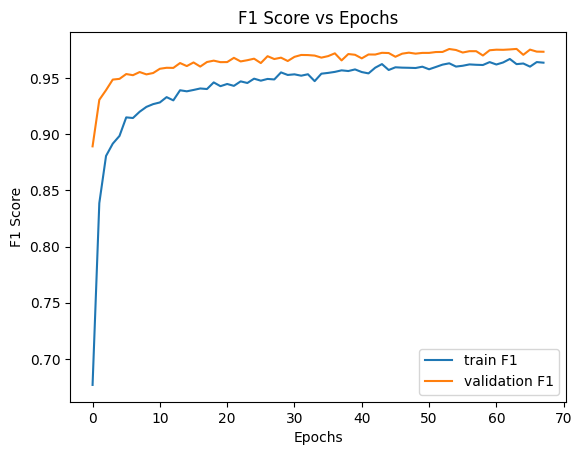

In [ ]:
# Se evalúa el modelo
val_loss, test_f1 = model_p99.evaluate(X_val, y_val)
print(f"F1-score en datos de validation: {val_f1:.2f}")

# Se guarda el scaler en un archivo
joblib.dump(scaler_99, "scaler_99.pkl")
print("Scaler exportado a scaler_99.pkl")

# Se imprime el gráfico con valores de F1 durante el entrenamiento
plt.title('F1 Score vs Epochs')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.plot(history_p99.history['f1_score'], label='train F1')
plt.plot(history_p99.history['val_f1_score'], label='validation F1')
plt.legend()
plt.show()

Se consiguen los valors más altos de puntaje f1 para train(0.9592) y val (0.9735).

####9.3.4.Matriz de confusión

In [ ]:
# Cargar los datos del archivo .npy
dataset_test = np.load('keypoints_labels_test.npy', allow_pickle=True)

# Extraer las etiquetas (segundo elemento de cada fila)
labels = [row[1] for row in dataset_test]

# Contar la frecuencia de cada clase
class_counts = Counter(labels)

# Mostrar el conteo
print("Conteo de datos por clase para test:")
for label, count in class_counts.items():
    print(f"Clase {label}: {count}")

Conteo de datos por clase para test:
Clase 0: 69
Clase 1: 88
Clase 2: 245


In [ ]:
# Se separan las coordenadas x, y y se aplanan
coordinates_test = np.array([np.array(row[2]).flatten() for row in dataset_test])
labels_test = np.array([row[1] for row in dataset_test])

X_test = coordinates_test
X_test = scaler_99.transform(X_test)
y_test = to_categorical(labels_test, num_classes=3)

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


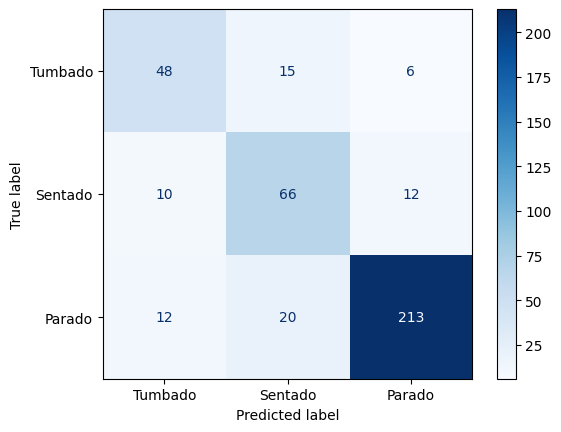

In [ ]:
# Cargar el modelo
model_p99 = load_model("model_p99.h5")

# Predicciones y etiquetas verdaderas
y_pred = model_p99.predict(X_test).argmax(axis=1)
y_true = y_test.argmax(axis=1)

# Crear la matriz de confusión
cm = confusion_matrix(y_true, y_pred)

# Definir las etiquetas de las clases
class_labels = ["Tumbado", "Sentado", "Parado"]

# Mostrar la matriz de confusión con etiquetas personalizadas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
disp.plot(cmap="Blues")  # Puedes cambiar el colormap si lo deseas

La precisión de la clase "Parado" es 0.922, siendo el valor más bajo obtenido, pero las demás aumentan, siendo de 0.686 y 0.653 para las clases "Tumbado" y "Sentado" respectivamente.

Si bien en el primer modelo la precisión de la clase "Tumbado" fue superior, este modelo consigue valores de precisión más parejos en las clase minoritarias.

##10.Inferencia de pose


0: 192x320 1 dog, 43.2ms
Speed: 2.5ms preprocess, 43.2ms inference, 1.0ms postprocess per image at shape (1, 3, 192, 320)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


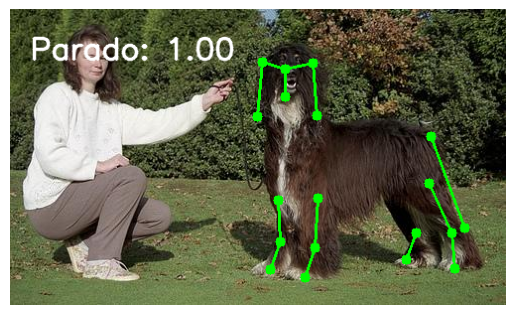

Clase predicha: Parado
Probabilidades: [ 3.0664e-07  4.4523e-06           1]
Clase predicha: Parado


In [ ]:
images_path="./datasets/dog-pose/test/images"

coordinates_example, predicted_class_label = predict_pose(model_k, model_p99, scaler_99, images_path, keypoints_list)
print("Clase predicha:", predicted_class_label)

##11.Inferencia de pose para transmisión de video en tiempo real

Mediante el script "predictor_pose_perro.py" se clasifica la pose de un perro a partir de una transmisión de video.
Debajo se detalla el código y los links a videos de ejemplo.

In [ ]:
#predictor_pose_perro.py

import cv2
import ultralytics
import tensorflow as tf
import joblib
import numpy as np
from ultralytics import YOLO
import os
from tensorflow.keras.models import load_model
import time

model_k = YOLO("model_k.pt")
model_p = load_model("model_p99.h5")
scaler = joblib.load("scaler_99.pkl")


# Lista de índices de keypoints que el scaler y el modelo de clasificación esperan
keypoints_list = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]

import time  # Importa la biblioteca para medir tiempo
def predict_pose_and_dog_from_video(model_k, model_p, scaler, video_path, lesskeypoints_list, pose_threshold=0.5, bbox_threshold=0.5, skip_frames=9):
    """
    Procesa un video cuadro a cuadro, detecta keypoints y bounding boxes de la clase "perro",
    y clasifica la pose con un modelo de clasificación.
    Muestra la etiqueta de la pose, la probabilidad, el número de keypoints válidos,
    y dibuja los bounding boxes de los perros detectados.

    Argumentos:
        model_k: Modelo YOLO para detectar keypoints y bounding boxes.
        model_p: Modelo para clasificar la pose.
        scaler: Scaler usado para normalizar las coordenadas durante el entrenamiento del modelo de clasificación.
        video_path: Ruta del video de entrada.
        lesskeypoints_list: Lista de índices de keypoints relevantes.
        pose_threshold: Umbral mínimo de probabilidad para mostrar la pose.
        bbox_threshold: Umbral mínimo de probabilidad para mostrar los bounding boxes.
        skip_frames: Número de cuadros a saltar entre inferencias.

    Retorna:
        None
    """


    # Verificar si el archivo de video existe
    if not os.path.exists(video_path):
        raise FileNotFoundError(f"El archivo de video no existe: {video_path}")

    # Abrir el video
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        raise ValueError("No se pudo abrir el video.")

    # Crear el nombre del archivo de salida automáticamente
    base_name, ext = os.path.splitext(video_path)
    output_path = f"{base_name}_pose_dog{ext}"

    # Configurar el video de salida
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Codec para guardar el video
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

    # Etiquetas de las clases
    class_labels = ["Tumbado", "Sentado", "Parado"]

    frame_counter = 0  # Contador de cuadros
    start_time = time.time()  # Inicia el temporizador

    # Variables para almacenar resultados previos
    previous_dog_label = "Sin detección"
    previous_pose_text = "Pose: N/A"
    previous_keypoints_text = "Keypoints: 0"

    while True:
        # Leer un cuadro del video
        ret, frame = cap.read()
        if not ret:
            break  # Fin del video

        # Realizar la predicción solo cada 'skip_frames + 1' cuadros
        if frame_counter % (skip_frames + 1) == 0:
            # Realizar la predicción de keypoints y bounding boxes
            results = model_k(frame)

            # Inicializar variable para etiqueta "dog"
            dog_label = None

            # Dibujar bounding boxes para "perros"
            if results[0].boxes is not None:  # Verificar que existan bounding boxes
                for box in results[0].boxes:  # Iterar sobre cada bounding box
                    conf = box.conf.item()  # Obtener la probabilidad de confianza
                    if conf >= bbox_threshold:  # Filtrar por el umbral de bounding boxes
                        x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())  # Coordenadas del bounding box
                        cls = int(box.cls.item())  # Clase predicha como índice
                        label = f"{results[0].names[cls]} {conf:.2f}"  # Etiqueta con clase y probabilidad

                        if results[0].names[cls] == "dog":  # Solo considerar bounding boxes de perros
                            # Guardar la etiqueta "dog" para dibujarla después
                            dog_label = label

            # Obtener keypoints de la predicción
            coordinates_example = []
            if hasattr(results[0], "keypoints") and results[0].keypoints is not None:
                keypoints_data = results[0].keypoints.data.cpu().numpy()  # Convertir a numpy array
                for row in keypoints_data[0]:  # Suponiendo que es un array 3D [1, N, 3]
                    coordinates_example.append((float(row[0]), float(row[1])))
            else:
                coordinates_example = [(0.00, 0.00)] * 24

            # Filtrar los keypoints
            filtered_coordinates = [
                coordinates_example[i] if i < len(coordinates_example) else (0.0, 0.0)
                for i in lesskeypoints_list
            ]

            expected_features = len(lesskeypoints_list)
            filtered_coordinates = filtered_coordinates[:expected_features]
            filtered_coordinates.extend([(0.0, 0.0)] * (expected_features - len(filtered_coordinates)))

            # Contar keypoints válidos (distintos de (0.0, 0.0))
            valid_keypoints_count = sum(1 for x, y in coordinates_example if (x, y) != (0.0, 0.0))

            # Validar dimensiones antes de la normalización
            input_data = np.array(filtered_coordinates).flatten().reshape(1, -1)
            if input_data.shape[1] != scaler.n_features_in_:
                raise ValueError(f"El número de características ({input_data.shape[1]}) no coincide con el escalador ({scaler.n_features_in_}).")

            # Normalizar las coordenadas
            input_data_normalized = scaler.transform(input_data)

            # Realizar la predicción de la pose
            probabilities = model_p.predict(input_data_normalized)
            predicted_class_index = np.argmax(probabilities)
            predicted_class_label = class_labels[predicted_class_index]
            predicted_class_probability = probabilities[0][predicted_class_index]  # Obtener la probabilidad

            # Actualizar resultados previos
            previous_dog_label = dog_label or "Sin detección"
            previous_pose_text = f"{predicted_class_label}: {predicted_class_probability:.2f}"
            previous_keypoints_text = f"Keypoints: {valid_keypoints_count}"

        # Dibujar los resultados en el cuadro actual
        font = cv2.FONT_HERSHEY_SIMPLEX
        label_x = 10
        label_y = height - 100
        cv2.putText(frame, previous_dog_label, (label_x, label_y), font, 1, (255, 0, 0), 2, cv2.LINE_AA)
        cv2.putText(frame, previous_pose_text, (label_x, label_y + 30), font, 1, (255, 0, 0), 2, cv2.LINE_AA)
        cv2.putText(frame, previous_keypoints_text, (label_x, label_y + 60), font, 1, (255, 0, 0), 2, cv2.LINE_AA)

        # Calcular y mostrar los FPS actuales
        elapsed_time = time.time() - start_time
        current_fps = frame_counter / elapsed_time if elapsed_time > 0 else 0
        fps_text = f"FPS: {current_fps:.2f}"
        cv2.putText(frame, fps_text, (10, 30), font, 1, (0, 255, 0), 2, cv2.LINE_AA)

        # Mostrar el cuadro usando OpenCV
        cv2.imshow("Video con Predicciones", frame)

        # Salir con la tecla 'q'
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break

        # Guardar el cuadro en el video de salida
        out.write(frame)

        frame_counter += 1

    # Liberar recursos
    cap.release()
    out.release()
    cv2.destroyAllWindows()


predict_pose_and_dog_from_video(
    model_k=model_k,
    model_p=model_p,
    scaler=scaler,
    video_path= "videos/perro3.mp4",
    lesskeypoints_list=keypoints_list,
    pose_threshold=0.6,
    bbox_threshold=0.5
)

Video 1: https://youtu.be/n2WtAX4MgYk

Video 2: https://youtu.be/nBhIGQEKz98

Video3: https://youtu.be/8B_eu4w7YcA

##12.Conclusiones finales

El modelo obtenido permite resolver de manera satisfactoria la clasificación de poses según se necesita.

Se consigue una velocidad de procesamiento superior a los 30fps, realizando inferencias cada 9 frames, lo cual resulta válido para los requerimientos planteados (ver videos de ejemplo en punto 11).

Se observa que ciertas posturas, como el perro sentado con la cabeza hacia adelante (Video 1) resultan confusas para el modelo que tiende a clasificar la pose como Parado. Otros puntos donde no se predice correctamente son naturalmente en las trancisiones de pose y durante la caminata, ya que el etiquetado fue realizado en poses estáticas y no de movimiento.

En cuanto a las métricas obtenidas, se destaca que a pesar de haber obtenido valores en test muy bajos para mAPpose50-95 (0.22) y MAPpose50 (0.68) en comparación con los valores de referencia (ver punto 6), luego se consiguieron precisiones en test para las clases de razonables a muy buenas (0.653 para Tumbado, 0.680 para Sentado y 0.922 para Parado).

Como se remarcó anteriormente, el dataset contiene una colección de imágenes donde la variedad de razas, edades y la posición de la cámara entre otros aspectos dificultan la tarea de clasificación y detección de keypoints, considerando además que se cuenta con una cantidad de datos reducida, por lo que un etiquetado criterioso para el objetivo buscado y la aumentación de datos resultan cruciales para la calidad de los resultados finales.

A pesar de las limitaciones inherentes al dataset ya mencionadas, el modelo ha demostrado ser capaz de cumplir con los objetivos planteados en términos de precisión y velocidad. Esto lo convierte en una herramienta útil para aplicaciones prácticas en tiempo real. Como futuros trabajos, se podría explorar el uso de datasets más diversos y técnicas avanzadas de preprocesamiento y aumentación de datos para mejorar aún más la generalización del modelo. Además, implementar optimizaciones en el pipeline de inferencia podría permitir su uso en hardware menos potente, ampliando su aplicabilidad en diferentes contextos.